In [1]:
import os
import re
import itertools
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import unicodecsv as csv
import seaborn as sns
from collections import Counter
from cycler import cycler
from textwrap import wrap
from IPython.display import display, HTML, Markdown

In [2]:
pd.set_option('display.max_columns', None)  
pd.set_option('display.expand_frame_repr', False)
pd.set_option('max_colwidth', -1)

In [3]:
from time import time
from IPython import get_ipython
import winsound

class Beeper:

    def __init__(self, threshold):
        self.threshold = threshold
        self.start_time = None    # time in sec, or None

    def pre_execute(self):
        if not self.start_time:
            self.start_time = time()

    def post_execute(self):
        end_time = time()
        if self.start_time and end_time - self.start_time > self.threshold:
            winsound.Beep(2500,1000)
        self.start_time = None


beeper = Beeper(60)

ipython = get_ipython()
ipython.events.register('pre_execute', beeper.pre_execute)
ipython.events.register('post_execute', beeper.post_execute)

In [4]:
%%html
<style>
div.float-bar-whh {
    z-index: 10;
    position: fixed;
    bottom: 5px;
    width: 540px;
    left: 50%;
    right: 50%;
    padding-right: 0px;
    padding-left: 0px;
    margin-left: -270px;
    background: #333;
    opacity: 0.7;
    box-shadow: 0 0 2px 0px black;
}
span.new-name-whh {
    height: 100%;
    line-height: 1em;
    margin: 16px 16px 16px 16px;
    border: none;
    font-size: 146.5%;
    color: white;
    text-overflow: ellipsis;
    overflow: hidden;
    white-space: nowrap;
    border-radius: 2px;
    opacity: 1;
}
</style>

<div class="float-bar-whh" style="display:block;">
    <center><span class="new-name-whh">Online Lenders</span></center>
</div>

# Analysize variables.

In [5]:
# Read documentation.
columns_file = r"../records_documentation.txt"

with open(columns_file,"r") as f:
    columns = f.readlines()
columns
        

['[Column 0] ID\n',
 '[Column 1] Birth year: deduced from education history, where available\n',
 '[Column 2] Gender flag: 1=female, 2=male, 0=unknown\n',
 '[Column 3] Skillset1: primary skillset deduced from self-reported skills\n',
 '[Column 4] Skillset1 weight: the extent to which primary skillset is representative of overall self-reported skills\n',
 '[Column 5] Skillset2: secondary skillset deduced from self-reported skills\n',
 '[Column 6] Skillset2 weight: the extent to which secondary skillset is representative of overall self-reported skills\n',
 '[Column 7] City of profile (does not change): where unavailable, the field is left blank\n',
 '[Column 8] Country of Profile (does not change)\n',
 '[Column 9] Education (highest degree attained): 0=none/unknown; 1=high school; 2=vocational degree; 3=associateÕs; 4=bachelorÕs; 5=masterÕs other than MBA; 6=MBA; 7=doctorate (PhD/JD/MD) [NB: Romanian names not covered]\n',
 "[Column 10] Elite institution: a flag indicating whether any o

So:
- Unique identifier: ID.
- Variable Groups:
    - Column 0-10, profile info; 
    - Column 11-28, employment or education info; (c26 = False or True)
        - Column 11-18, general info;
        - Column 19-25, company info;
        - Column 27-28, school info.

In [6]:
# Define an iterator for reading rows.
def rows_iter(index=True):
    if index:
        for index, line in enumerate(rows_iter(index=False)):
             yield index, line
    else:
        empl_file = r"../fin/finance_profiles.csv"
        with open(empl_file,"rb") as f:
            reader = csv.reader(f,encoding='utf-8',escapechar='',delimiter='\t')
            for line in reader:
                del line[1]
                yield line

In [7]:
# # Get unique values for each variable.
# unique_values = []
# for i in range(33):
#     unique_values.append(set())
# # Get unique values for each variable.
# for idx, line in rows_iter():
#     for i in range(33):
#         unique_values[i].add(line[i])
# for idx, values in enumerate(unique_values):
#     print("[Column {}] ".format(idx)+str(len(values)))

In [8]:
company_list = [
    ("Fairway Independent Mortgage", r"(?i)Fairway Independent Mortgage"),
    ("Flagstar Bank", r"(?i)Flagstar Bank"),
    ("United Wholesale Mortgage", r"(?i)United Wholesale Mortgage"),
    ("Caliber Home Loans", r"(?i)Caliber Home Loans"),
    ("loanDepot", r"(?i)loanDepot"),
    ("Quicken Loans (a.k.a Rocket Mortgage)", r"(?i)(Quicken Loans)|(Rocket Mortgage)"),
    ("PennyMac", r"(?i)PennyMac"),
    ("Guard Hill Financial", r"(?i)Guard ?Hill Financial"),
    ("Citadel Servicing", r"(?i)Citadel Servicing"),
    ("Nationstar Mortgage", r"(?i)Nationstar Mortgage"),
    ("PHH Mortgage", r"(?i)PHH Mortgage"),
    ("Angel Oak Mortgage Solutions", r"(?i)Angel Oak Mortgage Solutions"),
    ("HomeBridge Financial Services", r"(?i)HomeBridge Financial Services"),
    ("Caliber Home Loans", r"(?i)Caliber Home Loans"),
    ("Amerihome", r"(?i)Amerihome"),
    ("Freedom Mortgage", r"(?i)Freedom Mortgage"),
    ("newamerican funding", r"(?i)new ?american funding"),
    ("Reali loans", r"(?i)Reali loans"),
    ("Vylla", r"(?i)Vylla"),
    ("Northstar Funding", r"(?i)Northstar Funding"),
    ("Angel Oak Mortgage Solutions", r"(?i)Angel Oak Mortgage Solutions"),
    ("Athas Capital", r"(?i)Athas Capital"),
    ("JMAC Lending", r"(?i)JMAC Lending"),
    ("Carrington Mortgage Services", r"(?i)Carrington Mortgage Services"),
    ("Green Box Loans", r"(?i)Green ?Box Loans"),
    ("Oak Tree funding", r"(?i)Oak ?Tree funding"),
    ("First National Bank of America", r"(?i)First National Bank of America")
]

In [9]:
# # Get unique values for "ticker-naics-ticcode" tuple.
# unique_tuples = set()
# for idx, line in rows_iter():
#     if idx == -1:
#         break
#     if line[25] is not None and len(line[25])>=2 and line[25][:2]=='52':
#         unique_tuples.add((line[19], line[21], line[25], line[31])) 
# company_df = pd.DataFrame(unique_tuples)

In [10]:
# company_df.columns = ["oconame", "ticker", "naics", "ticcode"]
# company_df.sort_values(["ticcode","oconame"])

In [11]:
# company_df.loc[170582]


In [12]:
# matched_dict = {}
# for coname, pattern in company_list:
#     matched_dict[coname] = company_df[lambda df:df.oconame.apply(lambda x:re.search(pattern, x) is not None)]
#     print("{} - {}".format(coname, matched_dict[coname].shape[0]))

In [13]:
# company_df[lambda df:df.oconame.apply(lambda x:"Sun Bank".lower() in x.lower())]

In [14]:
# One block to convert data to pd.DataFrame.
entries_lst = []
for idx, line in rows_iter():
    if idx == 20: # Control number of rows.
        break
    entries_lst.append(line)

samples_lst = entries_lst
entries_df = pd.DataFrame(data=entries_lst)

entries_df

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32
0,f035a384-cd3c-3185-8340-c0ac1459d9ae,2001,1,-1,0,-1,0,Bronx,United States,0,False,None,False,None,False,True,,finacial associate,,citi,citi,C,XNYS,True,,522291,False,,False,,,BBG000FY4S11,1503620559000
1,5ad24f8c-72d7-34b8-87c4-74ee992f0d50,1970,1,-1,0,-1,0,Milan,Italy,4,False,1988-01-01,False,1993-01-01,False,False,1827,"""Laurea, Discipline Economico-Sociali (DES)"",Laurea,Discipline Economico-Sociali,DES",,Università Bocconi,Università Bocconi,UNIVERSITY,ITALY,False,,,True,4,False,,,,1530808751000
2,5ad24f8c-72d7-34b8-87c4-74ee992f0d50,1970,1,-1,0,-1,0,Milan,Italy,4,False,1993-01-01,False,1995-02-01,True,False,761,,,TIME_OFF,TIME_OFF,TIME_OFF,OTHER,False,Italy,TIME_OFF,False,,False,,,,1530808751000
3,5ad24f8c-72d7-34b8-87c4-74ee992f0d50,1970,1,-1,0,-1,0,Milan,Italy,4,False,1995-03-01,True,2005-08-01,True,False,3806,"Sales Support Assicurazioni & Riassicurazioni,sales support",MARKETING,Europ Assistance Italia,europ assistance,,ITALY,False,,52,False,,False,,,,1530808751000
4,5ad24f8c-72d7-34b8-87c4-74ee992f0d50,1970,1,-1,0,-1,0,Milan,Italy,4,False,2005-09-01,True,2013-12-01,True,False,3013,"Responsabile Assicurazioni; Banche e Mercato Finanziario,responsabile",,Mondial Assistance Italia,Mondial Assistance Italia,,,False,,,False,,False,,,,1530808751000
5,5ad24f8c-72d7-34b8-87c4-74ee992f0d50,1970,1,-1,0,-1,0,Milan,Italy,4,False,2014-01-01,True,None,False,True,1834,"National Account Manager Allianz Group Italy,account manager",,Allianz Worldwide Partners,Allianz Worldwide Partners,,,False,"milan area, italy",,False,,False,,,,1530808751000
6,947afa64-5369-3825-9d43-3a2ee7a44e89,1972,0,-1,0,-1,0,Brooklyn,United States,4,False,2001-01-01,True,2006-07-01,True,False,2007,"Regional Account Executive,account executive",,MCI Corporation,mci,,UNITED STATES,False,,51,False,,False,,,,1518862557000
7,947afa64-5369-3825-9d43-3a2ee7a44e89,1972,0,-1,0,-1,0,Brooklyn,United States,4,False,2006-09-01,True,2007-04-01,True,False,212,"Regional Account Manager,account manager",,Washington Mutual Card Services,washington mutual,,UNITED STATES,False,,52,False,,False,,,,1518862557000
8,947afa64-5369-3825-9d43-3a2ee7a44e89,1972,0,-1,0,-1,0,Brooklyn,United States,4,False,2007-03-01,True,None,False,True,4332,"Student Teacher,student,teacher",,NYC Board of Education,nyc board of,,UNITED STATES,False,,61,False,,False,,,,1518862557000
9,947afa64-5369-3825-9d43-3a2ee7a44e89,1972,0,-1,0,-1,0,Brooklyn,United States,4,False,2008-01-01,False,2014-01-01,False,False,2192,""""""" Bachelor of Science """" BA, Special Education and Teaching"","""""" Bachelor of Science """" BA"",Special Education and Teaching",,Touro College,Touro College,UNIVERSITY,UNITED STATES,False,,,True,4,False,,,,1518862557000


In [15]:
# Get an example.
entry = samples_lst[13]
for i in range(len(entry)):
    print("[Column {}] ".format(i),entry[i])

[Column 0]  f6e5ddfa-3c7a-3139-88c1-3015a1f4ce9d
[Column 1]  1978
[Column 2]  1
[Column 3]  -1
[Column 4]  0
[Column 5]  -1
[Column 6]  0
[Column 7]  Geneva
[Column 8]  Switzerland
[Column 9]  5
[Column 10]  False
[Column 11]  2008-06-01
[Column 12]  True
[Column 13]  2008-08-01
[Column 14]  True
[Column 15]  False
[Column 16]  61
[Column 17]  Operations Summer Analyst,operations,analyst
[Column 18]  OPERATIONS
[Column 19]  Goldman Sachs
[Column 20]  Goldman Sachs
[Column 21]  GS
[Column 22]  XNYS
[Column 23]  True
[Column 24]  new york / new jersey, united states
[Column 25]  523110
[Column 26]  False
[Column 27]  
[Column 28]  False
[Column 29]  
[Column 30]  
[Column 31]  BBG000C6CFJ5
[Column 32]  1531074992000


# Aggregate employment changes to the firm-by-date level.

Definition of employment change types: When only employment records are considered, an employment change will be recognized as
- `hiring` if it changed its company to one of the companies (listed [here](#company_lst));
- `firing` if it changed its company from one of the companies to `TIME_OFF` and stayed in `TIME_OFF` for more than 100 days;
- `leaving` if it changed its company from one of the companies and not recogized as `firing`.

In [16]:
# Define a class to read and process entries.
class entryProcessor:    
    
    def __init__(self, person_id):
        self.person_id = person_id
        self.profile = [None]*7 # "birth_year","gender","skill1","skill2","country","education_level","f_elite"
        self.employment = [None]*7 # "start_date","end_date","ticker","f_current","job_role","department", "nth_posit"
        self.company = [None]*2 # "coname", "naics", "oconame"
        
    # Three functions to output records.
    # Varlist: Hiring/Leaving/Firing, Ticker, year-month, profile_info: [...], next_industry.
    def enter_record(self):
        return ['hiring',self.employment[2],self.employment[0]
               ]+self.profile+[self.employment[4],self.employment[5]
                              ]+['']+['','']+self.company
    def leave_record(self,next_industry):
        return ['leaving',self.employment[2],self.employment[1]
               ]+self.profile+[self.employment[4],self.employment[5]
                              ]+[next_industry]+[entryProcessor.time_diff(self.employment[1],self.employment[0]),
                                                 self.employment[6]]+self.company
    def fired_record(self):
        return ['firing',self.employment[2],self.employment[1]
               ]+self.profile+[self.employment[4],self.employment[5]
                              ]+['']+[entryProcessor.time_diff(self.employment[1],self.employment[0]),
                                      self.employment[6]]+self.company
    
    # When id changes, record a possible leave and then clear contents.
    def reinitialize(self,entry):
        if self.employment[3]=="False":
            record = self.leave_record('')
        else:
            record = None
        self.__init__(entry[0])
        self.profile = [entry[x] for x in [1,2,3,5,8,9,10]]
        if entry[6] is not None:
            self.profile[3] = '' if float(entry[6])<0.1 else entry[5]
        return record
    
    # Main method: read and process.
    def read(self,entry):
        record = []
        # Reinitialize when id changes.
        if self.person_id != entry[0]:
            leave_last = self.reinitialize(entry)
            if leave_last is not None:
                record.append(leave_last)
        # Then deal with the current entry.
        if entry[3] != "-1" and entry[26] == "False" and not sum([
            re.search(r"(?i)\W{}\W".format(x)," "+entry[17]+" ") is not None 
            for x in ["intern","internship","trainee","student","summer"]
        ]):
            if self.company[0] != entry[31]:
                if entryProcessor.is_fin(self.company[1]) and self.company[0]:
                    if entry[25] == "TIME_OFF" and int(entry[16]) > 100:
                        record.append(self.fired_record())
                    else:
                        record.append(self.leave_record(entry[25]))
                self.employment = [None]*7
                self.company = [None]*3
                if entryProcessor.is_fin(entry[25]) and entry[31]:
                    self.employment[0] = entryProcessor.convert_time(entry[11],entry[12])
                    self.employment[1] = entryProcessor.convert_time(entry[13],entry[14])
                    self.employment[2] = entry[21]+"@"+entry[22] if entry[21]!="" else ""
                    self.employment[3] = entry[15]
                    self.employment[4] = entry[17]
                    self.employment[5] = entry[18]
                    self.employment[6] = 0
                    self.company = [entry[31],entry[25],entry[19]]
                    record.append(self.enter_record())
            else:
                self.employment[1] = entryProcessor.convert_time(entry[13],entry[14])
                self.employment[3] = entry[15]
                self.employment[6] += 1
        return record
            
    # Unbound methods.
    def convert_time(date,f_valid_month):
        date_regex = re.match(r"(\d{4})-(\d{2})-\d{2}",date)
        if date_regex is None:
            return None
            #raise ValueError('Not a proper date: {}'.format(date))
        else:
            return date_regex.group(1)+('00' if f_valid_month == 'False' else date_regex.group(2))
    
    def time_diff(end_date,start_date):
        if end_date is not None and start_date is not None:
            edt, sdt = int(end_date), int(start_date)
            yr_diff = edt//100-sdt//100
            emth = edt%100
            smth = sdt%100
            if not yr_diff and not (emth and smth):
                return min(6,(emth-smth-1)%12+1)
            else:
                return yr_diff*12+(emth if emth else 6)-(smth if smth else 6)
        else:
            return np.nan
    
    def is_fin(naics): # entry[25]
        return naics is not None and len(naics)>=2 and naics[:2]=='52'

    # For print.
    def __str__(self):
        return "[person_id: {}, profile: {}, employment: {}]".format(self.person_id, self.profile, self.employment)
            
#entry = entryProcessor(None)
#for i in range(50):
#    print(i)
#    print(entry.read(samples_lst[i]))
#    print(entry)

In [17]:
# Read, Identify & Aggregate.

## Initialize.
career = entryProcessor(None)

## Iterate.
empl_changes_lst = []
for idx, entry in itertools.chain(rows_iter(),[(None,[None]*40)]):
    if idx == -1: # End point.
        break
    entry[31] = ""
    for coname, pattern in company_list:
        if entry[19] is not None and re.search(pattern, entry[19]) is not None:
            entry[31] = coname
            break
    empl_changes_lst += career.read(entry)

varlist = [
    "type","ticker","yrmth","birth","gender","skill1","skill2","cntry","edu","f_elite",
    "job_role","depmt","ind_next","tenure","nprom","coname","naics","oconame"
]
empl_changes_df = pd.DataFrame(data=empl_changes_lst,columns=varlist)
empl_changes_df["ticker"] = "All"
empl_changes_df


,type,ticker,yrmth,birth,gender,skill1,skill2,cntry,edu,f_elite,job_role,depmt,ind_next,tenure,nprom,coname,naics,oconame
0,hiring,All,200606,2001,1,Recruiting,,United States,4,False,"Director,director",OVERSIGHT,,,,PHH Mortgage,52,PHH Mortgage
1,leaving,All,201101,2001,1,Recruiting,,United States,4,False,"Director,director",OVERSIGHT,52,55,0,PHH Mortgage,52,PHH Mortgage
2,hiring,All,201512,2001,2,Real Estate,Banking and Finance,United States,0,False,"Divisional Manager Mortgage- Western U.S.,manager,"",""",,,,,Flagstar Bank,522120,Flagstar Bank
3,leaving,All,201805,2001,2,Real Estate,Banking and Finance,United States,0,False,"Divisional Manager Mortgage- Western U.S.,manager,"",""",,52,29,0,Flagstar Bank,522120,Flagstar Bank
4,hiring,All,200500,1973,2,Social Media and Communications,Digital Marketing,United States,5,False,"Junior Banker,junior,banker",,,,,Quicken Loans (a.k.a Rocket Mortgage),522,Quicken Loans
5,leaving,All,200500,1973,2,Social Media and Communications,Digital Marketing,United States,5,False,"Junior Banker,junior,banker",,54,6,0,Quicken Loans (a.k.a Rocket Mortgage),522,Quicken Loans
6,hiring,All,200105,1983,0,Banking and Finance,Middle Management,United States,4,False,"Technology Integration Specialist,specialist",TECHNOLOGY,,,,Flagstar Bank,522120,Flagstar Bank
7,leaving,All,200606,1983,0,Banking and Finance,Middle Management,United States,4,False,"Technology Integration Specialist,specialist",TECHNOLOGY,MISSING,61,0,Flagstar Bank,522120,Flagstar Bank
8,hiring,All,201310,1983,0,Banking and Finance,Middle Management,United States,4,False,"Associate Project Manager,project manager,associate",,,,,Flagstar Bank,522120,Flagstar Bank
9,leaving,All,201510,1983,0,Banking and Finance,Middle Management,United States,4,False,"Associate Project Manager,project manager,associate",,336411,24,0,Flagstar Bank,522120,Flagstar Bank


A block prepared for counting annual employment.

In [18]:
res_counter = Counter()
for idx, entry in rows_iter():
    if idx == -1: # End point.
        break
    entry[31] = ""
    for coname, pattern in company_list:
        if entry[19] is not None and re.search(pattern, entry[19]) is not None:
            entry[31] = coname
            break
    if entryProcessor.is_fin(entry[25]) and entry[31] and entry[3] != "-1" and entry[26] == "False" and not sum([
        re.search(r"(?i)\W{}\W".format(x)," "+entry[17]+" ") is not None 
        for x in ["intern","internship","trainee","student","summer"]
    ]):
        if entry[11] != "None" and (entry[13] != "None" or entry[15] == "True"):
            # print([entry[x] for x in [11,12,13,14,15]])
            res_counter += Counter(
                range(
                    pd.to_datetime(entry[11]).year,
                    pd.to_datetime(entry[13]).year if entry[13]!="None" else 2019
                )
            )
            print(pd.to_datetime(entry[11]).year)
            print(pd.to_datetime(entry[13]).year if entry[13]!="None" else 2019)
            print(res_counter)

empl_by_years = pd.Series(res_counter).reset_index()
empl_by_years.columns = ["year", "employment"]
empl_by_years["ticker"] = "All"
empl_by_years = empl_by_years.groupby(["ticker", "year"]).sum().reset_index()

# empl_by_years

2006
2011
Counter({2006: 1, 2007: 1, 2008: 1, 2009: 1, 2010: 1})
2015
2018
Counter({2006: 1, 2007: 1, 2008: 1, 2009: 1, 2010: 1, 2015: 1, 2016: 1, 2017: 1})
2005
2005
Counter({2006: 1, 2007: 1, 2008: 1, 2009: 1, 2010: 1, 2015: 1, 2016: 1, 2017: 1})
2001
2006
Counter({2006: 1, 2007: 1, 2008: 1, 2009: 1, 2010: 1, 2015: 1, 2016: 1, 2017: 1, 2001: 1, 2002: 1, 2003: 1, 2004: 1, 2005: 1})
2013
2015
Counter({2006: 1, 2007: 1, 2008: 1, 2009: 1, 2010: 1, 2015: 1, 2016: 1, 2017: 1, 2001: 1, 2002: 1, 2003: 1, 2004: 1, 2005: 1, 2013: 1, 2014: 1})
2011
2012
Counter({2006: 1, 2007: 1, 2008: 1, 2009: 1, 2010: 1, 2015: 1, 2016: 1, 2017: 1, 2001: 1, 2002: 1, 2003: 1, 2004: 1, 2005: 1, 2013: 1, 2014: 1, 2011: 1})
2013
2019
Counter({2015: 2, 2016: 2, 2017: 2, 2013: 2, 2014: 2, 2006: 1, 2007: 1, 2008: 1, 2009: 1, 2010: 1, 2001: 1, 2002: 1, 2003: 1, 2004: 1, 2005: 1, 2011: 1, 2018: 1})
2013
2019
Counter({2015: 3, 2016: 3, 2017: 3, 2013: 3, 2014: 3, 2018: 2, 2006: 1, 2007: 1, 2008: 1, 2009: 1, 2010: 1, 2001

2016
2019
Counter({2018: 20, 2015: 19, 2016: 17, 2017: 17, 2014: 12, 2013: 11, 2012: 6, 2011: 5, 2010: 4, 2006: 2, 2008: 2, 2009: 2, 2001: 2, 2002: 2, 2003: 2, 2004: 2, 2005: 2, 2007: 1, 1999: 1, 2000: 1})
1995
1997
Counter({2018: 20, 2015: 19, 2016: 17, 2017: 17, 2014: 12, 2013: 11, 2012: 6, 2011: 5, 2010: 4, 2006: 2, 2008: 2, 2009: 2, 2001: 2, 2002: 2, 2003: 2, 2004: 2, 2005: 2, 2007: 1, 1999: 1, 2000: 1, 1995: 1, 1996: 1})
2010
2012
Counter({2018: 20, 2015: 19, 2016: 17, 2017: 17, 2014: 12, 2013: 11, 2011: 6, 2012: 6, 2010: 5, 2006: 2, 2008: 2, 2009: 2, 2001: 2, 2002: 2, 2003: 2, 2004: 2, 2005: 2, 2007: 1, 1999: 1, 2000: 1, 1995: 1, 1996: 1})
2012
2013
Counter({2018: 20, 2015: 19, 2016: 17, 2017: 17, 2014: 12, 2013: 11, 2012: 7, 2011: 6, 2010: 5, 2006: 2, 2008: 2, 2009: 2, 2001: 2, 2002: 2, 2003: 2, 2004: 2, 2005: 2, 2007: 1, 1999: 1, 2000: 1, 1995: 1, 1996: 1})
2010
2019
Counter({2018: 21, 2015: 20, 2016: 18, 2017: 18, 2014: 13, 2013: 12, 2012: 8, 2011: 7, 2010: 6, 2006: 2, 2008: 2

2017
2018
Counter({2018: 33, 2017: 32, 2016: 29, 2015: 26, 2014: 20, 2013: 17, 2012: 12, 2011: 11, 2010: 9, 2006: 7, 2008: 7, 2007: 6, 2004: 6, 2005: 6, 2009: 5, 2002: 5, 2003: 5, 2001: 4, 1999: 2, 2000: 2, 1995: 1, 1996: 1})
2015
2017
Counter({2018: 33, 2017: 32, 2016: 30, 2015: 27, 2014: 20, 2013: 17, 2012: 12, 2011: 11, 2010: 9, 2006: 7, 2008: 7, 2007: 6, 2004: 6, 2005: 6, 2009: 5, 2002: 5, 2003: 5, 2001: 4, 1999: 2, 2000: 2, 1995: 1, 1996: 1})
2008
2010
Counter({2018: 33, 2017: 32, 2016: 30, 2015: 27, 2014: 20, 2013: 17, 2012: 12, 2011: 11, 2010: 9, 2008: 8, 2006: 7, 2007: 6, 2009: 6, 2004: 6, 2005: 6, 2002: 5, 2003: 5, 2001: 4, 1999: 2, 2000: 2, 1995: 1, 1996: 1})
2010
2010
Counter({2018: 33, 2017: 32, 2016: 30, 2015: 27, 2014: 20, 2013: 17, 2012: 12, 2011: 11, 2010: 9, 2008: 8, 2006: 7, 2007: 6, 2009: 6, 2004: 6, 2005: 6, 2002: 5, 2003: 5, 2001: 4, 1999: 2, 2000: 2, 1995: 1, 1996: 1})
2010
2015
Counter({2018: 33, 2017: 32, 2016: 30, 2015: 27, 2014: 21, 2013: 18, 2012: 13, 2011: 1

2009
2010
Counter({2018: 48, 2017: 44, 2016: 41, 2015: 39, 2014: 30, 2013: 23, 2012: 18, 2011: 15, 2010: 14, 2006: 12, 2008: 12, 2007: 11, 2009: 10, 2004: 9, 2005: 9, 2002: 7, 2003: 7, 2001: 6, 1999: 4, 2000: 4, 1995: 2, 1996: 2, 1998: 2, 1991: 1, 1992: 1, 1993: 1, 1994: 1, 1997: 1})
2014
2019
Counter({2018: 49, 2017: 45, 2016: 42, 2015: 40, 2014: 31, 2013: 23, 2012: 18, 2011: 15, 2010: 14, 2006: 12, 2008: 12, 2007: 11, 2009: 10, 2004: 9, 2005: 9, 2002: 7, 2003: 7, 2001: 6, 1999: 4, 2000: 4, 1995: 2, 1996: 2, 1998: 2, 1991: 1, 1992: 1, 1993: 1, 1994: 1, 1997: 1})
2016
2018
Counter({2018: 49, 2017: 46, 2016: 43, 2015: 40, 2014: 31, 2013: 23, 2012: 18, 2011: 15, 2010: 14, 2006: 12, 2008: 12, 2007: 11, 2009: 10, 2004: 9, 2005: 9, 2002: 7, 2003: 7, 2001: 6, 1999: 4, 2000: 4, 1995: 2, 1996: 2, 1998: 2, 1991: 1, 1992: 1, 1993: 1, 1994: 1, 1997: 1})
2010
2012
Counter({2018: 49, 2017: 46, 2016: 43, 2015: 40, 2014: 31, 2013: 23, 2012: 18, 2011: 16, 2010: 15, 2006: 12, 2008: 12, 2007: 11, 2009: 

2007
2008
Counter({2018: 60, 2017: 54, 2016: 49, 2015: 44, 2014: 33, 2013: 29, 2012: 22, 2011: 18, 2006: 17, 2010: 17, 2007: 16, 2008: 14, 2009: 12, 2004: 12, 2005: 12, 2003: 10, 2002: 9, 2001: 7, 1999: 6, 2000: 6, 1998: 4, 1996: 3, 1997: 3, 1995: 2, 1991: 1, 1992: 1, 1993: 1, 1994: 1})
2016
2017
Counter({2018: 60, 2017: 54, 2016: 50, 2015: 44, 2014: 33, 2013: 29, 2012: 22, 2011: 18, 2006: 17, 2010: 17, 2007: 16, 2008: 14, 2009: 12, 2004: 12, 2005: 12, 2003: 10, 2002: 9, 2001: 7, 1999: 6, 2000: 6, 1998: 4, 1996: 3, 1997: 3, 1995: 2, 1991: 1, 1992: 1, 1993: 1, 1994: 1})
2010
2013
Counter({2018: 60, 2017: 54, 2016: 50, 2015: 44, 2014: 33, 2013: 29, 2012: 23, 2011: 19, 2010: 18, 2006: 17, 2007: 16, 2008: 14, 2009: 12, 2004: 12, 2005: 12, 2003: 10, 2002: 9, 2001: 7, 1999: 6, 2000: 6, 1998: 4, 1996: 3, 1997: 3, 1995: 2, 1991: 1, 1992: 1, 1993: 1, 1994: 1})
2014
2015
Counter({2018: 60, 2017: 54, 2016: 50, 2015: 44, 2014: 34, 2013: 29, 2012: 23, 2011: 19, 2010: 18, 2006: 17, 2007: 16, 2008: 1

2016
2019
Counter({2018: 70, 2017: 64, 2016: 61, 2015: 55, 2014: 43, 2013: 41, 2012: 32, 2011: 24, 2010: 21, 2006: 19, 2007: 18, 2008: 16, 2009: 15, 2004: 14, 2005: 14, 2003: 11, 2002: 10, 2001: 8, 1999: 7, 2000: 7, 1998: 5, 1996: 4, 1997: 4, 1995: 3, 1993: 2, 1994: 2, 1991: 1, 1992: 1})
2008
2011
Counter({2018: 70, 2017: 64, 2016: 61, 2015: 55, 2014: 43, 2013: 41, 2012: 32, 2011: 24, 2010: 22, 2006: 19, 2007: 18, 2008: 17, 2009: 16, 2004: 14, 2005: 14, 2003: 11, 2002: 10, 2001: 8, 1999: 7, 2000: 7, 1998: 5, 1996: 4, 1997: 4, 1995: 3, 1993: 2, 1994: 2, 1991: 1, 1992: 1})
2017
2019
Counter({2018: 71, 2017: 65, 2016: 61, 2015: 55, 2014: 43, 2013: 41, 2012: 32, 2011: 24, 2010: 22, 2006: 19, 2007: 18, 2008: 17, 2009: 16, 2004: 14, 2005: 14, 2003: 11, 2002: 10, 2001: 8, 1999: 7, 2000: 7, 1998: 5, 1996: 4, 1997: 4, 1995: 3, 1993: 2, 1994: 2, 1991: 1, 1992: 1})
2017
2019
Counter({2018: 72, 2017: 66, 2016: 61, 2015: 55, 2014: 43, 2013: 41, 2012: 32, 2011: 24, 2010: 22, 2006: 19, 2007: 18, 2008

2010
2011
Counter({2018: 84, 2017: 79, 2016: 72, 2015: 61, 2014: 53, 2013: 47, 2012: 37, 2011: 29, 2010: 27, 2006: 22, 2007: 22, 2008: 22, 2009: 21, 2005: 19, 2004: 18, 2003: 15, 2002: 14, 2001: 11, 2000: 10, 1999: 9, 1998: 6, 1997: 5, 1996: 4, 1995: 3, 1993: 2, 1994: 2, 1991: 1, 1992: 1})
2011
2014
Counter({2018: 84, 2017: 79, 2016: 72, 2015: 61, 2014: 53, 2013: 48, 2012: 38, 2011: 30, 2010: 27, 2006: 22, 2007: 22, 2008: 22, 2009: 21, 2005: 19, 2004: 18, 2003: 15, 2002: 14, 2001: 11, 2000: 10, 1999: 9, 1998: 6, 1997: 5, 1996: 4, 1995: 3, 1993: 2, 1994: 2, 1991: 1, 1992: 1})
2014
2014
Counter({2018: 84, 2017: 79, 2016: 72, 2015: 61, 2014: 53, 2013: 48, 2012: 38, 2011: 30, 2010: 27, 2006: 22, 2007: 22, 2008: 22, 2009: 21, 2005: 19, 2004: 18, 2003: 15, 2002: 14, 2001: 11, 2000: 10, 1999: 9, 1998: 6, 1997: 5, 1996: 4, 1995: 3, 1993: 2, 1994: 2, 1991: 1, 1992: 1})
2014
2015
Counter({2018: 84, 2017: 79, 2016: 72, 2015: 61, 2014: 54, 2013: 48, 2012: 38, 2011: 30, 2010: 27, 2006: 22, 2007: 22

2005
2009
Counter({2018: 95, 2017: 90, 2016: 82, 2015: 68, 2014: 59, 2013: 53, 2012: 43, 2011: 34, 2010: 31, 2008: 27, 2006: 26, 2007: 26, 2009: 25, 2005: 23, 2004: 22, 2003: 16, 2002: 15, 2001: 12, 2000: 11, 1999: 10, 1998: 7, 1997: 5, 1996: 4, 1995: 3, 1993: 2, 1994: 2, 1991: 1, 1992: 1})
2015
2015
Counter({2018: 95, 2017: 90, 2016: 82, 2015: 68, 2014: 59, 2013: 53, 2012: 43, 2011: 34, 2010: 31, 2008: 27, 2006: 26, 2007: 26, 2009: 25, 2005: 23, 2004: 22, 2003: 16, 2002: 15, 2001: 12, 2000: 11, 1999: 10, 1998: 7, 1997: 5, 1996: 4, 1995: 3, 1993: 2, 1994: 2, 1991: 1, 1992: 1})
2005
2007
Counter({2018: 95, 2017: 90, 2016: 82, 2015: 68, 2014: 59, 2013: 53, 2012: 43, 2011: 34, 2010: 31, 2006: 27, 2008: 27, 2007: 26, 2009: 25, 2005: 24, 2004: 22, 2003: 16, 2002: 15, 2001: 12, 2000: 11, 1999: 10, 1998: 7, 1997: 5, 1996: 4, 1995: 3, 1993: 2, 1994: 2, 1991: 1, 1992: 1})
2003
2005
Counter({2018: 95, 2017: 90, 2016: 82, 2015: 68, 2014: 59, 2013: 53, 2012: 43, 2011: 34, 2010: 31, 2006: 27, 2008:

2013
2015
Counter({2018: 106, 2017: 101, 2016: 96, 2015: 78, 2014: 69, 2013: 61, 2012: 55, 2011: 39, 2010: 36, 2008: 32, 2007: 31, 2009: 30, 2006: 29, 2005: 25, 2004: 24, 2003: 18, 2002: 16, 2001: 13, 2000: 12, 1999: 11, 1998: 8, 1997: 5, 1996: 4, 1995: 3, 1993: 2, 1994: 2, 1991: 1, 1992: 1})
2018
2019
Counter({2018: 107, 2017: 101, 2016: 96, 2015: 78, 2014: 69, 2013: 61, 2012: 55, 2011: 39, 2010: 36, 2008: 32, 2007: 31, 2009: 30, 2006: 29, 2005: 25, 2004: 24, 2003: 18, 2002: 16, 2001: 13, 2000: 12, 1999: 11, 1998: 8, 1997: 5, 1996: 4, 1995: 3, 1993: 2, 1994: 2, 1991: 1, 1992: 1})
2014
2019
Counter({2018: 108, 2017: 102, 2016: 97, 2015: 79, 2014: 70, 2013: 61, 2012: 55, 2011: 39, 2010: 36, 2008: 32, 2007: 31, 2009: 30, 2006: 29, 2005: 25, 2004: 24, 2003: 18, 2002: 16, 2001: 13, 2000: 12, 1999: 11, 1998: 8, 1997: 5, 1996: 4, 1995: 3, 1993: 2, 1994: 2, 1991: 1, 1992: 1})
2008
2014
Counter({2018: 108, 2017: 102, 2016: 97, 2015: 79, 2014: 70, 2013: 62, 2012: 56, 2011: 40, 2010: 37, 2008: 3

2002
2010
Counter({2018: 124, 2017: 118, 2016: 112, 2015: 91, 2014: 83, 2013: 72, 2012: 64, 2011: 45, 2010: 41, 2008: 37, 2007: 35, 2009: 35, 2006: 33, 2005: 28, 2004: 26, 2003: 20, 2002: 18, 2001: 14, 2000: 13, 1999: 12, 1998: 9, 1997: 6, 1996: 5, 1995: 4, 1993: 3, 1994: 3, 1991: 2, 1992: 2, 1987: 1, 1988: 1, 1989: 1, 1990: 1})
2009
2009
Counter({2018: 124, 2017: 118, 2016: 112, 2015: 91, 2014: 83, 2013: 72, 2012: 64, 2011: 45, 2010: 41, 2008: 37, 2007: 35, 2009: 35, 2006: 33, 2005: 28, 2004: 26, 2003: 20, 2002: 18, 2001: 14, 2000: 13, 1999: 12, 1998: 9, 1997: 6, 1996: 5, 1995: 4, 1993: 3, 1994: 3, 1991: 2, 1992: 2, 1987: 1, 1988: 1, 1989: 1, 1990: 1})
2007
2010
Counter({2018: 124, 2017: 118, 2016: 112, 2015: 91, 2014: 83, 2013: 72, 2012: 64, 2011: 45, 2010: 41, 2008: 38, 2007: 36, 2009: 36, 2006: 33, 2005: 28, 2004: 26, 2003: 20, 2002: 18, 2001: 14, 2000: 13, 1999: 12, 1998: 9, 1997: 6, 1996: 5, 1995: 4, 1993: 3, 1994: 3, 1991: 2, 1992: 2, 1987: 1, 1988: 1, 1989: 1, 1990: 1})
2013
20

2010
2012
Counter({2018: 131, 2017: 124, 2016: 118, 2015: 97, 2014: 88, 2013: 78, 2012: 71, 2011: 49, 2010: 45, 2008: 40, 2009: 38, 2007: 37, 2006: 34, 2005: 29, 2004: 27, 2003: 20, 2002: 18, 2001: 15, 2000: 14, 1999: 13, 1998: 10, 1997: 7, 1996: 6, 1995: 5, 1993: 4, 1994: 4, 1991: 2, 1992: 2, 1987: 1, 1988: 1, 1989: 1, 1990: 1})
2015
2019
Counter({2018: 132, 2017: 125, 2016: 119, 2015: 98, 2014: 88, 2013: 78, 2012: 71, 2011: 49, 2010: 45, 2008: 40, 2009: 38, 2007: 37, 2006: 34, 2005: 29, 2004: 27, 2003: 20, 2002: 18, 2001: 15, 2000: 14, 1999: 13, 1998: 10, 1997: 7, 1996: 6, 1995: 5, 1993: 4, 1994: 4, 1991: 2, 1992: 2, 1987: 1, 1988: 1, 1989: 1, 1990: 1})
2014
2015
Counter({2018: 132, 2017: 125, 2016: 119, 2015: 98, 2014: 89, 2013: 78, 2012: 71, 2011: 49, 2010: 45, 2008: 40, 2009: 38, 2007: 37, 2006: 34, 2005: 29, 2004: 27, 2003: 20, 2002: 18, 2001: 15, 2000: 14, 1999: 13, 1998: 10, 1997: 7, 1996: 6, 1995: 5, 1993: 4, 1994: 4, 1991: 2, 1992: 2, 1987: 1, 1988: 1, 1989: 1, 1990: 1})
2009

2017
2018
Counter({2018: 137, 2017: 131, 2016: 123, 2015: 102, 2014: 95, 2013: 82, 2012: 73, 2011: 52, 2010: 47, 2009: 41, 2008: 40, 2007: 37, 2006: 34, 2005: 29, 2004: 27, 2003: 20, 2002: 18, 2001: 15, 2000: 14, 1999: 13, 1998: 10, 1997: 7, 1996: 6, 1995: 5, 1993: 4, 1994: 4, 1991: 2, 1992: 2, 1987: 1, 1988: 1, 1989: 1, 1990: 1})
2012
2019
Counter({2018: 138, 2017: 132, 2016: 124, 2015: 103, 2014: 96, 2013: 83, 2012: 74, 2011: 52, 2010: 47, 2009: 41, 2008: 40, 2007: 37, 2006: 34, 2005: 29, 2004: 27, 2003: 20, 2002: 18, 2001: 15, 2000: 14, 1999: 13, 1998: 10, 1997: 7, 1996: 6, 1995: 5, 1993: 4, 1994: 4, 1991: 2, 1992: 2, 1987: 1, 1988: 1, 1989: 1, 1990: 1})
2014
2015
Counter({2018: 138, 2017: 132, 2016: 124, 2015: 103, 2014: 97, 2013: 83, 2012: 74, 2011: 52, 2010: 47, 2009: 41, 2008: 40, 2007: 37, 2006: 34, 2005: 29, 2004: 27, 2003: 20, 2002: 18, 2001: 15, 2000: 14, 1999: 13, 1998: 10, 1997: 7, 1996: 6, 1995: 5, 1993: 4, 1994: 4, 1991: 2, 1992: 2, 1987: 1, 1988: 1, 1989: 1, 1990: 1})
2

2015
2019
Counter({2018: 147, 2017: 141, 2016: 129, 2015: 109, 2014: 103, 2013: 87, 2012: 79, 2011: 55, 2010: 49, 2009: 44, 2008: 43, 2007: 39, 2006: 36, 2005: 33, 2004: 30, 2003: 22, 2002: 20, 2001: 17, 2000: 16, 1999: 15, 1998: 12, 1997: 8, 1996: 6, 1995: 5, 1993: 4, 1994: 4, 1991: 2, 1992: 2, 1987: 1, 1988: 1, 1989: 1, 1990: 1})
2001
2005
Counter({2018: 147, 2017: 141, 2016: 129, 2015: 109, 2014: 103, 2013: 87, 2012: 79, 2011: 55, 2010: 49, 2009: 44, 2008: 43, 2007: 39, 2006: 36, 2005: 33, 2004: 31, 2003: 23, 2002: 21, 2001: 18, 2000: 16, 1999: 15, 1998: 12, 1997: 8, 1996: 6, 1995: 5, 1993: 4, 1994: 4, 1991: 2, 1992: 2, 1987: 1, 1988: 1, 1989: 1, 1990: 1})
2015
2016
Counter({2018: 147, 2017: 141, 2016: 129, 2015: 110, 2014: 103, 2013: 87, 2012: 79, 2011: 55, 2010: 49, 2009: 44, 2008: 43, 2007: 39, 2006: 36, 2005: 33, 2004: 31, 2003: 23, 2002: 21, 2001: 18, 2000: 16, 1999: 15, 1998: 12, 1997: 8, 1996: 6, 1995: 5, 1993: 4, 1994: 4, 1991: 2, 1992: 2, 1987: 1, 1988: 1, 1989: 1, 1990: 1}

2002
2008
Counter({2018: 157, 2017: 152, 2016: 138, 2015: 118, 2014: 110, 2013: 92, 2012: 84, 2011: 59, 2010: 52, 2008: 45, 2009: 45, 2007: 41, 2006: 38, 2005: 35, 2004: 32, 2003: 24, 2002: 22, 2001: 18, 2000: 16, 1999: 15, 1998: 12, 1997: 8, 1996: 6, 1995: 5, 1993: 4, 1994: 4, 1991: 2, 1992: 2, 1987: 1, 1988: 1, 1989: 1, 1990: 1})
2011
2019
Counter({2018: 158, 2017: 153, 2016: 139, 2015: 119, 2014: 111, 2013: 93, 2012: 85, 2011: 60, 2010: 52, 2008: 45, 2009: 45, 2007: 41, 2006: 38, 2005: 35, 2004: 32, 2003: 24, 2002: 22, 2001: 18, 2000: 16, 1999: 15, 1998: 12, 1997: 8, 1996: 6, 1995: 5, 1993: 4, 1994: 4, 1991: 2, 1992: 2, 1987: 1, 1988: 1, 1989: 1, 1990: 1})
2018
2019
Counter({2018: 159, 2017: 153, 2016: 139, 2015: 119, 2014: 111, 2013: 93, 2012: 85, 2011: 60, 2010: 52, 2008: 45, 2009: 45, 2007: 41, 2006: 38, 2005: 35, 2004: 32, 2003: 24, 2002: 22, 2001: 18, 2000: 16, 1999: 15, 1998: 12, 1997: 8, 1996: 6, 1995: 5, 1993: 4, 1994: 4, 1991: 2, 1992: 2, 1987: 1, 1988: 1, 1989: 1, 1990: 1}

2012
2014
Counter({2018: 170, 2017: 164, 2016: 147, 2015: 125, 2014: 116, 2013: 100, 2012: 93, 2011: 64, 2010: 55, 2008: 48, 2009: 48, 2007: 45, 2006: 41, 2005: 40, 2004: 36, 2003: 27, 2002: 25, 2001: 21, 2000: 18, 1999: 17, 1998: 14, 1997: 10, 1996: 8, 1995: 5, 1993: 4, 1994: 4, 1991: 2, 1992: 2, 1987: 1, 1988: 1, 1989: 1, 1990: 1})
2012
2013
Counter({2018: 170, 2017: 164, 2016: 147, 2015: 125, 2014: 116, 2013: 100, 2012: 94, 2011: 64, 2010: 55, 2008: 48, 2009: 48, 2007: 45, 2006: 41, 2005: 40, 2004: 36, 2003: 27, 2002: 25, 2001: 21, 2000: 18, 1999: 17, 1998: 14, 1997: 10, 1996: 8, 1995: 5, 1993: 4, 1994: 4, 1991: 2, 1992: 2, 1987: 1, 1988: 1, 1989: 1, 1990: 1})
2017
2019
Counter({2018: 171, 2017: 165, 2016: 147, 2015: 125, 2014: 116, 2013: 100, 2012: 94, 2011: 64, 2010: 55, 2008: 48, 2009: 48, 2007: 45, 2006: 41, 2005: 40, 2004: 36, 2003: 27, 2002: 25, 2001: 21, 2000: 18, 1999: 17, 1998: 14, 1997: 10, 1996: 8, 1995: 5, 1993: 4, 1994: 4, 1991: 2, 1992: 2, 1987: 1, 1988: 1, 1989: 1, 19

2017
2019
Counter({2018: 180, 2017: 175, 2016: 156, 2015: 132, 2014: 121, 2013: 104, 2012: 96, 2011: 65, 2010: 57, 2009: 51, 2008: 49, 2007: 45, 2006: 41, 2005: 40, 2004: 36, 2003: 27, 2002: 25, 2001: 21, 2000: 18, 1999: 17, 1998: 14, 1997: 10, 1996: 8, 1995: 5, 1993: 4, 1994: 4, 1991: 2, 1992: 2, 1987: 1, 1988: 1, 1989: 1, 1990: 1})
2010
2010
Counter({2018: 180, 2017: 175, 2016: 156, 2015: 132, 2014: 121, 2013: 104, 2012: 96, 2011: 65, 2010: 57, 2009: 51, 2008: 49, 2007: 45, 2006: 41, 2005: 40, 2004: 36, 2003: 27, 2002: 25, 2001: 21, 2000: 18, 1999: 17, 1998: 14, 1997: 10, 1996: 8, 1995: 5, 1993: 4, 1994: 4, 1991: 2, 1992: 2, 1987: 1, 1988: 1, 1989: 1, 1990: 1})
2017
2018
Counter({2018: 180, 2017: 176, 2016: 156, 2015: 132, 2014: 121, 2013: 104, 2012: 96, 2011: 65, 2010: 57, 2009: 51, 2008: 49, 2007: 45, 2006: 41, 2005: 40, 2004: 36, 2003: 27, 2002: 25, 2001: 21, 2000: 18, 1999: 17, 1998: 14, 1997: 10, 1996: 8, 1995: 5, 1993: 4, 1994: 4, 1991: 2, 1992: 2, 1987: 1, 1988: 1, 1989: 1, 19

2005
2006
Counter({2018: 188, 2017: 182, 2016: 163, 2015: 136, 2014: 126, 2013: 112, 2012: 100, 2011: 67, 2010: 59, 2009: 52, 2008: 50, 2007: 46, 2006: 43, 2005: 42, 2004: 37, 2003: 27, 2002: 25, 2001: 21, 2000: 18, 1999: 17, 1998: 14, 1997: 10, 1996: 8, 1995: 5, 1993: 4, 1994: 4, 1991: 2, 1992: 2, 1987: 1, 1988: 1, 1989: 1, 1990: 1})
2013
2014
Counter({2018: 188, 2017: 182, 2016: 163, 2015: 136, 2014: 126, 2013: 113, 2012: 100, 2011: 67, 2010: 59, 2009: 52, 2008: 50, 2007: 46, 2006: 43, 2005: 42, 2004: 37, 2003: 27, 2002: 25, 2001: 21, 2000: 18, 1999: 17, 1998: 14, 1997: 10, 1996: 8, 1995: 5, 1993: 4, 1994: 4, 1991: 2, 1992: 2, 1987: 1, 1988: 1, 1989: 1, 1990: 1})
2003
2011
Counter({2018: 188, 2017: 182, 2016: 163, 2015: 136, 2014: 126, 2013: 113, 2012: 100, 2011: 67, 2010: 60, 2009: 53, 2008: 51, 2007: 47, 2006: 44, 2005: 43, 2004: 38, 2003: 28, 2002: 25, 2001: 21, 2000: 18, 1999: 17, 1998: 14, 1997: 10, 1996: 8, 1995: 5, 1993: 4, 1994: 4, 1991: 2, 1992: 2, 1987: 1, 1988: 1, 1989: 1,

2002
2004
Counter({2018: 194, 2017: 188, 2016: 169, 2015: 144, 2014: 132, 2013: 119, 2012: 105, 2011: 71, 2010: 64, 2009: 56, 2008: 54, 2007: 49, 2006: 46, 2005: 45, 2004: 40, 2003: 32, 2002: 29, 2001: 24, 2000: 21, 1999: 19, 1998: 15, 1997: 11, 1996: 9, 1995: 5, 1993: 4, 1994: 4, 1991: 2, 1992: 2, 1987: 1, 1988: 1, 1989: 1, 1990: 1})
2016
2018
Counter({2018: 194, 2017: 189, 2016: 170, 2015: 144, 2014: 132, 2013: 119, 2012: 105, 2011: 71, 2010: 64, 2009: 56, 2008: 54, 2007: 49, 2006: 46, 2005: 45, 2004: 40, 2003: 32, 2002: 29, 2001: 24, 2000: 21, 1999: 19, 1998: 15, 1997: 11, 1996: 9, 1995: 5, 1993: 4, 1994: 4, 1991: 2, 1992: 2, 1987: 1, 1988: 1, 1989: 1, 1990: 1})
1992
1992
Counter({2018: 194, 2017: 189, 2016: 170, 2015: 144, 2014: 132, 2013: 119, 2012: 105, 2011: 71, 2010: 64, 2009: 56, 2008: 54, 2007: 49, 2006: 46, 2005: 45, 2004: 40, 2003: 32, 2002: 29, 2001: 24, 2000: 21, 1999: 19, 1998: 15, 1997: 11, 1996: 9, 1995: 5, 1993: 4, 1994: 4, 1991: 2, 1992: 2, 1987: 1, 1988: 1, 1989: 1,

2017
2019
Counter({2018: 202, 2017: 195, 2016: 174, 2015: 148, 2014: 137, 2013: 123, 2012: 109, 2011: 74, 2010: 67, 2009: 58, 2008: 56, 2007: 52, 2006: 49, 2005: 48, 2004: 43, 2003: 35, 2002: 32, 2001: 27, 2000: 23, 1999: 20, 1998: 16, 1997: 12, 1996: 10, 1995: 6, 1993: 5, 1994: 5, 1992: 3, 1991: 2, 1987: 1, 1988: 1, 1989: 1, 1990: 1})
2014
2019
Counter({2018: 203, 2017: 196, 2016: 175, 2015: 149, 2014: 138, 2013: 123, 2012: 109, 2011: 74, 2010: 67, 2009: 58, 2008: 56, 2007: 52, 2006: 49, 2005: 48, 2004: 43, 2003: 35, 2002: 32, 2001: 27, 2000: 23, 1999: 20, 1998: 16, 1997: 12, 1996: 10, 1995: 6, 1993: 5, 1994: 5, 1992: 3, 1991: 2, 1987: 1, 1988: 1, 1989: 1, 1990: 1})
2000
2012
Counter({2018: 203, 2017: 196, 2016: 175, 2015: 149, 2014: 138, 2013: 123, 2012: 109, 2011: 75, 2010: 68, 2009: 59, 2008: 57, 2007: 53, 2006: 50, 2005: 49, 2004: 44, 2003: 36, 2002: 33, 2001: 28, 2000: 24, 1999: 20, 1998: 16, 1997: 12, 1996: 10, 1995: 6, 1993: 5, 1994: 5, 1992: 3, 1991: 2, 1987: 1, 1988: 1, 1989:

2016
2019
Counter({2018: 215, 2017: 209, 2016: 185, 2015: 157, 2014: 144, 2013: 129, 2012: 114, 2011: 78, 2010: 71, 2008: 61, 2009: 61, 2007: 56, 2006: 53, 2005: 51, 2004: 45, 2003: 37, 2002: 33, 2001: 28, 2000: 24, 1999: 20, 1998: 16, 1997: 12, 1996: 10, 1995: 6, 1993: 5, 1994: 5, 1992: 3, 1991: 2, 1987: 1, 1988: 1, 1989: 1, 1990: 1})
2016
2019
Counter({2018: 216, 2017: 210, 2016: 186, 2015: 157, 2014: 144, 2013: 129, 2012: 114, 2011: 78, 2010: 71, 2008: 61, 2009: 61, 2007: 56, 2006: 53, 2005: 51, 2004: 45, 2003: 37, 2002: 33, 2001: 28, 2000: 24, 1999: 20, 1998: 16, 1997: 12, 1996: 10, 1995: 6, 1993: 5, 1994: 5, 1992: 3, 1991: 2, 1987: 1, 1988: 1, 1989: 1, 1990: 1})
2013
2019
Counter({2018: 217, 2017: 211, 2016: 187, 2015: 158, 2014: 145, 2013: 130, 2012: 114, 2011: 78, 2010: 71, 2008: 61, 2009: 61, 2007: 56, 2006: 53, 2005: 51, 2004: 45, 2003: 37, 2002: 33, 2001: 28, 2000: 24, 1999: 20, 1998: 16, 1997: 12, 1996: 10, 1995: 6, 1993: 5, 1994: 5, 1992: 3, 1991: 2, 1987: 1, 1988: 1, 1989:

Counter({2018: 226, 2017: 221, 2016: 195, 2015: 164, 2014: 152, 2013: 137, 2012: 121, 2011: 80, 2010: 73, 2008: 63, 2009: 63, 2007: 59, 2006: 56, 2005: 53, 2004: 47, 2003: 39, 2002: 35, 2001: 29, 2000: 24, 1999: 20, 1998: 16, 1997: 12, 1996: 10, 1995: 6, 1993: 5, 1994: 5, 1992: 3, 1991: 2, 1987: 1, 1988: 1, 1989: 1, 1990: 1})
2013
2014
Counter({2018: 226, 2017: 221, 2016: 195, 2015: 164, 2014: 152, 2013: 138, 2012: 121, 2011: 80, 2010: 73, 2008: 63, 2009: 63, 2007: 59, 2006: 56, 2005: 53, 2004: 47, 2003: 39, 2002: 35, 2001: 29, 2000: 24, 1999: 20, 1998: 16, 1997: 12, 1996: 10, 1995: 6, 1993: 5, 1994: 5, 1992: 3, 1991: 2, 1987: 1, 1988: 1, 1989: 1, 1990: 1})
2014
2017
Counter({2018: 226, 2017: 221, 2016: 196, 2015: 165, 2014: 153, 2013: 138, 2012: 121, 2011: 80, 2010: 73, 2008: 63, 2009: 63, 2007: 59, 2006: 56, 2005: 53, 2004: 47, 2003: 39, 2002: 35, 2001: 29, 2000: 24, 1999: 20, 1998: 16, 1997: 12, 1996: 10, 1995: 6, 1993: 5, 1994: 5, 1992: 3, 1991: 2, 1987: 1, 1988: 1, 1989: 1, 1990: 

2012
2016
Counter({2018: 238, 2017: 234, 2016: 205, 2015: 174, 2014: 160, 2013: 147, 2012: 128, 2011: 84, 2010: 75, 2008: 64, 2009: 64, 2007: 61, 2006: 57, 2005: 54, 2004: 49, 2003: 41, 2002: 36, 2001: 30, 2000: 25, 1999: 21, 1998: 17, 1997: 14, 1996: 12, 1995: 7, 1993: 5, 1994: 5, 1992: 3, 1991: 2, 1987: 1, 1988: 1, 1989: 1, 1990: 1})
2016
2017
Counter({2018: 238, 2017: 234, 2016: 206, 2015: 174, 2014: 160, 2013: 147, 2012: 128, 2011: 84, 2010: 75, 2008: 64, 2009: 64, 2007: 61, 2006: 57, 2005: 54, 2004: 49, 2003: 41, 2002: 36, 2001: 30, 2000: 25, 1999: 21, 1998: 17, 1997: 14, 1996: 12, 1995: 7, 1993: 5, 1994: 5, 1992: 3, 1991: 2, 1987: 1, 1988: 1, 1989: 1, 1990: 1})
2015
2019
Counter({2018: 239, 2017: 235, 2016: 207, 2015: 175, 2014: 160, 2013: 147, 2012: 128, 2011: 84, 2010: 75, 2008: 64, 2009: 64, 2007: 61, 2006: 57, 2005: 54, 2004: 49, 2003: 41, 2002: 36, 2001: 30, 2000: 25, 1999: 21, 1998: 17, 1997: 14, 1996: 12, 1995: 7, 1993: 5, 1994: 5, 1992: 3, 1991: 2, 1987: 1, 1988: 1, 1989:

2018
2019
Counter({2018: 254, 2017: 248, 2016: 219, 2015: 185, 2014: 165, 2013: 150, 2012: 130, 2011: 85, 2010: 77, 2008: 65, 2009: 65, 2007: 61, 2006: 57, 2005: 56, 2004: 52, 2003: 42, 2002: 36, 2001: 30, 2000: 25, 1999: 21, 1998: 17, 1997: 14, 1996: 12, 1995: 7, 1993: 5, 1994: 5, 1992: 3, 1991: 2, 1987: 1, 1988: 1, 1989: 1, 1990: 1})
2007
2009
Counter({2018: 254, 2017: 248, 2016: 219, 2015: 185, 2014: 165, 2013: 150, 2012: 130, 2011: 85, 2010: 77, 2008: 66, 2009: 65, 2007: 62, 2006: 57, 2005: 56, 2004: 52, 2003: 42, 2002: 36, 2001: 30, 2000: 25, 1999: 21, 1998: 17, 1997: 14, 1996: 12, 1995: 7, 1993: 5, 1994: 5, 1992: 3, 1991: 2, 1987: 1, 1988: 1, 1989: 1, 1990: 1})
2008
2009
Counter({2018: 254, 2017: 248, 2016: 219, 2015: 185, 2014: 165, 2013: 150, 2012: 130, 2011: 85, 2010: 77, 2008: 67, 2009: 65, 2007: 62, 2006: 57, 2005: 56, 2004: 52, 2003: 42, 2002: 36, 2001: 30, 2000: 25, 1999: 21, 1998: 17, 1997: 14, 1996: 12, 1995: 7, 1993: 5, 1994: 5, 1992: 3, 1991: 2, 1987: 1, 1988: 1, 1989:

2006
2017
Counter({2018: 264, 2017: 259, 2016: 228, 2015: 193, 2014: 173, 2013: 157, 2012: 137, 2011: 88, 2010: 81, 2008: 69, 2009: 67, 2007: 64, 2006: 60, 2005: 58, 2004: 54, 2003: 44, 2002: 37, 2001: 31, 2000: 26, 1999: 22, 1998: 18, 1997: 15, 1996: 14, 1995: 9, 1993: 7, 1994: 7, 1992: 5, 1991: 3, 1987: 2, 1988: 2, 1989: 2, 1990: 2})
2016
2017
Counter({2018: 264, 2017: 259, 2016: 229, 2015: 193, 2014: 173, 2013: 157, 2012: 137, 2011: 88, 2010: 81, 2008: 69, 2009: 67, 2007: 64, 2006: 60, 2005: 58, 2004: 54, 2003: 44, 2002: 37, 2001: 31, 2000: 26, 1999: 22, 1998: 18, 1997: 15, 1996: 14, 1995: 9, 1993: 7, 1994: 7, 1992: 5, 1991: 3, 1987: 2, 1988: 2, 1989: 2, 1990: 2})
2017
2019
Counter({2018: 265, 2017: 260, 2016: 229, 2015: 193, 2014: 173, 2013: 157, 2012: 137, 2011: 88, 2010: 81, 2008: 69, 2009: 67, 2007: 64, 2006: 60, 2005: 58, 2004: 54, 2003: 44, 2002: 37, 2001: 31, 2000: 26, 1999: 22, 1998: 18, 1997: 15, 1996: 14, 1995: 9, 1993: 7, 1994: 7, 1992: 5, 1991: 3, 1987: 2, 1988: 2, 1989:

2011
2016
Counter({2018: 276, 2017: 269, 2016: 235, 2015: 200, 2014: 179, 2013: 163, 2012: 142, 2011: 89, 2010: 81, 2008: 69, 2009: 67, 2007: 65, 2006: 62, 2005: 60, 2004: 56, 2003: 47, 2002: 40, 2001: 34, 2000: 28, 1999: 25, 1998: 21, 1997: 18, 1996: 16, 1995: 11, 1993: 9, 1994: 9, 1992: 7, 1991: 3, 1987: 2, 1988: 2, 1989: 2, 1990: 2})
2014
2015
Counter({2018: 276, 2017: 269, 2016: 235, 2015: 200, 2014: 180, 2013: 163, 2012: 142, 2011: 89, 2010: 81, 2008: 69, 2009: 67, 2007: 65, 2006: 62, 2005: 60, 2004: 56, 2003: 47, 2002: 40, 2001: 34, 2000: 28, 1999: 25, 1998: 21, 1997: 18, 1996: 16, 1995: 11, 1993: 9, 1994: 9, 1992: 7, 1991: 3, 1987: 2, 1988: 2, 1989: 2, 1990: 2})
2015
2016
Counter({2018: 276, 2017: 269, 2016: 235, 2015: 201, 2014: 180, 2013: 163, 2012: 142, 2011: 89, 2010: 81, 2008: 69, 2009: 67, 2007: 65, 2006: 62, 2005: 60, 2004: 56, 2003: 47, 2002: 40, 2001: 34, 2000: 28, 1999: 25, 1998: 21, 1997: 18, 1996: 16, 1995: 11, 1993: 9, 1994: 9, 1992: 7, 1991: 3, 1987: 2, 1988: 2, 19

2013
2019
Counter({2018: 288, 2017: 279, 2016: 245, 2015: 208, 2014: 185, 2013: 167, 2012: 146, 2011: 92, 2010: 82, 2008: 70, 2009: 68, 2007: 66, 2006: 64, 2005: 61, 2004: 57, 2003: 47, 2002: 41, 2001: 34, 2000: 28, 1999: 25, 1998: 21, 1997: 18, 1996: 16, 1995: 11, 1993: 9, 1994: 9, 1992: 7, 1991: 3, 1987: 2, 1988: 2, 1989: 2, 1990: 2})
2004
2008
Counter({2018: 288, 2017: 279, 2016: 245, 2015: 208, 2014: 185, 2013: 167, 2012: 146, 2011: 92, 2010: 82, 2008: 70, 2009: 68, 2007: 67, 2006: 65, 2005: 62, 2004: 58, 2003: 47, 2002: 41, 2001: 34, 2000: 28, 1999: 25, 1998: 21, 1997: 18, 1996: 16, 1995: 11, 1993: 9, 1994: 9, 1992: 7, 1991: 3, 1987: 2, 1988: 2, 1989: 2, 1990: 2})
2018
2019
Counter({2018: 289, 2017: 279, 2016: 245, 2015: 208, 2014: 185, 2013: 167, 2012: 146, 2011: 92, 2010: 82, 2008: 70, 2009: 68, 2007: 67, 2006: 65, 2005: 62, 2004: 58, 2003: 47, 2002: 41, 2001: 34, 2000: 28, 1999: 25, 1998: 21, 1997: 18, 1996: 16, 1995: 11, 1993: 9, 1994: 9, 1992: 7, 1991: 3, 1987: 2, 1988: 2, 19

Counter({2018: 295, 2017: 284, 2016: 251, 2015: 215, 2014: 189, 2013: 169, 2012: 148, 2011: 93, 2010: 82, 2008: 70, 2009: 68, 2007: 67, 2006: 66, 2005: 63, 2004: 58, 2003: 47, 2002: 41, 2001: 34, 2000: 28, 1999: 25, 1998: 21, 1997: 18, 1996: 16, 1995: 11, 1993: 9, 1994: 9, 1992: 7, 1991: 3, 1987: 2, 1988: 2, 1989: 2, 1990: 2})
2012
2014
Counter({2018: 295, 2017: 284, 2016: 251, 2015: 215, 2014: 189, 2013: 170, 2012: 149, 2011: 93, 2010: 82, 2008: 70, 2009: 68, 2007: 67, 2006: 66, 2005: 63, 2004: 58, 2003: 47, 2002: 41, 2001: 34, 2000: 28, 1999: 25, 1998: 21, 1997: 18, 1996: 16, 1995: 11, 1993: 9, 1994: 9, 1992: 7, 1991: 3, 1987: 2, 1988: 2, 1989: 2, 1990: 2})
2014
2015
Counter({2018: 295, 2017: 284, 2016: 251, 2015: 215, 2014: 190, 2013: 170, 2012: 149, 2011: 93, 2010: 82, 2008: 70, 2009: 68, 2007: 67, 2006: 66, 2005: 63, 2004: 58, 2003: 47, 2002: 41, 2001: 34, 2000: 28, 1999: 25, 1998: 21, 1997: 18, 1996: 16, 1995: 11, 1993: 9, 1994: 9, 1992: 7, 1991: 3, 1987: 2, 1988: 2, 1989: 2, 199

2016
2016
Counter({2018: 305, 2017: 294, 2016: 259, 2015: 221, 2014: 192, 2013: 173, 2012: 151, 2011: 94, 2010: 83, 2008: 70, 2007: 69, 2009: 68, 2006: 66, 2005: 64, 2004: 59, 2003: 48, 2002: 42, 2001: 35, 2000: 29, 1999: 26, 1998: 22, 1997: 19, 1996: 16, 1995: 11, 1993: 9, 1994: 9, 1992: 7, 1991: 3, 1987: 2, 1988: 2, 1989: 2, 1990: 2})
2012
2015
Counter({2018: 305, 2017: 294, 2016: 259, 2015: 221, 2014: 193, 2013: 174, 2012: 152, 2011: 94, 2010: 83, 2008: 70, 2007: 69, 2009: 68, 2006: 66, 2005: 64, 2004: 59, 2003: 48, 2002: 42, 2001: 35, 2000: 29, 1999: 26, 1998: 22, 1997: 19, 1996: 16, 1995: 11, 1993: 9, 1994: 9, 1992: 7, 1991: 3, 1987: 2, 1988: 2, 1989: 2, 1990: 2})
2018
2019
Counter({2018: 306, 2017: 294, 2016: 259, 2015: 221, 2014: 193, 2013: 174, 2012: 152, 2011: 94, 2010: 83, 2008: 70, 2007: 69, 2009: 68, 2006: 66, 2005: 64, 2004: 59, 2003: 48, 2002: 42, 2001: 35, 2000: 29, 1999: 26, 1998: 22, 1997: 19, 1996: 16, 1995: 11, 1993: 9, 1994: 9, 1992: 7, 1991: 3, 1987: 2, 1988: 2, 19

2014
2015
Counter({2018: 315, 2017: 303, 2016: 269, 2015: 230, 2014: 198, 2013: 180, 2012: 157, 2011: 97, 2010: 85, 2007: 70, 2008: 70, 2009: 69, 2006: 66, 2005: 64, 2004: 59, 2003: 48, 2002: 42, 2001: 35, 2000: 29, 1999: 26, 1998: 22, 1997: 20, 1996: 17, 1995: 11, 1993: 9, 1994: 9, 1992: 7, 1991: 3, 1987: 2, 1988: 2, 1989: 2, 1990: 2})
2016
2016
Counter({2018: 315, 2017: 303, 2016: 269, 2015: 230, 2014: 198, 2013: 180, 2012: 157, 2011: 97, 2010: 85, 2007: 70, 2008: 70, 2009: 69, 2006: 66, 2005: 64, 2004: 59, 2003: 48, 2002: 42, 2001: 35, 2000: 29, 1999: 26, 1998: 22, 1997: 20, 1996: 17, 1995: 11, 1993: 9, 1994: 9, 1992: 7, 1991: 3, 1987: 2, 1988: 2, 1989: 2, 1990: 2})
2014
2014
Counter({2018: 315, 2017: 303, 2016: 269, 2015: 230, 2014: 198, 2013: 180, 2012: 157, 2011: 97, 2010: 85, 2007: 70, 2008: 70, 2009: 69, 2006: 66, 2005: 64, 2004: 59, 2003: 48, 2002: 42, 2001: 35, 2000: 29, 1999: 26, 1998: 22, 1997: 20, 1996: 17, 1995: 11, 1993: 9, 1994: 9, 1992: 7, 1991: 3, 1987: 2, 1988: 2, 19

2008
2019
Counter({2018: 327, 2017: 314, 2016: 278, 2015: 238, 2014: 203, 2013: 188, 2012: 163, 2011: 101, 2010: 90, 2008: 75, 2009: 73, 2007: 72, 2006: 67, 2005: 64, 2004: 59, 2003: 48, 2002: 42, 2001: 35, 2000: 29, 1999: 26, 1998: 22, 1997: 20, 1996: 17, 1995: 11, 1993: 9, 1994: 9, 1992: 7, 1991: 3, 1987: 2, 1988: 2, 1989: 2, 1990: 2})
2015
2016
Counter({2018: 327, 2017: 314, 2016: 278, 2015: 239, 2014: 203, 2013: 188, 2012: 163, 2011: 101, 2010: 90, 2008: 75, 2009: 73, 2007: 72, 2006: 67, 2005: 64, 2004: 59, 2003: 48, 2002: 42, 2001: 35, 2000: 29, 1999: 26, 1998: 22, 1997: 20, 1996: 17, 1995: 11, 1993: 9, 1994: 9, 1992: 7, 1991: 3, 1987: 2, 1988: 2, 1989: 2, 1990: 2})
2010
2014
Counter({2018: 327, 2017: 314, 2016: 278, 2015: 239, 2014: 203, 2013: 189, 2012: 164, 2011: 102, 2010: 91, 2008: 75, 2009: 73, 2007: 72, 2006: 67, 2005: 64, 2004: 59, 2003: 48, 2002: 42, 2001: 35, 2000: 29, 1999: 26, 1998: 22, 1997: 20, 1996: 17, 1995: 11, 1993: 9, 1994: 9, 1992: 7, 1991: 3, 1987: 2, 1988: 2,

2011
2015
Counter({2018: 335, 2017: 322, 2016: 286, 2015: 248, 2014: 210, 2013: 193, 2012: 167, 2011: 103, 2010: 91, 2008: 77, 2007: 76, 2009: 74, 2006: 72, 2005: 67, 2004: 61, 2003: 50, 2002: 44, 2001: 37, 2000: 30, 1999: 27, 1998: 23, 1997: 21, 1996: 18, 1995: 12, 1993: 10, 1994: 10, 1992: 9, 1991: 4, 1989: 3, 1990: 3, 1987: 2, 1988: 2})
2016
2019
Counter({2018: 336, 2017: 323, 2016: 287, 2015: 248, 2014: 210, 2013: 193, 2012: 167, 2011: 103, 2010: 91, 2008: 77, 2007: 76, 2009: 74, 2006: 72, 2005: 67, 2004: 61, 2003: 50, 2002: 44, 2001: 37, 2000: 30, 1999: 27, 1998: 23, 1997: 21, 1996: 18, 1995: 12, 1993: 10, 1994: 10, 1992: 9, 1991: 4, 1989: 3, 1990: 3, 1987: 2, 1988: 2})
2009
2010
Counter({2018: 336, 2017: 323, 2016: 287, 2015: 248, 2014: 210, 2013: 193, 2012: 167, 2011: 103, 2010: 91, 2008: 77, 2007: 76, 2009: 75, 2006: 72, 2005: 67, 2004: 61, 2003: 50, 2002: 44, 2001: 37, 2000: 30, 1999: 27, 1998: 23, 1997: 21, 1996: 18, 1995: 12, 1993: 10, 1994: 10, 1992: 9, 1991: 4, 1989: 3, 19

2014
2016
Counter({2018: 340, 2017: 327, 2016: 291, 2015: 252, 2014: 216, 2013: 200, 2012: 174, 2011: 107, 2010: 94, 2008: 78, 2007: 77, 2009: 77, 2006: 73, 2005: 67, 2004: 62, 2003: 51, 2002: 44, 2001: 37, 2000: 30, 1999: 27, 1998: 23, 1997: 21, 1996: 18, 1995: 12, 1993: 10, 1994: 10, 1992: 9, 1991: 4, 1989: 3, 1990: 3, 1987: 2, 1988: 2})
2017
2017
Counter({2018: 340, 2017: 327, 2016: 291, 2015: 252, 2014: 216, 2013: 200, 2012: 174, 2011: 107, 2010: 94, 2008: 78, 2007: 77, 2009: 77, 2006: 73, 2005: 67, 2004: 62, 2003: 51, 2002: 44, 2001: 37, 2000: 30, 1999: 27, 1998: 23, 1997: 21, 1996: 18, 1995: 12, 1993: 10, 1994: 10, 1992: 9, 1991: 4, 1989: 3, 1990: 3, 1987: 2, 1988: 2})
2012
2013
Counter({2018: 340, 2017: 327, 2016: 291, 2015: 252, 2014: 216, 2013: 200, 2012: 175, 2011: 107, 2010: 94, 2008: 78, 2007: 77, 2009: 77, 2006: 73, 2005: 67, 2004: 62, 2003: 51, 2002: 44, 2001: 37, 2000: 30, 1999: 27, 1998: 23, 1997: 21, 1996: 18, 1995: 12, 1993: 10, 1994: 10, 1992: 9, 1991: 4, 1989: 3, 19

1997
2012
Counter({2018: 350, 2017: 336, 2016: 299, 2015: 258, 2014: 221, 2013: 207, 2012: 180, 2011: 110, 2010: 98, 2008: 81, 2007: 80, 2009: 80, 2006: 77, 2005: 71, 2004: 65, 2003: 52, 2002: 46, 2001: 39, 2000: 32, 1999: 28, 1998: 24, 1997: 22, 1996: 18, 1995: 12, 1993: 10, 1994: 10, 1992: 9, 1991: 4, 1989: 3, 1990: 3, 1987: 2, 1988: 2})
2018
2019
Counter({2018: 351, 2017: 336, 2016: 299, 2015: 258, 2014: 221, 2013: 207, 2012: 180, 2011: 110, 2010: 98, 2008: 81, 2007: 80, 2009: 80, 2006: 77, 2005: 71, 2004: 65, 2003: 52, 2002: 46, 2001: 39, 2000: 32, 1999: 28, 1998: 24, 1997: 22, 1996: 18, 1995: 12, 1993: 10, 1994: 10, 1992: 9, 1991: 4, 1989: 3, 1990: 3, 1987: 2, 1988: 2})
2018
2019
Counter({2018: 352, 2017: 336, 2016: 299, 2015: 258, 2014: 221, 2013: 207, 2012: 180, 2011: 110, 2010: 98, 2008: 81, 2007: 80, 2009: 80, 2006: 77, 2005: 71, 2004: 65, 2003: 52, 2002: 46, 2001: 39, 2000: 32, 1999: 28, 1998: 24, 1997: 22, 1996: 18, 1995: 12, 1993: 10, 1994: 10, 1992: 9, 1991: 4, 1989: 3, 19

2015
2019
Counter({2018: 361, 2017: 343, 2016: 305, 2015: 266, 2014: 227, 2013: 212, 2012: 183, 2011: 111, 2010: 99, 2008: 83, 2007: 81, 2009: 81, 2006: 79, 2005: 73, 2004: 65, 2003: 52, 2002: 46, 2001: 39, 2000: 32, 1999: 28, 1998: 24, 1997: 22, 1996: 18, 1995: 12, 1993: 10, 1994: 10, 1992: 9, 1991: 4, 1989: 3, 1990: 3, 1987: 2, 1988: 2})
2010
2010
Counter({2018: 361, 2017: 343, 2016: 305, 2015: 266, 2014: 227, 2013: 212, 2012: 183, 2011: 111, 2010: 99, 2008: 83, 2007: 81, 2009: 81, 2006: 79, 2005: 73, 2004: 65, 2003: 52, 2002: 46, 2001: 39, 2000: 32, 1999: 28, 1998: 24, 1997: 22, 1996: 18, 1995: 12, 1993: 10, 1994: 10, 1992: 9, 1991: 4, 1989: 3, 1990: 3, 1987: 2, 1988: 2})
2011
2013
Counter({2018: 361, 2017: 343, 2016: 305, 2015: 266, 2014: 227, 2013: 212, 2012: 184, 2011: 112, 2010: 99, 2008: 83, 2007: 81, 2009: 81, 2006: 79, 2005: 73, 2004: 65, 2003: 52, 2002: 46, 2001: 39, 2000: 32, 1999: 28, 1998: 24, 1997: 22, 1996: 18, 1995: 12, 1993: 10, 1994: 10, 1992: 9, 1991: 4, 1989: 3, 19

2012
2013
Counter({2018: 372, 2017: 354, 2016: 313, 2015: 271, 2014: 233, 2013: 217, 2012: 188, 2011: 115, 2010: 102, 2008: 87, 2007: 85, 2006: 84, 2009: 84, 2005: 77, 2004: 68, 2003: 55, 2002: 48, 2001: 40, 2000: 32, 1999: 28, 1998: 24, 1997: 22, 1996: 18, 1995: 12, 1993: 10, 1994: 10, 1992: 9, 1991: 4, 1989: 3, 1990: 3, 1987: 2, 1988: 2})
2014
2019
Counter({2018: 373, 2017: 355, 2016: 314, 2015: 272, 2014: 234, 2013: 217, 2012: 188, 2011: 115, 2010: 102, 2008: 87, 2007: 85, 2006: 84, 2009: 84, 2005: 77, 2004: 68, 2003: 55, 2002: 48, 2001: 40, 2000: 32, 1999: 28, 1998: 24, 1997: 22, 1996: 18, 1995: 12, 1993: 10, 1994: 10, 1992: 9, 1991: 4, 1989: 3, 1990: 3, 1987: 2, 1988: 2})
2014
2019
Counter({2018: 374, 2017: 356, 2016: 315, 2015: 273, 2014: 235, 2013: 217, 2012: 188, 2011: 115, 2010: 102, 2008: 87, 2007: 85, 2006: 84, 2009: 84, 2005: 77, 2004: 68, 2003: 55, 2002: 48, 2001: 40, 2000: 32, 1999: 28, 1998: 24, 1997: 22, 1996: 18, 1995: 12, 1993: 10, 1994: 10, 1992: 9, 1991: 4, 1989: 3,

2014
2019
Counter({2018: 383, 2017: 367, 2016: 325, 2015: 281, 2014: 243, 2013: 223, 2012: 190, 2011: 117, 2010: 102, 2008: 88, 2006: 86, 2007: 86, 2009: 85, 2005: 79, 2004: 70, 2003: 57, 2002: 49, 2001: 41, 2000: 33, 1999: 29, 1998: 25, 1997: 22, 1996: 18, 1995: 12, 1993: 10, 1994: 10, 1992: 9, 1991: 4, 1989: 3, 1990: 3, 1987: 2, 1988: 2})
2006
2019
Counter({2018: 384, 2017: 368, 2016: 326, 2015: 282, 2014: 244, 2013: 224, 2012: 191, 2011: 118, 2010: 103, 2008: 89, 2006: 87, 2007: 87, 2009: 86, 2005: 79, 2004: 70, 2003: 57, 2002: 49, 2001: 41, 2000: 33, 1999: 29, 1998: 25, 1997: 22, 1996: 18, 1995: 12, 1993: 10, 1994: 10, 1992: 9, 1991: 4, 1989: 3, 1990: 3, 1987: 2, 1988: 2})
2018
2019
Counter({2018: 385, 2017: 368, 2016: 326, 2015: 282, 2014: 244, 2013: 224, 2012: 191, 2011: 118, 2010: 103, 2008: 89, 2006: 87, 2007: 87, 2009: 86, 2005: 79, 2004: 70, 2003: 57, 2002: 49, 2001: 41, 2000: 33, 1999: 29, 1998: 25, 1997: 22, 1996: 18, 1995: 12, 1993: 10, 1994: 10, 1992: 9, 1991: 4, 1989: 3,

2015
2016
Counter({2018: 392, 2017: 375, 2016: 332, 2015: 287, 2014: 244, 2013: 224, 2012: 192, 2011: 119, 2010: 105, 2008: 91, 2006: 88, 2007: 88, 2009: 87, 2005: 80, 2004: 71, 2003: 58, 2002: 49, 2001: 41, 2000: 33, 1999: 29, 1998: 25, 1997: 22, 1996: 18, 1995: 12, 1993: 10, 1994: 10, 1992: 9, 1991: 4, 1989: 3, 1990: 3, 1987: 2, 1988: 2})
2012
2019
Counter({2018: 393, 2017: 376, 2016: 333, 2015: 288, 2014: 245, 2013: 225, 2012: 193, 2011: 119, 2010: 105, 2008: 91, 2006: 88, 2007: 88, 2009: 87, 2005: 80, 2004: 71, 2003: 58, 2002: 49, 2001: 41, 2000: 33, 1999: 29, 1998: 25, 1997: 22, 1996: 18, 1995: 12, 1993: 10, 1994: 10, 1992: 9, 1991: 4, 1989: 3, 1990: 3, 1987: 2, 1988: 2})
2017
2018
Counter({2018: 393, 2017: 377, 2016: 333, 2015: 288, 2014: 245, 2013: 225, 2012: 193, 2011: 119, 2010: 105, 2008: 91, 2006: 88, 2007: 88, 2009: 87, 2005: 80, 2004: 71, 2003: 58, 2002: 49, 2001: 41, 2000: 33, 1999: 29, 1998: 25, 1997: 22, 1996: 18, 1995: 12, 1993: 10, 1994: 10, 1992: 9, 1991: 4, 1989: 3,

2005
2006
Counter({2018: 403, 2017: 385, 2016: 337, 2015: 293, 2014: 251, 2013: 231, 2012: 196, 2011: 120, 2010: 106, 2008: 91, 2006: 90, 2007: 89, 2009: 88, 2005: 83, 2004: 71, 2003: 58, 2002: 49, 2001: 41, 2000: 33, 1999: 29, 1998: 25, 1997: 22, 1996: 18, 1995: 12, 1993: 10, 1994: 10, 1992: 9, 1991: 4, 1989: 3, 1990: 3, 1987: 2, 1988: 2})
2013
2014
Counter({2018: 403, 2017: 385, 2016: 337, 2015: 293, 2014: 251, 2013: 232, 2012: 196, 2011: 120, 2010: 106, 2008: 91, 2006: 90, 2007: 89, 2009: 88, 2005: 83, 2004: 71, 2003: 58, 2002: 49, 2001: 41, 2000: 33, 1999: 29, 1998: 25, 1997: 22, 1996: 18, 1995: 12, 1993: 10, 1994: 10, 1992: 9, 1991: 4, 1989: 3, 1990: 3, 1987: 2, 1988: 2})
2016
2019
Counter({2018: 404, 2017: 386, 2016: 338, 2015: 293, 2014: 251, 2013: 232, 2012: 196, 2011: 120, 2010: 106, 2008: 91, 2006: 90, 2007: 89, 2009: 88, 2005: 83, 2004: 71, 2003: 58, 2002: 49, 2001: 41, 2000: 33, 1999: 29, 1998: 25, 1997: 22, 1996: 18, 1995: 12, 1993: 10, 1994: 10, 1992: 9, 1991: 4, 1989: 3,

2002
2005
Counter({2018: 410, 2017: 394, 2016: 343, 2015: 297, 2014: 257, 2013: 239, 2012: 201, 2011: 122, 2010: 108, 2008: 94, 2006: 92, 2007: 92, 2009: 90, 2005: 86, 2004: 75, 2003: 61, 2002: 52, 2001: 42, 2000: 34, 1999: 30, 1998: 26, 1997: 22, 1996: 18, 1995: 12, 1993: 10, 1994: 10, 1992: 9, 1991: 4, 1989: 3, 1990: 3, 1987: 2, 1988: 2})
2002
2003
Counter({2018: 410, 2017: 394, 2016: 343, 2015: 297, 2014: 257, 2013: 239, 2012: 201, 2011: 122, 2010: 108, 2008: 94, 2006: 92, 2007: 92, 2009: 90, 2005: 86, 2004: 75, 2003: 61, 2002: 53, 2001: 42, 2000: 34, 1999: 30, 1998: 26, 1997: 22, 1996: 18, 1995: 12, 1993: 10, 1994: 10, 1992: 9, 1991: 4, 1989: 3, 1990: 3, 1987: 2, 1988: 2})
2012
2018
Counter({2018: 410, 2017: 395, 2016: 344, 2015: 298, 2014: 258, 2013: 240, 2012: 202, 2011: 122, 2010: 108, 2008: 94, 2006: 92, 2007: 92, 2009: 90, 2005: 86, 2004: 75, 2003: 61, 2002: 53, 2001: 42, 2000: 34, 1999: 30, 1998: 26, 1997: 22, 1996: 18, 1995: 12, 1993: 10, 1994: 10, 1992: 9, 1991: 4, 1989: 3,

2007
2008
Counter({2018: 415, 2017: 401, 2016: 352, 2015: 308, 2014: 265, 2013: 246, 2012: 207, 2011: 126, 2010: 111, 2008: 95, 2006: 94, 2007: 94, 2009: 91, 2005: 88, 2004: 76, 2003: 62, 2002: 54, 2001: 42, 2000: 34, 1999: 30, 1998: 26, 1997: 22, 1996: 18, 1995: 12, 1993: 10, 1994: 10, 1992: 9, 1991: 4, 1989: 3, 1990: 3, 1987: 2, 1988: 2})
2015
2017
Counter({2018: 415, 2017: 401, 2016: 353, 2015: 309, 2014: 265, 2013: 246, 2012: 207, 2011: 126, 2010: 111, 2008: 95, 2006: 94, 2007: 94, 2009: 91, 2005: 88, 2004: 76, 2003: 62, 2002: 54, 2001: 42, 2000: 34, 1999: 30, 1998: 26, 1997: 22, 1996: 18, 1995: 12, 1993: 10, 1994: 10, 1992: 9, 1991: 4, 1989: 3, 1990: 3, 1987: 2, 1988: 2})
2014
2015
Counter({2018: 415, 2017: 401, 2016: 353, 2015: 309, 2014: 266, 2013: 246, 2012: 207, 2011: 126, 2010: 111, 2008: 95, 2006: 94, 2007: 94, 2009: 91, 2005: 88, 2004: 76, 2003: 62, 2002: 54, 2001: 42, 2000: 34, 1999: 30, 1998: 26, 1997: 22, 1996: 18, 1995: 12, 1993: 10, 1994: 10, 1992: 9, 1991: 4, 1989: 3,

2017
2019
Counter({2018: 424, 2017: 408, 2016: 359, 2015: 314, 2014: 268, 2013: 248, 2012: 211, 2011: 130, 2010: 115, 2008: 99, 2006: 95, 2007: 95, 2009: 94, 2005: 90, 2004: 78, 2003: 63, 2002: 55, 2001: 43, 2000: 35, 1999: 31, 1998: 27, 1997: 23, 1996: 18, 1995: 12, 1993: 10, 1994: 10, 1992: 9, 1991: 4, 1989: 3, 1990: 3, 1987: 2, 1988: 2})
2013
2015
Counter({2018: 424, 2017: 408, 2016: 359, 2015: 314, 2014: 269, 2013: 249, 2012: 211, 2011: 130, 2010: 115, 2008: 99, 2006: 95, 2007: 95, 2009: 94, 2005: 90, 2004: 78, 2003: 63, 2002: 55, 2001: 43, 2000: 35, 1999: 31, 1998: 27, 1997: 23, 1996: 18, 1995: 12, 1993: 10, 1994: 10, 1992: 9, 1991: 4, 1989: 3, 1990: 3, 1987: 2, 1988: 2})
2015
2019
Counter({2018: 425, 2017: 409, 2016: 360, 2015: 315, 2014: 269, 2013: 249, 2012: 211, 2011: 130, 2010: 115, 2008: 99, 2006: 95, 2007: 95, 2009: 94, 2005: 90, 2004: 78, 2003: 63, 2002: 55, 2001: 43, 2000: 35, 1999: 31, 1998: 27, 1997: 23, 1996: 18, 1995: 12, 1993: 10, 1994: 10, 1992: 9, 1991: 4, 1989: 3,

2012
2013
Counter({2018: 435, 2017: 419, 2016: 369, 2015: 324, 2014: 275, 2013: 256, 2012: 220, 2011: 136, 2010: 118, 2008: 101, 2006: 97, 2007: 97, 2009: 96, 2005: 93, 2004: 80, 2003: 64, 2002: 56, 2001: 44, 2000: 36, 1999: 32, 1998: 28, 1997: 24, 1996: 19, 1995: 12, 1993: 10, 1994: 10, 1992: 9, 1991: 4, 1989: 3, 1990: 3, 1987: 2, 1988: 2})
2007
2019
Counter({2018: 436, 2017: 420, 2016: 370, 2015: 325, 2014: 276, 2013: 257, 2012: 221, 2011: 137, 2010: 119, 2008: 102, 2007: 98, 2006: 97, 2009: 97, 2005: 93, 2004: 80, 2003: 64, 2002: 56, 2001: 44, 2000: 36, 1999: 32, 1998: 28, 1997: 24, 1996: 19, 1995: 12, 1993: 10, 1994: 10, 1992: 9, 1991: 4, 1989: 3, 1990: 3, 1987: 2, 1988: 2})
2016
2017
Counter({2018: 436, 2017: 420, 2016: 371, 2015: 325, 2014: 276, 2013: 257, 2012: 221, 2011: 137, 2010: 119, 2008: 102, 2007: 98, 2006: 97, 2009: 97, 2005: 93, 2004: 80, 2003: 64, 2002: 56, 2001: 44, 2000: 36, 1999: 32, 1998: 28, 1997: 24, 1996: 19, 1995: 12, 1993: 10, 1994: 10, 1992: 9, 1991: 4, 1989:

2018
2019
Counter({2018: 447, 2017: 430, 2016: 378, 2015: 334, 2014: 281, 2013: 261, 2012: 225, 2011: 139, 2010: 120, 2008: 103, 2006: 98, 2007: 98, 2009: 98, 2005: 94, 2004: 81, 2003: 65, 2002: 56, 2001: 44, 2000: 36, 1999: 32, 1998: 28, 1997: 24, 1996: 19, 1995: 12, 1993: 10, 1994: 10, 1992: 9, 1991: 4, 1989: 3, 1990: 3, 1987: 2, 1988: 2})
2012
2019
Counter({2018: 448, 2017: 431, 2016: 379, 2015: 335, 2014: 282, 2013: 262, 2012: 226, 2011: 139, 2010: 120, 2008: 103, 2006: 98, 2007: 98, 2009: 98, 2005: 94, 2004: 81, 2003: 65, 2002: 56, 2001: 44, 2000: 36, 1999: 32, 1998: 28, 1997: 24, 1996: 19, 1995: 12, 1993: 10, 1994: 10, 1992: 9, 1991: 4, 1989: 3, 1990: 3, 1987: 2, 1988: 2})
2012
2019
Counter({2018: 449, 2017: 432, 2016: 380, 2015: 336, 2014: 283, 2013: 263, 2012: 227, 2011: 139, 2010: 120, 2008: 103, 2006: 98, 2007: 98, 2009: 98, 2005: 94, 2004: 81, 2003: 65, 2002: 56, 2001: 44, 2000: 36, 1999: 32, 1998: 28, 1997: 24, 1996: 19, 1995: 12, 1993: 10, 1994: 10, 1992: 9, 1991: 4, 1989:

2002
2007
Counter({2018: 459, 2017: 440, 2016: 389, 2015: 345, 2014: 290, 2013: 265, 2012: 231, 2011: 140, 2010: 121, 2008: 105, 2006: 102, 2007: 101, 2009: 99, 2005: 98, 2004: 84, 2003: 67, 2002: 58, 2001: 45, 2000: 37, 1999: 33, 1998: 28, 1997: 24, 1996: 19, 1995: 12, 1993: 10, 1994: 10, 1992: 9, 1991: 4, 1989: 3, 1990: 3, 1987: 2, 1988: 2})
2013
2016
Counter({2018: 459, 2017: 440, 2016: 389, 2015: 346, 2014: 291, 2013: 266, 2012: 231, 2011: 140, 2010: 121, 2008: 105, 2006: 102, 2007: 101, 2009: 99, 2005: 98, 2004: 84, 2003: 67, 2002: 58, 2001: 45, 2000: 37, 1999: 33, 1998: 28, 1997: 24, 1996: 19, 1995: 12, 1993: 10, 1994: 10, 1992: 9, 1991: 4, 1989: 3, 1990: 3, 1987: 2, 1988: 2})
2017
2017
Counter({2018: 459, 2017: 440, 2016: 389, 2015: 346, 2014: 291, 2013: 266, 2012: 231, 2011: 140, 2010: 121, 2008: 105, 2006: 102, 2007: 101, 2009: 99, 2005: 98, 2004: 84, 2003: 67, 2002: 58, 2001: 45, 2000: 37, 1999: 33, 1998: 28, 1997: 24, 1996: 19, 1995: 12, 1993: 10, 1994: 10, 1992: 9, 1991: 4,

2016
2019
Counter({2018: 469, 2017: 450, 2016: 399, 2015: 351, 2014: 297, 2013: 271, 2012: 235, 2011: 141, 2010: 122, 2008: 105, 2006: 102, 2007: 101, 2009: 99, 2005: 98, 2004: 84, 2003: 67, 2002: 58, 2001: 45, 2000: 37, 1999: 33, 1998: 28, 1997: 24, 1996: 19, 1995: 12, 1993: 10, 1994: 10, 1992: 9, 1991: 4, 1989: 3, 1990: 3, 1987: 2, 1988: 2})
2012
2012
Counter({2018: 469, 2017: 450, 2016: 399, 2015: 351, 2014: 297, 2013: 271, 2012: 235, 2011: 141, 2010: 122, 2008: 105, 2006: 102, 2007: 101, 2009: 99, 2005: 98, 2004: 84, 2003: 67, 2002: 58, 2001: 45, 2000: 37, 1999: 33, 1998: 28, 1997: 24, 1996: 19, 1995: 12, 1993: 10, 1994: 10, 1992: 9, 1991: 4, 1989: 3, 1990: 3, 1987: 2, 1988: 2})
2004
2009
Counter({2018: 469, 2017: 450, 2016: 399, 2015: 351, 2014: 297, 2013: 271, 2012: 235, 2011: 141, 2010: 122, 2008: 106, 2006: 103, 2007: 102, 2009: 99, 2005: 99, 2004: 85, 2003: 67, 2002: 58, 2001: 45, 2000: 37, 1999: 33, 1998: 28, 1997: 24, 1996: 19, 1995: 12, 1993: 10, 1994: 10, 1992: 9, 1991: 4,

2007
2007
Counter({2018: 481, 2017: 461, 2016: 405, 2015: 356, 2014: 301, 2013: 275, 2012: 236, 2011: 142, 2010: 122, 2008: 107, 2006: 103, 2007: 103, 2009: 100, 2005: 99, 2004: 85, 2003: 67, 2002: 58, 2001: 45, 2000: 37, 1999: 33, 1998: 28, 1997: 24, 1996: 19, 1995: 12, 1993: 10, 1994: 10, 1992: 9, 1991: 4, 1989: 3, 1990: 3, 1987: 2, 1988: 2})
2013
2015
Counter({2018: 481, 2017: 461, 2016: 405, 2015: 356, 2014: 302, 2013: 276, 2012: 236, 2011: 142, 2010: 122, 2008: 107, 2006: 103, 2007: 103, 2009: 100, 2005: 99, 2004: 85, 2003: 67, 2002: 58, 2001: 45, 2000: 37, 1999: 33, 1998: 28, 1997: 24, 1996: 19, 1995: 12, 1993: 10, 1994: 10, 1992: 9, 1991: 4, 1989: 3, 1990: 3, 1987: 2, 1988: 2})
2004
2011
Counter({2018: 481, 2017: 461, 2016: 405, 2015: 356, 2014: 302, 2013: 276, 2012: 236, 2011: 142, 2010: 123, 2008: 108, 2006: 104, 2007: 104, 2009: 101, 2005: 100, 2004: 86, 2003: 67, 2002: 58, 2001: 45, 2000: 37, 1999: 33, 1998: 28, 1997: 24, 1996: 19, 1995: 12, 1993: 10, 1994: 10, 1992: 9, 1991

2010
2011
Counter({2018: 489, 2017: 469, 2016: 414, 2015: 364, 2014: 307, 2013: 282, 2012: 243, 2011: 146, 2010: 128, 2008: 110, 2006: 107, 2007: 105, 2009: 103, 2005: 103, 2004: 89, 2003: 69, 2002: 60, 2001: 46, 2000: 38, 1999: 33, 1998: 28, 1997: 24, 1996: 19, 1995: 12, 1993: 10, 1994: 10, 1992: 9, 1991: 4, 1989: 3, 1990: 3, 1987: 2, 1988: 2})
2011
2013
Counter({2018: 489, 2017: 469, 2016: 414, 2015: 364, 2014: 307, 2013: 282, 2012: 244, 2011: 147, 2010: 128, 2008: 110, 2006: 107, 2007: 105, 2009: 103, 2005: 103, 2004: 89, 2003: 69, 2002: 60, 2001: 46, 2000: 38, 1999: 33, 1998: 28, 1997: 24, 1996: 19, 1995: 12, 1993: 10, 1994: 10, 1992: 9, 1991: 4, 1989: 3, 1990: 3, 1987: 2, 1988: 2})
2013
2014
Counter({2018: 489, 2017: 469, 2016: 414, 2015: 364, 2014: 307, 2013: 283, 2012: 244, 2011: 147, 2010: 128, 2008: 110, 2006: 107, 2007: 105, 2009: 103, 2005: 103, 2004: 89, 2003: 69, 2002: 60, 2001: 46, 2000: 38, 1999: 33, 1998: 28, 1997: 24, 1996: 19, 1995: 12, 1993: 10, 1994: 10, 1992: 9, 19

2017
2018
Counter({2018: 497, 2017: 476, 2016: 419, 2015: 368, 2014: 310, 2013: 287, 2012: 247, 2011: 149, 2010: 128, 2008: 110, 2006: 109, 2007: 105, 2005: 105, 2009: 103, 2004: 92, 2003: 72, 2002: 62, 2001: 47, 2000: 41, 1999: 36, 1998: 29, 1997: 25, 1996: 20, 1995: 13, 1993: 11, 1994: 11, 1992: 9, 1991: 4, 1989: 3, 1990: 3, 1987: 2, 1988: 2})
2005
2009
Counter({2018: 497, 2017: 476, 2016: 419, 2015: 368, 2014: 310, 2013: 287, 2012: 247, 2011: 149, 2010: 128, 2008: 111, 2006: 110, 2007: 106, 2005: 106, 2009: 103, 2004: 92, 2003: 72, 2002: 62, 2001: 47, 2000: 41, 1999: 36, 1998: 29, 1997: 25, 1996: 20, 1995: 13, 1993: 11, 1994: 11, 1992: 9, 1991: 4, 1989: 3, 1990: 3, 1987: 2, 1988: 2})
2014
2019
Counter({2018: 498, 2017: 477, 2016: 420, 2015: 369, 2014: 311, 2013: 287, 2012: 247, 2011: 149, 2010: 128, 2008: 111, 2006: 110, 2007: 106, 2005: 106, 2009: 103, 2004: 92, 2003: 72, 2002: 62, 2001: 47, 2000: 41, 1999: 36, 1998: 29, 1997: 25, 1996: 20, 1995: 13, 1993: 11, 1994: 11, 1992: 9, 19

2005
2006
Counter({2018: 506, 2017: 483, 2016: 424, 2015: 374, 2014: 316, 2013: 293, 2012: 252, 2011: 152, 2010: 130, 2006: 111, 2008: 111, 2005: 107, 2007: 106, 2009: 104, 2004: 92, 2003: 72, 2002: 62, 2001: 47, 2000: 41, 1999: 36, 1998: 29, 1997: 25, 1996: 20, 1995: 13, 1993: 11, 1994: 11, 1992: 9, 1991: 4, 1989: 3, 1990: 3, 1987: 2, 1988: 2})
2018
2019
Counter({2018: 507, 2017: 483, 2016: 424, 2015: 374, 2014: 316, 2013: 293, 2012: 252, 2011: 152, 2010: 130, 2006: 111, 2008: 111, 2005: 107, 2007: 106, 2009: 104, 2004: 92, 2003: 72, 2002: 62, 2001: 47, 2000: 41, 1999: 36, 1998: 29, 1997: 25, 1996: 20, 1995: 13, 1993: 11, 1994: 11, 1992: 9, 1991: 4, 1989: 3, 1990: 3, 1987: 2, 1988: 2})
2017
2019
Counter({2018: 508, 2017: 484, 2016: 424, 2015: 374, 2014: 316, 2013: 293, 2012: 252, 2011: 152, 2010: 130, 2006: 111, 2008: 111, 2005: 107, 2007: 106, 2009: 104, 2004: 92, 2003: 72, 2002: 62, 2001: 47, 2000: 41, 1999: 36, 1998: 29, 1997: 25, 1996: 20, 1995: 13, 1993: 11, 1994: 11, 1992: 9, 19

2010
2019
Counter({2018: 518, 2017: 495, 2016: 435, 2015: 382, 2014: 323, 2013: 301, 2012: 260, 2011: 155, 2010: 134, 2006: 113, 2008: 113, 2005: 108, 2007: 107, 2009: 106, 2004: 92, 2003: 72, 2002: 62, 2001: 47, 2000: 41, 1999: 36, 1998: 29, 1997: 25, 1996: 20, 1995: 13, 1993: 11, 1994: 11, 1992: 9, 1991: 4, 1989: 3, 1990: 3, 1987: 2, 1988: 2})
2012
2019
Counter({2018: 519, 2017: 496, 2016: 436, 2015: 383, 2014: 324, 2013: 302, 2012: 261, 2011: 155, 2010: 134, 2006: 113, 2008: 113, 2005: 108, 2007: 107, 2009: 106, 2004: 92, 2003: 72, 2002: 62, 2001: 47, 2000: 41, 1999: 36, 1998: 29, 1997: 25, 1996: 20, 1995: 13, 1993: 11, 1994: 11, 1992: 9, 1991: 4, 1989: 3, 1990: 3, 1987: 2, 1988: 2})
2014
2014
Counter({2018: 519, 2017: 496, 2016: 436, 2015: 383, 2014: 324, 2013: 302, 2012: 261, 2011: 155, 2010: 134, 2006: 113, 2008: 113, 2005: 108, 2007: 107, 2009: 106, 2004: 92, 2003: 72, 2002: 62, 2001: 47, 2000: 41, 1999: 36, 1998: 29, 1997: 25, 1996: 20, 1995: 13, 1993: 11, 1994: 11, 1992: 9, 19

2004
2006
Counter({2018: 532, 2017: 507, 2016: 446, 2015: 389, 2014: 329, 2013: 308, 2012: 268, 2011: 160, 2010: 138, 2006: 114, 2008: 114, 2005: 110, 2007: 108, 2009: 108, 2004: 94, 2003: 73, 2002: 63, 2001: 47, 2000: 41, 1999: 36, 1998: 29, 1997: 25, 1996: 20, 1995: 13, 1993: 11, 1994: 11, 1992: 9, 1991: 4, 1989: 3, 1990: 3, 1987: 2, 1988: 2})
2014
2015
Counter({2018: 532, 2017: 507, 2016: 446, 2015: 389, 2014: 330, 2013: 308, 2012: 268, 2011: 160, 2010: 138, 2006: 114, 2008: 114, 2005: 110, 2007: 108, 2009: 108, 2004: 94, 2003: 73, 2002: 63, 2001: 47, 2000: 41, 1999: 36, 1998: 29, 1997: 25, 1996: 20, 1995: 13, 1993: 11, 1994: 11, 1992: 9, 1991: 4, 1989: 3, 1990: 3, 1987: 2, 1988: 2})
2015
2019
Counter({2018: 533, 2017: 508, 2016: 447, 2015: 390, 2014: 330, 2013: 308, 2012: 268, 2011: 160, 2010: 138, 2006: 114, 2008: 114, 2005: 110, 2007: 108, 2009: 108, 2004: 94, 2003: 73, 2002: 63, 2001: 47, 2000: 41, 1999: 36, 1998: 29, 1997: 25, 1996: 20, 1995: 13, 1993: 11, 1994: 11, 1992: 9, 19

2005
2006
Counter({2018: 542, 2017: 517, 2016: 458, 2015: 396, 2014: 337, 2013: 315, 2012: 276, 2011: 164, 2010: 141, 2006: 116, 2008: 114, 2005: 112, 2007: 109, 2009: 108, 2004: 95, 2003: 74, 2002: 64, 2001: 48, 2000: 43, 1999: 38, 1998: 31, 1997: 26, 1996: 21, 1995: 14, 1993: 11, 1994: 11, 1992: 9, 1991: 4, 1989: 3, 1990: 3, 1987: 2, 1988: 2})
2012
2013
Counter({2018: 542, 2017: 517, 2016: 458, 2015: 396, 2014: 337, 2013: 315, 2012: 277, 2011: 164, 2010: 141, 2006: 116, 2008: 114, 2005: 112, 2007: 109, 2009: 108, 2004: 95, 2003: 74, 2002: 64, 2001: 48, 2000: 43, 1999: 38, 1998: 31, 1997: 26, 1996: 21, 1995: 14, 1993: 11, 1994: 11, 1992: 9, 1991: 4, 1989: 3, 1990: 3, 1987: 2, 1988: 2})
2017
2019
Counter({2018: 543, 2017: 518, 2016: 458, 2015: 396, 2014: 337, 2013: 315, 2012: 277, 2011: 164, 2010: 141, 2006: 116, 2008: 114, 2005: 112, 2007: 109, 2009: 108, 2004: 95, 2003: 74, 2002: 64, 2001: 48, 2000: 43, 1999: 38, 1998: 31, 1997: 26, 1996: 21, 1995: 14, 1993: 11, 1994: 11, 1992: 9, 19

2015
2019
Counter({2018: 556, 2017: 530, 2016: 467, 2015: 403, 2014: 343, 2013: 323, 2012: 284, 2011: 169, 2010: 143, 2006: 117, 2008: 115, 2005: 113, 2007: 111, 2009: 109, 2004: 96, 2003: 75, 2002: 65, 2001: 49, 2000: 44, 1999: 39, 1998: 32, 1997: 27, 1996: 21, 1995: 14, 1993: 11, 1994: 11, 1992: 9, 1991: 4, 1989: 3, 1990: 3, 1987: 2, 1988: 2})
2013
2016
Counter({2018: 556, 2017: 530, 2016: 467, 2015: 404, 2014: 344, 2013: 324, 2012: 284, 2011: 169, 2010: 143, 2006: 117, 2008: 115, 2005: 113, 2007: 111, 2009: 109, 2004: 96, 2003: 75, 2002: 65, 2001: 49, 2000: 44, 1999: 39, 1998: 32, 1997: 27, 1996: 21, 1995: 14, 1993: 11, 1994: 11, 1992: 9, 1991: 4, 1989: 3, 1990: 3, 1987: 2, 1988: 2})
2013
2019
Counter({2018: 557, 2017: 531, 2016: 468, 2015: 405, 2014: 345, 2013: 325, 2012: 284, 2011: 169, 2010: 143, 2006: 117, 2008: 115, 2005: 113, 2007: 111, 2009: 109, 2004: 96, 2003: 75, 2002: 65, 2001: 49, 2000: 44, 1999: 39, 1998: 32, 1997: 27, 1996: 21, 1995: 14, 1993: 11, 1994: 11, 1992: 9, 19

2004
2019
Counter({2018: 564, 2017: 540, 2016: 474, 2015: 409, 2014: 349, 2013: 330, 2012: 289, 2011: 172, 2010: 145, 2006: 118, 2008: 116, 2005: 114, 2007: 112, 2009: 110, 2004: 97, 2003: 75, 2002: 65, 2001: 49, 2000: 45, 1999: 40, 1998: 33, 1997: 28, 1996: 21, 1995: 14, 1993: 11, 1994: 11, 1992: 9, 1991: 4, 1989: 3, 1990: 3, 1987: 2, 1988: 2})
2000
2002
Counter({2018: 564, 2017: 540, 2016: 474, 2015: 409, 2014: 349, 2013: 330, 2012: 289, 2011: 172, 2010: 145, 2006: 118, 2008: 116, 2005: 114, 2007: 112, 2009: 110, 2004: 97, 2003: 75, 2002: 65, 2001: 50, 2000: 46, 1999: 40, 1998: 33, 1997: 28, 1996: 21, 1995: 14, 1993: 11, 1994: 11, 1992: 9, 1991: 4, 1989: 3, 1990: 3, 1987: 2, 1988: 2})
2002
2006
Counter({2018: 564, 2017: 540, 2016: 474, 2015: 409, 2014: 349, 2013: 330, 2012: 289, 2011: 172, 2010: 145, 2006: 118, 2008: 116, 2005: 115, 2007: 112, 2009: 110, 2004: 98, 2003: 76, 2002: 66, 2001: 50, 2000: 46, 1999: 40, 1998: 33, 1997: 28, 1996: 21, 1995: 14, 1993: 11, 1994: 11, 1992: 9, 19

2015
2019
Counter({2018: 575, 2017: 551, 2016: 483, 2015: 416, 2014: 354, 2013: 334, 2012: 293, 2011: 176, 2010: 147, 2006: 119, 2008: 117, 2005: 115, 2007: 113, 2009: 113, 2004: 98, 2003: 76, 2002: 66, 2001: 50, 2000: 46, 1999: 40, 1998: 33, 1997: 28, 1996: 21, 1995: 14, 1993: 11, 1994: 11, 1992: 9, 1991: 5, 1989: 4, 1990: 4, 1987: 3, 1988: 3, 1986: 1})
2015
2015
Counter({2018: 575, 2017: 551, 2016: 483, 2015: 416, 2014: 354, 2013: 334, 2012: 293, 2011: 176, 2010: 147, 2006: 119, 2008: 117, 2005: 115, 2007: 113, 2009: 113, 2004: 98, 2003: 76, 2002: 66, 2001: 50, 2000: 46, 1999: 40, 1998: 33, 1997: 28, 1996: 21, 1995: 14, 1993: 11, 1994: 11, 1992: 9, 1991: 5, 1989: 4, 1990: 4, 1987: 3, 1988: 3, 1986: 1})
2011
2013
Counter({2018: 575, 2017: 551, 2016: 483, 2015: 416, 2014: 354, 2013: 334, 2012: 294, 2011: 177, 2010: 147, 2006: 119, 2008: 117, 2005: 115, 2007: 113, 2009: 113, 2004: 98, 2003: 76, 2002: 66, 2001: 50, 2000: 46, 1999: 40, 1998: 33, 1997: 28, 1996: 21, 1995: 14, 1993: 11, 199

2017
2019
Counter({2018: 587, 2017: 562, 2016: 490, 2015: 422, 2014: 359, 2013: 340, 2012: 298, 2011: 179, 2010: 148, 2006: 119, 2008: 117, 2005: 115, 2007: 113, 2009: 113, 2004: 98, 2003: 76, 2002: 66, 2001: 50, 2000: 46, 1999: 40, 1998: 33, 1997: 28, 1996: 21, 1995: 14, 1993: 11, 1994: 11, 1992: 9, 1991: 5, 1989: 4, 1990: 4, 1987: 3, 1988: 3, 1986: 1})
2010
2011
Counter({2018: 587, 2017: 562, 2016: 490, 2015: 422, 2014: 359, 2013: 340, 2012: 298, 2011: 179, 2010: 149, 2006: 119, 2008: 117, 2005: 115, 2007: 113, 2009: 113, 2004: 98, 2003: 76, 2002: 66, 2001: 50, 2000: 46, 1999: 40, 1998: 33, 1997: 28, 1996: 21, 1995: 14, 1993: 11, 1994: 11, 1992: 9, 1991: 5, 1989: 4, 1990: 4, 1987: 3, 1988: 3, 1986: 1})
2010
2011
Counter({2018: 587, 2017: 562, 2016: 490, 2015: 422, 2014: 359, 2013: 340, 2012: 298, 2011: 179, 2010: 150, 2006: 119, 2008: 117, 2005: 115, 2007: 113, 2009: 113, 2004: 98, 2003: 76, 2002: 66, 2001: 50, 2000: 46, 1999: 40, 1998: 33, 1997: 28, 1996: 21, 1995: 14, 1993: 11, 199

2017
2018
Counter({2018: 592, 2017: 568, 2016: 495, 2015: 427, 2014: 365, 2013: 343, 2012: 301, 2011: 182, 2010: 153, 2006: 120, 2008: 118, 2005: 117, 2007: 114, 2009: 114, 2004: 99, 2003: 77, 2002: 67, 2001: 51, 2000: 47, 1999: 41, 1998: 34, 1997: 29, 1996: 22, 1995: 14, 1993: 11, 1994: 11, 1992: 9, 1991: 5, 1989: 4, 1990: 4, 1987: 3, 1988: 3, 1986: 1})
2016
2019
Counter({2018: 593, 2017: 569, 2016: 496, 2015: 427, 2014: 365, 2013: 343, 2012: 301, 2011: 182, 2010: 153, 2006: 120, 2008: 118, 2005: 117, 2007: 114, 2009: 114, 2004: 99, 2003: 77, 2002: 67, 2001: 51, 2000: 47, 1999: 41, 1998: 34, 1997: 29, 1996: 22, 1995: 14, 1993: 11, 1994: 11, 1992: 9, 1991: 5, 1989: 4, 1990: 4, 1987: 3, 1988: 3, 1986: 1})
2001
2019
Counter({2018: 594, 2017: 570, 2016: 497, 2015: 428, 2014: 366, 2013: 344, 2012: 302, 2011: 183, 2010: 154, 2006: 121, 2008: 119, 2005: 118, 2007: 115, 2009: 115, 2004: 100, 2003: 78, 2002: 68, 2001: 52, 2000: 47, 1999: 41, 1998: 34, 1997: 29, 1996: 22, 1995: 14, 1993: 11, 19

2010
2013
Counter({2018: 604, 2017: 580, 2016: 507, 2015: 439, 2014: 376, 2013: 349, 2012: 306, 2011: 187, 2010: 158, 2006: 122, 2008: 120, 2005: 118, 2007: 117, 2009: 117, 2004: 100, 2003: 78, 2002: 68, 2001: 52, 2000: 47, 1999: 41, 1998: 34, 1997: 29, 1996: 22, 1995: 14, 1993: 11, 1994: 11, 1992: 9, 1991: 5, 1989: 4, 1990: 4, 1987: 3, 1988: 3, 1986: 1})
2014
2015
Counter({2018: 604, 2017: 580, 2016: 507, 2015: 439, 2014: 377, 2013: 349, 2012: 306, 2011: 187, 2010: 158, 2006: 122, 2008: 120, 2005: 118, 2007: 117, 2009: 117, 2004: 100, 2003: 78, 2002: 68, 2001: 52, 2000: 47, 1999: 41, 1998: 34, 1997: 29, 1996: 22, 1995: 14, 1993: 11, 1994: 11, 1992: 9, 1991: 5, 1989: 4, 1990: 4, 1987: 3, 1988: 3, 1986: 1})
1987
2004
Counter({2018: 604, 2017: 580, 2016: 507, 2015: 439, 2014: 377, 2013: 349, 2012: 306, 2011: 187, 2010: 158, 2006: 122, 2008: 120, 2005: 118, 2007: 117, 2009: 117, 2004: 100, 2003: 79, 2002: 69, 2001: 53, 2000: 48, 1999: 42, 1998: 35, 1997: 30, 1996: 23, 1995: 15, 1993: 12, 

2015
2019
Counter({2018: 612, 2017: 585, 2016: 513, 2015: 446, 2014: 381, 2013: 354, 2012: 311, 2011: 190, 2010: 162, 2006: 124, 2008: 121, 2007: 118, 2009: 118, 2005: 118, 2004: 101, 2003: 80, 2002: 69, 2001: 53, 2000: 48, 1999: 42, 1998: 35, 1997: 30, 1996: 23, 1995: 15, 1993: 12, 1994: 12, 1992: 10, 1991: 6, 1989: 5, 1990: 5, 1987: 4, 1988: 4, 1986: 1})
2015
2016
Counter({2018: 612, 2017: 585, 2016: 513, 2015: 447, 2014: 381, 2013: 354, 2012: 311, 2011: 190, 2010: 162, 2006: 124, 2008: 121, 2007: 118, 2009: 118, 2005: 118, 2004: 101, 2003: 80, 2002: 69, 2001: 53, 2000: 48, 1999: 42, 1998: 35, 1997: 30, 1996: 23, 1995: 15, 1993: 12, 1994: 12, 1992: 10, 1991: 6, 1989: 5, 1990: 5, 1987: 4, 1988: 4, 1986: 1})
2015
2016
Counter({2018: 612, 2017: 585, 2016: 513, 2015: 448, 2014: 381, 2013: 354, 2012: 311, 2011: 190, 2010: 162, 2006: 124, 2008: 121, 2007: 118, 2009: 118, 2005: 118, 2004: 101, 2003: 80, 2002: 69, 2001: 53, 2000: 48, 1999: 42, 1998: 35, 1997: 30, 1996: 23, 1995: 15, 1993: 12

2015
2016
Counter({2018: 622, 2017: 594, 2016: 523, 2015: 459, 2014: 389, 2013: 361, 2012: 318, 2011: 195, 2010: 168, 2006: 128, 2008: 124, 2009: 123, 2007: 122, 2005: 121, 2004: 103, 2003: 82, 2002: 71, 2001: 55, 2000: 50, 1999: 44, 1998: 37, 1997: 32, 1996: 23, 1995: 15, 1993: 12, 1994: 12, 1992: 10, 1991: 6, 1989: 5, 1990: 5, 1987: 4, 1988: 4, 1986: 1})
2015
2016
Counter({2018: 622, 2017: 594, 2016: 523, 2015: 460, 2014: 389, 2013: 361, 2012: 318, 2011: 195, 2010: 168, 2006: 128, 2008: 124, 2009: 123, 2007: 122, 2005: 121, 2004: 103, 2003: 82, 2002: 71, 2001: 55, 2000: 50, 1999: 44, 1998: 37, 1997: 32, 1996: 23, 1995: 15, 1993: 12, 1994: 12, 1992: 10, 1991: 6, 1989: 5, 1990: 5, 1987: 4, 1988: 4, 1986: 1})
2009
2010
Counter({2018: 622, 2017: 594, 2016: 523, 2015: 460, 2014: 389, 2013: 361, 2012: 318, 2011: 195, 2010: 168, 2006: 128, 2008: 124, 2009: 124, 2007: 122, 2005: 121, 2004: 103, 2003: 82, 2002: 71, 2001: 55, 2000: 50, 1999: 44, 1998: 37, 1997: 32, 1996: 23, 1995: 15, 1993: 12

2013
2013
Counter({2018: 630, 2017: 603, 2016: 530, 2015: 468, 2014: 396, 2013: 366, 2012: 323, 2011: 199, 2010: 169, 2006: 130, 2008: 125, 2009: 125, 2007: 123, 2005: 123, 2004: 104, 2003: 84, 2002: 73, 2001: 57, 2000: 51, 1999: 45, 1998: 38, 1997: 33, 1996: 24, 1995: 15, 1993: 12, 1994: 12, 1992: 10, 1991: 6, 1989: 5, 1990: 5, 1987: 4, 1988: 4, 1986: 1})
2013
2019
Counter({2018: 631, 2017: 604, 2016: 531, 2015: 469, 2014: 397, 2013: 367, 2012: 323, 2011: 199, 2010: 169, 2006: 130, 2008: 125, 2009: 125, 2007: 123, 2005: 123, 2004: 104, 2003: 84, 2002: 73, 2001: 57, 2000: 51, 1999: 45, 1998: 38, 1997: 33, 1996: 24, 1995: 15, 1993: 12, 1994: 12, 1992: 10, 1991: 6, 1989: 5, 1990: 5, 1987: 4, 1988: 4, 1986: 1})
2014
2019
Counter({2018: 632, 2017: 605, 2016: 532, 2015: 470, 2014: 398, 2013: 367, 2012: 323, 2011: 199, 2010: 169, 2006: 130, 2008: 125, 2009: 125, 2007: 123, 2005: 123, 2004: 104, 2003: 84, 2002: 73, 2001: 57, 2000: 51, 1999: 45, 1998: 38, 1997: 33, 1996: 24, 1995: 15, 1993: 12

2016
2019
Counter({2018: 638, 2017: 612, 2016: 538, 2015: 475, 2014: 401, 2013: 369, 2012: 325, 2011: 200, 2010: 169, 2006: 131, 2008: 126, 2009: 126, 2007: 125, 2005: 124, 2004: 105, 2003: 85, 2002: 74, 2001: 57, 2000: 51, 1999: 45, 1998: 38, 1997: 33, 1996: 24, 1995: 15, 1993: 12, 1994: 12, 1992: 10, 1991: 6, 1989: 5, 1990: 5, 1987: 4, 1988: 4, 1986: 1})
2010
2017
Counter({2018: 638, 2017: 612, 2016: 539, 2015: 476, 2014: 402, 2013: 370, 2012: 326, 2011: 201, 2010: 170, 2006: 131, 2008: 126, 2009: 126, 2007: 125, 2005: 124, 2004: 105, 2003: 85, 2002: 74, 2001: 57, 2000: 51, 1999: 45, 1998: 38, 1997: 33, 1996: 24, 1995: 15, 1993: 12, 1994: 12, 1992: 10, 1991: 6, 1989: 5, 1990: 5, 1987: 4, 1988: 4, 1986: 1})
2014
2019
Counter({2018: 639, 2017: 613, 2016: 540, 2015: 477, 2014: 403, 2013: 370, 2012: 326, 2011: 201, 2010: 170, 2006: 131, 2008: 126, 2009: 126, 2007: 125, 2005: 124, 2004: 105, 2003: 85, 2002: 74, 2001: 57, 2000: 51, 1999: 45, 1998: 38, 1997: 33, 1996: 24, 1995: 15, 1993: 12

2018
2019
Counter({2018: 649, 2017: 621, 2016: 549, 2015: 486, 2014: 410, 2013: 378, 2012: 335, 2011: 204, 2010: 170, 2006: 131, 2008: 131, 2007: 128, 2009: 127, 2005: 124, 2004: 105, 2003: 85, 2002: 74, 2001: 57, 2000: 51, 1999: 45, 1998: 38, 1997: 33, 1996: 24, 1995: 15, 1993: 12, 1994: 12, 1992: 10, 1991: 6, 1989: 5, 1990: 5, 1987: 4, 1988: 4, 1986: 1})
2007
2014
Counter({2018: 649, 2017: 621, 2016: 549, 2015: 486, 2014: 410, 2013: 379, 2012: 336, 2011: 205, 2010: 171, 2008: 132, 2006: 131, 2007: 129, 2009: 128, 2005: 124, 2004: 105, 2003: 85, 2002: 74, 2001: 57, 2000: 51, 1999: 45, 1998: 38, 1997: 33, 1996: 24, 1995: 15, 1993: 12, 1994: 12, 1992: 10, 1991: 6, 1989: 5, 1990: 5, 1987: 4, 1988: 4, 1986: 1})
2011
2014
Counter({2018: 649, 2017: 621, 2016: 549, 2015: 486, 2014: 410, 2013: 380, 2012: 337, 2011: 206, 2010: 171, 2008: 132, 2006: 131, 2007: 129, 2009: 128, 2005: 124, 2004: 105, 2003: 85, 2002: 74, 2001: 57, 2000: 51, 1999: 45, 1998: 38, 1997: 33, 1996: 24, 1995: 15, 1993: 12

2014
2019
Counter({2018: 658, 2017: 631, 2016: 557, 2015: 493, 2014: 417, 2013: 387, 2012: 343, 2011: 208, 2010: 171, 2006: 132, 2008: 132, 2007: 130, 2009: 128, 2005: 125, 2004: 106, 2003: 86, 2002: 75, 2001: 57, 2000: 51, 1999: 45, 1998: 38, 1997: 33, 1996: 24, 1995: 15, 1993: 12, 1994: 12, 1992: 10, 1991: 6, 1989: 5, 1990: 5, 1987: 4, 1988: 4, 1986: 1})
2017
2019
Counter({2018: 659, 2017: 632, 2016: 557, 2015: 493, 2014: 417, 2013: 387, 2012: 343, 2011: 208, 2010: 171, 2006: 132, 2008: 132, 2007: 130, 2009: 128, 2005: 125, 2004: 106, 2003: 86, 2002: 75, 2001: 57, 2000: 51, 1999: 45, 1998: 38, 1997: 33, 1996: 24, 1995: 15, 1993: 12, 1994: 12, 1992: 10, 1991: 6, 1989: 5, 1990: 5, 1987: 4, 1988: 4, 1986: 1})
2017
2019
Counter({2018: 660, 2017: 633, 2016: 557, 2015: 493, 2014: 417, 2013: 387, 2012: 343, 2011: 208, 2010: 171, 2006: 132, 2008: 132, 2007: 130, 2009: 128, 2005: 125, 2004: 106, 2003: 86, 2002: 75, 2001: 57, 2000: 51, 1999: 45, 1998: 38, 1997: 33, 1996: 24, 1995: 15, 1993: 12

1994
2013
Counter({2018: 672, 2017: 643, 2016: 568, 2015: 504, 2014: 422, 2013: 388, 2012: 345, 2011: 210, 2010: 172, 2006: 134, 2008: 133, 2007: 131, 2009: 129, 2005: 127, 2004: 107, 2003: 87, 2002: 76, 2001: 58, 2000: 52, 1999: 46, 1998: 39, 1997: 34, 1996: 25, 1995: 16, 1994: 13, 1993: 12, 1992: 10, 1991: 6, 1989: 5, 1990: 5, 1987: 4, 1988: 4, 1986: 1})
2007
2008
Counter({2018: 672, 2017: 643, 2016: 568, 2015: 504, 2014: 422, 2013: 388, 2012: 345, 2011: 210, 2010: 172, 2006: 134, 2008: 133, 2007: 132, 2009: 129, 2005: 127, 2004: 107, 2003: 87, 2002: 76, 2001: 58, 2000: 52, 1999: 46, 1998: 39, 1997: 34, 1996: 25, 1995: 16, 1994: 13, 1993: 12, 1992: 10, 1991: 6, 1989: 5, 1990: 5, 1987: 4, 1988: 4, 1986: 1})
2014
2016
Counter({2018: 672, 2017: 643, 2016: 568, 2015: 505, 2014: 423, 2013: 388, 2012: 345, 2011: 210, 2010: 172, 2006: 134, 2008: 133, 2007: 132, 2009: 129, 2005: 127, 2004: 107, 2003: 87, 2002: 76, 2001: 58, 2000: 52, 1999: 46, 1998: 39, 1997: 34, 1996: 25, 1995: 16, 1994: 13

2011
2016
Counter({2018: 680, 2017: 652, 2016: 576, 2015: 513, 2014: 430, 2013: 395, 2012: 353, 2011: 216, 2010: 176, 2006: 137, 2008: 136, 2007: 134, 2009: 132, 2005: 130, 2004: 109, 2003: 89, 2002: 78, 2001: 59, 2000: 53, 1999: 47, 1998: 40, 1997: 35, 1996: 26, 1995: 16, 1994: 13, 1993: 12, 1992: 10, 1991: 6, 1989: 5, 1990: 5, 1987: 4, 1988: 4, 1986: 1})
2016
2019
Counter({2018: 681, 2017: 653, 2016: 577, 2015: 513, 2014: 430, 2013: 395, 2012: 353, 2011: 216, 2010: 176, 2006: 137, 2008: 136, 2007: 134, 2009: 132, 2005: 130, 2004: 109, 2003: 89, 2002: 78, 2001: 59, 2000: 53, 1999: 47, 1998: 40, 1997: 35, 1996: 26, 1995: 16, 1994: 13, 1993: 12, 1992: 10, 1991: 6, 1989: 5, 1990: 5, 1987: 4, 1988: 4, 1986: 1})
2015
2019
Counter({2018: 682, 2017: 654, 2016: 578, 2015: 514, 2014: 430, 2013: 395, 2012: 353, 2011: 216, 2010: 176, 2006: 137, 2008: 136, 2007: 134, 2009: 132, 2005: 130, 2004: 109, 2003: 89, 2002: 78, 2001: 59, 2000: 53, 1999: 47, 1998: 40, 1997: 35, 1996: 26, 1995: 16, 1994: 13

2015
2016
Counter({2018: 686, 2017: 658, 2016: 587, 2015: 524, 2014: 436, 2013: 400, 2012: 357, 2011: 220, 2010: 179, 2006: 139, 2008: 139, 2007: 136, 2009: 135, 2005: 132, 2004: 111, 2003: 91, 2002: 80, 2001: 61, 2000: 55, 1999: 48, 1998: 40, 1997: 35, 1996: 26, 1995: 16, 1994: 13, 1993: 12, 1992: 10, 1991: 6, 1989: 5, 1990: 5, 1987: 4, 1988: 4, 1986: 1})
2012
2014
Counter({2018: 686, 2017: 658, 2016: 587, 2015: 524, 2014: 436, 2013: 401, 2012: 358, 2011: 220, 2010: 179, 2006: 139, 2008: 139, 2007: 136, 2009: 135, 2005: 132, 2004: 111, 2003: 91, 2002: 80, 2001: 61, 2000: 55, 1999: 48, 1998: 40, 1997: 35, 1996: 26, 1995: 16, 1994: 13, 1993: 12, 1992: 10, 1991: 6, 1989: 5, 1990: 5, 1987: 4, 1988: 4, 1986: 1})
2004
2008
Counter({2018: 686, 2017: 658, 2016: 587, 2015: 524, 2014: 436, 2013: 401, 2012: 358, 2011: 220, 2010: 179, 2006: 140, 2008: 139, 2007: 137, 2009: 135, 2005: 133, 2004: 112, 2003: 91, 2002: 80, 2001: 61, 2000: 55, 1999: 48, 1998: 40, 1997: 35, 1996: 26, 1995: 16, 1994: 13

2015
2016
Counter({2018: 689, 2017: 661, 2016: 590, 2015: 531, 2014: 444, 2013: 407, 2012: 363, 2011: 225, 2010: 182, 2008: 142, 2006: 141, 2009: 139, 2007: 138, 2005: 134, 2004: 112, 2003: 91, 2002: 80, 2001: 61, 2000: 55, 1999: 48, 1998: 40, 1997: 35, 1996: 26, 1995: 16, 1994: 13, 1993: 12, 1992: 10, 1991: 6, 1989: 5, 1990: 5, 1987: 4, 1988: 4, 1986: 1})
2012
2019
Counter({2018: 690, 2017: 662, 2016: 591, 2015: 532, 2014: 445, 2013: 408, 2012: 364, 2011: 225, 2010: 182, 2008: 142, 2006: 141, 2009: 139, 2007: 138, 2005: 134, 2004: 112, 2003: 91, 2002: 80, 2001: 61, 2000: 55, 1999: 48, 1998: 40, 1997: 35, 1996: 26, 1995: 16, 1994: 13, 1993: 12, 1992: 10, 1991: 6, 1989: 5, 1990: 5, 1987: 4, 1988: 4, 1986: 1})
2018
2019
Counter({2018: 691, 2017: 662, 2016: 591, 2015: 532, 2014: 445, 2013: 408, 2012: 364, 2011: 225, 2010: 182, 2008: 142, 2006: 141, 2009: 139, 2007: 138, 2005: 134, 2004: 112, 2003: 91, 2002: 80, 2001: 61, 2000: 55, 1999: 48, 1998: 40, 1997: 35, 1996: 26, 1995: 16, 1994: 13

2018
2019
Counter({2018: 696, 2017: 666, 2016: 594, 2015: 534, 2014: 448, 2013: 411, 2012: 368, 2011: 228, 2010: 184, 2006: 143, 2008: 143, 2009: 141, 2007: 140, 2005: 136, 2004: 114, 2003: 92, 2002: 81, 2001: 61, 2000: 55, 1999: 48, 1998: 40, 1997: 35, 1996: 26, 1995: 16, 1994: 13, 1993: 12, 1992: 10, 1991: 6, 1989: 5, 1990: 5, 1987: 4, 1988: 4, 1986: 1})
2017
2018
Counter({2018: 696, 2017: 667, 2016: 594, 2015: 534, 2014: 448, 2013: 411, 2012: 368, 2011: 228, 2010: 184, 2006: 143, 2008: 143, 2009: 141, 2007: 140, 2005: 136, 2004: 114, 2003: 92, 2002: 81, 2001: 61, 2000: 55, 1999: 48, 1998: 40, 1997: 35, 1996: 26, 1995: 16, 1994: 13, 1993: 12, 1992: 10, 1991: 6, 1989: 5, 1990: 5, 1987: 4, 1988: 4, 1986: 1})
2007
2008
Counter({2018: 696, 2017: 667, 2016: 594, 2015: 534, 2014: 448, 2013: 411, 2012: 368, 2011: 228, 2010: 184, 2006: 143, 2008: 143, 2007: 141, 2009: 141, 2005: 136, 2004: 114, 2003: 92, 2002: 81, 2001: 61, 2000: 55, 1999: 48, 1998: 40, 1997: 35, 1996: 26, 1995: 16, 1994: 13

2015
2019
Counter({2018: 705, 2017: 675, 2016: 603, 2015: 542, 2014: 453, 2013: 415, 2012: 372, 2011: 229, 2010: 185, 2006: 146, 2008: 144, 2007: 143, 2009: 142, 2005: 139, 2004: 117, 2003: 95, 2002: 83, 2001: 63, 2000: 57, 1999: 50, 1998: 42, 1997: 37, 1996: 26, 1995: 16, 1994: 13, 1993: 12, 1992: 10, 1991: 6, 1989: 5, 1990: 5, 1987: 4, 1988: 4, 1986: 1})
2013
2014
Counter({2018: 705, 2017: 675, 2016: 603, 2015: 542, 2014: 453, 2013: 416, 2012: 372, 2011: 229, 2010: 185, 2006: 146, 2008: 144, 2007: 143, 2009: 142, 2005: 139, 2004: 117, 2003: 95, 2002: 83, 2001: 63, 2000: 57, 1999: 50, 1998: 42, 1997: 37, 1996: 26, 1995: 16, 1994: 13, 1993: 12, 1992: 10, 1991: 6, 1989: 5, 1990: 5, 1987: 4, 1988: 4, 1986: 1})
2017
2018
Counter({2018: 705, 2017: 676, 2016: 603, 2015: 542, 2014: 453, 2013: 416, 2012: 372, 2011: 229, 2010: 185, 2006: 146, 2008: 144, 2007: 143, 2009: 142, 2005: 139, 2004: 117, 2003: 95, 2002: 83, 2001: 63, 2000: 57, 1999: 50, 1998: 42, 1997: 37, 1996: 26, 1995: 16, 1994: 13

2005
2019
Counter({2018: 712, 2017: 683, 2016: 611, 2015: 551, 2014: 462, 2013: 423, 2012: 377, 2011: 232, 2010: 187, 2006: 147, 2008: 145, 2007: 144, 2009: 143, 2005: 140, 2004: 118, 2003: 96, 2002: 84, 2001: 64, 2000: 57, 1999: 50, 1998: 42, 1997: 37, 1996: 26, 1995: 16, 1994: 13, 1993: 12, 1992: 10, 1991: 6, 1989: 5, 1990: 5, 1987: 4, 1988: 4, 1986: 1})
2012
2014
Counter({2018: 712, 2017: 683, 2016: 611, 2015: 551, 2014: 462, 2013: 424, 2012: 378, 2011: 232, 2010: 187, 2006: 147, 2008: 145, 2007: 144, 2009: 143, 2005: 140, 2004: 118, 2003: 96, 2002: 84, 2001: 64, 2000: 57, 1999: 50, 1998: 42, 1997: 37, 1996: 26, 1995: 16, 1994: 13, 1993: 12, 1992: 10, 1991: 6, 1989: 5, 1990: 5, 1987: 4, 1988: 4, 1986: 1})
2014
2019
Counter({2018: 713, 2017: 684, 2016: 612, 2015: 552, 2014: 463, 2013: 424, 2012: 378, 2011: 232, 2010: 187, 2006: 147, 2008: 145, 2007: 144, 2009: 143, 2005: 140, 2004: 118, 2003: 96, 2002: 84, 2001: 64, 2000: 57, 1999: 50, 1998: 42, 1997: 37, 1996: 26, 1995: 16, 1994: 13

2017
2017
Counter({2018: 729, 2017: 701, 2016: 624, 2015: 562, 2014: 468, 2013: 431, 2012: 383, 2011: 234, 2010: 187, 2006: 148, 2008: 146, 2007: 145, 2009: 143, 2005: 142, 2004: 120, 2003: 97, 2002: 85, 2001: 65, 2000: 58, 1999: 51, 1998: 43, 1997: 38, 1996: 27, 1995: 17, 1994: 14, 1993: 13, 1992: 11, 1991: 7, 1989: 6, 1990: 6, 1988: 5, 1987: 4, 1986: 1})
2010
2012
Counter({2018: 729, 2017: 701, 2016: 624, 2015: 562, 2014: 468, 2013: 431, 2012: 383, 2011: 235, 2010: 188, 2006: 148, 2008: 146, 2007: 145, 2009: 143, 2005: 142, 2004: 120, 2003: 97, 2002: 85, 2001: 65, 2000: 58, 1999: 51, 1998: 43, 1997: 38, 1996: 27, 1995: 17, 1994: 14, 1993: 13, 1992: 11, 1991: 7, 1989: 6, 1990: 6, 1988: 5, 1987: 4, 1986: 1})
2016
2018
Counter({2018: 729, 2017: 702, 2016: 625, 2015: 562, 2014: 468, 2013: 431, 2012: 383, 2011: 235, 2010: 188, 2006: 148, 2008: 146, 2007: 145, 2009: 143, 2005: 142, 2004: 120, 2003: 97, 2002: 85, 2001: 65, 2000: 58, 1999: 51, 1998: 43, 1997: 38, 1996: 27, 1995: 17, 1994: 14

2017
2019
Counter({2018: 737, 2017: 713, 2016: 634, 2015: 569, 2014: 475, 2013: 434, 2012: 385, 2011: 238, 2010: 192, 2006: 148, 2008: 146, 2007: 145, 2009: 145, 2005: 142, 2004: 120, 2003: 97, 2002: 85, 2001: 65, 2000: 58, 1999: 51, 1998: 43, 1997: 38, 1996: 27, 1995: 17, 1994: 14, 1993: 13, 1992: 11, 1991: 7, 1989: 6, 1990: 6, 1988: 5, 1987: 4, 1986: 1})
2016
2019
Counter({2018: 738, 2017: 714, 2016: 635, 2015: 569, 2014: 475, 2013: 434, 2012: 385, 2011: 238, 2010: 192, 2006: 148, 2008: 146, 2007: 145, 2009: 145, 2005: 142, 2004: 120, 2003: 97, 2002: 85, 2001: 65, 2000: 58, 1999: 51, 1998: 43, 1997: 38, 1996: 27, 1995: 17, 1994: 14, 1993: 13, 1992: 11, 1991: 7, 1989: 6, 1990: 6, 1988: 5, 1987: 4, 1986: 1})
2018
2019
Counter({2018: 739, 2017: 714, 2016: 635, 2015: 569, 2014: 475, 2013: 434, 2012: 385, 2011: 238, 2010: 192, 2006: 148, 2008: 146, 2007: 145, 2009: 145, 2005: 142, 2004: 120, 2003: 97, 2002: 85, 2001: 65, 2000: 58, 1999: 51, 1998: 43, 1997: 38, 1996: 27, 1995: 17, 1994: 14

1999
2013
Counter({2018: 750, 2017: 727, 2016: 648, 2015: 578, 2014: 484, 2013: 441, 2012: 392, 2011: 243, 2010: 197, 2006: 150, 2008: 150, 2009: 149, 2007: 148, 2005: 144, 2004: 122, 2003: 99, 2002: 87, 2001: 67, 2000: 60, 1999: 52, 1998: 43, 1997: 38, 1996: 27, 1995: 17, 1994: 14, 1993: 13, 1992: 11, 1991: 7, 1989: 6, 1990: 6, 1988: 5, 1987: 4, 1986: 1})
2012
2013
Counter({2018: 750, 2017: 727, 2016: 648, 2015: 578, 2014: 484, 2013: 441, 2012: 393, 2011: 243, 2010: 197, 2006: 150, 2008: 150, 2009: 149, 2007: 148, 2005: 144, 2004: 122, 2003: 99, 2002: 87, 2001: 67, 2000: 60, 1999: 52, 1998: 43, 1997: 38, 1996: 27, 1995: 17, 1994: 14, 1993: 13, 1992: 11, 1991: 7, 1989: 6, 1990: 6, 1988: 5, 1987: 4, 1986: 1})
2015
2019
Counter({2018: 751, 2017: 728, 2016: 649, 2015: 579, 2014: 484, 2013: 441, 2012: 393, 2011: 243, 2010: 197, 2006: 150, 2008: 150, 2009: 149, 2007: 148, 2005: 144, 2004: 122, 2003: 99, 2002: 87, 2001: 67, 2000: 60, 1999: 52, 1998: 43, 1997: 38, 1996: 27, 1995: 17, 1994: 14

2015
2016
Counter({2018: 762, 2017: 737, 2016: 659, 2015: 587, 2014: 491, 2013: 446, 2012: 397, 2011: 245, 2010: 198, 2006: 151, 2008: 151, 2009: 150, 2007: 149, 2005: 145, 2004: 123, 2003: 99, 2002: 87, 2001: 67, 2000: 60, 1999: 52, 1998: 43, 1997: 38, 1996: 27, 1995: 17, 1994: 14, 1993: 13, 1992: 11, 1991: 7, 1989: 6, 1990: 6, 1988: 5, 1987: 4, 1986: 1})
2007
2008
Counter({2018: 762, 2017: 737, 2016: 659, 2015: 587, 2014: 491, 2013: 446, 2012: 397, 2011: 245, 2010: 198, 2006: 151, 2008: 151, 2007: 150, 2009: 150, 2005: 145, 2004: 123, 2003: 99, 2002: 87, 2001: 67, 2000: 60, 1999: 52, 1998: 43, 1997: 38, 1996: 27, 1995: 17, 1994: 14, 1993: 13, 1992: 11, 1991: 7, 1989: 6, 1990: 6, 1988: 5, 1987: 4, 1986: 1})
2015
2019
Counter({2018: 763, 2017: 738, 2016: 660, 2015: 588, 2014: 491, 2013: 446, 2012: 397, 2011: 245, 2010: 198, 2006: 151, 2008: 151, 2007: 150, 2009: 150, 2005: 145, 2004: 123, 2003: 99, 2002: 87, 2001: 67, 2000: 60, 1999: 52, 1998: 43, 1997: 38, 1996: 27, 1995: 17, 1994: 14

2014
2014
Counter({2018: 772, 2017: 748, 2016: 667, 2015: 592, 2014: 497, 2013: 450, 2012: 401, 2011: 246, 2010: 200, 2007: 153, 2006: 152, 2008: 151, 2009: 151, 2005: 147, 2004: 124, 2003: 100, 2002: 88, 2001: 68, 2000: 61, 1999: 52, 1998: 43, 1997: 38, 1996: 27, 1995: 17, 1994: 14, 1993: 13, 1992: 11, 1991: 7, 1989: 6, 1990: 6, 1988: 5, 1987: 4, 1986: 1})
2017
2019
Counter({2018: 773, 2017: 749, 2016: 667, 2015: 592, 2014: 497, 2013: 450, 2012: 401, 2011: 246, 2010: 200, 2007: 153, 2006: 152, 2008: 151, 2009: 151, 2005: 147, 2004: 124, 2003: 100, 2002: 88, 2001: 68, 2000: 61, 1999: 52, 1998: 43, 1997: 38, 1996: 27, 1995: 17, 1994: 14, 1993: 13, 1992: 11, 1991: 7, 1989: 6, 1990: 6, 1988: 5, 1987: 4, 1986: 1})
2003
2006
Counter({2018: 773, 2017: 749, 2016: 667, 2015: 592, 2014: 497, 2013: 450, 2012: 401, 2011: 246, 2010: 200, 2007: 153, 2006: 152, 2008: 151, 2009: 151, 2005: 148, 2004: 125, 2003: 101, 2002: 88, 2001: 68, 2000: 61, 1999: 52, 1998: 43, 1997: 38, 1996: 27, 1995: 17, 1994:

2014
2015
Counter({2018: 782, 2017: 759, 2016: 675, 2015: 599, 2014: 505, 2013: 451, 2012: 401, 2011: 246, 2010: 200, 2006: 153, 2007: 153, 2008: 151, 2009: 151, 2005: 149, 2004: 125, 2003: 101, 2002: 88, 2001: 68, 2000: 61, 1999: 52, 1998: 43, 1997: 38, 1996: 27, 1995: 17, 1994: 14, 1993: 13, 1992: 11, 1991: 7, 1989: 6, 1990: 6, 1988: 5, 1987: 4, 1986: 1})
2015
2016
Counter({2018: 782, 2017: 759, 2016: 675, 2015: 600, 2014: 505, 2013: 451, 2012: 401, 2011: 246, 2010: 200, 2006: 153, 2007: 153, 2008: 151, 2009: 151, 2005: 149, 2004: 125, 2003: 101, 2002: 88, 2001: 68, 2000: 61, 1999: 52, 1998: 43, 1997: 38, 1996: 27, 1995: 17, 1994: 14, 1993: 13, 1992: 11, 1991: 7, 1989: 6, 1990: 6, 1988: 5, 1987: 4, 1986: 1})
2014
2015
Counter({2018: 782, 2017: 759, 2016: 675, 2015: 600, 2014: 506, 2013: 451, 2012: 401, 2011: 246, 2010: 200, 2006: 153, 2007: 153, 2008: 151, 2009: 151, 2005: 149, 2004: 125, 2003: 101, 2002: 88, 2001: 68, 2000: 61, 1999: 52, 1998: 43, 1997: 38, 1996: 27, 1995: 17, 1994:

2015
2017
Counter({2018: 790, 2017: 768, 2016: 684, 2015: 606, 2014: 510, 2013: 454, 2012: 403, 2011: 248, 2010: 201, 2007: 154, 2006: 153, 2008: 151, 2009: 151, 2005: 149, 2004: 125, 2003: 102, 2002: 89, 2001: 69, 2000: 62, 1999: 53, 1998: 44, 1997: 39, 1996: 27, 1995: 17, 1994: 14, 1993: 13, 1992: 11, 1991: 7, 1989: 6, 1990: 6, 1988: 5, 1987: 4, 1986: 1})
2014
2016
Counter({2018: 790, 2017: 768, 2016: 684, 2015: 607, 2014: 511, 2013: 454, 2012: 403, 2011: 248, 2010: 201, 2007: 154, 2006: 153, 2008: 151, 2009: 151, 2005: 149, 2004: 125, 2003: 102, 2002: 89, 2001: 69, 2000: 62, 1999: 53, 1998: 44, 1997: 39, 1996: 27, 1995: 17, 1994: 14, 1993: 13, 1992: 11, 1991: 7, 1989: 6, 1990: 6, 1988: 5, 1987: 4, 1986: 1})
2016
2019
Counter({2018: 791, 2017: 769, 2016: 685, 2015: 607, 2014: 511, 2013: 454, 2012: 403, 2011: 248, 2010: 201, 2007: 154, 2006: 153, 2008: 151, 2009: 151, 2005: 149, 2004: 125, 2003: 102, 2002: 89, 2001: 69, 2000: 62, 1999: 53, 1998: 44, 1997: 39, 1996: 27, 1995: 17, 1994:

2016
2019
Counter({2018: 804, 2017: 781, 2016: 697, 2015: 619, 2014: 520, 2013: 462, 2012: 410, 2011: 251, 2010: 204, 2007: 155, 2009: 155, 2006: 154, 2008: 154, 2005: 150, 2004: 125, 2003: 102, 2002: 89, 2001: 69, 2000: 62, 1999: 53, 1998: 44, 1997: 39, 1996: 27, 1995: 17, 1994: 14, 1993: 13, 1992: 11, 1991: 7, 1989: 6, 1990: 6, 1988: 5, 1987: 4, 1986: 1})
2016
2017
Counter({2018: 804, 2017: 781, 2016: 698, 2015: 619, 2014: 520, 2013: 462, 2012: 410, 2011: 251, 2010: 204, 2007: 155, 2009: 155, 2006: 154, 2008: 154, 2005: 150, 2004: 125, 2003: 102, 2002: 89, 2001: 69, 2000: 62, 1999: 53, 1998: 44, 1997: 39, 1996: 27, 1995: 17, 1994: 14, 1993: 13, 1992: 11, 1991: 7, 1989: 6, 1990: 6, 1988: 5, 1987: 4, 1986: 1})
2012
2015
Counter({2018: 804, 2017: 781, 2016: 698, 2015: 619, 2014: 521, 2013: 463, 2012: 411, 2011: 251, 2010: 204, 2007: 155, 2009: 155, 2006: 154, 2008: 154, 2005: 150, 2004: 125, 2003: 102, 2002: 89, 2001: 69, 2000: 62, 1999: 53, 1998: 44, 1997: 39, 1996: 27, 1995: 17, 1994:

2010
2011
Counter({2018: 811, 2017: 787, 2016: 705, 2015: 624, 2014: 525, 2013: 467, 2012: 414, 2011: 253, 2010: 207, 2007: 158, 2009: 158, 2006: 157, 2008: 157, 2005: 152, 2004: 127, 2003: 103, 2002: 90, 2001: 70, 2000: 63, 1999: 54, 1998: 45, 1997: 40, 1996: 27, 1995: 17, 1994: 14, 1993: 13, 1992: 11, 1991: 7, 1989: 6, 1990: 6, 1988: 5, 1987: 4, 1986: 1})
2010
2011
Counter({2018: 811, 2017: 787, 2016: 705, 2015: 624, 2014: 525, 2013: 467, 2012: 414, 2011: 253, 2010: 208, 2007: 158, 2009: 158, 2006: 157, 2008: 157, 2005: 152, 2004: 127, 2003: 103, 2002: 90, 2001: 70, 2000: 63, 1999: 54, 1998: 45, 1997: 40, 1996: 27, 1995: 17, 1994: 14, 1993: 13, 1992: 11, 1991: 7, 1989: 6, 1990: 6, 1988: 5, 1987: 4, 1986: 1})
2011
2012
Counter({2018: 811, 2017: 787, 2016: 705, 2015: 624, 2014: 525, 2013: 467, 2012: 414, 2011: 254, 2010: 208, 2007: 158, 2009: 158, 2006: 157, 2008: 157, 2005: 152, 2004: 127, 2003: 103, 2002: 90, 2001: 70, 2000: 63, 1999: 54, 1998: 45, 1997: 40, 1996: 27, 1995: 17, 1994:

2018
2019
Counter({2018: 818, 2017: 793, 2016: 713, 2015: 627, 2014: 528, 2013: 469, 2012: 416, 2011: 256, 2010: 210, 2007: 162, 2006: 160, 2008: 160, 2009: 160, 2005: 155, 2004: 128, 2003: 104, 2002: 91, 2001: 71, 2000: 64, 1999: 54, 1998: 46, 1997: 41, 1996: 27, 1995: 17, 1994: 14, 1993: 13, 1992: 11, 1991: 7, 1989: 6, 1990: 6, 1988: 5, 1987: 4, 1986: 1})
2013
2019
Counter({2018: 819, 2017: 794, 2016: 714, 2015: 628, 2014: 529, 2013: 470, 2012: 416, 2011: 256, 2010: 210, 2007: 162, 2006: 160, 2008: 160, 2009: 160, 2005: 155, 2004: 128, 2003: 104, 2002: 91, 2001: 71, 2000: 64, 1999: 54, 1998: 46, 1997: 41, 1996: 27, 1995: 17, 1994: 14, 1993: 13, 1992: 11, 1991: 7, 1989: 6, 1990: 6, 1988: 5, 1987: 4, 1986: 1})
2014
2019
Counter({2018: 820, 2017: 795, 2016: 715, 2015: 629, 2014: 530, 2013: 470, 2012: 416, 2011: 256, 2010: 210, 2007: 162, 2006: 160, 2008: 160, 2009: 160, 2005: 155, 2004: 128, 2003: 104, 2002: 91, 2001: 71, 2000: 64, 1999: 54, 1998: 46, 1997: 41, 1996: 27, 1995: 17, 1994:

2012
2013
Counter({2018: 831, 2017: 806, 2016: 727, 2015: 639, 2014: 535, 2013: 475, 2012: 423, 2011: 260, 2010: 210, 2007: 162, 2006: 161, 2008: 160, 2009: 160, 2005: 156, 2004: 129, 2003: 105, 2002: 92, 2001: 72, 2000: 65, 1999: 55, 1998: 47, 1997: 42, 1996: 28, 1995: 18, 1994: 15, 1993: 13, 1992: 11, 1991: 7, 1989: 6, 1990: 6, 1988: 5, 1987: 4, 1986: 1})
2014
2019
Counter({2018: 832, 2017: 807, 2016: 728, 2015: 640, 2014: 536, 2013: 475, 2012: 423, 2011: 260, 2010: 210, 2007: 162, 2006: 161, 2008: 160, 2009: 160, 2005: 156, 2004: 129, 2003: 105, 2002: 92, 2001: 72, 2000: 65, 1999: 55, 1998: 47, 1997: 42, 1996: 28, 1995: 18, 1994: 15, 1993: 13, 1992: 11, 1991: 7, 1989: 6, 1990: 6, 1988: 5, 1987: 4, 1986: 1})
2017
2019
Counter({2018: 833, 2017: 808, 2016: 728, 2015: 640, 2014: 536, 2013: 475, 2012: 423, 2011: 260, 2010: 210, 2007: 162, 2006: 161, 2008: 160, 2009: 160, 2005: 156, 2004: 129, 2003: 105, 2002: 92, 2001: 72, 2000: 65, 1999: 55, 1998: 47, 1997: 42, 1996: 28, 1995: 18, 1994:

2011
2013
Counter({2018: 844, 2017: 818, 2016: 735, 2015: 645, 2014: 539, 2013: 477, 2012: 426, 2011: 261, 2010: 211, 2007: 163, 2006: 161, 2008: 160, 2009: 160, 2005: 157, 2004: 130, 2003: 106, 2002: 93, 2001: 72, 2000: 65, 1999: 55, 1998: 47, 1997: 42, 1996: 28, 1995: 18, 1994: 15, 1993: 13, 1992: 11, 1991: 7, 1989: 6, 1990: 6, 1988: 5, 1987: 4, 1986: 1})
2015
2019
Counter({2018: 845, 2017: 819, 2016: 736, 2015: 646, 2014: 539, 2013: 477, 2012: 426, 2011: 261, 2010: 211, 2007: 163, 2006: 161, 2008: 160, 2009: 160, 2005: 157, 2004: 130, 2003: 106, 2002: 93, 2001: 72, 2000: 65, 1999: 55, 1998: 47, 1997: 42, 1996: 28, 1995: 18, 1994: 15, 1993: 13, 1992: 11, 1991: 7, 1989: 6, 1990: 6, 1988: 5, 1987: 4, 1986: 1})
2014
2014
Counter({2018: 845, 2017: 819, 2016: 736, 2015: 646, 2014: 539, 2013: 477, 2012: 426, 2011: 261, 2010: 211, 2007: 163, 2006: 161, 2008: 160, 2009: 160, 2005: 157, 2004: 130, 2003: 106, 2002: 93, 2001: 72, 2000: 65, 1999: 55, 1998: 47, 1997: 42, 1996: 28, 1995: 18, 1994:

2017
2019
Counter({2018: 854, 2017: 830, 2016: 743, 2015: 652, 2014: 544, 2013: 483, 2012: 432, 2011: 265, 2010: 214, 2007: 167, 2006: 163, 2008: 163, 2009: 163, 2005: 158, 2004: 130, 2003: 107, 2002: 94, 2001: 72, 2000: 65, 1999: 55, 1998: 47, 1997: 42, 1996: 28, 1995: 18, 1994: 15, 1993: 13, 1992: 11, 1991: 7, 1989: 6, 1990: 6, 1988: 5, 1987: 4, 1986: 1})
2006
2008
Counter({2018: 854, 2017: 830, 2016: 743, 2015: 652, 2014: 544, 2013: 483, 2012: 432, 2011: 265, 2010: 214, 2007: 168, 2006: 164, 2008: 163, 2009: 163, 2005: 158, 2004: 130, 2003: 107, 2002: 94, 2001: 72, 2000: 65, 1999: 55, 1998: 47, 1997: 42, 1996: 28, 1995: 18, 1994: 15, 1993: 13, 1992: 11, 1991: 7, 1989: 6, 1990: 6, 1988: 5, 1987: 4, 1986: 1})
2018
2019
Counter({2018: 855, 2017: 830, 2016: 743, 2015: 652, 2014: 544, 2013: 483, 2012: 432, 2011: 265, 2010: 214, 2007: 168, 2006: 164, 2008: 163, 2009: 163, 2005: 158, 2004: 130, 2003: 107, 2002: 94, 2001: 72, 2000: 65, 1999: 55, 1998: 47, 1997: 42, 1996: 28, 1995: 18, 1994:

2010
2019
Counter({2018: 864, 2017: 838, 2016: 752, 2015: 662, 2014: 553, 2013: 493, 2012: 440, 2011: 270, 2010: 220, 2007: 171, 2006: 167, 2009: 167, 2008: 166, 2005: 161, 2004: 132, 2003: 108, 2002: 95, 2001: 73, 2000: 66, 1999: 56, 1998: 47, 1997: 42, 1996: 28, 1995: 18, 1994: 15, 1993: 13, 1992: 11, 1991: 7, 1989: 6, 1990: 6, 1988: 5, 1987: 4, 1986: 1})
2014
2015
Counter({2018: 864, 2017: 838, 2016: 752, 2015: 662, 2014: 554, 2013: 493, 2012: 440, 2011: 270, 2010: 220, 2007: 171, 2006: 167, 2009: 167, 2008: 166, 2005: 161, 2004: 132, 2003: 108, 2002: 95, 2001: 73, 2000: 66, 1999: 56, 1998: 47, 1997: 42, 1996: 28, 1995: 18, 1994: 15, 1993: 13, 1992: 11, 1991: 7, 1989: 6, 1990: 6, 1988: 5, 1987: 4, 1986: 1})
2016
2019
Counter({2018: 865, 2017: 839, 2016: 753, 2015: 662, 2014: 554, 2013: 493, 2012: 440, 2011: 270, 2010: 220, 2007: 171, 2006: 167, 2009: 167, 2008: 166, 2005: 161, 2004: 132, 2003: 108, 2002: 95, 2001: 73, 2000: 66, 1999: 56, 1998: 47, 1997: 42, 1996: 28, 1995: 18, 1994:

2015
2017
Counter({2018: 871, 2017: 845, 2016: 762, 2015: 670, 2014: 558, 2013: 499, 2012: 446, 2011: 273, 2010: 222, 2007: 171, 2009: 170, 2006: 167, 2008: 167, 2005: 161, 2004: 132, 2003: 108, 2002: 95, 2001: 73, 2000: 66, 1999: 56, 1998: 47, 1997: 42, 1996: 28, 1995: 18, 1994: 15, 1993: 13, 1992: 11, 1991: 7, 1989: 6, 1990: 6, 1988: 5, 1987: 4, 1986: 1})
2016
2019
Counter({2018: 872, 2017: 846, 2016: 763, 2015: 670, 2014: 558, 2013: 499, 2012: 446, 2011: 273, 2010: 222, 2007: 171, 2009: 170, 2006: 167, 2008: 167, 2005: 161, 2004: 132, 2003: 108, 2002: 95, 2001: 73, 2000: 66, 1999: 56, 1998: 47, 1997: 42, 1996: 28, 1995: 18, 1994: 15, 1993: 13, 1992: 11, 1991: 7, 1989: 6, 1990: 6, 1988: 5, 1987: 4, 1986: 1})
2009
2012
Counter({2018: 872, 2017: 846, 2016: 763, 2015: 670, 2014: 558, 2013: 499, 2012: 446, 2011: 274, 2010: 223, 2007: 171, 2009: 171, 2006: 167, 2008: 167, 2005: 161, 2004: 132, 2003: 108, 2002: 95, 2001: 73, 2000: 66, 1999: 56, 1998: 47, 1997: 42, 1996: 28, 1995: 18, 1994:

2016
2018
Counter({2018: 881, 2017: 856, 2016: 774, 2015: 680, 2014: 567, 2013: 506, 2012: 453, 2011: 277, 2010: 225, 2007: 173, 2009: 173, 2006: 169, 2008: 169, 2005: 163, 2004: 132, 2003: 108, 2002: 95, 2001: 73, 2000: 66, 1999: 56, 1998: 47, 1997: 42, 1996: 28, 1995: 18, 1994: 15, 1993: 13, 1992: 11, 1991: 7, 1989: 6, 1990: 6, 1988: 5, 1987: 4, 1986: 1})
1992
2014
Counter({2018: 881, 2017: 856, 2016: 774, 2015: 680, 2014: 567, 2013: 507, 2012: 454, 2011: 278, 2010: 226, 2007: 174, 2009: 174, 2006: 170, 2008: 170, 2005: 164, 2004: 133, 2003: 109, 2002: 96, 2001: 74, 2000: 67, 1999: 57, 1998: 48, 1997: 43, 1996: 29, 1995: 19, 1994: 16, 1993: 14, 1992: 12, 1991: 7, 1989: 6, 1990: 6, 1988: 5, 1987: 4, 1986: 1})
2012
2012
Counter({2018: 881, 2017: 856, 2016: 774, 2015: 680, 2014: 567, 2013: 507, 2012: 454, 2011: 278, 2010: 226, 2007: 174, 2009: 174, 2006: 170, 2008: 170, 2005: 164, 2004: 133, 2003: 109, 2002: 96, 2001: 74, 2000: 67, 1999: 57, 1998: 48, 1997: 43, 1996: 29, 1995: 19, 1994:

2013
2014
Counter({2018: 886, 2017: 860, 2016: 780, 2015: 686, 2014: 572, 2013: 511, 2012: 457, 2011: 280, 2010: 227, 2007: 176, 2009: 175, 2008: 172, 2006: 171, 2005: 165, 2004: 134, 2003: 110, 2002: 97, 2001: 75, 2000: 68, 1999: 58, 1998: 48, 1997: 43, 1996: 29, 1995: 19, 1994: 16, 1993: 14, 1992: 12, 1991: 7, 1989: 6, 1990: 6, 1988: 5, 1987: 4, 1986: 1})
2018
2018
Counter({2018: 886, 2017: 860, 2016: 780, 2015: 686, 2014: 572, 2013: 511, 2012: 457, 2011: 280, 2010: 227, 2007: 176, 2009: 175, 2008: 172, 2006: 171, 2005: 165, 2004: 134, 2003: 110, 2002: 97, 2001: 75, 2000: 68, 1999: 58, 1998: 48, 1997: 43, 1996: 29, 1995: 19, 1994: 16, 1993: 14, 1992: 12, 1991: 7, 1989: 6, 1990: 6, 1988: 5, 1987: 4, 1986: 1})
2018
2019
Counter({2018: 887, 2017: 860, 2016: 780, 2015: 686, 2014: 572, 2013: 511, 2012: 457, 2011: 280, 2010: 227, 2007: 176, 2009: 175, 2008: 172, 2006: 171, 2005: 165, 2004: 134, 2003: 110, 2002: 97, 2001: 75, 2000: 68, 1999: 58, 1998: 48, 1997: 43, 1996: 29, 1995: 19, 1994:

2015
2015
Counter({2018: 897, 2017: 870, 2016: 791, 2015: 694, 2014: 577, 2013: 516, 2012: 461, 2011: 282, 2010: 228, 2007: 177, 2009: 176, 2008: 173, 2006: 172, 2005: 166, 2004: 135, 2003: 111, 2002: 98, 2001: 76, 2000: 68, 1999: 58, 1998: 48, 1997: 43, 1996: 29, 1995: 19, 1994: 16, 1993: 14, 1992: 12, 1991: 7, 1989: 6, 1990: 6, 1988: 5, 1987: 4, 1986: 1})
2010
2019
Counter({2018: 898, 2017: 871, 2016: 792, 2015: 695, 2014: 578, 2013: 517, 2012: 462, 2011: 283, 2010: 229, 2007: 177, 2009: 176, 2008: 173, 2006: 172, 2005: 166, 2004: 135, 2003: 111, 2002: 98, 2001: 76, 2000: 68, 1999: 58, 1998: 48, 1997: 43, 1996: 29, 1995: 19, 1994: 16, 1993: 14, 1992: 12, 1991: 7, 1989: 6, 1990: 6, 1988: 5, 1987: 4, 1986: 1})
2017
2019
Counter({2018: 899, 2017: 872, 2016: 792, 2015: 695, 2014: 578, 2013: 517, 2012: 462, 2011: 283, 2010: 229, 2007: 177, 2009: 176, 2008: 173, 2006: 172, 2005: 166, 2004: 135, 2003: 111, 2002: 98, 2001: 76, 2000: 68, 1999: 58, 1998: 48, 1997: 43, 1996: 29, 1995: 19, 1994:

2009
2010
Counter({2018: 908, 2017: 882, 2016: 800, 2015: 703, 2014: 585, 2013: 525, 2012: 471, 2011: 287, 2010: 231, 2007: 180, 2009: 179, 2006: 175, 2008: 175, 2005: 168, 2004: 137, 2003: 113, 2002: 100, 2001: 77, 2000: 69, 1999: 59, 1998: 49, 1997: 44, 1996: 30, 1995: 20, 1994: 17, 1993: 15, 1992: 12, 1991: 7, 1989: 6, 1990: 6, 1988: 5, 1987: 4, 1986: 1})
2016
2019
Counter({2018: 909, 2017: 883, 2016: 801, 2015: 703, 2014: 585, 2013: 525, 2012: 471, 2011: 287, 2010: 231, 2007: 180, 2009: 179, 2006: 175, 2008: 175, 2005: 168, 2004: 137, 2003: 113, 2002: 100, 2001: 77, 2000: 69, 1999: 59, 1998: 49, 1997: 44, 1996: 30, 1995: 20, 1994: 17, 1993: 15, 1992: 12, 1991: 7, 1989: 6, 1990: 6, 1988: 5, 1987: 4, 1986: 1})
2013
2014
Counter({2018: 909, 2017: 883, 2016: 801, 2015: 703, 2014: 585, 2013: 526, 2012: 471, 2011: 287, 2010: 231, 2007: 180, 2009: 179, 2006: 175, 2008: 175, 2005: 168, 2004: 137, 2003: 113, 2002: 100, 2001: 77, 2000: 69, 1999: 59, 1998: 49, 1997: 44, 1996: 30, 1995: 20, 19

2002
2004
Counter({2018: 917, 2017: 891, 2016: 810, 2015: 710, 2014: 592, 2013: 532, 2012: 474, 2011: 287, 2010: 231, 2007: 180, 2009: 179, 2006: 176, 2008: 175, 2005: 169, 2004: 138, 2003: 114, 2002: 101, 2001: 77, 2000: 69, 1999: 59, 1998: 49, 1997: 44, 1996: 30, 1995: 20, 1994: 17, 1993: 15, 1992: 12, 1991: 7, 1989: 6, 1990: 6, 1988: 5, 1987: 4, 1986: 1})
2007
2019
Counter({2018: 918, 2017: 892, 2016: 811, 2015: 711, 2014: 593, 2013: 533, 2012: 475, 2011: 288, 2010: 232, 2007: 181, 2009: 180, 2006: 176, 2008: 176, 2005: 169, 2004: 138, 2003: 114, 2002: 101, 2001: 77, 2000: 69, 1999: 59, 1998: 49, 1997: 44, 1996: 30, 1995: 20, 1994: 17, 1993: 15, 1992: 12, 1991: 7, 1989: 6, 1990: 6, 1988: 5, 1987: 4, 1986: 1})
2013
2015
Counter({2018: 918, 2017: 892, 2016: 811, 2015: 711, 2014: 594, 2013: 534, 2012: 475, 2011: 288, 2010: 232, 2007: 181, 2009: 180, 2006: 176, 2008: 176, 2005: 169, 2004: 138, 2003: 114, 2002: 101, 2001: 77, 2000: 69, 1999: 59, 1998: 49, 1997: 44, 1996: 30, 1995: 20, 19

2016
2019
Counter({2018: 928, 2017: 902, 2016: 822, 2015: 718, 2014: 598, 2013: 539, 2012: 480, 2011: 292, 2010: 235, 2007: 184, 2009: 183, 2006: 179, 2008: 178, 2005: 173, 2004: 142, 2003: 118, 2002: 105, 2001: 81, 2000: 72, 1999: 62, 1998: 51, 1997: 45, 1996: 30, 1995: 20, 1994: 17, 1993: 15, 1992: 12, 1991: 7, 1989: 6, 1990: 6, 1988: 5, 1987: 4, 1986: 1})
2016
2019
Counter({2018: 929, 2017: 903, 2016: 823, 2015: 718, 2014: 598, 2013: 539, 2012: 480, 2011: 292, 2010: 235, 2007: 184, 2009: 183, 2006: 179, 2008: 178, 2005: 173, 2004: 142, 2003: 118, 2002: 105, 2001: 81, 2000: 72, 1999: 62, 1998: 51, 1997: 45, 1996: 30, 1995: 20, 1994: 17, 1993: 15, 1992: 12, 1991: 7, 1989: 6, 1990: 6, 1988: 5, 1987: 4, 1986: 1})
2015
2017
Counter({2018: 929, 2017: 903, 2016: 824, 2015: 719, 2014: 598, 2013: 539, 2012: 480, 2011: 292, 2010: 235, 2007: 184, 2009: 183, 2006: 179, 2008: 178, 2005: 173, 2004: 142, 2003: 118, 2002: 105, 2001: 81, 2000: 72, 1999: 62, 1998: 51, 1997: 45, 1996: 30, 1995: 20, 19

2012
2013
Counter({2018: 935, 2017: 911, 2016: 830, 2015: 723, 2014: 601, 2013: 540, 2012: 482, 2011: 293, 2010: 235, 2007: 186, 2009: 183, 2006: 181, 2008: 179, 2005: 174, 2004: 144, 2003: 119, 2002: 105, 2001: 81, 2000: 72, 1999: 62, 1998: 51, 1997: 45, 1996: 30, 1995: 20, 1994: 17, 1993: 15, 1992: 12, 1991: 7, 1989: 6, 1990: 6, 1988: 5, 1987: 4, 1986: 1})
2008
2009
Counter({2018: 935, 2017: 911, 2016: 830, 2015: 723, 2014: 601, 2013: 540, 2012: 482, 2011: 293, 2010: 235, 2007: 186, 2009: 183, 2006: 181, 2008: 180, 2005: 174, 2004: 144, 2003: 119, 2002: 105, 2001: 81, 2000: 72, 1999: 62, 1998: 51, 1997: 45, 1996: 30, 1995: 20, 1994: 17, 1993: 15, 1992: 12, 1991: 7, 1989: 6, 1990: 6, 1988: 5, 1987: 4, 1986: 1})
2016
2019
Counter({2018: 936, 2017: 912, 2016: 831, 2015: 723, 2014: 601, 2013: 540, 2012: 482, 2011: 293, 2010: 235, 2007: 186, 2009: 183, 2006: 181, 2008: 180, 2005: 174, 2004: 144, 2003: 119, 2002: 105, 2001: 81, 2000: 72, 1999: 62, 1998: 51, 1997: 45, 1996: 30, 1995: 20, 19

2007
2008
Counter({2018: 945, 2017: 921, 2016: 840, 2015: 733, 2014: 609, 2013: 549, 2012: 488, 2011: 297, 2010: 239, 2007: 189, 2009: 185, 2006: 183, 2008: 182, 2005: 174, 2004: 144, 2003: 119, 2002: 105, 2001: 81, 2000: 72, 1999: 62, 1998: 51, 1997: 45, 1996: 30, 1995: 20, 1994: 17, 1993: 15, 1992: 12, 1991: 7, 1989: 6, 1990: 6, 1988: 5, 1987: 4, 1986: 1})
1996
2012
Counter({2018: 945, 2017: 921, 2016: 840, 2015: 733, 2014: 609, 2013: 549, 2012: 488, 2011: 298, 2010: 240, 2007: 190, 2009: 186, 2006: 184, 2008: 183, 2005: 175, 2004: 145, 2003: 120, 2002: 106, 2001: 82, 2000: 73, 1999: 63, 1998: 52, 1997: 46, 1996: 31, 1995: 20, 1994: 17, 1993: 15, 1992: 12, 1991: 7, 1989: 6, 1990: 6, 1988: 5, 1987: 4, 1986: 1})
2000
2012
Counter({2018: 945, 2017: 921, 2016: 840, 2015: 733, 2014: 609, 2013: 549, 2012: 488, 2011: 299, 2010: 241, 2007: 191, 2009: 187, 2006: 185, 2008: 184, 2005: 176, 2004: 146, 2003: 121, 2002: 107, 2001: 83, 2000: 74, 1999: 63, 1998: 52, 1997: 46, 1996: 31, 1995: 20, 19

2015
2016
Counter({2018: 951, 2017: 927, 2016: 844, 2015: 738, 2014: 614, 2013: 555, 2012: 496, 2011: 304, 2010: 243, 2007: 191, 2009: 189, 2006: 186, 2008: 184, 2005: 178, 2004: 147, 2003: 123, 2002: 109, 2001: 83, 2000: 74, 1999: 63, 1998: 52, 1997: 46, 1996: 31, 1995: 20, 1994: 17, 1993: 15, 1992: 12, 1991: 7, 1989: 6, 1990: 6, 1988: 5, 1987: 4, 1986: 1})
2017
2018
Counter({2018: 951, 2017: 928, 2016: 844, 2015: 738, 2014: 614, 2013: 555, 2012: 496, 2011: 304, 2010: 243, 2007: 191, 2009: 189, 2006: 186, 2008: 184, 2005: 178, 2004: 147, 2003: 123, 2002: 109, 2001: 83, 2000: 74, 1999: 63, 1998: 52, 1997: 46, 1996: 31, 1995: 20, 1994: 17, 1993: 15, 1992: 12, 1991: 7, 1989: 6, 1990: 6, 1988: 5, 1987: 4, 1986: 1})
2013
2014
Counter({2018: 951, 2017: 928, 2016: 844, 2015: 738, 2014: 614, 2013: 556, 2012: 496, 2011: 304, 2010: 243, 2007: 191, 2009: 189, 2006: 186, 2008: 184, 2005: 178, 2004: 147, 2003: 123, 2002: 109, 2001: 83, 2000: 74, 1999: 63, 1998: 52, 1997: 46, 1996: 31, 1995: 20, 19

2012
2012
Counter({2018: 958, 2017: 934, 2016: 852, 2015: 747, 2014: 617, 2013: 560, 2012: 499, 2011: 306, 2010: 245, 2007: 192, 2009: 190, 2006: 186, 2008: 185, 2005: 178, 2004: 147, 2003: 123, 2002: 109, 2001: 83, 2000: 74, 1999: 63, 1998: 52, 1997: 46, 1996: 31, 1995: 20, 1994: 17, 1993: 15, 1992: 12, 1991: 7, 1989: 6, 1990: 6, 1988: 5, 1987: 4, 1986: 1})
2012
2019
Counter({2018: 959, 2017: 935, 2016: 853, 2015: 748, 2014: 618, 2013: 561, 2012: 500, 2011: 306, 2010: 245, 2007: 192, 2009: 190, 2006: 186, 2008: 185, 2005: 178, 2004: 147, 2003: 123, 2002: 109, 2001: 83, 2000: 74, 1999: 63, 1998: 52, 1997: 46, 1996: 31, 1995: 20, 1994: 17, 1993: 15, 1992: 12, 1991: 7, 1989: 6, 1990: 6, 1988: 5, 1987: 4, 1986: 1})
2010
2015
Counter({2018: 959, 2017: 935, 2016: 853, 2015: 748, 2014: 619, 2013: 562, 2012: 501, 2011: 307, 2010: 246, 2007: 192, 2009: 190, 2006: 186, 2008: 185, 2005: 178, 2004: 147, 2003: 123, 2002: 109, 2001: 83, 2000: 74, 1999: 63, 1998: 52, 1997: 46, 1996: 31, 1995: 20, 19

2017
2019
Counter({2018: 969, 2017: 946, 2016: 861, 2015: 754, 2014: 624, 2013: 565, 2012: 505, 2011: 311, 2010: 251, 2007: 193, 2009: 193, 2008: 187, 2006: 186, 2005: 178, 2004: 147, 2003: 123, 2002: 109, 2001: 83, 2000: 74, 1999: 63, 1998: 52, 1997: 46, 1996: 31, 1995: 20, 1994: 17, 1993: 15, 1992: 12, 1991: 7, 1989: 6, 1990: 6, 1988: 5, 1987: 4, 1986: 1})
2003
2007
Counter({2018: 969, 2017: 946, 2016: 861, 2015: 754, 2014: 624, 2013: 565, 2012: 505, 2011: 311, 2010: 251, 2007: 193, 2009: 193, 2006: 187, 2008: 187, 2005: 179, 2004: 148, 2003: 124, 2002: 109, 2001: 83, 2000: 74, 1999: 63, 1998: 52, 1997: 46, 1996: 31, 1995: 20, 1994: 17, 1993: 15, 1992: 12, 1991: 7, 1989: 6, 1990: 6, 1988: 5, 1987: 4, 1986: 1})
2017
2018
Counter({2018: 969, 2017: 947, 2016: 861, 2015: 754, 2014: 624, 2013: 565, 2012: 505, 2011: 311, 2010: 251, 2007: 193, 2009: 193, 2006: 187, 2008: 187, 2005: 179, 2004: 148, 2003: 124, 2002: 109, 2001: 83, 2000: 74, 1999: 63, 1998: 52, 1997: 46, 1996: 31, 1995: 20, 19

2018
2019
Counter({2018: 973, 2017: 951, 2016: 866, 2015: 759, 2014: 630, 2013: 568, 2012: 509, 2011: 315, 2010: 256, 2009: 197, 2007: 195, 2008: 190, 2006: 189, 2005: 180, 2004: 149, 2003: 125, 2002: 109, 2001: 83, 2000: 74, 1999: 63, 1998: 52, 1997: 46, 1996: 31, 1995: 20, 1994: 17, 1993: 15, 1992: 12, 1991: 7, 1989: 6, 1990: 6, 1988: 5, 1987: 4, 1986: 1})
2012
2016
Counter({2018: 973, 2017: 951, 2016: 866, 2015: 760, 2014: 631, 2013: 569, 2012: 510, 2011: 315, 2010: 256, 2009: 197, 2007: 195, 2008: 190, 2006: 189, 2005: 180, 2004: 149, 2003: 125, 2002: 109, 2001: 83, 2000: 74, 1999: 63, 1998: 52, 1997: 46, 1996: 31, 1995: 20, 1994: 17, 1993: 15, 1992: 12, 1991: 7, 1989: 6, 1990: 6, 1988: 5, 1987: 4, 1986: 1})
2016
2018
Counter({2018: 973, 2017: 952, 2016: 867, 2015: 760, 2014: 631, 2013: 569, 2012: 510, 2011: 315, 2010: 256, 2009: 197, 2007: 195, 2008: 190, 2006: 189, 2005: 180, 2004: 149, 2003: 125, 2002: 109, 2001: 83, 2000: 74, 1999: 63, 1998: 52, 1997: 46, 1996: 31, 1995: 20, 19

2015
2019
Counter({2018: 983, 2017: 960, 2016: 876, 2015: 767, 2014: 636, 2013: 572, 2012: 513, 2011: 316, 2010: 257, 2009: 197, 2007: 195, 2008: 190, 2006: 189, 2005: 180, 2004: 149, 2003: 125, 2002: 109, 2001: 83, 2000: 74, 1999: 63, 1998: 52, 1997: 46, 1996: 31, 1995: 20, 1994: 17, 1993: 15, 1992: 12, 1991: 7, 1989: 6, 1990: 6, 1988: 5, 1987: 4, 1986: 1})
2017
2019
Counter({2018: 984, 2017: 961, 2016: 876, 2015: 767, 2014: 636, 2013: 572, 2012: 513, 2011: 316, 2010: 257, 2009: 197, 2007: 195, 2008: 190, 2006: 189, 2005: 180, 2004: 149, 2003: 125, 2002: 109, 2001: 83, 2000: 74, 1999: 63, 1998: 52, 1997: 46, 1996: 31, 1995: 20, 1994: 17, 1993: 15, 1992: 12, 1991: 7, 1989: 6, 1990: 6, 1988: 5, 1987: 4, 1986: 1})
2010
2012
Counter({2018: 984, 2017: 961, 2016: 876, 2015: 767, 2014: 636, 2013: 572, 2012: 513, 2011: 317, 2010: 258, 2009: 197, 2007: 195, 2008: 190, 2006: 189, 2005: 180, 2004: 149, 2003: 125, 2002: 109, 2001: 83, 2000: 74, 1999: 63, 1998: 52, 1997: 46, 1996: 31, 1995: 20, 19

2003
2004
Counter({2018: 989, 2017: 965, 2016: 878, 2015: 770, 2014: 639, 2013: 577, 2012: 518, 2011: 322, 2010: 263, 2009: 201, 2007: 200, 2006: 194, 2008: 193, 2005: 183, 2004: 153, 2003: 130, 2002: 113, 2001: 87, 2000: 78, 1999: 65, 1998: 53, 1997: 46, 1996: 31, 1995: 20, 1994: 17, 1993: 15, 1992: 12, 1991: 7, 1989: 6, 1990: 6, 1988: 5, 1987: 4, 1986: 1})
2017
2019
Counter({2018: 990, 2017: 966, 2016: 878, 2015: 770, 2014: 639, 2013: 577, 2012: 518, 2011: 322, 2010: 263, 2009: 201, 2007: 200, 2006: 194, 2008: 193, 2005: 183, 2004: 153, 2003: 130, 2002: 113, 2001: 87, 2000: 78, 1999: 65, 1998: 53, 1997: 46, 1996: 31, 1995: 20, 1994: 17, 1993: 15, 1992: 12, 1991: 7, 1989: 6, 1990: 6, 1988: 5, 1987: 4, 1986: 1})
2010
2011
Counter({2018: 990, 2017: 966, 2016: 878, 2015: 770, 2014: 639, 2013: 577, 2012: 518, 2011: 322, 2010: 264, 2009: 201, 2007: 200, 2006: 194, 2008: 193, 2005: 183, 2004: 153, 2003: 130, 2002: 113, 2001: 87, 2000: 78, 1999: 65, 1998: 53, 1997: 46, 1996: 31, 1995: 20, 19

2011
2013
Counter({2018: 999, 2017: 975, 2016: 883, 2015: 774, 2014: 642, 2013: 579, 2012: 523, 2011: 326, 2010: 266, 2007: 202, 2009: 202, 2006: 196, 2008: 195, 2005: 185, 2004: 154, 2003: 130, 2002: 113, 2001: 87, 2000: 78, 1999: 65, 1998: 53, 1997: 46, 1996: 31, 1995: 20, 1994: 17, 1993: 15, 1992: 12, 1991: 7, 1989: 6, 1990: 6, 1988: 5, 1987: 4, 1986: 1})
2012
2012
Counter({2018: 999, 2017: 975, 2016: 883, 2015: 774, 2014: 642, 2013: 579, 2012: 523, 2011: 326, 2010: 266, 2007: 202, 2009: 202, 2006: 196, 2008: 195, 2005: 185, 2004: 154, 2003: 130, 2002: 113, 2001: 87, 2000: 78, 1999: 65, 1998: 53, 1997: 46, 1996: 31, 1995: 20, 1994: 17, 1993: 15, 1992: 12, 1991: 7, 1989: 6, 1990: 6, 1988: 5, 1987: 4, 1986: 1})
2018
2019
Counter({2018: 1000, 2017: 975, 2016: 883, 2015: 774, 2014: 642, 2013: 579, 2012: 523, 2011: 326, 2010: 266, 2007: 202, 2009: 202, 2006: 196, 2008: 195, 2005: 185, 2004: 154, 2003: 130, 2002: 113, 2001: 87, 2000: 78, 1999: 65, 1998: 53, 1997: 46, 1996: 31, 1995: 20, 1

2012
2019
Counter({2018: 1011, 2017: 984, 2016: 889, 2015: 781, 2014: 650, 2013: 587, 2012: 526, 2011: 327, 2010: 266, 2007: 202, 2009: 202, 2006: 196, 2008: 196, 2005: 185, 2004: 154, 2003: 130, 2002: 113, 2001: 87, 2000: 78, 1999: 65, 1998: 53, 1997: 46, 1996: 31, 1995: 20, 1994: 17, 1993: 15, 1992: 12, 1991: 7, 1989: 6, 1990: 6, 1988: 5, 1987: 4, 1986: 1})
2014
2016
Counter({2018: 1011, 2017: 984, 2016: 889, 2015: 782, 2014: 651, 2013: 587, 2012: 526, 2011: 327, 2010: 266, 2007: 202, 2009: 202, 2006: 196, 2008: 196, 2005: 185, 2004: 154, 2003: 130, 2002: 113, 2001: 87, 2000: 78, 1999: 65, 1998: 53, 1997: 46, 1996: 31, 1995: 20, 1994: 17, 1993: 15, 1992: 12, 1991: 7, 1989: 6, 1990: 6, 1988: 5, 1987: 4, 1986: 1})
2016
2016
Counter({2018: 1011, 2017: 984, 2016: 889, 2015: 782, 2014: 651, 2013: 587, 2012: 526, 2011: 327, 2010: 266, 2007: 202, 2009: 202, 2006: 196, 2008: 196, 2005: 185, 2004: 154, 2003: 130, 2002: 113, 2001: 87, 2000: 78, 1999: 65, 1998: 53, 1997: 46, 1996: 31, 1995: 20,

2009
2010
Counter({2018: 1019, 2017: 992, 2016: 898, 2015: 789, 2014: 656, 2013: 591, 2012: 532, 2011: 330, 2010: 269, 2009: 206, 2007: 203, 2006: 197, 2008: 197, 2005: 186, 2004: 155, 2003: 131, 2002: 114, 2001: 87, 2000: 78, 1999: 65, 1998: 53, 1997: 46, 1996: 31, 1995: 20, 1994: 17, 1993: 15, 1992: 12, 1991: 7, 1989: 6, 1990: 6, 1988: 5, 1987: 4, 1986: 1})
2016
2017
Counter({2018: 1019, 2017: 992, 2016: 899, 2015: 789, 2014: 656, 2013: 591, 2012: 532, 2011: 330, 2010: 269, 2009: 206, 2007: 203, 2006: 197, 2008: 197, 2005: 186, 2004: 155, 2003: 131, 2002: 114, 2001: 87, 2000: 78, 1999: 65, 1998: 53, 1997: 46, 1996: 31, 1995: 20, 1994: 17, 1993: 15, 1992: 12, 1991: 7, 1989: 6, 1990: 6, 1988: 5, 1987: 4, 1986: 1})
1990
2008
Counter({2018: 1019, 2017: 992, 2016: 899, 2015: 789, 2014: 656, 2013: 591, 2012: 532, 2011: 330, 2010: 269, 2009: 206, 2007: 204, 2006: 198, 2008: 197, 2005: 187, 2004: 156, 2003: 132, 2002: 115, 2001: 88, 2000: 79, 1999: 66, 1998: 54, 1997: 47, 1996: 32, 1995: 21,

2015
2019
Counter({2018: 1027, 2017: 1000, 2016: 907, 2015: 797, 2014: 663, 2013: 599, 2012: 537, 2011: 335, 2010: 273, 2009: 209, 2007: 205, 2006: 201, 2008: 198, 2005: 190, 2004: 159, 2003: 135, 2002: 117, 2001: 90, 2000: 80, 1999: 67, 1998: 54, 1997: 47, 1996: 32, 1995: 21, 1994: 18, 1993: 16, 1992: 13, 1991: 8, 1990: 7, 1989: 6, 1988: 5, 1987: 4, 1986: 1})
2011
2012
Counter({2018: 1027, 2017: 1000, 2016: 907, 2015: 797, 2014: 663, 2013: 599, 2012: 537, 2011: 336, 2010: 273, 2009: 209, 2007: 205, 2006: 201, 2008: 198, 2005: 190, 2004: 159, 2003: 135, 2002: 117, 2001: 90, 2000: 80, 1999: 67, 1998: 54, 1997: 47, 1996: 32, 1995: 21, 1994: 18, 1993: 16, 1992: 13, 1991: 8, 1990: 7, 1989: 6, 1988: 5, 1987: 4, 1986: 1})
2013
2014
Counter({2018: 1027, 2017: 1000, 2016: 907, 2015: 797, 2014: 663, 2013: 600, 2012: 537, 2011: 336, 2010: 273, 2009: 209, 2007: 205, 2006: 201, 2008: 198, 2005: 190, 2004: 159, 2003: 135, 2002: 117, 2001: 90, 2000: 80, 1999: 67, 1998: 54, 1997: 47, 1996: 32, 1995: 

2015
2019
Counter({2018: 1039, 2017: 1011, 2016: 914, 2015: 807, 2014: 669, 2013: 605, 2012: 539, 2011: 337, 2010: 275, 2009: 210, 2007: 206, 2006: 202, 2008: 199, 2005: 191, 2004: 160, 2003: 136, 2002: 118, 2001: 90, 2000: 80, 1999: 67, 1998: 54, 1997: 47, 1996: 32, 1995: 21, 1994: 18, 1993: 16, 1992: 13, 1991: 8, 1990: 7, 1989: 6, 1988: 5, 1987: 4, 1986: 1})
2003
2003
Counter({2018: 1039, 2017: 1011, 2016: 914, 2015: 807, 2014: 669, 2013: 605, 2012: 539, 2011: 337, 2010: 275, 2009: 210, 2007: 206, 2006: 202, 2008: 199, 2005: 191, 2004: 160, 2003: 136, 2002: 118, 2001: 90, 2000: 80, 1999: 67, 1998: 54, 1997: 47, 1996: 32, 1995: 21, 1994: 18, 1993: 16, 1992: 13, 1991: 8, 1990: 7, 1989: 6, 1988: 5, 1987: 4, 1986: 1})
2014
2016
Counter({2018: 1039, 2017: 1011, 2016: 914, 2015: 808, 2014: 670, 2013: 605, 2012: 539, 2011: 337, 2010: 275, 2009: 210, 2007: 206, 2006: 202, 2008: 199, 2005: 191, 2004: 160, 2003: 136, 2002: 118, 2001: 90, 2000: 80, 1999: 67, 1998: 54, 1997: 47, 1996: 32, 1995: 

2017
2019
Counter({2018: 1052, 2017: 1023, 2016: 926, 2015: 819, 2014: 679, 2013: 612, 2012: 543, 2011: 338, 2010: 276, 2009: 211, 2007: 207, 2006: 203, 2008: 199, 2005: 192, 2004: 160, 2003: 136, 2002: 118, 2001: 90, 2000: 80, 1999: 67, 1998: 54, 1997: 47, 1996: 32, 1995: 21, 1994: 18, 1993: 16, 1992: 13, 1991: 8, 1990: 7, 1989: 6, 1988: 5, 1987: 4, 1986: 1})
2017
2019
Counter({2018: 1053, 2017: 1024, 2016: 926, 2015: 819, 2014: 679, 2013: 612, 2012: 543, 2011: 338, 2010: 276, 2009: 211, 2007: 207, 2006: 203, 2008: 199, 2005: 192, 2004: 160, 2003: 136, 2002: 118, 2001: 90, 2000: 80, 1999: 67, 1998: 54, 1997: 47, 1996: 32, 1995: 21, 1994: 18, 1993: 16, 1992: 13, 1991: 8, 1990: 7, 1989: 6, 1988: 5, 1987: 4, 1986: 1})
2015
2017
Counter({2018: 1053, 2017: 1024, 2016: 927, 2015: 820, 2014: 679, 2013: 612, 2012: 543, 2011: 338, 2010: 276, 2009: 211, 2007: 207, 2006: 203, 2008: 199, 2005: 192, 2004: 160, 2003: 136, 2002: 118, 2001: 90, 2000: 80, 1999: 67, 1998: 54, 1997: 47, 1996: 32, 1995: 

2018
2019
Counter({2018: 1063, 2017: 1033, 2016: 935, 2015: 826, 2014: 684, 2013: 616, 2012: 547, 2011: 341, 2010: 279, 2009: 214, 2007: 209, 2006: 204, 2008: 201, 2005: 195, 2004: 163, 2003: 138, 2002: 120, 2001: 92, 2000: 82, 1999: 68, 1998: 55, 1997: 47, 1996: 32, 1995: 21, 1994: 18, 1993: 16, 1992: 13, 1991: 8, 1990: 7, 1989: 6, 1988: 5, 1987: 4, 1986: 1})
2015
2017
Counter({2018: 1063, 2017: 1033, 2016: 936, 2015: 827, 2014: 684, 2013: 616, 2012: 547, 2011: 341, 2010: 279, 2009: 214, 2007: 209, 2006: 204, 2008: 201, 2005: 195, 2004: 163, 2003: 138, 2002: 120, 2001: 92, 2000: 82, 1999: 68, 1998: 55, 1997: 47, 1996: 32, 1995: 21, 1994: 18, 1993: 16, 1992: 13, 1991: 8, 1990: 7, 1989: 6, 1988: 5, 1987: 4, 1986: 1})
2015
2016
Counter({2018: 1063, 2017: 1033, 2016: 936, 2015: 828, 2014: 684, 2013: 616, 2012: 547, 2011: 341, 2010: 279, 2009: 214, 2007: 209, 2006: 204, 2008: 201, 2005: 195, 2004: 163, 2003: 138, 2002: 120, 2001: 92, 2000: 82, 1999: 68, 1998: 55, 1997: 47, 1996: 32, 1995: 

2012
2015
Counter({2018: 1071, 2017: 1042, 2016: 946, 2015: 837, 2014: 692, 2013: 622, 2012: 554, 2011: 347, 2010: 285, 2009: 218, 2007: 212, 2006: 208, 2008: 206, 2005: 199, 2004: 167, 2003: 140, 2002: 122, 2001: 94, 2000: 82, 1999: 68, 1998: 55, 1997: 47, 1996: 32, 1995: 21, 1994: 18, 1993: 16, 1992: 13, 1991: 8, 1990: 7, 1989: 6, 1988: 5, 1987: 4, 1986: 1})
2017
2019
Counter({2018: 1072, 2017: 1043, 2016: 946, 2015: 837, 2014: 692, 2013: 622, 2012: 554, 2011: 347, 2010: 285, 2009: 218, 2007: 212, 2006: 208, 2008: 206, 2005: 199, 2004: 167, 2003: 140, 2002: 122, 2001: 94, 2000: 82, 1999: 68, 1998: 55, 1997: 47, 1996: 32, 1995: 21, 1994: 18, 1993: 16, 1992: 13, 1991: 8, 1990: 7, 1989: 6, 1988: 5, 1987: 4, 1986: 1})
2001
2006
Counter({2018: 1072, 2017: 1043, 2016: 946, 2015: 837, 2014: 692, 2013: 622, 2012: 554, 2011: 347, 2010: 285, 2009: 218, 2007: 212, 2006: 208, 2008: 206, 2005: 200, 2004: 168, 2003: 141, 2002: 123, 2001: 95, 2000: 82, 1999: 68, 1998: 55, 1997: 47, 1996: 32, 1995: 

2015
2019
Counter({2018: 1081, 2017: 1051, 2016: 952, 2015: 843, 2014: 697, 2013: 625, 2012: 558, 2011: 350, 2010: 288, 2009: 221, 2007: 213, 2006: 211, 2008: 208, 2005: 201, 2004: 169, 2003: 141, 2002: 123, 2001: 95, 2000: 82, 1999: 68, 1998: 55, 1997: 47, 1996: 32, 1995: 21, 1994: 18, 1993: 16, 1992: 13, 1991: 8, 1990: 7, 1989: 6, 1988: 5, 1987: 4, 1986: 1})
2014
2017
Counter({2018: 1081, 2017: 1051, 2016: 953, 2015: 844, 2014: 698, 2013: 625, 2012: 558, 2011: 350, 2010: 288, 2009: 221, 2007: 213, 2006: 211, 2008: 208, 2005: 201, 2004: 169, 2003: 141, 2002: 123, 2001: 95, 2000: 82, 1999: 68, 1998: 55, 1997: 47, 1996: 32, 1995: 21, 1994: 18, 1993: 16, 1992: 13, 1991: 8, 1990: 7, 1989: 6, 1988: 5, 1987: 4, 1986: 1})
2011
2014
Counter({2018: 1081, 2017: 1051, 2016: 953, 2015: 844, 2014: 698, 2013: 626, 2012: 559, 2011: 351, 2010: 288, 2009: 221, 2007: 213, 2006: 211, 2008: 208, 2005: 201, 2004: 169, 2003: 141, 2002: 123, 2001: 95, 2000: 82, 1999: 68, 1998: 55, 1997: 47, 1996: 32, 1995: 

2013
2013
Counter({2018: 1092, 2017: 1061, 2016: 963, 2015: 855, 2014: 708, 2013: 634, 2012: 565, 2011: 355, 2010: 292, 2009: 223, 2007: 215, 2006: 211, 2008: 210, 2005: 201, 2004: 169, 2003: 142, 2002: 124, 2001: 96, 2000: 83, 1999: 70, 1998: 57, 1997: 47, 1996: 32, 1995: 21, 1994: 18, 1993: 16, 1992: 13, 1991: 8, 1990: 7, 1989: 6, 1988: 5, 1987: 4, 1986: 1})
2013
2019
Counter({2018: 1093, 2017: 1062, 2016: 964, 2015: 856, 2014: 709, 2013: 635, 2012: 565, 2011: 355, 2010: 292, 2009: 223, 2007: 215, 2006: 211, 2008: 210, 2005: 201, 2004: 169, 2003: 142, 2002: 124, 2001: 96, 2000: 83, 1999: 70, 1998: 57, 1997: 47, 1996: 32, 1995: 21, 1994: 18, 1993: 16, 1992: 13, 1991: 8, 1990: 7, 1989: 6, 1988: 5, 1987: 4, 1986: 1})
2012
2019
Counter({2018: 1094, 2017: 1063, 2016: 965, 2015: 857, 2014: 710, 2013: 636, 2012: 566, 2011: 355, 2010: 292, 2009: 223, 2007: 215, 2006: 211, 2008: 210, 2005: 201, 2004: 169, 2003: 142, 2002: 124, 2001: 96, 2000: 83, 1999: 70, 1998: 57, 1997: 47, 1996: 32, 1995: 

2018
2019
Counter({2018: 1103, 2017: 1073, 2016: 973, 2015: 864, 2014: 714, 2013: 641, 2012: 571, 2011: 360, 2010: 296, 2009: 225, 2007: 217, 2006: 215, 2008: 212, 2005: 205, 2004: 173, 2003: 145, 2002: 127, 2001: 98, 2000: 85, 1999: 71, 1998: 57, 1997: 47, 1996: 32, 1995: 22, 1994: 18, 1993: 16, 1992: 13, 1991: 8, 1990: 7, 1989: 6, 1988: 5, 1987: 4, 1986: 1})
2018
2019
Counter({2018: 1104, 2017: 1073, 2016: 973, 2015: 864, 2014: 714, 2013: 641, 2012: 571, 2011: 360, 2010: 296, 2009: 225, 2007: 217, 2006: 215, 2008: 212, 2005: 205, 2004: 173, 2003: 145, 2002: 127, 2001: 98, 2000: 85, 1999: 71, 1998: 57, 1997: 47, 1996: 32, 1995: 22, 1994: 18, 1993: 16, 1992: 13, 1991: 8, 1990: 7, 1989: 6, 1988: 5, 1987: 4, 1986: 1})
2010
2011
Counter({2018: 1104, 2017: 1073, 2016: 973, 2015: 864, 2014: 714, 2013: 641, 2012: 571, 2011: 360, 2010: 297, 2009: 225, 2007: 217, 2006: 215, 2008: 212, 2005: 205, 2004: 173, 2003: 145, 2002: 127, 2001: 98, 2000: 85, 1999: 71, 1998: 57, 1997: 47, 1996: 32, 1995: 

2015
2019
Counter({2018: 1113, 2017: 1083, 2016: 985, 2015: 873, 2014: 723, 2013: 649, 2012: 577, 2011: 362, 2010: 298, 2009: 225, 2007: 217, 2006: 215, 2008: 212, 2005: 206, 2004: 174, 2003: 146, 2002: 128, 2001: 99, 2000: 85, 1999: 71, 1998: 57, 1997: 47, 1996: 32, 1995: 22, 1994: 18, 1993: 16, 1992: 13, 1991: 8, 1990: 7, 1989: 6, 1988: 5, 1987: 4, 1986: 1})
2008
2009
Counter({2018: 1113, 2017: 1083, 2016: 985, 2015: 873, 2014: 723, 2013: 649, 2012: 577, 2011: 362, 2010: 298, 2009: 225, 2007: 217, 2006: 215, 2008: 213, 2005: 206, 2004: 174, 2003: 146, 2002: 128, 2001: 99, 2000: 85, 1999: 71, 1998: 57, 1997: 47, 1996: 32, 1995: 22, 1994: 18, 1993: 16, 1992: 13, 1991: 8, 1990: 7, 1989: 6, 1988: 5, 1987: 4, 1986: 1})
2015
2016
Counter({2018: 1113, 2017: 1083, 2016: 985, 2015: 874, 2014: 723, 2013: 649, 2012: 577, 2011: 362, 2010: 298, 2009: 225, 2007: 217, 2006: 215, 2008: 213, 2005: 206, 2004: 174, 2003: 146, 2002: 128, 2001: 99, 2000: 85, 1999: 71, 1998: 57, 1997: 47, 1996: 32, 1995: 

1996
2013
Counter({2018: 1121, 2017: 1093, 2016: 993, 2015: 881, 2014: 727, 2013: 655, 2012: 584, 2011: 367, 2010: 303, 2009: 230, 2007: 222, 2006: 220, 2008: 217, 2005: 210, 2004: 177, 2003: 149, 2002: 131, 2001: 102, 2000: 88, 1999: 75, 1998: 61, 1997: 51, 1996: 36, 1995: 25, 1994: 20, 1993: 18, 1992: 14, 1991: 9, 1990: 7, 1989: 6, 1988: 5, 1987: 4, 1986: 1})
2015
2019
Counter({2018: 1122, 2017: 1094, 2016: 994, 2015: 882, 2014: 727, 2013: 655, 2012: 584, 2011: 367, 2010: 303, 2009: 230, 2007: 222, 2006: 220, 2008: 217, 2005: 210, 2004: 177, 2003: 149, 2002: 131, 2001: 102, 2000: 88, 1999: 75, 1998: 61, 1997: 51, 1996: 36, 1995: 25, 1994: 20, 1993: 18, 1992: 14, 1991: 9, 1990: 7, 1989: 6, 1988: 5, 1987: 4, 1986: 1})
2013
2015
Counter({2018: 1122, 2017: 1094, 2016: 994, 2015: 882, 2014: 728, 2013: 656, 2012: 584, 2011: 367, 2010: 303, 2009: 230, 2007: 222, 2006: 220, 2008: 217, 2005: 210, 2004: 177, 2003: 149, 2002: 131, 2001: 102, 2000: 88, 1999: 75, 1998: 61, 1997: 51, 1996: 36, 199

2013
2015
Counter({2018: 1131, 2017: 1110, 2016: 1009, 2015: 897, 2014: 741, 2013: 668, 2012: 591, 2011: 374, 2010: 305, 2009: 232, 2007: 224, 2006: 222, 2008: 219, 2005: 212, 2004: 179, 2003: 152, 2002: 133, 2001: 104, 2000: 90, 1999: 76, 1998: 62, 1997: 51, 1996: 36, 1995: 25, 1994: 20, 1993: 18, 1992: 14, 1991: 9, 1990: 7, 1989: 6, 1988: 5, 1987: 4, 1986: 1})
2017
2018
Counter({2018: 1131, 2017: 1111, 2016: 1009, 2015: 897, 2014: 741, 2013: 668, 2012: 591, 2011: 374, 2010: 305, 2009: 232, 2007: 224, 2006: 222, 2008: 219, 2005: 212, 2004: 179, 2003: 152, 2002: 133, 2001: 104, 2000: 90, 1999: 76, 1998: 62, 1997: 51, 1996: 36, 1995: 25, 1994: 20, 1993: 18, 1992: 14, 1991: 9, 1990: 7, 1989: 6, 1988: 5, 1987: 4, 1986: 1})
2016
2018
Counter({2018: 1131, 2017: 1112, 2016: 1010, 2015: 897, 2014: 741, 2013: 668, 2012: 591, 2011: 374, 2010: 305, 2009: 232, 2007: 224, 2006: 222, 2008: 219, 2005: 212, 2004: 179, 2003: 152, 2002: 133, 2001: 104, 2000: 90, 1999: 76, 1998: 62, 1997: 51, 1996: 36, 

2011
2015
Counter({2018: 1139, 2017: 1122, 2016: 1017, 2015: 907, 2014: 751, 2013: 676, 2012: 599, 2011: 378, 2010: 308, 2009: 236, 2007: 227, 2006: 224, 2008: 222, 2005: 213, 2004: 180, 2003: 153, 2002: 133, 2001: 104, 2000: 90, 1999: 76, 1998: 62, 1997: 51, 1996: 36, 1995: 25, 1994: 20, 1993: 18, 1992: 14, 1991: 9, 1990: 7, 1989: 6, 1988: 5, 1987: 4, 1986: 1})
1999
2004
Counter({2018: 1139, 2017: 1122, 2016: 1017, 2015: 907, 2014: 751, 2013: 676, 2012: 599, 2011: 378, 2010: 308, 2009: 236, 2007: 227, 2006: 224, 2008: 222, 2005: 213, 2004: 180, 2003: 154, 2002: 134, 2001: 105, 2000: 91, 1999: 77, 1998: 62, 1997: 51, 1996: 36, 1995: 25, 1994: 20, 1993: 18, 1992: 14, 1991: 9, 1990: 7, 1989: 6, 1988: 5, 1987: 4, 1986: 1})
2014
2019
Counter({2018: 1140, 2017: 1123, 2016: 1018, 2015: 908, 2014: 752, 2013: 676, 2012: 599, 2011: 378, 2010: 308, 2009: 236, 2007: 227, 2006: 224, 2008: 222, 2005: 213, 2004: 180, 2003: 154, 2002: 134, 2001: 105, 2000: 91, 1999: 77, 1998: 62, 1997: 51, 1996: 36, 

2013
2019
Counter({2018: 1154, 2017: 1136, 2016: 1029, 2015: 919, 2014: 759, 2013: 682, 2012: 605, 2011: 379, 2010: 308, 2009: 236, 2007: 227, 2006: 224, 2008: 222, 2005: 213, 2004: 180, 2003: 154, 2002: 134, 2001: 105, 2000: 91, 1999: 77, 1998: 62, 1997: 51, 1996: 36, 1995: 25, 1994: 20, 1993: 18, 1992: 14, 1991: 9, 1990: 7, 1989: 6, 1988: 5, 1987: 4, 1986: 1})
2008
2009
Counter({2018: 1154, 2017: 1136, 2016: 1029, 2015: 919, 2014: 759, 2013: 682, 2012: 605, 2011: 379, 2010: 308, 2009: 236, 2007: 227, 2006: 224, 2008: 223, 2005: 213, 2004: 180, 2003: 154, 2002: 134, 2001: 105, 2000: 91, 1999: 77, 1998: 62, 1997: 51, 1996: 36, 1995: 25, 1994: 20, 1993: 18, 1992: 14, 1991: 9, 1990: 7, 1989: 6, 1988: 5, 1987: 4, 1986: 1})
2016
2019
Counter({2018: 1155, 2017: 1137, 2016: 1030, 2015: 919, 2014: 759, 2013: 682, 2012: 605, 2011: 379, 2010: 308, 2009: 236, 2007: 227, 2006: 224, 2008: 223, 2005: 213, 2004: 180, 2003: 154, 2002: 134, 2001: 105, 2000: 91, 1999: 77, 1998: 62, 1997: 51, 1996: 36, 

2009
2011
Counter({2018: 1164, 2017: 1144, 2016: 1037, 2015: 925, 2014: 764, 2013: 689, 2012: 610, 2011: 382, 2010: 313, 2009: 240, 2007: 228, 2006: 225, 2008: 225, 2005: 214, 2004: 181, 2003: 156, 2002: 136, 2001: 107, 2000: 92, 1999: 77, 1998: 62, 1997: 51, 1996: 36, 1995: 25, 1994: 20, 1993: 18, 1992: 14, 1991: 9, 1990: 7, 1989: 6, 1988: 5, 1987: 4, 1986: 1})
2011
2012
Counter({2018: 1164, 2017: 1144, 2016: 1037, 2015: 925, 2014: 764, 2013: 689, 2012: 610, 2011: 383, 2010: 313, 2009: 240, 2007: 228, 2006: 225, 2008: 225, 2005: 214, 2004: 181, 2003: 156, 2002: 136, 2001: 107, 2000: 92, 1999: 77, 1998: 62, 1997: 51, 1996: 36, 1995: 25, 1994: 20, 1993: 18, 1992: 14, 1991: 9, 1990: 7, 1989: 6, 1988: 5, 1987: 4, 1986: 1})
2012
2013
Counter({2018: 1164, 2017: 1144, 2016: 1037, 2015: 925, 2014: 764, 2013: 689, 2012: 611, 2011: 383, 2010: 313, 2009: 240, 2007: 228, 2006: 225, 2008: 225, 2005: 214, 2004: 181, 2003: 156, 2002: 136, 2001: 107, 2000: 92, 1999: 77, 1998: 62, 1997: 51, 1996: 36, 

2004
2006
Counter({2018: 1169, 2017: 1149, 2016: 1042, 2015: 932, 2014: 769, 2013: 693, 2012: 614, 2011: 384, 2010: 314, 2009: 242, 2007: 230, 2006: 227, 2008: 227, 2005: 218, 2004: 184, 2003: 158, 2002: 137, 2001: 108, 2000: 93, 1999: 78, 1998: 63, 1997: 52, 1996: 37, 1995: 26, 1994: 21, 1993: 19, 1992: 15, 1991: 9, 1990: 7, 1989: 6, 1988: 5, 1987: 4, 1986: 1})
2008
2008
Counter({2018: 1169, 2017: 1149, 2016: 1042, 2015: 932, 2014: 769, 2013: 693, 2012: 614, 2011: 384, 2010: 314, 2009: 242, 2007: 230, 2006: 227, 2008: 227, 2005: 218, 2004: 184, 2003: 158, 2002: 137, 2001: 108, 2000: 93, 1999: 78, 1998: 63, 1997: 52, 1996: 37, 1995: 26, 1994: 21, 1993: 19, 1992: 15, 1991: 9, 1990: 7, 1989: 6, 1988: 5, 1987: 4, 1986: 1})
2012
2014
Counter({2018: 1169, 2017: 1149, 2016: 1042, 2015: 932, 2014: 769, 2013: 694, 2012: 615, 2011: 384, 2010: 314, 2009: 242, 2007: 230, 2006: 227, 2008: 227, 2005: 218, 2004: 184, 2003: 158, 2002: 137, 2001: 108, 2000: 93, 1999: 78, 1998: 63, 1997: 52, 1996: 37, 

2015
2017
Counter({2018: 1175, 2017: 1154, 2016: 1046, 2015: 935, 2014: 775, 2013: 698, 2012: 617, 2011: 384, 2010: 315, 2009: 242, 2007: 231, 2006: 228, 2008: 228, 2005: 219, 2004: 184, 2003: 158, 2002: 137, 2001: 108, 2000: 93, 1999: 78, 1998: 63, 1997: 52, 1996: 37, 1995: 26, 1994: 21, 1993: 19, 1992: 15, 1991: 9, 1990: 7, 1989: 6, 1988: 5, 1987: 4, 1986: 1})
2011
2013
Counter({2018: 1175, 2017: 1154, 2016: 1046, 2015: 935, 2014: 775, 2013: 698, 2012: 618, 2011: 385, 2010: 315, 2009: 242, 2007: 231, 2006: 228, 2008: 228, 2005: 219, 2004: 184, 2003: 158, 2002: 137, 2001: 108, 2000: 93, 1999: 78, 1998: 63, 1997: 52, 1996: 37, 1995: 26, 1994: 21, 1993: 19, 1992: 15, 1991: 9, 1990: 7, 1989: 6, 1988: 5, 1987: 4, 1986: 1})
2014
2016
Counter({2018: 1175, 2017: 1154, 2016: 1046, 2015: 936, 2014: 776, 2013: 698, 2012: 618, 2011: 385, 2010: 315, 2009: 242, 2007: 231, 2006: 228, 2008: 228, 2005: 219, 2004: 184, 2003: 158, 2002: 137, 2001: 108, 2000: 93, 1999: 78, 1998: 63, 1997: 52, 1996: 37, 

2009
2019
Counter({2018: 1185, 2017: 1163, 2016: 1057, 2015: 943, 2014: 781, 2013: 704, 2012: 621, 2011: 389, 2010: 319, 2009: 247, 2007: 235, 2006: 232, 2008: 231, 2005: 223, 2004: 187, 2003: 161, 2002: 140, 2001: 110, 2000: 95, 1999: 79, 1998: 64, 1997: 52, 1996: 37, 1995: 26, 1994: 21, 1993: 19, 1992: 15, 1991: 9, 1990: 7, 1989: 6, 1988: 5, 1987: 4, 1986: 1})
2017
2019
Counter({2018: 1186, 2017: 1164, 2016: 1057, 2015: 943, 2014: 781, 2013: 704, 2012: 621, 2011: 389, 2010: 319, 2009: 247, 2007: 235, 2006: 232, 2008: 231, 2005: 223, 2004: 187, 2003: 161, 2002: 140, 2001: 110, 2000: 95, 1999: 79, 1998: 64, 1997: 52, 1996: 37, 1995: 26, 1994: 21, 1993: 19, 1992: 15, 1991: 9, 1990: 7, 1989: 6, 1988: 5, 1987: 4, 1986: 1})
2010
2014
Counter({2018: 1186, 2017: 1164, 2016: 1057, 2015: 943, 2014: 781, 2013: 705, 2012: 622, 2011: 390, 2010: 320, 2009: 247, 2007: 235, 2006: 232, 2008: 231, 2005: 223, 2004: 187, 2003: 161, 2002: 140, 2001: 110, 2000: 95, 1999: 79, 1998: 64, 1997: 52, 1996: 37, 

2015
2017
Counter({2018: 1192, 2017: 1170, 2016: 1064, 2015: 951, 2014: 786, 2013: 708, 2012: 625, 2011: 392, 2010: 323, 2009: 250, 2007: 238, 2006: 237, 2008: 235, 2005: 228, 2004: 189, 2003: 163, 2002: 142, 2001: 112, 2000: 97, 1999: 81, 1998: 66, 1997: 54, 1996: 38, 1995: 27, 1994: 22, 1993: 20, 1992: 15, 1991: 9, 1990: 7, 1989: 6, 1988: 5, 1987: 4, 1986: 1})
2018
2019
Counter({2018: 1193, 2017: 1170, 2016: 1064, 2015: 951, 2014: 786, 2013: 708, 2012: 625, 2011: 392, 2010: 323, 2009: 250, 2007: 238, 2006: 237, 2008: 235, 2005: 228, 2004: 189, 2003: 163, 2002: 142, 2001: 112, 2000: 97, 1999: 81, 1998: 66, 1997: 54, 1996: 38, 1995: 27, 1994: 22, 1993: 20, 1992: 15, 1991: 9, 1990: 7, 1989: 6, 1988: 5, 1987: 4, 1986: 1})
2013
2013
Counter({2018: 1193, 2017: 1170, 2016: 1064, 2015: 951, 2014: 786, 2013: 708, 2012: 625, 2011: 392, 2010: 323, 2009: 250, 2007: 238, 2006: 237, 2008: 235, 2005: 228, 2004: 189, 2003: 163, 2002: 142, 2001: 112, 2000: 97, 1999: 81, 1998: 66, 1997: 54, 1996: 38, 

2018
2019
Counter({2018: 1201, 2017: 1177, 2016: 1069, 2015: 955, 2014: 790, 2013: 710, 2012: 627, 2011: 394, 2010: 326, 2009: 255, 2007: 242, 2006: 241, 2008: 240, 2005: 231, 2004: 192, 2003: 166, 2002: 144, 2001: 114, 2000: 98, 1999: 82, 1998: 67, 1997: 55, 1996: 38, 1995: 27, 1994: 22, 1993: 20, 1992: 15, 1991: 9, 1990: 7, 1989: 6, 1988: 5, 1987: 4, 1986: 1})
2011
2014
Counter({2018: 1201, 2017: 1177, 2016: 1069, 2015: 955, 2014: 790, 2013: 711, 2012: 628, 2011: 395, 2010: 326, 2009: 255, 2007: 242, 2006: 241, 2008: 240, 2005: 231, 2004: 192, 2003: 166, 2002: 144, 2001: 114, 2000: 98, 1999: 82, 1998: 67, 1997: 55, 1996: 38, 1995: 27, 1994: 22, 1993: 20, 1992: 15, 1991: 9, 1990: 7, 1989: 6, 1988: 5, 1987: 4, 1986: 1})
2008
2010
Counter({2018: 1201, 2017: 1177, 2016: 1069, 2015: 955, 2014: 790, 2013: 711, 2012: 628, 2011: 395, 2010: 326, 2009: 256, 2007: 242, 2006: 241, 2008: 241, 2005: 231, 2004: 192, 2003: 166, 2002: 144, 2001: 114, 2000: 98, 1999: 82, 1998: 67, 1997: 55, 1996: 38, 

2017
2017
Counter({2018: 1213, 2017: 1189, 2016: 1079, 2015: 961, 2014: 795, 2013: 717, 2012: 634, 2011: 397, 2010: 328, 2009: 257, 2007: 243, 2008: 242, 2006: 241, 2005: 232, 2004: 193, 2003: 166, 2002: 144, 2001: 114, 2000: 98, 1999: 82, 1998: 67, 1997: 55, 1996: 38, 1995: 27, 1994: 22, 1993: 20, 1992: 15, 1991: 9, 1990: 7, 1989: 6, 1988: 5, 1987: 4, 1986: 1})
2017
2017
Counter({2018: 1213, 2017: 1189, 2016: 1079, 2015: 961, 2014: 795, 2013: 717, 2012: 634, 2011: 397, 2010: 328, 2009: 257, 2007: 243, 2008: 242, 2006: 241, 2005: 232, 2004: 193, 2003: 166, 2002: 144, 2001: 114, 2000: 98, 1999: 82, 1998: 67, 1997: 55, 1996: 38, 1995: 27, 1994: 22, 1993: 20, 1992: 15, 1991: 9, 1990: 7, 1989: 6, 1988: 5, 1987: 4, 1986: 1})
2016
2019
Counter({2018: 1214, 2017: 1190, 2016: 1080, 2015: 961, 2014: 795, 2013: 717, 2012: 634, 2011: 397, 2010: 328, 2009: 257, 2007: 243, 2008: 242, 2006: 241, 2005: 232, 2004: 193, 2003: 166, 2002: 144, 2001: 114, 2000: 98, 1999: 82, 1998: 67, 1997: 55, 1996: 38, 

2017
2018
Counter({2018: 1224, 2017: 1201, 2016: 1089, 2015: 970, 2014: 799, 2013: 718, 2012: 636, 2011: 398, 2010: 329, 2009: 258, 2007: 245, 2008: 244, 2006: 243, 2005: 234, 2004: 194, 2003: 167, 2002: 145, 2001: 115, 2000: 99, 1999: 83, 1998: 68, 1997: 55, 1996: 38, 1995: 27, 1994: 22, 1993: 20, 1992: 15, 1991: 9, 1990: 7, 1989: 6, 1988: 5, 1987: 4, 1986: 1})
2015
2015
Counter({2018: 1224, 2017: 1201, 2016: 1089, 2015: 970, 2014: 799, 2013: 718, 2012: 636, 2011: 398, 2010: 329, 2009: 258, 2007: 245, 2008: 244, 2006: 243, 2005: 234, 2004: 194, 2003: 167, 2002: 145, 2001: 115, 2000: 99, 1999: 83, 1998: 68, 1997: 55, 1996: 38, 1995: 27, 1994: 22, 1993: 20, 1992: 15, 1991: 9, 1990: 7, 1989: 6, 1988: 5, 1987: 4, 1986: 1})
2015
2019
Counter({2018: 1225, 2017: 1202, 2016: 1090, 2015: 971, 2014: 799, 2013: 718, 2012: 636, 2011: 398, 2010: 329, 2009: 258, 2007: 245, 2008: 244, 2006: 243, 2005: 234, 2004: 194, 2003: 167, 2002: 145, 2001: 115, 2000: 99, 1999: 83, 1998: 68, 1997: 55, 1996: 38, 

2006
2008
Counter({2018: 1233, 2017: 1211, 2016: 1097, 2015: 976, 2014: 806, 2013: 725, 2012: 640, 2011: 403, 2010: 332, 2009: 260, 2007: 247, 2006: 245, 2008: 245, 2005: 235, 2004: 195, 2003: 168, 2002: 146, 2001: 116, 2000: 100, 1999: 84, 1998: 69, 1997: 56, 1996: 39, 1995: 28, 1994: 23, 1993: 21, 1992: 16, 1991: 10, 1990: 7, 1989: 6, 1988: 5, 1987: 4, 1986: 1})
2013
2015
Counter({2018: 1233, 2017: 1211, 2016: 1097, 2015: 976, 2014: 807, 2013: 726, 2012: 640, 2011: 403, 2010: 332, 2009: 260, 2007: 247, 2006: 245, 2008: 245, 2005: 235, 2004: 195, 2003: 168, 2002: 146, 2001: 116, 2000: 100, 1999: 84, 1998: 69, 1997: 56, 1996: 39, 1995: 28, 1994: 23, 1993: 21, 1992: 16, 1991: 10, 1990: 7, 1989: 6, 1988: 5, 1987: 4, 1986: 1})
2015
2017
Counter({2018: 1233, 2017: 1211, 2016: 1098, 2015: 977, 2014: 807, 2013: 726, 2012: 640, 2011: 403, 2010: 332, 2009: 260, 2007: 247, 2006: 245, 2008: 245, 2005: 235, 2004: 195, 2003: 168, 2002: 146, 2001: 116, 2000: 100, 1999: 84, 1998: 69, 1997: 56, 1996:

2018
2019
Counter({2018: 1242, 2017: 1220, 2016: 1104, 2015: 983, 2014: 812, 2013: 730, 2012: 646, 2011: 406, 2010: 333, 2009: 260, 2007: 248, 2006: 246, 2008: 246, 2005: 237, 2004: 197, 2003: 169, 2002: 147, 2001: 117, 2000: 100, 1999: 84, 1998: 69, 1997: 56, 1996: 39, 1995: 28, 1994: 23, 1993: 21, 1992: 16, 1991: 10, 1990: 7, 1989: 6, 1988: 5, 1987: 4, 1986: 1})
2017
2019
Counter({2018: 1243, 2017: 1221, 2016: 1104, 2015: 983, 2014: 812, 2013: 730, 2012: 646, 2011: 406, 2010: 333, 2009: 260, 2007: 248, 2006: 246, 2008: 246, 2005: 237, 2004: 197, 2003: 169, 2002: 147, 2001: 117, 2000: 100, 1999: 84, 1998: 69, 1997: 56, 1996: 39, 1995: 28, 1994: 23, 1993: 21, 1992: 16, 1991: 10, 1990: 7, 1989: 6, 1988: 5, 1987: 4, 1986: 1})
2017
2019
Counter({2018: 1244, 2017: 1222, 2016: 1104, 2015: 983, 2014: 812, 2013: 730, 2012: 646, 2011: 406, 2010: 333, 2009: 260, 2007: 248, 2006: 246, 2008: 246, 2005: 237, 2004: 197, 2003: 169, 2002: 147, 2001: 117, 2000: 100, 1999: 84, 1998: 69, 1997: 56, 1996:

2017
2019
Counter({2018: 1251, 2017: 1231, 2016: 1115, 2015: 990, 2014: 818, 2013: 734, 2012: 650, 2011: 407, 2010: 334, 2009: 261, 2007: 249, 2006: 247, 2008: 247, 2005: 237, 2004: 198, 2003: 173, 2002: 150, 2001: 120, 2000: 101, 1999: 84, 1998: 69, 1997: 56, 1996: 39, 1995: 28, 1994: 23, 1993: 21, 1992: 16, 1991: 10, 1990: 7, 1989: 6, 1988: 5, 1987: 4, 1986: 1})
2018
2019
Counter({2018: 1252, 2017: 1231, 2016: 1115, 2015: 990, 2014: 818, 2013: 734, 2012: 650, 2011: 407, 2010: 334, 2009: 261, 2007: 249, 2006: 247, 2008: 247, 2005: 237, 2004: 198, 2003: 173, 2002: 150, 2001: 120, 2000: 101, 1999: 84, 1998: 69, 1997: 56, 1996: 39, 1995: 28, 1994: 23, 1993: 21, 1992: 16, 1991: 10, 1990: 7, 1989: 6, 1988: 5, 1987: 4, 1986: 1})
2011
2015
Counter({2018: 1252, 2017: 1231, 2016: 1115, 2015: 990, 2014: 819, 2013: 735, 2012: 651, 2011: 408, 2010: 334, 2009: 261, 2007: 249, 2006: 247, 2008: 247, 2005: 237, 2004: 198, 2003: 173, 2002: 150, 2001: 120, 2000: 101, 1999: 84, 1998: 69, 1997: 56, 1996:

2011
2019
Counter({2018: 1261, 2017: 1240, 2016: 1123, 2015: 997, 2014: 825, 2013: 740, 2012: 656, 2011: 410, 2010: 334, 2009: 261, 2007: 250, 2006: 248, 2008: 247, 2005: 237, 2004: 198, 2003: 173, 2002: 150, 2001: 120, 2000: 101, 1999: 84, 1998: 69, 1997: 57, 1996: 40, 1995: 28, 1994: 23, 1993: 21, 1992: 16, 1991: 10, 1990: 7, 1989: 6, 1988: 5, 1987: 4, 1986: 1})
2017
2017
Counter({2018: 1261, 2017: 1240, 2016: 1123, 2015: 997, 2014: 825, 2013: 740, 2012: 656, 2011: 410, 2010: 334, 2009: 261, 2007: 250, 2006: 248, 2008: 247, 2005: 237, 2004: 198, 2003: 173, 2002: 150, 2001: 120, 2000: 101, 1999: 84, 1998: 69, 1997: 57, 1996: 40, 1995: 28, 1994: 23, 1993: 21, 1992: 16, 1991: 10, 1990: 7, 1989: 6, 1988: 5, 1987: 4, 1986: 1})
2017
2019
Counter({2018: 1262, 2017: 1241, 2016: 1123, 2015: 997, 2014: 825, 2013: 740, 2012: 656, 2011: 410, 2010: 334, 2009: 261, 2007: 250, 2006: 248, 2008: 247, 2005: 237, 2004: 198, 2003: 173, 2002: 150, 2001: 120, 2000: 101, 1999: 84, 1998: 69, 1997: 57, 1996:

2010
2019
Counter({2018: 1273, 2017: 1250, 2016: 1131, 2015: 1005, 2014: 833, 2013: 745, 2012: 659, 2011: 413, 2010: 337, 2009: 262, 2007: 253, 2006: 251, 2008: 249, 2005: 239, 2004: 200, 2003: 175, 2002: 152, 2001: 122, 2000: 102, 1999: 85, 1998: 70, 1997: 58, 1996: 41, 1995: 29, 1994: 23, 1993: 21, 1992: 16, 1991: 10, 1990: 7, 1989: 6, 1988: 5, 1987: 4, 1986: 1})
1993
1998
Counter({2018: 1273, 2017: 1250, 2016: 1131, 2015: 1005, 2014: 833, 2013: 745, 2012: 659, 2011: 413, 2010: 337, 2009: 262, 2007: 253, 2006: 251, 2008: 249, 2005: 239, 2004: 200, 2003: 175, 2002: 152, 2001: 122, 2000: 102, 1999: 85, 1998: 70, 1997: 59, 1996: 42, 1995: 30, 1994: 24, 1993: 22, 1992: 16, 1991: 10, 1990: 7, 1989: 6, 1988: 5, 1987: 4, 1986: 1})
2002
2003
Counter({2018: 1273, 2017: 1250, 2016: 1131, 2015: 1005, 2014: 833, 2013: 745, 2012: 659, 2011: 413, 2010: 337, 2009: 262, 2007: 253, 2006: 251, 2008: 249, 2005: 239, 2004: 200, 2003: 175, 2002: 153, 2001: 122, 2000: 102, 1999: 85, 1998: 70, 1997: 59, 19

2013
2013
Counter({2018: 1277, 2017: 1257, 2016: 1140, 2015: 1011, 2014: 838, 2013: 747, 2012: 660, 2011: 413, 2010: 338, 2009: 264, 2007: 255, 2006: 254, 2008: 251, 2005: 241, 2004: 201, 2003: 175, 2002: 153, 2001: 122, 2000: 102, 1999: 85, 1998: 70, 1997: 59, 1996: 42, 1995: 30, 1994: 24, 1993: 22, 1992: 16, 1991: 10, 1990: 7, 1989: 6, 1988: 5, 1987: 4, 1986: 1})
2015
2019
Counter({2018: 1278, 2017: 1258, 2016: 1141, 2015: 1012, 2014: 838, 2013: 747, 2012: 660, 2011: 413, 2010: 338, 2009: 264, 2007: 255, 2006: 254, 2008: 251, 2005: 241, 2004: 201, 2003: 175, 2002: 153, 2001: 122, 2000: 102, 1999: 85, 1998: 70, 1997: 59, 1996: 42, 1995: 30, 1994: 24, 1993: 22, 1992: 16, 1991: 10, 1990: 7, 1989: 6, 1988: 5, 1987: 4, 1986: 1})
2013
2014
Counter({2018: 1278, 2017: 1258, 2016: 1141, 2015: 1012, 2014: 838, 2013: 748, 2012: 660, 2011: 413, 2010: 338, 2009: 264, 2007: 255, 2006: 254, 2008: 251, 2005: 241, 2004: 201, 2003: 175, 2002: 153, 2001: 122, 2000: 102, 1999: 85, 1998: 70, 1997: 59, 19

2010
2013
Counter({2018: 1286, 2017: 1265, 2016: 1149, 2015: 1018, 2014: 843, 2013: 751, 2012: 663, 2011: 415, 2010: 342, 2009: 269, 2007: 261, 2006: 257, 2008: 256, 2005: 243, 2004: 202, 2003: 176, 2002: 155, 2001: 124, 2000: 104, 1999: 86, 1998: 71, 1997: 60, 1996: 42, 1995: 30, 1994: 24, 1993: 22, 1992: 16, 1991: 10, 1990: 7, 1989: 6, 1988: 5, 1987: 4, 1986: 1})
2013
2019
Counter({2018: 1287, 2017: 1266, 2016: 1150, 2015: 1019, 2014: 844, 2013: 752, 2012: 663, 2011: 415, 2010: 342, 2009: 269, 2007: 261, 2006: 257, 2008: 256, 2005: 243, 2004: 202, 2003: 176, 2002: 155, 2001: 124, 2000: 104, 1999: 86, 1998: 71, 1997: 60, 1996: 42, 1995: 30, 1994: 24, 1993: 22, 1992: 16, 1991: 10, 1990: 7, 1989: 6, 1988: 5, 1987: 4, 1986: 1})
2002
2007
Counter({2018: 1287, 2017: 1266, 2016: 1150, 2015: 1019, 2014: 844, 2013: 752, 2012: 663, 2011: 415, 2010: 342, 2009: 269, 2007: 261, 2006: 258, 2008: 256, 2005: 244, 2004: 203, 2003: 177, 2002: 156, 2001: 124, 2000: 104, 1999: 86, 1998: 71, 1997: 60, 19

2013
2013
Counter({2018: 1296, 2017: 1274, 2016: 1157, 2015: 1026, 2014: 849, 2013: 758, 2012: 667, 2011: 419, 2010: 346, 2009: 271, 2007: 264, 2006: 260, 2008: 259, 2005: 246, 2004: 204, 2003: 178, 2002: 157, 2001: 125, 2000: 105, 1999: 87, 1998: 72, 1997: 61, 1996: 42, 1995: 30, 1994: 24, 1993: 22, 1992: 16, 1991: 10, 1990: 7, 1989: 6, 1988: 5, 1987: 4, 1986: 1})
2016
2019
Counter({2018: 1297, 2017: 1275, 2016: 1158, 2015: 1026, 2014: 849, 2013: 758, 2012: 667, 2011: 419, 2010: 346, 2009: 271, 2007: 264, 2006: 260, 2008: 259, 2005: 246, 2004: 204, 2003: 178, 2002: 157, 2001: 125, 2000: 105, 1999: 87, 1998: 72, 1997: 61, 1996: 42, 1995: 30, 1994: 24, 1993: 22, 1992: 16, 1991: 10, 1990: 7, 1989: 6, 1988: 5, 1987: 4, 1986: 1})
2015
2019
Counter({2018: 1298, 2017: 1276, 2016: 1159, 2015: 1027, 2014: 849, 2013: 758, 2012: 667, 2011: 419, 2010: 346, 2009: 271, 2007: 264, 2006: 260, 2008: 259, 2005: 246, 2004: 204, 2003: 178, 2002: 157, 2001: 125, 2000: 105, 1999: 87, 1998: 72, 1997: 61, 19

2004
2019
Counter({2018: 1308, 2017: 1285, 2016: 1165, 2015: 1036, 2014: 854, 2013: 762, 2012: 670, 2011: 422, 2010: 349, 2009: 273, 2007: 267, 2006: 263, 2008: 261, 2005: 249, 2004: 206, 2003: 179, 2002: 157, 2001: 125, 2000: 105, 1999: 87, 1998: 72, 1997: 61, 1996: 42, 1995: 30, 1994: 24, 1993: 22, 1992: 16, 1991: 10, 1990: 7, 1989: 6, 1988: 5, 1987: 4, 1986: 1})
2012
2013
Counter({2018: 1308, 2017: 1285, 2016: 1165, 2015: 1036, 2014: 854, 2013: 762, 2012: 671, 2011: 422, 2010: 349, 2009: 273, 2007: 267, 2006: 263, 2008: 261, 2005: 249, 2004: 206, 2003: 179, 2002: 157, 2001: 125, 2000: 105, 1999: 87, 1998: 72, 1997: 61, 1996: 42, 1995: 30, 1994: 24, 1993: 22, 1992: 16, 1991: 10, 1990: 7, 1989: 6, 1988: 5, 1987: 4, 1986: 1})
2013
2015
Counter({2018: 1308, 2017: 1285, 2016: 1165, 2015: 1036, 2014: 855, 2013: 763, 2012: 671, 2011: 422, 2010: 349, 2009: 273, 2007: 267, 2006: 263, 2008: 261, 2005: 249, 2004: 206, 2003: 179, 2002: 157, 2001: 125, 2000: 105, 1999: 87, 1998: 72, 1997: 61, 19

2014
2019
Counter({2018: 1314, 2017: 1290, 2016: 1171, 2015: 1045, 2014: 864, 2013: 770, 2012: 678, 2011: 428, 2010: 352, 2009: 274, 2007: 268, 2006: 264, 2008: 263, 2005: 250, 2004: 208, 2003: 181, 2002: 158, 2001: 126, 2000: 105, 1999: 87, 1998: 72, 1997: 61, 1996: 42, 1995: 30, 1994: 24, 1993: 22, 1992: 16, 1991: 10, 1990: 7, 1989: 6, 1988: 5, 1987: 4, 1986: 1})
2017
2017
Counter({2018: 1314, 2017: 1290, 2016: 1171, 2015: 1045, 2014: 864, 2013: 770, 2012: 678, 2011: 428, 2010: 352, 2009: 274, 2007: 268, 2006: 264, 2008: 263, 2005: 250, 2004: 208, 2003: 181, 2002: 158, 2001: 126, 2000: 105, 1999: 87, 1998: 72, 1997: 61, 1996: 42, 1995: 30, 1994: 24, 1993: 22, 1992: 16, 1991: 10, 1990: 7, 1989: 6, 1988: 5, 1987: 4, 1986: 1})
2015
2019
Counter({2018: 1315, 2017: 1291, 2016: 1172, 2015: 1046, 2014: 864, 2013: 770, 2012: 678, 2011: 428, 2010: 352, 2009: 274, 2007: 268, 2006: 264, 2008: 263, 2005: 250, 2004: 208, 2003: 181, 2002: 158, 2001: 126, 2000: 105, 1999: 87, 1998: 72, 1997: 61, 19

2018
2019
Counter({2018: 1324, 2017: 1299, 2016: 1181, 2015: 1056, 2014: 870, 2013: 775, 2012: 682, 2011: 429, 2010: 353, 2009: 275, 2007: 269, 2006: 266, 2008: 264, 2005: 252, 2004: 208, 2003: 182, 2002: 158, 2001: 126, 2000: 105, 1999: 87, 1998: 72, 1997: 62, 1996: 43, 1995: 30, 1994: 24, 1993: 22, 1992: 16, 1991: 10, 1990: 7, 1989: 6, 1988: 5, 1987: 4, 1986: 1})
2014
2016
Counter({2018: 1324, 2017: 1299, 2016: 1181, 2015: 1057, 2014: 871, 2013: 775, 2012: 682, 2011: 429, 2010: 353, 2009: 275, 2007: 269, 2006: 266, 2008: 264, 2005: 252, 2004: 208, 2003: 182, 2002: 158, 2001: 126, 2000: 105, 1999: 87, 1998: 72, 1997: 62, 1996: 43, 1995: 30, 1994: 24, 1993: 22, 1992: 16, 1991: 10, 1990: 7, 1989: 6, 1988: 5, 1987: 4, 1986: 1})
2016
2019
Counter({2018: 1325, 2017: 1300, 2016: 1182, 2015: 1057, 2014: 871, 2013: 775, 2012: 682, 2011: 429, 2010: 353, 2009: 275, 2007: 269, 2006: 266, 2008: 264, 2005: 252, 2004: 208, 2003: 182, 2002: 158, 2001: 126, 2000: 105, 1999: 87, 1998: 72, 1997: 62, 19

2012
2015
Counter({2018: 1336, 2017: 1310, 2016: 1190, 2015: 1064, 2014: 878, 2013: 781, 2012: 686, 2011: 432, 2010: 356, 2009: 277, 2007: 270, 2006: 267, 2008: 266, 2005: 253, 2004: 209, 2003: 183, 2002: 159, 2001: 127, 2000: 106, 1999: 88, 1998: 72, 1997: 62, 1996: 43, 1995: 30, 1994: 24, 1993: 22, 1992: 16, 1991: 10, 1990: 7, 1989: 6, 1988: 5, 1987: 4, 1986: 1})
2012
2013
Counter({2018: 1336, 2017: 1310, 2016: 1190, 2015: 1064, 2014: 878, 2013: 781, 2012: 687, 2011: 432, 2010: 356, 2009: 277, 2007: 270, 2006: 267, 2008: 266, 2005: 253, 2004: 209, 2003: 183, 2002: 159, 2001: 127, 2000: 106, 1999: 88, 1998: 72, 1997: 62, 1996: 43, 1995: 30, 1994: 24, 1993: 22, 1992: 16, 1991: 10, 1990: 7, 1989: 6, 1988: 5, 1987: 4, 1986: 1})
2016
2019
Counter({2018: 1337, 2017: 1311, 2016: 1191, 2015: 1064, 2014: 878, 2013: 781, 2012: 687, 2011: 432, 2010: 356, 2009: 277, 2007: 270, 2006: 267, 2008: 266, 2005: 253, 2004: 209, 2003: 183, 2002: 159, 2001: 127, 2000: 106, 1999: 88, 1998: 72, 1997: 62, 19

2014
2015
Counter({2018: 1342, 2017: 1316, 2016: 1197, 2015: 1072, 2014: 887, 2013: 787, 2012: 690, 2011: 433, 2010: 358, 2009: 279, 2007: 270, 2006: 267, 2008: 266, 2005: 253, 2004: 210, 2003: 184, 2002: 159, 2001: 127, 2000: 106, 1999: 88, 1998: 72, 1997: 62, 1996: 44, 1995: 31, 1994: 25, 1993: 23, 1992: 17, 1991: 11, 1990: 8, 1989: 7, 1988: 6, 1987: 5, 1986: 1})
1998
2002
Counter({2018: 1342, 2017: 1316, 2016: 1197, 2015: 1072, 2014: 887, 2013: 787, 2012: 690, 2011: 433, 2010: 358, 2009: 279, 2007: 270, 2006: 267, 2008: 266, 2005: 253, 2004: 210, 2003: 184, 2002: 159, 2001: 128, 2000: 107, 1999: 89, 1998: 73, 1997: 62, 1996: 44, 1995: 31, 1994: 25, 1993: 23, 1992: 17, 1991: 11, 1990: 8, 1989: 7, 1988: 6, 1987: 5, 1986: 1})
2007
2019
Counter({2018: 1343, 2017: 1317, 2016: 1198, 2015: 1073, 2014: 888, 2013: 788, 2012: 691, 2011: 434, 2010: 359, 2009: 280, 2007: 271, 2006: 267, 2008: 267, 2005: 253, 2004: 210, 2003: 184, 2002: 159, 2001: 128, 2000: 107, 1999: 89, 1998: 73, 1997: 62, 19

2013
2013
Counter({2018: 1349, 2017: 1323, 2016: 1205, 2015: 1079, 2014: 893, 2013: 793, 2012: 694, 2011: 436, 2010: 362, 2009: 281, 2007: 271, 2006: 267, 2008: 267, 2005: 253, 2004: 210, 2003: 184, 2002: 159, 2001: 128, 2000: 107, 1999: 89, 1998: 73, 1997: 62, 1996: 44, 1995: 31, 1994: 25, 1993: 23, 1992: 17, 1991: 11, 1990: 8, 1989: 7, 1988: 6, 1987: 5, 1986: 1})
2018
2019
Counter({2018: 1350, 2017: 1323, 2016: 1205, 2015: 1079, 2014: 893, 2013: 793, 2012: 694, 2011: 436, 2010: 362, 2009: 281, 2007: 271, 2006: 267, 2008: 267, 2005: 253, 2004: 210, 2003: 184, 2002: 159, 2001: 128, 2000: 107, 1999: 89, 1998: 73, 1997: 62, 1996: 44, 1995: 31, 1994: 25, 1993: 23, 1992: 17, 1991: 11, 1990: 8, 1989: 7, 1988: 6, 1987: 5, 1986: 1})
2015
2015
Counter({2018: 1350, 2017: 1323, 2016: 1205, 2015: 1079, 2014: 893, 2013: 793, 2012: 694, 2011: 436, 2010: 362, 2009: 281, 2007: 271, 2006: 267, 2008: 267, 2005: 253, 2004: 210, 2003: 184, 2002: 159, 2001: 128, 2000: 107, 1999: 89, 1998: 73, 1997: 62, 19

2013
2014
Counter({2018: 1356, 2017: 1329, 2016: 1211, 2015: 1084, 2014: 895, 2013: 797, 2012: 696, 2011: 436, 2010: 363, 2009: 281, 2007: 272, 2006: 271, 2008: 267, 2005: 255, 2004: 211, 2003: 185, 2002: 160, 2001: 129, 2000: 107, 1999: 89, 1998: 73, 1997: 62, 1996: 44, 1995: 31, 1994: 25, 1993: 23, 1992: 17, 1991: 11, 1990: 8, 1989: 7, 1988: 6, 1987: 5, 1986: 1})
2015
2019
Counter({2018: 1357, 2017: 1330, 2016: 1212, 2015: 1085, 2014: 895, 2013: 797, 2012: 696, 2011: 436, 2010: 363, 2009: 281, 2007: 272, 2006: 271, 2008: 267, 2005: 255, 2004: 211, 2003: 185, 2002: 160, 2001: 129, 2000: 107, 1999: 89, 1998: 73, 1997: 62, 1996: 44, 1995: 31, 1994: 25, 1993: 23, 1992: 17, 1991: 11, 1990: 8, 1989: 7, 1988: 6, 1987: 5, 1986: 1})
2013
2013
Counter({2018: 1357, 2017: 1330, 2016: 1212, 2015: 1085, 2014: 895, 2013: 797, 2012: 696, 2011: 436, 2010: 363, 2009: 281, 2007: 272, 2006: 271, 2008: 267, 2005: 255, 2004: 211, 2003: 185, 2002: 160, 2001: 129, 2000: 107, 1999: 89, 1998: 73, 1997: 62, 19

2015
2016
Counter({2018: 1367, 2017: 1339, 2016: 1223, 2015: 1096, 2014: 901, 2013: 802, 2012: 702, 2011: 441, 2010: 366, 2009: 282, 2007: 274, 2006: 272, 2008: 270, 2005: 256, 2004: 212, 2003: 187, 2002: 162, 2001: 131, 2000: 109, 1999: 91, 1998: 74, 1997: 63, 1996: 44, 1995: 31, 1994: 25, 1993: 23, 1992: 17, 1991: 11, 1990: 8, 1989: 7, 1988: 6, 1987: 5, 1986: 1})
2016
2016
Counter({2018: 1367, 2017: 1339, 2016: 1223, 2015: 1096, 2014: 901, 2013: 802, 2012: 702, 2011: 441, 2010: 366, 2009: 282, 2007: 274, 2006: 272, 2008: 270, 2005: 256, 2004: 212, 2003: 187, 2002: 162, 2001: 131, 2000: 109, 1999: 91, 1998: 74, 1997: 63, 1996: 44, 1995: 31, 1994: 25, 1993: 23, 1992: 17, 1991: 11, 1990: 8, 1989: 7, 1988: 6, 1987: 5, 1986: 1})
2015
2016
Counter({2018: 1367, 2017: 1339, 2016: 1223, 2015: 1097, 2014: 901, 2013: 802, 2012: 702, 2011: 441, 2010: 366, 2009: 282, 2007: 274, 2006: 272, 2008: 270, 2005: 256, 2004: 212, 2003: 187, 2002: 162, 2001: 131, 2000: 109, 1999: 91, 1998: 74, 1997: 63, 19

2008
2011
Counter({2018: 1377, 2017: 1348, 2016: 1228, 2015: 1102, 2014: 907, 2013: 808, 2012: 708, 2011: 446, 2010: 370, 2009: 286, 2007: 277, 2006: 275, 2008: 274, 2005: 259, 2004: 213, 2003: 188, 2002: 163, 2001: 132, 2000: 110, 1999: 92, 1998: 75, 1997: 64, 1996: 45, 1995: 32, 1994: 25, 1993: 23, 1992: 17, 1991: 11, 1990: 8, 1989: 7, 1988: 6, 1987: 5, 1986: 1})
2004
2007
Counter({2018: 1377, 2017: 1348, 2016: 1228, 2015: 1102, 2014: 907, 2013: 808, 2012: 708, 2011: 446, 2010: 370, 2009: 286, 2007: 277, 2006: 276, 2008: 274, 2005: 260, 2004: 214, 2003: 188, 2002: 163, 2001: 132, 2000: 110, 1999: 92, 1998: 75, 1997: 64, 1996: 45, 1995: 32, 1994: 25, 1993: 23, 1992: 17, 1991: 11, 1990: 8, 1989: 7, 1988: 6, 1987: 5, 1986: 1})
2015
2016
Counter({2018: 1377, 2017: 1348, 2016: 1228, 2015: 1103, 2014: 907, 2013: 808, 2012: 708, 2011: 446, 2010: 370, 2009: 286, 2007: 277, 2006: 276, 2008: 274, 2005: 260, 2004: 214, 2003: 188, 2002: 163, 2001: 132, 2000: 110, 1999: 92, 1998: 75, 1997: 64, 19

2011
2016
Counter({2018: 1386, 2017: 1359, 2016: 1234, 2015: 1108, 2014: 913, 2013: 812, 2012: 711, 2011: 448, 2010: 371, 2009: 287, 2007: 277, 2006: 276, 2008: 274, 2005: 260, 2004: 214, 2003: 188, 2002: 163, 2001: 132, 2000: 110, 1999: 92, 1998: 75, 1997: 64, 1996: 45, 1995: 32, 1994: 25, 1993: 23, 1992: 17, 1991: 11, 1990: 8, 1989: 7, 1988: 6, 1987: 5, 1986: 1})
2016
2017
Counter({2018: 1386, 2017: 1359, 2016: 1235, 2015: 1108, 2014: 913, 2013: 812, 2012: 711, 2011: 448, 2010: 371, 2009: 287, 2007: 277, 2006: 276, 2008: 274, 2005: 260, 2004: 214, 2003: 188, 2002: 163, 2001: 132, 2000: 110, 1999: 92, 1998: 75, 1997: 64, 1996: 45, 1995: 32, 1994: 25, 1993: 23, 1992: 17, 1991: 11, 1990: 8, 1989: 7, 1988: 6, 1987: 5, 1986: 1})
2015
2019
Counter({2018: 1387, 2017: 1360, 2016: 1236, 2015: 1109, 2014: 913, 2013: 812, 2012: 711, 2011: 448, 2010: 371, 2009: 287, 2007: 277, 2006: 276, 2008: 274, 2005: 260, 2004: 214, 2003: 188, 2002: 163, 2001: 132, 2000: 110, 1999: 92, 1998: 75, 1997: 64, 19

2012
2014
Counter({2018: 1397, 2017: 1371, 2016: 1245, 2015: 1117, 2014: 918, 2013: 820, 2012: 718, 2011: 452, 2010: 374, 2009: 290, 2007: 278, 2006: 277, 2008: 277, 2005: 261, 2004: 216, 2003: 190, 2002: 165, 2001: 133, 2000: 111, 1999: 93, 1998: 76, 1997: 64, 1996: 46, 1995: 33, 1994: 26, 1993: 23, 1992: 17, 1991: 11, 1990: 8, 1989: 7, 1988: 6, 1987: 5, 1986: 1})
2015
2016
Counter({2018: 1397, 2017: 1371, 2016: 1245, 2015: 1118, 2014: 918, 2013: 820, 2012: 718, 2011: 452, 2010: 374, 2009: 290, 2007: 278, 2006: 277, 2008: 277, 2005: 261, 2004: 216, 2003: 190, 2002: 165, 2001: 133, 2000: 111, 1999: 93, 1998: 76, 1997: 64, 1996: 46, 1995: 33, 1994: 26, 1993: 23, 1992: 17, 1991: 11, 1990: 8, 1989: 7, 1988: 6, 1987: 5, 1986: 1})
2017
2019
Counter({2018: 1398, 2017: 1372, 2016: 1245, 2015: 1118, 2014: 918, 2013: 820, 2012: 718, 2011: 452, 2010: 374, 2009: 290, 2007: 278, 2006: 277, 2008: 277, 2005: 261, 2004: 216, 2003: 190, 2002: 165, 2001: 133, 2000: 111, 1999: 93, 1998: 76, 1997: 64, 19

2011
2015
Counter({2018: 1402, 2017: 1376, 2016: 1250, 2015: 1124, 2014: 924, 2013: 825, 2012: 724, 2011: 457, 2010: 377, 2009: 293, 2006: 280, 2007: 280, 2008: 280, 2005: 265, 2004: 220, 2003: 194, 2002: 169, 2001: 136, 2000: 114, 1999: 95, 1998: 78, 1997: 65, 1996: 46, 1995: 33, 1994: 26, 1993: 23, 1992: 17, 1991: 11, 1990: 8, 1989: 7, 1988: 6, 1987: 5, 1986: 1})
2012
2013
Counter({2018: 1402, 2017: 1376, 2016: 1250, 2015: 1124, 2014: 924, 2013: 825, 2012: 725, 2011: 457, 2010: 377, 2009: 293, 2006: 280, 2007: 280, 2008: 280, 2005: 265, 2004: 220, 2003: 194, 2002: 169, 2001: 136, 2000: 114, 1999: 95, 1998: 78, 1997: 65, 1996: 46, 1995: 33, 1994: 26, 1993: 23, 1992: 17, 1991: 11, 1990: 8, 1989: 7, 1988: 6, 1987: 5, 1986: 1})
2012
2019
Counter({2018: 1403, 2017: 1377, 2016: 1251, 2015: 1125, 2014: 925, 2013: 826, 2012: 726, 2011: 457, 2010: 377, 2009: 293, 2006: 280, 2007: 280, 2008: 280, 2005: 265, 2004: 220, 2003: 194, 2002: 169, 2001: 136, 2000: 114, 1999: 95, 1998: 78, 1997: 65, 19

2018
2019
Counter({2018: 1414, 2017: 1387, 2016: 1260, 2015: 1135, 2014: 934, 2013: 834, 2012: 732, 2011: 461, 2010: 380, 2009: 295, 2006: 281, 2008: 281, 2007: 280, 2005: 266, 2004: 220, 2003: 194, 2002: 169, 2001: 137, 2000: 114, 1999: 95, 1998: 78, 1997: 65, 1996: 46, 1995: 33, 1994: 26, 1993: 23, 1992: 17, 1991: 11, 1990: 8, 1989: 7, 1988: 6, 1987: 5, 1986: 1})
2000
2002
Counter({2018: 1414, 2017: 1387, 2016: 1260, 2015: 1135, 2014: 934, 2013: 834, 2012: 732, 2011: 461, 2010: 380, 2009: 295, 2006: 281, 2008: 281, 2007: 280, 2005: 266, 2004: 220, 2003: 194, 2002: 169, 2001: 138, 2000: 115, 1999: 95, 1998: 78, 1997: 65, 1996: 46, 1995: 33, 1994: 26, 1993: 23, 1992: 17, 1991: 11, 1990: 8, 1989: 7, 1988: 6, 1987: 5, 1986: 1})
2002
2013
Counter({2018: 1414, 2017: 1387, 2016: 1260, 2015: 1135, 2014: 934, 2013: 834, 2012: 733, 2011: 462, 2010: 381, 2009: 296, 2006: 282, 2008: 282, 2007: 281, 2005: 267, 2004: 221, 2003: 195, 2002: 170, 2001: 138, 2000: 115, 1999: 95, 1998: 78, 1997: 65, 19

2011
2019
Counter({2018: 1424, 2017: 1395, 2016: 1268, 2015: 1144, 2014: 942, 2013: 842, 2012: 738, 2011: 465, 2010: 383, 2009: 296, 2006: 284, 2008: 284, 2007: 283, 2005: 268, 2004: 222, 2003: 195, 2002: 170, 2001: 138, 2000: 115, 1999: 95, 1998: 78, 1997: 65, 1996: 46, 1995: 33, 1994: 26, 1993: 23, 1992: 17, 1991: 11, 1990: 8, 1989: 7, 1988: 6, 1987: 5, 1986: 1})
2010
2012
Counter({2018: 1424, 2017: 1395, 2016: 1268, 2015: 1144, 2014: 942, 2013: 842, 2012: 738, 2011: 466, 2010: 384, 2009: 296, 2006: 284, 2008: 284, 2007: 283, 2005: 268, 2004: 222, 2003: 195, 2002: 170, 2001: 138, 2000: 115, 1999: 95, 1998: 78, 1997: 65, 1996: 46, 1995: 33, 1994: 26, 1993: 23, 1992: 17, 1991: 11, 1990: 8, 1989: 7, 1988: 6, 1987: 5, 1986: 1})
2016
2019
Counter({2018: 1425, 2017: 1396, 2016: 1269, 2015: 1144, 2014: 942, 2013: 842, 2012: 738, 2011: 466, 2010: 384, 2009: 296, 2006: 284, 2008: 284, 2007: 283, 2005: 268, 2004: 222, 2003: 195, 2002: 170, 2001: 138, 2000: 115, 1999: 95, 1998: 78, 1997: 65, 19

2013
2016
Counter({2018: 1432, 2017: 1402, 2016: 1279, 2015: 1152, 2014: 946, 2013: 846, 2012: 739, 2011: 467, 2010: 384, 2009: 296, 2008: 285, 2006: 284, 2007: 283, 2005: 268, 2004: 222, 2003: 195, 2002: 170, 2001: 138, 2000: 115, 1999: 95, 1998: 78, 1997: 65, 1996: 46, 1995: 33, 1994: 26, 1993: 23, 1992: 17, 1991: 11, 1990: 8, 1989: 7, 1988: 6, 1987: 5, 1986: 1})
2011
2015
Counter({2018: 1432, 2017: 1402, 2016: 1279, 2015: 1152, 2014: 947, 2013: 847, 2012: 740, 2011: 468, 2010: 384, 2009: 296, 2008: 285, 2006: 284, 2007: 283, 2005: 268, 2004: 222, 2003: 195, 2002: 170, 2001: 138, 2000: 115, 1999: 95, 1998: 78, 1997: 65, 1996: 46, 1995: 33, 1994: 26, 1993: 23, 1992: 17, 1991: 11, 1990: 8, 1989: 7, 1988: 6, 1987: 5, 1986: 1})
2015
2019
Counter({2018: 1433, 2017: 1403, 2016: 1280, 2015: 1153, 2014: 947, 2013: 847, 2012: 740, 2011: 468, 2010: 384, 2009: 296, 2008: 285, 2006: 284, 2007: 283, 2005: 268, 2004: 222, 2003: 195, 2002: 170, 2001: 138, 2000: 115, 1999: 95, 1998: 78, 1997: 65, 19

2018
2019
Counter({2018: 1441, 2017: 1410, 2016: 1285, 2015: 1157, 2014: 950, 2013: 851, 2012: 744, 2011: 470, 2010: 387, 2009: 299, 2006: 287, 2008: 287, 2007: 285, 2005: 271, 2004: 226, 2003: 200, 2002: 173, 2001: 141, 2000: 117, 1999: 96, 1998: 80, 1997: 67, 1996: 47, 1995: 34, 1994: 26, 1993: 23, 1992: 17, 1991: 11, 1990: 8, 1989: 7, 1988: 6, 1987: 5, 1986: 1})
2015
2016
Counter({2018: 1441, 2017: 1410, 2016: 1285, 2015: 1158, 2014: 950, 2013: 851, 2012: 744, 2011: 470, 2010: 387, 2009: 299, 2006: 287, 2008: 287, 2007: 285, 2005: 271, 2004: 226, 2003: 200, 2002: 173, 2001: 141, 2000: 117, 1999: 96, 1998: 80, 1997: 67, 1996: 47, 1995: 34, 1994: 26, 1993: 23, 1992: 17, 1991: 11, 1990: 8, 1989: 7, 1988: 6, 1987: 5, 1986: 1})
2015
2017
Counter({2018: 1441, 2017: 1410, 2016: 1286, 2015: 1159, 2014: 950, 2013: 851, 2012: 744, 2011: 470, 2010: 387, 2009: 299, 2006: 287, 2008: 287, 2007: 285, 2005: 271, 2004: 226, 2003: 200, 2002: 173, 2001: 141, 2000: 117, 1999: 96, 1998: 80, 1997: 67, 19

2009
2012
Counter({2018: 1451, 2017: 1418, 2016: 1294, 2015: 1168, 2014: 957, 2013: 858, 2012: 748, 2011: 475, 2010: 390, 2009: 302, 2008: 289, 2006: 287, 2007: 286, 2005: 271, 2004: 226, 2003: 200, 2002: 173, 2001: 141, 2000: 117, 1999: 96, 1998: 80, 1997: 67, 1996: 47, 1995: 34, 1994: 26, 1993: 23, 1992: 17, 1991: 11, 1990: 8, 1989: 7, 1988: 6, 1987: 5, 1986: 1})
2009
2012
Counter({2018: 1451, 2017: 1418, 2016: 1294, 2015: 1168, 2014: 957, 2013: 858, 2012: 748, 2011: 476, 2010: 391, 2009: 303, 2008: 289, 2006: 287, 2007: 286, 2005: 271, 2004: 226, 2003: 200, 2002: 173, 2001: 141, 2000: 117, 1999: 96, 1998: 80, 1997: 67, 1996: 47, 1995: 34, 1994: 26, 1993: 23, 1992: 17, 1991: 11, 1990: 8, 1989: 7, 1988: 6, 1987: 5, 1986: 1})
2009
2012
Counter({2018: 1451, 2017: 1418, 2016: 1294, 2015: 1168, 2014: 957, 2013: 858, 2012: 748, 2011: 477, 2010: 392, 2009: 304, 2008: 289, 2006: 287, 2007: 286, 2005: 271, 2004: 226, 2003: 200, 2002: 173, 2001: 141, 2000: 117, 1999: 96, 1998: 80, 1997: 67, 19

2018
2019
Counter({2018: 1459, 2017: 1426, 2016: 1302, 2015: 1173, 2014: 961, 2013: 861, 2012: 750, 2011: 478, 2010: 392, 2009: 305, 2008: 290, 2006: 287, 2007: 286, 2005: 271, 2004: 226, 2003: 200, 2002: 173, 2001: 141, 2000: 117, 1999: 96, 1998: 80, 1997: 67, 1996: 47, 1995: 34, 1994: 26, 1993: 23, 1992: 17, 1991: 11, 1990: 8, 1989: 7, 1988: 6, 1987: 5, 1986: 1})
2016
2017
Counter({2018: 1459, 2017: 1426, 2016: 1303, 2015: 1173, 2014: 961, 2013: 861, 2012: 750, 2011: 478, 2010: 392, 2009: 305, 2008: 290, 2006: 287, 2007: 286, 2005: 271, 2004: 226, 2003: 200, 2002: 173, 2001: 141, 2000: 117, 1999: 96, 1998: 80, 1997: 67, 1996: 47, 1995: 34, 1994: 26, 1993: 23, 1992: 17, 1991: 11, 1990: 8, 1989: 7, 1988: 6, 1987: 5, 1986: 1})
2018
2019
Counter({2018: 1460, 2017: 1426, 2016: 1303, 2015: 1173, 2014: 961, 2013: 861, 2012: 750, 2011: 478, 2010: 392, 2009: 305, 2008: 290, 2006: 287, 2007: 286, 2005: 271, 2004: 226, 2003: 200, 2002: 173, 2001: 141, 2000: 117, 1999: 96, 1998: 80, 1997: 67, 19

2010
2012
Counter({2018: 1473, 2017: 1437, 2016: 1310, 2015: 1178, 2014: 964, 2013: 864, 2012: 752, 2011: 481, 2010: 394, 2009: 307, 2008: 291, 2006: 287, 2007: 287, 2005: 271, 2004: 226, 2003: 200, 2002: 173, 2001: 141, 2000: 117, 1999: 96, 1998: 80, 1997: 67, 1996: 47, 1995: 34, 1994: 26, 1993: 23, 1992: 17, 1991: 11, 1990: 8, 1989: 7, 1988: 6, 1987: 5, 1986: 1})
2008
2014
Counter({2018: 1473, 2017: 1437, 2016: 1310, 2015: 1178, 2014: 964, 2013: 865, 2012: 753, 2011: 482, 2010: 395, 2009: 308, 2008: 292, 2006: 287, 2007: 287, 2005: 271, 2004: 226, 2003: 200, 2002: 173, 2001: 141, 2000: 117, 1999: 96, 1998: 80, 1997: 67, 1996: 47, 1995: 34, 1994: 26, 1993: 23, 1992: 17, 1991: 11, 1990: 8, 1989: 7, 1988: 6, 1987: 5, 1986: 1})
2010
2012
Counter({2018: 1473, 2017: 1437, 2016: 1310, 2015: 1178, 2014: 964, 2013: 865, 2012: 753, 2011: 483, 2010: 396, 2009: 308, 2008: 292, 2006: 287, 2007: 287, 2005: 271, 2004: 226, 2003: 200, 2002: 173, 2001: 141, 2000: 117, 1999: 96, 1998: 80, 1997: 67, 19

2010
2010
Counter({2018: 1483, 2017: 1446, 2016: 1321, 2015: 1188, 2014: 970, 2013: 872, 2012: 759, 2011: 487, 2010: 398, 2009: 309, 2008: 292, 2006: 288, 2007: 287, 2005: 272, 2004: 226, 2003: 200, 2002: 173, 2001: 141, 2000: 117, 1999: 96, 1998: 80, 1997: 67, 1996: 47, 1995: 34, 1994: 26, 1993: 23, 1992: 17, 1991: 11, 1990: 8, 1989: 7, 1988: 6, 1987: 5, 1986: 1})
2016
2019
Counter({2018: 1484, 2017: 1447, 2016: 1322, 2015: 1188, 2014: 970, 2013: 872, 2012: 759, 2011: 487, 2010: 398, 2009: 309, 2008: 292, 2006: 288, 2007: 287, 2005: 272, 2004: 226, 2003: 200, 2002: 173, 2001: 141, 2000: 117, 1999: 96, 1998: 80, 1997: 67, 1996: 47, 1995: 34, 1994: 26, 1993: 23, 1992: 17, 1991: 11, 1990: 8, 1989: 7, 1988: 6, 1987: 5, 1986: 1})
2013
2014
Counter({2018: 1484, 2017: 1447, 2016: 1322, 2015: 1188, 2014: 970, 2013: 873, 2012: 759, 2011: 487, 2010: 398, 2009: 309, 2008: 292, 2006: 288, 2007: 287, 2005: 272, 2004: 226, 2003: 200, 2002: 173, 2001: 141, 2000: 117, 1999: 96, 1998: 80, 1997: 67, 19

2015
2017
Counter({2018: 1489, 2017: 1452, 2016: 1328, 2015: 1195, 2014: 973, 2013: 878, 2012: 764, 2011: 490, 2010: 400, 2009: 311, 2008: 294, 2006: 291, 2007: 290, 2005: 275, 2004: 228, 2003: 201, 2002: 174, 2001: 142, 2000: 118, 1999: 96, 1998: 80, 1997: 67, 1996: 47, 1995: 34, 1994: 26, 1993: 23, 1992: 17, 1991: 11, 1990: 8, 1989: 7, 1988: 6, 1987: 5, 1986: 1})
2016
2017
Counter({2018: 1489, 2017: 1452, 2016: 1329, 2015: 1195, 2014: 973, 2013: 878, 2012: 764, 2011: 490, 2010: 400, 2009: 311, 2008: 294, 2006: 291, 2007: 290, 2005: 275, 2004: 228, 2003: 201, 2002: 174, 2001: 142, 2000: 118, 1999: 96, 1998: 80, 1997: 67, 1996: 47, 1995: 34, 1994: 26, 1993: 23, 1992: 17, 1991: 11, 1990: 8, 1989: 7, 1988: 6, 1987: 5, 1986: 1})
2016
2018
Counter({2018: 1489, 2017: 1453, 2016: 1330, 2015: 1195, 2014: 973, 2013: 878, 2012: 764, 2011: 490, 2010: 400, 2009: 311, 2008: 294, 2006: 291, 2007: 290, 2005: 275, 2004: 228, 2003: 201, 2002: 174, 2001: 142, 2000: 118, 1999: 96, 1998: 80, 1997: 67, 19

2009
2011
Counter({2018: 1502, 2017: 1464, 2016: 1338, 2015: 1203, 2014: 978, 2013: 883, 2012: 771, 2011: 493, 2010: 403, 2009: 313, 2008: 294, 2006: 291, 2007: 290, 2005: 275, 2004: 228, 2003: 201, 2002: 174, 2001: 142, 2000: 118, 1999: 96, 1998: 80, 1997: 67, 1996: 47, 1995: 34, 1994: 26, 1993: 23, 1992: 17, 1991: 11, 1990: 8, 1989: 7, 1988: 6, 1987: 5, 1986: 1})
2017
2019
Counter({2018: 1503, 2017: 1465, 2016: 1338, 2015: 1203, 2014: 978, 2013: 883, 2012: 771, 2011: 493, 2010: 403, 2009: 313, 2008: 294, 2006: 291, 2007: 290, 2005: 275, 2004: 228, 2003: 201, 2002: 174, 2001: 142, 2000: 118, 1999: 96, 1998: 80, 1997: 67, 1996: 47, 1995: 34, 1994: 26, 1993: 23, 1992: 17, 1991: 11, 1990: 8, 1989: 7, 1988: 6, 1987: 5, 1986: 1})
2013
2015
Counter({2018: 1503, 2017: 1465, 2016: 1338, 2015: 1203, 2014: 979, 2013: 884, 2012: 771, 2011: 493, 2010: 403, 2009: 313, 2008: 294, 2006: 291, 2007: 290, 2005: 275, 2004: 228, 2003: 201, 2002: 174, 2001: 142, 2000: 118, 1999: 96, 1998: 80, 1997: 67, 19

2012
2015
Counter({2018: 1509, 2017: 1471, 2016: 1344, 2015: 1207, 2014: 981, 2013: 887, 2012: 773, 2011: 496, 2010: 405, 2009: 313, 2008: 295, 2006: 292, 2007: 291, 2005: 276, 2004: 228, 2003: 201, 2002: 174, 2001: 142, 2000: 118, 1999: 96, 1998: 80, 1997: 67, 1996: 47, 1995: 34, 1994: 26, 1993: 23, 1992: 17, 1991: 11, 1990: 8, 1989: 7, 1988: 6, 1987: 5, 1986: 1})
2011
2011
Counter({2018: 1509, 2017: 1471, 2016: 1344, 2015: 1207, 2014: 981, 2013: 887, 2012: 773, 2011: 496, 2010: 405, 2009: 313, 2008: 295, 2006: 292, 2007: 291, 2005: 276, 2004: 228, 2003: 201, 2002: 174, 2001: 142, 2000: 118, 1999: 96, 1998: 80, 1997: 67, 1996: 47, 1995: 34, 1994: 26, 1993: 23, 1992: 17, 1991: 11, 1990: 8, 1989: 7, 1988: 6, 1987: 5, 1986: 1})
2016
2019
Counter({2018: 1510, 2017: 1472, 2016: 1345, 2015: 1207, 2014: 981, 2013: 887, 2012: 773, 2011: 496, 2010: 405, 2009: 313, 2008: 295, 2006: 292, 2007: 291, 2005: 276, 2004: 228, 2003: 201, 2002: 174, 2001: 142, 2000: 118, 1999: 96, 1998: 80, 1997: 67, 19

2004
2008
Counter({2018: 1515, 2017: 1476, 2016: 1353, 2015: 1212, 2014: 987, 2013: 891, 2012: 775, 2011: 497, 2010: 406, 2009: 314, 2008: 296, 2006: 294, 2007: 292, 2005: 277, 2004: 229, 2003: 202, 2002: 175, 2001: 142, 2000: 118, 1999: 96, 1998: 80, 1997: 67, 1996: 47, 1995: 34, 1994: 26, 1993: 23, 1992: 17, 1991: 11, 1990: 8, 1989: 7, 1988: 6, 1987: 5, 1986: 1})
2008
2011
Counter({2018: 1515, 2017: 1476, 2016: 1353, 2015: 1212, 2014: 987, 2013: 891, 2012: 775, 2011: 497, 2010: 407, 2009: 315, 2008: 297, 2006: 294, 2007: 292, 2005: 277, 2004: 229, 2003: 202, 2002: 175, 2001: 142, 2000: 118, 1999: 96, 1998: 80, 1997: 67, 1996: 47, 1995: 34, 1994: 26, 1993: 23, 1992: 17, 1991: 11, 1990: 8, 1989: 7, 1988: 6, 1987: 5, 1986: 1})
2011
2019
Counter({2018: 1516, 2017: 1477, 2016: 1354, 2015: 1213, 2014: 988, 2013: 892, 2012: 776, 2011: 498, 2010: 407, 2009: 315, 2008: 297, 2006: 294, 2007: 292, 2005: 277, 2004: 229, 2003: 202, 2002: 175, 2001: 142, 2000: 118, 1999: 96, 1998: 80, 1997: 67, 19

1991
2003
Counter({2018: 1531, 2017: 1493, 2016: 1366, 2015: 1219, 2014: 991, 2013: 894, 2012: 777, 2011: 498, 2010: 407, 2009: 315, 2008: 297, 2006: 294, 2007: 292, 2005: 277, 2004: 230, 2003: 203, 2002: 177, 2001: 144, 2000: 120, 1999: 98, 1998: 82, 1997: 69, 1996: 49, 1995: 36, 1994: 28, 1993: 25, 1992: 19, 1991: 13, 1990: 9, 1989: 7, 1988: 6, 1987: 5, 1986: 1})
2014
2016
Counter({2018: 1531, 2017: 1493, 2016: 1366, 2015: 1220, 2014: 992, 2013: 894, 2012: 777, 2011: 498, 2010: 407, 2009: 315, 2008: 297, 2006: 294, 2007: 292, 2005: 277, 2004: 230, 2003: 203, 2002: 177, 2001: 144, 2000: 120, 1999: 98, 1998: 82, 1997: 69, 1996: 49, 1995: 36, 1994: 28, 1993: 25, 1992: 19, 1991: 13, 1990: 9, 1989: 7, 1988: 6, 1987: 5, 1986: 1})
2016
2019
Counter({2018: 1532, 2017: 1494, 2016: 1367, 2015: 1220, 2014: 992, 2013: 894, 2012: 777, 2011: 498, 2010: 407, 2009: 315, 2008: 297, 2006: 294, 2007: 292, 2005: 277, 2004: 230, 2003: 203, 2002: 177, 2001: 144, 2000: 120, 1999: 98, 1998: 82, 1997: 69, 19

2017
2019
Counter({2018: 1542, 2017: 1503, 2016: 1376, 2015: 1227, 2014: 999, 2013: 901, 2012: 781, 2011: 502, 2010: 410, 2009: 316, 2008: 297, 2006: 296, 2007: 293, 2005: 278, 2004: 231, 2003: 203, 2002: 177, 2001: 144, 2000: 120, 1999: 98, 1998: 82, 1997: 69, 1996: 49, 1995: 36, 1994: 28, 1993: 25, 1992: 19, 1991: 13, 1990: 9, 1989: 7, 1988: 6, 1987: 5, 1986: 1})
2012
2013
Counter({2018: 1542, 2017: 1503, 2016: 1376, 2015: 1227, 2014: 999, 2013: 901, 2012: 782, 2011: 502, 2010: 410, 2009: 316, 2008: 297, 2006: 296, 2007: 293, 2005: 278, 2004: 231, 2003: 203, 2002: 177, 2001: 144, 2000: 120, 1999: 98, 1998: 82, 1997: 69, 1996: 49, 1995: 36, 1994: 28, 1993: 25, 1992: 19, 1991: 13, 1990: 9, 1989: 7, 1988: 6, 1987: 5, 1986: 1})
2012
2015
Counter({2018: 1542, 2017: 1503, 2016: 1376, 2015: 1227, 2014: 1000, 2013: 902, 2012: 783, 2011: 502, 2010: 410, 2009: 316, 2008: 297, 2006: 296, 2007: 293, 2005: 278, 2004: 231, 2003: 203, 2002: 177, 2001: 144, 2000: 120, 1999: 98, 1998: 82, 1997: 69, 1

2016
2019
Counter({2018: 1552, 2017: 1514, 2016: 1386, 2015: 1231, 2014: 1003, 2013: 904, 2012: 784, 2011: 502, 2010: 410, 2009: 316, 2006: 298, 2008: 298, 2007: 294, 2005: 279, 2004: 232, 2003: 204, 2002: 177, 2001: 144, 2000: 120, 1999: 98, 1998: 82, 1997: 69, 1996: 49, 1995: 36, 1994: 28, 1993: 25, 1992: 19, 1991: 13, 1990: 9, 1989: 7, 1988: 6, 1987: 5, 1986: 1})
2003
2007
Counter({2018: 1552, 2017: 1514, 2016: 1386, 2015: 1231, 2014: 1003, 2013: 904, 2012: 784, 2011: 502, 2010: 410, 2009: 316, 2006: 299, 2008: 298, 2007: 294, 2005: 280, 2004: 233, 2003: 205, 2002: 177, 2001: 144, 2000: 120, 1999: 98, 1998: 82, 1997: 69, 1996: 49, 1995: 36, 1994: 28, 1993: 25, 1992: 19, 1991: 13, 1990: 9, 1989: 7, 1988: 6, 1987: 5, 1986: 1})
1998
2013
Counter({2018: 1552, 2017: 1514, 2016: 1386, 2015: 1231, 2014: 1003, 2013: 904, 2012: 785, 2011: 503, 2010: 411, 2009: 317, 2006: 300, 2008: 299, 2007: 295, 2005: 281, 2004: 234, 2003: 206, 2002: 178, 2001: 145, 2000: 121, 1999: 99, 1998: 83, 1997: 69,

2013
2013
Counter({2018: 1561, 2017: 1522, 2016: 1396, 2015: 1239, 2014: 1005, 2013: 908, 2012: 788, 2011: 505, 2010: 413, 2009: 319, 2006: 302, 2008: 299, 2007: 297, 2005: 283, 2004: 236, 2003: 206, 2002: 178, 2001: 145, 2000: 121, 1999: 99, 1998: 83, 1997: 69, 1996: 49, 1995: 36, 1994: 28, 1993: 25, 1992: 19, 1991: 13, 1990: 9, 1989: 7, 1988: 6, 1987: 5, 1986: 1})
2018
2019
Counter({2018: 1562, 2017: 1522, 2016: 1396, 2015: 1239, 2014: 1005, 2013: 908, 2012: 788, 2011: 505, 2010: 413, 2009: 319, 2006: 302, 2008: 299, 2007: 297, 2005: 283, 2004: 236, 2003: 206, 2002: 178, 2001: 145, 2000: 121, 1999: 99, 1998: 83, 1997: 69, 1996: 49, 1995: 36, 1994: 28, 1993: 25, 1992: 19, 1991: 13, 1990: 9, 1989: 7, 1988: 6, 1987: 5, 1986: 1})
2016
2018
Counter({2018: 1562, 2017: 1523, 2016: 1397, 2015: 1239, 2014: 1005, 2013: 908, 2012: 788, 2011: 505, 2010: 413, 2009: 319, 2006: 302, 2008: 299, 2007: 297, 2005: 283, 2004: 236, 2003: 206, 2002: 178, 2001: 145, 2000: 121, 1999: 99, 1998: 83, 1997: 69,

2012
2013
Counter({2018: 1569, 2017: 1530, 2016: 1403, 2015: 1245, 2014: 1013, 2013: 917, 2012: 796, 2011: 510, 2010: 416, 2009: 322, 2006: 307, 2008: 303, 2007: 301, 2005: 286, 2004: 239, 2003: 208, 2002: 180, 2001: 146, 2000: 122, 1999: 100, 1998: 84, 1997: 70, 1996: 50, 1995: 36, 1994: 28, 1993: 25, 1992: 19, 1991: 13, 1990: 9, 1989: 7, 1988: 6, 1987: 5, 1986: 1})
2013
2013
Counter({2018: 1569, 2017: 1530, 2016: 1403, 2015: 1245, 2014: 1013, 2013: 917, 2012: 796, 2011: 510, 2010: 416, 2009: 322, 2006: 307, 2008: 303, 2007: 301, 2005: 286, 2004: 239, 2003: 208, 2002: 180, 2001: 146, 2000: 122, 1999: 100, 1998: 84, 1997: 70, 1996: 50, 1995: 36, 1994: 28, 1993: 25, 1992: 19, 1991: 13, 1990: 9, 1989: 7, 1988: 6, 1987: 5, 1986: 1})
2013
2013
Counter({2018: 1569, 2017: 1530, 2016: 1403, 2015: 1245, 2014: 1013, 2013: 917, 2012: 796, 2011: 510, 2010: 416, 2009: 322, 2006: 307, 2008: 303, 2007: 301, 2005: 286, 2004: 239, 2003: 208, 2002: 180, 2001: 146, 2000: 122, 1999: 100, 1998: 84, 1997: 

2010
2012
Counter({2018: 1577, 2017: 1538, 2016: 1409, 2015: 1250, 2014: 1014, 2013: 921, 2012: 799, 2011: 512, 2010: 418, 2009: 323, 2006: 308, 2008: 304, 2007: 302, 2005: 286, 2004: 239, 2003: 208, 2002: 180, 2001: 147, 2000: 122, 1999: 100, 1998: 84, 1997: 70, 1996: 50, 1995: 36, 1994: 28, 1993: 25, 1992: 19, 1991: 13, 1990: 9, 1989: 7, 1988: 6, 1987: 5, 1986: 1})
2017
2019
Counter({2018: 1578, 2017: 1539, 2016: 1409, 2015: 1250, 2014: 1014, 2013: 921, 2012: 799, 2011: 512, 2010: 418, 2009: 323, 2006: 308, 2008: 304, 2007: 302, 2005: 286, 2004: 239, 2003: 208, 2002: 180, 2001: 147, 2000: 122, 1999: 100, 1998: 84, 1997: 70, 1996: 50, 1995: 36, 1994: 28, 1993: 25, 1992: 19, 1991: 13, 1990: 9, 1989: 7, 1988: 6, 1987: 5, 1986: 1})
2017
2019
Counter({2018: 1579, 2017: 1540, 2016: 1409, 2015: 1250, 2014: 1014, 2013: 921, 2012: 799, 2011: 512, 2010: 418, 2009: 323, 2006: 308, 2008: 304, 2007: 302, 2005: 286, 2004: 239, 2003: 208, 2002: 180, 2001: 147, 2000: 122, 1999: 100, 1998: 84, 1997: 

2012
2019
Counter({2018: 1586, 2017: 1548, 2016: 1417, 2015: 1254, 2014: 1019, 2013: 925, 2012: 804, 2011: 516, 2010: 420, 2009: 325, 2006: 312, 2008: 306, 2007: 305, 2005: 290, 2004: 243, 2003: 210, 2002: 181, 2001: 149, 2000: 124, 1999: 102, 1998: 86, 1997: 72, 1996: 52, 1995: 38, 1994: 30, 1993: 27, 1992: 21, 1991: 13, 1990: 9, 1989: 7, 1988: 6, 1987: 5, 1986: 1})
1995
2019
Counter({2018: 1587, 2017: 1549, 2016: 1418, 2015: 1255, 2014: 1020, 2013: 926, 2012: 805, 2011: 517, 2010: 421, 2009: 326, 2006: 313, 2008: 307, 2007: 306, 2005: 291, 2004: 244, 2003: 211, 2002: 182, 2001: 150, 2000: 125, 1999: 103, 1998: 87, 1997: 73, 1996: 53, 1995: 39, 1994: 30, 1993: 27, 1992: 21, 1991: 13, 1990: 9, 1989: 7, 1988: 6, 1987: 5, 1986: 1})
2012
2013
Counter({2018: 1587, 2017: 1549, 2016: 1418, 2015: 1255, 2014: 1020, 2013: 926, 2012: 806, 2011: 517, 2010: 421, 2009: 326, 2006: 313, 2008: 307, 2007: 306, 2005: 291, 2004: 244, 2003: 211, 2002: 182, 2001: 150, 2000: 125, 1999: 103, 1998: 87, 1997: 

2010
2013
Counter({2018: 1593, 2017: 1556, 2016: 1424, 2015: 1260, 2014: 1026, 2013: 933, 2012: 811, 2011: 524, 2010: 426, 2009: 331, 2006: 315, 2008: 311, 2007: 308, 2005: 293, 2004: 245, 2003: 212, 2002: 183, 2001: 151, 2000: 126, 1999: 104, 1998: 88, 1997: 74, 1996: 54, 1995: 40, 1994: 30, 1993: 27, 1992: 21, 1991: 13, 1990: 9, 1989: 7, 1988: 6, 1987: 5, 1986: 1})
2013
2015
Counter({2018: 1593, 2017: 1556, 2016: 1424, 2015: 1260, 2014: 1027, 2013: 934, 2012: 811, 2011: 524, 2010: 426, 2009: 331, 2006: 315, 2008: 311, 2007: 308, 2005: 293, 2004: 245, 2003: 212, 2002: 183, 2001: 151, 2000: 126, 1999: 104, 1998: 88, 1997: 74, 1996: 54, 1995: 40, 1994: 30, 1993: 27, 1992: 21, 1991: 13, 1990: 9, 1989: 7, 1988: 6, 1987: 5, 1986: 1})
2017
2017
Counter({2018: 1593, 2017: 1556, 2016: 1424, 2015: 1260, 2014: 1027, 2013: 934, 2012: 811, 2011: 524, 2010: 426, 2009: 331, 2006: 315, 2008: 311, 2007: 308, 2005: 293, 2004: 245, 2003: 212, 2002: 183, 2001: 151, 2000: 126, 1999: 104, 1998: 88, 1997: 

2010
2013
Counter({2018: 1599, 2017: 1562, 2016: 1427, 2015: 1263, 2014: 1032, 2013: 938, 2012: 815, 2011: 528, 2010: 429, 2009: 333, 2006: 321, 2008: 313, 2007: 310, 2005: 299, 2004: 252, 2003: 216, 2002: 187, 2001: 153, 2000: 127, 1999: 105, 1998: 89, 1997: 75, 1996: 55, 1995: 40, 1994: 30, 1993: 27, 1992: 21, 1991: 13, 1990: 9, 1989: 7, 1988: 6, 1987: 5, 1986: 1})
2013
2014
Counter({2018: 1599, 2017: 1562, 2016: 1427, 2015: 1263, 2014: 1032, 2013: 939, 2012: 815, 2011: 528, 2010: 429, 2009: 333, 2006: 321, 2008: 313, 2007: 310, 2005: 299, 2004: 252, 2003: 216, 2002: 187, 2001: 153, 2000: 127, 1999: 105, 1998: 89, 1997: 75, 1996: 55, 1995: 40, 1994: 30, 1993: 27, 1992: 21, 1991: 13, 1990: 9, 1989: 7, 1988: 6, 1987: 5, 1986: 1})
2014
2017
Counter({2018: 1599, 2017: 1562, 2016: 1428, 2015: 1264, 2014: 1033, 2013: 939, 2012: 815, 2011: 528, 2010: 429, 2009: 333, 2006: 321, 2008: 313, 2007: 310, 2005: 299, 2004: 252, 2003: 216, 2002: 187, 2001: 153, 2000: 127, 1999: 105, 1998: 89, 1997: 

2010
2012
Counter({2018: 1608, 2017: 1572, 2016: 1436, 2015: 1269, 2014: 1035, 2013: 942, 2012: 817, 2011: 531, 2010: 431, 2009: 334, 2006: 322, 2008: 313, 2007: 311, 2005: 300, 2004: 253, 2003: 217, 2002: 188, 2001: 154, 2000: 128, 1999: 106, 1998: 90, 1997: 76, 1996: 55, 1995: 40, 1994: 30, 1993: 27, 1992: 21, 1991: 13, 1990: 9, 1989: 7, 1988: 6, 1987: 5, 1986: 1})
2012
2014
Counter({2018: 1608, 2017: 1572, 2016: 1436, 2015: 1269, 2014: 1035, 2013: 943, 2012: 818, 2011: 531, 2010: 431, 2009: 334, 2006: 322, 2008: 313, 2007: 311, 2005: 300, 2004: 253, 2003: 217, 2002: 188, 2001: 154, 2000: 128, 1999: 106, 1998: 90, 1997: 76, 1996: 55, 1995: 40, 1994: 30, 1993: 27, 1992: 21, 1991: 13, 1990: 9, 1989: 7, 1988: 6, 1987: 5, 1986: 1})
2015
2015
Counter({2018: 1608, 2017: 1572, 2016: 1436, 2015: 1269, 2014: 1035, 2013: 943, 2012: 818, 2011: 531, 2010: 431, 2009: 334, 2006: 322, 2008: 313, 2007: 311, 2005: 300, 2004: 253, 2003: 217, 2002: 188, 2001: 154, 2000: 128, 1999: 106, 1998: 90, 1997: 

2018
2019
Counter({2018: 1616, 2017: 1579, 2016: 1441, 2015: 1275, 2014: 1041, 2013: 949, 2012: 825, 2011: 536, 2010: 435, 2009: 337, 2006: 322, 2008: 315, 2007: 311, 2005: 300, 2004: 253, 2003: 218, 2002: 189, 2001: 155, 2000: 128, 1999: 106, 1998: 90, 1997: 76, 1996: 55, 1995: 40, 1994: 30, 1993: 27, 1992: 21, 1991: 13, 1990: 9, 1989: 7, 1988: 6, 1987: 5, 1986: 1})
2016
2019
Counter({2018: 1617, 2017: 1580, 2016: 1442, 2015: 1275, 2014: 1041, 2013: 949, 2012: 825, 2011: 536, 2010: 435, 2009: 337, 2006: 322, 2008: 315, 2007: 311, 2005: 300, 2004: 253, 2003: 218, 2002: 189, 2001: 155, 2000: 128, 1999: 106, 1998: 90, 1997: 76, 1996: 55, 1995: 40, 1994: 30, 1993: 27, 1992: 21, 1991: 13, 1990: 9, 1989: 7, 1988: 6, 1987: 5, 1986: 1})
2016
2019
Counter({2018: 1618, 2017: 1581, 2016: 1443, 2015: 1275, 2014: 1041, 2013: 949, 2012: 825, 2011: 536, 2010: 435, 2009: 337, 2006: 322, 2008: 315, 2007: 311, 2005: 300, 2004: 253, 2003: 218, 2002: 189, 2001: 155, 2000: 128, 1999: 106, 1998: 90, 1997: 

2012
2019
Counter({2018: 1629, 2017: 1593, 2016: 1455, 2015: 1285, 2014: 1051, 2013: 959, 2012: 832, 2011: 541, 2010: 439, 2009: 341, 2006: 326, 2008: 319, 2007: 315, 2005: 302, 2004: 255, 2003: 219, 2002: 190, 2001: 156, 2000: 129, 1999: 107, 1998: 91, 1997: 77, 1996: 56, 1995: 41, 1994: 31, 1993: 28, 1992: 21, 1991: 13, 1990: 9, 1989: 7, 1988: 6, 1987: 5, 1986: 1})
2017
2019
Counter({2018: 1630, 2017: 1594, 2016: 1455, 2015: 1285, 2014: 1051, 2013: 959, 2012: 832, 2011: 541, 2010: 439, 2009: 341, 2006: 326, 2008: 319, 2007: 315, 2005: 302, 2004: 255, 2003: 219, 2002: 190, 2001: 156, 2000: 129, 1999: 107, 1998: 91, 1997: 77, 1996: 56, 1995: 41, 1994: 31, 1993: 28, 1992: 21, 1991: 13, 1990: 9, 1989: 7, 1988: 6, 1987: 5, 1986: 1})
2018
2019
Counter({2018: 1631, 2017: 1594, 2016: 1455, 2015: 1285, 2014: 1051, 2013: 959, 2012: 832, 2011: 541, 2010: 439, 2009: 341, 2006: 326, 2008: 319, 2007: 315, 2005: 302, 2004: 255, 2003: 219, 2002: 190, 2001: 156, 2000: 129, 1999: 107, 1998: 91, 1997: 

2012
2013
Counter({2018: 1641, 2017: 1606, 2016: 1466, 2015: 1293, 2014: 1058, 2013: 965, 2012: 834, 2011: 542, 2010: 440, 2009: 341, 2006: 327, 2008: 319, 2007: 316, 2005: 303, 2004: 256, 2003: 221, 2002: 191, 2001: 156, 2000: 129, 1999: 107, 1998: 91, 1997: 77, 1996: 56, 1995: 41, 1994: 31, 1993: 28, 1992: 21, 1991: 13, 1990: 9, 1989: 7, 1988: 6, 1987: 5, 1986: 1})
2013
2014
Counter({2018: 1641, 2017: 1606, 2016: 1466, 2015: 1293, 2014: 1058, 2013: 966, 2012: 834, 2011: 542, 2010: 440, 2009: 341, 2006: 327, 2008: 319, 2007: 316, 2005: 303, 2004: 256, 2003: 221, 2002: 191, 2001: 156, 2000: 129, 1999: 107, 1998: 91, 1997: 77, 1996: 56, 1995: 41, 1994: 31, 1993: 28, 1992: 21, 1991: 13, 1990: 9, 1989: 7, 1988: 6, 1987: 5, 1986: 1})
2017
2019
Counter({2018: 1642, 2017: 1607, 2016: 1466, 2015: 1293, 2014: 1058, 2013: 966, 2012: 834, 2011: 542, 2010: 440, 2009: 341, 2006: 327, 2008: 319, 2007: 316, 2005: 303, 2004: 256, 2003: 221, 2002: 191, 2001: 156, 2000: 129, 1999: 107, 1998: 91, 1997: 

2002
2011
Counter({2018: 1652, 2017: 1617, 2016: 1475, 2015: 1302, 2014: 1065, 2013: 970, 2012: 839, 2011: 543, 2010: 442, 2009: 343, 2006: 331, 2008: 321, 2007: 318, 2005: 307, 2004: 261, 2003: 226, 2002: 195, 2001: 159, 2000: 132, 1999: 109, 1998: 93, 1997: 79, 1996: 58, 1995: 42, 1994: 32, 1993: 29, 1992: 22, 1991: 14, 1990: 10, 1989: 8, 1988: 7, 1987: 6, 1986: 1})
2002
2015
Counter({2018: 1652, 2017: 1617, 2016: 1475, 2015: 1302, 2014: 1066, 2013: 971, 2012: 840, 2011: 544, 2010: 443, 2009: 344, 2006: 332, 2008: 322, 2007: 319, 2005: 308, 2004: 262, 2003: 227, 2002: 196, 2001: 159, 2000: 132, 1999: 109, 1998: 93, 1997: 79, 1996: 58, 1995: 42, 1994: 32, 1993: 29, 1992: 22, 1991: 14, 1990: 10, 1989: 8, 1988: 7, 1987: 6, 1986: 1})
2011
2012
Counter({2018: 1652, 2017: 1617, 2016: 1475, 2015: 1302, 2014: 1066, 2013: 971, 2012: 840, 2011: 545, 2010: 443, 2009: 344, 2006: 332, 2008: 322, 2007: 319, 2005: 308, 2004: 262, 2003: 227, 2002: 196, 2001: 159, 2000: 132, 1999: 109, 1998: 93, 1997

2013
2015
Counter({2018: 1665, 2017: 1629, 2016: 1484, 2015: 1309, 2014: 1072, 2013: 976, 2012: 845, 2011: 548, 2010: 446, 2009: 346, 2006: 332, 2008: 324, 2007: 319, 2005: 309, 2004: 263, 2003: 228, 2002: 196, 2001: 159, 2000: 132, 1999: 109, 1998: 93, 1997: 79, 1996: 58, 1995: 42, 1994: 32, 1993: 29, 1992: 22, 1991: 14, 1990: 10, 1989: 8, 1988: 7, 1987: 6, 1986: 1})
2017
2019
Counter({2018: 1666, 2017: 1630, 2016: 1484, 2015: 1309, 2014: 1072, 2013: 976, 2012: 845, 2011: 548, 2010: 446, 2009: 346, 2006: 332, 2008: 324, 2007: 319, 2005: 309, 2004: 263, 2003: 228, 2002: 196, 2001: 159, 2000: 132, 1999: 109, 1998: 93, 1997: 79, 1996: 58, 1995: 42, 1994: 32, 1993: 29, 1992: 22, 1991: 14, 1990: 10, 1989: 8, 1988: 7, 1987: 6, 1986: 1})
2014
2019
Counter({2018: 1667, 2017: 1631, 2016: 1485, 2015: 1310, 2014: 1073, 2013: 976, 2012: 845, 2011: 548, 2010: 446, 2009: 346, 2006: 332, 2008: 324, 2007: 319, 2005: 309, 2004: 263, 2003: 228, 2002: 196, 2001: 159, 2000: 132, 1999: 109, 1998: 93, 1997

2012
2019
Counter({2018: 1676, 2017: 1641, 2016: 1495, 2015: 1320, 2014: 1079, 2013: 982, 2012: 850, 2011: 552, 2010: 448, 2009: 347, 2006: 333, 2008: 324, 2007: 320, 2005: 310, 2004: 264, 2003: 228, 2002: 196, 2001: 159, 2000: 132, 1999: 109, 1998: 93, 1997: 79, 1996: 58, 1995: 42, 1994: 32, 1993: 29, 1992: 22, 1991: 14, 1990: 10, 1989: 8, 1988: 7, 1987: 6, 1986: 1})
2010
2011
Counter({2018: 1676, 2017: 1641, 2016: 1495, 2015: 1320, 2014: 1079, 2013: 982, 2012: 850, 2011: 552, 2010: 449, 2009: 347, 2006: 333, 2008: 324, 2007: 320, 2005: 310, 2004: 264, 2003: 228, 2002: 196, 2001: 159, 2000: 132, 1999: 109, 1998: 93, 1997: 79, 1996: 58, 1995: 42, 1994: 32, 1993: 29, 1992: 22, 1991: 14, 1990: 10, 1989: 8, 1988: 7, 1987: 6, 1986: 1})
2010
2012
Counter({2018: 1676, 2017: 1641, 2016: 1495, 2015: 1320, 2014: 1079, 2013: 982, 2012: 850, 2011: 553, 2010: 450, 2009: 347, 2006: 333, 2008: 324, 2007: 320, 2005: 310, 2004: 264, 2003: 228, 2002: 196, 2001: 159, 2000: 132, 1999: 109, 1998: 93, 1997

2013
2019
Counter({2018: 1684, 2017: 1647, 2016: 1503, 2015: 1328, 2014: 1086, 2013: 989, 2012: 854, 2011: 558, 2010: 455, 2009: 351, 2006: 334, 2008: 325, 2007: 321, 2005: 311, 2004: 265, 2003: 229, 2002: 197, 2001: 159, 2000: 132, 1999: 109, 1998: 93, 1997: 79, 1996: 58, 1995: 42, 1994: 32, 1993: 29, 1992: 22, 1991: 14, 1990: 10, 1989: 8, 1988: 7, 1987: 6, 1986: 1})
2013
2013
Counter({2018: 1684, 2017: 1647, 2016: 1503, 2015: 1328, 2014: 1086, 2013: 989, 2012: 854, 2011: 558, 2010: 455, 2009: 351, 2006: 334, 2008: 325, 2007: 321, 2005: 311, 2004: 265, 2003: 229, 2002: 197, 2001: 159, 2000: 132, 1999: 109, 1998: 93, 1997: 79, 1996: 58, 1995: 42, 1994: 32, 1993: 29, 1992: 22, 1991: 14, 1990: 10, 1989: 8, 1988: 7, 1987: 6, 1986: 1})
2017
2019
Counter({2018: 1685, 2017: 1648, 2016: 1503, 2015: 1328, 2014: 1086, 2013: 989, 2012: 854, 2011: 558, 2010: 455, 2009: 351, 2006: 334, 2008: 325, 2007: 321, 2005: 311, 2004: 265, 2003: 229, 2002: 197, 2001: 159, 2000: 132, 1999: 109, 1998: 93, 1997

2006
2012
Counter({2018: 1695, 2017: 1658, 2016: 1514, 2015: 1336, 2014: 1092, 2013: 992, 2012: 859, 2011: 563, 2010: 461, 2009: 355, 2006: 336, 2008: 330, 2007: 325, 2005: 312, 2004: 267, 2003: 230, 2002: 197, 2001: 159, 2000: 132, 1999: 109, 1998: 93, 1997: 79, 1996: 58, 1995: 42, 1994: 32, 1993: 29, 1992: 22, 1991: 14, 1990: 10, 1989: 8, 1988: 7, 1987: 6, 1986: 1})
2016
2017
Counter({2018: 1695, 2017: 1658, 2016: 1515, 2015: 1336, 2014: 1092, 2013: 992, 2012: 859, 2011: 563, 2010: 461, 2009: 355, 2006: 336, 2008: 330, 2007: 325, 2005: 312, 2004: 267, 2003: 230, 2002: 197, 2001: 159, 2000: 132, 1999: 109, 1998: 93, 1997: 79, 1996: 58, 1995: 42, 1994: 32, 1993: 29, 1992: 22, 1991: 14, 1990: 10, 1989: 8, 1988: 7, 1987: 6, 1986: 1})
2016
2019
Counter({2018: 1696, 2017: 1659, 2016: 1516, 2015: 1336, 2014: 1092, 2013: 992, 2012: 859, 2011: 563, 2010: 461, 2009: 355, 2006: 336, 2008: 330, 2007: 325, 2005: 312, 2004: 267, 2003: 230, 2002: 197, 2001: 159, 2000: 132, 1999: 109, 1998: 93, 1997

2013
2014
Counter({2018: 1706, 2017: 1668, 2016: 1526, 2015: 1344, 2014: 1094, 2013: 996, 2012: 861, 2011: 563, 2010: 462, 2009: 355, 2006: 336, 2008: 330, 2007: 325, 2005: 312, 2004: 267, 2003: 231, 2002: 198, 2001: 160, 2000: 133, 1999: 110, 1998: 94, 1997: 79, 1996: 58, 1995: 42, 1994: 32, 1993: 29, 1992: 22, 1991: 14, 1990: 10, 1989: 8, 1988: 7, 1987: 6, 1986: 1})
2014
2015
Counter({2018: 1706, 2017: 1668, 2016: 1526, 2015: 1344, 2014: 1095, 2013: 996, 2012: 861, 2011: 563, 2010: 462, 2009: 355, 2006: 336, 2008: 330, 2007: 325, 2005: 312, 2004: 267, 2003: 231, 2002: 198, 2001: 160, 2000: 133, 1999: 110, 1998: 94, 1997: 79, 1996: 58, 1995: 42, 1994: 32, 1993: 29, 1992: 22, 1991: 14, 1990: 10, 1989: 8, 1988: 7, 1987: 6, 1986: 1})
2010
2012
Counter({2018: 1706, 2017: 1668, 2016: 1526, 2015: 1344, 2014: 1095, 2013: 996, 2012: 861, 2011: 564, 2010: 463, 2009: 355, 2006: 336, 2008: 330, 2007: 325, 2005: 312, 2004: 267, 2003: 231, 2002: 198, 2001: 160, 2000: 133, 1999: 110, 1998: 94, 1997

2013
2019
Counter({2018: 1717, 2017: 1678, 2016: 1532, 2015: 1350, 2014: 1100, 2013: 1002, 2012: 869, 2011: 568, 2010: 467, 2009: 357, 2006: 338, 2008: 332, 2007: 327, 2005: 315, 2004: 270, 2003: 234, 2002: 200, 2001: 162, 2000: 134, 1999: 110, 1998: 94, 1997: 79, 1996: 58, 1995: 42, 1994: 32, 1993: 29, 1992: 22, 1991: 14, 1990: 10, 1989: 8, 1988: 7, 1987: 6, 1986: 1})
2016
2019
Counter({2018: 1718, 2017: 1679, 2016: 1533, 2015: 1350, 2014: 1100, 2013: 1002, 2012: 869, 2011: 568, 2010: 467, 2009: 357, 2006: 338, 2008: 332, 2007: 327, 2005: 315, 2004: 270, 2003: 234, 2002: 200, 2001: 162, 2000: 134, 1999: 110, 1998: 94, 1997: 79, 1996: 58, 1995: 42, 1994: 32, 1993: 29, 1992: 22, 1991: 14, 1990: 10, 1989: 8, 1988: 7, 1987: 6, 1986: 1})
1997
2006
Counter({2018: 1718, 2017: 1679, 2016: 1533, 2015: 1350, 2014: 1100, 2013: 1002, 2012: 869, 2011: 568, 2010: 467, 2009: 357, 2006: 338, 2008: 332, 2007: 327, 2005: 316, 2004: 271, 2003: 235, 2002: 201, 2001: 163, 2000: 135, 1999: 111, 1998: 95, 1

2018
2019
Counter({2018: 1729, 2017: 1689, 2016: 1540, 2015: 1355, 2014: 1106, 2013: 1006, 2012: 870, 2011: 570, 2010: 469, 2009: 358, 2006: 338, 2008: 333, 2007: 327, 2005: 316, 2004: 271, 2003: 235, 2002: 201, 2001: 163, 2000: 135, 1999: 111, 1998: 95, 1997: 80, 1996: 58, 1995: 42, 1994: 32, 1993: 29, 1992: 22, 1991: 14, 1990: 10, 1989: 8, 1988: 7, 1987: 6, 1986: 1})
2012
2018
Counter({2018: 1729, 2017: 1690, 2016: 1541, 2015: 1356, 2014: 1107, 2013: 1007, 2012: 871, 2011: 570, 2010: 469, 2009: 358, 2006: 338, 2008: 333, 2007: 327, 2005: 316, 2004: 271, 2003: 235, 2002: 201, 2001: 163, 2000: 135, 1999: 111, 1998: 95, 1997: 80, 1996: 58, 1995: 42, 1994: 32, 1993: 29, 1992: 22, 1991: 14, 1990: 10, 1989: 8, 1988: 7, 1987: 6, 1986: 1})
2018
2019
Counter({2018: 1730, 2017: 1690, 2016: 1541, 2015: 1356, 2014: 1107, 2013: 1007, 2012: 871, 2011: 570, 2010: 469, 2009: 358, 2006: 338, 2008: 333, 2007: 327, 2005: 316, 2004: 271, 2003: 235, 2002: 201, 2001: 163, 2000: 135, 1999: 111, 1998: 95, 1

2002
2004
Counter({2018: 1740, 2017: 1701, 2016: 1549, 2015: 1364, 2014: 1114, 2013: 1014, 2012: 874, 2011: 572, 2010: 471, 2009: 360, 2006: 340, 2008: 335, 2007: 329, 2005: 318, 2004: 273, 2003: 237, 2002: 202, 2001: 163, 2000: 135, 1999: 111, 1998: 95, 1997: 80, 1996: 58, 1995: 42, 1994: 32, 1993: 29, 1992: 22, 1991: 14, 1990: 10, 1989: 8, 1988: 7, 1987: 6, 1986: 1})
2004
2005
Counter({2018: 1740, 2017: 1701, 2016: 1549, 2015: 1364, 2014: 1114, 2013: 1014, 2012: 874, 2011: 572, 2010: 471, 2009: 360, 2006: 340, 2008: 335, 2007: 329, 2005: 318, 2004: 274, 2003: 237, 2002: 202, 2001: 163, 2000: 135, 1999: 111, 1998: 95, 1997: 80, 1996: 58, 1995: 42, 1994: 32, 1993: 29, 1992: 22, 1991: 14, 1990: 10, 1989: 8, 1988: 7, 1987: 6, 1986: 1})
2006
2008
Counter({2018: 1740, 2017: 1701, 2016: 1549, 2015: 1364, 2014: 1114, 2013: 1014, 2012: 874, 2011: 572, 2010: 471, 2009: 360, 2006: 341, 2008: 335, 2007: 330, 2005: 318, 2004: 274, 2003: 237, 2002: 202, 2001: 163, 2000: 135, 1999: 111, 1998: 95, 1

2011
2012
Counter({2018: 1747, 2017: 1708, 2016: 1557, 2015: 1372, 2014: 1119, 2013: 1020, 2012: 877, 2011: 574, 2010: 472, 2009: 361, 2006: 343, 2008: 336, 2007: 332, 2005: 319, 2004: 275, 2003: 238, 2002: 203, 2001: 164, 2000: 135, 1999: 111, 1998: 95, 1997: 80, 1996: 58, 1995: 42, 1994: 32, 1993: 29, 1992: 22, 1991: 14, 1990: 10, 1989: 8, 1988: 7, 1987: 6, 1986: 1})
2011
2013
Counter({2018: 1747, 2017: 1708, 2016: 1557, 2015: 1372, 2014: 1119, 2013: 1020, 2012: 878, 2011: 575, 2010: 472, 2009: 361, 2006: 343, 2008: 336, 2007: 332, 2005: 319, 2004: 275, 2003: 238, 2002: 203, 2001: 164, 2000: 135, 1999: 111, 1998: 95, 1997: 80, 1996: 58, 1995: 42, 1994: 32, 1993: 29, 1992: 22, 1991: 14, 1990: 10, 1989: 8, 1988: 7, 1987: 6, 1986: 1})
2011
2012
Counter({2018: 1747, 2017: 1708, 2016: 1557, 2015: 1372, 2014: 1119, 2013: 1020, 2012: 878, 2011: 576, 2010: 472, 2009: 361, 2006: 343, 2008: 336, 2007: 332, 2005: 319, 2004: 275, 2003: 238, 2002: 203, 2001: 164, 2000: 135, 1999: 111, 1998: 95, 1

2015
2019
Counter({2018: 1753, 2017: 1713, 2016: 1565, 2015: 1377, 2014: 1124, 2013: 1023, 2012: 881, 2011: 577, 2010: 473, 2009: 362, 2006: 345, 2008: 337, 2007: 333, 2005: 320, 2004: 276, 2003: 239, 2002: 204, 2001: 165, 2000: 136, 1999: 112, 1998: 96, 1997: 80, 1996: 58, 1995: 42, 1994: 32, 1993: 29, 1992: 22, 1991: 14, 1990: 10, 1989: 8, 1988: 7, 1987: 6, 1986: 1})
2008
2019
Counter({2018: 1754, 2017: 1714, 2016: 1566, 2015: 1378, 2014: 1125, 2013: 1024, 2012: 882, 2011: 578, 2010: 474, 2009: 363, 2006: 345, 2008: 338, 2007: 333, 2005: 320, 2004: 276, 2003: 239, 2002: 204, 2001: 165, 2000: 136, 1999: 112, 1998: 96, 1997: 80, 1996: 58, 1995: 42, 1994: 32, 1993: 29, 1992: 22, 1991: 14, 1990: 10, 1989: 8, 1988: 7, 1987: 6, 1986: 1})
2013
2015
Counter({2018: 1754, 2017: 1714, 2016: 1566, 2015: 1378, 2014: 1126, 2013: 1025, 2012: 882, 2011: 578, 2010: 474, 2009: 363, 2006: 345, 2008: 338, 2007: 333, 2005: 320, 2004: 276, 2003: 239, 2002: 204, 2001: 165, 2000: 136, 1999: 112, 1998: 96, 1

2012
2014
Counter({2018: 1761, 2017: 1719, 2016: 1574, 2015: 1387, 2014: 1132, 2013: 1035, 2012: 887, 2011: 579, 2010: 475, 2009: 364, 2006: 346, 2008: 338, 2007: 334, 2005: 321, 2004: 276, 2003: 239, 2002: 204, 2001: 165, 2000: 136, 1999: 112, 1998: 96, 1997: 80, 1996: 58, 1995: 42, 1994: 32, 1993: 29, 1992: 22, 1991: 14, 1990: 10, 1989: 8, 1988: 7, 1987: 6, 1986: 1})
2016
2019
Counter({2018: 1762, 2017: 1720, 2016: 1575, 2015: 1387, 2014: 1132, 2013: 1035, 2012: 887, 2011: 579, 2010: 475, 2009: 364, 2006: 346, 2008: 338, 2007: 334, 2005: 321, 2004: 276, 2003: 239, 2002: 204, 2001: 165, 2000: 136, 1999: 112, 1998: 96, 1997: 80, 1996: 58, 1995: 42, 1994: 32, 1993: 29, 1992: 22, 1991: 14, 1990: 10, 1989: 8, 1988: 7, 1987: 6, 1986: 1})
2014
2016
Counter({2018: 1762, 2017: 1720, 2016: 1575, 2015: 1388, 2014: 1133, 2013: 1035, 2012: 887, 2011: 579, 2010: 475, 2009: 364, 2006: 346, 2008: 338, 2007: 334, 2005: 321, 2004: 276, 2003: 239, 2002: 204, 2001: 165, 2000: 136, 1999: 112, 1998: 96, 1

2004
2006
Counter({2018: 1770, 2017: 1727, 2016: 1582, 2015: 1396, 2014: 1137, 2013: 1040, 2012: 890, 2011: 581, 2010: 477, 2009: 365, 2006: 347, 2008: 339, 2007: 335, 2005: 323, 2004: 278, 2003: 240, 2002: 205, 2001: 166, 2000: 138, 1999: 114, 1998: 97, 1997: 80, 1996: 58, 1995: 42, 1994: 32, 1993: 29, 1992: 22, 1991: 14, 1990: 10, 1989: 8, 1988: 7, 1987: 6, 1986: 1})
2015
2019
Counter({2018: 1771, 2017: 1728, 2016: 1583, 2015: 1397, 2014: 1137, 2013: 1040, 2012: 890, 2011: 581, 2010: 477, 2009: 365, 2006: 347, 2008: 339, 2007: 335, 2005: 323, 2004: 278, 2003: 240, 2002: 205, 2001: 166, 2000: 138, 1999: 114, 1998: 97, 1997: 80, 1996: 58, 1995: 42, 1994: 32, 1993: 29, 1992: 22, 1991: 14, 1990: 10, 1989: 8, 1988: 7, 1987: 6, 1986: 1})
2015
2019
Counter({2018: 1772, 2017: 1729, 2016: 1584, 2015: 1398, 2014: 1137, 2013: 1040, 2012: 890, 2011: 581, 2010: 477, 2009: 365, 2006: 347, 2008: 339, 2007: 335, 2005: 323, 2004: 278, 2003: 240, 2002: 205, 2001: 166, 2000: 138, 1999: 114, 1998: 97, 1

2003
2010
Counter({2018: 1781, 2017: 1737, 2016: 1591, 2015: 1404, 2014: 1144, 2013: 1045, 2012: 893, 2011: 584, 2010: 479, 2009: 368, 2006: 349, 2008: 341, 2007: 336, 2005: 324, 2004: 279, 2003: 241, 2002: 205, 2001: 166, 2000: 138, 1999: 114, 1998: 97, 1997: 80, 1996: 58, 1995: 42, 1994: 32, 1993: 29, 1992: 22, 1991: 14, 1990: 10, 1989: 8, 1988: 7, 1987: 6, 1986: 1})
2018
2019
Counter({2018: 1782, 2017: 1737, 2016: 1591, 2015: 1404, 2014: 1144, 2013: 1045, 2012: 893, 2011: 584, 2010: 479, 2009: 368, 2006: 349, 2008: 341, 2007: 336, 2005: 324, 2004: 279, 2003: 241, 2002: 205, 2001: 166, 2000: 138, 1999: 114, 1998: 97, 1997: 80, 1996: 58, 1995: 42, 1994: 32, 1993: 29, 1992: 22, 1991: 14, 1990: 10, 1989: 8, 1988: 7, 1987: 6, 1986: 1})
2012
2017
Counter({2018: 1782, 2017: 1737, 2016: 1592, 2015: 1405, 2014: 1145, 2013: 1046, 2012: 894, 2011: 584, 2010: 479, 2009: 368, 2006: 349, 2008: 341, 2007: 336, 2005: 324, 2004: 279, 2003: 241, 2002: 205, 2001: 166, 2000: 138, 1999: 114, 1998: 97, 1

2013
2015
Counter({2018: 1791, 2017: 1744, 2016: 1595, 2015: 1411, 2014: 1150, 2013: 1050, 2012: 897, 2011: 588, 2010: 483, 2009: 371, 2006: 352, 2008: 343, 2007: 338, 2005: 327, 2004: 281, 2003: 243, 2002: 208, 2001: 167, 2000: 138, 1999: 114, 1998: 97, 1997: 80, 1996: 58, 1995: 42, 1994: 32, 1993: 29, 1992: 22, 1991: 14, 1990: 10, 1989: 8, 1988: 7, 1987: 6, 1986: 1})
2015
2016
Counter({2018: 1791, 2017: 1744, 2016: 1595, 2015: 1412, 2014: 1150, 2013: 1050, 2012: 897, 2011: 588, 2010: 483, 2009: 371, 2006: 352, 2008: 343, 2007: 338, 2005: 327, 2004: 281, 2003: 243, 2002: 208, 2001: 167, 2000: 138, 1999: 114, 1998: 97, 1997: 80, 1996: 58, 1995: 42, 1994: 32, 1993: 29, 1992: 22, 1991: 14, 1990: 10, 1989: 8, 1988: 7, 1987: 6, 1986: 1})
2016
2019
Counter({2018: 1792, 2017: 1745, 2016: 1596, 2015: 1412, 2014: 1150, 2013: 1050, 2012: 897, 2011: 588, 2010: 483, 2009: 371, 2006: 352, 2008: 343, 2007: 338, 2005: 327, 2004: 281, 2003: 243, 2002: 208, 2001: 167, 2000: 138, 1999: 114, 1998: 97, 1

2012
2012
Counter({2018: 1802, 2017: 1755, 2016: 1607, 2015: 1424, 2014: 1159, 2013: 1054, 2012: 901, 2011: 591, 2010: 485, 2009: 372, 2006: 352, 2008: 343, 2007: 338, 2005: 327, 2004: 281, 2003: 243, 2002: 208, 2001: 167, 2000: 138, 1999: 114, 1998: 97, 1997: 80, 1996: 58, 1995: 42, 1994: 32, 1993: 29, 1992: 22, 1991: 14, 1990: 10, 1989: 8, 1988: 7, 1987: 6, 1986: 1})
2013
2013
Counter({2018: 1802, 2017: 1755, 2016: 1607, 2015: 1424, 2014: 1159, 2013: 1054, 2012: 901, 2011: 591, 2010: 485, 2009: 372, 2006: 352, 2008: 343, 2007: 338, 2005: 327, 2004: 281, 2003: 243, 2002: 208, 2001: 167, 2000: 138, 1999: 114, 1998: 97, 1997: 80, 1996: 58, 1995: 42, 1994: 32, 1993: 29, 1992: 22, 1991: 14, 1990: 10, 1989: 8, 1988: 7, 1987: 6, 1986: 1})
2012
2013
Counter({2018: 1802, 2017: 1755, 2016: 1607, 2015: 1424, 2014: 1159, 2013: 1054, 2012: 902, 2011: 591, 2010: 485, 2009: 372, 2006: 352, 2008: 343, 2007: 338, 2005: 327, 2004: 281, 2003: 243, 2002: 208, 2001: 167, 2000: 138, 1999: 114, 1998: 97, 1

2012
2012
Counter({2018: 1813, 2017: 1766, 2016: 1615, 2015: 1428, 2014: 1161, 2013: 1058, 2012: 906, 2011: 593, 2010: 487, 2009: 374, 2006: 353, 2008: 345, 2007: 339, 2005: 328, 2004: 282, 2003: 244, 2002: 208, 2001: 167, 2000: 138, 1999: 114, 1998: 97, 1997: 80, 1996: 58, 1995: 42, 1994: 32, 1993: 29, 1992: 22, 1991: 14, 1990: 10, 1989: 8, 1988: 7, 1987: 6, 1986: 1})
2012
2019
Counter({2018: 1814, 2017: 1767, 2016: 1616, 2015: 1429, 2014: 1162, 2013: 1059, 2012: 907, 2011: 593, 2010: 487, 2009: 374, 2006: 353, 2008: 345, 2007: 339, 2005: 328, 2004: 282, 2003: 244, 2002: 208, 2001: 167, 2000: 138, 1999: 114, 1998: 97, 1997: 80, 1996: 58, 1995: 42, 1994: 32, 1993: 29, 1992: 22, 1991: 14, 1990: 10, 1989: 8, 1988: 7, 1987: 6, 1986: 1})
2015
2019
Counter({2018: 1815, 2017: 1768, 2016: 1617, 2015: 1430, 2014: 1162, 2013: 1059, 2012: 907, 2011: 593, 2010: 487, 2009: 374, 2006: 353, 2008: 345, 2007: 339, 2005: 328, 2004: 282, 2003: 244, 2002: 208, 2001: 167, 2000: 138, 1999: 114, 1998: 97, 1

2013
2014
Counter({2018: 1825, 2017: 1777, 2016: 1625, 2015: 1437, 2014: 1167, 2013: 1068, 2012: 913, 2011: 597, 2010: 491, 2009: 377, 2006: 357, 2008: 348, 2007: 342, 2005: 331, 2004: 284, 2003: 246, 2002: 209, 2001: 168, 2000: 139, 1999: 115, 1998: 98, 1997: 81, 1996: 59, 1995: 43, 1994: 32, 1993: 29, 1992: 22, 1991: 14, 1990: 10, 1989: 8, 1988: 7, 1987: 6, 1986: 1})
2014
2015
Counter({2018: 1825, 2017: 1777, 2016: 1625, 2015: 1437, 2014: 1168, 2013: 1068, 2012: 913, 2011: 597, 2010: 491, 2009: 377, 2006: 357, 2008: 348, 2007: 342, 2005: 331, 2004: 284, 2003: 246, 2002: 209, 2001: 168, 2000: 139, 1999: 115, 1998: 98, 1997: 81, 1996: 59, 1995: 43, 1994: 32, 1993: 29, 1992: 22, 1991: 14, 1990: 10, 1989: 8, 1988: 7, 1987: 6, 1986: 1})
2011
2019
Counter({2018: 1826, 2017: 1778, 2016: 1626, 2015: 1438, 2014: 1169, 2013: 1069, 2012: 914, 2011: 598, 2010: 491, 2009: 377, 2006: 357, 2008: 348, 2007: 342, 2005: 331, 2004: 284, 2003: 246, 2002: 209, 2001: 168, 2000: 139, 1999: 115, 1998: 98, 1

2013
2014
Counter({2018: 1839, 2017: 1790, 2016: 1633, 2015: 1446, 2014: 1175, 2013: 1075, 2012: 919, 2011: 600, 2010: 492, 2009: 378, 2006: 358, 2008: 350, 2007: 344, 2005: 331, 2004: 284, 2003: 247, 2002: 210, 2001: 168, 2000: 139, 1999: 115, 1998: 98, 1997: 81, 1996: 59, 1995: 43, 1994: 32, 1993: 29, 1992: 22, 1991: 14, 1990: 10, 1989: 8, 1988: 7, 1987: 6, 1986: 1})
2005
2012
Counter({2018: 1839, 2017: 1790, 2016: 1633, 2015: 1446, 2014: 1175, 2013: 1075, 2012: 919, 2011: 601, 2010: 493, 2009: 379, 2006: 359, 2008: 351, 2007: 345, 2005: 332, 2004: 284, 2003: 247, 2002: 210, 2001: 168, 2000: 139, 1999: 115, 1998: 98, 1997: 81, 1996: 59, 1995: 43, 1994: 32, 1993: 29, 1992: 22, 1991: 14, 1990: 10, 1989: 8, 1988: 7, 1987: 6, 1986: 1})
2007
2007
Counter({2018: 1839, 2017: 1790, 2016: 1633, 2015: 1446, 2014: 1175, 2013: 1075, 2012: 919, 2011: 601, 2010: 493, 2009: 379, 2006: 359, 2008: 351, 2007: 345, 2005: 332, 2004: 284, 2003: 247, 2002: 210, 2001: 168, 2000: 139, 1999: 115, 1998: 98, 1

2013
2014
Counter({2018: 1846, 2017: 1795, 2016: 1640, 2015: 1454, 2014: 1180, 2013: 1080, 2012: 924, 2011: 605, 2010: 495, 2009: 380, 2006: 361, 2008: 352, 2007: 347, 2005: 333, 2004: 285, 2003: 247, 2002: 210, 2001: 168, 2000: 139, 1999: 115, 1998: 98, 1997: 81, 1996: 59, 1995: 43, 1994: 32, 1993: 29, 1992: 22, 1991: 14, 1990: 10, 1989: 8, 1988: 7, 1987: 6, 1986: 1})
2017
2017
Counter({2018: 1846, 2017: 1795, 2016: 1640, 2015: 1454, 2014: 1180, 2013: 1080, 2012: 924, 2011: 605, 2010: 495, 2009: 380, 2006: 361, 2008: 352, 2007: 347, 2005: 333, 2004: 285, 2003: 247, 2002: 210, 2001: 168, 2000: 139, 1999: 115, 1998: 98, 1997: 81, 1996: 59, 1995: 43, 1994: 32, 1993: 29, 1992: 22, 1991: 14, 1990: 10, 1989: 8, 1988: 7, 1987: 6, 1986: 1})
2013
2013
Counter({2018: 1846, 2017: 1795, 2016: 1640, 2015: 1454, 2014: 1180, 2013: 1080, 2012: 924, 2011: 605, 2010: 495, 2009: 380, 2006: 361, 2008: 352, 2007: 347, 2005: 333, 2004: 285, 2003: 247, 2002: 210, 2001: 168, 2000: 139, 1999: 115, 1998: 98, 1

2006
2009
Counter({2018: 1857, 2017: 1804, 2016: 1650, 2015: 1461, 2014: 1187, 2013: 1086, 2012: 929, 2011: 609, 2010: 500, 2009: 383, 2006: 364, 2008: 354, 2007: 350, 2005: 335, 2004: 286, 2003: 248, 2002: 211, 2001: 169, 2000: 140, 1999: 115, 1998: 98, 1997: 81, 1996: 59, 1995: 43, 1994: 32, 1993: 29, 1992: 22, 1991: 14, 1990: 10, 1989: 8, 1988: 7, 1987: 6, 1986: 1})
2017
2019
Counter({2018: 1858, 2017: 1805, 2016: 1650, 2015: 1461, 2014: 1187, 2013: 1086, 2012: 929, 2011: 609, 2010: 500, 2009: 383, 2006: 364, 2008: 354, 2007: 350, 2005: 335, 2004: 286, 2003: 248, 2002: 211, 2001: 169, 2000: 140, 1999: 115, 1998: 98, 1997: 81, 1996: 59, 1995: 43, 1994: 32, 1993: 29, 1992: 22, 1991: 14, 1990: 10, 1989: 8, 1988: 7, 1987: 6, 1986: 1})
2016
2018
Counter({2018: 1858, 2017: 1806, 2016: 1651, 2015: 1461, 2014: 1187, 2013: 1086, 2012: 929, 2011: 609, 2010: 500, 2009: 383, 2006: 364, 2008: 354, 2007: 350, 2005: 335, 2004: 286, 2003: 248, 2002: 211, 2001: 169, 2000: 140, 1999: 115, 1998: 98, 1

2011
2014
Counter({2018: 1863, 2017: 1810, 2016: 1653, 2015: 1463, 2014: 1188, 2013: 1091, 2012: 933, 2011: 612, 2010: 502, 2009: 386, 2006: 368, 2008: 358, 2007: 353, 2005: 338, 2004: 289, 2003: 249, 2002: 211, 2001: 170, 2000: 141, 1999: 116, 1998: 99, 1997: 81, 1996: 59, 1995: 43, 1994: 32, 1993: 29, 1992: 22, 1991: 14, 1990: 10, 1989: 8, 1988: 7, 1987: 6, 1986: 1})
2013
2019
Counter({2018: 1864, 2017: 1811, 2016: 1654, 2015: 1464, 2014: 1189, 2013: 1092, 2012: 933, 2011: 612, 2010: 502, 2009: 386, 2006: 368, 2008: 358, 2007: 353, 2005: 338, 2004: 289, 2003: 249, 2002: 211, 2001: 170, 2000: 141, 1999: 116, 1998: 99, 1997: 81, 1996: 59, 1995: 43, 1994: 32, 1993: 29, 1992: 22, 1991: 14, 1990: 10, 1989: 8, 1988: 7, 1987: 6, 1986: 1})
2013
2014
Counter({2018: 1864, 2017: 1811, 2016: 1654, 2015: 1464, 2014: 1189, 2013: 1093, 2012: 933, 2011: 612, 2010: 502, 2009: 386, 2006: 368, 2008: 358, 2007: 353, 2005: 338, 2004: 289, 2003: 249, 2002: 211, 2001: 170, 2000: 141, 1999: 116, 1998: 99, 1

2016
2017
Counter({2018: 1870, 2017: 1819, 2016: 1661, 2015: 1469, 2014: 1193, 2013: 1096, 2012: 935, 2011: 613, 2010: 504, 2009: 387, 2006: 370, 2008: 358, 2007: 354, 2005: 340, 2004: 292, 2003: 251, 2002: 212, 2001: 170, 2000: 141, 1999: 116, 1998: 99, 1997: 81, 1996: 59, 1995: 43, 1994: 32, 1993: 29, 1992: 22, 1991: 14, 1990: 10, 1989: 8, 1988: 7, 1987: 6, 1986: 1})
2002
2004
Counter({2018: 1870, 2017: 1819, 2016: 1661, 2015: 1469, 2014: 1193, 2013: 1096, 2012: 935, 2011: 613, 2010: 504, 2009: 387, 2006: 370, 2008: 358, 2007: 354, 2005: 340, 2004: 292, 2003: 252, 2002: 213, 2001: 170, 2000: 141, 1999: 116, 1998: 99, 1997: 81, 1996: 59, 1995: 43, 1994: 32, 1993: 29, 1992: 22, 1991: 14, 1990: 10, 1989: 8, 1988: 7, 1987: 6, 1986: 1})
2013
2013
Counter({2018: 1870, 2017: 1819, 2016: 1661, 2015: 1469, 2014: 1193, 2013: 1096, 2012: 935, 2011: 613, 2010: 504, 2009: 387, 2006: 370, 2008: 358, 2007: 354, 2005: 340, 2004: 292, 2003: 252, 2002: 213, 2001: 170, 2000: 141, 1999: 116, 1998: 99, 1

2014
2016
Counter({2018: 1882, 2017: 1827, 2016: 1671, 2015: 1478, 2014: 1200, 2013: 1100, 2012: 938, 2011: 615, 2010: 505, 2009: 387, 2006: 370, 2008: 358, 2007: 354, 2005: 340, 2004: 293, 2003: 253, 2002: 214, 2001: 172, 2000: 143, 1999: 117, 1998: 100, 1997: 82, 1996: 59, 1995: 43, 1994: 32, 1993: 29, 1992: 22, 1991: 14, 1990: 10, 1989: 8, 1988: 7, 1987: 6, 1986: 1})
2016
2017
Counter({2018: 1882, 2017: 1827, 2016: 1672, 2015: 1478, 2014: 1200, 2013: 1100, 2012: 938, 2011: 615, 2010: 505, 2009: 387, 2006: 370, 2008: 358, 2007: 354, 2005: 340, 2004: 293, 2003: 253, 2002: 214, 2001: 172, 2000: 143, 1999: 117, 1998: 100, 1997: 82, 1996: 59, 1995: 43, 1994: 32, 1993: 29, 1992: 22, 1991: 14, 1990: 10, 1989: 8, 1988: 7, 1987: 6, 1986: 1})
2010
2019
Counter({2018: 1883, 2017: 1828, 2016: 1673, 2015: 1479, 2014: 1201, 2013: 1101, 2012: 939, 2011: 616, 2010: 506, 2009: 387, 2006: 370, 2008: 358, 2007: 354, 2005: 340, 2004: 293, 2003: 253, 2002: 214, 2001: 172, 2000: 143, 1999: 117, 1998: 100

1991
2000
Counter({2018: 1889, 2017: 1835, 2016: 1680, 2015: 1485, 2014: 1205, 2013: 1106, 2012: 943, 2011: 620, 2010: 510, 2009: 390, 2006: 372, 2008: 360, 2007: 356, 2005: 342, 2004: 295, 2003: 255, 2002: 216, 2001: 173, 2000: 144, 1999: 118, 1998: 101, 1997: 83, 1996: 60, 1995: 44, 1994: 33, 1993: 30, 1992: 23, 1991: 15, 1990: 10, 1989: 8, 1988: 7, 1987: 6, 1986: 1})
2010
2011
Counter({2018: 1889, 2017: 1835, 2016: 1680, 2015: 1485, 2014: 1205, 2013: 1106, 2012: 943, 2011: 620, 2010: 511, 2009: 390, 2006: 372, 2008: 360, 2007: 356, 2005: 342, 2004: 295, 2003: 255, 2002: 216, 2001: 173, 2000: 144, 1999: 118, 1998: 101, 1997: 83, 1996: 60, 1995: 44, 1994: 33, 1993: 30, 1992: 23, 1991: 15, 1990: 10, 1989: 8, 1988: 7, 1987: 6, 1986: 1})
2011
2011
Counter({2018: 1889, 2017: 1835, 2016: 1680, 2015: 1485, 2014: 1205, 2013: 1106, 2012: 943, 2011: 620, 2010: 511, 2009: 390, 2006: 372, 2008: 360, 2007: 356, 2005: 342, 2004: 295, 2003: 255, 2002: 216, 2001: 173, 2000: 144, 1999: 118, 1998: 101

2012
2013
Counter({2018: 1893, 2017: 1840, 2016: 1685, 2015: 1489, 2014: 1210, 2013: 1111, 2012: 947, 2011: 624, 2010: 515, 2009: 393, 2006: 375, 2008: 363, 2007: 359, 2005: 344, 2004: 296, 2003: 256, 2002: 217, 2001: 174, 2000: 145, 1999: 118, 1998: 101, 1997: 84, 1996: 60, 1995: 44, 1994: 33, 1993: 30, 1992: 23, 1991: 15, 1990: 10, 1989: 8, 1988: 7, 1987: 6, 1986: 1})
2016
2017
Counter({2018: 1893, 2017: 1840, 2016: 1686, 2015: 1489, 2014: 1210, 2013: 1111, 2012: 947, 2011: 624, 2010: 515, 2009: 393, 2006: 375, 2008: 363, 2007: 359, 2005: 344, 2004: 296, 2003: 256, 2002: 217, 2001: 174, 2000: 145, 1999: 118, 1998: 101, 1997: 84, 1996: 60, 1995: 44, 1994: 33, 1993: 30, 1992: 23, 1991: 15, 1990: 10, 1989: 8, 1988: 7, 1987: 6, 1986: 1})
2001
2002
Counter({2018: 1893, 2017: 1840, 2016: 1686, 2015: 1489, 2014: 1210, 2013: 1111, 2012: 947, 2011: 624, 2010: 515, 2009: 393, 2006: 375, 2008: 363, 2007: 359, 2005: 344, 2004: 296, 2003: 256, 2002: 217, 2001: 175, 2000: 145, 1999: 118, 1998: 101

2015
2019
Counter({2018: 1903, 2017: 1847, 2016: 1690, 2015: 1493, 2014: 1214, 2013: 1116, 2012: 951, 2011: 627, 2010: 517, 2009: 395, 2006: 377, 2008: 365, 2007: 361, 2005: 346, 2004: 298, 2003: 258, 2002: 219, 2001: 176, 2000: 146, 1999: 120, 1998: 103, 1997: 85, 1996: 61, 1995: 45, 1994: 34, 1993: 31, 1992: 24, 1991: 16, 1990: 11, 1989: 8, 1988: 7, 1987: 6, 1986: 1})
2017
2019
Counter({2018: 1904, 2017: 1848, 2016: 1690, 2015: 1493, 2014: 1214, 2013: 1116, 2012: 951, 2011: 627, 2010: 517, 2009: 395, 2006: 377, 2008: 365, 2007: 361, 2005: 346, 2004: 298, 2003: 258, 2002: 219, 2001: 176, 2000: 146, 1999: 120, 1998: 103, 1997: 85, 1996: 61, 1995: 45, 1994: 34, 1993: 31, 1992: 24, 1991: 16, 1990: 11, 1989: 8, 1988: 7, 1987: 6, 1986: 1})
2014
2015
Counter({2018: 1904, 2017: 1848, 2016: 1690, 2015: 1493, 2014: 1215, 2013: 1116, 2012: 951, 2011: 627, 2010: 517, 2009: 395, 2006: 377, 2008: 365, 2007: 361, 2005: 346, 2004: 298, 2003: 258, 2002: 219, 2001: 176, 2000: 146, 1999: 120, 1998: 103

2013
2014
Counter({2018: 1910, 2017: 1854, 2016: 1698, 2015: 1499, 2014: 1224, 2013: 1124, 2012: 956, 2011: 632, 2010: 522, 2009: 400, 2006: 386, 2008: 371, 2007: 369, 2005: 354, 2004: 305, 2003: 263, 2002: 223, 2001: 179, 2000: 148, 1999: 121, 1998: 105, 1997: 85, 1996: 61, 1995: 45, 1994: 34, 1993: 31, 1992: 24, 1991: 16, 1990: 11, 1989: 8, 1988: 7, 1987: 6, 1986: 1})
2016
2017
Counter({2018: 1910, 2017: 1854, 2016: 1699, 2015: 1499, 2014: 1224, 2013: 1124, 2012: 956, 2011: 632, 2010: 522, 2009: 400, 2006: 386, 2008: 371, 2007: 369, 2005: 354, 2004: 305, 2003: 263, 2002: 223, 2001: 179, 2000: 148, 1999: 121, 1998: 105, 1997: 85, 1996: 61, 1995: 45, 1994: 34, 1993: 31, 1992: 24, 1991: 16, 1990: 11, 1989: 8, 1988: 7, 1987: 6, 1986: 1})
2013
2014
Counter({2018: 1910, 2017: 1854, 2016: 1699, 2015: 1499, 2014: 1224, 2013: 1125, 2012: 956, 2011: 632, 2010: 522, 2009: 400, 2006: 386, 2008: 371, 2007: 369, 2005: 354, 2004: 305, 2003: 263, 2002: 223, 2001: 179, 2000: 148, 1999: 121, 1998: 105

2014
2019
Counter({2018: 1921, 2017: 1863, 2016: 1707, 2015: 1506, 2014: 1229, 2013: 1128, 2012: 959, 2011: 633, 2010: 523, 2009: 400, 2006: 387, 2008: 371, 2007: 370, 2005: 355, 2004: 306, 2003: 264, 2002: 224, 2001: 180, 2000: 149, 1999: 122, 1998: 106, 1997: 86, 1996: 62, 1995: 45, 1994: 34, 1993: 31, 1992: 24, 1991: 16, 1990: 11, 1989: 8, 1988: 7, 1987: 6, 1986: 1})
2016
2017
Counter({2018: 1921, 2017: 1863, 2016: 1708, 2015: 1506, 2014: 1229, 2013: 1128, 2012: 959, 2011: 633, 2010: 523, 2009: 400, 2006: 387, 2008: 371, 2007: 370, 2005: 355, 2004: 306, 2003: 264, 2002: 224, 2001: 180, 2000: 149, 1999: 122, 1998: 106, 1997: 86, 1996: 62, 1995: 45, 1994: 34, 1993: 31, 1992: 24, 1991: 16, 1990: 11, 1989: 8, 1988: 7, 1987: 6, 1986: 1})
2017
2019
Counter({2018: 1922, 2017: 1864, 2016: 1708, 2015: 1506, 2014: 1229, 2013: 1128, 2012: 959, 2011: 633, 2010: 523, 2009: 400, 2006: 387, 2008: 371, 2007: 370, 2005: 355, 2004: 306, 2003: 264, 2002: 224, 2001: 180, 2000: 149, 1999: 122, 1998: 106

2013
2015
Counter({2018: 1934, 2017: 1874, 2016: 1717, 2015: 1513, 2014: 1233, 2013: 1134, 2012: 962, 2011: 634, 2010: 524, 2009: 402, 2006: 389, 2008: 373, 2007: 372, 2005: 357, 2004: 308, 2003: 265, 2002: 224, 2001: 180, 2000: 149, 1999: 122, 1998: 106, 1997: 86, 1996: 62, 1995: 45, 1994: 34, 1993: 31, 1992: 24, 1991: 16, 1990: 11, 1989: 8, 1988: 7, 1987: 6, 1986: 1})
2006
2019
Counter({2018: 1935, 2017: 1875, 2016: 1718, 2015: 1514, 2014: 1234, 2013: 1135, 2012: 963, 2011: 635, 2010: 525, 2009: 403, 2006: 390, 2008: 374, 2007: 373, 2005: 357, 2004: 308, 2003: 265, 2002: 224, 2001: 180, 2000: 149, 1999: 122, 1998: 106, 1997: 86, 1996: 62, 1995: 45, 1994: 34, 1993: 31, 1992: 24, 1991: 16, 1990: 11, 1989: 8, 1988: 7, 1987: 6, 1986: 1})
2012
2019
Counter({2018: 1936, 2017: 1876, 2016: 1719, 2015: 1515, 2014: 1235, 2013: 1136, 2012: 964, 2011: 635, 2010: 525, 2009: 403, 2006: 390, 2008: 374, 2007: 373, 2005: 357, 2004: 308, 2003: 265, 2002: 224, 2001: 180, 2000: 149, 1999: 122, 1998: 106

2009
2019
Counter({2018: 1945, 2017: 1887, 2016: 1727, 2015: 1522, 2014: 1240, 2013: 1139, 2012: 969, 2011: 641, 2010: 528, 2009: 405, 2006: 392, 2008: 375, 2007: 374, 2005: 357, 2004: 308, 2003: 265, 2002: 224, 2001: 180, 2000: 149, 1999: 122, 1998: 106, 1997: 86, 1996: 62, 1995: 45, 1994: 34, 1993: 31, 1992: 24, 1991: 16, 1990: 11, 1989: 8, 1988: 7, 1987: 6, 1986: 1})
2006
2019
Counter({2018: 1946, 2017: 1888, 2016: 1728, 2015: 1523, 2014: 1241, 2013: 1140, 2012: 970, 2011: 642, 2010: 529, 2009: 406, 2006: 393, 2008: 376, 2007: 375, 2005: 357, 2004: 308, 2003: 265, 2002: 224, 2001: 180, 2000: 149, 1999: 122, 1998: 106, 1997: 86, 1996: 62, 1995: 45, 1994: 34, 1993: 31, 1992: 24, 1991: 16, 1990: 11, 1989: 8, 1988: 7, 1987: 6, 1986: 1})
2012
2016
Counter({2018: 1946, 2017: 1888, 2016: 1728, 2015: 1524, 2014: 1242, 2013: 1141, 2012: 971, 2011: 642, 2010: 529, 2009: 406, 2006: 393, 2008: 376, 2007: 375, 2005: 357, 2004: 308, 2003: 265, 2002: 224, 2001: 180, 2000: 149, 1999: 122, 1998: 106

2017
2018
Counter({2018: 1955, 2017: 1896, 2016: 1734, 2015: 1530, 2014: 1245, 2013: 1144, 2012: 973, 2011: 644, 2010: 530, 2009: 407, 2006: 394, 2008: 377, 2007: 376, 2005: 358, 2004: 309, 2003: 266, 2002: 225, 2001: 180, 2000: 149, 1999: 122, 1998: 106, 1997: 86, 1996: 62, 1995: 45, 1994: 34, 1993: 31, 1992: 24, 1991: 16, 1990: 11, 1989: 8, 1988: 7, 1987: 6, 1986: 1})
2012
2016
Counter({2018: 1955, 2017: 1896, 2016: 1734, 2015: 1531, 2014: 1246, 2013: 1145, 2012: 974, 2011: 644, 2010: 530, 2009: 407, 2006: 394, 2008: 377, 2007: 376, 2005: 358, 2004: 309, 2003: 266, 2002: 225, 2001: 180, 2000: 149, 1999: 122, 1998: 106, 1997: 86, 1996: 62, 1995: 45, 1994: 34, 1993: 31, 1992: 24, 1991: 16, 1990: 11, 1989: 8, 1988: 7, 1987: 6, 1986: 1})
2010
2012
Counter({2018: 1955, 2017: 1896, 2016: 1734, 2015: 1531, 2014: 1246, 2013: 1145, 2012: 974, 2011: 645, 2010: 531, 2009: 407, 2006: 394, 2008: 377, 2007: 376, 2005: 358, 2004: 309, 2003: 266, 2002: 225, 2001: 180, 2000: 149, 1999: 122, 1998: 106

2015
2016
Counter({2018: 1963, 2017: 1903, 2016: 1741, 2015: 1540, 2014: 1252, 2013: 1150, 2012: 980, 2011: 650, 2010: 536, 2009: 409, 2006: 395, 2008: 379, 2007: 378, 2005: 359, 2004: 310, 2003: 267, 2002: 225, 2001: 181, 2000: 150, 1999: 122, 1998: 106, 1997: 86, 1996: 62, 1995: 45, 1994: 34, 1993: 31, 1992: 24, 1991: 16, 1990: 11, 1989: 8, 1988: 7, 1987: 6, 1986: 1})
2016
2019
Counter({2018: 1964, 2017: 1904, 2016: 1742, 2015: 1540, 2014: 1252, 2013: 1150, 2012: 980, 2011: 650, 2010: 536, 2009: 409, 2006: 395, 2008: 379, 2007: 378, 2005: 359, 2004: 310, 2003: 267, 2002: 225, 2001: 181, 2000: 150, 1999: 122, 1998: 106, 1997: 86, 1996: 62, 1995: 45, 1994: 34, 1993: 31, 1992: 24, 1991: 16, 1990: 11, 1989: 8, 1988: 7, 1987: 6, 1986: 1})
2014
2015
Counter({2018: 1964, 2017: 1904, 2016: 1742, 2015: 1540, 2014: 1253, 2013: 1150, 2012: 980, 2011: 650, 2010: 536, 2009: 409, 2006: 395, 2008: 379, 2007: 378, 2005: 359, 2004: 310, 2003: 267, 2002: 225, 2001: 181, 2000: 150, 1999: 122, 1998: 106

2010
2012
Counter({2018: 1974, 2017: 1914, 2016: 1752, 2015: 1549, 2014: 1260, 2013: 1157, 2012: 986, 2011: 654, 2010: 539, 2009: 411, 2006: 397, 2007: 380, 2008: 380, 2005: 361, 2004: 311, 2003: 268, 2002: 226, 2001: 181, 2000: 150, 1999: 122, 1998: 106, 1997: 87, 1996: 63, 1995: 45, 1994: 34, 1993: 31, 1992: 25, 1991: 17, 1990: 11, 1989: 8, 1988: 7, 1987: 6, 1986: 1})
2012
2014
Counter({2018: 1974, 2017: 1914, 2016: 1752, 2015: 1549, 2014: 1260, 2013: 1158, 2012: 987, 2011: 654, 2010: 539, 2009: 411, 2006: 397, 2007: 380, 2008: 380, 2005: 361, 2004: 311, 2003: 268, 2002: 226, 2001: 181, 2000: 150, 1999: 122, 1998: 106, 1997: 87, 1996: 63, 1995: 45, 1994: 34, 1993: 31, 1992: 25, 1991: 17, 1990: 11, 1989: 8, 1988: 7, 1987: 6, 1986: 1})
2015
2019
Counter({2018: 1975, 2017: 1915, 2016: 1753, 2015: 1550, 2014: 1260, 2013: 1158, 2012: 987, 2011: 654, 2010: 539, 2009: 411, 2006: 397, 2007: 380, 2008: 380, 2005: 361, 2004: 311, 2003: 268, 2002: 226, 2001: 181, 2000: 150, 1999: 122, 1998: 106

2003
2019
Counter({2018: 1984, 2017: 1923, 2016: 1762, 2015: 1559, 2014: 1268, 2013: 1163, 2012: 994, 2011: 657, 2010: 541, 2009: 413, 2006: 400, 2007: 382, 2008: 382, 2005: 364, 2004: 314, 2003: 271, 2002: 227, 2001: 182, 2000: 151, 1999: 123, 1998: 107, 1997: 87, 1996: 63, 1995: 45, 1994: 34, 1993: 31, 1992: 25, 1991: 17, 1990: 11, 1989: 8, 1988: 7, 1987: 6, 1986: 1})
2011
2019
Counter({2018: 1985, 2017: 1924, 2016: 1763, 2015: 1560, 2014: 1269, 2013: 1164, 2012: 995, 2011: 658, 2010: 541, 2009: 413, 2006: 400, 2007: 382, 2008: 382, 2005: 364, 2004: 314, 2003: 271, 2002: 227, 2001: 182, 2000: 151, 1999: 123, 1998: 107, 1997: 87, 1996: 63, 1995: 45, 1994: 34, 1993: 31, 1992: 25, 1991: 17, 1990: 11, 1989: 8, 1988: 7, 1987: 6, 1986: 1})
2011
2013
Counter({2018: 1985, 2017: 1924, 2016: 1763, 2015: 1560, 2014: 1269, 2013: 1164, 2012: 996, 2011: 659, 2010: 541, 2009: 413, 2006: 400, 2007: 382, 2008: 382, 2005: 364, 2004: 314, 2003: 271, 2002: 227, 2001: 182, 2000: 151, 1999: 123, 1998: 107

2017
2019
Counter({2018: 1992, 2017: 1930, 2016: 1768, 2015: 1564, 2014: 1274, 2013: 1166, 2012: 997, 2011: 660, 2010: 542, 2009: 414, 2006: 401, 2007: 383, 2008: 383, 2005: 365, 2004: 315, 2003: 272, 2002: 229, 2001: 184, 2000: 152, 1999: 124, 1998: 108, 1997: 88, 1996: 64, 1995: 46, 1994: 35, 1993: 32, 1992: 26, 1991: 18, 1990: 12, 1989: 9, 1988: 8, 1987: 7, 1986: 2, 1985: 1})
2009
2010
Counter({2018: 1992, 2017: 1930, 2016: 1768, 2015: 1564, 2014: 1274, 2013: 1166, 2012: 997, 2011: 660, 2010: 542, 2009: 415, 2006: 401, 2007: 383, 2008: 383, 2005: 365, 2004: 315, 2003: 272, 2002: 229, 2001: 184, 2000: 152, 1999: 124, 1998: 108, 1997: 88, 1996: 64, 1995: 46, 1994: 35, 1993: 32, 1992: 26, 1991: 18, 1990: 12, 1989: 9, 1988: 8, 1987: 7, 1986: 2, 1985: 1})
2010
2012
Counter({2018: 1992, 2017: 1930, 2016: 1768, 2015: 1564, 2014: 1274, 2013: 1166, 2012: 997, 2011: 661, 2010: 543, 2009: 415, 2006: 401, 2007: 383, 2008: 383, 2005: 365, 2004: 315, 2003: 272, 2002: 229, 2001: 184, 2000: 152, 19

2011
2019
Counter({2018: 2004, 2017: 1941, 2016: 1775, 2015: 1568, 2014: 1277, 2013: 1171, 2012: 1001, 2011: 665, 2010: 546, 2009: 418, 2006: 403, 2007: 385, 2008: 385, 2005: 368, 2004: 318, 2003: 275, 2002: 232, 2001: 184, 2000: 152, 1999: 124, 1998: 108, 1997: 88, 1996: 64, 1995: 46, 1994: 35, 1993: 32, 1992: 26, 1991: 18, 1990: 12, 1989: 9, 1988: 8, 1987: 7, 1986: 2, 1985: 1})
2010
2017
Counter({2018: 2004, 2017: 1941, 2016: 1776, 2015: 1569, 2014: 1278, 2013: 1172, 2012: 1002, 2011: 666, 2010: 547, 2009: 418, 2006: 403, 2007: 385, 2008: 385, 2005: 368, 2004: 318, 2003: 275, 2002: 232, 2001: 184, 2000: 152, 1999: 124, 1998: 108, 1997: 88, 1996: 64, 1995: 46, 1994: 35, 1993: 32, 1992: 26, 1991: 18, 1990: 12, 1989: 9, 1988: 8, 1987: 7, 1986: 2, 1985: 1})
2012
2017
Counter({2018: 2004, 2017: 1941, 2016: 1777, 2015: 1570, 2014: 1279, 2013: 1173, 2012: 1003, 2011: 666, 2010: 547, 2009: 418, 2006: 403, 2007: 385, 2008: 385, 2005: 368, 2004: 318, 2003: 275, 2002: 232, 2001: 184, 2000: 152,

2016
2019
Counter({2018: 2014, 2017: 1951, 2016: 1783, 2015: 1575, 2014: 1283, 2013: 1176, 2012: 1006, 2011: 666, 2010: 547, 2009: 419, 2006: 405, 2007: 387, 2008: 386, 2005: 370, 2004: 320, 2003: 277, 2002: 234, 2001: 186, 2000: 152, 1999: 124, 1998: 108, 1997: 88, 1996: 64, 1995: 46, 1994: 35, 1993: 32, 1992: 26, 1991: 18, 1990: 12, 1989: 9, 1988: 8, 1987: 7, 1986: 2, 1985: 1})
2002
2005
Counter({2018: 2014, 2017: 1951, 2016: 1783, 2015: 1575, 2014: 1283, 2013: 1176, 2012: 1006, 2011: 666, 2010: 547, 2009: 419, 2006: 405, 2007: 387, 2008: 386, 2005: 370, 2004: 321, 2003: 278, 2002: 235, 2001: 186, 2000: 152, 1999: 124, 1998: 108, 1997: 88, 1996: 64, 1995: 46, 1994: 35, 1993: 32, 1992: 26, 1991: 18, 1990: 12, 1989: 9, 1988: 8, 1987: 7, 1986: 2, 1985: 1})
2009
2012
Counter({2018: 2014, 2017: 1951, 2016: 1783, 2015: 1575, 2014: 1283, 2013: 1176, 2012: 1006, 2011: 667, 2010: 548, 2009: 420, 2006: 405, 2007: 387, 2008: 386, 2005: 370, 2004: 321, 2003: 278, 2002: 235, 2001: 186, 2000: 152,

2017
2017
Counter({2018: 2020, 2017: 1956, 2016: 1787, 2015: 1578, 2014: 1287, 2013: 1177, 2012: 1008, 2011: 676, 2010: 556, 2009: 428, 2006: 413, 2007: 394, 2008: 394, 2005: 379, 2004: 330, 2003: 287, 2002: 244, 2001: 194, 2000: 153, 1999: 125, 1998: 109, 1997: 88, 1996: 64, 1995: 46, 1994: 35, 1993: 32, 1992: 26, 1991: 18, 1990: 12, 1989: 9, 1988: 8, 1987: 7, 1986: 2, 1985: 1})
2009
2013
Counter({2018: 2020, 2017: 1956, 2016: 1787, 2015: 1578, 2014: 1287, 2013: 1177, 2012: 1009, 2011: 677, 2010: 557, 2009: 429, 2006: 413, 2007: 394, 2008: 394, 2005: 379, 2004: 330, 2003: 287, 2002: 244, 2001: 194, 2000: 153, 1999: 125, 1998: 109, 1997: 88, 1996: 64, 1995: 46, 1994: 35, 1993: 32, 1992: 26, 1991: 18, 1990: 12, 1989: 9, 1988: 8, 1987: 7, 1986: 2, 1985: 1})
2002
2005
Counter({2018: 2020, 2017: 1956, 2016: 1787, 2015: 1578, 2014: 1287, 2013: 1177, 2012: 1009, 2011: 677, 2010: 557, 2009: 429, 2006: 413, 2007: 394, 2008: 394, 2005: 379, 2004: 331, 2003: 288, 2002: 245, 2001: 194, 2000: 153,

2017
2019
Counter({2018: 2033, 2017: 1968, 2016: 1795, 2015: 1585, 2014: 1293, 2013: 1183, 2012: 1015, 2011: 681, 2010: 562, 2009: 432, 2006: 414, 2008: 397, 2007: 396, 2005: 380, 2004: 332, 2003: 289, 2002: 246, 2001: 195, 2000: 154, 1999: 126, 1998: 110, 1997: 89, 1996: 64, 1995: 46, 1994: 35, 1993: 32, 1992: 26, 1991: 18, 1990: 12, 1989: 9, 1988: 8, 1987: 7, 1986: 2, 1985: 1})
2010
2011
Counter({2018: 2033, 2017: 1968, 2016: 1795, 2015: 1585, 2014: 1293, 2013: 1183, 2012: 1015, 2011: 681, 2010: 563, 2009: 432, 2006: 414, 2008: 397, 2007: 396, 2005: 380, 2004: 332, 2003: 289, 2002: 246, 2001: 195, 2000: 154, 1999: 126, 1998: 110, 1997: 89, 1996: 64, 1995: 46, 1994: 35, 1993: 32, 1992: 26, 1991: 18, 1990: 12, 1989: 9, 1988: 8, 1987: 7, 1986: 2, 1985: 1})
2012
2012
Counter({2018: 2033, 2017: 1968, 2016: 1795, 2015: 1585, 2014: 1293, 2013: 1183, 2012: 1015, 2011: 681, 2010: 563, 2009: 432, 2006: 414, 2008: 397, 2007: 396, 2005: 380, 2004: 332, 2003: 289, 2002: 246, 2001: 195, 2000: 154,

2009
2015
Counter({2018: 2042, 2017: 1975, 2016: 1799, 2015: 1588, 2014: 1297, 2013: 1188, 2012: 1018, 2011: 685, 2010: 569, 2009: 436, 2006: 417, 2007: 399, 2008: 399, 2005: 383, 2004: 335, 2003: 291, 2002: 246, 2001: 195, 2000: 154, 1999: 126, 1998: 110, 1997: 89, 1996: 64, 1995: 46, 1994: 35, 1993: 32, 1992: 26, 1991: 18, 1990: 12, 1989: 9, 1988: 8, 1987: 7, 1986: 2, 1985: 1})
2013
2013
Counter({2018: 2042, 2017: 1975, 2016: 1799, 2015: 1588, 2014: 1297, 2013: 1188, 2012: 1018, 2011: 685, 2010: 569, 2009: 436, 2006: 417, 2007: 399, 2008: 399, 2005: 383, 2004: 335, 2003: 291, 2002: 246, 2001: 195, 2000: 154, 1999: 126, 1998: 110, 1997: 89, 1996: 64, 1995: 46, 1994: 35, 1993: 32, 1992: 26, 1991: 18, 1990: 12, 1989: 9, 1988: 8, 1987: 7, 1986: 2, 1985: 1})
2016
2017
Counter({2018: 2042, 2017: 1975, 2016: 1800, 2015: 1588, 2014: 1297, 2013: 1188, 2012: 1018, 2011: 685, 2010: 569, 2009: 436, 2006: 417, 2007: 399, 2008: 399, 2005: 383, 2004: 335, 2003: 291, 2002: 246, 2001: 195, 2000: 154,

2013
2014
Counter({2018: 2052, 2017: 1985, 2016: 1808, 2015: 1593, 2014: 1303, 2013: 1195, 2012: 1021, 2011: 686, 2010: 570, 2009: 437, 2006: 418, 2008: 400, 2007: 399, 2005: 384, 2004: 336, 2003: 293, 2002: 248, 2001: 197, 2000: 154, 1999: 126, 1998: 110, 1997: 89, 1996: 64, 1995: 46, 1994: 35, 1993: 32, 1992: 26, 1991: 18, 1990: 12, 1989: 9, 1988: 8, 1987: 7, 1986: 2, 1985: 1})
2007
2008
Counter({2018: 2052, 2017: 1985, 2016: 1808, 2015: 1593, 2014: 1303, 2013: 1195, 2012: 1021, 2011: 686, 2010: 570, 2009: 437, 2006: 418, 2007: 400, 2008: 400, 2005: 384, 2004: 336, 2003: 293, 2002: 248, 2001: 197, 2000: 154, 1999: 126, 1998: 110, 1997: 89, 1996: 64, 1995: 46, 1994: 35, 1993: 32, 1992: 26, 1991: 18, 1990: 12, 1989: 9, 1988: 8, 1987: 7, 1986: 2, 1985: 1})
2017
2019
Counter({2018: 2053, 2017: 1986, 2016: 1808, 2015: 1593, 2014: 1303, 2013: 1195, 2012: 1021, 2011: 686, 2010: 570, 2009: 437, 2006: 418, 2007: 400, 2008: 400, 2005: 384, 2004: 336, 2003: 293, 2002: 248, 2001: 197, 2000: 154,

2018
2018
Counter({2018: 2057, 2017: 1992, 2016: 1814, 2015: 1597, 2014: 1303, 2013: 1196, 2012: 1027, 2011: 690, 2010: 574, 2009: 440, 2006: 419, 2007: 403, 2008: 403, 2005: 386, 2004: 338, 2003: 294, 2002: 249, 2001: 198, 2000: 154, 1999: 126, 1998: 110, 1997: 89, 1996: 64, 1995: 46, 1994: 35, 1993: 32, 1992: 26, 1991: 18, 1990: 12, 1989: 9, 1988: 8, 1987: 7, 1986: 2, 1985: 1})
2003
2004
Counter({2018: 2057, 2017: 1992, 2016: 1814, 2015: 1597, 2014: 1303, 2013: 1196, 2012: 1027, 2011: 690, 2010: 574, 2009: 440, 2006: 419, 2007: 403, 2008: 403, 2005: 386, 2004: 338, 2003: 295, 2002: 249, 2001: 198, 2000: 154, 1999: 126, 1998: 110, 1997: 89, 1996: 64, 1995: 46, 1994: 35, 1993: 32, 1992: 26, 1991: 18, 1990: 12, 1989: 9, 1988: 8, 1987: 7, 1986: 2, 1985: 1})
2016
2017
Counter({2018: 2057, 2017: 1992, 2016: 1815, 2015: 1597, 2014: 1303, 2013: 1196, 2012: 1027, 2011: 690, 2010: 574, 2009: 440, 2006: 419, 2007: 403, 2008: 403, 2005: 386, 2004: 338, 2003: 295, 2002: 249, 2001: 198, 2000: 154,

2014
2019
Counter({2018: 2060, 2017: 1994, 2016: 1818, 2015: 1601, 2014: 1306, 2013: 1199, 2012: 1031, 2011: 691, 2010: 575, 2009: 440, 2006: 421, 2007: 405, 2008: 403, 2005: 387, 2004: 339, 2003: 296, 2002: 249, 2001: 198, 2000: 154, 1999: 126, 1998: 110, 1997: 89, 1996: 64, 1995: 46, 1994: 35, 1993: 32, 1992: 26, 1991: 18, 1990: 12, 1989: 9, 1988: 8, 1987: 7, 1986: 2, 1985: 1})
2013
2019
Counter({2018: 2061, 2017: 1995, 2016: 1819, 2015: 1602, 2014: 1307, 2013: 1200, 2012: 1031, 2011: 691, 2010: 575, 2009: 440, 2006: 421, 2007: 405, 2008: 403, 2005: 387, 2004: 339, 2003: 296, 2002: 249, 2001: 198, 2000: 154, 1999: 126, 1998: 110, 1997: 89, 1996: 64, 1995: 46, 1994: 35, 1993: 32, 1992: 26, 1991: 18, 1990: 12, 1989: 9, 1988: 8, 1987: 7, 1986: 2, 1985: 1})
2008
2014
Counter({2018: 2061, 2017: 1995, 2016: 1819, 2015: 1602, 2014: 1307, 2013: 1201, 2012: 1032, 2011: 692, 2010: 576, 2009: 441, 2006: 421, 2007: 405, 2008: 404, 2005: 387, 2004: 339, 2003: 296, 2002: 249, 2001: 198, 2000: 154,

2017
2017
Counter({2018: 2067, 2017: 2002, 2016: 1826, 2015: 1607, 2014: 1309, 2013: 1202, 2012: 1033, 2011: 692, 2010: 576, 2009: 441, 2006: 424, 2007: 406, 2008: 405, 2005: 388, 2004: 340, 2003: 297, 2002: 250, 2001: 198, 2000: 154, 1999: 126, 1998: 110, 1997: 89, 1996: 64, 1995: 46, 1994: 35, 1993: 32, 1992: 26, 1991: 18, 1990: 12, 1989: 9, 1988: 8, 1987: 7, 1986: 2, 1985: 1})
2006
2009
Counter({2018: 2067, 2017: 2002, 2016: 1826, 2015: 1607, 2014: 1309, 2013: 1202, 2012: 1033, 2011: 692, 2010: 576, 2009: 441, 2006: 425, 2007: 407, 2008: 406, 2005: 388, 2004: 340, 2003: 297, 2002: 250, 2001: 198, 2000: 154, 1999: 126, 1998: 110, 1997: 89, 1996: 64, 1995: 46, 1994: 35, 1993: 32, 1992: 26, 1991: 18, 1990: 12, 1989: 9, 1988: 8, 1987: 7, 1986: 2, 1985: 1})
2014
2019
Counter({2018: 2068, 2017: 2003, 2016: 1827, 2015: 1608, 2014: 1310, 2013: 1202, 2012: 1033, 2011: 692, 2010: 576, 2009: 441, 2006: 425, 2007: 407, 2008: 406, 2005: 388, 2004: 340, 2003: 297, 2002: 250, 2001: 198, 2000: 154,

2006
2007
Counter({2018: 2075, 2017: 2009, 2016: 1833, 2015: 1613, 2014: 1315, 2013: 1206, 2012: 1038, 2011: 696, 2010: 579, 2009: 443, 2006: 429, 2007: 410, 2008: 409, 2005: 389, 2004: 341, 2003: 298, 2002: 250, 2001: 198, 2000: 154, 1999: 126, 1998: 110, 1997: 89, 1996: 64, 1995: 46, 1994: 35, 1993: 32, 1992: 26, 1991: 18, 1990: 12, 1989: 9, 1988: 8, 1987: 7, 1986: 2, 1985: 1})
2015
2019
Counter({2018: 2076, 2017: 2010, 2016: 1834, 2015: 1614, 2014: 1315, 2013: 1206, 2012: 1038, 2011: 696, 2010: 579, 2009: 443, 2006: 429, 2007: 410, 2008: 409, 2005: 389, 2004: 341, 2003: 298, 2002: 250, 2001: 198, 2000: 154, 1999: 126, 1998: 110, 1997: 89, 1996: 64, 1995: 46, 1994: 35, 1993: 32, 1992: 26, 1991: 18, 1990: 12, 1989: 9, 1988: 8, 1987: 7, 1986: 2, 1985: 1})
2017
2019
Counter({2018: 2077, 2017: 2011, 2016: 1834, 2015: 1614, 2014: 1315, 2013: 1206, 2012: 1038, 2011: 696, 2010: 579, 2009: 443, 2006: 429, 2007: 410, 2008: 409, 2005: 389, 2004: 341, 2003: 298, 2002: 250, 2001: 198, 2000: 154,

2018
2019
Counter({2018: 2087, 2017: 2019, 2016: 1840, 2015: 1622, 2014: 1321, 2013: 1210, 2012: 1040, 2011: 698, 2010: 580, 2009: 444, 2006: 429, 2007: 411, 2008: 410, 2005: 389, 2004: 341, 2003: 298, 2002: 250, 2001: 198, 2000: 154, 1999: 126, 1998: 110, 1997: 89, 1996: 64, 1995: 46, 1994: 35, 1993: 32, 1992: 26, 1991: 18, 1990: 12, 1989: 9, 1988: 8, 1987: 7, 1986: 2, 1985: 1})
2016
2019
Counter({2018: 2088, 2017: 2020, 2016: 1841, 2015: 1622, 2014: 1321, 2013: 1210, 2012: 1040, 2011: 698, 2010: 580, 2009: 444, 2006: 429, 2007: 411, 2008: 410, 2005: 389, 2004: 341, 2003: 298, 2002: 250, 2001: 198, 2000: 154, 1999: 126, 1998: 110, 1997: 89, 1996: 64, 1995: 46, 1994: 35, 1993: 32, 1992: 26, 1991: 18, 1990: 12, 1989: 9, 1988: 8, 1987: 7, 1986: 2, 1985: 1})
2012
2019
Counter({2018: 2089, 2017: 2021, 2016: 1842, 2015: 1623, 2014: 1322, 2013: 1211, 2012: 1041, 2011: 698, 2010: 580, 2009: 444, 2006: 429, 2007: 411, 2008: 410, 2005: 389, 2004: 341, 2003: 298, 2002: 250, 2001: 198, 2000: 154,

2011
2015
Counter({2018: 2095, 2017: 2027, 2016: 1847, 2015: 1629, 2014: 1330, 2013: 1218, 2012: 1046, 2011: 702, 2010: 583, 2009: 447, 2006: 431, 2007: 413, 2008: 413, 2005: 390, 2004: 342, 2003: 299, 2002: 251, 2001: 199, 2000: 154, 1999: 126, 1998: 110, 1997: 89, 1996: 64, 1995: 46, 1994: 35, 1993: 32, 1992: 26, 1991: 18, 1990: 12, 1989: 9, 1988: 8, 1987: 7, 1986: 2, 1985: 1})
2013
2015
Counter({2018: 2095, 2017: 2027, 2016: 1847, 2015: 1629, 2014: 1331, 2013: 1219, 2012: 1046, 2011: 702, 2010: 583, 2009: 447, 2006: 431, 2007: 413, 2008: 413, 2005: 390, 2004: 342, 2003: 299, 2002: 251, 2001: 199, 2000: 154, 1999: 126, 1998: 110, 1997: 89, 1996: 64, 1995: 46, 1994: 35, 1993: 32, 1992: 26, 1991: 18, 1990: 12, 1989: 9, 1988: 8, 1987: 7, 1986: 2, 1985: 1})
2015
2015
Counter({2018: 2095, 2017: 2027, 2016: 1847, 2015: 1629, 2014: 1331, 2013: 1219, 2012: 1046, 2011: 702, 2010: 583, 2009: 447, 2006: 431, 2007: 413, 2008: 413, 2005: 390, 2004: 342, 2003: 299, 2002: 251, 2001: 199, 2000: 154,

2016
2018
Counter({2018: 2105, 2017: 2040, 2016: 1859, 2015: 1640, 2014: 1338, 2013: 1224, 2012: 1050, 2011: 704, 2010: 585, 2009: 447, 2006: 431, 2007: 413, 2008: 413, 2005: 390, 2004: 342, 2003: 299, 2002: 251, 2001: 199, 2000: 154, 1999: 126, 1998: 110, 1997: 89, 1996: 64, 1995: 46, 1994: 35, 1993: 32, 1992: 26, 1991: 18, 1990: 12, 1989: 9, 1988: 8, 1987: 7, 1986: 2, 1985: 1})
2003
2017
Counter({2018: 2105, 2017: 2040, 2016: 1860, 2015: 1641, 2014: 1339, 2013: 1225, 2012: 1051, 2011: 705, 2010: 586, 2009: 448, 2006: 432, 2007: 414, 2008: 414, 2005: 391, 2004: 343, 2003: 300, 2002: 251, 2001: 199, 2000: 154, 1999: 126, 1998: 110, 1997: 89, 1996: 64, 1995: 46, 1994: 35, 1993: 32, 1992: 26, 1991: 18, 1990: 12, 1989: 9, 1988: 8, 1987: 7, 1986: 2, 1985: 1})
2016
2019
Counter({2018: 2106, 2017: 2041, 2016: 1861, 2015: 1641, 2014: 1339, 2013: 1225, 2012: 1051, 2011: 705, 2010: 586, 2009: 448, 2006: 432, 2007: 414, 2008: 414, 2005: 391, 2004: 343, 2003: 300, 2002: 251, 2001: 199, 2000: 154,

2013
2019
Counter({2018: 2118, 2017: 2052, 2016: 1871, 2015: 1649, 2014: 1345, 2013: 1228, 2012: 1055, 2011: 707, 2010: 588, 2009: 450, 2006: 432, 2008: 416, 2007: 414, 2005: 391, 2004: 344, 2003: 300, 2002: 251, 2001: 199, 2000: 155, 1999: 127, 1998: 112, 1997: 89, 1996: 64, 1995: 46, 1994: 35, 1993: 32, 1992: 26, 1991: 18, 1990: 12, 1989: 9, 1988: 8, 1987: 7, 1986: 2, 1985: 1})
2012
2014
Counter({2018: 2118, 2017: 2052, 2016: 1871, 2015: 1649, 2014: 1345, 2013: 1229, 2012: 1056, 2011: 707, 2010: 588, 2009: 450, 2006: 432, 2008: 416, 2007: 414, 2005: 391, 2004: 344, 2003: 300, 2002: 251, 2001: 199, 2000: 155, 1999: 127, 1998: 112, 1997: 89, 1996: 64, 1995: 46, 1994: 35, 1993: 32, 1992: 26, 1991: 18, 1990: 12, 1989: 9, 1988: 8, 1987: 7, 1986: 2, 1985: 1})
2010
2012
Counter({2018: 2118, 2017: 2052, 2016: 1871, 2015: 1649, 2014: 1345, 2013: 1229, 2012: 1056, 2011: 708, 2010: 589, 2009: 450, 2006: 432, 2008: 416, 2007: 414, 2005: 391, 2004: 344, 2003: 300, 2002: 251, 2001: 199, 2000: 155,

2006
2007
Counter({2018: 2124, 2017: 2058, 2016: 1878, 2015: 1653, 2014: 1349, 2013: 1232, 2012: 1058, 2011: 710, 2010: 590, 2009: 453, 2006: 438, 2008: 420, 2007: 418, 2005: 396, 2004: 348, 2003: 303, 2002: 254, 2001: 201, 2000: 156, 1999: 127, 1998: 112, 1997: 89, 1996: 64, 1995: 46, 1994: 35, 1993: 32, 1992: 26, 1991: 18, 1990: 12, 1989: 9, 1988: 8, 1987: 7, 1986: 2, 1985: 1})
2016
2019
Counter({2018: 2125, 2017: 2059, 2016: 1879, 2015: 1653, 2014: 1349, 2013: 1232, 2012: 1058, 2011: 710, 2010: 590, 2009: 453, 2006: 438, 2008: 420, 2007: 418, 2005: 396, 2004: 348, 2003: 303, 2002: 254, 2001: 201, 2000: 156, 1999: 127, 1998: 112, 1997: 89, 1996: 64, 1995: 46, 1994: 35, 1993: 32, 1992: 26, 1991: 18, 1990: 12, 1989: 9, 1988: 8, 1987: 7, 1986: 2, 1985: 1})
2017
2019
Counter({2018: 2126, 2017: 2060, 2016: 1879, 2015: 1653, 2014: 1349, 2013: 1232, 2012: 1058, 2011: 710, 2010: 590, 2009: 453, 2006: 438, 2008: 420, 2007: 418, 2005: 396, 2004: 348, 2003: 303, 2002: 254, 2001: 201, 2000: 156,

2013
2014
Counter({2018: 2136, 2017: 2071, 2016: 1889, 2015: 1659, 2014: 1355, 2013: 1240, 2012: 1062, 2011: 713, 2010: 594, 2009: 458, 2006: 440, 2008: 423, 2007: 421, 2005: 398, 2004: 350, 2003: 305, 2002: 255, 2001: 202, 2000: 157, 1999: 128, 1998: 114, 1997: 89, 1996: 64, 1995: 46, 1994: 35, 1993: 32, 1992: 26, 1991: 18, 1990: 12, 1989: 9, 1988: 8, 1987: 7, 1986: 2, 1985: 1})
2018
2019
Counter({2018: 2137, 2017: 2071, 2016: 1889, 2015: 1659, 2014: 1355, 2013: 1240, 2012: 1062, 2011: 713, 2010: 594, 2009: 458, 2006: 440, 2008: 423, 2007: 421, 2005: 398, 2004: 350, 2003: 305, 2002: 255, 2001: 202, 2000: 157, 1999: 128, 1998: 114, 1997: 89, 1996: 64, 1995: 46, 1994: 35, 1993: 32, 1992: 26, 1991: 18, 1990: 12, 1989: 9, 1988: 8, 1987: 7, 1986: 2, 1985: 1})
2018
2019
Counter({2018: 2138, 2017: 2071, 2016: 1889, 2015: 1659, 2014: 1355, 2013: 1240, 2012: 1062, 2011: 713, 2010: 594, 2009: 458, 2006: 440, 2008: 423, 2007: 421, 2005: 398, 2004: 350, 2003: 305, 2002: 255, 2001: 202, 2000: 157,

2013
2019
Counter({2018: 2149, 2017: 2081, 2016: 1900, 2015: 1668, 2014: 1361, 2013: 1245, 2012: 1065, 2011: 716, 2010: 596, 2009: 461, 2006: 444, 2008: 427, 2007: 425, 2005: 402, 2004: 353, 2003: 306, 2002: 257, 2001: 204, 2000: 158, 1999: 129, 1998: 115, 1997: 89, 1996: 64, 1995: 46, 1994: 35, 1993: 32, 1992: 26, 1991: 18, 1990: 12, 1989: 9, 1988: 8, 1987: 7, 1986: 2, 1985: 1})
2004
2012
Counter({2018: 2149, 2017: 2081, 2016: 1900, 2015: 1668, 2014: 1361, 2013: 1245, 2012: 1065, 2011: 717, 2010: 597, 2009: 462, 2006: 445, 2008: 428, 2007: 426, 2005: 403, 2004: 354, 2003: 306, 2002: 257, 2001: 204, 2000: 158, 1999: 129, 1998: 115, 1997: 89, 1996: 64, 1995: 46, 1994: 35, 1993: 32, 1992: 26, 1991: 18, 1990: 12, 1989: 9, 1988: 8, 1987: 7, 1986: 2, 1985: 1})
2012
2013
Counter({2018: 2149, 2017: 2081, 2016: 1900, 2015: 1668, 2014: 1361, 2013: 1245, 2012: 1066, 2011: 717, 2010: 597, 2009: 462, 2006: 445, 2008: 428, 2007: 426, 2005: 403, 2004: 354, 2003: 306, 2002: 257, 2001: 204, 2000: 158,

2012
2019
Counter({2018: 2161, 2017: 2093, 2016: 1910, 2015: 1676, 2014: 1370, 2013: 1251, 2012: 1070, 2011: 721, 2010: 599, 2009: 464, 2006: 449, 2007: 430, 2008: 430, 2005: 405, 2004: 355, 2003: 307, 2002: 258, 2001: 205, 2000: 159, 1999: 130, 1998: 116, 1997: 90, 1996: 65, 1995: 47, 1994: 36, 1993: 32, 1992: 26, 1991: 18, 1990: 12, 1989: 9, 1988: 8, 1987: 7, 1986: 2, 1985: 1})
2004
2019
Counter({2018: 2162, 2017: 2094, 2016: 1911, 2015: 1677, 2014: 1371, 2013: 1252, 2012: 1071, 2011: 722, 2010: 600, 2009: 465, 2006: 450, 2007: 431, 2008: 431, 2005: 406, 2004: 356, 2003: 307, 2002: 258, 2001: 205, 2000: 159, 1999: 130, 1998: 116, 1997: 90, 1996: 65, 1995: 47, 1994: 36, 1993: 32, 1992: 26, 1991: 18, 1990: 12, 1989: 9, 1988: 8, 1987: 7, 1986: 2, 1985: 1})
2012
2019
Counter({2018: 2163, 2017: 2095, 2016: 1912, 2015: 1678, 2014: 1372, 2013: 1253, 2012: 1072, 2011: 722, 2010: 600, 2009: 465, 2006: 450, 2007: 431, 2008: 431, 2005: 406, 2004: 356, 2003: 307, 2002: 258, 2001: 205, 2000: 159,

2014
2015
Counter({2018: 2167, 2017: 2100, 2016: 1916, 2015: 1682, 2014: 1378, 2013: 1257, 2012: 1077, 2011: 726, 2010: 603, 2009: 469, 2006: 452, 2008: 435, 2007: 433, 2005: 408, 2004: 358, 2003: 309, 2002: 259, 2001: 205, 2000: 159, 1999: 130, 1998: 116, 1997: 90, 1996: 65, 1995: 47, 1994: 36, 1993: 32, 1992: 26, 1991: 18, 1990: 12, 1989: 9, 1988: 8, 1987: 7, 1986: 2, 1985: 1})
2000
2019
Counter({2018: 2168, 2017: 2101, 2016: 1917, 2015: 1683, 2014: 1379, 2013: 1258, 2012: 1078, 2011: 727, 2010: 604, 2009: 470, 2006: 453, 2008: 436, 2007: 434, 2005: 409, 2004: 359, 2003: 310, 2002: 260, 2001: 206, 2000: 160, 1999: 130, 1998: 116, 1997: 90, 1996: 65, 1995: 47, 1994: 36, 1993: 32, 1992: 26, 1991: 18, 1990: 12, 1989: 9, 1988: 8, 1987: 7, 1986: 2, 1985: 1})
2011
2012
Counter({2018: 2168, 2017: 2101, 2016: 1917, 2015: 1683, 2014: 1379, 2013: 1258, 2012: 1078, 2011: 728, 2010: 604, 2009: 470, 2006: 453, 2008: 436, 2007: 434, 2005: 409, 2004: 359, 2003: 310, 2002: 260, 2001: 206, 2000: 160,

2014
2014
Counter({2018: 2173, 2017: 2105, 2016: 1922, 2015: 1688, 2014: 1384, 2013: 1264, 2012: 1083, 2011: 730, 2010: 606, 2009: 472, 2006: 457, 2007: 437, 2008: 437, 2005: 412, 2004: 360, 2003: 310, 2002: 260, 2001: 206, 2000: 160, 1999: 130, 1998: 116, 1997: 90, 1996: 65, 1995: 47, 1994: 36, 1993: 32, 1992: 26, 1991: 18, 1990: 12, 1989: 9, 1988: 8, 1987: 7, 1986: 2, 1985: 1})
2014
2016
Counter({2018: 2173, 2017: 2105, 2016: 1922, 2015: 1689, 2014: 1385, 2013: 1264, 2012: 1083, 2011: 730, 2010: 606, 2009: 472, 2006: 457, 2007: 437, 2008: 437, 2005: 412, 2004: 360, 2003: 310, 2002: 260, 2001: 206, 2000: 160, 1999: 130, 1998: 116, 1997: 90, 1996: 65, 1995: 47, 1994: 36, 1993: 32, 1992: 26, 1991: 18, 1990: 12, 1989: 9, 1988: 8, 1987: 7, 1986: 2, 1985: 1})
2016
2019
Counter({2018: 2174, 2017: 2106, 2016: 1923, 2015: 1689, 2014: 1385, 2013: 1264, 2012: 1083, 2011: 730, 2010: 606, 2009: 472, 2006: 457, 2007: 437, 2008: 437, 2005: 412, 2004: 360, 2003: 310, 2002: 260, 2001: 206, 2000: 160,

2005
2008
Counter({2018: 2183, 2017: 2114, 2016: 1931, 2015: 1696, 2014: 1389, 2013: 1266, 2012: 1085, 2011: 733, 2010: 609, 2009: 474, 2006: 462, 2007: 440, 2008: 439, 2005: 416, 2004: 362, 2003: 312, 2002: 262, 2001: 208, 2000: 162, 1999: 132, 1998: 117, 1997: 91, 1996: 66, 1995: 47, 1994: 36, 1993: 32, 1992: 26, 1991: 18, 1990: 12, 1989: 9, 1988: 8, 1987: 7, 1986: 2, 1985: 1})
2014
2015
Counter({2018: 2183, 2017: 2114, 2016: 1931, 2015: 1696, 2014: 1390, 2013: 1266, 2012: 1085, 2011: 733, 2010: 609, 2009: 474, 2006: 462, 2007: 440, 2008: 439, 2005: 416, 2004: 362, 2003: 312, 2002: 262, 2001: 208, 2000: 162, 1999: 132, 1998: 117, 1997: 91, 1996: 66, 1995: 47, 1994: 36, 1993: 32, 1992: 26, 1991: 18, 1990: 12, 1989: 9, 1988: 8, 1987: 7, 1986: 2, 1985: 1})
2017
2019
Counter({2018: 2184, 2017: 2115, 2016: 1931, 2015: 1696, 2014: 1390, 2013: 1266, 2012: 1085, 2011: 733, 2010: 609, 2009: 474, 2006: 462, 2007: 440, 2008: 439, 2005: 416, 2004: 362, 2003: 312, 2002: 262, 2001: 208, 2000: 162,

2013
2014
Counter({2018: 2194, 2017: 2125, 2016: 1939, 2015: 1702, 2014: 1396, 2013: 1274, 2012: 1091, 2011: 736, 2010: 611, 2009: 476, 2006: 462, 2007: 440, 2008: 439, 2005: 416, 2004: 362, 2003: 312, 2002: 262, 2001: 208, 2000: 162, 1999: 132, 1998: 117, 1997: 91, 1996: 66, 1995: 47, 1994: 36, 1993: 32, 1992: 26, 1991: 18, 1990: 12, 1989: 9, 1988: 8, 1987: 7, 1986: 2, 1985: 1})
2018
2019
Counter({2018: 2195, 2017: 2125, 2016: 1939, 2015: 1702, 2014: 1396, 2013: 1274, 2012: 1091, 2011: 736, 2010: 611, 2009: 476, 2006: 462, 2007: 440, 2008: 439, 2005: 416, 2004: 362, 2003: 312, 2002: 262, 2001: 208, 2000: 162, 1999: 132, 1998: 117, 1997: 91, 1996: 66, 1995: 47, 1994: 36, 1993: 32, 1992: 26, 1991: 18, 1990: 12, 1989: 9, 1988: 8, 1987: 7, 1986: 2, 1985: 1})
2013
2019
Counter({2018: 2196, 2017: 2126, 2016: 1940, 2015: 1703, 2014: 1397, 2013: 1275, 2012: 1091, 2011: 736, 2010: 611, 2009: 476, 2006: 462, 2007: 440, 2008: 439, 2005: 416, 2004: 362, 2003: 312, 2002: 262, 2001: 208, 2000: 162,

2013
2019
Counter({2018: 2201, 2017: 2130, 2016: 1946, 2015: 1709, 2014: 1401, 2013: 1277, 2012: 1092, 2011: 736, 2010: 612, 2009: 477, 2006: 462, 2007: 440, 2008: 439, 2005: 417, 2004: 364, 2003: 314, 2002: 263, 2001: 209, 2000: 163, 1999: 133, 1998: 118, 1997: 92, 1996: 67, 1995: 47, 1994: 36, 1993: 32, 1992: 26, 1991: 18, 1990: 12, 1989: 9, 1988: 8, 1987: 7, 1986: 2, 1985: 1})
2012
2013
Counter({2018: 2201, 2017: 2130, 2016: 1946, 2015: 1709, 2014: 1401, 2013: 1277, 2012: 1093, 2011: 736, 2010: 612, 2009: 477, 2006: 462, 2007: 440, 2008: 439, 2005: 417, 2004: 364, 2003: 314, 2002: 263, 2001: 209, 2000: 163, 1999: 133, 1998: 118, 1997: 92, 1996: 67, 1995: 47, 1994: 36, 1993: 32, 1992: 26, 1991: 18, 1990: 12, 1989: 9, 1988: 8, 1987: 7, 1986: 2, 1985: 1})
2017
2019
Counter({2018: 2202, 2017: 2131, 2016: 1946, 2015: 1709, 2014: 1401, 2013: 1277, 2012: 1093, 2011: 736, 2010: 612, 2009: 477, 2006: 462, 2007: 440, 2008: 439, 2005: 417, 2004: 364, 2003: 314, 2002: 263, 2001: 209, 2000: 163,

2017
2017
Counter({2018: 2209, 2017: 2140, 2016: 1953, 2015: 1716, 2014: 1405, 2013: 1280, 2012: 1096, 2011: 740, 2010: 616, 2009: 478, 2006: 463, 2007: 441, 2008: 440, 2005: 418, 2004: 365, 2003: 315, 2002: 264, 2001: 210, 2000: 164, 1999: 134, 1998: 119, 1997: 92, 1996: 67, 1995: 47, 1994: 36, 1993: 32, 1992: 26, 1991: 18, 1990: 12, 1989: 9, 1988: 8, 1987: 7, 1986: 2, 1985: 1})
2017
2018
Counter({2018: 2209, 2017: 2141, 2016: 1953, 2015: 1716, 2014: 1405, 2013: 1280, 2012: 1096, 2011: 740, 2010: 616, 2009: 478, 2006: 463, 2007: 441, 2008: 440, 2005: 418, 2004: 365, 2003: 315, 2002: 264, 2001: 210, 2000: 164, 1999: 134, 1998: 119, 1997: 92, 1996: 67, 1995: 47, 1994: 36, 1993: 32, 1992: 26, 1991: 18, 1990: 12, 1989: 9, 1988: 8, 1987: 7, 1986: 2, 1985: 1})
2015
2019
Counter({2018: 2210, 2017: 2142, 2016: 1954, 2015: 1717, 2014: 1405, 2013: 1280, 2012: 1096, 2011: 740, 2010: 616, 2009: 478, 2006: 463, 2007: 441, 2008: 440, 2005: 418, 2004: 365, 2003: 315, 2002: 264, 2001: 210, 2000: 164,

2011
2014
Counter({2018: 2223, 2017: 2153, 2016: 1962, 2015: 1724, 2014: 1412, 2013: 1288, 2012: 1105, 2011: 745, 2010: 618, 2009: 480, 2006: 466, 2007: 444, 2008: 441, 2005: 422, 2004: 368, 2003: 315, 2002: 264, 2001: 210, 2000: 164, 1999: 134, 1998: 119, 1997: 92, 1996: 67, 1995: 47, 1994: 36, 1993: 32, 1992: 26, 1991: 18, 1990: 12, 1989: 9, 1988: 8, 1987: 7, 1986: 2, 1985: 1})
2012
2019
Counter({2018: 2224, 2017: 2154, 2016: 1963, 2015: 1725, 2014: 1413, 2013: 1289, 2012: 1106, 2011: 745, 2010: 618, 2009: 480, 2006: 466, 2007: 444, 2008: 441, 2005: 422, 2004: 368, 2003: 315, 2002: 264, 2001: 210, 2000: 164, 1999: 134, 1998: 119, 1997: 92, 1996: 67, 1995: 47, 1994: 36, 1993: 32, 1992: 26, 1991: 18, 1990: 12, 1989: 9, 1988: 8, 1987: 7, 1986: 2, 1985: 1})
2003
2005
Counter({2018: 2224, 2017: 2154, 2016: 1963, 2015: 1725, 2014: 1413, 2013: 1289, 2012: 1106, 2011: 745, 2010: 618, 2009: 480, 2006: 466, 2007: 444, 2008: 441, 2005: 422, 2004: 369, 2003: 316, 2002: 264, 2001: 210, 2000: 164,

2013
2019
Counter({2018: 2234, 2017: 2163, 2016: 1973, 2015: 1730, 2014: 1416, 2013: 1291, 2012: 1106, 2011: 746, 2010: 619, 2009: 481, 2006: 467, 2007: 445, 2008: 442, 2005: 423, 2004: 371, 2003: 318, 2002: 267, 2001: 213, 2000: 167, 1999: 136, 1998: 120, 1997: 93, 1996: 68, 1995: 47, 1994: 36, 1993: 32, 1992: 26, 1991: 18, 1990: 12, 1989: 9, 1988: 8, 1987: 7, 1986: 2, 1985: 1})
2004
2006
Counter({2018: 2234, 2017: 2163, 2016: 1973, 2015: 1730, 2014: 1416, 2013: 1291, 2012: 1106, 2011: 746, 2010: 619, 2009: 481, 2006: 467, 2007: 445, 2008: 442, 2005: 424, 2004: 372, 2003: 318, 2002: 267, 2001: 213, 2000: 167, 1999: 136, 1998: 120, 1997: 93, 1996: 68, 1995: 47, 1994: 36, 1993: 32, 1992: 26, 1991: 18, 1990: 12, 1989: 9, 1988: 8, 1987: 7, 1986: 2, 1985: 1})
2015
2019
Counter({2018: 2235, 2017: 2164, 2016: 1974, 2015: 1731, 2014: 1416, 2013: 1291, 2012: 1106, 2011: 746, 2010: 619, 2009: 481, 2006: 467, 2007: 445, 2008: 442, 2005: 424, 2004: 372, 2003: 318, 2002: 267, 2001: 213, 2000: 167,

2013
2019
Counter({2018: 2244, 2017: 2174, 2016: 1984, 2015: 1739, 2014: 1421, 2013: 1296, 2012: 1114, 2011: 751, 2010: 624, 2009: 486, 2006: 468, 2008: 447, 2007: 446, 2005: 425, 2004: 373, 2003: 320, 2002: 269, 2001: 215, 2000: 168, 1999: 136, 1998: 120, 1997: 93, 1996: 68, 1995: 47, 1994: 36, 1993: 32, 1992: 26, 1991: 18, 1990: 12, 1989: 9, 1988: 8, 1987: 7, 1986: 2, 1985: 1})
2013
2017
Counter({2018: 2244, 2017: 2174, 2016: 1985, 2015: 1740, 2014: 1422, 2013: 1297, 2012: 1114, 2011: 751, 2010: 624, 2009: 486, 2006: 468, 2008: 447, 2007: 446, 2005: 425, 2004: 373, 2003: 320, 2002: 269, 2001: 215, 2000: 168, 1999: 136, 1998: 120, 1997: 93, 1996: 68, 1995: 47, 1994: 36, 1993: 32, 1992: 26, 1991: 18, 1990: 12, 1989: 9, 1988: 8, 1987: 7, 1986: 2, 1985: 1})
2009
2011
Counter({2018: 2244, 2017: 2174, 2016: 1985, 2015: 1740, 2014: 1422, 2013: 1297, 2012: 1114, 2011: 751, 2010: 625, 2009: 487, 2006: 468, 2008: 447, 2007: 446, 2005: 425, 2004: 373, 2003: 320, 2002: 269, 2001: 215, 2000: 168,

2017
2019
Counter({2018: 2254, 2017: 2187, 2016: 1995, 2015: 1743, 2014: 1426, 2013: 1303, 2012: 1116, 2011: 753, 2010: 627, 2009: 490, 2006: 469, 2008: 448, 2007: 447, 2005: 426, 2004: 374, 2003: 321, 2002: 270, 2001: 216, 2000: 169, 1999: 136, 1998: 120, 1997: 93, 1996: 68, 1995: 47, 1994: 36, 1993: 32, 1992: 26, 1991: 18, 1990: 12, 1989: 9, 1988: 8, 1987: 7, 1986: 2, 1985: 1})
2016
2017
Counter({2018: 2254, 2017: 2187, 2016: 1996, 2015: 1743, 2014: 1426, 2013: 1303, 2012: 1116, 2011: 753, 2010: 627, 2009: 490, 2006: 469, 2008: 448, 2007: 447, 2005: 426, 2004: 374, 2003: 321, 2002: 270, 2001: 216, 2000: 169, 1999: 136, 1998: 120, 1997: 93, 1996: 68, 1995: 47, 1994: 36, 1993: 32, 1992: 26, 1991: 18, 1990: 12, 1989: 9, 1988: 8, 1987: 7, 1986: 2, 1985: 1})
2014
2016
Counter({2018: 2254, 2017: 2187, 2016: 1996, 2015: 1744, 2014: 1427, 2013: 1303, 2012: 1116, 2011: 753, 2010: 627, 2009: 490, 2006: 469, 2008: 448, 2007: 447, 2005: 426, 2004: 374, 2003: 321, 2002: 270, 2001: 216, 2000: 169,

2012
2013
Counter({2018: 2264, 2017: 2198, 2016: 2006, 2015: 1752, 2014: 1434, 2013: 1307, 2012: 1121, 2011: 754, 2010: 627, 2009: 490, 2006: 469, 2008: 448, 2007: 447, 2005: 426, 2004: 374, 2003: 321, 2002: 270, 2001: 216, 2000: 169, 1999: 136, 1998: 120, 1997: 93, 1996: 68, 1995: 47, 1994: 36, 1993: 32, 1992: 26, 1991: 18, 1990: 12, 1989: 9, 1988: 8, 1987: 7, 1986: 2, 1985: 1})
2012
2015
Counter({2018: 2264, 2017: 2198, 2016: 2006, 2015: 1752, 2014: 1435, 2013: 1308, 2012: 1122, 2011: 754, 2010: 627, 2009: 490, 2006: 469, 2008: 448, 2007: 447, 2005: 426, 2004: 374, 2003: 321, 2002: 270, 2001: 216, 2000: 169, 1999: 136, 1998: 120, 1997: 93, 1996: 68, 1995: 47, 1994: 36, 1993: 32, 1992: 26, 1991: 18, 1990: 12, 1989: 9, 1988: 8, 1987: 7, 1986: 2, 1985: 1})
2014
2019
Counter({2018: 2265, 2017: 2199, 2016: 2007, 2015: 1753, 2014: 1436, 2013: 1308, 2012: 1122, 2011: 754, 2010: 627, 2009: 490, 2006: 469, 2008: 448, 2007: 447, 2005: 426, 2004: 374, 2003: 321, 2002: 270, 2001: 216, 2000: 169,

2017
2019
Counter({2018: 2273, 2017: 2207, 2016: 2014, 2015: 1760, 2014: 1442, 2013: 1314, 2012: 1125, 2011: 756, 2010: 628, 2009: 491, 2006: 470, 2008: 449, 2007: 448, 2005: 427, 2004: 375, 2003: 322, 2002: 271, 2001: 217, 2000: 169, 1999: 136, 1998: 120, 1997: 93, 1996: 68, 1995: 47, 1994: 36, 1993: 32, 1992: 26, 1991: 18, 1990: 12, 1989: 9, 1988: 8, 1987: 7, 1986: 2, 1985: 1})
2017
2019
Counter({2018: 2274, 2017: 2208, 2016: 2014, 2015: 1760, 2014: 1442, 2013: 1314, 2012: 1125, 2011: 756, 2010: 628, 2009: 491, 2006: 470, 2008: 449, 2007: 448, 2005: 427, 2004: 375, 2003: 322, 2002: 271, 2001: 217, 2000: 169, 1999: 136, 1998: 120, 1997: 93, 1996: 68, 1995: 47, 1994: 36, 1993: 32, 1992: 26, 1991: 18, 1990: 12, 1989: 9, 1988: 8, 1987: 7, 1986: 2, 1985: 1})
2013
2015
Counter({2018: 2274, 2017: 2208, 2016: 2014, 2015: 1760, 2014: 1443, 2013: 1315, 2012: 1125, 2011: 756, 2010: 628, 2009: 491, 2006: 470, 2008: 449, 2007: 448, 2005: 427, 2004: 375, 2003: 322, 2002: 271, 2001: 217, 2000: 169,

2012
2015
Counter({2018: 2279, 2017: 2214, 2016: 2019, 2015: 1764, 2014: 1445, 2013: 1318, 2012: 1129, 2011: 757, 2010: 631, 2009: 493, 2006: 472, 2008: 451, 2007: 450, 2005: 429, 2004: 377, 2003: 324, 2002: 272, 2001: 218, 2000: 170, 1999: 137, 1998: 121, 1997: 94, 1996: 69, 1995: 48, 1994: 37, 1993: 33, 1992: 27, 1991: 19, 1990: 13, 1989: 10, 1988: 9, 1987: 8, 1986: 3, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2018
2019
Counter({2018: 2280, 2017: 2214, 2016: 2019, 2015: 1764, 2014: 1445, 2013: 1318, 2012: 1129, 2011: 757, 2010: 631, 2009: 493, 2006: 472, 2008: 451, 2007: 450, 2005: 429, 2004: 377, 2003: 324, 2002: 272, 2001: 218, 2000: 170, 1999: 137, 1998: 121, 1997: 94, 1996: 69, 1995: 48, 1994: 37, 1993: 33, 1992: 27, 1991: 19, 1990: 13, 1989: 10, 1988: 9, 1987: 8,

2014
2017
Counter({2018: 2289, 2017: 2219, 2016: 2025, 2015: 1769, 2014: 1449, 2013: 1322, 2012: 1133, 2011: 760, 2010: 633, 2009: 494, 2006: 473, 2008: 452, 2007: 451, 2005: 431, 2004: 379, 2003: 326, 2002: 274, 2001: 218, 2000: 170, 1999: 137, 1998: 121, 1997: 94, 1996: 69, 1995: 48, 1994: 37, 1993: 33, 1992: 27, 1991: 19, 1990: 13, 1989: 10, 1988: 9, 1987: 8, 1986: 3, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2017
2019
Counter({2018: 2290, 2017: 2220, 2016: 2025, 2015: 1769, 2014: 1449, 2013: 1322, 2012: 1133, 2011: 760, 2010: 633, 2009: 494, 2006: 473, 2008: 452, 2007: 451, 2005: 431, 2004: 379, 2003: 326, 2002: 274, 2001: 218, 2000: 170, 1999: 137, 1998: 121, 1997: 94, 1996: 69, 1995: 48, 1994: 37, 1993: 33, 1992: 27, 1991: 19, 1990: 13, 1989: 10, 1988: 9, 1987: 8,

2013
2013
Counter({2018: 2297, 2017: 2226, 2016: 2031, 2015: 1773, 2014: 1452, 2013: 1324, 2012: 1134, 2011: 761, 2010: 633, 2009: 494, 2006: 473, 2008: 452, 2007: 451, 2005: 431, 2004: 379, 2003: 326, 2002: 274, 2001: 218, 2000: 170, 1999: 137, 1998: 121, 1997: 94, 1996: 69, 1995: 48, 1994: 37, 1993: 33, 1992: 27, 1991: 19, 1990: 13, 1989: 10, 1988: 9, 1987: 8, 1986: 3, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
1996
1999
Counter({2018: 2297, 2017: 2226, 2016: 2031, 2015: 1773, 2014: 1452, 2013: 1324, 2012: 1134, 2011: 761, 2010: 633, 2009: 494, 2006: 473, 2008: 452, 2007: 451, 2005: 431, 2004: 379, 2003: 326, 2002: 274, 2001: 218, 2000: 170, 1999: 137, 1998: 122, 1997: 95, 1996: 70, 1995: 48, 1994: 37, 1993: 33, 1992: 27, 1991: 19, 1990: 13, 1989: 10, 1988: 9, 1987: 8,

2007
2011
Counter({2018: 2302, 2017: 2229, 2016: 2035, 2015: 1777, 2014: 1456, 2013: 1326, 2012: 1138, 2011: 763, 2010: 634, 2009: 495, 2006: 473, 2008: 453, 2007: 452, 2005: 431, 2004: 380, 2003: 327, 2002: 275, 2001: 219, 2000: 170, 1999: 137, 1998: 122, 1997: 95, 1996: 70, 1995: 48, 1994: 37, 1993: 33, 1992: 27, 1991: 19, 1990: 13, 1989: 10, 1988: 9, 1987: 8, 1986: 3, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2015
2019
Counter({2018: 2303, 2017: 2230, 2016: 2036, 2015: 1778, 2014: 1456, 2013: 1326, 2012: 1138, 2011: 763, 2010: 634, 2009: 495, 2006: 473, 2008: 453, 2007: 452, 2005: 431, 2004: 380, 2003: 327, 2002: 275, 2001: 219, 2000: 170, 1999: 137, 1998: 122, 1997: 95, 1996: 70, 1995: 48, 1994: 37, 1993: 33, 1992: 27, 1991: 19, 1990: 13, 1989: 10, 1988: 9, 1987: 8,

2010
2011
Counter({2018: 2307, 2017: 2234, 2016: 2040, 2015: 1781, 2014: 1460, 2013: 1330, 2012: 1142, 2011: 765, 2010: 637, 2009: 496, 2006: 474, 2007: 454, 2008: 454, 2005: 432, 2004: 380, 2003: 327, 2002: 275, 2001: 219, 2000: 170, 1999: 137, 1998: 122, 1997: 95, 1996: 70, 1995: 48, 1994: 37, 1993: 33, 1992: 27, 1991: 19, 1990: 13, 1989: 10, 1988: 9, 1987: 8, 1986: 3, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2015
2015
Counter({2018: 2307, 2017: 2234, 2016: 2040, 2015: 1781, 2014: 1460, 2013: 1330, 2012: 1142, 2011: 765, 2010: 637, 2009: 496, 2006: 474, 2007: 454, 2008: 454, 2005: 432, 2004: 380, 2003: 327, 2002: 275, 2001: 219, 2000: 170, 1999: 137, 1998: 122, 1997: 95, 1996: 70, 1995: 48, 1994: 37, 1993: 33, 1992: 27, 1991: 19, 1990: 13, 1989: 10, 1988: 9, 1987: 8,

2014
2015
Counter({2018: 2314, 2017: 2240, 2016: 2046, 2015: 1786, 2014: 1464, 2013: 1332, 2012: 1145, 2011: 769, 2010: 641, 2009: 500, 2006: 475, 2007: 455, 2008: 455, 2005: 433, 2004: 381, 2003: 328, 2002: 275, 2001: 219, 2000: 170, 1999: 137, 1998: 122, 1997: 95, 1996: 70, 1995: 48, 1994: 37, 1993: 33, 1992: 27, 1991: 19, 1990: 13, 1989: 10, 1988: 9, 1987: 8, 1986: 3, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2014
2016
Counter({2018: 2314, 2017: 2240, 2016: 2046, 2015: 1787, 2014: 1465, 2013: 1332, 2012: 1145, 2011: 769, 2010: 641, 2009: 500, 2006: 475, 2007: 455, 2008: 455, 2005: 433, 2004: 381, 2003: 328, 2002: 275, 2001: 219, 2000: 170, 1999: 137, 1998: 122, 1997: 95, 1996: 70, 1995: 48, 1994: 37, 1993: 33, 1992: 27, 1991: 19, 1990: 13, 1989: 10, 1988: 9, 1987: 8,

2014
2016
Counter({2018: 2318, 2017: 2246, 2016: 2051, 2015: 1793, 2014: 1470, 2013: 1337, 2012: 1148, 2011: 771, 2010: 642, 2009: 502, 2006: 476, 2008: 458, 2007: 456, 2005: 433, 2004: 381, 2003: 328, 2002: 275, 2001: 219, 2000: 170, 1999: 137, 1998: 122, 1997: 95, 1996: 70, 1995: 48, 1994: 37, 1993: 33, 1992: 27, 1991: 19, 1990: 13, 1989: 10, 1988: 9, 1987: 8, 1986: 3, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2016
2017
Counter({2018: 2318, 2017: 2246, 2016: 2052, 2015: 1793, 2014: 1470, 2013: 1337, 2012: 1148, 2011: 771, 2010: 642, 2009: 502, 2006: 476, 2008: 458, 2007: 456, 2005: 433, 2004: 381, 2003: 328, 2002: 275, 2001: 219, 2000: 170, 1999: 137, 1998: 122, 1997: 95, 1996: 70, 1995: 48, 1994: 37, 1993: 33, 1992: 27, 1991: 19, 1990: 13, 1989: 10, 1988: 9, 1987: 8,

2016
2019
Counter({2018: 2324, 2017: 2251, 2016: 2056, 2015: 1796, 2014: 1472, 2013: 1339, 2012: 1152, 2011: 772, 2010: 642, 2009: 502, 2006: 476, 2008: 458, 2007: 456, 2005: 433, 2004: 381, 2003: 328, 2002: 275, 2001: 219, 2000: 170, 1999: 137, 1998: 122, 1997: 95, 1996: 70, 1995: 48, 1994: 37, 1993: 33, 1992: 27, 1991: 19, 1990: 13, 1989: 10, 1988: 9, 1987: 8, 1986: 3, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2018
2019
Counter({2018: 2325, 2017: 2251, 2016: 2056, 2015: 1796, 2014: 1472, 2013: 1339, 2012: 1152, 2011: 772, 2010: 642, 2009: 502, 2006: 476, 2008: 458, 2007: 456, 2005: 433, 2004: 381, 2003: 328, 2002: 275, 2001: 219, 2000: 170, 1999: 137, 1998: 122, 1997: 95, 1996: 70, 1995: 48, 1994: 37, 1993: 33, 1992: 27, 1991: 19, 1990: 13, 1989: 10, 1988: 9, 1987: 8,

2004
2008
Counter({2018: 2329, 2017: 2254, 2016: 2060, 2015: 1799, 2014: 1475, 2013: 1341, 2012: 1155, 2011: 774, 2010: 645, 2009: 503, 2006: 478, 2008: 459, 2007: 458, 2005: 438, 2004: 386, 2003: 332, 2002: 279, 2001: 220, 2000: 171, 1999: 138, 1998: 123, 1997: 95, 1996: 70, 1995: 48, 1994: 37, 1993: 33, 1992: 27, 1991: 19, 1990: 13, 1989: 10, 1988: 9, 1987: 8, 1986: 3, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2008
2010
Counter({2018: 2329, 2017: 2254, 2016: 2060, 2015: 1799, 2014: 1475, 2013: 1341, 2012: 1155, 2011: 774, 2010: 645, 2009: 504, 2006: 478, 2008: 460, 2007: 458, 2005: 438, 2004: 386, 2003: 332, 2002: 279, 2001: 220, 2000: 171, 1999: 138, 1998: 123, 1997: 95, 1996: 70, 1995: 48, 1994: 37, 1993: 33, 1992: 27, 1991: 19, 1990: 13, 1989: 10, 1988: 9, 1987: 8,

2016
2017
Counter({2018: 2332, 2017: 2257, 2016: 2066, 2015: 1804, 2014: 1480, 2013: 1345, 2012: 1159, 2011: 776, 2010: 646, 2009: 505, 2006: 479, 2008: 461, 2007: 459, 2005: 439, 2004: 386, 2003: 332, 2002: 279, 2001: 220, 2000: 171, 1999: 138, 1998: 123, 1997: 95, 1996: 70, 1995: 48, 1994: 37, 1993: 33, 1992: 27, 1991: 19, 1990: 13, 1989: 10, 1988: 9, 1987: 8, 1986: 3, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2002
2005
Counter({2018: 2332, 2017: 2257, 2016: 2066, 2015: 1804, 2014: 1480, 2013: 1345, 2012: 1159, 2011: 776, 2010: 646, 2009: 505, 2006: 479, 2008: 461, 2007: 459, 2005: 439, 2004: 387, 2003: 333, 2002: 280, 2001: 220, 2000: 171, 1999: 138, 1998: 123, 1997: 95, 1996: 70, 1995: 48, 1994: 37, 1993: 33, 1992: 27, 1991: 19, 1990: 13, 1989: 10, 1988: 9, 1987: 8,

2004
2012
Counter({2018: 2340, 2017: 2265, 2016: 2072, 2015: 1808, 2014: 1482, 2013: 1348, 2012: 1161, 2011: 779, 2010: 648, 2009: 508, 2006: 482, 2008: 464, 2007: 462, 2005: 442, 2004: 388, 2003: 333, 2002: 280, 2001: 220, 2000: 171, 1999: 138, 1998: 123, 1997: 95, 1996: 70, 1995: 48, 1994: 37, 1993: 33, 1992: 27, 1991: 19, 1990: 13, 1989: 10, 1988: 9, 1987: 8, 1986: 3, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2012
2013
Counter({2018: 2340, 2017: 2265, 2016: 2072, 2015: 1808, 2014: 1482, 2013: 1348, 2012: 1162, 2011: 779, 2010: 648, 2009: 508, 2006: 482, 2008: 464, 2007: 462, 2005: 442, 2004: 388, 2003: 333, 2002: 280, 2001: 220, 2000: 171, 1999: 138, 1998: 123, 1997: 95, 1996: 70, 1995: 48, 1994: 37, 1993: 33, 1992: 27, 1991: 19, 1990: 13, 1989: 10, 1988: 9, 1987: 8,

2016
2019
Counter({2018: 2347, 2017: 2272, 2016: 2078, 2015: 1812, 2014: 1484, 2013: 1350, 2012: 1164, 2011: 779, 2010: 648, 2009: 508, 2006: 482, 2008: 464, 2007: 462, 2005: 442, 2004: 388, 2003: 333, 2002: 280, 2001: 220, 2000: 171, 1999: 138, 1998: 123, 1997: 95, 1996: 70, 1995: 48, 1994: 37, 1993: 33, 1992: 27, 1991: 19, 1990: 13, 1989: 10, 1988: 9, 1987: 8, 1986: 3, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2017
2019
Counter({2018: 2348, 2017: 2273, 2016: 2078, 2015: 1812, 2014: 1484, 2013: 1350, 2012: 1164, 2011: 779, 2010: 648, 2009: 508, 2006: 482, 2008: 464, 2007: 462, 2005: 442, 2004: 388, 2003: 333, 2002: 280, 2001: 220, 2000: 171, 1999: 138, 1998: 123, 1997: 95, 1996: 70, 1995: 48, 1994: 37, 1993: 33, 1992: 27, 1991: 19, 1990: 13, 1989: 10, 1988: 9, 1987: 8,

2018
2019
Counter({2018: 2350, 2017: 2275, 2016: 2081, 2015: 1815, 2014: 1486, 2013: 1352, 2012: 1165, 2011: 781, 2010: 650, 2009: 509, 2006: 482, 2008: 464, 2007: 462, 2005: 442, 2004: 388, 2003: 334, 2002: 281, 2001: 220, 2000: 171, 1999: 138, 1998: 123, 1997: 95, 1996: 70, 1995: 48, 1994: 37, 1993: 33, 1992: 27, 1991: 19, 1990: 13, 1989: 10, 1988: 9, 1987: 8, 1986: 3, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2016
2017
Counter({2018: 2350, 2017: 2275, 2016: 2082, 2015: 1815, 2014: 1486, 2013: 1352, 2012: 1165, 2011: 781, 2010: 650, 2009: 509, 2006: 482, 2008: 464, 2007: 462, 2005: 442, 2004: 388, 2003: 334, 2002: 281, 2001: 220, 2000: 171, 1999: 138, 1998: 123, 1997: 95, 1996: 70, 1995: 48, 1994: 37, 1993: 33, 1992: 27, 1991: 19, 1990: 13, 1989: 10, 1988: 9, 1987: 8,

2003
2017
Counter({2018: 2356, 2017: 2279, 2016: 2089, 2015: 1821, 2014: 1493, 2013: 1358, 2012: 1169, 2011: 784, 2010: 653, 2009: 512, 2006: 484, 2008: 466, 2007: 463, 2005: 443, 2004: 389, 2003: 335, 2002: 281, 2001: 220, 2000: 171, 1999: 138, 1998: 123, 1997: 95, 1996: 70, 1995: 48, 1994: 37, 1993: 33, 1992: 27, 1991: 19, 1990: 13, 1989: 10, 1988: 9, 1987: 8, 1986: 3, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2014
2014
Counter({2018: 2356, 2017: 2279, 2016: 2089, 2015: 1821, 2014: 1493, 2013: 1358, 2012: 1169, 2011: 784, 2010: 653, 2009: 512, 2006: 484, 2008: 466, 2007: 463, 2005: 443, 2004: 389, 2003: 335, 2002: 281, 2001: 220, 2000: 171, 1999: 138, 1998: 123, 1997: 95, 1996: 70, 1995: 48, 1994: 37, 1993: 33, 1992: 27, 1991: 19, 1990: 13, 1989: 10, 1988: 9, 1987: 8,

2016
Counter({2018: 2359, 2017: 2281, 2016: 2093, 2015: 1825, 2014: 1494, 2013: 1359, 2012: 1169, 2011: 784, 2010: 654, 2009: 513, 2006: 486, 2008: 467, 2007: 465, 2005: 444, 2004: 390, 2003: 335, 2002: 281, 2001: 220, 2000: 171, 1999: 138, 1998: 123, 1997: 95, 1996: 70, 1995: 48, 1994: 37, 1993: 33, 1992: 27, 1991: 19, 1990: 13, 1989: 10, 1988: 9, 1987: 8, 1986: 3, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2016
2016
Counter({2018: 2359, 2017: 2281, 2016: 2093, 2015: 1825, 2014: 1494, 2013: 1359, 2012: 1169, 2011: 784, 2010: 654, 2009: 513, 2006: 486, 2008: 467, 2007: 465, 2005: 444, 2004: 390, 2003: 335, 2002: 281, 2001: 220, 2000: 171, 1999: 138, 1998: 123, 1997: 95, 1996: 70, 1995: 48, 1994: 37, 1993: 33, 1992: 27, 1991: 19, 1990: 13, 1989: 10, 1988: 9, 1987: 8, 1986

2006
2008
Counter({2018: 2364, 2017: 2285, 2016: 2098, 2015: 1829, 2014: 1498, 2013: 1360, 2012: 1169, 2011: 784, 2010: 654, 2009: 513, 2006: 488, 2008: 467, 2007: 466, 2005: 445, 2004: 392, 2003: 336, 2002: 282, 2001: 221, 2000: 171, 1999: 138, 1998: 123, 1997: 95, 1996: 70, 1995: 48, 1994: 37, 1993: 33, 1992: 27, 1991: 19, 1990: 13, 1989: 10, 1988: 9, 1987: 8, 1986: 3, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2010
2014
Counter({2018: 2364, 2017: 2285, 2016: 2098, 2015: 1829, 2014: 1498, 2013: 1361, 2012: 1170, 2011: 785, 2010: 655, 2009: 513, 2006: 488, 2008: 467, 2007: 466, 2005: 445, 2004: 392, 2003: 336, 2002: 282, 2001: 221, 2000: 171, 1999: 138, 1998: 123, 1997: 95, 1996: 70, 1995: 48, 1994: 37, 1993: 33, 1992: 27, 1991: 19, 1990: 13, 1989: 10, 1988: 9, 1987: 8,

2013
2017
Counter({2018: 2369, 2017: 2290, 2016: 2105, 2015: 1835, 2014: 1504, 2013: 1369, 2012: 1175, 2011: 788, 2010: 657, 2009: 516, 2006: 489, 2008: 469, 2007: 467, 2005: 446, 2004: 393, 2003: 337, 2002: 283, 2001: 222, 2000: 172, 1999: 139, 1998: 124, 1997: 96, 1996: 71, 1995: 49, 1994: 38, 1993: 34, 1992: 28, 1991: 20, 1990: 14, 1989: 10, 1988: 9, 1987: 8, 1986: 3, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2006
2007
Counter({2018: 2369, 2017: 2290, 2016: 2105, 2015: 1835, 2014: 1504, 2013: 1369, 2012: 1175, 2011: 788, 2010: 657, 2009: 516, 2006: 490, 2008: 469, 2007: 467, 2005: 446, 2004: 393, 2003: 337, 2002: 283, 2001: 222, 2000: 172, 1999: 139, 1998: 124, 1997: 96, 1996: 71, 1995: 49, 1994: 38, 1993: 34, 1992: 28, 1991: 20, 1990: 14, 1989: 10, 1988: 9, 1987: 8,

2014
2016
Counter({2018: 2371, 2017: 2292, 2016: 2109, 2015: 1839, 2014: 1506, 2013: 1370, 2012: 1177, 2011: 789, 2010: 657, 2009: 517, 2006: 490, 2008: 470, 2007: 467, 2005: 446, 2004: 393, 2003: 337, 2002: 283, 2001: 222, 2000: 172, 1999: 139, 1998: 125, 1997: 97, 1996: 72, 1995: 50, 1994: 38, 1993: 34, 1992: 28, 1991: 20, 1990: 14, 1989: 10, 1988: 9, 1987: 8, 1986: 3, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2016
2019
Counter({2018: 2372, 2017: 2293, 2016: 2110, 2015: 1839, 2014: 1506, 2013: 1370, 2012: 1177, 2011: 789, 2010: 657, 2009: 517, 2006: 490, 2008: 470, 2007: 467, 2005: 446, 2004: 393, 2003: 337, 2002: 283, 2001: 222, 2000: 172, 1999: 139, 1998: 125, 1997: 97, 1996: 72, 1995: 50, 1994: 38, 1993: 34, 1992: 28, 1991: 20, 1990: 14, 1989: 10, 1988: 9, 1987: 8,

2016
2019
Counter({2018: 2376, 2017: 2297, 2016: 2114, 2015: 1843, 2014: 1508, 2013: 1372, 2012: 1178, 2011: 790, 2010: 658, 2009: 518, 2006: 491, 2008: 471, 2007: 468, 2005: 447, 2004: 394, 2003: 338, 2002: 283, 2001: 222, 2000: 172, 1999: 139, 1998: 125, 1997: 97, 1996: 72, 1995: 50, 1994: 38, 1993: 34, 1992: 28, 1991: 20, 1990: 14, 1989: 10, 1988: 9, 1987: 8, 1986: 3, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2016
2017
Counter({2018: 2376, 2017: 2297, 2016: 2115, 2015: 1843, 2014: 1508, 2013: 1372, 2012: 1178, 2011: 790, 2010: 658, 2009: 518, 2006: 491, 2008: 471, 2007: 468, 2005: 447, 2004: 394, 2003: 338, 2002: 283, 2001: 222, 2000: 172, 1999: 139, 1998: 125, 1997: 97, 1996: 72, 1995: 50, 1994: 38, 1993: 34, 1992: 28, 1991: 20, 1990: 14, 1989: 10, 1988: 9, 1987: 8,

2014
2019
Counter({2018: 2380, 2017: 2301, 2016: 2118, 2015: 1847, 2014: 1511, 2013: 1375, 2012: 1181, 2011: 792, 2010: 660, 2009: 519, 2006: 491, 2008: 472, 2007: 469, 2005: 447, 2004: 395, 2003: 339, 2002: 284, 2001: 223, 2000: 173, 1999: 140, 1998: 126, 1997: 98, 1996: 72, 1995: 50, 1994: 38, 1993: 34, 1992: 28, 1991: 20, 1990: 14, 1989: 10, 1988: 9, 1987: 8, 1986: 3, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2012
2015
Counter({2018: 2380, 2017: 2301, 2016: 2118, 2015: 1847, 2014: 1512, 2013: 1376, 2012: 1182, 2011: 792, 2010: 660, 2009: 519, 2006: 491, 2008: 472, 2007: 469, 2005: 447, 2004: 395, 2003: 339, 2002: 284, 2001: 223, 2000: 173, 1999: 140, 1998: 126, 1997: 98, 1996: 72, 1995: 50, 1994: 38, 1993: 34, 1992: 28, 1991: 20, 1990: 14, 1989: 10, 1988: 9, 1987: 8,

2017
2019
Counter({2018: 2386, 2017: 2307, 2016: 2122, 2015: 1851, 2014: 1515, 2013: 1380, 2012: 1185, 2011: 794, 2010: 661, 2009: 520, 2006: 493, 2008: 472, 2007: 470, 2005: 449, 2004: 396, 2003: 340, 2002: 284, 2001: 223, 2000: 173, 1999: 140, 1998: 126, 1997: 98, 1996: 73, 1995: 51, 1994: 39, 1993: 34, 1992: 28, 1991: 20, 1990: 14, 1989: 10, 1988: 9, 1987: 8, 1986: 3, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2018
2019
Counter({2018: 2387, 2017: 2307, 2016: 2122, 2015: 1851, 2014: 1515, 2013: 1380, 2012: 1185, 2011: 794, 2010: 661, 2009: 520, 2006: 493, 2008: 472, 2007: 470, 2005: 449, 2004: 396, 2003: 340, 2002: 284, 2001: 223, 2000: 173, 1999: 140, 1998: 126, 1997: 98, 1996: 73, 1995: 51, 1994: 39, 1993: 34, 1992: 28, 1991: 20, 1990: 14, 1989: 10, 1988: 9, 1987: 8,

2013
2019
Counter({2018: 2397, 2017: 2317, 2016: 2130, 2015: 1859, 2014: 1522, 2013: 1384, 2012: 1186, 2011: 794, 2010: 661, 2009: 520, 2006: 495, 2008: 473, 2007: 471, 2005: 451, 2004: 398, 2003: 342, 2002: 284, 2001: 223, 2000: 173, 1999: 140, 1998: 126, 1997: 98, 1996: 73, 1995: 51, 1994: 39, 1993: 34, 1992: 28, 1991: 20, 1990: 14, 1989: 10, 1988: 9, 1987: 8, 1986: 3, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2001
2002
Counter({2018: 2397, 2017: 2317, 2016: 2130, 2015: 1859, 2014: 1522, 2013: 1384, 2012: 1186, 2011: 794, 2010: 661, 2009: 520, 2006: 495, 2008: 473, 2007: 471, 2005: 451, 2004: 398, 2003: 342, 2002: 284, 2001: 224, 2000: 173, 1999: 140, 1998: 126, 1997: 98, 1996: 73, 1995: 51, 1994: 39, 1993: 34, 1992: 28, 1991: 20, 1990: 14, 1989: 10, 1988: 9, 1987: 8,

2018
2019
Counter({2018: 2400, 2017: 2320, 2016: 2134, 2015: 1863, 2014: 1526, 2013: 1387, 2012: 1189, 2011: 797, 2010: 665, 2009: 521, 2006: 495, 2008: 474, 2007: 471, 2005: 451, 2004: 398, 2003: 342, 2002: 284, 2001: 224, 2000: 173, 1999: 140, 1998: 126, 1997: 98, 1996: 73, 1995: 51, 1994: 39, 1993: 34, 1992: 28, 1991: 20, 1990: 14, 1989: 10, 1988: 9, 1987: 8, 1986: 3, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2015
2019
Counter({2018: 2401, 2017: 2321, 2016: 2135, 2015: 1864, 2014: 1526, 2013: 1387, 2012: 1189, 2011: 797, 2010: 665, 2009: 521, 2006: 495, 2008: 474, 2007: 471, 2005: 451, 2004: 398, 2003: 342, 2002: 284, 2001: 224, 2000: 173, 1999: 140, 1998: 126, 1997: 98, 1996: 73, 1995: 51, 1994: 39, 1993: 34, 1992: 28, 1991: 20, 1990: 14, 1989: 10, 1988: 9, 1987: 8,

2010
2013
Counter({2018: 2405, 2017: 2327, 2016: 2141, 2015: 1869, 2014: 1531, 2013: 1390, 2012: 1192, 2011: 799, 2010: 667, 2009: 521, 2006: 495, 2008: 474, 2007: 472, 2005: 452, 2004: 398, 2003: 342, 2002: 284, 2001: 224, 2000: 173, 1999: 140, 1998: 126, 1997: 98, 1996: 73, 1995: 51, 1994: 39, 1993: 34, 1992: 28, 1991: 20, 1990: 14, 1989: 10, 1988: 9, 1987: 8, 1986: 3, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
1991
1996
Counter({2018: 2405, 2017: 2327, 2016: 2141, 2015: 1869, 2014: 1531, 2013: 1390, 2012: 1192, 2011: 799, 2010: 667, 2009: 521, 2006: 495, 2008: 474, 2007: 472, 2005: 452, 2004: 398, 2003: 342, 2002: 284, 2001: 224, 2000: 173, 1999: 140, 1998: 126, 1997: 98, 1996: 73, 1995: 52, 1994: 40, 1993: 35, 1992: 29, 1991: 21, 1990: 14, 1989: 10, 1988: 9, 1987: 8,

2012
2019
Counter({2018: 2411, 2017: 2334, 2016: 2146, 2015: 1874, 2014: 1537, 2013: 1396, 2012: 1196, 2011: 802, 2010: 670, 2009: 524, 2006: 497, 2008: 477, 2007: 474, 2005: 454, 2004: 400, 2003: 344, 2002: 286, 2001: 226, 2000: 175, 1999: 142, 1998: 128, 1997: 99, 1996: 73, 1995: 52, 1994: 40, 1993: 35, 1992: 29, 1991: 21, 1990: 14, 1989: 10, 1988: 9, 1987: 8, 1986: 3, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2012
2019
Counter({2018: 2412, 2017: 2335, 2016: 2147, 2015: 1875, 2014: 1538, 2013: 1397, 2012: 1197, 2011: 802, 2010: 670, 2009: 524, 2006: 497, 2008: 477, 2007: 474, 2005: 454, 2004: 400, 2003: 344, 2002: 286, 2001: 226, 2000: 175, 1999: 142, 1998: 128, 1997: 99, 1996: 73, 1995: 52, 1994: 40, 1993: 35, 1992: 29, 1991: 21, 1990: 14, 1989: 10, 1988: 9, 1987: 8,

2005
2006
Counter({2018: 2415, 2017: 2339, 2016: 2150, 2015: 1877, 2014: 1540, 2013: 1400, 2012: 1200, 2011: 804, 2010: 670, 2009: 525, 2006: 498, 2008: 478, 2007: 475, 2005: 456, 2004: 400, 2003: 344, 2002: 286, 2001: 226, 2000: 175, 1999: 142, 1998: 128, 1997: 99, 1996: 73, 1995: 52, 1994: 40, 1993: 35, 1992: 29, 1991: 21, 1990: 14, 1989: 10, 1988: 9, 1987: 8, 1986: 3, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2018
2019
Counter({2018: 2416, 2017: 2339, 2016: 2150, 2015: 1877, 2014: 1540, 2013: 1400, 2012: 1200, 2011: 804, 2010: 670, 2009: 525, 2006: 498, 2008: 478, 2007: 475, 2005: 456, 2004: 400, 2003: 344, 2002: 286, 2001: 226, 2000: 175, 1999: 142, 1998: 128, 1997: 99, 1996: 73, 1995: 52, 1994: 40, 1993: 35, 1992: 29, 1991: 21, 1990: 14, 1989: 10, 1988: 9, 1987: 8,

2018
2019
Counter({2018: 2423, 2017: 2342, 2016: 2154, 2015: 1881, 2014: 1545, 2013: 1404, 2012: 1202, 2011: 805, 2010: 670, 2009: 525, 2006: 499, 2008: 478, 2007: 476, 2005: 457, 2004: 401, 2003: 345, 2002: 286, 2001: 226, 2000: 175, 1999: 142, 1998: 128, 1997: 99, 1996: 73, 1995: 52, 1994: 40, 1993: 35, 1992: 29, 1991: 21, 1990: 14, 1989: 10, 1988: 9, 1987: 8, 1986: 3, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2011
2019
Counter({2018: 2424, 2017: 2343, 2016: 2155, 2015: 1882, 2014: 1546, 2013: 1405, 2012: 1203, 2011: 806, 2010: 670, 2009: 525, 2006: 499, 2008: 478, 2007: 476, 2005: 457, 2004: 401, 2003: 345, 2002: 286, 2001: 226, 2000: 175, 1999: 142, 1998: 128, 1997: 99, 1996: 73, 1995: 52, 1994: 40, 1993: 35, 1992: 29, 1991: 21, 1990: 14, 1989: 10, 1988: 9, 1987: 8,

2016
2017
Counter({2018: 2429, 2017: 2346, 2016: 2159, 2015: 1885, 2014: 1548, 2013: 1408, 2012: 1205, 2011: 808, 2010: 673, 2009: 528, 2006: 503, 2008: 480, 2007: 479, 2005: 460, 2004: 404, 2003: 348, 2002: 289, 2001: 229, 2000: 177, 1999: 143, 1998: 129, 1997: 100, 1996: 74, 1995: 53, 1994: 40, 1993: 35, 1992: 29, 1991: 21, 1990: 14, 1989: 10, 1988: 9, 1987: 8, 1986: 3, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2017
2018
Counter({2018: 2429, 2017: 2347, 2016: 2159, 2015: 1885, 2014: 1548, 2013: 1408, 2012: 1205, 2011: 808, 2010: 673, 2009: 528, 2006: 503, 2008: 480, 2007: 479, 2005: 460, 2004: 404, 2003: 348, 2002: 289, 2001: 229, 2000: 177, 1999: 143, 1998: 129, 1997: 100, 1996: 74, 1995: 53, 1994: 40, 1993: 35, 1992: 29, 1991: 21, 1990: 14, 1989: 10, 1988: 9, 1987: 

2002
2005
Counter({2018: 2434, 2017: 2353, 2016: 2165, 2015: 1890, 2014: 1554, 2013: 1412, 2012: 1208, 2011: 811, 2010: 676, 2009: 532, 2006: 505, 2008: 483, 2007: 481, 2005: 462, 2004: 408, 2003: 352, 2002: 292, 2001: 230, 2000: 179, 1999: 145, 1998: 131, 1997: 101, 1996: 75, 1995: 53, 1994: 40, 1993: 35, 1992: 29, 1991: 21, 1990: 14, 1989: 10, 1988: 9, 1987: 8, 1986: 3, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2005
2009
Counter({2018: 2434, 2017: 2353, 2016: 2165, 2015: 1890, 2014: 1554, 2013: 1412, 2012: 1208, 2011: 811, 2010: 676, 2009: 532, 2006: 506, 2008: 484, 2007: 482, 2005: 463, 2004: 408, 2003: 352, 2002: 292, 2001: 230, 2000: 179, 1999: 145, 1998: 131, 1997: 101, 1996: 75, 1995: 53, 1994: 40, 1993: 35, 1992: 29, 1991: 21, 1990: 14, 1989: 10, 1988: 9, 1987: 

2011
2011
Counter({2018: 2439, 2017: 2358, 2016: 2169, 2015: 1895, 2014: 1556, 2013: 1415, 2012: 1211, 2011: 813, 2010: 678, 2009: 534, 2006: 507, 2008: 485, 2007: 483, 2005: 463, 2004: 408, 2003: 352, 2002: 292, 2001: 230, 2000: 179, 1999: 145, 1998: 131, 1997: 101, 1996: 75, 1995: 53, 1994: 40, 1993: 35, 1992: 29, 1991: 21, 1990: 14, 1989: 10, 1988: 9, 1987: 8, 1986: 3, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2014
2019
Counter({2018: 2440, 2017: 2359, 2016: 2170, 2015: 1896, 2014: 1557, 2013: 1415, 2012: 1211, 2011: 813, 2010: 678, 2009: 534, 2006: 507, 2008: 485, 2007: 483, 2005: 463, 2004: 408, 2003: 352, 2002: 292, 2001: 230, 2000: 179, 1999: 145, 1998: 131, 1997: 101, 1996: 75, 1995: 53, 1994: 40, 1993: 35, 1992: 29, 1991: 21, 1990: 14, 1989: 10, 1988: 9, 1987: 

2017
2019
Counter({2018: 2444, 2017: 2363, 2016: 2172, 2015: 1899, 2014: 1560, 2013: 1418, 2012: 1214, 2011: 814, 2010: 680, 2009: 536, 2006: 509, 2008: 488, 2007: 486, 2005: 465, 2004: 409, 2003: 352, 2002: 292, 2001: 230, 2000: 179, 1999: 145, 1998: 131, 1997: 101, 1996: 75, 1995: 53, 1994: 40, 1993: 35, 1992: 29, 1991: 21, 1990: 14, 1989: 10, 1988: 9, 1987: 8, 1986: 3, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2018
2019
Counter({2018: 2445, 2017: 2363, 2016: 2172, 2015: 1899, 2014: 1560, 2013: 1418, 2012: 1214, 2011: 814, 2010: 680, 2009: 536, 2006: 509, 2008: 488, 2007: 486, 2005: 465, 2004: 409, 2003: 352, 2002: 292, 2001: 230, 2000: 179, 1999: 145, 1998: 131, 1997: 101, 1996: 75, 1995: 53, 1994: 40, 1993: 35, 1992: 29, 1991: 21, 1990: 14, 1989: 10, 1988: 9, 1987: 

2015
2016
Counter({2018: 2450, 2017: 2367, 2016: 2176, 2015: 1902, 2014: 1561, 2013: 1420, 2012: 1216, 2011: 814, 2010: 680, 2009: 536, 2006: 509, 2008: 488, 2007: 486, 2005: 465, 2004: 409, 2003: 352, 2002: 292, 2001: 230, 2000: 179, 1999: 145, 1998: 131, 1997: 101, 1996: 75, 1995: 53, 1994: 40, 1993: 35, 1992: 29, 1991: 21, 1990: 14, 1989: 10, 1988: 9, 1987: 8, 1986: 3, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2011
2012
Counter({2018: 2450, 2017: 2367, 2016: 2176, 2015: 1902, 2014: 1561, 2013: 1420, 2012: 1216, 2011: 815, 2010: 680, 2009: 536, 2006: 509, 2008: 488, 2007: 486, 2005: 465, 2004: 409, 2003: 352, 2002: 292, 2001: 230, 2000: 179, 1999: 145, 1998: 131, 1997: 101, 1996: 75, 1995: 53, 1994: 40, 1993: 35, 1992: 29, 1991: 21, 1990: 14, 1989: 10, 1988: 9, 1987: 

2017
2019
Counter({2018: 2455, 2017: 2374, 2016: 2180, 2015: 1907, 2014: 1564, 2013: 1424, 2012: 1217, 2011: 815, 2010: 680, 2009: 536, 2006: 509, 2008: 488, 2007: 486, 2005: 465, 2004: 409, 2003: 352, 2002: 293, 2001: 231, 2000: 180, 1999: 146, 1998: 132, 1997: 102, 1996: 76, 1995: 54, 1994: 40, 1993: 35, 1992: 29, 1991: 21, 1990: 14, 1989: 10, 1988: 9, 1987: 8, 1986: 3, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2012
2019
Counter({2018: 2456, 2017: 2375, 2016: 2181, 2015: 1908, 2014: 1565, 2013: 1425, 2012: 1218, 2011: 815, 2010: 680, 2009: 536, 2006: 509, 2008: 488, 2007: 486, 2005: 465, 2004: 409, 2003: 352, 2002: 293, 2001: 231, 2000: 180, 1999: 146, 1998: 132, 1997: 102, 1996: 76, 1995: 54, 1994: 40, 1993: 35, 1992: 29, 1991: 21, 1990: 14, 1989: 10, 1988: 9, 1987: 

2012
2019
Counter({2018: 2466, 2017: 2385, 2016: 2188, 2015: 1916, 2014: 1571, 2013: 1431, 2012: 1223, 2011: 817, 2010: 682, 2009: 537, 2006: 510, 2008: 488, 2007: 486, 2005: 466, 2004: 410, 2003: 353, 2002: 294, 2001: 232, 2000: 181, 1999: 146, 1998: 132, 1997: 102, 1996: 76, 1995: 54, 1994: 40, 1993: 35, 1992: 29, 1991: 21, 1990: 14, 1989: 10, 1988: 9, 1987: 8, 1986: 3, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2016
2019
Counter({2018: 2467, 2017: 2386, 2016: 2189, 2015: 1916, 2014: 1571, 2013: 1431, 2012: 1223, 2011: 817, 2010: 682, 2009: 537, 2006: 510, 2008: 488, 2007: 486, 2005: 466, 2004: 410, 2003: 353, 2002: 294, 2001: 232, 2000: 181, 1999: 146, 1998: 132, 1997: 102, 1996: 76, 1995: 54, 1994: 40, 1993: 35, 1992: 29, 1991: 21, 1990: 14, 1989: 10, 1988: 9, 1987: 

2013
2019
Counter({2018: 2469, 2017: 2388, 2016: 2192, 2015: 1920, 2014: 1574, 2013: 1435, 2012: 1225, 2011: 819, 2010: 684, 2009: 538, 2006: 511, 2008: 489, 2007: 486, 2005: 467, 2004: 412, 2003: 355, 2002: 295, 2001: 232, 2000: 181, 1999: 146, 1998: 132, 1997: 102, 1996: 76, 1995: 54, 1994: 40, 1993: 35, 1992: 29, 1991: 21, 1990: 14, 1989: 10, 1988: 9, 1987: 8, 1986: 3, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2011
2012
Counter({2018: 2469, 2017: 2388, 2016: 2192, 2015: 1920, 2014: 1574, 2013: 1435, 2012: 1225, 2011: 820, 2010: 684, 2009: 538, 2006: 511, 2008: 489, 2007: 486, 2005: 467, 2004: 412, 2003: 355, 2002: 295, 2001: 232, 2000: 181, 1999: 146, 1998: 132, 1997: 102, 1996: 76, 1995: 54, 1994: 40, 1993: 35, 1992: 29, 1991: 21, 1990: 14, 1989: 10, 1988: 9, 1987: 

2012
2019
Counter({2018: 2477, 2017: 2396, 2016: 2199, 2015: 1927, 2014: 1577, 2013: 1436, 2012: 1227, 2011: 820, 2010: 684, 2009: 538, 2006: 511, 2008: 489, 2007: 486, 2005: 467, 2004: 412, 2003: 355, 2002: 295, 2001: 232, 2000: 181, 1999: 146, 1998: 132, 1997: 102, 1996: 76, 1995: 54, 1994: 40, 1993: 35, 1992: 29, 1991: 21, 1990: 14, 1989: 10, 1988: 9, 1987: 8, 1986: 3, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2016
2019
Counter({2018: 2478, 2017: 2397, 2016: 2200, 2015: 1927, 2014: 1577, 2013: 1436, 2012: 1227, 2011: 820, 2010: 684, 2009: 538, 2006: 511, 2008: 489, 2007: 486, 2005: 467, 2004: 412, 2003: 355, 2002: 295, 2001: 232, 2000: 181, 1999: 146, 1998: 132, 1997: 102, 1996: 76, 1995: 54, 1994: 40, 1993: 35, 1992: 29, 1991: 21, 1990: 14, 1989: 10, 1988: 9, 1987: 

2017
2019
Counter({2018: 2487, 2017: 2405, 2016: 2205, 2015: 1933, 2014: 1581, 2013: 1438, 2012: 1230, 2011: 822, 2010: 685, 2009: 539, 2006: 511, 2008: 490, 2007: 487, 2005: 467, 2004: 412, 2003: 355, 2002: 295, 2001: 232, 2000: 181, 1999: 146, 1998: 132, 1997: 102, 1996: 76, 1995: 54, 1994: 40, 1993: 35, 1992: 29, 1991: 21, 1990: 14, 1989: 10, 1988: 9, 1987: 8, 1986: 3, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2015
2019
Counter({2018: 2488, 2017: 2406, 2016: 2206, 2015: 1934, 2014: 1581, 2013: 1438, 2012: 1230, 2011: 822, 2010: 685, 2009: 539, 2006: 511, 2008: 490, 2007: 487, 2005: 467, 2004: 412, 2003: 355, 2002: 295, 2001: 232, 2000: 181, 1999: 146, 1998: 132, 1997: 102, 1996: 76, 1995: 54, 1994: 40, 1993: 35, 1992: 29, 1991: 21, 1990: 14, 1989: 10, 1988: 9, 1987: 

2013
2019
Counter({2018: 2495, 2017: 2413, 2016: 2213, 2015: 1940, 2014: 1584, 2013: 1443, 2012: 1232, 2011: 823, 2010: 686, 2009: 540, 2006: 511, 2008: 490, 2007: 487, 2005: 467, 2004: 412, 2003: 355, 2002: 295, 2001: 232, 2000: 181, 1999: 146, 1998: 132, 1997: 102, 1996: 76, 1995: 54, 1994: 40, 1993: 35, 1992: 29, 1991: 21, 1990: 14, 1989: 10, 1988: 9, 1987: 8, 1986: 3, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2013
2019
Counter({2018: 2496, 2017: 2414, 2016: 2214, 2015: 1941, 2014: 1585, 2013: 1444, 2012: 1232, 2011: 823, 2010: 686, 2009: 540, 2006: 511, 2008: 490, 2007: 487, 2005: 467, 2004: 412, 2003: 355, 2002: 295, 2001: 232, 2000: 181, 1999: 146, 1998: 132, 1997: 102, 1996: 76, 1995: 54, 1994: 40, 1993: 35, 1992: 29, 1991: 21, 1990: 14, 1989: 10, 1988: 9, 1987: 

2015
2019
Counter({2018: 2500, 2017: 2418, 2016: 2220, 2015: 1947, 2014: 1588, 2013: 1447, 2012: 1235, 2011: 824, 2010: 687, 2009: 541, 2006: 512, 2008: 492, 2007: 489, 2005: 468, 2004: 413, 2003: 356, 2002: 296, 2001: 233, 2000: 182, 1999: 147, 1998: 133, 1997: 103, 1996: 76, 1995: 54, 1994: 40, 1993: 35, 1992: 29, 1991: 21, 1990: 14, 1989: 10, 1988: 9, 1987: 8, 1986: 3, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2002
2005
Counter({2018: 2500, 2017: 2418, 2016: 2220, 2015: 1947, 2014: 1588, 2013: 1447, 2012: 1235, 2011: 824, 2010: 687, 2009: 541, 2006: 512, 2008: 492, 2007: 489, 2005: 468, 2004: 414, 2003: 357, 2002: 297, 2001: 233, 2000: 182, 1999: 147, 1998: 133, 1997: 103, 1996: 76, 1995: 54, 1994: 40, 1993: 35, 1992: 29, 1991: 21, 1990: 14, 1989: 10, 1988: 9, 1987: 

2015
2017
Counter({2018: 2503, 2017: 2423, 2016: 2226, 2015: 1953, 2014: 1593, 2013: 1450, 2012: 1238, 2011: 827, 2010: 690, 2009: 542, 2006: 513, 2008: 493, 2007: 490, 2005: 469, 2004: 414, 2003: 358, 2002: 297, 2001: 233, 2000: 182, 1999: 147, 1998: 133, 1997: 103, 1996: 76, 1995: 54, 1994: 40, 1993: 35, 1992: 29, 1991: 21, 1990: 14, 1989: 10, 1988: 9, 1987: 8, 1986: 3, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2017
2019
Counter({2018: 2504, 2017: 2424, 2016: 2226, 2015: 1953, 2014: 1593, 2013: 1450, 2012: 1238, 2011: 827, 2010: 690, 2009: 542, 2006: 513, 2008: 493, 2007: 490, 2005: 469, 2004: 414, 2003: 358, 2002: 297, 2001: 233, 2000: 182, 1999: 147, 1998: 133, 1997: 103, 1996: 76, 1995: 54, 1994: 40, 1993: 35, 1992: 29, 1991: 21, 1990: 14, 1989: 10, 1988: 9, 1987: 

2015
2019
Counter({2018: 2509, 2017: 2430, 2016: 2232, 2015: 1958, 2014: 1597, 2013: 1454, 2012: 1241, 2011: 828, 2010: 691, 2009: 544, 2006: 515, 2008: 494, 2007: 491, 2005: 471, 2004: 417, 2003: 361, 2002: 299, 2001: 235, 2000: 184, 1999: 148, 1998: 134, 1997: 103, 1996: 76, 1995: 54, 1994: 40, 1993: 35, 1992: 29, 1991: 21, 1990: 14, 1989: 10, 1988: 9, 1987: 8, 1986: 3, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2015
2019
Counter({2018: 2510, 2017: 2431, 2016: 2233, 2015: 1959, 2014: 1597, 2013: 1454, 2012: 1241, 2011: 828, 2010: 691, 2009: 544, 2006: 515, 2008: 494, 2007: 491, 2005: 471, 2004: 417, 2003: 361, 2002: 299, 2001: 235, 2000: 184, 1999: 148, 1998: 134, 1997: 103, 1996: 76, 1995: 54, 1994: 40, 1993: 35, 1992: 29, 1991: 21, 1990: 14, 1989: 10, 1988: 9, 1987: 

2007
2017
Counter({2018: 2516, 2017: 2437, 2016: 2242, 2015: 1967, 2014: 1604, 2013: 1460, 2012: 1245, 2011: 831, 2010: 693, 2009: 546, 2006: 515, 2008: 497, 2007: 493, 2005: 471, 2004: 417, 2003: 361, 2002: 299, 2001: 235, 2000: 184, 1999: 148, 1998: 134, 1997: 103, 1996: 76, 1995: 54, 1994: 40, 1993: 35, 1992: 29, 1991: 21, 1990: 14, 1989: 10, 1988: 9, 1987: 8, 1986: 3, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2002
2003
Counter({2018: 2516, 2017: 2437, 2016: 2242, 2015: 1967, 2014: 1604, 2013: 1460, 2012: 1245, 2011: 831, 2010: 693, 2009: 546, 2006: 515, 2008: 497, 2007: 493, 2005: 471, 2004: 417, 2003: 361, 2002: 300, 2001: 235, 2000: 184, 1999: 148, 1998: 134, 1997: 103, 1996: 76, 1995: 54, 1994: 40, 1993: 35, 1992: 29, 1991: 21, 1990: 14, 1989: 10, 1988: 9, 1987: 

2013
2017
Counter({2018: 2524, 2017: 2442, 2016: 2247, 2015: 1970, 2014: 1607, 2013: 1463, 2012: 1246, 2011: 831, 2010: 693, 2009: 546, 2006: 515, 2008: 497, 2007: 493, 2005: 472, 2004: 417, 2003: 361, 2002: 300, 2001: 235, 2000: 184, 1999: 148, 1998: 134, 1997: 103, 1996: 76, 1995: 54, 1994: 40, 1993: 35, 1992: 29, 1991: 21, 1990: 14, 1989: 10, 1988: 9, 1987: 8, 1986: 3, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2017
2019
Counter({2018: 2525, 2017: 2443, 2016: 2247, 2015: 1970, 2014: 1607, 2013: 1463, 2012: 1246, 2011: 831, 2010: 693, 2009: 546, 2006: 515, 2008: 497, 2007: 493, 2005: 472, 2004: 417, 2003: 361, 2002: 300, 2001: 235, 2000: 184, 1999: 148, 1998: 134, 1997: 103, 1996: 76, 1995: 54, 1994: 40, 1993: 35, 1992: 29, 1991: 21, 1990: 14, 1989: 10, 1988: 9, 1987: 

2010
2019
Counter({2018: 2531, 2017: 2449, 2016: 2253, 2015: 1975, 2014: 1611, 2013: 1466, 2012: 1248, 2011: 834, 2010: 697, 2009: 548, 2006: 516, 2008: 498, 2007: 494, 2005: 473, 2004: 418, 2003: 361, 2002: 300, 2001: 235, 2000: 184, 1999: 148, 1998: 134, 1997: 103, 1996: 76, 1995: 54, 1994: 40, 1993: 35, 1992: 29, 1991: 21, 1990: 14, 1989: 10, 1988: 9, 1987: 8, 1986: 3, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2010
2011
Counter({2018: 2531, 2017: 2449, 2016: 2253, 2015: 1975, 2014: 1611, 2013: 1466, 2012: 1248, 2011: 834, 2010: 698, 2009: 548, 2006: 516, 2008: 498, 2007: 494, 2005: 473, 2004: 418, 2003: 361, 2002: 300, 2001: 235, 2000: 184, 1999: 148, 1998: 134, 1997: 103, 1996: 76, 1995: 54, 1994: 40, 1993: 35, 1992: 29, 1991: 21, 1990: 14, 1989: 10, 1988: 9, 1987: 

2016
2019
Counter({2018: 2537, 2017: 2455, 2016: 2257, 2015: 1978, 2014: 1614, 2013: 1471, 2012: 1252, 2011: 837, 2010: 701, 2009: 550, 2006: 516, 2008: 499, 2007: 495, 2005: 473, 2004: 418, 2003: 361, 2002: 300, 2001: 235, 2000: 184, 1999: 148, 1998: 134, 1997: 103, 1996: 76, 1995: 54, 1994: 40, 1993: 35, 1992: 29, 1991: 21, 1990: 14, 1989: 10, 1988: 9, 1987: 8, 1986: 3, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2012
2013
Counter({2018: 2537, 2017: 2455, 2016: 2257, 2015: 1978, 2014: 1614, 2013: 1471, 2012: 1253, 2011: 837, 2010: 701, 2009: 550, 2006: 516, 2008: 499, 2007: 495, 2005: 473, 2004: 418, 2003: 361, 2002: 300, 2001: 235, 2000: 184, 1999: 148, 1998: 134, 1997: 103, 1996: 76, 1995: 54, 1994: 40, 1993: 35, 1992: 29, 1991: 21, 1990: 14, 1989: 10, 1988: 9, 1987: 

2014
2017
Counter({2018: 2542, 2017: 2460, 2016: 2263, 2015: 1983, 2014: 1619, 2013: 1474, 2012: 1255, 2011: 838, 2010: 701, 2009: 550, 2006: 516, 2008: 499, 2007: 496, 2005: 473, 2004: 418, 2003: 361, 2002: 300, 2001: 235, 2000: 184, 1999: 148, 1998: 134, 1997: 103, 1996: 76, 1995: 54, 1994: 40, 1993: 35, 1992: 29, 1991: 21, 1990: 14, 1989: 10, 1988: 9, 1987: 8, 1986: 3, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2012
2019
Counter({2018: 2543, 2017: 2461, 2016: 2264, 2015: 1984, 2014: 1620, 2013: 1475, 2012: 1256, 2011: 838, 2010: 701, 2009: 550, 2006: 516, 2008: 499, 2007: 496, 2005: 473, 2004: 418, 2003: 361, 2002: 300, 2001: 235, 2000: 184, 1999: 148, 1998: 134, 1997: 103, 1996: 76, 1995: 54, 1994: 40, 1993: 35, 1992: 29, 1991: 21, 1990: 14, 1989: 10, 1988: 9, 1987: 

2016
2017
Counter({2018: 2549, 2017: 2466, 2016: 2270, 2015: 1987, 2014: 1623, 2013: 1477, 2012: 1257, 2011: 838, 2010: 701, 2009: 550, 2006: 516, 2008: 499, 2007: 496, 2005: 474, 2004: 419, 2003: 361, 2002: 300, 2001: 235, 2000: 184, 1999: 148, 1998: 134, 1997: 103, 1996: 76, 1995: 54, 1994: 40, 1993: 35, 1992: 29, 1991: 21, 1990: 14, 1989: 10, 1988: 9, 1987: 8, 1986: 3, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2017
2019
Counter({2018: 2550, 2017: 2467, 2016: 2270, 2015: 1987, 2014: 1623, 2013: 1477, 2012: 1257, 2011: 838, 2010: 701, 2009: 550, 2006: 516, 2008: 499, 2007: 496, 2005: 474, 2004: 419, 2003: 361, 2002: 300, 2001: 235, 2000: 184, 1999: 148, 1998: 134, 1997: 103, 1996: 76, 1995: 54, 1994: 40, 1993: 35, 1992: 29, 1991: 21, 1990: 14, 1989: 10, 1988: 9, 1987: 

2017
2019
Counter({2018: 2553, 2017: 2471, 2016: 2275, 2015: 1991, 2014: 1625, 2013: 1480, 2012: 1260, 2011: 840, 2010: 703, 2009: 551, 2006: 516, 2008: 499, 2007: 496, 2005: 474, 2004: 419, 2003: 361, 2002: 300, 2001: 235, 2000: 184, 1999: 148, 1998: 134, 1997: 103, 1996: 76, 1995: 54, 1994: 40, 1993: 35, 1992: 29, 1991: 21, 1990: 14, 1989: 10, 1988: 9, 1987: 8, 1986: 3, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2018
2019
Counter({2018: 2554, 2017: 2471, 2016: 2275, 2015: 1991, 2014: 1625, 2013: 1480, 2012: 1260, 2011: 840, 2010: 703, 2009: 551, 2006: 516, 2008: 499, 2007: 496, 2005: 474, 2004: 419, 2003: 361, 2002: 300, 2001: 235, 2000: 184, 1999: 148, 1998: 134, 1997: 103, 1996: 76, 1995: 54, 1994: 40, 1993: 35, 1992: 29, 1991: 21, 1990: 14, 1989: 10, 1988: 9, 1987: 

2014
2019
Counter({2018: 2561, 2017: 2477, 2016: 2281, 2015: 1995, 2014: 1629, 2013: 1482, 2012: 1261, 2011: 843, 2010: 706, 2009: 553, 2006: 517, 2008: 501, 2007: 497, 2005: 475, 2004: 420, 2003: 362, 2002: 301, 2001: 236, 2000: 185, 1999: 149, 1998: 135, 1997: 104, 1996: 77, 1995: 55, 1994: 41, 1993: 36, 1992: 30, 1991: 22, 1990: 15, 1989: 11, 1988: 9, 1987: 8, 1986: 3, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2012
2013
Counter({2018: 2561, 2017: 2477, 2016: 2281, 2015: 1995, 2014: 1629, 2013: 1482, 2012: 1262, 2011: 843, 2010: 706, 2009: 553, 2006: 517, 2008: 501, 2007: 497, 2005: 475, 2004: 420, 2003: 362, 2002: 301, 2001: 236, 2000: 185, 1999: 149, 1998: 135, 1997: 104, 1996: 77, 1995: 55, 1994: 41, 1993: 36, 1992: 30, 1991: 22, 1990: 15, 1989: 11, 1988: 9, 1987: 

2008
2010
Counter({2018: 2567, 2017: 2482, 2016: 2286, 2015: 1999, 2014: 1633, 2013: 1486, 2012: 1265, 2011: 844, 2010: 708, 2009: 555, 2006: 518, 2008: 503, 2007: 498, 2005: 475, 2004: 420, 2003: 362, 2002: 301, 2001: 236, 2000: 185, 1999: 149, 1998: 135, 1997: 104, 1996: 77, 1995: 55, 1994: 41, 1993: 36, 1992: 30, 1991: 22, 1990: 15, 1989: 11, 1988: 9, 1987: 8, 1986: 3, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2009
2013
Counter({2018: 2567, 2017: 2482, 2016: 2286, 2015: 1999, 2014: 1633, 2013: 1486, 2012: 1266, 2011: 845, 2010: 709, 2009: 556, 2006: 518, 2008: 503, 2007: 498, 2005: 475, 2004: 420, 2003: 362, 2002: 301, 2001: 236, 2000: 185, 1999: 149, 1998: 135, 1997: 104, 1996: 77, 1995: 55, 1994: 41, 1993: 36, 1992: 30, 1991: 22, 1990: 15, 1989: 11, 1988: 9, 1987: 

2017
2019
Counter({2018: 2569, 2017: 2484, 2016: 2287, 2015: 2002, 2014: 1637, 2013: 1488, 2012: 1267, 2011: 845, 2010: 709, 2009: 556, 2006: 518, 2008: 503, 2007: 498, 2005: 475, 2004: 420, 2003: 362, 2002: 301, 2001: 237, 2000: 186, 1999: 151, 1998: 137, 1997: 105, 1996: 78, 1995: 55, 1994: 41, 1993: 36, 1992: 30, 1991: 22, 1990: 15, 1989: 11, 1988: 9, 1987: 8, 1986: 3, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2014
2015
Counter({2018: 2569, 2017: 2484, 2016: 2287, 2015: 2002, 2014: 1638, 2013: 1488, 2012: 1267, 2011: 845, 2010: 709, 2009: 556, 2006: 518, 2008: 503, 2007: 498, 2005: 475, 2004: 420, 2003: 362, 2002: 301, 2001: 237, 2000: 186, 1999: 151, 1998: 137, 1997: 105, 1996: 78, 1995: 55, 1994: 41, 1993: 36, 1992: 30, 1991: 22, 1990: 15, 1989: 11, 1988: 9, 1987: 

2012
2015
Counter({2018: 2578, 2017: 2493, 2016: 2295, 2015: 2010, 2014: 1646, 2013: 1491, 2012: 1271, 2011: 846, 2010: 710, 2009: 557, 2006: 519, 2008: 504, 2007: 499, 2005: 476, 2004: 421, 2003: 363, 2002: 302, 2001: 238, 2000: 187, 1999: 152, 1998: 138, 1997: 106, 1996: 79, 1995: 55, 1994: 41, 1993: 36, 1992: 30, 1991: 22, 1990: 15, 1989: 11, 1988: 9, 1987: 8, 1986: 3, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2017
2019
Counter({2018: 2579, 2017: 2494, 2016: 2295, 2015: 2010, 2014: 1646, 2013: 1491, 2012: 1271, 2011: 846, 2010: 710, 2009: 557, 2006: 519, 2008: 504, 2007: 499, 2005: 476, 2004: 421, 2003: 363, 2002: 302, 2001: 238, 2000: 187, 1999: 152, 1998: 138, 1997: 106, 1996: 79, 1995: 55, 1994: 41, 1993: 36, 1992: 30, 1991: 22, 1990: 15, 1989: 11, 1988: 9, 1987: 

2015
2016
Counter({2018: 2583, 2017: 2499, 2016: 2296, 2015: 2014, 2014: 1649, 2013: 1494, 2012: 1277, 2011: 849, 2010: 711, 2009: 558, 2006: 520, 2008: 505, 2007: 500, 2005: 477, 2004: 422, 2003: 364, 2002: 303, 2001: 239, 2000: 188, 1999: 153, 1998: 139, 1997: 107, 1996: 79, 1995: 55, 1994: 41, 1993: 36, 1992: 30, 1991: 22, 1990: 15, 1989: 11, 1988: 9, 1987: 8, 1986: 3, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2016
2019
Counter({2018: 2584, 2017: 2500, 2016: 2297, 2015: 2014, 2014: 1649, 2013: 1494, 2012: 1277, 2011: 849, 2010: 711, 2009: 558, 2006: 520, 2008: 505, 2007: 500, 2005: 477, 2004: 422, 2003: 364, 2002: 303, 2001: 239, 2000: 188, 1999: 153, 1998: 139, 1997: 107, 1996: 79, 1995: 55, 1994: 41, 1993: 36, 1992: 30, 1991: 22, 1990: 15, 1989: 11, 1988: 9, 1987: 

2013
2014
Counter({2018: 2589, 2017: 2504, 2016: 2302, 2015: 2016, 2014: 1649, 2013: 1496, 2012: 1280, 2011: 851, 2010: 712, 2009: 559, 2006: 520, 2008: 506, 2007: 500, 2005: 477, 2004: 422, 2003: 364, 2002: 303, 2001: 239, 2000: 188, 1999: 153, 1998: 139, 1997: 107, 1996: 79, 1995: 55, 1994: 41, 1993: 36, 1992: 30, 1991: 22, 1990: 15, 1989: 11, 1988: 9, 1987: 8, 1986: 3, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2014
2014
Counter({2018: 2589, 2017: 2504, 2016: 2302, 2015: 2016, 2014: 1649, 2013: 1496, 2012: 1280, 2011: 851, 2010: 712, 2009: 559, 2006: 520, 2008: 506, 2007: 500, 2005: 477, 2004: 422, 2003: 364, 2002: 303, 2001: 239, 2000: 188, 1999: 153, 1998: 139, 1997: 107, 1996: 79, 1995: 55, 1994: 41, 1993: 36, 1992: 30, 1991: 22, 1990: 15, 1989: 11, 1988: 9, 1987: 

2010
2012
Counter({2018: 2591, 2017: 2505, 2016: 2303, 2015: 2018, 2014: 1652, 2013: 1498, 2012: 1285, 2011: 854, 2010: 714, 2009: 559, 2006: 520, 2008: 506, 2007: 500, 2005: 477, 2004: 422, 2003: 364, 2002: 303, 2001: 239, 2000: 188, 1999: 153, 1998: 139, 1997: 107, 1996: 79, 1995: 55, 1994: 41, 1993: 36, 1992: 30, 1991: 22, 1990: 15, 1989: 11, 1988: 9, 1987: 8, 1986: 3, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2002
2007
Counter({2018: 2591, 2017: 2505, 2016: 2303, 2015: 2018, 2014: 1652, 2013: 1498, 2012: 1285, 2011: 854, 2010: 714, 2009: 559, 2006: 521, 2008: 506, 2007: 500, 2005: 478, 2004: 423, 2003: 365, 2002: 304, 2001: 239, 2000: 188, 1999: 153, 1998: 139, 1997: 107, 1996: 79, 1995: 55, 1994: 41, 1993: 36, 1992: 30, 1991: 22, 1990: 15, 1989: 11, 1988: 9, 1987: 

2005
2006
Counter({2018: 2594, 2017: 2509, 2016: 2306, 2015: 2021, 2014: 1653, 2013: 1501, 2012: 1286, 2011: 855, 2010: 716, 2009: 564, 2006: 525, 2008: 510, 2007: 505, 2005: 483, 2004: 427, 2003: 368, 2002: 307, 2001: 242, 2000: 190, 1999: 155, 1998: 141, 1997: 108, 1996: 80, 1995: 55, 1994: 41, 1993: 36, 1992: 30, 1991: 22, 1990: 15, 1989: 11, 1988: 9, 1987: 8, 1986: 3, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2013
2015
Counter({2018: 2594, 2017: 2509, 2016: 2306, 2015: 2021, 2014: 1654, 2013: 1502, 2012: 1286, 2011: 855, 2010: 716, 2009: 564, 2006: 525, 2008: 510, 2007: 505, 2005: 483, 2004: 427, 2003: 368, 2002: 307, 2001: 242, 2000: 190, 1999: 155, 1998: 141, 1997: 108, 1996: 80, 1995: 55, 1994: 41, 1993: 36, 1992: 30, 1991: 22, 1990: 15, 1989: 11, 1988: 9, 1987: 

2004
2015
Counter({2018: 2600, 2017: 2514, 2016: 2310, 2015: 2024, 2014: 1658, 2013: 1504, 2012: 1288, 2011: 857, 2010: 719, 2009: 565, 2006: 526, 2008: 511, 2007: 506, 2005: 485, 2004: 429, 2003: 369, 2002: 307, 2001: 242, 2000: 190, 1999: 155, 1998: 141, 1997: 108, 1996: 80, 1995: 55, 1994: 41, 1993: 36, 1992: 30, 1991: 22, 1990: 15, 1989: 11, 1988: 9, 1987: 8, 1986: 3, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2011
2013
Counter({2018: 2600, 2017: 2514, 2016: 2310, 2015: 2024, 2014: 1658, 2013: 1504, 2012: 1289, 2011: 858, 2010: 719, 2009: 565, 2006: 526, 2008: 511, 2007: 506, 2005: 485, 2004: 429, 2003: 369, 2002: 307, 2001: 242, 2000: 190, 1999: 155, 1998: 141, 1997: 108, 1996: 80, 1995: 55, 1994: 41, 1993: 36, 1992: 30, 1991: 22, 1990: 15, 1989: 11, 1988: 9, 1987: 

2017
2019
Counter({2018: 2610, 2017: 2524, 2016: 2315, 2015: 2028, 2014: 1662, 2013: 1508, 2012: 1292, 2011: 859, 2010: 720, 2009: 566, 2006: 526, 2008: 511, 2007: 506, 2005: 485, 2004: 429, 2003: 369, 2002: 307, 2001: 242, 2000: 190, 1999: 155, 1998: 141, 1997: 108, 1996: 80, 1995: 55, 1994: 41, 1993: 36, 1992: 30, 1991: 22, 1990: 15, 1989: 11, 1988: 9, 1987: 8, 1986: 3, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2013
2014
Counter({2018: 2610, 2017: 2524, 2016: 2315, 2015: 2028, 2014: 1662, 2013: 1509, 2012: 1292, 2011: 859, 2010: 720, 2009: 566, 2006: 526, 2008: 511, 2007: 506, 2005: 485, 2004: 429, 2003: 369, 2002: 307, 2001: 242, 2000: 190, 1999: 155, 1998: 141, 1997: 108, 1996: 80, 1995: 55, 1994: 41, 1993: 36, 1992: 30, 1991: 22, 1990: 15, 1989: 11, 1988: 9, 1987: 

2017
2019
Counter({2018: 2616, 2017: 2529, 2016: 2319, 2015: 2031, 2014: 1665, 2013: 1511, 2012: 1294, 2011: 860, 2010: 721, 2009: 567, 2006: 527, 2008: 512, 2007: 508, 2005: 486, 2004: 430, 2003: 370, 2002: 308, 2001: 243, 2000: 191, 1999: 155, 1998: 141, 1997: 108, 1996: 80, 1995: 55, 1994: 41, 1993: 36, 1992: 30, 1991: 22, 1990: 15, 1989: 11, 1988: 9, 1987: 8, 1986: 3, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2017
2017
Counter({2018: 2616, 2017: 2529, 2016: 2319, 2015: 2031, 2014: 1665, 2013: 1511, 2012: 1294, 2011: 860, 2010: 721, 2009: 567, 2006: 527, 2008: 512, 2007: 508, 2005: 486, 2004: 430, 2003: 370, 2002: 308, 2001: 243, 2000: 191, 1999: 155, 1998: 141, 1997: 108, 1996: 80, 1995: 55, 1994: 41, 1993: 36, 1992: 30, 1991: 22, 1990: 15, 1989: 11, 1988: 9, 1987: 

2005
2008
Counter({2018: 2626, 2017: 2539, 2016: 2323, 2015: 2035, 2014: 1667, 2013: 1512, 2012: 1295, 2011: 861, 2010: 721, 2009: 567, 2006: 528, 2008: 512, 2007: 509, 2005: 487, 2004: 430, 2003: 370, 2002: 308, 2001: 243, 2000: 191, 1999: 155, 1998: 141, 1997: 108, 1996: 80, 1995: 55, 1994: 41, 1993: 36, 1992: 30, 1991: 22, 1990: 15, 1989: 11, 1988: 9, 1987: 8, 1986: 3, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2016
2019
Counter({2018: 2627, 2017: 2540, 2016: 2324, 2015: 2035, 2014: 1667, 2013: 1512, 2012: 1295, 2011: 861, 2010: 721, 2009: 567, 2006: 528, 2008: 512, 2007: 509, 2005: 487, 2004: 430, 2003: 370, 2002: 308, 2001: 243, 2000: 191, 1999: 155, 1998: 141, 1997: 108, 1996: 80, 1995: 55, 1994: 41, 1993: 36, 1992: 30, 1991: 22, 1990: 15, 1989: 11, 1988: 9, 1987: 

2003
2003
Counter({2018: 2632, 2017: 2546, 2016: 2333, 2015: 2039, 2014: 1670, 2013: 1514, 2012: 1297, 2011: 862, 2010: 721, 2009: 567, 2006: 528, 2008: 512, 2007: 509, 2005: 487, 2004: 430, 2003: 370, 2002: 308, 2001: 243, 2000: 191, 1999: 155, 1998: 141, 1997: 108, 1996: 80, 1995: 55, 1994: 41, 1993: 36, 1992: 30, 1991: 22, 1990: 15, 1989: 11, 1988: 9, 1987: 8, 1986: 3, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2011
2014
Counter({2018: 2632, 2017: 2546, 2016: 2333, 2015: 2039, 2014: 1670, 2013: 1515, 2012: 1298, 2011: 863, 2010: 721, 2009: 567, 2006: 528, 2008: 512, 2007: 509, 2005: 487, 2004: 430, 2003: 370, 2002: 308, 2001: 243, 2000: 191, 1999: 155, 1998: 141, 1997: 108, 1996: 80, 1995: 55, 1994: 41, 1993: 36, 1992: 30, 1991: 22, 1990: 15, 1989: 11, 1988: 9, 1987: 

2018
2019
Counter({2018: 2638, 2017: 2550, 2016: 2336, 2015: 2043, 2014: 1672, 2013: 1516, 2012: 1298, 2011: 863, 2010: 722, 2009: 567, 2006: 528, 2008: 512, 2007: 509, 2005: 487, 2004: 430, 2003: 370, 2002: 308, 2001: 243, 2000: 191, 1999: 155, 1998: 141, 1997: 108, 1996: 80, 1995: 55, 1994: 41, 1993: 36, 1992: 30, 1991: 22, 1990: 15, 1989: 11, 1988: 9, 1987: 8, 1986: 3, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2013
2019
Counter({2018: 2639, 2017: 2551, 2016: 2337, 2015: 2044, 2014: 1673, 2013: 1517, 2012: 1298, 2011: 863, 2010: 722, 2009: 567, 2006: 528, 2008: 512, 2007: 509, 2005: 487, 2004: 430, 2003: 370, 2002: 308, 2001: 243, 2000: 191, 1999: 155, 1998: 141, 1997: 108, 1996: 80, 1995: 55, 1994: 41, 1993: 36, 1992: 30, 1991: 22, 1990: 15, 1989: 11, 1988: 9, 1987: 

2011
2012
Counter({2018: 2644, 2017: 2556, 2016: 2340, 2015: 2049, 2014: 1676, 2013: 1520, 2012: 1299, 2011: 865, 2010: 723, 2009: 567, 2006: 528, 2008: 512, 2007: 509, 2005: 487, 2004: 430, 2003: 370, 2002: 308, 2001: 243, 2000: 191, 1999: 155, 1998: 142, 1997: 109, 1996: 81, 1995: 56, 1994: 42, 1993: 37, 1992: 31, 1991: 23, 1990: 16, 1989: 12, 1988: 10, 1987: 9, 1986: 4, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2017
2019
Counter({2018: 2645, 2017: 2557, 2016: 2340, 2015: 2049, 2014: 1676, 2013: 1520, 2012: 1299, 2011: 865, 2010: 723, 2009: 567, 2006: 528, 2008: 512, 2007: 509, 2005: 487, 2004: 430, 2003: 370, 2002: 308, 2001: 243, 2000: 191, 1999: 155, 1998: 142, 1997: 109, 1996: 81, 1995: 56, 1994: 42, 1993: 37, 1992: 31, 1991: 23, 1990: 16, 1989: 12, 1988: 10, 1987

2017
2019
Counter({2018: 2651, 2017: 2562, 2016: 2345, 2015: 2054, 2014: 1680, 2013: 1524, 2012: 1303, 2011: 868, 2010: 725, 2009: 570, 2006: 532, 2008: 515, 2007: 512, 2005: 491, 2004: 433, 2003: 373, 2002: 311, 2001: 245, 2000: 193, 1999: 157, 1998: 144, 1997: 111, 1996: 83, 1995: 58, 1994: 44, 1993: 39, 1992: 31, 1991: 23, 1990: 16, 1989: 12, 1988: 10, 1987: 9, 1986: 4, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2013
2014
Counter({2018: 2651, 2017: 2562, 2016: 2345, 2015: 2054, 2014: 1680, 2013: 1525, 2012: 1303, 2011: 868, 2010: 725, 2009: 570, 2006: 532, 2008: 515, 2007: 512, 2005: 491, 2004: 433, 2003: 373, 2002: 311, 2001: 245, 2000: 193, 1999: 157, 1998: 144, 1997: 111, 1996: 83, 1995: 58, 1994: 44, 1993: 39, 1992: 31, 1991: 23, 1990: 16, 1989: 12, 1988: 10, 1987

2012
2019
Counter({2018: 2656, 2017: 2567, 2016: 2351, 2015: 2060, 2014: 1686, 2013: 1529, 2012: 1305, 2011: 868, 2010: 725, 2009: 570, 2006: 532, 2008: 515, 2007: 512, 2005: 491, 2004: 433, 2003: 373, 2002: 311, 2001: 245, 2000: 193, 1999: 157, 1998: 144, 1997: 111, 1996: 83, 1995: 58, 1994: 44, 1993: 39, 1992: 31, 1991: 23, 1990: 16, 1989: 12, 1988: 10, 1987: 9, 1986: 4, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2013
2019
Counter({2018: 2657, 2017: 2568, 2016: 2352, 2015: 2061, 2014: 1687, 2013: 1530, 2012: 1305, 2011: 868, 2010: 725, 2009: 570, 2006: 532, 2008: 515, 2007: 512, 2005: 491, 2004: 433, 2003: 373, 2002: 311, 2001: 245, 2000: 193, 1999: 157, 1998: 144, 1997: 111, 1996: 83, 1995: 58, 1994: 44, 1993: 39, 1992: 31, 1991: 23, 1990: 16, 1989: 12, 1988: 10, 1987

2017
2019
Counter({2018: 2661, 2017: 2572, 2016: 2354, 2015: 2063, 2014: 1689, 2013: 1533, 2012: 1309, 2011: 872, 2010: 727, 2009: 570, 2006: 533, 2008: 516, 2007: 513, 2005: 492, 2004: 434, 2003: 374, 2002: 312, 2001: 245, 2000: 193, 1999: 157, 1998: 144, 1997: 111, 1996: 83, 1995: 58, 1994: 44, 1993: 39, 1992: 31, 1991: 23, 1990: 16, 1989: 12, 1988: 10, 1987: 9, 1986: 4, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2013
2014
Counter({2018: 2661, 2017: 2572, 2016: 2354, 2015: 2063, 2014: 1689, 2013: 1534, 2012: 1309, 2011: 872, 2010: 727, 2009: 570, 2006: 533, 2008: 516, 2007: 513, 2005: 492, 2004: 434, 2003: 374, 2002: 312, 2001: 245, 2000: 193, 1999: 157, 1998: 144, 1997: 111, 1996: 83, 1995: 58, 1994: 44, 1993: 39, 1992: 31, 1991: 23, 1990: 16, 1989: 12, 1988: 10, 1987

2017
2019
Counter({2018: 2671, 2017: 2581, 2016: 2360, 2015: 2070, 2014: 1695, 2013: 1538, 2012: 1312, 2011: 875, 2010: 730, 2009: 572, 2006: 534, 2008: 517, 2007: 514, 2005: 493, 2004: 434, 2003: 374, 2002: 312, 2001: 245, 2000: 193, 1999: 157, 1998: 144, 1997: 111, 1996: 83, 1995: 58, 1994: 44, 1993: 39, 1992: 31, 1991: 23, 1990: 16, 1989: 12, 1988: 10, 1987: 9, 1986: 4, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2015
2015
Counter({2018: 2671, 2017: 2581, 2016: 2360, 2015: 2070, 2014: 1695, 2013: 1538, 2012: 1312, 2011: 875, 2010: 730, 2009: 572, 2006: 534, 2008: 517, 2007: 514, 2005: 493, 2004: 434, 2003: 374, 2002: 312, 2001: 245, 2000: 193, 1999: 157, 1998: 144, 1997: 111, 1996: 83, 1995: 58, 1994: 44, 1993: 39, 1992: 31, 1991: 23, 1990: 16, 1989: 12, 1988: 10, 1987

2017
2017
Counter({2018: 2675, 2017: 2586, 2016: 2365, 2015: 2075, 2014: 1699, 2013: 1540, 2012: 1313, 2011: 876, 2010: 730, 2009: 572, 2006: 534, 2008: 517, 2007: 514, 2005: 493, 2004: 434, 2003: 374, 2002: 312, 2001: 245, 2000: 193, 1999: 157, 1998: 144, 1997: 111, 1996: 83, 1995: 58, 1994: 44, 1993: 39, 1992: 31, 1991: 23, 1990: 16, 1989: 12, 1988: 10, 1987: 9, 1986: 4, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2002
2003
Counter({2018: 2675, 2017: 2586, 2016: 2365, 2015: 2075, 2014: 1699, 2013: 1540, 2012: 1313, 2011: 876, 2010: 730, 2009: 572, 2006: 534, 2008: 517, 2007: 514, 2005: 493, 2004: 434, 2003: 374, 2002: 313, 2001: 245, 2000: 193, 1999: 157, 1998: 144, 1997: 111, 1996: 83, 1995: 58, 1994: 44, 1993: 39, 1992: 31, 1991: 23, 1990: 16, 1989: 12, 1988: 10, 1987

2006
2015
Counter({2018: 2677, 2017: 2588, 2016: 2366, 2015: 2077, 2014: 1703, 2013: 1544, 2012: 1317, 2011: 879, 2010: 734, 2009: 574, 2006: 535, 2008: 520, 2007: 517, 2005: 493, 2004: 434, 2003: 374, 2002: 314, 2001: 246, 2000: 194, 1999: 158, 1998: 145, 1997: 113, 1996: 84, 1995: 59, 1994: 45, 1993: 40, 1992: 32, 1991: 23, 1990: 16, 1989: 12, 1988: 10, 1987: 9, 1986: 4, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2013
2019
Counter({2018: 2678, 2017: 2589, 2016: 2367, 2015: 2078, 2014: 1704, 2013: 1545, 2012: 1317, 2011: 879, 2010: 734, 2009: 574, 2006: 535, 2008: 520, 2007: 517, 2005: 493, 2004: 434, 2003: 374, 2002: 314, 2001: 246, 2000: 194, 1999: 158, 1998: 145, 1997: 113, 1996: 84, 1995: 59, 1994: 45, 1993: 40, 1992: 32, 1991: 23, 1990: 16, 1989: 12, 1988: 10, 1987

2017
2017
Counter({2018: 2682, 2017: 2593, 2016: 2372, 2015: 2082, 2014: 1706, 2013: 1546, 2012: 1319, 2011: 880, 2010: 735, 2009: 575, 2006: 535, 2008: 520, 2007: 517, 2005: 493, 2004: 434, 2003: 374, 2002: 314, 2001: 246, 2000: 194, 1999: 158, 1998: 145, 1997: 114, 1996: 85, 1995: 59, 1994: 45, 1993: 40, 1992: 32, 1991: 23, 1990: 16, 1989: 12, 1988: 10, 1987: 9, 1986: 4, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2016
2019
Counter({2018: 2683, 2017: 2594, 2016: 2373, 2015: 2082, 2014: 1706, 2013: 1546, 2012: 1319, 2011: 880, 2010: 735, 2009: 575, 2006: 535, 2008: 520, 2007: 517, 2005: 493, 2004: 434, 2003: 374, 2002: 314, 2001: 246, 2000: 194, 1999: 158, 1998: 145, 1997: 114, 1996: 85, 1995: 59, 1994: 45, 1993: 40, 1992: 32, 1991: 23, 1990: 16, 1989: 12, 1988: 10, 1987

2018
2019
Counter({2018: 2691, 2017: 2597, 2016: 2373, 2015: 2082, 2014: 1706, 2013: 1548, 2012: 1319, 2011: 880, 2010: 735, 2009: 576, 2006: 536, 2008: 521, 2007: 518, 2005: 494, 2004: 434, 2003: 374, 2002: 314, 2001: 246, 2000: 194, 1999: 158, 1998: 145, 1997: 114, 1996: 85, 1995: 59, 1994: 45, 1993: 40, 1992: 32, 1991: 23, 1990: 16, 1989: 12, 1988: 10, 1987: 9, 1986: 4, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2004
2006
Counter({2018: 2691, 2017: 2597, 2016: 2373, 2015: 2082, 2014: 1706, 2013: 1548, 2012: 1319, 2011: 880, 2010: 735, 2009: 576, 2006: 536, 2008: 521, 2007: 518, 2005: 495, 2004: 435, 2003: 374, 2002: 314, 2001: 246, 2000: 194, 1999: 158, 1998: 145, 1997: 114, 1996: 85, 1995: 59, 1994: 45, 1993: 40, 1992: 32, 1991: 23, 1990: 16, 1989: 12, 1988: 10, 1987

2013
2015
Counter({2018: 2700, 2017: 2605, 2016: 2379, 2015: 2085, 2014: 1711, 2013: 1552, 2012: 1320, 2011: 882, 2010: 735, 2009: 576, 2006: 537, 2008: 522, 2007: 519, 2005: 496, 2004: 436, 2003: 375, 2002: 314, 2001: 246, 2000: 194, 1999: 158, 1998: 145, 1997: 114, 1996: 85, 1995: 59, 1994: 45, 1993: 40, 1992: 32, 1991: 23, 1990: 16, 1989: 12, 1988: 10, 1987: 9, 1986: 4, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2011
2012
Counter({2018: 2700, 2017: 2605, 2016: 2379, 2015: 2085, 2014: 1711, 2013: 1552, 2012: 1320, 2011: 883, 2010: 735, 2009: 576, 2006: 537, 2008: 522, 2007: 519, 2005: 496, 2004: 436, 2003: 375, 2002: 314, 2001: 246, 2000: 194, 1999: 158, 1998: 145, 1997: 114, 1996: 85, 1995: 59, 1994: 45, 1993: 40, 1992: 32, 1991: 23, 1990: 16, 1989: 12, 1988: 10, 1987

2011
2012
Counter({2018: 2706, 2017: 2610, 2016: 2384, 2015: 2091, 2014: 1718, 2013: 1561, 2012: 1325, 2011: 887, 2010: 738, 2009: 578, 2006: 538, 2008: 523, 2007: 520, 2005: 497, 2004: 437, 2003: 376, 2002: 315, 2001: 247, 2000: 195, 1999: 159, 1998: 146, 1997: 114, 1996: 85, 1995: 59, 1994: 45, 1993: 40, 1992: 32, 1991: 23, 1990: 16, 1989: 12, 1988: 10, 1987: 9, 1986: 4, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2012
2013
Counter({2018: 2706, 2017: 2610, 2016: 2384, 2015: 2091, 2014: 1718, 2013: 1561, 2012: 1326, 2011: 887, 2010: 738, 2009: 578, 2006: 538, 2008: 523, 2007: 520, 2005: 497, 2004: 437, 2003: 376, 2002: 315, 2001: 247, 2000: 195, 1999: 159, 1998: 146, 1997: 114, 1996: 85, 1995: 59, 1994: 45, 1993: 40, 1992: 32, 1991: 23, 1990: 16, 1989: 12, 1988: 10, 1987

1996
2019
Counter({2018: 2713, 2017: 2618, 2016: 2390, 2015: 2097, 2014: 1723, 2013: 1565, 2012: 1329, 2011: 890, 2010: 741, 2009: 580, 2006: 540, 2008: 525, 2007: 522, 2005: 499, 2004: 439, 2003: 378, 2002: 317, 2001: 248, 2000: 196, 1999: 160, 1998: 147, 1997: 115, 1996: 86, 1995: 59, 1994: 45, 1993: 40, 1992: 32, 1991: 23, 1990: 16, 1989: 12, 1988: 10, 1987: 9, 1986: 4, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2017
2018
Counter({2018: 2713, 2017: 2619, 2016: 2390, 2015: 2097, 2014: 1723, 2013: 1565, 2012: 1329, 2011: 890, 2010: 741, 2009: 580, 2006: 540, 2008: 525, 2007: 522, 2005: 499, 2004: 439, 2003: 378, 2002: 317, 2001: 248, 2000: 196, 1999: 160, 1998: 147, 1997: 115, 1996: 86, 1995: 59, 1994: 45, 1993: 40, 1992: 32, 1991: 23, 1990: 16, 1989: 12, 1988: 10, 1987

2014
2019
Counter({2018: 2719, 2017: 2624, 2016: 2395, 2015: 2101, 2014: 1728, 2013: 1570, 2012: 1330, 2011: 890, 2010: 741, 2009: 580, 2006: 540, 2008: 525, 2007: 522, 2005: 499, 2004: 439, 2003: 378, 2002: 317, 2001: 248, 2000: 197, 1999: 160, 1998: 147, 1997: 115, 1996: 86, 1995: 59, 1994: 45, 1993: 40, 1992: 32, 1991: 23, 1990: 16, 1989: 12, 1988: 10, 1987: 9, 1986: 4, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2009
2010
Counter({2018: 2719, 2017: 2624, 2016: 2395, 2015: 2101, 2014: 1728, 2013: 1570, 2012: 1330, 2011: 890, 2010: 741, 2009: 581, 2006: 540, 2008: 525, 2007: 522, 2005: 499, 2004: 439, 2003: 378, 2002: 317, 2001: 248, 2000: 197, 1999: 160, 1998: 147, 1997: 115, 1996: 86, 1995: 59, 1994: 45, 1993: 40, 1992: 32, 1991: 23, 1990: 16, 1989: 12, 1988: 10, 1987

2012
2019
Counter({2018: 2725, 2017: 2632, 2016: 2402, 2015: 2106, 2014: 1734, 2013: 1575, 2012: 1333, 2011: 892, 2010: 743, 2009: 582, 2006: 540, 2008: 526, 2007: 523, 2005: 499, 2004: 439, 2003: 378, 2002: 317, 2001: 248, 2000: 197, 1999: 160, 1998: 147, 1997: 115, 1996: 86, 1995: 59, 1994: 45, 1993: 40, 1992: 32, 1991: 23, 1990: 16, 1989: 12, 1988: 10, 1987: 9, 1986: 4, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2017
2019
Counter({2018: 2726, 2017: 2633, 2016: 2402, 2015: 2106, 2014: 1734, 2013: 1575, 2012: 1333, 2011: 892, 2010: 743, 2009: 582, 2006: 540, 2008: 526, 2007: 523, 2005: 499, 2004: 439, 2003: 378, 2002: 317, 2001: 248, 2000: 197, 1999: 160, 1998: 147, 1997: 115, 1996: 86, 1995: 59, 1994: 45, 1993: 40, 1992: 32, 1991: 23, 1990: 16, 1989: 12, 1988: 10, 1987

2015
2019
Counter({2018: 2735, 2017: 2641, 2016: 2408, 2015: 2111, 2014: 1736, 2013: 1576, 2012: 1334, 2011: 892, 2010: 743, 2009: 582, 2006: 540, 2008: 526, 2007: 523, 2005: 499, 2004: 439, 2003: 378, 2002: 317, 2001: 248, 2000: 197, 1999: 160, 1998: 147, 1997: 115, 1996: 86, 1995: 59, 1994: 45, 1993: 40, 1992: 32, 1991: 23, 1990: 16, 1989: 12, 1988: 10, 1987: 9, 1986: 4, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2014
2019
Counter({2018: 2736, 2017: 2642, 2016: 2409, 2015: 2112, 2014: 1737, 2013: 1576, 2012: 1334, 2011: 892, 2010: 743, 2009: 582, 2006: 540, 2008: 526, 2007: 523, 2005: 499, 2004: 439, 2003: 378, 2002: 317, 2001: 248, 2000: 197, 1999: 160, 1998: 147, 1997: 115, 1996: 86, 1995: 59, 1994: 45, 1993: 40, 1992: 32, 1991: 23, 1990: 16, 1989: 12, 1988: 10, 1987

2000
2019
Counter({2018: 2742, 2017: 2646, 2016: 2413, 2015: 2118, 2014: 1741, 2013: 1578, 2012: 1336, 2011: 894, 2010: 744, 2009: 583, 2006: 541, 2008: 527, 2007: 524, 2005: 500, 2004: 440, 2003: 379, 2002: 319, 2001: 250, 2000: 198, 1999: 160, 1998: 147, 1997: 115, 1996: 86, 1995: 59, 1994: 45, 1993: 40, 1992: 32, 1991: 23, 1990: 16, 1989: 12, 1988: 10, 1987: 9, 1986: 4, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2011
2014
Counter({2018: 2742, 2017: 2646, 2016: 2413, 2015: 2118, 2014: 1741, 2013: 1579, 2012: 1337, 2011: 895, 2010: 744, 2009: 583, 2006: 541, 2008: 527, 2007: 524, 2005: 500, 2004: 440, 2003: 379, 2002: 319, 2001: 250, 2000: 198, 1999: 160, 1998: 147, 1997: 115, 1996: 86, 1995: 59, 1994: 45, 1993: 40, 1992: 32, 1991: 23, 1990: 16, 1989: 12, 1988: 10, 1987

2012
2012
Counter({2018: 2746, 2017: 2650, 2016: 2416, 2015: 2122, 2014: 1744, 2013: 1582, 2012: 1339, 2011: 896, 2010: 744, 2009: 583, 2006: 541, 2008: 527, 2007: 524, 2005: 500, 2004: 440, 2003: 379, 2002: 319, 2001: 250, 2000: 198, 1999: 160, 1998: 147, 1997: 115, 1996: 86, 1995: 59, 1994: 45, 1993: 40, 1992: 32, 1991: 23, 1990: 16, 1989: 12, 1988: 10, 1987: 9, 1986: 4, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2012
2019
Counter({2018: 2747, 2017: 2651, 2016: 2417, 2015: 2123, 2014: 1745, 2013: 1583, 2012: 1340, 2011: 896, 2010: 744, 2009: 583, 2006: 541, 2008: 527, 2007: 524, 2005: 500, 2004: 440, 2003: 379, 2002: 319, 2001: 250, 2000: 198, 1999: 160, 1998: 147, 1997: 115, 1996: 86, 1995: 59, 1994: 45, 1993: 40, 1992: 32, 1991: 23, 1990: 16, 1989: 12, 1988: 10, 1987

2006
2010
Counter({2018: 2753, 2017: 2657, 2016: 2424, 2015: 2127, 2014: 1749, 2013: 1586, 2012: 1344, 2011: 900, 2010: 747, 2009: 584, 2006: 543, 2008: 528, 2007: 525, 2005: 502, 2004: 442, 2003: 381, 2002: 321, 2001: 251, 2000: 199, 1999: 160, 1998: 147, 1997: 115, 1996: 86, 1995: 59, 1994: 45, 1993: 40, 1992: 32, 1991: 23, 1990: 16, 1989: 12, 1988: 10, 1987: 9, 1986: 4, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2010
2012
Counter({2018: 2753, 2017: 2657, 2016: 2424, 2015: 2127, 2014: 1749, 2013: 1586, 2012: 1344, 2011: 901, 2010: 748, 2009: 584, 2006: 543, 2008: 528, 2007: 525, 2005: 502, 2004: 442, 2003: 381, 2002: 321, 2001: 251, 2000: 199, 1999: 160, 1998: 147, 1997: 115, 1996: 86, 1995: 59, 1994: 45, 1993: 40, 1992: 32, 1991: 23, 1990: 16, 1989: 12, 1988: 10, 1987

2012
2018
Counter({2018: 2758, 2017: 2663, 2016: 2429, 2015: 2131, 2014: 1754, 2013: 1589, 2012: 1349, 2011: 902, 2010: 748, 2009: 584, 2006: 544, 2008: 528, 2007: 526, 2005: 504, 2004: 444, 2003: 383, 2002: 323, 2001: 253, 2000: 200, 1999: 161, 1998: 148, 1997: 116, 1996: 87, 1995: 60, 1994: 46, 1993: 41, 1992: 33, 1991: 24, 1990: 16, 1989: 12, 1988: 10, 1987: 9, 1986: 4, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2018
2019
Counter({2018: 2759, 2017: 2663, 2016: 2429, 2015: 2131, 2014: 1754, 2013: 1589, 2012: 1349, 2011: 902, 2010: 748, 2009: 584, 2006: 544, 2008: 528, 2007: 526, 2005: 504, 2004: 444, 2003: 383, 2002: 323, 2001: 253, 2000: 200, 1999: 161, 1998: 148, 1997: 116, 1996: 87, 1995: 60, 1994: 46, 1993: 41, 1992: 33, 1991: 24, 1990: 16, 1989: 12, 1988: 10, 1987

2007
2007
Counter({2018: 2764, 2017: 2670, 2016: 2435, 2015: 2138, 2014: 1760, 2013: 1596, 2012: 1356, 2011: 907, 2010: 751, 2009: 588, 2006: 548, 2008: 532, 2007: 530, 2005: 506, 2004: 446, 2003: 384, 2002: 324, 2001: 254, 2000: 201, 1999: 162, 1998: 149, 1997: 116, 1996: 87, 1995: 60, 1994: 46, 1993: 41, 1992: 33, 1991: 24, 1990: 16, 1989: 12, 1988: 10, 1987: 9, 1986: 4, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
1997
1999
Counter({2018: 2764, 2017: 2670, 2016: 2435, 2015: 2138, 2014: 1760, 2013: 1596, 2012: 1356, 2011: 907, 2010: 751, 2009: 588, 2006: 548, 2008: 532, 2007: 530, 2005: 506, 2004: 446, 2003: 384, 2002: 324, 2001: 254, 2000: 201, 1999: 162, 1998: 150, 1997: 117, 1996: 87, 1995: 60, 1994: 46, 1993: 41, 1992: 33, 1991: 24, 1990: 16, 1989: 12, 1988: 10, 1987

2017
2019
Counter({2018: 2769, 2017: 2675, 2016: 2439, 2015: 2142, 2014: 1761, 2013: 1597, 2012: 1358, 2011: 909, 2010: 753, 2009: 589, 2006: 549, 2008: 532, 2007: 531, 2005: 506, 2004: 446, 2003: 384, 2002: 324, 2001: 254, 2000: 201, 1999: 162, 1998: 150, 1997: 117, 1996: 87, 1995: 60, 1994: 46, 1993: 41, 1992: 33, 1991: 24, 1990: 16, 1989: 12, 1988: 10, 1987: 9, 1986: 4, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2017
2018
Counter({2018: 2769, 2017: 2676, 2016: 2439, 2015: 2142, 2014: 1761, 2013: 1597, 2012: 1358, 2011: 909, 2010: 753, 2009: 589, 2006: 549, 2008: 532, 2007: 531, 2005: 506, 2004: 446, 2003: 384, 2002: 324, 2001: 254, 2000: 201, 1999: 162, 1998: 150, 1997: 117, 1996: 87, 1995: 60, 1994: 46, 1993: 41, 1992: 33, 1991: 24, 1990: 16, 1989: 12, 1988: 10, 1987

2014
2019
Counter({2018: 2774, 2017: 2680, 2016: 2443, 2015: 2146, 2014: 1765, 2013: 1601, 2012: 1360, 2011: 910, 2010: 754, 2009: 590, 2006: 550, 2008: 533, 2007: 532, 2005: 507, 2004: 447, 2003: 385, 2002: 325, 2001: 254, 2000: 201, 1999: 162, 1998: 150, 1997: 117, 1996: 87, 1995: 60, 1994: 46, 1993: 41, 1992: 33, 1991: 24, 1990: 16, 1989: 12, 1988: 10, 1987: 9, 1986: 4, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2012
2013
Counter({2018: 2774, 2017: 2680, 2016: 2443, 2015: 2146, 2014: 1765, 2013: 1601, 2012: 1361, 2011: 910, 2010: 754, 2009: 590, 2006: 550, 2008: 533, 2007: 532, 2005: 507, 2004: 447, 2003: 385, 2002: 325, 2001: 254, 2000: 201, 1999: 162, 1998: 150, 1997: 117, 1996: 87, 1995: 60, 1994: 46, 1993: 41, 1992: 33, 1991: 24, 1990: 16, 1989: 12, 1988: 10, 1987

2014
2019
Counter({2018: 2778, 2017: 2684, 2016: 2448, 2015: 2151, 2014: 1769, 2013: 1604, 2012: 1364, 2011: 913, 2010: 755, 2009: 591, 2006: 550, 2008: 533, 2007: 532, 2005: 508, 2004: 449, 2003: 386, 2002: 326, 2001: 255, 2000: 201, 1999: 162, 1998: 150, 1997: 117, 1996: 87, 1995: 60, 1994: 46, 1993: 41, 1992: 33, 1991: 24, 1990: 16, 1989: 12, 1988: 10, 1987: 9, 1986: 4, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2012
2014
Counter({2018: 2778, 2017: 2684, 2016: 2448, 2015: 2151, 2014: 1769, 2013: 1605, 2012: 1365, 2011: 913, 2010: 755, 2009: 591, 2006: 550, 2008: 533, 2007: 532, 2005: 508, 2004: 449, 2003: 386, 2002: 326, 2001: 255, 2000: 201, 1999: 162, 1998: 150, 1997: 117, 1996: 87, 1995: 60, 1994: 46, 1993: 41, 1992: 33, 1991: 24, 1990: 16, 1989: 12, 1988: 10, 1987

2017
2019
Counter({2018: 2784, 2017: 2691, 2016: 2453, 2015: 2156, 2014: 1772, 2013: 1608, 2012: 1367, 2011: 914, 2010: 756, 2009: 593, 2006: 551, 2008: 534, 2007: 533, 2005: 510, 2004: 451, 2003: 387, 2002: 327, 2001: 256, 2000: 202, 1999: 163, 1998: 150, 1997: 117, 1996: 87, 1995: 60, 1994: 46, 1993: 41, 1992: 33, 1991: 24, 1990: 16, 1989: 12, 1988: 10, 1987: 9, 1986: 4, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2012
2013
Counter({2018: 2784, 2017: 2691, 2016: 2453, 2015: 2156, 2014: 1772, 2013: 1608, 2012: 1368, 2011: 914, 2010: 756, 2009: 593, 2006: 551, 2008: 534, 2007: 533, 2005: 510, 2004: 451, 2003: 387, 2002: 327, 2001: 256, 2000: 202, 1999: 163, 1998: 150, 1997: 117, 1996: 87, 1995: 60, 1994: 46, 1993: 41, 1992: 33, 1991: 24, 1990: 16, 1989: 12, 1988: 10, 1987

2007
2019
Counter({2018: 2789, 2017: 2696, 2016: 2458, 2015: 2161, 2014: 1777, 2013: 1613, 2012: 1373, 2011: 916, 2010: 757, 2009: 594, 2006: 552, 2008: 535, 2007: 534, 2005: 511, 2004: 452, 2003: 388, 2002: 328, 2001: 257, 2000: 202, 1999: 163, 1998: 150, 1997: 117, 1996: 87, 1995: 60, 1994: 46, 1993: 41, 1992: 33, 1991: 24, 1990: 16, 1989: 12, 1988: 10, 1987: 9, 1986: 4, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2017
2019
Counter({2018: 2790, 2017: 2697, 2016: 2458, 2015: 2161, 2014: 1777, 2013: 1613, 2012: 1373, 2011: 916, 2010: 757, 2009: 594, 2006: 552, 2008: 535, 2007: 534, 2005: 511, 2004: 452, 2003: 388, 2002: 328, 2001: 257, 2000: 202, 1999: 163, 1998: 150, 1997: 117, 1996: 87, 1995: 60, 1994: 46, 1993: 41, 1992: 33, 1991: 24, 1990: 16, 1989: 12, 1988: 10, 1987

2012
2013
Counter({2018: 2796, 2017: 2703, 2016: 2465, 2015: 2167, 2014: 1779, 2013: 1614, 2012: 1375, 2011: 917, 2010: 757, 2009: 594, 2006: 553, 2007: 535, 2008: 535, 2005: 512, 2004: 454, 2003: 388, 2002: 328, 2001: 257, 2000: 202, 1999: 163, 1998: 150, 1997: 117, 1996: 87, 1995: 60, 1994: 46, 1993: 41, 1992: 33, 1991: 24, 1990: 16, 1989: 12, 1988: 10, 1987: 9, 1986: 4, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2016
2017
Counter({2018: 2796, 2017: 2703, 2016: 2466, 2015: 2167, 2014: 1779, 2013: 1614, 2012: 1375, 2011: 917, 2010: 757, 2009: 594, 2006: 553, 2007: 535, 2008: 535, 2005: 512, 2004: 454, 2003: 388, 2002: 328, 2001: 257, 2000: 202, 1999: 163, 1998: 150, 1997: 117, 1996: 87, 1995: 60, 1994: 46, 1993: 41, 1992: 33, 1991: 24, 1990: 16, 1989: 12, 1988: 10, 1987

2017
2019
Counter({2018: 2804, 2017: 2712, 2016: 2471, 2015: 2171, 2014: 1781, 2013: 1616, 2012: 1378, 2011: 919, 2010: 758, 2009: 595, 2006: 554, 2007: 536, 2008: 536, 2005: 513, 2004: 455, 2003: 389, 2002: 329, 2001: 258, 2000: 203, 1999: 163, 1998: 150, 1997: 117, 1996: 87, 1995: 60, 1994: 46, 1993: 41, 1992: 33, 1991: 24, 1990: 16, 1989: 12, 1988: 10, 1987: 9, 1986: 4, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2011
2012
Counter({2018: 2804, 2017: 2712, 2016: 2471, 2015: 2171, 2014: 1781, 2013: 1616, 2012: 1378, 2011: 920, 2010: 758, 2009: 595, 2006: 554, 2007: 536, 2008: 536, 2005: 513, 2004: 455, 2003: 389, 2002: 329, 2001: 258, 2000: 203, 1999: 163, 1998: 150, 1997: 117, 1996: 87, 1995: 60, 1994: 46, 1993: 41, 1992: 33, 1991: 24, 1990: 16, 1989: 12, 1988: 10, 1987

2007
2007
Counter({2018: 2808, 2017: 2717, 2016: 2476, 2015: 2174, 2014: 1783, 2013: 1617, 2012: 1380, 2011: 920, 2010: 758, 2009: 596, 2006: 554, 2008: 538, 2007: 536, 2005: 513, 2004: 455, 2003: 389, 2002: 329, 2001: 258, 2000: 203, 1999: 163, 1998: 150, 1997: 117, 1996: 87, 1995: 60, 1994: 46, 1993: 41, 1992: 33, 1991: 24, 1990: 16, 1989: 12, 1988: 10, 1987: 9, 1986: 4, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2007
2009
Counter({2018: 2808, 2017: 2717, 2016: 2476, 2015: 2174, 2014: 1783, 2013: 1617, 2012: 1380, 2011: 920, 2010: 758, 2009: 596, 2006: 554, 2008: 539, 2007: 537, 2005: 513, 2004: 455, 2003: 389, 2002: 329, 2001: 258, 2000: 203, 1999: 163, 1998: 150, 1997: 117, 1996: 87, 1995: 60, 1994: 46, 1993: 41, 1992: 33, 1991: 24, 1990: 16, 1989: 12, 1988: 10, 1987

2013
2019
Counter({2018: 2813, 2017: 2722, 2016: 2482, 2015: 2178, 2014: 1785, 2013: 1618, 2012: 1383, 2011: 922, 2010: 759, 2009: 596, 2006: 554, 2008: 539, 2007: 537, 2005: 513, 2004: 455, 2003: 390, 2002: 330, 2001: 258, 2000: 203, 1999: 163, 1998: 150, 1997: 117, 1996: 87, 1995: 60, 1994: 46, 1993: 41, 1992: 33, 1991: 24, 1990: 16, 1989: 12, 1988: 10, 1987: 9, 1986: 4, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2015
2019
Counter({2018: 2814, 2017: 2723, 2016: 2483, 2015: 2179, 2014: 1785, 2013: 1618, 2012: 1383, 2011: 922, 2010: 759, 2009: 596, 2006: 554, 2008: 539, 2007: 537, 2005: 513, 2004: 455, 2003: 390, 2002: 330, 2001: 258, 2000: 203, 1999: 163, 1998: 150, 1997: 117, 1996: 87, 1995: 60, 1994: 46, 1993: 41, 1992: 33, 1991: 24, 1990: 16, 1989: 12, 1988: 10, 1987

2018
2019
Counter({2018: 2818, 2017: 2726, 2016: 2485, 2015: 2180, 2014: 1788, 2013: 1620, 2012: 1385, 2011: 922, 2010: 761, 2009: 598, 2006: 554, 2008: 539, 2007: 537, 2005: 513, 2004: 455, 2003: 390, 2002: 330, 2001: 258, 2000: 203, 1999: 163, 1998: 150, 1997: 117, 1996: 87, 1995: 60, 1994: 46, 1993: 41, 1992: 33, 1991: 24, 1990: 16, 1989: 12, 1988: 10, 1987: 9, 1986: 4, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2012
2012
Counter({2018: 2818, 2017: 2726, 2016: 2485, 2015: 2180, 2014: 1788, 2013: 1620, 2012: 1385, 2011: 922, 2010: 761, 2009: 598, 2006: 554, 2008: 539, 2007: 537, 2005: 513, 2004: 455, 2003: 390, 2002: 330, 2001: 258, 2000: 203, 1999: 163, 1998: 150, 1997: 117, 1996: 87, 1995: 60, 1994: 46, 1993: 41, 1992: 33, 1991: 24, 1990: 16, 1989: 12, 1988: 10, 1987

2014
2014
Counter({2018: 2820, 2017: 2729, 2016: 2486, 2015: 2182, 2014: 1791, 2013: 1620, 2012: 1386, 2011: 926, 2010: 765, 2009: 601, 2006: 557, 2008: 542, 2007: 539, 2005: 515, 2004: 457, 2003: 392, 2002: 332, 2001: 258, 2000: 203, 1999: 163, 1998: 150, 1997: 117, 1996: 87, 1995: 60, 1994: 46, 1993: 41, 1992: 33, 1991: 25, 1990: 16, 1989: 12, 1988: 10, 1987: 9, 1986: 4, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2017
2017
Counter({2018: 2820, 2017: 2729, 2016: 2486, 2015: 2182, 2014: 1791, 2013: 1620, 2012: 1386, 2011: 926, 2010: 765, 2009: 601, 2006: 557, 2008: 542, 2007: 539, 2005: 515, 2004: 457, 2003: 392, 2002: 332, 2001: 258, 2000: 203, 1999: 163, 1998: 150, 1997: 117, 1996: 87, 1995: 60, 1994: 46, 1993: 41, 1992: 33, 1991: 25, 1990: 16, 1989: 12, 1988: 10, 1987

2017
2018
Counter({2018: 2824, 2017: 2733, 2016: 2489, 2015: 2184, 2014: 1793, 2013: 1623, 2012: 1388, 2011: 927, 2010: 766, 2009: 602, 2006: 557, 2008: 543, 2007: 539, 2005: 515, 2004: 457, 2003: 392, 2002: 332, 2001: 258, 2000: 203, 1999: 163, 1998: 150, 1997: 117, 1996: 87, 1995: 60, 1994: 46, 1993: 41, 1992: 33, 1991: 25, 1990: 16, 1989: 12, 1988: 10, 1987: 9, 1986: 4, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2016
2018
Counter({2018: 2824, 2017: 2734, 2016: 2490, 2015: 2184, 2014: 1793, 2013: 1623, 2012: 1388, 2011: 927, 2010: 766, 2009: 602, 2006: 557, 2008: 543, 2007: 539, 2005: 515, 2004: 457, 2003: 392, 2002: 332, 2001: 258, 2000: 203, 1999: 163, 1998: 150, 1997: 117, 1996: 87, 1995: 60, 1994: 46, 1993: 41, 1992: 33, 1991: 25, 1990: 16, 1989: 12, 1988: 10, 1987

2011
2019
Counter({2018: 2830, 2017: 2741, 2016: 2496, 2015: 2190, 2014: 1799, 2013: 1627, 2012: 1393, 2011: 932, 2010: 770, 2009: 604, 2006: 559, 2008: 546, 2007: 542, 2005: 517, 2004: 458, 2003: 393, 2002: 333, 2001: 259, 2000: 204, 1999: 163, 1998: 150, 1997: 117, 1996: 87, 1995: 60, 1994: 46, 1993: 41, 1992: 33, 1991: 25, 1990: 16, 1989: 12, 1988: 10, 1987: 9, 1986: 4, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2005
2011
Counter({2018: 2830, 2017: 2741, 2016: 2496, 2015: 2190, 2014: 1799, 2013: 1627, 2012: 1393, 2011: 932, 2010: 771, 2009: 605, 2006: 560, 2008: 547, 2007: 543, 2005: 518, 2004: 458, 2003: 393, 2002: 333, 2001: 259, 2000: 204, 1999: 163, 1998: 150, 1997: 117, 1996: 87, 1995: 60, 1994: 46, 1993: 41, 1992: 33, 1991: 25, 1990: 16, 1989: 12, 1988: 10, 1987

2015
2017
Counter({2018: 2833, 2017: 2743, 2016: 2498, 2015: 2193, 2014: 1801, 2013: 1629, 2012: 1395, 2011: 935, 2010: 773, 2009: 607, 2006: 564, 2008: 549, 2007: 544, 2005: 522, 2004: 460, 2003: 395, 2002: 334, 2001: 259, 2000: 204, 1999: 163, 1998: 150, 1997: 117, 1996: 87, 1995: 60, 1994: 46, 1993: 41, 1992: 33, 1991: 25, 1990: 16, 1989: 12, 1988: 10, 1987: 9, 1986: 4, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2018
2019
Counter({2018: 2834, 2017: 2743, 2016: 2498, 2015: 2193, 2014: 1801, 2013: 1629, 2012: 1395, 2011: 935, 2010: 773, 2009: 607, 2006: 564, 2008: 549, 2007: 544, 2005: 522, 2004: 460, 2003: 395, 2002: 334, 2001: 259, 2000: 204, 1999: 163, 1998: 150, 1997: 117, 1996: 87, 1995: 60, 1994: 46, 1993: 41, 1992: 33, 1991: 25, 1990: 16, 1989: 12, 1988: 10, 1987

2017
2019
Counter({2018: 2841, 2017: 2750, 2016: 2504, 2015: 2199, 2014: 1806, 2013: 1634, 2012: 1399, 2011: 938, 2010: 775, 2009: 608, 2006: 565, 2008: 549, 2007: 544, 2005: 523, 2004: 461, 2003: 396, 2002: 334, 2001: 259, 2000: 204, 1999: 163, 1998: 150, 1997: 117, 1996: 87, 1995: 60, 1994: 46, 1993: 41, 1992: 33, 1991: 25, 1990: 16, 1989: 12, 1988: 10, 1987: 9, 1986: 4, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2018
2019
Counter({2018: 2842, 2017: 2750, 2016: 2504, 2015: 2199, 2014: 1806, 2013: 1634, 2012: 1399, 2011: 938, 2010: 775, 2009: 608, 2006: 565, 2008: 549, 2007: 544, 2005: 523, 2004: 461, 2003: 396, 2002: 334, 2001: 259, 2000: 204, 1999: 163, 1998: 150, 1997: 117, 1996: 87, 1995: 60, 1994: 46, 1993: 41, 1992: 33, 1991: 25, 1990: 16, 1989: 12, 1988: 10, 1987

2017
2019
Counter({2018: 2848, 2017: 2756, 2016: 2509, 2015: 2204, 2014: 1808, 2013: 1638, 2012: 1404, 2011: 940, 2010: 776, 2009: 608, 2006: 565, 2008: 550, 2007: 544, 2005: 524, 2004: 462, 2003: 397, 2002: 335, 2001: 259, 2000: 204, 1999: 163, 1998: 150, 1997: 117, 1996: 87, 1995: 60, 1994: 46, 1993: 41, 1992: 33, 1991: 25, 1990: 16, 1989: 12, 1988: 10, 1987: 9, 1986: 4, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2003
2004
Counter({2018: 2848, 2017: 2756, 2016: 2509, 2015: 2204, 2014: 1808, 2013: 1638, 2012: 1404, 2011: 940, 2010: 776, 2009: 608, 2006: 565, 2008: 550, 2007: 544, 2005: 524, 2004: 462, 2003: 398, 2002: 335, 2001: 259, 2000: 204, 1999: 163, 1998: 150, 1997: 117, 1996: 87, 1995: 60, 1994: 46, 1993: 41, 1992: 33, 1991: 25, 1990: 16, 1989: 12, 1988: 10, 1987

2013
2019
Counter({2018: 2852, 2017: 2760, 2016: 2513, 2015: 2208, 2014: 1811, 2013: 1640, 2012: 1405, 2011: 942, 2010: 777, 2009: 609, 2006: 567, 2008: 552, 2007: 546, 2005: 525, 2004: 463, 2003: 399, 2002: 335, 2001: 259, 2000: 204, 1999: 163, 1998: 150, 1997: 117, 1996: 87, 1995: 60, 1994: 46, 1993: 41, 1992: 33, 1991: 25, 1990: 16, 1989: 12, 1988: 10, 1987: 9, 1986: 4, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2016
2019
Counter({2018: 2853, 2017: 2761, 2016: 2514, 2015: 2208, 2014: 1811, 2013: 1640, 2012: 1405, 2011: 942, 2010: 777, 2009: 609, 2006: 567, 2008: 552, 2007: 546, 2005: 525, 2004: 463, 2003: 399, 2002: 335, 2001: 259, 2000: 204, 1999: 163, 1998: 150, 1997: 117, 1996: 87, 1995: 60, 1994: 46, 1993: 41, 1992: 33, 1991: 25, 1990: 16, 1989: 12, 1988: 10, 1987

2013
2019
Counter({2018: 2859, 2017: 2766, 2016: 2518, 2015: 2212, 2014: 1813, 2013: 1643, 2012: 1407, 2011: 944, 2010: 777, 2009: 609, 2006: 569, 2008: 552, 2007: 548, 2005: 527, 2004: 464, 2003: 399, 2002: 335, 2001: 259, 2000: 204, 1999: 163, 1998: 150, 1997: 117, 1996: 87, 1995: 60, 1994: 46, 1993: 41, 1992: 33, 1991: 25, 1990: 16, 1989: 12, 1988: 10, 1987: 9, 1986: 4, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2013
2014
Counter({2018: 2859, 2017: 2766, 2016: 2518, 2015: 2212, 2014: 1813, 2013: 1644, 2012: 1407, 2011: 944, 2010: 777, 2009: 609, 2006: 569, 2008: 552, 2007: 548, 2005: 527, 2004: 464, 2003: 399, 2002: 335, 2001: 259, 2000: 204, 1999: 163, 1998: 150, 1997: 117, 1996: 87, 1995: 60, 1994: 46, 1993: 41, 1992: 33, 1991: 25, 1990: 16, 1989: 12, 1988: 10, 1987

2016
2019
Counter({2018: 2863, 2017: 2770, 2016: 2523, 2015: 2216, 2014: 1818, 2013: 1648, 2012: 1411, 2011: 947, 2010: 778, 2009: 610, 2006: 570, 2008: 554, 2007: 549, 2005: 528, 2004: 465, 2003: 400, 2002: 336, 2001: 260, 2000: 205, 1999: 164, 1998: 151, 1997: 117, 1996: 87, 1995: 60, 1994: 46, 1993: 41, 1992: 33, 1991: 25, 1990: 16, 1989: 12, 1988: 10, 1987: 9, 1986: 4, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2013
2014
Counter({2018: 2863, 2017: 2770, 2016: 2523, 2015: 2216, 2014: 1818, 2013: 1649, 2012: 1411, 2011: 947, 2010: 778, 2009: 610, 2006: 570, 2008: 554, 2007: 549, 2005: 528, 2004: 465, 2003: 400, 2002: 336, 2001: 260, 2000: 205, 1999: 164, 1998: 151, 1997: 117, 1996: 87, 1995: 60, 1994: 46, 1993: 41, 1992: 33, 1991: 25, 1990: 16, 1989: 12, 1988: 10, 1987

2009
2010
Counter({2018: 2869, 2017: 2774, 2016: 2527, 2015: 2220, 2014: 1821, 2013: 1652, 2012: 1413, 2011: 949, 2010: 779, 2009: 613, 2006: 570, 2008: 555, 2007: 549, 2005: 528, 2004: 465, 2003: 400, 2002: 336, 2001: 260, 2000: 205, 1999: 164, 1998: 151, 1997: 117, 1996: 87, 1995: 60, 1994: 46, 1993: 41, 1992: 33, 1991: 25, 1990: 16, 1989: 12, 1988: 10, 1987: 9, 1986: 4, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2004
2004
Counter({2018: 2869, 2017: 2774, 2016: 2527, 2015: 2220, 2014: 1821, 2013: 1652, 2012: 1413, 2011: 949, 2010: 779, 2009: 613, 2006: 570, 2008: 555, 2007: 549, 2005: 528, 2004: 465, 2003: 400, 2002: 336, 2001: 260, 2000: 205, 1999: 164, 1998: 151, 1997: 117, 1996: 87, 1995: 60, 1994: 46, 1993: 41, 1992: 33, 1991: 25, 1990: 16, 1989: 12, 1988: 10, 1987

2016
2019
Counter({2018: 2880, 2017: 2781, 2016: 2531, 2015: 2224, 2014: 1825, 2013: 1656, 2012: 1415, 2011: 951, 2010: 780, 2009: 613, 2006: 570, 2008: 555, 2007: 549, 2005: 528, 2004: 465, 2003: 400, 2002: 336, 2001: 260, 2000: 205, 1999: 164, 1998: 151, 1997: 117, 1996: 87, 1995: 60, 1994: 46, 1993: 41, 1992: 33, 1991: 25, 1990: 16, 1989: 12, 1988: 10, 1987: 9, 1986: 4, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2016
2019
Counter({2018: 2881, 2017: 2782, 2016: 2532, 2015: 2224, 2014: 1825, 2013: 1656, 2012: 1415, 2011: 951, 2010: 780, 2009: 613, 2006: 570, 2008: 555, 2007: 549, 2005: 528, 2004: 465, 2003: 400, 2002: 336, 2001: 260, 2000: 205, 1999: 164, 1998: 151, 1997: 117, 1996: 87, 1995: 60, 1994: 46, 1993: 41, 1992: 33, 1991: 25, 1990: 16, 1989: 12, 1988: 10, 1987

2015
2017
Counter({2018: 2885, 2017: 2786, 2016: 2537, 2015: 2226, 2014: 1827, 2013: 1659, 2012: 1417, 2011: 954, 2010: 782, 2009: 614, 2006: 571, 2008: 556, 2007: 550, 2005: 529, 2004: 465, 2003: 400, 2002: 336, 2001: 260, 2000: 205, 1999: 164, 1998: 151, 1997: 117, 1996: 87, 1995: 60, 1994: 46, 1993: 41, 1992: 33, 1991: 25, 1990: 16, 1989: 12, 1988: 10, 1987: 9, 1986: 4, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2002
2010
Counter({2018: 2885, 2017: 2786, 2016: 2537, 2015: 2226, 2014: 1827, 2013: 1659, 2012: 1417, 2011: 954, 2010: 782, 2009: 615, 2006: 572, 2008: 557, 2007: 551, 2005: 530, 2004: 466, 2003: 401, 2002: 337, 2001: 260, 2000: 205, 1999: 164, 1998: 151, 1997: 117, 1996: 87, 1995: 60, 1994: 46, 1993: 41, 1992: 33, 1991: 25, 1990: 16, 1989: 12, 1988: 10, 1987

2013
2014
Counter({2018: 2890, 2017: 2789, 2016: 2541, 2015: 2230, 2014: 1830, 2013: 1664, 2012: 1422, 2011: 957, 2010: 783, 2009: 615, 2006: 572, 2008: 557, 2007: 551, 2005: 530, 2004: 466, 2003: 401, 2002: 337, 2001: 260, 2000: 205, 1999: 164, 1998: 151, 1997: 117, 1996: 87, 1995: 60, 1994: 46, 1993: 41, 1992: 33, 1991: 25, 1990: 16, 1989: 12, 1988: 10, 1987: 9, 1986: 4, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2015
2016
Counter({2018: 2890, 2017: 2789, 2016: 2541, 2015: 2231, 2014: 1830, 2013: 1664, 2012: 1422, 2011: 957, 2010: 783, 2009: 615, 2006: 572, 2008: 557, 2007: 551, 2005: 530, 2004: 466, 2003: 401, 2002: 337, 2001: 260, 2000: 205, 1999: 164, 1998: 151, 1997: 117, 1996: 87, 1995: 60, 1994: 46, 1993: 41, 1992: 33, 1991: 25, 1990: 16, 1989: 12, 1988: 10, 1987

2009
2018
Counter({2018: 2898, 2017: 2797, 2016: 2547, 2015: 2237, 2014: 1834, 2013: 1667, 2012: 1424, 2011: 959, 2010: 785, 2009: 617, 2006: 573, 2008: 558, 2007: 552, 2005: 531, 2004: 467, 2003: 402, 2002: 338, 2001: 261, 2000: 206, 1999: 164, 1998: 151, 1997: 117, 1996: 87, 1995: 60, 1994: 46, 1993: 41, 1992: 33, 1991: 25, 1990: 16, 1989: 12, 1988: 10, 1987: 9, 1986: 4, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2012
2016
Counter({2018: 2898, 2017: 2797, 2016: 2547, 2015: 2238, 2014: 1835, 2013: 1668, 2012: 1425, 2011: 959, 2010: 785, 2009: 617, 2006: 573, 2008: 558, 2007: 552, 2005: 531, 2004: 467, 2003: 402, 2002: 338, 2001: 261, 2000: 206, 1999: 164, 1998: 151, 1997: 117, 1996: 87, 1995: 60, 1994: 46, 1993: 41, 1992: 33, 1991: 25, 1990: 16, 1989: 12, 1988: 10, 1987

2017
2019
Counter({2018: 2906, 2017: 2806, 2016: 2555, 2015: 2245, 2014: 1839, 2013: 1670, 2012: 1425, 2011: 959, 2010: 785, 2009: 617, 2006: 573, 2008: 558, 2007: 552, 2005: 531, 2004: 467, 2003: 402, 2002: 338, 2001: 261, 2000: 206, 1999: 164, 1998: 151, 1997: 117, 1996: 87, 1995: 60, 1994: 46, 1993: 41, 1992: 33, 1991: 25, 1990: 16, 1989: 12, 1988: 10, 1987: 9, 1986: 4, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2016
2019
Counter({2018: 2907, 2017: 2807, 2016: 2556, 2015: 2245, 2014: 1839, 2013: 1670, 2012: 1425, 2011: 959, 2010: 785, 2009: 617, 2006: 573, 2008: 558, 2007: 552, 2005: 531, 2004: 467, 2003: 402, 2002: 338, 2001: 261, 2000: 206, 1999: 164, 1998: 151, 1997: 117, 1996: 87, 1995: 60, 1994: 46, 1993: 41, 1992: 33, 1991: 25, 1990: 16, 1989: 12, 1988: 10, 1987

2013
2015
Counter({2018: 2912, 2017: 2811, 2016: 2560, 2015: 2247, 2014: 1841, 2013: 1674, 2012: 1429, 2011: 961, 2010: 786, 2009: 618, 2006: 574, 2008: 559, 2007: 553, 2005: 532, 2004: 467, 2003: 402, 2002: 338, 2001: 261, 2000: 206, 1999: 164, 1998: 151, 1997: 117, 1996: 87, 1995: 60, 1994: 46, 1993: 41, 1992: 33, 1991: 25, 1990: 16, 1989: 12, 1988: 10, 1987: 9, 1986: 4, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2004
2011
Counter({2018: 2912, 2017: 2811, 2016: 2560, 2015: 2247, 2014: 1841, 2013: 1674, 2012: 1429, 2011: 961, 2010: 787, 2009: 619, 2006: 575, 2008: 560, 2007: 554, 2005: 533, 2004: 468, 2003: 402, 2002: 338, 2001: 261, 2000: 206, 1999: 164, 1998: 151, 1997: 117, 1996: 87, 1995: 60, 1994: 46, 1993: 41, 1992: 33, 1991: 25, 1990: 16, 1989: 12, 1988: 10, 1987

2012
2013
Counter({2018: 2921, 2017: 2819, 2016: 2566, 2015: 2252, 2014: 1845, 2013: 1678, 2012: 1435, 2011: 963, 2010: 788, 2009: 620, 2006: 576, 2008: 561, 2007: 555, 2005: 534, 2004: 469, 2003: 403, 2002: 339, 2001: 262, 2000: 207, 1999: 165, 1998: 152, 1997: 118, 1996: 88, 1995: 61, 1994: 46, 1993: 41, 1992: 33, 1991: 25, 1990: 16, 1989: 12, 1988: 10, 1987: 9, 1986: 4, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2010
2019
Counter({2018: 2922, 2017: 2820, 2016: 2567, 2015: 2253, 2014: 1846, 2013: 1679, 2012: 1436, 2011: 964, 2010: 789, 2009: 620, 2006: 576, 2008: 561, 2007: 555, 2005: 534, 2004: 469, 2003: 403, 2002: 339, 2001: 262, 2000: 207, 1999: 165, 1998: 152, 1997: 118, 1996: 88, 1995: 61, 1994: 46, 1993: 41, 1992: 33, 1991: 25, 1990: 16, 1989: 12, 1988: 10, 1987

2013
2017
Counter({2018: 2926, 2017: 2824, 2016: 2572, 2015: 2257, 2014: 1850, 2013: 1683, 2012: 1439, 2011: 968, 2010: 791, 2009: 621, 2006: 576, 2008: 561, 2007: 555, 2005: 534, 2004: 470, 2003: 403, 2002: 339, 2001: 262, 2000: 207, 1999: 165, 1998: 152, 1997: 118, 1996: 88, 1995: 61, 1994: 46, 1993: 41, 1992: 33, 1991: 25, 1990: 16, 1989: 12, 1988: 10, 1987: 9, 1986: 4, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2015
2017
Counter({2018: 2926, 2017: 2824, 2016: 2573, 2015: 2258, 2014: 1850, 2013: 1683, 2012: 1439, 2011: 968, 2010: 791, 2009: 621, 2006: 576, 2008: 561, 2007: 555, 2005: 534, 2004: 470, 2003: 403, 2002: 339, 2001: 262, 2000: 207, 1999: 165, 1998: 152, 1997: 118, 1996: 88, 1995: 61, 1994: 46, 1993: 41, 1992: 33, 1991: 25, 1990: 16, 1989: 12, 1988: 10, 1987

2011
2011
Counter({2018: 2927, 2017: 2826, 2016: 2574, 2015: 2261, 2014: 1850, 2013: 1684, 2012: 1441, 2011: 969, 2010: 792, 2009: 621, 2006: 577, 2008: 561, 2007: 555, 2005: 535, 2004: 470, 2003: 403, 2002: 339, 2001: 262, 2000: 207, 1999: 165, 1998: 152, 1997: 118, 1996: 88, 1995: 61, 1994: 46, 1993: 41, 1992: 33, 1991: 25, 1990: 16, 1989: 12, 1988: 10, 1987: 9, 1986: 4, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2015
2016
Counter({2018: 2927, 2017: 2826, 2016: 2574, 2015: 2262, 2014: 1850, 2013: 1684, 2012: 1441, 2011: 969, 2010: 792, 2009: 621, 2006: 577, 2008: 561, 2007: 555, 2005: 535, 2004: 470, 2003: 403, 2002: 339, 2001: 262, 2000: 207, 1999: 165, 1998: 152, 1997: 118, 1996: 88, 1995: 61, 1994: 46, 1993: 41, 1992: 33, 1991: 25, 1990: 16, 1989: 12, 1988: 10, 1987

2008
2014
Counter({2018: 2931, 2017: 2830, 2016: 2578, 2015: 2267, 2014: 1858, 2013: 1691, 2012: 1448, 2011: 974, 2010: 796, 2009: 624, 2006: 579, 2008: 564, 2007: 557, 2005: 537, 2004: 472, 2003: 403, 2002: 339, 2001: 262, 2000: 207, 1999: 165, 1998: 152, 1997: 118, 1996: 88, 1995: 61, 1994: 46, 1993: 41, 1992: 33, 1991: 25, 1990: 16, 1989: 12, 1988: 10, 1987: 9, 1986: 4, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
1999
2000
Counter({2018: 2931, 2017: 2830, 2016: 2578, 2015: 2267, 2014: 1858, 2013: 1691, 2012: 1448, 2011: 974, 2010: 796, 2009: 624, 2006: 579, 2008: 564, 2007: 557, 2005: 537, 2004: 472, 2003: 403, 2002: 339, 2001: 262, 2000: 207, 1999: 166, 1998: 152, 1997: 118, 1996: 88, 1995: 61, 1994: 46, 1993: 41, 1992: 33, 1991: 25, 1990: 16, 1989: 12, 1988: 10, 1987

2017
2019
Counter({2018: 2935, 2017: 2834, 2016: 2582, 2015: 2270, 2014: 1862, 2013: 1695, 2012: 1452, 2011: 977, 2010: 798, 2009: 626, 2006: 581, 2008: 566, 2007: 559, 2005: 539, 2004: 473, 2003: 404, 2002: 340, 2001: 263, 2000: 209, 1999: 167, 1998: 153, 1997: 119, 1996: 89, 1995: 62, 1994: 47, 1993: 42, 1992: 34, 1991: 26, 1990: 16, 1989: 12, 1988: 10, 1987: 9, 1986: 4, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2017
2018
Counter({2018: 2935, 2017: 2835, 2016: 2582, 2015: 2270, 2014: 1862, 2013: 1695, 2012: 1452, 2011: 977, 2010: 798, 2009: 626, 2006: 581, 2008: 566, 2007: 559, 2005: 539, 2004: 473, 2003: 404, 2002: 340, 2001: 263, 2000: 209, 1999: 167, 1998: 153, 1997: 119, 1996: 89, 1995: 62, 1994: 47, 1993: 42, 1992: 34, 1991: 26, 1990: 16, 1989: 12, 1988: 10, 1987

2013
2019
Counter({2018: 2938, 2017: 2838, 2016: 2585, 2015: 2273, 2014: 1865, 2013: 1699, 2012: 1455, 2011: 980, 2010: 800, 2009: 628, 2006: 583, 2008: 568, 2007: 561, 2005: 541, 2004: 475, 2003: 406, 2002: 342, 2001: 266, 2000: 212, 1999: 169, 1998: 155, 1997: 121, 1996: 91, 1995: 64, 1994: 49, 1993: 44, 1992: 35, 1991: 27, 1990: 16, 1989: 12, 1988: 10, 1987: 9, 1986: 4, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2014
2019
Counter({2018: 2939, 2017: 2839, 2016: 2586, 2015: 2274, 2014: 1866, 2013: 1699, 2012: 1455, 2011: 980, 2010: 800, 2009: 628, 2006: 583, 2008: 568, 2007: 561, 2005: 541, 2004: 475, 2003: 406, 2002: 342, 2001: 266, 2000: 212, 1999: 169, 1998: 155, 1997: 121, 1996: 91, 1995: 64, 1994: 49, 1993: 44, 1992: 35, 1991: 27, 1990: 16, 1989: 12, 1988: 10, 1987

2012
2014
Counter({2018: 2945, 2017: 2844, 2016: 2590, 2015: 2277, 2014: 1868, 2013: 1701, 2012: 1458, 2011: 980, 2010: 800, 2009: 628, 2006: 583, 2008: 568, 2007: 561, 2005: 541, 2004: 475, 2003: 406, 2002: 342, 2001: 266, 2000: 212, 1999: 169, 1998: 155, 1997: 121, 1996: 91, 1995: 64, 1994: 49, 1993: 44, 1992: 35, 1991: 27, 1990: 16, 1989: 12, 1988: 10, 1987: 9, 1986: 4, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2014
2015
Counter({2018: 2945, 2017: 2844, 2016: 2590, 2015: 2277, 2014: 1869, 2013: 1701, 2012: 1458, 2011: 980, 2010: 800, 2009: 628, 2006: 583, 2008: 568, 2007: 561, 2005: 541, 2004: 475, 2003: 406, 2002: 342, 2001: 266, 2000: 212, 1999: 169, 1998: 155, 1997: 121, 1996: 91, 1995: 64, 1994: 49, 1993: 44, 1992: 35, 1991: 27, 1990: 16, 1989: 12, 1988: 10, 1987

2015
2019
Counter({2018: 2954, 2017: 2851, 2016: 2595, 2015: 2282, 2014: 1870, 2013: 1703, 2012: 1460, 2011: 981, 2010: 801, 2009: 630, 2006: 583, 2008: 570, 2007: 561, 2005: 541, 2004: 475, 2003: 406, 2002: 342, 2001: 266, 2000: 212, 1999: 169, 1998: 155, 1997: 121, 1996: 91, 1995: 64, 1994: 49, 1993: 44, 1992: 35, 1991: 27, 1990: 16, 1989: 12, 1988: 10, 1987: 9, 1986: 4, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2012
2019
Counter({2018: 2955, 2017: 2852, 2016: 2596, 2015: 2283, 2014: 1871, 2013: 1704, 2012: 1461, 2011: 981, 2010: 801, 2009: 630, 2006: 583, 2008: 570, 2007: 561, 2005: 541, 2004: 475, 2003: 406, 2002: 342, 2001: 266, 2000: 212, 1999: 169, 1998: 155, 1997: 121, 1996: 91, 1995: 64, 1994: 49, 1993: 44, 1992: 35, 1991: 27, 1990: 16, 1989: 12, 1988: 10, 1987

2007
2019
Counter({2018: 2963, 2017: 2860, 2016: 2605, 2015: 2289, 2014: 1878, 2013: 1711, 2012: 1467, 2011: 986, 2010: 805, 2009: 634, 2006: 586, 2008: 574, 2007: 565, 2005: 542, 2004: 476, 2003: 407, 2002: 343, 2001: 266, 2000: 212, 1999: 169, 1998: 155, 1997: 121, 1996: 91, 1995: 64, 1994: 49, 1993: 44, 1992: 35, 1991: 27, 1990: 16, 1989: 12, 1988: 10, 1987: 9, 1986: 4, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2016
2019
Counter({2018: 2964, 2017: 2861, 2016: 2606, 2015: 2289, 2014: 1878, 2013: 1711, 2012: 1467, 2011: 986, 2010: 805, 2009: 634, 2006: 586, 2008: 574, 2007: 565, 2005: 542, 2004: 476, 2003: 407, 2002: 343, 2001: 266, 2000: 212, 1999: 169, 1998: 155, 1997: 121, 1996: 91, 1995: 64, 1994: 49, 1993: 44, 1992: 35, 1991: 27, 1990: 16, 1989: 12, 1988: 10, 1987

2014
2019
Counter({2018: 2968, 2017: 2865, 2016: 2611, 2015: 2293, 2014: 1881, 2013: 1712, 2012: 1467, 2011: 986, 2010: 807, 2009: 635, 2006: 586, 2008: 576, 2007: 565, 2005: 542, 2004: 476, 2003: 407, 2002: 343, 2001: 266, 2000: 212, 1999: 169, 1998: 155, 1997: 121, 1996: 91, 1995: 64, 1994: 49, 1993: 44, 1992: 35, 1991: 27, 1990: 16, 1989: 12, 1988: 10, 1987: 9, 1986: 4, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2016
2017
Counter({2018: 2968, 2017: 2865, 2016: 2612, 2015: 2293, 2014: 1881, 2013: 1712, 2012: 1467, 2011: 986, 2010: 807, 2009: 635, 2006: 586, 2008: 576, 2007: 565, 2005: 542, 2004: 476, 2003: 407, 2002: 343, 2001: 266, 2000: 212, 1999: 169, 1998: 155, 1997: 121, 1996: 91, 1995: 64, 1994: 49, 1993: 44, 1992: 35, 1991: 27, 1990: 16, 1989: 12, 1988: 10, 1987

2007
2008
Counter({2018: 2972, 2017: 2868, 2016: 2616, 2015: 2296, 2014: 1883, 2013: 1715, 2012: 1469, 2011: 987, 2010: 808, 2009: 636, 2006: 588, 2008: 577, 2007: 568, 2005: 544, 2004: 477, 2003: 408, 2002: 344, 2001: 267, 2000: 212, 1999: 169, 1998: 155, 1997: 121, 1996: 91, 1995: 64, 1994: 49, 1993: 44, 1992: 35, 1991: 27, 1990: 16, 1989: 12, 1988: 10, 1987: 9, 1986: 4, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
1990
2003
Counter({2018: 2972, 2017: 2868, 2016: 2616, 2015: 2296, 2014: 1883, 2013: 1715, 2012: 1469, 2011: 987, 2010: 808, 2009: 636, 2006: 588, 2008: 577, 2007: 568, 2005: 544, 2004: 477, 2003: 408, 2002: 345, 2001: 268, 2000: 213, 1999: 170, 1998: 156, 1997: 122, 1996: 92, 1995: 65, 1994: 50, 1993: 45, 1992: 36, 1991: 28, 1990: 17, 1989: 12, 1988: 10, 1987

2018
2019
Counter({2018: 2977, 2017: 2872, 2016: 2619, 2015: 2296, 2014: 1884, 2013: 1719, 2012: 1472, 2011: 989, 2010: 808, 2009: 636, 2006: 588, 2008: 578, 2007: 569, 2005: 544, 2004: 478, 2003: 408, 2002: 345, 2001: 268, 2000: 213, 1999: 170, 1998: 156, 1997: 122, 1996: 92, 1995: 65, 1994: 50, 1993: 45, 1992: 36, 1991: 28, 1990: 17, 1989: 12, 1988: 10, 1987: 9, 1986: 4, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2009
2010
Counter({2018: 2977, 2017: 2872, 2016: 2619, 2015: 2296, 2014: 1884, 2013: 1719, 2012: 1472, 2011: 989, 2010: 808, 2009: 637, 2006: 588, 2008: 578, 2007: 569, 2005: 544, 2004: 478, 2003: 408, 2002: 345, 2001: 268, 2000: 213, 1999: 170, 1998: 156, 1997: 122, 1996: 92, 1995: 65, 1994: 50, 1993: 45, 1992: 36, 1991: 28, 1990: 17, 1989: 12, 1988: 10, 1987

2011
2013
Counter({2018: 2981, 2017: 2876, 2016: 2621, 2015: 2296, 2014: 1884, 2013: 1720, 2012: 1474, 2011: 991, 2010: 809, 2009: 637, 2006: 589, 2008: 578, 2007: 570, 2005: 545, 2004: 480, 2003: 410, 2002: 347, 2001: 270, 2000: 214, 1999: 171, 1998: 157, 1997: 123, 1996: 92, 1995: 65, 1994: 50, 1993: 45, 1992: 36, 1991: 28, 1990: 17, 1989: 12, 1988: 10, 1987: 9, 1986: 4, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2012
2019
Counter({2018: 2982, 2017: 2877, 2016: 2622, 2015: 2297, 2014: 1885, 2013: 1721, 2012: 1475, 2011: 991, 2010: 809, 2009: 637, 2006: 589, 2008: 578, 2007: 570, 2005: 545, 2004: 480, 2003: 410, 2002: 347, 2001: 270, 2000: 214, 1999: 171, 1998: 157, 1997: 123, 1996: 92, 1995: 65, 1994: 50, 1993: 45, 1992: 36, 1991: 28, 1990: 17, 1989: 12, 1988: 10, 1987

2017
2019
Counter({2018: 2989, 2017: 2883, 2016: 2626, 2015: 2301, 2014: 1887, 2013: 1723, 2012: 1477, 2011: 992, 2010: 809, 2009: 637, 2006: 590, 2008: 578, 2007: 570, 2005: 546, 2004: 481, 2003: 410, 2002: 347, 2001: 270, 2000: 214, 1999: 171, 1998: 157, 1997: 123, 1996: 92, 1995: 65, 1994: 50, 1993: 45, 1992: 36, 1991: 28, 1990: 17, 1989: 12, 1988: 10, 1987: 9, 1986: 4, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2012
2014
Counter({2018: 2989, 2017: 2883, 2016: 2626, 2015: 2301, 2014: 1887, 2013: 1724, 2012: 1478, 2011: 992, 2010: 809, 2009: 637, 2006: 590, 2008: 578, 2007: 570, 2005: 546, 2004: 481, 2003: 410, 2002: 347, 2001: 270, 2000: 214, 1999: 171, 1998: 157, 1997: 123, 1996: 92, 1995: 65, 1994: 50, 1993: 45, 1992: 36, 1991: 28, 1990: 17, 1989: 12, 1988: 10, 1987

2009
2014
Counter({2018: 2991, 2017: 2887, 2016: 2631, 2015: 2306, 2014: 1893, 2013: 1729, 2012: 1483, 2011: 996, 2010: 813, 2009: 641, 2006: 592, 2008: 581, 2007: 573, 2005: 548, 2004: 482, 2003: 411, 2002: 347, 2001: 270, 2000: 214, 1999: 171, 1998: 157, 1997: 123, 1996: 92, 1995: 65, 1994: 50, 1993: 45, 1992: 36, 1991: 28, 1990: 17, 1989: 12, 1988: 10, 1987: 9, 1986: 4, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2013
2013
Counter({2018: 2991, 2017: 2887, 2016: 2631, 2015: 2306, 2014: 1893, 2013: 1729, 2012: 1483, 2011: 996, 2010: 813, 2009: 641, 2006: 592, 2008: 581, 2007: 573, 2005: 548, 2004: 482, 2003: 411, 2002: 347, 2001: 270, 2000: 214, 1999: 171, 1998: 157, 1997: 123, 1996: 92, 1995: 65, 1994: 50, 1993: 45, 1992: 36, 1991: 28, 1990: 17, 1989: 12, 1988: 10, 1987

2012
2013
Counter({2018: 2998, 2017: 2893, 2016: 2637, 2015: 2311, 2014: 1897, 2013: 1732, 2012: 1487, 2011: 997, 2010: 814, 2009: 642, 2006: 593, 2008: 582, 2007: 574, 2005: 549, 2004: 483, 2003: 412, 2002: 348, 2001: 271, 2000: 214, 1999: 171, 1998: 157, 1997: 123, 1996: 92, 1995: 65, 1994: 50, 1993: 45, 1992: 36, 1991: 28, 1990: 17, 1989: 12, 1988: 10, 1987: 9, 1986: 4, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2017
2018
Counter({2018: 2998, 2017: 2894, 2016: 2637, 2015: 2311, 2014: 1897, 2013: 1732, 2012: 1487, 2011: 997, 2010: 814, 2009: 642, 2006: 593, 2008: 582, 2007: 574, 2005: 549, 2004: 483, 2003: 412, 2002: 348, 2001: 271, 2000: 214, 1999: 171, 1998: 157, 1997: 123, 1996: 92, 1995: 65, 1994: 50, 1993: 45, 1992: 36, 1991: 28, 1990: 17, 1989: 12, 1988: 10, 1987

2013
2014
Counter({2018: 3002, 2017: 2896, 2016: 2640, 2015: 2315, 2014: 1902, 2013: 1739, 2012: 1490, 2011: 998, 2010: 814, 2009: 642, 2006: 594, 2008: 582, 2007: 575, 2005: 550, 2004: 483, 2003: 412, 2002: 348, 2001: 271, 2000: 214, 1999: 171, 1998: 157, 1997: 123, 1996: 92, 1995: 65, 1994: 50, 1993: 45, 1992: 36, 1991: 28, 1990: 17, 1989: 12, 1988: 10, 1987: 9, 1986: 4, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2017
2018
Counter({2018: 3002, 2017: 2897, 2016: 2640, 2015: 2315, 2014: 1902, 2013: 1739, 2012: 1490, 2011: 998, 2010: 814, 2009: 642, 2006: 594, 2008: 582, 2007: 575, 2005: 550, 2004: 483, 2003: 412, 2002: 348, 2001: 271, 2000: 214, 1999: 171, 1998: 157, 1997: 123, 1996: 92, 1995: 65, 1994: 50, 1993: 45, 1992: 36, 1991: 28, 1990: 17, 1989: 12, 1988: 10, 1987

2015
2016
Counter({2018: 3006, 2017: 2901, 2016: 2643, 2015: 2319, 2014: 1906, 2013: 1741, 2012: 1492, 2011: 999, 2010: 816, 2009: 646, 2006: 597, 2008: 585, 2007: 578, 2005: 553, 2004: 485, 2003: 414, 2002: 350, 2001: 273, 2000: 216, 1999: 173, 1998: 159, 1997: 124, 1996: 93, 1995: 66, 1994: 51, 1993: 45, 1992: 36, 1991: 28, 1990: 17, 1989: 12, 1988: 10, 1987: 9, 1986: 4, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2016
2018
Counter({2018: 3006, 2017: 2902, 2016: 2644, 2015: 2319, 2014: 1906, 2013: 1741, 2012: 1492, 2011: 999, 2010: 816, 2009: 646, 2006: 597, 2008: 585, 2007: 578, 2005: 553, 2004: 485, 2003: 414, 2002: 350, 2001: 273, 2000: 216, 1999: 173, 1998: 159, 1997: 124, 1996: 93, 1995: 66, 1994: 51, 1993: 45, 1992: 36, 1991: 28, 1990: 17, 1989: 12, 1988: 10, 1987

2015
2019
Counter({2018: 3012, 2017: 2908, 2016: 2651, 2015: 2326, 2014: 1911, 2013: 1747, 2012: 1496, 2011: 1002, 2010: 819, 2009: 649, 2006: 599, 2008: 588, 2007: 579, 2005: 555, 2004: 487, 2003: 415, 2002: 351, 2001: 273, 2000: 216, 1999: 173, 1998: 159, 1997: 124, 1996: 93, 1995: 66, 1994: 51, 1993: 45, 1992: 36, 1991: 28, 1990: 17, 1989: 12, 1988: 10, 1987: 9, 1986: 4, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2017
2019
Counter({2018: 3013, 2017: 2909, 2016: 2651, 2015: 2326, 2014: 1911, 2013: 1747, 2012: 1496, 2011: 1002, 2010: 819, 2009: 649, 2006: 599, 2008: 588, 2007: 579, 2005: 555, 2004: 487, 2003: 415, 2002: 351, 2001: 273, 2000: 216, 1999: 173, 1998: 159, 1997: 124, 1996: 93, 1995: 66, 1994: 51, 1993: 45, 1992: 36, 1991: 28, 1990: 17, 1989: 12, 1988: 10, 19

2011
2019
Counter({2018: 3019, 2017: 2917, 2016: 2656, 2015: 2332, 2014: 1916, 2013: 1750, 2012: 1498, 2011: 1004, 2010: 820, 2009: 650, 2006: 600, 2008: 589, 2007: 580, 2005: 557, 2004: 489, 2003: 416, 2002: 352, 2001: 274, 2000: 217, 1999: 174, 1998: 160, 1997: 124, 1996: 93, 1995: 66, 1994: 51, 1993: 45, 1992: 36, 1991: 28, 1990: 17, 1989: 12, 1988: 10, 1987: 9, 1986: 4, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2012
2019
Counter({2018: 3020, 2017: 2918, 2016: 2657, 2015: 2333, 2014: 1917, 2013: 1751, 2012: 1499, 2011: 1004, 2010: 820, 2009: 650, 2006: 600, 2008: 589, 2007: 580, 2005: 557, 2004: 489, 2003: 416, 2002: 352, 2001: 274, 2000: 217, 1999: 174, 1998: 160, 1997: 124, 1996: 93, 1995: 66, 1994: 51, 1993: 45, 1992: 36, 1991: 28, 1990: 17, 1989: 12, 1988: 10, 19

2016
2016
Counter({2018: 3022, 2017: 2921, 2016: 2660, 2015: 2335, 2014: 1918, 2013: 1752, 2012: 1500, 2011: 1005, 2010: 820, 2009: 650, 2006: 600, 2008: 589, 2007: 580, 2005: 557, 2004: 489, 2003: 416, 2002: 352, 2001: 274, 2000: 217, 1999: 174, 1998: 160, 1997: 124, 1996: 93, 1995: 66, 1994: 51, 1993: 45, 1992: 36, 1991: 28, 1990: 17, 1989: 12, 1988: 10, 1987: 9, 1986: 4, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2002
2004
Counter({2018: 3022, 2017: 2921, 2016: 2660, 2015: 2335, 2014: 1918, 2013: 1752, 2012: 1500, 2011: 1005, 2010: 820, 2009: 650, 2006: 600, 2008: 589, 2007: 580, 2005: 557, 2004: 489, 2003: 417, 2002: 353, 2001: 274, 2000: 217, 1999: 174, 1998: 160, 1997: 124, 1996: 93, 1995: 66, 1994: 51, 1993: 45, 1992: 36, 1991: 28, 1990: 17, 1989: 12, 1988: 10, 19

2005
2007
Counter({2018: 3030, 2017: 2929, 2016: 2667, 2015: 2341, 2014: 1923, 2013: 1756, 2012: 1501, 2011: 1006, 2010: 821, 2009: 651, 2006: 603, 2008: 590, 2007: 582, 2005: 559, 2004: 490, 2003: 418, 2002: 354, 2001: 275, 2000: 218, 1999: 175, 1998: 160, 1997: 124, 1996: 93, 1995: 66, 1994: 51, 1993: 45, 1992: 36, 1991: 28, 1990: 17, 1989: 12, 1988: 10, 1987: 9, 1986: 4, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2017
2018
Counter({2018: 3030, 2017: 2930, 2016: 2667, 2015: 2341, 2014: 1923, 2013: 1756, 2012: 1501, 2011: 1006, 2010: 821, 2009: 651, 2006: 603, 2008: 590, 2007: 582, 2005: 559, 2004: 490, 2003: 418, 2002: 354, 2001: 275, 2000: 218, 1999: 175, 1998: 160, 1997: 124, 1996: 93, 1995: 66, 1994: 51, 1993: 45, 1992: 36, 1991: 28, 1990: 17, 1989: 12, 1988: 10, 19

2015
2019
Counter({2018: 3036, 2017: 2936, 2016: 2672, 2015: 2345, 2014: 1925, 2013: 1758, 2012: 1502, 2011: 1007, 2010: 822, 2009: 652, 2006: 606, 2008: 592, 2007: 585, 2005: 561, 2004: 492, 2003: 419, 2002: 354, 2001: 275, 2000: 218, 1999: 175, 1998: 160, 1997: 124, 1996: 93, 1995: 66, 1994: 51, 1993: 45, 1992: 36, 1991: 28, 1990: 17, 1989: 12, 1988: 10, 1987: 9, 1986: 4, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2016
2019
Counter({2018: 3037, 2017: 2937, 2016: 2673, 2015: 2345, 2014: 1925, 2013: 1758, 2012: 1502, 2011: 1007, 2010: 822, 2009: 652, 2006: 606, 2008: 592, 2007: 585, 2005: 561, 2004: 492, 2003: 419, 2002: 354, 2001: 275, 2000: 218, 1999: 175, 1998: 160, 1997: 124, 1996: 93, 1995: 66, 1994: 51, 1993: 45, 1992: 36, 1991: 28, 1990: 17, 1989: 12, 1988: 10, 19

2012
2019
Counter({2018: 3043, 2017: 2942, 2016: 2677, 2015: 2349, 2014: 1930, 2013: 1762, 2012: 1506, 2011: 1009, 2010: 824, 2009: 652, 2006: 607, 2008: 592, 2007: 585, 2005: 562, 2004: 493, 2003: 419, 2002: 354, 2001: 275, 2000: 218, 1999: 175, 1998: 160, 1997: 124, 1996: 93, 1995: 66, 1994: 51, 1993: 45, 1992: 36, 1991: 28, 1990: 17, 1989: 12, 1988: 10, 1987: 9, 1986: 4, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2017
2019
Counter({2018: 3044, 2017: 2943, 2016: 2677, 2015: 2349, 2014: 1930, 2013: 1762, 2012: 1506, 2011: 1009, 2010: 824, 2009: 652, 2006: 607, 2008: 592, 2007: 585, 2005: 562, 2004: 493, 2003: 419, 2002: 354, 2001: 275, 2000: 218, 1999: 175, 1998: 160, 1997: 124, 1996: 93, 1995: 66, 1994: 51, 1993: 45, 1992: 36, 1991: 28, 1990: 17, 1989: 12, 1988: 10, 19

2015
2019
Counter({2018: 3049, 2017: 2949, 2016: 2682, 2015: 2352, 2014: 1932, 2013: 1766, 2012: 1508, 2011: 1009, 2010: 825, 2009: 654, 2006: 608, 2008: 594, 2007: 587, 2005: 563, 2004: 494, 2003: 420, 2002: 355, 2001: 275, 2000: 218, 1999: 175, 1998: 160, 1997: 124, 1996: 93, 1995: 66, 1994: 51, 1993: 45, 1992: 36, 1991: 28, 1990: 17, 1989: 12, 1988: 10, 1987: 9, 1986: 4, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2012
2013
Counter({2018: 3049, 2017: 2949, 2016: 2682, 2015: 2352, 2014: 1932, 2013: 1766, 2012: 1509, 2011: 1009, 2010: 825, 2009: 654, 2006: 608, 2008: 594, 2007: 587, 2005: 563, 2004: 494, 2003: 420, 2002: 355, 2001: 275, 2000: 218, 1999: 175, 1998: 160, 1997: 124, 1996: 93, 1995: 66, 1994: 51, 1993: 45, 1992: 36, 1991: 28, 1990: 17, 1989: 12, 1988: 10, 19

2011
2011
Counter({2018: 3054, 2017: 2954, 2016: 2687, 2015: 2357, 2014: 1938, 2013: 1770, 2012: 1513, 2011: 1013, 2010: 828, 2009: 657, 2006: 610, 2008: 597, 2007: 590, 2005: 567, 2004: 497, 2003: 423, 2002: 358, 2001: 278, 2000: 218, 1999: 175, 1998: 160, 1997: 124, 1996: 93, 1995: 66, 1994: 51, 1993: 45, 1992: 36, 1991: 28, 1990: 17, 1989: 12, 1988: 10, 1987: 9, 1986: 4, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2015
2016
Counter({2018: 3054, 2017: 2954, 2016: 2687, 2015: 2358, 2014: 1938, 2013: 1770, 2012: 1513, 2011: 1013, 2010: 828, 2009: 657, 2006: 610, 2008: 597, 2007: 590, 2005: 567, 2004: 497, 2003: 423, 2002: 358, 2001: 278, 2000: 218, 1999: 175, 1998: 160, 1997: 124, 1996: 93, 1995: 66, 1994: 51, 1993: 45, 1992: 36, 1991: 28, 1990: 17, 1989: 12, 1988: 10, 19

2018
2018
Counter({2018: 3060, 2017: 2960, 2016: 2691, 2015: 2360, 2014: 1941, 2013: 1773, 2012: 1515, 2011: 1014, 2010: 828, 2009: 657, 2006: 610, 2008: 597, 2007: 590, 2005: 567, 2004: 497, 2003: 423, 2002: 358, 2001: 278, 2000: 218, 1999: 175, 1998: 160, 1997: 124, 1996: 93, 1995: 66, 1994: 51, 1993: 45, 1992: 36, 1991: 28, 1990: 17, 1989: 12, 1988: 10, 1987: 9, 1986: 4, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2015
2016
Counter({2018: 3060, 2017: 2960, 2016: 2691, 2015: 2361, 2014: 1941, 2013: 1773, 2012: 1515, 2011: 1014, 2010: 828, 2009: 657, 2006: 610, 2008: 597, 2007: 590, 2005: 567, 2004: 497, 2003: 423, 2002: 358, 2001: 278, 2000: 218, 1999: 175, 1998: 160, 1997: 124, 1996: 93, 1995: 66, 1994: 51, 1993: 45, 1992: 36, 1991: 28, 1990: 17, 1989: 12, 1988: 10, 19

2013
2016
Counter({2018: 3066, 2017: 2965, 2016: 2696, 2015: 2367, 2014: 1945, 2013: 1776, 2012: 1516, 2011: 1014, 2010: 828, 2009: 659, 2006: 611, 2008: 598, 2007: 591, 2005: 568, 2004: 498, 2003: 424, 2002: 359, 2001: 279, 2000: 219, 1999: 175, 1998: 160, 1997: 124, 1996: 93, 1995: 66, 1994: 51, 1993: 45, 1992: 36, 1991: 28, 1990: 17, 1989: 12, 1988: 10, 1987: 9, 1986: 4, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
1996
2019
Counter({2018: 3067, 2017: 2966, 2016: 2697, 2015: 2368, 2014: 1946, 2013: 1777, 2012: 1517, 2011: 1015, 2010: 829, 2009: 660, 2006: 612, 2008: 599, 2007: 592, 2005: 569, 2004: 499, 2003: 425, 2002: 360, 2001: 280, 2000: 220, 1999: 176, 1998: 161, 1997: 125, 1996: 94, 1995: 66, 1994: 51, 1993: 45, 1992: 36, 1991: 28, 1990: 17, 1989: 12, 1988: 10, 19

2015
2016
Counter({2018: 3072, 2017: 2971, 2016: 2702, 2015: 2372, 2014: 1950, 2013: 1781, 2012: 1521, 2011: 1017, 2010: 830, 2009: 662, 2006: 613, 2008: 600, 2007: 593, 2005: 571, 2004: 500, 2003: 426, 2002: 361, 2001: 281, 2000: 221, 1999: 176, 1998: 161, 1997: 125, 1996: 94, 1995: 66, 1994: 51, 1993: 45, 1992: 36, 1991: 28, 1990: 17, 1989: 12, 1988: 10, 1987: 9, 1986: 4, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2012
2013
Counter({2018: 3072, 2017: 2971, 2016: 2702, 2015: 2372, 2014: 1950, 2013: 1781, 2012: 1522, 2011: 1017, 2010: 830, 2009: 662, 2006: 613, 2008: 600, 2007: 593, 2005: 571, 2004: 500, 2003: 426, 2002: 361, 2001: 281, 2000: 221, 1999: 176, 1998: 161, 1997: 125, 1996: 94, 1995: 66, 1994: 51, 1993: 45, 1992: 36, 1991: 28, 1990: 17, 1989: 12, 1988: 10, 19

2017
2018
Counter({2018: 3077, 2017: 2975, 2016: 2705, 2015: 2375, 2014: 1951, 2013: 1782, 2012: 1522, 2011: 1017, 2010: 830, 2009: 662, 2006: 613, 2008: 600, 2007: 593, 2005: 571, 2004: 501, 2003: 426, 2002: 361, 2001: 281, 2000: 221, 1999: 176, 1998: 161, 1997: 125, 1996: 94, 1995: 66, 1994: 51, 1993: 45, 1992: 36, 1991: 28, 1990: 17, 1989: 12, 1988: 10, 1987: 9, 1986: 4, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2012
2013
Counter({2018: 3077, 2017: 2975, 2016: 2705, 2015: 2375, 2014: 1951, 2013: 1782, 2012: 1523, 2011: 1017, 2010: 830, 2009: 662, 2006: 613, 2008: 600, 2007: 593, 2005: 571, 2004: 501, 2003: 426, 2002: 361, 2001: 281, 2000: 221, 1999: 176, 1998: 161, 1997: 125, 1996: 94, 1995: 66, 1994: 51, 1993: 45, 1992: 36, 1991: 28, 1990: 17, 1989: 12, 1988: 10, 19

2016
2019
Counter({2018: 3085, 2017: 2983, 2016: 2711, 2015: 2379, 2014: 1954, 2013: 1785, 2012: 1524, 2011: 1018, 2010: 830, 2009: 662, 2006: 614, 2008: 600, 2007: 594, 2005: 572, 2004: 503, 2003: 427, 2002: 362, 2001: 282, 2000: 222, 1999: 177, 1998: 161, 1997: 125, 1996: 94, 1995: 66, 1994: 51, 1993: 45, 1992: 36, 1991: 28, 1990: 17, 1989: 12, 1988: 10, 1987: 9, 1986: 4, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2018
2019
Counter({2018: 3086, 2017: 2983, 2016: 2711, 2015: 2379, 2014: 1954, 2013: 1785, 2012: 1524, 2011: 1018, 2010: 830, 2009: 662, 2006: 614, 2008: 600, 2007: 594, 2005: 572, 2004: 503, 2003: 427, 2002: 362, 2001: 282, 2000: 222, 1999: 177, 1998: 161, 1997: 125, 1996: 94, 1995: 66, 1994: 51, 1993: 45, 1992: 36, 1991: 28, 1990: 17, 1989: 12, 1988: 10, 19

2005
2012
Counter({2018: 3089, 2017: 2986, 2016: 2714, 2015: 2383, 2014: 1957, 2013: 1789, 2012: 1527, 2011: 1021, 2010: 834, 2009: 664, 2006: 615, 2008: 601, 2007: 595, 2005: 573, 2004: 503, 2003: 427, 2002: 362, 2001: 282, 2000: 222, 1999: 177, 1998: 161, 1997: 125, 1996: 94, 1995: 66, 1994: 51, 1993: 45, 1992: 36, 1991: 28, 1990: 17, 1989: 12, 1988: 10, 1987: 9, 1986: 4, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2014
2019
Counter({2018: 3090, 2017: 2987, 2016: 2715, 2015: 2384, 2014: 1958, 2013: 1789, 2012: 1527, 2011: 1021, 2010: 834, 2009: 664, 2006: 615, 2008: 601, 2007: 595, 2005: 573, 2004: 503, 2003: 427, 2002: 362, 2001: 282, 2000: 222, 1999: 177, 1998: 161, 1997: 125, 1996: 94, 1995: 66, 1994: 51, 1993: 45, 1992: 36, 1991: 28, 1990: 17, 1989: 12, 1988: 10, 19

2015
2016
Counter({2018: 3097, 2017: 2991, 2016: 2722, 2015: 2387, 2014: 1960, 2013: 1791, 2012: 1529, 2011: 1022, 2010: 835, 2009: 665, 2006: 615, 2008: 602, 2007: 595, 2005: 573, 2004: 503, 2003: 427, 2002: 362, 2001: 282, 2000: 222, 1999: 177, 1998: 161, 1997: 125, 1996: 94, 1995: 66, 1994: 51, 1993: 45, 1992: 36, 1991: 28, 1990: 17, 1989: 12, 1988: 10, 1987: 9, 1986: 4, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2014
2014
Counter({2018: 3097, 2017: 2991, 2016: 2722, 2015: 2387, 2014: 1960, 2013: 1791, 2012: 1529, 2011: 1022, 2010: 835, 2009: 665, 2006: 615, 2008: 602, 2007: 595, 2005: 573, 2004: 503, 2003: 427, 2002: 362, 2001: 282, 2000: 222, 1999: 177, 1998: 161, 1997: 125, 1996: 94, 1995: 66, 1994: 51, 1993: 45, 1992: 36, 1991: 28, 1990: 17, 1989: 12, 1988: 10, 19

2017
2018
Counter({2018: 3100, 2017: 2996, 2016: 2726, 2015: 2389, 2014: 1965, 2013: 1796, 2012: 1534, 2011: 1023, 2010: 836, 2009: 666, 2006: 616, 2008: 603, 2007: 596, 2005: 573, 2004: 503, 2003: 427, 2002: 362, 2001: 282, 2000: 222, 1999: 177, 1998: 161, 1997: 125, 1996: 94, 1995: 66, 1994: 51, 1993: 45, 1992: 36, 1991: 28, 1990: 17, 1989: 12, 1988: 10, 1987: 9, 1986: 4, 1985: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1, 1981: 1, 1982: 1, 1983: 1, 1984: 1})
2012
2013
Counter({2018: 3100, 2017: 2996, 2016: 2726, 2015: 2389, 2014: 1965, 2013: 1796, 2012: 1535, 2011: 1023, 2010: 836, 2009: 666, 2006: 616, 2008: 603, 2007: 596, 2005: 573, 2004: 503, 2003: 427, 2002: 362, 2001: 282, 2000: 222, 1999: 177, 1998: 161, 1997: 125, 1996: 94, 1995: 66, 1994: 51, 1993: 45, 1992: 36, 1991: 28, 1990: 17, 1989: 12, 1988: 10, 19

2002
2010
Counter({2018: 3103, 2017: 2999, 2016: 2730, 2015: 2393, 2014: 1970, 2013: 1802, 2012: 1538, 2011: 1025, 2010: 838, 2009: 669, 2006: 619, 2008: 607, 2007: 600, 2005: 576, 2004: 506, 2003: 430, 2002: 366, 2001: 284, 2000: 224, 1999: 179, 1998: 163, 1997: 127, 1996: 96, 1995: 67, 1994: 52, 1993: 46, 1992: 37, 1991: 29, 1990: 18, 1989: 13, 1988: 11, 1987: 10, 1986: 5, 1985: 3, 1981: 2, 1982: 2, 1983: 2, 1984: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2012
2014
Counter({2018: 3103, 2017: 2999, 2016: 2730, 2015: 2393, 2014: 1970, 2013: 1803, 2012: 1539, 2011: 1025, 2010: 838, 2009: 669, 2006: 619, 2008: 607, 2007: 600, 2005: 576, 2004: 506, 2003: 430, 2002: 366, 2001: 284, 2000: 224, 1999: 179, 1998: 163, 1997: 127, 1996: 96, 1995: 67, 1994: 52, 1993: 46, 1992: 37, 1991: 29, 1990: 18, 1989: 13, 1988: 11, 1

2014
2019
Counter({2018: 3111, 2017: 3009, 2016: 2742, 2015: 2403, 2014: 1979, 2013: 1810, 2012: 1545, 2011: 1031, 2010: 843, 2009: 674, 2006: 623, 2008: 612, 2007: 604, 2005: 580, 2004: 510, 2003: 434, 2002: 370, 2001: 288, 2000: 227, 1999: 182, 1998: 166, 1997: 130, 1996: 98, 1995: 69, 1994: 54, 1993: 48, 1992: 39, 1991: 31, 1990: 20, 1989: 15, 1988: 11, 1987: 10, 1986: 5, 1985: 3, 1981: 2, 1982: 2, 1983: 2, 1984: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2017
2017
Counter({2018: 3111, 2017: 3009, 2016: 2742, 2015: 2403, 2014: 1979, 2013: 1810, 2012: 1545, 2011: 1031, 2010: 843, 2009: 674, 2006: 623, 2008: 612, 2007: 604, 2005: 580, 2004: 510, 2003: 434, 2002: 370, 2001: 288, 2000: 227, 1999: 182, 1998: 166, 1997: 130, 1996: 98, 1995: 69, 1994: 54, 1993: 48, 1992: 39, 1991: 31, 1990: 20, 1989: 15, 1988: 11, 1

2018
2019
Counter({2018: 3116, 2017: 3013, 2016: 2746, 2015: 2407, 2014: 1982, 2013: 1812, 2012: 1547, 2011: 1031, 2010: 844, 2009: 675, 2006: 624, 2008: 613, 2007: 605, 2005: 581, 2004: 511, 2003: 434, 2002: 370, 2001: 288, 2000: 227, 1999: 182, 1998: 166, 1997: 130, 1996: 98, 1995: 69, 1994: 54, 1993: 48, 1992: 39, 1991: 31, 1990: 20, 1989: 15, 1988: 11, 1987: 10, 1986: 5, 1985: 3, 1981: 2, 1982: 2, 1983: 2, 1984: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2007
2009
Counter({2018: 3116, 2017: 3013, 2016: 2746, 2015: 2407, 2014: 1982, 2013: 1812, 2012: 1547, 2011: 1031, 2010: 844, 2009: 675, 2006: 624, 2008: 614, 2007: 606, 2005: 581, 2004: 511, 2003: 434, 2002: 370, 2001: 288, 2000: 227, 1999: 182, 1998: 166, 1997: 130, 1996: 98, 1995: 69, 1994: 54, 1993: 48, 1992: 39, 1991: 31, 1990: 20, 1989: 15, 1988: 11, 1

2013
2013
Counter({2018: 3119, 2017: 3016, 2016: 2748, 2015: 2411, 2014: 1982, 2013: 1814, 2012: 1548, 2011: 1031, 2010: 845, 2009: 676, 2006: 625, 2008: 614, 2007: 606, 2005: 582, 2004: 511, 2003: 434, 2002: 370, 2001: 289, 2000: 228, 1999: 182, 1998: 166, 1997: 130, 1996: 98, 1995: 69, 1994: 54, 1993: 48, 1992: 39, 1991: 31, 1990: 20, 1989: 15, 1988: 11, 1987: 10, 1986: 5, 1985: 3, 1981: 2, 1982: 2, 1983: 2, 1984: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2014
2014
Counter({2018: 3119, 2017: 3016, 2016: 2748, 2015: 2411, 2014: 1982, 2013: 1814, 2012: 1548, 2011: 1031, 2010: 845, 2009: 676, 2006: 625, 2008: 614, 2007: 606, 2005: 582, 2004: 511, 2003: 434, 2002: 370, 2001: 289, 2000: 228, 1999: 182, 1998: 166, 1997: 130, 1996: 98, 1995: 69, 1994: 54, 1993: 48, 1992: 39, 1991: 31, 1990: 20, 1989: 15, 1988: 11, 1

2014
2019
Counter({2018: 3126, 2017: 3022, 2016: 2752, 2015: 2416, 2014: 1986, 2013: 1816, 2012: 1550, 2011: 1033, 2010: 846, 2009: 677, 2006: 626, 2008: 615, 2007: 606, 2005: 583, 2004: 512, 2003: 434, 2002: 370, 2001: 289, 2000: 228, 1999: 182, 1998: 166, 1997: 130, 1996: 98, 1995: 69, 1994: 54, 1993: 48, 1992: 39, 1991: 31, 1990: 20, 1989: 15, 1988: 11, 1987: 10, 1986: 5, 1985: 3, 1981: 2, 1982: 2, 1983: 2, 1984: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2013
2019
Counter({2018: 3127, 2017: 3023, 2016: 2753, 2015: 2417, 2014: 1987, 2013: 1817, 2012: 1550, 2011: 1033, 2010: 846, 2009: 677, 2006: 626, 2008: 615, 2007: 606, 2005: 583, 2004: 512, 2003: 434, 2002: 370, 2001: 289, 2000: 228, 1999: 182, 1998: 166, 1997: 130, 1996: 98, 1995: 69, 1994: 54, 1993: 48, 1992: 39, 1991: 31, 1990: 20, 1989: 15, 1988: 11, 1

2014
2014
Counter({2018: 3131, 2017: 3026, 2016: 2756, 2015: 2419, 2014: 1989, 2013: 1817, 2012: 1550, 2011: 1033, 2010: 846, 2009: 677, 2006: 626, 2008: 615, 2007: 606, 2005: 583, 2004: 512, 2003: 435, 2002: 371, 2001: 290, 2000: 229, 1999: 183, 1998: 167, 1997: 131, 1996: 98, 1995: 69, 1994: 54, 1993: 48, 1992: 39, 1991: 31, 1990: 20, 1989: 15, 1988: 11, 1987: 10, 1986: 5, 1985: 3, 1981: 2, 1982: 2, 1983: 2, 1984: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2017
2019
Counter({2018: 3132, 2017: 3027, 2016: 2756, 2015: 2419, 2014: 1989, 2013: 1817, 2012: 1550, 2011: 1033, 2010: 846, 2009: 677, 2006: 626, 2008: 615, 2007: 606, 2005: 583, 2004: 512, 2003: 435, 2002: 371, 2001: 290, 2000: 229, 1999: 183, 1998: 167, 1997: 131, 1996: 98, 1995: 69, 1994: 54, 1993: 48, 1992: 39, 1991: 31, 1990: 20, 1989: 15, 1988: 11, 1

2009
2012
Counter({2018: 3137, 2017: 3033, 2016: 2761, 2015: 2424, 2014: 1993, 2013: 1820, 2012: 1554, 2011: 1036, 2010: 849, 2009: 679, 2006: 626, 2008: 616, 2007: 606, 2005: 583, 2004: 512, 2003: 435, 2002: 371, 2001: 290, 2000: 229, 1999: 183, 1998: 167, 1997: 131, 1996: 98, 1995: 69, 1994: 54, 1993: 48, 1992: 39, 1991: 31, 1990: 20, 1989: 15, 1988: 11, 1987: 10, 1986: 5, 1985: 3, 1981: 2, 1982: 2, 1983: 2, 1984: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2014
2019
Counter({2018: 3138, 2017: 3034, 2016: 2762, 2015: 2425, 2014: 1994, 2013: 1820, 2012: 1554, 2011: 1036, 2010: 849, 2009: 679, 2006: 626, 2008: 616, 2007: 606, 2005: 583, 2004: 512, 2003: 435, 2002: 371, 2001: 290, 2000: 229, 1999: 183, 1998: 167, 1997: 131, 1996: 98, 1995: 69, 1994: 54, 1993: 48, 1992: 39, 1991: 31, 1990: 20, 1989: 15, 1988: 11, 1

2016
2017
Counter({2018: 3144, 2017: 3038, 2016: 2767, 2015: 2428, 2014: 1996, 2013: 1821, 2012: 1555, 2011: 1036, 2010: 849, 2009: 679, 2006: 626, 2008: 616, 2007: 606, 2005: 583, 2004: 512, 2003: 435, 2002: 371, 2001: 290, 2000: 230, 1999: 184, 1998: 168, 1997: 132, 1996: 98, 1995: 69, 1994: 54, 1993: 48, 1992: 39, 1991: 31, 1990: 20, 1989: 15, 1988: 11, 1987: 10, 1986: 5, 1985: 3, 1981: 2, 1982: 2, 1983: 2, 1984: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2016
2017
Counter({2018: 3144, 2017: 3038, 2016: 2768, 2015: 2428, 2014: 1996, 2013: 1821, 2012: 1555, 2011: 1036, 2010: 849, 2009: 679, 2006: 626, 2008: 616, 2007: 606, 2005: 583, 2004: 512, 2003: 435, 2002: 371, 2001: 290, 2000: 230, 1999: 184, 1998: 168, 1997: 132, 1996: 98, 1995: 69, 1994: 54, 1993: 48, 1992: 39, 1991: 31, 1990: 20, 1989: 15, 1988: 11, 1

2014
2019
Counter({2018: 3149, 2017: 3044, 2016: 2774, 2015: 2433, 2014: 1999, 2013: 1824, 2012: 1557, 2011: 1038, 2010: 852, 2009: 682, 2006: 627, 2008: 618, 2007: 608, 2005: 584, 2004: 513, 2003: 436, 2002: 372, 2001: 291, 2000: 231, 1999: 185, 1998: 169, 1997: 133, 1996: 99, 1995: 70, 1994: 55, 1993: 49, 1992: 40, 1991: 31, 1990: 20, 1989: 15, 1988: 11, 1987: 10, 1986: 5, 1985: 3, 1981: 2, 1982: 2, 1983: 2, 1984: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2015
2019
Counter({2018: 3150, 2017: 3045, 2016: 2775, 2015: 2434, 2014: 1999, 2013: 1824, 2012: 1557, 2011: 1038, 2010: 852, 2009: 682, 2006: 627, 2008: 618, 2007: 608, 2005: 584, 2004: 513, 2003: 436, 2002: 372, 2001: 291, 2000: 231, 1999: 185, 1998: 169, 1997: 133, 1996: 99, 1995: 70, 1994: 55, 1993: 49, 1992: 40, 1991: 31, 1990: 20, 1989: 15, 1988: 11, 1

2010
2013
Counter({2018: 3154, 2017: 3050, 2016: 2778, 2015: 2437, 2014: 1999, 2013: 1825, 2012: 1560, 2011: 1041, 2010: 855, 2009: 683, 2006: 628, 2008: 619, 2007: 609, 2005: 584, 2004: 513, 2003: 436, 2002: 372, 2001: 291, 2000: 231, 1999: 185, 1998: 169, 1997: 133, 1996: 99, 1995: 70, 1994: 55, 1993: 49, 1992: 40, 1991: 31, 1990: 20, 1989: 15, 1988: 11, 1987: 10, 1986: 5, 1985: 3, 1981: 2, 1982: 2, 1983: 2, 1984: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2013
2015
Counter({2018: 3154, 2017: 3050, 2016: 2778, 2015: 2437, 2014: 2000, 2013: 1826, 2012: 1560, 2011: 1041, 2010: 855, 2009: 683, 2006: 628, 2008: 619, 2007: 609, 2005: 584, 2004: 513, 2003: 436, 2002: 372, 2001: 291, 2000: 231, 1999: 185, 1998: 169, 1997: 133, 1996: 99, 1995: 70, 1994: 55, 1993: 49, 1992: 40, 1991: 31, 1990: 20, 1989: 15, 1988: 11, 1

1998
2000
Counter({2018: 3158, 2017: 3054, 2016: 2782, 2015: 2441, 2014: 2003, 2013: 1828, 2012: 1562, 2011: 1043, 2010: 857, 2009: 685, 2006: 629, 2008: 620, 2007: 610, 2005: 584, 2004: 513, 2003: 436, 2002: 372, 2001: 291, 2000: 231, 1999: 186, 1998: 170, 1997: 133, 1996: 99, 1995: 70, 1994: 55, 1993: 49, 1992: 40, 1991: 31, 1990: 20, 1989: 15, 1988: 11, 1987: 10, 1986: 5, 1985: 3, 1981: 2, 1982: 2, 1983: 2, 1984: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2018
2019
Counter({2018: 3159, 2017: 3054, 2016: 2782, 2015: 2441, 2014: 2003, 2013: 1828, 2012: 1562, 2011: 1043, 2010: 857, 2009: 685, 2006: 629, 2008: 620, 2007: 610, 2005: 584, 2004: 513, 2003: 436, 2002: 372, 2001: 291, 2000: 231, 1999: 186, 1998: 170, 1997: 133, 1996: 99, 1995: 70, 1994: 55, 1993: 49, 1992: 40, 1991: 31, 1990: 20, 1989: 15, 1988: 11, 1

2014
2019
Counter({2018: 3164, 2017: 3059, 2016: 2786, 2015: 2446, 2014: 2007, 2013: 1830, 2012: 1565, 2011: 1046, 2010: 861, 2009: 689, 2006: 631, 2008: 623, 2007: 612, 2005: 586, 2004: 515, 2003: 438, 2002: 373, 2001: 292, 2000: 232, 1999: 187, 1998: 171, 1997: 133, 1996: 99, 1995: 70, 1994: 55, 1993: 49, 1992: 40, 1991: 31, 1990: 20, 1989: 15, 1988: 11, 1987: 10, 1986: 5, 1985: 3, 1981: 2, 1982: 2, 1983: 2, 1984: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2012
2019
Counter({2018: 3165, 2017: 3060, 2016: 2787, 2015: 2447, 2014: 2008, 2013: 1831, 2012: 1566, 2011: 1046, 2010: 861, 2009: 689, 2006: 631, 2008: 623, 2007: 612, 2005: 586, 2004: 515, 2003: 438, 2002: 373, 2001: 292, 2000: 232, 1999: 187, 1998: 171, 1997: 133, 1996: 99, 1995: 70, 1994: 55, 1993: 49, 1992: 40, 1991: 31, 1990: 20, 1989: 15, 1988: 11, 1

2013
2015
Counter({2018: 3176, 2017: 3071, 2016: 2796, 2015: 2454, 2014: 2014, 2013: 1837, 2012: 1570, 2011: 1046, 2010: 862, 2009: 689, 2006: 631, 2008: 623, 2007: 612, 2005: 586, 2004: 515, 2003: 438, 2002: 373, 2001: 292, 2000: 232, 1999: 187, 1998: 171, 1997: 133, 1996: 99, 1995: 70, 1994: 55, 1993: 49, 1992: 40, 1991: 31, 1990: 20, 1989: 15, 1988: 11, 1987: 10, 1986: 5, 1985: 3, 1981: 2, 1982: 2, 1983: 2, 1984: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2016
2018
Counter({2018: 3176, 2017: 3072, 2016: 2797, 2015: 2454, 2014: 2014, 2013: 1837, 2012: 1570, 2011: 1046, 2010: 862, 2009: 689, 2006: 631, 2008: 623, 2007: 612, 2005: 586, 2004: 515, 2003: 438, 2002: 373, 2001: 292, 2000: 232, 1999: 187, 1998: 171, 1997: 133, 1996: 99, 1995: 70, 1994: 55, 1993: 49, 1992: 40, 1991: 31, 1990: 20, 1989: 15, 1988: 11, 1

2012
2012
Counter({2018: 3180, 2017: 3076, 2016: 2800, 2015: 2458, 2014: 2018, 2013: 1839, 2012: 1572, 2011: 1049, 2010: 865, 2009: 690, 2006: 631, 2008: 624, 2007: 613, 2005: 586, 2004: 515, 2003: 438, 2002: 373, 2001: 292, 2000: 232, 1999: 187, 1998: 171, 1997: 133, 1996: 99, 1995: 70, 1994: 55, 1993: 49, 1992: 40, 1991: 31, 1990: 20, 1989: 15, 1988: 11, 1987: 10, 1986: 5, 1985: 3, 1981: 2, 1982: 2, 1983: 2, 1984: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2007
2009
Counter({2018: 3180, 2017: 3076, 2016: 2800, 2015: 2458, 2014: 2018, 2013: 1839, 2012: 1572, 2011: 1049, 2010: 865, 2009: 690, 2006: 631, 2008: 625, 2007: 614, 2005: 586, 2004: 515, 2003: 438, 2002: 373, 2001: 292, 2000: 232, 1999: 187, 1998: 171, 1997: 133, 1996: 99, 1995: 70, 1994: 55, 1993: 49, 1992: 40, 1991: 31, 1990: 20, 1989: 15, 1988: 11, 1

2015
2016
Counter({2018: 3185, 2017: 3080, 2016: 2803, 2015: 2462, 2014: 2022, 2013: 1842, 2012: 1577, 2011: 1050, 2010: 866, 2009: 690, 2006: 631, 2008: 625, 2007: 614, 2005: 586, 2004: 515, 2003: 438, 2002: 373, 2001: 292, 2000: 232, 1999: 187, 1998: 171, 1997: 133, 1996: 99, 1995: 70, 1994: 55, 1993: 49, 1992: 40, 1991: 31, 1990: 20, 1989: 15, 1988: 11, 1987: 10, 1986: 5, 1985: 3, 1981: 2, 1982: 2, 1983: 2, 1984: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2017
2019
Counter({2018: 3186, 2017: 3081, 2016: 2803, 2015: 2462, 2014: 2022, 2013: 1842, 2012: 1577, 2011: 1050, 2010: 866, 2009: 690, 2006: 631, 2008: 625, 2007: 614, 2005: 586, 2004: 515, 2003: 438, 2002: 373, 2001: 292, 2000: 232, 1999: 187, 1998: 171, 1997: 133, 1996: 99, 1995: 70, 1994: 55, 1993: 49, 1992: 40, 1991: 31, 1990: 20, 1989: 15, 1988: 11, 1

2017
2019
Counter({2018: 3193, 2017: 3088, 2016: 2806, 2015: 2465, 2014: 2025, 2013: 1845, 2012: 1581, 2011: 1053, 2010: 869, 2009: 692, 2006: 633, 2008: 627, 2007: 616, 2005: 588, 2004: 517, 2003: 440, 2002: 374, 2001: 293, 2000: 233, 1999: 188, 1998: 172, 1997: 134, 1996: 100, 1995: 71, 1994: 56, 1993: 50, 1992: 41, 1991: 32, 1990: 20, 1989: 15, 1988: 11, 1987: 10, 1986: 5, 1985: 3, 1981: 2, 1982: 2, 1983: 2, 1984: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2017
2018
Counter({2018: 3193, 2017: 3089, 2016: 2806, 2015: 2465, 2014: 2025, 2013: 1845, 2012: 1581, 2011: 1053, 2010: 869, 2009: 692, 2006: 633, 2008: 627, 2007: 616, 2005: 588, 2004: 517, 2003: 440, 2002: 374, 2001: 293, 2000: 233, 1999: 188, 1998: 172, 1997: 134, 1996: 100, 1995: 71, 1994: 56, 1993: 50, 1992: 41, 1991: 32, 1990: 20, 1989: 15, 1988: 11,

2014
2017
Counter({2018: 3195, 2017: 3091, 2016: 2809, 2015: 2468, 2014: 2028, 2013: 1846, 2012: 1582, 2011: 1054, 2010: 870, 2009: 693, 2006: 635, 2008: 629, 2007: 619, 2005: 589, 2004: 518, 2003: 440, 2002: 376, 2001: 294, 2000: 235, 1999: 191, 1998: 174, 1997: 135, 1996: 101, 1995: 72, 1994: 57, 1993: 51, 1992: 41, 1991: 32, 1990: 20, 1989: 15, 1988: 11, 1987: 10, 1986: 5, 1985: 3, 1981: 2, 1982: 2, 1983: 2, 1984: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2016
2019
Counter({2018: 3196, 2017: 3092, 2016: 2810, 2015: 2468, 2014: 2028, 2013: 1846, 2012: 1582, 2011: 1054, 2010: 870, 2009: 693, 2006: 635, 2008: 629, 2007: 619, 2005: 589, 2004: 518, 2003: 440, 2002: 376, 2001: 294, 2000: 235, 1999: 191, 1998: 174, 1997: 135, 1996: 101, 1995: 72, 1994: 57, 1993: 51, 1992: 41, 1991: 32, 1990: 20, 1989: 15, 1988: 11,

2015
2016
Counter({2018: 3200, 2017: 3096, 2016: 2813, 2015: 2473, 2014: 2031, 2013: 1848, 2012: 1586, 2011: 1057, 2010: 872, 2009: 694, 2006: 636, 2008: 630, 2007: 621, 2005: 590, 2004: 519, 2003: 441, 2002: 377, 2001: 296, 2000: 235, 1999: 191, 1998: 174, 1997: 135, 1996: 101, 1995: 72, 1994: 57, 1993: 51, 1992: 41, 1991: 32, 1990: 20, 1989: 15, 1988: 11, 1987: 10, 1986: 5, 1985: 3, 1981: 2, 1982: 2, 1983: 2, 1984: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2018
2019
Counter({2018: 3201, 2017: 3096, 2016: 2813, 2015: 2473, 2014: 2031, 2013: 1848, 2012: 1586, 2011: 1057, 2010: 872, 2009: 694, 2006: 636, 2008: 630, 2007: 621, 2005: 590, 2004: 519, 2003: 441, 2002: 377, 2001: 296, 2000: 235, 1999: 191, 1998: 174, 1997: 135, 1996: 101, 1995: 72, 1994: 57, 1993: 51, 1992: 41, 1991: 32, 1990: 20, 1989: 15, 1988: 11,

2016
2017
Counter({2018: 3205, 2017: 3098, 2016: 2817, 2015: 2477, 2014: 2032, 2013: 1849, 2012: 1590, 2011: 1061, 2010: 874, 2009: 695, 2006: 637, 2008: 631, 2007: 622, 2005: 590, 2004: 519, 2003: 441, 2002: 377, 2001: 296, 2000: 235, 1999: 191, 1998: 174, 1997: 135, 1996: 101, 1995: 72, 1994: 57, 1993: 51, 1992: 41, 1991: 32, 1990: 20, 1989: 15, 1988: 11, 1987: 10, 1986: 5, 1985: 3, 1981: 2, 1982: 2, 1983: 2, 1984: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2015
2017
Counter({2018: 3205, 2017: 3098, 2016: 2818, 2015: 2478, 2014: 2032, 2013: 1849, 2012: 1590, 2011: 1061, 2010: 874, 2009: 695, 2006: 637, 2008: 631, 2007: 622, 2005: 590, 2004: 519, 2003: 441, 2002: 377, 2001: 296, 2000: 235, 1999: 191, 1998: 174, 1997: 135, 1996: 101, 1995: 72, 1994: 57, 1993: 51, 1992: 41, 1991: 32, 1990: 20, 1989: 15, 1988: 11,

1997
1999
Counter({2018: 3214, 2017: 3106, 2016: 2822, 2015: 2480, 2014: 2034, 2013: 1850, 2012: 1590, 2011: 1061, 2010: 874, 2009: 696, 2006: 637, 2008: 631, 2007: 622, 2005: 590, 2004: 519, 2003: 441, 2002: 377, 2001: 296, 2000: 235, 1999: 191, 1998: 175, 1997: 136, 1996: 101, 1995: 72, 1994: 57, 1993: 51, 1992: 41, 1991: 32, 1990: 20, 1989: 15, 1988: 11, 1987: 10, 1986: 5, 1985: 3, 1981: 2, 1982: 2, 1983: 2, 1984: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2016
2017
Counter({2018: 3214, 2017: 3106, 2016: 2823, 2015: 2480, 2014: 2034, 2013: 1850, 2012: 1590, 2011: 1061, 2010: 874, 2009: 696, 2006: 637, 2008: 631, 2007: 622, 2005: 590, 2004: 519, 2003: 441, 2002: 377, 2001: 296, 2000: 235, 1999: 191, 1998: 175, 1997: 136, 1996: 101, 1995: 72, 1994: 57, 1993: 51, 1992: 41, 1991: 32, 1990: 20, 1989: 15, 1988: 11,

2014
2018
Counter({2018: 3222, 2017: 3115, 2016: 2831, 2015: 2487, 2014: 2041, 2013: 1853, 2012: 1594, 2011: 1063, 2010: 876, 2009: 698, 2006: 637, 2008: 633, 2007: 624, 2005: 590, 2004: 519, 2003: 441, 2002: 377, 2001: 296, 2000: 235, 1999: 191, 1998: 175, 1997: 136, 1996: 101, 1995: 72, 1994: 57, 1993: 51, 1992: 41, 1991: 32, 1990: 20, 1989: 15, 1988: 11, 1987: 10, 1986: 5, 1985: 3, 1981: 2, 1982: 2, 1983: 2, 1984: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2017
2019
Counter({2018: 3223, 2017: 3116, 2016: 2831, 2015: 2487, 2014: 2041, 2013: 1853, 2012: 1594, 2011: 1063, 2010: 876, 2009: 698, 2006: 637, 2008: 633, 2007: 624, 2005: 590, 2004: 519, 2003: 441, 2002: 377, 2001: 296, 2000: 235, 1999: 191, 1998: 175, 1997: 136, 1996: 101, 1995: 72, 1994: 57, 1993: 51, 1992: 41, 1991: 32, 1990: 20, 1989: 15, 1988: 11,

2008
2011
Counter({2018: 3227, 2017: 3121, 2016: 2835, 2015: 2492, 2014: 2044, 2013: 1854, 2012: 1595, 2011: 1064, 2010: 877, 2009: 700, 2006: 637, 2008: 635, 2007: 625, 2005: 590, 2004: 519, 2003: 441, 2002: 377, 2001: 296, 2000: 235, 1999: 191, 1998: 175, 1997: 136, 1996: 101, 1995: 72, 1994: 57, 1993: 51, 1992: 41, 1991: 32, 1990: 20, 1989: 15, 1988: 11, 1987: 10, 1986: 5, 1985: 3, 1981: 2, 1982: 2, 1983: 2, 1984: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2012
2019
Counter({2018: 3228, 2017: 3122, 2016: 2836, 2015: 2493, 2014: 2045, 2013: 1855, 2012: 1596, 2011: 1064, 2010: 877, 2009: 700, 2006: 637, 2008: 635, 2007: 625, 2005: 590, 2004: 519, 2003: 441, 2002: 377, 2001: 296, 2000: 235, 1999: 191, 1998: 175, 1997: 136, 1996: 101, 1995: 72, 1994: 57, 1993: 51, 1992: 41, 1991: 32, 1990: 20, 1989: 15, 1988: 11,

2016
2017
Counter({2018: 3230, 2017: 3124, 2016: 2840, 2015: 2495, 2014: 2046, 2013: 1856, 2012: 1598, 2011: 1066, 2010: 877, 2009: 700, 2006: 638, 2008: 635, 2007: 625, 2005: 590, 2004: 519, 2003: 441, 2002: 377, 2001: 296, 2000: 235, 1999: 191, 1998: 175, 1997: 136, 1996: 101, 1995: 72, 1994: 57, 1993: 51, 1992: 41, 1991: 32, 1990: 20, 1989: 15, 1988: 11, 1987: 10, 1986: 5, 1985: 3, 1981: 2, 1982: 2, 1983: 2, 1984: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2011
2014
Counter({2018: 3230, 2017: 3124, 2016: 2840, 2015: 2495, 2014: 2046, 2013: 1857, 2012: 1599, 2011: 1067, 2010: 877, 2009: 700, 2006: 638, 2008: 635, 2007: 625, 2005: 590, 2004: 519, 2003: 441, 2002: 377, 2001: 296, 2000: 235, 1999: 191, 1998: 175, 1997: 136, 1996: 101, 1995: 72, 1994: 57, 1993: 51, 1992: 41, 1991: 32, 1990: 20, 1989: 15, 1988: 11,

2014
2014
Counter({2018: 3236, 2017: 3129, 2016: 2845, 2015: 2499, 2014: 2048, 2013: 1860, 2012: 1602, 2011: 1070, 2010: 878, 2009: 701, 2006: 638, 2008: 635, 2007: 625, 2005: 590, 2004: 519, 2003: 441, 2002: 377, 2001: 296, 2000: 235, 1999: 191, 1998: 175, 1997: 136, 1996: 101, 1995: 72, 1994: 57, 1993: 52, 1992: 42, 1991: 32, 1990: 20, 1989: 15, 1988: 11, 1987: 10, 1986: 5, 1985: 3, 1981: 2, 1982: 2, 1983: 2, 1984: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2012
2013
Counter({2018: 3236, 2017: 3129, 2016: 2845, 2015: 2499, 2014: 2048, 2013: 1860, 2012: 1603, 2011: 1070, 2010: 878, 2009: 701, 2006: 638, 2008: 635, 2007: 625, 2005: 590, 2004: 519, 2003: 441, 2002: 377, 2001: 296, 2000: 235, 1999: 191, 1998: 175, 1997: 136, 1996: 101, 1995: 72, 1994: 57, 1993: 52, 1992: 42, 1991: 32, 1990: 20, 1989: 15, 1988: 11,

2013
2015
Counter({2018: 3243, 2017: 3136, 2016: 2851, 2015: 2503, 2014: 2052, 2013: 1863, 2012: 1605, 2011: 1071, 2010: 879, 2009: 701, 2006: 638, 2008: 635, 2007: 625, 2005: 590, 2004: 519, 2003: 441, 2002: 377, 2001: 296, 2000: 235, 1999: 191, 1998: 175, 1997: 136, 1996: 101, 1995: 72, 1994: 57, 1993: 52, 1992: 42, 1991: 32, 1990: 20, 1989: 15, 1988: 11, 1987: 10, 1986: 5, 1985: 3, 1981: 2, 1982: 2, 1983: 2, 1984: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2017
2019
Counter({2018: 3244, 2017: 3137, 2016: 2851, 2015: 2503, 2014: 2052, 2013: 1863, 2012: 1605, 2011: 1071, 2010: 879, 2009: 701, 2006: 638, 2008: 635, 2007: 625, 2005: 590, 2004: 519, 2003: 441, 2002: 377, 2001: 296, 2000: 235, 1999: 191, 1998: 175, 1997: 136, 1996: 101, 1995: 72, 1994: 57, 1993: 52, 1992: 42, 1991: 32, 1990: 20, 1989: 15, 1988: 11,

2016
2019
Counter({2018: 3252, 2017: 3145, 2016: 2856, 2015: 2506, 2014: 2054, 2013: 1864, 2012: 1606, 2011: 1072, 2010: 880, 2009: 702, 2006: 638, 2008: 635, 2007: 625, 2005: 590, 2004: 519, 2003: 441, 2002: 377, 2001: 296, 2000: 235, 1999: 191, 1998: 175, 1997: 136, 1996: 101, 1995: 72, 1994: 57, 1993: 52, 1992: 42, 1991: 32, 1990: 20, 1989: 15, 1988: 11, 1987: 10, 1986: 5, 1985: 3, 1981: 2, 1982: 2, 1983: 2, 1984: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2014
2019
Counter({2018: 3253, 2017: 3146, 2016: 2857, 2015: 2507, 2014: 2055, 2013: 1864, 2012: 1606, 2011: 1072, 2010: 880, 2009: 702, 2006: 638, 2008: 635, 2007: 625, 2005: 590, 2004: 519, 2003: 441, 2002: 377, 2001: 296, 2000: 235, 1999: 191, 1998: 175, 1997: 136, 1996: 101, 1995: 72, 1994: 57, 1993: 52, 1992: 42, 1991: 32, 1990: 20, 1989: 15, 1988: 11,

2013
2013
Counter({2018: 3259, 2017: 3152, 2016: 2865, 2015: 2515, 2014: 2061, 2013: 1868, 2012: 1606, 2011: 1072, 2010: 880, 2009: 703, 2006: 639, 2008: 636, 2007: 626, 2005: 591, 2004: 519, 2003: 442, 2002: 378, 2001: 297, 2000: 236, 1999: 192, 1998: 176, 1997: 136, 1996: 101, 1995: 72, 1994: 57, 1993: 52, 1992: 42, 1991: 32, 1990: 20, 1989: 15, 1988: 11, 1987: 10, 1986: 5, 1985: 3, 1981: 2, 1982: 2, 1983: 2, 1984: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2014
2015
Counter({2018: 3259, 2017: 3152, 2016: 2865, 2015: 2515, 2014: 2062, 2013: 1868, 2012: 1606, 2011: 1072, 2010: 880, 2009: 703, 2006: 639, 2008: 636, 2007: 626, 2005: 591, 2004: 519, 2003: 442, 2002: 378, 2001: 297, 2000: 236, 1999: 192, 1998: 176, 1997: 136, 1996: 101, 1995: 72, 1994: 57, 1993: 52, 1992: 42, 1991: 32, 1990: 20, 1989: 15, 1988: 11,

2013
2017
Counter({2018: 3262, 2017: 3156, 2016: 2869, 2015: 2519, 2014: 2065, 2013: 1873, 2012: 1609, 2011: 1075, 2010: 882, 2009: 705, 2006: 641, 2008: 638, 2007: 628, 2005: 593, 2004: 521, 2003: 444, 2002: 380, 2001: 299, 2000: 238, 1999: 194, 1998: 178, 1997: 138, 1996: 103, 1995: 74, 1994: 59, 1993: 54, 1992: 43, 1991: 33, 1990: 20, 1989: 15, 1988: 11, 1987: 10, 1986: 5, 1985: 3, 1981: 2, 1982: 2, 1983: 2, 1984: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2014
2015
Counter({2018: 3262, 2017: 3156, 2016: 2869, 2015: 2519, 2014: 2066, 2013: 1873, 2012: 1609, 2011: 1075, 2010: 882, 2009: 705, 2006: 641, 2008: 638, 2007: 628, 2005: 593, 2004: 521, 2003: 444, 2002: 380, 2001: 299, 2000: 238, 1999: 194, 1998: 178, 1997: 138, 1996: 103, 1995: 74, 1994: 59, 1993: 54, 1992: 43, 1991: 33, 1990: 20, 1989: 15, 1988: 11,

1998
2005
Counter({2018: 3266, 2017: 3161, 2016: 2872, 2015: 2523, 2014: 2068, 2013: 1874, 2012: 1610, 2011: 1075, 2010: 882, 2009: 705, 2006: 642, 2008: 638, 2007: 628, 2005: 595, 2004: 523, 2003: 446, 2002: 382, 2001: 300, 2000: 239, 1999: 195, 1998: 179, 1997: 138, 1996: 103, 1995: 74, 1994: 59, 1993: 54, 1992: 43, 1991: 33, 1990: 20, 1989: 15, 1988: 11, 1987: 10, 1986: 5, 1985: 3, 1981: 2, 1982: 2, 1983: 2, 1984: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2003
2004
Counter({2018: 3266, 2017: 3161, 2016: 2872, 2015: 2523, 2014: 2068, 2013: 1874, 2012: 1610, 2011: 1075, 2010: 882, 2009: 705, 2006: 642, 2008: 638, 2007: 628, 2005: 595, 2004: 523, 2003: 447, 2002: 382, 2001: 300, 2000: 239, 1999: 195, 1998: 179, 1997: 138, 1996: 103, 1995: 74, 1994: 59, 1993: 54, 1992: 43, 1991: 33, 1990: 20, 1989: 15, 1988: 11,

2015
2019
Counter({2018: 3273, 2017: 3168, 2016: 2878, 2015: 2529, 2014: 2071, 2013: 1876, 2012: 1613, 2011: 1077, 2010: 884, 2009: 707, 2006: 644, 2008: 639, 2007: 629, 2005: 597, 2004: 525, 2003: 449, 2002: 383, 2001: 300, 2000: 239, 1999: 195, 1998: 179, 1997: 138, 1996: 103, 1995: 74, 1994: 59, 1993: 54, 1992: 43, 1991: 33, 1990: 20, 1989: 15, 1988: 11, 1987: 10, 1986: 5, 1985: 3, 1981: 2, 1982: 2, 1983: 2, 1984: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2013
2014
Counter({2018: 3273, 2017: 3168, 2016: 2878, 2015: 2529, 2014: 2071, 2013: 1877, 2012: 1613, 2011: 1077, 2010: 884, 2009: 707, 2006: 644, 2008: 639, 2007: 629, 2005: 597, 2004: 525, 2003: 449, 2002: 383, 2001: 300, 2000: 239, 1999: 195, 1998: 179, 1997: 138, 1996: 103, 1995: 74, 1994: 59, 1993: 54, 1992: 43, 1991: 33, 1990: 20, 1989: 15, 1988: 11,

2011
2012
Counter({2018: 3278, 2017: 3174, 2016: 2881, 2015: 2531, 2014: 2072, 2013: 1878, 2012: 1615, 2011: 1078, 2010: 884, 2009: 707, 2006: 645, 2008: 639, 2007: 630, 2005: 598, 2004: 526, 2003: 449, 2002: 383, 2001: 300, 2000: 239, 1999: 195, 1998: 179, 1997: 138, 1996: 103, 1995: 74, 1994: 59, 1993: 54, 1992: 43, 1991: 33, 1990: 20, 1989: 15, 1988: 11, 1987: 10, 1986: 5, 1985: 3, 1981: 2, 1982: 2, 1983: 2, 1984: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2011
2013
Counter({2018: 3278, 2017: 3174, 2016: 2881, 2015: 2531, 2014: 2072, 2013: 1878, 2012: 1616, 2011: 1079, 2010: 884, 2009: 707, 2006: 645, 2008: 639, 2007: 630, 2005: 598, 2004: 526, 2003: 449, 2002: 383, 2001: 300, 2000: 239, 1999: 195, 1998: 179, 1997: 138, 1996: 103, 1995: 74, 1994: 59, 1993: 54, 1992: 43, 1991: 33, 1990: 20, 1989: 15, 1988: 11,

2017
2018
Counter({2018: 3284, 2017: 3182, 2016: 2885, 2015: 2535, 2014: 2076, 2013: 1880, 2012: 1618, 2011: 1080, 2010: 885, 2009: 708, 2006: 645, 2008: 639, 2007: 630, 2005: 598, 2004: 526, 2003: 450, 2002: 384, 2001: 301, 2000: 240, 1999: 195, 1998: 179, 1997: 138, 1996: 103, 1995: 74, 1994: 59, 1993: 54, 1992: 43, 1991: 33, 1990: 20, 1989: 15, 1988: 11, 1987: 10, 1986: 5, 1985: 3, 1981: 2, 1982: 2, 1983: 2, 1984: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2016
2017
Counter({2018: 3284, 2017: 3182, 2016: 2886, 2015: 2535, 2014: 2076, 2013: 1880, 2012: 1618, 2011: 1080, 2010: 885, 2009: 708, 2006: 645, 2008: 639, 2007: 630, 2005: 598, 2004: 526, 2003: 450, 2002: 384, 2001: 301, 2000: 240, 1999: 195, 1998: 179, 1997: 138, 1996: 103, 1995: 74, 1994: 59, 1993: 54, 1992: 43, 1991: 33, 1990: 20, 1989: 15, 1988: 11,

2010
2013
Counter({2018: 3290, 2017: 3187, 2016: 2891, 2015: 2540, 2014: 2080, 2013: 1883, 2012: 1622, 2011: 1085, 2010: 889, 2009: 711, 2006: 648, 2008: 643, 2007: 633, 2005: 601, 2004: 528, 2003: 451, 2002: 384, 2001: 301, 2000: 240, 1999: 195, 1998: 179, 1997: 138, 1996: 103, 1995: 74, 1994: 59, 1993: 54, 1992: 43, 1991: 33, 1990: 20, 1989: 15, 1988: 11, 1987: 10, 1986: 5, 1985: 3, 1981: 2, 1982: 2, 1983: 2, 1984: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2013
2016
Counter({2018: 3290, 2017: 3187, 2016: 2891, 2015: 2541, 2014: 2081, 2013: 1884, 2012: 1622, 2011: 1085, 2010: 889, 2009: 711, 2006: 648, 2008: 643, 2007: 633, 2005: 601, 2004: 528, 2003: 451, 2002: 384, 2001: 301, 2000: 240, 1999: 195, 1998: 179, 1997: 138, 1996: 103, 1995: 74, 1994: 59, 1993: 54, 1992: 43, 1991: 33, 1990: 20, 1989: 15, 1988: 11,

2014
2019
Counter({2018: 3294, 2017: 3190, 2016: 2893, 2015: 2543, 2014: 2083, 2013: 1886, 2012: 1624, 2011: 1086, 2010: 894, 2009: 716, 2006: 652, 2008: 648, 2007: 637, 2005: 605, 2004: 533, 2003: 456, 2002: 389, 2001: 301, 2000: 240, 1999: 195, 1998: 179, 1997: 138, 1996: 103, 1995: 74, 1994: 59, 1993: 54, 1992: 43, 1991: 33, 1990: 20, 1989: 15, 1988: 11, 1987: 10, 1986: 5, 1985: 3, 1981: 2, 1982: 2, 1983: 2, 1984: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2013
2019
Counter({2018: 3295, 2017: 3191, 2016: 2894, 2015: 2544, 2014: 2084, 2013: 1887, 2012: 1624, 2011: 1086, 2010: 894, 2009: 716, 2006: 652, 2008: 648, 2007: 637, 2005: 605, 2004: 533, 2003: 456, 2002: 389, 2001: 301, 2000: 240, 1999: 195, 1998: 179, 1997: 138, 1996: 103, 1995: 74, 1994: 59, 1993: 54, 1992: 43, 1991: 33, 1990: 20, 1989: 15, 1988: 11,

2015
2015
Counter({2018: 3299, 2017: 3194, 2016: 2898, 2015: 2548, 2014: 2088, 2013: 1891, 2012: 1626, 2011: 1088, 2010: 896, 2009: 718, 2006: 653, 2008: 649, 2007: 638, 2005: 605, 2004: 533, 2003: 456, 2002: 389, 2001: 301, 2000: 240, 1999: 195, 1998: 179, 1997: 138, 1996: 103, 1995: 74, 1994: 59, 1993: 54, 1992: 43, 1991: 33, 1990: 20, 1989: 15, 1988: 11, 1987: 10, 1986: 5, 1985: 3, 1981: 2, 1982: 2, 1983: 2, 1984: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2007
2019
Counter({2018: 3300, 2017: 3195, 2016: 2899, 2015: 2549, 2014: 2089, 2013: 1892, 2012: 1627, 2011: 1089, 2010: 897, 2009: 719, 2006: 653, 2008: 650, 2007: 639, 2005: 605, 2004: 533, 2003: 456, 2002: 389, 2001: 301, 2000: 240, 1999: 195, 1998: 179, 1997: 138, 1996: 103, 1995: 74, 1994: 59, 1993: 54, 1992: 43, 1991: 33, 1990: 20, 1989: 15, 1988: 11,

2013
2015
Counter({2018: 3303, 2017: 3198, 2016: 2901, 2015: 2551, 2014: 2091, 2013: 1894, 2012: 1628, 2011: 1091, 2010: 900, 2009: 721, 2006: 654, 2008: 652, 2007: 641, 2005: 606, 2004: 534, 2003: 457, 2002: 390, 2001: 302, 2000: 241, 1999: 196, 1998: 180, 1997: 139, 1996: 103, 1995: 74, 1994: 59, 1993: 54, 1992: 43, 1991: 33, 1990: 20, 1989: 15, 1988: 11, 1987: 10, 1986: 5, 1985: 3, 1981: 2, 1982: 2, 1983: 2, 1984: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2013
2014
Counter({2018: 3303, 2017: 3198, 2016: 2901, 2015: 2551, 2014: 2091, 2013: 1895, 2012: 1628, 2011: 1091, 2010: 900, 2009: 721, 2006: 654, 2008: 652, 2007: 641, 2005: 606, 2004: 534, 2003: 457, 2002: 390, 2001: 302, 2000: 241, 1999: 196, 1998: 180, 1997: 139, 1996: 103, 1995: 74, 1994: 59, 1993: 54, 1992: 43, 1991: 33, 1990: 20, 1989: 15, 1988: 11,

2014
2016
Counter({2018: 3312, 2017: 3206, 2016: 2907, 2015: 2557, 2014: 2096, 2013: 1899, 2012: 1629, 2011: 1092, 2010: 901, 2009: 722, 2006: 656, 2008: 653, 2007: 643, 2005: 608, 2004: 535, 2003: 458, 2002: 391, 2001: 303, 2000: 242, 1999: 197, 1998: 181, 1997: 140, 1996: 104, 1995: 75, 1994: 60, 1993: 55, 1992: 44, 1991: 34, 1990: 21, 1989: 15, 1988: 11, 1987: 10, 1986: 5, 1985: 3, 1981: 2, 1982: 2, 1983: 2, 1984: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2016
2019
Counter({2018: 3313, 2017: 3207, 2016: 2908, 2015: 2557, 2014: 2096, 2013: 1899, 2012: 1629, 2011: 1092, 2010: 901, 2009: 722, 2006: 656, 2008: 653, 2007: 643, 2005: 608, 2004: 535, 2003: 458, 2002: 391, 2001: 303, 2000: 242, 1999: 197, 1998: 181, 1997: 140, 1996: 104, 1995: 75, 1994: 60, 1993: 55, 1992: 44, 1991: 34, 1990: 21, 1989: 15, 1988: 11,

2006
2013
Counter({2018: 3317, 2017: 3210, 2016: 2911, 2015: 2561, 2014: 2099, 2013: 1900, 2012: 1633, 2011: 1094, 2010: 902, 2009: 723, 2006: 658, 2008: 654, 2007: 644, 2005: 609, 2004: 535, 2003: 458, 2002: 391, 2001: 303, 2000: 242, 1999: 197, 1998: 181, 1997: 140, 1996: 104, 1995: 75, 1994: 60, 1993: 55, 1992: 44, 1991: 34, 1990: 21, 1989: 15, 1988: 11, 1987: 10, 1986: 5, 1985: 3, 1981: 2, 1982: 2, 1983: 2, 1984: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2016
2019
Counter({2018: 3318, 2017: 3211, 2016: 2912, 2015: 2561, 2014: 2099, 2013: 1900, 2012: 1633, 2011: 1094, 2010: 902, 2009: 723, 2006: 658, 2008: 654, 2007: 644, 2005: 609, 2004: 535, 2003: 458, 2002: 391, 2001: 303, 2000: 242, 1999: 197, 1998: 181, 1997: 140, 1996: 104, 1995: 75, 1994: 60, 1993: 55, 1992: 44, 1991: 34, 1990: 21, 1989: 15, 1988: 11,

2012
2019
Counter({2018: 3324, 2017: 3217, 2016: 2916, 2015: 2565, 2014: 2103, 2013: 1904, 2012: 1637, 2011: 1095, 2010: 903, 2009: 724, 2006: 660, 2008: 656, 2007: 646, 2005: 612, 2004: 537, 2003: 458, 2002: 391, 2001: 303, 2000: 242, 1999: 197, 1998: 181, 1997: 140, 1996: 104, 1995: 75, 1994: 60, 1993: 55, 1992: 44, 1991: 34, 1990: 21, 1989: 15, 1988: 11, 1987: 10, 1986: 5, 1985: 3, 1981: 2, 1982: 2, 1983: 2, 1984: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2017
2019
Counter({2018: 3325, 2017: 3218, 2016: 2916, 2015: 2565, 2014: 2103, 2013: 1904, 2012: 1637, 2011: 1095, 2010: 903, 2009: 724, 2006: 660, 2008: 656, 2007: 646, 2005: 612, 2004: 537, 2003: 458, 2002: 391, 2001: 303, 2000: 242, 1999: 197, 1998: 181, 1997: 140, 1996: 104, 1995: 75, 1994: 60, 1993: 55, 1992: 44, 1991: 34, 1990: 21, 1989: 15, 1988: 11,

2004
2019
Counter({2018: 3332, 2017: 3226, 2016: 2921, 2015: 2568, 2014: 2106, 2013: 1906, 2012: 1639, 2011: 1098, 2010: 905, 2009: 727, 2006: 663, 2008: 659, 2007: 649, 2005: 615, 2004: 540, 2003: 460, 2002: 392, 2001: 304, 2000: 243, 1999: 198, 1998: 182, 1997: 141, 1996: 104, 1995: 75, 1994: 60, 1993: 55, 1992: 44, 1991: 34, 1990: 21, 1989: 15, 1988: 11, 1987: 10, 1986: 5, 1985: 3, 1981: 2, 1982: 2, 1983: 2, 1984: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2013
2014
Counter({2018: 3332, 2017: 3226, 2016: 2921, 2015: 2568, 2014: 2106, 2013: 1907, 2012: 1639, 2011: 1098, 2010: 905, 2009: 727, 2006: 663, 2008: 659, 2007: 649, 2005: 615, 2004: 540, 2003: 460, 2002: 392, 2001: 304, 2000: 243, 1999: 198, 1998: 182, 1997: 141, 1996: 104, 1995: 75, 1994: 60, 1993: 55, 1992: 44, 1991: 34, 1990: 21, 1989: 15, 1988: 11,

2017
2019
Counter({2018: 3337, 2017: 3230, 2016: 2924, 2015: 2572, 2014: 2109, 2013: 1909, 2012: 1640, 2011: 1100, 2010: 907, 2009: 728, 2006: 666, 2008: 660, 2007: 651, 2005: 618, 2004: 543, 2003: 462, 2002: 393, 2001: 305, 2000: 244, 1999: 199, 1998: 183, 1997: 142, 1996: 105, 1995: 76, 1994: 61, 1993: 56, 1992: 45, 1991: 35, 1990: 22, 1989: 15, 1988: 11, 1987: 10, 1986: 5, 1985: 3, 1981: 2, 1982: 2, 1983: 2, 1984: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2011
2012
Counter({2018: 3337, 2017: 3230, 2016: 2924, 2015: 2572, 2014: 2109, 2013: 1909, 2012: 1640, 2011: 1101, 2010: 907, 2009: 728, 2006: 666, 2008: 660, 2007: 651, 2005: 618, 2004: 543, 2003: 462, 2002: 393, 2001: 305, 2000: 244, 1999: 199, 1998: 183, 1997: 142, 1996: 105, 1995: 76, 1994: 61, 1993: 56, 1992: 45, 1991: 35, 1990: 22, 1989: 15, 1988: 11,

2013
2014
Counter({2018: 3341, 2017: 3235, 2016: 2928, 2015: 2576, 2014: 2112, 2013: 1912, 2012: 1643, 2011: 1101, 2010: 907, 2009: 728, 2006: 666, 2008: 660, 2007: 651, 2005: 618, 2004: 543, 2003: 462, 2002: 393, 2001: 305, 2000: 244, 1999: 199, 1998: 183, 1997: 142, 1996: 105, 1995: 76, 1994: 61, 1993: 56, 1992: 45, 1991: 35, 1990: 22, 1989: 15, 1988: 11, 1987: 10, 1986: 5, 1985: 3, 1981: 2, 1982: 2, 1983: 2, 1984: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2014
2015
Counter({2018: 3341, 2017: 3235, 2016: 2928, 2015: 2576, 2014: 2113, 2013: 1912, 2012: 1643, 2011: 1101, 2010: 907, 2009: 728, 2006: 666, 2008: 660, 2007: 651, 2005: 618, 2004: 543, 2003: 462, 2002: 393, 2001: 305, 2000: 244, 1999: 199, 1998: 183, 1997: 142, 1996: 105, 1995: 76, 1994: 61, 1993: 56, 1992: 45, 1991: 35, 1990: 22, 1989: 15, 1988: 11,

2018
2019
Counter({2018: 3346, 2017: 3240, 2016: 2931, 2015: 2580, 2014: 2116, 2013: 1914, 2012: 1645, 2011: 1102, 2010: 907, 2009: 728, 2006: 666, 2008: 660, 2007: 651, 2005: 618, 2004: 543, 2003: 462, 2002: 394, 2001: 305, 2000: 244, 1999: 199, 1998: 183, 1997: 142, 1996: 105, 1995: 76, 1994: 61, 1993: 56, 1992: 45, 1991: 35, 1990: 22, 1989: 15, 1988: 11, 1987: 10, 1986: 5, 1985: 3, 1981: 2, 1982: 2, 1983: 2, 1984: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2013
2013
Counter({2018: 3346, 2017: 3240, 2016: 2931, 2015: 2580, 2014: 2116, 2013: 1914, 2012: 1645, 2011: 1102, 2010: 907, 2009: 728, 2006: 666, 2008: 660, 2007: 651, 2005: 618, 2004: 543, 2003: 462, 2002: 394, 2001: 305, 2000: 244, 1999: 199, 1998: 183, 1997: 142, 1996: 105, 1995: 76, 1994: 61, 1993: 56, 1992: 45, 1991: 35, 1990: 22, 1989: 15, 1988: 11,

2016
2019
Counter({2018: 3353, 2017: 3246, 2016: 2937, 2015: 2584, 2014: 2120, 2013: 1919, 2012: 1650, 2011: 1105, 2010: 912, 2009: 730, 2006: 667, 2008: 662, 2007: 652, 2005: 619, 2004: 544, 2003: 463, 2002: 395, 2001: 306, 2000: 245, 1999: 200, 1998: 184, 1997: 143, 1996: 106, 1995: 76, 1994: 61, 1993: 56, 1992: 45, 1991: 35, 1990: 22, 1989: 15, 1988: 11, 1987: 10, 1986: 5, 1985: 3, 1981: 2, 1982: 2, 1983: 2, 1984: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2005
2007
Counter({2018: 3353, 2017: 3246, 2016: 2937, 2015: 2584, 2014: 2120, 2013: 1919, 2012: 1650, 2011: 1105, 2010: 912, 2009: 730, 2006: 668, 2008: 662, 2007: 652, 2005: 620, 2004: 544, 2003: 463, 2002: 395, 2001: 306, 2000: 245, 1999: 200, 1998: 184, 1997: 143, 1996: 106, 1995: 76, 1994: 61, 1993: 56, 1992: 45, 1991: 35, 1990: 22, 1989: 15, 1988: 11,

2017
2019
Counter({2018: 3357, 2017: 3251, 2016: 2941, 2015: 2587, 2014: 2122, 2013: 1921, 2012: 1650, 2011: 1105, 2010: 913, 2009: 730, 2006: 668, 2008: 662, 2007: 652, 2005: 621, 2004: 545, 2003: 464, 2002: 396, 2001: 306, 2000: 245, 1999: 200, 1998: 184, 1997: 143, 1996: 106, 1995: 76, 1994: 61, 1993: 56, 1992: 45, 1991: 35, 1990: 22, 1989: 15, 1988: 11, 1987: 10, 1986: 5, 1985: 3, 1981: 2, 1982: 2, 1983: 2, 1984: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2014
2019
Counter({2018: 3358, 2017: 3252, 2016: 2942, 2015: 2588, 2014: 2123, 2013: 1921, 2012: 1650, 2011: 1105, 2010: 913, 2009: 730, 2006: 668, 2008: 662, 2007: 652, 2005: 621, 2004: 545, 2003: 464, 2002: 396, 2001: 306, 2000: 245, 1999: 200, 1998: 184, 1997: 143, 1996: 106, 1995: 76, 1994: 61, 1993: 56, 1992: 45, 1991: 35, 1990: 22, 1989: 15, 1988: 11,

2013
2013
Counter({2018: 3364, 2017: 3258, 2016: 2948, 2015: 2593, 2014: 2127, 2013: 1926, 2012: 1653, 2011: 1106, 2010: 914, 2009: 731, 2006: 669, 2008: 663, 2007: 653, 2005: 622, 2004: 546, 2003: 465, 2002: 397, 2001: 307, 2000: 245, 1999: 200, 1998: 184, 1997: 143, 1996: 106, 1995: 76, 1994: 61, 1993: 56, 1992: 45, 1991: 35, 1990: 22, 1989: 15, 1988: 11, 1987: 10, 1986: 5, 1985: 3, 1981: 2, 1982: 2, 1983: 2, 1984: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2010
2010
Counter({2018: 3364, 2017: 3258, 2016: 2948, 2015: 2593, 2014: 2127, 2013: 1926, 2012: 1653, 2011: 1106, 2010: 914, 2009: 731, 2006: 669, 2008: 663, 2007: 653, 2005: 622, 2004: 546, 2003: 465, 2002: 397, 2001: 307, 2000: 245, 1999: 200, 1998: 184, 1997: 143, 1996: 106, 1995: 76, 1994: 61, 1993: 56, 1992: 45, 1991: 35, 1990: 22, 1989: 15, 1988: 11,

2013
2019
Counter({2018: 3370, 2017: 3265, 2016: 2955, 2015: 2601, 2014: 2136, 2013: 1933, 2012: 1657, 2011: 1107, 2010: 915, 2009: 732, 2006: 670, 2008: 664, 2007: 654, 2005: 623, 2004: 546, 2003: 465, 2002: 397, 2001: 307, 2000: 245, 1999: 200, 1998: 184, 1997: 143, 1996: 106, 1995: 76, 1994: 61, 1993: 56, 1992: 45, 1991: 35, 1990: 22, 1989: 15, 1988: 11, 1987: 10, 1986: 5, 1985: 3, 1981: 2, 1982: 2, 1983: 2, 1984: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2014
2019
Counter({2018: 3371, 2017: 3266, 2016: 2956, 2015: 2602, 2014: 2137, 2013: 1933, 2012: 1657, 2011: 1107, 2010: 915, 2009: 732, 2006: 670, 2008: 664, 2007: 654, 2005: 623, 2004: 546, 2003: 465, 2002: 397, 2001: 307, 2000: 245, 1999: 200, 1998: 184, 1997: 143, 1996: 106, 1995: 76, 1994: 61, 1993: 56, 1992: 45, 1991: 35, 1990: 22, 1989: 15, 1988: 11,

2016
2017
Counter({2018: 3375, 2017: 3269, 2016: 2959, 2015: 2603, 2014: 2140, 2013: 1937, 2012: 1657, 2011: 1107, 2010: 915, 2009: 732, 2006: 670, 2008: 664, 2007: 654, 2005: 623, 2004: 546, 2003: 465, 2002: 397, 2001: 307, 2000: 245, 1999: 200, 1998: 184, 1997: 143, 1996: 106, 1995: 76, 1994: 61, 1993: 56, 1992: 45, 1991: 35, 1990: 22, 1989: 15, 1988: 11, 1987: 10, 1986: 5, 1985: 3, 1981: 2, 1982: 2, 1983: 2, 1984: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2015
2017
Counter({2018: 3375, 2017: 3269, 2016: 2960, 2015: 2604, 2014: 2140, 2013: 1937, 2012: 1657, 2011: 1107, 2010: 915, 2009: 732, 2006: 670, 2008: 664, 2007: 654, 2005: 623, 2004: 546, 2003: 465, 2002: 397, 2001: 307, 2000: 245, 1999: 200, 1998: 184, 1997: 143, 1996: 106, 1995: 76, 1994: 61, 1993: 56, 1992: 45, 1991: 35, 1990: 22, 1989: 15, 1988: 11,

2015
2017
Counter({2018: 3378, 2017: 3272, 2016: 2964, 2015: 2609, 2014: 2141, 2013: 1938, 2012: 1658, 2011: 1108, 2010: 916, 2009: 733, 2006: 670, 2008: 664, 2007: 654, 2005: 623, 2004: 546, 2003: 465, 2002: 397, 2001: 307, 2000: 245, 1999: 200, 1998: 184, 1997: 143, 1996: 106, 1995: 76, 1994: 61, 1993: 56, 1992: 45, 1991: 35, 1990: 22, 1989: 15, 1988: 11, 1987: 10, 1986: 5, 1985: 3, 1981: 2, 1982: 2, 1983: 2, 1984: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2017
2019
Counter({2018: 3379, 2017: 3273, 2016: 2964, 2015: 2609, 2014: 2141, 2013: 1938, 2012: 1658, 2011: 1108, 2010: 916, 2009: 733, 2006: 670, 2008: 664, 2007: 654, 2005: 623, 2004: 546, 2003: 465, 2002: 397, 2001: 307, 2000: 245, 1999: 200, 1998: 184, 1997: 143, 1996: 106, 1995: 76, 1994: 61, 1993: 56, 1992: 45, 1991: 35, 1990: 22, 1989: 15, 1988: 11,

2017
2019
Counter({2018: 3385, 2017: 3279, 2016: 2968, 2015: 2612, 2014: 2144, 2013: 1940, 2012: 1660, 2011: 1108, 2010: 916, 2009: 733, 2006: 670, 2008: 664, 2007: 654, 2005: 623, 2004: 546, 2003: 465, 2002: 397, 2001: 308, 2000: 246, 1999: 201, 1998: 184, 1997: 143, 1996: 106, 1995: 76, 1994: 61, 1993: 56, 1992: 45, 1991: 35, 1990: 22, 1989: 15, 1988: 11, 1987: 10, 1986: 5, 1985: 3, 1981: 2, 1982: 2, 1983: 2, 1984: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2018
2019
Counter({2018: 3386, 2017: 3279, 2016: 2968, 2015: 2612, 2014: 2144, 2013: 1940, 2012: 1660, 2011: 1108, 2010: 916, 2009: 733, 2006: 670, 2008: 664, 2007: 654, 2005: 623, 2004: 546, 2003: 465, 2002: 397, 2001: 308, 2000: 246, 1999: 201, 1998: 184, 1997: 143, 1996: 106, 1995: 76, 1994: 61, 1993: 56, 1992: 45, 1991: 35, 1990: 22, 1989: 15, 1988: 11,

2017
2019
Counter({2018: 3393, 2017: 3286, 2016: 2972, 2015: 2614, 2014: 2147, 2013: 1941, 2012: 1663, 2011: 1111, 2010: 919, 2009: 736, 2006: 671, 2008: 666, 2007: 656, 2005: 624, 2004: 547, 2003: 465, 2002: 397, 2001: 308, 2000: 246, 1999: 201, 1998: 184, 1997: 143, 1996: 106, 1995: 76, 1994: 61, 1993: 56, 1992: 45, 1991: 35, 1990: 22, 1989: 15, 1988: 11, 1987: 10, 1986: 5, 1985: 3, 1981: 2, 1982: 2, 1983: 2, 1984: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2012
2014
Counter({2018: 3393, 2017: 3286, 2016: 2972, 2015: 2614, 2014: 2147, 2013: 1942, 2012: 1664, 2011: 1111, 2010: 919, 2009: 736, 2006: 671, 2008: 666, 2007: 656, 2005: 624, 2004: 547, 2003: 465, 2002: 397, 2001: 308, 2000: 246, 1999: 201, 1998: 184, 1997: 143, 1996: 106, 1995: 76, 1994: 61, 1993: 56, 1992: 45, 1991: 35, 1990: 22, 1989: 15, 1988: 11,

2016
2017
Counter({2018: 3399, 2017: 3292, 2016: 2981, 2015: 2618, 2014: 2149, 2013: 1942, 2012: 1667, 2011: 1112, 2010: 920, 2009: 736, 2006: 671, 2008: 666, 2007: 656, 2005: 624, 2004: 547, 2003: 465, 2002: 397, 2001: 308, 2000: 246, 1999: 201, 1998: 184, 1997: 143, 1996: 106, 1995: 76, 1994: 61, 1993: 56, 1992: 45, 1991: 35, 1990: 22, 1989: 15, 1988: 11, 1987: 10, 1986: 5, 1985: 3, 1981: 2, 1982: 2, 1983: 2, 1984: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2012
2013
Counter({2018: 3399, 2017: 3292, 2016: 2981, 2015: 2618, 2014: 2149, 2013: 1942, 2012: 1668, 2011: 1112, 2010: 920, 2009: 736, 2006: 671, 2008: 666, 2007: 656, 2005: 624, 2004: 547, 2003: 465, 2002: 397, 2001: 308, 2000: 246, 1999: 201, 1998: 184, 1997: 143, 1996: 106, 1995: 76, 1994: 61, 1993: 56, 1992: 45, 1991: 35, 1990: 22, 1989: 15, 1988: 11,

2007
2009
Counter({2018: 3404, 2017: 3298, 2016: 2986, 2015: 2622, 2014: 2153, 2013: 1946, 2012: 1671, 2011: 1112, 2010: 920, 2009: 737, 2006: 671, 2008: 668, 2007: 658, 2005: 624, 2004: 547, 2003: 465, 2002: 397, 2001: 308, 2000: 246, 1999: 201, 1998: 184, 1997: 143, 1996: 106, 1995: 76, 1994: 61, 1993: 56, 1992: 45, 1991: 35, 1990: 22, 1989: 15, 1988: 11, 1987: 10, 1986: 5, 1985: 3, 1981: 2, 1982: 2, 1983: 2, 1984: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2002
2008
Counter({2018: 3404, 2017: 3298, 2016: 2986, 2015: 2622, 2014: 2153, 2013: 1946, 2012: 1671, 2011: 1112, 2010: 920, 2009: 737, 2006: 672, 2008: 668, 2007: 659, 2005: 625, 2004: 548, 2003: 466, 2002: 398, 2001: 308, 2000: 246, 1999: 201, 1998: 184, 1997: 143, 1996: 106, 1995: 76, 1994: 61, 1993: 56, 1992: 45, 1991: 35, 1990: 22, 1989: 15, 1988: 11,

2011
2019
Counter({2018: 3407, 2017: 3302, 2016: 2991, 2015: 2627, 2014: 2157, 2013: 1948, 2012: 1673, 2011: 1114, 2010: 921, 2009: 738, 2006: 675, 2008: 670, 2007: 662, 2005: 629, 2004: 550, 2003: 467, 2002: 398, 2001: 308, 2000: 246, 1999: 201, 1998: 184, 1997: 143, 1996: 106, 1995: 76, 1994: 61, 1993: 56, 1992: 45, 1991: 35, 1990: 22, 1989: 15, 1988: 11, 1987: 10, 1986: 5, 1985: 3, 1981: 2, 1982: 2, 1983: 2, 1984: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2004
2007
Counter({2018: 3407, 2017: 3302, 2016: 2991, 2015: 2627, 2014: 2157, 2013: 1948, 2012: 1673, 2011: 1114, 2010: 921, 2009: 738, 2006: 676, 2008: 670, 2007: 662, 2005: 630, 2004: 551, 2003: 467, 2002: 398, 2001: 308, 2000: 246, 1999: 201, 1998: 184, 1997: 143, 1996: 106, 1995: 76, 1994: 61, 1993: 56, 1992: 45, 1991: 35, 1990: 22, 1989: 15, 1988: 11,

2017
2019
Counter({2018: 3412, 2017: 3307, 2016: 2996, 2015: 2631, 2014: 2159, 2013: 1951, 2012: 1674, 2011: 1115, 2010: 922, 2009: 739, 2006: 677, 2008: 671, 2007: 663, 2005: 631, 2004: 551, 2003: 467, 2002: 398, 2001: 308, 2000: 246, 1999: 201, 1998: 184, 1997: 143, 1996: 106, 1995: 76, 1994: 61, 1993: 56, 1992: 45, 1991: 35, 1990: 22, 1989: 15, 1988: 11, 1987: 10, 1986: 5, 1985: 3, 1981: 2, 1982: 2, 1983: 2, 1984: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2013
2014
Counter({2018: 3412, 2017: 3307, 2016: 2996, 2015: 2631, 2014: 2159, 2013: 1952, 2012: 1674, 2011: 1115, 2010: 922, 2009: 739, 2006: 677, 2008: 671, 2007: 663, 2005: 631, 2004: 551, 2003: 467, 2002: 398, 2001: 308, 2000: 246, 1999: 201, 1998: 184, 1997: 143, 1996: 106, 1995: 76, 1994: 61, 1993: 56, 1992: 45, 1991: 35, 1990: 22, 1989: 15, 1988: 11,

2017
2019
Counter({2018: 3419, 2017: 3313, 2016: 3000, 2015: 2634, 2014: 2162, 2013: 1954, 2012: 1676, 2011: 1116, 2010: 923, 2009: 740, 2006: 677, 2008: 671, 2007: 663, 2005: 631, 2004: 551, 2003: 467, 2002: 398, 2001: 308, 2000: 246, 1999: 201, 1998: 184, 1997: 143, 1996: 106, 1995: 76, 1994: 61, 1993: 56, 1992: 45, 1991: 35, 1990: 22, 1989: 15, 1988: 11, 1987: 10, 1986: 5, 1985: 3, 1981: 2, 1982: 2, 1983: 2, 1984: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2001
2008
Counter({2018: 3419, 2017: 3313, 2016: 3000, 2015: 2634, 2014: 2162, 2013: 1954, 2012: 1676, 2011: 1116, 2010: 923, 2009: 740, 2006: 678, 2008: 671, 2007: 664, 2005: 632, 2004: 552, 2003: 468, 2002: 399, 2001: 309, 2000: 246, 1999: 201, 1998: 184, 1997: 143, 1996: 106, 1995: 76, 1994: 61, 1993: 56, 1992: 45, 1991: 35, 1990: 22, 1989: 15, 1988: 11,

2007
2009
Counter({2018: 3424, 2017: 3318, 2016: 3005, 2015: 2639, 2014: 2166, 2013: 1958, 2012: 1680, 2011: 1118, 2010: 925, 2009: 741, 2006: 679, 2008: 673, 2007: 666, 2005: 633, 2004: 553, 2003: 469, 2002: 399, 2001: 309, 2000: 246, 1999: 201, 1998: 184, 1997: 143, 1996: 106, 1995: 76, 1994: 61, 1993: 56, 1992: 45, 1991: 35, 1990: 22, 1989: 15, 1988: 11, 1987: 10, 1986: 5, 1985: 3, 1981: 2, 1982: 2, 1983: 2, 1984: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2015
2019
Counter({2018: 3425, 2017: 3319, 2016: 3006, 2015: 2640, 2014: 2166, 2013: 1958, 2012: 1680, 2011: 1118, 2010: 925, 2009: 741, 2006: 679, 2008: 673, 2007: 666, 2005: 633, 2004: 553, 2003: 469, 2002: 399, 2001: 309, 2000: 246, 1999: 201, 1998: 184, 1997: 143, 1996: 106, 1995: 76, 1994: 61, 1993: 56, 1992: 45, 1991: 35, 1990: 22, 1989: 15, 1988: 11,

2017
2019
Counter({2018: 3433, 2017: 3326, 2016: 3011, 2015: 2644, 2014: 2169, 2013: 1961, 2012: 1682, 2011: 1121, 2010: 928, 2009: 744, 2006: 681, 2008: 676, 2007: 669, 2005: 635, 2004: 555, 2003: 471, 2002: 400, 2001: 309, 2000: 246, 1999: 201, 1998: 184, 1997: 143, 1996: 106, 1995: 76, 1994: 61, 1993: 56, 1992: 45, 1991: 35, 1990: 22, 1989: 15, 1988: 11, 1987: 10, 1986: 5, 1985: 3, 1981: 2, 1982: 2, 1983: 2, 1984: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2013
2019
Counter({2018: 3434, 2017: 3327, 2016: 3012, 2015: 2645, 2014: 2170, 2013: 1962, 2012: 1682, 2011: 1121, 2010: 928, 2009: 744, 2006: 681, 2008: 676, 2007: 669, 2005: 635, 2004: 555, 2003: 471, 2002: 400, 2001: 309, 2000: 246, 1999: 201, 1998: 184, 1997: 143, 1996: 106, 1995: 76, 1994: 61, 1993: 56, 1992: 45, 1991: 35, 1990: 22, 1989: 15, 1988: 11,

1997
1998
Counter({2018: 3438, 2017: 3333, 2016: 3020, 2015: 2652, 2014: 2177, 2013: 1968, 2012: 1685, 2011: 1121, 2010: 928, 2009: 744, 2006: 681, 2008: 676, 2007: 669, 2005: 635, 2004: 555, 2003: 471, 2002: 400, 2001: 309, 2000: 246, 1999: 201, 1998: 184, 1997: 144, 1996: 106, 1995: 76, 1994: 61, 1993: 56, 1992: 45, 1991: 35, 1990: 22, 1989: 15, 1988: 11, 1987: 10, 1986: 5, 1985: 3, 1981: 2, 1982: 2, 1983: 2, 1984: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2008
2009
Counter({2018: 3438, 2017: 3333, 2016: 3020, 2015: 2652, 2014: 2177, 2013: 1968, 2012: 1685, 2011: 1121, 2010: 928, 2009: 744, 2006: 681, 2008: 677, 2007: 669, 2005: 635, 2004: 555, 2003: 471, 2002: 400, 2001: 309, 2000: 246, 1999: 201, 1998: 184, 1997: 144, 1996: 106, 1995: 76, 1994: 61, 1993: 56, 1992: 45, 1991: 35, 1990: 22, 1989: 15, 1988: 11,

2016
2019
Counter({2018: 3445, 2017: 3339, 2016: 3027, 2015: 2656, 2014: 2181, 2013: 1972, 2012: 1689, 2011: 1124, 2010: 930, 2009: 746, 2006: 681, 2008: 678, 2007: 669, 2005: 635, 2004: 555, 2003: 471, 2002: 400, 2001: 309, 2000: 246, 1999: 201, 1998: 184, 1997: 144, 1996: 106, 1995: 76, 1994: 61, 1993: 56, 1992: 45, 1991: 35, 1990: 22, 1989: 15, 1988: 11, 1987: 10, 1986: 5, 1985: 3, 1981: 2, 1982: 2, 1983: 2, 1984: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2008
2010
Counter({2018: 3445, 2017: 3339, 2016: 3027, 2015: 2656, 2014: 2181, 2013: 1972, 2012: 1689, 2011: 1124, 2010: 930, 2009: 747, 2006: 681, 2008: 679, 2007: 669, 2005: 635, 2004: 555, 2003: 471, 2002: 400, 2001: 309, 2000: 246, 1999: 201, 1998: 184, 1997: 144, 1996: 106, 1995: 76, 1994: 61, 1993: 56, 1992: 45, 1991: 35, 1990: 22, 1989: 15, 1988: 11,

2013
2019
Counter({2018: 3451, 2017: 3344, 2016: 3032, 2015: 2660, 2014: 2186, 2013: 1978, 2012: 1694, 2011: 1127, 2010: 933, 2009: 749, 2006: 681, 2008: 680, 2007: 669, 2005: 636, 2004: 556, 2003: 471, 2002: 400, 2001: 309, 2000: 246, 1999: 201, 1998: 184, 1997: 144, 1996: 106, 1995: 76, 1994: 61, 1993: 56, 1992: 45, 1991: 35, 1990: 22, 1989: 15, 1988: 11, 1987: 10, 1986: 5, 1985: 3, 1981: 2, 1982: 2, 1983: 2, 1984: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2004
2006
Counter({2018: 3451, 2017: 3344, 2016: 3032, 2015: 2660, 2014: 2186, 2013: 1978, 2012: 1694, 2011: 1127, 2010: 933, 2009: 749, 2006: 681, 2008: 680, 2007: 669, 2005: 637, 2004: 557, 2003: 471, 2002: 400, 2001: 309, 2000: 246, 1999: 201, 1998: 184, 1997: 144, 1996: 106, 1995: 76, 1994: 61, 1993: 56, 1992: 45, 1991: 35, 1990: 22, 1989: 15, 1988: 11,

2012
2016
Counter({2018: 3460, 2017: 3353, 2016: 3039, 2015: 2668, 2014: 2195, 2013: 1985, 2012: 1699, 2011: 1131, 2010: 937, 2009: 753, 2006: 682, 2008: 682, 2007: 671, 2005: 638, 2004: 558, 2003: 472, 2002: 401, 2001: 310, 2000: 247, 1999: 202, 1998: 185, 1997: 145, 1996: 107, 1995: 77, 1994: 61, 1993: 56, 1992: 45, 1991: 35, 1990: 22, 1989: 15, 1988: 11, 1987: 10, 1986: 5, 1985: 3, 1981: 2, 1982: 2, 1983: 2, 1984: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2016
2019
Counter({2018: 3461, 2017: 3354, 2016: 3040, 2015: 2668, 2014: 2195, 2013: 1985, 2012: 1699, 2011: 1131, 2010: 937, 2009: 753, 2006: 682, 2008: 682, 2007: 671, 2005: 638, 2004: 558, 2003: 472, 2002: 401, 2001: 310, 2000: 247, 1999: 202, 1998: 185, 1997: 145, 1996: 107, 1995: 77, 1994: 61, 1993: 56, 1992: 45, 1991: 35, 1990: 22, 1989: 15, 1988: 11,

2012
2012
Counter({2018: 3465, 2017: 3356, 2016: 3042, 2015: 2670, 2014: 2197, 2013: 1987, 2012: 1701, 2011: 1132, 2010: 938, 2009: 754, 2006: 682, 2008: 682, 2007: 671, 2005: 638, 2004: 558, 2003: 472, 2002: 401, 2001: 310, 2000: 247, 1999: 202, 1998: 185, 1997: 145, 1996: 107, 1995: 77, 1994: 61, 1993: 56, 1992: 45, 1991: 35, 1990: 22, 1989: 15, 1988: 11, 1987: 10, 1986: 5, 1985: 3, 1981: 2, 1982: 2, 1983: 2, 1984: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2011
2017
Counter({2018: 3465, 2017: 3356, 2016: 3043, 2015: 2671, 2014: 2198, 2013: 1988, 2012: 1702, 2011: 1133, 2010: 938, 2009: 754, 2006: 682, 2008: 682, 2007: 671, 2005: 638, 2004: 558, 2003: 472, 2002: 401, 2001: 310, 2000: 247, 1999: 202, 1998: 185, 1997: 145, 1996: 107, 1995: 77, 1994: 61, 1993: 56, 1992: 45, 1991: 35, 1990: 22, 1989: 15, 1988: 11,

2013
2016
Counter({2018: 3472, 2017: 3362, 2016: 3050, 2015: 2678, 2014: 2204, 2013: 1994, 2012: 1706, 2011: 1135, 2010: 941, 2009: 757, 2006: 685, 2008: 684, 2007: 674, 2005: 640, 2004: 559, 2003: 473, 2002: 402, 2001: 311, 2000: 247, 1999: 202, 1998: 185, 1997: 145, 1996: 107, 1995: 77, 1994: 61, 1993: 56, 1992: 45, 1991: 35, 1990: 22, 1989: 15, 1988: 11, 1987: 10, 1986: 5, 1985: 3, 1981: 2, 1982: 2, 1983: 2, 1984: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2017
2018
Counter({2018: 3472, 2017: 3363, 2016: 3050, 2015: 2678, 2014: 2204, 2013: 1994, 2012: 1706, 2011: 1135, 2010: 941, 2009: 757, 2006: 685, 2008: 684, 2007: 674, 2005: 640, 2004: 559, 2003: 473, 2002: 402, 2001: 311, 2000: 247, 1999: 202, 1998: 185, 1997: 145, 1996: 107, 1995: 77, 1994: 61, 1993: 56, 1992: 45, 1991: 35, 1990: 22, 1989: 15, 1988: 11,

2015
2015
Counter({2018: 3477, 2017: 3367, 2016: 3053, 2015: 2683, 2014: 2207, 2013: 1996, 2012: 1709, 2011: 1136, 2010: 942, 2009: 759, 2006: 686, 2008: 686, 2007: 675, 2005: 641, 2004: 560, 2003: 474, 2002: 403, 2001: 312, 2000: 248, 1999: 203, 1998: 185, 1997: 145, 1996: 107, 1995: 77, 1994: 61, 1993: 56, 1992: 45, 1991: 35, 1990: 22, 1989: 15, 1988: 11, 1987: 10, 1986: 5, 1985: 3, 1981: 2, 1982: 2, 1983: 2, 1984: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2015
2015
Counter({2018: 3477, 2017: 3367, 2016: 3053, 2015: 2683, 2014: 2207, 2013: 1996, 2012: 1709, 2011: 1136, 2010: 942, 2009: 759, 2006: 686, 2008: 686, 2007: 675, 2005: 641, 2004: 560, 2003: 474, 2002: 403, 2001: 312, 2000: 248, 1999: 203, 1998: 185, 1997: 145, 1996: 107, 1995: 77, 1994: 61, 1993: 56, 1992: 45, 1991: 35, 1990: 22, 1989: 15, 1988: 11,

2015
2019
Counter({2018: 3484, 2017: 3372, 2016: 3056, 2015: 2687, 2014: 2209, 2013: 1998, 2012: 1709, 2011: 1136, 2010: 943, 2009: 759, 2006: 688, 2008: 686, 2007: 675, 2005: 643, 2004: 561, 2003: 474, 2002: 403, 2001: 312, 2000: 248, 1999: 203, 1998: 185, 1997: 145, 1996: 107, 1995: 77, 1994: 61, 1993: 56, 1992: 45, 1991: 35, 1990: 22, 1989: 15, 1988: 11, 1987: 10, 1986: 5, 1985: 3, 1981: 2, 1982: 2, 1983: 2, 1984: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2013
2014
Counter({2018: 3484, 2017: 3372, 2016: 3056, 2015: 2687, 2014: 2209, 2013: 1999, 2012: 1709, 2011: 1136, 2010: 943, 2009: 759, 2006: 688, 2008: 686, 2007: 675, 2005: 643, 2004: 561, 2003: 474, 2002: 403, 2001: 312, 2000: 248, 1999: 203, 1998: 185, 1997: 145, 1996: 107, 1995: 77, 1994: 61, 1993: 56, 1992: 45, 1991: 35, 1990: 22, 1989: 15, 1988: 11,

2009
2011
Counter({2018: 3489, 2017: 3378, 2016: 3062, 2015: 2693, 2014: 2215, 2013: 2002, 2012: 1711, 2011: 1137, 2010: 945, 2009: 761, 2006: 689, 2008: 687, 2007: 676, 2005: 644, 2004: 562, 2003: 475, 2002: 403, 2001: 312, 2000: 248, 1999: 203, 1998: 185, 1997: 145, 1996: 107, 1995: 77, 1994: 61, 1993: 56, 1992: 45, 1991: 35, 1990: 22, 1989: 15, 1988: 11, 1987: 10, 1986: 5, 1985: 3, 1981: 2, 1982: 2, 1983: 2, 1984: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2011
2015
Counter({2018: 3489, 2017: 3378, 2016: 3062, 2015: 2693, 2014: 2216, 2013: 2003, 2012: 1712, 2011: 1138, 2010: 945, 2009: 761, 2006: 689, 2008: 687, 2007: 676, 2005: 644, 2004: 562, 2003: 475, 2002: 403, 2001: 312, 2000: 248, 1999: 203, 1998: 185, 1997: 145, 1996: 107, 1995: 77, 1994: 61, 1993: 56, 1992: 45, 1991: 35, 1990: 22, 1989: 15, 1988: 11,

2011
2019
Counter({2018: 3496, 2017: 3384, 2016: 3068, 2015: 2701, 2014: 2222, 2013: 2009, 2012: 1715, 2011: 1142, 2010: 948, 2009: 762, 2006: 690, 2008: 688, 2007: 677, 2005: 645, 2004: 563, 2003: 475, 2002: 403, 2001: 312, 2000: 248, 1999: 203, 1998: 185, 1997: 145, 1996: 107, 1995: 77, 1994: 61, 1993: 56, 1992: 45, 1991: 35, 1990: 22, 1989: 15, 1988: 11, 1987: 10, 1986: 5, 1985: 3, 1981: 2, 1982: 2, 1983: 2, 1984: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2012
2019
Counter({2018: 3497, 2017: 3385, 2016: 3069, 2015: 2702, 2014: 2223, 2013: 2010, 2012: 1716, 2011: 1142, 2010: 948, 2009: 762, 2006: 690, 2008: 688, 2007: 677, 2005: 645, 2004: 563, 2003: 475, 2002: 403, 2001: 312, 2000: 248, 1999: 203, 1998: 185, 1997: 145, 1996: 107, 1995: 77, 1994: 61, 1993: 56, 1992: 45, 1991: 35, 1990: 22, 1989: 15, 1988: 11,

2012
2013
Counter({2018: 3504, 2017: 3392, 2016: 3076, 2015: 2707, 2014: 2227, 2013: 2013, 2012: 1718, 2011: 1143, 2010: 949, 2009: 762, 2006: 690, 2008: 688, 2007: 677, 2005: 645, 2004: 563, 2003: 476, 2002: 404, 2001: 313, 2000: 248, 1999: 203, 1998: 185, 1997: 145, 1996: 107, 1995: 77, 1994: 61, 1993: 56, 1992: 45, 1991: 35, 1990: 22, 1989: 15, 1988: 11, 1987: 10, 1986: 5, 1985: 3, 1981: 2, 1982: 2, 1983: 2, 1984: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2013
2015
Counter({2018: 3504, 2017: 3392, 2016: 3076, 2015: 2707, 2014: 2228, 2013: 2014, 2012: 1718, 2011: 1143, 2010: 949, 2009: 762, 2006: 690, 2008: 688, 2007: 677, 2005: 645, 2004: 563, 2003: 476, 2002: 404, 2001: 313, 2000: 248, 1999: 203, 1998: 185, 1997: 145, 1996: 107, 1995: 77, 1994: 61, 1993: 56, 1992: 45, 1991: 35, 1990: 22, 1989: 15, 1988: 11,

2016
2018
Counter({2018: 3507, 2017: 3397, 2016: 3081, 2015: 2710, 2014: 2232, 2013: 2019, 2012: 1724, 2011: 1148, 2010: 953, 2009: 764, 2006: 691, 2008: 690, 2007: 679, 2005: 645, 2004: 563, 2003: 476, 2002: 404, 2001: 313, 2000: 248, 1999: 203, 1998: 185, 1997: 145, 1996: 107, 1995: 77, 1994: 61, 1993: 56, 1992: 45, 1991: 35, 1990: 22, 1989: 15, 1988: 11, 1987: 10, 1986: 5, 1985: 3, 1981: 2, 1982: 2, 1983: 2, 1984: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2018
2019
Counter({2018: 3508, 2017: 3397, 2016: 3081, 2015: 2710, 2014: 2232, 2013: 2019, 2012: 1724, 2011: 1148, 2010: 953, 2009: 764, 2006: 691, 2008: 690, 2007: 679, 2005: 645, 2004: 563, 2003: 476, 2002: 404, 2001: 313, 2000: 248, 1999: 203, 1998: 185, 1997: 145, 1996: 107, 1995: 77, 1994: 61, 1993: 56, 1992: 45, 1991: 35, 1990: 22, 1989: 15, 1988: 11,

2009
2019
Counter({2018: 3512, 2017: 3400, 2016: 3085, 2015: 2714, 2014: 2234, 2013: 2020, 2012: 1725, 2011: 1149, 2010: 954, 2009: 766, 2006: 692, 2008: 690, 2007: 680, 2005: 646, 2004: 565, 2003: 477, 2002: 405, 2001: 314, 2000: 248, 1999: 203, 1998: 185, 1997: 145, 1996: 107, 1995: 77, 1994: 61, 1993: 56, 1992: 45, 1991: 35, 1990: 22, 1989: 15, 1988: 11, 1987: 10, 1986: 5, 1985: 3, 1981: 2, 1982: 2, 1983: 2, 1984: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2017
2019
Counter({2018: 3513, 2017: 3401, 2016: 3085, 2015: 2714, 2014: 2234, 2013: 2020, 2012: 1725, 2011: 1149, 2010: 954, 2009: 766, 2006: 692, 2008: 690, 2007: 680, 2005: 646, 2004: 565, 2003: 477, 2002: 405, 2001: 314, 2000: 248, 1999: 203, 1998: 185, 1997: 145, 1996: 107, 1995: 77, 1994: 61, 1993: 56, 1992: 45, 1991: 35, 1990: 22, 1989: 15, 1988: 11,

2007
2011
Counter({2018: 3518, 2017: 3407, 2016: 3089, 2015: 2716, 2014: 2237, 2013: 2021, 2012: 1727, 2011: 1150, 2010: 956, 2009: 767, 2006: 693, 2008: 691, 2007: 681, 2005: 646, 2004: 565, 2003: 477, 2002: 405, 2001: 314, 2000: 248, 1999: 203, 1998: 185, 1997: 145, 1996: 107, 1995: 77, 1994: 61, 1993: 56, 1992: 45, 1991: 35, 1990: 22, 1989: 15, 1988: 11, 1987: 10, 1986: 5, 1985: 3, 1981: 2, 1982: 2, 1983: 2, 1984: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2007
2011
Counter({2018: 3518, 2017: 3407, 2016: 3089, 2015: 2716, 2014: 2237, 2013: 2021, 2012: 1727, 2011: 1150, 2010: 957, 2009: 768, 2006: 693, 2008: 692, 2007: 682, 2005: 646, 2004: 565, 2003: 477, 2002: 405, 2001: 314, 2000: 248, 1999: 203, 1998: 185, 1997: 145, 1996: 107, 1995: 77, 1994: 61, 1993: 56, 1992: 45, 1991: 35, 1990: 22, 1989: 15, 1988: 11,

2015
2017
Counter({2018: 3525, 2017: 3415, 2016: 3097, 2015: 2720, 2014: 2239, 2013: 2023, 2012: 1730, 2011: 1153, 2010: 960, 2009: 769, 2006: 695, 2008: 693, 2007: 684, 2005: 648, 2004: 566, 2003: 478, 2002: 406, 2001: 315, 2000: 248, 1999: 204, 1998: 186, 1997: 146, 1996: 107, 1995: 77, 1994: 61, 1993: 56, 1992: 45, 1991: 35, 1990: 22, 1989: 15, 1988: 11, 1987: 10, 1986: 5, 1985: 3, 1981: 2, 1982: 2, 1983: 2, 1984: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2008
2013
Counter({2018: 3525, 2017: 3415, 2016: 3097, 2015: 2720, 2014: 2239, 2013: 2023, 2012: 1731, 2011: 1154, 2010: 961, 2009: 770, 2006: 695, 2008: 694, 2007: 684, 2005: 648, 2004: 566, 2003: 478, 2002: 406, 2001: 315, 2000: 248, 1999: 204, 1998: 186, 1997: 146, 1996: 107, 1995: 77, 1994: 61, 1993: 56, 1992: 45, 1991: 35, 1990: 22, 1989: 15, 1988: 11,

2017
2019
Counter({2018: 3531, 2017: 3421, 2016: 3100, 2015: 2723, 2014: 2243, 2013: 2027, 2012: 1734, 2011: 1155, 2010: 962, 2009: 771, 2006: 697, 2008: 696, 2007: 686, 2005: 651, 2004: 567, 2003: 479, 2002: 407, 2001: 316, 2000: 249, 1999: 205, 1998: 187, 1997: 147, 1996: 107, 1995: 77, 1994: 61, 1993: 56, 1992: 45, 1991: 35, 1990: 22, 1989: 15, 1988: 11, 1987: 10, 1986: 5, 1985: 3, 1981: 2, 1982: 2, 1983: 2, 1984: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2017
2019
Counter({2018: 3532, 2017: 3422, 2016: 3100, 2015: 2723, 2014: 2243, 2013: 2027, 2012: 1734, 2011: 1155, 2010: 962, 2009: 771, 2006: 697, 2008: 696, 2007: 686, 2005: 651, 2004: 567, 2003: 479, 2002: 407, 2001: 316, 2000: 249, 1999: 205, 1998: 187, 1997: 147, 1996: 107, 1995: 77, 1994: 61, 1993: 56, 1992: 45, 1991: 35, 1990: 22, 1989: 15, 1988: 11,

2011
2012
Counter({2018: 3537, 2017: 3428, 2016: 3106, 2015: 2728, 2014: 2247, 2013: 2031, 2012: 1738, 2011: 1159, 2010: 965, 2009: 773, 2006: 697, 2008: 697, 2007: 686, 2005: 651, 2004: 567, 2003: 479, 2002: 407, 2001: 316, 2000: 249, 1999: 205, 1998: 187, 1997: 147, 1996: 107, 1995: 77, 1994: 61, 1993: 56, 1992: 45, 1991: 35, 1990: 22, 1989: 15, 1988: 11, 1987: 10, 1986: 5, 1985: 3, 1981: 2, 1982: 2, 1983: 2, 1984: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2017
2019
Counter({2018: 3538, 2017: 3429, 2016: 3106, 2015: 2728, 2014: 2247, 2013: 2031, 2012: 1738, 2011: 1159, 2010: 965, 2009: 773, 2006: 697, 2008: 697, 2007: 686, 2005: 651, 2004: 567, 2003: 479, 2002: 407, 2001: 316, 2000: 249, 1999: 205, 1998: 187, 1997: 147, 1996: 107, 1995: 77, 1994: 61, 1993: 56, 1992: 45, 1991: 35, 1990: 22, 1989: 15, 1988: 11,

2012
2013
Counter({2018: 3539, 2017: 3434, 2016: 3108, 2015: 2729, 2014: 2248, 2013: 2032, 2012: 1740, 2011: 1160, 2010: 966, 2009: 774, 2008: 699, 2006: 698, 2007: 688, 2005: 653, 2004: 569, 2003: 481, 2002: 408, 2001: 318, 2000: 250, 1999: 205, 1998: 187, 1997: 147, 1996: 107, 1995: 77, 1994: 61, 1993: 56, 1992: 45, 1991: 35, 1990: 22, 1989: 15, 1988: 11, 1987: 10, 1986: 5, 1985: 3, 1981: 2, 1982: 2, 1983: 2, 1984: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2015
2016
Counter({2018: 3539, 2017: 3434, 2016: 3108, 2015: 2730, 2014: 2248, 2013: 2032, 2012: 1740, 2011: 1160, 2010: 966, 2009: 774, 2008: 699, 2006: 698, 2007: 688, 2005: 653, 2004: 569, 2003: 481, 2002: 408, 2001: 318, 2000: 250, 1999: 205, 1998: 187, 1997: 147, 1996: 107, 1995: 77, 1994: 61, 1993: 56, 1992: 45, 1991: 35, 1990: 22, 1989: 15, 1988: 11,

2017
2018
Counter({2018: 3540, 2017: 3436, 2016: 3109, 2015: 2730, 2014: 2249, 2013: 2033, 2012: 1741, 2011: 1161, 2010: 967, 2009: 775, 2006: 699, 2008: 699, 2007: 688, 2005: 655, 2004: 571, 2003: 484, 2002: 411, 2001: 320, 2000: 252, 1999: 207, 1998: 188, 1997: 148, 1996: 108, 1995: 78, 1994: 62, 1993: 56, 1992: 45, 1991: 35, 1990: 22, 1989: 15, 1988: 11, 1987: 10, 1986: 5, 1985: 3, 1981: 2, 1982: 2, 1983: 2, 1984: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2015
2018
Counter({2018: 3540, 2017: 3437, 2016: 3110, 2015: 2731, 2014: 2249, 2013: 2033, 2012: 1741, 2011: 1161, 2010: 967, 2009: 775, 2006: 699, 2008: 699, 2007: 688, 2005: 655, 2004: 571, 2003: 484, 2002: 411, 2001: 320, 2000: 252, 1999: 207, 1998: 188, 1997: 148, 1996: 108, 1995: 78, 1994: 62, 1993: 56, 1992: 45, 1991: 35, 1990: 22, 1989: 15, 1988: 11,

2005
2008
Counter({2018: 3543, 2017: 3440, 2016: 3113, 2015: 2734, 2014: 2255, 2013: 2039, 2012: 1744, 2011: 1163, 2010: 969, 2009: 776, 2006: 701, 2008: 700, 2007: 690, 2005: 657, 2004: 572, 2003: 484, 2002: 411, 2001: 320, 2000: 252, 1999: 207, 1998: 188, 1997: 148, 1996: 108, 1995: 78, 1994: 62, 1993: 56, 1992: 45, 1991: 35, 1990: 22, 1989: 15, 1988: 11, 1987: 10, 1986: 5, 1985: 3, 1981: 2, 1982: 2, 1983: 2, 1984: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2014
2019
Counter({2018: 3544, 2017: 3441, 2016: 3114, 2015: 2735, 2014: 2256, 2013: 2039, 2012: 1744, 2011: 1163, 2010: 969, 2009: 776, 2006: 701, 2008: 700, 2007: 690, 2005: 657, 2004: 572, 2003: 484, 2002: 411, 2001: 320, 2000: 252, 1999: 207, 1998: 188, 1997: 148, 1996: 108, 1995: 78, 1994: 62, 1993: 56, 1992: 45, 1991: 35, 1990: 22, 1989: 15, 1988: 11,

2015
2019
Counter({2018: 3550, 2017: 3448, 2016: 3117, 2015: 2739, 2014: 2258, 2013: 2041, 2012: 1745, 2011: 1165, 2010: 970, 2009: 777, 2006: 701, 2008: 701, 2007: 690, 2005: 657, 2004: 572, 2003: 484, 2002: 411, 2001: 320, 2000: 252, 1999: 207, 1998: 188, 1997: 148, 1996: 108, 1995: 78, 1994: 62, 1993: 56, 1992: 45, 1991: 35, 1990: 22, 1989: 15, 1988: 11, 1987: 10, 1986: 5, 1985: 3, 1981: 2, 1982: 2, 1983: 2, 1984: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2010
2015
Counter({2018: 3550, 2017: 3448, 2016: 3117, 2015: 2739, 2014: 2259, 2013: 2042, 2012: 1746, 2011: 1166, 2010: 971, 2009: 777, 2006: 701, 2008: 701, 2007: 690, 2005: 657, 2004: 572, 2003: 484, 2002: 411, 2001: 320, 2000: 252, 1999: 207, 1998: 188, 1997: 148, 1996: 108, 1995: 78, 1994: 62, 1993: 56, 1992: 45, 1991: 35, 1990: 22, 1989: 15, 1988: 11,

2015
2016
Counter({2018: 3555, 2017: 3454, 2016: 3121, 2015: 2743, 2014: 2261, 2013: 2045, 2012: 1750, 2011: 1166, 2010: 971, 2009: 777, 2006: 702, 2008: 701, 2007: 690, 2005: 658, 2004: 573, 2003: 486, 2002: 412, 2001: 320, 2000: 252, 1999: 207, 1998: 188, 1997: 148, 1996: 108, 1995: 78, 1994: 62, 1993: 56, 1992: 45, 1991: 35, 1990: 22, 1989: 15, 1988: 11, 1987: 10, 1986: 5, 1985: 3, 1981: 2, 1982: 2, 1983: 2, 1984: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2016
2019
Counter({2018: 3556, 2017: 3455, 2016: 3122, 2015: 2743, 2014: 2261, 2013: 2045, 2012: 1750, 2011: 1166, 2010: 971, 2009: 777, 2006: 702, 2008: 701, 2007: 690, 2005: 658, 2004: 573, 2003: 486, 2002: 412, 2001: 320, 2000: 252, 1999: 207, 1998: 188, 1997: 148, 1996: 108, 1995: 78, 1994: 62, 1993: 56, 1992: 45, 1991: 35, 1990: 22, 1989: 15, 1988: 11,

2012
2013
Counter({2018: 3559, 2017: 3458, 2016: 3126, 2015: 2746, 2014: 2264, 2013: 2048, 2012: 1753, 2011: 1169, 2010: 974, 2009: 780, 2006: 704, 2008: 704, 2007: 692, 2005: 660, 2004: 575, 2003: 488, 2002: 414, 2001: 321, 2000: 253, 1999: 208, 1998: 189, 1997: 149, 1996: 109, 1995: 79, 1994: 63, 1993: 57, 1992: 46, 1991: 36, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2011
2012
Counter({2018: 3559, 2017: 3458, 2016: 3126, 2015: 2746, 2014: 2264, 2013: 2048, 2012: 1753, 2011: 1170, 2010: 974, 2009: 780, 2006: 704, 2008: 704, 2007: 692, 2005: 660, 2004: 575, 2003: 488, 2002: 414, 2001: 321, 2000: 253, 1999: 208, 1998: 189, 1997: 149, 1996: 109, 1995: 79, 1994: 63, 1993: 57, 1992: 46, 1991: 36, 1990: 23, 1989: 16, 1988: 12,

2014
2014
Counter({2018: 3563, 2017: 3463, 2016: 3131, 2015: 2752, 2014: 2270, 2013: 2052, 2012: 1757, 2011: 1172, 2010: 976, 2009: 782, 2006: 707, 2008: 706, 2007: 694, 2005: 662, 2004: 576, 2003: 489, 2002: 415, 2001: 322, 2000: 253, 1999: 208, 1998: 189, 1997: 149, 1996: 109, 1995: 79, 1994: 63, 1993: 57, 1992: 46, 1991: 36, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2011
2015
Counter({2018: 3563, 2017: 3463, 2016: 3131, 2015: 2752, 2014: 2271, 2013: 2053, 2012: 1758, 2011: 1173, 2010: 976, 2009: 782, 2006: 707, 2008: 706, 2007: 694, 2005: 662, 2004: 576, 2003: 489, 2002: 415, 2001: 322, 2000: 253, 1999: 208, 1998: 189, 1997: 149, 1996: 109, 1995: 79, 1994: 63, 1993: 57, 1992: 46, 1991: 36, 1990: 23, 1989: 16, 1988: 12,

2008
2009
Counter({2018: 3570, 2017: 3472, 2016: 3136, 2015: 2756, 2014: 2274, 2013: 2056, 2012: 1761, 2011: 1174, 2010: 976, 2009: 782, 2006: 707, 2008: 707, 2007: 694, 2005: 662, 2004: 576, 2003: 489, 2002: 415, 2001: 323, 2000: 253, 1999: 208, 1998: 189, 1997: 149, 1996: 109, 1995: 79, 1994: 63, 1993: 57, 1992: 46, 1991: 36, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2009
2010
Counter({2018: 3570, 2017: 3472, 2016: 3136, 2015: 2756, 2014: 2274, 2013: 2056, 2012: 1761, 2011: 1174, 2010: 976, 2009: 783, 2006: 707, 2008: 707, 2007: 694, 2005: 662, 2004: 576, 2003: 489, 2002: 415, 2001: 323, 2000: 253, 1999: 208, 1998: 189, 1997: 149, 1996: 109, 1995: 79, 1994: 63, 1993: 57, 1992: 46, 1991: 36, 1990: 23, 1989: 16, 1988: 12,

2015
2015
Counter({2018: 3572, 2017: 3474, 2016: 3137, 2015: 2758, 2014: 2277, 2013: 2059, 2012: 1764, 2011: 1177, 2010: 979, 2009: 784, 2006: 708, 2008: 707, 2007: 694, 2005: 663, 2004: 577, 2003: 490, 2002: 416, 2001: 323, 2000: 253, 1999: 208, 1998: 189, 1997: 149, 1996: 109, 1995: 79, 1994: 63, 1993: 57, 1992: 46, 1991: 36, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
1996
2019
Counter({2018: 3573, 2017: 3475, 2016: 3138, 2015: 2759, 2014: 2278, 2013: 2060, 2012: 1765, 2011: 1178, 2010: 980, 2009: 785, 2006: 709, 2008: 708, 2007: 695, 2005: 664, 2004: 578, 2003: 491, 2002: 417, 2001: 324, 2000: 254, 1999: 209, 1998: 190, 1997: 150, 1996: 110, 1995: 79, 1994: 63, 1993: 57, 1992: 46, 1991: 36, 1990: 23, 1989: 16, 1988: 12,

2015
2017
Counter({2018: 3575, 2017: 3477, 2016: 3141, 2015: 2762, 2014: 2279, 2013: 2064, 2012: 1769, 2011: 1182, 2010: 983, 2009: 789, 2008: 712, 2006: 711, 2007: 697, 2005: 666, 2004: 580, 2003: 493, 2002: 419, 2001: 325, 2000: 254, 1999: 209, 1998: 190, 1997: 150, 1996: 110, 1995: 79, 1994: 63, 1993: 57, 1992: 46, 1991: 36, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2018
2019
Counter({2018: 3576, 2017: 3477, 2016: 3141, 2015: 2762, 2014: 2279, 2013: 2064, 2012: 1769, 2011: 1182, 2010: 983, 2009: 789, 2008: 712, 2006: 711, 2007: 697, 2005: 666, 2004: 580, 2003: 493, 2002: 419, 2001: 325, 2000: 254, 1999: 209, 1998: 190, 1997: 150, 1996: 110, 1995: 79, 1994: 63, 1993: 57, 1992: 46, 1991: 36, 1990: 23, 1989: 16, 1988: 12,

2012
2019
Counter({2018: 3581, 2017: 3483, 2016: 3148, 2015: 2769, 2014: 2284, 2013: 2069, 2012: 1773, 2011: 1184, 2010: 986, 2009: 792, 2008: 715, 2006: 714, 2007: 701, 2005: 669, 2004: 582, 2003: 495, 2002: 421, 2001: 326, 2000: 255, 1999: 210, 1998: 191, 1997: 151, 1996: 111, 1995: 80, 1994: 64, 1993: 57, 1992: 46, 1991: 36, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2015
2019
Counter({2018: 3582, 2017: 3484, 2016: 3149, 2015: 2770, 2014: 2284, 2013: 2069, 2012: 1773, 2011: 1184, 2010: 986, 2009: 792, 2008: 715, 2006: 714, 2007: 701, 2005: 669, 2004: 582, 2003: 495, 2002: 421, 2001: 326, 2000: 255, 1999: 210, 1998: 191, 1997: 151, 1996: 111, 1995: 80, 1994: 64, 1993: 57, 1992: 46, 1991: 36, 1990: 23, 1989: 16, 1988: 12,

2016
2017
Counter({2018: 3590, 2017: 3491, 2016: 3158, 2015: 2776, 2014: 2289, 2013: 2073, 2012: 1776, 2011: 1185, 2010: 988, 2009: 792, 2008: 715, 2006: 714, 2007: 701, 2005: 669, 2004: 582, 2003: 495, 2002: 421, 2001: 326, 2000: 255, 1999: 210, 1998: 191, 1997: 151, 1996: 111, 1995: 80, 1994: 64, 1993: 57, 1992: 46, 1991: 36, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2015
2015
Counter({2018: 3590, 2017: 3491, 2016: 3158, 2015: 2776, 2014: 2289, 2013: 2073, 2012: 1776, 2011: 1185, 2010: 988, 2009: 792, 2008: 715, 2006: 714, 2007: 701, 2005: 669, 2004: 582, 2003: 495, 2002: 421, 2001: 326, 2000: 255, 1999: 210, 1998: 191, 1997: 151, 1996: 111, 1995: 80, 1994: 64, 1993: 57, 1992: 46, 1991: 36, 1990: 23, 1989: 16, 1988: 12,

2015
2019
Counter({2018: 3595, 2017: 3497, 2016: 3163, 2015: 2781, 2014: 2294, 2013: 2080, 2012: 1781, 2011: 1188, 2010: 992, 2009: 795, 2008: 715, 2006: 714, 2007: 701, 2005: 669, 2004: 582, 2003: 495, 2002: 421, 2001: 326, 2000: 255, 1999: 210, 1998: 191, 1997: 151, 1996: 111, 1995: 80, 1994: 64, 1993: 57, 1992: 46, 1991: 36, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2015
2019
Counter({2018: 3596, 2017: 3498, 2016: 3164, 2015: 2782, 2014: 2294, 2013: 2080, 2012: 1781, 2011: 1188, 2010: 992, 2009: 795, 2008: 715, 2006: 714, 2007: 701, 2005: 669, 2004: 582, 2003: 495, 2002: 421, 2001: 326, 2000: 255, 1999: 210, 1998: 191, 1997: 151, 1996: 111, 1995: 80, 1994: 64, 1993: 57, 1992: 46, 1991: 36, 1990: 23, 1989: 16, 1988: 12,

2009
2010
Counter({2018: 3600, 2017: 3503, 2016: 3168, 2015: 2785, 2014: 2297, 2013: 2082, 2012: 1784, 2011: 1190, 2010: 992, 2009: 796, 2006: 716, 2008: 716, 2007: 702, 2005: 671, 2004: 584, 2003: 497, 2002: 422, 2001: 327, 2000: 256, 1999: 211, 1998: 192, 1997: 151, 1996: 111, 1995: 80, 1994: 64, 1993: 57, 1992: 46, 1991: 36, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2014
2015
Counter({2018: 3600, 2017: 3503, 2016: 3168, 2015: 2785, 2014: 2298, 2013: 2082, 2012: 1784, 2011: 1190, 2010: 992, 2009: 796, 2006: 716, 2008: 716, 2007: 702, 2005: 671, 2004: 584, 2003: 497, 2002: 422, 2001: 327, 2000: 256, 1999: 211, 1998: 192, 1997: 151, 1996: 111, 1995: 80, 1994: 64, 1993: 57, 1992: 46, 1991: 36, 1990: 23, 1989: 16, 1988: 12,

2016
2017
Counter({2018: 3605, 2017: 3507, 2016: 3174, 2015: 2789, 2014: 2301, 2013: 2083, 2012: 1785, 2011: 1191, 2010: 992, 2009: 796, 2006: 716, 2008: 716, 2007: 702, 2005: 672, 2004: 585, 2003: 498, 2002: 423, 2001: 327, 2000: 256, 1999: 211, 1998: 192, 1997: 151, 1996: 111, 1995: 80, 1994: 64, 1993: 57, 1992: 46, 1991: 36, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2018
2019
Counter({2018: 3606, 2017: 3507, 2016: 3174, 2015: 2789, 2014: 2301, 2013: 2083, 2012: 1785, 2011: 1191, 2010: 992, 2009: 796, 2006: 716, 2008: 716, 2007: 702, 2005: 672, 2004: 585, 2003: 498, 2002: 423, 2001: 327, 2000: 256, 1999: 211, 1998: 192, 1997: 151, 1996: 111, 1995: 80, 1994: 64, 1993: 57, 1992: 46, 1991: 36, 1990: 23, 1989: 16, 1988: 12,

2012
2014
Counter({2018: 3611, 2017: 3510, 2016: 3177, 2015: 2793, 2014: 2305, 2013: 2087, 2012: 1788, 2011: 1194, 2010: 992, 2009: 797, 2008: 717, 2006: 716, 2007: 702, 2005: 672, 2004: 585, 2003: 498, 2002: 423, 2001: 327, 2000: 256, 1999: 211, 1998: 192, 1997: 151, 1996: 111, 1995: 80, 1994: 64, 1993: 57, 1992: 46, 1991: 36, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2012
2014
Counter({2018: 3611, 2017: 3510, 2016: 3177, 2015: 2793, 2014: 2305, 2013: 2088, 2012: 1789, 2011: 1194, 2010: 992, 2009: 797, 2008: 717, 2006: 716, 2007: 702, 2005: 672, 2004: 585, 2003: 498, 2002: 423, 2001: 327, 2000: 256, 1999: 211, 1998: 192, 1997: 151, 1996: 111, 1995: 80, 1994: 64, 1993: 57, 1992: 46, 1991: 36, 1990: 23, 1989: 16, 1988: 12,

2015
2015
Counter({2018: 3618, 2017: 3518, 2016: 3184, 2015: 2799, 2014: 2309, 2013: 2091, 2012: 1792, 2011: 1195, 2010: 993, 2009: 798, 2008: 718, 2006: 716, 2007: 703, 2005: 672, 2004: 585, 2003: 498, 2002: 423, 2001: 327, 2000: 256, 1999: 211, 1998: 192, 1997: 151, 1996: 111, 1995: 80, 1994: 64, 1993: 57, 1992: 46, 1991: 36, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2015
2016
Counter({2018: 3618, 2017: 3518, 2016: 3184, 2015: 2800, 2014: 2309, 2013: 2091, 2012: 1792, 2011: 1195, 2010: 993, 2009: 798, 2008: 718, 2006: 716, 2007: 703, 2005: 672, 2004: 585, 2003: 498, 2002: 423, 2001: 327, 2000: 256, 1999: 211, 1998: 192, 1997: 151, 1996: 111, 1995: 80, 1994: 64, 1993: 57, 1992: 46, 1991: 36, 1990: 23, 1989: 16, 1988: 12,

2005
2007
Counter({2018: 3623, 2017: 3523, 2016: 3189, 2015: 2805, 2014: 2314, 2013: 2094, 2012: 1794, 2011: 1196, 2010: 993, 2009: 798, 2008: 718, 2006: 717, 2007: 703, 2005: 673, 2004: 585, 2003: 498, 2002: 423, 2001: 327, 2000: 256, 1999: 211, 1998: 192, 1997: 151, 1996: 111, 1995: 80, 1994: 64, 1993: 57, 1992: 46, 1991: 36, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2016
2019
Counter({2018: 3624, 2017: 3524, 2016: 3190, 2015: 2805, 2014: 2314, 2013: 2094, 2012: 1794, 2011: 1196, 2010: 993, 2009: 798, 2008: 718, 2006: 717, 2007: 703, 2005: 673, 2004: 585, 2003: 498, 2002: 423, 2001: 327, 2000: 256, 1999: 211, 1998: 192, 1997: 151, 1996: 111, 1995: 80, 1994: 64, 1993: 57, 1992: 46, 1991: 36, 1990: 23, 1989: 16, 1988: 12,

2006
2015
Counter({2018: 3629, 2017: 3529, 2016: 3193, 2015: 2808, 2014: 2317, 2013: 2096, 2012: 1796, 2011: 1199, 2010: 996, 2009: 800, 2008: 720, 2006: 718, 2007: 705, 2005: 674, 2004: 585, 2003: 498, 2002: 423, 2001: 327, 2000: 256, 1999: 211, 1998: 192, 1997: 151, 1996: 111, 1995: 80, 1994: 64, 1993: 57, 1992: 46, 1991: 36, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2015
2019
Counter({2018: 3630, 2017: 3530, 2016: 3194, 2015: 2809, 2014: 2317, 2013: 2096, 2012: 1796, 2011: 1199, 2010: 996, 2009: 800, 2008: 720, 2006: 718, 2007: 705, 2005: 674, 2004: 585, 2003: 498, 2002: 423, 2001: 327, 2000: 256, 1999: 211, 1998: 192, 1997: 151, 1996: 111, 1995: 80, 1994: 64, 1993: 57, 1992: 46, 1991: 36, 1990: 23, 1989: 16, 1988: 12,

2017
2019
Counter({2018: 3638, 2017: 3538, 2016: 3198, 2015: 2812, 2014: 2319, 2013: 2097, 2012: 1798, 2011: 1200, 2010: 997, 2009: 801, 2008: 722, 2006: 720, 2007: 707, 2005: 676, 2004: 588, 2003: 500, 2002: 425, 2001: 328, 2000: 257, 1999: 212, 1998: 193, 1997: 151, 1996: 111, 1995: 80, 1994: 64, 1993: 57, 1992: 46, 1991: 36, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2015
2019
Counter({2018: 3639, 2017: 3539, 2016: 3199, 2015: 2813, 2014: 2319, 2013: 2097, 2012: 1798, 2011: 1200, 2010: 997, 2009: 801, 2008: 722, 2006: 720, 2007: 707, 2005: 676, 2004: 588, 2003: 500, 2002: 425, 2001: 328, 2000: 257, 1999: 212, 1998: 193, 1997: 151, 1996: 111, 1995: 80, 1994: 64, 1993: 57, 1992: 46, 1991: 36, 1990: 23, 1989: 16, 1988: 12,

2015
2019
Counter({2018: 3642, 2017: 3542, 2016: 3202, 2015: 2817, 2014: 2322, 2013: 2101, 2012: 1802, 2011: 1202, 2010: 999, 2009: 802, 2008: 723, 2006: 721, 2007: 708, 2005: 677, 2004: 589, 2003: 501, 2002: 426, 2001: 329, 2000: 258, 1999: 212, 1998: 193, 1997: 151, 1996: 111, 1995: 80, 1994: 64, 1993: 57, 1992: 46, 1991: 36, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2016
2017
Counter({2018: 3642, 2017: 3542, 2016: 3203, 2015: 2817, 2014: 2322, 2013: 2101, 2012: 1802, 2011: 1202, 2010: 999, 2009: 802, 2008: 723, 2006: 721, 2007: 708, 2005: 677, 2004: 589, 2003: 501, 2002: 426, 2001: 329, 2000: 258, 1999: 212, 1998: 193, 1997: 151, 1996: 111, 1995: 80, 1994: 64, 1993: 57, 1992: 46, 1991: 36, 1990: 23, 1989: 16, 1988: 12,

2017
2019
Counter({2018: 3646, 2017: 3546, 2016: 3206, 2015: 2820, 2014: 2325, 2013: 2104, 2012: 1807, 2011: 1204, 2010: 1000, 2009: 803, 2008: 724, 2006: 722, 2007: 709, 2005: 678, 2004: 590, 2003: 502, 2002: 427, 2001: 330, 2000: 259, 1999: 213, 1998: 194, 1997: 152, 1996: 112, 1995: 81, 1994: 65, 1993: 58, 1992: 47, 1991: 36, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2015
2019
Counter({2018: 3647, 2017: 3547, 2016: 3207, 2015: 2821, 2014: 2325, 2013: 2104, 2012: 1807, 2011: 1204, 2010: 1000, 2009: 803, 2008: 724, 2006: 722, 2007: 709, 2005: 678, 2004: 590, 2003: 502, 2002: 427, 2001: 330, 2000: 259, 1999: 213, 1998: 194, 1997: 152, 1996: 112, 1995: 81, 1994: 65, 1993: 58, 1992: 47, 1991: 36, 1990: 23, 1989: 16, 1988: 1

2012
2019
Counter({2018: 3655, 2017: 3555, 2016: 3214, 2015: 2828, 2014: 2333, 2013: 2113, 2012: 1813, 2011: 1207, 2010: 1002, 2009: 804, 2008: 725, 2006: 724, 2007: 711, 2005: 680, 2004: 591, 2003: 503, 2002: 428, 2001: 331, 2000: 260, 1999: 214, 1998: 195, 1997: 152, 1996: 112, 1995: 81, 1994: 65, 1993: 58, 1992: 47, 1991: 36, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2006
2007
Counter({2018: 3655, 2017: 3555, 2016: 3214, 2015: 2828, 2014: 2333, 2013: 2113, 2012: 1813, 2011: 1207, 2010: 1002, 2009: 804, 2006: 725, 2008: 725, 2007: 711, 2005: 680, 2004: 591, 2003: 503, 2002: 428, 2001: 331, 2000: 260, 1999: 214, 1998: 195, 1997: 152, 1996: 112, 1995: 81, 1994: 65, 1993: 58, 1992: 47, 1991: 36, 1990: 23, 1989: 16, 1988: 1

2012
2013
Counter({2018: 3660, 2017: 3560, 2016: 3217, 2015: 2831, 2014: 2335, 2013: 2115, 2012: 1816, 2011: 1208, 2010: 1003, 2009: 804, 2006: 726, 2008: 725, 2007: 711, 2005: 682, 2004: 592, 2003: 504, 2002: 428, 2001: 331, 2000: 260, 1999: 214, 1998: 195, 1997: 152, 1996: 112, 1995: 81, 1994: 65, 1993: 58, 1992: 47, 1991: 36, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2011
2013
Counter({2018: 3660, 2017: 3560, 2016: 3217, 2015: 2831, 2014: 2335, 2013: 2115, 2012: 1817, 2011: 1209, 2010: 1003, 2009: 804, 2006: 726, 2008: 725, 2007: 711, 2005: 682, 2004: 592, 2003: 504, 2002: 428, 2001: 331, 2000: 260, 1999: 214, 1998: 195, 1997: 152, 1996: 112, 1995: 81, 1994: 65, 1993: 58, 1992: 47, 1991: 36, 1990: 23, 1989: 16, 1988: 1

2017
2019
Counter({2018: 3669, 2017: 3567, 2016: 3221, 2015: 2837, 2014: 2339, 2013: 2119, 2012: 1820, 2011: 1211, 2010: 1004, 2009: 804, 2006: 726, 2008: 725, 2007: 711, 2005: 682, 2004: 592, 2003: 504, 2002: 429, 2001: 332, 2000: 261, 1999: 215, 1998: 196, 1997: 153, 1996: 113, 1995: 82, 1994: 65, 1993: 58, 1992: 47, 1991: 36, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2013
2015
Counter({2018: 3669, 2017: 3567, 2016: 3221, 2015: 2837, 2014: 2340, 2013: 2120, 2012: 1820, 2011: 1211, 2010: 1004, 2009: 804, 2006: 726, 2008: 725, 2007: 711, 2005: 682, 2004: 592, 2003: 504, 2002: 429, 2001: 332, 2000: 261, 1999: 215, 1998: 196, 1997: 153, 1996: 113, 1995: 82, 1994: 65, 1993: 58, 1992: 47, 1991: 36, 1990: 23, 1989: 16, 1988: 1

2017
2019
Counter({2018: 3677, 2017: 3575, 2016: 3226, 2015: 2843, 2014: 2344, 2013: 2125, 2012: 1824, 2011: 1214, 2010: 1004, 2009: 804, 2006: 727, 2008: 725, 2007: 712, 2005: 683, 2004: 593, 2003: 504, 2002: 429, 2001: 332, 2000: 261, 1999: 215, 1998: 196, 1997: 153, 1996: 113, 1995: 82, 1994: 65, 1993: 58, 1992: 47, 1991: 36, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2007
2007
Counter({2018: 3677, 2017: 3575, 2016: 3226, 2015: 2843, 2014: 2344, 2013: 2125, 2012: 1824, 2011: 1214, 2010: 1004, 2009: 804, 2006: 727, 2008: 725, 2007: 712, 2005: 683, 2004: 593, 2003: 504, 2002: 429, 2001: 332, 2000: 261, 1999: 215, 1998: 196, 1997: 153, 1996: 113, 1995: 82, 1994: 65, 1993: 58, 1992: 47, 1991: 36, 1990: 23, 1989: 16, 1988: 1

2015
2019
Counter({2018: 3683, 2017: 3581, 2016: 3232, 2015: 2849, 2014: 2349, 2013: 2129, 2012: 1828, 2011: 1215, 2010: 1006, 2009: 805, 2006: 727, 2008: 725, 2007: 712, 2005: 683, 2004: 593, 2003: 504, 2002: 429, 2001: 332, 2000: 261, 1999: 215, 1998: 196, 1997: 153, 1996: 113, 1995: 82, 1994: 65, 1993: 58, 1992: 47, 1991: 36, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2010
2012
Counter({2018: 3683, 2017: 3581, 2016: 3232, 2015: 2849, 2014: 2349, 2013: 2129, 2012: 1828, 2011: 1216, 2010: 1007, 2009: 805, 2006: 727, 2008: 725, 2007: 712, 2005: 683, 2004: 593, 2003: 504, 2002: 429, 2001: 332, 2000: 261, 1999: 215, 1998: 196, 1997: 153, 1996: 113, 1995: 82, 1994: 65, 1993: 58, 1992: 47, 1991: 36, 1990: 23, 1989: 16, 1988: 1

2011
2019
Counter({2018: 3691, 2017: 3589, 2016: 3237, 2015: 2854, 2014: 2353, 2013: 2133, 2012: 1830, 2011: 1218, 2010: 1008, 2009: 805, 2006: 727, 2008: 725, 2007: 712, 2005: 683, 2004: 593, 2003: 504, 2002: 429, 2001: 332, 2000: 261, 1999: 215, 1998: 196, 1997: 153, 1996: 113, 1995: 82, 1994: 65, 1993: 58, 1992: 47, 1991: 36, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2012
2013
Counter({2018: 3691, 2017: 3589, 2016: 3237, 2015: 2854, 2014: 2353, 2013: 2133, 2012: 1831, 2011: 1218, 2010: 1008, 2009: 805, 2006: 727, 2008: 725, 2007: 712, 2005: 683, 2004: 593, 2003: 504, 2002: 429, 2001: 332, 2000: 261, 1999: 215, 1998: 196, 1997: 153, 1996: 113, 1995: 82, 1994: 65, 1993: 58, 1992: 47, 1991: 36, 1990: 23, 1989: 16, 1988: 1

2010
2019
Counter({2018: 3696, 2017: 3594, 2016: 3244, 2015: 2860, 2014: 2359, 2013: 2140, 2012: 1838, 2011: 1222, 2010: 1013, 2009: 809, 2006: 730, 2008: 729, 2007: 715, 2005: 686, 2004: 596, 2003: 507, 2002: 431, 2001: 334, 2000: 262, 1999: 216, 1998: 197, 1997: 154, 1996: 114, 1995: 83, 1994: 65, 1993: 58, 1992: 47, 1991: 36, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2012
2014
Counter({2018: 3696, 2017: 3594, 2016: 3244, 2015: 2860, 2014: 2359, 2013: 2141, 2012: 1839, 2011: 1222, 2010: 1013, 2009: 809, 2006: 730, 2008: 729, 2007: 715, 2005: 686, 2004: 596, 2003: 507, 2002: 431, 2001: 334, 2000: 262, 1999: 216, 1998: 197, 1997: 154, 1996: 114, 1995: 83, 1994: 65, 1993: 58, 1992: 47, 1991: 36, 1990: 23, 1989: 16, 1988: 1

2015
2019
Counter({2018: 3706, 2017: 3601, 2016: 3249, 2015: 2864, 2014: 2361, 2013: 2142, 2012: 1840, 2011: 1224, 2010: 1013, 2009: 809, 2006: 730, 2008: 729, 2007: 715, 2005: 686, 2004: 596, 2003: 507, 2002: 431, 2001: 334, 2000: 262, 1999: 216, 1998: 197, 1997: 154, 1996: 114, 1995: 83, 1994: 65, 1993: 58, 1992: 47, 1991: 36, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2013
2013
Counter({2018: 3706, 2017: 3601, 2016: 3249, 2015: 2864, 2014: 2361, 2013: 2142, 2012: 1840, 2011: 1224, 2010: 1013, 2009: 809, 2006: 730, 2008: 729, 2007: 715, 2005: 686, 2004: 596, 2003: 507, 2002: 431, 2001: 334, 2000: 262, 1999: 216, 1998: 197, 1997: 154, 1996: 114, 1995: 83, 1994: 65, 1993: 58, 1992: 47, 1991: 36, 1990: 23, 1989: 16, 1988: 1

2017
2018
Counter({2018: 3707, 2017: 3603, 2016: 3249, 2015: 2866, 2014: 2362, 2013: 2144, 2012: 1842, 2011: 1225, 2010: 1015, 2009: 812, 2006: 733, 2008: 732, 2007: 717, 2005: 689, 2004: 599, 2003: 510, 2002: 434, 2001: 337, 2000: 265, 1999: 219, 1998: 200, 1997: 155, 1996: 115, 1995: 83, 1994: 65, 1993: 58, 1992: 47, 1991: 36, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
1994
2000
Counter({2018: 3707, 2017: 3603, 2016: 3249, 2015: 2866, 2014: 2362, 2013: 2144, 2012: 1842, 2011: 1225, 2010: 1015, 2009: 812, 2006: 733, 2008: 732, 2007: 717, 2005: 689, 2004: 599, 2003: 510, 2002: 434, 2001: 337, 2000: 265, 1999: 220, 1998: 201, 1997: 156, 1996: 116, 1995: 84, 1994: 66, 1993: 58, 1992: 47, 1991: 36, 1990: 23, 1989: 16, 1988: 1

2014
2019
Counter({2018: 3713, 2017: 3608, 2016: 3253, 2015: 2871, 2014: 2366, 2013: 2146, 2012: 1846, 2011: 1227, 2010: 1015, 2009: 812, 2006: 733, 2008: 732, 2007: 717, 2005: 690, 2004: 599, 2003: 510, 2002: 434, 2001: 337, 2000: 265, 1999: 220, 1998: 201, 1997: 156, 1996: 116, 1995: 84, 1994: 66, 1993: 58, 1992: 47, 1991: 36, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2016
2019
Counter({2018: 3714, 2017: 3609, 2016: 3254, 2015: 2871, 2014: 2366, 2013: 2146, 2012: 1846, 2011: 1227, 2010: 1015, 2009: 812, 2006: 733, 2008: 732, 2007: 717, 2005: 690, 2004: 599, 2003: 510, 2002: 434, 2001: 337, 2000: 265, 1999: 220, 1998: 201, 1997: 156, 1996: 116, 1995: 84, 1994: 66, 1993: 58, 1992: 47, 1991: 36, 1990: 23, 1989: 16, 1988: 1

2016
2019
Counter({2018: 3721, 2017: 3616, 2016: 3260, 2015: 2875, 2014: 2367, 2013: 2147, 2012: 1847, 2011: 1227, 2010: 1015, 2009: 812, 2006: 734, 2008: 732, 2007: 718, 2005: 692, 2004: 600, 2003: 510, 2002: 434, 2001: 337, 2000: 265, 1999: 220, 1998: 201, 1997: 156, 1996: 116, 1995: 84, 1994: 66, 1993: 58, 1992: 47, 1991: 36, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2018
2019
Counter({2018: 3722, 2017: 3616, 2016: 3260, 2015: 2875, 2014: 2367, 2013: 2147, 2012: 1847, 2011: 1227, 2010: 1015, 2009: 812, 2006: 734, 2008: 732, 2007: 718, 2005: 692, 2004: 600, 2003: 510, 2002: 434, 2001: 337, 2000: 265, 1999: 220, 1998: 201, 1997: 156, 1996: 116, 1995: 84, 1994: 66, 1993: 58, 1992: 47, 1991: 36, 1990: 23, 1989: 16, 1988: 1

2015
2017
Counter({2018: 3728, 2017: 3621, 2016: 3265, 2015: 2880, 2014: 2369, 2013: 2150, 2012: 1849, 2011: 1228, 2010: 1016, 2009: 812, 2006: 735, 2008: 733, 2007: 719, 2005: 693, 2004: 601, 2003: 512, 2002: 436, 2001: 338, 2000: 266, 1999: 221, 1998: 202, 1997: 156, 1996: 116, 1995: 84, 1994: 66, 1993: 58, 1992: 47, 1991: 36, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2001
2007
Counter({2018: 3728, 2017: 3621, 2016: 3265, 2015: 2880, 2014: 2369, 2013: 2150, 2012: 1849, 2011: 1228, 2010: 1016, 2009: 812, 2006: 736, 2008: 733, 2007: 719, 2005: 694, 2004: 602, 2003: 513, 2002: 437, 2001: 339, 2000: 266, 1999: 221, 1998: 202, 1997: 156, 1996: 116, 1995: 84, 1994: 66, 1993: 58, 1992: 47, 1991: 36, 1990: 23, 1989: 16, 1988: 1

2015
2016
Counter({2018: 3733, 2017: 3626, 2016: 3269, 2015: 2884, 2014: 2370, 2013: 2151, 2012: 1851, 2011: 1231, 2010: 1017, 2009: 813, 2006: 738, 2008: 734, 2007: 720, 2005: 696, 2004: 603, 2003: 514, 2002: 439, 2001: 340, 2000: 267, 1999: 221, 1998: 202, 1997: 156, 1996: 116, 1995: 84, 1994: 66, 1993: 58, 1992: 47, 1991: 36, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2016
2016
Counter({2018: 3733, 2017: 3626, 2016: 3269, 2015: 2884, 2014: 2370, 2013: 2151, 2012: 1851, 2011: 1231, 2010: 1017, 2009: 813, 2006: 738, 2008: 734, 2007: 720, 2005: 696, 2004: 603, 2003: 514, 2002: 439, 2001: 340, 2000: 267, 1999: 221, 1998: 202, 1997: 156, 1996: 116, 1995: 84, 1994: 66, 1993: 58, 1992: 47, 1991: 36, 1990: 23, 1989: 16, 1988: 1

2014
2019
Counter({2018: 3738, 2017: 3630, 2016: 3274, 2015: 2888, 2014: 2374, 2013: 2155, 2012: 1855, 2011: 1233, 2010: 1017, 2009: 813, 2006: 738, 2008: 734, 2007: 720, 2005: 697, 2004: 603, 2003: 514, 2002: 439, 2001: 340, 2000: 267, 1999: 221, 1998: 202, 1997: 156, 1996: 116, 1995: 84, 1994: 66, 1993: 58, 1992: 47, 1991: 36, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2017
2019
Counter({2018: 3739, 2017: 3631, 2016: 3274, 2015: 2888, 2014: 2374, 2013: 2155, 2012: 1855, 2011: 1233, 2010: 1017, 2009: 813, 2006: 738, 2008: 734, 2007: 720, 2005: 697, 2004: 603, 2003: 514, 2002: 439, 2001: 340, 2000: 267, 1999: 221, 1998: 202, 1997: 156, 1996: 116, 1995: 84, 1994: 66, 1993: 58, 1992: 47, 1991: 36, 1990: 23, 1989: 16, 1988: 1

2016
2017
Counter({2018: 3745, 2017: 3637, 2016: 3279, 2015: 2889, 2014: 2377, 2013: 2155, 2012: 1856, 2011: 1233, 2010: 1017, 2009: 813, 2006: 738, 2008: 734, 2007: 720, 2005: 698, 2004: 604, 2003: 515, 2002: 440, 2001: 341, 2000: 268, 1999: 221, 1998: 202, 1997: 156, 1996: 116, 1995: 84, 1994: 66, 1993: 58, 1992: 47, 1991: 36, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2015
2018
Counter({2018: 3745, 2017: 3638, 2016: 3280, 2015: 2890, 2014: 2377, 2013: 2155, 2012: 1856, 2011: 1233, 2010: 1017, 2009: 813, 2006: 738, 2008: 734, 2007: 720, 2005: 698, 2004: 604, 2003: 515, 2002: 440, 2001: 341, 2000: 268, 1999: 221, 1998: 202, 1997: 156, 1996: 116, 1995: 84, 1994: 66, 1993: 58, 1992: 47, 1991: 36, 1990: 23, 1989: 16, 1988: 1

2016
2019
Counter({2018: 3754, 2017: 3645, 2016: 3285, 2015: 2893, 2014: 2380, 2013: 2158, 2012: 1859, 2011: 1235, 2010: 1018, 2009: 814, 2006: 739, 2008: 735, 2007: 721, 2005: 698, 2004: 604, 2003: 515, 2002: 441, 2001: 343, 2000: 268, 1999: 221, 1998: 202, 1997: 156, 1996: 116, 1995: 84, 1994: 66, 1993: 58, 1992: 47, 1991: 36, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2002
2007
Counter({2018: 3754, 2017: 3645, 2016: 3285, 2015: 2893, 2014: 2380, 2013: 2158, 2012: 1859, 2011: 1235, 2010: 1018, 2009: 814, 2006: 740, 2008: 735, 2007: 721, 2005: 699, 2004: 605, 2003: 516, 2002: 442, 2001: 343, 2000: 268, 1999: 221, 1998: 202, 1997: 156, 1996: 116, 1995: 84, 1994: 66, 1993: 58, 1992: 47, 1991: 36, 1990: 23, 1989: 16, 1988: 1

2015
2017
Counter({2018: 3758, 2017: 3649, 2016: 3291, 2015: 2897, 2014: 2384, 2013: 2162, 2012: 1863, 2011: 1239, 2010: 1020, 2009: 816, 2006: 743, 2008: 737, 2007: 723, 2005: 702, 2004: 608, 2003: 519, 2002: 445, 2001: 346, 2000: 270, 1999: 223, 1998: 203, 1997: 158, 1996: 117, 1995: 85, 1994: 66, 1993: 58, 1992: 47, 1991: 36, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2017
2017
Counter({2018: 3758, 2017: 3649, 2016: 3291, 2015: 2897, 2014: 2384, 2013: 2162, 2012: 1863, 2011: 1239, 2010: 1020, 2009: 816, 2006: 743, 2008: 737, 2007: 723, 2005: 702, 2004: 608, 2003: 519, 2002: 445, 2001: 346, 2000: 270, 1999: 223, 1998: 203, 1997: 158, 1996: 117, 1995: 85, 1994: 66, 1993: 58, 1992: 47, 1991: 36, 1990: 23, 1989: 16, 1988: 1

2015
2019
Counter({2018: 3765, 2017: 3655, 2016: 3296, 2015: 2902, 2014: 2387, 2013: 2164, 2012: 1865, 2011: 1240, 2010: 1022, 2009: 818, 2006: 744, 2008: 739, 2007: 725, 2005: 703, 2004: 608, 2003: 519, 2002: 445, 2001: 346, 2000: 270, 1999: 223, 1998: 203, 1997: 158, 1996: 117, 1995: 85, 1994: 66, 1993: 58, 1992: 47, 1991: 36, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2007
2011
Counter({2018: 3765, 2017: 3655, 2016: 3296, 2015: 2902, 2014: 2387, 2013: 2164, 2012: 1865, 2011: 1240, 2010: 1023, 2009: 819, 2006: 744, 2008: 740, 2007: 726, 2005: 703, 2004: 608, 2003: 519, 2002: 445, 2001: 346, 2000: 270, 1999: 223, 1998: 203, 1997: 158, 1996: 117, 1995: 85, 1994: 66, 1993: 58, 1992: 47, 1991: 36, 1990: 23, 1989: 16, 1988: 1

2015
2015
Counter({2018: 3770, 2017: 3660, 2016: 3300, 2015: 2905, 2014: 2388, 2013: 2166, 2012: 1867, 2011: 1240, 2010: 1024, 2009: 819, 2006: 744, 2008: 740, 2007: 726, 2005: 703, 2004: 609, 2003: 519, 2002: 445, 2001: 346, 2000: 270, 1999: 223, 1998: 203, 1997: 158, 1996: 117, 1995: 85, 1994: 66, 1993: 58, 1992: 47, 1991: 36, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2015
2015
Counter({2018: 3770, 2017: 3660, 2016: 3300, 2015: 2905, 2014: 2388, 2013: 2166, 2012: 1867, 2011: 1240, 2010: 1024, 2009: 819, 2006: 744, 2008: 740, 2007: 726, 2005: 703, 2004: 609, 2003: 519, 2002: 445, 2001: 346, 2000: 270, 1999: 223, 1998: 203, 1997: 158, 1996: 117, 1995: 85, 1994: 66, 1993: 58, 1992: 47, 1991: 36, 1990: 23, 1989: 16, 1988: 1

2015
2019
Counter({2018: 3776, 2017: 3665, 2016: 3304, 2015: 2908, 2014: 2390, 2013: 2167, 2012: 1868, 2011: 1240, 2010: 1026, 2009: 820, 2006: 745, 2008: 741, 2007: 727, 2005: 704, 2004: 610, 2003: 520, 2002: 445, 2001: 346, 2000: 270, 1999: 223, 1998: 203, 1997: 158, 1996: 117, 1995: 85, 1994: 66, 1993: 58, 1992: 47, 1991: 36, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2016
2019
Counter({2018: 3777, 2017: 3666, 2016: 3305, 2015: 2908, 2014: 2390, 2013: 2167, 2012: 1868, 2011: 1240, 2010: 1026, 2009: 820, 2006: 745, 2008: 741, 2007: 727, 2005: 704, 2004: 610, 2003: 520, 2002: 445, 2001: 346, 2000: 270, 1999: 223, 1998: 203, 1997: 158, 1996: 117, 1995: 85, 1994: 66, 1993: 58, 1992: 47, 1991: 36, 1990: 23, 1989: 16, 1988: 1

2013
2019
Counter({2018: 3781, 2017: 3670, 2016: 3309, 2015: 2912, 2014: 2393, 2013: 2171, 2012: 1870, 2011: 1242, 2010: 1029, 2009: 821, 2006: 746, 2008: 741, 2007: 727, 2005: 705, 2004: 611, 2003: 521, 2002: 446, 2001: 346, 2000: 270, 1999: 223, 1998: 203, 1997: 158, 1996: 117, 1995: 85, 1994: 66, 1993: 58, 1992: 47, 1991: 36, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2015
2016
Counter({2018: 3781, 2017: 3670, 2016: 3309, 2015: 2913, 2014: 2393, 2013: 2171, 2012: 1870, 2011: 1242, 2010: 1029, 2009: 821, 2006: 746, 2008: 741, 2007: 727, 2005: 705, 2004: 611, 2003: 521, 2002: 446, 2001: 346, 2000: 270, 1999: 223, 1998: 203, 1997: 158, 1996: 117, 1995: 85, 1994: 66, 1993: 58, 1992: 47, 1991: 36, 1990: 23, 1989: 16, 1988: 1

2014
2019
Counter({2018: 3788, 2017: 3676, 2016: 3315, 2015: 2917, 2014: 2396, 2013: 2174, 2012: 1871, 2011: 1242, 2010: 1029, 2009: 821, 2006: 746, 2008: 741, 2007: 727, 2005: 705, 2004: 611, 2003: 521, 2002: 446, 2001: 346, 2000: 270, 1999: 223, 1998: 203, 1997: 158, 1996: 117, 1995: 85, 1994: 66, 1993: 58, 1992: 47, 1991: 36, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2017
2019
Counter({2018: 3789, 2017: 3677, 2016: 3315, 2015: 2917, 2014: 2396, 2013: 2174, 2012: 1871, 2011: 1242, 2010: 1029, 2009: 821, 2006: 746, 2008: 741, 2007: 727, 2005: 705, 2004: 611, 2003: 521, 2002: 446, 2001: 346, 2000: 270, 1999: 223, 1998: 203, 1997: 158, 1996: 117, 1995: 85, 1994: 66, 1993: 58, 1992: 47, 1991: 36, 1990: 23, 1989: 16, 1988: 1

2015
2019
Counter({2018: 3796, 2017: 3684, 2016: 3322, 2015: 2923, 2014: 2400, 2013: 2176, 2012: 1873, 2011: 1244, 2010: 1030, 2009: 822, 2006: 747, 2008: 742, 2007: 728, 2005: 706, 2004: 611, 2003: 521, 2002: 446, 2001: 346, 2000: 270, 1999: 223, 1998: 203, 1997: 158, 1996: 117, 1995: 85, 1994: 66, 1993: 58, 1992: 47, 1991: 36, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2015
2019
Counter({2018: 3797, 2017: 3685, 2016: 3323, 2015: 2924, 2014: 2400, 2013: 2176, 2012: 1873, 2011: 1244, 2010: 1030, 2009: 822, 2006: 747, 2008: 742, 2007: 728, 2005: 706, 2004: 611, 2003: 521, 2002: 446, 2001: 346, 2000: 270, 1999: 223, 1998: 203, 1997: 158, 1996: 117, 1995: 85, 1994: 66, 1993: 58, 1992: 47, 1991: 36, 1990: 23, 1989: 16, 1988: 1

2013
2016
Counter({2018: 3803, 2017: 3691, 2016: 3328, 2015: 2929, 2014: 2404, 2013: 2179, 2012: 1874, 2011: 1245, 2010: 1030, 2009: 822, 2006: 747, 2008: 742, 2007: 728, 2005: 706, 2004: 611, 2003: 521, 2002: 446, 2001: 346, 2000: 270, 1999: 223, 1998: 203, 1997: 158, 1996: 117, 1995: 85, 1994: 66, 1993: 58, 1992: 47, 1991: 36, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2016
2017
Counter({2018: 3803, 2017: 3691, 2016: 3329, 2015: 2929, 2014: 2404, 2013: 2179, 2012: 1874, 2011: 1245, 2010: 1030, 2009: 822, 2006: 747, 2008: 742, 2007: 728, 2005: 706, 2004: 611, 2003: 521, 2002: 446, 2001: 346, 2000: 270, 1999: 223, 1998: 203, 1997: 158, 1996: 117, 1995: 85, 1994: 66, 1993: 58, 1992: 47, 1991: 36, 1990: 23, 1989: 16, 1988: 1

2013
2019
Counter({2018: 3811, 2017: 3700, 2016: 3337, 2015: 2935, 2014: 2410, 2013: 2184, 2012: 1878, 2011: 1245, 2010: 1030, 2009: 822, 2006: 747, 2008: 742, 2007: 728, 2005: 706, 2004: 611, 2003: 521, 2002: 446, 2001: 346, 2000: 270, 1999: 223, 1998: 203, 1997: 158, 1996: 117, 1995: 85, 1994: 66, 1993: 58, 1992: 47, 1991: 36, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2014
2019
Counter({2018: 3812, 2017: 3701, 2016: 3338, 2015: 2936, 2014: 2411, 2013: 2184, 2012: 1878, 2011: 1245, 2010: 1030, 2009: 822, 2006: 747, 2008: 742, 2007: 728, 2005: 706, 2004: 611, 2003: 521, 2002: 446, 2001: 346, 2000: 270, 1999: 223, 1998: 203, 1997: 158, 1996: 117, 1995: 85, 1994: 66, 1993: 58, 1992: 47, 1991: 36, 1990: 23, 1989: 16, 1988: 1

2017
2019
Counter({2018: 3817, 2017: 3706, 2016: 3342, 2015: 2938, 2014: 2414, 2013: 2187, 2012: 1881, 2011: 1247, 2010: 1031, 2009: 822, 2006: 747, 2008: 742, 2007: 728, 2005: 706, 2004: 611, 2003: 521, 2002: 446, 2001: 346, 2000: 270, 1999: 223, 1998: 203, 1997: 158, 1996: 117, 1995: 85, 1994: 66, 1993: 58, 1992: 47, 1991: 36, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2016
2018
Counter({2018: 3817, 2017: 3707, 2016: 3343, 2015: 2938, 2014: 2414, 2013: 2187, 2012: 1881, 2011: 1247, 2010: 1031, 2009: 822, 2006: 747, 2008: 742, 2007: 728, 2005: 706, 2004: 611, 2003: 521, 2002: 446, 2001: 346, 2000: 270, 1999: 223, 1998: 203, 1997: 158, 1996: 117, 1995: 85, 1994: 66, 1993: 58, 1992: 47, 1991: 36, 1990: 23, 1989: 16, 1988: 1

2017
2019
Counter({2018: 3821, 2017: 3712, 2016: 3351, 2015: 2942, 2014: 2416, 2013: 2187, 2012: 1882, 2011: 1247, 2010: 1031, 2009: 822, 2006: 747, 2008: 742, 2007: 728, 2005: 706, 2004: 611, 2003: 521, 2002: 446, 2001: 346, 2000: 270, 1999: 223, 1998: 203, 1997: 158, 1996: 117, 1995: 85, 1994: 66, 1993: 58, 1992: 47, 1991: 36, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2012
2014
Counter({2018: 3821, 2017: 3712, 2016: 3351, 2015: 2942, 2014: 2416, 2013: 2188, 2012: 1883, 2011: 1247, 2010: 1031, 2009: 822, 2006: 747, 2008: 742, 2007: 728, 2005: 706, 2004: 611, 2003: 521, 2002: 446, 2001: 346, 2000: 270, 1999: 223, 1998: 203, 1997: 158, 1996: 117, 1995: 85, 1994: 66, 1993: 58, 1992: 47, 1991: 36, 1990: 23, 1989: 16, 1988: 1

2016
2017
Counter({2018: 3825, 2017: 3717, 2016: 3357, 2015: 2947, 2014: 2420, 2013: 2191, 2012: 1885, 2011: 1248, 2010: 1032, 2009: 823, 2006: 747, 2008: 742, 2007: 728, 2005: 708, 2004: 611, 2003: 521, 2002: 446, 2001: 346, 2000: 270, 1999: 223, 1998: 203, 1997: 158, 1996: 117, 1995: 85, 1994: 66, 1993: 58, 1992: 47, 1991: 36, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2017
2019
Counter({2018: 3826, 2017: 3718, 2016: 3357, 2015: 2947, 2014: 2420, 2013: 2191, 2012: 1885, 2011: 1248, 2010: 1032, 2009: 823, 2006: 747, 2008: 742, 2007: 728, 2005: 708, 2004: 611, 2003: 521, 2002: 446, 2001: 346, 2000: 270, 1999: 223, 1998: 203, 1997: 158, 1996: 117, 1995: 85, 1994: 66, 1993: 58, 1992: 47, 1991: 36, 1990: 23, 1989: 16, 1988: 1

2014
2015
Counter({2018: 3831, 2017: 3722, 2016: 3361, 2015: 2951, 2014: 2422, 2013: 2192, 2012: 1885, 2011: 1248, 2010: 1032, 2009: 823, 2006: 747, 2008: 742, 2007: 728, 2005: 708, 2004: 611, 2003: 521, 2002: 446, 2001: 346, 2000: 270, 1999: 223, 1998: 203, 1997: 158, 1996: 117, 1995: 85, 1994: 66, 1993: 58, 1992: 47, 1991: 36, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2013
2019
Counter({2018: 3832, 2017: 3723, 2016: 3362, 2015: 2952, 2014: 2423, 2013: 2193, 2012: 1885, 2011: 1248, 2010: 1032, 2009: 823, 2006: 747, 2008: 742, 2007: 728, 2005: 708, 2004: 611, 2003: 521, 2002: 446, 2001: 346, 2000: 270, 1999: 223, 1998: 203, 1997: 158, 1996: 117, 1995: 85, 1994: 66, 1993: 58, 1992: 47, 1991: 36, 1990: 23, 1989: 16, 1988: 1

2006
2008
Counter({2018: 3834, 2017: 3726, 2016: 3365, 2015: 2956, 2014: 2427, 2013: 2197, 2012: 1890, 2011: 1251, 2010: 1035, 2009: 824, 2006: 748, 2008: 742, 2007: 729, 2005: 708, 2004: 611, 2003: 521, 2002: 446, 2001: 346, 2000: 270, 1999: 223, 1998: 203, 1997: 158, 1996: 117, 1995: 85, 1994: 66, 1993: 58, 1992: 47, 1991: 36, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2013
2019
Counter({2018: 3835, 2017: 3727, 2016: 3366, 2015: 2957, 2014: 2428, 2013: 2198, 2012: 1890, 2011: 1251, 2010: 1035, 2009: 824, 2006: 748, 2008: 742, 2007: 729, 2005: 708, 2004: 611, 2003: 521, 2002: 446, 2001: 346, 2000: 270, 1999: 223, 1998: 203, 1997: 158, 1996: 117, 1995: 85, 1994: 66, 1993: 58, 1992: 47, 1991: 36, 1990: 23, 1989: 16, 1988: 1

2017
2017
Counter({2018: 3841, 2017: 3734, 2016: 3372, 2015: 2961, 2014: 2430, 2013: 2199, 2012: 1891, 2011: 1252, 2010: 1036, 2009: 826, 2006: 748, 2008: 743, 2007: 729, 2005: 708, 2004: 611, 2003: 521, 2002: 446, 2001: 346, 2000: 270, 1999: 223, 1998: 203, 1997: 158, 1996: 117, 1995: 85, 1994: 66, 1993: 58, 1992: 47, 1991: 36, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2017
2017
Counter({2018: 3841, 2017: 3734, 2016: 3372, 2015: 2961, 2014: 2430, 2013: 2199, 2012: 1891, 2011: 1252, 2010: 1036, 2009: 826, 2006: 748, 2008: 743, 2007: 729, 2005: 708, 2004: 611, 2003: 521, 2002: 446, 2001: 346, 2000: 270, 1999: 223, 1998: 203, 1997: 158, 1996: 117, 1995: 85, 1994: 66, 1993: 58, 1992: 47, 1991: 36, 1990: 23, 1989: 16, 1988: 1

2016
2018
Counter({2018: 3846, 2017: 3739, 2016: 3379, 2015: 2965, 2014: 2433, 2013: 2202, 2012: 1891, 2011: 1253, 2010: 1037, 2009: 827, 2006: 749, 2008: 744, 2007: 731, 2005: 709, 2004: 612, 2003: 521, 2002: 446, 2001: 346, 2000: 270, 1999: 223, 1998: 203, 1997: 158, 1996: 117, 1995: 85, 1994: 66, 1993: 58, 1992: 47, 1991: 36, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2012
2013
Counter({2018: 3846, 2017: 3739, 2016: 3379, 2015: 2965, 2014: 2433, 2013: 2202, 2012: 1892, 2011: 1253, 2010: 1037, 2009: 827, 2006: 749, 2008: 744, 2007: 731, 2005: 709, 2004: 612, 2003: 521, 2002: 446, 2001: 346, 2000: 270, 1999: 223, 1998: 203, 1997: 158, 1996: 117, 1995: 85, 1994: 66, 1993: 58, 1992: 47, 1991: 36, 1990: 23, 1989: 16, 1988: 1

2016
2018
Counter({2018: 3853, 2017: 3746, 2016: 3385, 2015: 2968, 2014: 2436, 2013: 2205, 2012: 1894, 2011: 1255, 2010: 1038, 2009: 828, 2006: 751, 2008: 745, 2007: 733, 2005: 710, 2004: 614, 2003: 522, 2002: 448, 2001: 346, 2000: 270, 1999: 223, 1998: 203, 1997: 158, 1996: 117, 1995: 85, 1994: 66, 1993: 58, 1992: 47, 1991: 36, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2016
2019
Counter({2018: 3854, 2017: 3747, 2016: 3386, 2015: 2968, 2014: 2436, 2013: 2205, 2012: 1894, 2011: 1255, 2010: 1038, 2009: 828, 2006: 751, 2008: 745, 2007: 733, 2005: 710, 2004: 614, 2003: 522, 2002: 448, 2001: 346, 2000: 270, 1999: 223, 1998: 203, 1997: 158, 1996: 117, 1995: 85, 1994: 66, 1993: 58, 1992: 47, 1991: 36, 1990: 23, 1989: 16, 1988: 1

2016
2019
Counter({2018: 3861, 2017: 3755, 2016: 3393, 2015: 2974, 2014: 2442, 2013: 2210, 2012: 1898, 2011: 1257, 2010: 1041, 2009: 830, 2006: 751, 2008: 747, 2007: 735, 2005: 710, 2004: 614, 2003: 522, 2002: 448, 2001: 346, 2000: 270, 1999: 223, 1998: 203, 1997: 158, 1996: 117, 1995: 85, 1994: 66, 1993: 58, 1992: 47, 1991: 36, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2015
2019
Counter({2018: 3862, 2017: 3756, 2016: 3394, 2015: 2975, 2014: 2442, 2013: 2210, 2012: 1898, 2011: 1257, 2010: 1041, 2009: 830, 2006: 751, 2008: 747, 2007: 735, 2005: 710, 2004: 614, 2003: 522, 2002: 448, 2001: 346, 2000: 270, 1999: 223, 1998: 203, 1997: 158, 1996: 117, 1995: 85, 1994: 66, 1993: 58, 1992: 47, 1991: 36, 1990: 23, 1989: 16, 1988: 1

2005
2008
Counter({2018: 3871, 2017: 3763, 2016: 3400, 2015: 2981, 2014: 2447, 2013: 2213, 2012: 1899, 2011: 1257, 2010: 1041, 2009: 830, 2006: 752, 2008: 747, 2007: 736, 2005: 711, 2004: 614, 2003: 522, 2002: 448, 2001: 346, 2000: 270, 1999: 223, 1998: 203, 1997: 158, 1996: 117, 1995: 85, 1994: 66, 1993: 58, 1992: 47, 1991: 36, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2017
2019
Counter({2018: 3872, 2017: 3764, 2016: 3400, 2015: 2981, 2014: 2447, 2013: 2213, 2012: 1899, 2011: 1257, 2010: 1041, 2009: 830, 2006: 752, 2008: 747, 2007: 736, 2005: 711, 2004: 614, 2003: 522, 2002: 448, 2001: 346, 2000: 270, 1999: 223, 1998: 203, 1997: 158, 1996: 117, 1995: 85, 1994: 66, 1993: 58, 1992: 47, 1991: 36, 1990: 23, 1989: 16, 1988: 1

2017
2019
Counter({2018: 3878, 2017: 3771, 2016: 3405, 2015: 2987, 2014: 2452, 2013: 2218, 2012: 1903, 2011: 1259, 2010: 1043, 2009: 832, 2006: 752, 2008: 747, 2007: 736, 2005: 711, 2004: 614, 2003: 522, 2002: 448, 2001: 346, 2000: 270, 1999: 223, 1998: 203, 1997: 158, 1996: 117, 1995: 85, 1994: 66, 1993: 58, 1992: 47, 1991: 36, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2013
2015
Counter({2018: 3878, 2017: 3771, 2016: 3405, 2015: 2987, 2014: 2453, 2013: 2219, 2012: 1903, 2011: 1259, 2010: 1043, 2009: 832, 2006: 752, 2008: 747, 2007: 736, 2005: 711, 2004: 614, 2003: 522, 2002: 448, 2001: 346, 2000: 270, 1999: 223, 1998: 203, 1997: 158, 1996: 117, 1995: 85, 1994: 66, 1993: 58, 1992: 47, 1991: 36, 1990: 23, 1989: 16, 1988: 1

2012
2019
Counter({2018: 3885, 2017: 3778, 2016: 3412, 2015: 2992, 2014: 2457, 2013: 2222, 2012: 1904, 2011: 1259, 2010: 1043, 2009: 832, 2006: 753, 2008: 747, 2007: 736, 2005: 712, 2004: 615, 2003: 523, 2002: 449, 2001: 347, 2000: 270, 1999: 223, 1998: 203, 1997: 158, 1996: 117, 1995: 85, 1994: 66, 1993: 58, 1992: 47, 1991: 36, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2014
2015
Counter({2018: 3885, 2017: 3778, 2016: 3412, 2015: 2992, 2014: 2458, 2013: 2222, 2012: 1904, 2011: 1259, 2010: 1043, 2009: 832, 2006: 753, 2008: 747, 2007: 736, 2005: 712, 2004: 615, 2003: 523, 2002: 449, 2001: 347, 2000: 270, 1999: 223, 1998: 203, 1997: 158, 1996: 117, 1995: 85, 1994: 66, 1993: 58, 1992: 47, 1991: 36, 1990: 23, 1989: 16, 1988: 1

2010
2014
Counter({2018: 3890, 2017: 3782, 2016: 3414, 2015: 2994, 2014: 2460, 2013: 2226, 2012: 1909, 2011: 1263, 2010: 1046, 2009: 835, 2006: 755, 2008: 749, 2007: 738, 2005: 714, 2004: 617, 2003: 525, 2002: 451, 2001: 349, 2000: 271, 1999: 224, 1998: 204, 1997: 158, 1996: 117, 1995: 85, 1994: 66, 1993: 58, 1992: 47, 1991: 36, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2016
2019
Counter({2018: 3891, 2017: 3783, 2016: 3415, 2015: 2994, 2014: 2460, 2013: 2226, 2012: 1909, 2011: 1263, 2010: 1046, 2009: 835, 2006: 755, 2008: 749, 2007: 738, 2005: 714, 2004: 617, 2003: 525, 2002: 451, 2001: 349, 2000: 271, 1999: 224, 1998: 204, 1997: 158, 1996: 117, 1995: 85, 1994: 66, 1993: 58, 1992: 47, 1991: 36, 1990: 23, 1989: 16, 1988: 1

2002
2004
Counter({2018: 3894, 2017: 3786, 2016: 3419, 2015: 2996, 2014: 2461, 2013: 2227, 2012: 1910, 2011: 1263, 2010: 1046, 2009: 835, 2006: 755, 2008: 749, 2007: 738, 2005: 714, 2004: 617, 2003: 526, 2002: 452, 2001: 349, 2000: 271, 1999: 224, 1998: 204, 1997: 158, 1996: 117, 1995: 85, 1994: 66, 1993: 58, 1992: 47, 1991: 36, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2004
2014
Counter({2018: 3894, 2017: 3786, 2016: 3419, 2015: 2996, 2014: 2461, 2013: 2228, 2012: 1911, 2011: 1264, 2010: 1047, 2009: 836, 2006: 756, 2008: 750, 2007: 739, 2005: 715, 2004: 618, 2003: 526, 2002: 452, 2001: 349, 2000: 271, 1999: 224, 1998: 204, 1997: 158, 1996: 117, 1995: 85, 1994: 66, 1993: 58, 1992: 47, 1991: 36, 1990: 23, 1989: 16, 1988: 1

2013
2015
Counter({2018: 3899, 2017: 3789, 2016: 3422, 2015: 2998, 2014: 2467, 2013: 2232, 2012: 1912, 2011: 1264, 2010: 1048, 2009: 837, 2006: 757, 2008: 751, 2007: 740, 2005: 715, 2004: 618, 2003: 526, 2002: 452, 2001: 349, 2000: 271, 1999: 224, 1998: 204, 1997: 158, 1996: 117, 1995: 85, 1994: 66, 1993: 58, 1992: 47, 1991: 36, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2015
2019
Counter({2018: 3900, 2017: 3790, 2016: 3423, 2015: 2999, 2014: 2467, 2013: 2232, 2012: 1912, 2011: 1264, 2010: 1048, 2009: 837, 2006: 757, 2008: 751, 2007: 740, 2005: 715, 2004: 618, 2003: 526, 2002: 452, 2001: 349, 2000: 271, 1999: 224, 1998: 204, 1997: 158, 1996: 117, 1995: 85, 1994: 66, 1993: 58, 1992: 47, 1991: 36, 1990: 23, 1989: 16, 1988: 1

2012
2013
Counter({2018: 3905, 2017: 3795, 2016: 3427, 2015: 3004, 2014: 2472, 2013: 2238, 2012: 1920, 2011: 1269, 2010: 1049, 2009: 839, 2006: 758, 2008: 752, 2007: 741, 2005: 715, 2004: 618, 2003: 526, 2002: 452, 2001: 349, 2000: 271, 1999: 224, 1998: 204, 1997: 158, 1996: 117, 1995: 85, 1994: 66, 1993: 58, 1992: 47, 1991: 36, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2012
2013
Counter({2018: 3905, 2017: 3795, 2016: 3427, 2015: 3004, 2014: 2472, 2013: 2238, 2012: 1921, 2011: 1269, 2010: 1049, 2009: 839, 2006: 758, 2008: 752, 2007: 741, 2005: 715, 2004: 618, 2003: 526, 2002: 452, 2001: 349, 2000: 271, 1999: 224, 1998: 204, 1997: 158, 1996: 117, 1995: 85, 1994: 66, 1993: 58, 1992: 47, 1991: 36, 1990: 23, 1989: 16, 1988: 1

2017
2019
Counter({2018: 3911, 2017: 3801, 2016: 3431, 2015: 3006, 2014: 2474, 2013: 2240, 2012: 1923, 2011: 1271, 2010: 1052, 2009: 842, 2006: 759, 2008: 753, 2007: 742, 2005: 717, 2004: 620, 2003: 527, 2002: 453, 2001: 350, 2000: 272, 1999: 225, 1998: 205, 1997: 158, 1996: 117, 1995: 85, 1994: 66, 1993: 58, 1992: 47, 1991: 36, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2016
2017
Counter({2018: 3911, 2017: 3801, 2016: 3432, 2015: 3006, 2014: 2474, 2013: 2240, 2012: 1923, 2011: 1271, 2010: 1052, 2009: 842, 2006: 759, 2008: 753, 2007: 742, 2005: 717, 2004: 620, 2003: 527, 2002: 453, 2001: 350, 2000: 272, 1999: 225, 1998: 205, 1997: 158, 1996: 117, 1995: 85, 1994: 66, 1993: 58, 1992: 47, 1991: 36, 1990: 23, 1989: 16, 1988: 1

2017
2018
Counter({2018: 3916, 2017: 3806, 2016: 3437, 2015: 3011, 2014: 2478, 2013: 2243, 2012: 1924, 2011: 1272, 2010: 1053, 2009: 842, 2006: 759, 2008: 754, 2007: 743, 2005: 717, 2004: 620, 2003: 527, 2002: 453, 2001: 350, 2000: 272, 1999: 225, 1998: 205, 1997: 158, 1996: 117, 1995: 85, 1994: 66, 1993: 58, 1992: 47, 1991: 36, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2017
2019
Counter({2018: 3917, 2017: 3807, 2016: 3437, 2015: 3011, 2014: 2478, 2013: 2243, 2012: 1924, 2011: 1272, 2010: 1053, 2009: 842, 2006: 759, 2008: 754, 2007: 743, 2005: 717, 2004: 620, 2003: 527, 2002: 453, 2001: 350, 2000: 272, 1999: 225, 1998: 205, 1997: 158, 1996: 117, 1995: 85, 1994: 66, 1993: 58, 1992: 47, 1991: 36, 1990: 23, 1989: 16, 1988: 1

2015
2019
Counter({2018: 3920, 2017: 3810, 2016: 3441, 2015: 3016, 2014: 2482, 2013: 2248, 2012: 1929, 2011: 1274, 2010: 1054, 2009: 844, 2006: 762, 2008: 756, 2007: 746, 2005: 720, 2004: 623, 2003: 530, 2002: 456, 2001: 353, 2000: 273, 1999: 226, 1998: 205, 1997: 158, 1996: 117, 1995: 85, 1994: 66, 1993: 58, 1992: 47, 1991: 36, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2016
2019
Counter({2018: 3921, 2017: 3811, 2016: 3442, 2015: 3016, 2014: 2482, 2013: 2248, 2012: 1929, 2011: 1274, 2010: 1054, 2009: 844, 2006: 762, 2008: 756, 2007: 746, 2005: 720, 2004: 623, 2003: 530, 2002: 456, 2001: 353, 2000: 273, 1999: 226, 1998: 205, 1997: 158, 1996: 117, 1995: 85, 1994: 66, 1993: 58, 1992: 47, 1991: 36, 1990: 23, 1989: 16, 1988: 1

2013
2019
Counter({2018: 3927, 2017: 3817, 2016: 3447, 2015: 3022, 2014: 2489, 2013: 2253, 2012: 1931, 2011: 1277, 2010: 1056, 2009: 845, 2006: 763, 2008: 757, 2007: 747, 2005: 721, 2004: 624, 2003: 531, 2002: 458, 2001: 355, 2000: 275, 1999: 228, 1998: 207, 1997: 160, 1996: 118, 1995: 86, 1994: 67, 1993: 59, 1992: 48, 1991: 36, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2010
2011
Counter({2018: 3927, 2017: 3817, 2016: 3447, 2015: 3022, 2014: 2489, 2013: 2253, 2012: 1931, 2011: 1277, 2010: 1057, 2009: 845, 2006: 763, 2008: 757, 2007: 747, 2005: 721, 2004: 624, 2003: 531, 2002: 458, 2001: 355, 2000: 275, 1999: 228, 1998: 207, 1997: 160, 1996: 118, 1995: 86, 1994: 67, 1993: 59, 1992: 48, 1991: 36, 1990: 23, 1989: 16, 1988: 1

1999
2000
Counter({2018: 3931, 2017: 3821, 2016: 3451, 2015: 3025, 2014: 2492, 2013: 2257, 2012: 1934, 2011: 1277, 2010: 1058, 2009: 846, 2006: 763, 2008: 759, 2007: 748, 2005: 721, 2004: 625, 2003: 532, 2002: 458, 2001: 355, 2000: 275, 1999: 229, 1998: 207, 1997: 160, 1996: 118, 1995: 86, 1994: 67, 1993: 59, 1992: 48, 1991: 36, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2002
2004
Counter({2018: 3931, 2017: 3821, 2016: 3451, 2015: 3025, 2014: 2492, 2013: 2257, 2012: 1934, 2011: 1277, 2010: 1058, 2009: 846, 2006: 763, 2008: 759, 2007: 748, 2005: 721, 2004: 625, 2003: 533, 2002: 459, 2001: 355, 2000: 275, 1999: 229, 1998: 207, 1997: 160, 1996: 118, 1995: 86, 1994: 67, 1993: 59, 1992: 48, 1991: 36, 1990: 23, 1989: 16, 1988: 1

2018
2019
Counter({2018: 3938, 2017: 3828, 2016: 3457, 2015: 3032, 2014: 2495, 2013: 2259, 2012: 1935, 2011: 1277, 2010: 1058, 2009: 846, 2006: 764, 2008: 759, 2007: 748, 2005: 722, 2004: 626, 2003: 533, 2002: 459, 2001: 355, 2000: 275, 1999: 229, 1998: 207, 1997: 160, 1996: 118, 1995: 86, 1994: 67, 1993: 59, 1992: 48, 1991: 36, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2015
2015
Counter({2018: 3938, 2017: 3828, 2016: 3457, 2015: 3032, 2014: 2495, 2013: 2259, 2012: 1935, 2011: 1277, 2010: 1058, 2009: 846, 2006: 764, 2008: 759, 2007: 748, 2005: 722, 2004: 626, 2003: 533, 2002: 459, 2001: 355, 2000: 275, 1999: 229, 1998: 207, 1997: 160, 1996: 118, 1995: 86, 1994: 67, 1993: 59, 1992: 48, 1991: 36, 1990: 23, 1989: 16, 1988: 1

2011
2019
Counter({2018: 3944, 2017: 3834, 2016: 3462, 2015: 3036, 2014: 2498, 2013: 2263, 2012: 1936, 2011: 1278, 2010: 1058, 2009: 846, 2006: 765, 2008: 759, 2007: 748, 2005: 724, 2004: 627, 2003: 534, 2002: 460, 2001: 356, 2000: 276, 1999: 231, 1998: 209, 1997: 161, 1996: 119, 1995: 87, 1994: 68, 1993: 60, 1992: 48, 1991: 36, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2015
2019
Counter({2018: 3945, 2017: 3835, 2016: 3463, 2015: 3037, 2014: 2498, 2013: 2263, 2012: 1936, 2011: 1278, 2010: 1058, 2009: 846, 2006: 765, 2008: 759, 2007: 748, 2005: 724, 2004: 627, 2003: 534, 2002: 460, 2001: 356, 2000: 276, 1999: 231, 1998: 209, 1997: 161, 1996: 119, 1995: 87, 1994: 68, 1993: 60, 1992: 48, 1991: 36, 1990: 23, 1989: 16, 1988: 1

2013
2013
Counter({2018: 3951, 2017: 3842, 2016: 3471, 2015: 3043, 2014: 2503, 2013: 2266, 2012: 1938, 2011: 1281, 2010: 1059, 2009: 847, 2006: 767, 2008: 760, 2007: 749, 2005: 724, 2004: 627, 2003: 534, 2002: 460, 2001: 356, 2000: 276, 1999: 231, 1998: 209, 1997: 161, 1996: 119, 1995: 87, 1994: 68, 1993: 60, 1992: 48, 1991: 36, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2018
2019
Counter({2018: 3952, 2017: 3842, 2016: 3471, 2015: 3043, 2014: 2503, 2013: 2266, 2012: 1938, 2011: 1281, 2010: 1059, 2009: 847, 2006: 767, 2008: 760, 2007: 749, 2005: 724, 2004: 627, 2003: 534, 2002: 460, 2001: 356, 2000: 276, 1999: 231, 1998: 209, 1997: 161, 1996: 119, 1995: 87, 1994: 68, 1993: 60, 1992: 48, 1991: 36, 1990: 23, 1989: 16, 1988: 1

2009
2014
Counter({2018: 3960, 2017: 3850, 2016: 3478, 2015: 3049, 2014: 2509, 2013: 2274, 2012: 1945, 2011: 1286, 2010: 1063, 2009: 851, 2006: 770, 2008: 763, 2007: 752, 2005: 724, 2004: 627, 2003: 534, 2002: 460, 2001: 356, 2000: 276, 1999: 231, 1998: 209, 1997: 161, 1996: 119, 1995: 87, 1994: 68, 1993: 60, 1992: 48, 1991: 36, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2014
2016
Counter({2018: 3960, 2017: 3850, 2016: 3478, 2015: 3050, 2014: 2510, 2013: 2274, 2012: 1945, 2011: 1286, 2010: 1063, 2009: 851, 2006: 770, 2008: 763, 2007: 752, 2005: 724, 2004: 627, 2003: 534, 2002: 460, 2001: 356, 2000: 276, 1999: 231, 1998: 209, 1997: 161, 1996: 119, 1995: 87, 1994: 68, 1993: 60, 1992: 48, 1991: 36, 1990: 23, 1989: 16, 1988: 1

2017
2019
Counter({2018: 3966, 2017: 3857, 2016: 3482, 2015: 3052, 2014: 2512, 2013: 2276, 2012: 1947, 2011: 1288, 2010: 1065, 2009: 853, 2006: 771, 2008: 765, 2007: 753, 2005: 725, 2004: 627, 2003: 534, 2002: 460, 2001: 356, 2000: 276, 1999: 231, 1998: 209, 1997: 161, 1996: 119, 1995: 87, 1994: 68, 1993: 60, 1992: 48, 1991: 36, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2017
2019
Counter({2018: 3967, 2017: 3858, 2016: 3482, 2015: 3052, 2014: 2512, 2013: 2276, 2012: 1947, 2011: 1288, 2010: 1065, 2009: 853, 2006: 771, 2008: 765, 2007: 753, 2005: 725, 2004: 627, 2003: 534, 2002: 460, 2001: 356, 2000: 276, 1999: 231, 1998: 209, 1997: 161, 1996: 119, 1995: 87, 1994: 68, 1993: 60, 1992: 48, 1991: 36, 1990: 23, 1989: 16, 1988: 1

2013
2014
Counter({2018: 3973, 2017: 3864, 2016: 3489, 2015: 3058, 2014: 2518, 2013: 2283, 2012: 1951, 2011: 1293, 2010: 1069, 2009: 856, 2006: 773, 2008: 768, 2007: 756, 2005: 727, 2004: 629, 2003: 536, 2002: 462, 2001: 357, 2000: 277, 1999: 232, 1998: 210, 1997: 161, 1996: 119, 1995: 87, 1994: 68, 1993: 60, 1992: 48, 1991: 36, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2012
2017
Counter({2018: 3973, 2017: 3864, 2016: 3490, 2015: 3059, 2014: 2519, 2013: 2284, 2012: 1952, 2011: 1293, 2010: 1069, 2009: 856, 2006: 773, 2008: 768, 2007: 756, 2005: 727, 2004: 629, 2003: 536, 2002: 462, 2001: 357, 2000: 277, 1999: 232, 1998: 210, 1997: 161, 1996: 119, 1995: 87, 1994: 68, 1993: 60, 1992: 48, 1991: 36, 1990: 23, 1989: 16, 1988: 1

2011
2019
Counter({2018: 3981, 2017: 3873, 2016: 3497, 2015: 3065, 2014: 2523, 2013: 2288, 2012: 1954, 2011: 1295, 2010: 1070, 2009: 857, 2006: 774, 2008: 769, 2007: 757, 2005: 728, 2004: 630, 2003: 537, 2002: 463, 2001: 358, 2000: 278, 1999: 233, 1998: 211, 1997: 162, 1996: 119, 1995: 87, 1994: 68, 1993: 60, 1992: 48, 1991: 36, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2016
2019
Counter({2018: 3982, 2017: 3874, 2016: 3498, 2015: 3065, 2014: 2523, 2013: 2288, 2012: 1954, 2011: 1295, 2010: 1070, 2009: 857, 2006: 774, 2008: 769, 2007: 757, 2005: 728, 2004: 630, 2003: 537, 2002: 463, 2001: 358, 2000: 278, 1999: 233, 1998: 211, 1997: 162, 1996: 119, 1995: 87, 1994: 68, 1993: 60, 1992: 48, 1991: 36, 1990: 23, 1989: 16, 1988: 1

2012
2012
Counter({2018: 3983, 2017: 3875, 2016: 3499, 2015: 3068, 2014: 2524, 2013: 2288, 2012: 1955, 2011: 1297, 2010: 1072, 2009: 858, 2006: 776, 2008: 770, 2007: 759, 2005: 729, 2004: 633, 2003: 539, 2002: 465, 2001: 359, 2000: 279, 1999: 234, 1998: 212, 1997: 162, 1996: 119, 1995: 87, 1994: 68, 1993: 60, 1992: 48, 1991: 36, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2012
2019
Counter({2018: 3984, 2017: 3876, 2016: 3500, 2015: 3069, 2014: 2525, 2013: 2289, 2012: 1956, 2011: 1297, 2010: 1072, 2009: 858, 2006: 776, 2008: 770, 2007: 759, 2005: 729, 2004: 633, 2003: 539, 2002: 465, 2001: 359, 2000: 279, 1999: 234, 1998: 212, 1997: 162, 1996: 119, 1995: 87, 1994: 68, 1993: 60, 1992: 48, 1991: 36, 1990: 23, 1989: 16, 1988: 1

2017
2018
Counter({2018: 3991, 2017: 3884, 2016: 3506, 2015: 3075, 2014: 2530, 2013: 2294, 2012: 1958, 2011: 1297, 2010: 1072, 2009: 858, 2006: 776, 2008: 770, 2007: 759, 2005: 729, 2004: 633, 2003: 539, 2002: 465, 2001: 359, 2000: 279, 1999: 234, 1998: 212, 1997: 162, 1996: 119, 1995: 87, 1994: 68, 1993: 60, 1992: 48, 1991: 36, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2018
2019
Counter({2018: 3992, 2017: 3884, 2016: 3506, 2015: 3075, 2014: 2530, 2013: 2294, 2012: 1958, 2011: 1297, 2010: 1072, 2009: 858, 2006: 776, 2008: 770, 2007: 759, 2005: 729, 2004: 633, 2003: 539, 2002: 465, 2001: 359, 2000: 279, 1999: 234, 1998: 212, 1997: 162, 1996: 119, 1995: 87, 1994: 68, 1993: 60, 1992: 48, 1991: 36, 1990: 23, 1989: 16, 1988: 1

1998
1999
Counter({2018: 3995, 2017: 3887, 2016: 3510, 2015: 3079, 2014: 2533, 2013: 2297, 2012: 1960, 2011: 1300, 2010: 1074, 2009: 860, 2006: 777, 2008: 772, 2007: 760, 2005: 729, 2004: 633, 2003: 539, 2002: 465, 2001: 359, 2000: 279, 1999: 234, 1998: 213, 1997: 162, 1996: 119, 1995: 87, 1994: 68, 1993: 60, 1992: 48, 1991: 36, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2015
2015
Counter({2018: 3995, 2017: 3887, 2016: 3510, 2015: 3079, 2014: 2533, 2013: 2297, 2012: 1960, 2011: 1300, 2010: 1074, 2009: 860, 2006: 777, 2008: 772, 2007: 760, 2005: 729, 2004: 633, 2003: 539, 2002: 465, 2001: 359, 2000: 279, 1999: 234, 1998: 213, 1997: 162, 1996: 119, 1995: 87, 1994: 68, 1993: 60, 1992: 48, 1991: 36, 1990: 23, 1989: 16, 1988: 1

2012
2015
Counter({2018: 4000, 2017: 3891, 2016: 3514, 2015: 3083, 2014: 2539, 2013: 2302, 2012: 1965, 2011: 1303, 2010: 1077, 2009: 863, 2006: 780, 2008: 775, 2007: 763, 2005: 732, 2004: 636, 2003: 542, 2002: 468, 2001: 363, 2000: 281, 1999: 236, 1998: 215, 1997: 164, 1996: 120, 1995: 88, 1994: 68, 1993: 60, 1992: 48, 1991: 36, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2015
2019
Counter({2018: 4001, 2017: 3892, 2016: 3515, 2015: 3084, 2014: 2539, 2013: 2302, 2012: 1965, 2011: 1303, 2010: 1077, 2009: 863, 2006: 780, 2008: 775, 2007: 763, 2005: 732, 2004: 636, 2003: 542, 2002: 468, 2001: 363, 2000: 281, 1999: 236, 1998: 215, 1997: 164, 1996: 120, 1995: 88, 1994: 68, 1993: 60, 1992: 48, 1991: 36, 1990: 23, 1989: 16, 1988: 1

2016
2016
Counter({2018: 4005, 2017: 3896, 2016: 3520, 2015: 3087, 2014: 2542, 2013: 2304, 2012: 1967, 2011: 1305, 2010: 1080, 2009: 867, 2006: 784, 2008: 778, 2007: 766, 2005: 735, 2004: 639, 2003: 544, 2002: 468, 2001: 363, 2000: 281, 1999: 236, 1998: 215, 1997: 164, 1996: 120, 1995: 88, 1994: 68, 1993: 60, 1992: 48, 1991: 36, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2016
2019
Counter({2018: 4006, 2017: 3897, 2016: 3521, 2015: 3087, 2014: 2542, 2013: 2304, 2012: 1967, 2011: 1305, 2010: 1080, 2009: 867, 2006: 784, 2008: 778, 2007: 766, 2005: 735, 2004: 639, 2003: 544, 2002: 468, 2001: 363, 2000: 281, 1999: 236, 1998: 215, 1997: 164, 1996: 120, 1995: 88, 1994: 68, 1993: 60, 1992: 48, 1991: 36, 1990: 23, 1989: 16, 1988: 1

2017
2019
Counter({2018: 4010, 2017: 3901, 2016: 3524, 2015: 3090, 2014: 2545, 2013: 2305, 2012: 1968, 2011: 1306, 2010: 1080, 2009: 868, 2006: 784, 2008: 778, 2007: 766, 2005: 735, 2004: 639, 2003: 544, 2002: 468, 2001: 363, 2000: 281, 1999: 236, 1998: 215, 1997: 164, 1996: 120, 1995: 88, 1994: 68, 1993: 60, 1992: 48, 1991: 36, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2014
2015
Counter({2018: 4010, 2017: 3901, 2016: 3524, 2015: 3090, 2014: 2546, 2013: 2305, 2012: 1968, 2011: 1306, 2010: 1080, 2009: 868, 2006: 784, 2008: 778, 2007: 766, 2005: 735, 2004: 639, 2003: 544, 2002: 468, 2001: 363, 2000: 281, 1999: 236, 1998: 215, 1997: 164, 1996: 120, 1995: 88, 1994: 68, 1993: 60, 1992: 48, 1991: 36, 1990: 23, 1989: 16, 1988: 1

2008
2011
Counter({2018: 4015, 2017: 3904, 2016: 3526, 2015: 3092, 2014: 2548, 2013: 2306, 2012: 1969, 2011: 1307, 2010: 1083, 2009: 870, 2006: 785, 2008: 780, 2007: 767, 2005: 735, 2004: 639, 2003: 544, 2002: 468, 2001: 363, 2000: 281, 1999: 236, 1998: 215, 1997: 164, 1996: 120, 1995: 88, 1994: 68, 1993: 60, 1992: 48, 1991: 36, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2007
2007
Counter({2018: 4015, 2017: 3904, 2016: 3526, 2015: 3092, 2014: 2548, 2013: 2306, 2012: 1969, 2011: 1307, 2010: 1083, 2009: 870, 2006: 785, 2008: 780, 2007: 767, 2005: 735, 2004: 639, 2003: 544, 2002: 468, 2001: 363, 2000: 281, 1999: 236, 1998: 215, 1997: 164, 1996: 120, 1995: 88, 1994: 68, 1993: 60, 1992: 48, 1991: 36, 1990: 23, 1989: 16, 1988: 1

1995
1998
Counter({2018: 4017, 2017: 3909, 2016: 3528, 2015: 3094, 2014: 2549, 2013: 2309, 2012: 1972, 2011: 1309, 2010: 1085, 2009: 872, 2006: 788, 2008: 782, 2007: 769, 2005: 737, 2004: 641, 2003: 546, 2002: 470, 2001: 363, 2000: 281, 1999: 236, 1998: 215, 1997: 165, 1996: 121, 1995: 89, 1994: 68, 1993: 60, 1992: 48, 1991: 36, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2015
2015
Counter({2018: 4017, 2017: 3909, 2016: 3528, 2015: 3094, 2014: 2549, 2013: 2309, 2012: 1972, 2011: 1309, 2010: 1085, 2009: 872, 2006: 788, 2008: 782, 2007: 769, 2005: 737, 2004: 641, 2003: 546, 2002: 470, 2001: 363, 2000: 281, 1999: 236, 1998: 215, 1997: 165, 1996: 121, 1995: 89, 1994: 68, 1993: 60, 1992: 48, 1991: 36, 1990: 23, 1989: 16, 1988: 1

2016
2019
Counter({2018: 4025, 2017: 3913, 2016: 3531, 2015: 3096, 2014: 2552, 2013: 2310, 2012: 1973, 2011: 1309, 2010: 1085, 2009: 872, 2006: 788, 2008: 782, 2007: 770, 2005: 737, 2004: 641, 2003: 546, 2002: 470, 2001: 363, 2000: 281, 1999: 236, 1998: 215, 1997: 165, 1996: 121, 1995: 89, 1994: 68, 1993: 60, 1992: 48, 1991: 36, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2012
2014
Counter({2018: 4025, 2017: 3913, 2016: 3531, 2015: 3096, 2014: 2552, 2013: 2311, 2012: 1974, 2011: 1309, 2010: 1085, 2009: 872, 2006: 788, 2008: 782, 2007: 770, 2005: 737, 2004: 641, 2003: 546, 2002: 470, 2001: 363, 2000: 281, 1999: 236, 1998: 215, 1997: 165, 1996: 121, 1995: 89, 1994: 68, 1993: 60, 1992: 48, 1991: 36, 1990: 23, 1989: 16, 1988: 1

2013
2013
Counter({2018: 4033, 2017: 3920, 2016: 3536, 2015: 3102, 2014: 2555, 2013: 2315, 2012: 1979, 2011: 1311, 2010: 1087, 2009: 874, 2006: 789, 2008: 783, 2007: 771, 2005: 738, 2004: 642, 2003: 547, 2002: 470, 2001: 363, 2000: 281, 1999: 236, 1998: 215, 1997: 165, 1996: 121, 1995: 89, 1994: 68, 1993: 60, 1992: 48, 1991: 36, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2013
2014
Counter({2018: 4033, 2017: 3920, 2016: 3536, 2015: 3102, 2014: 2555, 2013: 2316, 2012: 1979, 2011: 1311, 2010: 1087, 2009: 874, 2006: 789, 2008: 783, 2007: 771, 2005: 738, 2004: 642, 2003: 547, 2002: 470, 2001: 363, 2000: 281, 1999: 236, 1998: 215, 1997: 165, 1996: 121, 1995: 89, 1994: 68, 1993: 60, 1992: 48, 1991: 36, 1990: 23, 1989: 16, 1988: 1

1997
2007
Counter({2018: 4035, 2017: 3922, 2016: 3538, 2015: 3105, 2014: 2558, 2013: 2317, 2012: 1980, 2011: 1311, 2010: 1087, 2009: 874, 2006: 792, 2008: 783, 2007: 772, 2005: 740, 2004: 644, 2003: 549, 2002: 472, 2001: 365, 2000: 283, 1999: 238, 1998: 217, 1997: 167, 1996: 122, 1995: 89, 1994: 68, 1993: 60, 1992: 48, 1991: 36, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2009
2010
Counter({2018: 4035, 2017: 3922, 2016: 3538, 2015: 3105, 2014: 2558, 2013: 2317, 2012: 1980, 2011: 1311, 2010: 1087, 2009: 875, 2006: 792, 2008: 783, 2007: 772, 2005: 740, 2004: 644, 2003: 549, 2002: 472, 2001: 365, 2000: 283, 1999: 238, 1998: 217, 1997: 167, 1996: 122, 1995: 89, 1994: 68, 1993: 60, 1992: 48, 1991: 36, 1990: 23, 1989: 16, 1988: 1

2014
2019
Counter({2018: 4040, 2017: 3928, 2016: 3543, 2015: 3110, 2014: 2562, 2013: 2320, 2012: 1984, 2011: 1314, 2010: 1089, 2009: 876, 2006: 793, 2008: 784, 2007: 774, 2005: 741, 2004: 645, 2003: 549, 2002: 472, 2001: 365, 2000: 283, 1999: 238, 1998: 217, 1997: 167, 1996: 122, 1995: 89, 1994: 68, 1993: 60, 1992: 48, 1991: 36, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2012
2013
Counter({2018: 4040, 2017: 3928, 2016: 3543, 2015: 3110, 2014: 2562, 2013: 2320, 2012: 1985, 2011: 1314, 2010: 1089, 2009: 876, 2006: 793, 2008: 784, 2007: 774, 2005: 741, 2004: 645, 2003: 549, 2002: 472, 2001: 365, 2000: 283, 1999: 238, 1998: 217, 1997: 167, 1996: 122, 1995: 89, 1994: 68, 1993: 60, 1992: 48, 1991: 36, 1990: 23, 1989: 16, 1988: 1

2013
2019
Counter({2018: 4046, 2017: 3933, 2016: 3546, 2015: 3112, 2014: 2563, 2013: 2324, 2012: 1987, 2011: 1316, 2010: 1090, 2009: 877, 2006: 793, 2008: 784, 2007: 774, 2005: 741, 2004: 645, 2003: 549, 2002: 472, 2001: 365, 2000: 283, 1999: 238, 1998: 217, 1997: 167, 1996: 122, 1995: 89, 1994: 68, 1993: 60, 1992: 48, 1991: 36, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2014
2016
Counter({2018: 4046, 2017: 3933, 2016: 3546, 2015: 3113, 2014: 2564, 2013: 2324, 2012: 1987, 2011: 1316, 2010: 1090, 2009: 877, 2006: 793, 2008: 784, 2007: 774, 2005: 741, 2004: 645, 2003: 549, 2002: 472, 2001: 365, 2000: 283, 1999: 238, 1998: 217, 1997: 167, 1996: 122, 1995: 89, 1994: 68, 1993: 60, 1992: 48, 1991: 36, 1990: 23, 1989: 16, 1988: 1

2014
2015
Counter({2018: 4051, 2017: 3938, 2016: 3551, 2015: 3116, 2014: 2569, 2013: 2324, 2012: 1987, 2011: 1317, 2010: 1091, 2009: 879, 2006: 794, 2008: 786, 2007: 776, 2005: 741, 2004: 645, 2003: 549, 2002: 472, 2001: 365, 2000: 283, 1999: 238, 1998: 217, 1997: 167, 1996: 122, 1995: 89, 1994: 68, 1993: 60, 1992: 48, 1991: 36, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2015
2018
Counter({2018: 4051, 2017: 3939, 2016: 3552, 2015: 3117, 2014: 2569, 2013: 2324, 2012: 1987, 2011: 1317, 2010: 1091, 2009: 879, 2006: 794, 2008: 786, 2007: 776, 2005: 741, 2004: 645, 2003: 549, 2002: 472, 2001: 365, 2000: 283, 1999: 238, 1998: 217, 1997: 167, 1996: 122, 1995: 89, 1994: 68, 1993: 60, 1992: 48, 1991: 36, 1990: 23, 1989: 16, 1988: 1

2014
2015
Counter({2018: 4055, 2017: 3942, 2016: 3555, 2015: 3119, 2014: 2573, 2013: 2326, 2012: 1988, 2011: 1318, 2010: 1092, 2009: 880, 2006: 795, 2008: 788, 2007: 777, 2005: 742, 2004: 645, 2003: 549, 2002: 472, 2001: 365, 2000: 283, 1999: 238, 1998: 217, 1997: 167, 1996: 122, 1995: 89, 1994: 68, 1993: 60, 1992: 48, 1991: 36, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2011
2014
Counter({2018: 4055, 2017: 3942, 2016: 3555, 2015: 3119, 2014: 2573, 2013: 2327, 2012: 1989, 2011: 1319, 2010: 1092, 2009: 880, 2006: 795, 2008: 788, 2007: 777, 2005: 742, 2004: 645, 2003: 549, 2002: 472, 2001: 365, 2000: 283, 1999: 238, 1998: 217, 1997: 167, 1996: 122, 1995: 89, 1994: 68, 1993: 60, 1992: 48, 1991: 36, 1990: 23, 1989: 16, 1988: 1

2015
2016
Counter({2018: 4060, 2017: 3946, 2016: 3559, 2015: 3124, 2014: 2578, 2013: 2329, 2012: 1991, 2011: 1320, 2010: 1094, 2009: 882, 2006: 795, 2008: 790, 2007: 778, 2005: 742, 2004: 645, 2003: 549, 2002: 472, 2001: 365, 2000: 283, 1999: 238, 1998: 217, 1997: 167, 1996: 122, 1995: 89, 1994: 68, 1993: 60, 1992: 48, 1991: 36, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2017
2018
Counter({2018: 4060, 2017: 3947, 2016: 3559, 2015: 3124, 2014: 2578, 2013: 2329, 2012: 1991, 2011: 1320, 2010: 1094, 2009: 882, 2006: 795, 2008: 790, 2007: 778, 2005: 742, 2004: 645, 2003: 549, 2002: 472, 2001: 365, 2000: 283, 1999: 238, 1998: 217, 1997: 167, 1996: 122, 1995: 89, 1994: 68, 1993: 60, 1992: 48, 1991: 36, 1990: 23, 1989: 16, 1988: 1

2011
2013
Counter({2018: 4065, 2017: 3951, 2016: 3562, 2015: 3126, 2014: 2581, 2013: 2330, 2012: 1992, 2011: 1321, 2010: 1094, 2009: 883, 2006: 795, 2008: 791, 2007: 779, 2005: 742, 2004: 645, 2003: 549, 2002: 472, 2001: 365, 2000: 283, 1999: 238, 1998: 217, 1997: 167, 1996: 122, 1995: 89, 1994: 68, 1993: 60, 1992: 48, 1991: 36, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2018
2019
Counter({2018: 4066, 2017: 3951, 2016: 3562, 2015: 3126, 2014: 2581, 2013: 2330, 2012: 1992, 2011: 1321, 2010: 1094, 2009: 883, 2006: 795, 2008: 791, 2007: 779, 2005: 742, 2004: 645, 2003: 549, 2002: 472, 2001: 365, 2000: 283, 1999: 238, 1998: 217, 1997: 167, 1996: 122, 1995: 89, 1994: 68, 1993: 60, 1992: 48, 1991: 36, 1990: 23, 1989: 16, 1988: 1

2004
2006
Counter({2018: 4073, 2017: 3958, 2016: 3569, 2015: 3133, 2014: 2589, 2013: 2337, 2012: 1997, 2011: 1326, 2010: 1098, 2009: 887, 2006: 799, 2008: 795, 2007: 783, 2005: 745, 2004: 647, 2003: 550, 2002: 473, 2001: 366, 2000: 284, 1999: 239, 1998: 217, 1997: 167, 1996: 122, 1995: 89, 1994: 68, 1993: 60, 1992: 48, 1991: 36, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2017
2018
Counter({2018: 4073, 2017: 3959, 2016: 3569, 2015: 3133, 2014: 2589, 2013: 2337, 2012: 1997, 2011: 1326, 2010: 1098, 2009: 887, 2006: 799, 2008: 795, 2007: 783, 2005: 745, 2004: 647, 2003: 550, 2002: 473, 2001: 366, 2000: 284, 1999: 239, 1998: 217, 1997: 167, 1996: 122, 1995: 89, 1994: 68, 1993: 60, 1992: 48, 1991: 36, 1990: 23, 1989: 16, 1988: 1

2018
2019
Counter({2018: 4077, 2017: 3963, 2016: 3574, 2015: 3138, 2014: 2593, 2013: 2341, 2012: 2000, 2011: 1327, 2010: 1099, 2009: 888, 2006: 800, 2008: 796, 2007: 784, 2005: 745, 2004: 647, 2003: 550, 2002: 473, 2001: 366, 2000: 284, 1999: 239, 1998: 217, 1997: 167, 1996: 122, 1995: 89, 1994: 68, 1993: 60, 1992: 48, 1991: 36, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2010
2012
Counter({2018: 4077, 2017: 3963, 2016: 3574, 2015: 3138, 2014: 2593, 2013: 2341, 2012: 2000, 2011: 1328, 2010: 1100, 2009: 888, 2006: 800, 2008: 796, 2007: 784, 2005: 745, 2004: 647, 2003: 550, 2002: 473, 2001: 366, 2000: 284, 1999: 239, 1998: 217, 1997: 167, 1996: 122, 1995: 89, 1994: 68, 1993: 60, 1992: 48, 1991: 36, 1990: 23, 1989: 16, 1988: 1

2018
2019
Counter({2018: 4084, 2017: 3968, 2016: 3579, 2015: 3142, 2014: 2597, 2013: 2343, 2012: 2002, 2011: 1329, 2010: 1101, 2009: 889, 2006: 800, 2008: 797, 2007: 785, 2005: 745, 2004: 647, 2003: 551, 2002: 474, 2001: 366, 2000: 284, 1999: 239, 1998: 217, 1997: 167, 1996: 122, 1995: 89, 1994: 68, 1993: 60, 1992: 48, 1991: 36, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2012
2018
Counter({2018: 4084, 2017: 3969, 2016: 3580, 2015: 3143, 2014: 2598, 2013: 2344, 2012: 2003, 2011: 1329, 2010: 1101, 2009: 889, 2006: 800, 2008: 797, 2007: 785, 2005: 745, 2004: 647, 2003: 551, 2002: 474, 2001: 366, 2000: 284, 1999: 239, 1998: 217, 1997: 167, 1996: 122, 1995: 89, 1994: 68, 1993: 60, 1992: 48, 1991: 36, 1990: 23, 1989: 16, 1988: 1

2010
2013
Counter({2018: 4087, 2017: 3972, 2016: 3584, 2015: 3148, 2014: 2604, 2013: 2347, 2012: 2006, 2011: 1331, 2010: 1102, 2009: 889, 2006: 800, 2008: 797, 2007: 785, 2005: 745, 2004: 647, 2003: 551, 2002: 474, 2001: 366, 2000: 284, 1999: 239, 1998: 217, 1997: 167, 1996: 122, 1995: 89, 1994: 68, 1993: 60, 1992: 48, 1991: 36, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2013
2014
Counter({2018: 4087, 2017: 3972, 2016: 3584, 2015: 3148, 2014: 2604, 2013: 2348, 2012: 2006, 2011: 1331, 2010: 1102, 2009: 889, 2006: 800, 2008: 797, 2007: 785, 2005: 745, 2004: 647, 2003: 551, 2002: 474, 2001: 366, 2000: 284, 1999: 239, 1998: 217, 1997: 167, 1996: 122, 1995: 89, 1994: 68, 1993: 60, 1992: 48, 1991: 36, 1990: 23, 1989: 16, 1988: 1

1991
1995
Counter({2018: 4094, 2017: 3978, 2016: 3590, 2015: 3155, 2014: 2609, 2013: 2352, 2012: 2010, 2011: 1332, 2010: 1102, 2009: 889, 2006: 800, 2008: 797, 2007: 785, 2005: 745, 2004: 647, 2003: 551, 2002: 474, 2001: 366, 2000: 284, 1999: 239, 1998: 217, 1997: 167, 1996: 122, 1995: 89, 1994: 69, 1993: 61, 1992: 49, 1991: 37, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2016
2016
Counter({2018: 4094, 2017: 3978, 2016: 3590, 2015: 3155, 2014: 2609, 2013: 2352, 2012: 2010, 2011: 1332, 2010: 1102, 2009: 889, 2006: 800, 2008: 797, 2007: 785, 2005: 745, 2004: 647, 2003: 551, 2002: 474, 2001: 366, 2000: 284, 1999: 239, 1998: 217, 1997: 167, 1996: 122, 1995: 89, 1994: 69, 1993: 61, 1992: 49, 1991: 37, 1990: 23, 1989: 16, 1988: 1

2010
2011
Counter({2018: 4099, 2017: 3982, 2016: 3594, 2015: 3158, 2014: 2613, 2013: 2358, 2012: 2011, 2011: 1333, 2010: 1103, 2009: 889, 2006: 800, 2008: 797, 2007: 785, 2005: 745, 2004: 647, 2003: 551, 2002: 474, 2001: 366, 2000: 284, 1999: 239, 1998: 217, 1997: 167, 1996: 122, 1995: 89, 1994: 69, 1993: 61, 1992: 49, 1991: 37, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2014
2015
Counter({2018: 4099, 2017: 3982, 2016: 3594, 2015: 3158, 2014: 2614, 2013: 2358, 2012: 2011, 2011: 1333, 2010: 1103, 2009: 889, 2006: 800, 2008: 797, 2007: 785, 2005: 745, 2004: 647, 2003: 551, 2002: 474, 2001: 366, 2000: 284, 1999: 239, 1998: 217, 1997: 167, 1996: 122, 1995: 89, 1994: 69, 1993: 61, 1992: 49, 1991: 37, 1990: 23, 1989: 16, 1988: 1

2016
2016
Counter({2018: 4104, 2017: 3987, 2016: 3599, 2015: 3161, 2014: 2617, 2013: 2361, 2012: 2015, 2011: 1338, 2010: 1107, 2009: 891, 2006: 802, 2008: 799, 2007: 787, 2005: 748, 2004: 650, 2003: 554, 2002: 477, 2001: 369, 2000: 287, 1999: 242, 1998: 220, 1997: 167, 1996: 122, 1995: 89, 1994: 69, 1993: 61, 1992: 49, 1991: 37, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2016
2019
Counter({2018: 4105, 2017: 3988, 2016: 3600, 2015: 3161, 2014: 2617, 2013: 2361, 2012: 2015, 2011: 1338, 2010: 1107, 2009: 891, 2006: 802, 2008: 799, 2007: 787, 2005: 748, 2004: 650, 2003: 554, 2002: 477, 2001: 369, 2000: 287, 1999: 242, 1998: 220, 1997: 167, 1996: 122, 1995: 89, 1994: 69, 1993: 61, 1992: 49, 1991: 37, 1990: 23, 1989: 16, 1988: 1

2016
2019
Counter({2018: 4112, 2017: 3993, 2016: 3603, 2015: 3163, 2014: 2619, 2013: 2364, 2012: 2017, 2011: 1339, 2010: 1109, 2009: 892, 2006: 805, 2008: 801, 2007: 790, 2005: 750, 2004: 651, 2003: 555, 2002: 477, 2001: 369, 2000: 287, 1999: 242, 1998: 220, 1997: 167, 1996: 122, 1995: 89, 1994: 69, 1993: 61, 1992: 49, 1991: 37, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2008
2011
Counter({2018: 4112, 2017: 3993, 2016: 3603, 2015: 3163, 2014: 2619, 2013: 2364, 2012: 2017, 2011: 1339, 2010: 1110, 2009: 893, 2006: 805, 2008: 802, 2007: 790, 2005: 750, 2004: 651, 2003: 555, 2002: 477, 2001: 369, 2000: 287, 1999: 242, 1998: 220, 1997: 167, 1996: 122, 1995: 89, 1994: 69, 1993: 61, 1992: 49, 1991: 37, 1990: 23, 1989: 16, 1988: 1

2015
2017
Counter({2018: 4117, 2017: 3997, 2016: 3607, 2015: 3168, 2014: 2621, 2013: 2368, 2012: 2020, 2011: 1344, 2010: 1114, 2009: 896, 2006: 809, 2008: 805, 2007: 794, 2005: 753, 2004: 654, 2003: 558, 2002: 478, 2001: 370, 2000: 288, 1999: 243, 1998: 221, 1997: 167, 1996: 122, 1995: 89, 1994: 69, 1993: 61, 1992: 49, 1991: 37, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2017
2018
Counter({2018: 4117, 2017: 3998, 2016: 3607, 2015: 3168, 2014: 2621, 2013: 2368, 2012: 2020, 2011: 1344, 2010: 1114, 2009: 896, 2006: 809, 2008: 805, 2007: 794, 2005: 753, 2004: 654, 2003: 558, 2002: 478, 2001: 370, 2000: 288, 1999: 243, 1998: 221, 1997: 167, 1996: 122, 1995: 89, 1994: 69, 1993: 61, 1992: 49, 1991: 37, 1990: 23, 1989: 16, 1988: 1

2012
2019
Counter({2018: 4123, 2017: 4002, 2016: 3612, 2015: 3173, 2014: 2624, 2013: 2371, 2012: 2022, 2011: 1344, 2010: 1114, 2009: 896, 2006: 810, 2008: 805, 2007: 794, 2005: 754, 2004: 655, 2003: 558, 2002: 478, 2001: 370, 2000: 288, 1999: 243, 1998: 221, 1997: 167, 1996: 122, 1995: 89, 1994: 69, 1993: 61, 1992: 49, 1991: 37, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2018
2019
Counter({2018: 4124, 2017: 4002, 2016: 3612, 2015: 3173, 2014: 2624, 2013: 2371, 2012: 2022, 2011: 1344, 2010: 1114, 2009: 896, 2006: 810, 2008: 805, 2007: 794, 2005: 754, 2004: 655, 2003: 558, 2002: 478, 2001: 370, 2000: 288, 1999: 243, 1998: 221, 1997: 167, 1996: 122, 1995: 89, 1994: 69, 1993: 61, 1992: 49, 1991: 37, 1990: 23, 1989: 16, 1988: 1

2013
2014
Counter({2018: 4132, 2017: 4009, 2016: 3619, 2015: 3181, 2014: 2629, 2013: 2376, 2012: 2025, 2011: 1347, 2010: 1116, 2009: 897, 2006: 812, 2008: 806, 2007: 796, 2005: 755, 2004: 656, 2003: 559, 2002: 478, 2001: 370, 2000: 288, 1999: 243, 1998: 221, 1997: 167, 1996: 122, 1995: 89, 1994: 69, 1993: 61, 1992: 49, 1991: 37, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2005
2008
Counter({2018: 4132, 2017: 4009, 2016: 3619, 2015: 3181, 2014: 2629, 2013: 2376, 2012: 2025, 2011: 1347, 2010: 1116, 2009: 897, 2006: 813, 2008: 806, 2007: 797, 2005: 756, 2004: 656, 2003: 559, 2002: 478, 2001: 370, 2000: 288, 1999: 243, 1998: 221, 1997: 167, 1996: 122, 1995: 89, 1994: 69, 1993: 61, 1992: 49, 1991: 37, 1990: 23, 1989: 16, 1988: 1

2012
2013
Counter({2018: 4136, 2017: 4013, 2016: 3623, 2015: 3185, 2014: 2633, 2013: 2379, 2012: 2029, 2011: 1350, 2010: 1119, 2009: 898, 2006: 814, 2008: 807, 2007: 798, 2005: 757, 2004: 657, 2003: 560, 2002: 479, 2001: 370, 2000: 288, 1999: 243, 1998: 221, 1997: 167, 1996: 122, 1995: 89, 1994: 69, 1993: 61, 1992: 49, 1991: 37, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2011
2013
Counter({2018: 4136, 2017: 4013, 2016: 3623, 2015: 3185, 2014: 2633, 2013: 2379, 2012: 2030, 2011: 1351, 2010: 1119, 2009: 898, 2006: 814, 2008: 807, 2007: 798, 2005: 757, 2004: 657, 2003: 560, 2002: 479, 2001: 370, 2000: 288, 1999: 243, 1998: 221, 1997: 167, 1996: 122, 1995: 89, 1994: 69, 1993: 61, 1992: 49, 1991: 37, 1990: 23, 1989: 16, 1988: 1

2017
2018
Counter({2018: 4141, 2017: 4018, 2016: 3628, 2015: 3190, 2014: 2637, 2013: 2382, 2012: 2034, 2011: 1354, 2010: 1121, 2009: 900, 2006: 816, 2008: 809, 2007: 799, 2005: 759, 2004: 659, 2003: 562, 2002: 481, 2001: 372, 2000: 289, 1999: 244, 1998: 222, 1997: 168, 1996: 122, 1995: 89, 1994: 69, 1993: 61, 1992: 49, 1991: 37, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2012
2012
Counter({2018: 4141, 2017: 4018, 2016: 3628, 2015: 3190, 2014: 2637, 2013: 2382, 2012: 2034, 2011: 1354, 2010: 1121, 2009: 900, 2006: 816, 2008: 809, 2007: 799, 2005: 759, 2004: 659, 2003: 562, 2002: 481, 2001: 372, 2000: 289, 1999: 244, 1998: 222, 1997: 168, 1996: 122, 1995: 89, 1994: 69, 1993: 61, 1992: 49, 1991: 37, 1990: 23, 1989: 16, 1988: 1

2015
2019
Counter({2018: 4150, 2017: 4027, 2016: 3634, 2015: 3194, 2014: 2639, 2013: 2386, 2012: 2036, 2011: 1356, 2010: 1123, 2009: 902, 2006: 819, 2008: 811, 2007: 801, 2005: 761, 2004: 661, 2003: 564, 2002: 482, 2001: 373, 2000: 290, 1999: 245, 1998: 223, 1997: 169, 1996: 122, 1995: 89, 1994: 69, 1993: 61, 1992: 49, 1991: 37, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2015
2017
Counter({2018: 4150, 2017: 4027, 2016: 3635, 2015: 3195, 2014: 2639, 2013: 2386, 2012: 2036, 2011: 1356, 2010: 1123, 2009: 902, 2006: 819, 2008: 811, 2007: 801, 2005: 761, 2004: 661, 2003: 564, 2002: 482, 2001: 373, 2000: 290, 1999: 245, 1998: 223, 1997: 169, 1996: 122, 1995: 89, 1994: 69, 1993: 61, 1992: 49, 1991: 37, 1990: 23, 1989: 16, 1988: 1

2016
2018
Counter({2018: 4153, 2017: 4031, 2016: 3641, 2015: 3197, 2014: 2641, 2013: 2388, 2012: 2037, 2011: 1358, 2010: 1124, 2009: 903, 2006: 819, 2008: 811, 2007: 801, 2005: 761, 2004: 661, 2003: 564, 2002: 482, 2001: 373, 2000: 290, 1999: 245, 1998: 223, 1997: 169, 1996: 122, 1995: 89, 1994: 69, 1993: 61, 1992: 49, 1991: 37, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2018
2019
Counter({2018: 4154, 2017: 4031, 2016: 3641, 2015: 3197, 2014: 2641, 2013: 2388, 2012: 2037, 2011: 1358, 2010: 1124, 2009: 903, 2006: 819, 2008: 811, 2007: 801, 2005: 761, 2004: 661, 2003: 564, 2002: 482, 2001: 373, 2000: 290, 1999: 245, 1998: 223, 1997: 169, 1996: 122, 1995: 89, 1994: 69, 1993: 61, 1992: 49, 1991: 37, 1990: 23, 1989: 16, 1988: 1

2015
2019
Counter({2018: 4162, 2017: 4038, 2016: 3650, 2015: 3203, 2014: 2643, 2013: 2390, 2012: 2039, 2011: 1360, 2010: 1126, 2009: 905, 2006: 822, 2008: 813, 2007: 803, 2005: 762, 2004: 663, 2003: 565, 2002: 482, 2001: 373, 2000: 290, 1999: 245, 1998: 223, 1997: 169, 1996: 122, 1995: 89, 1994: 69, 1993: 61, 1992: 49, 1991: 37, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2017
2019
Counter({2018: 4163, 2017: 4039, 2016: 3650, 2015: 3203, 2014: 2643, 2013: 2390, 2012: 2039, 2011: 1360, 2010: 1126, 2009: 905, 2006: 822, 2008: 813, 2007: 803, 2005: 762, 2004: 663, 2003: 565, 2002: 482, 2001: 373, 2000: 290, 1999: 245, 1998: 223, 1997: 169, 1996: 122, 1995: 89, 1994: 69, 1993: 61, 1992: 49, 1991: 37, 1990: 23, 1989: 16, 1988: 1

2012
2017
Counter({2018: 4175, 2017: 4051, 2016: 3657, 2015: 3209, 2014: 2648, 2013: 2395, 2012: 2042, 2011: 1362, 2010: 1127, 2009: 906, 2006: 824, 2008: 814, 2007: 805, 2005: 764, 2004: 665, 2003: 565, 2002: 482, 2001: 373, 2000: 290, 1999: 245, 1998: 223, 1997: 169, 1996: 122, 1995: 89, 1994: 69, 1993: 61, 1992: 49, 1991: 37, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2010
2012
Counter({2018: 4175, 2017: 4051, 2016: 3657, 2015: 3209, 2014: 2648, 2013: 2395, 2012: 2042, 2011: 1363, 2010: 1128, 2009: 906, 2006: 824, 2008: 814, 2007: 805, 2005: 764, 2004: 665, 2003: 565, 2002: 482, 2001: 373, 2000: 290, 1999: 245, 1998: 223, 1997: 169, 1996: 122, 1995: 89, 1994: 69, 1993: 61, 1992: 49, 1991: 37, 1990: 23, 1989: 16, 1988: 1

2013
2019
Counter({2018: 4182, 2017: 4058, 2016: 3664, 2015: 3214, 2014: 2653, 2013: 2399, 2012: 2045, 2011: 1364, 2010: 1129, 2009: 907, 2006: 825, 2008: 815, 2007: 806, 2005: 765, 2004: 666, 2003: 566, 2002: 483, 2001: 374, 2000: 291, 1999: 246, 1998: 224, 1997: 170, 1996: 123, 1995: 89, 1994: 69, 1993: 61, 1992: 49, 1991: 37, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2016
2019
Counter({2018: 4183, 2017: 4059, 2016: 3665, 2015: 3214, 2014: 2653, 2013: 2399, 2012: 2045, 2011: 1364, 2010: 1129, 2009: 907, 2006: 825, 2008: 815, 2007: 806, 2005: 765, 2004: 666, 2003: 566, 2002: 483, 2001: 374, 2000: 291, 1999: 246, 1998: 224, 1997: 170, 1996: 123, 1995: 89, 1994: 69, 1993: 61, 1992: 49, 1991: 37, 1990: 23, 1989: 16, 1988: 1

2014
2019
Counter({2018: 4190, 2017: 4066, 2016: 3673, 2015: 3219, 2014: 2656, 2013: 2400, 2012: 2047, 2011: 1365, 2010: 1131, 2009: 909, 2006: 828, 2008: 817, 2007: 808, 2005: 768, 2004: 668, 2003: 568, 2002: 485, 2001: 376, 2000: 293, 1999: 248, 1998: 226, 1997: 171, 1996: 124, 1995: 89, 1994: 69, 1993: 61, 1992: 49, 1991: 37, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2012
2013
Counter({2018: 4190, 2017: 4066, 2016: 3673, 2015: 3219, 2014: 2656, 2013: 2400, 2012: 2048, 2011: 1365, 2010: 1131, 2009: 909, 2006: 828, 2008: 817, 2007: 808, 2005: 768, 2004: 668, 2003: 568, 2002: 485, 2001: 376, 2000: 293, 1999: 248, 1998: 226, 1997: 171, 1996: 124, 1995: 89, 1994: 69, 1993: 61, 1992: 49, 1991: 37, 1990: 23, 1989: 16, 1988: 1

2017
2019
Counter({2018: 4195, 2017: 4070, 2016: 3675, 2015: 3221, 2014: 2658, 2013: 2402, 2012: 2050, 2011: 1367, 2010: 1132, 2009: 911, 2006: 830, 2008: 819, 2007: 810, 2005: 770, 2004: 670, 2003: 569, 2002: 486, 2001: 376, 2000: 293, 1999: 248, 1998: 226, 1997: 171, 1996: 124, 1995: 89, 1994: 69, 1993: 61, 1992: 49, 1991: 37, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2011
2013
Counter({2018: 4195, 2017: 4070, 2016: 3675, 2015: 3221, 2014: 2658, 2013: 2402, 2012: 2051, 2011: 1368, 2010: 1132, 2009: 911, 2006: 830, 2008: 819, 2007: 810, 2005: 770, 2004: 670, 2003: 569, 2002: 486, 2001: 376, 2000: 293, 1999: 248, 1998: 226, 1997: 171, 1996: 124, 1995: 89, 1994: 69, 1993: 61, 1992: 49, 1991: 37, 1990: 23, 1989: 16, 1988: 1

2015
2019
Counter({2018: 4203, 2017: 4078, 2016: 3682, 2015: 3224, 2014: 2661, 2013: 2405, 2012: 2052, 2011: 1368, 2010: 1132, 2009: 912, 2006: 830, 2008: 820, 2007: 811, 2005: 770, 2004: 670, 2003: 569, 2002: 486, 2001: 376, 2000: 293, 1999: 248, 1998: 226, 1997: 171, 1996: 124, 1995: 89, 1994: 69, 1993: 61, 1992: 49, 1991: 37, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2011
2015
Counter({2018: 4203, 2017: 4078, 2016: 3682, 2015: 3224, 2014: 2662, 2013: 2406, 2012: 2053, 2011: 1369, 2010: 1132, 2009: 912, 2006: 830, 2008: 820, 2007: 811, 2005: 770, 2004: 670, 2003: 569, 2002: 486, 2001: 376, 2000: 293, 1999: 248, 1998: 226, 1997: 171, 1996: 124, 1995: 89, 1994: 69, 1993: 61, 1992: 49, 1991: 37, 1990: 23, 1989: 16, 1988: 1

2002
2007
Counter({2018: 4213, 2017: 4088, 2016: 3688, 2015: 3229, 2014: 2666, 2013: 2407, 2012: 2054, 2011: 1369, 2010: 1132, 2009: 912, 2006: 832, 2008: 821, 2007: 812, 2005: 772, 2004: 672, 2003: 571, 2002: 488, 2001: 376, 2000: 293, 1999: 248, 1998: 226, 1997: 171, 1996: 124, 1995: 89, 1994: 69, 1993: 61, 1992: 49, 1991: 37, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2012
2013
Counter({2018: 4213, 2017: 4088, 2016: 3688, 2015: 3229, 2014: 2666, 2013: 2407, 2012: 2055, 2011: 1369, 2010: 1132, 2009: 912, 2006: 832, 2008: 821, 2007: 812, 2005: 772, 2004: 672, 2003: 571, 2002: 488, 2001: 376, 2000: 293, 1999: 248, 1998: 226, 1997: 171, 1996: 124, 1995: 89, 1994: 69, 1993: 61, 1992: 49, 1991: 37, 1990: 23, 1989: 16, 1988: 1

2017
2017
Counter({2018: 4214, 2017: 4090, 2016: 3690, 2015: 3231, 2014: 2669, 2013: 2410, 2012: 2057, 2011: 1371, 2010: 1134, 2009: 914, 2006: 834, 2008: 823, 2007: 815, 2005: 775, 2004: 674, 2003: 572, 2002: 489, 2001: 376, 2000: 293, 1999: 248, 1998: 226, 1997: 171, 1996: 124, 1995: 89, 1994: 69, 1993: 61, 1992: 49, 1991: 37, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2018
2019
Counter({2018: 4215, 2017: 4090, 2016: 3690, 2015: 3231, 2014: 2669, 2013: 2410, 2012: 2057, 2011: 1371, 2010: 1134, 2009: 914, 2006: 834, 2008: 823, 2007: 815, 2005: 775, 2004: 674, 2003: 572, 2002: 489, 2001: 376, 2000: 293, 1999: 248, 1998: 226, 1997: 171, 1996: 124, 1995: 89, 1994: 69, 1993: 61, 1992: 49, 1991: 37, 1990: 23, 1989: 16, 1988: 1

2017
2019
Counter({2018: 4222, 2017: 4097, 2016: 3696, 2015: 3235, 2014: 2672, 2013: 2415, 2012: 2060, 2011: 1374, 2010: 1136, 2009: 916, 2006: 834, 2008: 824, 2007: 816, 2005: 775, 2004: 674, 2003: 572, 2002: 489, 2001: 376, 2000: 293, 1999: 248, 1998: 226, 1997: 171, 1996: 124, 1995: 89, 1994: 69, 1993: 61, 1992: 49, 1991: 37, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2015
2016
Counter({2018: 4222, 2017: 4097, 2016: 3696, 2015: 3236, 2014: 2672, 2013: 2415, 2012: 2060, 2011: 1374, 2010: 1136, 2009: 916, 2006: 834, 2008: 824, 2007: 816, 2005: 775, 2004: 674, 2003: 572, 2002: 489, 2001: 376, 2000: 293, 1999: 248, 1998: 226, 1997: 171, 1996: 124, 1995: 89, 1994: 69, 1993: 61, 1992: 49, 1991: 37, 1990: 23, 1989: 16, 1988: 1

2012
2014
Counter({2018: 4227, 2017: 4102, 2016: 3700, 2015: 3237, 2014: 2672, 2013: 2417, 2012: 2064, 2011: 1377, 2010: 1140, 2009: 918, 2006: 836, 2008: 826, 2007: 818, 2005: 777, 2004: 676, 2003: 573, 2002: 489, 2001: 376, 2000: 293, 1999: 248, 1998: 226, 1997: 171, 1996: 124, 1995: 89, 1994: 69, 1993: 61, 1992: 49, 1991: 37, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2014
2015
Counter({2018: 4227, 2017: 4102, 2016: 3700, 2015: 3237, 2014: 2673, 2013: 2417, 2012: 2064, 2011: 1377, 2010: 1140, 2009: 918, 2006: 836, 2008: 826, 2007: 818, 2005: 777, 2004: 676, 2003: 573, 2002: 489, 2001: 376, 2000: 293, 1999: 248, 1998: 226, 1997: 171, 1996: 124, 1995: 89, 1994: 69, 1993: 61, 1992: 49, 1991: 37, 1990: 23, 1989: 16, 1988: 1

2017
2017
Counter({2018: 4231, 2017: 4106, 2016: 3704, 2015: 3242, 2014: 2676, 2013: 2419, 2012: 2064, 2011: 1377, 2010: 1140, 2009: 918, 2006: 838, 2008: 827, 2007: 819, 2005: 778, 2004: 676, 2003: 573, 2002: 489, 2001: 376, 2000: 293, 1999: 248, 1998: 226, 1997: 171, 1996: 124, 1995: 89, 1994: 69, 1993: 61, 1992: 49, 1991: 37, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2015
2018
Counter({2018: 4231, 2017: 4107, 2016: 3705, 2015: 3243, 2014: 2676, 2013: 2419, 2012: 2064, 2011: 1377, 2010: 1140, 2009: 918, 2006: 838, 2008: 827, 2007: 819, 2005: 778, 2004: 676, 2003: 573, 2002: 489, 2001: 376, 2000: 293, 1999: 248, 1998: 226, 1997: 171, 1996: 124, 1995: 89, 1994: 69, 1993: 61, 1992: 49, 1991: 37, 1990: 23, 1989: 16, 1988: 1

2014
2014
Counter({2018: 4235, 2017: 4111, 2016: 3709, 2015: 3248, 2014: 2680, 2013: 2423, 2012: 2066, 2011: 1379, 2010: 1142, 2009: 921, 2006: 840, 2008: 829, 2007: 821, 2005: 780, 2004: 677, 2003: 574, 2002: 490, 2001: 376, 2000: 293, 1999: 248, 1998: 226, 1997: 171, 1996: 124, 1995: 89, 1994: 69, 1993: 61, 1992: 49, 1991: 37, 1990: 23, 1989: 16, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2013
2014
Counter({2018: 4235, 2017: 4111, 2016: 3709, 2015: 3248, 2014: 2680, 2013: 2424, 2012: 2066, 2011: 1379, 2010: 1142, 2009: 921, 2006: 840, 2008: 829, 2007: 821, 2005: 780, 2004: 677, 2003: 574, 2002: 490, 2001: 376, 2000: 293, 1999: 248, 1998: 226, 1997: 171, 1996: 124, 1995: 89, 1994: 69, 1993: 61, 1992: 49, 1991: 37, 1990: 23, 1989: 16, 1988: 1

2006
2006
Counter({2018: 4237, 2017: 4113, 2016: 3713, 2015: 3252, 2014: 2685, 2013: 2428, 2012: 2072, 2011: 1383, 2010: 1146, 2009: 926, 2006: 845, 2008: 834, 2007: 826, 2005: 783, 2004: 680, 2003: 577, 2002: 492, 2001: 378, 2000: 295, 1999: 250, 1998: 228, 1997: 172, 1996: 125, 1995: 90, 1994: 70, 1993: 62, 1992: 50, 1991: 38, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2014
2019
Counter({2018: 4238, 2017: 4114, 2016: 3714, 2015: 3253, 2014: 2686, 2013: 2428, 2012: 2072, 2011: 1383, 2010: 1146, 2009: 926, 2006: 845, 2008: 834, 2007: 826, 2005: 783, 2004: 680, 2003: 577, 2002: 492, 2001: 378, 2000: 295, 1999: 250, 1998: 228, 1997: 172, 1996: 125, 1995: 90, 1994: 70, 1993: 62, 1992: 50, 1991: 38, 1990: 24, 1989: 17, 1988: 1

2010
2013
Counter({2018: 4244, 2017: 4120, 2016: 3719, 2015: 3256, 2014: 2689, 2013: 2429, 2012: 2074, 2011: 1385, 2010: 1148, 2009: 929, 2006: 847, 2008: 837, 2007: 827, 2005: 785, 2004: 681, 2003: 578, 2002: 493, 2001: 379, 2000: 296, 1999: 250, 1998: 228, 1997: 172, 1996: 125, 1995: 90, 1994: 70, 1993: 62, 1992: 50, 1991: 38, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2015
2015
Counter({2018: 4244, 2017: 4120, 2016: 3719, 2015: 3256, 2014: 2689, 2013: 2429, 2012: 2074, 2011: 1385, 2010: 1148, 2009: 929, 2006: 847, 2008: 837, 2007: 827, 2005: 785, 2004: 681, 2003: 578, 2002: 493, 2001: 379, 2000: 296, 1999: 250, 1998: 228, 1997: 172, 1996: 125, 1995: 90, 1994: 70, 1993: 62, 1992: 50, 1991: 38, 1990: 24, 1989: 17, 1988: 1

2007
2007
Counter({2018: 4248, 2017: 4124, 2016: 3723, 2015: 3260, 2014: 2692, 2013: 2432, 2012: 2076, 2011: 1386, 2010: 1149, 2009: 929, 2006: 847, 2008: 837, 2007: 827, 2005: 785, 2004: 682, 2003: 579, 2002: 494, 2001: 380, 2000: 297, 1999: 250, 1998: 228, 1997: 172, 1996: 125, 1995: 90, 1994: 70, 1993: 62, 1992: 50, 1991: 38, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2013
2019
Counter({2018: 4249, 2017: 4125, 2016: 3724, 2015: 3261, 2014: 2693, 2013: 2433, 2012: 2076, 2011: 1386, 2010: 1149, 2009: 929, 2006: 847, 2008: 837, 2007: 827, 2005: 785, 2004: 682, 2003: 579, 2002: 494, 2001: 380, 2000: 297, 1999: 250, 1998: 228, 1997: 172, 1996: 125, 1995: 90, 1994: 70, 1993: 62, 1992: 50, 1991: 38, 1990: 24, 1989: 17, 1988: 1

2014
2019
Counter({2018: 4256, 2017: 4132, 2016: 3732, 2015: 3268, 2014: 2699, 2013: 2436, 2012: 2079, 2011: 1388, 2010: 1152, 2009: 932, 2006: 847, 2008: 838, 2007: 827, 2005: 785, 2004: 682, 2003: 579, 2002: 495, 2001: 381, 2000: 298, 1999: 251, 1998: 228, 1997: 172, 1996: 125, 1995: 90, 1994: 70, 1993: 62, 1992: 50, 1991: 38, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2018
2018
Counter({2018: 4256, 2017: 4132, 2016: 3732, 2015: 3268, 2014: 2699, 2013: 2436, 2012: 2079, 2011: 1388, 2010: 1152, 2009: 932, 2006: 847, 2008: 838, 2007: 827, 2005: 785, 2004: 682, 2003: 579, 2002: 495, 2001: 381, 2000: 298, 1999: 251, 1998: 228, 1997: 172, 1996: 125, 1995: 90, 1994: 70, 1993: 62, 1992: 50, 1991: 38, 1990: 24, 1989: 17, 1988: 1

2016
2019
Counter({2018: 4262, 2017: 4137, 2016: 3736, 2015: 3273, 2014: 2702, 2013: 2439, 2012: 2081, 2011: 1388, 2010: 1152, 2009: 932, 2006: 848, 2008: 838, 2007: 827, 2005: 786, 2004: 682, 2003: 580, 2002: 496, 2001: 382, 2000: 299, 1999: 252, 1998: 229, 1997: 172, 1996: 125, 1995: 90, 1994: 70, 1993: 62, 1992: 50, 1991: 38, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2010
2011
Counter({2018: 4262, 2017: 4137, 2016: 3736, 2015: 3273, 2014: 2702, 2013: 2439, 2012: 2081, 2011: 1388, 2010: 1153, 2009: 932, 2006: 848, 2008: 838, 2007: 827, 2005: 786, 2004: 682, 2003: 580, 2002: 496, 2001: 382, 2000: 299, 1999: 252, 1998: 229, 1997: 172, 1996: 125, 1995: 90, 1994: 70, 1993: 62, 1992: 50, 1991: 38, 1990: 24, 1989: 17, 1988: 1

2014
2019
Counter({2018: 4266, 2017: 4142, 2016: 3739, 2015: 3276, 2014: 2706, 2013: 2442, 2012: 2082, 2011: 1389, 2010: 1154, 2009: 934, 2006: 849, 2008: 840, 2007: 828, 2005: 787, 2004: 682, 2003: 580, 2002: 496, 2001: 382, 2000: 299, 1999: 252, 1998: 229, 1997: 172, 1996: 125, 1995: 90, 1994: 70, 1993: 62, 1992: 50, 1991: 38, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2017
2019
Counter({2018: 4267, 2017: 4143, 2016: 3739, 2015: 3276, 2014: 2706, 2013: 2442, 2012: 2082, 2011: 1389, 2010: 1154, 2009: 934, 2006: 849, 2008: 840, 2007: 828, 2005: 787, 2004: 682, 2003: 580, 2002: 496, 2001: 382, 2000: 299, 1999: 252, 1998: 229, 1997: 172, 1996: 125, 1995: 90, 1994: 70, 1993: 62, 1992: 50, 1991: 38, 1990: 24, 1989: 17, 1988: 1

2013
2015
Counter({2018: 4274, 2017: 4148, 2016: 3742, 2015: 3278, 2014: 2709, 2013: 2444, 2012: 2083, 2011: 1390, 2010: 1155, 2009: 936, 2006: 851, 2008: 842, 2007: 831, 2005: 789, 2004: 683, 2003: 581, 2002: 497, 2001: 382, 2000: 299, 1999: 252, 1998: 229, 1997: 172, 1996: 125, 1995: 90, 1994: 70, 1993: 62, 1992: 50, 1991: 38, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2015
2019
Counter({2018: 4275, 2017: 4149, 2016: 3743, 2015: 3279, 2014: 2709, 2013: 2444, 2012: 2083, 2011: 1390, 2010: 1155, 2009: 936, 2006: 851, 2008: 842, 2007: 831, 2005: 789, 2004: 683, 2003: 581, 2002: 497, 2001: 382, 2000: 299, 1999: 252, 1998: 229, 1997: 172, 1996: 125, 1995: 90, 1994: 70, 1993: 62, 1992: 50, 1991: 38, 1990: 24, 1989: 17, 1988: 1

2015
2019
Counter({2018: 4278, 2017: 4153, 2016: 3747, 2015: 3283, 2014: 2711, 2013: 2445, 2012: 2084, 2011: 1391, 2010: 1156, 2009: 937, 2006: 854, 2008: 844, 2007: 833, 2005: 792, 2004: 684, 2003: 582, 2002: 499, 2001: 384, 2000: 299, 1999: 252, 1998: 229, 1997: 172, 1996: 125, 1995: 90, 1994: 70, 1993: 62, 1992: 50, 1991: 38, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2015
2016
Counter({2018: 4278, 2017: 4153, 2016: 3747, 2015: 3284, 2014: 2711, 2013: 2445, 2012: 2084, 2011: 1391, 2010: 1156, 2009: 937, 2006: 854, 2008: 844, 2007: 833, 2005: 792, 2004: 684, 2003: 582, 2002: 499, 2001: 384, 2000: 299, 1999: 252, 1998: 229, 1997: 172, 1996: 125, 1995: 90, 1994: 70, 1993: 62, 1992: 50, 1991: 38, 1990: 24, 1989: 17, 1988: 1

2014
2016
Counter({2018: 4281, 2017: 4156, 2016: 3751, 2015: 3288, 2014: 2716, 2013: 2450, 2012: 2087, 2011: 1393, 2010: 1158, 2009: 939, 2006: 854, 2008: 845, 2007: 834, 2005: 792, 2004: 684, 2003: 582, 2002: 499, 2001: 384, 2000: 299, 1999: 252, 1998: 229, 1997: 172, 1996: 125, 1995: 90, 1994: 70, 1993: 62, 1992: 50, 1991: 38, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2012
2014
Counter({2018: 4281, 2017: 4156, 2016: 3751, 2015: 3288, 2014: 2716, 2013: 2451, 2012: 2088, 2011: 1393, 2010: 1158, 2009: 939, 2006: 854, 2008: 845, 2007: 834, 2005: 792, 2004: 684, 2003: 582, 2002: 499, 2001: 384, 2000: 299, 1999: 252, 1998: 229, 1997: 172, 1996: 125, 1995: 90, 1994: 70, 1993: 62, 1992: 50, 1991: 38, 1990: 24, 1989: 17, 1988: 1

2010
2019
Counter({2018: 4287, 2017: 4161, 2016: 3755, 2015: 3291, 2014: 2720, 2013: 2455, 2012: 2092, 2011: 1398, 2010: 1160, 2009: 940, 2006: 856, 2008: 846, 2007: 835, 2005: 794, 2004: 686, 2003: 584, 2002: 501, 2001: 386, 2000: 301, 1999: 253, 1998: 230, 1997: 173, 1996: 126, 1995: 91, 1994: 71, 1993: 63, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2013
2015
Counter({2018: 4287, 2017: 4161, 2016: 3755, 2015: 3291, 2014: 2721, 2013: 2456, 2012: 2092, 2011: 1398, 2010: 1160, 2009: 940, 2006: 856, 2008: 846, 2007: 835, 2005: 794, 2004: 686, 2003: 584, 2002: 501, 2001: 386, 2000: 301, 1999: 253, 1998: 230, 1997: 173, 1996: 126, 1995: 91, 1994: 71, 1993: 63, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 1

2005
2008
Counter({2018: 4292, 2017: 4166, 2016: 3760, 2015: 3296, 2014: 2724, 2013: 2459, 2012: 2095, 2011: 1401, 2010: 1162, 2009: 941, 2006: 858, 2008: 847, 2007: 836, 2005: 796, 2004: 687, 2003: 585, 2002: 502, 2001: 387, 2000: 302, 1999: 254, 1998: 231, 1997: 174, 1996: 126, 1995: 91, 1994: 71, 1993: 63, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2018
2019
Counter({2018: 4293, 2017: 4166, 2016: 3760, 2015: 3296, 2014: 2724, 2013: 2459, 2012: 2095, 2011: 1401, 2010: 1162, 2009: 941, 2006: 858, 2008: 847, 2007: 836, 2005: 796, 2004: 687, 2003: 585, 2002: 502, 2001: 387, 2000: 302, 1999: 254, 1998: 231, 1997: 174, 1996: 126, 1995: 91, 1994: 71, 1993: 63, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 1

2011
2015
Counter({2018: 4299, 2017: 4171, 2016: 3763, 2015: 3301, 2014: 2729, 2013: 2462, 2012: 2099, 2011: 1403, 2010: 1163, 2009: 942, 2006: 859, 2008: 848, 2007: 837, 2005: 796, 2004: 687, 2003: 585, 2002: 502, 2001: 387, 2000: 302, 1999: 254, 1998: 231, 1997: 174, 1996: 126, 1995: 91, 1994: 71, 1993: 63, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2015
2015
Counter({2018: 4299, 2017: 4171, 2016: 3763, 2015: 3301, 2014: 2729, 2013: 2462, 2012: 2099, 2011: 1403, 2010: 1163, 2009: 942, 2006: 859, 2008: 848, 2007: 837, 2005: 796, 2004: 687, 2003: 585, 2002: 502, 2001: 387, 2000: 302, 1999: 254, 1998: 231, 1997: 174, 1996: 126, 1995: 91, 1994: 71, 1993: 63, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 1

2017
2019
Counter({2018: 4306, 2017: 4177, 2016: 3767, 2015: 3305, 2014: 2733, 2013: 2464, 2012: 2101, 2011: 1405, 2010: 1165, 2009: 943, 2006: 859, 2008: 848, 2007: 838, 2005: 796, 2004: 687, 2003: 585, 2002: 502, 2001: 387, 2000: 302, 1999: 254, 1998: 231, 1997: 174, 1996: 126, 1995: 91, 1994: 71, 1993: 63, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2012
2019
Counter({2018: 4307, 2017: 4178, 2016: 3768, 2015: 3306, 2014: 2734, 2013: 2465, 2012: 2102, 2011: 1405, 2010: 1165, 2009: 943, 2006: 859, 2008: 848, 2007: 838, 2005: 796, 2004: 687, 2003: 585, 2002: 502, 2001: 387, 2000: 302, 1999: 254, 1998: 231, 1997: 174, 1996: 126, 1995: 91, 1994: 71, 1993: 63, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 1

2012
2013
Counter({2018: 4314, 2017: 4185, 2016: 3773, 2015: 3310, 2014: 2736, 2013: 2468, 2012: 2106, 2011: 1406, 2010: 1165, 2009: 943, 2006: 859, 2008: 848, 2007: 838, 2005: 796, 2004: 687, 2003: 585, 2002: 503, 2001: 387, 2000: 302, 1999: 254, 1998: 231, 1997: 174, 1996: 126, 1995: 91, 1994: 71, 1993: 63, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2006
2013
Counter({2018: 4314, 2017: 4185, 2016: 3773, 2015: 3310, 2014: 2736, 2013: 2468, 2012: 2107, 2011: 1407, 2010: 1166, 2009: 944, 2006: 860, 2008: 849, 2007: 839, 2005: 796, 2004: 687, 2003: 585, 2002: 503, 2001: 387, 2000: 302, 1999: 254, 1998: 231, 1997: 174, 1996: 126, 1995: 91, 1994: 71, 1993: 63, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 1

2016
2019
Counter({2018: 4320, 2017: 4191, 2016: 3778, 2015: 3314, 2014: 2742, 2013: 2475, 2012: 2113, 2011: 1411, 2010: 1170, 2009: 944, 2006: 860, 2008: 849, 2007: 839, 2005: 796, 2004: 687, 2003: 585, 2002: 503, 2001: 387, 2000: 302, 1999: 254, 1998: 231, 1997: 174, 1996: 126, 1995: 91, 1994: 71, 1993: 63, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2014
2019
Counter({2018: 4321, 2017: 4192, 2016: 3779, 2015: 3315, 2014: 2743, 2013: 2475, 2012: 2113, 2011: 1411, 2010: 1170, 2009: 944, 2006: 860, 2008: 849, 2007: 839, 2005: 796, 2004: 687, 2003: 585, 2002: 503, 2001: 387, 2000: 302, 1999: 254, 1998: 231, 1997: 174, 1996: 126, 1995: 91, 1994: 71, 1993: 63, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 1

2005
2014
Counter({2018: 4327, 2017: 4197, 2016: 3784, 2015: 3317, 2014: 2745, 2013: 2479, 2012: 2116, 2011: 1414, 2010: 1172, 2009: 946, 2006: 862, 2008: 850, 2007: 840, 2005: 797, 2004: 688, 2003: 585, 2002: 503, 2001: 387, 2000: 302, 1999: 254, 1998: 231, 1997: 174, 1996: 126, 1995: 91, 1994: 71, 1993: 63, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2016
2017
Counter({2018: 4327, 2017: 4197, 2016: 3785, 2015: 3317, 2014: 2745, 2013: 2479, 2012: 2116, 2011: 1414, 2010: 1172, 2009: 946, 2006: 862, 2008: 850, 2007: 840, 2005: 797, 2004: 688, 2003: 585, 2002: 503, 2001: 387, 2000: 302, 1999: 254, 1998: 231, 1997: 174, 1996: 126, 1995: 91, 1994: 71, 1993: 63, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 1

2013
2014
Counter({2018: 4329, 2017: 4200, 2016: 3787, 2015: 3321, 2014: 2748, 2013: 2482, 2012: 2119, 2011: 1415, 2010: 1173, 2009: 948, 2006: 866, 2008: 852, 2007: 844, 2005: 800, 2004: 691, 2003: 588, 2002: 506, 2001: 389, 2000: 304, 1999: 256, 1998: 233, 1997: 176, 1996: 126, 1995: 91, 1994: 71, 1993: 63, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2014
2015
Counter({2018: 4329, 2017: 4200, 2016: 3787, 2015: 3321, 2014: 2749, 2013: 2482, 2012: 2119, 2011: 1415, 2010: 1173, 2009: 948, 2006: 866, 2008: 852, 2007: 844, 2005: 800, 2004: 691, 2003: 588, 2002: 506, 2001: 389, 2000: 304, 1999: 256, 1998: 233, 1997: 176, 1996: 126, 1995: 91, 1994: 71, 1993: 63, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 1

2012
2019
Counter({2018: 4334, 2017: 4205, 2016: 3793, 2015: 3327, 2014: 2753, 2013: 2485, 2012: 2122, 2011: 1417, 2010: 1175, 2009: 950, 2006: 869, 2008: 854, 2007: 846, 2005: 801, 2004: 692, 2003: 589, 2002: 507, 2001: 390, 2000: 305, 1999: 257, 1998: 234, 1997: 177, 1996: 126, 1995: 91, 1994: 71, 1993: 63, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2007
2008
Counter({2018: 4334, 2017: 4205, 2016: 3793, 2015: 3327, 2014: 2753, 2013: 2485, 2012: 2122, 2011: 1417, 2010: 1175, 2009: 950, 2006: 869, 2008: 854, 2007: 847, 2005: 801, 2004: 692, 2003: 589, 2002: 507, 2001: 390, 2000: 305, 1999: 257, 1998: 234, 1997: 177, 1996: 126, 1995: 91, 1994: 71, 1993: 63, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 1

2016
2019
Counter({2018: 4339, 2017: 4210, 2016: 3796, 2015: 3328, 2014: 2754, 2013: 2489, 2012: 2125, 2011: 1417, 2010: 1175, 2009: 951, 2006: 869, 2008: 855, 2007: 847, 2005: 801, 2004: 692, 2003: 589, 2002: 507, 2001: 390, 2000: 305, 1999: 257, 1998: 234, 1997: 177, 1996: 126, 1995: 91, 1994: 71, 1993: 63, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2014
2017
Counter({2018: 4339, 2017: 4210, 2016: 3797, 2015: 3329, 2014: 2755, 2013: 2489, 2012: 2125, 2011: 1417, 2010: 1175, 2009: 951, 2006: 869, 2008: 855, 2007: 847, 2005: 801, 2004: 692, 2003: 589, 2002: 507, 2001: 390, 2000: 305, 1999: 257, 1998: 234, 1997: 177, 1996: 126, 1995: 91, 1994: 71, 1993: 63, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 1

2010
2010
Counter({2018: 4344, 2017: 4215, 2016: 3801, 2015: 3332, 2014: 2757, 2013: 2491, 2012: 2127, 2011: 1418, 2010: 1176, 2009: 954, 2006: 870, 2008: 857, 2007: 848, 2005: 802, 2004: 693, 2003: 590, 2002: 508, 2001: 391, 2000: 305, 1999: 257, 1998: 234, 1997: 177, 1996: 126, 1995: 91, 1994: 71, 1993: 63, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2017
2019
Counter({2018: 4345, 2017: 4216, 2016: 3801, 2015: 3332, 2014: 2757, 2013: 2491, 2012: 2127, 2011: 1418, 2010: 1176, 2009: 954, 2006: 870, 2008: 857, 2007: 848, 2005: 802, 2004: 693, 2003: 590, 2002: 508, 2001: 391, 2000: 305, 1999: 257, 1998: 234, 1997: 177, 1996: 126, 1995: 91, 1994: 71, 1993: 63, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 1

2011
2019
Counter({2018: 4353, 2017: 4221, 2016: 3807, 2015: 3336, 2014: 2762, 2013: 2496, 2012: 2134, 2011: 1425, 2010: 1180, 2009: 956, 2006: 870, 2008: 858, 2007: 849, 2005: 802, 2004: 693, 2003: 590, 2002: 508, 2001: 391, 2000: 305, 1999: 257, 1998: 234, 1997: 177, 1996: 126, 1995: 91, 1994: 71, 1993: 63, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2013
2016
Counter({2018: 4353, 2017: 4221, 2016: 3807, 2015: 3337, 2014: 2763, 2013: 2497, 2012: 2134, 2011: 1425, 2010: 1180, 2009: 956, 2006: 870, 2008: 858, 2007: 849, 2005: 802, 2004: 693, 2003: 590, 2002: 508, 2001: 391, 2000: 305, 1999: 257, 1998: 234, 1997: 177, 1996: 126, 1995: 91, 1994: 71, 1993: 63, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 1

2017
2018
Counter({2018: 4362, 2017: 4228, 2016: 3813, 2015: 3343, 2014: 2766, 2013: 2500, 2012: 2137, 2011: 1428, 2010: 1183, 2009: 959, 2006: 871, 2008: 860, 2007: 850, 2005: 802, 2004: 693, 2003: 590, 2002: 508, 2001: 391, 2000: 305, 1999: 257, 1998: 234, 1997: 177, 1996: 126, 1995: 91, 1994: 71, 1993: 63, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2017
2018
Counter({2018: 4362, 2017: 4229, 2016: 3813, 2015: 3343, 2014: 2766, 2013: 2500, 2012: 2137, 2011: 1428, 2010: 1183, 2009: 959, 2006: 871, 2008: 860, 2007: 850, 2005: 802, 2004: 693, 2003: 590, 2002: 508, 2001: 391, 2000: 305, 1999: 257, 1998: 234, 1997: 177, 1996: 126, 1995: 91, 1994: 71, 1993: 63, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 1

2017
2018
Counter({2018: 4365, 2017: 4233, 2016: 3816, 2015: 3346, 2014: 2769, 2013: 2503, 2012: 2140, 2011: 1430, 2010: 1185, 2009: 961, 2006: 872, 2008: 862, 2007: 851, 2005: 803, 2004: 694, 2003: 591, 2002: 510, 2001: 393, 2000: 307, 1999: 257, 1998: 234, 1997: 177, 1996: 126, 1995: 91, 1994: 71, 1993: 63, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2009
2015
Counter({2018: 4365, 2017: 4233, 2016: 3816, 2015: 3346, 2014: 2770, 2013: 2504, 2012: 2141, 2011: 1431, 2010: 1186, 2009: 962, 2006: 872, 2008: 862, 2007: 851, 2005: 803, 2004: 694, 2003: 591, 2002: 510, 2001: 393, 2000: 307, 1999: 257, 1998: 234, 1997: 177, 1996: 126, 1995: 91, 1994: 71, 1993: 63, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 1

2013
2016
Counter({2018: 4372, 2017: 4239, 2016: 3823, 2015: 3353, 2014: 2776, 2013: 2509, 2012: 2145, 2011: 1434, 2010: 1188, 2009: 962, 2006: 873, 2008: 862, 2007: 852, 2005: 803, 2004: 694, 2003: 591, 2002: 510, 2001: 393, 2000: 307, 1999: 257, 1998: 234, 1997: 177, 1996: 126, 1995: 91, 1994: 71, 1993: 63, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2012
2019
Counter({2018: 4373, 2017: 4240, 2016: 3824, 2015: 3354, 2014: 2777, 2013: 2510, 2012: 2146, 2011: 1434, 2010: 1188, 2009: 962, 2006: 873, 2008: 862, 2007: 852, 2005: 803, 2004: 694, 2003: 591, 2002: 510, 2001: 393, 2000: 307, 1999: 257, 1998: 234, 1997: 177, 1996: 126, 1995: 91, 1994: 71, 1993: 63, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 1

2015
2019
Counter({2018: 4381, 2017: 4248, 2016: 3830, 2015: 3360, 2014: 2780, 2013: 2512, 2012: 2148, 2011: 1437, 2010: 1191, 2009: 963, 2006: 874, 2008: 863, 2007: 853, 2005: 804, 2004: 695, 2003: 592, 2002: 510, 2001: 393, 2000: 307, 1999: 257, 1998: 234, 1997: 177, 1996: 126, 1995: 91, 1994: 71, 1993: 63, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2003
2005
Counter({2018: 4381, 2017: 4248, 2016: 3830, 2015: 3360, 2014: 2780, 2013: 2512, 2012: 2148, 2011: 1437, 2010: 1191, 2009: 963, 2006: 874, 2008: 863, 2007: 853, 2005: 804, 2004: 696, 2003: 593, 2002: 510, 2001: 393, 2000: 307, 1999: 257, 1998: 234, 1997: 177, 1996: 126, 1995: 91, 1994: 71, 1993: 63, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 1

2001
2006
Counter({2018: 4384, 2017: 4250, 2016: 3832, 2015: 3362, 2014: 2782, 2013: 2514, 2012: 2151, 2011: 1439, 2010: 1192, 2009: 964, 2006: 876, 2008: 864, 2007: 854, 2005: 808, 2004: 699, 2003: 596, 2002: 512, 2001: 395, 2000: 308, 1999: 258, 1998: 235, 1997: 177, 1996: 126, 1995: 91, 1994: 71, 1993: 63, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2014
2016
Counter({2018: 4384, 2017: 4250, 2016: 3832, 2015: 3363, 2014: 2783, 2013: 2514, 2012: 2151, 2011: 1439, 2010: 1192, 2009: 964, 2006: 876, 2008: 864, 2007: 854, 2005: 808, 2004: 699, 2003: 596, 2002: 512, 2001: 395, 2000: 308, 1999: 258, 1998: 235, 1997: 177, 1996: 126, 1995: 91, 1994: 71, 1993: 63, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 1

2001
2009
Counter({2018: 4390, 2017: 4255, 2016: 3835, 2015: 3365, 2014: 2785, 2013: 2515, 2012: 2154, 2011: 1439, 2010: 1192, 2009: 964, 2006: 877, 2008: 865, 2007: 855, 2005: 809, 2004: 700, 2003: 598, 2002: 514, 2001: 397, 2000: 308, 1999: 258, 1998: 235, 1997: 177, 1996: 126, 1995: 91, 1994: 71, 1993: 63, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2011
2014
Counter({2018: 4390, 2017: 4255, 2016: 3835, 2015: 3365, 2014: 2785, 2013: 2516, 2012: 2155, 2011: 1440, 2010: 1192, 2009: 964, 2006: 877, 2008: 865, 2007: 855, 2005: 809, 2004: 700, 2003: 598, 2002: 514, 2001: 397, 2000: 308, 1999: 258, 1998: 235, 1997: 177, 1996: 126, 1995: 91, 1994: 71, 1993: 63, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 1

2008
2018
Counter({2018: 4396, 2017: 4261, 2016: 3840, 2015: 3369, 2014: 2789, 2013: 2519, 2012: 2159, 2011: 1443, 2010: 1194, 2009: 965, 2006: 880, 2008: 867, 2007: 857, 2005: 813, 2004: 704, 2003: 602, 2002: 516, 2001: 397, 2000: 308, 1999: 258, 1998: 235, 1997: 177, 1996: 126, 1995: 91, 1994: 71, 1993: 63, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2011
2017
Counter({2018: 4396, 2017: 4261, 2016: 3841, 2015: 3370, 2014: 2790, 2013: 2520, 2012: 2160, 2011: 1444, 2010: 1194, 2009: 965, 2006: 880, 2008: 867, 2007: 857, 2005: 813, 2004: 704, 2003: 602, 2002: 516, 2001: 397, 2000: 308, 1999: 258, 1998: 235, 1997: 177, 1996: 126, 1995: 91, 1994: 71, 1993: 63, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 1

2012
2019
Counter({2018: 4400, 2017: 4267, 2016: 3844, 2015: 3372, 2014: 2794, 2013: 2524, 2012: 2163, 2011: 1444, 2010: 1194, 2009: 965, 2006: 880, 2008: 867, 2007: 857, 2005: 815, 2004: 706, 2003: 604, 2002: 518, 2001: 398, 2000: 309, 1999: 259, 1998: 236, 1997: 177, 1996: 126, 1995: 91, 1994: 71, 1993: 63, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2010
2011
Counter({2018: 4400, 2017: 4267, 2016: 3844, 2015: 3372, 2014: 2794, 2013: 2524, 2012: 2163, 2011: 1444, 2010: 1195, 2009: 965, 2006: 880, 2008: 867, 2007: 857, 2005: 815, 2004: 706, 2003: 604, 2002: 518, 2001: 398, 2000: 309, 1999: 259, 1998: 236, 1997: 177, 1996: 126, 1995: 91, 1994: 71, 1993: 63, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 1

2012
2015
Counter({2018: 4406, 2017: 4272, 2016: 3848, 2015: 3375, 2014: 2796, 2013: 2527, 2012: 2164, 2011: 1445, 2010: 1196, 2009: 965, 2006: 880, 2008: 867, 2007: 857, 2005: 815, 2004: 706, 2003: 604, 2002: 518, 2001: 398, 2000: 309, 1999: 259, 1998: 236, 1997: 177, 1996: 126, 1995: 91, 1994: 71, 1993: 63, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2018
2018
Counter({2018: 4406, 2017: 4272, 2016: 3848, 2015: 3375, 2014: 2796, 2013: 2527, 2012: 2164, 2011: 1445, 2010: 1196, 2009: 965, 2006: 880, 2008: 867, 2007: 857, 2005: 815, 2004: 706, 2003: 604, 2002: 518, 2001: 398, 2000: 309, 1999: 259, 1998: 236, 1997: 177, 1996: 126, 1995: 91, 1994: 71, 1993: 63, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 1

2017
2019
Counter({2018: 4412, 2017: 4278, 2016: 3852, 2015: 3377, 2014: 2798, 2013: 2529, 2012: 2166, 2011: 1446, 2010: 1197, 2009: 967, 2006: 882, 2008: 869, 2007: 859, 2005: 818, 2004: 709, 2003: 606, 2002: 519, 2001: 398, 2000: 310, 1999: 260, 1998: 237, 1997: 178, 1996: 127, 1995: 91, 1994: 71, 1993: 63, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2007
2008
Counter({2018: 4412, 2017: 4278, 2016: 3852, 2015: 3377, 2014: 2798, 2013: 2529, 2012: 2166, 2011: 1446, 2010: 1197, 2009: 967, 2006: 882, 2008: 869, 2007: 860, 2005: 818, 2004: 709, 2003: 606, 2002: 519, 2001: 398, 2000: 310, 1999: 260, 1998: 237, 1997: 178, 1996: 127, 1995: 91, 1994: 71, 1993: 63, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 1

2015
2019
Counter({2018: 4417, 2017: 4283, 2016: 3858, 2015: 3382, 2014: 2801, 2013: 2530, 2012: 2167, 2011: 1448, 2010: 1199, 2009: 969, 2006: 882, 2008: 870, 2007: 861, 2005: 818, 2004: 709, 2003: 606, 2002: 519, 2001: 398, 2000: 310, 1999: 260, 1998: 237, 1997: 178, 1996: 127, 1995: 91, 1994: 71, 1993: 63, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2006
2012
Counter({2018: 4417, 2017: 4283, 2016: 3858, 2015: 3382, 2014: 2801, 2013: 2530, 2012: 2167, 2011: 1449, 2010: 1200, 2009: 970, 2006: 883, 2008: 871, 2007: 862, 2005: 818, 2004: 709, 2003: 606, 2002: 519, 2001: 398, 2000: 310, 1999: 260, 1998: 237, 1997: 178, 1996: 127, 1995: 91, 1994: 71, 1993: 63, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 1

2003
2004
Counter({2018: 4424, 2017: 4290, 2016: 3866, 2015: 3389, 2014: 2806, 2013: 2535, 2012: 2171, 2011: 1453, 2010: 1203, 2009: 973, 2006: 884, 2008: 874, 2007: 863, 2005: 819, 2004: 710, 2003: 607, 2002: 519, 2001: 398, 2000: 310, 1999: 260, 1998: 237, 1997: 178, 1996: 127, 1995: 91, 1994: 71, 1993: 63, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2017
2019
Counter({2018: 4425, 2017: 4291, 2016: 3866, 2015: 3389, 2014: 2806, 2013: 2535, 2012: 2171, 2011: 1453, 2010: 1203, 2009: 973, 2006: 884, 2008: 874, 2007: 863, 2005: 819, 2004: 710, 2003: 607, 2002: 519, 2001: 398, 2000: 310, 1999: 260, 1998: 237, 1997: 178, 1996: 127, 1995: 91, 1994: 71, 1993: 63, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 1

2010
2019
Counter({2018: 4431, 2017: 4296, 2016: 3871, 2015: 3394, 2014: 2810, 2013: 2537, 2012: 2174, 2011: 1456, 2010: 1206, 2009: 975, 2006: 886, 2008: 876, 2007: 864, 2005: 820, 2004: 711, 2003: 607, 2002: 520, 2001: 398, 2000: 310, 1999: 260, 1998: 237, 1997: 178, 1996: 127, 1995: 91, 1994: 71, 1993: 63, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2014
2019
Counter({2018: 4432, 2017: 4297, 2016: 3872, 2015: 3395, 2014: 2811, 2013: 2537, 2012: 2174, 2011: 1456, 2010: 1206, 2009: 975, 2006: 886, 2008: 876, 2007: 864, 2005: 820, 2004: 711, 2003: 607, 2002: 520, 2001: 398, 2000: 310, 1999: 260, 1998: 237, 1997: 178, 1996: 127, 1995: 91, 1994: 71, 1993: 63, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 1

2013
2014
Counter({2018: 4436, 2017: 4300, 2016: 3875, 2015: 3398, 2014: 2812, 2013: 2540, 2012: 2177, 2011: 1458, 2010: 1207, 2009: 976, 2006: 886, 2008: 877, 2007: 864, 2005: 820, 2004: 712, 2003: 607, 2002: 520, 2001: 398, 2000: 310, 1999: 260, 1998: 237, 1997: 178, 1996: 127, 1995: 91, 1994: 71, 1993: 63, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2012
2012
Counter({2018: 4436, 2017: 4300, 2016: 3875, 2015: 3398, 2014: 2812, 2013: 2540, 2012: 2177, 2011: 1458, 2010: 1207, 2009: 976, 2006: 886, 2008: 877, 2007: 864, 2005: 820, 2004: 712, 2003: 607, 2002: 520, 2001: 398, 2000: 310, 1999: 260, 1998: 237, 1997: 178, 1996: 127, 1995: 91, 1994: 71, 1993: 63, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 1

2006
2019
Counter({2018: 4443, 2017: 4307, 2016: 3880, 2015: 3403, 2014: 2814, 2013: 2544, 2012: 2180, 2011: 1460, 2010: 1209, 2009: 978, 2006: 889, 2008: 879, 2007: 866, 2005: 822, 2004: 714, 2003: 609, 2002: 522, 2001: 400, 2000: 312, 1999: 262, 1998: 239, 1997: 180, 1996: 127, 1995: 91, 1994: 71, 1993: 63, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
1994
1996
Counter({2018: 4443, 2017: 4307, 2016: 3880, 2015: 3403, 2014: 2814, 2013: 2544, 2012: 2180, 2011: 1460, 2010: 1209, 2009: 978, 2006: 889, 2008: 879, 2007: 866, 2005: 822, 2004: 714, 2003: 609, 2002: 522, 2001: 400, 2000: 312, 1999: 262, 1998: 239, 1997: 180, 1996: 127, 1995: 92, 1994: 72, 1993: 63, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 1

2013
2019
Counter({2018: 4446, 2017: 4311, 2016: 3886, 2015: 3406, 2014: 2816, 2013: 2549, 2012: 2181, 2011: 1460, 2010: 1209, 2009: 978, 2006: 890, 2008: 879, 2007: 867, 2005: 824, 2004: 716, 2003: 611, 2002: 523, 2001: 401, 2000: 312, 1999: 262, 1998: 239, 1997: 180, 1996: 127, 1995: 92, 1994: 72, 1993: 63, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2011
2012
Counter({2018: 4446, 2017: 4311, 2016: 3886, 2015: 3406, 2014: 2816, 2013: 2549, 2012: 2181, 2011: 1461, 2010: 1209, 2009: 978, 2006: 890, 2008: 879, 2007: 867, 2005: 824, 2004: 716, 2003: 611, 2002: 523, 2001: 401, 2000: 312, 1999: 262, 1998: 239, 1997: 180, 1996: 127, 1995: 92, 1994: 72, 1993: 63, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 1

2013
2014
Counter({2018: 4452, 2017: 4318, 2016: 3889, 2015: 3408, 2014: 2820, 2013: 2553, 2012: 2185, 2011: 1462, 2010: 1210, 2009: 979, 2006: 891, 2008: 880, 2007: 868, 2005: 824, 2004: 716, 2003: 611, 2002: 523, 2001: 401, 2000: 312, 1999: 262, 1998: 239, 1997: 181, 1996: 127, 1995: 92, 1994: 72, 1993: 63, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2012
2019
Counter({2018: 4453, 2017: 4319, 2016: 3890, 2015: 3409, 2014: 2821, 2013: 2554, 2012: 2186, 2011: 1462, 2010: 1210, 2009: 979, 2006: 891, 2008: 880, 2007: 868, 2005: 824, 2004: 716, 2003: 611, 2002: 523, 2001: 401, 2000: 312, 1999: 262, 1998: 239, 1997: 181, 1996: 127, 1995: 92, 1994: 72, 1993: 63, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 1

2004
2005
Counter({2018: 4460, 2017: 4326, 2016: 3894, 2015: 3412, 2014: 2824, 2013: 2555, 2012: 2187, 2011: 1462, 2010: 1211, 2009: 980, 2006: 892, 2008: 881, 2007: 869, 2005: 825, 2004: 718, 2003: 612, 2002: 524, 2001: 402, 2000: 313, 1999: 263, 1998: 240, 1997: 182, 1996: 127, 1995: 92, 1994: 72, 1993: 63, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2011
2018
Counter({2018: 4460, 2017: 4327, 2016: 3895, 2015: 3413, 2014: 2825, 2013: 2556, 2012: 2188, 2011: 1463, 2010: 1211, 2009: 980, 2006: 892, 2008: 881, 2007: 869, 2005: 825, 2004: 718, 2003: 612, 2002: 524, 2001: 402, 2000: 313, 1999: 263, 1998: 240, 1997: 182, 1996: 127, 1995: 92, 1994: 72, 1993: 63, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 1

2010
2019
Counter({2018: 4468, 2017: 4336, 2016: 3900, 2015: 3417, 2014: 2829, 2013: 2559, 2012: 2191, 2011: 1465, 2010: 1214, 2009: 981, 2006: 893, 2008: 882, 2007: 871, 2005: 827, 2004: 719, 2003: 612, 2002: 524, 2001: 402, 2000: 313, 1999: 263, 1998: 240, 1997: 182, 1996: 127, 1995: 92, 1994: 72, 1993: 63, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2014
2015
Counter({2018: 4468, 2017: 4336, 2016: 3900, 2015: 3417, 2014: 2830, 2013: 2559, 2012: 2191, 2011: 1465, 2010: 1214, 2009: 981, 2006: 893, 2008: 882, 2007: 871, 2005: 827, 2004: 719, 2003: 612, 2002: 524, 2001: 402, 2000: 313, 1999: 263, 1998: 240, 1997: 182, 1996: 127, 1995: 92, 1994: 72, 1993: 63, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 1

2017
2019
Counter({2018: 4473, 2017: 4342, 2016: 3903, 2015: 3420, 2014: 2831, 2013: 2563, 2012: 2196, 2011: 1469, 2010: 1216, 2009: 981, 2006: 893, 2008: 882, 2007: 871, 2005: 827, 2004: 719, 2003: 612, 2002: 524, 2001: 402, 2000: 313, 1999: 263, 1998: 240, 1997: 182, 1996: 127, 1995: 92, 1994: 72, 1993: 63, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2012
2013
Counter({2018: 4473, 2017: 4342, 2016: 3903, 2015: 3420, 2014: 2831, 2013: 2563, 2012: 2197, 2011: 1469, 2010: 1216, 2009: 981, 2006: 893, 2008: 882, 2007: 871, 2005: 827, 2004: 719, 2003: 612, 2002: 524, 2001: 402, 2000: 313, 1999: 263, 1998: 240, 1997: 182, 1996: 127, 1995: 92, 1994: 72, 1993: 63, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 1

2016
2019
Counter({2018: 4479, 2017: 4346, 2016: 3907, 2015: 3425, 2014: 2835, 2013: 2565, 2012: 2199, 2011: 1469, 2010: 1216, 2009: 981, 2006: 894, 2008: 882, 2007: 871, 2005: 827, 2004: 719, 2003: 612, 2002: 524, 2001: 402, 2000: 313, 1999: 263, 1998: 240, 1997: 182, 1996: 127, 1995: 92, 1994: 72, 1993: 63, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2016
2018
Counter({2018: 4479, 2017: 4347, 2016: 3908, 2015: 3425, 2014: 2835, 2013: 2565, 2012: 2199, 2011: 1469, 2010: 1216, 2009: 981, 2006: 894, 2008: 882, 2007: 871, 2005: 827, 2004: 719, 2003: 612, 2002: 524, 2001: 402, 2000: 313, 1999: 263, 1998: 240, 1997: 182, 1996: 127, 1995: 92, 1994: 72, 1993: 63, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 1

2008
2010
Counter({2018: 4486, 2017: 4354, 2016: 3915, 2015: 3430, 2014: 2839, 2013: 2569, 2012: 2202, 2011: 1470, 2010: 1217, 2009: 983, 2006: 895, 2008: 884, 2007: 873, 2005: 828, 2004: 720, 2003: 612, 2002: 524, 2001: 403, 2000: 313, 1999: 263, 1998: 240, 1997: 182, 1996: 127, 1995: 92, 1994: 72, 1993: 63, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2013
2014
Counter({2018: 4486, 2017: 4354, 2016: 3915, 2015: 3430, 2014: 2839, 2013: 2570, 2012: 2202, 2011: 1470, 2010: 1217, 2009: 983, 2006: 895, 2008: 884, 2007: 873, 2005: 828, 2004: 720, 2003: 612, 2002: 524, 2001: 403, 2000: 313, 1999: 263, 1998: 240, 1997: 182, 1996: 127, 1995: 92, 1994: 72, 1993: 63, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 1

2017
2019
Counter({2018: 4490, 2017: 4360, 2016: 3920, 2015: 3435, 2014: 2843, 2013: 2572, 2012: 2205, 2011: 1472, 2010: 1218, 2009: 983, 2006: 895, 2008: 884, 2007: 873, 2005: 828, 2004: 720, 2003: 612, 2002: 524, 2001: 403, 2000: 313, 1999: 263, 1998: 240, 1997: 182, 1996: 127, 1995: 92, 1994: 72, 1993: 63, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2009
2010
Counter({2018: 4490, 2017: 4360, 2016: 3920, 2015: 3435, 2014: 2843, 2013: 2572, 2012: 2205, 2011: 1472, 2010: 1218, 2009: 984, 2006: 895, 2008: 884, 2007: 873, 2005: 828, 2004: 720, 2003: 612, 2002: 524, 2001: 403, 2000: 313, 1999: 263, 1998: 240, 1997: 182, 1996: 127, 1995: 92, 1994: 72, 1993: 63, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 1

2012
2013
Counter({2018: 4494, 2017: 4365, 2016: 3923, 2015: 3436, 2014: 2844, 2013: 2575, 2012: 2210, 2011: 1475, 2010: 1219, 2009: 984, 2006: 896, 2008: 885, 2007: 874, 2005: 829, 2004: 721, 2003: 613, 2002: 524, 2001: 403, 2000: 313, 1999: 263, 1998: 240, 1997: 182, 1996: 127, 1995: 92, 1994: 72, 1993: 63, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2012
2014
Counter({2018: 4494, 2017: 4365, 2016: 3923, 2015: 3436, 2014: 2844, 2013: 2576, 2012: 2211, 2011: 1475, 2010: 1219, 2009: 984, 2006: 896, 2008: 885, 2007: 874, 2005: 829, 2004: 721, 2003: 613, 2002: 524, 2001: 403, 2000: 313, 1999: 263, 1998: 240, 1997: 182, 1996: 127, 1995: 92, 1994: 72, 1993: 63, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 1

2016
2019
Counter({2018: 4498, 2017: 4369, 2016: 3926, 2015: 3437, 2014: 2845, 2013: 2579, 2012: 2213, 2011: 1477, 2010: 1221, 2009: 986, 2006: 896, 2008: 887, 2007: 877, 2005: 831, 2004: 721, 2003: 613, 2002: 525, 2001: 404, 2000: 313, 1999: 263, 1998: 240, 1997: 182, 1996: 127, 1995: 92, 1994: 72, 1993: 63, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2013
2013
Counter({2018: 4498, 2017: 4369, 2016: 3926, 2015: 3437, 2014: 2845, 2013: 2579, 2012: 2213, 2011: 1477, 2010: 1221, 2009: 986, 2006: 896, 2008: 887, 2007: 877, 2005: 831, 2004: 721, 2003: 613, 2002: 525, 2001: 404, 2000: 313, 1999: 263, 1998: 240, 1997: 182, 1996: 127, 1995: 92, 1994: 72, 1993: 63, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 1

2016
2019
Counter({2018: 4505, 2017: 4376, 2016: 3933, 2015: 3444, 2014: 2850, 2013: 2582, 2012: 2217, 2011: 1477, 2010: 1221, 2009: 986, 2006: 896, 2008: 887, 2007: 877, 2005: 831, 2004: 721, 2003: 613, 2002: 525, 2001: 404, 2000: 313, 1999: 263, 1998: 240, 1997: 182, 1996: 127, 1995: 92, 1994: 72, 1993: 63, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2018
2019
Counter({2018: 4506, 2017: 4376, 2016: 3933, 2015: 3444, 2014: 2850, 2013: 2582, 2012: 2217, 2011: 1477, 2010: 1221, 2009: 986, 2006: 896, 2008: 887, 2007: 877, 2005: 831, 2004: 721, 2003: 613, 2002: 525, 2001: 404, 2000: 313, 1999: 263, 1998: 240, 1997: 182, 1996: 127, 1995: 92, 1994: 72, 1993: 63, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 1

2017
2019
Counter({2018: 4511, 2017: 4382, 2016: 3940, 2015: 3451, 2014: 2856, 2013: 2586, 2012: 2220, 2011: 1478, 2010: 1222, 2009: 986, 2006: 896, 2008: 887, 2007: 877, 2005: 831, 2004: 721, 2003: 613, 2002: 525, 2001: 404, 2000: 313, 1999: 263, 1998: 240, 1997: 182, 1996: 127, 1995: 92, 1994: 73, 1993: 63, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2012
2016
Counter({2018: 4511, 2017: 4382, 2016: 3940, 2015: 3452, 2014: 2857, 2013: 2587, 2012: 2221, 2011: 1478, 2010: 1222, 2009: 986, 2006: 896, 2008: 887, 2007: 877, 2005: 831, 2004: 721, 2003: 613, 2002: 525, 2001: 404, 2000: 313, 1999: 263, 1998: 240, 1997: 182, 1996: 127, 1995: 92, 1994: 73, 1993: 63, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 1

2017
2019
Counter({2018: 4517, 2017: 4388, 2016: 3944, 2015: 3456, 2014: 2859, 2013: 2590, 2012: 2222, 2011: 1479, 2010: 1223, 2009: 987, 2006: 897, 2008: 888, 2007: 878, 2005: 831, 2004: 721, 2003: 613, 2002: 525, 2001: 404, 2000: 313, 1999: 263, 1998: 240, 1997: 182, 1996: 127, 1995: 92, 1994: 73, 1993: 63, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
1993
2019
Counter({2018: 4518, 2017: 4389, 2016: 3945, 2015: 3457, 2014: 2860, 2013: 2591, 2012: 2223, 2011: 1480, 2010: 1224, 2009: 988, 2006: 898, 2008: 889, 2007: 879, 2005: 832, 2004: 722, 2003: 614, 2002: 526, 2001: 405, 2000: 314, 1999: 264, 1998: 241, 1997: 183, 1996: 128, 1995: 93, 1994: 74, 1993: 64, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 1

2015
2019
Counter({2018: 4525, 2017: 4396, 2016: 3952, 2015: 3463, 2014: 2865, 2013: 2595, 2012: 2226, 2011: 1482, 2010: 1225, 2009: 989, 2006: 899, 2008: 890, 2007: 880, 2005: 833, 2004: 723, 2003: 615, 2002: 526, 2001: 405, 2000: 314, 1999: 264, 1998: 241, 1997: 183, 1996: 128, 1995: 93, 1994: 74, 1993: 64, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2013
2019
Counter({2018: 4526, 2017: 4397, 2016: 3953, 2015: 3464, 2014: 2866, 2013: 2596, 2012: 2226, 2011: 1482, 2010: 1225, 2009: 989, 2006: 899, 2008: 890, 2007: 880, 2005: 833, 2004: 723, 2003: 615, 2002: 526, 2001: 405, 2000: 314, 1999: 264, 1998: 241, 1997: 183, 1996: 128, 1995: 93, 1994: 74, 1993: 64, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 1

2008
2008
Counter({2018: 4532, 2017: 4403, 2016: 3957, 2015: 3467, 2014: 2869, 2013: 2599, 2012: 2227, 2011: 1485, 2010: 1226, 2009: 989, 2006: 899, 2008: 890, 2007: 880, 2005: 833, 2004: 723, 2003: 615, 2002: 526, 2001: 405, 2000: 314, 1999: 264, 1998: 241, 1997: 183, 1996: 128, 1995: 93, 1994: 74, 1993: 64, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2015
2015
Counter({2018: 4532, 2017: 4403, 2016: 3957, 2015: 3467, 2014: 2869, 2013: 2599, 2012: 2227, 2011: 1485, 2010: 1226, 2009: 989, 2006: 899, 2008: 890, 2007: 880, 2005: 833, 2004: 723, 2003: 615, 2002: 526, 2001: 405, 2000: 314, 1999: 264, 1998: 241, 1997: 183, 1996: 128, 1995: 93, 1994: 74, 1993: 64, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 1

2015
2019
Counter({2018: 4538, 2017: 4408, 2016: 3961, 2015: 3470, 2014: 2874, 2013: 2603, 2012: 2231, 2011: 1489, 2010: 1228, 2009: 990, 2006: 900, 2008: 892, 2007: 882, 2005: 834, 2004: 723, 2003: 615, 2002: 526, 2001: 405, 2000: 314, 1999: 264, 1998: 241, 1997: 183, 1996: 128, 1995: 93, 1994: 74, 1993: 64, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2016
2017
Counter({2018: 4538, 2017: 4408, 2016: 3962, 2015: 3470, 2014: 2874, 2013: 2603, 2012: 2231, 2011: 1489, 2010: 1228, 2009: 990, 2006: 900, 2008: 892, 2007: 882, 2005: 834, 2004: 723, 2003: 615, 2002: 526, 2001: 405, 2000: 314, 1999: 264, 1998: 241, 1997: 183, 1996: 128, 1995: 93, 1994: 74, 1993: 64, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 1

2016
2019
Counter({2018: 4542, 2017: 4412, 2016: 3965, 2015: 3473, 2014: 2878, 2013: 2607, 2012: 2235, 2011: 1491, 2010: 1229, 2009: 991, 2006: 901, 2008: 893, 2007: 883, 2005: 835, 2004: 724, 2003: 615, 2002: 526, 2001: 405, 2000: 314, 1999: 264, 1998: 241, 1997: 183, 1996: 128, 1995: 93, 1994: 74, 1993: 64, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2016
2019
Counter({2018: 4543, 2017: 4413, 2016: 3966, 2015: 3473, 2014: 2878, 2013: 2607, 2012: 2235, 2011: 1491, 2010: 1229, 2009: 991, 2006: 901, 2008: 893, 2007: 883, 2005: 835, 2004: 724, 2003: 615, 2002: 526, 2001: 405, 2000: 314, 1999: 264, 1998: 241, 1997: 183, 1996: 128, 1995: 93, 1994: 74, 1993: 64, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 1

2004
2004
Counter({2018: 4547, 2017: 4417, 2016: 3968, 2015: 3476, 2014: 2881, 2013: 2610, 2012: 2238, 2011: 1492, 2010: 1230, 2009: 991, 2006: 901, 2008: 893, 2007: 883, 2005: 835, 2004: 724, 2003: 616, 2002: 527, 2001: 406, 2000: 314, 1999: 264, 1998: 241, 1997: 183, 1996: 128, 1995: 93, 1994: 74, 1993: 64, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2017
2019
Counter({2018: 4548, 2017: 4418, 2016: 3968, 2015: 3476, 2014: 2881, 2013: 2610, 2012: 2238, 2011: 1492, 2010: 1230, 2009: 991, 2006: 901, 2008: 893, 2007: 883, 2005: 835, 2004: 724, 2003: 616, 2002: 527, 2001: 406, 2000: 314, 1999: 264, 1998: 241, 1997: 183, 1996: 128, 1995: 93, 1994: 74, 1993: 64, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 1

2018
2019
Counter({2018: 4554, 2017: 4422, 2016: 3971, 2015: 3480, 2014: 2883, 2013: 2612, 2012: 2238, 2011: 1493, 2010: 1231, 2009: 991, 2006: 901, 2008: 893, 2007: 883, 2005: 835, 2004: 724, 2003: 616, 2002: 528, 2001: 406, 2000: 314, 1999: 264, 1998: 241, 1997: 183, 1996: 128, 1995: 93, 1994: 74, 1993: 64, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2016
2016
Counter({2018: 4554, 2017: 4422, 2016: 3971, 2015: 3480, 2014: 2883, 2013: 2612, 2012: 2238, 2011: 1493, 2010: 1231, 2009: 991, 2006: 901, 2008: 893, 2007: 883, 2005: 835, 2004: 724, 2003: 616, 2002: 528, 2001: 406, 2000: 314, 1999: 264, 1998: 241, 1997: 183, 1996: 128, 1995: 93, 1994: 74, 1993: 64, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 1

2014
2018
Counter({2018: 4555, 2017: 4424, 2016: 3973, 2015: 3481, 2014: 2887, 2013: 2615, 2012: 2241, 2011: 1497, 2010: 1234, 2009: 994, 2006: 904, 2008: 896, 2007: 886, 2005: 838, 2004: 725, 2003: 617, 2002: 529, 2001: 407, 2000: 314, 1999: 264, 1998: 241, 1997: 183, 1996: 128, 1995: 93, 1994: 74, 1993: 64, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2014
2019
Counter({2018: 4556, 2017: 4425, 2016: 3974, 2015: 3482, 2014: 2888, 2013: 2615, 2012: 2241, 2011: 1497, 2010: 1234, 2009: 994, 2006: 904, 2008: 896, 2007: 886, 2005: 838, 2004: 725, 2003: 617, 2002: 529, 2001: 407, 2000: 314, 1999: 264, 1998: 241, 1997: 183, 1996: 128, 1995: 93, 1994: 74, 1993: 64, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 1

2017
2017
Counter({2018: 4561, 2017: 4429, 2016: 3979, 2015: 3486, 2014: 2891, 2013: 2617, 2012: 2243, 2011: 1499, 2010: 1236, 2009: 996, 2006: 905, 2008: 897, 2007: 887, 2005: 839, 2004: 726, 2003: 618, 2002: 529, 2001: 407, 2000: 314, 1999: 264, 1998: 241, 1997: 183, 1996: 128, 1995: 93, 1994: 74, 1993: 64, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2012
2015
Counter({2018: 4561, 2017: 4429, 2016: 3979, 2015: 3486, 2014: 2892, 2013: 2618, 2012: 2244, 2011: 1499, 2010: 1236, 2009: 996, 2006: 905, 2008: 897, 2007: 887, 2005: 839, 2004: 726, 2003: 618, 2002: 529, 2001: 407, 2000: 314, 1999: 264, 1998: 241, 1997: 183, 1996: 128, 1995: 93, 1994: 74, 1993: 64, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 1

2015
2016
Counter({2018: 4565, 2017: 4434, 2016: 3983, 2015: 3489, 2014: 2893, 2013: 2619, 2012: 2245, 2011: 1500, 2010: 1237, 2009: 998, 2006: 906, 2008: 899, 2007: 888, 2005: 840, 2004: 727, 2003: 619, 2002: 530, 2001: 408, 2000: 315, 1999: 264, 1998: 241, 1997: 183, 1996: 128, 1995: 93, 1994: 74, 1993: 64, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2016
2019
Counter({2018: 4566, 2017: 4435, 2016: 3984, 2015: 3489, 2014: 2893, 2013: 2619, 2012: 2245, 2011: 1500, 2010: 1237, 2009: 998, 2006: 906, 2008: 899, 2007: 888, 2005: 840, 2004: 727, 2003: 619, 2002: 530, 2001: 408, 2000: 315, 1999: 264, 1998: 241, 1997: 183, 1996: 128, 1995: 93, 1994: 74, 1993: 64, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 1

2014
2019
Counter({2018: 4570, 2017: 4439, 2016: 3988, 2015: 3492, 2014: 2895, 2013: 2621, 2012: 2246, 2011: 1502, 2010: 1239, 2009: 999, 2006: 907, 2008: 900, 2007: 889, 2005: 841, 2004: 727, 2003: 619, 2002: 530, 2001: 408, 2000: 315, 1999: 264, 1998: 241, 1997: 183, 1996: 128, 1995: 93, 1994: 74, 1993: 64, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2010
2012
Counter({2018: 4570, 2017: 4439, 2016: 3988, 2015: 3492, 2014: 2895, 2013: 2621, 2012: 2246, 2011: 1503, 2010: 1240, 2009: 999, 2006: 907, 2008: 900, 2007: 889, 2005: 841, 2004: 727, 2003: 619, 2002: 530, 2001: 408, 2000: 315, 1999: 264, 1998: 241, 1997: 183, 1996: 128, 1995: 93, 1994: 74, 1993: 64, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 1

2010
2019
Counter({2018: 4577, 2017: 4446, 2016: 3996, 2015: 3498, 2014: 2899, 2013: 2625, 2012: 2249, 2011: 1505, 2010: 1242, 2009: 999, 2006: 907, 2008: 900, 2007: 889, 2005: 841, 2004: 727, 2003: 619, 2002: 530, 2001: 408, 2000: 315, 1999: 264, 1998: 241, 1997: 183, 1996: 128, 1995: 93, 1994: 74, 1993: 64, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2013
2019
Counter({2018: 4578, 2017: 4447, 2016: 3997, 2015: 3499, 2014: 2900, 2013: 2626, 2012: 2249, 2011: 1505, 2010: 1242, 2009: 999, 2006: 907, 2008: 900, 2007: 889, 2005: 841, 2004: 727, 2003: 619, 2002: 530, 2001: 408, 2000: 315, 1999: 264, 1998: 241, 1997: 183, 1996: 128, 1995: 93, 1994: 74, 1993: 64, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 1

2015
2018
Counter({2018: 4580, 2017: 4449, 2016: 3999, 2015: 3500, 2014: 2901, 2013: 2627, 2012: 2250, 2011: 1507, 2010: 1244, 2009: 1001, 2006: 908, 2008: 901, 2007: 890, 2005: 842, 2004: 728, 2003: 622, 2002: 533, 2001: 409, 2000: 316, 1999: 265, 1998: 241, 1997: 183, 1996: 128, 1995: 93, 1994: 74, 1993: 64, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2015
2019
Counter({2018: 4581, 2017: 4450, 2016: 4000, 2015: 3501, 2014: 2901, 2013: 2627, 2012: 2250, 2011: 1507, 2010: 1244, 2009: 1001, 2006: 908, 2008: 901, 2007: 890, 2005: 842, 2004: 728, 2003: 622, 2002: 533, 2001: 409, 2000: 316, 1999: 265, 1998: 241, 1997: 183, 1996: 128, 1995: 93, 1994: 74, 1993: 64, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988:

2014
2019
Counter({2018: 4584, 2017: 4453, 2016: 4004, 2015: 3505, 2014: 2906, 2013: 2631, 2012: 2254, 2011: 1512, 2010: 1246, 2009: 1002, 2006: 908, 2008: 902, 2007: 890, 2005: 842, 2004: 728, 2003: 622, 2002: 533, 2001: 409, 2000: 316, 1999: 265, 1998: 241, 1997: 183, 1996: 128, 1995: 93, 1994: 74, 1993: 64, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2012
2017
Counter({2018: 4584, 2017: 4453, 2016: 4005, 2015: 3506, 2014: 2907, 2013: 2632, 2012: 2255, 2011: 1512, 2010: 1246, 2009: 1002, 2006: 908, 2008: 902, 2007: 890, 2005: 842, 2004: 728, 2003: 622, 2002: 533, 2001: 409, 2000: 316, 1999: 265, 1998: 241, 1997: 183, 1996: 128, 1995: 93, 1994: 74, 1993: 64, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988:

2015
2019
Counter({2018: 4589, 2017: 4458, 2016: 4010, 2015: 3511, 2014: 2910, 2013: 2635, 2012: 2258, 2011: 1515, 2010: 1250, 2009: 1005, 2006: 909, 2008: 904, 2007: 891, 2005: 842, 2004: 728, 2003: 622, 2002: 533, 2001: 409, 2000: 316, 1999: 265, 1998: 241, 1997: 183, 1996: 128, 1995: 93, 1994: 74, 1993: 64, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2014
2019
Counter({2018: 4590, 2017: 4459, 2016: 4011, 2015: 3512, 2014: 2911, 2013: 2635, 2012: 2258, 2011: 1515, 2010: 1250, 2009: 1005, 2006: 909, 2008: 904, 2007: 891, 2005: 842, 2004: 728, 2003: 622, 2002: 533, 2001: 409, 2000: 316, 1999: 265, 1998: 241, 1997: 183, 1996: 128, 1995: 93, 1994: 74, 1993: 64, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988:

2009
2019
Counter({2018: 4595, 2017: 4464, 2016: 4017, 2015: 3519, 2014: 2918, 2013: 2640, 2012: 2261, 2011: 1518, 2010: 1254, 2009: 1008, 2006: 912, 2008: 907, 2007: 894, 2005: 845, 2004: 732, 2003: 625, 2002: 536, 2001: 412, 2000: 319, 1999: 267, 1998: 243, 1997: 183, 1996: 128, 1995: 93, 1994: 74, 1993: 64, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2015
2019
Counter({2018: 4596, 2017: 4465, 2016: 4018, 2015: 3520, 2014: 2918, 2013: 2640, 2012: 2261, 2011: 1518, 2010: 1254, 2009: 1008, 2006: 912, 2008: 907, 2007: 894, 2005: 845, 2004: 732, 2003: 625, 2002: 536, 2001: 412, 2000: 319, 1999: 267, 1998: 243, 1997: 183, 1996: 128, 1995: 93, 1994: 74, 1993: 64, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988:

2016
2019
Counter({2018: 4602, 2017: 4469, 2016: 4021, 2015: 3522, 2014: 2921, 2013: 2643, 2012: 2263, 2011: 1520, 2010: 1255, 2009: 1008, 2006: 912, 2008: 907, 2007: 894, 2005: 845, 2004: 733, 2003: 627, 2002: 538, 2001: 412, 2000: 319, 1999: 267, 1998: 243, 1997: 183, 1996: 128, 1995: 93, 1994: 74, 1993: 64, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2017
2019
Counter({2018: 4603, 2017: 4470, 2016: 4021, 2015: 3522, 2014: 2921, 2013: 2643, 2012: 2263, 2011: 1520, 2010: 1255, 2009: 1008, 2006: 912, 2008: 907, 2007: 894, 2005: 845, 2004: 733, 2003: 627, 2002: 538, 2001: 412, 2000: 319, 1999: 267, 1998: 243, 1997: 183, 1996: 128, 1995: 93, 1994: 74, 1993: 64, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988:

2010
2013
Counter({2018: 4611, 2017: 4477, 2016: 4028, 2015: 3526, 2014: 2927, 2013: 2645, 2012: 2266, 2011: 1523, 2010: 1256, 2009: 1008, 2006: 913, 2008: 907, 2007: 894, 2005: 846, 2004: 734, 2003: 627, 2002: 538, 2001: 412, 2000: 319, 1999: 267, 1998: 243, 1997: 183, 1996: 128, 1995: 93, 1994: 74, 1993: 64, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2013
2013
Counter({2018: 4611, 2017: 4477, 2016: 4028, 2015: 3526, 2014: 2927, 2013: 2645, 2012: 2266, 2011: 1523, 2010: 1256, 2009: 1008, 2006: 913, 2008: 907, 2007: 894, 2005: 846, 2004: 734, 2003: 627, 2002: 538, 2001: 412, 2000: 319, 1999: 267, 1998: 243, 1997: 183, 1996: 128, 1995: 93, 1994: 74, 1993: 64, 1992: 51, 1991: 39, 1990: 24, 1989: 17, 1988:

1991
2019
Counter({2018: 4616, 2017: 4480, 2016: 4031, 2015: 3529, 2014: 2929, 2013: 2647, 2012: 2267, 2011: 1524, 2010: 1257, 2009: 1009, 2006: 914, 2008: 908, 2007: 895, 2005: 848, 2004: 736, 2003: 628, 2002: 539, 2001: 413, 2000: 320, 1999: 270, 1998: 246, 1997: 184, 1996: 129, 1995: 94, 1994: 75, 1993: 65, 1992: 52, 1991: 40, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2016
2019
Counter({2018: 4617, 2017: 4481, 2016: 4032, 2015: 3529, 2014: 2929, 2013: 2647, 2012: 2267, 2011: 1524, 2010: 1257, 2009: 1009, 2006: 914, 2008: 908, 2007: 895, 2005: 848, 2004: 736, 2003: 628, 2002: 539, 2001: 413, 2000: 320, 1999: 270, 1998: 246, 1997: 184, 1996: 129, 1995: 94, 1994: 75, 1993: 65, 1992: 52, 1991: 40, 1990: 24, 1989: 17, 1988:

2012
2012
Counter({2018: 4623, 2017: 4487, 2016: 4038, 2015: 3534, 2014: 2934, 2013: 2650, 2012: 2269, 2011: 1525, 2010: 1258, 2009: 1012, 2006: 915, 2008: 911, 2007: 896, 2005: 849, 2004: 736, 2003: 628, 2002: 539, 2001: 413, 2000: 320, 1999: 270, 1998: 246, 1997: 184, 1996: 129, 1995: 94, 1994: 75, 1993: 65, 1992: 52, 1991: 40, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2012
2013
Counter({2018: 4623, 2017: 4487, 2016: 4038, 2015: 3534, 2014: 2934, 2013: 2650, 2012: 2270, 2011: 1525, 2010: 1258, 2009: 1012, 2006: 915, 2008: 911, 2007: 896, 2005: 849, 2004: 736, 2003: 628, 2002: 539, 2001: 413, 2000: 320, 1999: 270, 1998: 246, 1997: 184, 1996: 129, 1995: 94, 1994: 75, 1993: 65, 1992: 52, 1991: 40, 1990: 24, 1989: 17, 1988:

2017
2019
Counter({2018: 4627, 2017: 4491, 2016: 4043, 2015: 3537, 2014: 2936, 2013: 2653, 2012: 2272, 2011: 1526, 2010: 1259, 2009: 1013, 2006: 916, 2008: 912, 2007: 897, 2005: 850, 2004: 737, 2003: 628, 2002: 539, 2001: 413, 2000: 320, 1999: 270, 1998: 246, 1997: 184, 1996: 129, 1995: 94, 1994: 75, 1993: 65, 1992: 52, 1991: 40, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2017
2019
Counter({2018: 4628, 2017: 4492, 2016: 4043, 2015: 3537, 2014: 2936, 2013: 2653, 2012: 2272, 2011: 1526, 2010: 1259, 2009: 1013, 2006: 916, 2008: 912, 2007: 897, 2005: 850, 2004: 737, 2003: 628, 2002: 539, 2001: 413, 2000: 320, 1999: 270, 1998: 246, 1997: 184, 1996: 129, 1995: 94, 1994: 75, 1993: 65, 1992: 52, 1991: 40, 1990: 24, 1989: 17, 1988:

2011
2012
Counter({2018: 4633, 2017: 4498, 2016: 4050, 2015: 3544, 2014: 2940, 2013: 2656, 2012: 2274, 2011: 1530, 2010: 1261, 2009: 1016, 2006: 916, 2008: 914, 2007: 898, 2005: 850, 2004: 737, 2003: 628, 2002: 539, 2001: 413, 2000: 320, 1999: 270, 1998: 246, 1997: 184, 1996: 129, 1995: 94, 1994: 75, 1993: 65, 1992: 52, 1991: 40, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2011
2014
Counter({2018: 4633, 2017: 4498, 2016: 4050, 2015: 3544, 2014: 2940, 2013: 2657, 2012: 2275, 2011: 1531, 2010: 1261, 2009: 1016, 2006: 916, 2008: 914, 2007: 898, 2005: 850, 2004: 737, 2003: 628, 2002: 539, 2001: 413, 2000: 320, 1999: 270, 1998: 246, 1997: 184, 1996: 129, 1995: 94, 1994: 75, 1993: 65, 1992: 52, 1991: 40, 1990: 24, 1989: 17, 1988:

2006
2008
Counter({2018: 4637, 2017: 4502, 2016: 4054, 2015: 3547, 2014: 2943, 2013: 2661, 2012: 2277, 2011: 1533, 2010: 1262, 2009: 1017, 2006: 918, 2008: 915, 2007: 900, 2005: 851, 2004: 738, 2003: 629, 2002: 539, 2001: 414, 2000: 321, 1999: 271, 1998: 247, 1997: 185, 1996: 130, 1995: 95, 1994: 75, 1993: 65, 1992: 52, 1991: 40, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2014
2019
Counter({2018: 4638, 2017: 4503, 2016: 4055, 2015: 3548, 2014: 2944, 2013: 2661, 2012: 2277, 2011: 1533, 2010: 1262, 2009: 1017, 2006: 918, 2008: 915, 2007: 900, 2005: 851, 2004: 738, 2003: 629, 2002: 539, 2001: 414, 2000: 321, 1999: 271, 1998: 247, 1997: 185, 1996: 130, 1995: 95, 1994: 75, 1993: 65, 1992: 52, 1991: 40, 1990: 24, 1989: 17, 1988:

2016
2017
Counter({2018: 4639, 2017: 4505, 2016: 4057, 2015: 3550, 2014: 2947, 2013: 2663, 2012: 2280, 2011: 1535, 2010: 1264, 2009: 1019, 2006: 918, 2008: 916, 2007: 900, 2005: 851, 2004: 738, 2003: 629, 2002: 539, 2001: 414, 2000: 321, 1999: 271, 1998: 247, 1997: 185, 1996: 130, 1995: 95, 1994: 75, 1993: 65, 1992: 52, 1991: 40, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2006
2019
Counter({2018: 4640, 2017: 4506, 2016: 4058, 2015: 3551, 2014: 2948, 2013: 2664, 2012: 2281, 2011: 1536, 2010: 1265, 2009: 1020, 2006: 919, 2008: 917, 2007: 901, 2005: 851, 2004: 738, 2003: 629, 2002: 539, 2001: 414, 2000: 321, 1999: 271, 1998: 247, 1997: 185, 1996: 130, 1995: 95, 1994: 75, 1993: 65, 1992: 52, 1991: 40, 1990: 24, 1989: 17, 1988:

2012
2014
Counter({2018: 4645, 2017: 4509, 2016: 4062, 2015: 3552, 2014: 2949, 2013: 2668, 2012: 2285, 2011: 1539, 2010: 1269, 2009: 1023, 2006: 922, 2008: 920, 2007: 904, 2005: 853, 2004: 741, 2003: 631, 2002: 541, 2001: 415, 2000: 322, 1999: 272, 1998: 248, 1997: 186, 1996: 130, 1995: 95, 1994: 75, 1993: 65, 1992: 52, 1991: 40, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2014
2019
Counter({2018: 4646, 2017: 4510, 2016: 4063, 2015: 3553, 2014: 2950, 2013: 2668, 2012: 2285, 2011: 1539, 2010: 1269, 2009: 1023, 2006: 922, 2008: 920, 2007: 904, 2005: 853, 2004: 741, 2003: 631, 2002: 541, 2001: 415, 2000: 322, 1999: 272, 1998: 248, 1997: 186, 1996: 130, 1995: 95, 1994: 75, 1993: 65, 1992: 52, 1991: 40, 1990: 24, 1989: 17, 1988:

2012
2019
Counter({2018: 4653, 2017: 4514, 2016: 4066, 2015: 3555, 2014: 2952, 2013: 2671, 2012: 2286, 2011: 1540, 2010: 1269, 2009: 1023, 2006: 922, 2008: 922, 2007: 905, 2005: 853, 2004: 741, 2003: 631, 2002: 541, 2001: 415, 2000: 322, 1999: 272, 1998: 248, 1997: 186, 1996: 130, 1995: 95, 1994: 75, 1993: 65, 1992: 52, 1991: 40, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2017
2019
Counter({2018: 4654, 2017: 4515, 2016: 4066, 2015: 3555, 2014: 2952, 2013: 2671, 2012: 2286, 2011: 1540, 2010: 1269, 2009: 1023, 2006: 922, 2008: 922, 2007: 905, 2005: 853, 2004: 741, 2003: 631, 2002: 541, 2001: 415, 2000: 322, 1999: 272, 1998: 248, 1997: 186, 1996: 130, 1995: 95, 1994: 75, 1993: 65, 1992: 52, 1991: 40, 1990: 24, 1989: 17, 1988:

2010
2019
Counter({2018: 4661, 2017: 4521, 2016: 4069, 2015: 3558, 2014: 2955, 2013: 2675, 2012: 2290, 2011: 1543, 2010: 1272, 2009: 1024, 2006: 924, 2008: 923, 2007: 906, 2005: 854, 2004: 742, 2003: 632, 2002: 541, 2001: 415, 2000: 322, 1999: 272, 1998: 248, 1997: 186, 1996: 130, 1995: 95, 1994: 75, 1993: 65, 1992: 52, 1991: 40, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2015
2019
Counter({2018: 4662, 2017: 4522, 2016: 4070, 2015: 3559, 2014: 2955, 2013: 2675, 2012: 2290, 2011: 1543, 2010: 1272, 2009: 1024, 2006: 924, 2008: 923, 2007: 906, 2005: 854, 2004: 742, 2003: 632, 2002: 541, 2001: 415, 2000: 322, 1999: 272, 1998: 248, 1997: 186, 1996: 130, 1995: 95, 1994: 75, 1993: 65, 1992: 52, 1991: 40, 1990: 24, 1989: 17, 1988:

2014
2015
Counter({2018: 4666, 2017: 4526, 2016: 4072, 2015: 3561, 2014: 2958, 2013: 2677, 2012: 2292, 2011: 1546, 2010: 1272, 2009: 1024, 2006: 924, 2008: 923, 2007: 906, 2005: 854, 2004: 742, 2003: 632, 2002: 541, 2001: 415, 2000: 322, 1999: 272, 1998: 248, 1997: 186, 1996: 130, 1995: 95, 1994: 75, 1993: 65, 1992: 52, 1991: 40, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2017
2019
Counter({2018: 4667, 2017: 4527, 2016: 4072, 2015: 3561, 2014: 2958, 2013: 2677, 2012: 2292, 2011: 1546, 2010: 1272, 2009: 1024, 2006: 924, 2008: 923, 2007: 906, 2005: 854, 2004: 742, 2003: 632, 2002: 541, 2001: 415, 2000: 322, 1999: 272, 1998: 248, 1997: 186, 1996: 130, 1995: 95, 1994: 75, 1993: 65, 1992: 52, 1991: 40, 1990: 24, 1989: 17, 1988:

2013
2013
Counter({2018: 4676, 2017: 4535, 2016: 4078, 2015: 3566, 2014: 2963, 2013: 2680, 2012: 2295, 2011: 1547, 2010: 1273, 2009: 1025, 2006: 926, 2008: 924, 2007: 909, 2005: 855, 2004: 743, 2003: 633, 2002: 542, 2001: 415, 2000: 322, 1999: 272, 1998: 248, 1997: 186, 1996: 130, 1995: 95, 1994: 75, 1993: 65, 1992: 52, 1991: 40, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2009
2012
Counter({2018: 4676, 2017: 4535, 2016: 4078, 2015: 3566, 2014: 2963, 2013: 2680, 2012: 2295, 2011: 1548, 2010: 1274, 2009: 1026, 2006: 926, 2008: 924, 2007: 909, 2005: 855, 2004: 743, 2003: 633, 2002: 542, 2001: 415, 2000: 322, 1999: 272, 1998: 248, 1997: 186, 1996: 130, 1995: 95, 1994: 75, 1993: 65, 1992: 52, 1991: 40, 1990: 24, 1989: 17, 1988:

2007
2007
Counter({2018: 4682, 2017: 4540, 2016: 4081, 2015: 3570, 2014: 2966, 2013: 2682, 2012: 2296, 2011: 1548, 2010: 1274, 2009: 1026, 2006: 926, 2008: 924, 2007: 909, 2005: 855, 2004: 743, 2003: 633, 2002: 542, 2001: 415, 2000: 322, 1999: 272, 1998: 248, 1997: 186, 1996: 130, 1995: 95, 1994: 75, 1993: 65, 1992: 52, 1991: 40, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2014
2019
Counter({2018: 4683, 2017: 4541, 2016: 4082, 2015: 3571, 2014: 2967, 2013: 2682, 2012: 2296, 2011: 1548, 2010: 1274, 2009: 1026, 2006: 926, 2008: 924, 2007: 909, 2005: 855, 2004: 743, 2003: 633, 2002: 542, 2001: 415, 2000: 322, 1999: 272, 1998: 248, 1997: 186, 1996: 130, 1995: 95, 1994: 75, 1993: 65, 1992: 52, 1991: 40, 1990: 24, 1989: 17, 1988:

2015
2015
Counter({2018: 4693, 2017: 4547, 2016: 4087, 2015: 3576, 2014: 2972, 2013: 2686, 2012: 2299, 2011: 1551, 2010: 1277, 2009: 1028, 2006: 927, 2008: 925, 2007: 910, 2005: 856, 2004: 744, 2003: 634, 2002: 543, 2001: 416, 2000: 322, 1999: 272, 1998: 248, 1997: 186, 1996: 130, 1995: 95, 1994: 75, 1993: 65, 1992: 52, 1991: 40, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2017
2017
Counter({2018: 4693, 2017: 4547, 2016: 4087, 2015: 3576, 2014: 2972, 2013: 2686, 2012: 2299, 2011: 1551, 2010: 1277, 2009: 1028, 2006: 927, 2008: 925, 2007: 910, 2005: 856, 2004: 744, 2003: 634, 2002: 543, 2001: 416, 2000: 322, 1999: 272, 1998: 248, 1997: 186, 1996: 130, 1995: 95, 1994: 75, 1993: 65, 1992: 52, 1991: 40, 1990: 24, 1989: 17, 1988:

2006
2012
Counter({2018: 4699, 2017: 4552, 2016: 4092, 2015: 3580, 2014: 2975, 2013: 2688, 2012: 2303, 2011: 1556, 2010: 1282, 2009: 1033, 2006: 930, 2008: 928, 2007: 913, 2005: 857, 2004: 745, 2003: 635, 2002: 544, 2001: 416, 2000: 322, 1999: 272, 1998: 248, 1997: 186, 1996: 130, 1995: 95, 1994: 75, 1993: 65, 1992: 52, 1991: 40, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
1992
2013
Counter({2018: 4699, 2017: 4552, 2016: 4092, 2015: 3580, 2014: 2975, 2013: 2688, 2012: 2304, 2011: 1557, 2010: 1283, 2009: 1034, 2006: 931, 2008: 929, 2007: 914, 2005: 858, 2004: 746, 2003: 636, 2002: 545, 2001: 417, 2000: 323, 1999: 273, 1998: 249, 1997: 187, 1996: 131, 1995: 96, 1994: 76, 1993: 66, 1992: 53, 1991: 40, 1990: 24, 1989: 17, 1988:

2013
2015
Counter({2018: 4704, 2017: 4560, 2016: 4097, 2015: 3585, 2014: 2978, 2013: 2691, 2012: 2309, 2011: 1559, 2010: 1285, 2009: 1035, 2006: 932, 2008: 930, 2007: 915, 2005: 858, 2004: 746, 2003: 636, 2002: 545, 2001: 417, 2000: 323, 1999: 273, 1998: 249, 1997: 187, 1996: 131, 1995: 96, 1994: 76, 1993: 66, 1992: 53, 1991: 40, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2016
2019
Counter({2018: 4705, 2017: 4561, 2016: 4098, 2015: 3585, 2014: 2978, 2013: 2691, 2012: 2309, 2011: 1559, 2010: 1285, 2009: 1035, 2006: 932, 2008: 930, 2007: 915, 2005: 858, 2004: 746, 2003: 636, 2002: 545, 2001: 417, 2000: 323, 1999: 273, 1998: 249, 1997: 187, 1996: 131, 1995: 96, 1994: 76, 1993: 66, 1992: 53, 1991: 40, 1990: 24, 1989: 17, 1988:

2015
2015
Counter({2018: 4710, 2017: 4567, 2016: 4103, 2015: 3589, 2014: 2983, 2013: 2694, 2012: 2311, 2011: 1559, 2010: 1285, 2009: 1035, 2006: 932, 2008: 930, 2007: 915, 2005: 858, 2004: 746, 2003: 636, 2002: 545, 2001: 417, 2000: 323, 1999: 273, 1998: 249, 1997: 187, 1996: 131, 1995: 96, 1994: 76, 1993: 66, 1992: 53, 1991: 40, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2014
2015
Counter({2018: 4710, 2017: 4567, 2016: 4103, 2015: 3589, 2014: 2984, 2013: 2694, 2012: 2311, 2011: 1559, 2010: 1285, 2009: 1035, 2006: 932, 2008: 930, 2007: 915, 2005: 858, 2004: 746, 2003: 636, 2002: 545, 2001: 417, 2000: 323, 1999: 273, 1998: 249, 1997: 187, 1996: 131, 1995: 96, 1994: 76, 1993: 66, 1992: 53, 1991: 40, 1990: 24, 1989: 17, 1988:

2011
2011
Counter({2018: 4714, 2017: 4571, 2016: 4110, 2015: 3598, 2014: 2991, 2013: 2700, 2012: 2316, 2011: 1561, 2010: 1287, 2009: 1037, 2006: 935, 2008: 932, 2007: 916, 2005: 861, 2004: 749, 2003: 639, 2002: 548, 2001: 419, 2000: 324, 1999: 273, 1998: 249, 1997: 187, 1996: 131, 1995: 96, 1994: 76, 1993: 66, 1992: 53, 1991: 40, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2011
2013
Counter({2018: 4714, 2017: 4571, 2016: 4110, 2015: 3598, 2014: 2991, 2013: 2700, 2012: 2317, 2011: 1562, 2010: 1287, 2009: 1037, 2006: 935, 2008: 932, 2007: 916, 2005: 861, 2004: 749, 2003: 639, 2002: 548, 2001: 419, 2000: 324, 1999: 273, 1998: 249, 1997: 187, 1996: 131, 1995: 96, 1994: 76, 1993: 66, 1992: 53, 1991: 40, 1990: 24, 1989: 17, 1988:

2007
2007
Counter({2018: 4718, 2017: 4574, 2016: 4114, 2015: 3598, 2014: 2992, 2013: 2703, 2012: 2319, 2011: 1562, 2010: 1287, 2009: 1037, 2006: 935, 2008: 932, 2007: 917, 2005: 861, 2004: 749, 2003: 639, 2002: 548, 2001: 419, 2000: 324, 1999: 273, 1998: 249, 1997: 187, 1996: 131, 1995: 96, 1994: 76, 1993: 66, 1992: 53, 1991: 40, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2011
2019
Counter({2018: 4719, 2017: 4575, 2016: 4115, 2015: 3599, 2014: 2993, 2013: 2704, 2012: 2320, 2011: 1563, 2010: 1287, 2009: 1037, 2006: 935, 2008: 932, 2007: 917, 2005: 861, 2004: 749, 2003: 639, 2002: 548, 2001: 419, 2000: 324, 1999: 273, 1998: 249, 1997: 187, 1996: 131, 1995: 96, 1994: 76, 1993: 66, 1992: 53, 1991: 40, 1990: 24, 1989: 17, 1988:

2011
2016
Counter({2018: 4723, 2017: 4581, 2016: 4121, 2015: 3605, 2014: 2996, 2013: 2707, 2012: 2323, 2011: 1566, 2010: 1288, 2009: 1037, 2006: 935, 2008: 932, 2007: 917, 2005: 861, 2004: 749, 2003: 639, 2002: 548, 2001: 419, 2000: 324, 1999: 273, 1998: 249, 1997: 187, 1996: 131, 1995: 96, 1994: 76, 1993: 66, 1992: 53, 1991: 40, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2011
2013
Counter({2018: 4723, 2017: 4581, 2016: 4121, 2015: 3605, 2014: 2996, 2013: 2707, 2012: 2324, 2011: 1567, 2010: 1288, 2009: 1037, 2006: 935, 2008: 932, 2007: 917, 2005: 861, 2004: 749, 2003: 639, 2002: 548, 2001: 419, 2000: 324, 1999: 273, 1998: 249, 1997: 187, 1996: 131, 1995: 96, 1994: 76, 1993: 66, 1992: 53, 1991: 40, 1990: 24, 1989: 17, 1988:

2018
2019
Counter({2018: 4731, 2017: 4589, 2016: 4129, 2015: 3610, 2014: 3000, 2013: 2710, 2012: 2328, 2011: 1570, 2010: 1291, 2009: 1040, 2006: 937, 2008: 934, 2007: 919, 2005: 863, 2004: 751, 2003: 641, 2002: 550, 2001: 421, 2000: 326, 1999: 274, 1998: 250, 1997: 188, 1996: 131, 1995: 96, 1994: 76, 1993: 66, 1992: 53, 1991: 40, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2012
2016
Counter({2018: 4731, 2017: 4589, 2016: 4129, 2015: 3611, 2014: 3001, 2013: 2711, 2012: 2329, 2011: 1570, 2010: 1291, 2009: 1040, 2006: 937, 2008: 934, 2007: 919, 2005: 863, 2004: 751, 2003: 641, 2002: 550, 2001: 421, 2000: 326, 1999: 274, 1998: 250, 1997: 188, 1996: 131, 1995: 96, 1994: 76, 1993: 66, 1992: 53, 1991: 40, 1990: 24, 1989: 17, 1988:

2012
2013
Counter({2018: 4734, 2017: 4592, 2016: 4131, 2015: 3613, 2014: 3003, 2013: 2714, 2012: 2333, 2011: 1573, 2010: 1294, 2009: 1043, 2006: 937, 2008: 934, 2007: 919, 2005: 864, 2004: 752, 2003: 641, 2002: 550, 2001: 421, 2000: 326, 1999: 274, 1998: 250, 1997: 188, 1996: 131, 1995: 96, 1994: 76, 1993: 66, 1992: 53, 1991: 40, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2014
2019
Counter({2018: 4735, 2017: 4593, 2016: 4132, 2015: 3614, 2014: 3004, 2013: 2714, 2012: 2333, 2011: 1573, 2010: 1294, 2009: 1043, 2006: 937, 2008: 934, 2007: 919, 2005: 864, 2004: 752, 2003: 641, 2002: 550, 2001: 421, 2000: 326, 1999: 274, 1998: 250, 1997: 188, 1996: 131, 1995: 96, 1994: 76, 1993: 66, 1992: 53, 1991: 40, 1990: 24, 1989: 17, 1988:

2012
2015
Counter({2018: 4740, 2017: 4597, 2016: 4135, 2015: 3617, 2014: 3008, 2013: 2717, 2012: 2336, 2011: 1574, 2010: 1295, 2009: 1044, 2006: 937, 2008: 934, 2007: 919, 2005: 864, 2004: 752, 2003: 641, 2002: 550, 2001: 421, 2000: 326, 1999: 274, 1998: 250, 1997: 188, 1996: 131, 1995: 96, 1994: 76, 1993: 66, 1992: 53, 1991: 40, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2014
2015
Counter({2018: 4740, 2017: 4597, 2016: 4135, 2015: 3617, 2014: 3009, 2013: 2717, 2012: 2336, 2011: 1574, 2010: 1295, 2009: 1044, 2006: 937, 2008: 934, 2007: 919, 2005: 864, 2004: 752, 2003: 641, 2002: 550, 2001: 421, 2000: 326, 1999: 274, 1998: 250, 1997: 188, 1996: 131, 1995: 96, 1994: 76, 1993: 66, 1992: 53, 1991: 40, 1990: 24, 1989: 17, 1988:

2012
2014
Counter({2018: 4746, 2017: 4601, 2016: 4138, 2015: 3621, 2014: 3011, 2013: 2719, 2012: 2337, 2011: 1574, 2010: 1295, 2009: 1044, 2006: 937, 2008: 934, 2007: 919, 2005: 864, 2004: 752, 2003: 641, 2002: 550, 2001: 421, 2000: 326, 1999: 274, 1998: 250, 1997: 188, 1996: 131, 1995: 96, 1994: 77, 1993: 67, 1992: 54, 1991: 40, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2015
2016
Counter({2018: 4746, 2017: 4601, 2016: 4138, 2015: 3622, 2014: 3011, 2013: 2719, 2012: 2337, 2011: 1574, 2010: 1295, 2009: 1044, 2006: 937, 2008: 934, 2007: 919, 2005: 864, 2004: 752, 2003: 641, 2002: 550, 2001: 421, 2000: 326, 1999: 274, 1998: 250, 1997: 188, 1996: 131, 1995: 96, 1994: 77, 1993: 67, 1992: 54, 1991: 40, 1990: 24, 1989: 17, 1988:

2016
2017
Counter({2018: 4753, 2017: 4606, 2016: 4145, 2015: 3625, 2014: 3013, 2013: 2722, 2012: 2338, 2011: 1574, 2010: 1295, 2009: 1045, 2006: 937, 2008: 934, 2007: 919, 2005: 864, 2004: 753, 2003: 643, 2002: 552, 2001: 423, 2000: 328, 1999: 275, 1998: 251, 1997: 188, 1996: 131, 1995: 96, 1994: 77, 1993: 67, 1992: 54, 1991: 40, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2015
2016
Counter({2018: 4753, 2017: 4606, 2016: 4145, 2015: 3626, 2014: 3013, 2013: 2722, 2012: 2338, 2011: 1574, 2010: 1295, 2009: 1045, 2006: 937, 2008: 934, 2007: 919, 2005: 864, 2004: 753, 2003: 643, 2002: 552, 2001: 423, 2000: 328, 1999: 275, 1998: 251, 1997: 188, 1996: 131, 1995: 96, 1994: 77, 1993: 67, 1992: 54, 1991: 40, 1990: 24, 1989: 17, 1988:

2016
2017
Counter({2018: 4759, 2017: 4612, 2016: 4153, 2015: 3630, 2014: 3018, 2013: 2729, 2012: 2344, 2011: 1579, 2010: 1300, 2009: 1050, 2006: 941, 2008: 937, 2007: 923, 2005: 867, 2004: 755, 2003: 645, 2002: 554, 2001: 425, 2000: 328, 1999: 275, 1998: 251, 1997: 188, 1996: 131, 1995: 96, 1994: 77, 1993: 67, 1992: 54, 1991: 40, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2016
2016
Counter({2018: 4759, 2017: 4612, 2016: 4153, 2015: 3630, 2014: 3018, 2013: 2729, 2012: 2344, 2011: 1579, 2010: 1300, 2009: 1050, 2006: 941, 2008: 937, 2007: 923, 2005: 867, 2004: 755, 2003: 645, 2002: 554, 2001: 425, 2000: 328, 1999: 275, 1998: 251, 1997: 188, 1996: 131, 1995: 96, 1994: 77, 1993: 67, 1992: 54, 1991: 40, 1990: 24, 1989: 17, 1988:

2018
2019
Counter({2018: 4763, 2017: 4616, 2016: 4157, 2015: 3633, 2014: 3020, 2013: 2734, 2012: 2348, 2011: 1581, 2010: 1301, 2009: 1050, 2006: 942, 2008: 937, 2007: 923, 2005: 868, 2004: 757, 2003: 647, 2002: 555, 2001: 426, 2000: 329, 1999: 276, 1998: 251, 1997: 188, 1996: 131, 1995: 96, 1994: 77, 1993: 67, 1992: 54, 1991: 40, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2017
2019
Counter({2018: 4764, 2017: 4617, 2016: 4157, 2015: 3633, 2014: 3020, 2013: 2734, 2012: 2348, 2011: 1581, 2010: 1301, 2009: 1050, 2006: 942, 2008: 937, 2007: 923, 2005: 868, 2004: 757, 2003: 647, 2002: 555, 2001: 426, 2000: 329, 1999: 276, 1998: 251, 1997: 188, 1996: 131, 1995: 96, 1994: 77, 1993: 67, 1992: 54, 1991: 40, 1990: 24, 1989: 17, 1988:

2014
2015
Counter({2018: 4770, 2017: 4620, 2016: 4162, 2015: 3637, 2014: 3024, 2013: 2737, 2012: 2350, 2011: 1583, 2010: 1303, 2009: 1052, 2006: 943, 2008: 938, 2007: 924, 2005: 868, 2004: 758, 2003: 648, 2002: 556, 2001: 427, 2000: 329, 1999: 276, 1998: 251, 1997: 188, 1996: 131, 1995: 96, 1994: 77, 1993: 67, 1992: 54, 1991: 40, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2011
2019
Counter({2018: 4771, 2017: 4621, 2016: 4163, 2015: 3638, 2014: 3025, 2013: 2738, 2012: 2351, 2011: 1584, 2010: 1303, 2009: 1052, 2006: 943, 2008: 938, 2007: 924, 2005: 868, 2004: 758, 2003: 648, 2002: 556, 2001: 427, 2000: 329, 1999: 276, 1998: 251, 1997: 188, 1996: 131, 1995: 96, 1994: 77, 1993: 67, 1992: 54, 1991: 40, 1990: 24, 1989: 17, 1988:

2013
2014
Counter({2018: 4780, 2017: 4629, 2016: 4170, 2015: 3645, 2014: 3027, 2013: 2741, 2012: 2352, 2011: 1585, 2010: 1304, 2009: 1052, 2006: 943, 2008: 938, 2007: 924, 2005: 868, 2004: 758, 2003: 648, 2002: 556, 2001: 427, 2000: 329, 1999: 276, 1998: 251, 1997: 188, 1996: 131, 1995: 96, 1994: 77, 1993: 67, 1992: 54, 1991: 40, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2014
2014
Counter({2018: 4780, 2017: 4629, 2016: 4170, 2015: 3645, 2014: 3027, 2013: 2741, 2012: 2352, 2011: 1585, 2010: 1304, 2009: 1052, 2006: 943, 2008: 938, 2007: 924, 2005: 868, 2004: 758, 2003: 648, 2002: 556, 2001: 427, 2000: 329, 1999: 276, 1998: 251, 1997: 188, 1996: 131, 1995: 96, 1994: 77, 1993: 67, 1992: 54, 1991: 40, 1990: 24, 1989: 17, 1988:

2012
2019
Counter({2018: 4786, 2017: 4636, 2016: 4176, 2015: 3652, 2014: 3033, 2013: 2745, 2012: 2355, 2011: 1587, 2010: 1306, 2009: 1052, 2006: 943, 2008: 938, 2007: 924, 2005: 868, 2004: 758, 2003: 649, 2002: 557, 2001: 428, 2000: 330, 1999: 277, 1998: 251, 1997: 188, 1996: 131, 1995: 96, 1994: 77, 1993: 67, 1992: 54, 1991: 40, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2017
2017
Counter({2018: 4786, 2017: 4636, 2016: 4176, 2015: 3652, 2014: 3033, 2013: 2745, 2012: 2355, 2011: 1587, 2010: 1306, 2009: 1052, 2006: 943, 2008: 938, 2007: 924, 2005: 868, 2004: 758, 2003: 649, 2002: 557, 2001: 428, 2000: 330, 1999: 277, 1998: 251, 1997: 188, 1996: 131, 1995: 96, 1994: 77, 1993: 67, 1992: 54, 1991: 40, 1990: 24, 1989: 17, 1988:

1997
2016
Counter({2018: 4791, 2017: 4639, 2016: 4180, 2015: 3655, 2014: 3034, 2013: 2747, 2012: 2357, 2011: 1588, 2010: 1308, 2009: 1053, 2006: 944, 2008: 939, 2007: 925, 2005: 870, 2004: 760, 2003: 651, 2002: 559, 2001: 429, 2000: 331, 1999: 278, 1998: 252, 1997: 189, 1996: 131, 1995: 96, 1994: 77, 1993: 67, 1992: 54, 1991: 40, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2015
2019
Counter({2018: 4792, 2017: 4640, 2016: 4181, 2015: 3656, 2014: 3034, 2013: 2747, 2012: 2357, 2011: 1588, 2010: 1308, 2009: 1053, 2006: 944, 2008: 939, 2007: 925, 2005: 870, 2004: 760, 2003: 651, 2002: 559, 2001: 429, 2000: 331, 1999: 278, 1998: 252, 1997: 189, 1996: 131, 1995: 96, 1994: 77, 1993: 67, 1992: 54, 1991: 40, 1990: 24, 1989: 17, 1988:

2016
2017
Counter({2018: 4797, 2017: 4644, 2016: 4186, 2015: 3659, 2014: 3036, 2013: 2748, 2012: 2358, 2011: 1588, 2010: 1308, 2009: 1054, 2006: 946, 2008: 940, 2007: 927, 2005: 872, 2004: 763, 2003: 654, 2002: 562, 2001: 431, 2000: 333, 1999: 280, 1998: 254, 1997: 191, 1996: 131, 1995: 96, 1994: 77, 1993: 67, 1992: 54, 1991: 40, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2017
2019
Counter({2018: 4798, 2017: 4645, 2016: 4186, 2015: 3659, 2014: 3036, 2013: 2748, 2012: 2358, 2011: 1588, 2010: 1308, 2009: 1054, 2006: 946, 2008: 940, 2007: 927, 2005: 872, 2004: 763, 2003: 654, 2002: 562, 2001: 431, 2000: 333, 1999: 280, 1998: 254, 1997: 191, 1996: 131, 1995: 96, 1994: 77, 1993: 67, 1992: 54, 1991: 40, 1990: 24, 1989: 17, 1988:

2008
2019
Counter({2018: 4803, 2017: 4651, 2016: 4191, 2015: 3662, 2014: 3038, 2013: 2752, 2012: 2361, 2011: 1590, 2010: 1310, 2009: 1055, 2006: 946, 2008: 941, 2007: 927, 2005: 872, 2004: 763, 2003: 654, 2002: 562, 2001: 431, 2000: 333, 1999: 280, 1998: 254, 1997: 191, 1996: 131, 1995: 96, 1994: 77, 1993: 67, 1992: 54, 1991: 40, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2012
2019
Counter({2018: 4804, 2017: 4652, 2016: 4192, 2015: 3663, 2014: 3039, 2013: 2753, 2012: 2362, 2011: 1590, 2010: 1310, 2009: 1055, 2006: 946, 2008: 941, 2007: 927, 2005: 872, 2004: 763, 2003: 654, 2002: 562, 2001: 431, 2000: 333, 1999: 280, 1998: 254, 1997: 191, 1996: 131, 1995: 96, 1994: 77, 1993: 67, 1992: 54, 1991: 40, 1990: 24, 1989: 17, 1988:

2014
2019
Counter({2018: 4813, 2017: 4660, 2016: 4196, 2015: 3666, 2014: 3041, 2013: 2753, 2012: 2362, 2011: 1590, 2010: 1310, 2009: 1055, 2006: 946, 2008: 942, 2007: 928, 2005: 872, 2004: 763, 2003: 654, 2002: 562, 2001: 431, 2000: 333, 1999: 280, 1998: 254, 1997: 191, 1996: 131, 1995: 96, 1994: 77, 1993: 67, 1992: 54, 1991: 40, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2016
2018
Counter({2018: 4813, 2017: 4661, 2016: 4197, 2015: 3666, 2014: 3041, 2013: 2753, 2012: 2362, 2011: 1590, 2010: 1310, 2009: 1055, 2006: 946, 2008: 942, 2007: 928, 2005: 872, 2004: 763, 2003: 654, 2002: 562, 2001: 431, 2000: 333, 1999: 280, 1998: 254, 1997: 191, 1996: 131, 1995: 96, 1994: 77, 1993: 67, 1992: 54, 1991: 40, 1990: 24, 1989: 17, 1988:

2014
2019
Counter({2018: 4819, 2017: 4668, 2016: 4203, 2015: 3671, 2014: 3044, 2013: 2756, 2012: 2363, 2011: 1591, 2010: 1310, 2009: 1056, 2006: 948, 2008: 943, 2007: 929, 2005: 873, 2004: 763, 2003: 654, 2002: 562, 2001: 431, 2000: 333, 1999: 280, 1998: 254, 1997: 191, 1996: 131, 1995: 96, 1994: 77, 1993: 67, 1992: 54, 1991: 40, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2018
2019
Counter({2018: 4820, 2017: 4668, 2016: 4203, 2015: 3671, 2014: 3044, 2013: 2756, 2012: 2363, 2011: 1591, 2010: 1310, 2009: 1056, 2006: 948, 2008: 943, 2007: 929, 2005: 873, 2004: 763, 2003: 654, 2002: 562, 2001: 431, 2000: 333, 1999: 280, 1998: 254, 1997: 191, 1996: 131, 1995: 96, 1994: 77, 1993: 67, 1992: 54, 1991: 40, 1990: 24, 1989: 17, 1988:

2016
2019
Counter({2018: 4821, 2017: 4669, 2016: 4206, 2015: 3673, 2014: 3047, 2013: 2758, 2012: 2365, 2011: 1593, 2010: 1312, 2009: 1057, 2006: 949, 2008: 945, 2007: 930, 2005: 874, 2004: 764, 2003: 655, 2002: 563, 2001: 432, 2000: 334, 1999: 281, 1998: 255, 1997: 192, 1996: 132, 1995: 97, 1994: 77, 1993: 67, 1992: 54, 1991: 40, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2007
2012
Counter({2018: 4821, 2017: 4669, 2016: 4206, 2015: 3673, 2014: 3047, 2013: 2758, 2012: 2365, 2011: 1594, 2010: 1313, 2009: 1058, 2006: 949, 2008: 946, 2007: 931, 2005: 874, 2004: 764, 2003: 655, 2002: 563, 2001: 432, 2000: 334, 1999: 281, 1998: 255, 1997: 192, 1996: 132, 1995: 97, 1994: 77, 1993: 67, 1992: 54, 1991: 40, 1990: 24, 1989: 17, 1988:

2011
2013
Counter({2018: 4823, 2017: 4671, 2016: 4210, 2015: 3674, 2014: 3050, 2013: 2761, 2012: 2369, 2011: 1597, 2010: 1315, 2009: 1061, 2006: 950, 2008: 948, 2007: 933, 2005: 875, 2004: 765, 2003: 656, 2002: 564, 2001: 432, 2000: 334, 1999: 281, 1998: 255, 1997: 192, 1996: 132, 1995: 97, 1994: 77, 1993: 67, 1992: 54, 1991: 40, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2012
2014
Counter({2018: 4823, 2017: 4671, 2016: 4210, 2015: 3674, 2014: 3050, 2013: 2762, 2012: 2370, 2011: 1597, 2010: 1315, 2009: 1061, 2006: 950, 2008: 948, 2007: 933, 2005: 875, 2004: 765, 2003: 656, 2002: 564, 2001: 432, 2000: 334, 1999: 281, 1998: 255, 1997: 192, 1996: 132, 1995: 97, 1994: 77, 1993: 67, 1992: 54, 1991: 40, 1990: 24, 1989: 17, 1988:

2017
2018
Counter({2018: 4827, 2017: 4675, 2016: 4212, 2015: 3676, 2014: 3053, 2013: 2765, 2012: 2375, 2011: 1600, 2010: 1317, 2009: 1062, 2006: 950, 2008: 949, 2007: 933, 2005: 875, 2004: 766, 2003: 656, 2002: 564, 2001: 432, 2000: 334, 1999: 281, 1998: 255, 1997: 192, 1996: 132, 1995: 97, 1994: 77, 1993: 67, 1992: 54, 1991: 40, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2016
2019
Counter({2018: 4828, 2017: 4676, 2016: 4213, 2015: 3676, 2014: 3053, 2013: 2765, 2012: 2375, 2011: 1600, 2010: 1317, 2009: 1062, 2006: 950, 2008: 949, 2007: 933, 2005: 875, 2004: 766, 2003: 656, 2002: 564, 2001: 432, 2000: 334, 1999: 281, 1998: 255, 1997: 192, 1996: 132, 1995: 97, 1994: 77, 1993: 67, 1992: 54, 1991: 40, 1990: 24, 1989: 17, 1988:

2007
2007
Counter({2018: 4833, 2017: 4680, 2016: 4216, 2015: 3680, 2014: 3056, 2013: 2769, 2012: 2379, 2011: 1600, 2010: 1317, 2009: 1062, 2006: 951, 2008: 949, 2007: 933, 2005: 875, 2004: 766, 2003: 656, 2002: 564, 2001: 432, 2000: 334, 1999: 281, 1998: 255, 1997: 192, 1996: 132, 1995: 97, 1994: 77, 1993: 67, 1992: 54, 1991: 40, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2010
2019
Counter({2018: 4834, 2017: 4681, 2016: 4217, 2015: 3681, 2014: 3057, 2013: 2770, 2012: 2380, 2011: 1601, 2010: 1318, 2009: 1062, 2006: 951, 2008: 949, 2007: 933, 2005: 875, 2004: 766, 2003: 656, 2002: 564, 2001: 432, 2000: 334, 1999: 281, 1998: 255, 1997: 192, 1996: 132, 1995: 97, 1994: 77, 1993: 67, 1992: 54, 1991: 40, 1990: 24, 1989: 17, 1988:

2012
2019
Counter({2018: 4839, 2017: 4686, 2016: 4222, 2015: 3685, 2014: 3060, 2013: 2773, 2012: 2384, 2011: 1604, 2010: 1319, 2009: 1062, 2006: 952, 2008: 950, 2007: 934, 2005: 876, 2004: 767, 2003: 656, 2002: 564, 2001: 432, 2000: 334, 1999: 281, 1998: 255, 1997: 192, 1996: 132, 1995: 97, 1994: 77, 1993: 67, 1992: 54, 1991: 40, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2014
2019
Counter({2018: 4840, 2017: 4687, 2016: 4223, 2015: 3686, 2014: 3061, 2013: 2773, 2012: 2384, 2011: 1604, 2010: 1319, 2009: 1062, 2006: 952, 2008: 950, 2007: 934, 2005: 876, 2004: 767, 2003: 656, 2002: 564, 2001: 432, 2000: 334, 1999: 281, 1998: 255, 1997: 192, 1996: 132, 1995: 97, 1994: 77, 1993: 67, 1992: 54, 1991: 40, 1990: 24, 1989: 17, 1988:

2012
2019
Counter({2018: 4851, 2017: 4698, 2016: 4234, 2015: 3698, 2014: 3071, 2013: 2783, 2012: 2393, 2011: 1610, 2010: 1322, 2009: 1065, 2006: 954, 2008: 954, 2007: 937, 2005: 878, 2004: 769, 2003: 658, 2002: 566, 2001: 433, 2000: 334, 1999: 281, 1998: 255, 1997: 192, 1996: 132, 1995: 97, 1994: 77, 1993: 67, 1992: 54, 1991: 40, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2001
2006
Counter({2018: 4851, 2017: 4698, 2016: 4234, 2015: 3698, 2014: 3071, 2013: 2783, 2012: 2393, 2011: 1610, 2010: 1322, 2009: 1065, 2006: 954, 2008: 954, 2007: 937, 2005: 879, 2004: 770, 2003: 659, 2002: 567, 2001: 434, 2000: 334, 1999: 281, 1998: 255, 1997: 192, 1996: 132, 1995: 97, 1994: 77, 1993: 67, 1992: 54, 1991: 40, 1990: 24, 1989: 17, 1988:

2015
2017
Counter({2018: 4854, 2017: 4701, 2016: 4237, 2015: 3700, 2014: 3073, 2013: 2784, 2012: 2393, 2011: 1611, 2010: 1323, 2009: 1066, 2008: 956, 2006: 954, 2007: 938, 2005: 879, 2004: 770, 2003: 659, 2002: 567, 2001: 434, 2000: 334, 1999: 281, 1998: 255, 1997: 192, 1996: 132, 1995: 97, 1994: 77, 1993: 67, 1992: 54, 1991: 40, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2017
2019
Counter({2018: 4855, 2017: 4702, 2016: 4237, 2015: 3700, 2014: 3073, 2013: 2784, 2012: 2393, 2011: 1611, 2010: 1323, 2009: 1066, 2008: 956, 2006: 954, 2007: 938, 2005: 879, 2004: 770, 2003: 659, 2002: 567, 2001: 434, 2000: 334, 1999: 281, 1998: 255, 1997: 192, 1996: 132, 1995: 97, 1994: 77, 1993: 67, 1992: 54, 1991: 40, 1990: 24, 1989: 17, 1988:

2008
2010
Counter({2018: 4863, 2017: 4709, 2016: 4243, 2015: 3703, 2014: 3076, 2013: 2787, 2012: 2397, 2011: 1614, 2010: 1324, 2009: 1068, 2008: 958, 2006: 955, 2007: 939, 2005: 880, 2004: 770, 2003: 659, 2002: 567, 2001: 434, 2000: 334, 1999: 281, 1998: 255, 1997: 192, 1996: 132, 1995: 97, 1994: 77, 1993: 67, 1992: 54, 1991: 40, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2013
2019
Counter({2018: 4864, 2017: 4710, 2016: 4244, 2015: 3704, 2014: 3077, 2013: 2788, 2012: 2397, 2011: 1614, 2010: 1324, 2009: 1068, 2008: 958, 2006: 955, 2007: 939, 2005: 880, 2004: 770, 2003: 659, 2002: 567, 2001: 434, 2000: 334, 1999: 281, 1998: 255, 1997: 192, 1996: 132, 1995: 97, 1994: 77, 1993: 67, 1992: 54, 1991: 40, 1990: 24, 1989: 17, 1988:

2013
2013
Counter({2018: 4869, 2017: 4715, 2016: 4249, 2015: 3709, 2014: 3081, 2013: 2793, 2012: 2401, 2011: 1617, 2010: 1327, 2009: 1070, 2008: 960, 2006: 956, 2007: 940, 2005: 881, 2004: 770, 2003: 659, 2002: 568, 2001: 435, 2000: 334, 1999: 281, 1998: 255, 1997: 192, 1996: 132, 1995: 97, 1994: 77, 1993: 67, 1992: 54, 1991: 40, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2015
2019
Counter({2018: 4870, 2017: 4716, 2016: 4250, 2015: 3710, 2014: 3081, 2013: 2793, 2012: 2401, 2011: 1617, 2010: 1327, 2009: 1070, 2008: 960, 2006: 956, 2007: 940, 2005: 881, 2004: 770, 2003: 659, 2002: 568, 2001: 435, 2000: 334, 1999: 281, 1998: 255, 1997: 192, 1996: 132, 1995: 97, 1994: 77, 1993: 67, 1992: 54, 1991: 40, 1990: 24, 1989: 17, 1988:

2017
2019
Counter({2018: 4877, 2017: 4722, 2016: 4254, 2015: 3715, 2014: 3085, 2013: 2798, 2012: 2404, 2011: 1619, 2010: 1328, 2009: 1071, 2008: 962, 2006: 958, 2007: 942, 2005: 883, 2004: 772, 2003: 661, 2002: 571, 2001: 438, 2000: 336, 1999: 284, 1998: 256, 1997: 193, 1996: 132, 1995: 97, 1994: 77, 1993: 67, 1992: 54, 1991: 40, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2015
2015
Counter({2018: 4877, 2017: 4722, 2016: 4254, 2015: 3715, 2014: 3085, 2013: 2798, 2012: 2404, 2011: 1619, 2010: 1328, 2009: 1071, 2008: 962, 2006: 958, 2007: 942, 2005: 883, 2004: 772, 2003: 661, 2002: 571, 2001: 438, 2000: 336, 1999: 284, 1998: 256, 1997: 193, 1996: 132, 1995: 97, 1994: 77, 1993: 67, 1992: 54, 1991: 40, 1990: 24, 1989: 17, 1988:

2016
2017
Counter({2018: 4880, 2017: 4726, 2016: 4260, 2015: 3722, 2014: 3090, 2013: 2801, 2012: 2408, 2011: 1622, 2010: 1331, 2009: 1074, 2008: 963, 2006: 958, 2007: 942, 2005: 883, 2004: 772, 2003: 661, 2002: 571, 2001: 438, 2000: 336, 1999: 284, 1998: 256, 1997: 193, 1996: 132, 1995: 97, 1994: 77, 1993: 67, 1992: 54, 1991: 40, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2013
2017
Counter({2018: 4880, 2017: 4726, 2016: 4261, 2015: 3723, 2014: 3091, 2013: 2802, 2012: 2408, 2011: 1622, 2010: 1331, 2009: 1074, 2008: 963, 2006: 958, 2007: 942, 2005: 883, 2004: 772, 2003: 661, 2002: 571, 2001: 438, 2000: 336, 1999: 284, 1998: 256, 1997: 193, 1996: 132, 1995: 97, 1994: 77, 1993: 67, 1992: 54, 1991: 40, 1990: 24, 1989: 17, 1988:

2004
2019
Counter({2018: 4887, 2017: 4732, 2016: 4267, 2015: 3727, 2014: 3095, 2013: 2807, 2012: 2412, 2011: 1624, 2010: 1332, 2009: 1075, 2008: 964, 2006: 960, 2007: 943, 2005: 885, 2004: 773, 2003: 662, 2002: 572, 2001: 438, 2000: 336, 1999: 284, 1998: 256, 1997: 193, 1996: 132, 1995: 97, 1994: 77, 1993: 67, 1992: 54, 1991: 40, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2012
2014
Counter({2018: 4887, 2017: 4732, 2016: 4267, 2015: 3727, 2014: 3095, 2013: 2808, 2012: 2413, 2011: 1624, 2010: 1332, 2009: 1075, 2008: 964, 2006: 960, 2007: 943, 2005: 885, 2004: 773, 2003: 662, 2002: 572, 2001: 438, 2000: 336, 1999: 284, 1998: 256, 1997: 193, 1996: 132, 1995: 97, 1994: 77, 1993: 67, 1992: 54, 1991: 40, 1990: 24, 1989: 17, 1988:

1998
2005
Counter({2018: 4893, 2017: 4738, 2016: 4274, 2015: 3730, 2014: 3098, 2013: 2812, 2012: 2417, 2011: 1628, 2010: 1336, 2009: 1079, 2008: 966, 2006: 962, 2007: 945, 2005: 887, 2004: 776, 2003: 665, 2002: 573, 2001: 439, 2000: 337, 1999: 285, 1998: 257, 1997: 193, 1996: 132, 1995: 97, 1994: 77, 1993: 67, 1992: 54, 1991: 40, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2015
2019
Counter({2018: 4894, 2017: 4739, 2016: 4275, 2015: 3731, 2014: 3098, 2013: 2812, 2012: 2417, 2011: 1628, 2010: 1336, 2009: 1079, 2008: 966, 2006: 962, 2007: 945, 2005: 887, 2004: 776, 2003: 665, 2002: 573, 2001: 439, 2000: 337, 1999: 285, 1998: 257, 1997: 193, 1996: 132, 1995: 97, 1994: 77, 1993: 67, 1992: 54, 1991: 40, 1990: 24, 1989: 17, 1988:

2005
2007
Counter({2018: 4900, 2017: 4745, 2016: 4280, 2015: 3736, 2014: 3100, 2013: 2814, 2012: 2418, 2011: 1628, 2010: 1336, 2009: 1079, 2008: 966, 2006: 964, 2007: 945, 2005: 889, 2004: 777, 2003: 666, 2002: 575, 2001: 441, 2000: 339, 1999: 287, 1998: 259, 1997: 193, 1996: 132, 1995: 97, 1994: 77, 1993: 67, 1992: 54, 1991: 40, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2018
2019
Counter({2018: 4901, 2017: 4745, 2016: 4280, 2015: 3736, 2014: 3100, 2013: 2814, 2012: 2418, 2011: 1628, 2010: 1336, 2009: 1079, 2008: 966, 2006: 964, 2007: 945, 2005: 889, 2004: 777, 2003: 666, 2002: 575, 2001: 441, 2000: 339, 1999: 287, 1998: 259, 1997: 193, 1996: 132, 1995: 97, 1994: 77, 1993: 67, 1992: 54, 1991: 40, 1990: 24, 1989: 17, 1988:

2015
2016
Counter({2018: 4902, 2017: 4746, 2016: 4281, 2015: 3738, 2014: 3101, 2013: 2817, 2012: 2421, 2011: 1631, 2010: 1339, 2009: 1082, 2008: 969, 2006: 965, 2007: 948, 2005: 890, 2004: 778, 2003: 667, 2002: 576, 2001: 442, 2000: 340, 1999: 288, 1998: 259, 1997: 193, 1996: 132, 1995: 97, 1994: 78, 1993: 68, 1992: 55, 1991: 40, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2015
2017
Counter({2018: 4902, 2017: 4746, 2016: 4282, 2015: 3739, 2014: 3101, 2013: 2817, 2012: 2421, 2011: 1631, 2010: 1339, 2009: 1082, 2008: 969, 2006: 965, 2007: 948, 2005: 890, 2004: 778, 2003: 667, 2002: 576, 2001: 442, 2000: 340, 1999: 288, 1998: 259, 1997: 193, 1996: 132, 1995: 97, 1994: 78, 1993: 68, 1992: 55, 1991: 40, 1990: 24, 1989: 17, 1988:

2003
2006
Counter({2018: 4907, 2017: 4750, 2016: 4286, 2015: 3744, 2014: 3107, 2013: 2821, 2012: 2424, 2011: 1633, 2010: 1339, 2009: 1082, 2008: 969, 2006: 965, 2007: 948, 2005: 891, 2004: 779, 2003: 668, 2002: 576, 2001: 442, 2000: 340, 1999: 288, 1998: 259, 1997: 193, 1996: 132, 1995: 97, 1994: 78, 1993: 68, 1992: 55, 1991: 40, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2012
2019
Counter({2018: 4908, 2017: 4751, 2016: 4287, 2015: 3745, 2014: 3108, 2013: 2822, 2012: 2425, 2011: 1633, 2010: 1339, 2009: 1082, 2008: 969, 2006: 965, 2007: 948, 2005: 891, 2004: 779, 2003: 668, 2002: 576, 2001: 442, 2000: 340, 1999: 288, 1998: 259, 1997: 193, 1996: 132, 1995: 97, 1994: 78, 1993: 68, 1992: 55, 1991: 40, 1990: 24, 1989: 17, 1988:

2003
2009
Counter({2018: 4915, 2017: 4758, 2016: 4292, 2015: 3750, 2014: 3111, 2013: 2824, 2012: 2427, 2011: 1637, 2010: 1340, 2009: 1082, 2008: 970, 2006: 966, 2007: 949, 2005: 892, 2004: 780, 2003: 669, 2002: 576, 2001: 442, 2000: 340, 1999: 288, 1998: 259, 1997: 193, 1996: 132, 1995: 97, 1994: 78, 1993: 68, 1992: 55, 1991: 40, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2009
2011
Counter({2018: 4915, 2017: 4758, 2016: 4292, 2015: 3750, 2014: 3111, 2013: 2824, 2012: 2427, 2011: 1637, 2010: 1341, 2009: 1083, 2008: 970, 2006: 966, 2007: 949, 2005: 892, 2004: 780, 2003: 669, 2002: 576, 2001: 442, 2000: 340, 1999: 288, 1998: 259, 1997: 193, 1996: 132, 1995: 97, 1994: 78, 1993: 68, 1992: 55, 1991: 40, 1990: 24, 1989: 17, 1988:

1997
2007
Counter({2018: 4920, 2017: 4762, 2016: 4298, 2015: 3754, 2014: 3114, 2013: 2827, 2012: 2431, 2011: 1639, 2010: 1342, 2009: 1084, 2008: 971, 2006: 968, 2007: 950, 2005: 894, 2004: 782, 2003: 671, 2002: 578, 2001: 444, 2000: 342, 1999: 290, 1998: 261, 1997: 194, 1996: 132, 1995: 97, 1994: 78, 1993: 68, 1992: 55, 1991: 40, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2008
2011
Counter({2018: 4920, 2017: 4762, 2016: 4298, 2015: 3754, 2014: 3114, 2013: 2827, 2012: 2431, 2011: 1639, 2010: 1343, 2009: 1085, 2008: 972, 2006: 968, 2007: 950, 2005: 894, 2004: 782, 2003: 671, 2002: 578, 2001: 444, 2000: 342, 1999: 290, 1998: 261, 1997: 194, 1996: 132, 1995: 97, 1994: 78, 1993: 68, 1992: 55, 1991: 40, 1990: 24, 1989: 17, 1988:

2011
2016
Counter({2018: 4927, 2017: 4769, 2016: 4304, 2015: 3760, 2014: 3121, 2013: 2835, 2012: 2437, 2011: 1643, 2010: 1346, 2009: 1088, 2008: 975, 2006: 972, 2007: 954, 2005: 896, 2004: 782, 2003: 671, 2002: 578, 2001: 444, 2000: 342, 1999: 290, 1998: 261, 1997: 194, 1996: 132, 1995: 97, 1994: 78, 1993: 68, 1992: 55, 1991: 40, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2016
2017
Counter({2018: 4927, 2017: 4769, 2016: 4305, 2015: 3760, 2014: 3121, 2013: 2835, 2012: 2437, 2011: 1643, 2010: 1346, 2009: 1088, 2008: 975, 2006: 972, 2007: 954, 2005: 896, 2004: 782, 2003: 671, 2002: 578, 2001: 444, 2000: 342, 1999: 290, 1998: 261, 1997: 194, 1996: 132, 1995: 97, 1994: 78, 1993: 68, 1992: 55, 1991: 40, 1990: 24, 1989: 17, 1988:

2017
2017
Counter({2018: 4931, 2017: 4773, 2016: 4309, 2015: 3764, 2014: 3125, 2013: 2840, 2012: 2439, 2011: 1645, 2010: 1348, 2009: 1088, 2008: 975, 2006: 972, 2007: 954, 2005: 896, 2004: 782, 2003: 671, 2002: 578, 2001: 444, 2000: 342, 1999: 290, 1998: 261, 1997: 194, 1996: 132, 1995: 97, 1994: 78, 1993: 68, 1992: 55, 1991: 40, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2009
2010
Counter({2018: 4931, 2017: 4773, 2016: 4309, 2015: 3764, 2014: 3125, 2013: 2840, 2012: 2439, 2011: 1645, 2010: 1348, 2009: 1089, 2008: 975, 2006: 972, 2007: 954, 2005: 896, 2004: 782, 2003: 671, 2002: 578, 2001: 444, 2000: 342, 1999: 290, 1998: 261, 1997: 194, 1996: 132, 1995: 97, 1994: 78, 1993: 68, 1992: 55, 1991: 40, 1990: 24, 1989: 17, 1988:

2018
2019
Counter({2018: 4937, 2017: 4778, 2016: 4313, 2015: 3767, 2014: 3128, 2013: 2845, 2012: 2442, 2011: 1649, 2010: 1349, 2009: 1090, 2008: 976, 2006: 974, 2007: 955, 2005: 898, 2004: 784, 2003: 672, 2002: 579, 2001: 445, 2000: 343, 1999: 290, 1998: 261, 1997: 194, 1996: 132, 1995: 97, 1994: 78, 1993: 68, 1992: 55, 1991: 40, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2010
2016
Counter({2018: 4937, 2017: 4778, 2016: 4313, 2015: 3768, 2014: 3129, 2013: 2846, 2012: 2443, 2011: 1650, 2010: 1350, 2009: 1090, 2008: 976, 2006: 974, 2007: 955, 2005: 898, 2004: 784, 2003: 672, 2002: 579, 2001: 445, 2000: 343, 1999: 290, 1998: 261, 1997: 194, 1996: 132, 1995: 97, 1994: 78, 1993: 68, 1992: 55, 1991: 40, 1990: 24, 1989: 17, 1988:

2016
2019
Counter({2018: 4943, 2017: 4786, 2016: 4320, 2015: 3774, 2014: 3132, 2013: 2850, 2012: 2446, 2011: 1651, 2010: 1351, 2009: 1090, 2008: 976, 2006: 974, 2007: 956, 2005: 898, 2004: 784, 2003: 672, 2002: 579, 2001: 445, 2000: 343, 1999: 290, 1998: 261, 1997: 194, 1996: 132, 1995: 97, 1994: 78, 1993: 68, 1992: 55, 1991: 40, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2014
2016
Counter({2018: 4943, 2017: 4786, 2016: 4320, 2015: 3775, 2014: 3133, 2013: 2850, 2012: 2446, 2011: 1651, 2010: 1351, 2009: 1090, 2008: 976, 2006: 974, 2007: 956, 2005: 898, 2004: 784, 2003: 672, 2002: 579, 2001: 445, 2000: 343, 1999: 290, 1998: 261, 1997: 194, 1996: 132, 1995: 97, 1994: 78, 1993: 68, 1992: 55, 1991: 40, 1990: 24, 1989: 17, 1988:

2017
2019
Counter({2018: 4953, 2017: 4795, 2016: 4328, 2015: 3778, 2014: 3137, 2013: 2851, 2012: 2447, 2011: 1652, 2010: 1353, 2009: 1091, 2008: 977, 2006: 976, 2007: 958, 2005: 900, 2004: 785, 2003: 674, 2002: 581, 2001: 446, 2000: 344, 1999: 291, 1998: 262, 1997: 195, 1996: 132, 1995: 97, 1994: 78, 1993: 68, 1992: 55, 1991: 40, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2006
2009
Counter({2018: 4953, 2017: 4795, 2016: 4328, 2015: 3778, 2014: 3137, 2013: 2851, 2012: 2447, 2011: 1652, 2010: 1353, 2009: 1091, 2008: 978, 2006: 977, 2007: 959, 2005: 900, 2004: 785, 2003: 674, 2002: 581, 2001: 446, 2000: 344, 1999: 291, 1998: 262, 1997: 195, 1996: 132, 1995: 97, 1994: 78, 1993: 68, 1992: 55, 1991: 40, 1990: 24, 1989: 17, 1988:

2015
2019
Counter({2018: 4956, 2017: 4798, 2016: 4331, 2015: 3782, 2014: 3140, 2013: 2853, 2012: 2450, 2011: 1654, 2010: 1354, 2009: 1093, 2006: 978, 2008: 978, 2007: 960, 2005: 901, 2004: 785, 2003: 674, 2002: 581, 2001: 446, 2000: 344, 1999: 291, 1998: 262, 1997: 195, 1996: 132, 1995: 97, 1994: 78, 1993: 68, 1992: 55, 1991: 40, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2015
2019
Counter({2018: 4957, 2017: 4799, 2016: 4332, 2015: 3783, 2014: 3140, 2013: 2853, 2012: 2450, 2011: 1654, 2010: 1354, 2009: 1093, 2006: 978, 2008: 978, 2007: 960, 2005: 901, 2004: 785, 2003: 674, 2002: 581, 2001: 446, 2000: 344, 1999: 291, 1998: 262, 1997: 195, 1996: 132, 1995: 97, 1994: 78, 1993: 68, 1992: 55, 1991: 40, 1990: 24, 1989: 17, 1988:

1998
2008
Counter({2018: 4963, 2017: 4805, 2016: 4339, 2015: 3790, 2014: 3144, 2013: 2854, 2012: 2451, 2011: 1654, 2010: 1354, 2009: 1093, 2006: 979, 2008: 978, 2007: 961, 2005: 902, 2004: 786, 2003: 675, 2002: 582, 2001: 447, 2000: 345, 1999: 292, 1998: 263, 1997: 195, 1996: 132, 1995: 97, 1994: 78, 1993: 68, 1992: 55, 1991: 40, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2008
2019
Counter({2018: 4964, 2017: 4806, 2016: 4340, 2015: 3791, 2014: 3145, 2013: 2855, 2012: 2452, 2011: 1655, 2010: 1355, 2009: 1094, 2006: 979, 2008: 979, 2007: 961, 2005: 902, 2004: 786, 2003: 675, 2002: 582, 2001: 447, 2000: 345, 1999: 292, 1998: 263, 1997: 195, 1996: 132, 1995: 97, 1994: 78, 1993: 68, 1992: 55, 1991: 40, 1990: 24, 1989: 17, 1988:

2014
2014
Counter({2018: 4973, 2017: 4815, 2016: 4348, 2015: 3796, 2014: 3150, 2013: 2858, 2012: 2454, 2011: 1656, 2010: 1355, 2009: 1094, 2006: 979, 2008: 979, 2007: 961, 2005: 902, 2004: 786, 2003: 675, 2002: 582, 2001: 447, 2000: 345, 1999: 292, 1998: 263, 1997: 195, 1996: 132, 1995: 97, 1994: 78, 1993: 68, 1992: 55, 1991: 40, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
1998
2002
Counter({2018: 4973, 2017: 4815, 2016: 4348, 2015: 3796, 2014: 3150, 2013: 2858, 2012: 2454, 2011: 1656, 2010: 1355, 2009: 1094, 2006: 979, 2008: 979, 2007: 961, 2005: 902, 2004: 786, 2003: 675, 2002: 582, 2001: 448, 2000: 346, 1999: 293, 1998: 264, 1997: 195, 1996: 132, 1995: 97, 1994: 78, 1993: 68, 1992: 55, 1991: 40, 1990: 24, 1989: 17, 1988:

2013
2019
Counter({2018: 4979, 2017: 4821, 2016: 4352, 2015: 3800, 2014: 3154, 2013: 2860, 2012: 2456, 2011: 1658, 2010: 1357, 2009: 1095, 2006: 981, 2008: 980, 2007: 963, 2005: 904, 2004: 788, 2003: 677, 2002: 582, 2001: 448, 2000: 346, 1999: 293, 1998: 264, 1997: 195, 1996: 132, 1995: 97, 1994: 78, 1993: 68, 1992: 55, 1991: 40, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2014
2018
Counter({2018: 4979, 2017: 4822, 2016: 4353, 2015: 3801, 2014: 3155, 2013: 2860, 2012: 2456, 2011: 1658, 2010: 1357, 2009: 1095, 2006: 981, 2008: 980, 2007: 963, 2005: 904, 2004: 788, 2003: 677, 2002: 582, 2001: 448, 2000: 346, 1999: 293, 1998: 264, 1997: 195, 1996: 132, 1995: 97, 1994: 78, 1993: 68, 1992: 55, 1991: 40, 1990: 24, 1989: 17, 1988:

2016
2017
Counter({2018: 4986, 2017: 4829, 2016: 4358, 2015: 3805, 2014: 3159, 2013: 2864, 2012: 2458, 2011: 1660, 2010: 1358, 2009: 1096, 2006: 984, 2008: 982, 2007: 966, 2005: 907, 2004: 791, 2003: 679, 2002: 584, 2001: 449, 2000: 347, 1999: 293, 1998: 264, 1997: 195, 1996: 132, 1995: 97, 1994: 78, 1993: 68, 1992: 55, 1991: 40, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2017
2018
Counter({2018: 4986, 2017: 4830, 2016: 4358, 2015: 3805, 2014: 3159, 2013: 2864, 2012: 2458, 2011: 1660, 2010: 1358, 2009: 1096, 2006: 984, 2008: 982, 2007: 966, 2005: 907, 2004: 791, 2003: 679, 2002: 584, 2001: 449, 2000: 347, 1999: 293, 1998: 264, 1997: 195, 1996: 132, 1995: 97, 1994: 78, 1993: 68, 1992: 55, 1991: 40, 1990: 24, 1989: 17, 1988:

2005
2006
Counter({2018: 4995, 2017: 4838, 2016: 4367, 2015: 3812, 2014: 3165, 2013: 2869, 2012: 2463, 2011: 1662, 2010: 1359, 2009: 1098, 2006: 986, 2008: 984, 2007: 967, 2005: 909, 2004: 792, 2003: 680, 2002: 585, 2001: 450, 2000: 348, 1999: 294, 1998: 265, 1997: 196, 1996: 132, 1995: 97, 1994: 78, 1993: 68, 1992: 55, 1991: 40, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2012
2013
Counter({2018: 4995, 2017: 4838, 2016: 4367, 2015: 3812, 2014: 3165, 2013: 2869, 2012: 2464, 2011: 1662, 2010: 1359, 2009: 1098, 2006: 986, 2008: 984, 2007: 967, 2005: 909, 2004: 792, 2003: 680, 2002: 585, 2001: 450, 2000: 348, 1999: 294, 1998: 265, 1997: 196, 1996: 132, 1995: 97, 1994: 78, 1993: 68, 1992: 55, 1991: 40, 1990: 24, 1989: 17, 1988:

2013
2017
Counter({2018: 5001, 2017: 4844, 2016: 4372, 2015: 3818, 2014: 3170, 2013: 2872, 2012: 2466, 2011: 1663, 2010: 1360, 2009: 1098, 2006: 986, 2008: 984, 2007: 967, 2005: 909, 2004: 792, 2003: 680, 2002: 585, 2001: 450, 2000: 348, 1999: 294, 1998: 265, 1997: 196, 1996: 132, 1995: 97, 1994: 78, 1993: 68, 1992: 55, 1991: 40, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2017
2019
Counter({2018: 5002, 2017: 4845, 2016: 4372, 2015: 3818, 2014: 3170, 2013: 2872, 2012: 2466, 2011: 1663, 2010: 1360, 2009: 1098, 2006: 986, 2008: 984, 2007: 967, 2005: 909, 2004: 792, 2003: 680, 2002: 585, 2001: 450, 2000: 348, 1999: 294, 1998: 265, 1997: 196, 1996: 132, 1995: 97, 1994: 78, 1993: 68, 1992: 55, 1991: 40, 1990: 24, 1989: 17, 1988:

2017
2018
Counter({2018: 5004, 2017: 4848, 2016: 4374, 2015: 3819, 2014: 3172, 2013: 2874, 2012: 2467, 2011: 1664, 2010: 1360, 2009: 1098, 2006: 989, 2008: 984, 2007: 968, 2005: 911, 2004: 793, 2003: 681, 2002: 586, 2001: 451, 2000: 349, 1999: 294, 1998: 265, 1997: 196, 1996: 132, 1995: 97, 1994: 78, 1993: 68, 1992: 55, 1991: 40, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2018
2019
Counter({2018: 5005, 2017: 4848, 2016: 4374, 2015: 3819, 2014: 3172, 2013: 2874, 2012: 2467, 2011: 1664, 2010: 1360, 2009: 1098, 2006: 989, 2008: 984, 2007: 968, 2005: 911, 2004: 793, 2003: 681, 2002: 586, 2001: 451, 2000: 349, 1999: 294, 1998: 265, 1997: 196, 1996: 132, 1995: 97, 1994: 78, 1993: 68, 1992: 55, 1991: 40, 1990: 24, 1989: 17, 1988:

2006
2007
Counter({2018: 5009, 2017: 4852, 2016: 4377, 2015: 3823, 2014: 3178, 2013: 2879, 2012: 2469, 2011: 1666, 2010: 1361, 2009: 1099, 2006: 992, 2008: 986, 2007: 970, 2005: 913, 2004: 795, 2003: 682, 2002: 587, 2001: 452, 2000: 349, 1999: 294, 1998: 265, 1997: 196, 1996: 132, 1995: 97, 1994: 78, 1993: 68, 1992: 55, 1991: 40, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2017
2018
Counter({2018: 5009, 2017: 4853, 2016: 4377, 2015: 3823, 2014: 3178, 2013: 2879, 2012: 2469, 2011: 1666, 2010: 1361, 2009: 1099, 2006: 992, 2008: 986, 2007: 970, 2005: 913, 2004: 795, 2003: 682, 2002: 587, 2001: 452, 2000: 349, 1999: 294, 1998: 265, 1997: 196, 1996: 132, 1995: 97, 1994: 78, 1993: 68, 1992: 55, 1991: 40, 1990: 24, 1989: 17, 1988:

2000
2005
Counter({2018: 5018, 2017: 4860, 2016: 4384, 2015: 3827, 2014: 3182, 2013: 2881, 2012: 2470, 2011: 1666, 2010: 1362, 2009: 1100, 2006: 993, 2008: 987, 2007: 971, 2005: 914, 2004: 798, 2003: 685, 2002: 590, 2001: 454, 2000: 351, 1999: 294, 1998: 265, 1997: 196, 1996: 132, 1995: 97, 1994: 78, 1993: 68, 1992: 55, 1991: 40, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2015
2019
Counter({2018: 5019, 2017: 4861, 2016: 4385, 2015: 3828, 2014: 3182, 2013: 2881, 2012: 2470, 2011: 1666, 2010: 1362, 2009: 1100, 2006: 993, 2008: 987, 2007: 971, 2005: 914, 2004: 798, 2003: 685, 2002: 590, 2001: 454, 2000: 351, 1999: 294, 1998: 265, 1997: 196, 1996: 132, 1995: 97, 1994: 78, 1993: 68, 1992: 55, 1991: 40, 1990: 24, 1989: 17, 1988:

2013
2014
Counter({2018: 5023, 2017: 4866, 2016: 4391, 2015: 3835, 2014: 3187, 2013: 2886, 2012: 2472, 2011: 1668, 2010: 1363, 2009: 1101, 2006: 994, 2008: 988, 2007: 972, 2005: 915, 2004: 798, 2003: 685, 2002: 590, 2001: 454, 2000: 351, 1999: 294, 1998: 265, 1997: 196, 1996: 132, 1995: 97, 1994: 78, 1993: 68, 1992: 55, 1991: 40, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2014
2015
Counter({2018: 5023, 2017: 4866, 2016: 4391, 2015: 3835, 2014: 3188, 2013: 2886, 2012: 2472, 2011: 1668, 2010: 1363, 2009: 1101, 2006: 994, 2008: 988, 2007: 972, 2005: 915, 2004: 798, 2003: 685, 2002: 590, 2001: 454, 2000: 351, 1999: 294, 1998: 265, 1997: 196, 1996: 132, 1995: 97, 1994: 78, 1993: 68, 1992: 55, 1991: 40, 1990: 24, 1989: 17, 1988:

2016
2019
Counter({2018: 5029, 2017: 4871, 2016: 4394, 2015: 3835, 2014: 3188, 2013: 2886, 2012: 2473, 2011: 1671, 2010: 1365, 2009: 1103, 2006: 995, 2008: 989, 2007: 973, 2005: 916, 2004: 798, 2003: 687, 2002: 592, 2001: 455, 2000: 352, 1999: 295, 1998: 265, 1997: 196, 1996: 132, 1995: 97, 1994: 78, 1993: 68, 1992: 55, 1991: 40, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2010
2014
Counter({2018: 5029, 2017: 4871, 2016: 4394, 2015: 3835, 2014: 3188, 2013: 2887, 2012: 2474, 2011: 1672, 2010: 1366, 2009: 1103, 2006: 995, 2008: 989, 2007: 973, 2005: 916, 2004: 798, 2003: 687, 2002: 592, 2001: 455, 2000: 352, 1999: 295, 1998: 265, 1997: 196, 1996: 132, 1995: 97, 1994: 78, 1993: 68, 1992: 55, 1991: 40, 1990: 24, 1989: 17, 1988:

2017
2018
Counter({2018: 5032, 2017: 4876, 2016: 4398, 2015: 3839, 2014: 3192, 2013: 2891, 2012: 2478, 2011: 1673, 2010: 1367, 2009: 1103, 2006: 999, 2008: 989, 2007: 974, 2005: 920, 2004: 800, 2003: 688, 2002: 592, 2001: 455, 2000: 352, 1999: 295, 1998: 265, 1997: 196, 1996: 132, 1995: 97, 1994: 78, 1993: 68, 1992: 55, 1991: 40, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2012
2015
Counter({2018: 5032, 2017: 4876, 2016: 4398, 2015: 3839, 2014: 3193, 2013: 2892, 2012: 2479, 2011: 1673, 2010: 1367, 2009: 1103, 2006: 999, 2008: 989, 2007: 974, 2005: 920, 2004: 800, 2003: 688, 2002: 592, 2001: 455, 2000: 352, 1999: 295, 1998: 265, 1997: 196, 1996: 132, 1995: 97, 1994: 78, 1993: 68, 1992: 55, 1991: 40, 1990: 24, 1989: 17, 1988:

2005
2008
Counter({2018: 5042, 2017: 4883, 2016: 4404, 2015: 3843, 2014: 3199, 2013: 2896, 2012: 2482, 2011: 1676, 2010: 1368, 2009: 1104, 2006: 1001, 2008: 990, 2007: 976, 2005: 922, 2004: 801, 2003: 688, 2002: 592, 2001: 455, 2000: 352, 1999: 295, 1998: 265, 1997: 196, 1996: 132, 1995: 97, 1994: 78, 1993: 68, 1992: 55, 1991: 40, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2010
2017
Counter({2018: 5042, 2017: 4883, 2016: 4405, 2015: 3844, 2014: 3200, 2013: 2897, 2012: 2483, 2011: 1677, 2010: 1369, 2009: 1104, 2006: 1001, 2008: 990, 2007: 976, 2005: 922, 2004: 801, 2003: 688, 2002: 592, 2001: 455, 2000: 352, 1999: 295, 1998: 265, 1997: 196, 1996: 132, 1995: 97, 1994: 78, 1993: 68, 1992: 55, 1991: 40, 1990: 24, 1989: 17, 198

2010
2019
Counter({2018: 5047, 2017: 4888, 2016: 4410, 2015: 3849, 2014: 3205, 2013: 2901, 2012: 2487, 2011: 1680, 2010: 1372, 2009: 1106, 2006: 1001, 2008: 991, 2007: 976, 2005: 922, 2004: 801, 2003: 688, 2002: 592, 2001: 455, 2000: 352, 1999: 295, 1998: 265, 1997: 196, 1996: 132, 1995: 97, 1994: 78, 1993: 68, 1992: 55, 1991: 40, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2012
2019
Counter({2018: 5048, 2017: 4889, 2016: 4411, 2015: 3850, 2014: 3206, 2013: 2902, 2012: 2488, 2011: 1680, 2010: 1372, 2009: 1106, 2006: 1001, 2008: 991, 2007: 976, 2005: 922, 2004: 801, 2003: 688, 2002: 592, 2001: 455, 2000: 352, 1999: 295, 1998: 265, 1997: 196, 1996: 132, 1995: 97, 1994: 78, 1993: 68, 1992: 55, 1991: 40, 1990: 24, 1989: 17, 198

2016
2019
Counter({2018: 5056, 2017: 4897, 2016: 4417, 2015: 3853, 2014: 3209, 2013: 2905, 2012: 2491, 2011: 1682, 2010: 1373, 2009: 1107, 2006: 1002, 2008: 992, 2007: 977, 2005: 923, 2004: 802, 2003: 689, 2002: 593, 2001: 455, 2000: 352, 1999: 295, 1998: 265, 1997: 196, 1996: 132, 1995: 97, 1994: 78, 1993: 68, 1992: 55, 1991: 40, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2008
2010
Counter({2018: 5056, 2017: 4897, 2016: 4417, 2015: 3853, 2014: 3209, 2013: 2905, 2012: 2491, 2011: 1682, 2010: 1373, 2009: 1108, 2006: 1002, 2008: 993, 2007: 977, 2005: 923, 2004: 802, 2003: 689, 2002: 593, 2001: 455, 2000: 352, 1999: 295, 1998: 265, 1997: 196, 1996: 132, 1995: 97, 1994: 78, 1993: 68, 1992: 55, 1991: 40, 1990: 24, 1989: 17, 198

2006
2007
Counter({2018: 5063, 2017: 4903, 2016: 4424, 2015: 3860, 2014: 3213, 2013: 2906, 2012: 2493, 2011: 1684, 2010: 1374, 2009: 1108, 2006: 1003, 2008: 993, 2007: 977, 2005: 923, 2004: 802, 2003: 689, 2002: 593, 2001: 455, 2000: 352, 1999: 295, 1998: 265, 1997: 196, 1996: 132, 1995: 97, 1994: 78, 1993: 68, 1992: 55, 1991: 40, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2016
2017
Counter({2018: 5063, 2017: 4903, 2016: 4425, 2015: 3860, 2014: 3213, 2013: 2906, 2012: 2493, 2011: 1684, 2010: 1374, 2009: 1108, 2006: 1003, 2008: 993, 2007: 977, 2005: 923, 2004: 802, 2003: 689, 2002: 593, 2001: 455, 2000: 352, 1999: 295, 1998: 265, 1997: 196, 1996: 132, 1995: 97, 1994: 78, 1993: 68, 1992: 55, 1991: 40, 1990: 24, 1989: 17, 198

2013
2019
Counter({2018: 5069, 2017: 4908, 2016: 4428, 2015: 3862, 2014: 3216, 2013: 2910, 2012: 2494, 2011: 1685, 2010: 1376, 2009: 1109, 2006: 1003, 2008: 993, 2007: 977, 2005: 923, 2004: 802, 2003: 689, 2002: 593, 2001: 455, 2000: 353, 1999: 296, 1998: 265, 1997: 196, 1996: 132, 1995: 97, 1994: 78, 1993: 68, 1992: 55, 1991: 40, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2018
2019
Counter({2018: 5070, 2017: 4908, 2016: 4428, 2015: 3862, 2014: 3216, 2013: 2910, 2012: 2494, 2011: 1685, 2010: 1376, 2009: 1109, 2006: 1003, 2008: 993, 2007: 977, 2005: 923, 2004: 802, 2003: 689, 2002: 593, 2001: 455, 2000: 353, 1999: 296, 1998: 265, 1997: 196, 1996: 132, 1995: 97, 1994: 78, 1993: 68, 1992: 55, 1991: 40, 1990: 24, 1989: 17, 198

2016
2019
Counter({2018: 5079, 2017: 4917, 2016: 4437, 2015: 3867, 2014: 3218, 2013: 2913, 2012: 2496, 2011: 1688, 2010: 1379, 2009: 1112, 2006: 1004, 2008: 995, 2007: 978, 2005: 924, 2004: 803, 2003: 689, 2002: 593, 2001: 455, 2000: 353, 1999: 296, 1998: 265, 1997: 196, 1996: 132, 1995: 97, 1994: 78, 1993: 68, 1992: 55, 1991: 40, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2003
2004
Counter({2018: 5079, 2017: 4917, 2016: 4437, 2015: 3867, 2014: 3218, 2013: 2913, 2012: 2496, 2011: 1688, 2010: 1379, 2009: 1112, 2006: 1004, 2008: 995, 2007: 978, 2005: 924, 2004: 803, 2003: 690, 2002: 593, 2001: 455, 2000: 353, 1999: 296, 1998: 265, 1997: 196, 1996: 132, 1995: 97, 1994: 78, 1993: 68, 1992: 55, 1991: 40, 1990: 24, 1989: 17, 198

2013
2019
Counter({2018: 5084, 2017: 4923, 2016: 4444, 2015: 3872, 2014: 3221, 2013: 2915, 2012: 2497, 2011: 1688, 2010: 1379, 2009: 1112, 2006: 1004, 2008: 995, 2007: 978, 2005: 924, 2004: 803, 2003: 691, 2002: 594, 2001: 455, 2000: 353, 1999: 296, 1998: 265, 1997: 196, 1996: 132, 1995: 97, 1994: 78, 1993: 68, 1992: 55, 1991: 40, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2013
2019
Counter({2018: 5085, 2017: 4924, 2016: 4445, 2015: 3873, 2014: 3222, 2013: 2916, 2012: 2497, 2011: 1688, 2010: 1379, 2009: 1112, 2006: 1004, 2008: 995, 2007: 978, 2005: 924, 2004: 803, 2003: 691, 2002: 594, 2001: 455, 2000: 353, 1999: 296, 1998: 265, 1997: 196, 1996: 132, 1995: 97, 1994: 78, 1993: 68, 1992: 55, 1991: 40, 1990: 24, 1989: 17, 198

2010
2019
Counter({2018: 5088, 2017: 4927, 2016: 4449, 2015: 3878, 2014: 3226, 2013: 2920, 2012: 2501, 2011: 1690, 2010: 1380, 2009: 1112, 2006: 1006, 2008: 997, 2007: 980, 2005: 926, 2004: 805, 2003: 693, 2002: 595, 2001: 456, 2000: 354, 1999: 297, 1998: 265, 1997: 196, 1996: 132, 1995: 97, 1994: 78, 1993: 68, 1992: 55, 1991: 40, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2013
2014
Counter({2018: 5088, 2017: 4927, 2016: 4449, 2015: 3878, 2014: 3226, 2013: 2921, 2012: 2501, 2011: 1690, 2010: 1380, 2009: 1112, 2006: 1006, 2008: 997, 2007: 980, 2005: 926, 2004: 805, 2003: 693, 2002: 595, 2001: 456, 2000: 354, 1999: 297, 1998: 265, 1997: 196, 1996: 132, 1995: 97, 1994: 78, 1993: 68, 1992: 55, 1991: 40, 1990: 24, 1989: 17, 198

2014
2019
Counter({2018: 5094, 2017: 4933, 2016: 4453, 2015: 3882, 2014: 3228, 2013: 2923, 2012: 2502, 2011: 1691, 2010: 1382, 2009: 1115, 2006: 1006, 2008: 1000, 2007: 983, 2005: 926, 2004: 805, 2003: 693, 2002: 595, 2001: 456, 2000: 354, 1999: 297, 1998: 265, 1997: 196, 1996: 132, 1995: 97, 1994: 78, 1993: 68, 1992: 55, 1991: 40, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2000
2008
Counter({2018: 5094, 2017: 4933, 2016: 4453, 2015: 3882, 2014: 3228, 2013: 2923, 2012: 2502, 2011: 1691, 2010: 1382, 2009: 1115, 2006: 1007, 2008: 1000, 2007: 984, 2005: 927, 2004: 806, 2003: 694, 2002: 596, 2001: 457, 2000: 355, 1999: 297, 1998: 265, 1997: 196, 1996: 132, 1995: 97, 1994: 78, 1993: 68, 1992: 55, 1991: 40, 1990: 24, 1989: 17, 1

2013
2016
Counter({2018: 5096, 2017: 4937, 2016: 4455, 2015: 3887, 2014: 3235, 2013: 2930, 2012: 2508, 2011: 1696, 2010: 1385, 2009: 1118, 2006: 1009, 2008: 1003, 2007: 986, 2005: 929, 2004: 807, 2003: 694, 2002: 596, 2001: 457, 2000: 355, 1999: 297, 1998: 265, 1997: 196, 1996: 132, 1995: 97, 1994: 78, 1993: 68, 1992: 55, 1991: 40, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2010
2012
Counter({2018: 5096, 2017: 4937, 2016: 4455, 2015: 3887, 2014: 3235, 2013: 2930, 2012: 2508, 2011: 1697, 2010: 1386, 2009: 1118, 2006: 1009, 2008: 1003, 2007: 986, 2005: 929, 2004: 807, 2003: 694, 2002: 596, 2001: 457, 2000: 355, 1999: 297, 1998: 265, 1997: 196, 1996: 132, 1995: 97, 1994: 78, 1993: 68, 1992: 55, 1991: 40, 1990: 24, 1989: 17, 1

2016
2019
Counter({2018: 5100, 2017: 4941, 2016: 4459, 2015: 3889, 2014: 3238, 2013: 2933, 2012: 2510, 2011: 1699, 2010: 1387, 2009: 1118, 2006: 1010, 2008: 1004, 2007: 988, 2005: 929, 2004: 807, 2003: 694, 2002: 596, 2001: 457, 2000: 355, 1999: 297, 1998: 265, 1997: 196, 1996: 132, 1995: 97, 1994: 78, 1993: 68, 1992: 55, 1991: 40, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2006
2007
Counter({2018: 5100, 2017: 4941, 2016: 4459, 2015: 3889, 2014: 3238, 2013: 2933, 2012: 2510, 2011: 1699, 2010: 1387, 2009: 1118, 2006: 1011, 2008: 1004, 2007: 988, 2005: 929, 2004: 807, 2003: 694, 2002: 596, 2001: 457, 2000: 355, 1999: 297, 1998: 265, 1997: 196, 1996: 132, 1995: 97, 1994: 78, 1993: 68, 1992: 55, 1991: 40, 1990: 24, 1989: 17, 1

2017
2019
Counter({2018: 5105, 2017: 4946, 2016: 4462, 2015: 3892, 2014: 3242, 2013: 2936, 2012: 2514, 2011: 1699, 2010: 1389, 2009: 1120, 2006: 1011, 2008: 1006, 2007: 990, 2005: 929, 2004: 807, 2003: 694, 2002: 596, 2001: 457, 2000: 355, 1999: 297, 1998: 265, 1997: 196, 1996: 132, 1995: 97, 1994: 78, 1993: 68, 1992: 55, 1991: 40, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
1997
2013
Counter({2018: 5105, 2017: 4946, 2016: 4462, 2015: 3892, 2014: 3242, 2013: 2936, 2012: 2515, 2011: 1700, 2010: 1390, 2009: 1121, 2006: 1012, 2008: 1007, 2007: 991, 2005: 930, 2004: 808, 2003: 695, 2002: 597, 2001: 458, 2000: 356, 1999: 298, 1998: 266, 1997: 197, 1996: 132, 1995: 97, 1994: 78, 1993: 68, 1992: 55, 1991: 40, 1990: 24, 1989: 17, 1

2015
2015
Counter({2018: 5108, 2017: 4949, 2016: 4465, 2015: 3897, 2014: 3247, 2013: 2941, 2012: 2521, 2011: 1702, 2010: 1392, 2009: 1122, 2006: 1013, 2008: 1009, 2007: 992, 2005: 931, 2004: 810, 2003: 696, 2002: 598, 2001: 459, 2000: 357, 1999: 299, 1998: 267, 1997: 198, 1996: 132, 1995: 97, 1994: 78, 1993: 68, 1992: 55, 1991: 40, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2010
2012
Counter({2018: 5108, 2017: 4949, 2016: 4465, 2015: 3897, 2014: 3247, 2013: 2941, 2012: 2521, 2011: 1703, 2010: 1393, 2009: 1122, 2006: 1013, 2008: 1009, 2007: 992, 2005: 931, 2004: 810, 2003: 696, 2002: 598, 2001: 459, 2000: 357, 1999: 299, 1998: 267, 1997: 198, 1996: 132, 1995: 97, 1994: 78, 1993: 68, 1992: 55, 1991: 40, 1990: 24, 1989: 17, 1

2015
2018
Counter({2018: 5112, 2017: 4954, 2016: 4470, 2015: 3900, 2014: 3249, 2013: 2943, 2012: 2524, 2011: 1703, 2010: 1393, 2009: 1122, 2006: 1014, 2008: 1009, 2007: 993, 2005: 932, 2004: 811, 2003: 697, 2002: 599, 2001: 460, 2000: 357, 1999: 299, 1998: 267, 1997: 198, 1996: 132, 1995: 97, 1994: 78, 1993: 68, 1992: 55, 1991: 40, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2018
2019
Counter({2018: 5113, 2017: 4954, 2016: 4470, 2015: 3900, 2014: 3249, 2013: 2943, 2012: 2524, 2011: 1703, 2010: 1393, 2009: 1122, 2006: 1014, 2008: 1009, 2007: 993, 2005: 932, 2004: 811, 2003: 697, 2002: 599, 2001: 460, 2000: 357, 1999: 299, 1998: 267, 1997: 198, 1996: 132, 1995: 97, 1994: 78, 1993: 68, 1992: 55, 1991: 40, 1990: 24, 1989: 17, 1

2017
2019
Counter({2018: 5116, 2017: 4957, 2016: 4473, 2015: 3904, 2014: 3253, 2013: 2946, 2012: 2525, 2011: 1705, 2010: 1395, 2009: 1123, 2006: 1014, 2008: 1009, 2007: 993, 2005: 932, 2004: 812, 2003: 697, 2002: 599, 2001: 460, 2000: 357, 1999: 299, 1998: 267, 1997: 198, 1996: 132, 1995: 97, 1994: 78, 1993: 68, 1992: 55, 1991: 40, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2017
2019
Counter({2018: 5117, 2017: 4958, 2016: 4473, 2015: 3904, 2014: 3253, 2013: 2946, 2012: 2525, 2011: 1705, 2010: 1395, 2009: 1123, 2006: 1014, 2008: 1009, 2007: 993, 2005: 932, 2004: 812, 2003: 697, 2002: 599, 2001: 460, 2000: 357, 1999: 299, 1998: 267, 1997: 198, 1996: 132, 1995: 97, 1994: 78, 1993: 68, 1992: 55, 1991: 40, 1990: 24, 1989: 17, 1

2012
2015
Counter({2018: 5122, 2017: 4962, 2016: 4475, 2015: 3908, 2014: 3259, 2013: 2950, 2012: 2528, 2011: 1705, 2010: 1395, 2009: 1123, 2006: 1014, 2008: 1009, 2007: 993, 2005: 932, 2004: 812, 2003: 697, 2002: 599, 2001: 460, 2000: 357, 1999: 300, 1998: 268, 1997: 199, 1996: 132, 1995: 97, 1994: 78, 1993: 68, 1992: 55, 1991: 40, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2013
2014
Counter({2018: 5122, 2017: 4962, 2016: 4475, 2015: 3908, 2014: 3259, 2013: 2951, 2012: 2528, 2011: 1705, 2010: 1395, 2009: 1123, 2006: 1014, 2008: 1009, 2007: 993, 2005: 932, 2004: 812, 2003: 697, 2002: 599, 2001: 460, 2000: 357, 1999: 300, 1998: 268, 1997: 199, 1996: 132, 1995: 97, 1994: 78, 1993: 68, 1992: 55, 1991: 40, 1990: 24, 1989: 17, 1

2013
2019
Counter({2018: 5127, 2017: 4967, 2016: 4481, 2015: 3912, 2014: 3260, 2013: 2952, 2012: 2529, 2011: 1705, 2010: 1396, 2009: 1124, 2006: 1016, 2008: 1011, 2007: 995, 2005: 934, 2004: 813, 2003: 698, 2002: 600, 2001: 462, 2000: 359, 1999: 302, 1998: 270, 1997: 201, 1996: 134, 1995: 98, 1994: 78, 1993: 68, 1992: 55, 1991: 40, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2017
2019
Counter({2018: 5128, 2017: 4968, 2016: 4481, 2015: 3912, 2014: 3260, 2013: 2952, 2012: 2529, 2011: 1705, 2010: 1396, 2009: 1124, 2006: 1016, 2008: 1011, 2007: 995, 2005: 934, 2004: 813, 2003: 698, 2002: 600, 2001: 462, 2000: 359, 1999: 302, 1998: 270, 1997: 201, 1996: 134, 1995: 98, 1994: 78, 1993: 68, 1992: 55, 1991: 40, 1990: 24, 1989: 17, 1

2015
2015
Counter({2018: 5133, 2017: 4973, 2016: 4487, 2015: 3919, 2014: 3265, 2013: 2956, 2012: 2532, 2011: 1707, 2010: 1397, 2009: 1125, 2006: 1017, 2008: 1012, 2007: 996, 2005: 935, 2004: 814, 2003: 699, 2002: 601, 2001: 463, 2000: 360, 1999: 303, 1998: 271, 1997: 201, 1996: 134, 1995: 98, 1994: 78, 1993: 68, 1992: 55, 1991: 40, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2016
2017
Counter({2018: 5133, 2017: 4973, 2016: 4488, 2015: 3919, 2014: 3265, 2013: 2956, 2012: 2532, 2011: 1707, 2010: 1397, 2009: 1125, 2006: 1017, 2008: 1012, 2007: 996, 2005: 935, 2004: 814, 2003: 699, 2002: 601, 2001: 463, 2000: 360, 1999: 303, 1998: 271, 1997: 201, 1996: 134, 1995: 98, 1994: 78, 1993: 68, 1992: 55, 1991: 40, 1990: 24, 1989: 17, 1

2016
2017
Counter({2018: 5138, 2017: 4975, 2016: 4490, 2015: 3920, 2014: 3265, 2013: 2956, 2012: 2532, 2011: 1707, 2010: 1397, 2009: 1125, 2006: 1018, 2008: 1012, 2007: 996, 2005: 936, 2004: 815, 2003: 700, 2002: 601, 2001: 463, 2000: 360, 1999: 303, 1998: 271, 1997: 201, 1996: 134, 1995: 98, 1994: 78, 1993: 68, 1992: 55, 1991: 40, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2017
2017
Counter({2018: 5138, 2017: 4975, 2016: 4490, 2015: 3920, 2014: 3265, 2013: 2956, 2012: 2532, 2011: 1707, 2010: 1397, 2009: 1125, 2006: 1018, 2008: 1012, 2007: 996, 2005: 936, 2004: 815, 2003: 700, 2002: 601, 2001: 463, 2000: 360, 1999: 303, 1998: 271, 1997: 201, 1996: 134, 1995: 98, 1994: 78, 1993: 68, 1992: 55, 1991: 40, 1990: 24, 1989: 17, 1

2014
2019
Counter({2018: 5146, 2017: 4982, 2016: 4495, 2015: 3924, 2014: 3270, 2013: 2959, 2012: 2535, 2011: 1709, 2010: 1399, 2009: 1127, 2006: 1019, 2008: 1013, 2007: 997, 2005: 937, 2004: 816, 2003: 701, 2002: 602, 2001: 464, 2000: 361, 1999: 304, 1998: 272, 1997: 201, 1996: 134, 1995: 98, 1994: 78, 1993: 68, 1992: 55, 1991: 40, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2001
2015
Counter({2018: 5146, 2017: 4982, 2016: 4495, 2015: 3924, 2014: 3271, 2013: 2960, 2012: 2536, 2011: 1710, 2010: 1400, 2009: 1128, 2006: 1020, 2008: 1014, 2007: 998, 2005: 938, 2004: 817, 2003: 702, 2002: 603, 2001: 465, 2000: 361, 1999: 304, 1998: 272, 1997: 201, 1996: 134, 1995: 98, 1994: 78, 1993: 68, 1992: 55, 1991: 40, 1990: 24, 1989: 17, 1

2004
2008
Counter({2018: 5152, 2017: 4987, 2016: 4499, 2015: 3928, 2014: 3276, 2013: 2965, 2012: 2541, 2011: 1714, 2010: 1402, 2009: 1129, 2006: 1022, 2008: 1015, 2007: 1000, 2005: 940, 2004: 818, 2003: 702, 2002: 603, 2001: 465, 2000: 361, 1999: 304, 1998: 272, 1997: 201, 1996: 134, 1995: 98, 1994: 78, 1993: 68, 1992: 55, 1991: 40, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2014
2014
Counter({2018: 5152, 2017: 4987, 2016: 4499, 2015: 3928, 2014: 3276, 2013: 2965, 2012: 2541, 2011: 1714, 2010: 1402, 2009: 1129, 2006: 1022, 2008: 1015, 2007: 1000, 2005: 940, 2004: 818, 2003: 702, 2002: 603, 2001: 465, 2000: 361, 1999: 304, 1998: 272, 1997: 201, 1996: 134, 1995: 98, 1994: 78, 1993: 68, 1992: 55, 1991: 40, 1990: 24, 1989: 17,

2012
2019
Counter({2018: 5156, 2017: 4991, 2016: 4503, 2015: 3932, 2014: 3280, 2013: 2969, 2012: 2544, 2011: 1716, 2010: 1404, 2009: 1131, 2006: 1024, 2008: 1017, 2007: 1002, 2005: 942, 2004: 819, 2003: 703, 2002: 603, 2001: 465, 2000: 361, 1999: 304, 1998: 272, 1997: 201, 1996: 134, 1995: 98, 1994: 78, 1993: 68, 1992: 55, 1991: 40, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2015
2019
Counter({2018: 5157, 2017: 4992, 2016: 4504, 2015: 3933, 2014: 3280, 2013: 2969, 2012: 2544, 2011: 1716, 2010: 1404, 2009: 1131, 2006: 1024, 2008: 1017, 2007: 1002, 2005: 942, 2004: 819, 2003: 703, 2002: 603, 2001: 465, 2000: 361, 1999: 304, 1998: 272, 1997: 201, 1996: 134, 1995: 98, 1994: 78, 1993: 68, 1992: 55, 1991: 40, 1990: 24, 1989: 17,

2014
2019
Counter({2018: 5163, 2017: 4997, 2016: 4509, 2015: 3939, 2014: 3285, 2013: 2970, 2012: 2545, 2011: 1717, 2010: 1404, 2009: 1131, 2006: 1024, 2008: 1017, 2007: 1002, 2005: 942, 2004: 819, 2003: 703, 2002: 603, 2001: 465, 2000: 361, 1999: 304, 1998: 272, 1997: 201, 1996: 134, 1995: 98, 1994: 78, 1993: 68, 1992: 55, 1991: 40, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2012
2013
Counter({2018: 5163, 2017: 4997, 2016: 4509, 2015: 3939, 2014: 3285, 2013: 2970, 2012: 2546, 2011: 1717, 2010: 1404, 2009: 1131, 2006: 1024, 2008: 1017, 2007: 1002, 2005: 942, 2004: 819, 2003: 703, 2002: 603, 2001: 465, 2000: 361, 1999: 304, 1998: 272, 1997: 201, 1996: 134, 1995: 98, 1994: 78, 1993: 68, 1992: 55, 1991: 40, 1990: 24, 1989: 17,

2016
2017
Counter({2018: 5170, 2017: 5003, 2016: 4514, 2015: 3942, 2014: 3287, 2013: 2971, 2012: 2547, 2011: 1717, 2010: 1404, 2009: 1131, 2006: 1024, 2008: 1017, 2007: 1002, 2005: 942, 2004: 819, 2003: 703, 2002: 603, 2001: 465, 2000: 361, 1999: 304, 1998: 272, 1997: 201, 1996: 134, 1995: 98, 1994: 78, 1993: 68, 1992: 55, 1991: 40, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2018
2019
Counter({2018: 5171, 2017: 5003, 2016: 4514, 2015: 3942, 2014: 3287, 2013: 2971, 2012: 2547, 2011: 1717, 2010: 1404, 2009: 1131, 2006: 1024, 2008: 1017, 2007: 1002, 2005: 942, 2004: 819, 2003: 703, 2002: 603, 2001: 465, 2000: 361, 1999: 304, 1998: 272, 1997: 201, 1996: 134, 1995: 98, 1994: 78, 1993: 68, 1992: 55, 1991: 40, 1990: 24, 1989: 17,

2015
2017
Counter({2018: 5177, 2017: 5009, 2016: 4520, 2015: 3947, 2014: 3290, 2013: 2973, 2012: 2549, 2011: 1718, 2010: 1405, 2009: 1132, 2006: 1025, 2008: 1017, 2007: 1002, 2005: 944, 2004: 820, 2003: 704, 2002: 603, 2001: 465, 2000: 361, 1999: 304, 1998: 272, 1997: 201, 1996: 134, 1995: 98, 1994: 78, 1993: 68, 1992: 55, 1991: 40, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2013
2014
Counter({2018: 5177, 2017: 5009, 2016: 4520, 2015: 3947, 2014: 3290, 2013: 2974, 2012: 2549, 2011: 1718, 2010: 1405, 2009: 1132, 2006: 1025, 2008: 1017, 2007: 1002, 2005: 944, 2004: 820, 2003: 704, 2002: 603, 2001: 465, 2000: 361, 1999: 304, 1998: 272, 1997: 201, 1996: 134, 1995: 98, 1994: 78, 1993: 68, 1992: 55, 1991: 40, 1990: 24, 1989: 17,

2012
2014
Counter({2018: 5183, 2017: 5015, 2016: 4523, 2015: 3950, 2014: 3292, 2013: 2977, 2012: 2550, 2011: 1718, 2010: 1406, 2009: 1132, 2006: 1026, 2008: 1017, 2007: 1002, 2005: 946, 2004: 822, 2003: 705, 2002: 604, 2001: 465, 2000: 361, 1999: 304, 1998: 272, 1997: 201, 1996: 134, 1995: 98, 1994: 78, 1993: 68, 1992: 55, 1991: 40, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2015
2017
Counter({2018: 5183, 2017: 5015, 2016: 4524, 2015: 3951, 2014: 3292, 2013: 2977, 2012: 2550, 2011: 1718, 2010: 1406, 2009: 1132, 2006: 1026, 2008: 1017, 2007: 1002, 2005: 946, 2004: 822, 2003: 705, 2002: 604, 2001: 465, 2000: 361, 1999: 304, 1998: 272, 1997: 201, 1996: 134, 1995: 98, 1994: 78, 1993: 68, 1992: 55, 1991: 40, 1990: 24, 1989: 17,

2011
2014
Counter({2018: 5190, 2017: 5021, 2016: 4529, 2015: 3957, 2014: 3298, 2013: 2983, 2012: 2555, 2011: 1722, 2010: 1408, 2009: 1133, 2006: 1027, 2008: 1018, 2007: 1003, 2005: 947, 2004: 822, 2003: 705, 2002: 604, 2001: 465, 2000: 361, 1999: 304, 1998: 272, 1997: 201, 1996: 134, 1995: 98, 1994: 78, 1993: 68, 1992: 55, 1991: 40, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2011
2014
Counter({2018: 5190, 2017: 5021, 2016: 4529, 2015: 3957, 2014: 3298, 2013: 2984, 2012: 2556, 2011: 1723, 2010: 1408, 2009: 1133, 2006: 1027, 2008: 1018, 2007: 1003, 2005: 947, 2004: 822, 2003: 705, 2002: 604, 2001: 465, 2000: 361, 1999: 304, 1998: 272, 1997: 201, 1996: 134, 1995: 98, 1994: 78, 1993: 68, 1992: 55, 1991: 40, 1990: 24, 1989: 17,

2012
2014
Counter({2018: 5196, 2017: 5027, 2016: 4534, 2015: 3963, 2014: 3303, 2013: 2990, 2012: 2561, 2011: 1726, 2010: 1410, 2009: 1136, 2006: 1029, 2008: 1021, 2007: 1005, 2005: 950, 2004: 824, 2003: 707, 2002: 606, 2001: 466, 2000: 362, 1999: 306, 1998: 274, 1997: 202, 1996: 134, 1995: 98, 1994: 78, 1993: 68, 1992: 55, 1991: 40, 1990: 24, 1989: 17, 1988: 12, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2006
2019
Counter({2018: 5197, 2017: 5028, 2016: 4535, 2015: 3964, 2014: 3304, 2013: 2991, 2012: 2562, 2011: 1727, 2010: 1411, 2009: 1137, 2006: 1030, 2008: 1022, 2007: 1006, 2005: 950, 2004: 824, 2003: 707, 2002: 606, 2001: 466, 2000: 362, 1999: 306, 1998: 274, 1997: 202, 1996: 134, 1995: 98, 1994: 78, 1993: 68, 1992: 55, 1991: 40, 1990: 24, 1989: 17,

2009
2014
Counter({2018: 5200, 2017: 5032, 2016: 4538, 2015: 3967, 2014: 3307, 2013: 2997, 2012: 2566, 2011: 1730, 2010: 1414, 2009: 1138, 2006: 1032, 2008: 1022, 2007: 1006, 2005: 953, 2004: 826, 2003: 709, 2002: 608, 2001: 468, 2000: 364, 1999: 308, 1998: 276, 1997: 204, 1996: 136, 1995: 100, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989: 19, 1988: 14, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2018
2019
Counter({2018: 5201, 2017: 5032, 2016: 4538, 2015: 3967, 2014: 3307, 2013: 2997, 2012: 2566, 2011: 1730, 2010: 1414, 2009: 1138, 2006: 1032, 2008: 1022, 2007: 1006, 2005: 953, 2004: 826, 2003: 709, 2002: 608, 2001: 468, 2000: 364, 1999: 308, 1998: 276, 1997: 204, 1996: 136, 1995: 100, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989: 1

2002
2011
Counter({2018: 5204, 2017: 5035, 2016: 4540, 2015: 3969, 2014: 3310, 2013: 2998, 2012: 2569, 2011: 1734, 2010: 1420, 2009: 1142, 2006: 1034, 2008: 1025, 2007: 1008, 2005: 954, 2004: 827, 2003: 710, 2002: 609, 2001: 468, 2000: 364, 1999: 308, 1998: 276, 1997: 204, 1996: 136, 1995: 100, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989: 19, 1988: 14, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2011
2014
Counter({2018: 5204, 2017: 5035, 2016: 4540, 2015: 3969, 2014: 3310, 2013: 2999, 2012: 2570, 2011: 1735, 2010: 1420, 2009: 1142, 2006: 1034, 2008: 1025, 2007: 1008, 2005: 954, 2004: 827, 2003: 710, 2002: 609, 2001: 468, 2000: 364, 1999: 308, 1998: 276, 1997: 204, 1996: 136, 1995: 100, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989: 1

2015
2019
Counter({2018: 5210, 2017: 5041, 2016: 4546, 2015: 3972, 2014: 3311, 2013: 3001, 2012: 2572, 2011: 1735, 2010: 1420, 2009: 1142, 2006: 1036, 2008: 1025, 2007: 1008, 2005: 956, 2004: 828, 2003: 711, 2002: 609, 2001: 468, 2000: 364, 1999: 308, 1998: 276, 1997: 204, 1996: 136, 1995: 100, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989: 19, 1988: 14, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2014
2016
Counter({2018: 5210, 2017: 5041, 2016: 4546, 2015: 3973, 2014: 3312, 2013: 3001, 2012: 2572, 2011: 1735, 2010: 1420, 2009: 1142, 2006: 1036, 2008: 1025, 2007: 1008, 2005: 956, 2004: 828, 2003: 711, 2002: 609, 2001: 468, 2000: 364, 1999: 308, 1998: 276, 1997: 204, 1996: 136, 1995: 100, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989: 1

2001
2005
Counter({2018: 5213, 2017: 5044, 2016: 4549, 2015: 3976, 2014: 3316, 2013: 3006, 2012: 2574, 2011: 1736, 2010: 1422, 2009: 1144, 2006: 1038, 2008: 1027, 2007: 1010, 2005: 957, 2004: 830, 2003: 713, 2002: 611, 2001: 470, 2000: 364, 1999: 308, 1998: 276, 1997: 204, 1996: 136, 1995: 100, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989: 19, 1988: 14, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2005
2006
Counter({2018: 5213, 2017: 5044, 2016: 4549, 2015: 3976, 2014: 3316, 2013: 3006, 2012: 2574, 2011: 1736, 2010: 1422, 2009: 1144, 2006: 1038, 2008: 1027, 2007: 1010, 2005: 958, 2004: 830, 2003: 713, 2002: 611, 2001: 470, 2000: 364, 1999: 308, 1998: 276, 1997: 204, 1996: 136, 1995: 100, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989: 1

2017
2019
Counter({2018: 5218, 2017: 5049, 2016: 4553, 2015: 3982, 2014: 3320, 2013: 3010, 2012: 2575, 2011: 1736, 2010: 1422, 2009: 1144, 2006: 1038, 2008: 1027, 2007: 1010, 2005: 958, 2004: 831, 2003: 713, 2002: 611, 2001: 470, 2000: 364, 1999: 308, 1998: 276, 1997: 204, 1996: 136, 1995: 100, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989: 19, 1988: 14, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2018
2019
Counter({2018: 5219, 2017: 5049, 2016: 4553, 2015: 3982, 2014: 3320, 2013: 3010, 2012: 2575, 2011: 1736, 2010: 1422, 2009: 1144, 2006: 1038, 2008: 1027, 2007: 1010, 2005: 958, 2004: 831, 2003: 713, 2002: 611, 2001: 470, 2000: 364, 1999: 308, 1998: 276, 1997: 204, 1996: 136, 1995: 100, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989: 1

1995
1998
Counter({2018: 5223, 2017: 5054, 2016: 4557, 2015: 3985, 2014: 3322, 2013: 3013, 2012: 2578, 2011: 1737, 2010: 1422, 2009: 1144, 2006: 1039, 2008: 1027, 2007: 1011, 2005: 959, 2004: 832, 2003: 714, 2002: 612, 2001: 471, 2000: 365, 1999: 309, 1998: 276, 1997: 205, 1996: 137, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989: 19, 1988: 14, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2000
2002
Counter({2018: 5223, 2017: 5054, 2016: 4557, 2015: 3985, 2014: 3322, 2013: 3013, 2012: 2578, 2011: 1737, 2010: 1422, 2009: 1144, 2006: 1039, 2008: 1027, 2007: 1011, 2005: 959, 2004: 832, 2003: 714, 2002: 612, 2001: 472, 2000: 366, 1999: 309, 1998: 276, 1997: 205, 1996: 137, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989: 1

2018
2019
Counter({2018: 5228, 2017: 5058, 2016: 4560, 2015: 3986, 2014: 3323, 2013: 3014, 2012: 2579, 2011: 1738, 2010: 1423, 2009: 1145, 2006: 1041, 2008: 1028, 2007: 1012, 2005: 962, 2004: 835, 2003: 717, 2002: 615, 2001: 474, 2000: 367, 1999: 309, 1998: 276, 1997: 205, 1996: 137, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989: 19, 1988: 14, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2012
2014
Counter({2018: 5228, 2017: 5058, 2016: 4560, 2015: 3986, 2014: 3323, 2013: 3015, 2012: 2580, 2011: 1738, 2010: 1423, 2009: 1145, 2006: 1041, 2008: 1028, 2007: 1012, 2005: 962, 2004: 835, 2003: 717, 2002: 615, 2001: 474, 2000: 367, 1999: 309, 1998: 276, 1997: 205, 1996: 137, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989: 1

2008
2008
Counter({2018: 5231, 2017: 5061, 2016: 4563, 2015: 3988, 2014: 3325, 2013: 3019, 2012: 2581, 2011: 1738, 2010: 1424, 2009: 1147, 2006: 1042, 2008: 1030, 2007: 1013, 2005: 962, 2004: 835, 2003: 717, 2002: 615, 2001: 474, 2000: 367, 1999: 309, 1998: 276, 1997: 205, 1996: 137, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989: 19, 1988: 14, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2006
2006
Counter({2018: 5231, 2017: 5061, 2016: 4563, 2015: 3988, 2014: 3325, 2013: 3019, 2012: 2581, 2011: 1738, 2010: 1424, 2009: 1147, 2006: 1042, 2008: 1030, 2007: 1013, 2005: 962, 2004: 835, 2003: 717, 2002: 615, 2001: 474, 2000: 367, 1999: 309, 1998: 276, 1997: 205, 1996: 137, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989: 1

2010
2019
Counter({2018: 5238, 2017: 5067, 2016: 4568, 2015: 3992, 2014: 3329, 2013: 3022, 2012: 2585, 2011: 1741, 2010: 1428, 2009: 1149, 2006: 1045, 2008: 1032, 2007: 1015, 2005: 964, 2004: 837, 2003: 718, 2002: 616, 2001: 475, 2000: 368, 1999: 309, 1998: 276, 1997: 205, 1996: 137, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989: 19, 1988: 14, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2017
2019
Counter({2018: 5239, 2017: 5068, 2016: 4568, 2015: 3992, 2014: 3329, 2013: 3022, 2012: 2585, 2011: 1741, 2010: 1428, 2009: 1149, 2006: 1045, 2008: 1032, 2007: 1015, 2005: 964, 2004: 837, 2003: 718, 2002: 616, 2001: 475, 2000: 368, 1999: 309, 1998: 276, 1997: 205, 1996: 137, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989: 1

2013
2014
Counter({2018: 5247, 2017: 5074, 2016: 4575, 2015: 3998, 2014: 3333, 2013: 3028, 2012: 2589, 2011: 1744, 2010: 1431, 2009: 1151, 2006: 1047, 2008: 1034, 2007: 1017, 2005: 966, 2004: 838, 2003: 719, 2002: 617, 2001: 476, 2000: 369, 1999: 310, 1998: 276, 1997: 205, 1996: 137, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989: 19, 1988: 14, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2013
2013
Counter({2018: 5247, 2017: 5074, 2016: 4575, 2015: 3998, 2014: 3333, 2013: 3028, 2012: 2589, 2011: 1744, 2010: 1431, 2009: 1151, 2006: 1047, 2008: 1034, 2007: 1017, 2005: 966, 2004: 838, 2003: 719, 2002: 617, 2001: 476, 2000: 369, 1999: 310, 1998: 276, 1997: 205, 1996: 137, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989: 1

2001
2019
Counter({2018: 5254, 2017: 5080, 2016: 4581, 2015: 4005, 2014: 3337, 2013: 3033, 2012: 2594, 2011: 1749, 2010: 1436, 2009: 1155, 2006: 1049, 2008: 1038, 2007: 1020, 2005: 968, 2004: 840, 2003: 720, 2002: 618, 2001: 477, 2000: 369, 1999: 310, 1998: 276, 1997: 205, 1996: 137, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989: 19, 1988: 14, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2002
2006
Counter({2018: 5254, 2017: 5080, 2016: 4581, 2015: 4005, 2014: 3337, 2013: 3033, 2012: 2594, 2011: 1749, 2010: 1436, 2009: 1155, 2006: 1049, 2008: 1038, 2007: 1020, 2005: 969, 2004: 841, 2003: 721, 2002: 619, 2001: 477, 2000: 369, 1999: 310, 1998: 276, 1997: 205, 1996: 137, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989: 1

2006
2012
Counter({2018: 5258, 2017: 5085, 2016: 4586, 2015: 4009, 2014: 3341, 2013: 3036, 2012: 2595, 2011: 1750, 2010: 1438, 2009: 1156, 2006: 1051, 2008: 1040, 2007: 1022, 2005: 970, 2004: 841, 2003: 721, 2002: 619, 2001: 477, 2000: 369, 1999: 310, 1998: 276, 1997: 205, 1996: 137, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989: 19, 1988: 14, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2015
2019
Counter({2018: 5259, 2017: 5086, 2016: 4587, 2015: 4010, 2014: 3341, 2013: 3036, 2012: 2595, 2011: 1750, 2010: 1438, 2009: 1156, 2006: 1051, 2008: 1040, 2007: 1022, 2005: 970, 2004: 841, 2003: 721, 2002: 619, 2001: 477, 2000: 369, 1999: 310, 1998: 276, 1997: 205, 1996: 137, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989: 1

2015
2019
Counter({2018: 5264, 2017: 5089, 2016: 4592, 2015: 4015, 2014: 3343, 2013: 3038, 2012: 2598, 2011: 1752, 2010: 1440, 2009: 1156, 2006: 1051, 2008: 1040, 2007: 1022, 2005: 970, 2004: 841, 2003: 721, 2002: 619, 2001: 477, 2000: 369, 1999: 310, 1998: 276, 1997: 205, 1996: 137, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989: 19, 1988: 14, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2012
2015
Counter({2018: 5264, 2017: 5089, 2016: 4592, 2015: 4015, 2014: 3344, 2013: 3039, 2012: 2599, 2011: 1752, 2010: 1440, 2009: 1156, 2006: 1051, 2008: 1040, 2007: 1022, 2005: 970, 2004: 841, 2003: 721, 2002: 619, 2001: 477, 2000: 369, 1999: 310, 1998: 276, 1997: 205, 1996: 137, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989: 1

2015
2019
Counter({2018: 5272, 2017: 5097, 2016: 4599, 2015: 4022, 2014: 3347, 2013: 3042, 2012: 2602, 2011: 1753, 2010: 1441, 2009: 1157, 2006: 1051, 2008: 1041, 2007: 1023, 2005: 970, 2004: 842, 2003: 722, 2002: 620, 2001: 478, 2000: 370, 1999: 310, 1998: 276, 1997: 205, 1996: 137, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989: 19, 1988: 14, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2003
2006
Counter({2018: 5272, 2017: 5097, 2016: 4599, 2015: 4022, 2014: 3347, 2013: 3042, 2012: 2602, 2011: 1753, 2010: 1441, 2009: 1157, 2006: 1051, 2008: 1041, 2007: 1023, 2005: 971, 2004: 843, 2003: 723, 2002: 620, 2001: 478, 2000: 370, 1999: 310, 1998: 276, 1997: 205, 1996: 137, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989: 1

2014
2015
Counter({2018: 5277, 2017: 5101, 2016: 4602, 2015: 4026, 2014: 3350, 2013: 3044, 2012: 2605, 2011: 1755, 2010: 1442, 2009: 1158, 2006: 1051, 2008: 1041, 2007: 1023, 2005: 971, 2004: 844, 2003: 724, 2002: 620, 2001: 478, 2000: 371, 1999: 310, 1998: 276, 1997: 205, 1996: 137, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989: 19, 1988: 14, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2009
2010
Counter({2018: 5277, 2017: 5101, 2016: 4602, 2015: 4026, 2014: 3350, 2013: 3044, 2012: 2605, 2011: 1755, 2010: 1442, 2009: 1159, 2006: 1051, 2008: 1041, 2007: 1023, 2005: 971, 2004: 844, 2003: 724, 2002: 620, 2001: 478, 2000: 371, 1999: 310, 1998: 276, 1997: 205, 1996: 137, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989: 1

2010
2017
Counter({2018: 5281, 2017: 5106, 2016: 4608, 2015: 4031, 2014: 3352, 2013: 3046, 2012: 2608, 2011: 1757, 2010: 1444, 2009: 1161, 2006: 1052, 2008: 1043, 2007: 1025, 2005: 972, 2004: 845, 2003: 725, 2002: 620, 2001: 478, 2000: 371, 1999: 310, 1998: 276, 1997: 205, 1996: 137, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989: 19, 1988: 14, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2018
2019
Counter({2018: 5282, 2017: 5106, 2016: 4608, 2015: 4031, 2014: 3352, 2013: 3046, 2012: 2608, 2011: 1757, 2010: 1444, 2009: 1161, 2006: 1052, 2008: 1043, 2007: 1025, 2005: 972, 2004: 845, 2003: 725, 2002: 620, 2001: 478, 2000: 371, 1999: 310, 1998: 276, 1997: 205, 1996: 137, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989: 1

2001
2015
Counter({2018: 5285, 2017: 5110, 2016: 4614, 2015: 4036, 2014: 3357, 2013: 3052, 2012: 2614, 2011: 1762, 2010: 1447, 2009: 1164, 2006: 1055, 2008: 1046, 2007: 1028, 2005: 975, 2004: 848, 2003: 728, 2002: 623, 2001: 480, 2000: 372, 1999: 310, 1998: 276, 1997: 205, 1996: 137, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989: 19, 1988: 14, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2001
2015
Counter({2018: 5285, 2017: 5110, 2016: 4614, 2015: 4036, 2014: 3358, 2013: 3053, 2012: 2615, 2011: 1763, 2010: 1448, 2009: 1165, 2006: 1056, 2008: 1047, 2007: 1029, 2005: 976, 2004: 849, 2003: 729, 2002: 624, 2001: 481, 2000: 372, 1999: 310, 1998: 276, 1997: 205, 1996: 137, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989: 1

2014
2014
Counter({2018: 5292, 2017: 5118, 2016: 4621, 2015: 4043, 2014: 3362, 2013: 3055, 2012: 2617, 2011: 1764, 2010: 1449, 2009: 1167, 2006: 1056, 2008: 1048, 2007: 1030, 2005: 976, 2004: 849, 2003: 729, 2002: 624, 2001: 481, 2000: 372, 1999: 310, 1998: 276, 1997: 205, 1996: 137, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989: 19, 1988: 14, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2017
2017
Counter({2018: 5292, 2017: 5118, 2016: 4621, 2015: 4043, 2014: 3362, 2013: 3055, 2012: 2617, 2011: 1764, 2010: 1449, 2009: 1167, 2006: 1056, 2008: 1048, 2007: 1030, 2005: 976, 2004: 849, 2003: 729, 2002: 624, 2001: 481, 2000: 372, 1999: 310, 1998: 276, 1997: 205, 1996: 137, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989: 1

2016
2017
Counter({2018: 5297, 2017: 5122, 2016: 4627, 2015: 4048, 2014: 3366, 2013: 3057, 2012: 2617, 2011: 1764, 2010: 1449, 2009: 1167, 2006: 1057, 2008: 1048, 2007: 1030, 2005: 978, 2004: 851, 2003: 730, 2002: 625, 2001: 482, 2000: 373, 1999: 311, 1998: 277, 1997: 206, 1996: 138, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989: 19, 1988: 14, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2002
2006
Counter({2018: 5297, 2017: 5122, 2016: 4627, 2015: 4048, 2014: 3366, 2013: 3057, 2012: 2617, 2011: 1764, 2010: 1449, 2009: 1167, 2006: 1057, 2008: 1048, 2007: 1030, 2005: 979, 2004: 852, 2003: 731, 2002: 626, 2001: 482, 2000: 373, 1999: 311, 1998: 277, 1997: 206, 1996: 138, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989: 1

2011
2013
Counter({2018: 5300, 2017: 5125, 2016: 4629, 2015: 4050, 2014: 3368, 2013: 3059, 2012: 2620, 2011: 1766, 2010: 1449, 2009: 1167, 2006: 1057, 2008: 1048, 2007: 1030, 2005: 979, 2004: 852, 2003: 731, 2002: 626, 2001: 482, 2000: 373, 1999: 311, 1998: 277, 1997: 206, 1996: 138, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989: 19, 1988: 14, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2014
2019
Counter({2018: 5301, 2017: 5126, 2016: 4630, 2015: 4051, 2014: 3369, 2013: 3059, 2012: 2620, 2011: 1766, 2010: 1449, 2009: 1167, 2006: 1057, 2008: 1048, 2007: 1030, 2005: 979, 2004: 852, 2003: 731, 2002: 626, 2001: 482, 2000: 373, 1999: 311, 1998: 277, 1997: 206, 1996: 138, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989: 1

2017
2019
Counter({2018: 5306, 2017: 5131, 2016: 4632, 2015: 4054, 2014: 3374, 2013: 3065, 2012: 2624, 2011: 1768, 2010: 1450, 2009: 1168, 2006: 1058, 2008: 1048, 2007: 1031, 2005: 979, 2004: 852, 2003: 731, 2002: 626, 2001: 482, 2000: 373, 1999: 311, 1998: 277, 1997: 206, 1996: 138, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989: 19, 1988: 14, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2017
2019
Counter({2018: 5307, 2017: 5132, 2016: 4632, 2015: 4054, 2014: 3374, 2013: 3065, 2012: 2624, 2011: 1768, 2010: 1450, 2009: 1168, 2006: 1058, 2008: 1048, 2007: 1031, 2005: 979, 2004: 852, 2003: 731, 2002: 626, 2001: 482, 2000: 373, 1999: 311, 1998: 277, 1997: 206, 1996: 138, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989: 1

2016
2017
Counter({2018: 5311, 2017: 5136, 2016: 4636, 2015: 4058, 2014: 3377, 2013: 3066, 2012: 2626, 2011: 1769, 2010: 1451, 2009: 1170, 2006: 1059, 2008: 1049, 2007: 1032, 2005: 979, 2004: 853, 2003: 732, 2002: 626, 2001: 482, 2000: 373, 1999: 311, 1998: 277, 1997: 206, 1996: 138, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989: 19, 1988: 14, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2017
2018
Counter({2018: 5311, 2017: 5137, 2016: 4636, 2015: 4058, 2014: 3377, 2013: 3066, 2012: 2626, 2011: 1769, 2010: 1451, 2009: 1170, 2006: 1059, 2008: 1049, 2007: 1032, 2005: 979, 2004: 853, 2003: 732, 2002: 626, 2001: 482, 2000: 373, 1999: 311, 1998: 277, 1997: 206, 1996: 138, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989: 1

2018
2019
Counter({2018: 5314, 2017: 5139, 2016: 4639, 2015: 4061, 2014: 3380, 2013: 3070, 2012: 2628, 2011: 1771, 2010: 1452, 2009: 1172, 2006: 1060, 2008: 1051, 2007: 1034, 2005: 980, 2004: 854, 2003: 733, 2002: 627, 2001: 483, 2000: 374, 1999: 312, 1998: 277, 1997: 206, 1996: 138, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989: 19, 1988: 14, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2005
2013
Counter({2018: 5314, 2017: 5139, 2016: 4639, 2015: 4061, 2014: 3380, 2013: 3070, 2012: 2629, 2011: 1772, 2010: 1453, 2009: 1173, 2006: 1061, 2008: 1052, 2007: 1035, 2005: 981, 2004: 854, 2003: 733, 2002: 627, 2001: 483, 2000: 374, 1999: 312, 1998: 277, 1997: 206, 1996: 138, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989: 1

2016
2019
Counter({2018: 5321, 2017: 5146, 2016: 4645, 2015: 4064, 2014: 3383, 2013: 3073, 2012: 2632, 2011: 1774, 2010: 1454, 2009: 1173, 2006: 1063, 2008: 1053, 2007: 1036, 2005: 982, 2004: 855, 2003: 733, 2002: 627, 2001: 483, 2000: 374, 1999: 312, 1998: 277, 1997: 206, 1996: 138, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989: 19, 1988: 14, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2008
2010
Counter({2018: 5321, 2017: 5146, 2016: 4645, 2015: 4064, 2014: 3383, 2013: 3073, 2012: 2632, 2011: 1774, 2010: 1454, 2009: 1174, 2006: 1063, 2008: 1054, 2007: 1036, 2005: 982, 2004: 855, 2003: 733, 2002: 627, 2001: 483, 2000: 374, 1999: 312, 1998: 277, 1997: 206, 1996: 138, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989: 1

2015
2019
Counter({2018: 5328, 2017: 5152, 2016: 4651, 2015: 4071, 2014: 3387, 2013: 3075, 2012: 2634, 2011: 1776, 2010: 1456, 2009: 1175, 2006: 1063, 2008: 1054, 2007: 1037, 2005: 982, 2004: 855, 2003: 733, 2002: 627, 2001: 483, 2000: 374, 1999: 312, 1998: 277, 1997: 206, 1996: 138, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989: 19, 1988: 14, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2014
2019
Counter({2018: 5329, 2017: 5153, 2016: 4652, 2015: 4072, 2014: 3388, 2013: 3075, 2012: 2634, 2011: 1776, 2010: 1456, 2009: 1175, 2006: 1063, 2008: 1054, 2007: 1037, 2005: 982, 2004: 855, 2003: 733, 2002: 627, 2001: 483, 2000: 374, 1999: 312, 1998: 277, 1997: 206, 1996: 138, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989: 1

2015
2015
Counter({2018: 5333, 2017: 5156, 2016: 4656, 2015: 4076, 2014: 3391, 2013: 3077, 2012: 2635, 2011: 1777, 2010: 1457, 2009: 1176, 2006: 1064, 2008: 1055, 2007: 1038, 2005: 982, 2004: 855, 2003: 733, 2002: 627, 2001: 483, 2000: 374, 1999: 312, 1998: 277, 1997: 206, 1996: 138, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989: 19, 1988: 14, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2005
2008
Counter({2018: 5333, 2017: 5156, 2016: 4656, 2015: 4076, 2014: 3391, 2013: 3077, 2012: 2635, 2011: 1777, 2010: 1457, 2009: 1176, 2006: 1065, 2008: 1055, 2007: 1039, 2005: 983, 2004: 855, 2003: 733, 2002: 627, 2001: 483, 2000: 374, 1999: 312, 1998: 277, 1997: 206, 1996: 138, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989: 1

2018
2019
Counter({2018: 5339, 2017: 5160, 2016: 4659, 2015: 4080, 2014: 3394, 2013: 3078, 2012: 2636, 2011: 1778, 2010: 1457, 2009: 1177, 2006: 1067, 2008: 1056, 2007: 1040, 2005: 984, 2004: 855, 2003: 733, 2002: 627, 2001: 483, 2000: 374, 1999: 312, 1998: 277, 1997: 206, 1996: 138, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989: 19, 1988: 14, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2012
2019
Counter({2018: 5340, 2017: 5161, 2016: 4660, 2015: 4081, 2014: 3395, 2013: 3079, 2012: 2637, 2011: 1778, 2010: 1457, 2009: 1177, 2006: 1067, 2008: 1056, 2007: 1040, 2005: 984, 2004: 855, 2003: 733, 2002: 627, 2001: 483, 2000: 374, 1999: 312, 1998: 277, 1997: 206, 1996: 138, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989: 1

2009
2010
Counter({2018: 5347, 2017: 5166, 2016: 4664, 2015: 4086, 2014: 3398, 2013: 3082, 2012: 2639, 2011: 1779, 2010: 1458, 2009: 1179, 2006: 1068, 2008: 1057, 2007: 1041, 2005: 985, 2004: 857, 2003: 735, 2002: 628, 2001: 483, 2000: 374, 1999: 312, 1998: 277, 1997: 206, 1996: 138, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989: 19, 1988: 14, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2009
2010
Counter({2018: 5347, 2017: 5166, 2016: 4664, 2015: 4086, 2014: 3398, 2013: 3082, 2012: 2639, 2011: 1779, 2010: 1458, 2009: 1180, 2006: 1068, 2008: 1057, 2007: 1041, 2005: 985, 2004: 857, 2003: 735, 2002: 628, 2001: 483, 2000: 374, 1999: 312, 1998: 277, 1997: 206, 1996: 138, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989: 1

2008
2011
Counter({2018: 5350, 2017: 5169, 2016: 4667, 2015: 4087, 2014: 3399, 2013: 3084, 2012: 2641, 2011: 1781, 2010: 1461, 2009: 1182, 2006: 1069, 2008: 1059, 2007: 1042, 2005: 985, 2004: 857, 2003: 735, 2002: 628, 2001: 483, 2000: 374, 1999: 312, 1998: 277, 1997: 206, 1996: 138, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989: 19, 1988: 14, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2016
2019
Counter({2018: 5351, 2017: 5170, 2016: 4668, 2015: 4087, 2014: 3399, 2013: 3084, 2012: 2641, 2011: 1781, 2010: 1461, 2009: 1182, 2006: 1069, 2008: 1059, 2007: 1042, 2005: 985, 2004: 857, 2003: 735, 2002: 628, 2001: 483, 2000: 374, 1999: 312, 1998: 277, 1997: 206, 1996: 138, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989: 1

2011
2012
Counter({2018: 5354, 2017: 5172, 2016: 4668, 2015: 4087, 2014: 3400, 2013: 3085, 2012: 2643, 2011: 1782, 2010: 1463, 2009: 1183, 2006: 1069, 2008: 1059, 2007: 1042, 2005: 987, 2004: 858, 2003: 736, 2002: 629, 2001: 483, 2000: 374, 1999: 312, 1998: 277, 1997: 206, 1996: 138, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989: 19, 1988: 14, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2014
2017
Counter({2018: 5354, 2017: 5172, 2016: 4669, 2015: 4088, 2014: 3401, 2013: 3085, 2012: 2643, 2011: 1782, 2010: 1463, 2009: 1183, 2006: 1069, 2008: 1059, 2007: 1042, 2005: 987, 2004: 858, 2003: 736, 2002: 629, 2001: 483, 2000: 374, 1999: 312, 1998: 277, 1997: 206, 1996: 138, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989: 1

2002
2007
Counter({2018: 5359, 2017: 5179, 2016: 4676, 2015: 4093, 2014: 3406, 2013: 3089, 2012: 2646, 2011: 1784, 2010: 1465, 2009: 1185, 2006: 1071, 2008: 1061, 2007: 1044, 2005: 989, 2004: 859, 2003: 737, 2002: 630, 2001: 483, 2000: 374, 1999: 312, 1998: 277, 1997: 206, 1996: 138, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989: 19, 1988: 14, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2004
2011
Counter({2018: 5359, 2017: 5179, 2016: 4676, 2015: 4093, 2014: 3406, 2013: 3089, 2012: 2646, 2011: 1784, 2010: 1466, 2009: 1186, 2006: 1072, 2008: 1062, 2007: 1045, 2005: 990, 2004: 860, 2003: 737, 2002: 630, 2001: 483, 2000: 374, 1999: 312, 1998: 277, 1997: 206, 1996: 138, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989: 1

2016
2019
Counter({2018: 5365, 2017: 5185, 2016: 4682, 2015: 4098, 2014: 3409, 2013: 3090, 2012: 2647, 2011: 1786, 2010: 1467, 2009: 1187, 2006: 1072, 2008: 1063, 2007: 1046, 2005: 990, 2004: 860, 2003: 737, 2002: 630, 2001: 483, 2000: 374, 1999: 312, 1998: 277, 1997: 207, 1996: 138, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989: 19, 1988: 14, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2015
2016
Counter({2018: 5365, 2017: 5185, 2016: 4682, 2015: 4099, 2014: 3409, 2013: 3090, 2012: 2647, 2011: 1786, 2010: 1467, 2009: 1187, 2006: 1072, 2008: 1063, 2007: 1046, 2005: 990, 2004: 860, 2003: 737, 2002: 630, 2001: 483, 2000: 374, 1999: 312, 1998: 277, 1997: 207, 1996: 138, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989: 1

2013
2019
Counter({2018: 5369, 2017: 5189, 2016: 4688, 2015: 4104, 2014: 3413, 2013: 3094, 2012: 2650, 2011: 1788, 2010: 1469, 2009: 1188, 2006: 1073, 2008: 1064, 2007: 1047, 2005: 991, 2004: 861, 2003: 738, 2002: 631, 2001: 483, 2000: 374, 1999: 312, 1998: 277, 1997: 207, 1996: 138, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989: 19, 1988: 14, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2013
2014
Counter({2018: 5369, 2017: 5189, 2016: 4688, 2015: 4104, 2014: 3413, 2013: 3095, 2012: 2650, 2011: 1788, 2010: 1469, 2009: 1188, 2006: 1073, 2008: 1064, 2007: 1047, 2005: 991, 2004: 861, 2003: 738, 2002: 631, 2001: 483, 2000: 374, 1999: 312, 1998: 277, 1997: 207, 1996: 138, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989: 1

2015
2016
Counter({2018: 5373, 2017: 5193, 2016: 4693, 2015: 4110, 2014: 3418, 2013: 3100, 2012: 2655, 2011: 1789, 2010: 1469, 2009: 1188, 2006: 1073, 2008: 1064, 2007: 1047, 2005: 991, 2004: 861, 2003: 738, 2002: 632, 2001: 484, 2000: 374, 1999: 312, 1998: 277, 1997: 207, 1996: 138, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989: 19, 1988: 14, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2014
2019
Counter({2018: 5374, 2017: 5194, 2016: 4694, 2015: 4111, 2014: 3419, 2013: 3100, 2012: 2655, 2011: 1789, 2010: 1469, 2009: 1188, 2006: 1073, 2008: 1064, 2007: 1047, 2005: 991, 2004: 861, 2003: 738, 2002: 632, 2001: 484, 2000: 374, 1999: 312, 1998: 277, 1997: 207, 1996: 138, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989: 1

2018
2019
Counter({2018: 5378, 2017: 5197, 2016: 4699, 2015: 4114, 2014: 3420, 2013: 3102, 2012: 2658, 2011: 1793, 2010: 1472, 2009: 1191, 2006: 1073, 2008: 1065, 2007: 1048, 2005: 992, 2004: 861, 2003: 738, 2002: 633, 2001: 485, 2000: 375, 1999: 313, 1998: 277, 1997: 207, 1996: 138, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989: 19, 1988: 14, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2007
2019
Counter({2018: 5379, 2017: 5198, 2016: 4700, 2015: 4115, 2014: 3421, 2013: 3103, 2012: 2659, 2011: 1794, 2010: 1473, 2009: 1192, 2006: 1073, 2008: 1066, 2007: 1049, 2005: 992, 2004: 861, 2003: 738, 2002: 633, 2001: 485, 2000: 375, 1999: 313, 1998: 277, 1997: 207, 1996: 138, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989: 1

2013
2019
Counter({2018: 5388, 2017: 5205, 2016: 4707, 2015: 4122, 2014: 3426, 2013: 3108, 2012: 2662, 2011: 1795, 2010: 1474, 2009: 1194, 2006: 1075, 2008: 1068, 2007: 1051, 2005: 993, 2004: 862, 2003: 739, 2002: 634, 2001: 486, 2000: 376, 1999: 314, 1998: 277, 1997: 207, 1996: 138, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989: 19, 1988: 14, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2016
2016
Counter({2018: 5388, 2017: 5205, 2016: 4707, 2015: 4122, 2014: 3426, 2013: 3108, 2012: 2662, 2011: 1795, 2010: 1474, 2009: 1194, 2006: 1075, 2008: 1068, 2007: 1051, 2005: 993, 2004: 862, 2003: 739, 2002: 634, 2001: 486, 2000: 376, 1999: 314, 1998: 277, 1997: 207, 1996: 138, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989: 1

2016
2019
Counter({2018: 5392, 2017: 5207, 2016: 4709, 2015: 4123, 2014: 3427, 2013: 3110, 2012: 2663, 2011: 1797, 2010: 1476, 2009: 1195, 2006: 1077, 2008: 1069, 2007: 1052, 2005: 995, 2004: 863, 2003: 740, 2002: 635, 2001: 486, 2000: 377, 1999: 314, 1998: 277, 1997: 207, 1996: 138, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989: 19, 1988: 14, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2016
2016
Counter({2018: 5392, 2017: 5207, 2016: 4709, 2015: 4123, 2014: 3427, 2013: 3110, 2012: 2663, 2011: 1797, 2010: 1476, 2009: 1195, 2006: 1077, 2008: 1069, 2007: 1052, 2005: 995, 2004: 863, 2003: 740, 2002: 635, 2001: 486, 2000: 377, 1999: 314, 1998: 277, 1997: 207, 1996: 138, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989: 1

2015
2016
Counter({2018: 5394, 2017: 5210, 2016: 4712, 2015: 4129, 2014: 3429, 2013: 3113, 2012: 2667, 2011: 1801, 2010: 1480, 2009: 1198, 2006: 1080, 2008: 1072, 2007: 1056, 2005: 998, 2004: 866, 2003: 743, 2002: 636, 2001: 487, 2000: 378, 1999: 315, 1998: 278, 1997: 207, 1996: 138, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989: 19, 1988: 14, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2015
2017
Counter({2018: 5394, 2017: 5210, 2016: 4713, 2015: 4130, 2014: 3429, 2013: 3113, 2012: 2667, 2011: 1801, 2010: 1480, 2009: 1198, 2006: 1080, 2008: 1072, 2007: 1056, 2005: 998, 2004: 866, 2003: 743, 2002: 636, 2001: 487, 2000: 378, 1999: 315, 1998: 278, 1997: 207, 1996: 138, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989: 1

2014
2015
Counter({2018: 5399, 2017: 5214, 2016: 4716, 2015: 4133, 2014: 3432, 2013: 3115, 2012: 2669, 2011: 1802, 2010: 1482, 2009: 1199, 2006: 1081, 2008: 1072, 2007: 1057, 2005: 999, 2004: 866, 2003: 743, 2002: 636, 2001: 487, 2000: 378, 1999: 315, 1998: 278, 1997: 207, 1996: 138, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989: 19, 1988: 14, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2018
2018
Counter({2018: 5399, 2017: 5214, 2016: 4716, 2015: 4133, 2014: 3432, 2013: 3115, 2012: 2669, 2011: 1802, 2010: 1482, 2009: 1199, 2006: 1081, 2008: 1072, 2007: 1057, 2005: 999, 2004: 866, 2003: 743, 2002: 636, 2001: 487, 2000: 378, 1999: 315, 1998: 278, 1997: 207, 1996: 138, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989: 1

2015
2015
Counter({2018: 5406, 2017: 5220, 2016: 4725, 2015: 4142, 2014: 3438, 2013: 3120, 2012: 2674, 2011: 1806, 2010: 1485, 2009: 1202, 2006: 1085, 2008: 1075, 2007: 1061, 2005: 1003, 2004: 869, 2003: 745, 2002: 637, 2001: 488, 2000: 378, 1999: 315, 1998: 278, 1997: 207, 1996: 138, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989: 19, 1988: 14, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2007
2010
Counter({2018: 5406, 2017: 5220, 2016: 4725, 2015: 4142, 2014: 3438, 2013: 3120, 2012: 2674, 2011: 1806, 2010: 1485, 2009: 1203, 2006: 1085, 2008: 1076, 2007: 1062, 2005: 1003, 2004: 869, 2003: 745, 2002: 637, 2001: 488, 2000: 378, 1999: 315, 1998: 278, 1997: 207, 1996: 138, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989:

2007
2008
Counter({2018: 5414, 2017: 5228, 2016: 4731, 2015: 4148, 2014: 3443, 2013: 3122, 2012: 2677, 2011: 1808, 2010: 1486, 2009: 1204, 2006: 1085, 2008: 1077, 2007: 1063, 2005: 1004, 2004: 869, 2003: 745, 2002: 638, 2001: 489, 2000: 378, 1999: 315, 1998: 278, 1997: 207, 1996: 138, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989: 19, 1988: 14, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2012
2014
Counter({2018: 5414, 2017: 5228, 2016: 4731, 2015: 4148, 2014: 3443, 2013: 3123, 2012: 2678, 2011: 1808, 2010: 1486, 2009: 1204, 2006: 1085, 2008: 1077, 2007: 1063, 2005: 1004, 2004: 869, 2003: 745, 2002: 638, 2001: 489, 2000: 378, 1999: 315, 1998: 278, 1997: 207, 1996: 138, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989:

2012
2016
Counter({2018: 5417, 2017: 5233, 2016: 4735, 2015: 4155, 2014: 3448, 2013: 3128, 2012: 2682, 2011: 1810, 2010: 1488, 2009: 1205, 2006: 1086, 2008: 1079, 2007: 1065, 2005: 1005, 2004: 870, 2003: 745, 2002: 638, 2001: 489, 2000: 378, 1999: 315, 1998: 278, 1997: 207, 1996: 138, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989: 19, 1988: 14, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2015
2019
Counter({2018: 5418, 2017: 5234, 2016: 4736, 2015: 4156, 2014: 3448, 2013: 3128, 2012: 2682, 2011: 1810, 2010: 1488, 2009: 1205, 2006: 1086, 2008: 1079, 2007: 1065, 2005: 1005, 2004: 870, 2003: 745, 2002: 638, 2001: 489, 2000: 378, 1999: 315, 1998: 278, 1997: 207, 1996: 138, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989:

2016
2016
Counter({2018: 5424, 2017: 5237, 2016: 4738, 2015: 4159, 2014: 3451, 2013: 3131, 2012: 2685, 2011: 1811, 2010: 1488, 2009: 1205, 2006: 1086, 2008: 1079, 2007: 1065, 2005: 1006, 2004: 870, 2003: 745, 2002: 638, 2001: 489, 2000: 378, 1999: 315, 1998: 278, 1997: 207, 1996: 138, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989: 19, 1988: 14, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2016
2019
Counter({2018: 5425, 2017: 5238, 2016: 4739, 2015: 4159, 2014: 3451, 2013: 3131, 2012: 2685, 2011: 1811, 2010: 1488, 2009: 1205, 2006: 1086, 2008: 1079, 2007: 1065, 2005: 1006, 2004: 870, 2003: 745, 2002: 638, 2001: 489, 2000: 378, 1999: 315, 1998: 278, 1997: 207, 1996: 138, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989:

2017
2019
Counter({2018: 5432, 2017: 5244, 2016: 4743, 2015: 4162, 2014: 3453, 2013: 3133, 2012: 2686, 2011: 1812, 2010: 1488, 2009: 1206, 2006: 1086, 2008: 1080, 2007: 1066, 2005: 1006, 2004: 870, 2003: 745, 2002: 638, 2001: 489, 2000: 378, 1999: 315, 1998: 278, 1997: 207, 1996: 138, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989: 19, 1988: 14, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2015
2019
Counter({2018: 5433, 2017: 5245, 2016: 4744, 2015: 4163, 2014: 3453, 2013: 3133, 2012: 2686, 2011: 1812, 2010: 1488, 2009: 1206, 2006: 1086, 2008: 1080, 2007: 1066, 2005: 1006, 2004: 870, 2003: 745, 2002: 638, 2001: 489, 2000: 378, 1999: 315, 1998: 278, 1997: 207, 1996: 138, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989:

2017
2018
Counter({2018: 5440, 2017: 5252, 2016: 4751, 2015: 4170, 2014: 3457, 2013: 3136, 2012: 2688, 2011: 1813, 2010: 1488, 2009: 1206, 2006: 1086, 2008: 1080, 2007: 1066, 2005: 1006, 2004: 870, 2003: 745, 2002: 638, 2001: 489, 2000: 378, 1999: 315, 1998: 278, 1997: 207, 1996: 138, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989: 19, 1988: 14, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2013
2014
Counter({2018: 5440, 2017: 5252, 2016: 4751, 2015: 4170, 2014: 3457, 2013: 3137, 2012: 2688, 2011: 1813, 2010: 1488, 2009: 1206, 2006: 1086, 2008: 1080, 2007: 1066, 2005: 1006, 2004: 870, 2003: 745, 2002: 638, 2001: 489, 2000: 378, 1999: 315, 1998: 278, 1997: 207, 1996: 138, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989:

2013
2015
Counter({2018: 5443, 2017: 5256, 2016: 4754, 2015: 4171, 2014: 3459, 2013: 3140, 2012: 2689, 2011: 1814, 2010: 1489, 2009: 1206, 2006: 1086, 2008: 1080, 2007: 1066, 2005: 1006, 2004: 870, 2003: 746, 2002: 639, 2001: 490, 2000: 378, 1999: 315, 1998: 278, 1997: 207, 1996: 138, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989: 19, 1988: 14, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2012
2015
Counter({2018: 5443, 2017: 5256, 2016: 4754, 2015: 4171, 2014: 3460, 2013: 3141, 2012: 2690, 2011: 1814, 2010: 1489, 2009: 1206, 2006: 1086, 2008: 1080, 2007: 1066, 2005: 1006, 2004: 870, 2003: 746, 2002: 639, 2001: 490, 2000: 378, 1999: 315, 1998: 278, 1997: 207, 1996: 138, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989:

2014
2015
Counter({2018: 5449, 2017: 5263, 2016: 4760, 2015: 4176, 2014: 3462, 2013: 3142, 2012: 2691, 2011: 1817, 2010: 1492, 2009: 1208, 2006: 1086, 2008: 1081, 2007: 1067, 2005: 1006, 2004: 870, 2003: 746, 2002: 639, 2001: 490, 2000: 378, 1999: 315, 1998: 278, 1997: 207, 1996: 138, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989: 19, 1988: 14, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2018
2019
Counter({2018: 5450, 2017: 5263, 2016: 4760, 2015: 4176, 2014: 3462, 2013: 3142, 2012: 2691, 2011: 1817, 2010: 1492, 2009: 1208, 2006: 1086, 2008: 1081, 2007: 1067, 2005: 1006, 2004: 870, 2003: 746, 2002: 639, 2001: 490, 2000: 378, 1999: 315, 1998: 278, 1997: 207, 1996: 138, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989:

2017
2019
Counter({2018: 5456, 2017: 5267, 2016: 4763, 2015: 4179, 2014: 3463, 2013: 3142, 2012: 2692, 2011: 1819, 2010: 1494, 2009: 1209, 2006: 1087, 2008: 1082, 2007: 1068, 2005: 1007, 2004: 871, 2003: 747, 2002: 640, 2001: 490, 2000: 378, 1999: 315, 1998: 278, 1997: 207, 1996: 138, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989: 19, 1988: 14, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2014
2019
Counter({2018: 5457, 2017: 5268, 2016: 4764, 2015: 4180, 2014: 3464, 2013: 3142, 2012: 2692, 2011: 1819, 2010: 1494, 2009: 1209, 2006: 1087, 2008: 1082, 2007: 1068, 2005: 1007, 2004: 871, 2003: 747, 2002: 640, 2001: 490, 2000: 378, 1999: 315, 1998: 278, 1997: 207, 1996: 138, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989:

2011
2019
Counter({2018: 5463, 2017: 5274, 2016: 4771, 2015: 4187, 2014: 3470, 2013: 3149, 2012: 2695, 2011: 1821, 2010: 1495, 2009: 1210, 2006: 1087, 2008: 1082, 2007: 1068, 2005: 1007, 2004: 871, 2003: 747, 2002: 640, 2001: 490, 2000: 378, 1999: 315, 1998: 278, 1997: 207, 1996: 138, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989: 19, 1988: 14, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2008
2019
Counter({2018: 5464, 2017: 5275, 2016: 4772, 2015: 4188, 2014: 3471, 2013: 3150, 2012: 2696, 2011: 1822, 2010: 1496, 2009: 1211, 2006: 1087, 2008: 1083, 2007: 1068, 2005: 1007, 2004: 871, 2003: 747, 2002: 640, 2001: 490, 2000: 378, 1999: 315, 1998: 278, 1997: 207, 1996: 138, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989:

2012
2019
Counter({2018: 5468, 2017: 5279, 2016: 4776, 2015: 4192, 2014: 3475, 2013: 3153, 2012: 2700, 2011: 1823, 2010: 1496, 2009: 1211, 2006: 1088, 2008: 1083, 2007: 1068, 2005: 1009, 2004: 871, 2003: 747, 2002: 640, 2001: 490, 2000: 378, 1999: 315, 1998: 278, 1997: 207, 1996: 138, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989: 19, 1988: 14, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2012
2013
Counter({2018: 5468, 2017: 5279, 2016: 4776, 2015: 4192, 2014: 3475, 2013: 3153, 2012: 2701, 2011: 1823, 2010: 1496, 2009: 1211, 2006: 1088, 2008: 1083, 2007: 1068, 2005: 1009, 2004: 871, 2003: 747, 2002: 640, 2001: 490, 2000: 378, 1999: 315, 1998: 278, 1997: 207, 1996: 138, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989:

2014
2019
Counter({2018: 5472, 2017: 5286, 2016: 4781, 2015: 4198, 2014: 3480, 2013: 3156, 2012: 2709, 2011: 1830, 2010: 1503, 2009: 1218, 2006: 1089, 2008: 1084, 2007: 1070, 2005: 1010, 2004: 871, 2003: 747, 2002: 640, 2001: 490, 2000: 378, 1999: 315, 1998: 278, 1997: 207, 1996: 138, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989: 19, 1988: 14, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2007
2016
Counter({2018: 5472, 2017: 5286, 2016: 4781, 2015: 4199, 2014: 3481, 2013: 3157, 2012: 2710, 2011: 1831, 2010: 1504, 2009: 1219, 2006: 1089, 2008: 1085, 2007: 1071, 2005: 1010, 2004: 871, 2003: 747, 2002: 640, 2001: 490, 2000: 378, 1999: 315, 1998: 278, 1997: 207, 1996: 138, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989:

2015
2016
Counter({2018: 5478, 2017: 5290, 2016: 4786, 2015: 4202, 2014: 3482, 2013: 3158, 2012: 2712, 2011: 1832, 2010: 1506, 2009: 1221, 2006: 1090, 2008: 1087, 2007: 1073, 2005: 1011, 2004: 872, 2003: 747, 2002: 641, 2001: 491, 2000: 379, 1999: 316, 1998: 278, 1997: 207, 1996: 138, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989: 19, 1988: 14, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2009
2009
Counter({2018: 5478, 2017: 5290, 2016: 4786, 2015: 4202, 2014: 3482, 2013: 3158, 2012: 2712, 2011: 1832, 2010: 1506, 2009: 1221, 2006: 1090, 2008: 1087, 2007: 1073, 2005: 1011, 2004: 872, 2003: 747, 2002: 641, 2001: 491, 2000: 379, 1999: 316, 1998: 278, 1997: 207, 1996: 138, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989:

2015
2019
Counter({2018: 5486, 2017: 5298, 2016: 4793, 2015: 4208, 2014: 3489, 2013: 3160, 2012: 2715, 2011: 1835, 2010: 1507, 2009: 1222, 2006: 1090, 2008: 1087, 2007: 1073, 2005: 1011, 2004: 873, 2003: 748, 2002: 642, 2001: 492, 2000: 379, 1999: 316, 1998: 278, 1997: 207, 1996: 138, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989: 19, 1988: 14, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2013
2014
Counter({2018: 5486, 2017: 5298, 2016: 4793, 2015: 4208, 2014: 3489, 2013: 3161, 2012: 2715, 2011: 1835, 2010: 1507, 2009: 1222, 2006: 1090, 2008: 1087, 2007: 1073, 2005: 1011, 2004: 873, 2003: 748, 2002: 642, 2001: 492, 2000: 379, 1999: 316, 1998: 278, 1997: 207, 1996: 138, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989:

2015
2017
Counter({2018: 5493, 2017: 5305, 2016: 4801, 2015: 4214, 2014: 3492, 2013: 3165, 2012: 2718, 2011: 1835, 2010: 1507, 2009: 1222, 2006: 1090, 2008: 1087, 2007: 1073, 2005: 1011, 2004: 873, 2003: 748, 2002: 642, 2001: 492, 2000: 379, 1999: 316, 1998: 278, 1997: 207, 1996: 138, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989: 19, 1988: 14, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2017
2018
Counter({2018: 5493, 2017: 5306, 2016: 4801, 2015: 4214, 2014: 3492, 2013: 3165, 2012: 2718, 2011: 1835, 2010: 1507, 2009: 1222, 2006: 1090, 2008: 1087, 2007: 1073, 2005: 1011, 2004: 873, 2003: 748, 2002: 642, 2001: 492, 2000: 379, 1999: 316, 1998: 278, 1997: 207, 1996: 138, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989:

2008
2011
Counter({2018: 5494, 2017: 5307, 2016: 4802, 2015: 4218, 2014: 3496, 2013: 3166, 2012: 2720, 2011: 1837, 2010: 1509, 2009: 1224, 2006: 1091, 2008: 1089, 2007: 1074, 2005: 1011, 2004: 873, 2003: 748, 2002: 642, 2001: 492, 2000: 379, 1999: 316, 1998: 279, 1997: 207, 1996: 138, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989: 19, 1988: 14, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2013
2014
Counter({2018: 5494, 2017: 5307, 2016: 4802, 2015: 4218, 2014: 3496, 2013: 3167, 2012: 2720, 2011: 1837, 2010: 1509, 2009: 1224, 2006: 1091, 2008: 1089, 2007: 1074, 2005: 1011, 2004: 873, 2003: 748, 2002: 642, 2001: 492, 2000: 379, 1999: 316, 1998: 279, 1997: 207, 1996: 138, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989:

2016
2019
Counter({2018: 5500, 2017: 5311, 2016: 4806, 2015: 4222, 2014: 3498, 2013: 3168, 2012: 2721, 2011: 1838, 2010: 1509, 2009: 1224, 2006: 1092, 2008: 1090, 2007: 1075, 2005: 1011, 2004: 873, 2003: 748, 2002: 642, 2001: 492, 2000: 379, 1999: 316, 1998: 279, 1997: 207, 1996: 138, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989: 19, 1988: 14, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2009
2019
Counter({2018: 5501, 2017: 5312, 2016: 4807, 2015: 4223, 2014: 3499, 2013: 3169, 2012: 2722, 2011: 1839, 2010: 1510, 2009: 1225, 2006: 1092, 2008: 1090, 2007: 1075, 2005: 1011, 2004: 873, 2003: 748, 2002: 642, 2001: 492, 2000: 379, 1999: 316, 1998: 279, 1997: 207, 1996: 138, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989:

2018
2019
Counter({2018: 5504, 2017: 5316, 2016: 4810, 2015: 4226, 2014: 3501, 2013: 3172, 2012: 2725, 2011: 1840, 2010: 1512, 2009: 1227, 2006: 1092, 2008: 1090, 2007: 1075, 2005: 1011, 2004: 873, 2003: 748, 2002: 642, 2001: 492, 2000: 379, 1999: 316, 1998: 279, 1997: 207, 1996: 138, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989: 19, 1988: 14, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2012
2013
Counter({2018: 5504, 2017: 5316, 2016: 4810, 2015: 4226, 2014: 3501, 2013: 3172, 2012: 2726, 2011: 1840, 2010: 1512, 2009: 1227, 2006: 1092, 2008: 1090, 2007: 1075, 2005: 1011, 2004: 873, 2003: 748, 2002: 642, 2001: 492, 2000: 379, 1999: 316, 1998: 279, 1997: 207, 1996: 138, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989:

2012
2015
Counter({2018: 5509, 2017: 5322, 2016: 4815, 2015: 4228, 2014: 3505, 2013: 3178, 2012: 2731, 2011: 1844, 2010: 1516, 2009: 1230, 2006: 1095, 2008: 1093, 2007: 1078, 2005: 1014, 2004: 875, 2003: 750, 2002: 644, 2001: 494, 2000: 380, 1999: 317, 1998: 280, 1997: 207, 1996: 138, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989: 19, 1988: 14, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2003
2006
Counter({2018: 5509, 2017: 5322, 2016: 4815, 2015: 4228, 2014: 3505, 2013: 3178, 2012: 2731, 2011: 1844, 2010: 1516, 2009: 1230, 2006: 1095, 2008: 1093, 2007: 1078, 2005: 1015, 2004: 876, 2003: 751, 2002: 644, 2001: 494, 2000: 380, 1999: 317, 1998: 280, 1997: 207, 1996: 138, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989:

2012
2019
Counter({2018: 5516, 2017: 5328, 2016: 4821, 2015: 4233, 2014: 3509, 2013: 3181, 2012: 2733, 2011: 1844, 2010: 1517, 2009: 1230, 2006: 1095, 2008: 1093, 2007: 1078, 2005: 1015, 2004: 876, 2003: 751, 2002: 644, 2001: 494, 2000: 380, 1999: 317, 1998: 280, 1997: 207, 1996: 138, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989: 19, 1988: 14, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2010
2013
Counter({2018: 5516, 2017: 5328, 2016: 4821, 2015: 4233, 2014: 3509, 2013: 3181, 2012: 2734, 2011: 1845, 2010: 1518, 2009: 1230, 2006: 1095, 2008: 1093, 2007: 1078, 2005: 1015, 2004: 876, 2003: 751, 2002: 644, 2001: 494, 2000: 380, 1999: 317, 1998: 280, 1997: 207, 1996: 138, 1995: 101, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989:

1995
1999
Counter({2018: 5523, 2017: 5334, 2016: 4828, 2015: 4240, 2014: 3515, 2013: 3185, 2012: 2735, 2011: 1846, 2010: 1519, 2009: 1231, 2006: 1096, 2008: 1094, 2007: 1080, 2005: 1016, 2004: 877, 2003: 752, 2002: 645, 2001: 495, 2000: 381, 1999: 317, 1998: 281, 1997: 208, 1996: 139, 1995: 102, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989: 19, 1988: 14, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2012
2017
Counter({2018: 5523, 2017: 5334, 2016: 4829, 2015: 4241, 2014: 3516, 2013: 3186, 2012: 2736, 2011: 1846, 2010: 1519, 2009: 1231, 2006: 1096, 2008: 1094, 2007: 1080, 2005: 1016, 2004: 877, 2003: 752, 2002: 645, 2001: 495, 2000: 381, 1999: 317, 1998: 281, 1997: 208, 1996: 139, 1995: 102, 1994: 80, 1993: 70, 1992: 57, 1991: 42, 1990: 26, 1989:

2018
2019
Counter({2018: 5529, 2017: 5337, 2016: 4831, 2015: 4244, 2014: 3520, 2013: 3189, 2012: 2738, 2011: 1847, 2010: 1520, 2009: 1231, 2006: 1097, 2008: 1094, 2007: 1080, 2005: 1017, 2004: 878, 2003: 753, 2002: 646, 2001: 495, 2000: 381, 1999: 317, 1998: 281, 1997: 208, 1996: 139, 1995: 102, 1994: 80, 1993: 70, 1992: 57, 1991: 43, 1990: 27, 1989: 19, 1988: 14, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2017
2019
Counter({2018: 5530, 2017: 5338, 2016: 4831, 2015: 4244, 2014: 3520, 2013: 3189, 2012: 2738, 2011: 1847, 2010: 1520, 2009: 1231, 2006: 1097, 2008: 1094, 2007: 1080, 2005: 1017, 2004: 878, 2003: 753, 2002: 646, 2001: 495, 2000: 381, 1999: 317, 1998: 281, 1997: 208, 1996: 139, 1995: 102, 1994: 80, 1993: 70, 1992: 57, 1991: 43, 1990: 27, 1989:

2016
2019
Counter({2018: 5537, 2017: 5344, 2016: 4838, 2015: 4250, 2014: 3523, 2013: 3189, 2012: 2738, 2011: 1847, 2010: 1520, 2009: 1232, 2006: 1098, 2008: 1095, 2007: 1081, 2005: 1017, 2004: 878, 2003: 753, 2002: 646, 2001: 495, 2000: 381, 1999: 317, 1998: 281, 1997: 208, 1996: 140, 1995: 102, 1994: 80, 1993: 70, 1992: 57, 1991: 43, 1990: 27, 1989: 19, 1988: 14, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2016
2019
Counter({2018: 5538, 2017: 5345, 2016: 4839, 2015: 4250, 2014: 3523, 2013: 3189, 2012: 2738, 2011: 1847, 2010: 1520, 2009: 1232, 2006: 1098, 2008: 1095, 2007: 1081, 2005: 1017, 2004: 878, 2003: 753, 2002: 646, 2001: 495, 2000: 381, 1999: 317, 1998: 281, 1997: 208, 1996: 140, 1995: 102, 1994: 80, 1993: 70, 1992: 57, 1991: 43, 1990: 27, 1989:

2013
2019
Counter({2018: 5545, 2017: 5351, 2016: 4843, 2015: 4253, 2014: 3526, 2013: 3192, 2012: 2739, 2011: 1849, 2010: 1522, 2009: 1234, 2006: 1099, 2008: 1096, 2007: 1082, 2005: 1019, 2004: 879, 2003: 754, 2002: 647, 2001: 496, 2000: 382, 1999: 317, 1998: 281, 1997: 208, 1996: 140, 1995: 102, 1994: 80, 1993: 70, 1992: 57, 1991: 43, 1990: 27, 1989: 19, 1988: 14, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2013
2019
Counter({2018: 5546, 2017: 5352, 2016: 4844, 2015: 4254, 2014: 3527, 2013: 3193, 2012: 2739, 2011: 1849, 2010: 1522, 2009: 1234, 2006: 1099, 2008: 1096, 2007: 1082, 2005: 1019, 2004: 879, 2003: 754, 2002: 647, 2001: 496, 2000: 382, 1999: 317, 1998: 281, 1997: 208, 1996: 140, 1995: 102, 1994: 80, 1993: 70, 1992: 57, 1991: 43, 1990: 27, 1989:

2017
2019
Counter({2018: 5554, 2017: 5360, 2016: 4851, 2015: 4260, 2014: 3533, 2013: 3196, 2012: 2742, 2011: 1851, 2010: 1524, 2009: 1235, 2006: 1100, 2008: 1097, 2007: 1083, 2005: 1020, 2004: 880, 2003: 755, 2002: 648, 2001: 497, 2000: 383, 1999: 318, 1998: 282, 1997: 209, 1996: 141, 1995: 102, 1994: 80, 1993: 70, 1992: 57, 1991: 43, 1990: 27, 1989: 19, 1988: 14, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2014
2019
Counter({2018: 5555, 2017: 5361, 2016: 4852, 2015: 4261, 2014: 3534, 2013: 3196, 2012: 2742, 2011: 1851, 2010: 1524, 2009: 1235, 2006: 1100, 2008: 1097, 2007: 1083, 2005: 1020, 2004: 880, 2003: 755, 2002: 648, 2001: 497, 2000: 383, 1999: 318, 1998: 282, 1997: 209, 1996: 141, 1995: 102, 1994: 80, 1993: 70, 1992: 57, 1991: 43, 1990: 27, 1989:

2014
2019
Counter({2018: 5559, 2017: 5365, 2016: 4854, 2015: 4264, 2014: 3537, 2013: 3196, 2012: 2743, 2011: 1852, 2010: 1524, 2009: 1235, 2006: 1100, 2008: 1097, 2007: 1083, 2005: 1020, 2004: 882, 2003: 757, 2002: 650, 2001: 499, 2000: 385, 1999: 320, 1998: 284, 1997: 209, 1996: 141, 1995: 102, 1994: 80, 1993: 70, 1992: 57, 1991: 43, 1990: 27, 1989: 19, 1988: 14, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2000
2008
Counter({2018: 5559, 2017: 5365, 2016: 4854, 2015: 4264, 2014: 3537, 2013: 3196, 2012: 2743, 2011: 1852, 2010: 1524, 2009: 1235, 2006: 1101, 2008: 1097, 2007: 1084, 2005: 1021, 2004: 883, 2003: 758, 2002: 651, 2001: 500, 2000: 386, 1999: 320, 1998: 284, 1997: 209, 1996: 141, 1995: 102, 1994: 80, 1993: 70, 1992: 57, 1991: 43, 1990: 27, 1989:

2011
2013
Counter({2018: 5566, 2017: 5371, 2016: 4859, 2015: 4268, 2014: 3540, 2013: 3199, 2012: 2747, 2011: 1856, 2010: 1529, 2009: 1240, 2006: 1103, 2008: 1102, 2007: 1086, 2005: 1022, 2004: 884, 2003: 758, 2002: 651, 2001: 500, 2000: 386, 1999: 320, 1998: 284, 1997: 209, 1996: 141, 1995: 102, 1994: 80, 1993: 70, 1992: 57, 1991: 43, 1990: 27, 1989: 19, 1988: 14, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2017
2017
Counter({2018: 5566, 2017: 5371, 2016: 4859, 2015: 4268, 2014: 3540, 2013: 3199, 2012: 2747, 2011: 1856, 2010: 1529, 2009: 1240, 2006: 1103, 2008: 1102, 2007: 1086, 2005: 1022, 2004: 884, 2003: 758, 2002: 651, 2001: 500, 2000: 386, 1999: 320, 1998: 284, 1997: 209, 1996: 141, 1995: 102, 1994: 80, 1993: 70, 1992: 57, 1991: 43, 1990: 27, 1989:

2005
2010
Counter({2018: 5572, 2017: 5376, 2016: 4863, 2015: 4271, 2014: 3542, 2013: 3200, 2012: 2748, 2011: 1858, 2010: 1531, 2009: 1242, 2006: 1105, 2008: 1104, 2007: 1088, 2005: 1023, 2004: 884, 2003: 758, 2002: 651, 2001: 500, 2000: 386, 1999: 320, 1998: 284, 1997: 209, 1996: 141, 1995: 102, 1994: 80, 1993: 70, 1992: 57, 1991: 43, 1990: 27, 1989: 19, 1988: 14, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2010
2012
Counter({2018: 5572, 2017: 5376, 2016: 4863, 2015: 4271, 2014: 3542, 2013: 3200, 2012: 2748, 2011: 1859, 2010: 1532, 2009: 1242, 2006: 1105, 2008: 1104, 2007: 1088, 2005: 1023, 2004: 884, 2003: 758, 2002: 651, 2001: 500, 2000: 386, 1999: 320, 1998: 284, 1997: 209, 1996: 141, 1995: 102, 1994: 80, 1993: 70, 1992: 57, 1991: 43, 1990: 27, 1989:

2012
2013
Counter({2018: 5574, 2017: 5380, 2016: 4867, 2015: 4274, 2014: 3544, 2013: 3203, 2012: 2751, 2011: 1859, 2010: 1532, 2009: 1242, 2006: 1105, 2008: 1104, 2007: 1089, 2005: 1023, 2004: 884, 2003: 758, 2002: 651, 2001: 500, 2000: 386, 1999: 320, 1998: 284, 1997: 209, 1996: 141, 1995: 102, 1994: 80, 1993: 70, 1992: 57, 1991: 43, 1990: 27, 1989: 19, 1988: 14, 1987: 11, 1986: 6, 1985: 4, 1984: 3, 1981: 2, 1982: 2, 1983: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2016
2016
Counter({2018: 5574, 2017: 5380, 2016: 4867, 2015: 4274, 2014: 3544, 2013: 3203, 2012: 2751, 2011: 1859, 2010: 1532, 2009: 1242, 2006: 1105, 2008: 1104, 2007: 1089, 2005: 1023, 2004: 884, 2003: 758, 2002: 651, 2001: 500, 2000: 386, 1999: 320, 1998: 284, 1997: 209, 1996: 141, 1995: 102, 1994: 80, 1993: 70, 1992: 57, 1991: 43, 1990: 27, 1989:

2016
2019
Counter({2018: 5580, 2017: 5386, 2016: 4872, 2015: 4278, 2014: 3548, 2013: 3206, 2012: 2753, 2011: 1861, 2010: 1535, 2009: 1246, 2006: 1107, 2008: 1106, 2007: 1091, 2005: 1025, 2004: 886, 2003: 760, 2002: 653, 2001: 501, 2000: 387, 1999: 321, 1998: 285, 1997: 210, 1996: 142, 1995: 103, 1994: 81, 1993: 71, 1992: 58, 1991: 44, 1990: 28, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2016
2019
Counter({2018: 5581, 2017: 5387, 2016: 4873, 2015: 4278, 2014: 3548, 2013: 3206, 2012: 2753, 2011: 1861, 2010: 1535, 2009: 1246, 2006: 1107, 2008: 1106, 2007: 1091, 2005: 1025, 2004: 886, 2003: 760, 2002: 653, 2001: 501, 2000: 387, 1999: 321, 1998: 285, 1997: 210, 1996: 142, 1995: 103, 1994: 81, 1993: 71, 1992: 58, 1991: 44, 1990: 28, 1989:

2015
2015
Counter({2018: 5590, 2017: 5397, 2016: 4881, 2015: 4281, 2014: 3549, 2013: 3208, 2012: 2755, 2011: 1864, 2010: 1535, 2009: 1247, 2006: 1107, 2008: 1107, 2007: 1091, 2005: 1025, 2004: 886, 2003: 760, 2002: 653, 2001: 501, 2000: 387, 1999: 321, 1998: 285, 1997: 210, 1996: 142, 1995: 103, 1994: 81, 1993: 71, 1992: 58, 1991: 44, 1990: 28, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2016
2017
Counter({2018: 5590, 2017: 5397, 2016: 4882, 2015: 4281, 2014: 3549, 2013: 3208, 2012: 2755, 2011: 1864, 2010: 1535, 2009: 1247, 2006: 1107, 2008: 1107, 2007: 1091, 2005: 1025, 2004: 886, 2003: 760, 2002: 653, 2001: 501, 2000: 387, 1999: 321, 1998: 285, 1997: 210, 1996: 142, 1995: 103, 1994: 81, 1993: 71, 1992: 58, 1991: 44, 1990: 28, 1989:

2005
2006
Counter({2018: 5598, 2017: 5403, 2016: 4886, 2015: 4286, 2014: 3551, 2013: 3210, 2012: 2756, 2011: 1864, 2010: 1535, 2009: 1247, 2006: 1107, 2008: 1107, 2007: 1091, 2005: 1026, 2004: 886, 2003: 760, 2002: 653, 2001: 501, 2000: 387, 1999: 321, 1998: 285, 1997: 210, 1996: 142, 1995: 103, 1994: 81, 1993: 71, 1992: 58, 1991: 44, 1990: 28, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2015
2016
Counter({2018: 5598, 2017: 5403, 2016: 4886, 2015: 4287, 2014: 3551, 2013: 3210, 2012: 2756, 2011: 1864, 2010: 1535, 2009: 1247, 2006: 1107, 2008: 1107, 2007: 1091, 2005: 1026, 2004: 886, 2003: 760, 2002: 653, 2001: 501, 2000: 387, 1999: 321, 1998: 285, 1997: 210, 1996: 142, 1995: 103, 1994: 81, 1993: 71, 1992: 58, 1991: 44, 1990: 28, 1989:

2017
2019
Counter({2018: 5605, 2017: 5410, 2016: 4890, 2015: 4290, 2014: 3553, 2013: 3211, 2012: 2757, 2011: 1865, 2010: 1536, 2009: 1248, 2006: 1109, 2008: 1107, 2007: 1093, 2005: 1029, 2004: 888, 2003: 762, 2002: 655, 2001: 503, 2000: 389, 1999: 322, 1998: 286, 1997: 210, 1996: 142, 1995: 103, 1994: 81, 1993: 71, 1992: 58, 1991: 44, 1990: 28, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2001
2017
Counter({2018: 5605, 2017: 5410, 2016: 4891, 2015: 4291, 2014: 3554, 2013: 3212, 2012: 2758, 2011: 1866, 2010: 1537, 2009: 1249, 2006: 1110, 2008: 1108, 2007: 1094, 2005: 1030, 2004: 889, 2003: 763, 2002: 656, 2001: 504, 2000: 389, 1999: 322, 1998: 286, 1997: 210, 1996: 142, 1995: 103, 1994: 81, 1993: 71, 1992: 58, 1991: 44, 1990: 28, 1989:

2016
2019
Counter({2018: 5609, 2017: 5414, 2016: 4894, 2015: 4295, 2014: 3558, 2013: 3213, 2012: 2759, 2011: 1868, 2010: 1538, 2009: 1249, 2006: 1110, 2008: 1108, 2007: 1094, 2005: 1030, 2004: 890, 2003: 763, 2002: 656, 2001: 504, 2000: 389, 1999: 322, 1998: 286, 1997: 210, 1996: 142, 1995: 103, 1994: 81, 1993: 71, 1992: 58, 1991: 44, 1990: 28, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2011
2011
Counter({2018: 5609, 2017: 5414, 2016: 4894, 2015: 4295, 2014: 3558, 2013: 3213, 2012: 2759, 2011: 1868, 2010: 1538, 2009: 1249, 2006: 1110, 2008: 1108, 2007: 1094, 2005: 1030, 2004: 890, 2003: 763, 2002: 656, 2001: 504, 2000: 389, 1999: 322, 1998: 286, 1997: 210, 1996: 142, 1995: 103, 1994: 81, 1993: 71, 1992: 58, 1991: 44, 1990: 28, 1989:

2010
2014
Counter({2018: 5613, 2017: 5418, 2016: 4898, 2015: 4299, 2014: 3562, 2013: 3218, 2012: 2762, 2011: 1871, 2010: 1542, 2009: 1251, 2006: 1113, 2008: 1110, 2007: 1097, 2005: 1031, 2004: 891, 2003: 764, 2002: 657, 2001: 506, 2000: 391, 1999: 323, 1998: 287, 1997: 211, 1996: 143, 1995: 104, 1994: 82, 1993: 71, 1992: 58, 1991: 44, 1990: 28, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2011
2014
Counter({2018: 5613, 2017: 5418, 2016: 4898, 2015: 4299, 2014: 3562, 2013: 3219, 2012: 2763, 2011: 1872, 2010: 1542, 2009: 1251, 2006: 1113, 2008: 1110, 2007: 1097, 2005: 1031, 2004: 891, 2003: 764, 2002: 657, 2001: 506, 2000: 391, 1999: 323, 1998: 287, 1997: 211, 1996: 143, 1995: 104, 1994: 82, 1993: 71, 1992: 58, 1991: 44, 1990: 28, 1989:

2003
2006
Counter({2018: 5616, 2017: 5422, 2016: 4901, 2015: 4303, 2014: 3566, 2013: 3223, 2012: 2765, 2011: 1873, 2010: 1542, 2009: 1251, 2006: 1113, 2008: 1110, 2007: 1097, 2005: 1032, 2004: 892, 2003: 765, 2002: 657, 2001: 506, 2000: 391, 1999: 323, 1998: 287, 1997: 211, 1996: 143, 1995: 104, 1994: 82, 1993: 71, 1992: 58, 1991: 44, 1990: 28, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2006
2007
Counter({2018: 5616, 2017: 5422, 2016: 4901, 2015: 4303, 2014: 3566, 2013: 3223, 2012: 2765, 2011: 1873, 2010: 1542, 2009: 1251, 2006: 1114, 2008: 1110, 2007: 1097, 2005: 1032, 2004: 892, 2003: 765, 2002: 657, 2001: 506, 2000: 391, 1999: 323, 1998: 287, 1997: 211, 1996: 143, 1995: 104, 1994: 82, 1993: 71, 1992: 58, 1991: 44, 1990: 28, 1989:

2015
2019
Counter({2018: 5626, 2017: 5431, 2016: 4909, 2015: 4311, 2014: 3570, 2013: 3226, 2012: 2767, 2011: 1874, 2010: 1543, 2009: 1251, 2006: 1114, 2008: 1110, 2007: 1097, 2005: 1032, 2004: 892, 2003: 766, 2002: 657, 2001: 506, 2000: 391, 1999: 323, 1998: 287, 1997: 211, 1996: 143, 1995: 104, 1994: 82, 1993: 71, 1992: 58, 1991: 44, 1990: 28, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2015
2019
Counter({2018: 5627, 2017: 5432, 2016: 4910, 2015: 4312, 2014: 3570, 2013: 3226, 2012: 2767, 2011: 1874, 2010: 1543, 2009: 1251, 2006: 1114, 2008: 1110, 2007: 1097, 2005: 1032, 2004: 892, 2003: 766, 2002: 657, 2001: 506, 2000: 391, 1999: 323, 1998: 287, 1997: 211, 1996: 143, 1995: 104, 1994: 82, 1993: 71, 1992: 58, 1991: 44, 1990: 28, 1989:

2015
2016
Counter({2018: 5636, 2017: 5440, 2016: 4917, 2015: 4320, 2014: 3574, 2013: 3229, 2012: 2769, 2011: 1876, 2010: 1545, 2009: 1253, 2006: 1115, 2008: 1112, 2007: 1098, 2005: 1033, 2004: 892, 2003: 766, 2002: 657, 2001: 506, 2000: 391, 1999: 323, 1998: 287, 1997: 211, 1996: 143, 1995: 104, 1994: 82, 1993: 71, 1992: 58, 1991: 44, 1990: 28, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2015
2019
Counter({2018: 5637, 2017: 5441, 2016: 4918, 2015: 4321, 2014: 3574, 2013: 3229, 2012: 2769, 2011: 1876, 2010: 1545, 2009: 1253, 2006: 1115, 2008: 1112, 2007: 1098, 2005: 1033, 2004: 892, 2003: 766, 2002: 657, 2001: 506, 2000: 391, 1999: 323, 1998: 287, 1997: 211, 1996: 143, 1995: 104, 1994: 82, 1993: 71, 1992: 58, 1991: 44, 1990: 28, 1989:

2005
2007
Counter({2018: 5640, 2017: 5443, 2016: 4921, 2015: 4323, 2014: 3577, 2013: 3232, 2012: 2771, 2011: 1878, 2010: 1547, 2009: 1255, 2006: 1119, 2008: 1114, 2007: 1100, 2005: 1037, 2004: 895, 2003: 769, 2002: 660, 2001: 507, 2000: 392, 1999: 323, 1998: 287, 1997: 211, 1996: 143, 1995: 104, 1994: 82, 1993: 71, 1992: 58, 1991: 44, 1990: 28, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2016
2017
Counter({2018: 5640, 2017: 5443, 2016: 4922, 2015: 4323, 2014: 3577, 2013: 3232, 2012: 2771, 2011: 1878, 2010: 1547, 2009: 1255, 2006: 1119, 2008: 1114, 2007: 1100, 2005: 1037, 2004: 895, 2003: 769, 2002: 660, 2001: 507, 2000: 392, 1999: 323, 1998: 287, 1997: 211, 1996: 143, 1995: 104, 1994: 82, 1993: 71, 1992: 58, 1991: 44, 1990: 28, 1989:

2011
2019
Counter({2018: 5647, 2017: 5450, 2016: 4929, 2015: 4328, 2014: 3582, 2013: 3238, 2012: 2776, 2011: 1881, 2010: 1548, 2009: 1256, 2006: 1120, 2008: 1115, 2007: 1101, 2005: 1039, 2004: 896, 2003: 770, 2002: 661, 2001: 508, 2000: 392, 1999: 323, 1998: 287, 1997: 211, 1996: 143, 1995: 104, 1994: 82, 1993: 71, 1992: 58, 1991: 44, 1990: 28, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2007
2009
Counter({2018: 5647, 2017: 5450, 2016: 4929, 2015: 4328, 2014: 3582, 2013: 3238, 2012: 2776, 2011: 1881, 2010: 1548, 2009: 1256, 2006: 1120, 2008: 1116, 2007: 1102, 2005: 1039, 2004: 896, 2003: 770, 2002: 661, 2001: 508, 2000: 392, 1999: 323, 1998: 287, 1997: 211, 1996: 143, 1995: 104, 1994: 82, 1993: 71, 1992: 58, 1991: 44, 1990: 28, 1989:

2011
2012
Counter({2018: 5650, 2017: 5453, 2016: 4934, 2015: 4334, 2014: 3586, 2013: 3241, 2012: 2779, 2011: 1885, 2010: 1551, 2009: 1258, 2006: 1121, 2008: 1118, 2007: 1103, 2005: 1039, 2004: 896, 2003: 770, 2002: 661, 2001: 508, 2000: 392, 1999: 323, 1998: 287, 1997: 211, 1996: 143, 1995: 104, 1994: 82, 1993: 71, 1992: 58, 1991: 44, 1990: 28, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2012
2015
Counter({2018: 5650, 2017: 5453, 2016: 4934, 2015: 4334, 2014: 3587, 2013: 3242, 2012: 2780, 2011: 1885, 2010: 1551, 2009: 1258, 2006: 1121, 2008: 1118, 2007: 1103, 2005: 1039, 2004: 896, 2003: 770, 2002: 661, 2001: 508, 2000: 392, 1999: 323, 1998: 287, 1997: 211, 1996: 143, 1995: 104, 1994: 82, 1993: 71, 1992: 58, 1991: 44, 1990: 28, 1989:

2018
2019
Counter({2018: 5656, 2017: 5457, 2016: 4939, 2015: 4337, 2014: 3589, 2013: 3245, 2012: 2781, 2011: 1885, 2010: 1551, 2009: 1258, 2006: 1121, 2008: 1118, 2007: 1103, 2005: 1039, 2004: 896, 2003: 770, 2002: 661, 2001: 508, 2000: 392, 1999: 323, 1998: 287, 1997: 211, 1996: 143, 1995: 104, 1994: 82, 1993: 71, 1992: 58, 1991: 44, 1990: 28, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2003
2005
Counter({2018: 5656, 2017: 5457, 2016: 4939, 2015: 4337, 2014: 3589, 2013: 3245, 2012: 2781, 2011: 1885, 2010: 1551, 2009: 1258, 2006: 1121, 2008: 1118, 2007: 1103, 2005: 1039, 2004: 897, 2003: 771, 2002: 661, 2001: 508, 2000: 392, 1999: 323, 1998: 287, 1997: 211, 1996: 143, 1995: 104, 1994: 82, 1993: 71, 1992: 58, 1991: 44, 1990: 28, 1989:

2014
2015
Counter({2018: 5663, 2017: 5462, 2016: 4945, 2015: 4341, 2014: 3595, 2013: 3249, 2012: 2783, 2011: 1888, 2010: 1554, 2009: 1261, 2006: 1122, 2008: 1120, 2007: 1104, 2005: 1040, 2004: 898, 2003: 772, 2002: 662, 2001: 509, 2000: 393, 1999: 324, 1998: 287, 1997: 211, 1996: 143, 1995: 104, 1994: 82, 1993: 71, 1992: 58, 1991: 44, 1990: 28, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2001
2004
Counter({2018: 5663, 2017: 5462, 2016: 4945, 2015: 4341, 2014: 3595, 2013: 3249, 2012: 2783, 2011: 1888, 2010: 1554, 2009: 1261, 2006: 1122, 2008: 1120, 2007: 1104, 2005: 1040, 2004: 898, 2003: 773, 2002: 663, 2001: 510, 2000: 393, 1999: 324, 1998: 287, 1997: 211, 1996: 143, 1995: 104, 1994: 82, 1993: 71, 1992: 58, 1991: 44, 1990: 28, 1989:

2017
2019
Counter({2018: 5672, 2017: 5470, 2016: 4952, 2015: 4345, 2014: 3599, 2013: 3252, 2012: 2787, 2011: 1890, 2010: 1555, 2009: 1262, 2006: 1124, 2008: 1122, 2007: 1106, 2005: 1041, 2004: 899, 2003: 773, 2002: 663, 2001: 510, 2000: 393, 1999: 324, 1998: 287, 1997: 211, 1996: 143, 1995: 104, 1994: 82, 1993: 71, 1992: 58, 1991: 44, 1990: 28, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2012
2019
Counter({2018: 5673, 2017: 5471, 2016: 4953, 2015: 4346, 2014: 3600, 2013: 3253, 2012: 2788, 2011: 1890, 2010: 1555, 2009: 1262, 2006: 1124, 2008: 1122, 2007: 1106, 2005: 1041, 2004: 899, 2003: 773, 2002: 663, 2001: 510, 2000: 393, 1999: 324, 1998: 287, 1997: 211, 1996: 143, 1995: 104, 1994: 82, 1993: 71, 1992: 58, 1991: 44, 1990: 28, 1989:

2014
2016
Counter({2018: 5680, 2017: 5478, 2016: 4960, 2015: 4352, 2014: 3606, 2013: 3257, 2012: 2790, 2011: 1891, 2010: 1555, 2009: 1262, 2006: 1126, 2008: 1122, 2007: 1108, 2005: 1041, 2004: 900, 2003: 774, 2002: 664, 2001: 511, 2000: 394, 1999: 325, 1998: 288, 1997: 212, 1996: 143, 1995: 104, 1994: 82, 1993: 71, 1992: 58, 1991: 44, 1990: 28, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2017
2019
Counter({2018: 5681, 2017: 5479, 2016: 4960, 2015: 4352, 2014: 3606, 2013: 3257, 2012: 2790, 2011: 1891, 2010: 1555, 2009: 1262, 2006: 1126, 2008: 1122, 2007: 1108, 2005: 1041, 2004: 900, 2003: 774, 2002: 664, 2001: 511, 2000: 394, 1999: 325, 1998: 288, 1997: 212, 1996: 143, 1995: 104, 1994: 82, 1993: 71, 1992: 58, 1991: 44, 1990: 28, 1989:

2006
2007
Counter({2018: 5685, 2017: 5483, 2016: 4965, 2015: 4355, 2014: 3607, 2013: 3262, 2012: 2794, 2011: 1892, 2010: 1556, 2009: 1263, 2006: 1128, 2008: 1123, 2007: 1109, 2005: 1042, 2004: 900, 2003: 774, 2002: 664, 2001: 511, 2000: 394, 1999: 325, 1998: 288, 1997: 212, 1996: 143, 1995: 104, 1994: 82, 1993: 71, 1992: 58, 1991: 44, 1990: 28, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2016
2016
Counter({2018: 5685, 2017: 5483, 2016: 4965, 2015: 4355, 2014: 3607, 2013: 3262, 2012: 2794, 2011: 1892, 2010: 1556, 2009: 1263, 2006: 1128, 2008: 1123, 2007: 1109, 2005: 1042, 2004: 900, 2003: 774, 2002: 664, 2001: 511, 2000: 394, 1999: 325, 1998: 288, 1997: 212, 1996: 143, 1995: 104, 1994: 82, 1993: 71, 1992: 58, 1991: 44, 1990: 28, 1989:

2012
2015
Counter({2018: 5689, 2017: 5486, 2016: 4968, 2015: 4359, 2014: 3610, 2013: 3265, 2012: 2798, 2011: 1894, 2010: 1557, 2009: 1264, 2006: 1131, 2008: 1124, 2007: 1111, 2005: 1044, 2004: 902, 2003: 776, 2002: 664, 2001: 511, 2000: 395, 1999: 326, 1998: 289, 1997: 213, 1996: 143, 1995: 104, 1994: 82, 1993: 71, 1992: 58, 1991: 44, 1990: 28, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2015
2019
Counter({2018: 5690, 2017: 5487, 2016: 4969, 2015: 4360, 2014: 3610, 2013: 3265, 2012: 2798, 2011: 1894, 2010: 1557, 2009: 1264, 2006: 1131, 2008: 1124, 2007: 1111, 2005: 1044, 2004: 902, 2003: 776, 2002: 664, 2001: 511, 2000: 395, 1999: 326, 1998: 289, 1997: 213, 1996: 143, 1995: 104, 1994: 82, 1993: 71, 1992: 58, 1991: 44, 1990: 28, 1989:

2018
2019
Counter({2018: 5699, 2017: 5495, 2016: 4975, 2015: 4362, 2014: 3613, 2013: 3267, 2012: 2799, 2011: 1895, 2010: 1558, 2009: 1265, 2006: 1132, 2008: 1125, 2007: 1112, 2005: 1045, 2004: 903, 2003: 777, 2002: 665, 2001: 512, 2000: 396, 1999: 327, 1998: 290, 1997: 214, 1996: 144, 1995: 105, 1994: 83, 1993: 72, 1992: 59, 1991: 45, 1990: 28, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2007
2008
Counter({2018: 5699, 2017: 5495, 2016: 4975, 2015: 4362, 2014: 3613, 2013: 3267, 2012: 2799, 2011: 1895, 2010: 1558, 2009: 1265, 2006: 1132, 2008: 1125, 2007: 1113, 2005: 1045, 2004: 903, 2003: 777, 2002: 665, 2001: 512, 2000: 396, 1999: 327, 1998: 290, 1997: 214, 1996: 144, 1995: 105, 1994: 83, 1993: 72, 1992: 59, 1991: 45, 1990: 28, 1989:

2007
2008
Counter({2018: 5704, 2017: 5498, 2016: 4978, 2015: 4364, 2014: 3615, 2013: 3270, 2012: 2804, 2011: 1897, 2010: 1560, 2009: 1266, 2006: 1133, 2008: 1127, 2007: 1116, 2005: 1046, 2004: 903, 2003: 777, 2002: 665, 2001: 512, 2000: 396, 1999: 327, 1998: 290, 1997: 214, 1996: 144, 1995: 105, 1994: 83, 1993: 72, 1992: 59, 1991: 45, 1990: 28, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2016
2016
Counter({2018: 5704, 2017: 5498, 2016: 4978, 2015: 4364, 2014: 3615, 2013: 3270, 2012: 2804, 2011: 1897, 2010: 1560, 2009: 1266, 2006: 1133, 2008: 1127, 2007: 1116, 2005: 1046, 2004: 903, 2003: 777, 2002: 665, 2001: 512, 2000: 396, 1999: 327, 1998: 290, 1997: 214, 1996: 144, 1995: 105, 1994: 83, 1993: 72, 1992: 59, 1991: 45, 1990: 28, 1989:

2016
2016
Counter({2018: 5711, 2017: 5505, 2016: 4984, 2015: 4368, 2014: 3617, 2013: 3272, 2012: 2806, 2011: 1897, 2010: 1560, 2009: 1266, 2006: 1133, 2008: 1127, 2007: 1116, 2005: 1046, 2004: 903, 2003: 777, 2002: 665, 2001: 512, 2000: 396, 1999: 327, 1998: 290, 1997: 214, 1996: 144, 1995: 105, 1994: 83, 1993: 72, 1992: 59, 1991: 45, 1990: 28, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
1999
2001
Counter({2018: 5711, 2017: 5505, 2016: 4984, 2015: 4368, 2014: 3617, 2013: 3272, 2012: 2806, 2011: 1897, 2010: 1560, 2009: 1266, 2006: 1133, 2008: 1127, 2007: 1116, 2005: 1046, 2004: 903, 2003: 777, 2002: 665, 2001: 512, 2000: 397, 1999: 328, 1998: 290, 1997: 214, 1996: 144, 1995: 105, 1994: 83, 1993: 72, 1992: 59, 1991: 45, 1990: 28, 1989:

2017
2019
Counter({2018: 5717, 2017: 5510, 2016: 4987, 2015: 4369, 2014: 3620, 2013: 3276, 2012: 2809, 2011: 1897, 2010: 1560, 2009: 1267, 2006: 1133, 2008: 1128, 2007: 1116, 2005: 1047, 2004: 904, 2003: 779, 2002: 667, 2001: 514, 2000: 398, 1999: 329, 1998: 291, 1997: 214, 1996: 144, 1995: 105, 1994: 83, 1993: 72, 1992: 59, 1991: 45, 1990: 28, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2009
2018
Counter({2018: 5717, 2017: 5511, 2016: 4988, 2015: 4370, 2014: 3621, 2013: 3277, 2012: 2810, 2011: 1898, 2010: 1561, 2009: 1268, 2006: 1133, 2008: 1128, 2007: 1116, 2005: 1047, 2004: 904, 2003: 779, 2002: 667, 2001: 514, 2000: 398, 1999: 329, 1998: 291, 1997: 214, 1996: 144, 1995: 105, 1994: 83, 1993: 72, 1992: 59, 1991: 45, 1990: 28, 1989:

2004
2008
Counter({2018: 5722, 2017: 5517, 2016: 4993, 2015: 4375, 2014: 3626, 2013: 3281, 2012: 2813, 2011: 1901, 2010: 1562, 2009: 1268, 2006: 1135, 2008: 1129, 2007: 1118, 2005: 1048, 2004: 905, 2003: 779, 2002: 667, 2001: 514, 2000: 398, 1999: 329, 1998: 291, 1997: 214, 1996: 144, 1995: 105, 1994: 83, 1993: 72, 1992: 59, 1991: 45, 1990: 28, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2013
2013
Counter({2018: 5722, 2017: 5517, 2016: 4993, 2015: 4375, 2014: 3626, 2013: 3281, 2012: 2813, 2011: 1901, 2010: 1562, 2009: 1268, 2006: 1135, 2008: 1129, 2007: 1118, 2005: 1048, 2004: 905, 2003: 779, 2002: 667, 2001: 514, 2000: 398, 1999: 329, 1998: 291, 1997: 214, 1996: 144, 1995: 105, 1994: 83, 1993: 72, 1992: 59, 1991: 45, 1990: 28, 1989:

2007
2010
Counter({2018: 5726, 2017: 5521, 2016: 4995, 2015: 4377, 2014: 3630, 2013: 3285, 2012: 2815, 2011: 1903, 2010: 1564, 2009: 1270, 2006: 1135, 2008: 1130, 2007: 1119, 2005: 1048, 2004: 905, 2003: 779, 2002: 667, 2001: 514, 2000: 398, 1999: 330, 1998: 292, 1997: 214, 1996: 144, 1995: 105, 1994: 83, 1993: 72, 1992: 59, 1991: 45, 1990: 28, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2000
2007
Counter({2018: 5726, 2017: 5521, 2016: 4995, 2015: 4377, 2014: 3630, 2013: 3285, 2012: 2815, 2011: 1903, 2010: 1564, 2009: 1270, 2006: 1136, 2008: 1130, 2007: 1119, 2005: 1049, 2004: 906, 2003: 780, 2002: 668, 2001: 515, 2000: 399, 1999: 330, 1998: 292, 1997: 214, 1996: 144, 1995: 105, 1994: 83, 1993: 72, 1992: 59, 1991: 45, 1990: 28, 1989:

2005
2006
Counter({2018: 5729, 2017: 5525, 2016: 4997, 2015: 4381, 2014: 3632, 2013: 3287, 2012: 2816, 2011: 1906, 2010: 1565, 2009: 1273, 2006: 1137, 2008: 1132, 2007: 1120, 2005: 1050, 2004: 906, 2003: 780, 2002: 668, 2001: 515, 2000: 399, 1999: 330, 1998: 292, 1997: 214, 1996: 144, 1995: 105, 1994: 83, 1993: 72, 1992: 59, 1991: 45, 1990: 28, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2006
2008
Counter({2018: 5729, 2017: 5525, 2016: 4997, 2015: 4381, 2014: 3632, 2013: 3287, 2012: 2816, 2011: 1906, 2010: 1565, 2009: 1273, 2006: 1138, 2008: 1132, 2007: 1121, 2005: 1050, 2004: 906, 2003: 780, 2002: 668, 2001: 515, 2000: 399, 1999: 330, 1998: 292, 1997: 214, 1996: 144, 1995: 105, 1994: 83, 1993: 72, 1992: 59, 1991: 45, 1990: 28, 1989:

2013
2013
Counter({2018: 5736, 2017: 5532, 2016: 5004, 2015: 4388, 2014: 3635, 2013: 3290, 2012: 2818, 2011: 1908, 2010: 1567, 2009: 1274, 2006: 1139, 2008: 1133, 2007: 1122, 2005: 1051, 2004: 907, 2003: 781, 2002: 669, 2001: 516, 2000: 400, 1999: 330, 1998: 292, 1997: 214, 1996: 144, 1995: 105, 1994: 83, 1993: 72, 1992: 59, 1991: 45, 1990: 28, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2012
2019
Counter({2018: 5737, 2017: 5533, 2016: 5005, 2015: 4389, 2014: 3636, 2013: 3291, 2012: 2819, 2011: 1908, 2010: 1567, 2009: 1274, 2006: 1139, 2008: 1133, 2007: 1122, 2005: 1051, 2004: 907, 2003: 781, 2002: 669, 2001: 516, 2000: 400, 1999: 330, 1998: 292, 1997: 214, 1996: 144, 1995: 105, 1994: 83, 1993: 72, 1992: 59, 1991: 45, 1990: 28, 1989:

2010
2013
Counter({2018: 5743, 2017: 5538, 2016: 5009, 2015: 4392, 2014: 3638, 2013: 3292, 2012: 2820, 2011: 1910, 2010: 1569, 2009: 1275, 2006: 1139, 2008: 1133, 2007: 1122, 2005: 1051, 2004: 907, 2003: 781, 2002: 669, 2001: 516, 2000: 400, 1999: 330, 1998: 292, 1997: 214, 1996: 144, 1995: 105, 1994: 83, 1993: 72, 1992: 59, 1991: 45, 1990: 28, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2018
2019
Counter({2018: 5744, 2017: 5538, 2016: 5009, 2015: 4392, 2014: 3638, 2013: 3292, 2012: 2820, 2011: 1910, 2010: 1569, 2009: 1275, 2006: 1139, 2008: 1133, 2007: 1122, 2005: 1051, 2004: 907, 2003: 781, 2002: 669, 2001: 516, 2000: 400, 1999: 330, 1998: 292, 1997: 214, 1996: 144, 1995: 105, 1994: 83, 1993: 72, 1992: 59, 1991: 45, 1990: 28, 1989:

2014
2019
Counter({2018: 5749, 2017: 5543, 2016: 5016, 2015: 4398, 2014: 3644, 2013: 3295, 2012: 2821, 2011: 1911, 2010: 1570, 2009: 1276, 2006: 1141, 2008: 1134, 2007: 1123, 2005: 1053, 2004: 908, 2003: 782, 2002: 670, 2001: 517, 2000: 401, 1999: 331, 1998: 293, 1997: 214, 1996: 144, 1995: 105, 1994: 83, 1993: 72, 1992: 59, 1991: 45, 1990: 28, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2015
2019
Counter({2018: 5750, 2017: 5544, 2016: 5017, 2015: 4399, 2014: 3644, 2013: 3295, 2012: 2821, 2011: 1911, 2010: 1570, 2009: 1276, 2006: 1141, 2008: 1134, 2007: 1123, 2005: 1053, 2004: 908, 2003: 782, 2002: 670, 2001: 517, 2000: 401, 1999: 331, 1998: 293, 1997: 214, 1996: 144, 1995: 105, 1994: 83, 1993: 72, 1992: 59, 1991: 45, 1990: 28, 1989:

2003
2004
Counter({2018: 5756, 2017: 5551, 2016: 5022, 2015: 4402, 2014: 3648, 2013: 3298, 2012: 2822, 2011: 1911, 2010: 1570, 2009: 1276, 2006: 1141, 2008: 1134, 2007: 1123, 2005: 1055, 2004: 909, 2003: 783, 2002: 670, 2001: 517, 2000: 401, 1999: 331, 1998: 293, 1997: 214, 1996: 144, 1995: 105, 1994: 83, 1993: 72, 1992: 59, 1991: 45, 1990: 28, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2004
2006
Counter({2018: 5756, 2017: 5551, 2016: 5022, 2015: 4402, 2014: 3648, 2013: 3298, 2012: 2822, 2011: 1911, 2010: 1570, 2009: 1276, 2006: 1141, 2008: 1134, 2007: 1123, 2005: 1056, 2004: 910, 2003: 783, 2002: 670, 2001: 517, 2000: 401, 1999: 331, 1998: 293, 1997: 214, 1996: 144, 1995: 105, 1994: 83, 1993: 72, 1992: 59, 1991: 45, 1990: 28, 1989:

2009
2012
Counter({2018: 5760, 2017: 5556, 2016: 5026, 2015: 4404, 2014: 3650, 2013: 3300, 2012: 2826, 2011: 1916, 2010: 1573, 2009: 1278, 2006: 1142, 2008: 1135, 2007: 1124, 2005: 1056, 2004: 910, 2003: 783, 2002: 670, 2001: 517, 2000: 401, 1999: 331, 1998: 293, 1997: 214, 1996: 144, 1995: 105, 1994: 83, 1993: 72, 1992: 59, 1991: 45, 1990: 28, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2012
2013
Counter({2018: 5760, 2017: 5556, 2016: 5026, 2015: 4404, 2014: 3650, 2013: 3300, 2012: 2827, 2011: 1916, 2010: 1573, 2009: 1278, 2006: 1142, 2008: 1135, 2007: 1124, 2005: 1056, 2004: 910, 2003: 783, 2002: 670, 2001: 517, 2000: 401, 1999: 331, 1998: 293, 1997: 214, 1996: 144, 1995: 105, 1994: 83, 1993: 72, 1992: 59, 1991: 45, 1990: 28, 1989:

2013
2019
Counter({2018: 5766, 2017: 5561, 2016: 5032, 2015: 4409, 2014: 3652, 2013: 3302, 2012: 2829, 2011: 1917, 2010: 1574, 2009: 1278, 2006: 1142, 2008: 1135, 2007: 1124, 2005: 1057, 2004: 911, 2003: 783, 2002: 670, 2001: 517, 2000: 401, 1999: 331, 1998: 293, 1997: 214, 1996: 144, 1995: 105, 1994: 83, 1993: 72, 1992: 59, 1991: 45, 1990: 28, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2015
2016
Counter({2018: 5766, 2017: 5561, 2016: 5032, 2015: 4410, 2014: 3652, 2013: 3302, 2012: 2829, 2011: 1917, 2010: 1574, 2009: 1278, 2006: 1142, 2008: 1135, 2007: 1124, 2005: 1057, 2004: 911, 2003: 783, 2002: 670, 2001: 517, 2000: 401, 1999: 331, 1998: 293, 1997: 214, 1996: 144, 1995: 105, 1994: 83, 1993: 72, 1992: 59, 1991: 45, 1990: 28, 1989:

2014
2015
Counter({2018: 5771, 2017: 5565, 2016: 5035, 2015: 4414, 2014: 3657, 2013: 3304, 2012: 2831, 2011: 1918, 2010: 1575, 2009: 1279, 2006: 1142, 2008: 1136, 2007: 1124, 2005: 1057, 2004: 911, 2003: 783, 2002: 670, 2001: 517, 2000: 401, 1999: 331, 1998: 293, 1997: 214, 1996: 144, 1995: 105, 1994: 83, 1993: 72, 1992: 59, 1991: 45, 1990: 28, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2014
2015
Counter({2018: 5771, 2017: 5565, 2016: 5035, 2015: 4414, 2014: 3658, 2013: 3304, 2012: 2831, 2011: 1918, 2010: 1575, 2009: 1279, 2006: 1142, 2008: 1136, 2007: 1124, 2005: 1057, 2004: 911, 2003: 783, 2002: 670, 2001: 517, 2000: 401, 1999: 331, 1998: 293, 1997: 214, 1996: 144, 1995: 105, 1994: 83, 1993: 72, 1992: 59, 1991: 45, 1990: 28, 1989:

2007
2007
Counter({2018: 5779, 2017: 5569, 2016: 5037, 2015: 4416, 2014: 3663, 2013: 3308, 2012: 2832, 2011: 1920, 2010: 1577, 2009: 1280, 2006: 1143, 2008: 1136, 2007: 1125, 2005: 1058, 2004: 912, 2003: 784, 2002: 671, 2001: 518, 2000: 402, 1999: 331, 1998: 293, 1997: 214, 1996: 144, 1995: 105, 1994: 83, 1993: 72, 1992: 59, 1991: 45, 1990: 28, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2016
2019
Counter({2018: 5780, 2017: 5570, 2016: 5038, 2015: 4416, 2014: 3663, 2013: 3308, 2012: 2832, 2011: 1920, 2010: 1577, 2009: 1280, 2006: 1143, 2008: 1136, 2007: 1125, 2005: 1058, 2004: 912, 2003: 784, 2002: 671, 2001: 518, 2000: 402, 1999: 331, 1998: 293, 1997: 214, 1996: 144, 1995: 105, 1994: 83, 1993: 72, 1992: 59, 1991: 45, 1990: 28, 1989:

2016
2019
Counter({2018: 5786, 2017: 5575, 2016: 5043, 2015: 4421, 2014: 3666, 2013: 3312, 2012: 2834, 2011: 1921, 2010: 1579, 2009: 1283, 2006: 1145, 2008: 1138, 2007: 1127, 2005: 1060, 2004: 914, 2003: 785, 2002: 672, 2001: 519, 2000: 403, 1999: 332, 1998: 294, 1997: 215, 1996: 145, 1995: 105, 1994: 83, 1993: 72, 1992: 59, 1991: 45, 1990: 28, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2013
2014
Counter({2018: 5786, 2017: 5575, 2016: 5043, 2015: 4421, 2014: 3666, 2013: 3313, 2012: 2834, 2011: 1921, 2010: 1579, 2009: 1283, 2006: 1145, 2008: 1138, 2007: 1127, 2005: 1060, 2004: 914, 2003: 785, 2002: 672, 2001: 519, 2000: 403, 1999: 332, 1998: 294, 1997: 215, 1996: 145, 1995: 105, 1994: 83, 1993: 72, 1992: 59, 1991: 45, 1990: 28, 1989:

2017
2019
Counter({2018: 5790, 2017: 5578, 2016: 5044, 2015: 4423, 2014: 3668, 2013: 3314, 2012: 2835, 2011: 1923, 2010: 1580, 2009: 1284, 2006: 1147, 2008: 1140, 2007: 1130, 2005: 1063, 2004: 916, 2003: 787, 2002: 673, 2001: 520, 2000: 404, 1999: 334, 1998: 295, 1997: 216, 1996: 146, 1995: 106, 1994: 84, 1993: 72, 1992: 59, 1991: 45, 1990: 28, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2017
2019
Counter({2018: 5791, 2017: 5579, 2016: 5044, 2015: 4423, 2014: 3668, 2013: 3314, 2012: 2835, 2011: 1923, 2010: 1580, 2009: 1284, 2006: 1147, 2008: 1140, 2007: 1130, 2005: 1063, 2004: 916, 2003: 787, 2002: 673, 2001: 520, 2000: 404, 1999: 334, 1998: 295, 1997: 216, 1996: 146, 1995: 106, 1994: 84, 1993: 72, 1992: 59, 1991: 45, 1990: 28, 1989:

2016
2016
Counter({2018: 5796, 2017: 5584, 2016: 5050, 2015: 4429, 2014: 3675, 2013: 3318, 2012: 2838, 2011: 1924, 2010: 1580, 2009: 1284, 2006: 1147, 2008: 1141, 2007: 1130, 2005: 1063, 2004: 916, 2003: 787, 2002: 673, 2001: 520, 2000: 404, 1999: 334, 1998: 295, 1997: 216, 1996: 146, 1995: 106, 1994: 84, 1993: 72, 1992: 59, 1991: 45, 1990: 28, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2016
2019
Counter({2018: 5797, 2017: 5585, 2016: 5051, 2015: 4429, 2014: 3675, 2013: 3318, 2012: 2838, 2011: 1924, 2010: 1580, 2009: 1284, 2006: 1147, 2008: 1141, 2007: 1130, 2005: 1063, 2004: 916, 2003: 787, 2002: 673, 2001: 520, 2000: 404, 1999: 334, 1998: 295, 1997: 216, 1996: 146, 1995: 106, 1994: 84, 1993: 72, 1992: 59, 1991: 45, 1990: 28, 1989:

2016
2017
Counter({2018: 5801, 2017: 5589, 2016: 5054, 2015: 4433, 2014: 3678, 2013: 3321, 2012: 2840, 2011: 1926, 2010: 1581, 2009: 1285, 2006: 1148, 2008: 1142, 2007: 1131, 2005: 1064, 2004: 917, 2003: 788, 2002: 674, 2001: 521, 2000: 404, 1999: 334, 1998: 295, 1997: 216, 1996: 146, 1995: 106, 1994: 84, 1993: 72, 1992: 59, 1991: 45, 1990: 28, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2011
2017
Counter({2018: 5801, 2017: 5589, 2016: 5055, 2015: 4434, 2014: 3679, 2013: 3322, 2012: 2841, 2011: 1927, 2010: 1581, 2009: 1285, 2006: 1148, 2008: 1142, 2007: 1131, 2005: 1064, 2004: 917, 2003: 788, 2002: 674, 2001: 521, 2000: 404, 1999: 334, 1998: 295, 1997: 216, 1996: 146, 1995: 106, 1994: 84, 1993: 72, 1992: 59, 1991: 45, 1990: 28, 1989:

2017
2018
Counter({2018: 5809, 2017: 5597, 2016: 5060, 2015: 4436, 2014: 3681, 2013: 3324, 2012: 2841, 2011: 1927, 2010: 1581, 2009: 1285, 2006: 1148, 2008: 1142, 2007: 1131, 2005: 1064, 2004: 917, 2003: 788, 2002: 674, 2001: 521, 2000: 404, 1999: 334, 1998: 295, 1997: 216, 1996: 146, 1995: 106, 1994: 84, 1993: 72, 1992: 59, 1991: 45, 1990: 28, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2013
2016
Counter({2018: 5809, 2017: 5597, 2016: 5060, 2015: 4437, 2014: 3682, 2013: 3325, 2012: 2841, 2011: 1927, 2010: 1581, 2009: 1285, 2006: 1148, 2008: 1142, 2007: 1131, 2005: 1064, 2004: 917, 2003: 788, 2002: 674, 2001: 521, 2000: 404, 1999: 334, 1998: 295, 1997: 216, 1996: 146, 1995: 106, 1994: 84, 1993: 72, 1992: 59, 1991: 45, 1990: 28, 1989:

1999
2008
Counter({2018: 5819, 2017: 5607, 2016: 5070, 2015: 4445, 2014: 3690, 2013: 3330, 2012: 2844, 2011: 1928, 2010: 1582, 2009: 1285, 2006: 1149, 2008: 1142, 2007: 1132, 2005: 1065, 2004: 918, 2003: 789, 2002: 675, 2001: 522, 2000: 405, 1999: 335, 1998: 295, 1997: 216, 1996: 146, 1995: 106, 1994: 84, 1993: 72, 1992: 59, 1991: 45, 1990: 28, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2017
2019
Counter({2018: 5820, 2017: 5608, 2016: 5070, 2015: 4445, 2014: 3690, 2013: 3330, 2012: 2844, 2011: 1928, 2010: 1582, 2009: 1285, 2006: 1149, 2008: 1142, 2007: 1132, 2005: 1065, 2004: 918, 2003: 789, 2002: 675, 2001: 522, 2000: 405, 1999: 335, 1998: 295, 1997: 216, 1996: 146, 1995: 106, 1994: 84, 1993: 72, 1992: 59, 1991: 45, 1990: 28, 1989:

2001
2004
Counter({2018: 5822, 2017: 5610, 2016: 5071, 2015: 4445, 2014: 3690, 2013: 3333, 2012: 2846, 2011: 1929, 2010: 1582, 2009: 1285, 2006: 1151, 2008: 1142, 2007: 1132, 2005: 1067, 2004: 918, 2003: 790, 2002: 676, 2001: 523, 2000: 405, 1999: 335, 1998: 295, 1997: 216, 1996: 146, 1995: 106, 1994: 84, 1993: 72, 1992: 59, 1991: 45, 1990: 28, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2017
2018
Counter({2018: 5822, 2017: 5611, 2016: 5071, 2015: 4445, 2014: 3690, 2013: 3333, 2012: 2846, 2011: 1929, 2010: 1582, 2009: 1285, 2006: 1151, 2008: 1142, 2007: 1132, 2005: 1067, 2004: 918, 2003: 790, 2002: 676, 2001: 523, 2000: 405, 1999: 335, 1998: 295, 1997: 216, 1996: 146, 1995: 106, 1994: 84, 1993: 72, 1992: 59, 1991: 45, 1990: 28, 1989:

2015
2017
Counter({2018: 5823, 2017: 5612, 2016: 5075, 2015: 4449, 2014: 3693, 2013: 3335, 2012: 2847, 2011: 1930, 2010: 1583, 2009: 1286, 2006: 1153, 2008: 1143, 2007: 1133, 2005: 1069, 2004: 919, 2003: 791, 2002: 677, 2001: 524, 2000: 406, 1999: 336, 1998: 296, 1997: 217, 1996: 147, 1995: 107, 1994: 85, 1993: 73, 1992: 60, 1991: 46, 1990: 29, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2018
2019
Counter({2018: 5824, 2017: 5612, 2016: 5075, 2015: 4449, 2014: 3693, 2013: 3335, 2012: 2847, 2011: 1930, 2010: 1583, 2009: 1286, 2006: 1153, 2008: 1143, 2007: 1133, 2005: 1069, 2004: 919, 2003: 791, 2002: 677, 2001: 524, 2000: 406, 1999: 336, 1998: 296, 1997: 217, 1996: 147, 1995: 107, 1994: 85, 1993: 73, 1992: 60, 1991: 46, 1990: 29, 1989:

2010
2011
Counter({2018: 5831, 2017: 5618, 2016: 5079, 2015: 4452, 2014: 3696, 2013: 3340, 2012: 2850, 2011: 1934, 2010: 1587, 2009: 1287, 2006: 1153, 2008: 1143, 2007: 1133, 2005: 1069, 2004: 919, 2003: 791, 2002: 677, 2001: 524, 2000: 406, 1999: 336, 1998: 296, 1997: 217, 1996: 147, 1995: 107, 1994: 85, 1993: 73, 1992: 60, 1991: 46, 1990: 29, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2009
2019
Counter({2018: 5832, 2017: 5619, 2016: 5080, 2015: 4453, 2014: 3697, 2013: 3341, 2012: 2851, 2011: 1935, 2010: 1588, 2009: 1288, 2006: 1153, 2008: 1143, 2007: 1133, 2005: 1069, 2004: 919, 2003: 791, 2002: 677, 2001: 524, 2000: 406, 1999: 336, 1998: 296, 1997: 217, 1996: 147, 1995: 107, 1994: 85, 1993: 73, 1992: 60, 1991: 46, 1990: 29, 1989:

2017
2019
Counter({2018: 5840, 2017: 5627, 2016: 5087, 2015: 4459, 2014: 3701, 2013: 3345, 2012: 2854, 2011: 1938, 2010: 1592, 2009: 1292, 2006: 1156, 2008: 1147, 2007: 1137, 2005: 1072, 2004: 923, 2003: 795, 2002: 681, 2001: 527, 2000: 406, 1999: 336, 1998: 296, 1997: 217, 1996: 147, 1995: 107, 1994: 85, 1993: 73, 1992: 60, 1991: 46, 1990: 29, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2016
2016
Counter({2018: 5840, 2017: 5627, 2016: 5087, 2015: 4459, 2014: 3701, 2013: 3345, 2012: 2854, 2011: 1938, 2010: 1592, 2009: 1292, 2006: 1156, 2008: 1147, 2007: 1137, 2005: 1072, 2004: 923, 2003: 795, 2002: 681, 2001: 527, 2000: 406, 1999: 336, 1998: 296, 1997: 217, 1996: 147, 1995: 107, 1994: 85, 1993: 73, 1992: 60, 1991: 46, 1990: 29, 1989:

2018
2019
Counter({2018: 5847, 2017: 5634, 2016: 5091, 2015: 4463, 2014: 3705, 2013: 3349, 2012: 2855, 2011: 1939, 2010: 1592, 2009: 1292, 2006: 1156, 2008: 1147, 2007: 1137, 2005: 1072, 2004: 923, 2003: 795, 2002: 681, 2001: 527, 2000: 406, 1999: 336, 1998: 296, 1997: 217, 1996: 147, 1995: 107, 1994: 85, 1993: 73, 1992: 60, 1991: 46, 1990: 29, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2006
2009
Counter({2018: 5847, 2017: 5634, 2016: 5091, 2015: 4463, 2014: 3705, 2013: 3349, 2012: 2855, 2011: 1939, 2010: 1592, 2009: 1292, 2006: 1157, 2008: 1148, 2007: 1138, 2005: 1072, 2004: 923, 2003: 795, 2002: 681, 2001: 527, 2000: 406, 1999: 336, 1998: 296, 1997: 217, 1996: 147, 1995: 107, 1994: 85, 1993: 73, 1992: 60, 1991: 46, 1990: 29, 1989:

2014
2015
Counter({2018: 5851, 2017: 5638, 2016: 5097, 2015: 4467, 2014: 3711, 2013: 3353, 2012: 2858, 2011: 1940, 2010: 1593, 2009: 1292, 2006: 1157, 2008: 1149, 2007: 1139, 2005: 1072, 2004: 924, 2003: 796, 2002: 682, 2001: 528, 2000: 407, 1999: 337, 1998: 296, 1997: 217, 1996: 147, 1995: 107, 1994: 85, 1993: 73, 1992: 60, 1991: 46, 1990: 29, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2018
2018
Counter({2018: 5851, 2017: 5638, 2016: 5097, 2015: 4467, 2014: 3711, 2013: 3353, 2012: 2858, 2011: 1940, 2010: 1593, 2009: 1292, 2006: 1157, 2008: 1149, 2007: 1139, 2005: 1072, 2004: 924, 2003: 796, 2002: 682, 2001: 528, 2000: 407, 1999: 337, 1998: 296, 1997: 217, 1996: 147, 1995: 107, 1994: 85, 1993: 73, 1992: 60, 1991: 46, 1990: 29, 1989:

2013
2019
Counter({2018: 5856, 2017: 5644, 2016: 5102, 2015: 4471, 2014: 3714, 2013: 3357, 2012: 2860, 2011: 1943, 2010: 1595, 2009: 1295, 2006: 1159, 2008: 1152, 2007: 1141, 2005: 1073, 2004: 924, 2003: 796, 2002: 682, 2001: 528, 2000: 407, 1999: 337, 1998: 296, 1997: 217, 1996: 147, 1995: 107, 1994: 85, 1993: 73, 1992: 60, 1991: 46, 1990: 29, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2017
2019
Counter({2018: 5857, 2017: 5645, 2016: 5102, 2015: 4471, 2014: 3714, 2013: 3357, 2012: 2860, 2011: 1943, 2010: 1595, 2009: 1295, 2006: 1159, 2008: 1152, 2007: 1141, 2005: 1073, 2004: 924, 2003: 796, 2002: 682, 2001: 528, 2000: 407, 1999: 337, 1998: 296, 1997: 217, 1996: 147, 1995: 107, 1994: 85, 1993: 73, 1992: 60, 1991: 46, 1990: 29, 1989:

2015
2019
Counter({2018: 5861, 2017: 5649, 2016: 5106, 2015: 4475, 2014: 3716, 2013: 3359, 2012: 2862, 2011: 1944, 2010: 1596, 2009: 1297, 2006: 1159, 2008: 1153, 2007: 1141, 2005: 1073, 2004: 924, 2003: 796, 2002: 682, 2001: 528, 2000: 407, 1999: 337, 1998: 296, 1997: 217, 1996: 147, 1995: 107, 1994: 85, 1993: 73, 1992: 60, 1991: 46, 1990: 29, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2010
2011
Counter({2018: 5861, 2017: 5649, 2016: 5106, 2015: 4475, 2014: 3716, 2013: 3359, 2012: 2862, 2011: 1944, 2010: 1597, 2009: 1297, 2006: 1159, 2008: 1153, 2007: 1141, 2005: 1073, 2004: 924, 2003: 796, 2002: 682, 2001: 528, 2000: 407, 1999: 337, 1998: 296, 1997: 217, 1996: 147, 1995: 107, 1994: 85, 1993: 73, 1992: 60, 1991: 46, 1990: 29, 1989:

2016
2017
Counter({2018: 5865, 2017: 5652, 2016: 5109, 2015: 4478, 2014: 3719, 2013: 3362, 2012: 2865, 2011: 1945, 2010: 1598, 2009: 1298, 2006: 1163, 2008: 1156, 2007: 1144, 2005: 1075, 2004: 926, 2003: 798, 2002: 684, 2001: 530, 2000: 408, 1999: 338, 1998: 297, 1997: 218, 1996: 148, 1995: 108, 1994: 86, 1993: 74, 1992: 60, 1991: 46, 1990: 29, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2017
2019
Counter({2018: 5866, 2017: 5653, 2016: 5109, 2015: 4478, 2014: 3719, 2013: 3362, 2012: 2865, 2011: 1945, 2010: 1598, 2009: 1298, 2006: 1163, 2008: 1156, 2007: 1144, 2005: 1075, 2004: 926, 2003: 798, 2002: 684, 2001: 530, 2000: 408, 1999: 338, 1998: 297, 1997: 218, 1996: 148, 1995: 108, 1994: 86, 1993: 74, 1992: 60, 1991: 46, 1990: 29, 1989:

2012
2019
Counter({2018: 5872, 2017: 5658, 2016: 5114, 2015: 4483, 2014: 3725, 2013: 3368, 2012: 2871, 2011: 1949, 2010: 1600, 2009: 1299, 2006: 1165, 2008: 1158, 2007: 1146, 2005: 1077, 2004: 927, 2003: 799, 2002: 685, 2001: 531, 2000: 408, 1999: 338, 1998: 297, 1997: 218, 1996: 148, 1995: 108, 1994: 86, 1993: 74, 1992: 60, 1991: 46, 1990: 29, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2018
2019
Counter({2018: 5873, 2017: 5658, 2016: 5114, 2015: 4483, 2014: 3725, 2013: 3368, 2012: 2871, 2011: 1949, 2010: 1600, 2009: 1299, 2006: 1165, 2008: 1158, 2007: 1146, 2005: 1077, 2004: 927, 2003: 799, 2002: 685, 2001: 531, 2000: 408, 1999: 338, 1998: 297, 1997: 218, 1996: 148, 1995: 108, 1994: 86, 1993: 74, 1992: 60, 1991: 46, 1990: 29, 1989:

2014
2015
Counter({2018: 5879, 2017: 5664, 2016: 5120, 2015: 4488, 2014: 3730, 2013: 3369, 2012: 2872, 2011: 1950, 2010: 1601, 2009: 1300, 2006: 1166, 2008: 1159, 2007: 1148, 2005: 1077, 2004: 927, 2003: 799, 2002: 685, 2001: 531, 2000: 408, 1999: 338, 1998: 297, 1997: 218, 1996: 148, 1995: 108, 1994: 86, 1993: 74, 1992: 60, 1991: 46, 1990: 29, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2010
2013
Counter({2018: 5879, 2017: 5664, 2016: 5120, 2015: 4488, 2014: 3730, 2013: 3369, 2012: 2873, 2011: 1951, 2010: 1602, 2009: 1300, 2006: 1166, 2008: 1159, 2007: 1148, 2005: 1077, 2004: 927, 2003: 799, 2002: 685, 2001: 531, 2000: 408, 1999: 338, 1998: 297, 1997: 218, 1996: 148, 1995: 108, 1994: 86, 1993: 74, 1992: 60, 1991: 46, 1990: 29, 1989:

2015
2019
Counter({2018: 5886, 2017: 5672, 2016: 5128, 2015: 4495, 2014: 3734, 2013: 3373, 2012: 2874, 2011: 1952, 2010: 1602, 2009: 1300, 2006: 1166, 2008: 1159, 2007: 1148, 2005: 1077, 2004: 927, 2003: 799, 2002: 685, 2001: 531, 2000: 408, 1999: 338, 1998: 297, 1997: 218, 1996: 148, 1995: 108, 1994: 86, 1993: 74, 1992: 60, 1991: 46, 1990: 29, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2016
2016
Counter({2018: 5886, 2017: 5672, 2016: 5128, 2015: 4495, 2014: 3734, 2013: 3373, 2012: 2874, 2011: 1952, 2010: 1602, 2009: 1300, 2006: 1166, 2008: 1159, 2007: 1148, 2005: 1077, 2004: 927, 2003: 799, 2002: 685, 2001: 531, 2000: 408, 1999: 338, 1998: 297, 1997: 218, 1996: 148, 1995: 108, 1994: 86, 1993: 74, 1992: 60, 1991: 46, 1990: 29, 1989:

2018
2019
Counter({2018: 5891, 2017: 5676, 2016: 5132, 2015: 4500, 2014: 3739, 2013: 3378, 2012: 2877, 2011: 1956, 2010: 1606, 2009: 1304, 2006: 1169, 2008: 1162, 2007: 1151, 2005: 1080, 2004: 930, 2003: 802, 2002: 688, 2001: 532, 2000: 409, 1999: 339, 1998: 298, 1997: 219, 1996: 149, 1995: 109, 1994: 86, 1993: 74, 1992: 60, 1991: 46, 1990: 29, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2006
2012
Counter({2018: 5891, 2017: 5676, 2016: 5132, 2015: 4500, 2014: 3739, 2013: 3378, 2012: 2877, 2011: 1957, 2010: 1607, 2009: 1305, 2006: 1170, 2008: 1163, 2007: 1152, 2005: 1080, 2004: 930, 2003: 802, 2002: 688, 2001: 532, 2000: 409, 1999: 339, 1998: 298, 1997: 219, 1996: 149, 1995: 109, 1994: 86, 1993: 74, 1992: 60, 1991: 46, 1990: 29, 1989:

2012
2013
Counter({2018: 5893, 2017: 5679, 2016: 5136, 2015: 4504, 2014: 3742, 2013: 3383, 2012: 2883, 2011: 1962, 2010: 1608, 2009: 1305, 2006: 1170, 2008: 1163, 2007: 1152, 2005: 1080, 2004: 930, 2003: 802, 2002: 688, 2001: 532, 2000: 409, 1999: 339, 1998: 298, 1997: 219, 1996: 149, 1995: 109, 1994: 86, 1993: 74, 1992: 60, 1991: 46, 1990: 29, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2011
2013
Counter({2018: 5893, 2017: 5679, 2016: 5136, 2015: 4504, 2014: 3742, 2013: 3383, 2012: 2884, 2011: 1963, 2010: 1608, 2009: 1305, 2006: 1170, 2008: 1163, 2007: 1152, 2005: 1080, 2004: 930, 2003: 802, 2002: 688, 2001: 532, 2000: 409, 1999: 339, 1998: 298, 1997: 219, 1996: 149, 1995: 109, 1994: 86, 1993: 74, 1992: 60, 1991: 46, 1990: 29, 1989:

2000
2018
Counter({2018: 5897, 2017: 5684, 2016: 5141, 2015: 4509, 2014: 3744, 2013: 3386, 2012: 2887, 2011: 1965, 2010: 1610, 2009: 1306, 2006: 1171, 2008: 1164, 2007: 1153, 2005: 1081, 2004: 931, 2003: 803, 2002: 689, 2001: 533, 2000: 410, 1999: 339, 1998: 298, 1997: 219, 1996: 149, 1995: 109, 1994: 86, 1993: 74, 1992: 60, 1991: 46, 1990: 29, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2018
2019
Counter({2018: 5898, 2017: 5684, 2016: 5141, 2015: 4509, 2014: 3744, 2013: 3386, 2012: 2887, 2011: 1965, 2010: 1610, 2009: 1306, 2006: 1171, 2008: 1164, 2007: 1153, 2005: 1081, 2004: 931, 2003: 803, 2002: 689, 2001: 533, 2000: 410, 1999: 339, 1998: 298, 1997: 219, 1996: 149, 1995: 109, 1994: 86, 1993: 74, 1992: 60, 1991: 46, 1990: 29, 1989:

2018
2019
Counter({2018: 5903, 2017: 5687, 2016: 5145, 2015: 4513, 2014: 3746, 2013: 3387, 2012: 2890, 2011: 1966, 2010: 1611, 2009: 1306, 2006: 1172, 2008: 1164, 2007: 1153, 2005: 1081, 2004: 931, 2003: 803, 2002: 689, 2001: 533, 2000: 410, 1999: 339, 1998: 298, 1997: 219, 1996: 149, 1995: 109, 1994: 86, 1993: 74, 1992: 60, 1991: 46, 1990: 29, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2011
2012
Counter({2018: 5903, 2017: 5687, 2016: 5145, 2015: 4513, 2014: 3746, 2013: 3387, 2012: 2890, 2011: 1967, 2010: 1611, 2009: 1306, 2006: 1172, 2008: 1164, 2007: 1153, 2005: 1081, 2004: 931, 2003: 803, 2002: 689, 2001: 533, 2000: 410, 1999: 339, 1998: 298, 1997: 219, 1996: 149, 1995: 109, 1994: 86, 1993: 74, 1992: 60, 1991: 46, 1990: 29, 1989:

2008
2012
Counter({2018: 5907, 2017: 5691, 2016: 5147, 2015: 4516, 2014: 3748, 2013: 3389, 2012: 2893, 2011: 1971, 2010: 1615, 2009: 1310, 2006: 1174, 2008: 1167, 2007: 1155, 2005: 1083, 2004: 933, 2003: 805, 2002: 691, 2001: 535, 2000: 412, 1999: 341, 1998: 299, 1997: 219, 1996: 149, 1995: 109, 1994: 86, 1993: 74, 1992: 60, 1991: 46, 1990: 29, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2014
2016
Counter({2018: 5907, 2017: 5691, 2016: 5147, 2015: 4517, 2014: 3749, 2013: 3389, 2012: 2893, 2011: 1971, 2010: 1615, 2009: 1310, 2006: 1174, 2008: 1167, 2007: 1155, 2005: 1083, 2004: 933, 2003: 805, 2002: 691, 2001: 535, 2000: 412, 1999: 341, 1998: 299, 1997: 219, 1996: 149, 1995: 109, 1994: 86, 1993: 74, 1992: 60, 1991: 46, 1990: 29, 1989:

2013
2014
Counter({2018: 5910, 2017: 5694, 2016: 5150, 2015: 4521, 2014: 3752, 2013: 3393, 2012: 2894, 2011: 1971, 2010: 1615, 2009: 1310, 2006: 1175, 2008: 1167, 2007: 1155, 2005: 1084, 2004: 934, 2003: 806, 2002: 692, 2001: 536, 2000: 413, 1999: 342, 1998: 300, 1997: 219, 1996: 149, 1995: 109, 1994: 86, 1993: 74, 1992: 60, 1991: 46, 1990: 29, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2016
2019
Counter({2018: 5911, 2017: 5695, 2016: 5151, 2015: 4521, 2014: 3752, 2013: 3393, 2012: 2894, 2011: 1971, 2010: 1615, 2009: 1310, 2006: 1175, 2008: 1167, 2007: 1155, 2005: 1084, 2004: 934, 2003: 806, 2002: 692, 2001: 536, 2000: 413, 1999: 342, 1998: 300, 1997: 219, 1996: 149, 1995: 109, 1994: 86, 1993: 74, 1992: 60, 1991: 46, 1990: 29, 1989:

2008
2010
Counter({2018: 5917, 2017: 5700, 2016: 5155, 2015: 4524, 2014: 3756, 2013: 3395, 2012: 2896, 2011: 1973, 2010: 1616, 2009: 1312, 2006: 1177, 2008: 1169, 2007: 1157, 2005: 1086, 2004: 936, 2003: 807, 2002: 693, 2001: 537, 2000: 413, 1999: 342, 1998: 300, 1997: 219, 1996: 149, 1995: 109, 1994: 86, 1993: 74, 1992: 60, 1991: 46, 1990: 29, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2010
2016
Counter({2018: 5917, 2017: 5700, 2016: 5155, 2015: 4525, 2014: 3757, 2013: 3396, 2012: 2897, 2011: 1974, 2010: 1617, 2009: 1312, 2006: 1177, 2008: 1169, 2007: 1157, 2005: 1086, 2004: 936, 2003: 807, 2002: 693, 2001: 537, 2000: 413, 1999: 342, 1998: 300, 1997: 219, 1996: 149, 1995: 109, 1994: 86, 1993: 74, 1992: 60, 1991: 46, 1990: 29, 1989:

2016
2017
Counter({2018: 5920, 2017: 5703, 2016: 5158, 2015: 4528, 2014: 3758, 2013: 3397, 2012: 2898, 2011: 1974, 2010: 1618, 2009: 1313, 2006: 1178, 2008: 1170, 2007: 1157, 2005: 1088, 2004: 938, 2003: 808, 2002: 694, 2001: 538, 2000: 414, 1999: 343, 1998: 301, 1997: 220, 1996: 150, 1995: 109, 1994: 86, 1993: 74, 1992: 60, 1991: 46, 1990: 29, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2013
2013
Counter({2018: 5920, 2017: 5703, 2016: 5158, 2015: 4528, 2014: 3758, 2013: 3397, 2012: 2898, 2011: 1974, 2010: 1618, 2009: 1313, 2006: 1178, 2008: 1170, 2007: 1157, 2005: 1088, 2004: 938, 2003: 808, 2002: 694, 2001: 538, 2000: 414, 1999: 343, 1998: 301, 1997: 220, 1996: 150, 1995: 109, 1994: 86, 1993: 74, 1992: 60, 1991: 46, 1990: 29, 1989:

2015
2019
Counter({2018: 5924, 2017: 5708, 2016: 5162, 2015: 4533, 2014: 3760, 2013: 3402, 2012: 2903, 2011: 1976, 2010: 1620, 2009: 1314, 2006: 1179, 2008: 1170, 2007: 1157, 2005: 1089, 2004: 939, 2003: 809, 2002: 694, 2001: 538, 2000: 414, 1999: 343, 1998: 301, 1997: 220, 1996: 150, 1995: 109, 1994: 86, 1993: 74, 1992: 60, 1991: 46, 1990: 29, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2007
2009
Counter({2018: 5924, 2017: 5708, 2016: 5162, 2015: 4533, 2014: 3760, 2013: 3402, 2012: 2903, 2011: 1976, 2010: 1620, 2009: 1314, 2006: 1179, 2008: 1171, 2007: 1158, 2005: 1089, 2004: 939, 2003: 809, 2002: 694, 2001: 538, 2000: 414, 1999: 343, 1998: 301, 1997: 220, 1996: 150, 1995: 109, 1994: 86, 1993: 74, 1992: 60, 1991: 46, 1990: 29, 1989:

2010
2019
Counter({2018: 5931, 2017: 5714, 2016: 5167, 2015: 4539, 2014: 3764, 2013: 3406, 2012: 2906, 2011: 1978, 2010: 1621, 2009: 1314, 2006: 1179, 2008: 1171, 2007: 1158, 2005: 1089, 2004: 939, 2003: 809, 2002: 694, 2001: 538, 2000: 414, 1999: 343, 1998: 301, 1997: 220, 1996: 150, 1995: 109, 1994: 86, 1993: 74, 1992: 60, 1991: 46, 1990: 29, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2014
2015
Counter({2018: 5931, 2017: 5714, 2016: 5167, 2015: 4539, 2014: 3765, 2013: 3406, 2012: 2906, 2011: 1978, 2010: 1621, 2009: 1314, 2006: 1179, 2008: 1171, 2007: 1158, 2005: 1089, 2004: 939, 2003: 809, 2002: 694, 2001: 538, 2000: 414, 1999: 343, 1998: 301, 1997: 220, 1996: 150, 1995: 109, 1994: 86, 1993: 74, 1992: 60, 1991: 46, 1990: 29, 1989:

2013
2015
Counter({2018: 5936, 2017: 5719, 2016: 5173, 2015: 4543, 2014: 3770, 2013: 3410, 2012: 2909, 2011: 1979, 2010: 1623, 2009: 1316, 2006: 1180, 2008: 1172, 2007: 1159, 2005: 1090, 2004: 941, 2003: 811, 2002: 696, 2001: 540, 2000: 416, 1999: 345, 1998: 303, 1997: 221, 1996: 151, 1995: 109, 1994: 86, 1993: 74, 1992: 60, 1991: 46, 1990: 29, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2017
2019
Counter({2018: 5937, 2017: 5720, 2016: 5173, 2015: 4543, 2014: 3770, 2013: 3410, 2012: 2909, 2011: 1979, 2010: 1623, 2009: 1316, 2006: 1180, 2008: 1172, 2007: 1159, 2005: 1090, 2004: 941, 2003: 811, 2002: 696, 2001: 540, 2000: 416, 1999: 345, 1998: 303, 1997: 221, 1996: 151, 1995: 109, 1994: 86, 1993: 74, 1992: 60, 1991: 46, 1990: 29, 1989:

2014
2019
Counter({2018: 5948, 2017: 5731, 2016: 5180, 2015: 4547, 2014: 3774, 2013: 3412, 2012: 2911, 2011: 1980, 2010: 1625, 2009: 1317, 2006: 1182, 2008: 1173, 2007: 1162, 2005: 1090, 2004: 941, 2003: 811, 2002: 696, 2001: 540, 2000: 416, 1999: 345, 1998: 303, 1997: 221, 1996: 151, 1995: 109, 1994: 86, 1993: 74, 1992: 60, 1991: 46, 1990: 29, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2007
2015
Counter({2018: 5948, 2017: 5731, 2016: 5180, 2015: 4547, 2014: 3775, 2013: 3413, 2012: 2912, 2011: 1981, 2010: 1626, 2009: 1318, 2006: 1182, 2008: 1174, 2007: 1163, 2005: 1090, 2004: 941, 2003: 811, 2002: 696, 2001: 540, 2000: 416, 1999: 345, 1998: 303, 1997: 221, 1996: 151, 1995: 109, 1994: 86, 1993: 74, 1992: 60, 1991: 46, 1990: 29, 1989:

2017
2019
Counter({2018: 5954, 2017: 5737, 2016: 5185, 2015: 4551, 2014: 3779, 2013: 3417, 2012: 2914, 2011: 1983, 2010: 1628, 2009: 1319, 2006: 1184, 2008: 1176, 2007: 1165, 2005: 1093, 2004: 943, 2003: 813, 2002: 697, 2001: 541, 2000: 417, 1999: 345, 1998: 303, 1997: 221, 1996: 151, 1995: 109, 1994: 86, 1993: 74, 1992: 60, 1991: 46, 1990: 29, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2018
2019
Counter({2018: 5955, 2017: 5737, 2016: 5185, 2015: 4551, 2014: 3779, 2013: 3417, 2012: 2914, 2011: 1983, 2010: 1628, 2009: 1319, 2006: 1184, 2008: 1176, 2007: 1165, 2005: 1093, 2004: 943, 2003: 813, 2002: 697, 2001: 541, 2000: 417, 1999: 345, 1998: 303, 1997: 221, 1996: 151, 1995: 109, 1994: 86, 1993: 74, 1992: 60, 1991: 46, 1990: 29, 1989:

2017
2019
Counter({2018: 5961, 2017: 5742, 2016: 5187, 2015: 4553, 2014: 3781, 2013: 3418, 2012: 2914, 2011: 1983, 2010: 1628, 2009: 1319, 2006: 1185, 2008: 1176, 2007: 1165, 2005: 1094, 2004: 943, 2003: 813, 2002: 697, 2001: 541, 2000: 417, 1999: 345, 1998: 303, 1997: 221, 1996: 152, 1995: 110, 1994: 86, 1993: 74, 1992: 60, 1991: 46, 1990: 29, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2014
2016
Counter({2018: 5961, 2017: 5742, 2016: 5187, 2015: 4554, 2014: 3782, 2013: 3418, 2012: 2914, 2011: 1983, 2010: 1628, 2009: 1319, 2006: 1185, 2008: 1176, 2007: 1165, 2005: 1094, 2004: 943, 2003: 813, 2002: 697, 2001: 541, 2000: 417, 1999: 345, 1998: 303, 1997: 221, 1996: 152, 1995: 110, 1994: 86, 1993: 74, 1992: 60, 1991: 46, 1990: 29, 1989:

2014
2016
Counter({2018: 5965, 2017: 5747, 2016: 5191, 2015: 4559, 2014: 3787, 2013: 3421, 2012: 2917, 2011: 1985, 2010: 1629, 2009: 1321, 2006: 1188, 2008: 1179, 2007: 1168, 2005: 1096, 2004: 944, 2003: 814, 2002: 698, 2001: 542, 2000: 418, 1999: 346, 1998: 304, 1997: 222, 1996: 153, 1995: 111, 1994: 87, 1993: 75, 1992: 61, 1991: 46, 1990: 29, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2012
2017
Counter({2018: 5965, 2017: 5747, 2016: 5192, 2015: 4560, 2014: 3788, 2013: 3422, 2012: 2918, 2011: 1985, 2010: 1629, 2009: 1321, 2006: 1188, 2008: 1179, 2007: 1168, 2005: 1096, 2004: 944, 2003: 814, 2002: 698, 2001: 542, 2000: 418, 1999: 346, 1998: 304, 1997: 222, 1996: 153, 1995: 111, 1994: 87, 1993: 75, 1992: 61, 1991: 46, 1990: 29, 1989:

2009
2014
Counter({2018: 5972, 2017: 5754, 2016: 5198, 2015: 4565, 2014: 3790, 2013: 3426, 2012: 2921, 2011: 1988, 2010: 1631, 2009: 1323, 2006: 1189, 2008: 1180, 2007: 1169, 2005: 1097, 2004: 944, 2003: 814, 2002: 698, 2001: 543, 2000: 419, 1999: 347, 1998: 305, 1997: 223, 1996: 153, 1995: 111, 1994: 87, 1993: 75, 1992: 61, 1991: 46, 1990: 29, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2009
2009
Counter({2018: 5972, 2017: 5754, 2016: 5198, 2015: 4565, 2014: 3790, 2013: 3426, 2012: 2921, 2011: 1988, 2010: 1631, 2009: 1323, 2006: 1189, 2008: 1180, 2007: 1169, 2005: 1097, 2004: 944, 2003: 814, 2002: 698, 2001: 543, 2000: 419, 1999: 347, 1998: 305, 1997: 223, 1996: 153, 1995: 111, 1994: 87, 1993: 75, 1992: 61, 1991: 46, 1990: 29, 1989:

2018
2019
Counter({2018: 5980, 2017: 5761, 2016: 5205, 2015: 4572, 2014: 3794, 2013: 3428, 2012: 2921, 2011: 1988, 2010: 1631, 2009: 1323, 2006: 1189, 2008: 1180, 2007: 1169, 2005: 1097, 2004: 944, 2003: 814, 2002: 698, 2001: 543, 2000: 419, 1999: 347, 1998: 305, 1997: 223, 1996: 153, 1995: 111, 1994: 87, 1993: 75, 1992: 61, 1991: 46, 1990: 29, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2014
2019
Counter({2018: 5981, 2017: 5762, 2016: 5206, 2015: 4573, 2014: 3795, 2013: 3428, 2012: 2921, 2011: 1988, 2010: 1631, 2009: 1323, 2006: 1189, 2008: 1180, 2007: 1169, 2005: 1097, 2004: 944, 2003: 814, 2002: 698, 2001: 543, 2000: 419, 1999: 347, 1998: 305, 1997: 223, 1996: 153, 1995: 111, 1994: 87, 1993: 75, 1992: 61, 1991: 46, 1990: 29, 1989:

2011
2012
Counter({2018: 5985, 2017: 5766, 2016: 5209, 2015: 4575, 2014: 3798, 2013: 3430, 2012: 2923, 2011: 1990, 2010: 1631, 2009: 1324, 2006: 1190, 2008: 1181, 2007: 1170, 2005: 1098, 2004: 945, 2003: 815, 2002: 699, 2001: 544, 2000: 420, 1999: 348, 1998: 306, 1997: 224, 1996: 154, 1995: 112, 1994: 88, 1993: 76, 1992: 62, 1991: 46, 1990: 29, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2012
2015
Counter({2018: 5985, 2017: 5766, 2016: 5209, 2015: 4575, 2014: 3799, 2013: 3431, 2012: 2924, 2011: 1990, 2010: 1631, 2009: 1324, 2006: 1190, 2008: 1181, 2007: 1170, 2005: 1098, 2004: 945, 2003: 815, 2002: 699, 2001: 544, 2000: 420, 1999: 348, 1998: 306, 1997: 224, 1996: 154, 1995: 112, 1994: 88, 1993: 76, 1992: 62, 1991: 46, 1990: 29, 1989:

2016
2016
Counter({2018: 5991, 2017: 5771, 2016: 5212, 2015: 4576, 2014: 3799, 2013: 3432, 2012: 2926, 2011: 1993, 2010: 1632, 2009: 1325, 2006: 1190, 2008: 1181, 2007: 1170, 2005: 1098, 2004: 945, 2003: 815, 2002: 699, 2001: 544, 2000: 420, 1999: 348, 1998: 306, 1997: 224, 1996: 154, 1995: 112, 1994: 88, 1993: 76, 1992: 62, 1991: 46, 1990: 29, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2014
2019
Counter({2018: 5992, 2017: 5772, 2016: 5213, 2015: 4577, 2014: 3800, 2013: 3432, 2012: 2926, 2011: 1993, 2010: 1632, 2009: 1325, 2006: 1190, 2008: 1181, 2007: 1170, 2005: 1098, 2004: 945, 2003: 815, 2002: 699, 2001: 544, 2000: 420, 1999: 348, 1998: 306, 1997: 224, 1996: 154, 1995: 112, 1994: 88, 1993: 76, 1992: 62, 1991: 46, 1990: 29, 1989:

2018
2019
Counter({2018: 5998, 2017: 5775, 2016: 5216, 2015: 4580, 2014: 3802, 2013: 3434, 2012: 2927, 2011: 1994, 2010: 1634, 2009: 1326, 2006: 1191, 2008: 1182, 2007: 1171, 2005: 1099, 2004: 946, 2003: 817, 2002: 701, 2001: 546, 2000: 422, 1999: 350, 1998: 308, 1997: 224, 1996: 154, 1995: 112, 1994: 88, 1993: 76, 1992: 62, 1991: 46, 1990: 29, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2013
2014
Counter({2018: 5998, 2017: 5775, 2016: 5216, 2015: 4580, 2014: 3802, 2013: 3435, 2012: 2927, 2011: 1994, 2010: 1634, 2009: 1326, 2006: 1191, 2008: 1182, 2007: 1171, 2005: 1099, 2004: 946, 2003: 817, 2002: 701, 2001: 546, 2000: 422, 1999: 350, 1998: 308, 1997: 224, 1996: 154, 1995: 112, 1994: 88, 1993: 76, 1992: 62, 1991: 46, 1990: 29, 1989:

1999
2004
Counter({2018: 6007, 2017: 5782, 2016: 5221, 2015: 4585, 2014: 3806, 2013: 3437, 2012: 2929, 2011: 1996, 2010: 1636, 2009: 1328, 2006: 1193, 2008: 1184, 2007: 1173, 2005: 1101, 2004: 948, 2003: 820, 2002: 703, 2001: 548, 2000: 424, 1999: 352, 1998: 309, 1997: 225, 1996: 155, 1995: 112, 1994: 88, 1993: 76, 1992: 62, 1991: 46, 1990: 29, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2017
2019
Counter({2018: 6008, 2017: 5783, 2016: 5221, 2015: 4585, 2014: 3806, 2013: 3437, 2012: 2929, 2011: 1996, 2010: 1636, 2009: 1328, 2006: 1193, 2008: 1184, 2007: 1173, 2005: 1101, 2004: 948, 2003: 820, 2002: 703, 2001: 548, 2000: 424, 1999: 352, 1998: 309, 1997: 225, 1996: 155, 1995: 112, 1994: 88, 1993: 76, 1992: 62, 1991: 46, 1990: 29, 1989:

2007
2007
Counter({2018: 6014, 2017: 5789, 2016: 5227, 2015: 4591, 2014: 3810, 2013: 3442, 2012: 2934, 2011: 1999, 2010: 1638, 2009: 1330, 2006: 1193, 2008: 1184, 2007: 1173, 2005: 1101, 2004: 948, 2003: 820, 2002: 704, 2001: 549, 2000: 425, 1999: 353, 1998: 309, 1997: 225, 1996: 155, 1995: 112, 1994: 88, 1993: 76, 1992: 62, 1991: 46, 1990: 29, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2017
2019
Counter({2018: 6015, 2017: 5790, 2016: 5227, 2015: 4591, 2014: 3810, 2013: 3442, 2012: 2934, 2011: 1999, 2010: 1638, 2009: 1330, 2006: 1193, 2008: 1184, 2007: 1173, 2005: 1101, 2004: 948, 2003: 820, 2002: 704, 2001: 549, 2000: 425, 1999: 353, 1998: 309, 1997: 225, 1996: 155, 1995: 112, 1994: 88, 1993: 76, 1992: 62, 1991: 46, 1990: 29, 1989:

2012
2014
Counter({2018: 6019, 2017: 5793, 2016: 5231, 2015: 4594, 2014: 3811, 2013: 3446, 2012: 2936, 2011: 2000, 2010: 1638, 2009: 1330, 2006: 1193, 2008: 1184, 2007: 1173, 2005: 1101, 2004: 948, 2003: 821, 2002: 705, 2001: 550, 2000: 426, 1999: 354, 1998: 310, 1997: 225, 1996: 155, 1995: 112, 1994: 88, 1993: 76, 1992: 62, 1991: 46, 1990: 29, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2014
2019
Counter({2018: 6020, 2017: 5794, 2016: 5232, 2015: 4595, 2014: 3812, 2013: 3446, 2012: 2936, 2011: 2000, 2010: 1638, 2009: 1330, 2006: 1193, 2008: 1184, 2007: 1173, 2005: 1101, 2004: 948, 2003: 821, 2002: 705, 2001: 550, 2000: 426, 1999: 354, 1998: 310, 1997: 225, 1996: 155, 1995: 112, 1994: 88, 1993: 76, 1992: 62, 1991: 46, 1990: 29, 1989:

2008
2010
Counter({2018: 6024, 2017: 5799, 2016: 5236, 2015: 4600, 2014: 3815, 2013: 3449, 2012: 2939, 2011: 2003, 2010: 1641, 2009: 1332, 2006: 1194, 2008: 1186, 2007: 1174, 2005: 1102, 2004: 949, 2003: 822, 2002: 706, 2001: 551, 2000: 427, 1999: 355, 1998: 311, 1997: 226, 1996: 156, 1995: 112, 1994: 88, 1993: 76, 1992: 62, 1991: 46, 1990: 29, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
1997
2007
Counter({2018: 6024, 2017: 5799, 2016: 5236, 2015: 4600, 2014: 3815, 2013: 3449, 2012: 2939, 2011: 2003, 2010: 1641, 2009: 1332, 2006: 1195, 2008: 1186, 2007: 1174, 2005: 1103, 2004: 950, 2003: 823, 2002: 707, 2001: 552, 2000: 428, 1999: 356, 1998: 312, 1997: 227, 1996: 156, 1995: 112, 1994: 88, 1993: 76, 1992: 62, 1991: 46, 1990: 29, 1989:

2014
2014
Counter({2018: 6029, 2017: 5805, 2016: 5243, 2015: 4607, 2014: 3820, 2013: 3454, 2012: 2941, 2011: 2005, 2010: 1642, 2009: 1335, 2006: 1199, 2008: 1189, 2007: 1177, 2005: 1106, 2004: 952, 2003: 825, 2002: 709, 2001: 554, 2000: 430, 1999: 358, 1998: 314, 1997: 229, 1996: 156, 1995: 112, 1994: 88, 1993: 76, 1992: 62, 1991: 46, 1990: 29, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2016
2018
Counter({2018: 6029, 2017: 5806, 2016: 5244, 2015: 4607, 2014: 3820, 2013: 3454, 2012: 2941, 2011: 2005, 2010: 1642, 2009: 1335, 2006: 1199, 2008: 1189, 2007: 1177, 2005: 1106, 2004: 952, 2003: 825, 2002: 709, 2001: 554, 2000: 430, 1999: 358, 1998: 314, 1997: 229, 1996: 156, 1995: 112, 1994: 88, 1993: 76, 1992: 62, 1991: 46, 1990: 29, 1989:

1997
2015
Counter({2018: 6036, 2017: 5812, 2016: 5250, 2015: 4611, 2014: 3822, 2013: 3455, 2012: 2943, 2011: 2006, 2010: 1643, 2009: 1336, 2006: 1200, 2008: 1190, 2007: 1178, 2005: 1108, 2004: 954, 2003: 827, 2002: 710, 2001: 555, 2000: 431, 1999: 359, 1998: 315, 1997: 230, 1996: 156, 1995: 112, 1994: 88, 1993: 76, 1992: 62, 1991: 46, 1990: 29, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2017
2019
Counter({2018: 6037, 2017: 5813, 2016: 5250, 2015: 4611, 2014: 3822, 2013: 3455, 2012: 2943, 2011: 2006, 2010: 1643, 2009: 1336, 2006: 1200, 2008: 1190, 2007: 1178, 2005: 1108, 2004: 954, 2003: 827, 2002: 710, 2001: 555, 2000: 431, 1999: 359, 1998: 315, 1997: 230, 1996: 156, 1995: 112, 1994: 88, 1993: 76, 1992: 62, 1991: 46, 1990: 29, 1989:

2015
2019
Counter({2018: 6048, 2017: 5821, 2016: 5258, 2015: 4615, 2014: 3825, 2013: 3458, 2012: 2946, 2011: 2008, 2010: 1643, 2009: 1336, 2006: 1200, 2008: 1190, 2007: 1178, 2005: 1108, 2004: 954, 2003: 827, 2002: 710, 2001: 555, 2000: 431, 1999: 359, 1998: 315, 1997: 230, 1996: 156, 1995: 112, 1994: 88, 1993: 76, 1992: 62, 1991: 46, 1990: 29, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2017
2019
Counter({2018: 6049, 2017: 5822, 2016: 5258, 2015: 4615, 2014: 3825, 2013: 3458, 2012: 2946, 2011: 2008, 2010: 1643, 2009: 1336, 2006: 1200, 2008: 1190, 2007: 1178, 2005: 1108, 2004: 954, 2003: 827, 2002: 710, 2001: 555, 2000: 431, 1999: 359, 1998: 315, 1997: 230, 1996: 156, 1995: 112, 1994: 88, 1993: 76, 1992: 62, 1991: 46, 1990: 29, 1989:

1995
2000
Counter({2018: 6055, 2017: 5827, 2016: 5262, 2015: 4617, 2014: 3827, 2013: 3461, 2012: 2948, 2011: 2009, 2010: 1645, 2009: 1336, 2006: 1201, 2008: 1190, 2007: 1178, 2005: 1109, 2004: 955, 2003: 828, 2002: 711, 2001: 555, 2000: 431, 1999: 360, 1998: 316, 1997: 231, 1996: 157, 1995: 113, 1994: 88, 1993: 76, 1992: 62, 1991: 46, 1990: 29, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2014
2014
Counter({2018: 6055, 2017: 5827, 2016: 5262, 2015: 4617, 2014: 3827, 2013: 3461, 2012: 2948, 2011: 2009, 2010: 1645, 2009: 1336, 2006: 1201, 2008: 1190, 2007: 1178, 2005: 1109, 2004: 955, 2003: 828, 2002: 711, 2001: 555, 2000: 431, 1999: 360, 1998: 316, 1997: 231, 1996: 157, 1995: 113, 1994: 88, 1993: 76, 1992: 62, 1991: 46, 1990: 29, 1989:

2015
2017
Counter({2018: 6059, 2017: 5832, 2016: 5268, 2015: 4624, 2014: 3830, 2013: 3465, 2012: 2950, 2011: 2011, 2010: 1647, 2009: 1337, 2006: 1201, 2008: 1191, 2007: 1178, 2005: 1109, 2004: 955, 2003: 828, 2002: 711, 2001: 555, 2000: 431, 1999: 360, 1998: 316, 1997: 231, 1996: 157, 1995: 113, 1994: 88, 1993: 76, 1992: 62, 1991: 46, 1990: 29, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2015
2019
Counter({2018: 6060, 2017: 5833, 2016: 5269, 2015: 4625, 2014: 3830, 2013: 3465, 2012: 2950, 2011: 2011, 2010: 1647, 2009: 1337, 2006: 1201, 2008: 1191, 2007: 1178, 2005: 1109, 2004: 955, 2003: 828, 2002: 711, 2001: 555, 2000: 431, 1999: 360, 1998: 316, 1997: 231, 1996: 157, 1995: 113, 1994: 88, 1993: 76, 1992: 62, 1991: 46, 1990: 29, 1989:

2016
2019
Counter({2018: 6066, 2017: 5840, 2016: 5278, 2015: 4630, 2014: 3833, 2013: 3466, 2012: 2952, 2011: 2012, 2010: 1649, 2009: 1338, 2006: 1203, 2008: 1192, 2007: 1180, 2005: 1111, 2004: 957, 2003: 830, 2002: 713, 2001: 557, 2000: 433, 1999: 362, 1998: 318, 1997: 232, 1996: 157, 1995: 113, 1994: 88, 1993: 76, 1992: 62, 1991: 46, 1990: 29, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2015
2019
Counter({2018: 6067, 2017: 5841, 2016: 5279, 2015: 4631, 2014: 3833, 2013: 3466, 2012: 2952, 2011: 2012, 2010: 1649, 2009: 1338, 2006: 1203, 2008: 1192, 2007: 1180, 2005: 1111, 2004: 957, 2003: 830, 2002: 713, 2001: 557, 2000: 433, 1999: 362, 1998: 318, 1997: 232, 1996: 157, 1995: 113, 1994: 88, 1993: 76, 1992: 62, 1991: 46, 1990: 29, 1989:

2015
2015
Counter({2018: 6074, 2017: 5849, 2016: 5285, 2015: 4635, 2014: 3835, 2013: 3467, 2012: 2952, 2011: 2013, 2010: 1649, 2009: 1338, 2006: 1203, 2008: 1192, 2007: 1180, 2005: 1111, 2004: 957, 2003: 830, 2002: 713, 2001: 557, 2000: 433, 1999: 362, 1998: 318, 1997: 232, 1996: 157, 1995: 113, 1994: 88, 1993: 76, 1992: 62, 1991: 46, 1990: 29, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2015
2019
Counter({2018: 6075, 2017: 5850, 2016: 5286, 2015: 4636, 2014: 3835, 2013: 3467, 2012: 2952, 2011: 2013, 2010: 1649, 2009: 1338, 2006: 1203, 2008: 1192, 2007: 1180, 2005: 1111, 2004: 957, 2003: 830, 2002: 713, 2001: 557, 2000: 433, 1999: 362, 1998: 318, 1997: 232, 1996: 157, 1995: 113, 1994: 88, 1993: 76, 1992: 62, 1991: 46, 1990: 29, 1989:

1995
2019
Counter({2018: 6081, 2017: 5855, 2016: 5290, 2015: 4641, 2014: 3841, 2013: 3471, 2012: 2954, 2011: 2015, 2010: 1651, 2009: 1340, 2006: 1204, 2008: 1193, 2007: 1181, 2005: 1112, 2004: 958, 2003: 831, 2002: 714, 2001: 558, 2000: 434, 1999: 363, 1998: 319, 1997: 233, 1996: 158, 1995: 114, 1994: 88, 1993: 76, 1992: 62, 1991: 46, 1990: 29, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2017
2019
Counter({2018: 6082, 2017: 5856, 2016: 5290, 2015: 4641, 2014: 3841, 2013: 3471, 2012: 2954, 2011: 2015, 2010: 1651, 2009: 1340, 2006: 1204, 2008: 1193, 2007: 1181, 2005: 1112, 2004: 958, 2003: 831, 2002: 714, 2001: 558, 2000: 434, 1999: 363, 1998: 319, 1997: 233, 1996: 158, 1995: 114, 1994: 88, 1993: 76, 1992: 62, 1991: 46, 1990: 29, 1989:

2010
2016
Counter({2018: 6091, 2017: 5863, 2016: 5296, 2015: 4648, 2014: 3848, 2013: 3476, 2012: 2958, 2011: 2016, 2010: 1652, 2009: 1340, 2006: 1205, 2008: 1193, 2007: 1181, 2005: 1113, 2004: 958, 2003: 831, 2002: 714, 2001: 558, 2000: 434, 1999: 363, 1998: 319, 1997: 233, 1996: 158, 1995: 114, 1994: 88, 1993: 76, 1992: 62, 1991: 46, 1990: 29, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2017
2019
Counter({2018: 6092, 2017: 5864, 2016: 5296, 2015: 4648, 2014: 3848, 2013: 3476, 2012: 2958, 2011: 2016, 2010: 1652, 2009: 1340, 2006: 1205, 2008: 1193, 2007: 1181, 2005: 1113, 2004: 958, 2003: 831, 2002: 714, 2001: 558, 2000: 434, 1999: 363, 1998: 319, 1997: 233, 1996: 158, 1995: 114, 1994: 88, 1993: 76, 1992: 62, 1991: 46, 1990: 29, 1989:

2011
2014
Counter({2018: 6100, 2017: 5870, 2016: 5301, 2015: 4650, 2014: 3849, 2013: 3477, 2012: 2959, 2011: 2017, 2010: 1652, 2009: 1340, 2006: 1205, 2008: 1193, 2007: 1181, 2005: 1113, 2004: 958, 2003: 831, 2002: 714, 2001: 558, 2000: 434, 1999: 363, 1998: 319, 1997: 233, 1996: 158, 1995: 114, 1994: 88, 1993: 76, 1992: 62, 1991: 46, 1990: 29, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2016
2017
Counter({2018: 6100, 2017: 5870, 2016: 5302, 2015: 4650, 2014: 3849, 2013: 3477, 2012: 2959, 2011: 2017, 2010: 1652, 2009: 1340, 2006: 1205, 2008: 1193, 2007: 1181, 2005: 1113, 2004: 958, 2003: 831, 2002: 714, 2001: 558, 2000: 434, 1999: 363, 1998: 319, 1997: 233, 1996: 158, 1995: 114, 1994: 88, 1993: 76, 1992: 62, 1991: 46, 1990: 29, 1989:

2014
2015
Counter({2018: 6106, 2017: 5875, 2016: 5306, 2015: 4652, 2014: 3852, 2013: 3479, 2012: 2960, 2011: 2018, 2010: 1653, 2009: 1341, 2006: 1205, 2008: 1194, 2007: 1181, 2005: 1114, 2004: 958, 2003: 831, 2002: 714, 2001: 558, 2000: 434, 1999: 363, 1998: 319, 1997: 233, 1996: 158, 1995: 114, 1994: 88, 1993: 76, 1992: 63, 1991: 47, 1990: 29, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2012
2015
Counter({2018: 6106, 2017: 5875, 2016: 5306, 2015: 4652, 2014: 3853, 2013: 3480, 2012: 2961, 2011: 2018, 2010: 1653, 2009: 1341, 2006: 1205, 2008: 1194, 2007: 1181, 2005: 1114, 2004: 958, 2003: 831, 2002: 714, 2001: 558, 2000: 434, 1999: 363, 1998: 319, 1997: 233, 1996: 158, 1995: 114, 1994: 88, 1993: 76, 1992: 63, 1991: 47, 1990: 29, 1989:

2012
2019
Counter({2018: 6111, 2017: 5881, 2016: 5310, 2015: 4656, 2014: 3858, 2013: 3484, 2012: 2966, 2011: 2021, 2010: 1656, 2009: 1343, 2006: 1207, 2008: 1196, 2007: 1182, 2005: 1116, 2004: 960, 2003: 832, 2002: 715, 2001: 559, 2000: 434, 1999: 363, 1998: 319, 1997: 233, 1996: 158, 1995: 114, 1994: 88, 1993: 76, 1992: 63, 1991: 47, 1990: 29, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2017
2019
Counter({2018: 6112, 2017: 5882, 2016: 5310, 2015: 4656, 2014: 3858, 2013: 3484, 2012: 2966, 2011: 2021, 2010: 1656, 2009: 1343, 2006: 1207, 2008: 1196, 2007: 1182, 2005: 1116, 2004: 960, 2003: 832, 2002: 715, 2001: 559, 2000: 434, 1999: 363, 1998: 319, 1997: 233, 1996: 158, 1995: 114, 1994: 88, 1993: 76, 1992: 63, 1991: 47, 1990: 29, 1989:

1994
2009
Counter({2018: 6114, 2017: 5884, 2016: 5310, 2015: 4657, 2014: 3860, 2013: 3487, 2012: 2969, 2011: 2023, 2010: 1657, 2009: 1345, 2006: 1210, 2008: 1198, 2007: 1185, 2005: 1119, 2004: 963, 2003: 835, 2002: 717, 2001: 561, 2000: 436, 1999: 365, 1998: 321, 1997: 235, 1996: 160, 1995: 116, 1994: 90, 1993: 77, 1992: 64, 1991: 48, 1990: 29, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2016
2019
Counter({2018: 6115, 2017: 5885, 2016: 5311, 2015: 4657, 2014: 3860, 2013: 3487, 2012: 2969, 2011: 2023, 2010: 1657, 2009: 1345, 2006: 1210, 2008: 1198, 2007: 1185, 2005: 1119, 2004: 963, 2003: 835, 2002: 717, 2001: 561, 2000: 436, 1999: 365, 1998: 321, 1997: 235, 1996: 160, 1995: 116, 1994: 90, 1993: 77, 1992: 64, 1991: 48, 1990: 29, 1989:

2007
2008
Counter({2018: 6119, 2017: 5889, 2016: 5316, 2015: 4660, 2014: 3862, 2013: 3488, 2012: 2970, 2011: 2024, 2010: 1657, 2009: 1345, 2006: 1211, 2008: 1199, 2007: 1187, 2005: 1119, 2004: 963, 2003: 835, 2002: 717, 2001: 561, 2000: 436, 1999: 365, 1998: 321, 1997: 235, 1996: 160, 1995: 117, 1994: 91, 1993: 78, 1992: 65, 1991: 49, 1990: 29, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2016
2018
Counter({2018: 6119, 2017: 5890, 2016: 5317, 2015: 4660, 2014: 3862, 2013: 3488, 2012: 2970, 2011: 2024, 2010: 1657, 2009: 1345, 2006: 1211, 2008: 1199, 2007: 1187, 2005: 1119, 2004: 963, 2003: 835, 2002: 717, 2001: 561, 2000: 436, 1999: 365, 1998: 321, 1997: 235, 1996: 160, 1995: 117, 1994: 91, 1993: 78, 1992: 65, 1991: 49, 1990: 29, 1989:

2012
2014
Counter({2018: 6123, 2017: 5893, 2016: 5320, 2015: 4663, 2014: 3865, 2013: 3493, 2012: 2974, 2011: 2026, 2010: 1658, 2009: 1346, 2006: 1213, 2008: 1200, 2007: 1189, 2005: 1121, 2004: 964, 2003: 836, 2002: 717, 2001: 561, 2000: 436, 1999: 365, 1998: 321, 1997: 235, 1996: 160, 1995: 117, 1994: 91, 1993: 78, 1992: 65, 1991: 49, 1990: 29, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2015
2017
Counter({2018: 6123, 2017: 5893, 2016: 5321, 2015: 4664, 2014: 3865, 2013: 3493, 2012: 2974, 2011: 2026, 2010: 1658, 2009: 1346, 2006: 1213, 2008: 1200, 2007: 1189, 2005: 1121, 2004: 964, 2003: 836, 2002: 717, 2001: 561, 2000: 436, 1999: 365, 1998: 321, 1997: 235, 1996: 160, 1995: 117, 1994: 91, 1993: 78, 1992: 65, 1991: 49, 1990: 29, 1989:

2015
2019
Counter({2018: 6128, 2017: 5899, 2016: 5327, 2015: 4669, 2014: 3868, 2013: 3493, 2012: 2975, 2011: 2027, 2010: 1659, 2009: 1347, 2006: 1215, 2008: 1201, 2007: 1191, 2005: 1123, 2004: 964, 2003: 836, 2002: 717, 2001: 561, 2000: 436, 1999: 365, 1998: 321, 1997: 235, 1996: 160, 1995: 117, 1994: 91, 1993: 78, 1992: 65, 1991: 49, 1990: 29, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2013
2013
Counter({2018: 6128, 2017: 5899, 2016: 5327, 2015: 4669, 2014: 3868, 2013: 3493, 2012: 2975, 2011: 2027, 2010: 1659, 2009: 1347, 2006: 1215, 2008: 1201, 2007: 1191, 2005: 1123, 2004: 964, 2003: 836, 2002: 717, 2001: 561, 2000: 436, 1999: 365, 1998: 321, 1997: 235, 1996: 160, 1995: 117, 1994: 91, 1993: 78, 1992: 65, 1991: 49, 1990: 29, 1989:

2011
2019
Counter({2018: 6131, 2017: 5903, 2016: 5331, 2015: 4673, 2014: 3871, 2013: 3497, 2012: 2980, 2011: 2030, 2010: 1660, 2009: 1348, 2006: 1216, 2008: 1202, 2007: 1192, 2005: 1124, 2004: 965, 2003: 836, 2002: 717, 2001: 561, 2000: 436, 1999: 365, 1998: 321, 1997: 235, 1996: 160, 1995: 117, 1994: 91, 1993: 78, 1992: 65, 1991: 49, 1990: 29, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2014
2014
Counter({2018: 6131, 2017: 5903, 2016: 5331, 2015: 4673, 2014: 3871, 2013: 3497, 2012: 2980, 2011: 2030, 2010: 1660, 2009: 1348, 2006: 1216, 2008: 1202, 2007: 1192, 2005: 1124, 2004: 965, 2003: 836, 2002: 717, 2001: 561, 2000: 436, 1999: 365, 1998: 321, 1997: 235, 1996: 160, 1995: 117, 1994: 91, 1993: 78, 1992: 65, 1991: 49, 1990: 29, 1989:

2007
2008
Counter({2018: 6135, 2017: 5907, 2016: 5333, 2015: 4675, 2014: 3872, 2013: 3498, 2012: 2982, 2011: 2031, 2010: 1662, 2009: 1351, 2006: 1220, 2008: 1205, 2007: 1196, 2005: 1126, 2004: 966, 2003: 837, 2002: 717, 2001: 561, 2000: 436, 1999: 365, 1998: 321, 1997: 235, 1996: 160, 1995: 117, 1994: 91, 1993: 78, 1992: 65, 1991: 49, 1990: 29, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2003
2012
Counter({2018: 6135, 2017: 5907, 2016: 5333, 2015: 4675, 2014: 3872, 2013: 3498, 2012: 2982, 2011: 2032, 2010: 1663, 2009: 1352, 2006: 1221, 2008: 1206, 2007: 1197, 2005: 1127, 2004: 967, 2003: 838, 2002: 717, 2001: 561, 2000: 436, 1999: 365, 1998: 321, 1997: 235, 1996: 160, 1995: 117, 1994: 91, 1993: 78, 1992: 65, 1991: 49, 1990: 29, 1989:

1998
2019
Counter({2018: 6139, 2017: 5913, 2016: 5337, 2015: 4679, 2014: 3875, 2013: 3502, 2012: 2986, 2011: 2034, 2010: 1665, 2009: 1353, 2006: 1222, 2008: 1207, 2007: 1198, 2005: 1128, 2004: 968, 2003: 839, 2002: 718, 2001: 562, 2000: 437, 1999: 366, 1998: 322, 1997: 235, 1996: 160, 1995: 117, 1994: 91, 1993: 78, 1992: 65, 1991: 49, 1990: 29, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2015
2017
Counter({2018: 6139, 2017: 5913, 2016: 5338, 2015: 4680, 2014: 3875, 2013: 3502, 2012: 2986, 2011: 2034, 2010: 1665, 2009: 1353, 2006: 1222, 2008: 1207, 2007: 1198, 2005: 1128, 2004: 968, 2003: 839, 2002: 718, 2001: 562, 2000: 437, 1999: 366, 1998: 322, 1997: 235, 1996: 160, 1995: 117, 1994: 91, 1993: 78, 1992: 65, 1991: 49, 1990: 29, 1989:

2013
2014
Counter({2018: 6143, 2017: 5916, 2016: 5345, 2015: 4685, 2014: 3878, 2013: 3507, 2012: 2989, 2011: 2038, 2010: 1669, 2009: 1356, 2006: 1226, 2008: 1210, 2007: 1202, 2005: 1130, 2004: 969, 2003: 840, 2002: 719, 2001: 563, 2000: 439, 1999: 367, 1998: 323, 1997: 236, 1996: 161, 1995: 118, 1994: 92, 1993: 79, 1992: 66, 1991: 50, 1990: 29, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2018
2018
Counter({2018: 6143, 2017: 5916, 2016: 5345, 2015: 4685, 2014: 3878, 2013: 3507, 2012: 2989, 2011: 2038, 2010: 1669, 2009: 1356, 2006: 1226, 2008: 1210, 2007: 1202, 2005: 1130, 2004: 969, 2003: 840, 2002: 719, 2001: 563, 2000: 439, 1999: 367, 1998: 323, 1997: 236, 1996: 161, 1995: 118, 1994: 92, 1993: 79, 1992: 66, 1991: 50, 1990: 29, 1989:

2005
2008
Counter({2018: 6147, 2017: 5920, 2016: 5348, 2015: 4690, 2014: 3881, 2013: 3508, 2012: 2991, 2011: 2041, 2010: 1670, 2009: 1357, 2006: 1227, 2008: 1211, 2007: 1203, 2005: 1131, 2004: 969, 2003: 840, 2002: 719, 2001: 563, 2000: 439, 1999: 367, 1998: 324, 1997: 237, 1996: 161, 1995: 118, 1994: 92, 1993: 79, 1992: 66, 1991: 50, 1990: 29, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2017
2019
Counter({2018: 6148, 2017: 5921, 2016: 5348, 2015: 4690, 2014: 3881, 2013: 3508, 2012: 2991, 2011: 2041, 2010: 1670, 2009: 1357, 2006: 1227, 2008: 1211, 2007: 1203, 2005: 1131, 2004: 969, 2003: 840, 2002: 719, 2001: 563, 2000: 439, 1999: 367, 1998: 324, 1997: 237, 1996: 161, 1995: 118, 1994: 92, 1993: 79, 1992: 66, 1991: 50, 1990: 29, 1989:

2017
2019
Counter({2018: 6157, 2017: 5930, 2016: 5355, 2015: 4696, 2014: 3884, 2013: 3511, 2012: 2994, 2011: 2042, 2010: 1671, 2009: 1357, 2006: 1227, 2008: 1212, 2007: 1203, 2005: 1131, 2004: 969, 2003: 841, 2002: 719, 2001: 563, 2000: 439, 1999: 367, 1998: 324, 1997: 237, 1996: 161, 1995: 118, 1994: 92, 1993: 79, 1992: 66, 1991: 50, 1990: 29, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2015
2019
Counter({2018: 6158, 2017: 5931, 2016: 5356, 2015: 4697, 2014: 3884, 2013: 3511, 2012: 2994, 2011: 2042, 2010: 1671, 2009: 1357, 2006: 1227, 2008: 1212, 2007: 1203, 2005: 1131, 2004: 969, 2003: 841, 2002: 719, 2001: 563, 2000: 439, 1999: 367, 1998: 324, 1997: 237, 1996: 161, 1995: 118, 1994: 92, 1993: 79, 1992: 66, 1991: 50, 1990: 29, 1989:

2012
2019
Counter({2018: 6165, 2017: 5939, 2016: 5362, 2015: 4701, 2014: 3888, 2013: 3513, 2012: 2996, 2011: 2042, 2010: 1672, 2009: 1358, 2006: 1227, 2008: 1213, 2007: 1203, 2005: 1131, 2004: 969, 2003: 841, 2002: 719, 2001: 563, 2000: 439, 1999: 367, 1998: 324, 1997: 237, 1996: 161, 1995: 118, 1994: 92, 1993: 79, 1992: 66, 1991: 50, 1990: 29, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2015
2016
Counter({2018: 6165, 2017: 5939, 2016: 5362, 2015: 4702, 2014: 3888, 2013: 3513, 2012: 2996, 2011: 2042, 2010: 1672, 2009: 1358, 2006: 1227, 2008: 1213, 2007: 1203, 2005: 1131, 2004: 969, 2003: 841, 2002: 719, 2001: 563, 2000: 439, 1999: 367, 1998: 324, 1997: 237, 1996: 161, 1995: 118, 1994: 92, 1993: 79, 1992: 66, 1991: 50, 1990: 29, 1989:

2015
2019
Counter({2018: 6169, 2017: 5943, 2016: 5366, 2015: 4705, 2014: 3890, 2013: 3518, 2012: 2997, 2011: 2043, 2010: 1674, 2009: 1361, 2006: 1231, 2008: 1216, 2007: 1207, 2005: 1134, 2004: 971, 2003: 843, 2002: 720, 2001: 564, 2000: 440, 1999: 368, 1998: 325, 1997: 237, 1996: 161, 1995: 118, 1994: 92, 1993: 79, 1992: 66, 1991: 50, 1990: 29, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2007
2010
Counter({2018: 6169, 2017: 5943, 2016: 5366, 2015: 4705, 2014: 3890, 2013: 3518, 2012: 2997, 2011: 2043, 2010: 1674, 2009: 1362, 2006: 1231, 2008: 1217, 2007: 1208, 2005: 1134, 2004: 971, 2003: 843, 2002: 720, 2001: 564, 2000: 440, 1999: 368, 1998: 325, 1997: 237, 1996: 161, 1995: 118, 1994: 92, 1993: 79, 1992: 66, 1991: 50, 1990: 29, 1989:

2013
2015
Counter({2018: 6174, 2017: 5946, 2016: 5369, 2015: 4707, 2014: 3891, 2013: 3519, 2012: 3000, 2011: 2046, 2010: 1674, 2009: 1362, 2006: 1232, 2008: 1218, 2007: 1209, 2005: 1135, 2004: 972, 2003: 844, 2002: 720, 2001: 564, 2000: 440, 1999: 368, 1998: 325, 1997: 237, 1996: 161, 1995: 118, 1994: 92, 1993: 79, 1992: 66, 1991: 50, 1990: 29, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2000
2010
Counter({2018: 6174, 2017: 5946, 2016: 5369, 2015: 4707, 2014: 3891, 2013: 3519, 2012: 3000, 2011: 2046, 2010: 1674, 2009: 1363, 2006: 1233, 2008: 1219, 2007: 1210, 2005: 1136, 2004: 973, 2003: 845, 2002: 721, 2001: 565, 2000: 441, 1999: 368, 1998: 325, 1997: 237, 1996: 161, 1995: 118, 1994: 92, 1993: 79, 1992: 66, 1991: 50, 1990: 29, 1989:

2016
2017
Counter({2018: 6178, 2017: 5950, 2016: 5374, 2015: 4710, 2014: 3894, 2013: 3520, 2012: 3000, 2011: 2047, 2010: 1676, 2009: 1364, 2006: 1234, 2008: 1220, 2007: 1210, 2005: 1137, 2004: 973, 2003: 845, 2002: 721, 2001: 565, 2000: 441, 1999: 368, 1998: 325, 1997: 237, 1996: 161, 1995: 118, 1994: 92, 1993: 79, 1992: 66, 1991: 50, 1990: 29, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2005
2006
Counter({2018: 6178, 2017: 5950, 2016: 5374, 2015: 4710, 2014: 3894, 2013: 3520, 2012: 3000, 2011: 2047, 2010: 1676, 2009: 1364, 2006: 1234, 2008: 1220, 2007: 1210, 2005: 1138, 2004: 973, 2003: 845, 2002: 721, 2001: 565, 2000: 441, 1999: 368, 1998: 325, 1997: 237, 1996: 161, 1995: 118, 1994: 92, 1993: 79, 1992: 66, 1991: 50, 1990: 29, 1989:

2001
2005
Counter({2018: 6183, 2017: 5953, 2016: 5378, 2015: 4712, 2014: 3895, 2013: 3522, 2012: 3002, 2011: 2048, 2010: 1677, 2009: 1364, 2006: 1235, 2008: 1220, 2007: 1210, 2005: 1139, 2004: 975, 2003: 847, 2002: 723, 2001: 567, 2000: 442, 1999: 369, 1998: 326, 1997: 238, 1996: 162, 1995: 119, 1994: 92, 1993: 79, 1992: 66, 1991: 50, 1990: 29, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2005
2011
Counter({2018: 6183, 2017: 5953, 2016: 5378, 2015: 4712, 2014: 3895, 2013: 3522, 2012: 3002, 2011: 2048, 2010: 1678, 2009: 1365, 2006: 1236, 2008: 1221, 2007: 1211, 2005: 1140, 2004: 975, 2003: 847, 2002: 723, 2001: 567, 2000: 442, 1999: 369, 1998: 326, 1997: 238, 1996: 162, 1995: 119, 1994: 92, 1993: 79, 1992: 66, 1991: 50, 1990: 29, 1989:

2012
2019
Counter({2018: 6189, 2017: 5960, 2016: 5385, 2015: 4717, 2014: 3899, 2013: 3528, 2012: 3005, 2011: 2049, 2010: 1678, 2009: 1365, 2006: 1236, 2008: 1221, 2007: 1211, 2005: 1141, 2004: 975, 2003: 847, 2002: 723, 2001: 567, 2000: 442, 1999: 369, 1998: 326, 1997: 238, 1996: 162, 1995: 119, 1994: 92, 1993: 79, 1992: 66, 1991: 50, 1990: 29, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2013
2015
Counter({2018: 6189, 2017: 5960, 2016: 5385, 2015: 4717, 2014: 3900, 2013: 3529, 2012: 3005, 2011: 2049, 2010: 1678, 2009: 1365, 2006: 1236, 2008: 1221, 2007: 1211, 2005: 1141, 2004: 975, 2003: 847, 2002: 723, 2001: 567, 2000: 442, 1999: 369, 1998: 326, 1997: 238, 1996: 162, 1995: 119, 1994: 92, 1993: 79, 1992: 66, 1991: 50, 1990: 29, 1989:

2018
2019
Counter({2018: 6195, 2017: 5964, 2016: 5391, 2015: 4720, 2014: 3901, 2013: 3530, 2012: 3006, 2011: 2050, 2010: 1679, 2009: 1367, 2006: 1238, 2008: 1223, 2007: 1212, 2005: 1142, 2004: 975, 2003: 847, 2002: 723, 2001: 567, 2000: 442, 1999: 369, 1998: 326, 1997: 238, 1996: 162, 1995: 119, 1994: 92, 1993: 79, 1992: 66, 1991: 50, 1990: 29, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2013
2015
Counter({2018: 6195, 2017: 5964, 2016: 5391, 2015: 4720, 2014: 3902, 2013: 3531, 2012: 3006, 2011: 2050, 2010: 1679, 2009: 1367, 2006: 1238, 2008: 1223, 2007: 1212, 2005: 1142, 2004: 975, 2003: 847, 2002: 723, 2001: 567, 2000: 442, 1999: 369, 1998: 326, 1997: 238, 1996: 162, 1995: 119, 1994: 92, 1993: 79, 1992: 66, 1991: 50, 1990: 29, 1989:

2015
2017
Counter({2018: 6201, 2017: 5969, 2016: 5397, 2015: 4724, 2014: 3905, 2013: 3536, 2012: 3009, 2011: 2051, 2010: 1680, 2009: 1368, 2006: 1239, 2008: 1224, 2007: 1213, 2005: 1144, 2004: 977, 2003: 849, 2002: 724, 2001: 568, 2000: 442, 1999: 369, 1998: 326, 1997: 238, 1996: 162, 1995: 119, 1994: 92, 1993: 79, 1992: 66, 1991: 50, 1990: 29, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2014
2019
Counter({2018: 6202, 2017: 5970, 2016: 5398, 2015: 4725, 2014: 3906, 2013: 3536, 2012: 3009, 2011: 2051, 2010: 1680, 2009: 1368, 2006: 1239, 2008: 1224, 2007: 1213, 2005: 1144, 2004: 977, 2003: 849, 2002: 724, 2001: 568, 2000: 442, 1999: 369, 1998: 326, 1997: 238, 1996: 162, 1995: 119, 1994: 92, 1993: 79, 1992: 66, 1991: 50, 1990: 29, 1989:

2016
2019
Counter({2018: 6207, 2017: 5975, 2016: 5402, 2015: 4728, 2014: 3909, 2013: 3541, 2012: 3015, 2011: 2055, 2010: 1683, 2009: 1371, 2006: 1241, 2008: 1226, 2007: 1215, 2005: 1146, 2004: 978, 2003: 850, 2002: 725, 2001: 569, 2000: 443, 1999: 369, 1998: 326, 1997: 238, 1996: 162, 1995: 119, 1994: 92, 1993: 79, 1992: 66, 1991: 50, 1990: 29, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2012
2013
Counter({2018: 6207, 2017: 5975, 2016: 5402, 2015: 4728, 2014: 3909, 2013: 3541, 2012: 3016, 2011: 2055, 2010: 1683, 2009: 1371, 2006: 1241, 2008: 1226, 2007: 1215, 2005: 1146, 2004: 978, 2003: 850, 2002: 725, 2001: 569, 2000: 443, 1999: 369, 1998: 326, 1997: 238, 1996: 162, 1995: 119, 1994: 92, 1993: 79, 1992: 66, 1991: 50, 1990: 29, 1989:

2017
2019
Counter({2018: 6209, 2017: 5977, 2016: 5402, 2015: 4730, 2014: 3910, 2013: 3542, 2012: 3017, 2011: 2055, 2010: 1683, 2009: 1373, 2006: 1243, 2008: 1228, 2007: 1217, 2005: 1148, 2004: 980, 2003: 852, 2002: 725, 2001: 569, 2000: 443, 1999: 369, 1998: 326, 1997: 238, 1996: 162, 1995: 119, 1994: 92, 1993: 79, 1992: 66, 1991: 50, 1990: 29, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2018
2019
Counter({2018: 6210, 2017: 5977, 2016: 5402, 2015: 4730, 2014: 3910, 2013: 3542, 2012: 3017, 2011: 2055, 2010: 1683, 2009: 1373, 2006: 1243, 2008: 1228, 2007: 1217, 2005: 1148, 2004: 980, 2003: 852, 2002: 725, 2001: 569, 2000: 443, 1999: 369, 1998: 326, 1997: 238, 1996: 162, 1995: 119, 1994: 92, 1993: 79, 1992: 66, 1991: 50, 1990: 29, 1989:

2013
2014
Counter({2018: 6215, 2017: 5981, 2016: 5405, 2015: 4733, 2014: 3912, 2013: 3545, 2012: 3019, 2011: 2057, 2010: 1685, 2009: 1375, 2006: 1245, 2008: 1229, 2007: 1218, 2005: 1149, 2004: 981, 2003: 853, 2002: 726, 2001: 570, 2000: 444, 1999: 370, 1998: 327, 1997: 238, 1996: 162, 1995: 119, 1994: 92, 1993: 79, 1992: 66, 1991: 50, 1990: 29, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2015
2019
Counter({2018: 6216, 2017: 5982, 2016: 5406, 2015: 4734, 2014: 3912, 2013: 3545, 2012: 3019, 2011: 2057, 2010: 1685, 2009: 1375, 2006: 1245, 2008: 1229, 2007: 1218, 2005: 1149, 2004: 981, 2003: 853, 2002: 726, 2001: 570, 2000: 444, 1999: 370, 1998: 327, 1997: 238, 1996: 162, 1995: 119, 1994: 92, 1993: 79, 1992: 66, 1991: 50, 1990: 29, 1989:

2014
2019
Counter({2018: 6225, 2017: 5989, 2016: 5409, 2015: 4737, 2014: 3915, 2013: 3547, 2012: 3023, 2011: 2060, 2010: 1687, 2009: 1377, 2006: 1246, 2008: 1231, 2007: 1220, 2005: 1150, 2004: 982, 2003: 854, 2002: 727, 2001: 570, 2000: 444, 1999: 370, 1998: 327, 1997: 238, 1996: 162, 1995: 119, 1994: 92, 1993: 79, 1992: 66, 1991: 50, 1990: 29, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2015
2019
Counter({2018: 6226, 2017: 5990, 2016: 5410, 2015: 4738, 2014: 3915, 2013: 3547, 2012: 3023, 2011: 2060, 2010: 1687, 2009: 1377, 2006: 1246, 2008: 1231, 2007: 1220, 2005: 1150, 2004: 982, 2003: 854, 2002: 727, 2001: 570, 2000: 444, 1999: 370, 1998: 327, 1997: 238, 1996: 162, 1995: 119, 1994: 92, 1993: 79, 1992: 66, 1991: 50, 1990: 29, 1989:

2017
2018
Counter({2018: 6230, 2017: 5994, 2016: 5414, 2015: 4742, 2014: 3916, 2013: 3549, 2012: 3027, 2011: 2064, 2010: 1690, 2009: 1379, 2006: 1249, 2008: 1233, 2007: 1223, 2005: 1153, 2004: 984, 2003: 856, 2002: 728, 2001: 571, 2000: 444, 1999: 370, 1998: 327, 1997: 238, 1996: 162, 1995: 119, 1994: 92, 1993: 79, 1992: 66, 1991: 50, 1990: 29, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2016
2016
Counter({2018: 6230, 2017: 5994, 2016: 5414, 2015: 4742, 2014: 3916, 2013: 3549, 2012: 3027, 2011: 2064, 2010: 1690, 2009: 1379, 2006: 1249, 2008: 1233, 2007: 1223, 2005: 1153, 2004: 984, 2003: 856, 2002: 728, 2001: 571, 2000: 444, 1999: 370, 1998: 327, 1997: 238, 1996: 162, 1995: 119, 1994: 92, 1993: 79, 1992: 66, 1991: 50, 1990: 29, 1989:

2001
2008
Counter({2018: 6234, 2017: 5998, 2016: 5417, 2015: 4747, 2014: 3920, 2013: 3552, 2012: 3030, 2011: 2066, 2010: 1691, 2009: 1381, 2006: 1251, 2008: 1235, 2007: 1226, 2005: 1155, 2004: 986, 2003: 857, 2002: 729, 2001: 572, 2000: 444, 1999: 370, 1998: 327, 1997: 238, 1996: 162, 1995: 119, 1994: 92, 1993: 79, 1992: 66, 1991: 50, 1990: 29, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2013
2014
Counter({2018: 6234, 2017: 5998, 2016: 5417, 2015: 4747, 2014: 3920, 2013: 3553, 2012: 3030, 2011: 2066, 2010: 1691, 2009: 1381, 2006: 1251, 2008: 1235, 2007: 1226, 2005: 1155, 2004: 986, 2003: 857, 2002: 729, 2001: 572, 2000: 444, 1999: 370, 1998: 327, 1997: 238, 1996: 162, 1995: 119, 1994: 92, 1993: 79, 1992: 66, 1991: 50, 1990: 29, 1989:

2017
2019
Counter({2018: 6240, 2017: 6005, 2016: 5424, 2015: 4752, 2014: 3924, 2013: 3556, 2012: 3034, 2011: 2070, 2010: 1693, 2009: 1382, 2006: 1252, 2008: 1236, 2007: 1227, 2005: 1155, 2004: 986, 2003: 857, 2002: 729, 2001: 572, 2000: 444, 1999: 370, 1998: 327, 1997: 239, 1996: 163, 1995: 120, 1994: 93, 1993: 80, 1992: 66, 1991: 50, 1990: 29, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2015
2016
Counter({2018: 6240, 2017: 6005, 2016: 5424, 2015: 4753, 2014: 3924, 2013: 3556, 2012: 3034, 2011: 2070, 2010: 1693, 2009: 1382, 2006: 1252, 2008: 1236, 2007: 1227, 2005: 1155, 2004: 986, 2003: 857, 2002: 729, 2001: 572, 2000: 444, 1999: 370, 1998: 327, 1997: 239, 1996: 163, 1995: 120, 1994: 93, 1993: 80, 1992: 66, 1991: 50, 1990: 29, 1989:

2006
2012
Counter({2018: 6248, 2017: 6012, 2016: 5428, 2015: 4757, 2014: 3926, 2013: 3559, 2012: 3036, 2011: 2072, 2010: 1695, 2009: 1384, 2006: 1254, 2008: 1238, 2007: 1229, 2005: 1156, 2004: 987, 2003: 858, 2002: 730, 2001: 573, 2000: 445, 1999: 371, 1998: 328, 1997: 239, 1996: 163, 1995: 120, 1994: 93, 1993: 80, 1992: 66, 1991: 50, 1990: 29, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2018
2019
Counter({2018: 6249, 2017: 6012, 2016: 5428, 2015: 4757, 2014: 3926, 2013: 3559, 2012: 3036, 2011: 2072, 2010: 1695, 2009: 1384, 2006: 1254, 2008: 1238, 2007: 1229, 2005: 1156, 2004: 987, 2003: 858, 2002: 730, 2001: 573, 2000: 445, 1999: 371, 1998: 328, 1997: 239, 1996: 163, 1995: 120, 1994: 93, 1993: 80, 1992: 66, 1991: 50, 1990: 29, 1989:

2012
2012
Counter({2018: 6257, 2017: 6019, 2016: 5433, 2015: 4762, 2014: 3931, 2013: 3563, 2012: 3039, 2011: 2074, 2010: 1697, 2009: 1386, 2006: 1254, 2008: 1239, 2007: 1229, 2005: 1156, 2004: 987, 2003: 858, 2002: 730, 2001: 573, 2000: 445, 1999: 371, 1998: 328, 1997: 239, 1996: 163, 1995: 120, 1994: 93, 1993: 80, 1992: 66, 1991: 50, 1990: 29, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2013
2019
Counter({2018: 6258, 2017: 6020, 2016: 5434, 2015: 4763, 2014: 3932, 2013: 3564, 2012: 3039, 2011: 2074, 2010: 1697, 2009: 1386, 2006: 1254, 2008: 1239, 2007: 1229, 2005: 1156, 2004: 987, 2003: 858, 2002: 730, 2001: 573, 2000: 445, 1999: 371, 1998: 328, 1997: 239, 1996: 163, 1995: 120, 1994: 93, 1993: 80, 1992: 66, 1991: 50, 1990: 29, 1989:

2013
2013
Counter({2018: 6266, 2017: 6028, 2016: 5443, 2015: 4771, 2014: 3936, 2013: 3567, 2012: 3042, 2011: 2074, 2010: 1697, 2009: 1386, 2006: 1254, 2008: 1239, 2007: 1229, 2005: 1157, 2004: 988, 2003: 859, 2002: 730, 2001: 573, 2000: 445, 1999: 371, 1998: 328, 1997: 239, 1996: 163, 1995: 120, 1994: 93, 1993: 80, 1992: 66, 1991: 50, 1990: 29, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2010
2019
Counter({2018: 6267, 2017: 6029, 2016: 5444, 2015: 4772, 2014: 3937, 2013: 3568, 2012: 3043, 2011: 2075, 2010: 1698, 2009: 1386, 2006: 1254, 2008: 1239, 2007: 1229, 2005: 1157, 2004: 988, 2003: 859, 2002: 730, 2001: 573, 2000: 445, 1999: 371, 1998: 328, 1997: 239, 1996: 163, 1995: 120, 1994: 93, 1993: 80, 1992: 66, 1991: 50, 1990: 29, 1989:

2015
2018
Counter({2018: 6272, 2017: 6035, 2016: 5449, 2015: 4775, 2014: 3941, 2013: 3571, 2012: 3046, 2011: 2078, 2010: 1701, 2009: 1389, 2006: 1256, 2008: 1241, 2007: 1231, 2005: 1160, 2004: 991, 2003: 862, 2002: 734, 2001: 575, 2000: 447, 1999: 373, 1998: 330, 1997: 239, 1996: 163, 1995: 120, 1994: 93, 1993: 80, 1992: 66, 1991: 50, 1990: 29, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2017
2019
Counter({2018: 6273, 2017: 6036, 2016: 5449, 2015: 4775, 2014: 3941, 2013: 3571, 2012: 3046, 2011: 2078, 2010: 1701, 2009: 1389, 2006: 1256, 2008: 1241, 2007: 1231, 2005: 1160, 2004: 991, 2003: 862, 2002: 734, 2001: 575, 2000: 447, 1999: 373, 1998: 330, 1997: 239, 1996: 163, 1995: 120, 1994: 93, 1993: 80, 1992: 66, 1991: 50, 1990: 29, 1989:

2002
2007
Counter({2018: 6282, 2017: 6044, 2016: 5457, 2015: 4782, 2014: 3947, 2013: 3574, 2012: 3048, 2011: 2080, 2010: 1701, 2009: 1389, 2006: 1257, 2008: 1241, 2007: 1231, 2005: 1161, 2004: 992, 2003: 863, 2002: 735, 2001: 575, 2000: 447, 1999: 373, 1998: 330, 1997: 239, 1996: 163, 1995: 120, 1994: 93, 1993: 80, 1992: 66, 1991: 50, 1990: 29, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2016
2017
Counter({2018: 6282, 2017: 6044, 2016: 5458, 2015: 4782, 2014: 3947, 2013: 3574, 2012: 3048, 2011: 2080, 2010: 1701, 2009: 1389, 2006: 1257, 2008: 1241, 2007: 1231, 2005: 1161, 2004: 992, 2003: 863, 2002: 735, 2001: 575, 2000: 447, 1999: 373, 1998: 330, 1997: 239, 1996: 163, 1995: 120, 1994: 93, 1993: 80, 1992: 66, 1991: 50, 1990: 29, 1989:

2016
2017
Counter({2018: 6288, 2017: 6050, 2016: 5464, 2015: 4787, 2014: 3953, 2013: 3578, 2012: 3052, 2011: 2084, 2010: 1704, 2009: 1391, 2006: 1258, 2008: 1243, 2007: 1232, 2005: 1162, 2004: 992, 2003: 863, 2002: 735, 2001: 575, 2000: 447, 1999: 373, 1998: 330, 1997: 239, 1996: 163, 1995: 120, 1994: 93, 1993: 80, 1992: 66, 1991: 50, 1990: 29, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2013
2019
Counter({2018: 6289, 2017: 6051, 2016: 5465, 2015: 4788, 2014: 3954, 2013: 3579, 2012: 3052, 2011: 2084, 2010: 1704, 2009: 1391, 2006: 1258, 2008: 1243, 2007: 1232, 2005: 1162, 2004: 992, 2003: 863, 2002: 735, 2001: 575, 2000: 447, 1999: 373, 1998: 330, 1997: 239, 1996: 163, 1995: 120, 1994: 93, 1993: 80, 1992: 66, 1991: 50, 1990: 29, 1989:

2015
2019
Counter({2018: 6296, 2017: 6057, 2016: 5469, 2015: 4791, 2014: 3956, 2013: 3581, 2012: 3054, 2011: 2085, 2010: 1706, 2009: 1393, 2006: 1259, 2008: 1245, 2007: 1234, 2005: 1163, 2004: 993, 2003: 864, 2002: 736, 2001: 575, 2000: 447, 1999: 373, 1998: 330, 1997: 239, 1996: 163, 1995: 121, 1994: 94, 1993: 81, 1992: 67, 1991: 50, 1990: 29, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2018
2019
Counter({2018: 6297, 2017: 6057, 2016: 5469, 2015: 4791, 2014: 3956, 2013: 3581, 2012: 3054, 2011: 2085, 2010: 1706, 2009: 1393, 2006: 1259, 2008: 1245, 2007: 1234, 2005: 1163, 2004: 993, 2003: 864, 2002: 736, 2001: 575, 2000: 447, 1999: 373, 1998: 330, 1997: 239, 1996: 163, 1995: 121, 1994: 94, 1993: 81, 1992: 67, 1991: 50, 1990: 29, 1989:

2015
2019
Counter({2018: 6305, 2017: 6062, 2016: 5473, 2015: 4795, 2014: 3956, 2013: 3585, 2012: 3056, 2011: 2087, 2010: 1708, 2009: 1395, 2006: 1259, 2008: 1246, 2007: 1235, 2005: 1163, 2004: 993, 2003: 865, 2002: 737, 2001: 576, 2000: 447, 1999: 373, 1998: 330, 1997: 239, 1996: 163, 1995: 121, 1994: 94, 1993: 81, 1992: 67, 1991: 50, 1990: 29, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2006
2009
Counter({2018: 6305, 2017: 6062, 2016: 5473, 2015: 4795, 2014: 3956, 2013: 3585, 2012: 3056, 2011: 2087, 2010: 1708, 2009: 1395, 2006: 1260, 2008: 1247, 2007: 1236, 2005: 1163, 2004: 993, 2003: 865, 2002: 737, 2001: 576, 2000: 447, 1999: 373, 1998: 330, 1997: 239, 1996: 163, 1995: 121, 1994: 94, 1993: 81, 1992: 67, 1991: 50, 1990: 29, 1989:

2000
2010
Counter({2018: 6309, 2017: 6066, 2016: 5477, 2015: 4798, 2014: 3958, 2013: 3588, 2012: 3059, 2011: 2091, 2010: 1712, 2009: 1399, 2006: 1264, 2008: 1251, 2007: 1240, 2005: 1167, 2004: 996, 2003: 868, 2002: 740, 2001: 579, 2000: 450, 1999: 374, 1998: 330, 1997: 239, 1996: 163, 1995: 121, 1994: 94, 1993: 81, 1992: 67, 1991: 50, 1990: 29, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2003
2007
Counter({2018: 6309, 2017: 6066, 2016: 5477, 2015: 4798, 2014: 3958, 2013: 3588, 2012: 3059, 2011: 2091, 2010: 1712, 2009: 1399, 2006: 1265, 2008: 1251, 2007: 1240, 2005: 1168, 2004: 997, 2003: 869, 2002: 740, 2001: 579, 2000: 450, 1999: 374, 1998: 330, 1997: 239, 1996: 163, 1995: 121, 1994: 94, 1993: 81, 1992: 67, 1991: 50, 1990: 29, 1989:

2018
2019
Counter({2018: 6316, 2017: 6071, 2016: 5480, 2015: 4800, 2014: 3958, 2013: 3590, 2012: 3060, 2011: 2092, 2010: 1712, 2009: 1399, 2006: 1265, 2008: 1251, 2007: 1240, 2005: 1168, 2004: 997, 2003: 869, 2002: 740, 2001: 579, 2000: 450, 1999: 374, 1998: 331, 1997: 240, 1996: 163, 1995: 121, 1994: 94, 1993: 81, 1992: 67, 1991: 50, 1990: 29, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2016
2019
Counter({2018: 6317, 2017: 6072, 2016: 5481, 2015: 4800, 2014: 3958, 2013: 3590, 2012: 3060, 2011: 2092, 2010: 1712, 2009: 1399, 2006: 1265, 2008: 1251, 2007: 1240, 2005: 1168, 2004: 997, 2003: 869, 2002: 740, 2001: 579, 2000: 450, 1999: 374, 1998: 331, 1997: 240, 1996: 163, 1995: 121, 1994: 94, 1993: 81, 1992: 67, 1991: 50, 1990: 29, 1989:

2015
2019
Counter({2018: 6329, 2017: 6082, 2016: 5488, 2015: 4805, 2014: 3960, 2013: 3593, 2012: 3063, 2011: 2093, 2010: 1714, 2009: 1401, 2006: 1266, 2008: 1253, 2007: 1241, 2005: 1169, 2004: 998, 2003: 870, 2002: 741, 2001: 580, 2000: 451, 1999: 374, 1998: 331, 1997: 241, 1996: 163, 1995: 121, 1994: 94, 1993: 81, 1992: 67, 1991: 50, 1990: 29, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2018
2019
Counter({2018: 6330, 2017: 6082, 2016: 5488, 2015: 4805, 2014: 3960, 2013: 3593, 2012: 3063, 2011: 2093, 2010: 1714, 2009: 1401, 2006: 1266, 2008: 1253, 2007: 1241, 2005: 1169, 2004: 998, 2003: 870, 2002: 741, 2001: 580, 2000: 451, 1999: 374, 1998: 331, 1997: 241, 1996: 163, 1995: 121, 1994: 94, 1993: 81, 1992: 67, 1991: 50, 1990: 29, 1989:

2015
2015
Counter({2018: 6336, 2017: 6086, 2016: 5493, 2015: 4811, 2014: 3964, 2013: 3597, 2012: 3064, 2011: 2093, 2010: 1714, 2009: 1401, 2006: 1267, 2008: 1253, 2007: 1241, 2005: 1169, 2004: 998, 2003: 870, 2002: 741, 2001: 580, 2000: 451, 1999: 374, 1998: 331, 1997: 241, 1996: 163, 1995: 121, 1994: 94, 1993: 81, 1992: 67, 1991: 50, 1990: 29, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2017
2019
Counter({2018: 6337, 2017: 6087, 2016: 5493, 2015: 4811, 2014: 3964, 2013: 3597, 2012: 3064, 2011: 2093, 2010: 1714, 2009: 1401, 2006: 1267, 2008: 1253, 2007: 1241, 2005: 1169, 2004: 998, 2003: 870, 2002: 741, 2001: 580, 2000: 451, 1999: 374, 1998: 331, 1997: 241, 1996: 163, 1995: 121, 1994: 94, 1993: 81, 1992: 67, 1991: 50, 1990: 29, 1989:

2007
2009
Counter({2018: 6342, 2017: 6093, 2016: 5498, 2015: 4816, 2014: 3967, 2013: 3600, 2012: 3066, 2011: 2097, 2010: 1717, 2009: 1403, 2006: 1270, 2008: 1256, 2007: 1244, 2005: 1172, 2004: 1001, 2003: 873, 2002: 743, 2001: 582, 2000: 452, 1999: 375, 1998: 332, 1997: 241, 1996: 163, 1995: 121, 1994: 94, 1993: 81, 1992: 67, 1991: 50, 1990: 29, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2013
2019
Counter({2018: 6343, 2017: 6094, 2016: 5499, 2015: 4817, 2014: 3968, 2013: 3601, 2012: 3066, 2011: 2097, 2010: 1717, 2009: 1403, 2006: 1270, 2008: 1256, 2007: 1244, 2005: 1172, 2004: 1001, 2003: 873, 2002: 743, 2001: 582, 2000: 452, 1999: 375, 1998: 332, 1997: 241, 1996: 163, 1995: 121, 1994: 94, 1993: 81, 1992: 67, 1991: 50, 1990: 29, 198

2015
2017
Counter({2018: 6345, 2017: 6097, 2016: 5505, 2015: 4822, 2014: 3972, 2013: 3605, 2012: 3068, 2011: 2098, 2010: 1718, 2009: 1404, 2006: 1272, 2008: 1257, 2007: 1246, 2005: 1174, 2004: 1002, 2003: 874, 2002: 744, 2001: 583, 2000: 453, 1999: 376, 1998: 333, 1997: 242, 1996: 164, 1995: 121, 1994: 94, 1993: 81, 1992: 67, 1991: 50, 1990: 29, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2014
2019
Counter({2018: 6346, 2017: 6098, 2016: 5506, 2015: 4823, 2014: 3973, 2013: 3605, 2012: 3068, 2011: 2098, 2010: 1718, 2009: 1404, 2006: 1272, 2008: 1257, 2007: 1246, 2005: 1174, 2004: 1002, 2003: 874, 2002: 744, 2001: 583, 2000: 453, 1999: 376, 1998: 333, 1997: 242, 1996: 164, 1995: 121, 1994: 94, 1993: 81, 1992: 67, 1991: 50, 1990: 29, 198

2012
2012
Counter({2018: 6351, 2017: 6103, 2016: 5512, 2015: 4827, 2014: 3976, 2013: 3605, 2012: 3068, 2011: 2099, 2010: 1718, 2009: 1404, 2006: 1273, 2008: 1257, 2007: 1247, 2005: 1175, 2004: 1003, 2003: 875, 2002: 745, 2001: 584, 2000: 453, 1999: 376, 1998: 333, 1997: 242, 1996: 164, 1995: 121, 1994: 94, 1993: 81, 1992: 67, 1991: 50, 1990: 29, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2017
2019
Counter({2018: 6352, 2017: 6104, 2016: 5512, 2015: 4827, 2014: 3976, 2013: 3605, 2012: 3068, 2011: 2099, 2010: 1718, 2009: 1404, 2006: 1273, 2008: 1257, 2007: 1247, 2005: 1175, 2004: 1003, 2003: 875, 2002: 745, 2001: 584, 2000: 453, 1999: 376, 1998: 333, 1997: 242, 1996: 164, 1995: 121, 1994: 94, 1993: 81, 1992: 67, 1991: 50, 1990: 29, 198

2000
2006
Counter({2018: 6357, 2017: 6111, 2016: 5517, 2015: 4829, 2014: 3978, 2013: 3606, 2012: 3069, 2011: 2101, 2010: 1720, 2009: 1406, 2006: 1275, 2008: 1259, 2007: 1249, 2005: 1178, 2004: 1005, 2003: 877, 2002: 747, 2001: 586, 2000: 455, 1999: 376, 1998: 333, 1997: 242, 1996: 164, 1995: 121, 1994: 94, 1993: 81, 1992: 67, 1991: 50, 1990: 29, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2017
2019
Counter({2018: 6358, 2017: 6112, 2016: 5517, 2015: 4829, 2014: 3978, 2013: 3606, 2012: 3069, 2011: 2101, 2010: 1720, 2009: 1406, 2006: 1275, 2008: 1259, 2007: 1249, 2005: 1178, 2004: 1005, 2003: 877, 2002: 747, 2001: 586, 2000: 455, 1999: 376, 1998: 333, 1997: 242, 1996: 164, 1995: 121, 1994: 94, 1993: 81, 1992: 67, 1991: 50, 1990: 29, 198

2016
2017
Counter({2018: 6361, 2017: 6115, 2016: 5520, 2015: 4831, 2014: 3978, 2013: 3606, 2012: 3069, 2011: 2102, 2010: 1721, 2009: 1407, 2006: 1277, 2008: 1260, 2007: 1250, 2005: 1179, 2004: 1006, 2003: 878, 2002: 748, 2001: 586, 2000: 455, 1999: 376, 1998: 333, 1997: 242, 1996: 164, 1995: 121, 1994: 94, 1993: 81, 1992: 67, 1991: 50, 1990: 29, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2006
2012
Counter({2018: 6361, 2017: 6115, 2016: 5520, 2015: 4831, 2014: 3978, 2013: 3606, 2012: 3069, 2011: 2103, 2010: 1722, 2009: 1408, 2006: 1278, 2008: 1261, 2007: 1251, 2005: 1179, 2004: 1006, 2003: 878, 2002: 748, 2001: 586, 2000: 455, 1999: 376, 1998: 333, 1997: 242, 1996: 164, 1995: 121, 1994: 94, 1993: 81, 1992: 67, 1991: 50, 1990: 29, 198

2006
2008
Counter({2018: 6368, 2017: 6120, 2016: 5526, 2015: 4835, 2014: 3981, 2013: 3609, 2012: 3072, 2011: 2106, 2010: 1725, 2009: 1408, 2006: 1280, 2008: 1261, 2007: 1253, 2005: 1180, 2004: 1006, 2003: 878, 2002: 748, 2001: 586, 2000: 455, 1999: 376, 1998: 333, 1997: 242, 1996: 164, 1995: 121, 1994: 94, 1993: 81, 1992: 67, 1991: 50, 1990: 29, 1989: 20, 1988: 15, 1987: 12, 1986: 7, 1985: 5, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2008
2010
Counter({2018: 6368, 2017: 6120, 2016: 5526, 2015: 4835, 2014: 3981, 2013: 3609, 2012: 3072, 2011: 2106, 2010: 1725, 2009: 1409, 2006: 1280, 2008: 1262, 2007: 1253, 2005: 1180, 2004: 1006, 2003: 878, 2002: 748, 2001: 586, 2000: 455, 1999: 376, 1998: 333, 1997: 242, 1996: 164, 1995: 121, 1994: 94, 1993: 81, 1992: 67, 1991: 50, 1990: 29, 198

2014
2015
Counter({2018: 6376, 2017: 6127, 2016: 5531, 2015: 4842, 2014: 3986, 2013: 3611, 2012: 3075, 2011: 2110, 2010: 1728, 2009: 1411, 2006: 1281, 2008: 1264, 2007: 1254, 2005: 1181, 2004: 1007, 2003: 879, 2002: 749, 2001: 587, 2000: 456, 1999: 377, 1998: 334, 1997: 243, 1996: 165, 1995: 122, 1994: 95, 1993: 82, 1992: 68, 1991: 51, 1990: 30, 1989: 21, 1988: 16, 1987: 13, 1986: 8, 1985: 6, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2015
2017
Counter({2018: 6376, 2017: 6127, 2016: 5532, 2015: 4843, 2014: 3986, 2013: 3611, 2012: 3075, 2011: 2110, 2010: 1728, 2009: 1411, 2006: 1281, 2008: 1264, 2007: 1254, 2005: 1181, 2004: 1007, 2003: 879, 2002: 749, 2001: 587, 2000: 456, 1999: 377, 1998: 334, 1997: 243, 1996: 165, 1995: 122, 1994: 95, 1993: 82, 1992: 68, 1991: 51, 1990: 30, 198

2012
2016
Counter({2018: 6382, 2017: 6133, 2016: 5538, 2015: 4849, 2014: 3990, 2013: 3614, 2012: 3077, 2011: 2111, 2010: 1729, 2009: 1412, 2006: 1283, 2008: 1266, 2007: 1256, 2005: 1182, 2004: 1008, 2003: 879, 2002: 749, 2001: 587, 2000: 456, 1999: 377, 1998: 334, 1997: 243, 1996: 165, 1995: 122, 1994: 95, 1993: 82, 1992: 68, 1991: 51, 1990: 30, 1989: 21, 1988: 16, 1987: 13, 1986: 8, 1985: 6, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2016
2019
Counter({2018: 6383, 2017: 6134, 2016: 5539, 2015: 4849, 2014: 3990, 2013: 3614, 2012: 3077, 2011: 2111, 2010: 1729, 2009: 1412, 2006: 1283, 2008: 1266, 2007: 1256, 2005: 1182, 2004: 1008, 2003: 879, 2002: 749, 2001: 587, 2000: 456, 1999: 377, 1998: 334, 1997: 243, 1996: 165, 1995: 122, 1994: 95, 1993: 82, 1992: 68, 1991: 51, 1990: 30, 198

2015
2019
Counter({2018: 6391, 2017: 6142, 2016: 5546, 2015: 4855, 2014: 3994, 2013: 3616, 2012: 3078, 2011: 2111, 2010: 1729, 2009: 1412, 2006: 1283, 2008: 1267, 2007: 1256, 2005: 1182, 2004: 1008, 2003: 879, 2002: 749, 2001: 587, 2000: 456, 1999: 377, 1998: 334, 1997: 243, 1996: 165, 1995: 122, 1994: 95, 1993: 82, 1992: 68, 1991: 51, 1990: 30, 1989: 21, 1988: 16, 1987: 13, 1986: 8, 1985: 6, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2015
2019
Counter({2018: 6392, 2017: 6143, 2016: 5547, 2015: 4856, 2014: 3994, 2013: 3616, 2012: 3078, 2011: 2111, 2010: 1729, 2009: 1412, 2006: 1283, 2008: 1267, 2007: 1256, 2005: 1182, 2004: 1008, 2003: 879, 2002: 749, 2001: 587, 2000: 456, 1999: 377, 1998: 334, 1997: 243, 1996: 165, 1995: 122, 1994: 95, 1993: 82, 1992: 68, 1991: 51, 1990: 30, 198

2017
2019
Counter({2018: 6401, 2017: 6151, 2016: 5553, 2015: 4860, 2014: 3996, 2013: 3618, 2012: 3079, 2011: 2112, 2010: 1730, 2009: 1414, 2006: 1284, 2008: 1268, 2007: 1258, 2005: 1182, 2004: 1008, 2003: 879, 2002: 749, 2001: 587, 2000: 456, 1999: 377, 1998: 334, 1997: 243, 1996: 165, 1995: 122, 1994: 95, 1993: 82, 1992: 68, 1991: 51, 1990: 30, 1989: 21, 1988: 16, 1987: 13, 1986: 8, 1985: 6, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2001
2004
Counter({2018: 6401, 2017: 6151, 2016: 5553, 2015: 4860, 2014: 3996, 2013: 3618, 2012: 3079, 2011: 2112, 2010: 1730, 2009: 1414, 2006: 1284, 2008: 1268, 2007: 1258, 2005: 1182, 2004: 1008, 2003: 880, 2002: 750, 2001: 588, 2000: 456, 1999: 377, 1998: 334, 1997: 243, 1996: 165, 1995: 122, 1994: 95, 1993: 82, 1992: 68, 1991: 51, 1990: 30, 198

2005
2006
Counter({2018: 6409, 2017: 6158, 2016: 5562, 2015: 4865, 2014: 3998, 2013: 3618, 2012: 3079, 2011: 2112, 2010: 1730, 2009: 1414, 2006: 1285, 2008: 1268, 2007: 1258, 2005: 1184, 2004: 1009, 2003: 880, 2002: 750, 2001: 588, 2000: 456, 1999: 377, 1998: 334, 1997: 243, 1996: 165, 1995: 122, 1994: 95, 1993: 82, 1992: 68, 1991: 51, 1990: 30, 1989: 21, 1988: 16, 1987: 13, 1986: 8, 1985: 6, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2012
2014
Counter({2018: 6409, 2017: 6158, 2016: 5562, 2015: 4865, 2014: 3998, 2013: 3619, 2012: 3080, 2011: 2112, 2010: 1730, 2009: 1414, 2006: 1285, 2008: 1268, 2007: 1258, 2005: 1184, 2004: 1009, 2003: 880, 2002: 750, 2001: 588, 2000: 456, 1999: 377, 1998: 334, 1997: 243, 1996: 165, 1995: 122, 1994: 95, 1993: 82, 1992: 68, 1991: 51, 1990: 30, 198

2014
2017
Counter({2018: 6416, 2017: 6165, 2016: 5571, 2015: 4871, 2014: 4004, 2013: 3624, 2012: 3084, 2011: 2113, 2010: 1730, 2009: 1414, 2006: 1285, 2008: 1268, 2007: 1258, 2005: 1184, 2004: 1009, 2003: 880, 2002: 750, 2001: 588, 2000: 456, 1999: 377, 1998: 334, 1997: 243, 1996: 165, 1995: 122, 1994: 95, 1993: 82, 1992: 68, 1991: 51, 1990: 30, 1989: 21, 1988: 16, 1987: 13, 1986: 8, 1985: 6, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2012
2019
Counter({2018: 6417, 2017: 6166, 2016: 5572, 2015: 4872, 2014: 4005, 2013: 3625, 2012: 3085, 2011: 2113, 2010: 1730, 2009: 1414, 2006: 1285, 2008: 1268, 2007: 1258, 2005: 1184, 2004: 1009, 2003: 880, 2002: 750, 2001: 588, 2000: 456, 1999: 377, 1998: 334, 1997: 243, 1996: 165, 1995: 122, 1994: 95, 1993: 82, 1992: 68, 1991: 51, 1990: 30, 198

2018
2019
Counter({2018: 6424, 2017: 6171, 2016: 5575, 2015: 4875, 2014: 4007, 2013: 3625, 2012: 3086, 2011: 2113, 2010: 1730, 2009: 1414, 2006: 1286, 2008: 1268, 2007: 1258, 2005: 1185, 2004: 1009, 2003: 880, 2002: 750, 2001: 588, 2000: 456, 1999: 377, 1998: 334, 1997: 243, 1996: 165, 1995: 122, 1994: 95, 1993: 82, 1992: 68, 1991: 51, 1990: 30, 1989: 21, 1988: 16, 1987: 13, 1986: 8, 1985: 6, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2009
2012
Counter({2018: 6424, 2017: 6171, 2016: 5575, 2015: 4875, 2014: 4007, 2013: 3625, 2012: 3086, 2011: 2114, 2010: 1731, 2009: 1415, 2006: 1286, 2008: 1268, 2007: 1258, 2005: 1185, 2004: 1009, 2003: 880, 2002: 750, 2001: 588, 2000: 456, 1999: 377, 1998: 334, 1997: 243, 1996: 165, 1995: 122, 1994: 95, 1993: 82, 1992: 68, 1991: 51, 1990: 30, 198

2011
2012
Counter({2018: 6428, 2017: 6175, 2016: 5579, 2015: 4878, 2014: 4011, 2013: 3629, 2012: 3090, 2011: 2118, 2010: 1734, 2009: 1417, 2006: 1288, 2008: 1270, 2007: 1260, 2005: 1187, 2004: 1011, 2003: 882, 2002: 752, 2001: 589, 2000: 457, 1999: 378, 1998: 335, 1997: 243, 1996: 165, 1995: 122, 1994: 95, 1993: 82, 1992: 68, 1991: 51, 1990: 30, 1989: 21, 1988: 16, 1987: 13, 1986: 8, 1985: 6, 1984: 4, 1983: 3, 1981: 2, 1982: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1, 1978: 1, 1979: 1, 1980: 1})
2012
2013
Counter({2018: 6428, 2017: 6175, 2016: 5579, 2015: 4878, 2014: 4011, 2013: 3629, 2012: 3091, 2011: 2118, 2010: 1734, 2009: 1417, 2006: 1288, 2008: 1270, 2007: 1260, 2005: 1187, 2004: 1011, 2003: 882, 2002: 752, 2001: 589, 2000: 457, 1999: 378, 1998: 335, 1997: 243, 1996: 165, 1995: 122, 1994: 95, 1993: 82, 1992: 68, 1991: 51, 1990: 30, 198

2004
2006
Counter({2018: 6436, 2017: 6182, 2016: 5584, 2015: 4882, 2014: 4014, 2013: 3632, 2012: 3093, 2011: 2120, 2010: 1734, 2009: 1417, 2006: 1288, 2008: 1270, 2007: 1260, 2005: 1189, 2004: 1013, 2003: 883, 2002: 753, 2001: 590, 2000: 458, 1999: 379, 1998: 336, 1997: 244, 1996: 166, 1995: 123, 1994: 96, 1993: 83, 1992: 69, 1991: 52, 1990: 31, 1989: 22, 1988: 17, 1987: 14, 1986: 9, 1985: 7, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2006
2009
Counter({2018: 6436, 2017: 6182, 2016: 5584, 2015: 4882, 2014: 4014, 2013: 3632, 2012: 3093, 2011: 2120, 2010: 1734, 2009: 1417, 2006: 1289, 2008: 1271, 2007: 1261, 2005: 1189, 2004: 1013, 2003: 883, 2002: 753, 2001: 590, 2000: 458, 1999: 379, 1998: 336, 1997: 244, 1996: 166, 1995: 123, 1994: 96, 1993: 83, 1992: 69, 1991: 52, 1990: 31, 198

2012
2015
Counter({2018: 6445, 2017: 6191, 2016: 5591, 2015: 4886, 2014: 4019, 2013: 3636, 2012: 3096, 2011: 2121, 2010: 1735, 2009: 1419, 2006: 1290, 2008: 1272, 2007: 1261, 2005: 1190, 2004: 1014, 2003: 883, 2002: 753, 2001: 590, 2000: 458, 1999: 379, 1998: 336, 1997: 244, 1996: 166, 1995: 123, 1994: 96, 1993: 83, 1992: 69, 1991: 52, 1990: 31, 1989: 22, 1988: 17, 1987: 14, 1986: 9, 1985: 7, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2006
2010
Counter({2018: 6445, 2017: 6191, 2016: 5591, 2015: 4886, 2014: 4019, 2013: 3636, 2012: 3096, 2011: 2121, 2010: 1735, 2009: 1420, 2006: 1291, 2008: 1273, 2007: 1262, 2005: 1190, 2004: 1014, 2003: 883, 2002: 753, 2001: 590, 2000: 458, 1999: 379, 1998: 336, 1997: 244, 1996: 166, 1995: 123, 1994: 96, 1993: 83, 1992: 69, 1991: 52, 1990: 31, 198

2017
2019
Counter({2018: 6451, 2017: 6196, 2016: 5595, 2015: 4889, 2014: 4023, 2013: 3638, 2012: 3098, 2011: 2123, 2010: 1737, 2009: 1422, 2006: 1291, 2008: 1273, 2007: 1262, 2005: 1190, 2004: 1014, 2003: 883, 2002: 753, 2001: 590, 2000: 458, 1999: 379, 1998: 336, 1997: 244, 1996: 166, 1995: 123, 1994: 96, 1993: 83, 1992: 69, 1991: 52, 1990: 31, 1989: 22, 1988: 17, 1987: 14, 1986: 9, 1985: 7, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2016
2018
Counter({2018: 6451, 2017: 6197, 2016: 5596, 2015: 4889, 2014: 4023, 2013: 3638, 2012: 3098, 2011: 2123, 2010: 1737, 2009: 1422, 2006: 1291, 2008: 1273, 2007: 1262, 2005: 1190, 2004: 1014, 2003: 883, 2002: 753, 2001: 590, 2000: 458, 1999: 379, 1998: 336, 1997: 244, 1996: 166, 1995: 123, 1994: 96, 1993: 83, 1992: 69, 1991: 52, 1990: 31, 198

2016
2017
Counter({2018: 6456, 2017: 6200, 2016: 5600, 2015: 4890, 2014: 4026, 2013: 3640, 2012: 3101, 2011: 2124, 2010: 1739, 2009: 1422, 2006: 1292, 2008: 1274, 2007: 1264, 2005: 1191, 2004: 1016, 2003: 884, 2002: 754, 2001: 591, 2000: 459, 1999: 379, 1998: 336, 1997: 244, 1996: 166, 1995: 123, 1994: 96, 1993: 83, 1992: 69, 1991: 52, 1990: 31, 1989: 22, 1988: 17, 1987: 14, 1986: 9, 1985: 7, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2010
2011
Counter({2018: 6456, 2017: 6200, 2016: 5600, 2015: 4890, 2014: 4026, 2013: 3640, 2012: 3101, 2011: 2124, 2010: 1740, 2009: 1422, 2006: 1292, 2008: 1274, 2007: 1264, 2005: 1191, 2004: 1016, 2003: 884, 2002: 754, 2001: 591, 2000: 459, 1999: 379, 1998: 336, 1997: 244, 1996: 166, 1995: 123, 1994: 96, 1993: 83, 1992: 69, 1991: 52, 1990: 31, 198

2015
2019
Counter({2018: 6465, 2017: 6209, 2016: 5610, 2015: 4896, 2014: 4032, 2013: 3645, 2012: 3104, 2011: 2126, 2010: 1743, 2009: 1425, 2006: 1292, 2008: 1275, 2007: 1264, 2005: 1191, 2004: 1016, 2003: 884, 2002: 754, 2001: 591, 2000: 459, 1999: 379, 1998: 336, 1997: 244, 1996: 166, 1995: 123, 1994: 96, 1993: 83, 1992: 69, 1991: 52, 1990: 31, 1989: 22, 1988: 17, 1987: 14, 1986: 9, 1985: 7, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2015
2016
Counter({2018: 6465, 2017: 6209, 2016: 5610, 2015: 4897, 2014: 4032, 2013: 3645, 2012: 3104, 2011: 2126, 2010: 1743, 2009: 1425, 2006: 1292, 2008: 1275, 2007: 1264, 2005: 1191, 2004: 1016, 2003: 884, 2002: 754, 2001: 591, 2000: 459, 1999: 379, 1998: 336, 1997: 244, 1996: 166, 1995: 123, 1994: 96, 1993: 83, 1992: 69, 1991: 52, 1990: 31, 198

2013
2019
Counter({2018: 6472, 2017: 6214, 2016: 5614, 2015: 4902, 2014: 4035, 2013: 3648, 2012: 3106, 2011: 2127, 2010: 1744, 2009: 1426, 2006: 1295, 2008: 1276, 2007: 1266, 2005: 1194, 2004: 1019, 2003: 887, 2002: 756, 2001: 593, 2000: 460, 1999: 379, 1998: 336, 1997: 244, 1996: 166, 1995: 123, 1994: 96, 1993: 83, 1992: 69, 1991: 52, 1990: 31, 1989: 22, 1988: 17, 1987: 14, 1986: 9, 1985: 7, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2017
2019
Counter({2018: 6473, 2017: 6215, 2016: 5614, 2015: 4902, 2014: 4035, 2013: 3648, 2012: 3106, 2011: 2127, 2010: 1744, 2009: 1426, 2006: 1295, 2008: 1276, 2007: 1266, 2005: 1194, 2004: 1019, 2003: 887, 2002: 756, 2001: 593, 2000: 460, 1999: 379, 1998: 336, 1997: 244, 1996: 166, 1995: 123, 1994: 96, 1993: 83, 1992: 69, 1991: 52, 1990: 31, 198

2007
2008
Counter({2018: 6475, 2017: 6217, 2016: 5616, 2015: 4904, 2014: 4037, 2013: 3650, 2012: 3108, 2011: 2129, 2010: 1746, 2009: 1428, 2006: 1296, 2008: 1276, 2007: 1268, 2005: 1196, 2004: 1021, 2003: 888, 2002: 757, 2001: 594, 2000: 461, 1999: 379, 1998: 336, 1997: 244, 1996: 166, 1995: 123, 1994: 96, 1993: 83, 1992: 69, 1991: 52, 1990: 31, 1989: 22, 1988: 17, 1987: 14, 1986: 9, 1985: 7, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2010
2013
Counter({2018: 6475, 2017: 6217, 2016: 5616, 2015: 4904, 2014: 4037, 2013: 3650, 2012: 3109, 2011: 2130, 2010: 1747, 2009: 1428, 2006: 1296, 2008: 1276, 2007: 1268, 2005: 1196, 2004: 1021, 2003: 888, 2002: 757, 2001: 594, 2000: 461, 1999: 379, 1998: 336, 1997: 244, 1996: 166, 1995: 123, 1994: 96, 1993: 83, 1992: 69, 1991: 52, 1990: 31, 198

2012
2013
Counter({2018: 6477, 2017: 6220, 2016: 5618, 2015: 4906, 2014: 4038, 2013: 3651, 2012: 3111, 2011: 2131, 2010: 1747, 2009: 1429, 2006: 1299, 2008: 1278, 2007: 1271, 2005: 1198, 2004: 1023, 2003: 890, 2002: 759, 2001: 594, 2000: 461, 1999: 379, 1998: 336, 1997: 244, 1996: 166, 1995: 123, 1994: 96, 1993: 83, 1992: 69, 1991: 52, 1990: 31, 1989: 22, 1988: 17, 1987: 14, 1986: 9, 1985: 7, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2009
2019
Counter({2018: 6478, 2017: 6221, 2016: 5619, 2015: 4907, 2014: 4039, 2013: 3652, 2012: 3112, 2011: 2132, 2010: 1748, 2009: 1430, 2006: 1299, 2008: 1278, 2007: 1271, 2005: 1198, 2004: 1023, 2003: 890, 2002: 759, 2001: 594, 2000: 461, 1999: 379, 1998: 336, 1997: 244, 1996: 166, 1995: 123, 1994: 96, 1993: 83, 1992: 69, 1991: 52, 1990: 31, 198

2004
2011
Counter({2018: 6483, 2017: 6224, 2016: 5621, 2015: 4908, 2014: 4040, 2013: 3654, 2012: 3114, 2011: 2134, 2010: 1750, 2009: 1432, 2006: 1300, 2008: 1279, 2007: 1272, 2005: 1199, 2004: 1024, 2003: 890, 2002: 759, 2001: 594, 2000: 461, 1999: 379, 1998: 336, 1997: 244, 1996: 166, 1995: 123, 1994: 96, 1993: 83, 1992: 69, 1991: 52, 1990: 31, 1989: 22, 1988: 17, 1987: 14, 1986: 9, 1985: 7, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2012
2015
Counter({2018: 6483, 2017: 6224, 2016: 5621, 2015: 4908, 2014: 4041, 2013: 3655, 2012: 3115, 2011: 2134, 2010: 1750, 2009: 1432, 2006: 1300, 2008: 1279, 2007: 1272, 2005: 1199, 2004: 1024, 2003: 890, 2002: 759, 2001: 594, 2000: 461, 1999: 379, 1998: 336, 1997: 244, 1996: 166, 1995: 123, 1994: 96, 1993: 83, 1992: 69, 1991: 52, 1990: 31, 198

2006
2007
Counter({2018: 6486, 2017: 6227, 2016: 5623, 2015: 4908, 2014: 4041, 2013: 3656, 2012: 3116, 2011: 2134, 2010: 1751, 2009: 1433, 2006: 1302, 2008: 1280, 2007: 1273, 2005: 1199, 2004: 1024, 2003: 890, 2002: 759, 2001: 594, 2000: 461, 1999: 379, 1998: 336, 1997: 244, 1996: 166, 1995: 123, 1994: 96, 1993: 83, 1992: 69, 1991: 52, 1990: 31, 1989: 22, 1988: 17, 1987: 14, 1986: 9, 1985: 7, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2007
2008
Counter({2018: 6486, 2017: 6227, 2016: 5623, 2015: 4908, 2014: 4041, 2013: 3656, 2012: 3116, 2011: 2134, 2010: 1751, 2009: 1433, 2006: 1302, 2008: 1280, 2007: 1274, 2005: 1199, 2004: 1024, 2003: 890, 2002: 759, 2001: 594, 2000: 461, 1999: 379, 1998: 336, 1997: 244, 1996: 166, 1995: 123, 1994: 96, 1993: 83, 1992: 69, 1991: 52, 1990: 31, 198

2015
2019
Counter({2018: 6490, 2017: 6231, 2016: 5626, 2015: 4911, 2014: 4044, 2013: 3660, 2012: 3119, 2011: 2136, 2010: 1754, 2009: 1434, 2006: 1304, 2008: 1281, 2007: 1276, 2005: 1200, 2004: 1025, 2003: 890, 2002: 759, 2001: 594, 2000: 461, 1999: 379, 1998: 336, 1997: 244, 1996: 166, 1995: 123, 1994: 96, 1993: 83, 1992: 69, 1991: 52, 1990: 31, 1989: 22, 1988: 17, 1987: 14, 1986: 9, 1985: 7, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2011
2012
Counter({2018: 6490, 2017: 6231, 2016: 5626, 2015: 4911, 2014: 4044, 2013: 3660, 2012: 3119, 2011: 2137, 2010: 1754, 2009: 1434, 2006: 1304, 2008: 1281, 2007: 1276, 2005: 1200, 2004: 1025, 2003: 890, 2002: 759, 2001: 594, 2000: 461, 1999: 379, 1998: 336, 1997: 244, 1996: 166, 1995: 123, 1994: 96, 1993: 83, 1992: 69, 1991: 52, 1990: 31, 198

2012
2014
Counter({2018: 6493, 2017: 6233, 2016: 5629, 2015: 4915, 2014: 4049, 2013: 3666, 2012: 3125, 2011: 2142, 2010: 1758, 2009: 1438, 2006: 1306, 2008: 1285, 2007: 1279, 2005: 1202, 2004: 1026, 2003: 890, 2002: 759, 2001: 594, 2000: 461, 1999: 379, 1998: 336, 1997: 244, 1996: 166, 1995: 123, 1994: 96, 1993: 83, 1992: 69, 1991: 52, 1990: 31, 1989: 22, 1988: 17, 1987: 14, 1986: 9, 1985: 7, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2015
2019
Counter({2018: 6494, 2017: 6234, 2016: 5630, 2015: 4916, 2014: 4049, 2013: 3666, 2012: 3125, 2011: 2142, 2010: 1758, 2009: 1438, 2006: 1306, 2008: 1285, 2007: 1279, 2005: 1202, 2004: 1026, 2003: 890, 2002: 759, 2001: 594, 2000: 461, 1999: 379, 1998: 336, 1997: 244, 1996: 166, 1995: 123, 1994: 96, 1993: 83, 1992: 69, 1991: 52, 1990: 31, 198

2011
2015
Counter({2018: 6500, 2017: 6241, 2016: 5635, 2015: 4921, 2014: 4053, 2013: 3671, 2012: 3128, 2011: 2143, 2010: 1759, 2009: 1439, 2006: 1309, 2008: 1287, 2007: 1282, 2005: 1203, 2004: 1026, 2003: 890, 2002: 759, 2001: 594, 2000: 461, 1999: 379, 1998: 336, 1997: 244, 1996: 166, 1995: 123, 1994: 96, 1993: 83, 1992: 69, 1991: 52, 1990: 31, 1989: 22, 1988: 17, 1987: 14, 1986: 9, 1985: 7, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2015
2016
Counter({2018: 6500, 2017: 6241, 2016: 5635, 2015: 4922, 2014: 4053, 2013: 3671, 2012: 3128, 2011: 2143, 2010: 1759, 2009: 1439, 2006: 1309, 2008: 1287, 2007: 1282, 2005: 1203, 2004: 1026, 2003: 890, 2002: 759, 2001: 594, 2000: 461, 1999: 379, 1998: 336, 1997: 244, 1996: 166, 1995: 123, 1994: 96, 1993: 83, 1992: 69, 1991: 52, 1990: 31, 198

2007
2009
Counter({2018: 6504, 2017: 6246, 2016: 5639, 2015: 4926, 2014: 4057, 2013: 3675, 2012: 3131, 2011: 2144, 2010: 1760, 2009: 1440, 2006: 1311, 2008: 1289, 2007: 1284, 2005: 1205, 2004: 1027, 2003: 891, 2002: 759, 2001: 594, 2000: 461, 1999: 379, 1998: 336, 1997: 244, 1996: 166, 1995: 123, 1994: 96, 1993: 83, 1992: 69, 1991: 52, 1990: 31, 1989: 22, 1988: 17, 1987: 14, 1986: 9, 1985: 7, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2003
2007
Counter({2018: 6504, 2017: 6246, 2016: 5639, 2015: 4926, 2014: 4057, 2013: 3675, 2012: 3131, 2011: 2144, 2010: 1760, 2009: 1440, 2006: 1312, 2008: 1289, 2007: 1284, 2005: 1206, 2004: 1028, 2003: 892, 2002: 759, 2001: 594, 2000: 461, 1999: 379, 1998: 336, 1997: 244, 1996: 166, 1995: 123, 1994: 96, 1993: 83, 1992: 69, 1991: 52, 1990: 31, 198

2015
2016
Counter({2018: 6506, 2017: 6249, 2016: 5641, 2015: 4929, 2014: 4061, 2013: 3678, 2012: 3133, 2011: 2145, 2010: 1761, 2009: 1441, 2006: 1313, 2008: 1290, 2007: 1286, 2005: 1207, 2004: 1029, 2003: 893, 2002: 760, 2001: 595, 2000: 462, 1999: 379, 1998: 336, 1997: 244, 1996: 166, 1995: 123, 1994: 96, 1993: 83, 1992: 69, 1991: 52, 1990: 31, 1989: 22, 1988: 17, 1987: 14, 1986: 9, 1985: 7, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2016
2019
Counter({2018: 6507, 2017: 6250, 2016: 5642, 2015: 4929, 2014: 4061, 2013: 3678, 2012: 3133, 2011: 2145, 2010: 1761, 2009: 1441, 2006: 1313, 2008: 1290, 2007: 1286, 2005: 1207, 2004: 1029, 2003: 893, 2002: 760, 2001: 595, 2000: 462, 1999: 379, 1998: 336, 1997: 244, 1996: 166, 1995: 123, 1994: 96, 1993: 83, 1992: 69, 1991: 52, 1990: 31, 198

2017
2019
Counter({2018: 6512, 2017: 6255, 2016: 5644, 2015: 4933, 2014: 4065, 2013: 3683, 2012: 3138, 2011: 2150, 2010: 1765, 2009: 1445, 2006: 1313, 2008: 1294, 2007: 1288, 2005: 1207, 2004: 1029, 2003: 893, 2002: 760, 2001: 595, 2000: 462, 1999: 379, 1998: 336, 1997: 244, 1996: 166, 1995: 123, 1994: 96, 1993: 83, 1992: 69, 1991: 52, 1990: 31, 1989: 22, 1988: 17, 1987: 14, 1986: 9, 1985: 7, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2012
2014
Counter({2018: 6512, 2017: 6255, 2016: 5644, 2015: 4933, 2014: 4065, 2013: 3684, 2012: 3139, 2011: 2150, 2010: 1765, 2009: 1445, 2006: 1313, 2008: 1294, 2007: 1288, 2005: 1207, 2004: 1029, 2003: 893, 2002: 760, 2001: 595, 2000: 462, 1999: 379, 1998: 336, 1997: 244, 1996: 166, 1995: 123, 1994: 96, 1993: 83, 1992: 69, 1991: 52, 1990: 31, 198

2015
2019
Counter({2018: 6520, 2017: 6262, 2016: 5651, 2015: 4939, 2014: 4069, 2013: 3688, 2012: 3142, 2011: 2153, 2010: 1768, 2009: 1447, 2006: 1314, 2008: 1295, 2007: 1289, 2005: 1208, 2004: 1029, 2003: 893, 2002: 760, 2001: 595, 2000: 462, 1999: 379, 1998: 336, 1997: 244, 1996: 166, 1995: 123, 1994: 96, 1993: 83, 1992: 69, 1991: 52, 1990: 31, 1989: 22, 1988: 17, 1987: 14, 1986: 9, 1985: 7, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
1997
2019
Counter({2018: 6521, 2017: 6263, 2016: 5652, 2015: 4940, 2014: 4070, 2013: 3689, 2012: 3143, 2011: 2154, 2010: 1769, 2009: 1448, 2006: 1315, 2008: 1296, 2007: 1290, 2005: 1209, 2004: 1030, 2003: 894, 2002: 761, 2001: 596, 2000: 463, 1999: 380, 1998: 337, 1997: 245, 1996: 166, 1995: 123, 1994: 96, 1993: 83, 1992: 69, 1991: 52, 1990: 31, 198

2006
2007
Counter({2018: 6525, 2017: 6267, 2016: 5657, 2015: 4946, 2014: 4073, 2013: 3691, 2012: 3145, 2011: 2155, 2010: 1769, 2009: 1448, 2006: 1317, 2008: 1296, 2007: 1290, 2005: 1210, 2004: 1031, 2003: 894, 2002: 761, 2001: 596, 2000: 463, 1999: 380, 1998: 337, 1997: 245, 1996: 166, 1995: 123, 1994: 96, 1993: 83, 1992: 69, 1991: 52, 1990: 31, 1989: 22, 1988: 17, 1987: 14, 1986: 9, 1985: 7, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2004
2019
Counter({2018: 6526, 2017: 6268, 2016: 5658, 2015: 4947, 2014: 4074, 2013: 3692, 2012: 3146, 2011: 2156, 2010: 1770, 2009: 1449, 2006: 1318, 2008: 1297, 2007: 1291, 2005: 1211, 2004: 1032, 2003: 894, 2002: 761, 2001: 596, 2000: 463, 1999: 380, 1998: 337, 1997: 245, 1996: 166, 1995: 123, 1994: 96, 1993: 83, 1992: 69, 1991: 52, 1990: 31, 198

2017
2019
Counter({2018: 6535, 2017: 6276, 2016: 5665, 2015: 4954, 2014: 4078, 2013: 3695, 2012: 3148, 2011: 2158, 2010: 1771, 2009: 1449, 2006: 1319, 2008: 1298, 2007: 1292, 2005: 1212, 2004: 1033, 2003: 895, 2002: 761, 2001: 596, 2000: 463, 1999: 380, 1998: 337, 1997: 245, 1996: 166, 1995: 123, 1994: 96, 1993: 83, 1992: 69, 1991: 52, 1990: 31, 1989: 22, 1988: 17, 1987: 14, 1986: 9, 1985: 7, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2017
2019
Counter({2018: 6536, 2017: 6277, 2016: 5665, 2015: 4954, 2014: 4078, 2013: 3695, 2012: 3148, 2011: 2158, 2010: 1771, 2009: 1449, 2006: 1319, 2008: 1298, 2007: 1292, 2005: 1212, 2004: 1033, 2003: 895, 2002: 761, 2001: 596, 2000: 463, 1999: 380, 1998: 337, 1997: 245, 1996: 166, 1995: 123, 1994: 96, 1993: 83, 1992: 69, 1991: 52, 1990: 31, 198

2015
2016
Counter({2018: 6539, 2017: 6279, 2016: 5667, 2015: 4955, 2014: 4080, 2013: 3699, 2012: 3153, 2011: 2161, 2010: 1775, 2009: 1453, 2006: 1322, 2008: 1300, 2007: 1295, 2005: 1213, 2004: 1034, 2003: 895, 2002: 761, 2001: 596, 2000: 463, 1999: 380, 1998: 337, 1997: 245, 1996: 166, 1995: 123, 1994: 96, 1993: 83, 1992: 69, 1991: 52, 1990: 31, 1989: 22, 1988: 17, 1987: 14, 1986: 9, 1985: 7, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2012
2012
Counter({2018: 6539, 2017: 6279, 2016: 5667, 2015: 4955, 2014: 4080, 2013: 3699, 2012: 3153, 2011: 2161, 2010: 1775, 2009: 1453, 2006: 1322, 2008: 1300, 2007: 1295, 2005: 1213, 2004: 1034, 2003: 895, 2002: 761, 2001: 596, 2000: 463, 1999: 380, 1998: 337, 1997: 245, 1996: 166, 1995: 123, 1994: 96, 1993: 83, 1992: 69, 1991: 52, 1990: 31, 198

2012
2013
Counter({2018: 6543, 2017: 6282, 2016: 5672, 2015: 4959, 2014: 4083, 2013: 3703, 2012: 3157, 2011: 2162, 2010: 1775, 2009: 1453, 2006: 1322, 2008: 1300, 2007: 1295, 2005: 1213, 2004: 1034, 2003: 895, 2002: 761, 2001: 596, 2000: 463, 1999: 380, 1998: 337, 1997: 245, 1996: 166, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 1989: 22, 1988: 17, 1987: 14, 1986: 9, 1985: 7, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2001
2011
Counter({2018: 6543, 2017: 6282, 2016: 5672, 2015: 4959, 2014: 4083, 2013: 3703, 2012: 3157, 2011: 2162, 2010: 1776, 2009: 1454, 2006: 1323, 2008: 1301, 2007: 1296, 2005: 1214, 2004: 1035, 2003: 896, 2002: 762, 2001: 597, 2000: 463, 1999: 380, 1998: 337, 1997: 245, 1996: 166, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 198

2014
2019
Counter({2018: 6549, 2017: 6290, 2016: 5678, 2015: 4964, 2014: 4087, 2013: 3706, 2012: 3157, 2011: 2162, 2010: 1776, 2009: 1454, 2006: 1325, 2008: 1303, 2007: 1299, 2005: 1215, 2004: 1037, 2003: 898, 2002: 763, 2001: 598, 2000: 463, 1999: 380, 1998: 337, 1997: 245, 1996: 166, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 1989: 22, 1988: 17, 1987: 14, 1986: 9, 1985: 7, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2015
2019
Counter({2018: 6550, 2017: 6291, 2016: 5679, 2015: 4965, 2014: 4087, 2013: 3706, 2012: 3157, 2011: 2162, 2010: 1776, 2009: 1454, 2006: 1325, 2008: 1303, 2007: 1299, 2005: 1215, 2004: 1037, 2003: 898, 2002: 763, 2001: 598, 2000: 463, 1999: 380, 1998: 337, 1997: 245, 1996: 166, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 198

2014
2019
Counter({2018: 6555, 2017: 6296, 2016: 5685, 2015: 4970, 2014: 4092, 2013: 3711, 2012: 3162, 2011: 2167, 2010: 1779, 2009: 1456, 2006: 1326, 2008: 1305, 2007: 1301, 2005: 1216, 2004: 1038, 2003: 899, 2002: 763, 2001: 598, 2000: 463, 1999: 380, 1998: 337, 1997: 245, 1996: 166, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 1989: 22, 1988: 17, 1987: 14, 1986: 9, 1985: 7, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2007
2008
Counter({2018: 6555, 2017: 6296, 2016: 5685, 2015: 4970, 2014: 4092, 2013: 3711, 2012: 3162, 2011: 2167, 2010: 1779, 2009: 1456, 2006: 1326, 2008: 1305, 2007: 1302, 2005: 1216, 2004: 1038, 2003: 899, 2002: 763, 2001: 598, 2000: 463, 1999: 380, 1998: 337, 1997: 245, 1996: 166, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 198

2014
2019
Counter({2018: 6563, 2017: 6304, 2016: 5691, 2015: 4976, 2014: 4099, 2013: 3715, 2012: 3164, 2011: 2170, 2010: 1782, 2009: 1458, 2006: 1328, 2008: 1307, 2007: 1304, 2005: 1218, 2004: 1040, 2003: 901, 2002: 765, 2001: 600, 2000: 463, 1999: 380, 1998: 337, 1997: 245, 1996: 166, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 1989: 22, 1988: 17, 1987: 14, 1986: 9, 1985: 7, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2017
2019
Counter({2018: 6564, 2017: 6305, 2016: 5691, 2015: 4976, 2014: 4099, 2013: 3715, 2012: 3164, 2011: 2170, 2010: 1782, 2009: 1458, 2006: 1328, 2008: 1307, 2007: 1304, 2005: 1218, 2004: 1040, 2003: 901, 2002: 765, 2001: 600, 2000: 463, 1999: 380, 1998: 337, 1997: 245, 1996: 166, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 198

2011
2012
Counter({2018: 6570, 2017: 6311, 2016: 5696, 2015: 4978, 2014: 4101, 2013: 3717, 2012: 3165, 2011: 2172, 2010: 1784, 2009: 1459, 2006: 1328, 2008: 1307, 2007: 1304, 2005: 1218, 2004: 1040, 2003: 901, 2002: 765, 2001: 600, 2000: 463, 1999: 380, 1998: 337, 1997: 245, 1996: 166, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 1989: 22, 1988: 17, 1987: 14, 1986: 9, 1985: 7, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2015
2015
Counter({2018: 6570, 2017: 6311, 2016: 5696, 2015: 4978, 2014: 4101, 2013: 3717, 2012: 3165, 2011: 2172, 2010: 1784, 2009: 1459, 2006: 1328, 2008: 1307, 2007: 1304, 2005: 1218, 2004: 1040, 2003: 901, 2002: 765, 2001: 600, 2000: 463, 1999: 380, 1998: 337, 1997: 245, 1996: 166, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 198

2017
2019
Counter({2018: 6577, 2017: 6319, 2016: 5702, 2015: 4982, 2014: 4101, 2013: 3718, 2012: 3166, 2011: 2173, 2010: 1786, 2009: 1459, 2006: 1328, 2008: 1307, 2007: 1304, 2005: 1218, 2004: 1040, 2003: 901, 2002: 765, 2001: 601, 2000: 463, 1999: 380, 1998: 337, 1997: 245, 1996: 166, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 1989: 22, 1988: 17, 1987: 14, 1986: 9, 1985: 7, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2014
2019
Counter({2018: 6578, 2017: 6320, 2016: 5703, 2015: 4983, 2014: 4102, 2013: 3718, 2012: 3166, 2011: 2173, 2010: 1786, 2009: 1459, 2006: 1328, 2008: 1307, 2007: 1304, 2005: 1218, 2004: 1040, 2003: 901, 2002: 765, 2001: 601, 2000: 463, 1999: 380, 1998: 337, 1997: 245, 1996: 166, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 198

2013
2014
Counter({2018: 6587, 2017: 6327, 2016: 5708, 2015: 4985, 2014: 4104, 2013: 3720, 2012: 3167, 2011: 2175, 2010: 1787, 2009: 1459, 2006: 1328, 2008: 1307, 2007: 1304, 2005: 1218, 2004: 1040, 2003: 901, 2002: 765, 2001: 601, 2000: 463, 1999: 380, 1998: 337, 1997: 245, 1996: 166, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 1989: 22, 1988: 17, 1987: 14, 1986: 9, 1985: 7, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2012
2013
Counter({2018: 6587, 2017: 6327, 2016: 5708, 2015: 4985, 2014: 4104, 2013: 3720, 2012: 3168, 2011: 2175, 2010: 1787, 2009: 1459, 2006: 1328, 2008: 1307, 2007: 1304, 2005: 1218, 2004: 1040, 2003: 901, 2002: 765, 2001: 601, 2000: 463, 1999: 380, 1998: 337, 1997: 245, 1996: 166, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 198

2007
2009
Counter({2018: 6595, 2017: 6335, 2016: 5714, 2015: 4988, 2014: 4104, 2013: 3720, 2012: 3169, 2011: 2175, 2010: 1787, 2009: 1459, 2006: 1328, 2008: 1308, 2007: 1306, 2005: 1218, 2004: 1040, 2003: 901, 2002: 765, 2001: 601, 2000: 463, 1999: 380, 1998: 337, 1997: 245, 1996: 166, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 1989: 22, 1988: 17, 1987: 14, 1986: 9, 1985: 7, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2009
2010
Counter({2018: 6595, 2017: 6335, 2016: 5714, 2015: 4988, 2014: 4104, 2013: 3720, 2012: 3169, 2011: 2175, 2010: 1787, 2009: 1460, 2006: 1328, 2008: 1308, 2007: 1306, 2005: 1218, 2004: 1040, 2003: 901, 2002: 765, 2001: 601, 2000: 463, 1999: 380, 1998: 337, 1997: 245, 1996: 166, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 198

2012
2014
Counter({2018: 6598, 2017: 6338, 2016: 5717, 2015: 4992, 2014: 4106, 2013: 3723, 2012: 3173, 2011: 2176, 2010: 1788, 2009: 1460, 2006: 1328, 2008: 1309, 2007: 1306, 2005: 1218, 2004: 1040, 2003: 901, 2002: 765, 2001: 601, 2000: 463, 1999: 380, 1998: 337, 1997: 245, 1996: 166, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 1989: 22, 1988: 17, 1987: 14, 1986: 9, 1985: 7, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2012
2016
Counter({2018: 6598, 2017: 6338, 2016: 5717, 2015: 4993, 2014: 4107, 2013: 3724, 2012: 3174, 2011: 2176, 2010: 1788, 2009: 1460, 2006: 1328, 2008: 1309, 2007: 1306, 2005: 1218, 2004: 1040, 2003: 901, 2002: 765, 2001: 601, 2000: 463, 1999: 380, 1998: 337, 1997: 245, 1996: 166, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 198

2012
2013
Counter({2018: 6605, 2017: 6345, 2016: 5721, 2015: 4996, 2014: 4110, 2013: 3727, 2012: 3177, 2011: 2176, 2010: 1788, 2009: 1460, 2006: 1329, 2008: 1309, 2007: 1306, 2005: 1219, 2004: 1041, 2003: 901, 2002: 765, 2001: 601, 2000: 463, 1999: 380, 1998: 337, 1997: 245, 1996: 166, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 1989: 22, 1988: 17, 1987: 14, 1986: 9, 1985: 7, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2015
2016
Counter({2018: 6605, 2017: 6345, 2016: 5721, 2015: 4997, 2014: 4110, 2013: 3727, 2012: 3177, 2011: 2176, 2010: 1788, 2009: 1460, 2006: 1329, 2008: 1309, 2007: 1306, 2005: 1219, 2004: 1041, 2003: 901, 2002: 765, 2001: 601, 2000: 463, 1999: 380, 1998: 337, 1997: 245, 1996: 166, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 198

2017
2019
Counter({2018: 6614, 2017: 6353, 2016: 5725, 2015: 5002, 2014: 4113, 2013: 3730, 2012: 3181, 2011: 2177, 2010: 1789, 2009: 1460, 2006: 1329, 2008: 1309, 2007: 1306, 2005: 1219, 2004: 1041, 2003: 901, 2002: 765, 2001: 601, 2000: 463, 1999: 380, 1998: 337, 1997: 245, 1996: 166, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 1989: 22, 1988: 17, 1987: 14, 1986: 9, 1985: 7, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2018
2019
Counter({2018: 6615, 2017: 6353, 2016: 5725, 2015: 5002, 2014: 4113, 2013: 3730, 2012: 3181, 2011: 2177, 2010: 1789, 2009: 1460, 2006: 1329, 2008: 1309, 2007: 1306, 2005: 1219, 2004: 1041, 2003: 901, 2002: 765, 2001: 601, 2000: 463, 1999: 380, 1998: 337, 1997: 245, 1996: 166, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 198

2012
2014
Counter({2018: 6621, 2017: 6358, 2016: 5730, 2015: 5008, 2014: 4117, 2013: 3735, 2012: 3188, 2011: 2180, 2010: 1792, 2009: 1462, 2006: 1330, 2008: 1312, 2007: 1307, 2005: 1220, 2004: 1042, 2003: 902, 2002: 766, 2001: 602, 2000: 463, 1999: 380, 1998: 337, 1997: 245, 1996: 166, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 1989: 22, 1988: 17, 1987: 14, 1986: 9, 1985: 7, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2013
2016
Counter({2018: 6621, 2017: 6358, 2016: 5730, 2015: 5009, 2014: 4118, 2013: 3736, 2012: 3188, 2011: 2180, 2010: 1792, 2009: 1462, 2006: 1330, 2008: 1312, 2007: 1307, 2005: 1220, 2004: 1042, 2003: 902, 2002: 766, 2001: 602, 2000: 463, 1999: 380, 1998: 337, 1997: 245, 1996: 166, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 198

2010
2011
Counter({2018: 6630, 2017: 6366, 2016: 5737, 2015: 5015, 2014: 4123, 2013: 3740, 2012: 3191, 2011: 2181, 2010: 1794, 2009: 1462, 2006: 1330, 2008: 1312, 2007: 1307, 2005: 1220, 2004: 1042, 2003: 902, 2002: 766, 2001: 602, 2000: 463, 1999: 380, 1998: 337, 1997: 245, 1996: 166, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 1989: 22, 1988: 17, 1987: 14, 1986: 9, 1985: 7, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
1999
2003
Counter({2018: 6630, 2017: 6366, 2016: 5737, 2015: 5015, 2014: 4123, 2013: 3740, 2012: 3191, 2011: 2181, 2010: 1794, 2009: 1462, 2006: 1330, 2008: 1312, 2007: 1307, 2005: 1220, 2004: 1042, 2003: 902, 2002: 767, 2001: 603, 2000: 464, 1999: 381, 1998: 337, 1997: 245, 1996: 166, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 198

2010
2019
Counter({2018: 6639, 2017: 6374, 2016: 5744, 2015: 5023, 2014: 4127, 2013: 3744, 2012: 3194, 2011: 2182, 2010: 1795, 2009: 1463, 2006: 1333, 2008: 1312, 2007: 1307, 2005: 1223, 2004: 1043, 2003: 903, 2002: 768, 2001: 604, 2000: 465, 1999: 382, 1998: 338, 1997: 245, 1996: 166, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 1989: 22, 1988: 17, 1987: 14, 1986: 9, 1985: 7, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2010
2019
Counter({2018: 6640, 2017: 6375, 2016: 5745, 2015: 5024, 2014: 4128, 2013: 3745, 2012: 3195, 2011: 2183, 2010: 1796, 2009: 1463, 2006: 1333, 2008: 1312, 2007: 1307, 2005: 1223, 2004: 1043, 2003: 903, 2002: 768, 2001: 604, 2000: 465, 1999: 382, 1998: 338, 1997: 245, 1996: 166, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 198

2012
2016
Counter({2018: 6644, 2017: 6379, 2016: 5748, 2015: 5029, 2014: 4134, 2013: 3751, 2012: 3198, 2011: 2184, 2010: 1796, 2009: 1463, 2006: 1333, 2008: 1312, 2007: 1307, 2005: 1223, 2004: 1043, 2003: 903, 2002: 768, 2001: 604, 2000: 465, 1999: 382, 1998: 338, 1997: 245, 1996: 166, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 1989: 22, 1988: 17, 1987: 14, 1986: 9, 1985: 7, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2012
2019
Counter({2018: 6645, 2017: 6380, 2016: 5749, 2015: 5030, 2014: 4135, 2013: 3752, 2012: 3199, 2011: 2184, 2010: 1796, 2009: 1463, 2006: 1333, 2008: 1312, 2007: 1307, 2005: 1223, 2004: 1043, 2003: 903, 2002: 768, 2001: 604, 2000: 465, 1999: 382, 1998: 338, 1997: 245, 1996: 166, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 198

2016
2019
Counter({2018: 6655, 2017: 6390, 2016: 5758, 2015: 5038, 2014: 4141, 2013: 3757, 2012: 3202, 2011: 2187, 2010: 1799, 2009: 1466, 2006: 1333, 2008: 1312, 2007: 1307, 2005: 1223, 2004: 1043, 2003: 903, 2002: 768, 2001: 604, 2000: 465, 1999: 382, 1998: 338, 1997: 245, 1996: 166, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 1989: 22, 1988: 17, 1987: 14, 1986: 9, 1985: 7, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2011
2019
Counter({2018: 6656, 2017: 6391, 2016: 5759, 2015: 5039, 2014: 4142, 2013: 3758, 2012: 3203, 2011: 2188, 2010: 1799, 2009: 1466, 2006: 1333, 2008: 1312, 2007: 1307, 2005: 1223, 2004: 1043, 2003: 903, 2002: 768, 2001: 604, 2000: 465, 1999: 382, 1998: 338, 1997: 245, 1996: 166, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 198

2012
2013
Counter({2018: 6662, 2017: 6398, 2016: 5764, 2015: 5042, 2014: 4146, 2013: 3761, 2012: 3206, 2011: 2189, 2010: 1800, 2009: 1467, 2006: 1333, 2008: 1312, 2007: 1307, 2005: 1223, 2004: 1043, 2003: 904, 2002: 768, 2001: 604, 2000: 465, 1999: 382, 1998: 338, 1997: 245, 1996: 166, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 1989: 22, 1988: 17, 1987: 14, 1986: 9, 1985: 7, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2013
2015
Counter({2018: 6662, 2017: 6398, 2016: 5764, 2015: 5042, 2014: 4147, 2013: 3762, 2012: 3206, 2011: 2189, 2010: 1800, 2009: 1467, 2006: 1333, 2008: 1312, 2007: 1307, 2005: 1223, 2004: 1043, 2003: 904, 2002: 768, 2001: 604, 2000: 465, 1999: 382, 1998: 338, 1997: 245, 1996: 166, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 198

2012
2016
Counter({2018: 6667, 2017: 6405, 2016: 5769, 2015: 5045, 2014: 4150, 2013: 3764, 2012: 3208, 2011: 2189, 2010: 1801, 2009: 1468, 2006: 1333, 2008: 1313, 2007: 1308, 2005: 1223, 2004: 1044, 2003: 905, 2002: 769, 2001: 605, 2000: 466, 1999: 382, 1998: 338, 1997: 245, 1996: 166, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 1989: 22, 1988: 17, 1987: 14, 1986: 9, 1985: 7, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2012
2013
Counter({2018: 6667, 2017: 6405, 2016: 5769, 2015: 5045, 2014: 4150, 2013: 3764, 2012: 3209, 2011: 2189, 2010: 1801, 2009: 1468, 2006: 1333, 2008: 1313, 2007: 1308, 2005: 1223, 2004: 1044, 2003: 905, 2002: 769, 2001: 605, 2000: 466, 1999: 382, 1998: 338, 1997: 245, 1996: 166, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 198

2014
2016
Counter({2018: 6672, 2017: 6408, 2016: 5773, 2015: 5051, 2014: 4154, 2013: 3765, 2012: 3210, 2011: 2189, 2010: 1801, 2009: 1468, 2006: 1333, 2008: 1313, 2007: 1308, 2005: 1223, 2004: 1044, 2003: 906, 2002: 770, 2001: 605, 2000: 466, 1999: 382, 1998: 338, 1997: 245, 1996: 166, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 1989: 22, 1988: 17, 1987: 14, 1986: 9, 1985: 7, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2016
2016
Counter({2018: 6672, 2017: 6408, 2016: 5773, 2015: 5051, 2014: 4154, 2013: 3765, 2012: 3210, 2011: 2189, 2010: 1801, 2009: 1468, 2006: 1333, 2008: 1313, 2007: 1308, 2005: 1223, 2004: 1044, 2003: 906, 2002: 770, 2001: 605, 2000: 466, 1999: 382, 1998: 338, 1997: 245, 1996: 166, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 198

2011
2014
Counter({2018: 6676, 2017: 6411, 2016: 5774, 2015: 5052, 2014: 4155, 2013: 3767, 2012: 3213, 2011: 2192, 2010: 1803, 2009: 1469, 2006: 1335, 2008: 1314, 2007: 1311, 2005: 1225, 2004: 1045, 2003: 907, 2002: 771, 2001: 605, 2000: 466, 1999: 382, 1998: 338, 1997: 245, 1996: 166, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 1989: 22, 1988: 17, 1987: 14, 1986: 9, 1985: 7, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2016
2019
Counter({2018: 6677, 2017: 6412, 2016: 5775, 2015: 5052, 2014: 4155, 2013: 3767, 2012: 3213, 2011: 2192, 2010: 1803, 2009: 1469, 2006: 1335, 2008: 1314, 2007: 1311, 2005: 1225, 2004: 1045, 2003: 907, 2002: 771, 2001: 605, 2000: 466, 1999: 382, 1998: 338, 1997: 245, 1996: 166, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 198

2015
2017
Counter({2018: 6681, 2017: 6417, 2016: 5779, 2015: 5056, 2014: 4156, 2013: 3768, 2012: 3215, 2011: 2192, 2010: 1803, 2009: 1469, 2006: 1336, 2008: 1314, 2007: 1311, 2005: 1226, 2004: 1046, 2003: 907, 2002: 772, 2001: 606, 2000: 467, 1999: 383, 1998: 339, 1997: 246, 1996: 166, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 1989: 22, 1988: 17, 1987: 14, 1986: 9, 1985: 7, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2013
2019
Counter({2018: 6682, 2017: 6418, 2016: 5780, 2015: 5057, 2014: 4157, 2013: 3769, 2012: 3215, 2011: 2192, 2010: 1803, 2009: 1469, 2006: 1336, 2008: 1314, 2007: 1311, 2005: 1226, 2004: 1046, 2003: 907, 2002: 772, 2001: 606, 2000: 467, 1999: 383, 1998: 339, 1997: 246, 1996: 166, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 198

2005
2008
Counter({2018: 6682, 2017: 6419, 2016: 5781, 2015: 5059, 2014: 4161, 2013: 3772, 2012: 3218, 2011: 2193, 2010: 1804, 2009: 1471, 2006: 1338, 2008: 1316, 2007: 1313, 2005: 1227, 2004: 1046, 2003: 907, 2002: 772, 2001: 606, 2000: 467, 1999: 383, 1998: 339, 1997: 246, 1996: 166, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 1989: 22, 1988: 17, 1987: 14, 1986: 9, 1985: 7, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2015
2016
Counter({2018: 6682, 2017: 6419, 2016: 5781, 2015: 5060, 2014: 4161, 2013: 3772, 2012: 3218, 2011: 2193, 2010: 1804, 2009: 1471, 2006: 1338, 2008: 1316, 2007: 1313, 2005: 1227, 2004: 1046, 2003: 907, 2002: 772, 2001: 606, 2000: 467, 1999: 383, 1998: 339, 1997: 246, 1996: 166, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 198

2012
2013
Counter({2018: 6688, 2017: 6426, 2016: 5788, 2015: 5067, 2014: 4166, 2013: 3777, 2012: 3226, 2011: 2198, 2010: 1808, 2009: 1474, 2006: 1341, 2008: 1319, 2007: 1315, 2005: 1228, 2004: 1047, 2003: 908, 2002: 772, 2001: 606, 2000: 467, 1999: 383, 1998: 339, 1997: 246, 1996: 166, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 1989: 22, 1988: 17, 1987: 14, 1986: 9, 1985: 7, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2015
2016
Counter({2018: 6688, 2017: 6426, 2016: 5788, 2015: 5068, 2014: 4166, 2013: 3777, 2012: 3226, 2011: 2198, 2010: 1808, 2009: 1474, 2006: 1341, 2008: 1319, 2007: 1315, 2005: 1228, 2004: 1047, 2003: 908, 2002: 772, 2001: 606, 2000: 467, 1999: 383, 1998: 339, 1997: 246, 1996: 166, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 198

2012
2012
Counter({2018: 6693, 2017: 6431, 2016: 5792, 2015: 5071, 2014: 4168, 2013: 3781, 2012: 3229, 2011: 2200, 2010: 1810, 2009: 1476, 2006: 1342, 2008: 1320, 2007: 1316, 2005: 1230, 2004: 1048, 2003: 908, 2002: 772, 2001: 606, 2000: 467, 1999: 383, 1998: 339, 1997: 246, 1996: 166, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 1989: 22, 1988: 17, 1987: 14, 1986: 9, 1985: 7, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2014
2015
Counter({2018: 6693, 2017: 6431, 2016: 5792, 2015: 5071, 2014: 4169, 2013: 3781, 2012: 3229, 2011: 2200, 2010: 1810, 2009: 1476, 2006: 1342, 2008: 1320, 2007: 1316, 2005: 1230, 2004: 1048, 2003: 908, 2002: 772, 2001: 606, 2000: 467, 1999: 383, 1998: 339, 1997: 246, 1996: 166, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 198

2010
2019
Counter({2018: 6698, 2017: 6435, 2016: 5795, 2015: 5074, 2014: 4171, 2013: 3784, 2012: 3231, 2011: 2202, 2010: 1812, 2009: 1477, 2006: 1344, 2008: 1321, 2007: 1317, 2005: 1232, 2004: 1049, 2003: 909, 2002: 773, 2001: 608, 2000: 467, 1999: 383, 1998: 339, 1997: 246, 1996: 166, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 1989: 22, 1988: 17, 1987: 14, 1986: 9, 1985: 7, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2010
2019
Counter({2018: 6699, 2017: 6436, 2016: 5796, 2015: 5075, 2014: 4172, 2013: 3785, 2012: 3232, 2011: 2203, 2010: 1813, 2009: 1477, 2006: 1344, 2008: 1321, 2007: 1317, 2005: 1232, 2004: 1049, 2003: 909, 2002: 773, 2001: 608, 2000: 467, 1999: 383, 1998: 339, 1997: 246, 1996: 166, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 198

2001
2010
Counter({2018: 6704, 2017: 6441, 2016: 5800, 2015: 5077, 2014: 4174, 2013: 3786, 2012: 3233, 2011: 2203, 2010: 1813, 2009: 1478, 2006: 1346, 2008: 1322, 2007: 1318, 2005: 1235, 2004: 1052, 2003: 911, 2002: 775, 2001: 610, 2000: 467, 1999: 383, 1998: 339, 1997: 246, 1996: 166, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 1989: 22, 1988: 17, 1987: 14, 1986: 9, 1985: 7, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2015
2019
Counter({2018: 6705, 2017: 6442, 2016: 5801, 2015: 5078, 2014: 4174, 2013: 3786, 2012: 3233, 2011: 2203, 2010: 1813, 2009: 1478, 2006: 1346, 2008: 1322, 2007: 1318, 2005: 1235, 2004: 1052, 2003: 911, 2002: 775, 2001: 610, 2000: 467, 1999: 383, 1998: 339, 1997: 246, 1996: 166, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 198

2015
2018
Counter({2018: 6710, 2017: 6448, 2016: 5804, 2015: 5082, 2014: 4177, 2013: 3790, 2012: 3236, 2011: 2205, 2010: 1815, 2009: 1479, 2006: 1347, 2008: 1323, 2007: 1319, 2005: 1236, 2004: 1052, 2003: 911, 2002: 775, 2001: 610, 2000: 467, 1999: 383, 1998: 339, 1997: 246, 1996: 166, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 1989: 22, 1988: 17, 1987: 14, 1986: 9, 1985: 7, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2016
2019
Counter({2018: 6711, 2017: 6449, 2016: 5805, 2015: 5082, 2014: 4177, 2013: 3790, 2012: 3236, 2011: 2205, 2010: 1815, 2009: 1479, 2006: 1347, 2008: 1323, 2007: 1319, 2005: 1236, 2004: 1052, 2003: 911, 2002: 775, 2001: 610, 2000: 467, 1999: 383, 1998: 339, 1997: 246, 1996: 166, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 198

2016
2019
Counter({2018: 6721, 2017: 6458, 2016: 5811, 2015: 5087, 2014: 4181, 2013: 3794, 2012: 3238, 2011: 2205, 2010: 1815, 2009: 1479, 2006: 1347, 2008: 1323, 2007: 1319, 2005: 1236, 2004: 1052, 2003: 911, 2002: 775, 2001: 610, 2000: 467, 1999: 383, 1998: 339, 1997: 246, 1996: 166, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 1989: 22, 1988: 17, 1987: 14, 1986: 9, 1985: 7, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2001
2019
Counter({2018: 6722, 2017: 6459, 2016: 5812, 2015: 5088, 2014: 4182, 2013: 3795, 2012: 3239, 2011: 2206, 2010: 1816, 2009: 1480, 2006: 1348, 2008: 1324, 2007: 1320, 2005: 1237, 2004: 1053, 2003: 912, 2002: 776, 2001: 611, 2000: 467, 1999: 383, 1998: 339, 1997: 246, 1996: 166, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 198

2007
2011
Counter({2018: 6730, 2017: 6467, 2016: 5818, 2015: 5096, 2014: 4186, 2013: 3799, 2012: 3242, 2011: 2207, 2010: 1818, 2009: 1482, 2006: 1349, 2008: 1326, 2007: 1322, 2005: 1238, 2004: 1053, 2003: 912, 2002: 776, 2001: 611, 2000: 467, 1999: 383, 1998: 339, 1997: 246, 1996: 166, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 1989: 22, 1988: 17, 1987: 14, 1986: 9, 1985: 7, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2008
2019
Counter({2018: 6731, 2017: 6468, 2016: 5819, 2015: 5097, 2014: 4187, 2013: 3800, 2012: 3243, 2011: 2208, 2010: 1819, 2009: 1483, 2006: 1349, 2008: 1327, 2007: 1322, 2005: 1238, 2004: 1053, 2003: 912, 2002: 776, 2001: 611, 2000: 467, 1999: 383, 1998: 339, 1997: 246, 1996: 166, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 198

1997
2016
Counter({2018: 6736, 2017: 6471, 2016: 5822, 2015: 5101, 2014: 4191, 2013: 3804, 2012: 3246, 2011: 2211, 2010: 1822, 2009: 1486, 2006: 1354, 2008: 1329, 2007: 1327, 2005: 1242, 2004: 1057, 2003: 916, 2002: 778, 2001: 613, 2000: 468, 1999: 384, 1998: 340, 1997: 247, 1996: 166, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 1989: 22, 1988: 17, 1987: 14, 1986: 9, 1985: 7, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2016
2019
Counter({2018: 6737, 2017: 6472, 2016: 5823, 2015: 5101, 2014: 4191, 2013: 3804, 2012: 3246, 2011: 2211, 2010: 1822, 2009: 1486, 2006: 1354, 2008: 1329, 2007: 1327, 2005: 1242, 2004: 1057, 2003: 916, 2002: 778, 2001: 613, 2000: 468, 1999: 384, 1998: 340, 1997: 247, 1996: 166, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 198

2017
2019
Counter({2018: 6745, 2017: 6479, 2016: 5827, 2015: 5104, 2014: 4193, 2013: 3806, 2012: 3249, 2011: 2214, 2010: 1824, 2009: 1487, 2006: 1356, 2008: 1330, 2007: 1329, 2005: 1244, 2004: 1059, 2003: 917, 2002: 779, 2001: 614, 2000: 468, 1999: 384, 1998: 340, 1997: 247, 1996: 166, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 1989: 22, 1988: 17, 1987: 14, 1986: 9, 1985: 7, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2017
2019
Counter({2018: 6746, 2017: 6480, 2016: 5827, 2015: 5104, 2014: 4193, 2013: 3806, 2012: 3249, 2011: 2214, 2010: 1824, 2009: 1487, 2006: 1356, 2008: 1330, 2007: 1329, 2005: 1244, 2004: 1059, 2003: 917, 2002: 779, 2001: 614, 2000: 468, 1999: 384, 1998: 340, 1997: 247, 1996: 166, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 198

2017
2019
Counter({2018: 6750, 2017: 6483, 2016: 5828, 2015: 5106, 2014: 4195, 2013: 3807, 2012: 3250, 2011: 2214, 2010: 1825, 2009: 1490, 2006: 1358, 2008: 1332, 2007: 1331, 2005: 1247, 2004: 1061, 2003: 919, 2002: 780, 2001: 616, 2000: 470, 1999: 386, 1998: 342, 1997: 248, 1996: 166, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 1989: 22, 1988: 17, 1987: 14, 1986: 9, 1985: 7, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2014
2016
Counter({2018: 6750, 2017: 6483, 2016: 5828, 2015: 5107, 2014: 4196, 2013: 3807, 2012: 3250, 2011: 2214, 2010: 1825, 2009: 1490, 2006: 1358, 2008: 1332, 2007: 1331, 2005: 1247, 2004: 1061, 2003: 919, 2002: 780, 2001: 616, 2000: 470, 1999: 386, 1998: 342, 1997: 248, 1996: 166, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 198

2016
2019
Counter({2018: 6757, 2017: 6490, 2016: 5835, 2015: 5112, 2014: 4199, 2013: 3809, 2012: 3252, 2011: 2215, 2010: 1825, 2009: 1490, 2006: 1358, 2008: 1332, 2007: 1331, 2005: 1247, 2004: 1061, 2003: 919, 2002: 780, 2001: 616, 2000: 470, 1999: 386, 1998: 342, 1997: 248, 1996: 166, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 1989: 22, 1988: 17, 1987: 14, 1986: 9, 1985: 7, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2014
2019
Counter({2018: 6758, 2017: 6491, 2016: 5836, 2015: 5113, 2014: 4200, 2013: 3809, 2012: 3252, 2011: 2215, 2010: 1825, 2009: 1490, 2006: 1358, 2008: 1332, 2007: 1331, 2005: 1247, 2004: 1061, 2003: 919, 2002: 780, 2001: 616, 2000: 470, 1999: 386, 1998: 342, 1997: 248, 1996: 166, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 198

2013
2019
Counter({2018: 6761, 2017: 6494, 2016: 5839, 2015: 5116, 2014: 4204, 2013: 3814, 2012: 3254, 2011: 2217, 2010: 1826, 2009: 1491, 2006: 1359, 2008: 1333, 2007: 1332, 2005: 1248, 2004: 1061, 2003: 920, 2002: 781, 2001: 617, 2000: 471, 1999: 387, 1998: 343, 1997: 248, 1996: 166, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 1989: 22, 1988: 17, 1987: 14, 1986: 9, 1985: 7, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2016
2019
Counter({2018: 6762, 2017: 6495, 2016: 5840, 2015: 5116, 2014: 4204, 2013: 3814, 2012: 3254, 2011: 2217, 2010: 1826, 2009: 1491, 2006: 1359, 2008: 1333, 2007: 1332, 2005: 1248, 2004: 1061, 2003: 920, 2002: 781, 2001: 617, 2000: 471, 1999: 387, 1998: 343, 1997: 248, 1996: 166, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 198

2011
2015
Counter({2018: 6769, 2017: 6501, 2016: 5846, 2015: 5123, 2014: 4208, 2013: 3819, 2012: 3258, 2011: 2221, 2010: 1827, 2009: 1492, 2006: 1360, 2008: 1334, 2007: 1333, 2005: 1248, 2004: 1061, 2003: 920, 2002: 781, 2001: 617, 2000: 471, 1999: 387, 1998: 343, 1997: 248, 1996: 166, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 1989: 22, 1988: 17, 1987: 14, 1986: 9, 1985: 7, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2015
2019
Counter({2018: 6770, 2017: 6502, 2016: 5847, 2015: 5124, 2014: 4208, 2013: 3819, 2012: 3258, 2011: 2221, 2010: 1827, 2009: 1492, 2006: 1360, 2008: 1334, 2007: 1333, 2005: 1248, 2004: 1061, 2003: 920, 2002: 781, 2001: 617, 2000: 471, 1999: 387, 1998: 343, 1997: 248, 1996: 166, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 198

2009
2011
Counter({2018: 6778, 2017: 6509, 2016: 5850, 2015: 5128, 2014: 4211, 2013: 3821, 2012: 3260, 2011: 2221, 2010: 1828, 2009: 1493, 2006: 1361, 2008: 1334, 2007: 1333, 2005: 1249, 2004: 1062, 2003: 921, 2002: 781, 2001: 617, 2000: 471, 1999: 387, 1998: 343, 1997: 248, 1996: 166, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 1989: 22, 1988: 17, 1987: 14, 1986: 9, 1985: 7, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2016
2017
Counter({2018: 6778, 2017: 6509, 2016: 5851, 2015: 5128, 2014: 4211, 2013: 3821, 2012: 3260, 2011: 2221, 2010: 1828, 2009: 1493, 2006: 1361, 2008: 1334, 2007: 1333, 2005: 1249, 2004: 1062, 2003: 921, 2002: 781, 2001: 617, 2000: 471, 1999: 387, 1998: 343, 1997: 248, 1996: 166, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 198

2016
2019
Counter({2018: 6783, 2017: 6513, 2016: 5854, 2015: 5131, 2014: 4214, 2013: 3823, 2012: 3261, 2011: 2221, 2010: 1828, 2009: 1493, 2006: 1362, 2007: 1334, 2008: 1334, 2005: 1250, 2004: 1063, 2003: 922, 2002: 782, 2001: 618, 2000: 472, 1999: 387, 1998: 343, 1997: 248, 1996: 166, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 1989: 22, 1988: 17, 1987: 14, 1986: 9, 1985: 7, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2016
2019
Counter({2018: 6784, 2017: 6514, 2016: 5855, 2015: 5131, 2014: 4214, 2013: 3823, 2012: 3261, 2011: 2221, 2010: 1828, 2009: 1493, 2006: 1362, 2007: 1334, 2008: 1334, 2005: 1250, 2004: 1063, 2003: 922, 2002: 782, 2001: 618, 2000: 472, 1999: 387, 1998: 343, 1997: 248, 1996: 166, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 198

2015
2019
Counter({2018: 6787, 2017: 6517, 2016: 5857, 2015: 5134, 2014: 4217, 2013: 3825, 2012: 3263, 2011: 2224, 2010: 1830, 2009: 1494, 2006: 1362, 2007: 1334, 2008: 1334, 2005: 1250, 2004: 1063, 2003: 922, 2002: 782, 2001: 618, 2000: 472, 1999: 387, 1998: 343, 1997: 248, 1996: 166, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 1989: 22, 1988: 17, 1987: 14, 1986: 9, 1985: 7, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2015
2019
Counter({2018: 6788, 2017: 6518, 2016: 5858, 2015: 5135, 2014: 4217, 2013: 3825, 2012: 3263, 2011: 2224, 2010: 1830, 2009: 1494, 2006: 1362, 2007: 1334, 2008: 1334, 2005: 1250, 2004: 1063, 2003: 922, 2002: 782, 2001: 618, 2000: 472, 1999: 387, 1998: 343, 1997: 248, 1996: 166, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 198

2016
2019
Counter({2018: 6792, 2017: 6522, 2016: 5862, 2015: 5137, 2014: 4218, 2013: 3828, 2012: 3266, 2011: 2227, 2010: 1831, 2009: 1495, 2006: 1363, 2008: 1336, 2007: 1335, 2005: 1251, 2004: 1064, 2003: 923, 2002: 783, 2001: 619, 2000: 473, 1999: 387, 1998: 343, 1997: 248, 1996: 166, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 1989: 22, 1988: 17, 1987: 14, 1986: 9, 1985: 7, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2018
2019
Counter({2018: 6793, 2017: 6522, 2016: 5862, 2015: 5137, 2014: 4218, 2013: 3828, 2012: 3266, 2011: 2227, 2010: 1831, 2009: 1495, 2006: 1363, 2008: 1336, 2007: 1335, 2005: 1251, 2004: 1064, 2003: 923, 2002: 783, 2001: 619, 2000: 473, 1999: 387, 1998: 343, 1997: 248, 1996: 166, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 198

2006
2007
Counter({2018: 6796, 2017: 6526, 2016: 5867, 2015: 5140, 2014: 4220, 2013: 3829, 2012: 3267, 2011: 2228, 2010: 1832, 2009: 1497, 2006: 1365, 2008: 1338, 2007: 1336, 2005: 1251, 2004: 1064, 2003: 923, 2002: 783, 2001: 619, 2000: 473, 1999: 387, 1998: 343, 1997: 248, 1996: 166, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 1989: 22, 1988: 17, 1987: 14, 1986: 9, 1985: 7, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2013
2013
Counter({2018: 6796, 2017: 6526, 2016: 5867, 2015: 5140, 2014: 4220, 2013: 3829, 2012: 3267, 2011: 2228, 2010: 1832, 2009: 1497, 2006: 1365, 2008: 1338, 2007: 1336, 2005: 1251, 2004: 1064, 2003: 923, 2002: 783, 2001: 619, 2000: 473, 1999: 387, 1998: 343, 1997: 248, 1996: 166, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 198

2011
2012
Counter({2018: 6802, 2017: 6532, 2016: 5872, 2015: 5147, 2014: 4224, 2013: 3832, 2012: 3271, 2011: 2232, 2010: 1835, 2009: 1500, 2006: 1367, 2008: 1341, 2007: 1338, 2005: 1253, 2004: 1066, 2003: 925, 2002: 784, 2001: 619, 2000: 473, 1999: 387, 1998: 343, 1997: 248, 1996: 167, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 1989: 22, 1988: 17, 1987: 14, 1986: 9, 1985: 7, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2011
2012
Counter({2018: 6802, 2017: 6532, 2016: 5872, 2015: 5147, 2014: 4224, 2013: 3832, 2012: 3271, 2011: 2233, 2010: 1835, 2009: 1500, 2006: 1367, 2008: 1341, 2007: 1338, 2005: 1253, 2004: 1066, 2003: 925, 2002: 784, 2001: 619, 2000: 473, 1999: 387, 1998: 343, 1997: 248, 1996: 167, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 198

2015
2015
Counter({2018: 6809, 2017: 6538, 2016: 5877, 2015: 5153, 2014: 4229, 2013: 3836, 2012: 3273, 2011: 2236, 2010: 1837, 2009: 1503, 2006: 1369, 2008: 1344, 2007: 1340, 2005: 1255, 2004: 1067, 2003: 926, 2002: 784, 2001: 619, 2000: 473, 1999: 387, 1998: 343, 1997: 248, 1996: 167, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 1989: 22, 1988: 17, 1987: 14, 1986: 9, 1985: 7, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2012
2014
Counter({2018: 6809, 2017: 6538, 2016: 5877, 2015: 5153, 2014: 4229, 2013: 3837, 2012: 3274, 2011: 2236, 2010: 1837, 2009: 1503, 2006: 1369, 2008: 1344, 2007: 1340, 2005: 1255, 2004: 1067, 2003: 926, 2002: 784, 2001: 619, 2000: 473, 1999: 387, 1998: 343, 1997: 248, 1996: 167, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 198

2018
2019
Counter({2018: 6818, 2017: 6543, 2016: 5881, 2015: 5155, 2014: 4230, 2013: 3839, 2012: 3275, 2011: 2237, 2010: 1838, 2009: 1503, 2006: 1369, 2008: 1344, 2007: 1340, 2005: 1255, 2004: 1067, 2003: 926, 2002: 784, 2001: 619, 2000: 473, 1999: 387, 1998: 343, 1997: 248, 1996: 167, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 1989: 22, 1988: 17, 1987: 14, 1986: 9, 1985: 7, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2012
2013
Counter({2018: 6818, 2017: 6543, 2016: 5881, 2015: 5155, 2014: 4230, 2013: 3839, 2012: 3276, 2011: 2237, 2010: 1838, 2009: 1503, 2006: 1369, 2008: 1344, 2007: 1340, 2005: 1255, 2004: 1067, 2003: 926, 2002: 784, 2001: 619, 2000: 473, 1999: 387, 1998: 343, 1997: 248, 1996: 167, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 198

2012
2014
Counter({2018: 6825, 2017: 6548, 2016: 5886, 2015: 5157, 2014: 4231, 2013: 3842, 2012: 3279, 2011: 2238, 2010: 1839, 2009: 1503, 2006: 1369, 2008: 1344, 2007: 1340, 2005: 1255, 2004: 1067, 2003: 926, 2002: 785, 2001: 620, 2000: 474, 1999: 388, 1998: 344, 1997: 248, 1996: 167, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 1989: 22, 1988: 17, 1987: 14, 1986: 9, 1985: 7, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2012
2013
Counter({2018: 6825, 2017: 6548, 2016: 5886, 2015: 5157, 2014: 4231, 2013: 3842, 2012: 3280, 2011: 2238, 2010: 1839, 2009: 1503, 2006: 1369, 2008: 1344, 2007: 1340, 2005: 1255, 2004: 1067, 2003: 926, 2002: 785, 2001: 620, 2000: 474, 1999: 388, 1998: 344, 1997: 248, 1996: 167, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 198

2010
2019
Counter({2018: 6831, 2017: 6552, 2016: 5890, 2015: 5161, 2014: 4237, 2013: 3847, 2012: 3283, 2011: 2240, 2010: 1841, 2009: 1504, 2006: 1370, 2008: 1345, 2007: 1341, 2005: 1256, 2004: 1067, 2003: 926, 2002: 785, 2001: 620, 2000: 474, 1999: 388, 1998: 344, 1997: 248, 1996: 167, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 1989: 22, 1988: 17, 1987: 14, 1986: 9, 1985: 7, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2017
2017
Counter({2018: 6831, 2017: 6552, 2016: 5890, 2015: 5161, 2014: 4237, 2013: 3847, 2012: 3283, 2011: 2240, 2010: 1841, 2009: 1504, 2006: 1370, 2008: 1345, 2007: 1341, 2005: 1256, 2004: 1067, 2003: 926, 2002: 785, 2001: 620, 2000: 474, 1999: 388, 1998: 344, 1997: 248, 1996: 167, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 198

2014
2015
Counter({2018: 6835, 2017: 6555, 2016: 5892, 2015: 5163, 2014: 4241, 2013: 3849, 2012: 3285, 2011: 2241, 2010: 1842, 2009: 1505, 2006: 1371, 2008: 1346, 2007: 1342, 2005: 1257, 2004: 1068, 2003: 927, 2002: 786, 2001: 620, 2000: 474, 1999: 388, 1998: 344, 1997: 248, 1996: 167, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 1989: 22, 1988: 17, 1987: 14, 1986: 9, 1985: 7, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2014
2015
Counter({2018: 6835, 2017: 6555, 2016: 5892, 2015: 5163, 2014: 4242, 2013: 3849, 2012: 3285, 2011: 2241, 2010: 1842, 2009: 1505, 2006: 1371, 2008: 1346, 2007: 1342, 2005: 1257, 2004: 1068, 2003: 927, 2002: 786, 2001: 620, 2000: 474, 1999: 388, 1998: 344, 1997: 248, 1996: 167, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 198

2013
2014
Counter({2018: 6842, 2017: 6562, 2016: 5899, 2015: 5170, 2014: 4248, 2013: 3855, 2012: 3287, 2011: 2243, 2010: 1844, 2009: 1507, 2006: 1372, 2008: 1348, 2007: 1343, 2005: 1258, 2004: 1069, 2003: 929, 2002: 788, 2001: 622, 2000: 475, 1999: 389, 1998: 344, 1997: 248, 1996: 167, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 1989: 22, 1988: 17, 1987: 14, 1986: 9, 1985: 7, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2013
2014
Counter({2018: 6842, 2017: 6562, 2016: 5899, 2015: 5170, 2014: 4248, 2013: 3856, 2012: 3287, 2011: 2243, 2010: 1844, 2009: 1507, 2006: 1372, 2008: 1348, 2007: 1343, 2005: 1258, 2004: 1069, 2003: 929, 2002: 788, 2001: 622, 2000: 475, 1999: 389, 1998: 344, 1997: 248, 1996: 167, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 198

2017
2017
Counter({2018: 6851, 2017: 6569, 2016: 5904, 2015: 5176, 2014: 4251, 2013: 3858, 2012: 3289, 2011: 2245, 2010: 1845, 2009: 1507, 2006: 1372, 2008: 1348, 2007: 1343, 2005: 1258, 2004: 1069, 2003: 929, 2002: 788, 2001: 622, 2000: 475, 1999: 389, 1998: 344, 1997: 248, 1996: 167, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 1989: 22, 1988: 17, 1987: 14, 1986: 9, 1985: 7, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2016
2017
Counter({2018: 6851, 2017: 6569, 2016: 5905, 2015: 5176, 2014: 4251, 2013: 3858, 2012: 3289, 2011: 2245, 2010: 1845, 2009: 1507, 2006: 1372, 2008: 1348, 2007: 1343, 2005: 1258, 2004: 1069, 2003: 929, 2002: 788, 2001: 622, 2000: 475, 1999: 389, 1998: 344, 1997: 248, 1996: 167, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 198

2015
2019
Counter({2018: 6857, 2017: 6575, 2016: 5910, 2015: 5182, 2014: 4254, 2013: 3859, 2012: 3290, 2011: 2245, 2010: 1845, 2009: 1507, 2006: 1373, 2008: 1348, 2007: 1344, 2005: 1258, 2004: 1069, 2003: 929, 2002: 788, 2001: 622, 2000: 475, 1999: 389, 1998: 344, 1997: 248, 1996: 167, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 1989: 22, 1988: 17, 1987: 14, 1986: 9, 1985: 7, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2015
2016
Counter({2018: 6857, 2017: 6575, 2016: 5910, 2015: 5183, 2014: 4254, 2013: 3859, 2012: 3290, 2011: 2245, 2010: 1845, 2009: 1507, 2006: 1373, 2008: 1348, 2007: 1344, 2005: 1258, 2004: 1069, 2003: 929, 2002: 788, 2001: 622, 2000: 475, 1999: 389, 1998: 344, 1997: 248, 1996: 167, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 198

2017
2019
Counter({2018: 6862, 2017: 6580, 2016: 5913, 2015: 5186, 2014: 4257, 2013: 3863, 2012: 3293, 2011: 2248, 2010: 1848, 2009: 1509, 2006: 1374, 2008: 1349, 2007: 1345, 2005: 1259, 2004: 1070, 2003: 930, 2002: 789, 2001: 623, 2000: 476, 1999: 389, 1998: 344, 1997: 248, 1996: 167, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 1989: 22, 1988: 17, 1987: 14, 1986: 9, 1985: 7, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2017
2019
Counter({2018: 6863, 2017: 6581, 2016: 5913, 2015: 5186, 2014: 4257, 2013: 3863, 2012: 3293, 2011: 2248, 2010: 1848, 2009: 1509, 2006: 1374, 2008: 1349, 2007: 1345, 2005: 1259, 2004: 1070, 2003: 930, 2002: 789, 2001: 623, 2000: 476, 1999: 389, 1998: 344, 1997: 248, 1996: 167, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 198

2014
2019
Counter({2018: 6868, 2017: 6585, 2016: 5917, 2015: 5191, 2014: 4260, 2013: 3865, 2012: 3294, 2011: 2250, 2010: 1850, 2009: 1510, 2006: 1374, 2008: 1349, 2007: 1345, 2005: 1259, 2004: 1070, 2003: 930, 2002: 789, 2001: 623, 2000: 476, 1999: 390, 1998: 345, 1997: 248, 1996: 167, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 1989: 22, 1988: 17, 1987: 14, 1986: 9, 1985: 7, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2016
2018
Counter({2018: 6868, 2017: 6586, 2016: 5918, 2015: 5191, 2014: 4260, 2013: 3865, 2012: 3294, 2011: 2250, 2010: 1850, 2009: 1510, 2006: 1374, 2008: 1349, 2007: 1345, 2005: 1259, 2004: 1070, 2003: 930, 2002: 789, 2001: 623, 2000: 476, 1999: 390, 1998: 345, 1997: 248, 1996: 167, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 198

2005
2006
Counter({2018: 6872, 2017: 6590, 2016: 5922, 2015: 5196, 2014: 4263, 2013: 3869, 2012: 3298, 2011: 2253, 2010: 1853, 2009: 1513, 2006: 1378, 2008: 1352, 2007: 1348, 2005: 1264, 2004: 1074, 2003: 933, 2002: 791, 2001: 625, 2000: 478, 1999: 391, 1998: 346, 1997: 248, 1996: 167, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 1989: 22, 1988: 17, 1987: 14, 1986: 9, 1985: 7, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2016
2019
Counter({2018: 6873, 2017: 6591, 2016: 5923, 2015: 5196, 2014: 4263, 2013: 3869, 2012: 3298, 2011: 2253, 2010: 1853, 2009: 1513, 2006: 1378, 2008: 1352, 2007: 1348, 2005: 1264, 2004: 1074, 2003: 933, 2002: 791, 2001: 625, 2000: 478, 1999: 391, 1998: 346, 1997: 248, 1996: 167, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 198

2012
2016
Counter({2018: 6877, 2017: 6596, 2016: 5926, 2015: 5200, 2014: 4266, 2013: 3872, 2012: 3301, 2011: 2253, 2010: 1853, 2009: 1513, 2006: 1378, 2008: 1352, 2007: 1349, 2005: 1264, 2004: 1074, 2003: 933, 2002: 791, 2001: 625, 2000: 478, 1999: 391, 1998: 346, 1997: 248, 1996: 167, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 1989: 22, 1988: 17, 1987: 14, 1986: 9, 1985: 7, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2012
2019
Counter({2018: 6878, 2017: 6597, 2016: 5927, 2015: 5201, 2014: 4267, 2013: 3873, 2012: 3302, 2011: 2253, 2010: 1853, 2009: 1513, 2006: 1378, 2008: 1352, 2007: 1349, 2005: 1264, 2004: 1074, 2003: 933, 2002: 791, 2001: 625, 2000: 478, 1999: 391, 1998: 346, 1997: 248, 1996: 167, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 198

2015
2019
Counter({2018: 6882, 2017: 6601, 2016: 5930, 2015: 5205, 2014: 4269, 2013: 3875, 2012: 3303, 2011: 2254, 2010: 1853, 2009: 1513, 2006: 1378, 2008: 1352, 2007: 1349, 2005: 1264, 2004: 1074, 2003: 933, 2002: 791, 2001: 625, 2000: 478, 1999: 391, 1998: 346, 1997: 248, 1996: 167, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 1989: 22, 1988: 17, 1987: 14, 1986: 9, 1985: 7, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2017
2019
Counter({2018: 6883, 2017: 6602, 2016: 5930, 2015: 5205, 2014: 4269, 2013: 3875, 2012: 3303, 2011: 2254, 2010: 1853, 2009: 1513, 2006: 1378, 2008: 1352, 2007: 1349, 2005: 1264, 2004: 1074, 2003: 933, 2002: 791, 2001: 625, 2000: 478, 1999: 391, 1998: 346, 1997: 248, 1996: 167, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 198

2013
2019
Counter({2018: 6891, 2017: 6610, 2016: 5937, 2015: 5213, 2014: 4275, 2013: 3879, 2012: 3305, 2011: 2257, 2010: 1855, 2009: 1513, 2006: 1378, 2008: 1352, 2007: 1349, 2005: 1264, 2004: 1074, 2003: 933, 2002: 791, 2001: 625, 2000: 478, 1999: 391, 1998: 346, 1997: 248, 1996: 167, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 1989: 22, 1988: 17, 1987: 14, 1986: 9, 1985: 7, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
1998
2005
Counter({2018: 6891, 2017: 6610, 2016: 5937, 2015: 5213, 2014: 4275, 2013: 3879, 2012: 3305, 2011: 2257, 2010: 1855, 2009: 1513, 2006: 1378, 2008: 1352, 2007: 1349, 2005: 1264, 2004: 1075, 2003: 934, 2002: 792, 2001: 626, 2000: 479, 1999: 392, 1998: 347, 1997: 248, 1996: 167, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 198

2017
2017
Counter({2018: 6894, 2017: 6612, 2016: 5939, 2015: 5216, 2014: 4277, 2013: 3881, 2012: 3307, 2011: 2259, 2010: 1856, 2009: 1514, 2006: 1378, 2008: 1353, 2007: 1349, 2005: 1264, 2004: 1075, 2003: 934, 2002: 792, 2001: 626, 2000: 479, 1999: 392, 1998: 347, 1997: 248, 1996: 167, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 1989: 22, 1988: 17, 1987: 14, 1986: 9, 1985: 7, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2016
2016
Counter({2018: 6894, 2017: 6612, 2016: 5939, 2015: 5216, 2014: 4277, 2013: 3881, 2012: 3307, 2011: 2259, 2010: 1856, 2009: 1514, 2006: 1378, 2008: 1353, 2007: 1349, 2005: 1264, 2004: 1075, 2003: 934, 2002: 792, 2001: 626, 2000: 479, 1999: 392, 1998: 347, 1997: 248, 1996: 167, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 198

2017
2019
Counter({2018: 6901, 2017: 6618, 2016: 5946, 2015: 5218, 2014: 4279, 2013: 3881, 2012: 3307, 2011: 2259, 2010: 1856, 2009: 1514, 2006: 1378, 2008: 1353, 2007: 1349, 2005: 1264, 2004: 1075, 2003: 934, 2002: 792, 2001: 626, 2000: 479, 1999: 392, 1998: 347, 1997: 248, 1996: 167, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 1989: 22, 1988: 17, 1987: 14, 1986: 9, 1985: 7, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2010
2019
Counter({2018: 6902, 2017: 6619, 2016: 5947, 2015: 5219, 2014: 4280, 2013: 3882, 2012: 3308, 2011: 2260, 2010: 1857, 2009: 1514, 2006: 1378, 2008: 1353, 2007: 1349, 2005: 1264, 2004: 1075, 2003: 934, 2002: 792, 2001: 626, 2000: 479, 1999: 392, 1998: 347, 1997: 248, 1996: 167, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 198

2018
2019
Counter({2018: 6905, 2017: 6620, 2016: 5950, 2015: 5219, 2014: 4281, 2013: 3883, 2012: 3309, 2011: 2260, 2010: 1857, 2009: 1514, 2006: 1379, 2008: 1353, 2007: 1349, 2005: 1264, 2004: 1075, 2003: 934, 2002: 792, 2001: 626, 2000: 479, 1999: 392, 1998: 347, 1997: 248, 1996: 167, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 1989: 22, 1988: 17, 1987: 14, 1986: 9, 1985: 7, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2013
2019
Counter({2018: 6906, 2017: 6621, 2016: 5951, 2015: 5220, 2014: 4282, 2013: 3884, 2012: 3309, 2011: 2260, 2010: 1857, 2009: 1514, 2006: 1379, 2008: 1353, 2007: 1349, 2005: 1264, 2004: 1075, 2003: 934, 2002: 792, 2001: 626, 2000: 479, 1999: 392, 1998: 347, 1997: 248, 1996: 167, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 198

2012
2019
Counter({2018: 6912, 2017: 6627, 2016: 5956, 2015: 5225, 2014: 4287, 2013: 3888, 2012: 3313, 2011: 2261, 2010: 1857, 2009: 1514, 2006: 1379, 2008: 1353, 2007: 1349, 2005: 1264, 2004: 1075, 2003: 934, 2002: 792, 2001: 626, 2000: 479, 1999: 392, 1998: 347, 1997: 248, 1996: 167, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 1989: 22, 1988: 17, 1987: 14, 1986: 9, 1985: 7, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2009
2010
Counter({2018: 6912, 2017: 6627, 2016: 5956, 2015: 5225, 2014: 4287, 2013: 3888, 2012: 3313, 2011: 2261, 2010: 1857, 2009: 1515, 2006: 1379, 2008: 1353, 2007: 1349, 2005: 1264, 2004: 1075, 2003: 934, 2002: 792, 2001: 626, 2000: 479, 1999: 392, 1998: 347, 1997: 248, 1996: 167, 1995: 123, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 198

2015
2017
Counter({2018: 6916, 2017: 6631, 2016: 5960, 2015: 5229, 2014: 4290, 2013: 3889, 2012: 3314, 2011: 2261, 2010: 1857, 2009: 1515, 2006: 1381, 2008: 1353, 2007: 1350, 2005: 1266, 2004: 1076, 2003: 935, 2002: 793, 2001: 627, 2000: 480, 1999: 393, 1998: 348, 1997: 249, 1996: 168, 1995: 124, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 1989: 22, 1988: 17, 1987: 14, 1986: 9, 1985: 7, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2016
2017
Counter({2018: 6916, 2017: 6631, 2016: 5961, 2015: 5229, 2014: 4290, 2013: 3889, 2012: 3314, 2011: 2261, 2010: 1857, 2009: 1515, 2006: 1381, 2008: 1353, 2007: 1350, 2005: 1266, 2004: 1076, 2003: 935, 2002: 793, 2001: 627, 2000: 480, 1999: 393, 1998: 348, 1997: 249, 1996: 168, 1995: 124, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 198

2001
2009
Counter({2018: 6922, 2017: 6637, 2016: 5964, 2015: 5230, 2014: 4292, 2013: 3891, 2012: 3317, 2011: 2264, 2010: 1858, 2009: 1516, 2006: 1383, 2008: 1354, 2007: 1351, 2005: 1268, 2004: 1078, 2003: 936, 2002: 794, 2001: 628, 2000: 480, 1999: 393, 1998: 348, 1997: 249, 1996: 168, 1995: 124, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 1989: 22, 1988: 17, 1987: 14, 1986: 9, 1985: 7, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2015
2016
Counter({2018: 6922, 2017: 6637, 2016: 5964, 2015: 5231, 2014: 4292, 2013: 3891, 2012: 3317, 2011: 2264, 2010: 1858, 2009: 1516, 2006: 1383, 2008: 1354, 2007: 1351, 2005: 1268, 2004: 1078, 2003: 936, 2002: 794, 2001: 628, 2000: 480, 1999: 393, 1998: 348, 1997: 249, 1996: 168, 1995: 124, 1994: 96, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 198

1994
2000
Counter({2018: 6928, 2017: 6643, 2016: 5969, 2015: 5238, 2014: 4297, 2013: 3896, 2012: 3322, 2011: 2269, 2010: 1864, 2009: 1518, 2006: 1384, 2008: 1355, 2007: 1352, 2005: 1269, 2004: 1079, 2003: 937, 2002: 795, 2001: 629, 2000: 481, 1999: 395, 1998: 350, 1997: 250, 1996: 169, 1995: 125, 1994: 97, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 1989: 22, 1988: 17, 1987: 14, 1986: 9, 1985: 7, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2008
2009
Counter({2018: 6928, 2017: 6643, 2016: 5969, 2015: 5238, 2014: 4297, 2013: 3896, 2012: 3322, 2011: 2269, 2010: 1864, 2009: 1518, 2006: 1384, 2008: 1356, 2007: 1352, 2005: 1269, 2004: 1079, 2003: 937, 2002: 795, 2001: 629, 2000: 481, 1999: 395, 1998: 350, 1997: 250, 1996: 169, 1995: 125, 1994: 97, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 198

2013
2019
Counter({2018: 6932, 2017: 6648, 2016: 5975, 2015: 5243, 2014: 4302, 2013: 3902, 2012: 3326, 2011: 2272, 2010: 1867, 2009: 1521, 2006: 1386, 2008: 1358, 2007: 1354, 2005: 1271, 2004: 1081, 2003: 939, 2002: 797, 2001: 631, 2000: 482, 1999: 395, 1998: 350, 1997: 250, 1996: 169, 1995: 125, 1994: 97, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 1989: 22, 1988: 17, 1987: 14, 1986: 9, 1985: 7, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2015
2016
Counter({2018: 6932, 2017: 6648, 2016: 5975, 2015: 5244, 2014: 4302, 2013: 3902, 2012: 3326, 2011: 2272, 2010: 1867, 2009: 1521, 2006: 1386, 2008: 1358, 2007: 1354, 2005: 1271, 2004: 1081, 2003: 939, 2002: 797, 2001: 631, 2000: 482, 1999: 395, 1998: 350, 1997: 250, 1996: 169, 1995: 125, 1994: 97, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 198

2013
2014
Counter({2018: 6940, 2017: 6654, 2016: 5978, 2015: 5247, 2014: 4304, 2013: 3904, 2012: 3327, 2011: 2273, 2010: 1869, 2009: 1523, 2006: 1389, 2008: 1360, 2007: 1357, 2005: 1274, 2004: 1082, 2003: 939, 2002: 797, 2001: 631, 2000: 482, 1999: 395, 1998: 350, 1997: 250, 1996: 169, 1995: 125, 1994: 97, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 1989: 22, 1988: 17, 1987: 14, 1986: 9, 1985: 7, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2010
2011
Counter({2018: 6940, 2017: 6654, 2016: 5978, 2015: 5247, 2014: 4304, 2013: 3904, 2012: 3327, 2011: 2273, 2010: 1870, 2009: 1523, 2006: 1389, 2008: 1360, 2007: 1357, 2005: 1274, 2004: 1082, 2003: 939, 2002: 797, 2001: 631, 2000: 482, 1999: 395, 1998: 350, 1997: 250, 1996: 169, 1995: 125, 1994: 97, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 198

2010
2011
Counter({2018: 6945, 2017: 6659, 2016: 5982, 2015: 5251, 2014: 4309, 2013: 3907, 2012: 3331, 2011: 2274, 2010: 1872, 2009: 1524, 2006: 1389, 2008: 1360, 2007: 1357, 2005: 1274, 2004: 1082, 2003: 939, 2002: 797, 2001: 632, 2000: 482, 1999: 395, 1998: 350, 1997: 250, 1996: 169, 1995: 125, 1994: 97, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 1989: 22, 1988: 17, 1987: 14, 1986: 9, 1985: 7, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2014
2019
Counter({2018: 6946, 2017: 6660, 2016: 5983, 2015: 5252, 2014: 4310, 2013: 3907, 2012: 3331, 2011: 2274, 2010: 1872, 2009: 1524, 2006: 1389, 2008: 1360, 2007: 1357, 2005: 1274, 2004: 1082, 2003: 939, 2002: 797, 2001: 632, 2000: 482, 1999: 395, 1998: 350, 1997: 250, 1996: 169, 1995: 125, 1994: 97, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 198

2014
2019
Counter({2018: 6952, 2017: 6664, 2016: 5985, 2015: 5254, 2014: 4312, 2013: 3909, 2012: 3332, 2011: 2275, 2010: 1872, 2009: 1525, 2006: 1392, 2008: 1361, 2007: 1358, 2005: 1276, 2004: 1084, 2003: 940, 2002: 798, 2001: 633, 2000: 482, 1999: 395, 1998: 350, 1997: 250, 1996: 169, 1995: 125, 1994: 97, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 1989: 22, 1988: 17, 1987: 14, 1986: 9, 1985: 7, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2018
2019
Counter({2018: 6953, 2017: 6664, 2016: 5985, 2015: 5254, 2014: 4312, 2013: 3909, 2012: 3332, 2011: 2275, 2010: 1872, 2009: 1525, 2006: 1392, 2008: 1361, 2007: 1358, 2005: 1276, 2004: 1084, 2003: 940, 2002: 798, 2001: 633, 2000: 482, 1999: 395, 1998: 350, 1997: 250, 1996: 169, 1995: 125, 1994: 97, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 198

2013
2019
Counter({2018: 6958, 2017: 6669, 2016: 5992, 2015: 5262, 2014: 4318, 2013: 3915, 2012: 3339, 2011: 2278, 2010: 1874, 2009: 1526, 2006: 1394, 2008: 1362, 2007: 1359, 2005: 1277, 2004: 1084, 2003: 940, 2002: 798, 2001: 633, 2000: 482, 1999: 395, 1998: 350, 1997: 250, 1996: 169, 1995: 125, 1994: 97, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 1989: 22, 1988: 17, 1987: 14, 1986: 9, 1985: 7, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2011
2014
Counter({2018: 6958, 2017: 6669, 2016: 5992, 2015: 5262, 2014: 4318, 2013: 3916, 2012: 3340, 2011: 2279, 2010: 1874, 2009: 1526, 2006: 1394, 2008: 1362, 2007: 1359, 2005: 1277, 2004: 1084, 2003: 940, 2002: 798, 2001: 633, 2000: 482, 1999: 395, 1998: 350, 1997: 250, 1996: 169, 1995: 125, 1994: 97, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 198

2014
2019
Counter({2018: 6962, 2017: 6672, 2016: 5995, 2015: 5266, 2014: 4324, 2013: 3919, 2012: 3341, 2011: 2280, 2010: 1874, 2009: 1527, 2006: 1394, 2008: 1362, 2007: 1359, 2005: 1277, 2004: 1084, 2003: 940, 2002: 798, 2001: 633, 2000: 482, 1999: 395, 1998: 350, 1997: 250, 1996: 169, 1995: 125, 1994: 97, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 1989: 22, 1988: 17, 1987: 14, 1986: 9, 1985: 7, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2017
2019
Counter({2018: 6963, 2017: 6673, 2016: 5995, 2015: 5266, 2014: 4324, 2013: 3919, 2012: 3341, 2011: 2280, 2010: 1874, 2009: 1527, 2006: 1394, 2008: 1362, 2007: 1359, 2005: 1277, 2004: 1084, 2003: 940, 2002: 798, 2001: 633, 2000: 482, 1999: 395, 1998: 350, 1997: 250, 1996: 169, 1995: 125, 1994: 97, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 198

2016
2019
Counter({2018: 6967, 2017: 6680, 2016: 6000, 2015: 5270, 2014: 4327, 2013: 3923, 2012: 3344, 2011: 2282, 2010: 1876, 2009: 1528, 2006: 1395, 2008: 1363, 2007: 1360, 2005: 1278, 2004: 1085, 2003: 941, 2002: 799, 2001: 634, 2000: 483, 1999: 396, 1998: 350, 1997: 250, 1996: 169, 1995: 125, 1994: 97, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 1989: 22, 1988: 17, 1987: 14, 1986: 9, 1985: 7, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2012
2016
Counter({2018: 6967, 2017: 6680, 2016: 6000, 2015: 5271, 2014: 4328, 2013: 3924, 2012: 3345, 2011: 2282, 2010: 1876, 2009: 1528, 2006: 1395, 2008: 1363, 2007: 1360, 2005: 1278, 2004: 1085, 2003: 941, 2002: 799, 2001: 634, 2000: 483, 1999: 396, 1998: 350, 1997: 250, 1996: 169, 1995: 125, 1994: 97, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 198

2003
2004
Counter({2018: 6973, 2017: 6686, 2016: 6006, 2015: 5275, 2014: 4331, 2013: 3927, 2012: 3348, 2011: 2284, 2010: 1876, 2009: 1528, 2006: 1396, 2008: 1363, 2007: 1361, 2005: 1280, 2004: 1087, 2003: 945, 2002: 801, 2001: 636, 2000: 484, 1999: 396, 1998: 350, 1997: 250, 1996: 169, 1995: 125, 1994: 97, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 1989: 22, 1988: 17, 1987: 14, 1986: 9, 1985: 7, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2006
2007
Counter({2018: 6973, 2017: 6686, 2016: 6006, 2015: 5275, 2014: 4331, 2013: 3927, 2012: 3348, 2011: 2284, 2010: 1876, 2009: 1528, 2006: 1397, 2008: 1363, 2007: 1361, 2005: 1280, 2004: 1087, 2003: 945, 2002: 801, 2001: 636, 2000: 484, 1999: 396, 1998: 350, 1997: 250, 1996: 169, 1995: 125, 1994: 97, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 198

2016
2019
Counter({2018: 6979, 2017: 6692, 2016: 6011, 2015: 5279, 2014: 4335, 2013: 3930, 2012: 3350, 2011: 2287, 2010: 1878, 2009: 1529, 2006: 1398, 2008: 1364, 2007: 1362, 2005: 1281, 2004: 1088, 2003: 946, 2002: 802, 2001: 637, 2000: 485, 1999: 397, 1998: 351, 1997: 250, 1996: 169, 1995: 125, 1994: 97, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 1989: 22, 1988: 17, 1987: 14, 1986: 9, 1985: 7, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2006
2007
Counter({2018: 6979, 2017: 6692, 2016: 6011, 2015: 5279, 2014: 4335, 2013: 3930, 2012: 3350, 2011: 2287, 2010: 1878, 2009: 1529, 2006: 1399, 2008: 1364, 2007: 1362, 2005: 1281, 2004: 1088, 2003: 946, 2002: 802, 2001: 637, 2000: 485, 1999: 397, 1998: 351, 1997: 250, 1996: 169, 1995: 125, 1994: 97, 1993: 84, 1992: 70, 1991: 53, 1990: 31, 198

2005
2008
Counter({2018: 6985, 2017: 6698, 2016: 6017, 2015: 5283, 2014: 4338, 2013: 3933, 2012: 3353, 2011: 2290, 2010: 1878, 2009: 1529, 2006: 1402, 2007: 1365, 2008: 1364, 2005: 1283, 2004: 1089, 2003: 947, 2002: 803, 2001: 638, 2000: 486, 1999: 398, 1998: 352, 1997: 252, 1996: 171, 1995: 127, 1994: 99, 1993: 86, 1992: 72, 1991: 55, 1990: 33, 1989: 23, 1988: 18, 1987: 14, 1986: 9, 1985: 7, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2006
2007
Counter({2018: 6985, 2017: 6698, 2016: 6017, 2015: 5283, 2014: 4338, 2013: 3933, 2012: 3353, 2011: 2290, 2010: 1878, 2009: 1529, 2006: 1403, 2007: 1365, 2008: 1364, 2005: 1283, 2004: 1089, 2003: 947, 2002: 803, 2001: 638, 2000: 486, 1999: 398, 1998: 352, 1997: 252, 1996: 171, 1995: 127, 1994: 99, 1993: 86, 1992: 72, 1991: 55, 1990: 33, 198

2016
2019
Counter({2018: 6992, 2017: 6704, 2016: 6023, 2015: 5285, 2014: 4340, 2013: 3933, 2012: 3354, 2011: 2292, 2010: 1882, 2009: 1532, 2006: 1405, 2007: 1368, 2008: 1366, 2005: 1285, 2004: 1091, 2003: 948, 2002: 805, 2001: 639, 2000: 487, 1999: 398, 1998: 352, 1997: 252, 1996: 171, 1995: 127, 1994: 99, 1993: 86, 1992: 72, 1991: 55, 1990: 33, 1989: 23, 1988: 18, 1987: 14, 1986: 9, 1985: 7, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2013
2015
Counter({2018: 6992, 2017: 6704, 2016: 6023, 2015: 5285, 2014: 4341, 2013: 3934, 2012: 3354, 2011: 2292, 2010: 1882, 2009: 1532, 2006: 1405, 2007: 1368, 2008: 1366, 2005: 1285, 2004: 1091, 2003: 948, 2002: 805, 2001: 639, 2000: 487, 1999: 398, 1998: 352, 1997: 252, 1996: 171, 1995: 127, 1994: 99, 1993: 86, 1992: 72, 1991: 55, 1990: 33, 198

2013
2019
Counter({2018: 6995, 2017: 6707, 2016: 6027, 2015: 5289, 2014: 4343, 2013: 3936, 2012: 3355, 2011: 2293, 2010: 1882, 2009: 1532, 2006: 1406, 2007: 1369, 2008: 1366, 2005: 1286, 2004: 1092, 2003: 949, 2002: 805, 2001: 639, 2000: 487, 1999: 398, 1998: 352, 1997: 252, 1996: 171, 1995: 127, 1994: 99, 1993: 86, 1992: 72, 1991: 55, 1990: 33, 1989: 23, 1988: 18, 1987: 14, 1986: 9, 1985: 7, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2001
2004
Counter({2018: 6995, 2017: 6707, 2016: 6027, 2015: 5289, 2014: 4343, 2013: 3936, 2012: 3355, 2011: 2293, 2010: 1882, 2009: 1532, 2006: 1406, 2007: 1369, 2008: 1366, 2005: 1286, 2004: 1092, 2003: 950, 2002: 806, 2001: 640, 2000: 487, 1999: 398, 1998: 352, 1997: 252, 1996: 171, 1995: 127, 1994: 99, 1993: 86, 1992: 72, 1991: 55, 1990: 33, 198

2006
2014
Counter({2018: 7000, 2017: 6714, 2016: 6032, 2015: 5293, 2014: 4345, 2013: 3940, 2012: 3359, 2011: 2296, 2010: 1885, 2009: 1535, 2006: 1407, 2007: 1370, 2008: 1368, 2005: 1286, 2004: 1092, 2003: 951, 2002: 807, 2001: 641, 2000: 488, 1999: 398, 1998: 352, 1997: 252, 1996: 171, 1995: 127, 1994: 99, 1993: 86, 1992: 72, 1991: 55, 1990: 33, 1989: 23, 1988: 18, 1987: 14, 1986: 9, 1985: 7, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2012
2012
Counter({2018: 7000, 2017: 6714, 2016: 6032, 2015: 5293, 2014: 4345, 2013: 3940, 2012: 3359, 2011: 2296, 2010: 1885, 2009: 1535, 2006: 1407, 2007: 1370, 2008: 1368, 2005: 1286, 2004: 1092, 2003: 951, 2002: 807, 2001: 641, 2000: 488, 1999: 398, 1998: 352, 1997: 252, 1996: 171, 1995: 127, 1994: 99, 1993: 86, 1992: 72, 1991: 55, 1990: 33, 198

2018
2019
Counter({2018: 7007, 2017: 6719, 2016: 6036, 2015: 5297, 2014: 4349, 2013: 3944, 2012: 3364, 2011: 2299, 2010: 1887, 2009: 1537, 2006: 1408, 2007: 1371, 2008: 1368, 2005: 1287, 2004: 1093, 2003: 952, 2002: 808, 2001: 642, 2000: 488, 1999: 398, 1998: 352, 1997: 252, 1996: 171, 1995: 127, 1994: 99, 1993: 86, 1992: 72, 1991: 55, 1990: 33, 1989: 23, 1988: 18, 1987: 14, 1986: 9, 1985: 7, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2015
2019
Counter({2018: 7008, 2017: 6720, 2016: 6037, 2015: 5298, 2014: 4349, 2013: 3944, 2012: 3364, 2011: 2299, 2010: 1887, 2009: 1537, 2006: 1408, 2007: 1371, 2008: 1368, 2005: 1287, 2004: 1093, 2003: 952, 2002: 808, 2001: 642, 2000: 488, 1999: 398, 1998: 352, 1997: 252, 1996: 171, 1995: 127, 1994: 99, 1993: 86, 1992: 72, 1991: 55, 1990: 33, 198

2018
2019
Counter({2018: 7012, 2017: 6722, 2016: 6039, 2015: 5300, 2014: 4352, 2013: 3947, 2012: 3368, 2011: 2301, 2010: 1890, 2009: 1540, 2006: 1409, 2007: 1372, 2008: 1370, 2005: 1289, 2004: 1095, 2003: 954, 2002: 810, 2001: 644, 2000: 490, 1999: 399, 1998: 353, 1997: 253, 1996: 172, 1995: 128, 1994: 100, 1993: 87, 1992: 73, 1991: 55, 1990: 33, 1989: 23, 1988: 18, 1987: 14, 1986: 9, 1985: 7, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2010
2013
Counter({2018: 7012, 2017: 6722, 2016: 6039, 2015: 5300, 2014: 4352, 2013: 3947, 2012: 3369, 2011: 2302, 2010: 1891, 2009: 1540, 2006: 1409, 2007: 1372, 2008: 1370, 2005: 1289, 2004: 1095, 2003: 954, 2002: 810, 2001: 644, 2000: 490, 1999: 399, 1998: 353, 1997: 253, 1996: 172, 1995: 128, 1994: 100, 1993: 87, 1992: 73, 1991: 55, 1990: 33, 1

2016
2019
Counter({2018: 7016, 2017: 6726, 2016: 6045, 2015: 5304, 2014: 4356, 2013: 3949, 2012: 3373, 2011: 2302, 2010: 1892, 2009: 1541, 2006: 1409, 2007: 1372, 2008: 1370, 2005: 1289, 2004: 1095, 2003: 954, 2002: 810, 2001: 644, 2000: 490, 1999: 399, 1998: 353, 1997: 253, 1996: 172, 1995: 128, 1994: 100, 1993: 87, 1992: 73, 1991: 55, 1990: 33, 1989: 23, 1988: 18, 1987: 14, 1986: 9, 1985: 7, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2015
2015
Counter({2018: 7016, 2017: 6726, 2016: 6045, 2015: 5304, 2014: 4356, 2013: 3949, 2012: 3373, 2011: 2302, 2010: 1892, 2009: 1541, 2006: 1409, 2007: 1372, 2008: 1370, 2005: 1289, 2004: 1095, 2003: 954, 2002: 810, 2001: 644, 2000: 490, 1999: 399, 1998: 353, 1997: 253, 1996: 172, 1995: 128, 1994: 100, 1993: 87, 1992: 73, 1991: 55, 1990: 33, 1

1999
2019
Counter({2018: 7024, 2017: 6736, 2016: 6055, 2015: 5312, 2014: 4364, 2013: 3956, 2012: 3377, 2011: 2304, 2010: 1894, 2009: 1543, 2006: 1410, 2007: 1374, 2008: 1372, 2005: 1291, 2004: 1097, 2003: 956, 2002: 811, 2001: 645, 2000: 491, 1999: 400, 1998: 353, 1997: 253, 1996: 172, 1995: 128, 1994: 100, 1993: 87, 1992: 73, 1991: 55, 1990: 33, 1989: 23, 1988: 18, 1987: 14, 1986: 9, 1985: 7, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2006
2019
Counter({2018: 7025, 2017: 6737, 2016: 6056, 2015: 5313, 2014: 4365, 2013: 3957, 2012: 3378, 2011: 2305, 2010: 1895, 2009: 1544, 2006: 1411, 2007: 1375, 2008: 1373, 2005: 1291, 2004: 1097, 2003: 956, 2002: 811, 2001: 645, 2000: 491, 1999: 400, 1998: 353, 1997: 253, 1996: 172, 1995: 128, 1994: 100, 1993: 87, 1992: 73, 1991: 55, 1990: 33, 1

2015
2016
Counter({2018: 7029, 2017: 6740, 2016: 6060, 2015: 5317, 2014: 4368, 2013: 3961, 2012: 3380, 2011: 2305, 2010: 1895, 2009: 1544, 2006: 1411, 2007: 1375, 2008: 1373, 2005: 1291, 2004: 1097, 2003: 956, 2002: 811, 2001: 645, 2000: 491, 1999: 400, 1998: 353, 1997: 253, 1996: 172, 1995: 128, 1994: 100, 1993: 87, 1992: 73, 1991: 55, 1990: 33, 1989: 23, 1988: 18, 1987: 14, 1986: 9, 1985: 7, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2006
2006
Counter({2018: 7029, 2017: 6740, 2016: 6060, 2015: 5317, 2014: 4368, 2013: 3961, 2012: 3380, 2011: 2305, 2010: 1895, 2009: 1544, 2006: 1411, 2007: 1375, 2008: 1373, 2005: 1291, 2004: 1097, 2003: 956, 2002: 811, 2001: 645, 2000: 491, 1999: 400, 1998: 353, 1997: 253, 1996: 172, 1995: 128, 1994: 100, 1993: 87, 1992: 73, 1991: 55, 1990: 33, 1

2006
2008
Counter({2018: 7033, 2017: 6744, 2016: 6064, 2015: 5319, 2014: 4370, 2013: 3963, 2012: 3382, 2011: 2305, 2010: 1895, 2009: 1545, 2006: 1412, 2007: 1377, 2008: 1374, 2005: 1291, 2004: 1098, 2003: 957, 2002: 811, 2001: 645, 2000: 492, 1999: 401, 1998: 354, 1997: 254, 1996: 173, 1995: 129, 1994: 101, 1993: 88, 1992: 74, 1991: 56, 1990: 34, 1989: 24, 1988: 18, 1987: 14, 1986: 9, 1985: 7, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2009
2010
Counter({2018: 7033, 2017: 6744, 2016: 6064, 2015: 5319, 2014: 4370, 2013: 3963, 2012: 3382, 2011: 2305, 2010: 1895, 2009: 1546, 2006: 1412, 2007: 1377, 2008: 1374, 2005: 1291, 2004: 1098, 2003: 957, 2002: 811, 2001: 645, 2000: 492, 1999: 401, 1998: 354, 1997: 254, 1996: 173, 1995: 129, 1994: 101, 1993: 88, 1992: 74, 1991: 56, 1990: 34, 1

2014
2017
Counter({2018: 7037, 2017: 6747, 2016: 6068, 2015: 5322, 2014: 4372, 2013: 3964, 2012: 3383, 2011: 2307, 2010: 1896, 2009: 1547, 2006: 1413, 2007: 1378, 2008: 1375, 2005: 1292, 2004: 1099, 2003: 958, 2002: 812, 2001: 646, 2000: 493, 1999: 402, 1998: 355, 1997: 255, 1996: 173, 1995: 129, 1994: 101, 1993: 88, 1992: 74, 1991: 56, 1990: 34, 1989: 24, 1988: 18, 1987: 14, 1986: 9, 1985: 8, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2014
2019
Counter({2018: 7038, 2017: 6748, 2016: 6069, 2015: 5323, 2014: 4373, 2013: 3964, 2012: 3383, 2011: 2307, 2010: 1896, 2009: 1547, 2006: 1413, 2007: 1378, 2008: 1375, 2005: 1292, 2004: 1099, 2003: 958, 2002: 812, 2001: 646, 2000: 493, 1999: 402, 1998: 355, 1997: 255, 1996: 173, 1995: 129, 1994: 101, 1993: 88, 1992: 74, 1991: 56, 1990: 34, 1

2011
2011
Counter({2018: 7040, 2017: 6750, 2016: 6073, 2015: 5328, 2014: 4375, 2013: 3966, 2012: 3386, 2011: 2310, 2010: 1899, 2009: 1549, 2006: 1415, 2007: 1380, 2008: 1377, 2005: 1294, 2004: 1099, 2003: 958, 2002: 812, 2001: 646, 2000: 493, 1999: 402, 1998: 355, 1997: 255, 1996: 173, 1995: 129, 1994: 101, 1993: 88, 1992: 74, 1991: 56, 1990: 34, 1989: 24, 1988: 18, 1987: 14, 1986: 9, 1985: 8, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2013
2015
Counter({2018: 7040, 2017: 6750, 2016: 6073, 2015: 5328, 2014: 4376, 2013: 3967, 2012: 3386, 2011: 2310, 2010: 1899, 2009: 1549, 2006: 1415, 2007: 1380, 2008: 1377, 2005: 1294, 2004: 1099, 2003: 958, 2002: 812, 2001: 646, 2000: 493, 1999: 402, 1998: 355, 1997: 255, 1996: 173, 1995: 129, 1994: 101, 1993: 88, 1992: 74, 1991: 56, 1990: 34, 1

2010
2019
Counter({2018: 7045, 2017: 6755, 2016: 6078, 2015: 5334, 2014: 4381, 2013: 3972, 2012: 3390, 2011: 2314, 2010: 1902, 2009: 1551, 2006: 1417, 2007: 1382, 2008: 1379, 2005: 1296, 2004: 1102, 2003: 961, 2002: 814, 2001: 647, 2000: 494, 1999: 402, 1998: 355, 1997: 255, 1996: 173, 1995: 129, 1994: 101, 1993: 88, 1992: 74, 1991: 56, 1990: 34, 1989: 24, 1988: 18, 1987: 14, 1986: 9, 1985: 8, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2001
2013
Counter({2018: 7045, 2017: 6755, 2016: 6078, 2015: 5334, 2014: 4381, 2013: 3972, 2012: 3391, 2011: 2315, 2010: 1903, 2009: 1552, 2006: 1418, 2007: 1383, 2008: 1380, 2005: 1297, 2004: 1103, 2003: 962, 2002: 815, 2001: 648, 2000: 494, 1999: 402, 1998: 355, 1997: 255, 1996: 173, 1995: 129, 1994: 101, 1993: 88, 1992: 74, 1991: 56, 1990: 34, 1

2014
2015
Counter({2018: 7047, 2017: 6759, 2016: 6082, 2015: 5338, 2014: 4387, 2013: 3975, 2012: 3394, 2011: 2317, 2010: 1904, 2009: 1553, 2006: 1420, 2007: 1383, 2008: 1381, 2005: 1299, 2004: 1103, 2003: 962, 2002: 815, 2001: 648, 2000: 495, 1999: 403, 1998: 355, 1997: 255, 1996: 173, 1995: 129, 1994: 101, 1993: 88, 1992: 74, 1991: 56, 1990: 34, 1989: 24, 1988: 18, 1987: 14, 1986: 9, 1985: 8, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2015
2016
Counter({2018: 7047, 2017: 6759, 2016: 6082, 2015: 5339, 2014: 4387, 2013: 3975, 2012: 3394, 2011: 2317, 2010: 1904, 2009: 1553, 2006: 1420, 2007: 1383, 2008: 1381, 2005: 1299, 2004: 1103, 2003: 962, 2002: 815, 2001: 648, 2000: 495, 1999: 403, 1998: 355, 1997: 255, 1996: 173, 1995: 129, 1994: 101, 1993: 88, 1992: 74, 1991: 56, 1990: 34, 1

2007
2008
Counter({2018: 7050, 2017: 6761, 2016: 6085, 2015: 5340, 2014: 4388, 2013: 3976, 2012: 3396, 2011: 2319, 2010: 1906, 2009: 1555, 2006: 1421, 2007: 1385, 2008: 1382, 2005: 1301, 2004: 1104, 2003: 964, 2002: 816, 2001: 649, 2000: 496, 1999: 404, 1998: 356, 1997: 256, 1996: 174, 1995: 129, 1994: 101, 1993: 88, 1992: 74, 1991: 56, 1990: 34, 1989: 24, 1988: 18, 1987: 14, 1986: 9, 1985: 8, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2017
2019
Counter({2018: 7051, 2017: 6762, 2016: 6085, 2015: 5340, 2014: 4388, 2013: 3976, 2012: 3396, 2011: 2319, 2010: 1906, 2009: 1555, 2006: 1421, 2007: 1385, 2008: 1382, 2005: 1301, 2004: 1104, 2003: 964, 2002: 816, 2001: 649, 2000: 496, 1999: 404, 1998: 356, 1997: 256, 1996: 174, 1995: 129, 1994: 101, 1993: 88, 1992: 74, 1991: 56, 1990: 34, 1

2017
2019
Counter({2018: 7057, 2017: 6766, 2016: 6089, 2015: 5343, 2014: 4392, 2013: 3977, 2012: 3398, 2011: 2320, 2010: 1908, 2009: 1556, 2006: 1421, 2007: 1385, 2008: 1382, 2005: 1301, 2004: 1104, 2003: 964, 2002: 816, 2001: 649, 2000: 496, 1999: 404, 1998: 356, 1997: 256, 1996: 174, 1995: 129, 1994: 101, 1993: 88, 1992: 74, 1991: 56, 1990: 34, 1989: 24, 1988: 18, 1987: 14, 1986: 9, 1985: 8, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2012
2019
Counter({2018: 7058, 2017: 6767, 2016: 6090, 2015: 5344, 2014: 4393, 2013: 3978, 2012: 3399, 2011: 2320, 2010: 1908, 2009: 1556, 2006: 1421, 2007: 1385, 2008: 1382, 2005: 1301, 2004: 1104, 2003: 964, 2002: 816, 2001: 649, 2000: 496, 1999: 404, 1998: 356, 1997: 256, 1996: 174, 1995: 129, 1994: 101, 1993: 88, 1992: 74, 1991: 56, 1990: 34, 1

2013
2019
Counter({2018: 7068, 2017: 6775, 2016: 6097, 2015: 5350, 2014: 4399, 2013: 3981, 2012: 3401, 2011: 2322, 2010: 1910, 2009: 1557, 2006: 1423, 2007: 1387, 2008: 1384, 2005: 1301, 2004: 1105, 2003: 965, 2002: 817, 2001: 650, 2000: 497, 1999: 405, 1998: 356, 1997: 256, 1996: 174, 1995: 129, 1994: 101, 1993: 88, 1992: 74, 1991: 56, 1990: 34, 1989: 24, 1988: 18, 1987: 14, 1986: 9, 1985: 8, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2013
2019
Counter({2018: 7069, 2017: 6776, 2016: 6098, 2015: 5351, 2014: 4400, 2013: 3982, 2012: 3401, 2011: 2322, 2010: 1910, 2009: 1557, 2006: 1423, 2007: 1387, 2008: 1384, 2005: 1301, 2004: 1105, 2003: 965, 2002: 817, 2001: 650, 2000: 497, 1999: 405, 1998: 356, 1997: 256, 1996: 174, 1995: 129, 1994: 101, 1993: 88, 1992: 74, 1991: 56, 1990: 34, 1

2012
2013
Counter({2018: 7075, 2017: 6782, 2016: 6103, 2015: 5354, 2014: 4403, 2013: 3985, 2012: 3404, 2011: 2323, 2010: 1910, 2009: 1557, 2006: 1423, 2007: 1387, 2008: 1384, 2005: 1301, 2004: 1105, 2003: 965, 2002: 817, 2001: 650, 2000: 497, 1999: 405, 1998: 356, 1997: 256, 1996: 174, 1995: 129, 1994: 101, 1993: 88, 1992: 74, 1991: 56, 1990: 34, 1989: 24, 1988: 18, 1987: 14, 1986: 9, 1985: 8, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2012
2012
Counter({2018: 7075, 2017: 6782, 2016: 6103, 2015: 5354, 2014: 4403, 2013: 3985, 2012: 3404, 2011: 2323, 2010: 1910, 2009: 1557, 2006: 1423, 2007: 1387, 2008: 1384, 2005: 1301, 2004: 1105, 2003: 965, 2002: 817, 2001: 650, 2000: 497, 1999: 405, 1998: 356, 1997: 256, 1996: 174, 1995: 129, 1994: 101, 1993: 88, 1992: 74, 1991: 56, 1990: 34, 1

2012
2012
Counter({2018: 7080, 2017: 6787, 2016: 6106, 2015: 5356, 2014: 4406, 2013: 3987, 2012: 3406, 2011: 2325, 2010: 1912, 2009: 1559, 2006: 1425, 2007: 1390, 2008: 1387, 2005: 1303, 2004: 1107, 2003: 967, 2002: 818, 2001: 651, 2000: 498, 1999: 406, 1998: 357, 1997: 257, 1996: 175, 1995: 130, 1994: 102, 1993: 88, 1992: 74, 1991: 56, 1990: 34, 1989: 24, 1988: 18, 1987: 14, 1986: 9, 1985: 8, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2003
2009
Counter({2018: 7080, 2017: 6787, 2016: 6106, 2015: 5356, 2014: 4406, 2013: 3987, 2012: 3406, 2011: 2325, 2010: 1912, 2009: 1559, 2006: 1426, 2007: 1391, 2008: 1388, 2005: 1304, 2004: 1108, 2003: 968, 2002: 818, 2001: 651, 2000: 498, 1999: 406, 1998: 357, 1997: 257, 1996: 175, 1995: 130, 1994: 102, 1993: 88, 1992: 74, 1991: 56, 1990: 34, 1

2013
2017
Counter({2018: 7083, 2017: 6790, 2016: 6109, 2015: 5360, 2014: 4412, 2013: 3991, 2012: 3409, 2011: 2326, 2010: 1913, 2009: 1559, 2006: 1427, 2007: 1392, 2008: 1388, 2005: 1305, 2004: 1108, 2003: 968, 2002: 818, 2001: 651, 2000: 498, 1999: 406, 1998: 357, 1997: 257, 1996: 175, 1995: 130, 1994: 102, 1993: 88, 1992: 74, 1991: 56, 1990: 34, 1989: 24, 1988: 18, 1987: 14, 1986: 9, 1985: 8, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2004
2005
Counter({2018: 7083, 2017: 6790, 2016: 6109, 2015: 5360, 2014: 4412, 2013: 3991, 2012: 3409, 2011: 2326, 2010: 1913, 2009: 1559, 2006: 1427, 2007: 1392, 2008: 1388, 2005: 1305, 2004: 1109, 2003: 968, 2002: 818, 2001: 651, 2000: 498, 1999: 406, 1998: 357, 1997: 257, 1996: 175, 1995: 130, 1994: 102, 1993: 88, 1992: 74, 1991: 56, 1990: 34, 1

2014
2014
Counter({2018: 7090, 2017: 6797, 2016: 6114, 2015: 5364, 2014: 4415, 2013: 3994, 2012: 3411, 2011: 2328, 2010: 1914, 2009: 1560, 2006: 1427, 2007: 1393, 2008: 1389, 2005: 1305, 2004: 1109, 2003: 968, 2002: 818, 2001: 651, 2000: 498, 1999: 406, 1998: 357, 1997: 257, 1996: 175, 1995: 130, 1994: 102, 1993: 88, 1992: 74, 1991: 56, 1990: 34, 1989: 24, 1988: 18, 1987: 14, 1986: 9, 1985: 8, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2008
2011
Counter({2018: 7090, 2017: 6797, 2016: 6114, 2015: 5364, 2014: 4415, 2013: 3994, 2012: 3411, 2011: 2328, 2010: 1915, 2009: 1561, 2006: 1427, 2007: 1393, 2008: 1390, 2005: 1305, 2004: 1109, 2003: 968, 2002: 818, 2001: 651, 2000: 498, 1999: 406, 1998: 357, 1997: 257, 1996: 175, 1995: 130, 1994: 102, 1993: 88, 1992: 74, 1991: 56, 1990: 34, 1

2016
2019
Counter({2018: 7098, 2017: 6804, 2016: 6117, 2015: 5366, 2014: 4417, 2013: 3996, 2012: 3412, 2011: 2328, 2010: 1915, 2009: 1561, 2006: 1427, 2007: 1393, 2008: 1390, 2005: 1305, 2004: 1109, 2003: 968, 2002: 818, 2001: 651, 2000: 498, 1999: 406, 1998: 357, 1997: 257, 1996: 175, 1995: 130, 1994: 102, 1993: 88, 1992: 74, 1991: 56, 1990: 34, 1989: 24, 1988: 18, 1987: 14, 1986: 9, 1985: 8, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2012
2013
Counter({2018: 7098, 2017: 6804, 2016: 6117, 2015: 5366, 2014: 4417, 2013: 3996, 2012: 3413, 2011: 2328, 2010: 1915, 2009: 1561, 2006: 1427, 2007: 1393, 2008: 1390, 2005: 1305, 2004: 1109, 2003: 968, 2002: 818, 2001: 651, 2000: 498, 1999: 406, 1998: 357, 1997: 257, 1996: 175, 1995: 130, 1994: 102, 1993: 88, 1992: 74, 1991: 56, 1990: 34, 1

2016
2016
Counter({2018: 7106, 2017: 6810, 2016: 6121, 2015: 5370, 2014: 4420, 2013: 4001, 2012: 3417, 2011: 2330, 2010: 1917, 2009: 1562, 2006: 1427, 2007: 1394, 2008: 1391, 2005: 1306, 2004: 1110, 2003: 970, 2002: 820, 2001: 651, 2000: 498, 1999: 406, 1998: 357, 1997: 257, 1996: 175, 1995: 130, 1994: 102, 1993: 88, 1992: 74, 1991: 56, 1990: 34, 1989: 24, 1988: 18, 1987: 14, 1986: 9, 1985: 8, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2016
2019
Counter({2018: 7107, 2017: 6811, 2016: 6122, 2015: 5370, 2014: 4420, 2013: 4001, 2012: 3417, 2011: 2330, 2010: 1917, 2009: 1562, 2006: 1427, 2007: 1394, 2008: 1391, 2005: 1306, 2004: 1110, 2003: 970, 2002: 820, 2001: 651, 2000: 498, 1999: 406, 1998: 357, 1997: 257, 1996: 175, 1995: 130, 1994: 102, 1993: 88, 1992: 74, 1991: 56, 1990: 34, 1

2015
2016
Counter({2018: 7110, 2017: 6813, 2016: 6125, 2015: 5376, 2014: 4422, 2013: 4003, 2012: 3419, 2011: 2332, 2010: 1919, 2009: 1563, 2006: 1428, 2007: 1395, 2008: 1392, 2005: 1308, 2004: 1112, 2003: 972, 2002: 822, 2001: 653, 2000: 500, 1999: 408, 1998: 359, 1997: 259, 1996: 177, 1995: 132, 1994: 104, 1993: 90, 1992: 76, 1991: 58, 1990: 36, 1989: 26, 1988: 20, 1987: 14, 1986: 9, 1985: 8, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2016
2019
Counter({2018: 7111, 2017: 6814, 2016: 6126, 2015: 5376, 2014: 4422, 2013: 4003, 2012: 3419, 2011: 2332, 2010: 1919, 2009: 1563, 2006: 1428, 2007: 1395, 2008: 1392, 2005: 1308, 2004: 1112, 2003: 972, 2002: 822, 2001: 653, 2000: 500, 1999: 408, 1998: 359, 1997: 259, 1996: 177, 1995: 132, 1994: 104, 1993: 90, 1992: 76, 1991: 58, 1990: 36, 1

2010
2011
Counter({2018: 7115, 2017: 6818, 2016: 6129, 2015: 5379, 2014: 4425, 2013: 4007, 2012: 3424, 2011: 2333, 2010: 1922, 2009: 1564, 2006: 1428, 2007: 1395, 2008: 1393, 2005: 1308, 2004: 1112, 2003: 972, 2002: 822, 2001: 653, 2000: 500, 1999: 408, 1998: 359, 1997: 259, 1996: 177, 1995: 132, 1994: 104, 1993: 90, 1992: 76, 1991: 58, 1990: 36, 1989: 26, 1988: 20, 1987: 14, 1986: 9, 1985: 8, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2014
2015
Counter({2018: 7115, 2017: 6818, 2016: 6129, 2015: 5379, 2014: 4426, 2013: 4007, 2012: 3424, 2011: 2333, 2010: 1922, 2009: 1564, 2006: 1428, 2007: 1395, 2008: 1393, 2005: 1308, 2004: 1112, 2003: 972, 2002: 822, 2001: 653, 2000: 500, 1999: 408, 1998: 359, 1997: 259, 1996: 177, 1995: 132, 1994: 104, 1993: 90, 1992: 76, 1991: 58, 1990: 36, 1

2018
2019
Counter({2018: 7118, 2017: 6821, 2016: 6131, 2015: 5380, 2014: 4429, 2013: 4009, 2012: 3426, 2011: 2335, 2010: 1923, 2009: 1564, 2006: 1429, 2007: 1395, 2008: 1393, 2005: 1310, 2004: 1113, 2003: 972, 2002: 822, 2001: 653, 2000: 500, 1999: 408, 1998: 359, 1997: 259, 1996: 177, 1995: 132, 1994: 104, 1993: 90, 1992: 76, 1991: 58, 1990: 36, 1989: 26, 1988: 20, 1987: 14, 1986: 9, 1985: 8, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2012
2016
Counter({2018: 7118, 2017: 6821, 2016: 6131, 2015: 5381, 2014: 4430, 2013: 4010, 2012: 3427, 2011: 2335, 2010: 1923, 2009: 1564, 2006: 1429, 2007: 1395, 2008: 1393, 2005: 1310, 2004: 1113, 2003: 972, 2002: 822, 2001: 653, 2000: 500, 1999: 408, 1998: 359, 1997: 259, 1996: 177, 1995: 132, 1994: 104, 1993: 90, 1992: 76, 1991: 58, 1990: 36, 1

2014
2019
Counter({2018: 7127, 2017: 6830, 2016: 6139, 2015: 5385, 2014: 4435, 2013: 4013, 2012: 3429, 2011: 2337, 2010: 1925, 2009: 1565, 2006: 1430, 2007: 1396, 2008: 1394, 2005: 1311, 2004: 1114, 2003: 973, 2002: 823, 2001: 654, 2000: 500, 1999: 408, 1998: 359, 1997: 259, 1996: 177, 1995: 132, 1994: 104, 1993: 90, 1992: 76, 1991: 58, 1990: 36, 1989: 26, 1988: 20, 1987: 14, 1986: 9, 1985: 8, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2017
2019
Counter({2018: 7128, 2017: 6831, 2016: 6139, 2015: 5385, 2014: 4435, 2013: 4013, 2012: 3429, 2011: 2337, 2010: 1925, 2009: 1565, 2006: 1430, 2007: 1396, 2008: 1394, 2005: 1311, 2004: 1114, 2003: 973, 2002: 823, 2001: 654, 2000: 500, 1999: 408, 1998: 359, 1997: 259, 1996: 177, 1995: 132, 1994: 104, 1993: 90, 1992: 76, 1991: 58, 1990: 36, 1

2015
2016
Counter({2018: 7133, 2017: 6836, 2016: 6143, 2015: 5391, 2014: 4440, 2013: 4015, 2012: 3433, 2011: 2340, 2010: 1928, 2009: 1568, 2006: 1433, 2007: 1399, 2008: 1397, 2005: 1314, 2004: 1117, 2003: 975, 2002: 825, 2001: 656, 2000: 501, 1999: 408, 1998: 359, 1997: 259, 1996: 177, 1995: 132, 1994: 104, 1993: 90, 1992: 76, 1991: 58, 1990: 36, 1989: 26, 1988: 20, 1987: 14, 1986: 9, 1985: 8, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2007
2019
Counter({2018: 7134, 2017: 6837, 2016: 6144, 2015: 5392, 2014: 4441, 2013: 4016, 2012: 3434, 2011: 2341, 2010: 1929, 2009: 1569, 2006: 1433, 2007: 1400, 2008: 1398, 2005: 1314, 2004: 1117, 2003: 975, 2002: 825, 2001: 656, 2000: 501, 1999: 408, 1998: 359, 1997: 259, 1996: 177, 1995: 132, 1994: 104, 1993: 90, 1992: 76, 1991: 58, 1990: 36, 1

2003
2008
Counter({2018: 7142, 2017: 6845, 2016: 6152, 2015: 5398, 2014: 4447, 2013: 4019, 2012: 3438, 2011: 2345, 2010: 1932, 2009: 1571, 2006: 1436, 2007: 1403, 2008: 1400, 2005: 1316, 2004: 1119, 2003: 978, 2002: 826, 2001: 657, 2000: 502, 1999: 408, 1998: 359, 1997: 259, 1996: 177, 1995: 132, 1994: 104, 1993: 90, 1992: 76, 1991: 58, 1990: 36, 1989: 26, 1988: 20, 1987: 14, 1986: 9, 1985: 8, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2017
2019
Counter({2018: 7143, 2017: 6846, 2016: 6152, 2015: 5398, 2014: 4447, 2013: 4019, 2012: 3438, 2011: 2345, 2010: 1932, 2009: 1571, 2006: 1436, 2007: 1403, 2008: 1400, 2005: 1316, 2004: 1119, 2003: 978, 2002: 826, 2001: 657, 2000: 502, 1999: 408, 1998: 359, 1997: 259, 1996: 177, 1995: 132, 1994: 104, 1993: 90, 1992: 76, 1991: 58, 1990: 36, 1

2017
2019
Counter({2018: 7148, 2017: 6850, 2016: 6155, 2015: 5400, 2014: 4449, 2013: 4024, 2012: 3443, 2011: 2348, 2010: 1935, 2009: 1573, 2006: 1438, 2007: 1404, 2008: 1401, 2005: 1316, 2004: 1119, 2003: 978, 2002: 826, 2001: 657, 2000: 502, 1999: 408, 1998: 359, 1997: 259, 1996: 177, 1995: 132, 1994: 104, 1993: 90, 1992: 76, 1991: 58, 1990: 36, 1989: 26, 1988: 20, 1987: 14, 1986: 9, 1985: 8, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2014
2019
Counter({2018: 7149, 2017: 6851, 2016: 6156, 2015: 5401, 2014: 4450, 2013: 4024, 2012: 3443, 2011: 2348, 2010: 1935, 2009: 1573, 2006: 1438, 2007: 1404, 2008: 1401, 2005: 1316, 2004: 1119, 2003: 978, 2002: 826, 2001: 657, 2000: 502, 1999: 408, 1998: 359, 1997: 259, 1996: 177, 1995: 132, 1994: 104, 1993: 90, 1992: 76, 1991: 58, 1990: 36, 1

2011
2013
Counter({2018: 7155, 2017: 6857, 2016: 6161, 2015: 5406, 2014: 4454, 2013: 4028, 2012: 3447, 2011: 2351, 2010: 1937, 2009: 1575, 2006: 1439, 2007: 1405, 2008: 1403, 2005: 1316, 2004: 1119, 2003: 978, 2002: 826, 2001: 657, 2000: 502, 1999: 408, 1998: 359, 1997: 259, 1996: 177, 1995: 132, 1994: 104, 1993: 90, 1992: 76, 1991: 58, 1990: 36, 1989: 26, 1988: 20, 1987: 14, 1986: 9, 1985: 8, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2013
2015
Counter({2018: 7155, 2017: 6857, 2016: 6161, 2015: 5406, 2014: 4455, 2013: 4029, 2012: 3447, 2011: 2351, 2010: 1937, 2009: 1575, 2006: 1439, 2007: 1405, 2008: 1403, 2005: 1316, 2004: 1119, 2003: 978, 2002: 826, 2001: 657, 2000: 502, 1999: 408, 1998: 359, 1997: 259, 1996: 177, 1995: 132, 1994: 104, 1993: 90, 1992: 76, 1991: 58, 1990: 36, 1

2003
2003
Counter({2018: 7161, 2017: 6864, 2016: 6168, 2015: 5412, 2014: 4458, 2013: 4033, 2012: 3449, 2011: 2351, 2010: 1937, 2009: 1575, 2006: 1439, 2007: 1405, 2008: 1403, 2005: 1316, 2004: 1119, 2003: 978, 2002: 826, 2001: 657, 2000: 502, 1999: 408, 1998: 359, 1997: 259, 1996: 177, 1995: 132, 1994: 104, 1993: 90, 1992: 76, 1991: 58, 1990: 36, 1989: 26, 1988: 20, 1987: 14, 1986: 9, 1985: 8, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2007
2007
Counter({2018: 7161, 2017: 6864, 2016: 6168, 2015: 5412, 2014: 4458, 2013: 4033, 2012: 3449, 2011: 2351, 2010: 1937, 2009: 1575, 2006: 1439, 2007: 1405, 2008: 1403, 2005: 1316, 2004: 1119, 2003: 978, 2002: 826, 2001: 657, 2000: 502, 1999: 408, 1998: 359, 1997: 259, 1996: 177, 1995: 132, 1994: 104, 1993: 90, 1992: 76, 1991: 58, 1990: 36, 1

2013
2019
Counter({2018: 7169, 2017: 6871, 2016: 6174, 2015: 5418, 2014: 4464, 2013: 4035, 2012: 3450, 2011: 2351, 2010: 1937, 2009: 1575, 2006: 1440, 2007: 1405, 2008: 1403, 2005: 1316, 2004: 1119, 2003: 978, 2002: 826, 2001: 657, 2000: 502, 1999: 408, 1998: 359, 1997: 259, 1996: 177, 1995: 132, 1994: 104, 1993: 90, 1992: 76, 1991: 58, 1990: 36, 1989: 26, 1988: 20, 1987: 14, 1986: 9, 1985: 8, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2014
2019
Counter({2018: 7170, 2017: 6872, 2016: 6175, 2015: 5419, 2014: 4465, 2013: 4035, 2012: 3450, 2011: 2351, 2010: 1937, 2009: 1575, 2006: 1440, 2007: 1405, 2008: 1403, 2005: 1316, 2004: 1119, 2003: 978, 2002: 826, 2001: 657, 2000: 502, 1999: 408, 1998: 359, 1997: 259, 1996: 177, 1995: 132, 1994: 104, 1993: 90, 1992: 76, 1991: 58, 1990: 36, 1

2018
2019
Counter({2018: 7174, 2017: 6875, 2016: 6179, 2015: 5422, 2014: 4468, 2013: 4039, 2012: 3452, 2011: 2352, 2010: 1938, 2009: 1577, 2006: 1444, 2007: 1409, 2008: 1406, 2005: 1319, 2004: 1122, 2003: 980, 2002: 827, 2001: 658, 2000: 503, 1999: 409, 1998: 360, 1997: 260, 1996: 177, 1995: 132, 1994: 104, 1993: 90, 1992: 76, 1991: 58, 1990: 36, 1989: 26, 1988: 20, 1987: 14, 1986: 9, 1985: 8, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2015
2019
Counter({2018: 7175, 2017: 6876, 2016: 6180, 2015: 5423, 2014: 4468, 2013: 4039, 2012: 3452, 2011: 2352, 2010: 1938, 2009: 1577, 2006: 1444, 2007: 1409, 2008: 1406, 2005: 1319, 2004: 1122, 2003: 980, 2002: 827, 2001: 658, 2000: 503, 1999: 409, 1998: 360, 1997: 260, 1996: 177, 1995: 132, 1994: 104, 1993: 90, 1992: 76, 1991: 58, 1990: 36, 1

2015
2019
Counter({2018: 7182, 2017: 6881, 2016: 6186, 2015: 5430, 2014: 4474, 2013: 4044, 2012: 3458, 2011: 2356, 2010: 1939, 2009: 1578, 2006: 1445, 2007: 1410, 2008: 1407, 2005: 1320, 2004: 1123, 2003: 981, 2002: 828, 2001: 659, 2000: 504, 1999: 410, 1998: 361, 1997: 260, 1996: 177, 1995: 132, 1994: 104, 1993: 90, 1992: 76, 1991: 58, 1990: 36, 1989: 26, 1988: 20, 1987: 14, 1986: 9, 1985: 8, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2017
2019
Counter({2018: 7183, 2017: 6882, 2016: 6186, 2015: 5430, 2014: 4474, 2013: 4044, 2012: 3458, 2011: 2356, 2010: 1939, 2009: 1578, 2006: 1445, 2007: 1410, 2008: 1407, 2005: 1320, 2004: 1123, 2003: 981, 2002: 828, 2001: 659, 2000: 504, 1999: 410, 1998: 361, 1997: 260, 1996: 177, 1995: 132, 1994: 104, 1993: 90, 1992: 76, 1991: 58, 1990: 36, 1

2013
2019
Counter({2018: 7190, 2017: 6890, 2016: 6194, 2015: 5436, 2014: 4480, 2013: 4049, 2012: 3460, 2011: 2357, 2010: 1940, 2009: 1579, 2006: 1446, 2007: 1411, 2008: 1408, 2005: 1320, 2004: 1123, 2003: 981, 2002: 828, 2001: 659, 2000: 504, 1999: 410, 1998: 361, 1997: 260, 1996: 177, 1995: 132, 1994: 104, 1993: 90, 1992: 76, 1991: 58, 1990: 36, 1989: 26, 1988: 20, 1987: 14, 1986: 9, 1985: 8, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2016
2019
Counter({2018: 7191, 2017: 6891, 2016: 6195, 2015: 5436, 2014: 4480, 2013: 4049, 2012: 3460, 2011: 2357, 2010: 1940, 2009: 1579, 2006: 1446, 2007: 1411, 2008: 1408, 2005: 1320, 2004: 1123, 2003: 981, 2002: 828, 2001: 659, 2000: 504, 1999: 410, 1998: 361, 1997: 260, 1996: 177, 1995: 132, 1994: 104, 1993: 90, 1992: 76, 1991: 58, 1990: 36, 1

2016
2019
Counter({2018: 7200, 2017: 6898, 2016: 6201, 2015: 5440, 2014: 4483, 2013: 4054, 2012: 3463, 2011: 2359, 2010: 1941, 2009: 1580, 2006: 1446, 2007: 1411, 2008: 1408, 2005: 1320, 2004: 1123, 2003: 981, 2002: 828, 2001: 659, 2000: 504, 1999: 410, 1998: 361, 1997: 260, 1996: 177, 1995: 132, 1994: 104, 1993: 90, 1992: 76, 1991: 58, 1990: 36, 1989: 26, 1988: 20, 1987: 14, 1986: 9, 1985: 8, 1984: 5, 1983: 4, 1981: 3, 1982: 3, 1978: 2, 1979: 2, 1980: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2016
2019
Counter({2018: 7201, 2017: 6899, 2016: 6202, 2015: 5440, 2014: 4483, 2013: 4054, 2012: 3463, 2011: 2359, 2010: 1941, 2009: 1580, 2006: 1446, 2007: 1411, 2008: 1408, 2005: 1320, 2004: 1123, 2003: 981, 2002: 828, 2001: 659, 2000: 504, 1999: 410, 1998: 361, 1997: 260, 1996: 177, 1995: 132, 1994: 104, 1993: 90, 1992: 76, 1991: 58, 1990: 36, 1

2017
2017
Counter({2018: 7206, 2017: 6904, 2016: 6207, 2015: 5445, 2014: 4487, 2013: 4058, 2012: 3467, 2011: 2363, 2010: 1945, 2009: 1583, 2006: 1447, 2007: 1412, 2008: 1410, 2005: 1321, 2004: 1123, 2003: 981, 2002: 828, 2001: 659, 2000: 504, 1999: 410, 1998: 361, 1997: 260, 1996: 177, 1995: 132, 1994: 104, 1993: 90, 1992: 76, 1991: 58, 1990: 36, 1989: 26, 1988: 20, 1987: 14, 1986: 9, 1985: 9, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2015
2016
Counter({2018: 7206, 2017: 6904, 2016: 6207, 2015: 5446, 2014: 4487, 2013: 4058, 2012: 3467, 2011: 2363, 2010: 1945, 2009: 1583, 2006: 1447, 2007: 1412, 2008: 1410, 2005: 1321, 2004: 1123, 2003: 981, 2002: 828, 2001: 659, 2000: 504, 1999: 410, 1998: 361, 1997: 260, 1996: 177, 1995: 132, 1994: 104, 1993: 90, 1992: 76, 1991: 58, 1990: 36, 1

2001
2005
Counter({2018: 7211, 2017: 6907, 2016: 6211, 2015: 5451, 2014: 4493, 2013: 4060, 2012: 3468, 2011: 2363, 2010: 1945, 2009: 1583, 2006: 1448, 2007: 1412, 2008: 1410, 2005: 1322, 2004: 1125, 2003: 983, 2002: 830, 2001: 660, 2000: 504, 1999: 410, 1998: 361, 1997: 260, 1996: 177, 1995: 132, 1994: 104, 1993: 90, 1992: 76, 1991: 58, 1990: 36, 1989: 26, 1988: 20, 1987: 14, 1986: 9, 1985: 9, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2012
2014
Counter({2018: 7211, 2017: 6907, 2016: 6211, 2015: 5451, 2014: 4493, 2013: 4061, 2012: 3469, 2011: 2363, 2010: 1945, 2009: 1583, 2006: 1448, 2007: 1412, 2008: 1410, 2005: 1322, 2004: 1125, 2003: 983, 2002: 830, 2001: 660, 2000: 504, 1999: 410, 1998: 361, 1997: 260, 1996: 177, 1995: 132, 1994: 104, 1993: 90, 1992: 76, 1991: 58, 1990: 36, 1

2003
2008
Counter({2018: 7217, 2017: 6913, 2016: 6218, 2015: 5457, 2014: 4497, 2013: 4063, 2012: 3471, 2011: 2364, 2010: 1946, 2009: 1584, 2006: 1449, 2007: 1413, 2008: 1411, 2005: 1323, 2004: 1126, 2003: 984, 2002: 830, 2001: 660, 2000: 504, 1999: 410, 1998: 361, 1997: 260, 1996: 177, 1995: 132, 1994: 104, 1993: 90, 1992: 76, 1991: 58, 1990: 36, 1989: 26, 1988: 20, 1987: 14, 1986: 9, 1985: 9, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
1993
1996
Counter({2018: 7217, 2017: 6913, 2016: 6218, 2015: 5457, 2014: 4497, 2013: 4063, 2012: 3471, 2011: 2364, 2010: 1946, 2009: 1584, 2006: 1449, 2007: 1413, 2008: 1411, 2005: 1323, 2004: 1126, 2003: 984, 2002: 830, 2001: 660, 2000: 504, 1999: 410, 1998: 361, 1997: 260, 1996: 177, 1995: 133, 1994: 105, 1993: 91, 1992: 76, 1991: 58, 1990: 36, 1

2017
2019
Counter({2018: 7222, 2017: 6918, 2016: 6221, 2015: 5461, 2014: 4503, 2013: 4069, 2012: 3474, 2011: 2366, 2010: 1947, 2009: 1586, 2006: 1450, 2007: 1414, 2008: 1413, 2005: 1324, 2004: 1127, 2003: 985, 2002: 831, 2001: 661, 2000: 505, 1999: 411, 1998: 361, 1997: 260, 1996: 177, 1995: 133, 1994: 105, 1993: 91, 1992: 76, 1991: 58, 1990: 36, 1989: 26, 1988: 20, 1987: 14, 1986: 9, 1985: 9, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2011
2011
Counter({2018: 7222, 2017: 6918, 2016: 6221, 2015: 5461, 2014: 4503, 2013: 4069, 2012: 3474, 2011: 2366, 2010: 1947, 2009: 1586, 2006: 1450, 2007: 1414, 2008: 1413, 2005: 1324, 2004: 1127, 2003: 985, 2002: 831, 2001: 661, 2000: 505, 1999: 411, 1998: 361, 1997: 260, 1996: 177, 1995: 133, 1994: 105, 1993: 91, 1992: 76, 1991: 58, 1990: 36, 1

2016
2019
Counter({2018: 7230, 2017: 6926, 2016: 6228, 2015: 5465, 2014: 4504, 2013: 4070, 2012: 3476, 2011: 2367, 2010: 1947, 2009: 1586, 2006: 1450, 2007: 1414, 2008: 1413, 2005: 1325, 2004: 1128, 2003: 986, 2002: 832, 2001: 662, 2000: 506, 1999: 411, 1998: 361, 1997: 260, 1996: 177, 1995: 133, 1994: 105, 1993: 91, 1992: 76, 1991: 58, 1990: 36, 1989: 26, 1988: 20, 1987: 14, 1986: 9, 1985: 9, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2012
2013
Counter({2018: 7230, 2017: 6926, 2016: 6228, 2015: 5465, 2014: 4504, 2013: 4070, 2012: 3477, 2011: 2367, 2010: 1947, 2009: 1586, 2006: 1450, 2007: 1414, 2008: 1413, 2005: 1325, 2004: 1128, 2003: 986, 2002: 832, 2001: 662, 2000: 506, 1999: 411, 1998: 361, 1997: 260, 1996: 177, 1995: 133, 1994: 105, 1993: 91, 1992: 76, 1991: 58, 1990: 36, 1

2003
2005
Counter({2018: 7234, 2017: 6930, 2016: 6233, 2015: 5467, 2014: 4506, 2013: 4071, 2012: 3478, 2011: 2367, 2010: 1947, 2009: 1586, 2006: 1450, 2007: 1414, 2008: 1413, 2005: 1325, 2004: 1129, 2003: 987, 2002: 832, 2001: 662, 2000: 506, 1999: 411, 1998: 361, 1997: 260, 1996: 177, 1995: 133, 1994: 105, 1993: 91, 1992: 76, 1991: 58, 1990: 36, 1989: 26, 1988: 20, 1987: 14, 1986: 9, 1985: 9, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2013
2015
Counter({2018: 7234, 2017: 6930, 2016: 6233, 2015: 5467, 2014: 4507, 2013: 4072, 2012: 3478, 2011: 2367, 2010: 1947, 2009: 1586, 2006: 1450, 2007: 1414, 2008: 1413, 2005: 1325, 2004: 1129, 2003: 987, 2002: 832, 2001: 662, 2000: 506, 1999: 411, 1998: 361, 1997: 260, 1996: 177, 1995: 133, 1994: 105, 1993: 91, 1992: 76, 1991: 58, 1990: 36, 1

2011
2015
Counter({2018: 7235, 2017: 6931, 2016: 6235, 2015: 5470, 2014: 4510, 2013: 4075, 2012: 3480, 2011: 2370, 2010: 1949, 2009: 1587, 2006: 1451, 2007: 1415, 2008: 1414, 2005: 1326, 2004: 1131, 2003: 988, 2002: 833, 2001: 663, 2000: 506, 1999: 411, 1998: 361, 1997: 260, 1996: 177, 1995: 133, 1994: 105, 1993: 91, 1992: 76, 1991: 58, 1990: 36, 1989: 26, 1988: 20, 1987: 14, 1986: 9, 1985: 9, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2015
2019
Counter({2018: 7236, 2017: 6932, 2016: 6236, 2015: 5471, 2014: 4510, 2013: 4075, 2012: 3480, 2011: 2370, 2010: 1949, 2009: 1587, 2006: 1451, 2007: 1415, 2008: 1414, 2005: 1326, 2004: 1131, 2003: 988, 2002: 833, 2001: 663, 2000: 506, 1999: 411, 1998: 361, 1997: 260, 1996: 177, 1995: 133, 1994: 105, 1993: 91, 1992: 76, 1991: 58, 1990: 36, 1

2017
2018
Counter({2018: 7243, 2017: 6939, 2016: 6240, 2015: 5475, 2014: 4513, 2013: 4080, 2012: 3484, 2011: 2374, 2010: 1955, 2009: 1592, 2006: 1452, 2008: 1417, 2007: 1416, 2005: 1327, 2004: 1132, 2003: 989, 2002: 833, 2001: 663, 2000: 506, 1999: 411, 1998: 361, 1997: 260, 1996: 177, 1995: 133, 1994: 105, 1993: 91, 1992: 76, 1991: 58, 1990: 36, 1989: 26, 1988: 20, 1987: 14, 1986: 9, 1985: 9, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2012
2013
Counter({2018: 7243, 2017: 6939, 2016: 6240, 2015: 5475, 2014: 4513, 2013: 4080, 2012: 3485, 2011: 2374, 2010: 1955, 2009: 1592, 2006: 1452, 2008: 1417, 2007: 1416, 2005: 1327, 2004: 1132, 2003: 989, 2002: 833, 2001: 663, 2000: 506, 1999: 411, 1998: 361, 1997: 260, 1996: 177, 1995: 133, 1994: 105, 1993: 91, 1992: 76, 1991: 58, 1990: 36, 1

2010
2019
Counter({2018: 7245, 2017: 6942, 2016: 6243, 2015: 5476, 2014: 4516, 2013: 4083, 2012: 3486, 2011: 2375, 2010: 1956, 2009: 1592, 2006: 1452, 2008: 1417, 2007: 1416, 2005: 1327, 2004: 1132, 2003: 989, 2002: 833, 2001: 663, 2000: 506, 1999: 411, 1998: 361, 1997: 260, 1996: 177, 1995: 133, 1994: 105, 1993: 91, 1992: 76, 1991: 58, 1990: 36, 1989: 26, 1988: 20, 1987: 14, 1986: 9, 1985: 9, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2008
2013
Counter({2018: 7245, 2017: 6942, 2016: 6243, 2015: 5476, 2014: 4516, 2013: 4083, 2012: 3487, 2011: 2376, 2010: 1957, 2009: 1593, 2006: 1452, 2008: 1418, 2007: 1416, 2005: 1327, 2004: 1132, 2003: 989, 2002: 833, 2001: 663, 2000: 506, 1999: 411, 1998: 361, 1997: 260, 1996: 177, 1995: 133, 1994: 105, 1993: 91, 1992: 76, 1991: 58, 1990: 36, 1

2004
2007
Counter({2018: 7249, 2017: 6947, 2016: 6246, 2015: 5479, 2014: 4519, 2013: 4086, 2012: 3489, 2011: 2377, 2010: 1958, 2009: 1594, 2006: 1456, 2007: 1419, 2008: 1419, 2005: 1330, 2004: 1136, 2003: 991, 2002: 835, 2001: 664, 2000: 507, 1999: 412, 1998: 362, 1997: 260, 1996: 177, 1995: 133, 1994: 105, 1993: 91, 1992: 76, 1991: 58, 1990: 36, 1989: 26, 1988: 20, 1987: 14, 1986: 9, 1985: 9, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2018
2019
Counter({2018: 7250, 2017: 6947, 2016: 6246, 2015: 5479, 2014: 4519, 2013: 4086, 2012: 3489, 2011: 2377, 2010: 1958, 2009: 1594, 2006: 1456, 2007: 1419, 2008: 1419, 2005: 1330, 2004: 1136, 2003: 991, 2002: 835, 2001: 664, 2000: 507, 1999: 412, 1998: 362, 1997: 260, 1996: 177, 1995: 133, 1994: 105, 1993: 91, 1992: 76, 1991: 58, 1990: 36, 1

2012
2013
Counter({2018: 7252, 2017: 6949, 2016: 6250, 2015: 5481, 2014: 4520, 2013: 4088, 2012: 3492, 2011: 2379, 2010: 1961, 2009: 1596, 2006: 1456, 2008: 1420, 2007: 1419, 2005: 1330, 2004: 1136, 2003: 991, 2002: 835, 2001: 664, 2000: 507, 1999: 412, 1998: 362, 1997: 260, 1996: 177, 1995: 133, 1994: 105, 1993: 91, 1992: 76, 1991: 58, 1990: 36, 1989: 26, 1988: 20, 1987: 14, 1986: 9, 1985: 9, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2018
2019
Counter({2018: 7253, 2017: 6949, 2016: 6250, 2015: 5481, 2014: 4520, 2013: 4088, 2012: 3492, 2011: 2379, 2010: 1961, 2009: 1596, 2006: 1456, 2008: 1420, 2007: 1419, 2005: 1330, 2004: 1136, 2003: 991, 2002: 835, 2001: 664, 2000: 507, 1999: 412, 1998: 362, 1997: 260, 1996: 177, 1995: 133, 1994: 105, 1993: 91, 1992: 76, 1991: 58, 1990: 36, 1

2003
2006
Counter({2018: 7260, 2017: 6954, 2016: 6254, 2015: 5483, 2014: 4520, 2013: 4088, 2012: 3492, 2011: 2380, 2010: 1963, 2009: 1598, 2006: 1456, 2008: 1420, 2007: 1419, 2005: 1331, 2004: 1137, 2003: 992, 2002: 835, 2001: 664, 2000: 507, 1999: 412, 1998: 362, 1997: 260, 1996: 177, 1995: 133, 1994: 105, 1993: 91, 1992: 76, 1991: 58, 1990: 36, 1989: 26, 1988: 20, 1987: 14, 1986: 9, 1985: 9, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2015
2016
Counter({2018: 7260, 2017: 6954, 2016: 6254, 2015: 5484, 2014: 4520, 2013: 4088, 2012: 3492, 2011: 2380, 2010: 1963, 2009: 1598, 2006: 1456, 2008: 1420, 2007: 1419, 2005: 1331, 2004: 1137, 2003: 992, 2002: 835, 2001: 664, 2000: 507, 1999: 412, 1998: 362, 1997: 260, 1996: 177, 1995: 133, 1994: 105, 1993: 91, 1992: 76, 1991: 58, 1990: 36, 1

2014
2015
Counter({2018: 7266, 2017: 6959, 2016: 6257, 2015: 5487, 2014: 4524, 2013: 4091, 2012: 3495, 2011: 2382, 2010: 1964, 2009: 1599, 2006: 1456, 2008: 1420, 2007: 1419, 2005: 1331, 2004: 1137, 2003: 993, 2002: 836, 2001: 665, 2000: 508, 1999: 413, 1998: 363, 1997: 260, 1996: 177, 1995: 133, 1994: 105, 1993: 91, 1992: 76, 1991: 58, 1990: 36, 1989: 26, 1988: 20, 1987: 14, 1986: 9, 1985: 9, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2016
2019
Counter({2018: 7267, 2017: 6960, 2016: 6258, 2015: 5487, 2014: 4524, 2013: 4091, 2012: 3495, 2011: 2382, 2010: 1964, 2009: 1599, 2006: 1456, 2008: 1420, 2007: 1419, 2005: 1331, 2004: 1137, 2003: 993, 2002: 836, 2001: 665, 2000: 508, 1999: 413, 1998: 363, 1997: 260, 1996: 177, 1995: 133, 1994: 105, 1993: 91, 1992: 76, 1991: 58, 1990: 36, 1

2007
2007
Counter({2018: 7272, 2017: 6967, 2016: 6264, 2015: 5491, 2014: 4526, 2013: 4093, 2012: 3498, 2011: 2383, 2010: 1965, 2009: 1599, 2006: 1456, 2008: 1420, 2007: 1419, 2005: 1331, 2004: 1137, 2003: 993, 2002: 836, 2001: 665, 2000: 508, 1999: 413, 1998: 363, 1997: 260, 1996: 177, 1995: 133, 1994: 105, 1993: 91, 1992: 76, 1991: 58, 1990: 36, 1989: 26, 1988: 20, 1987: 14, 1986: 9, 1985: 9, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2014
2015
Counter({2018: 7272, 2017: 6967, 2016: 6264, 2015: 5491, 2014: 4527, 2013: 4093, 2012: 3498, 2011: 2383, 2010: 1965, 2009: 1599, 2006: 1456, 2008: 1420, 2007: 1419, 2005: 1331, 2004: 1137, 2003: 993, 2002: 836, 2001: 665, 2000: 508, 1999: 413, 1998: 363, 1997: 260, 1996: 177, 1995: 133, 1994: 105, 1993: 91, 1992: 76, 1991: 58, 1990: 36, 1

2013
2015
Counter({2018: 7277, 2017: 6972, 2016: 6268, 2015: 5494, 2014: 4529, 2013: 4095, 2012: 3500, 2011: 2384, 2010: 1966, 2009: 1600, 2006: 1458, 2008: 1421, 2007: 1420, 2005: 1333, 2004: 1140, 2003: 996, 2002: 839, 2001: 668, 2000: 509, 1999: 413, 1998: 363, 1997: 260, 1996: 177, 1995: 133, 1994: 105, 1993: 91, 1992: 76, 1991: 58, 1990: 36, 1989: 26, 1988: 20, 1987: 14, 1986: 9, 1985: 9, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2013
2013
Counter({2018: 7277, 2017: 6972, 2016: 6268, 2015: 5494, 2014: 4529, 2013: 4095, 2012: 3500, 2011: 2384, 2010: 1966, 2009: 1600, 2006: 1458, 2008: 1421, 2007: 1420, 2005: 1333, 2004: 1140, 2003: 996, 2002: 839, 2001: 668, 2000: 509, 1999: 413, 1998: 363, 1997: 260, 1996: 177, 1995: 133, 1994: 105, 1993: 91, 1992: 76, 1991: 58, 1990: 36, 1

2013
2019
Counter({2018: 7284, 2017: 6977, 2016: 6273, 2015: 5498, 2014: 4533, 2013: 4098, 2012: 3500, 2011: 2385, 2010: 1967, 2009: 1600, 2006: 1461, 2007: 1421, 2008: 1421, 2005: 1334, 2004: 1141, 2003: 997, 2002: 839, 2001: 668, 2000: 509, 1999: 413, 1998: 363, 1997: 260, 1996: 177, 1995: 133, 1994: 105, 1993: 91, 1992: 76, 1991: 58, 1990: 36, 1989: 26, 1988: 20, 1987: 14, 1986: 9, 1985: 9, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2015
2016
Counter({2018: 7284, 2017: 6977, 2016: 6273, 2015: 5499, 2014: 4533, 2013: 4098, 2012: 3500, 2011: 2385, 2010: 1967, 2009: 1600, 2006: 1461, 2007: 1421, 2008: 1421, 2005: 1334, 2004: 1141, 2003: 997, 2002: 839, 2001: 668, 2000: 509, 1999: 413, 1998: 363, 1997: 260, 1996: 177, 1995: 133, 1994: 105, 1993: 91, 1992: 76, 1991: 58, 1990: 36, 1

2014
2015
Counter({2018: 7293, 2017: 6986, 2016: 6282, 2015: 5507, 2014: 4539, 2013: 4103, 2012: 3504, 2011: 2388, 2010: 1970, 2009: 1603, 2006: 1461, 2007: 1422, 2008: 1422, 2005: 1335, 2004: 1142, 2003: 998, 2002: 840, 2001: 669, 2000: 510, 1999: 414, 1998: 363, 1997: 260, 1996: 177, 1995: 133, 1994: 105, 1993: 91, 1992: 76, 1991: 58, 1990: 36, 1989: 26, 1988: 20, 1987: 14, 1986: 9, 1985: 9, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
1998
1999
Counter({2018: 7293, 2017: 6986, 2016: 6282, 2015: 5507, 2014: 4539, 2013: 4103, 2012: 3504, 2011: 2388, 2010: 1970, 2009: 1603, 2006: 1461, 2007: 1422, 2008: 1422, 2005: 1335, 2004: 1142, 2003: 998, 2002: 840, 2001: 669, 2000: 510, 1999: 414, 1998: 364, 1997: 260, 1996: 177, 1995: 133, 1994: 105, 1993: 91, 1992: 76, 1991: 58, 1990: 36, 1

2003
2006
Counter({2018: 7295, 2017: 6988, 2016: 6286, 2015: 5510, 2014: 4541, 2013: 4105, 2012: 3505, 2011: 2388, 2010: 1971, 2009: 1604, 2006: 1461, 2007: 1422, 2008: 1422, 2005: 1337, 2004: 1144, 2003: 1000, 2002: 841, 2001: 669, 2000: 510, 1999: 414, 1998: 364, 1997: 260, 1996: 177, 1995: 133, 1994: 105, 1993: 91, 1992: 76, 1991: 58, 1990: 36, 1989: 26, 1988: 20, 1987: 14, 1986: 9, 1985: 9, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2016
2019
Counter({2018: 7296, 2017: 6989, 2016: 6287, 2015: 5510, 2014: 4541, 2013: 4105, 2012: 3505, 2011: 2388, 2010: 1971, 2009: 1604, 2006: 1461, 2007: 1422, 2008: 1422, 2005: 1337, 2004: 1144, 2003: 1000, 2002: 841, 2001: 669, 2000: 510, 1999: 414, 1998: 364, 1997: 260, 1996: 177, 1995: 133, 1994: 105, 1993: 91, 1992: 76, 1991: 58, 1990: 36,

2016
2019
Counter({2018: 7300, 2017: 6994, 2016: 6292, 2015: 5516, 2014: 4544, 2013: 4110, 2012: 3508, 2011: 2389, 2010: 1972, 2009: 1605, 2006: 1461, 2008: 1423, 2007: 1422, 2005: 1337, 2004: 1144, 2003: 1000, 2002: 841, 2001: 669, 2000: 510, 1999: 414, 1998: 364, 1997: 260, 1996: 177, 1995: 133, 1994: 105, 1993: 91, 1992: 76, 1991: 58, 1990: 36, 1989: 26, 1988: 20, 1987: 14, 1986: 9, 1985: 9, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2006
2017
Counter({2018: 7300, 2017: 6994, 2016: 6293, 2015: 5517, 2014: 4545, 2013: 4111, 2012: 3509, 2011: 2390, 2010: 1973, 2009: 1606, 2006: 1462, 2008: 1424, 2007: 1423, 2005: 1337, 2004: 1144, 2003: 1000, 2002: 841, 2001: 669, 2000: 510, 1999: 414, 1998: 364, 1997: 260, 1996: 177, 1995: 133, 1994: 105, 1993: 91, 1992: 76, 1991: 58, 1990: 36,

2014
2015
Counter({2018: 7304, 2017: 6998, 2016: 6298, 2015: 5519, 2014: 4548, 2013: 4112, 2012: 3511, 2011: 2391, 2010: 1973, 2009: 1606, 2006: 1462, 2008: 1424, 2007: 1423, 2005: 1337, 2004: 1144, 2003: 1000, 2002: 841, 2001: 669, 2000: 510, 1999: 414, 1998: 364, 1997: 260, 1996: 177, 1995: 133, 1994: 105, 1993: 91, 1992: 76, 1991: 58, 1990: 36, 1989: 26, 1988: 20, 1987: 14, 1986: 9, 1985: 9, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2016
2019
Counter({2018: 7305, 2017: 6999, 2016: 6299, 2015: 5519, 2014: 4548, 2013: 4112, 2012: 3511, 2011: 2391, 2010: 1973, 2009: 1606, 2006: 1462, 2008: 1424, 2007: 1423, 2005: 1337, 2004: 1144, 2003: 1000, 2002: 841, 2001: 669, 2000: 510, 1999: 414, 1998: 364, 1997: 260, 1996: 177, 1995: 133, 1994: 105, 1993: 91, 1992: 76, 1991: 58, 1990: 36,

2012
2013
Counter({2018: 7316, 2017: 7007, 2016: 6302, 2015: 5523, 2014: 4553, 2013: 4115, 2012: 3514, 2011: 2392, 2010: 1974, 2009: 1607, 2006: 1465, 2007: 1426, 2008: 1425, 2005: 1340, 2004: 1145, 2003: 1001, 2002: 842, 2001: 670, 2000: 510, 1999: 414, 1998: 364, 1997: 260, 1996: 177, 1995: 133, 1994: 105, 1993: 91, 1992: 76, 1991: 58, 1990: 36, 1989: 26, 1988: 20, 1987: 14, 1986: 9, 1985: 9, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2012
2014
Counter({2018: 7316, 2017: 7007, 2016: 6302, 2015: 5523, 2014: 4553, 2013: 4116, 2012: 3515, 2011: 2392, 2010: 1974, 2009: 1607, 2006: 1465, 2007: 1426, 2008: 1425, 2005: 1340, 2004: 1145, 2003: 1001, 2002: 842, 2001: 670, 2000: 510, 1999: 414, 1998: 364, 1997: 260, 1996: 177, 1995: 133, 1994: 105, 1993: 91, 1992: 76, 1991: 58, 1990: 36,

2018
2019
Counter({2018: 7322, 2017: 7012, 2016: 6308, 2015: 5527, 2014: 4556, 2013: 4120, 2012: 3519, 2011: 2398, 2010: 1978, 2009: 1608, 2006: 1466, 2007: 1427, 2008: 1426, 2005: 1341, 2004: 1146, 2003: 1002, 2002: 843, 2001: 671, 2000: 511, 1999: 414, 1998: 364, 1997: 260, 1996: 177, 1995: 133, 1994: 105, 1993: 91, 1992: 76, 1991: 58, 1990: 36, 1989: 26, 1988: 20, 1987: 14, 1986: 9, 1985: 9, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2014
2019
Counter({2018: 7323, 2017: 7013, 2016: 6309, 2015: 5528, 2014: 4557, 2013: 4120, 2012: 3519, 2011: 2398, 2010: 1978, 2009: 1608, 2006: 1466, 2007: 1427, 2008: 1426, 2005: 1341, 2004: 1146, 2003: 1002, 2002: 843, 2001: 671, 2000: 511, 1999: 414, 1998: 364, 1997: 260, 1996: 177, 1995: 133, 1994: 105, 1993: 91, 1992: 76, 1991: 58, 1990: 36,

2009
2015
Counter({2018: 7328, 2017: 7017, 2016: 6313, 2015: 5532, 2014: 4561, 2013: 4125, 2012: 3523, 2011: 2401, 2010: 1979, 2009: 1609, 2006: 1467, 2007: 1428, 2008: 1426, 2005: 1342, 2004: 1146, 2003: 1002, 2002: 843, 2001: 671, 2000: 511, 1999: 414, 1998: 364, 1997: 260, 1996: 177, 1995: 133, 1994: 105, 1993: 91, 1992: 76, 1991: 58, 1990: 36, 1989: 26, 1988: 20, 1987: 14, 1986: 9, 1985: 9, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2015
2017
Counter({2018: 7328, 2017: 7017, 2016: 6314, 2015: 5533, 2014: 4561, 2013: 4125, 2012: 3523, 2011: 2401, 2010: 1979, 2009: 1609, 2006: 1467, 2007: 1428, 2008: 1426, 2005: 1342, 2004: 1146, 2003: 1002, 2002: 843, 2001: 671, 2000: 511, 1999: 414, 1998: 364, 1997: 260, 1996: 177, 1995: 133, 1994: 105, 1993: 91, 1992: 76, 1991: 58, 1990: 36,

2014
2017
Counter({2018: 7329, 2017: 7018, 2016: 6316, 2015: 5536, 2014: 4565, 2013: 4127, 2012: 3524, 2011: 2401, 2010: 1979, 2009: 1609, 2006: 1467, 2007: 1428, 2008: 1426, 2005: 1342, 2004: 1146, 2003: 1002, 2002: 843, 2001: 671, 2000: 511, 1999: 414, 1998: 364, 1997: 260, 1996: 177, 1995: 133, 1994: 105, 1993: 91, 1992: 76, 1991: 58, 1990: 36, 1989: 26, 1988: 20, 1987: 14, 1986: 9, 1985: 9, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2016
2019
Counter({2018: 7330, 2017: 7019, 2016: 6317, 2015: 5536, 2014: 4565, 2013: 4127, 2012: 3524, 2011: 2401, 2010: 1979, 2009: 1609, 2006: 1467, 2007: 1428, 2008: 1426, 2005: 1342, 2004: 1146, 2003: 1002, 2002: 843, 2001: 671, 2000: 511, 1999: 414, 1998: 364, 1997: 260, 1996: 177, 1995: 133, 1994: 105, 1993: 91, 1992: 76, 1991: 58, 1990: 36,

2002
2003
Counter({2018: 7335, 2017: 7026, 2016: 6322, 2015: 5539, 2014: 4569, 2013: 4127, 2012: 3524, 2011: 2402, 2010: 1979, 2009: 1609, 2006: 1467, 2007: 1428, 2008: 1426, 2005: 1342, 2004: 1146, 2003: 1002, 2002: 844, 2001: 671, 2000: 511, 1999: 414, 1998: 364, 1997: 260, 1996: 177, 1995: 133, 1994: 105, 1993: 91, 1992: 76, 1991: 58, 1990: 36, 1989: 26, 1988: 20, 1987: 14, 1986: 9, 1985: 9, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2016
2019
Counter({2018: 7336, 2017: 7027, 2016: 6323, 2015: 5539, 2014: 4569, 2013: 4127, 2012: 3524, 2011: 2402, 2010: 1979, 2009: 1609, 2006: 1467, 2007: 1428, 2008: 1426, 2005: 1342, 2004: 1146, 2003: 1002, 2002: 844, 2001: 671, 2000: 511, 1999: 414, 1998: 364, 1997: 260, 1996: 177, 1995: 133, 1994: 105, 1993: 91, 1992: 76, 1991: 58, 1990: 36,

2008
2019
Counter({2018: 7341, 2017: 7031, 2016: 6327, 2015: 5542, 2014: 4571, 2013: 4129, 2012: 3525, 2011: 2403, 2010: 1982, 2009: 1611, 2006: 1470, 2007: 1430, 2008: 1428, 2005: 1344, 2004: 1147, 2003: 1003, 2002: 845, 2001: 672, 2000: 512, 1999: 414, 1998: 364, 1997: 260, 1996: 177, 1995: 133, 1994: 105, 1993: 91, 1992: 76, 1991: 58, 1990: 36, 1989: 26, 1988: 20, 1987: 14, 1986: 9, 1985: 9, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
1998
2008
Counter({2018: 7341, 2017: 7031, 2016: 6327, 2015: 5542, 2014: 4571, 2013: 4129, 2012: 3525, 2011: 2403, 2010: 1982, 2009: 1611, 2006: 1471, 2007: 1431, 2008: 1428, 2005: 1345, 2004: 1148, 2003: 1004, 2002: 846, 2001: 673, 2000: 513, 1999: 415, 1998: 365, 1997: 260, 1996: 177, 1995: 133, 1994: 105, 1993: 91, 1992: 76, 1991: 58, 1990: 36,

2006
2019
Counter({2018: 7348, 2017: 7037, 2016: 6333, 2015: 5546, 2014: 4574, 2013: 4132, 2012: 3530, 2011: 2407, 2010: 1985, 2009: 1613, 2006: 1473, 2007: 1433, 2008: 1430, 2005: 1346, 2004: 1149, 2003: 1005, 2002: 847, 2001: 674, 2000: 514, 1999: 416, 1998: 366, 1997: 260, 1996: 177, 1995: 133, 1994: 105, 1993: 91, 1992: 76, 1991: 58, 1990: 36, 1989: 26, 1988: 20, 1987: 14, 1986: 9, 1985: 9, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2012
2019
Counter({2018: 7349, 2017: 7038, 2016: 6334, 2015: 5547, 2014: 4575, 2013: 4133, 2012: 3531, 2011: 2407, 2010: 1985, 2009: 1613, 2006: 1473, 2007: 1433, 2008: 1430, 2005: 1346, 2004: 1149, 2003: 1005, 2002: 847, 2001: 674, 2000: 514, 1999: 416, 1998: 366, 1997: 260, 1996: 177, 1995: 133, 1994: 105, 1993: 91, 1992: 76, 1991: 58, 1990: 36,

2015
2019
Counter({2018: 7354, 2017: 7043, 2016: 6340, 2015: 5552, 2014: 4578, 2013: 4136, 2012: 3531, 2011: 2407, 2010: 1986, 2009: 1614, 2006: 1473, 2007: 1433, 2008: 1430, 2005: 1346, 2004: 1149, 2003: 1007, 2002: 849, 2001: 676, 2000: 516, 1999: 417, 1998: 367, 1997: 261, 1996: 178, 1995: 133, 1994: 105, 1993: 91, 1992: 76, 1991: 58, 1990: 36, 1989: 26, 1988: 20, 1987: 14, 1986: 9, 1985: 9, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2017
2019
Counter({2018: 7355, 2017: 7044, 2016: 6340, 2015: 5552, 2014: 4578, 2013: 4136, 2012: 3531, 2011: 2407, 2010: 1986, 2009: 1614, 2006: 1473, 2007: 1433, 2008: 1430, 2005: 1346, 2004: 1149, 2003: 1007, 2002: 849, 2001: 676, 2000: 516, 1999: 417, 1998: 367, 1997: 261, 1996: 178, 1995: 133, 1994: 105, 1993: 91, 1992: 76, 1991: 58, 1990: 36,

2009
2011
Counter({2018: 7357, 2017: 7046, 2016: 6341, 2015: 5554, 2014: 4581, 2013: 4139, 2012: 3532, 2011: 2407, 2010: 1987, 2009: 1616, 2006: 1473, 2007: 1433, 2008: 1431, 2005: 1346, 2004: 1149, 2003: 1007, 2002: 850, 2001: 676, 2000: 516, 1999: 417, 1998: 367, 1997: 261, 1996: 178, 1995: 133, 1994: 105, 1993: 91, 1992: 76, 1991: 58, 1990: 36, 1989: 26, 1988: 20, 1987: 14, 1986: 9, 1985: 9, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2017
2017
Counter({2018: 7357, 2017: 7046, 2016: 6341, 2015: 5554, 2014: 4581, 2013: 4139, 2012: 3532, 2011: 2407, 2010: 1987, 2009: 1616, 2006: 1473, 2007: 1433, 2008: 1431, 2005: 1346, 2004: 1149, 2003: 1007, 2002: 850, 2001: 676, 2000: 516, 1999: 417, 1998: 367, 1997: 261, 1996: 178, 1995: 133, 1994: 105, 1993: 91, 1992: 76, 1991: 58, 1990: 36,

2017
2018
Counter({2018: 7361, 2017: 7051, 2016: 6345, 2015: 5557, 2014: 4582, 2013: 4139, 2012: 3532, 2011: 2408, 2010: 1989, 2009: 1618, 2006: 1473, 2007: 1433, 2008: 1432, 2005: 1346, 2004: 1149, 2003: 1007, 2002: 850, 2001: 676, 2000: 516, 1999: 417, 1998: 367, 1997: 261, 1996: 178, 1995: 133, 1994: 105, 1993: 91, 1992: 76, 1991: 58, 1990: 36, 1989: 26, 1988: 20, 1987: 14, 1986: 9, 1985: 9, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2012
2018
Counter({2018: 7361, 2017: 7052, 2016: 6346, 2015: 5558, 2014: 4583, 2013: 4140, 2012: 3533, 2011: 2408, 2010: 1989, 2009: 1618, 2006: 1473, 2007: 1433, 2008: 1432, 2005: 1346, 2004: 1149, 2003: 1007, 2002: 850, 2001: 676, 2000: 516, 1999: 417, 1998: 367, 1997: 261, 1996: 178, 1995: 133, 1994: 105, 1993: 91, 1992: 76, 1991: 58, 1990: 36,

2018
2019
Counter({2018: 7365, 2017: 7055, 2016: 6350, 2015: 5562, 2014: 4587, 2013: 4144, 2012: 3536, 2011: 2408, 2010: 1990, 2009: 1619, 2006: 1474, 2007: 1434, 2008: 1433, 2005: 1346, 2004: 1149, 2003: 1007, 2002: 850, 2001: 676, 2000: 516, 1999: 417, 1998: 367, 1997: 261, 1996: 178, 1995: 133, 1994: 105, 1993: 91, 1992: 76, 1991: 58, 1990: 36, 1989: 26, 1988: 20, 1987: 14, 1986: 9, 1985: 9, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2011
2013
Counter({2018: 7365, 2017: 7055, 2016: 6350, 2015: 5562, 2014: 4587, 2013: 4144, 2012: 3537, 2011: 2409, 2010: 1990, 2009: 1619, 2006: 1474, 2007: 1434, 2008: 1433, 2005: 1346, 2004: 1149, 2003: 1007, 2002: 850, 2001: 676, 2000: 516, 1999: 417, 1998: 367, 1997: 261, 1996: 178, 1995: 133, 1994: 105, 1993: 91, 1992: 76, 1991: 58, 1990: 36,

2006
2014
Counter({2018: 7370, 2017: 7060, 2016: 6354, 2015: 5565, 2014: 4589, 2013: 4148, 2012: 3540, 2011: 2410, 2010: 1992, 2009: 1621, 2006: 1478, 2007: 1438, 2008: 1436, 2005: 1349, 2004: 1152, 2003: 1009, 2002: 851, 2001: 677, 2000: 516, 1999: 417, 1998: 367, 1997: 261, 1996: 178, 1995: 133, 1994: 105, 1993: 91, 1992: 76, 1991: 58, 1990: 36, 1989: 26, 1988: 20, 1987: 14, 1986: 9, 1985: 9, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2015
2016
Counter({2018: 7370, 2017: 7060, 2016: 6354, 2015: 5566, 2014: 4589, 2013: 4148, 2012: 3540, 2011: 2410, 2010: 1992, 2009: 1621, 2006: 1478, 2007: 1438, 2008: 1436, 2005: 1349, 2004: 1152, 2003: 1009, 2002: 851, 2001: 677, 2000: 516, 1999: 417, 1998: 367, 1997: 261, 1996: 178, 1995: 133, 1994: 105, 1993: 91, 1992: 76, 1991: 58, 1990: 36,

2016
2017
Counter({2018: 7378, 2017: 7069, 2016: 6363, 2015: 5575, 2014: 4598, 2013: 4156, 2012: 3548, 2011: 2416, 2010: 1996, 2009: 1625, 2006: 1480, 2007: 1441, 2008: 1439, 2005: 1352, 2004: 1153, 2003: 1010, 2002: 852, 2001: 678, 2000: 517, 1999: 418, 1998: 368, 1997: 262, 1996: 179, 1995: 134, 1994: 105, 1993: 91, 1992: 76, 1991: 58, 1990: 36, 1989: 26, 1988: 20, 1987: 14, 1986: 9, 1985: 9, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2013
2014
Counter({2018: 7378, 2017: 7069, 2016: 6363, 2015: 5575, 2014: 4598, 2013: 4157, 2012: 3548, 2011: 2416, 2010: 1996, 2009: 1625, 2006: 1480, 2007: 1441, 2008: 1439, 2005: 1352, 2004: 1153, 2003: 1010, 2002: 852, 2001: 678, 2000: 517, 1999: 418, 1998: 368, 1997: 262, 1996: 179, 1995: 134, 1994: 105, 1993: 91, 1992: 76, 1991: 58, 1990: 36,

2002
2006
Counter({2018: 7382, 2017: 7074, 2016: 6370, 2015: 5581, 2014: 4604, 2013: 4163, 2012: 3549, 2011: 2417, 2010: 1997, 2009: 1626, 2006: 1483, 2007: 1443, 2008: 1441, 2005: 1355, 2004: 1156, 2003: 1013, 2002: 855, 2001: 680, 2000: 519, 1999: 420, 1998: 370, 1997: 263, 1996: 180, 1995: 135, 1994: 105, 1993: 91, 1992: 76, 1991: 58, 1990: 36, 1989: 26, 1988: 20, 1987: 14, 1986: 9, 1985: 9, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2005
2008
Counter({2018: 7382, 2017: 7074, 2016: 6370, 2015: 5581, 2014: 4604, 2013: 4163, 2012: 3549, 2011: 2417, 2010: 1997, 2009: 1626, 2006: 1484, 2007: 1444, 2008: 1441, 2005: 1356, 2004: 1156, 2003: 1013, 2002: 855, 2001: 680, 2000: 519, 1999: 420, 1998: 370, 1997: 263, 1996: 180, 1995: 135, 1994: 105, 1993: 91, 1992: 76, 1991: 58, 1990: 36,

2013
2015
Counter({2018: 7385, 2017: 7077, 2016: 6374, 2015: 5586, 2014: 4609, 2013: 4167, 2012: 3552, 2011: 2419, 2010: 1997, 2009: 1626, 2006: 1484, 2007: 1444, 2008: 1442, 2005: 1356, 2004: 1156, 2003: 1013, 2002: 855, 2001: 680, 2000: 519, 1999: 420, 1998: 370, 1997: 263, 1996: 180, 1995: 135, 1994: 105, 1993: 91, 1992: 76, 1991: 58, 1990: 36, 1989: 26, 1988: 20, 1987: 14, 1986: 9, 1985: 9, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2001
2010
Counter({2018: 7385, 2017: 7077, 2016: 6374, 2015: 5586, 2014: 4609, 2013: 4167, 2012: 3552, 2011: 2419, 2010: 1997, 2009: 1627, 2006: 1485, 2007: 1445, 2008: 1443, 2005: 1357, 2004: 1157, 2003: 1014, 2002: 856, 2001: 681, 2000: 519, 1999: 420, 1998: 370, 1997: 263, 1996: 180, 1995: 135, 1994: 105, 1993: 91, 1992: 76, 1991: 58, 1990: 36,

1997
2000
Counter({2018: 7395, 2017: 7088, 2016: 6380, 2015: 5592, 2014: 4614, 2013: 4171, 2012: 3555, 2011: 2421, 2010: 1998, 2009: 1628, 2006: 1485, 2007: 1445, 2008: 1443, 2005: 1357, 2004: 1157, 2003: 1014, 2002: 856, 2001: 681, 2000: 519, 1999: 421, 1998: 371, 1997: 264, 1996: 180, 1995: 135, 1994: 105, 1993: 91, 1992: 76, 1991: 58, 1990: 36, 1989: 26, 1988: 20, 1987: 14, 1986: 9, 1985: 9, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2007
2007
Counter({2018: 7395, 2017: 7088, 2016: 6380, 2015: 5592, 2014: 4614, 2013: 4171, 2012: 3555, 2011: 2421, 2010: 1998, 2009: 1628, 2006: 1485, 2007: 1445, 2008: 1443, 2005: 1357, 2004: 1157, 2003: 1014, 2002: 856, 2001: 681, 2000: 519, 1999: 421, 1998: 371, 1997: 264, 1996: 180, 1995: 135, 1994: 105, 1993: 91, 1992: 76, 1991: 58, 1990: 36,

2011
2012
Counter({2018: 7397, 2017: 7091, 2016: 6383, 2015: 5595, 2014: 4617, 2013: 4175, 2012: 3557, 2011: 2423, 2010: 2000, 2009: 1629, 2006: 1487, 2007: 1446, 2008: 1444, 2005: 1359, 2004: 1160, 2003: 1016, 2002: 858, 2001: 682, 2000: 520, 1999: 422, 1998: 372, 1997: 265, 1996: 181, 1995: 136, 1994: 105, 1993: 91, 1992: 76, 1991: 58, 1990: 36, 1989: 26, 1988: 20, 1987: 14, 1986: 9, 1985: 9, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2012
2015
Counter({2018: 7397, 2017: 7091, 2016: 6383, 2015: 5595, 2014: 4618, 2013: 4176, 2012: 3558, 2011: 2423, 2010: 2000, 2009: 1629, 2006: 1487, 2007: 1446, 2008: 1444, 2005: 1359, 2004: 1160, 2003: 1016, 2002: 858, 2001: 682, 2000: 520, 1999: 422, 1998: 372, 1997: 265, 1996: 181, 1995: 136, 1994: 105, 1993: 91, 1992: 76, 1991: 58, 1990: 36,

2013
2015
Counter({2018: 7402, 2017: 7097, 2016: 6387, 2015: 5598, 2014: 4621, 2013: 4177, 2012: 3558, 2011: 2423, 2010: 2000, 2009: 1629, 2006: 1487, 2007: 1446, 2008: 1445, 2005: 1360, 2004: 1161, 2003: 1017, 2002: 859, 2001: 683, 2000: 520, 1999: 422, 1998: 372, 1997: 265, 1996: 181, 1995: 136, 1994: 105, 1993: 91, 1992: 76, 1991: 58, 1990: 36, 1989: 26, 1988: 20, 1987: 14, 1986: 9, 1985: 9, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2010
2019
Counter({2018: 7403, 2017: 7098, 2016: 6388, 2015: 5599, 2014: 4622, 2013: 4178, 2012: 3559, 2011: 2424, 2010: 2001, 2009: 1629, 2006: 1487, 2007: 1446, 2008: 1445, 2005: 1360, 2004: 1161, 2003: 1017, 2002: 859, 2001: 683, 2000: 520, 1999: 422, 1998: 372, 1997: 265, 1996: 181, 1995: 136, 1994: 105, 1993: 91, 1992: 76, 1991: 58, 1990: 36,

2013
2015
Counter({2018: 7410, 2017: 7104, 2016: 6393, 2015: 5604, 2014: 4627, 2013: 4183, 2012: 3561, 2011: 2426, 2010: 2003, 2009: 1630, 2006: 1489, 2007: 1447, 2008: 1446, 2005: 1361, 2004: 1161, 2003: 1018, 2002: 860, 2001: 684, 2000: 521, 1999: 423, 1998: 373, 1997: 265, 1996: 181, 1995: 136, 1994: 105, 1993: 91, 1992: 76, 1991: 58, 1990: 36, 1989: 26, 1988: 20, 1987: 14, 1986: 9, 1985: 9, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2010
2010
Counter({2018: 7410, 2017: 7104, 2016: 6393, 2015: 5604, 2014: 4627, 2013: 4183, 2012: 3561, 2011: 2426, 2010: 2003, 2009: 1630, 2006: 1489, 2007: 1447, 2008: 1446, 2005: 1361, 2004: 1161, 2003: 1018, 2002: 860, 2001: 684, 2000: 521, 1999: 423, 1998: 373, 1997: 265, 1996: 181, 1995: 136, 1994: 105, 1993: 91, 1992: 76, 1991: 58, 1990: 36,

2011
2019
Counter({2018: 7414, 2017: 7108, 2016: 6397, 2015: 5608, 2014: 4631, 2013: 4187, 2012: 3564, 2011: 2427, 2010: 2003, 2009: 1630, 2006: 1490, 2007: 1447, 2008: 1446, 2005: 1362, 2004: 1162, 2003: 1019, 2002: 861, 2001: 685, 2000: 522, 1999: 424, 1998: 374, 1997: 265, 1996: 181, 1995: 136, 1994: 105, 1993: 91, 1992: 76, 1991: 58, 1990: 36, 1989: 26, 1988: 20, 1987: 14, 1986: 9, 1985: 9, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2017
2019
Counter({2018: 7415, 2017: 7109, 2016: 6397, 2015: 5608, 2014: 4631, 2013: 4187, 2012: 3564, 2011: 2427, 2010: 2003, 2009: 1630, 2006: 1490, 2007: 1447, 2008: 1446, 2005: 1362, 2004: 1162, 2003: 1019, 2002: 861, 2001: 685, 2000: 522, 1999: 424, 1998: 374, 1997: 265, 1996: 181, 1995: 136, 1994: 105, 1993: 91, 1992: 76, 1991: 58, 1990: 36,

2002
2003
Counter({2018: 7418, 2017: 7112, 2016: 6399, 2015: 5610, 2014: 4635, 2013: 4189, 2012: 3567, 2011: 2428, 2010: 2004, 2009: 1630, 2006: 1490, 2007: 1447, 2008: 1446, 2005: 1362, 2004: 1162, 2003: 1019, 2002: 862, 2001: 685, 2000: 522, 1999: 424, 1998: 374, 1997: 265, 1996: 181, 1995: 136, 1994: 105, 1993: 91, 1992: 76, 1991: 58, 1990: 36, 1989: 26, 1988: 20, 1987: 14, 1986: 9, 1985: 9, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2003
2010
Counter({2018: 7418, 2017: 7112, 2016: 6399, 2015: 5610, 2014: 4635, 2013: 4189, 2012: 3567, 2011: 2428, 2010: 2004, 2009: 1631, 2006: 1491, 2007: 1448, 2008: 1447, 2005: 1363, 2004: 1163, 2003: 1020, 2002: 862, 2001: 685, 2000: 522, 1999: 424, 1998: 374, 1997: 265, 1996: 181, 1995: 136, 1994: 105, 1993: 91, 1992: 76, 1991: 58, 1990: 36,

2016
2018
Counter({2018: 7422, 2017: 7116, 2016: 6402, 2015: 5611, 2014: 4636, 2013: 4190, 2012: 3567, 2011: 2429, 2010: 2006, 2009: 1633, 2006: 1491, 2007: 1448, 2008: 1447, 2005: 1363, 2004: 1163, 2003: 1020, 2002: 862, 2001: 685, 2000: 522, 1999: 424, 1998: 374, 1997: 265, 1996: 181, 1995: 136, 1994: 105, 1993: 91, 1992: 76, 1991: 58, 1990: 36, 1989: 26, 1988: 20, 1987: 14, 1986: 9, 1985: 9, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2014
2017
Counter({2018: 7422, 2017: 7116, 2016: 6403, 2015: 5612, 2014: 4637, 2013: 4190, 2012: 3567, 2011: 2429, 2010: 2006, 2009: 1633, 2006: 1491, 2007: 1448, 2008: 1447, 2005: 1363, 2004: 1163, 2003: 1020, 2002: 862, 2001: 685, 2000: 522, 1999: 424, 1998: 374, 1997: 265, 1996: 181, 1995: 136, 1994: 105, 1993: 91, 1992: 76, 1991: 58, 1990: 36,

2000
2019
Counter({2018: 7430, 2017: 7123, 2016: 6409, 2015: 5618, 2014: 4643, 2013: 4194, 2012: 3571, 2011: 2431, 2010: 2009, 2009: 1634, 2006: 1492, 2007: 1449, 2008: 1448, 2005: 1364, 2004: 1164, 2003: 1021, 2002: 863, 2001: 686, 2000: 523, 1999: 424, 1998: 374, 1997: 265, 1996: 181, 1995: 136, 1994: 105, 1993: 91, 1992: 76, 1991: 58, 1990: 36, 1989: 26, 1988: 20, 1987: 14, 1986: 9, 1985: 9, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2012
2016
Counter({2018: 7430, 2017: 7123, 2016: 6409, 2015: 5619, 2014: 4644, 2013: 4195, 2012: 3572, 2011: 2431, 2010: 2009, 2009: 1634, 2006: 1492, 2007: 1449, 2008: 1448, 2005: 1364, 2004: 1164, 2003: 1021, 2002: 863, 2001: 686, 2000: 523, 1999: 424, 1998: 374, 1997: 265, 1996: 181, 1995: 136, 1994: 105, 1993: 91, 1992: 76, 1991: 58, 1990: 36,

2014
2019
Counter({2018: 7437, 2017: 7130, 2016: 6415, 2015: 5624, 2014: 4649, 2013: 4198, 2012: 3575, 2011: 2431, 2010: 2009, 2009: 1634, 2006: 1493, 2007: 1449, 2008: 1448, 2005: 1365, 2004: 1165, 2003: 1022, 2002: 864, 2001: 686, 2000: 523, 1999: 424, 1998: 374, 1997: 265, 1996: 181, 1995: 136, 1994: 105, 1993: 91, 1992: 76, 1991: 58, 1990: 36, 1989: 26, 1988: 20, 1987: 14, 1986: 9, 1985: 9, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
1990
2014
Counter({2018: 7437, 2017: 7130, 2016: 6415, 2015: 5624, 2014: 4649, 2013: 4199, 2012: 3576, 2011: 2432, 2010: 2010, 2009: 1635, 2006: 1494, 2007: 1450, 2008: 1449, 2005: 1366, 2004: 1166, 2003: 1023, 2002: 865, 2001: 687, 2000: 524, 1999: 425, 1998: 375, 1997: 266, 1996: 182, 1995: 137, 1994: 106, 1993: 92, 1992: 77, 1991: 59, 1990: 37,

2012
2015
Counter({2018: 7442, 2017: 7135, 2016: 6418, 2015: 5626, 2014: 4652, 2013: 4203, 2012: 3579, 2011: 2434, 2010: 2011, 2009: 1636, 2006: 1494, 2007: 1451, 2008: 1451, 2005: 1366, 2004: 1166, 2003: 1023, 2002: 865, 2001: 687, 2000: 524, 1999: 425, 1998: 375, 1997: 266, 1996: 182, 1995: 137, 1994: 106, 1993: 92, 1992: 77, 1991: 59, 1990: 37, 1989: 26, 1988: 20, 1987: 14, 1986: 9, 1985: 9, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2013
2015
Counter({2018: 7442, 2017: 7135, 2016: 6418, 2015: 5626, 2014: 4653, 2013: 4204, 2012: 3579, 2011: 2434, 2010: 2011, 2009: 1636, 2006: 1494, 2007: 1451, 2008: 1451, 2005: 1366, 2004: 1166, 2003: 1023, 2002: 865, 2001: 687, 2000: 524, 1999: 425, 1998: 375, 1997: 266, 1996: 182, 1995: 137, 1994: 106, 1993: 92, 1992: 77, 1991: 59, 1990: 37,

2017
2019
Counter({2018: 7445, 2017: 7138, 2016: 6421, 2015: 5629, 2014: 4655, 2013: 4208, 2012: 3582, 2011: 2436, 2010: 2012, 2009: 1637, 2006: 1496, 2007: 1451, 2008: 1451, 2005: 1368, 2004: 1167, 2003: 1024, 2002: 866, 2001: 688, 2000: 525, 1999: 426, 1998: 376, 1997: 267, 1996: 183, 1995: 138, 1994: 107, 1993: 93, 1992: 78, 1991: 59, 1990: 37, 1989: 26, 1988: 20, 1987: 14, 1986: 9, 1985: 9, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2017
2018
Counter({2018: 7445, 2017: 7139, 2016: 6421, 2015: 5629, 2014: 4655, 2013: 4208, 2012: 3582, 2011: 2436, 2010: 2012, 2009: 1637, 2006: 1496, 2007: 1451, 2008: 1451, 2005: 1368, 2004: 1167, 2003: 1024, 2002: 866, 2001: 688, 2000: 525, 1999: 426, 1998: 376, 1997: 267, 1996: 183, 1995: 138, 1994: 107, 1993: 93, 1992: 78, 1991: 59, 1990: 37,

2001
2003
Counter({2018: 7446, 2017: 7140, 2016: 6424, 2015: 5633, 2014: 4659, 2013: 4212, 2012: 3584, 2011: 2438, 2010: 2013, 2009: 1637, 2006: 1498, 2007: 1453, 2008: 1451, 2005: 1370, 2004: 1167, 2003: 1024, 2002: 867, 2001: 689, 2000: 525, 1999: 426, 1998: 376, 1997: 267, 1996: 183, 1995: 138, 1994: 107, 1993: 93, 1992: 78, 1991: 59, 1990: 37, 1989: 26, 1988: 20, 1987: 14, 1986: 9, 1985: 9, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2005
2008
Counter({2018: 7446, 2017: 7140, 2016: 6424, 2015: 5633, 2014: 4659, 2013: 4212, 2012: 3584, 2011: 2438, 2010: 2013, 2009: 1637, 2006: 1499, 2007: 1454, 2008: 1451, 2005: 1371, 2004: 1167, 2003: 1024, 2002: 867, 2001: 689, 2000: 525, 1999: 426, 1998: 376, 1997: 267, 1996: 183, 1995: 138, 1994: 107, 1993: 93, 1992: 78, 1991: 59, 1990: 37,

2012
2013
Counter({2018: 7453, 2017: 7144, 2016: 6427, 2015: 5636, 2014: 4661, 2013: 4215, 2012: 3588, 2011: 2441, 2010: 2015, 2009: 1639, 2006: 1501, 2007: 1455, 2008: 1452, 2005: 1373, 2004: 1168, 2003: 1025, 2002: 868, 2001: 690, 2000: 525, 1999: 426, 1998: 376, 1997: 267, 1996: 183, 1995: 138, 1994: 107, 1993: 93, 1992: 78, 1991: 59, 1990: 37, 1989: 26, 1988: 20, 1987: 14, 1986: 9, 1985: 9, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2017
2017
Counter({2018: 7453, 2017: 7144, 2016: 6427, 2015: 5636, 2014: 4661, 2013: 4215, 2012: 3588, 2011: 2441, 2010: 2015, 2009: 1639, 2006: 1501, 2007: 1455, 2008: 1452, 2005: 1373, 2004: 1168, 2003: 1025, 2002: 868, 2001: 690, 2000: 525, 1999: 426, 1998: 376, 1997: 267, 1996: 183, 1995: 138, 1994: 107, 1993: 93, 1992: 78, 1991: 59, 1990: 37,

2015
2019
Counter({2018: 7459, 2017: 7149, 2016: 6431, 2015: 5640, 2014: 4664, 2013: 4218, 2012: 3591, 2011: 2443, 2010: 2017, 2009: 1640, 2006: 1502, 2007: 1456, 2008: 1453, 2005: 1374, 2004: 1169, 2003: 1026, 2002: 869, 2001: 691, 2000: 526, 1999: 427, 1998: 377, 1997: 268, 1996: 184, 1995: 139, 1994: 108, 1993: 93, 1992: 78, 1991: 59, 1990: 37, 1989: 26, 1988: 20, 1987: 14, 1986: 9, 1985: 9, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2011
2011
Counter({2018: 7459, 2017: 7149, 2016: 6431, 2015: 5640, 2014: 4664, 2013: 4218, 2012: 3591, 2011: 2443, 2010: 2017, 2009: 1640, 2006: 1502, 2007: 1456, 2008: 1453, 2005: 1374, 2004: 1169, 2003: 1026, 2002: 869, 2001: 691, 2000: 526, 1999: 427, 1998: 377, 1997: 268, 1996: 184, 1995: 139, 1994: 108, 1993: 93, 1992: 78, 1991: 59, 1990: 37,

2005
2008
Counter({2018: 7464, 2017: 7155, 2016: 6435, 2015: 5642, 2014: 4665, 2013: 4218, 2012: 3592, 2011: 2444, 2010: 2018, 2009: 1640, 2006: 1504, 2007: 1458, 2008: 1454, 2005: 1375, 2004: 1169, 2003: 1026, 2002: 870, 2001: 692, 2000: 527, 1999: 427, 1998: 377, 1997: 268, 1996: 184, 1995: 139, 1994: 108, 1993: 93, 1992: 78, 1991: 59, 1990: 37, 1989: 26, 1988: 20, 1987: 14, 1986: 9, 1985: 9, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2015
2015
Counter({2018: 7464, 2017: 7155, 2016: 6435, 2015: 5642, 2014: 4665, 2013: 4218, 2012: 3592, 2011: 2444, 2010: 2018, 2009: 1640, 2006: 1504, 2007: 1458, 2008: 1454, 2005: 1375, 2004: 1169, 2003: 1026, 2002: 870, 2001: 692, 2000: 527, 1999: 427, 1998: 377, 1997: 268, 1996: 184, 1995: 139, 1994: 108, 1993: 93, 1992: 78, 1991: 59, 1990: 37,

2015
2019
Counter({2018: 7471, 2017: 7162, 2016: 6442, 2015: 5648, 2014: 4670, 2013: 4221, 2012: 3593, 2011: 2446, 2010: 2021, 2009: 1642, 2006: 1505, 2007: 1460, 2008: 1456, 2005: 1376, 2004: 1170, 2003: 1027, 2002: 871, 2001: 693, 2000: 528, 1999: 428, 1998: 378, 1997: 269, 1996: 185, 1995: 140, 1994: 109, 1993: 94, 1992: 79, 1991: 59, 1990: 37, 1989: 26, 1988: 20, 1987: 14, 1986: 9, 1985: 9, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2018
2019
Counter({2018: 7472, 2017: 7162, 2016: 6442, 2015: 5648, 2014: 4670, 2013: 4221, 2012: 3593, 2011: 2446, 2010: 2021, 2009: 1642, 2006: 1505, 2007: 1460, 2008: 1456, 2005: 1376, 2004: 1170, 2003: 1027, 2002: 871, 2001: 693, 2000: 528, 1999: 428, 1998: 378, 1997: 269, 1996: 185, 1995: 140, 1994: 109, 1993: 94, 1992: 79, 1991: 59, 1990: 37,

2010
2012
Counter({2018: 7477, 2017: 7164, 2016: 6444, 2015: 5651, 2014: 4673, 2013: 4223, 2012: 3596, 2011: 2450, 2010: 2024, 2009: 1643, 2006: 1505, 2007: 1460, 2008: 1457, 2005: 1376, 2004: 1170, 2003: 1027, 2002: 871, 2001: 693, 2000: 528, 1999: 428, 1998: 378, 1997: 269, 1996: 185, 1995: 140, 1994: 109, 1993: 94, 1992: 79, 1991: 59, 1990: 37, 1989: 26, 1988: 20, 1987: 14, 1986: 9, 1985: 9, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2018
2019
Counter({2018: 7478, 2017: 7164, 2016: 6444, 2015: 5651, 2014: 4673, 2013: 4223, 2012: 3596, 2011: 2450, 2010: 2024, 2009: 1643, 2006: 1505, 2007: 1460, 2008: 1457, 2005: 1376, 2004: 1170, 2003: 1027, 2002: 871, 2001: 693, 2000: 528, 1999: 428, 1998: 378, 1997: 269, 1996: 185, 1995: 140, 1994: 109, 1993: 94, 1992: 79, 1991: 59, 1990: 37,

2006
2007
Counter({2018: 7486, 2017: 7172, 2016: 6451, 2015: 5658, 2014: 4681, 2013: 4231, 2012: 3603, 2011: 2456, 2010: 2030, 2009: 1649, 2006: 1512, 2007: 1467, 2008: 1464, 2005: 1382, 2004: 1176, 2003: 1033, 2002: 873, 2001: 695, 2000: 528, 1999: 428, 1998: 378, 1997: 269, 1996: 185, 1995: 140, 1994: 109, 1993: 94, 1992: 79, 1991: 59, 1990: 37, 1989: 26, 1988: 20, 1987: 14, 1986: 9, 1985: 9, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2009
2011
Counter({2018: 7486, 2017: 7172, 2016: 6451, 2015: 5658, 2014: 4681, 2013: 4231, 2012: 3603, 2011: 2456, 2010: 2031, 2009: 1650, 2006: 1512, 2007: 1467, 2008: 1464, 2005: 1382, 2004: 1176, 2003: 1033, 2002: 873, 2001: 695, 2000: 528, 1999: 428, 1998: 378, 1997: 269, 1996: 185, 1995: 140, 1994: 109, 1993: 94, 1992: 79, 1991: 59, 1990: 37,

2016
2017
Counter({2018: 7490, 2017: 7176, 2016: 6456, 2015: 5663, 2014: 4683, 2013: 4235, 2012: 3607, 2011: 2459, 2010: 2032, 2009: 1651, 2006: 1512, 2007: 1467, 2008: 1465, 2005: 1382, 2004: 1176, 2003: 1033, 2002: 873, 2001: 695, 2000: 528, 1999: 428, 1998: 378, 1997: 269, 1996: 185, 1995: 140, 1994: 109, 1993: 94, 1992: 79, 1991: 59, 1990: 37, 1989: 26, 1988: 20, 1987: 14, 1986: 9, 1985: 9, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2015
2019
Counter({2018: 7491, 2017: 7177, 2016: 6457, 2015: 5664, 2014: 4683, 2013: 4235, 2012: 3607, 2011: 2459, 2010: 2032, 2009: 1651, 2006: 1512, 2007: 1467, 2008: 1465, 2005: 1382, 2004: 1176, 2003: 1033, 2002: 873, 2001: 695, 2000: 528, 1999: 428, 1998: 378, 1997: 269, 1996: 185, 1995: 140, 1994: 109, 1993: 94, 1992: 79, 1991: 59, 1990: 37,

1999
2009
Counter({2018: 7494, 2017: 7180, 2016: 6461, 2015: 5668, 2014: 4685, 2013: 4237, 2012: 3609, 2011: 2461, 2010: 2035, 2009: 1653, 2006: 1515, 2007: 1470, 2008: 1468, 2005: 1385, 2004: 1179, 2003: 1035, 2002: 875, 2001: 697, 2000: 529, 1999: 429, 1998: 378, 1997: 269, 1996: 185, 1995: 140, 1994: 109, 1993: 94, 1992: 79, 1991: 59, 1990: 37, 1989: 26, 1988: 20, 1987: 14, 1986: 9, 1985: 9, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2002
2008
Counter({2018: 7494, 2017: 7180, 2016: 6461, 2015: 5668, 2014: 4685, 2013: 4237, 2012: 3609, 2011: 2461, 2010: 2035, 2009: 1653, 2006: 1516, 2007: 1471, 2008: 1468, 2005: 1386, 2004: 1180, 2003: 1036, 2002: 876, 2001: 697, 2000: 529, 1999: 429, 1998: 378, 1997: 269, 1996: 185, 1995: 140, 1994: 109, 1993: 94, 1992: 79, 1991: 59, 1990: 37,

2016
2019
Counter({2018: 7498, 2017: 7184, 2016: 6465, 2015: 5671, 2014: 4687, 2013: 4241, 2012: 3612, 2011: 2464, 2010: 2038, 2009: 1656, 2006: 1521, 2007: 1476, 2008: 1473, 2005: 1389, 2004: 1182, 2003: 1038, 2002: 878, 2001: 698, 2000: 530, 1999: 430, 1998: 379, 1997: 270, 1996: 186, 1995: 141, 1994: 110, 1993: 95, 1992: 80, 1991: 59, 1990: 37, 1989: 26, 1988: 20, 1987: 14, 1986: 9, 1985: 9, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2012
2019
Counter({2018: 7499, 2017: 7185, 2016: 6466, 2015: 5672, 2014: 4688, 2013: 4242, 2012: 3613, 2011: 2464, 2010: 2038, 2009: 1656, 2006: 1521, 2007: 1476, 2008: 1473, 2005: 1389, 2004: 1182, 2003: 1038, 2002: 878, 2001: 698, 2000: 530, 1999: 430, 1998: 379, 1997: 270, 1996: 186, 1995: 141, 1994: 110, 1993: 95, 1992: 80, 1991: 59, 1990: 37,

2014
2014
Counter({2018: 7502, 2017: 7188, 2016: 6468, 2015: 5674, 2014: 4691, 2013: 4244, 2012: 3613, 2011: 2465, 2010: 2039, 2009: 1657, 2006: 1522, 2007: 1476, 2008: 1474, 2005: 1391, 2004: 1184, 2003: 1038, 2002: 878, 2001: 698, 2000: 530, 1999: 430, 1998: 379, 1997: 270, 1996: 186, 1995: 141, 1994: 110, 1993: 95, 1992: 80, 1991: 59, 1990: 37, 1989: 26, 1988: 20, 1987: 14, 1986: 9, 1985: 9, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2013
2013
Counter({2018: 7502, 2017: 7188, 2016: 6468, 2015: 5674, 2014: 4691, 2013: 4244, 2012: 3613, 2011: 2465, 2010: 2039, 2009: 1657, 2006: 1522, 2007: 1476, 2008: 1474, 2005: 1391, 2004: 1184, 2003: 1038, 2002: 878, 2001: 698, 2000: 530, 1999: 430, 1998: 379, 1997: 270, 1996: 186, 1995: 141, 1994: 110, 1993: 95, 1992: 80, 1991: 59, 1990: 37,

2009
2013
Counter({2018: 7512, 2017: 7199, 2016: 6478, 2015: 5683, 2014: 4695, 2013: 4246, 2012: 3616, 2011: 2466, 2010: 2040, 2009: 1658, 2006: 1522, 2007: 1476, 2008: 1474, 2005: 1391, 2004: 1184, 2003: 1038, 2002: 878, 2001: 698, 2000: 530, 1999: 430, 1998: 379, 1997: 270, 1996: 186, 1995: 141, 1994: 110, 1993: 95, 1992: 80, 1991: 59, 1990: 37, 1989: 26, 1988: 20, 1987: 14, 1986: 9, 1985: 9, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2015
2019
Counter({2018: 7513, 2017: 7200, 2016: 6479, 2015: 5684, 2014: 4695, 2013: 4246, 2012: 3616, 2011: 2466, 2010: 2040, 2009: 1658, 2006: 1522, 2007: 1476, 2008: 1474, 2005: 1391, 2004: 1184, 2003: 1038, 2002: 878, 2001: 698, 2000: 530, 1999: 430, 1998: 379, 1997: 270, 1996: 186, 1995: 141, 1994: 110, 1993: 95, 1992: 80, 1991: 59, 1990: 37,

2006
2014
Counter({2018: 7518, 2017: 7203, 2016: 6481, 2015: 5686, 2014: 4697, 2013: 4249, 2012: 3618, 2011: 2467, 2010: 2042, 2009: 1660, 2006: 1523, 2007: 1477, 2008: 1475, 2005: 1391, 2004: 1184, 2003: 1038, 2002: 878, 2001: 698, 2000: 530, 1999: 430, 1998: 379, 1997: 270, 1996: 186, 1995: 141, 1994: 110, 1993: 95, 1992: 80, 1991: 59, 1990: 37, 1989: 26, 1988: 20, 1987: 14, 1986: 9, 1985: 9, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2013
2013
Counter({2018: 7518, 2017: 7203, 2016: 6481, 2015: 5686, 2014: 4697, 2013: 4249, 2012: 3618, 2011: 2467, 2010: 2042, 2009: 1660, 2006: 1523, 2007: 1477, 2008: 1475, 2005: 1391, 2004: 1184, 2003: 1038, 2002: 878, 2001: 698, 2000: 530, 1999: 430, 1998: 379, 1997: 270, 1996: 186, 1995: 141, 1994: 110, 1993: 95, 1992: 80, 1991: 59, 1990: 37,

2018
2019
Counter({2018: 7524, 2017: 7207, 2016: 6483, 2015: 5688, 2014: 4698, 2013: 4251, 2012: 3619, 2011: 2468, 2010: 2043, 2009: 1661, 2006: 1525, 2007: 1478, 2008: 1476, 2005: 1393, 2004: 1185, 2003: 1039, 2002: 879, 2001: 699, 2000: 531, 1999: 430, 1998: 379, 1997: 270, 1996: 186, 1995: 141, 1994: 110, 1993: 95, 1992: 80, 1991: 59, 1990: 37, 1989: 26, 1988: 20, 1987: 14, 1986: 9, 1985: 9, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2016
2019
Counter({2018: 7525, 2017: 7208, 2016: 6484, 2015: 5688, 2014: 4698, 2013: 4251, 2012: 3619, 2011: 2468, 2010: 2043, 2009: 1661, 2006: 1525, 2007: 1478, 2008: 1476, 2005: 1393, 2004: 1185, 2003: 1039, 2002: 879, 2001: 699, 2000: 531, 1999: 430, 1998: 379, 1997: 270, 1996: 186, 1995: 141, 1994: 110, 1993: 95, 1992: 80, 1991: 59, 1990: 37,

2014
2019
Counter({2018: 7530, 2017: 7213, 2016: 6489, 2015: 5693, 2014: 4703, 2013: 4253, 2012: 3621, 2011: 2469, 2010: 2045, 2009: 1663, 2006: 1527, 2007: 1480, 2008: 1478, 2005: 1395, 2004: 1186, 2003: 1040, 2002: 879, 2001: 699, 2000: 531, 1999: 430, 1998: 379, 1997: 270, 1996: 186, 1995: 141, 1994: 110, 1993: 95, 1992: 80, 1991: 59, 1990: 37, 1989: 26, 1988: 20, 1987: 14, 1986: 9, 1985: 9, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2014
2019
Counter({2018: 7531, 2017: 7214, 2016: 6490, 2015: 5694, 2014: 4704, 2013: 4253, 2012: 3621, 2011: 2469, 2010: 2045, 2009: 1663, 2006: 1527, 2007: 1480, 2008: 1478, 2005: 1395, 2004: 1186, 2003: 1040, 2002: 879, 2001: 699, 2000: 531, 1999: 430, 1998: 379, 1997: 270, 1996: 186, 1995: 141, 1994: 110, 1993: 95, 1992: 80, 1991: 59, 1990: 37,

2014
2015
Counter({2018: 7538, 2017: 7219, 2016: 6495, 2015: 5699, 2014: 4708, 2013: 4255, 2012: 3622, 2011: 2469, 2010: 2045, 2009: 1663, 2006: 1527, 2007: 1480, 2008: 1478, 2005: 1395, 2004: 1186, 2003: 1040, 2002: 879, 2001: 699, 2000: 531, 1999: 430, 1998: 379, 1997: 270, 1996: 186, 1995: 141, 1994: 110, 1993: 95, 1992: 80, 1991: 59, 1990: 37, 1989: 26, 1988: 20, 1987: 14, 1986: 9, 1985: 9, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2015
2016
Counter({2018: 7538, 2017: 7219, 2016: 6495, 2015: 5700, 2014: 4708, 2013: 4255, 2012: 3622, 2011: 2469, 2010: 2045, 2009: 1663, 2006: 1527, 2007: 1480, 2008: 1478, 2005: 1395, 2004: 1186, 2003: 1040, 2002: 879, 2001: 699, 2000: 531, 1999: 430, 1998: 379, 1997: 270, 1996: 186, 1995: 141, 1994: 110, 1993: 95, 1992: 80, 1991: 59, 1990: 37,

2011
2013
Counter({2018: 7544, 2017: 7226, 2016: 6502, 2015: 5706, 2014: 4710, 2013: 4257, 2012: 3625, 2011: 2471, 2010: 2045, 2009: 1663, 2006: 1527, 2007: 1480, 2008: 1478, 2005: 1395, 2004: 1187, 2003: 1041, 2002: 879, 2001: 699, 2000: 531, 1999: 431, 1998: 379, 1997: 270, 1996: 186, 1995: 141, 1994: 110, 1993: 95, 1992: 80, 1991: 59, 1990: 37, 1989: 26, 1988: 20, 1987: 14, 1986: 9, 1985: 9, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2018
2019
Counter({2018: 7545, 2017: 7226, 2016: 6502, 2015: 5706, 2014: 4710, 2013: 4257, 2012: 3625, 2011: 2471, 2010: 2045, 2009: 1663, 2006: 1527, 2007: 1480, 2008: 1478, 2005: 1395, 2004: 1187, 2003: 1041, 2002: 879, 2001: 699, 2000: 531, 1999: 431, 1998: 379, 1997: 270, 1996: 186, 1995: 141, 1994: 110, 1993: 95, 1992: 80, 1991: 59, 1990: 37,

2014
2014
Counter({2018: 7546, 2017: 7229, 2016: 6504, 2015: 5708, 2014: 4713, 2013: 4259, 2012: 3629, 2011: 2473, 2010: 2047, 2009: 1665, 2006: 1528, 2007: 1481, 2008: 1479, 2005: 1396, 2004: 1188, 2003: 1042, 2002: 879, 2001: 699, 2000: 531, 1999: 431, 1998: 379, 1997: 270, 1996: 186, 1995: 141, 1994: 110, 1993: 95, 1992: 80, 1991: 59, 1990: 37, 1989: 26, 1988: 20, 1987: 14, 1986: 9, 1985: 9, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2016
2019
Counter({2018: 7547, 2017: 7230, 2016: 6505, 2015: 5708, 2014: 4713, 2013: 4259, 2012: 3629, 2011: 2473, 2010: 2047, 2009: 1665, 2006: 1528, 2007: 1481, 2008: 1479, 2005: 1396, 2004: 1188, 2003: 1042, 2002: 879, 2001: 699, 2000: 531, 1999: 431, 1998: 379, 1997: 270, 1996: 186, 1995: 141, 1994: 110, 1993: 95, 1992: 80, 1991: 59, 1990: 37,

2016
2019
Counter({2018: 7553, 2017: 7236, 2016: 6510, 2015: 5711, 2014: 4715, 2013: 4260, 2012: 3629, 2011: 2473, 2010: 2047, 2009: 1665, 2006: 1529, 2007: 1481, 2008: 1479, 2005: 1397, 2004: 1189, 2003: 1042, 2002: 879, 2001: 699, 2000: 531, 1999: 431, 1998: 379, 1997: 270, 1996: 186, 1995: 141, 1994: 110, 1993: 95, 1992: 80, 1991: 59, 1990: 37, 1989: 26, 1988: 20, 1987: 14, 1986: 9, 1985: 9, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2013
2015
Counter({2018: 7553, 2017: 7236, 2016: 6510, 2015: 5711, 2014: 4716, 2013: 4261, 2012: 3629, 2011: 2473, 2010: 2047, 2009: 1665, 2006: 1529, 2007: 1481, 2008: 1479, 2005: 1397, 2004: 1189, 2003: 1042, 2002: 879, 2001: 699, 2000: 531, 1999: 431, 1998: 379, 1997: 270, 1996: 186, 1995: 141, 1994: 110, 1993: 95, 1992: 80, 1991: 59, 1990: 37,

1993
1994
Counter({2018: 7558, 2017: 7242, 2016: 6519, 2015: 5717, 2014: 4718, 2013: 4262, 2012: 3630, 2011: 2475, 2010: 2048, 2009: 1665, 2006: 1529, 2007: 1481, 2008: 1479, 2005: 1397, 2004: 1189, 2003: 1042, 2002: 880, 2001: 700, 2000: 532, 1999: 431, 1998: 379, 1997: 270, 1996: 186, 1995: 141, 1994: 110, 1993: 96, 1992: 80, 1991: 59, 1990: 37, 1989: 26, 1988: 20, 1987: 14, 1986: 9, 1985: 9, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2017
2018
Counter({2018: 7558, 2017: 7243, 2016: 6519, 2015: 5717, 2014: 4718, 2013: 4262, 2012: 3630, 2011: 2475, 2010: 2048, 2009: 1665, 2006: 1529, 2007: 1481, 2008: 1479, 2005: 1397, 2004: 1189, 2003: 1042, 2002: 880, 2001: 700, 2000: 532, 1999: 431, 1998: 379, 1997: 270, 1996: 186, 1995: 141, 1994: 110, 1993: 96, 1992: 80, 1991: 59, 1990: 37,

2015
2017
Counter({2018: 7562, 2017: 7246, 2016: 6521, 2015: 5721, 2014: 4722, 2013: 4266, 2012: 3633, 2011: 2476, 2010: 2050, 2009: 1667, 2006: 1530, 2007: 1482, 2008: 1481, 2005: 1398, 2004: 1190, 2003: 1042, 2002: 880, 2001: 700, 2000: 532, 1999: 431, 1998: 379, 1997: 270, 1996: 186, 1995: 141, 1994: 110, 1993: 96, 1992: 80, 1991: 59, 1990: 37, 1989: 26, 1988: 20, 1987: 14, 1986: 9, 1985: 9, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2017
2019
Counter({2018: 7563, 2017: 7247, 2016: 6521, 2015: 5721, 2014: 4722, 2013: 4266, 2012: 3633, 2011: 2476, 2010: 2050, 2009: 1667, 2006: 1530, 2007: 1482, 2008: 1481, 2005: 1398, 2004: 1190, 2003: 1042, 2002: 880, 2001: 700, 2000: 532, 1999: 431, 1998: 379, 1997: 270, 1996: 186, 1995: 141, 1994: 110, 1993: 96, 1992: 80, 1991: 59, 1990: 37,

2011
2013
Counter({2018: 7566, 2017: 7249, 2016: 6524, 2015: 5723, 2014: 4724, 2013: 4269, 2012: 3637, 2011: 2479, 2010: 2052, 2009: 1668, 2006: 1531, 2007: 1483, 2008: 1482, 2005: 1399, 2004: 1191, 2003: 1043, 2002: 881, 2001: 701, 2000: 533, 1999: 432, 1998: 380, 1997: 270, 1996: 186, 1995: 141, 1994: 110, 1993: 96, 1992: 80, 1991: 59, 1990: 37, 1989: 26, 1988: 20, 1987: 14, 1986: 9, 1985: 9, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2015
2016
Counter({2018: 7566, 2017: 7249, 2016: 6524, 2015: 5724, 2014: 4724, 2013: 4269, 2012: 3637, 2011: 2479, 2010: 2052, 2009: 1668, 2006: 1531, 2007: 1483, 2008: 1482, 2005: 1399, 2004: 1191, 2003: 1043, 2002: 881, 2001: 701, 2000: 533, 1999: 432, 1998: 380, 1997: 270, 1996: 186, 1995: 141, 1994: 110, 1993: 96, 1992: 80, 1991: 59, 1990: 37,

2014
2016
Counter({2018: 7569, 2017: 7251, 2016: 6527, 2015: 5726, 2014: 4725, 2013: 4270, 2012: 3638, 2011: 2479, 2010: 2052, 2009: 1668, 2006: 1531, 2007: 1483, 2008: 1482, 2005: 1399, 2004: 1191, 2003: 1043, 2002: 881, 2001: 701, 2000: 533, 1999: 432, 1998: 380, 1997: 270, 1996: 186, 1995: 141, 1994: 110, 1993: 96, 1992: 80, 1991: 59, 1990: 37, 1989: 26, 1988: 20, 1987: 14, 1986: 9, 1985: 9, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2014
2014
Counter({2018: 7569, 2017: 7251, 2016: 6527, 2015: 5726, 2014: 4725, 2013: 4270, 2012: 3638, 2011: 2479, 2010: 2052, 2009: 1668, 2006: 1531, 2007: 1483, 2008: 1482, 2005: 1399, 2004: 1191, 2003: 1043, 2002: 881, 2001: 701, 2000: 533, 1999: 432, 1998: 380, 1997: 270, 1996: 186, 1995: 141, 1994: 110, 1993: 96, 1992: 80, 1991: 59, 1990: 37,

2011
2012
Counter({2018: 7574, 2017: 7256, 2016: 6532, 2015: 5732, 2014: 4730, 2013: 4273, 2012: 3642, 2011: 2482, 2010: 2054, 2009: 1669, 2006: 1531, 2007: 1483, 2008: 1482, 2005: 1399, 2004: 1191, 2003: 1043, 2002: 881, 2001: 701, 2000: 533, 1999: 432, 1998: 380, 1997: 270, 1996: 186, 1995: 141, 1994: 110, 1993: 96, 1992: 80, 1991: 59, 1990: 37, 1989: 26, 1988: 20, 1987: 14, 1986: 9, 1985: 9, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2013
2017
Counter({2018: 7574, 2017: 7256, 2016: 6533, 2015: 5733, 2014: 4731, 2013: 4274, 2012: 3642, 2011: 2482, 2010: 2054, 2009: 1669, 2006: 1531, 2007: 1483, 2008: 1482, 2005: 1399, 2004: 1191, 2003: 1043, 2002: 881, 2001: 701, 2000: 533, 1999: 432, 1998: 380, 1997: 270, 1996: 186, 1995: 141, 1994: 110, 1993: 96, 1992: 80, 1991: 59, 1990: 37,

2015
2016
Counter({2018: 7577, 2017: 7260, 2016: 6535, 2015: 5736, 2014: 4732, 2013: 4275, 2012: 3646, 2011: 2482, 2010: 2054, 2009: 1669, 2006: 1531, 2007: 1483, 2008: 1482, 2005: 1400, 2004: 1191, 2003: 1044, 2002: 882, 2001: 702, 2000: 533, 1999: 432, 1998: 380, 1997: 270, 1996: 186, 1995: 141, 1994: 110, 1993: 96, 1992: 80, 1991: 59, 1990: 37, 1989: 26, 1988: 20, 1987: 14, 1986: 9, 1985: 9, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2004
2006
Counter({2018: 7577, 2017: 7260, 2016: 6535, 2015: 5736, 2014: 4732, 2013: 4275, 2012: 3646, 2011: 2482, 2010: 2054, 2009: 1669, 2006: 1531, 2007: 1483, 2008: 1482, 2005: 1401, 2004: 1192, 2003: 1044, 2002: 882, 2001: 702, 2000: 533, 1999: 432, 1998: 380, 1997: 270, 1996: 186, 1995: 141, 1994: 110, 1993: 96, 1992: 80, 1991: 59, 1990: 37,

2011
2012
Counter({2018: 7583, 2017: 7266, 2016: 6542, 2015: 5742, 2014: 4737, 2013: 4278, 2012: 3648, 2011: 2484, 2010: 2054, 2009: 1669, 2006: 1532, 2007: 1483, 2008: 1482, 2005: 1401, 2004: 1192, 2003: 1045, 2002: 882, 2001: 702, 2000: 533, 1999: 432, 1998: 380, 1997: 270, 1996: 186, 1995: 141, 1994: 110, 1993: 96, 1992: 80, 1991: 59, 1990: 37, 1989: 26, 1988: 20, 1987: 14, 1986: 9, 1985: 9, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2012
2014
Counter({2018: 7583, 2017: 7266, 2016: 6542, 2015: 5742, 2014: 4737, 2013: 4279, 2012: 3649, 2011: 2484, 2010: 2054, 2009: 1669, 2006: 1532, 2007: 1483, 2008: 1482, 2005: 1401, 2004: 1192, 2003: 1045, 2002: 882, 2001: 702, 2000: 533, 1999: 432, 1998: 380, 1997: 270, 1996: 186, 1995: 141, 1994: 110, 1993: 96, 1992: 80, 1991: 59, 1990: 37,

2015
2016
Counter({2018: 7586, 2017: 7270, 2016: 6547, 2015: 5747, 2014: 4739, 2013: 4283, 2012: 3652, 2011: 2488, 2010: 2057, 2009: 1672, 2006: 1535, 2007: 1486, 2008: 1484, 2005: 1403, 2004: 1194, 2003: 1046, 2002: 883, 2001: 703, 2000: 535, 1999: 434, 1998: 381, 1997: 270, 1996: 186, 1995: 141, 1994: 110, 1993: 96, 1992: 80, 1991: 59, 1990: 37, 1989: 26, 1988: 20, 1987: 14, 1986: 9, 1985: 9, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2015
2016
Counter({2018: 7586, 2017: 7270, 2016: 6547, 2015: 5748, 2014: 4739, 2013: 4283, 2012: 3652, 2011: 2488, 2010: 2057, 2009: 1672, 2006: 1535, 2007: 1486, 2008: 1484, 2005: 1403, 2004: 1194, 2003: 1046, 2002: 883, 2001: 703, 2000: 535, 1999: 434, 1998: 381, 1997: 270, 1996: 186, 1995: 141, 1994: 110, 1993: 96, 1992: 80, 1991: 59, 1990: 37,

2012
2013
Counter({2018: 7589, 2017: 7273, 2016: 6551, 2015: 5750, 2014: 4744, 2013: 4287, 2012: 3655, 2011: 2490, 2010: 2058, 2009: 1672, 2006: 1535, 2007: 1486, 2008: 1484, 2005: 1403, 2004: 1194, 2003: 1047, 2002: 884, 2001: 704, 2000: 536, 1999: 435, 1998: 381, 1997: 270, 1996: 186, 1995: 141, 1994: 110, 1993: 96, 1992: 80, 1991: 59, 1990: 37, 1989: 26, 1988: 20, 1987: 14, 1986: 9, 1985: 9, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2013
2014
Counter({2018: 7589, 2017: 7273, 2016: 6551, 2015: 5750, 2014: 4744, 2013: 4288, 2012: 3655, 2011: 2490, 2010: 2058, 2009: 1672, 2006: 1535, 2007: 1486, 2008: 1484, 2005: 1403, 2004: 1194, 2003: 1047, 2002: 884, 2001: 704, 2000: 536, 1999: 435, 1998: 381, 1997: 270, 1996: 186, 1995: 141, 1994: 110, 1993: 96, 1992: 80, 1991: 59, 1990: 37,

2012
2013
Counter({2018: 7593, 2017: 7280, 2016: 6559, 2015: 5755, 2014: 4749, 2013: 4290, 2012: 3658, 2011: 2492, 2010: 2060, 2009: 1673, 2006: 1537, 2007: 1488, 2008: 1485, 2005: 1404, 2004: 1195, 2003: 1048, 2002: 884, 2001: 704, 2000: 536, 1999: 435, 1998: 381, 1997: 270, 1996: 186, 1995: 141, 1994: 110, 1993: 96, 1992: 80, 1991: 59, 1990: 37, 1989: 26, 1988: 20, 1987: 14, 1986: 9, 1985: 9, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2005
2007
Counter({2018: 7593, 2017: 7280, 2016: 6559, 2015: 5755, 2014: 4749, 2013: 4290, 2012: 3658, 2011: 2492, 2010: 2060, 2009: 1673, 2006: 1538, 2007: 1488, 2008: 1485, 2005: 1405, 2004: 1195, 2003: 1048, 2002: 884, 2001: 704, 2000: 536, 1999: 435, 1998: 381, 1997: 270, 1996: 186, 1995: 141, 1994: 110, 1993: 96, 1992: 80, 1991: 59, 1990: 37,

1990
1995
Counter({2018: 7599, 2017: 7285, 2016: 6564, 2015: 5760, 2014: 4752, 2013: 4292, 2012: 3660, 2011: 2494, 2010: 2061, 2009: 1675, 2006: 1538, 2007: 1488, 2008: 1486, 2005: 1405, 2004: 1195, 2003: 1048, 2002: 884, 2001: 704, 2000: 536, 1999: 435, 1998: 381, 1997: 270, 1996: 186, 1995: 141, 1994: 111, 1993: 97, 1992: 81, 1991: 60, 1990: 38, 1989: 26, 1988: 20, 1987: 14, 1986: 9, 1985: 9, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
1990
2010
Counter({2018: 7599, 2017: 7285, 2016: 6564, 2015: 5760, 2014: 4752, 2013: 4292, 2012: 3660, 2011: 2494, 2010: 2061, 2009: 1676, 2006: 1539, 2007: 1489, 2008: 1487, 2005: 1406, 2004: 1196, 2003: 1049, 2002: 885, 2001: 705, 2000: 537, 1999: 436, 1998: 382, 1997: 271, 1996: 187, 1995: 142, 1994: 112, 1993: 98, 1992: 82, 1991: 61, 1990: 39,

2010
2014
Counter({2018: 7599, 2017: 7286, 2016: 6565, 2015: 5761, 2014: 4753, 2013: 4294, 2012: 3661, 2011: 2495, 2010: 2062, 2009: 1677, 2006: 1541, 2007: 1491, 2008: 1488, 2005: 1408, 2004: 1197, 2003: 1050, 2002: 886, 2001: 707, 2000: 539, 1999: 438, 1998: 384, 1997: 273, 1996: 189, 1995: 144, 1994: 113, 1993: 99, 1992: 83, 1991: 62, 1990: 40, 1989: 26, 1988: 20, 1987: 14, 1986: 9, 1985: 9, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2018
2019
Counter({2018: 7600, 2017: 7286, 2016: 6565, 2015: 5761, 2014: 4753, 2013: 4294, 2012: 3661, 2011: 2495, 2010: 2062, 2009: 1677, 2006: 1541, 2007: 1491, 2008: 1488, 2005: 1408, 2004: 1197, 2003: 1050, 2002: 886, 2001: 707, 2000: 539, 1999: 438, 1998: 384, 1997: 273, 1996: 189, 1995: 144, 1994: 113, 1993: 99, 1992: 83, 1991: 62, 1990: 40,

2015
2019
Counter({2018: 7604, 2017: 7290, 2016: 6570, 2015: 5765, 2014: 4757, 2013: 4297, 2012: 3663, 2011: 2495, 2010: 2062, 2009: 1678, 2006: 1541, 2007: 1491, 2008: 1488, 2005: 1408, 2004: 1198, 2003: 1051, 2002: 887, 2001: 708, 2000: 540, 1999: 438, 1998: 384, 1997: 273, 1996: 189, 1995: 144, 1994: 113, 1993: 99, 1992: 83, 1991: 62, 1990: 40, 1989: 26, 1988: 20, 1987: 14, 1986: 9, 1985: 9, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2011
2013
Counter({2018: 7604, 2017: 7290, 2016: 6570, 2015: 5765, 2014: 4757, 2013: 4297, 2012: 3664, 2011: 2496, 2010: 2062, 2009: 1678, 2006: 1541, 2007: 1491, 2008: 1488, 2005: 1408, 2004: 1198, 2003: 1051, 2002: 887, 2001: 708, 2000: 540, 1999: 438, 1998: 384, 1997: 273, 1996: 189, 1995: 144, 1994: 113, 1993: 99, 1992: 83, 1991: 62, 1990: 40,

2013
2015
Counter({2018: 7607, 2017: 7293, 2016: 6572, 2015: 5769, 2014: 4762, 2013: 4301, 2012: 3667, 2011: 2497, 2010: 2063, 2009: 1679, 2006: 1541, 2007: 1491, 2008: 1488, 2005: 1408, 2004: 1198, 2003: 1051, 2002: 887, 2001: 708, 2000: 540, 1999: 438, 1998: 384, 1997: 273, 1996: 190, 1995: 145, 1994: 113, 1993: 99, 1992: 83, 1991: 62, 1990: 40, 1989: 26, 1988: 20, 1987: 14, 1986: 9, 1985: 9, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2015
2018
Counter({2018: 7607, 2017: 7294, 2016: 6573, 2015: 5770, 2014: 4762, 2013: 4301, 2012: 3667, 2011: 2497, 2010: 2063, 2009: 1679, 2006: 1541, 2007: 1491, 2008: 1488, 2005: 1408, 2004: 1198, 2003: 1051, 2002: 887, 2001: 708, 2000: 540, 1999: 438, 1998: 384, 1997: 273, 1996: 190, 1995: 145, 1994: 113, 1993: 99, 1992: 83, 1991: 62, 1990: 40,

2001
2009
Counter({2018: 7612, 2017: 7298, 2016: 6577, 2015: 5773, 2014: 4765, 2013: 4304, 2012: 3670, 2011: 2499, 2010: 2066, 2009: 1681, 2006: 1543, 2007: 1493, 2008: 1490, 2005: 1410, 2004: 1199, 2003: 1052, 2002: 888, 2001: 709, 2000: 540, 1999: 438, 1998: 384, 1997: 273, 1996: 190, 1995: 145, 1994: 113, 1993: 99, 1992: 83, 1991: 62, 1990: 40, 1989: 26, 1988: 20, 1987: 14, 1986: 9, 1985: 9, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
1998
2003
Counter({2018: 7612, 2017: 7298, 2016: 6577, 2015: 5773, 2014: 4765, 2013: 4304, 2012: 3670, 2011: 2499, 2010: 2066, 2009: 1681, 2006: 1543, 2007: 1493, 2008: 1490, 2005: 1410, 2004: 1199, 2003: 1052, 2002: 889, 2001: 710, 2000: 541, 1999: 439, 1998: 385, 1997: 273, 1996: 190, 1995: 145, 1994: 113, 1993: 99, 1992: 83, 1991: 62, 1990: 40,

2013
2015
Counter({2018: 7617, 2017: 7303, 2016: 6581, 2015: 5777, 2014: 4769, 2013: 4310, 2012: 3673, 2011: 2502, 2010: 2067, 2009: 1681, 2006: 1543, 2007: 1493, 2008: 1491, 2005: 1410, 2004: 1199, 2003: 1052, 2002: 889, 2001: 710, 2000: 541, 1999: 439, 1998: 385, 1997: 273, 1996: 190, 1995: 145, 1994: 113, 1993: 99, 1992: 83, 1991: 62, 1990: 40, 1989: 26, 1988: 20, 1987: 14, 1986: 9, 1985: 9, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2017
2019
Counter({2018: 7618, 2017: 7304, 2016: 6581, 2015: 5777, 2014: 4769, 2013: 4310, 2012: 3673, 2011: 2502, 2010: 2067, 2009: 1681, 2006: 1543, 2007: 1493, 2008: 1491, 2005: 1410, 2004: 1199, 2003: 1052, 2002: 889, 2001: 710, 2000: 541, 1999: 439, 1998: 385, 1997: 273, 1996: 190, 1995: 145, 1994: 113, 1993: 99, 1992: 83, 1991: 62, 1990: 40,

2007
2008
Counter({2018: 7624, 2017: 7310, 2016: 6585, 2015: 5779, 2014: 4774, 2013: 4313, 2012: 3676, 2011: 2503, 2010: 2068, 2009: 1681, 2006: 1544, 2007: 1494, 2008: 1491, 2005: 1411, 2004: 1199, 2003: 1052, 2002: 889, 2001: 710, 2000: 541, 1999: 439, 1998: 385, 1997: 273, 1996: 190, 1995: 145, 1994: 113, 1993: 99, 1992: 83, 1991: 62, 1990: 40, 1989: 26, 1988: 20, 1987: 14, 1986: 9, 1985: 9, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2017
2019
Counter({2018: 7625, 2017: 7311, 2016: 6585, 2015: 5779, 2014: 4774, 2013: 4313, 2012: 3676, 2011: 2503, 2010: 2068, 2009: 1681, 2006: 1544, 2007: 1494, 2008: 1491, 2005: 1411, 2004: 1199, 2003: 1052, 2002: 889, 2001: 710, 2000: 541, 1999: 439, 1998: 385, 1997: 273, 1996: 190, 1995: 145, 1994: 113, 1993: 99, 1992: 83, 1991: 62, 1990: 40,

2013
2019
Counter({2018: 7632, 2017: 7319, 2016: 6592, 2015: 5784, 2014: 4777, 2013: 4316, 2012: 3679, 2011: 2504, 2010: 2069, 2009: 1682, 2006: 1545, 2007: 1495, 2008: 1491, 2005: 1412, 2004: 1199, 2003: 1052, 2002: 889, 2001: 710, 2000: 541, 1999: 439, 1998: 385, 1997: 273, 1996: 190, 1995: 145, 1994: 113, 1993: 99, 1992: 83, 1991: 62, 1990: 40, 1989: 26, 1988: 20, 1987: 14, 1986: 9, 1985: 9, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2013
2017
Counter({2018: 7632, 2017: 7319, 2016: 6593, 2015: 5785, 2014: 4778, 2013: 4317, 2012: 3679, 2011: 2504, 2010: 2069, 2009: 1682, 2006: 1545, 2007: 1495, 2008: 1491, 2005: 1412, 2004: 1199, 2003: 1052, 2002: 889, 2001: 710, 2000: 541, 1999: 439, 1998: 385, 1997: 273, 1996: 190, 1995: 145, 1994: 113, 1993: 99, 1992: 83, 1991: 62, 1990: 40,

2008
2010
Counter({2018: 7638, 2017: 7323, 2016: 6600, 2015: 5790, 2014: 4782, 2013: 4320, 2012: 3681, 2011: 2505, 2010: 2070, 2009: 1685, 2006: 1547, 2007: 1496, 2008: 1494, 2005: 1413, 2004: 1200, 2003: 1053, 2002: 890, 2001: 711, 2000: 542, 1999: 439, 1998: 385, 1997: 273, 1996: 190, 1995: 145, 1994: 113, 1993: 99, 1992: 83, 1991: 62, 1990: 40, 1989: 26, 1988: 20, 1987: 14, 1986: 9, 1985: 9, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2011
2012
Counter({2018: 7638, 2017: 7323, 2016: 6600, 2015: 5790, 2014: 4782, 2013: 4320, 2012: 3681, 2011: 2506, 2010: 2070, 2009: 1685, 2006: 1547, 2007: 1496, 2008: 1494, 2005: 1413, 2004: 1200, 2003: 1053, 2002: 890, 2001: 711, 2000: 542, 1999: 439, 1998: 385, 1997: 273, 1996: 190, 1995: 145, 1994: 113, 1993: 99, 1992: 83, 1991: 62, 1990: 40,

2013
2015
Counter({2018: 7644, 2017: 7327, 2016: 6604, 2015: 5793, 2014: 4788, 2013: 4327, 2012: 3684, 2011: 2508, 2010: 2072, 2009: 1685, 2006: 1548, 2007: 1497, 2008: 1494, 2005: 1415, 2004: 1200, 2003: 1053, 2002: 890, 2001: 711, 2000: 542, 1999: 439, 1998: 385, 1997: 273, 1996: 190, 1995: 145, 1994: 113, 1993: 99, 1992: 83, 1991: 62, 1990: 40, 1989: 26, 1988: 20, 1987: 14, 1986: 9, 1985: 9, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2017
2019
Counter({2018: 7645, 2017: 7328, 2016: 6604, 2015: 5793, 2014: 4788, 2013: 4327, 2012: 3684, 2011: 2508, 2010: 2072, 2009: 1685, 2006: 1548, 2007: 1497, 2008: 1494, 2005: 1415, 2004: 1200, 2003: 1053, 2002: 890, 2001: 711, 2000: 542, 1999: 439, 1998: 385, 1997: 273, 1996: 190, 1995: 145, 1994: 113, 1993: 99, 1992: 83, 1991: 62, 1990: 40,

2013
2019
Counter({2018: 7650, 2017: 7333, 2016: 6607, 2015: 5795, 2014: 4791, 2013: 4330, 2012: 3687, 2011: 2510, 2010: 2074, 2009: 1685, 2006: 1548, 2007: 1497, 2008: 1494, 2005: 1416, 2004: 1202, 2003: 1054, 2002: 891, 2001: 712, 2000: 543, 1999: 441, 1998: 387, 1997: 274, 1996: 191, 1995: 146, 1994: 114, 1993: 100, 1992: 84, 1991: 63, 1990: 41, 1989: 27, 1988: 21, 1987: 15, 1986: 10, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2008
2010
Counter({2018: 7650, 2017: 7333, 2016: 6607, 2015: 5795, 2014: 4791, 2013: 4330, 2012: 3687, 2011: 2510, 2010: 2074, 2009: 1686, 2006: 1548, 2007: 1497, 2008: 1495, 2005: 1416, 2004: 1202, 2003: 1054, 2002: 891, 2001: 712, 2000: 543, 1999: 441, 1998: 387, 1997: 274, 1996: 191, 1995: 146, 1994: 114, 1993: 100, 1992: 84, 1991: 63, 1990:

2017
2018
Counter({2018: 7657, 2017: 7341, 2016: 6613, 2015: 5800, 2014: 4795, 2013: 4331, 2012: 3687, 2011: 2511, 2010: 2075, 2009: 1686, 2006: 1549, 2007: 1497, 2008: 1495, 2005: 1417, 2004: 1203, 2003: 1055, 2002: 891, 2001: 712, 2000: 543, 1999: 441, 1998: 387, 1997: 274, 1996: 191, 1995: 146, 1994: 114, 1993: 100, 1992: 84, 1991: 63, 1990: 41, 1989: 27, 1988: 21, 1987: 15, 1986: 10, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2013
2014
Counter({2018: 7657, 2017: 7341, 2016: 6613, 2015: 5800, 2014: 4795, 2013: 4332, 2012: 3687, 2011: 2511, 2010: 2075, 2009: 1686, 2006: 1549, 2007: 1497, 2008: 1495, 2005: 1417, 2004: 1203, 2003: 1055, 2002: 891, 2001: 712, 2000: 543, 1999: 441, 1998: 387, 1997: 274, 1996: 191, 1995: 146, 1994: 114, 1993: 100, 1992: 84, 1991: 63, 1990:

2018
2019
Counter({2018: 7666, 2017: 7350, 2016: 6619, 2015: 5804, 2014: 4799, 2013: 4334, 2012: 3689, 2011: 2514, 2010: 2077, 2009: 1687, 2006: 1550, 2007: 1498, 2008: 1496, 2005: 1418, 2004: 1203, 2003: 1055, 2002: 891, 2001: 712, 2000: 543, 1999: 441, 1998: 387, 1997: 274, 1996: 191, 1995: 146, 1994: 114, 1993: 100, 1992: 84, 1991: 63, 1990: 41, 1989: 27, 1988: 21, 1987: 15, 1986: 10, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2013
2019
Counter({2018: 7667, 2017: 7351, 2016: 6620, 2015: 5805, 2014: 4800, 2013: 4335, 2012: 3689, 2011: 2514, 2010: 2077, 2009: 1687, 2006: 1550, 2007: 1498, 2008: 1496, 2005: 1418, 2004: 1203, 2003: 1055, 2002: 891, 2001: 712, 2000: 543, 1999: 441, 1998: 387, 1997: 274, 1996: 191, 1995: 146, 1994: 114, 1993: 100, 1992: 84, 1991: 63, 1990:

2011
2019
Counter({2018: 7674, 2017: 7359, 2016: 6628, 2015: 5811, 2014: 4806, 2013: 4337, 2012: 3691, 2011: 2515, 2010: 2077, 2009: 1687, 2006: 1550, 2007: 1498, 2008: 1496, 2005: 1418, 2004: 1203, 2003: 1055, 2002: 891, 2001: 712, 2000: 543, 1999: 441, 1998: 387, 1997: 274, 1996: 191, 1995: 146, 1994: 114, 1993: 100, 1992: 84, 1991: 63, 1990: 41, 1989: 27, 1988: 21, 1987: 15, 1986: 10, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2006
2006
Counter({2018: 7674, 2017: 7359, 2016: 6628, 2015: 5811, 2014: 4806, 2013: 4337, 2012: 3691, 2011: 2515, 2010: 2077, 2009: 1687, 2006: 1550, 2007: 1498, 2008: 1496, 2005: 1418, 2004: 1203, 2003: 1055, 2002: 891, 2001: 712, 2000: 543, 1999: 441, 1998: 387, 1997: 274, 1996: 191, 1995: 146, 1994: 114, 1993: 100, 1992: 84, 1991: 63, 1990:

2012
2014
Counter({2018: 7678, 2017: 7362, 2016: 6632, 2015: 5814, 2014: 4808, 2013: 4342, 2012: 3694, 2011: 2516, 2010: 2080, 2009: 1689, 2006: 1551, 2007: 1500, 2008: 1498, 2005: 1419, 2004: 1204, 2003: 1055, 2002: 891, 2001: 712, 2000: 543, 1999: 441, 1998: 387, 1997: 274, 1996: 191, 1995: 146, 1994: 114, 1993: 100, 1992: 84, 1991: 63, 1990: 41, 1989: 27, 1988: 21, 1987: 15, 1986: 10, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2017
2019
Counter({2018: 7679, 2017: 7363, 2016: 6632, 2015: 5814, 2014: 4808, 2013: 4342, 2012: 3694, 2011: 2516, 2010: 2080, 2009: 1689, 2006: 1551, 2007: 1500, 2008: 1498, 2005: 1419, 2004: 1204, 2003: 1055, 2002: 891, 2001: 712, 2000: 543, 1999: 441, 1998: 387, 1997: 274, 1996: 191, 1995: 146, 1994: 114, 1993: 100, 1992: 84, 1991: 63, 1990:

2015
2015
Counter({2018: 7682, 2017: 7366, 2016: 6635, 2015: 5817, 2014: 4809, 2013: 4346, 2012: 3698, 2011: 2519, 2010: 2082, 2009: 1691, 2006: 1553, 2007: 1501, 2008: 1500, 2005: 1420, 2004: 1205, 2003: 1056, 2002: 892, 2001: 713, 2000: 544, 1999: 441, 1998: 387, 1997: 274, 1996: 191, 1995: 146, 1994: 114, 1993: 100, 1992: 84, 1991: 63, 1990: 41, 1989: 27, 1988: 21, 1987: 15, 1986: 10, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2009
2019
Counter({2018: 7683, 2017: 7367, 2016: 6636, 2015: 5818, 2014: 4810, 2013: 4347, 2012: 3699, 2011: 2520, 2010: 2083, 2009: 1692, 2006: 1553, 2007: 1501, 2008: 1500, 2005: 1420, 2004: 1205, 2003: 1056, 2002: 892, 2001: 713, 2000: 544, 1999: 441, 1998: 387, 1997: 274, 1996: 191, 1995: 146, 1994: 114, 1993: 100, 1992: 84, 1991: 63, 1990:

2013
2017
Counter({2018: 7691, 2017: 7376, 2016: 6646, 2015: 5828, 2014: 4818, 2013: 4356, 2012: 3705, 2011: 2525, 2010: 2087, 2009: 1694, 2006: 1555, 2007: 1503, 2008: 1502, 2005: 1422, 2004: 1207, 2003: 1058, 2002: 894, 2001: 715, 2000: 546, 1999: 443, 1998: 389, 1997: 274, 1996: 191, 1995: 146, 1994: 114, 1993: 100, 1992: 84, 1991: 63, 1990: 41, 1989: 27, 1988: 21, 1987: 15, 1986: 10, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2007
2010
Counter({2018: 7691, 2017: 7376, 2016: 6646, 2015: 5828, 2014: 4818, 2013: 4356, 2012: 3705, 2011: 2525, 2010: 2087, 2009: 1695, 2006: 1555, 2007: 1504, 2008: 1503, 2005: 1422, 2004: 1207, 2003: 1058, 2002: 894, 2001: 715, 2000: 546, 1999: 443, 1998: 389, 1997: 274, 1996: 191, 1995: 146, 1994: 114, 1993: 100, 1992: 84, 1991: 63, 1990:

2016
2019
Counter({2018: 7696, 2017: 7380, 2016: 6649, 2015: 5830, 2014: 4821, 2013: 4359, 2012: 3709, 2011: 2528, 2010: 2091, 2009: 1699, 2006: 1558, 2007: 1508, 2008: 1506, 2005: 1425, 2004: 1210, 2003: 1060, 2002: 896, 2001: 716, 2000: 547, 1999: 443, 1998: 389, 1997: 274, 1996: 191, 1995: 146, 1994: 114, 1993: 100, 1992: 84, 1991: 63, 1990: 41, 1989: 27, 1988: 21, 1987: 15, 1986: 10, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2013
2019
Counter({2018: 7697, 2017: 7381, 2016: 6650, 2015: 5831, 2014: 4822, 2013: 4360, 2012: 3709, 2011: 2528, 2010: 2091, 2009: 1699, 2006: 1558, 2007: 1508, 2008: 1506, 2005: 1425, 2004: 1210, 2003: 1060, 2002: 896, 2001: 716, 2000: 547, 1999: 443, 1998: 389, 1997: 274, 1996: 191, 1995: 146, 1994: 114, 1993: 100, 1992: 84, 1991: 63, 1990:

2007
2019
Counter({2018: 7701, 2017: 7385, 2016: 6656, 2015: 5835, 2014: 4826, 2013: 4362, 2012: 3711, 2011: 2530, 2010: 2093, 2009: 1701, 2006: 1558, 2007: 1509, 2008: 1508, 2005: 1425, 2004: 1210, 2003: 1060, 2002: 896, 2001: 716, 2000: 547, 1999: 443, 1998: 389, 1997: 274, 1996: 191, 1995: 146, 1994: 114, 1993: 100, 1992: 84, 1991: 63, 1990: 41, 1989: 27, 1988: 21, 1987: 15, 1986: 10, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2013
2014
Counter({2018: 7701, 2017: 7385, 2016: 6656, 2015: 5835, 2014: 4826, 2013: 4363, 2012: 3711, 2011: 2530, 2010: 2093, 2009: 1701, 2006: 1558, 2007: 1509, 2008: 1508, 2005: 1425, 2004: 1210, 2003: 1060, 2002: 896, 2001: 716, 2000: 547, 1999: 443, 1998: 389, 1997: 274, 1996: 191, 1995: 146, 1994: 114, 1993: 100, 1992: 84, 1991: 63, 1990:

2016
2017
Counter({2018: 7707, 2017: 7391, 2016: 6662, 2015: 5841, 2014: 4831, 2013: 4366, 2012: 3713, 2011: 2530, 2010: 2093, 2009: 1701, 2006: 1558, 2007: 1509, 2008: 1508, 2005: 1425, 2004: 1210, 2003: 1060, 2002: 896, 2001: 716, 2000: 547, 1999: 443, 1998: 389, 1997: 274, 1996: 191, 1995: 146, 1994: 114, 1993: 100, 1992: 84, 1991: 63, 1990: 41, 1989: 27, 1988: 21, 1987: 15, 1986: 10, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2016
2017
Counter({2018: 7707, 2017: 7391, 2016: 6663, 2015: 5841, 2014: 4831, 2013: 4366, 2012: 3713, 2011: 2530, 2010: 2093, 2009: 1701, 2006: 1558, 2007: 1509, 2008: 1508, 2005: 1425, 2004: 1210, 2003: 1060, 2002: 896, 2001: 716, 2000: 547, 1999: 443, 1998: 389, 1997: 274, 1996: 191, 1995: 146, 1994: 114, 1993: 100, 1992: 84, 1991: 63, 1990:

2001
2008
Counter({2018: 7710, 2017: 7394, 2016: 6667, 2015: 5846, 2014: 4835, 2013: 4367, 2012: 3714, 2011: 2531, 2010: 2093, 2009: 1701, 2006: 1559, 2007: 1511, 2008: 1508, 2005: 1426, 2004: 1211, 2003: 1061, 2002: 897, 2001: 717, 2000: 547, 1999: 443, 1998: 389, 1997: 274, 1996: 191, 1995: 146, 1994: 114, 1993: 100, 1992: 84, 1991: 63, 1990: 41, 1989: 27, 1988: 21, 1987: 15, 1986: 10, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2008
2011
Counter({2018: 7710, 2017: 7394, 2016: 6667, 2015: 5846, 2014: 4835, 2013: 4367, 2012: 3714, 2011: 2531, 2010: 2094, 2009: 1702, 2006: 1559, 2007: 1511, 2008: 1509, 2005: 1426, 2004: 1211, 2003: 1061, 2002: 897, 2001: 717, 2000: 547, 1999: 443, 1998: 389, 1997: 274, 1996: 191, 1995: 146, 1994: 114, 1993: 100, 1992: 84, 1991: 63, 1990:

2012
2019
Counter({2018: 7716, 2017: 7400, 2016: 6671, 2015: 5849, 2014: 4837, 2013: 4373, 2012: 3718, 2011: 2533, 2010: 2095, 2009: 1703, 2006: 1560, 2007: 1511, 2008: 1509, 2005: 1427, 2004: 1212, 2003: 1062, 2002: 898, 2001: 718, 2000: 548, 1999: 444, 1998: 390, 1997: 275, 1996: 191, 1995: 146, 1994: 114, 1993: 100, 1992: 84, 1991: 63, 1990: 41, 1989: 27, 1988: 21, 1987: 15, 1986: 10, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2015
2019
Counter({2018: 7717, 2017: 7401, 2016: 6672, 2015: 5850, 2014: 4837, 2013: 4373, 2012: 3718, 2011: 2533, 2010: 2095, 2009: 1703, 2006: 1560, 2007: 1511, 2008: 1509, 2005: 1427, 2004: 1212, 2003: 1062, 2002: 898, 2001: 718, 2000: 548, 1999: 444, 1998: 390, 1997: 275, 1996: 191, 1995: 146, 1994: 114, 1993: 100, 1992: 84, 1991: 63, 1990:

2015
2017
Counter({2018: 7723, 2017: 7407, 2016: 6680, 2015: 5857, 2014: 4843, 2013: 4378, 2012: 3722, 2011: 2537, 2010: 2097, 2009: 1705, 2006: 1562, 2007: 1513, 2008: 1511, 2005: 1428, 2004: 1213, 2003: 1063, 2002: 899, 2001: 719, 2000: 549, 1999: 445, 1998: 391, 1997: 276, 1996: 192, 1995: 147, 1994: 115, 1993: 101, 1992: 85, 1991: 64, 1990: 42, 1989: 28, 1988: 21, 1987: 15, 1986: 10, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2011
2012
Counter({2018: 7723, 2017: 7407, 2016: 6680, 2015: 5857, 2014: 4843, 2013: 4378, 2012: 3722, 2011: 2538, 2010: 2097, 2009: 1705, 2006: 1562, 2007: 1513, 2008: 1511, 2005: 1428, 2004: 1213, 2003: 1063, 2002: 899, 2001: 719, 2000: 549, 1999: 445, 1998: 391, 1997: 276, 1996: 192, 1995: 147, 1994: 115, 1993: 101, 1992: 85, 1991: 64, 1990:

2008
2008
Counter({2018: 7729, 2017: 7413, 2016: 6685, 2015: 5862, 2014: 4847, 2013: 4383, 2012: 3725, 2011: 2540, 2010: 2098, 2009: 1705, 2006: 1562, 2007: 1513, 2008: 1511, 2005: 1428, 2004: 1213, 2003: 1063, 2002: 899, 2001: 719, 2000: 549, 1999: 445, 1998: 391, 1997: 276, 1996: 192, 1995: 147, 1994: 115, 1993: 101, 1992: 85, 1991: 64, 1990: 42, 1989: 28, 1988: 21, 1987: 15, 1986: 10, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2016
2019
Counter({2018: 7730, 2017: 7414, 2016: 6686, 2015: 5862, 2014: 4847, 2013: 4383, 2012: 3725, 2011: 2540, 2010: 2098, 2009: 1705, 2006: 1562, 2007: 1513, 2008: 1511, 2005: 1428, 2004: 1213, 2003: 1063, 2002: 899, 2001: 719, 2000: 549, 1999: 445, 1998: 391, 1997: 276, 1996: 192, 1995: 147, 1994: 115, 1993: 101, 1992: 85, 1991: 64, 1990:

2015
2016
Counter({2018: 7737, 2017: 7418, 2016: 6691, 2015: 5868, 2014: 4849, 2013: 4385, 2012: 3727, 2011: 2543, 2010: 2101, 2009: 1707, 2006: 1564, 2007: 1515, 2008: 1513, 2005: 1430, 2004: 1215, 2003: 1065, 2002: 901, 2001: 721, 2000: 550, 1999: 446, 1998: 392, 1997: 277, 1996: 193, 1995: 148, 1994: 116, 1993: 102, 1992: 85, 1991: 64, 1990: 42, 1989: 28, 1988: 21, 1987: 15, 1986: 10, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2016
2019
Counter({2018: 7738, 2017: 7419, 2016: 6692, 2015: 5868, 2014: 4849, 2013: 4385, 2012: 3727, 2011: 2543, 2010: 2101, 2009: 1707, 2006: 1564, 2007: 1515, 2008: 1513, 2005: 1430, 2004: 1215, 2003: 1065, 2002: 901, 2001: 721, 2000: 550, 1999: 446, 1998: 392, 1997: 277, 1996: 193, 1995: 148, 1994: 116, 1993: 102, 1992: 85, 1991: 64, 1990:

2012
2017
Counter({2018: 7745, 2017: 7424, 2016: 6698, 2015: 5872, 2014: 4853, 2013: 4389, 2012: 3732, 2011: 2546, 2010: 2103, 2009: 1709, 2006: 1564, 2007: 1515, 2008: 1514, 2005: 1431, 2004: 1216, 2003: 1066, 2002: 902, 2001: 721, 2000: 550, 1999: 446, 1998: 392, 1997: 277, 1996: 193, 1995: 148, 1994: 116, 1993: 102, 1992: 85, 1991: 64, 1990: 42, 1989: 28, 1988: 21, 1987: 15, 1986: 10, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2012
2019
Counter({2018: 7746, 2017: 7425, 2016: 6699, 2015: 5873, 2014: 4854, 2013: 4390, 2012: 3733, 2011: 2546, 2010: 2103, 2009: 1709, 2006: 1564, 2007: 1515, 2008: 1514, 2005: 1431, 2004: 1216, 2003: 1066, 2002: 902, 2001: 721, 2000: 550, 1999: 446, 1998: 392, 1997: 277, 1996: 193, 1995: 148, 1994: 116, 1993: 102, 1992: 85, 1991: 64, 1990:

2012
2013
Counter({2018: 7751, 2017: 7430, 2016: 6704, 2015: 5877, 2014: 4859, 2013: 4393, 2012: 3737, 2011: 2548, 2010: 2106, 2009: 1711, 2006: 1567, 2007: 1517, 2008: 1516, 2005: 1434, 2004: 1219, 2003: 1068, 2002: 903, 2001: 722, 2000: 551, 1999: 447, 1998: 393, 1997: 278, 1996: 193, 1995: 148, 1994: 116, 1993: 102, 1992: 85, 1991: 64, 1990: 42, 1989: 28, 1988: 21, 1987: 15, 1986: 10, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2017
2019
Counter({2018: 7752, 2017: 7431, 2016: 6704, 2015: 5877, 2014: 4859, 2013: 4393, 2012: 3737, 2011: 2548, 2010: 2106, 2009: 1711, 2006: 1567, 2007: 1517, 2008: 1516, 2005: 1434, 2004: 1219, 2003: 1068, 2002: 903, 2001: 722, 2000: 551, 1999: 447, 1998: 393, 1997: 278, 1996: 193, 1995: 148, 1994: 116, 1993: 102, 1992: 85, 1991: 64, 1990:

2016
2019
Counter({2018: 7757, 2017: 7436, 2016: 6709, 2015: 5881, 2014: 4862, 2013: 4396, 2012: 3741, 2011: 2551, 2010: 2109, 2009: 1714, 2006: 1569, 2008: 1519, 2007: 1518, 2005: 1436, 2004: 1219, 2003: 1068, 2002: 903, 2001: 722, 2000: 551, 1999: 447, 1998: 393, 1997: 278, 1996: 193, 1995: 148, 1994: 116, 1993: 102, 1992: 85, 1991: 64, 1990: 42, 1989: 28, 1988: 21, 1987: 15, 1986: 10, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2014
2018
Counter({2018: 7757, 2017: 7437, 2016: 6710, 2015: 5882, 2014: 4863, 2013: 4396, 2012: 3741, 2011: 2551, 2010: 2109, 2009: 1714, 2006: 1569, 2008: 1519, 2007: 1518, 2005: 1436, 2004: 1219, 2003: 1068, 2002: 903, 2001: 722, 2000: 551, 1999: 447, 1998: 393, 1997: 278, 1996: 193, 1995: 148, 1994: 116, 1993: 102, 1992: 85, 1991: 64, 1990:

2000
2004
Counter({2018: 7760, 2017: 7442, 2016: 6713, 2015: 5885, 2014: 4867, 2013: 4401, 2012: 3745, 2011: 2553, 2010: 2111, 2009: 1715, 2006: 1569, 2008: 1519, 2007: 1518, 2005: 1436, 2004: 1219, 2003: 1069, 2002: 904, 2001: 723, 2000: 552, 1999: 447, 1998: 393, 1997: 278, 1996: 193, 1995: 148, 1994: 116, 1993: 102, 1992: 85, 1991: 64, 1990: 42, 1989: 28, 1988: 21, 1987: 15, 1986: 10, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2006
2008
Counter({2018: 7760, 2017: 7442, 2016: 6713, 2015: 5885, 2014: 4867, 2013: 4401, 2012: 3745, 2011: 2553, 2010: 2111, 2009: 1715, 2006: 1570, 2007: 1519, 2008: 1519, 2005: 1436, 2004: 1219, 2003: 1069, 2002: 904, 2001: 723, 2000: 552, 1999: 447, 1998: 393, 1997: 278, 1996: 193, 1995: 148, 1994: 116, 1993: 102, 1992: 85, 1991: 64, 1990:

2009
2019
Counter({2018: 7768, 2017: 7449, 2016: 6717, 2015: 5889, 2014: 4869, 2013: 4403, 2012: 3747, 2011: 2555, 2010: 2112, 2009: 1716, 2006: 1570, 2007: 1519, 2008: 1519, 2005: 1436, 2004: 1219, 2003: 1069, 2002: 904, 2001: 723, 2000: 552, 1999: 447, 1998: 393, 1997: 278, 1996: 193, 1995: 148, 1994: 116, 1993: 102, 1992: 85, 1991: 64, 1990: 42, 1989: 28, 1988: 21, 1987: 15, 1986: 10, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2005
2006
Counter({2018: 7768, 2017: 7449, 2016: 6717, 2015: 5889, 2014: 4869, 2013: 4403, 2012: 3747, 2011: 2555, 2010: 2112, 2009: 1716, 2006: 1570, 2007: 1519, 2008: 1519, 2005: 1437, 2004: 1219, 2003: 1069, 2002: 904, 2001: 723, 2000: 552, 1999: 447, 1998: 393, 1997: 278, 1996: 193, 1995: 148, 1994: 116, 1993: 102, 1992: 85, 1991: 64, 1990:

2012
2014
Counter({2018: 7774, 2017: 7455, 2016: 6722, 2015: 5894, 2014: 4871, 2013: 4406, 2012: 3750, 2011: 2556, 2010: 2112, 2009: 1716, 2006: 1571, 2007: 1519, 2008: 1519, 2005: 1438, 2004: 1220, 2003: 1070, 2002: 905, 2001: 724, 2000: 553, 1999: 448, 1998: 394, 1997: 279, 1996: 194, 1995: 149, 1994: 117, 1993: 103, 1992: 86, 1991: 65, 1990: 43, 1989: 29, 1988: 21, 1987: 15, 1986: 10, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2014
2015
Counter({2018: 7774, 2017: 7455, 2016: 6722, 2015: 5894, 2014: 4872, 2013: 4406, 2012: 3750, 2011: 2556, 2010: 2112, 2009: 1716, 2006: 1571, 2007: 1519, 2008: 1519, 2005: 1438, 2004: 1220, 2003: 1070, 2002: 905, 2001: 724, 2000: 553, 1999: 448, 1998: 394, 1997: 279, 1996: 194, 1995: 149, 1994: 117, 1993: 103, 1992: 86, 1991: 65, 1990:

2015
2017
Counter({2018: 7778, 2017: 7458, 2016: 6727, 2015: 5898, 2014: 4875, 2013: 4407, 2012: 3751, 2011: 2557, 2010: 2114, 2009: 1719, 2006: 1573, 2007: 1521, 2008: 1520, 2005: 1440, 2004: 1222, 2003: 1072, 2002: 907, 2001: 725, 2000: 554, 1999: 449, 1998: 395, 1997: 280, 1996: 195, 1995: 149, 1994: 117, 1993: 103, 1992: 86, 1991: 65, 1990: 43, 1989: 29, 1988: 21, 1987: 15, 1986: 10, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2018
2019
Counter({2018: 7779, 2017: 7458, 2016: 6727, 2015: 5898, 2014: 4875, 2013: 4407, 2012: 3751, 2011: 2557, 2010: 2114, 2009: 1719, 2006: 1573, 2007: 1521, 2008: 1520, 2005: 1440, 2004: 1222, 2003: 1072, 2002: 907, 2001: 725, 2000: 554, 1999: 449, 1998: 395, 1997: 280, 1996: 195, 1995: 149, 1994: 117, 1993: 103, 1992: 86, 1991: 65, 1990:

1987
2008
Counter({2018: 7783, 2017: 7462, 2016: 6729, 2015: 5900, 2014: 4877, 2013: 4409, 2012: 3752, 2011: 2558, 2010: 2115, 2009: 1720, 2006: 1575, 2007: 1523, 2008: 1521, 2005: 1444, 2004: 1225, 2003: 1075, 2002: 908, 2001: 726, 2000: 555, 1999: 450, 1998: 396, 1997: 281, 1996: 196, 1995: 150, 1994: 118, 1993: 104, 1992: 87, 1991: 66, 1990: 44, 1989: 30, 1988: 22, 1987: 16, 1986: 10, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2002
2019
Counter({2018: 7784, 2017: 7463, 2016: 6730, 2015: 5901, 2014: 4878, 2013: 4410, 2012: 3753, 2011: 2559, 2010: 2116, 2009: 1721, 2006: 1576, 2007: 1524, 2008: 1522, 2005: 1445, 2004: 1226, 2003: 1076, 2002: 909, 2001: 726, 2000: 555, 1999: 450, 1998: 396, 1997: 281, 1996: 196, 1995: 150, 1994: 118, 1993: 104, 1992: 87, 1991: 66, 1990:

2009
2012
Counter({2018: 7789, 2017: 7468, 2016: 6733, 2015: 5903, 2014: 4880, 2013: 4412, 2012: 3755, 2011: 2561, 2010: 2118, 2009: 1723, 2006: 1577, 2007: 1525, 2008: 1523, 2005: 1445, 2004: 1226, 2003: 1076, 2002: 909, 2001: 726, 2000: 555, 1999: 450, 1998: 396, 1997: 281, 1996: 196, 1995: 150, 1994: 118, 1993: 104, 1992: 87, 1991: 66, 1990: 44, 1989: 30, 1988: 22, 1987: 16, 1986: 10, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2012
2014
Counter({2018: 7789, 2017: 7468, 2016: 6733, 2015: 5903, 2014: 4880, 2013: 4413, 2012: 3756, 2011: 2561, 2010: 2118, 2009: 1723, 2006: 1577, 2007: 1525, 2008: 1523, 2005: 1445, 2004: 1226, 2003: 1076, 2002: 909, 2001: 726, 2000: 555, 1999: 450, 1998: 396, 1997: 281, 1996: 196, 1995: 150, 1994: 118, 1993: 104, 1992: 87, 1991: 66, 1990:

2013
2016
Counter({2018: 7795, 2017: 7472, 2016: 6735, 2015: 5905, 2014: 4882, 2013: 4415, 2012: 3758, 2011: 2563, 2010: 2119, 2009: 1724, 2006: 1579, 2007: 1528, 2008: 1525, 2005: 1447, 2004: 1228, 2003: 1078, 2002: 910, 2001: 727, 2000: 556, 1999: 451, 1998: 397, 1997: 282, 1996: 197, 1995: 151, 1994: 119, 1993: 104, 1992: 87, 1991: 66, 1990: 44, 1989: 30, 1988: 22, 1987: 16, 1986: 10, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2016
2019
Counter({2018: 7796, 2017: 7473, 2016: 6736, 2015: 5905, 2014: 4882, 2013: 4415, 2012: 3758, 2011: 2563, 2010: 2119, 2009: 1724, 2006: 1579, 2007: 1528, 2008: 1525, 2005: 1447, 2004: 1228, 2003: 1078, 2002: 910, 2001: 727, 2000: 556, 1999: 451, 1998: 397, 1997: 282, 1996: 197, 1995: 151, 1994: 119, 1993: 104, 1992: 87, 1991: 66, 1990:

2013
2014
Counter({2018: 7801, 2017: 7478, 2016: 6741, 2015: 5908, 2014: 4884, 2013: 4417, 2012: 3760, 2011: 2565, 2010: 2121, 2009: 1725, 2006: 1580, 2007: 1529, 2008: 1526, 2005: 1448, 2004: 1229, 2003: 1080, 2002: 912, 2001: 728, 2000: 557, 1999: 452, 1998: 398, 1997: 283, 1996: 198, 1995: 151, 1994: 119, 1993: 104, 1992: 87, 1991: 66, 1990: 44, 1989: 30, 1988: 22, 1987: 16, 1986: 10, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2015
2015
Counter({2018: 7801, 2017: 7478, 2016: 6741, 2015: 5908, 2014: 4884, 2013: 4417, 2012: 3760, 2011: 2565, 2010: 2121, 2009: 1725, 2006: 1580, 2007: 1529, 2008: 1526, 2005: 1448, 2004: 1229, 2003: 1080, 2002: 912, 2001: 728, 2000: 557, 1999: 452, 1998: 398, 1997: 283, 1996: 198, 1995: 151, 1994: 119, 1993: 104, 1992: 87, 1991: 66, 1990:

2015
2019
Counter({2018: 7806, 2017: 7485, 2016: 6747, 2015: 5913, 2014: 4887, 2013: 4420, 2012: 3761, 2011: 2566, 2010: 2121, 2009: 1725, 2006: 1581, 2007: 1529, 2008: 1526, 2005: 1448, 2004: 1229, 2003: 1080, 2002: 912, 2001: 728, 2000: 557, 1999: 452, 1998: 398, 1997: 283, 1996: 198, 1995: 151, 1994: 119, 1993: 104, 1992: 87, 1991: 66, 1990: 44, 1989: 30, 1988: 22, 1987: 16, 1986: 10, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2016
2019
Counter({2018: 7807, 2017: 7486, 2016: 6748, 2015: 5913, 2014: 4887, 2013: 4420, 2012: 3761, 2011: 2566, 2010: 2121, 2009: 1725, 2006: 1581, 2007: 1529, 2008: 1526, 2005: 1448, 2004: 1229, 2003: 1080, 2002: 912, 2001: 728, 2000: 557, 1999: 452, 1998: 398, 1997: 283, 1996: 198, 1995: 151, 1994: 119, 1993: 104, 1992: 87, 1991: 66, 1990:

2017
2019
Counter({2018: 7814, 2017: 7493, 2016: 6753, 2015: 5917, 2014: 4891, 2013: 4422, 2012: 3762, 2011: 2567, 2010: 2122, 2009: 1726, 2006: 1582, 2007: 1530, 2008: 1527, 2005: 1449, 2004: 1230, 2003: 1081, 2002: 913, 2001: 729, 2000: 558, 1999: 452, 1998: 398, 1997: 283, 1996: 198, 1995: 151, 1994: 119, 1993: 104, 1992: 87, 1991: 66, 1990: 44, 1989: 30, 1988: 22, 1987: 16, 1986: 10, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2014
2019
Counter({2018: 7815, 2017: 7494, 2016: 6754, 2015: 5918, 2014: 4892, 2013: 4422, 2012: 3762, 2011: 2567, 2010: 2122, 2009: 1726, 2006: 1582, 2007: 1530, 2008: 1527, 2005: 1449, 2004: 1230, 2003: 1081, 2002: 913, 2001: 729, 2000: 558, 1999: 452, 1998: 398, 1997: 283, 1996: 198, 1995: 151, 1994: 119, 1993: 104, 1992: 87, 1991: 66, 1990:

2005
2019
Counter({2018: 7823, 2017: 7502, 2016: 6760, 2015: 5924, 2014: 4897, 2013: 4427, 2012: 3767, 2011: 2570, 2010: 2125, 2009: 1729, 2006: 1583, 2007: 1531, 2008: 1528, 2005: 1450, 2004: 1230, 2003: 1081, 2002: 913, 2001: 729, 2000: 558, 1999: 452, 1998: 398, 1997: 283, 1996: 198, 1995: 151, 1994: 119, 1993: 104, 1992: 87, 1991: 66, 1990: 44, 1989: 30, 1988: 22, 1987: 16, 1986: 10, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2010
2019
Counter({2018: 7824, 2017: 7503, 2016: 6761, 2015: 5925, 2014: 4898, 2013: 4428, 2012: 3768, 2011: 2571, 2010: 2126, 2009: 1729, 2006: 1583, 2007: 1531, 2008: 1528, 2005: 1450, 2004: 1230, 2003: 1081, 2002: 913, 2001: 729, 2000: 558, 1999: 452, 1998: 398, 1997: 283, 1996: 198, 1995: 151, 1994: 119, 1993: 104, 1992: 87, 1991: 66, 1990:

2017
2019
Counter({2018: 7830, 2017: 7509, 2016: 6766, 2015: 5928, 2014: 4902, 2013: 4433, 2012: 3773, 2011: 2573, 2010: 2129, 2009: 1731, 2006: 1585, 2007: 1532, 2008: 1530, 2005: 1452, 2004: 1231, 2003: 1082, 2002: 914, 2001: 729, 2000: 558, 1999: 452, 1998: 399, 1997: 284, 1996: 198, 1995: 151, 1994: 119, 1993: 104, 1992: 87, 1991: 66, 1990: 44, 1989: 30, 1988: 22, 1987: 16, 1986: 10, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2013
2013
Counter({2018: 7830, 2017: 7509, 2016: 6766, 2015: 5928, 2014: 4902, 2013: 4433, 2012: 3773, 2011: 2573, 2010: 2129, 2009: 1731, 2006: 1585, 2007: 1532, 2008: 1530, 2005: 1452, 2004: 1231, 2003: 1082, 2002: 914, 2001: 729, 2000: 558, 1999: 452, 1998: 399, 1997: 284, 1996: 198, 1995: 151, 1994: 119, 1993: 104, 1992: 87, 1991: 66, 1990:

2008
2015
Counter({2018: 7835, 2017: 7514, 2016: 6771, 2015: 5934, 2014: 4907, 2013: 4438, 2012: 3777, 2011: 2575, 2010: 2130, 2009: 1733, 2006: 1585, 2007: 1533, 2008: 1532, 2005: 1452, 2004: 1231, 2003: 1082, 2002: 914, 2001: 729, 2000: 558, 1999: 452, 1998: 399, 1997: 284, 1996: 198, 1995: 151, 1994: 119, 1993: 104, 1992: 87, 1991: 66, 1990: 44, 1989: 30, 1988: 22, 1987: 16, 1986: 10, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2004
2015
Counter({2018: 7835, 2017: 7514, 2016: 6771, 2015: 5934, 2014: 4908, 2013: 4439, 2012: 3778, 2011: 2576, 2010: 2131, 2009: 1734, 2006: 1586, 2007: 1534, 2008: 1533, 2005: 1453, 2004: 1232, 2003: 1082, 2002: 914, 2001: 729, 2000: 558, 1999: 452, 1998: 399, 1997: 284, 1996: 198, 1995: 151, 1994: 119, 1993: 104, 1992: 87, 1991: 66, 1990:

2013
2015
Counter({2018: 7838, 2017: 7517, 2016: 6775, 2015: 5937, 2014: 4913, 2013: 4443, 2012: 3779, 2011: 2578, 2010: 2132, 2009: 1735, 2006: 1587, 2007: 1535, 2008: 1534, 2005: 1454, 2004: 1233, 2003: 1083, 2002: 915, 2001: 730, 2000: 560, 1999: 452, 1998: 399, 1997: 284, 1996: 198, 1995: 151, 1994: 119, 1993: 104, 1992: 87, 1991: 66, 1990: 44, 1989: 30, 1988: 22, 1987: 16, 1986: 10, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2012
2019
Counter({2018: 7839, 2017: 7518, 2016: 6776, 2015: 5938, 2014: 4914, 2013: 4444, 2012: 3780, 2011: 2578, 2010: 2132, 2009: 1735, 2006: 1587, 2007: 1535, 2008: 1534, 2005: 1454, 2004: 1233, 2003: 1083, 2002: 915, 2001: 730, 2000: 560, 1999: 452, 1998: 399, 1997: 284, 1996: 198, 1995: 151, 1994: 119, 1993: 104, 1992: 87, 1991: 66, 1990:

2010
2019
Counter({2018: 7847, 2017: 7526, 2016: 6783, 2015: 5945, 2014: 4921, 2013: 4451, 2012: 3787, 2011: 2581, 2010: 2134, 2009: 1736, 2006: 1589, 2007: 1537, 2008: 1535, 2005: 1456, 2004: 1235, 2003: 1084, 2002: 916, 2001: 731, 2000: 561, 1999: 452, 1998: 399, 1997: 284, 1996: 198, 1995: 151, 1994: 119, 1993: 104, 1992: 87, 1991: 66, 1990: 44, 1989: 30, 1988: 22, 1987: 16, 1986: 10, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2013
2016
Counter({2018: 7847, 2017: 7526, 2016: 6783, 2015: 5946, 2014: 4922, 2013: 4452, 2012: 3787, 2011: 2581, 2010: 2134, 2009: 1736, 2006: 1589, 2007: 1537, 2008: 1535, 2005: 1456, 2004: 1235, 2003: 1084, 2002: 916, 2001: 731, 2000: 561, 1999: 452, 1998: 399, 1997: 284, 1996: 198, 1995: 151, 1994: 119, 1993: 104, 1992: 87, 1991: 66, 1990:

2016
2019
Counter({2018: 7852, 2017: 7531, 2016: 6788, 2015: 5949, 2014: 4924, 2013: 4454, 2012: 3787, 2011: 2582, 2010: 2135, 2009: 1737, 2006: 1589, 2007: 1538, 2008: 1535, 2005: 1456, 2004: 1235, 2003: 1084, 2002: 916, 2001: 731, 2000: 561, 1999: 452, 1998: 399, 1997: 284, 1996: 198, 1995: 151, 1994: 119, 1993: 104, 1992: 87, 1991: 66, 1990: 44, 1989: 30, 1988: 22, 1987: 16, 1986: 10, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2009
2011
Counter({2018: 7852, 2017: 7531, 2016: 6788, 2015: 5949, 2014: 4924, 2013: 4454, 2012: 3787, 2011: 2582, 2010: 2136, 2009: 1738, 2006: 1589, 2007: 1538, 2008: 1535, 2005: 1456, 2004: 1235, 2003: 1084, 2002: 916, 2001: 731, 2000: 561, 1999: 452, 1998: 399, 1997: 284, 1996: 198, 1995: 151, 1994: 119, 1993: 104, 1992: 87, 1991: 66, 1990:

2016
2019
Counter({2018: 7857, 2017: 7539, 2016: 6793, 2015: 5951, 2014: 4927, 2013: 4456, 2012: 3788, 2011: 2583, 2010: 2137, 2009: 1739, 2006: 1590, 2007: 1539, 2008: 1536, 2005: 1457, 2004: 1236, 2003: 1085, 2002: 917, 2001: 732, 2000: 562, 1999: 453, 1998: 400, 1997: 285, 1996: 198, 1995: 151, 1994: 119, 1993: 104, 1992: 87, 1991: 66, 1990: 44, 1989: 30, 1988: 22, 1987: 16, 1986: 10, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2006
2008
Counter({2018: 7857, 2017: 7539, 2016: 6793, 2015: 5951, 2014: 4927, 2013: 4456, 2012: 3788, 2011: 2583, 2010: 2137, 2009: 1739, 2006: 1591, 2007: 1540, 2008: 1536, 2005: 1457, 2004: 1236, 2003: 1085, 2002: 917, 2001: 732, 2000: 562, 1999: 453, 1998: 400, 1997: 285, 1996: 198, 1995: 151, 1994: 119, 1993: 104, 1992: 87, 1991: 66, 1990:

2006
2008
Counter({2018: 7866, 2017: 7547, 2016: 6801, 2015: 5960, 2014: 4936, 2013: 4461, 2012: 3790, 2011: 2584, 2010: 2138, 2009: 1740, 2006: 1594, 2007: 1543, 2008: 1538, 2005: 1459, 2004: 1238, 2003: 1086, 2002: 918, 2001: 732, 2000: 562, 1999: 453, 1998: 400, 1997: 285, 1996: 198, 1995: 151, 1994: 119, 1993: 104, 1992: 87, 1991: 66, 1990: 44, 1989: 30, 1988: 22, 1987: 16, 1986: 10, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2013
2016
Counter({2018: 7866, 2017: 7547, 2016: 6801, 2015: 5961, 2014: 4937, 2013: 4462, 2012: 3790, 2011: 2584, 2010: 2138, 2009: 1740, 2006: 1594, 2007: 1543, 2008: 1538, 2005: 1459, 2004: 1238, 2003: 1086, 2002: 918, 2001: 732, 2000: 562, 1999: 453, 1998: 400, 1997: 285, 1996: 198, 1995: 151, 1994: 119, 1993: 104, 1992: 87, 1991: 66, 1990:

2018
2019
Counter({2018: 7875, 2017: 7554, 2016: 6806, 2015: 5965, 2014: 4941, 2013: 4464, 2012: 3792, 2011: 2586, 2010: 2140, 2009: 1742, 2006: 1597, 2007: 1546, 2008: 1539, 2005: 1462, 2004: 1241, 2003: 1088, 2002: 919, 2001: 733, 2000: 562, 1999: 453, 1998: 400, 1997: 285, 1996: 198, 1995: 151, 1994: 119, 1993: 104, 1992: 87, 1991: 66, 1990: 44, 1989: 30, 1988: 22, 1987: 16, 1986: 10, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2017
2019
Counter({2018: 7876, 2017: 7555, 2016: 6806, 2015: 5965, 2014: 4941, 2013: 4464, 2012: 3792, 2011: 2586, 2010: 2140, 2009: 1742, 2006: 1597, 2007: 1546, 2008: 1539, 2005: 1462, 2004: 1241, 2003: 1088, 2002: 919, 2001: 733, 2000: 562, 1999: 453, 1998: 400, 1997: 285, 1996: 198, 1995: 151, 1994: 119, 1993: 104, 1992: 87, 1991: 66, 1990:

2016
2019
Counter({2018: 7882, 2017: 7561, 2016: 6811, 2015: 5969, 2014: 4943, 2013: 4467, 2012: 3794, 2011: 2588, 2010: 2143, 2009: 1744, 2006: 1598, 2007: 1547, 2008: 1541, 2005: 1463, 2004: 1242, 2003: 1089, 2002: 920, 2001: 734, 2000: 563, 1999: 454, 1998: 400, 1997: 285, 1996: 198, 1995: 151, 1994: 119, 1993: 104, 1992: 87, 1991: 66, 1990: 44, 1989: 30, 1988: 22, 1987: 16, 1986: 10, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2016
2019
Counter({2018: 7883, 2017: 7562, 2016: 6812, 2015: 5969, 2014: 4943, 2013: 4467, 2012: 3794, 2011: 2588, 2010: 2143, 2009: 1744, 2006: 1598, 2007: 1547, 2008: 1541, 2005: 1463, 2004: 1242, 2003: 1089, 2002: 920, 2001: 734, 2000: 563, 1999: 454, 1998: 400, 1997: 285, 1996: 198, 1995: 151, 1994: 119, 1993: 104, 1992: 87, 1991: 66, 1990:

2011
2013
Counter({2018: 7887, 2017: 7566, 2016: 6816, 2015: 5972, 2014: 4945, 2013: 4470, 2012: 3799, 2011: 2592, 2010: 2146, 2009: 1747, 2006: 1599, 2007: 1548, 2008: 1543, 2005: 1464, 2004: 1243, 2003: 1090, 2002: 920, 2001: 734, 2000: 563, 1999: 454, 1998: 400, 1997: 285, 1996: 198, 1995: 151, 1994: 119, 1993: 104, 1992: 87, 1991: 66, 1990: 44, 1989: 30, 1988: 22, 1987: 16, 1986: 10, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2013
2013
Counter({2018: 7887, 2017: 7566, 2016: 6816, 2015: 5972, 2014: 4945, 2013: 4470, 2012: 3799, 2011: 2592, 2010: 2146, 2009: 1747, 2006: 1599, 2007: 1548, 2008: 1543, 2005: 1464, 2004: 1243, 2003: 1090, 2002: 920, 2001: 734, 2000: 563, 1999: 454, 1998: 400, 1997: 285, 1996: 198, 1995: 151, 1994: 119, 1993: 104, 1992: 87, 1991: 66, 1990:

2018
2019
Counter({2018: 7890, 2017: 7567, 2016: 6818, 2015: 5975, 2014: 4946, 2013: 4473, 2012: 3801, 2011: 2594, 2010: 2148, 2009: 1749, 2006: 1599, 2007: 1550, 2008: 1546, 2005: 1464, 2004: 1243, 2003: 1090, 2002: 920, 2001: 734, 2000: 563, 1999: 454, 1998: 400, 1997: 285, 1996: 198, 1995: 151, 1994: 119, 1993: 104, 1992: 87, 1991: 66, 1990: 44, 1989: 30, 1988: 22, 1987: 16, 1986: 10, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2012
2017
Counter({2018: 7890, 2017: 7567, 2016: 6819, 2015: 5976, 2014: 4947, 2013: 4474, 2012: 3802, 2011: 2594, 2010: 2148, 2009: 1749, 2006: 1599, 2007: 1550, 2008: 1546, 2005: 1464, 2004: 1243, 2003: 1090, 2002: 920, 2001: 734, 2000: 563, 1999: 454, 1998: 400, 1997: 285, 1996: 198, 1995: 151, 1994: 119, 1993: 104, 1992: 87, 1991: 66, 1990:

2014
2019
Counter({2018: 7892, 2017: 7569, 2016: 6822, 2015: 5980, 2014: 4953, 2013: 4479, 2012: 3807, 2011: 2597, 2010: 2149, 2009: 1750, 2006: 1601, 2007: 1554, 2008: 1548, 2005: 1466, 2004: 1245, 2003: 1092, 2002: 921, 2001: 735, 2000: 564, 1999: 455, 1998: 400, 1997: 285, 1996: 198, 1995: 151, 1994: 119, 1993: 104, 1992: 87, 1991: 66, 1990: 44, 1989: 30, 1988: 22, 1987: 16, 1986: 10, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2015
2019
Counter({2018: 7893, 2017: 7570, 2016: 6823, 2015: 5981, 2014: 4953, 2013: 4479, 2012: 3807, 2011: 2597, 2010: 2149, 2009: 1750, 2006: 1601, 2007: 1554, 2008: 1548, 2005: 1466, 2004: 1245, 2003: 1092, 2002: 921, 2001: 735, 2000: 564, 1999: 455, 1998: 400, 1997: 285, 1996: 198, 1995: 151, 1994: 119, 1993: 104, 1992: 87, 1991: 66, 1990:

2012
2012
Counter({2018: 7896, 2017: 7573, 2016: 6828, 2015: 5986, 2014: 4958, 2013: 4482, 2012: 3808, 2011: 2599, 2010: 2150, 2009: 1750, 2006: 1601, 2007: 1554, 2008: 1548, 2005: 1466, 2004: 1245, 2003: 1092, 2002: 921, 2001: 735, 2000: 564, 1999: 456, 1998: 400, 1997: 285, 1996: 198, 1995: 151, 1994: 119, 1993: 104, 1992: 87, 1991: 66, 1990: 44, 1989: 30, 1988: 22, 1987: 16, 1986: 10, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2012
2014
Counter({2018: 7896, 2017: 7573, 2016: 6828, 2015: 5986, 2014: 4958, 2013: 4483, 2012: 3809, 2011: 2599, 2010: 2150, 2009: 1750, 2006: 1601, 2007: 1554, 2008: 1548, 2005: 1466, 2004: 1245, 2003: 1092, 2002: 921, 2001: 735, 2000: 564, 1999: 456, 1998: 400, 1997: 285, 1996: 198, 1995: 151, 1994: 119, 1993: 104, 1992: 87, 1991: 66, 1990:

2014
2019
Counter({2018: 7905, 2017: 7581, 2016: 6837, 2015: 5993, 2014: 4963, 2013: 4486, 2012: 3811, 2011: 2601, 2010: 2151, 2009: 1751, 2006: 1602, 2007: 1555, 2008: 1549, 2005: 1467, 2004: 1246, 2003: 1092, 2002: 921, 2001: 735, 2000: 564, 1999: 456, 1998: 400, 1997: 285, 1996: 198, 1995: 151, 1994: 119, 1993: 104, 1992: 87, 1991: 66, 1990: 44, 1989: 30, 1988: 22, 1987: 16, 1986: 10, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2018
2019
Counter({2018: 7906, 2017: 7581, 2016: 6837, 2015: 5993, 2014: 4963, 2013: 4486, 2012: 3811, 2011: 2601, 2010: 2151, 2009: 1751, 2006: 1602, 2007: 1555, 2008: 1549, 2005: 1467, 2004: 1246, 2003: 1092, 2002: 921, 2001: 735, 2000: 564, 1999: 456, 1998: 400, 1997: 285, 1996: 198, 1995: 151, 1994: 119, 1993: 104, 1992: 87, 1991: 66, 1990:

2003
2008
Counter({2018: 7912, 2017: 7587, 2016: 6843, 2015: 5998, 2014: 4966, 2013: 4488, 2012: 3812, 2011: 2601, 2010: 2151, 2009: 1751, 2006: 1603, 2007: 1556, 2008: 1549, 2005: 1468, 2004: 1247, 2003: 1093, 2002: 921, 2001: 735, 2000: 564, 1999: 456, 1998: 400, 1997: 285, 1996: 198, 1995: 151, 1994: 119, 1993: 104, 1992: 87, 1991: 66, 1990: 44, 1989: 30, 1988: 22, 1987: 16, 1986: 10, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2011
2013
Counter({2018: 7912, 2017: 7587, 2016: 6843, 2015: 5998, 2014: 4966, 2013: 4488, 2012: 3813, 2011: 2602, 2010: 2151, 2009: 1751, 2006: 1603, 2007: 1556, 2008: 1549, 2005: 1468, 2004: 1247, 2003: 1093, 2002: 921, 2001: 735, 2000: 564, 1999: 456, 1998: 400, 1997: 285, 1996: 198, 1995: 151, 1994: 119, 1993: 104, 1992: 87, 1991: 66, 1990:

2015
2017
Counter({2018: 7918, 2017: 7595, 2016: 6853, 2015: 6006, 2014: 4972, 2013: 4494, 2012: 3818, 2011: 2603, 2010: 2152, 2009: 1752, 2006: 1603, 2007: 1556, 2008: 1549, 2005: 1468, 2004: 1247, 2003: 1093, 2002: 921, 2001: 735, 2000: 564, 1999: 456, 1998: 400, 1997: 285, 1996: 198, 1995: 151, 1994: 119, 1993: 104, 1992: 87, 1991: 66, 1990: 44, 1989: 30, 1988: 22, 1987: 16, 1986: 10, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2017
2019
Counter({2018: 7919, 2017: 7596, 2016: 6853, 2015: 6006, 2014: 4972, 2013: 4494, 2012: 3818, 2011: 2603, 2010: 2152, 2009: 1752, 2006: 1603, 2007: 1556, 2008: 1549, 2005: 1468, 2004: 1247, 2003: 1093, 2002: 921, 2001: 735, 2000: 564, 1999: 456, 1998: 400, 1997: 285, 1996: 198, 1995: 151, 1994: 119, 1993: 104, 1992: 87, 1991: 66, 1990:

2010
2011
Counter({2018: 7923, 2017: 7600, 2016: 6857, 2015: 6010, 2014: 4978, 2013: 4499, 2012: 3823, 2011: 2604, 2010: 2154, 2009: 1753, 2006: 1603, 2007: 1556, 2008: 1551, 2005: 1468, 2004: 1247, 2003: 1093, 2002: 921, 2001: 735, 2000: 564, 1999: 456, 1998: 400, 1997: 286, 1996: 199, 1995: 152, 1994: 119, 1993: 104, 1992: 87, 1991: 66, 1990: 44, 1989: 30, 1988: 22, 1987: 16, 1986: 10, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2008
2012
Counter({2018: 7923, 2017: 7600, 2016: 6857, 2015: 6010, 2014: 4978, 2013: 4499, 2012: 3823, 2011: 2605, 2010: 2155, 2009: 1754, 2006: 1603, 2007: 1556, 2008: 1552, 2005: 1468, 2004: 1247, 2003: 1093, 2002: 921, 2001: 735, 2000: 564, 1999: 456, 1998: 400, 1997: 286, 1996: 199, 1995: 152, 1994: 119, 1993: 104, 1992: 87, 1991: 66, 1990:

2010
2012
Counter({2018: 7929, 2017: 7605, 2016: 6862, 2015: 6013, 2014: 4984, 2013: 4503, 2012: 3825, 2011: 2607, 2010: 2157, 2009: 1755, 2006: 1604, 2007: 1557, 2008: 1552, 2005: 1468, 2004: 1247, 2003: 1093, 2002: 921, 2001: 735, 2000: 564, 1999: 456, 1998: 400, 1997: 286, 1996: 199, 1995: 152, 1994: 119, 1993: 104, 1992: 87, 1991: 66, 1990: 44, 1989: 30, 1988: 22, 1987: 16, 1986: 10, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
1998
2019
Counter({2018: 7930, 2017: 7606, 2016: 6863, 2015: 6014, 2014: 4985, 2013: 4504, 2012: 3826, 2011: 2608, 2010: 2158, 2009: 1756, 2006: 1605, 2007: 1558, 2008: 1553, 2005: 1469, 2004: 1248, 2003: 1094, 2002: 922, 2001: 736, 2000: 565, 1999: 457, 1998: 401, 1997: 286, 1996: 199, 1995: 152, 1994: 119, 1993: 104, 1992: 87, 1991: 66, 1990:

2013
2014
Counter({2018: 7939, 2017: 7614, 2016: 6870, 2015: 6018, 2014: 4988, 2013: 4507, 2012: 3830, 2011: 2610, 2010: 2159, 2009: 1757, 2006: 1606, 2007: 1559, 2008: 1554, 2005: 1470, 2004: 1249, 2003: 1095, 2002: 923, 2001: 737, 2000: 566, 1999: 458, 1998: 402, 1997: 286, 1996: 199, 1995: 152, 1994: 119, 1993: 104, 1992: 87, 1991: 66, 1990: 44, 1989: 30, 1988: 22, 1987: 16, 1986: 10, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2015
2018
Counter({2018: 7939, 2017: 7615, 2016: 6871, 2015: 6019, 2014: 4988, 2013: 4507, 2012: 3830, 2011: 2610, 2010: 2159, 2009: 1757, 2006: 1606, 2007: 1559, 2008: 1554, 2005: 1470, 2004: 1249, 2003: 1095, 2002: 923, 2001: 737, 2000: 566, 1999: 458, 1998: 402, 1997: 286, 1996: 199, 1995: 152, 1994: 119, 1993: 104, 1992: 87, 1991: 66, 1990:

2012
2014
Counter({2018: 7947, 2017: 7621, 2016: 6876, 2015: 6020, 2014: 4990, 2013: 4509, 2012: 3831, 2011: 2610, 2010: 2159, 2009: 1758, 2006: 1606, 2007: 1559, 2008: 1555, 2005: 1470, 2004: 1249, 2003: 1095, 2002: 923, 2001: 737, 2000: 566, 1999: 458, 1998: 402, 1997: 286, 1996: 199, 1995: 152, 1994: 119, 1993: 104, 1992: 87, 1991: 66, 1990: 44, 1989: 30, 1988: 22, 1987: 16, 1986: 10, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2013
2015
Counter({2018: 7947, 2017: 7621, 2016: 6876, 2015: 6020, 2014: 4991, 2013: 4510, 2012: 3831, 2011: 2610, 2010: 2159, 2009: 1758, 2006: 1606, 2007: 1559, 2008: 1555, 2005: 1470, 2004: 1249, 2003: 1095, 2002: 923, 2001: 737, 2000: 566, 1999: 458, 1998: 402, 1997: 286, 1996: 199, 1995: 152, 1994: 119, 1993: 104, 1992: 87, 1991: 66, 1990:

2016
2019
Counter({2018: 7953, 2017: 7627, 2016: 6882, 2015: 6025, 2014: 4996, 2013: 4514, 2012: 3836, 2011: 2613, 2010: 2161, 2009: 1761, 2006: 1607, 2007: 1560, 2008: 1558, 2005: 1471, 2004: 1250, 2003: 1095, 2002: 923, 2001: 737, 2000: 566, 1999: 458, 1998: 402, 1997: 286, 1996: 199, 1995: 152, 1994: 119, 1993: 104, 1992: 87, 1991: 66, 1990: 44, 1989: 30, 1988: 22, 1987: 16, 1986: 10, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2006
2006
Counter({2018: 7953, 2017: 7627, 2016: 6882, 2015: 6025, 2014: 4996, 2013: 4514, 2012: 3836, 2011: 2613, 2010: 2161, 2009: 1761, 2006: 1607, 2007: 1560, 2008: 1558, 2005: 1471, 2004: 1250, 2003: 1095, 2002: 923, 2001: 737, 2000: 566, 1999: 458, 1998: 402, 1997: 286, 1996: 199, 1995: 152, 1994: 119, 1993: 104, 1992: 87, 1991: 66, 1990:

2015
2016
Counter({2018: 7957, 2017: 7631, 2016: 6886, 2015: 6029, 2014: 4997, 2013: 4515, 2012: 3839, 2011: 2614, 2010: 2162, 2009: 1761, 2006: 1608, 2007: 1561, 2008: 1559, 2005: 1471, 2004: 1250, 2003: 1095, 2002: 923, 2001: 737, 2000: 566, 1999: 458, 1998: 402, 1997: 286, 1996: 199, 1995: 152, 1994: 119, 1993: 104, 1992: 87, 1991: 66, 1990: 44, 1989: 30, 1988: 22, 1987: 16, 1986: 10, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2013
2016
Counter({2018: 7957, 2017: 7631, 2016: 6886, 2015: 6030, 2014: 4998, 2013: 4516, 2012: 3839, 2011: 2614, 2010: 2162, 2009: 1761, 2006: 1608, 2007: 1561, 2008: 1559, 2005: 1471, 2004: 1250, 2003: 1095, 2002: 923, 2001: 737, 2000: 566, 1999: 458, 1998: 402, 1997: 286, 1996: 199, 1995: 152, 1994: 119, 1993: 104, 1992: 87, 1991: 66, 1990:

2011
2012
Counter({2018: 7960, 2017: 7635, 2016: 6889, 2015: 6031, 2014: 4999, 2013: 4519, 2012: 3841, 2011: 2615, 2010: 2163, 2009: 1762, 2006: 1609, 2007: 1562, 2008: 1560, 2005: 1472, 2004: 1250, 2003: 1095, 2002: 923, 2001: 737, 2000: 566, 1999: 458, 1998: 403, 1997: 286, 1996: 199, 1995: 152, 1994: 119, 1993: 104, 1992: 87, 1991: 66, 1990: 44, 1989: 30, 1988: 22, 1987: 16, 1986: 10, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2017
2019
Counter({2018: 7961, 2017: 7636, 2016: 6889, 2015: 6031, 2014: 4999, 2013: 4519, 2012: 3841, 2011: 2615, 2010: 2163, 2009: 1762, 2006: 1609, 2007: 1562, 2008: 1560, 2005: 1472, 2004: 1250, 2003: 1095, 2002: 923, 2001: 737, 2000: 566, 1999: 458, 1998: 403, 1997: 286, 1996: 199, 1995: 152, 1994: 119, 1993: 104, 1992: 87, 1991: 66, 1990:

2012
2013
Counter({2018: 7967, 2017: 7641, 2016: 6892, 2015: 6034, 2014: 5000, 2013: 4519, 2012: 3843, 2011: 2616, 2010: 2164, 2009: 1762, 2006: 1611, 2007: 1563, 2008: 1560, 2005: 1472, 2004: 1250, 2003: 1095, 2002: 923, 2001: 737, 2000: 566, 1999: 458, 1998: 403, 1997: 286, 1996: 199, 1995: 152, 1994: 119, 1993: 104, 1992: 87, 1991: 66, 1990: 44, 1989: 30, 1988: 22, 1987: 16, 1986: 10, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2014
2015
Counter({2018: 7967, 2017: 7641, 2016: 6892, 2015: 6034, 2014: 5001, 2013: 4519, 2012: 3843, 2011: 2616, 2010: 2164, 2009: 1762, 2006: 1611, 2007: 1563, 2008: 1560, 2005: 1472, 2004: 1250, 2003: 1095, 2002: 923, 2001: 737, 2000: 566, 1999: 458, 1998: 403, 1997: 286, 1996: 199, 1995: 152, 1994: 119, 1993: 104, 1992: 87, 1991: 66, 1990:

2016
2017
Counter({2018: 7973, 2017: 7646, 2016: 6897, 2015: 6038, 2014: 5004, 2013: 4523, 2012: 3846, 2011: 2617, 2010: 2165, 2009: 1762, 2006: 1611, 2007: 1563, 2008: 1561, 2005: 1473, 2004: 1250, 2003: 1095, 2002: 923, 2001: 737, 2000: 566, 1999: 458, 1998: 403, 1997: 286, 1996: 199, 1995: 152, 1994: 119, 1993: 104, 1992: 87, 1991: 66, 1990: 44, 1989: 30, 1988: 22, 1987: 16, 1986: 10, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2017
2019
Counter({2018: 7974, 2017: 7647, 2016: 6897, 2015: 6038, 2014: 5004, 2013: 4523, 2012: 3846, 2011: 2617, 2010: 2165, 2009: 1762, 2006: 1611, 2007: 1563, 2008: 1561, 2005: 1473, 2004: 1250, 2003: 1095, 2002: 923, 2001: 737, 2000: 566, 1999: 458, 1998: 403, 1997: 286, 1996: 199, 1995: 152, 1994: 119, 1993: 104, 1992: 87, 1991: 66, 1990:

2015
2016
Counter({2018: 7976, 2017: 7649, 2016: 6900, 2015: 6041, 2014: 5006, 2013: 4526, 2012: 3850, 2011: 2621, 2010: 2165, 2009: 1763, 2006: 1613, 2007: 1564, 2008: 1562, 2005: 1474, 2004: 1251, 2003: 1096, 2002: 924, 2001: 738, 2000: 567, 1999: 459, 1998: 404, 1997: 287, 1996: 200, 1995: 153, 1994: 120, 1993: 105, 1992: 87, 1991: 66, 1990: 44, 1989: 30, 1988: 22, 1987: 16, 1986: 10, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2015
2019
Counter({2018: 7977, 2017: 7650, 2016: 6901, 2015: 6042, 2014: 5006, 2013: 4526, 2012: 3850, 2011: 2621, 2010: 2165, 2009: 1763, 2006: 1613, 2007: 1564, 2008: 1562, 2005: 1474, 2004: 1251, 2003: 1096, 2002: 924, 2001: 738, 2000: 567, 1999: 459, 1998: 404, 1997: 287, 1996: 200, 1995: 153, 1994: 120, 1993: 105, 1992: 87, 1991: 66, 1990:

2015
2019
Counter({2018: 7982, 2017: 7658, 2016: 6907, 2015: 6049, 2014: 5009, 2013: 4529, 2012: 3851, 2011: 2622, 2010: 2165, 2009: 1763, 2006: 1613, 2007: 1564, 2008: 1562, 2005: 1475, 2004: 1252, 2003: 1097, 2002: 925, 2001: 739, 2000: 568, 1999: 460, 1998: 405, 1997: 287, 1996: 200, 1995: 153, 1994: 120, 1993: 105, 1992: 87, 1991: 66, 1990: 44, 1989: 30, 1988: 22, 1987: 16, 1986: 10, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2013
2015
Counter({2018: 7982, 2017: 7658, 2016: 6907, 2015: 6049, 2014: 5010, 2013: 4530, 2012: 3851, 2011: 2622, 2010: 2165, 2009: 1763, 2006: 1613, 2007: 1564, 2008: 1562, 2005: 1475, 2004: 1252, 2003: 1097, 2002: 925, 2001: 739, 2000: 568, 1999: 460, 1998: 405, 1997: 287, 1996: 200, 1995: 153, 1994: 120, 1993: 105, 1992: 87, 1991: 66, 1990:

2012
2012
Counter({2018: 7987, 2017: 7663, 2016: 6911, 2015: 6053, 2014: 5014, 2013: 4534, 2012: 3855, 2011: 2625, 2010: 2167, 2009: 1763, 2006: 1613, 2007: 1564, 2008: 1562, 2005: 1476, 2004: 1252, 2003: 1097, 2002: 925, 2001: 739, 2000: 568, 1999: 460, 1998: 405, 1997: 287, 1996: 200, 1995: 153, 1994: 120, 1993: 105, 1992: 87, 1991: 66, 1990: 44, 1989: 30, 1988: 22, 1987: 16, 1986: 10, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2016
2017
Counter({2018: 7987, 2017: 7663, 2016: 6912, 2015: 6053, 2014: 5014, 2013: 4534, 2012: 3855, 2011: 2625, 2010: 2167, 2009: 1763, 2006: 1613, 2007: 1564, 2008: 1562, 2005: 1476, 2004: 1252, 2003: 1097, 2002: 925, 2001: 739, 2000: 568, 1999: 460, 1998: 405, 1997: 287, 1996: 200, 1995: 153, 1994: 120, 1993: 105, 1992: 87, 1991: 66, 1990:

2009
2011
Counter({2018: 7993, 2017: 7668, 2016: 6917, 2015: 6057, 2014: 5018, 2013: 4536, 2012: 3858, 2011: 2627, 2010: 2169, 2009: 1764, 2006: 1613, 2007: 1564, 2008: 1562, 2005: 1476, 2004: 1252, 2003: 1097, 2002: 925, 2001: 739, 2000: 568, 1999: 460, 1998: 405, 1997: 287, 1996: 200, 1995: 153, 1994: 120, 1993: 105, 1992: 87, 1991: 66, 1990: 44, 1989: 30, 1988: 22, 1987: 16, 1986: 10, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2014
2018
Counter({2018: 7993, 2017: 7669, 2016: 6918, 2015: 6058, 2014: 5019, 2013: 4536, 2012: 3858, 2011: 2627, 2010: 2169, 2009: 1764, 2006: 1613, 2007: 1564, 2008: 1562, 2005: 1476, 2004: 1252, 2003: 1097, 2002: 925, 2001: 739, 2000: 568, 1999: 460, 1998: 405, 1997: 287, 1996: 200, 1995: 153, 1994: 120, 1993: 105, 1992: 87, 1991: 66, 1990:

2015
2017
Counter({2018: 8000, 2017: 7676, 2016: 6923, 2015: 6059, 2014: 5020, 2013: 4536, 2012: 3860, 2011: 2628, 2010: 2169, 2009: 1764, 2006: 1614, 2007: 1565, 2008: 1562, 2005: 1477, 2004: 1253, 2003: 1098, 2002: 926, 2001: 739, 2000: 568, 1999: 460, 1998: 405, 1997: 287, 1996: 200, 1995: 153, 1994: 120, 1993: 105, 1992: 87, 1991: 66, 1990: 44, 1989: 30, 1988: 22, 1987: 16, 1986: 10, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2017
2018
Counter({2018: 8000, 2017: 7677, 2016: 6923, 2015: 6059, 2014: 5020, 2013: 4536, 2012: 3860, 2011: 2628, 2010: 2169, 2009: 1764, 2006: 1614, 2007: 1565, 2008: 1562, 2005: 1477, 2004: 1253, 2003: 1098, 2002: 926, 2001: 739, 2000: 568, 1999: 460, 1998: 405, 1997: 287, 1996: 200, 1995: 153, 1994: 120, 1993: 105, 1992: 87, 1991: 66, 1990:

2012
2014
Counter({2018: 8004, 2017: 7681, 2016: 6927, 2015: 6065, 2014: 5026, 2013: 4540, 2012: 3864, 2011: 2633, 2010: 2173, 2009: 1766, 2006: 1616, 2007: 1567, 2008: 1564, 2005: 1479, 2004: 1255, 2003: 1099, 2002: 927, 2001: 740, 2000: 569, 1999: 461, 1998: 405, 1997: 287, 1996: 200, 1995: 153, 1994: 120, 1993: 105, 1992: 87, 1991: 66, 1990: 44, 1989: 30, 1988: 22, 1987: 16, 1986: 10, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2014
2016
Counter({2018: 8004, 2017: 7681, 2016: 6927, 2015: 6066, 2014: 5027, 2013: 4540, 2012: 3864, 2011: 2633, 2010: 2173, 2009: 1766, 2006: 1616, 2007: 1567, 2008: 1564, 2005: 1479, 2004: 1255, 2003: 1099, 2002: 927, 2001: 740, 2000: 569, 1999: 461, 1998: 405, 1997: 287, 1996: 200, 1995: 153, 1994: 120, 1993: 105, 1992: 87, 1991: 66, 1990:

2008
2008
Counter({2018: 8010, 2017: 7687, 2016: 6933, 2015: 6072, 2014: 5030, 2013: 4547, 2012: 3869, 2011: 2635, 2010: 2175, 2009: 1768, 2006: 1618, 2007: 1569, 2008: 1566, 2005: 1481, 2004: 1257, 2003: 1101, 2002: 928, 2001: 741, 2000: 569, 1999: 461, 1998: 405, 1997: 287, 1996: 200, 1995: 153, 1994: 120, 1993: 105, 1992: 87, 1991: 66, 1990: 44, 1989: 30, 1988: 22, 1987: 16, 1986: 10, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
1999
2010
Counter({2018: 8010, 2017: 7687, 2016: 6933, 2015: 6072, 2014: 5030, 2013: 4547, 2012: 3869, 2011: 2635, 2010: 2175, 2009: 1769, 2006: 1619, 2007: 1570, 2008: 1567, 2005: 1482, 2004: 1258, 2003: 1102, 2002: 929, 2001: 742, 2000: 570, 1999: 462, 1998: 405, 1997: 287, 1996: 200, 1995: 153, 1994: 120, 1993: 105, 1992: 87, 1991: 66, 1990:

2011
2012
Counter({2018: 8015, 2017: 7692, 2016: 6938, 2015: 6076, 2014: 5033, 2013: 4551, 2012: 3872, 2011: 2638, 2010: 2176, 2009: 1769, 2006: 1620, 2007: 1571, 2008: 1567, 2005: 1483, 2004: 1259, 2003: 1103, 2002: 930, 2001: 743, 2000: 570, 1999: 462, 1998: 405, 1997: 287, 1996: 200, 1995: 153, 1994: 120, 1993: 105, 1992: 87, 1991: 66, 1990: 44, 1989: 30, 1988: 22, 1987: 16, 1986: 10, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2012
2013
Counter({2018: 8015, 2017: 7692, 2016: 6938, 2015: 6076, 2014: 5033, 2013: 4551, 2012: 3873, 2011: 2638, 2010: 2176, 2009: 1769, 2006: 1620, 2007: 1571, 2008: 1567, 2005: 1483, 2004: 1259, 2003: 1103, 2002: 930, 2001: 743, 2000: 570, 1999: 462, 1998: 405, 1997: 287, 1996: 200, 1995: 153, 1994: 120, 1993: 105, 1992: 87, 1991: 66, 1990:

2005
2019
Counter({2018: 8024, 2017: 7701, 2016: 6945, 2015: 6078, 2014: 5036, 2013: 4553, 2012: 3876, 2011: 2640, 2010: 2178, 2009: 1770, 2006: 1621, 2007: 1572, 2008: 1568, 2005: 1484, 2004: 1259, 2003: 1103, 2002: 930, 2001: 743, 2000: 570, 1999: 462, 1998: 405, 1997: 287, 1996: 200, 1995: 153, 1994: 120, 1993: 105, 1992: 87, 1991: 66, 1990: 44, 1989: 30, 1988: 22, 1987: 16, 1986: 10, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2005
2019
Counter({2018: 8025, 2017: 7702, 2016: 6946, 2015: 6079, 2014: 5037, 2013: 4554, 2012: 3877, 2011: 2641, 2010: 2179, 2009: 1771, 2006: 1622, 2007: 1573, 2008: 1569, 2005: 1485, 2004: 1259, 2003: 1103, 2002: 930, 2001: 743, 2000: 570, 1999: 462, 1998: 405, 1997: 287, 1996: 200, 1995: 153, 1994: 120, 1993: 105, 1992: 87, 1991: 66, 1990:

2012
2017
Counter({2018: 8031, 2017: 7707, 2016: 6953, 2015: 6085, 2014: 5043, 2013: 4559, 2012: 3882, 2011: 2642, 2010: 2180, 2009: 1771, 2006: 1622, 2007: 1573, 2008: 1569, 2005: 1485, 2004: 1259, 2003: 1103, 2002: 930, 2001: 743, 2000: 570, 1999: 462, 1998: 405, 1997: 287, 1996: 200, 1995: 153, 1994: 120, 1993: 105, 1992: 87, 1991: 66, 1990: 44, 1989: 30, 1988: 22, 1987: 16, 1986: 10, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2012
2014
Counter({2018: 8031, 2017: 7707, 2016: 6953, 2015: 6085, 2014: 5043, 2013: 4560, 2012: 3883, 2011: 2642, 2010: 2180, 2009: 1771, 2006: 1622, 2007: 1573, 2008: 1569, 2005: 1485, 2004: 1259, 2003: 1103, 2002: 930, 2001: 743, 2000: 570, 1999: 462, 1998: 405, 1997: 287, 1996: 200, 1995: 153, 1994: 120, 1993: 105, 1992: 87, 1991: 66, 1990:

2014
2019
Counter({2018: 8038, 2017: 7713, 2016: 6959, 2015: 6089, 2014: 5047, 2013: 4562, 2012: 3885, 2011: 2643, 2010: 2181, 2009: 1772, 2006: 1623, 2007: 1574, 2008: 1570, 2005: 1486, 2004: 1260, 2003: 1104, 2002: 930, 2001: 743, 2000: 570, 1999: 462, 1998: 405, 1997: 287, 1996: 200, 1995: 153, 1994: 120, 1993: 105, 1992: 87, 1991: 66, 1990: 44, 1989: 30, 1988: 22, 1987: 16, 1986: 10, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
1997
2008
Counter({2018: 8038, 2017: 7713, 2016: 6959, 2015: 6089, 2014: 5047, 2013: 4562, 2012: 3885, 2011: 2643, 2010: 2181, 2009: 1772, 2006: 1624, 2007: 1575, 2008: 1570, 2005: 1487, 2004: 1261, 2003: 1105, 2002: 931, 2001: 744, 2000: 571, 1999: 463, 1998: 406, 1997: 288, 1996: 200, 1995: 153, 1994: 120, 1993: 105, 1992: 87, 1991: 66, 1990:

2018
2019
Counter({2018: 8042, 2017: 7717, 2016: 6962, 2015: 6090, 2014: 5047, 2013: 4564, 2012: 3886, 2011: 2644, 2010: 2181, 2009: 1772, 2006: 1624, 2007: 1575, 2008: 1570, 2005: 1487, 2004: 1261, 2003: 1105, 2002: 931, 2001: 744, 2000: 571, 1999: 463, 1998: 406, 1997: 288, 1996: 200, 1995: 153, 1994: 120, 1993: 105, 1992: 87, 1991: 66, 1990: 44, 1989: 30, 1988: 22, 1987: 16, 1986: 10, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2015
2019
Counter({2018: 8043, 2017: 7718, 2016: 6963, 2015: 6091, 2014: 5047, 2013: 4564, 2012: 3886, 2011: 2644, 2010: 2181, 2009: 1772, 2006: 1624, 2007: 1575, 2008: 1570, 2005: 1487, 2004: 1261, 2003: 1105, 2002: 931, 2001: 744, 2000: 571, 1999: 463, 1998: 406, 1997: 288, 1996: 200, 1995: 153, 1994: 120, 1993: 105, 1992: 87, 1991: 66, 1990:

2008
2019
Counter({2018: 8050, 2017: 7726, 2016: 6971, 2015: 6098, 2014: 5051, 2013: 4568, 2012: 3890, 2011: 2647, 2010: 2184, 2009: 1775, 2006: 1626, 2007: 1578, 2008: 1573, 2005: 1489, 2004: 1263, 2003: 1107, 2002: 932, 2001: 745, 2000: 572, 1999: 463, 1998: 406, 1997: 288, 1996: 200, 1995: 153, 1994: 120, 1993: 105, 1992: 87, 1991: 66, 1990: 44, 1989: 30, 1988: 22, 1987: 16, 1986: 10, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2017
2019
Counter({2018: 8051, 2017: 7727, 2016: 6971, 2015: 6098, 2014: 5051, 2013: 4568, 2012: 3890, 2011: 2647, 2010: 2184, 2009: 1775, 2006: 1626, 2007: 1578, 2008: 1573, 2005: 1489, 2004: 1263, 2003: 1107, 2002: 932, 2001: 745, 2000: 572, 1999: 463, 1998: 406, 1997: 288, 1996: 200, 1995: 153, 1994: 120, 1993: 105, 1992: 87, 1991: 66, 1990:

2016
2017
Counter({2018: 8054, 2017: 7730, 2016: 6975, 2015: 6100, 2014: 5053, 2013: 4571, 2012: 3891, 2011: 2648, 2010: 2185, 2009: 1775, 2006: 1627, 2007: 1579, 2008: 1574, 2005: 1490, 2004: 1264, 2003: 1108, 2002: 933, 2001: 746, 2000: 573, 1999: 463, 1998: 406, 1997: 288, 1996: 200, 1995: 153, 1994: 120, 1993: 105, 1992: 87, 1991: 66, 1990: 44, 1989: 30, 1988: 22, 1987: 16, 1986: 10, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2017
2019
Counter({2018: 8055, 2017: 7731, 2016: 6975, 2015: 6100, 2014: 5053, 2013: 4571, 2012: 3891, 2011: 2648, 2010: 2185, 2009: 1775, 2006: 1627, 2007: 1579, 2008: 1574, 2005: 1490, 2004: 1264, 2003: 1108, 2002: 933, 2001: 746, 2000: 573, 1999: 463, 1998: 406, 1997: 288, 1996: 200, 1995: 153, 1994: 120, 1993: 105, 1992: 87, 1991: 66, 1990:

2016
2018
Counter({2018: 8061, 2017: 7735, 2016: 6980, 2015: 6103, 2014: 5055, 2013: 4574, 2012: 3894, 2011: 2650, 2010: 2186, 2009: 1776, 2006: 1627, 2007: 1579, 2008: 1574, 2005: 1490, 2004: 1264, 2003: 1108, 2002: 933, 2001: 746, 2000: 573, 1999: 463, 1998: 406, 1997: 288, 1996: 200, 1995: 153, 1994: 120, 1993: 105, 1992: 87, 1991: 66, 1990: 44, 1989: 30, 1988: 22, 1987: 16, 1986: 10, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2018
2019
Counter({2018: 8062, 2017: 7735, 2016: 6980, 2015: 6103, 2014: 5055, 2013: 4574, 2012: 3894, 2011: 2650, 2010: 2186, 2009: 1776, 2006: 1627, 2007: 1579, 2008: 1574, 2005: 1490, 2004: 1264, 2003: 1108, 2002: 933, 2001: 746, 2000: 573, 1999: 463, 1998: 406, 1997: 288, 1996: 200, 1995: 153, 1994: 120, 1993: 105, 1992: 87, 1991: 66, 1990:

2010
2011
Counter({2018: 8065, 2017: 7740, 2016: 6984, 2015: 6105, 2014: 5057, 2013: 4576, 2012: 3896, 2011: 2652, 2010: 2190, 2009: 1777, 2006: 1629, 2007: 1580, 2008: 1575, 2005: 1492, 2004: 1266, 2003: 1110, 2002: 935, 2001: 748, 2000: 575, 1999: 464, 1998: 408, 1997: 289, 1996: 201, 1995: 154, 1994: 121, 1993: 105, 1992: 87, 1991: 66, 1990: 44, 1989: 30, 1988: 22, 1987: 16, 1986: 10, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
1998
2006
Counter({2018: 8065, 2017: 7740, 2016: 6984, 2015: 6105, 2014: 5057, 2013: 4576, 2012: 3896, 2011: 2652, 2010: 2190, 2009: 1777, 2006: 1629, 2007: 1580, 2008: 1575, 2005: 1493, 2004: 1267, 2003: 1111, 2002: 936, 2001: 749, 2000: 576, 1999: 465, 1998: 409, 1997: 289, 1996: 201, 1995: 154, 1994: 121, 1993: 105, 1992: 87, 1991: 66, 1990:

2018
2019
Counter({2018: 8072, 2017: 7746, 2016: 6989, 2015: 6108, 2014: 5060, 2013: 4579, 2012: 3897, 2011: 2653, 2010: 2191, 2009: 1779, 2006: 1630, 2007: 1580, 2008: 1576, 2005: 1493, 2004: 1267, 2003: 1111, 2002: 936, 2001: 749, 2000: 576, 1999: 465, 1998: 409, 1997: 289, 1996: 201, 1995: 154, 1994: 121, 1993: 105, 1992: 87, 1991: 66, 1990: 44, 1989: 30, 1988: 22, 1987: 16, 1986: 10, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2017
2019
Counter({2018: 8073, 2017: 7747, 2016: 6989, 2015: 6108, 2014: 5060, 2013: 4579, 2012: 3897, 2011: 2653, 2010: 2191, 2009: 1779, 2006: 1630, 2007: 1580, 2008: 1576, 2005: 1493, 2004: 1267, 2003: 1111, 2002: 936, 2001: 749, 2000: 576, 1999: 465, 1998: 409, 1997: 289, 1996: 201, 1995: 154, 1994: 121, 1993: 105, 1992: 87, 1991: 66, 1990:

2012
2017
Counter({2018: 8079, 2017: 7752, 2016: 6994, 2015: 6113, 2014: 5065, 2013: 4583, 2012: 3901, 2011: 2655, 2010: 2192, 2009: 1781, 2006: 1630, 2007: 1582, 2008: 1578, 2005: 1493, 2004: 1267, 2003: 1111, 2002: 936, 2001: 749, 2000: 576, 1999: 465, 1998: 409, 1997: 289, 1996: 201, 1995: 154, 1994: 121, 1993: 105, 1992: 87, 1991: 66, 1990: 44, 1989: 30, 1988: 22, 1987: 16, 1986: 10, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2017
2017
Counter({2018: 8079, 2017: 7752, 2016: 6994, 2015: 6113, 2014: 5065, 2013: 4583, 2012: 3901, 2011: 2655, 2010: 2192, 2009: 1781, 2006: 1630, 2007: 1582, 2008: 1578, 2005: 1493, 2004: 1267, 2003: 1111, 2002: 936, 2001: 749, 2000: 576, 1999: 465, 1998: 409, 1997: 289, 1996: 201, 1995: 154, 1994: 121, 1993: 105, 1992: 87, 1991: 66, 1990:

2013
2019
Counter({2018: 8086, 2017: 7759, 2016: 7001, 2015: 6121, 2014: 5072, 2013: 4590, 2012: 3906, 2011: 2660, 2010: 2197, 2009: 1785, 2006: 1634, 2007: 1586, 2008: 1581, 2005: 1495, 2004: 1269, 2003: 1113, 2002: 938, 2001: 751, 2000: 578, 1999: 467, 1998: 411, 1997: 291, 1996: 203, 1995: 156, 1994: 123, 1993: 107, 1992: 87, 1991: 66, 1990: 44, 1989: 30, 1988: 22, 1987: 16, 1986: 10, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2015
2019
Counter({2018: 8087, 2017: 7760, 2016: 7002, 2015: 6122, 2014: 5072, 2013: 4590, 2012: 3906, 2011: 2660, 2010: 2197, 2009: 1785, 2006: 1634, 2007: 1586, 2008: 1581, 2005: 1495, 2004: 1269, 2003: 1113, 2002: 938, 2001: 751, 2000: 578, 1999: 467, 1998: 411, 1997: 291, 1996: 203, 1995: 156, 1994: 123, 1993: 107, 1992: 87, 1991: 66, 1990:

2017
2019
Counter({2018: 8094, 2017: 7767, 2016: 7005, 2015: 6125, 2014: 5075, 2013: 4593, 2012: 3907, 2011: 2661, 2010: 2198, 2009: 1785, 2006: 1636, 2007: 1586, 2008: 1581, 2005: 1496, 2004: 1269, 2003: 1113, 2002: 938, 2001: 751, 2000: 578, 1999: 467, 1998: 411, 1997: 291, 1996: 203, 1995: 156, 1994: 123, 1993: 107, 1992: 87, 1991: 66, 1990: 44, 1989: 30, 1988: 22, 1987: 16, 1986: 10, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2013
2014
Counter({2018: 8094, 2017: 7767, 2016: 7005, 2015: 6125, 2014: 5075, 2013: 4594, 2012: 3907, 2011: 2661, 2010: 2198, 2009: 1785, 2006: 1636, 2007: 1586, 2008: 1581, 2005: 1496, 2004: 1269, 2003: 1113, 2002: 938, 2001: 751, 2000: 578, 1999: 467, 1998: 411, 1997: 291, 1996: 203, 1995: 156, 1994: 123, 1993: 107, 1992: 87, 1991: 66, 1990:

2013
2017
Counter({2018: 8099, 2017: 7771, 2016: 7011, 2015: 6132, 2014: 5079, 2013: 4597, 2012: 3909, 2011: 2662, 2010: 2199, 2009: 1785, 2006: 1636, 2007: 1586, 2008: 1581, 2005: 1497, 2004: 1270, 2003: 1115, 2002: 940, 2001: 753, 2000: 579, 1999: 468, 1998: 412, 1997: 292, 1996: 203, 1995: 156, 1994: 123, 1993: 107, 1992: 87, 1991: 66, 1990: 44, 1989: 30, 1988: 22, 1987: 16, 1986: 10, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2014
2016
Counter({2018: 8099, 2017: 7771, 2016: 7011, 2015: 6133, 2014: 5080, 2013: 4597, 2012: 3909, 2011: 2662, 2010: 2199, 2009: 1785, 2006: 1636, 2007: 1586, 2008: 1581, 2005: 1497, 2004: 1270, 2003: 1115, 2002: 940, 2001: 753, 2000: 579, 1999: 468, 1998: 412, 1997: 292, 1996: 203, 1995: 156, 1994: 123, 1993: 107, 1992: 87, 1991: 66, 1990:

2016
2019
Counter({2018: 8105, 2017: 7777, 2016: 7018, 2015: 6136, 2014: 5084, 2013: 4600, 2012: 3909, 2011: 2662, 2010: 2200, 2009: 1785, 2006: 1638, 2007: 1587, 2008: 1581, 2005: 1499, 2004: 1270, 2003: 1115, 2002: 940, 2001: 753, 2000: 579, 1999: 468, 1998: 412, 1997: 292, 1996: 203, 1995: 156, 1994: 123, 1993: 107, 1992: 87, 1991: 66, 1990: 44, 1989: 30, 1988: 22, 1987: 16, 1986: 10, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2012
2013
Counter({2018: 8105, 2017: 7777, 2016: 7018, 2015: 6136, 2014: 5084, 2013: 4600, 2012: 3910, 2011: 2662, 2010: 2200, 2009: 1785, 2006: 1638, 2007: 1587, 2008: 1581, 2005: 1499, 2004: 1270, 2003: 1115, 2002: 940, 2001: 753, 2000: 579, 1999: 468, 1998: 412, 1997: 292, 1996: 203, 1995: 156, 1994: 123, 1993: 107, 1992: 87, 1991: 66, 1990:

2012
2014
Counter({2018: 8115, 2017: 7785, 2016: 7025, 2015: 6141, 2014: 5089, 2013: 4604, 2012: 3915, 2011: 2665, 2010: 2201, 2009: 1786, 2006: 1639, 2007: 1588, 2008: 1582, 2005: 1499, 2004: 1270, 2003: 1115, 2002: 940, 2001: 753, 2000: 579, 1999: 468, 1998: 412, 1997: 292, 1996: 203, 1995: 156, 1994: 123, 1993: 107, 1992: 87, 1991: 66, 1990: 44, 1989: 30, 1988: 22, 1987: 16, 1986: 10, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
1995
2016
Counter({2018: 8115, 2017: 7785, 2016: 7025, 2015: 6142, 2014: 5090, 2013: 4605, 2012: 3916, 2011: 2666, 2010: 2202, 2009: 1787, 2006: 1640, 2007: 1589, 2008: 1583, 2005: 1500, 2004: 1271, 2003: 1116, 2002: 941, 2001: 754, 2000: 580, 1999: 469, 1998: 413, 1997: 293, 1996: 204, 1995: 157, 1994: 123, 1993: 107, 1992: 87, 1991: 66, 1990:

2015
2015
Counter({2018: 8118, 2017: 7788, 2016: 7026, 2015: 6144, 2014: 5093, 2013: 4608, 2012: 3918, 2011: 2668, 2010: 2203, 2009: 1788, 2006: 1640, 2007: 1589, 2008: 1583, 2005: 1501, 2004: 1272, 2003: 1117, 2002: 942, 2001: 754, 2000: 580, 1999: 469, 1998: 413, 1997: 293, 1996: 204, 1995: 157, 1994: 123, 1993: 107, 1992: 87, 1991: 66, 1990: 44, 1989: 30, 1988: 22, 1987: 16, 1986: 10, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2015
2016
Counter({2018: 8118, 2017: 7788, 2016: 7026, 2015: 6145, 2014: 5093, 2013: 4608, 2012: 3918, 2011: 2668, 2010: 2203, 2009: 1788, 2006: 1640, 2007: 1589, 2008: 1583, 2005: 1501, 2004: 1272, 2003: 1117, 2002: 942, 2001: 754, 2000: 580, 1999: 469, 1998: 413, 1997: 293, 1996: 204, 1995: 157, 1994: 123, 1993: 107, 1992: 87, 1991: 66, 1990:

2016
2019
Counter({2018: 8123, 2017: 7793, 2016: 7030, 2015: 6147, 2014: 5099, 2013: 4612, 2012: 3921, 2011: 2671, 2010: 2207, 2009: 1792, 2006: 1641, 2007: 1593, 2008: 1587, 2005: 1502, 2004: 1273, 2003: 1117, 2002: 942, 2001: 754, 2000: 580, 1999: 469, 1998: 413, 1997: 293, 1996: 204, 1995: 157, 1994: 123, 1993: 107, 1992: 87, 1991: 66, 1990: 44, 1989: 30, 1988: 22, 1987: 16, 1986: 10, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2017
2019
Counter({2018: 8124, 2017: 7794, 2016: 7030, 2015: 6147, 2014: 5099, 2013: 4612, 2012: 3921, 2011: 2671, 2010: 2207, 2009: 1792, 2006: 1641, 2007: 1593, 2008: 1587, 2005: 1502, 2004: 1273, 2003: 1117, 2002: 942, 2001: 754, 2000: 580, 1999: 469, 1998: 413, 1997: 293, 1996: 204, 1995: 157, 1994: 123, 1993: 107, 1992: 87, 1991: 66, 1990:

2003
2004
Counter({2018: 8128, 2017: 7799, 2016: 7033, 2015: 6147, 2014: 5099, 2013: 4614, 2012: 3922, 2011: 2672, 2010: 2208, 2009: 1795, 2006: 1645, 2007: 1595, 2008: 1589, 2005: 1504, 2004: 1274, 2003: 1119, 2002: 943, 2001: 754, 2000: 580, 1999: 469, 1998: 413, 1997: 293, 1996: 204, 1995: 157, 1994: 123, 1993: 107, 1992: 87, 1991: 66, 1990: 44, 1989: 30, 1988: 22, 1987: 16, 1986: 10, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2015
2019
Counter({2018: 8129, 2017: 7800, 2016: 7034, 2015: 6148, 2014: 5099, 2013: 4614, 2012: 3922, 2011: 2672, 2010: 2208, 2009: 1795, 2006: 1645, 2007: 1595, 2008: 1589, 2005: 1504, 2004: 1274, 2003: 1119, 2002: 943, 2001: 754, 2000: 580, 1999: 469, 1998: 413, 1997: 293, 1996: 204, 1995: 157, 1994: 123, 1993: 107, 1992: 87, 1991: 66, 1990:

2016
2017
Counter({2018: 8135, 2017: 7804, 2016: 7039, 2015: 6149, 2014: 5099, 2013: 4614, 2012: 3923, 2011: 2674, 2010: 2209, 2009: 1796, 2006: 1646, 2007: 1595, 2008: 1589, 2005: 1505, 2004: 1275, 2003: 1119, 2002: 943, 2001: 754, 2000: 580, 1999: 469, 1998: 413, 1997: 293, 1996: 204, 1995: 157, 1994: 123, 1993: 107, 1992: 87, 1991: 66, 1990: 44, 1989: 30, 1988: 22, 1987: 16, 1986: 10, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2017
2019
Counter({2018: 8136, 2017: 7805, 2016: 7039, 2015: 6149, 2014: 5099, 2013: 4614, 2012: 3923, 2011: 2674, 2010: 2209, 2009: 1796, 2006: 1646, 2007: 1595, 2008: 1589, 2005: 1505, 2004: 1275, 2003: 1119, 2002: 943, 2001: 754, 2000: 580, 1999: 469, 1998: 413, 1997: 293, 1996: 204, 1995: 157, 1994: 123, 1993: 107, 1992: 87, 1991: 66, 1990:

2015
2018
Counter({2018: 8137, 2017: 7807, 2016: 7043, 2015: 6153, 2014: 5102, 2013: 4617, 2012: 3926, 2011: 2678, 2010: 2213, 2009: 1799, 2006: 1647, 2007: 1598, 2008: 1591, 2005: 1505, 2004: 1276, 2003: 1120, 2002: 944, 2001: 754, 2000: 580, 1999: 469, 1998: 413, 1997: 293, 1996: 204, 1995: 157, 1994: 123, 1993: 107, 1992: 87, 1991: 66, 1990: 44, 1989: 30, 1988: 22, 1987: 16, 1986: 10, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2012
2013
Counter({2018: 8137, 2017: 7807, 2016: 7043, 2015: 6153, 2014: 5102, 2013: 4617, 2012: 3927, 2011: 2678, 2010: 2213, 2009: 1799, 2006: 1647, 2007: 1598, 2008: 1591, 2005: 1505, 2004: 1276, 2003: 1120, 2002: 944, 2001: 754, 2000: 580, 1999: 469, 1998: 413, 1997: 293, 1996: 204, 1995: 157, 1994: 123, 1993: 107, 1992: 87, 1991: 66, 1990:

2006
2011
Counter({2018: 8141, 2017: 7812, 2016: 7046, 2015: 6160, 2014: 5108, 2013: 4622, 2012: 3931, 2011: 2679, 2010: 2215, 2009: 1801, 2006: 1649, 2007: 1600, 2008: 1593, 2005: 1506, 2004: 1277, 2003: 1121, 2002: 945, 2001: 755, 2000: 581, 1999: 470, 1998: 413, 1997: 293, 1996: 204, 1995: 157, 1994: 123, 1993: 107, 1992: 87, 1991: 66, 1990: 44, 1989: 30, 1988: 22, 1987: 16, 1986: 10, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2018
2019
Counter({2018: 8142, 2017: 7812, 2016: 7046, 2015: 6160, 2014: 5108, 2013: 4622, 2012: 3931, 2011: 2679, 2010: 2215, 2009: 1801, 2006: 1649, 2007: 1600, 2008: 1593, 2005: 1506, 2004: 1277, 2003: 1121, 2002: 945, 2001: 755, 2000: 581, 1999: 470, 1998: 413, 1997: 293, 1996: 204, 1995: 157, 1994: 123, 1993: 107, 1992: 87, 1991: 66, 1990:

2016
2018
Counter({2018: 8145, 2017: 7816, 2016: 7049, 2015: 6164, 2014: 5111, 2013: 4624, 2012: 3934, 2011: 2680, 2010: 2216, 2009: 1801, 2006: 1649, 2007: 1600, 2008: 1593, 2005: 1506, 2004: 1277, 2003: 1121, 2002: 946, 2001: 755, 2000: 581, 1999: 470, 1998: 413, 1997: 293, 1996: 204, 1995: 157, 1994: 123, 1993: 107, 1992: 87, 1991: 66, 1990: 44, 1989: 30, 1988: 22, 1987: 16, 1986: 10, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2018
2018
Counter({2018: 8145, 2017: 7816, 2016: 7049, 2015: 6164, 2014: 5111, 2013: 4624, 2012: 3934, 2011: 2680, 2010: 2216, 2009: 1801, 2006: 1649, 2007: 1600, 2008: 1593, 2005: 1506, 2004: 1277, 2003: 1121, 2002: 946, 2001: 755, 2000: 581, 1999: 470, 1998: 413, 1997: 293, 1996: 204, 1995: 157, 1994: 123, 1993: 107, 1992: 87, 1991: 66, 1990:

2001
2004
Counter({2018: 8153, 2017: 7822, 2016: 7056, 2015: 6168, 2014: 5113, 2013: 4625, 2012: 3934, 2011: 2680, 2010: 2216, 2009: 1801, 2006: 1650, 2007: 1600, 2008: 1593, 2005: 1507, 2004: 1278, 2003: 1123, 2002: 948, 2001: 757, 2000: 581, 1999: 470, 1998: 413, 1997: 293, 1996: 204, 1995: 157, 1994: 123, 1993: 107, 1992: 87, 1991: 66, 1990: 44, 1989: 30, 1988: 22, 1987: 16, 1986: 10, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2005
2011
Counter({2018: 8153, 2017: 7822, 2016: 7056, 2015: 6168, 2014: 5113, 2013: 4625, 2012: 3934, 2011: 2680, 2010: 2217, 2009: 1802, 2006: 1651, 2007: 1601, 2008: 1594, 2005: 1508, 2004: 1278, 2003: 1123, 2002: 948, 2001: 757, 2000: 581, 1999: 470, 1998: 413, 1997: 293, 1996: 204, 1995: 157, 1994: 123, 1993: 107, 1992: 87, 1991: 66, 1990:

2016
2019
Counter({2018: 8158, 2017: 7827, 2016: 7062, 2015: 6172, 2014: 5116, 2013: 4626, 2012: 3936, 2011: 2681, 2010: 2219, 2009: 1803, 2006: 1652, 2007: 1602, 2008: 1595, 2005: 1509, 2004: 1279, 2003: 1124, 2002: 949, 2001: 758, 2000: 581, 1999: 470, 1998: 413, 1997: 293, 1996: 204, 1995: 157, 1994: 123, 1993: 107, 1992: 87, 1991: 66, 1990: 44, 1989: 30, 1988: 22, 1987: 16, 1986: 10, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2013
2015
Counter({2018: 8158, 2017: 7827, 2016: 7062, 2015: 6172, 2014: 5117, 2013: 4627, 2012: 3936, 2011: 2681, 2010: 2219, 2009: 1803, 2006: 1652, 2007: 1602, 2008: 1595, 2005: 1509, 2004: 1279, 2003: 1124, 2002: 949, 2001: 758, 2000: 581, 1999: 470, 1998: 413, 1997: 293, 1996: 204, 1995: 157, 1994: 123, 1993: 107, 1992: 87, 1991: 66, 1990:

2011
2019
Counter({2018: 8165, 2017: 7834, 2016: 7070, 2015: 6179, 2014: 5122, 2013: 4631, 2012: 3940, 2011: 2682, 2010: 2219, 2009: 1803, 2006: 1652, 2007: 1602, 2008: 1595, 2005: 1509, 2004: 1279, 2003: 1124, 2002: 949, 2001: 758, 2000: 581, 1999: 470, 1998: 413, 1997: 293, 1996: 204, 1995: 157, 1994: 123, 1993: 107, 1992: 87, 1991: 66, 1990: 44, 1989: 30, 1988: 22, 1987: 16, 1986: 10, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2016
2017
Counter({2018: 8165, 2017: 7834, 2016: 7071, 2015: 6179, 2014: 5122, 2013: 4631, 2012: 3940, 2011: 2682, 2010: 2219, 2009: 1803, 2006: 1652, 2007: 1602, 2008: 1595, 2005: 1509, 2004: 1279, 2003: 1124, 2002: 949, 2001: 758, 2000: 581, 1999: 470, 1998: 413, 1997: 293, 1996: 204, 1995: 157, 1994: 123, 1993: 107, 1992: 87, 1991: 66, 1990:

2017
2019
Counter({2018: 8171, 2017: 7840, 2016: 7074, 2015: 6182, 2014: 5126, 2013: 4634, 2012: 3945, 2011: 2685, 2010: 2222, 2009: 1805, 2006: 1653, 2007: 1604, 2008: 1598, 2005: 1509, 2004: 1279, 2003: 1124, 2002: 949, 2001: 758, 2000: 581, 1999: 470, 1998: 413, 1997: 293, 1996: 204, 1995: 157, 1994: 123, 1993: 107, 1992: 87, 1991: 66, 1990: 44, 1989: 30, 1988: 22, 1987: 16, 1986: 10, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2014
2016
Counter({2018: 8171, 2017: 7840, 2016: 7074, 2015: 6183, 2014: 5127, 2013: 4634, 2012: 3945, 2011: 2685, 2010: 2222, 2009: 1805, 2006: 1653, 2007: 1604, 2008: 1598, 2005: 1509, 2004: 1279, 2003: 1124, 2002: 949, 2001: 758, 2000: 581, 1999: 470, 1998: 413, 1997: 293, 1996: 204, 1995: 157, 1994: 123, 1993: 107, 1992: 87, 1991: 66, 1990:

2016
2019
Counter({2018: 8178, 2017: 7847, 2016: 7079, 2015: 6187, 2014: 5130, 2013: 4636, 2012: 3948, 2011: 2688, 2010: 2224, 2009: 1806, 2006: 1654, 2007: 1604, 2008: 1598, 2005: 1510, 2004: 1280, 2003: 1125, 2002: 949, 2001: 758, 2000: 581, 1999: 470, 1998: 413, 1997: 293, 1996: 204, 1995: 157, 1994: 123, 1993: 107, 1992: 87, 1991: 66, 1990: 44, 1989: 30, 1988: 22, 1987: 16, 1986: 10, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2012
2013
Counter({2018: 8178, 2017: 7847, 2016: 7079, 2015: 6187, 2014: 5130, 2013: 4636, 2012: 3949, 2011: 2688, 2010: 2224, 2009: 1806, 2006: 1654, 2007: 1604, 2008: 1598, 2005: 1510, 2004: 1280, 2003: 1125, 2002: 949, 2001: 758, 2000: 581, 1999: 470, 1998: 413, 1997: 293, 1996: 204, 1995: 157, 1994: 123, 1993: 107, 1992: 87, 1991: 66, 1990:

2010
2019
Counter({2018: 8186, 2017: 7854, 2016: 7085, 2015: 6192, 2014: 5135, 2013: 4641, 2012: 3955, 2011: 2693, 2010: 2227, 2009: 1808, 2006: 1656, 2007: 1606, 2008: 1600, 2005: 1513, 2004: 1282, 2003: 1126, 2002: 950, 2001: 758, 2000: 581, 1999: 470, 1998: 413, 1997: 293, 1996: 204, 1995: 157, 1994: 123, 1993: 107, 1992: 87, 1991: 66, 1990: 44, 1989: 30, 1988: 22, 1987: 16, 1986: 10, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2015
2019
Counter({2018: 8187, 2017: 7855, 2016: 7086, 2015: 6193, 2014: 5135, 2013: 4641, 2012: 3955, 2011: 2693, 2010: 2227, 2009: 1808, 2006: 1656, 2007: 1606, 2008: 1600, 2005: 1513, 2004: 1282, 2003: 1126, 2002: 950, 2001: 758, 2000: 581, 1999: 470, 1998: 413, 1997: 293, 1996: 204, 1995: 157, 1994: 123, 1993: 107, 1992: 87, 1991: 66, 1990:

2015
2015
Counter({2018: 8193, 2017: 7862, 2016: 7092, 2015: 6200, 2014: 5141, 2013: 4645, 2012: 3958, 2011: 2696, 2010: 2230, 2009: 1812, 2006: 1658, 2007: 1610, 2008: 1604, 2005: 1515, 2004: 1284, 2003: 1128, 2002: 952, 2001: 759, 2000: 581, 1999: 470, 1998: 413, 1997: 293, 1996: 204, 1995: 157, 1994: 123, 1993: 107, 1992: 87, 1991: 66, 1990: 44, 1989: 30, 1988: 22, 1987: 16, 1986: 10, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2015
2017
Counter({2018: 8193, 2017: 7862, 2016: 7093, 2015: 6201, 2014: 5141, 2013: 4645, 2012: 3958, 2011: 2696, 2010: 2230, 2009: 1812, 2006: 1658, 2007: 1610, 2008: 1604, 2005: 1515, 2004: 1284, 2003: 1128, 2002: 952, 2001: 759, 2000: 581, 1999: 470, 1998: 413, 1997: 293, 1996: 204, 1995: 157, 1994: 123, 1993: 107, 1992: 87, 1991: 66, 1990:

2013
2019
Counter({2018: 8203, 2017: 7872, 2016: 7103, 2015: 6207, 2014: 5145, 2013: 4648, 2012: 3958, 2011: 2696, 2010: 2230, 2009: 1812, 2006: 1658, 2007: 1610, 2008: 1604, 2005: 1515, 2004: 1284, 2003: 1128, 2002: 952, 2001: 759, 2000: 581, 1999: 470, 1998: 413, 1997: 293, 1996: 204, 1995: 157, 1994: 123, 1993: 107, 1992: 87, 1991: 66, 1990: 44, 1989: 30, 1988: 22, 1987: 16, 1986: 10, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2014
2016
Counter({2018: 8203, 2017: 7872, 2016: 7103, 2015: 6208, 2014: 5146, 2013: 4648, 2012: 3958, 2011: 2696, 2010: 2230, 2009: 1812, 2006: 1658, 2007: 1610, 2008: 1604, 2005: 1515, 2004: 1284, 2003: 1128, 2002: 952, 2001: 759, 2000: 581, 1999: 470, 1998: 413, 1997: 293, 1996: 204, 1995: 157, 1994: 123, 1993: 107, 1992: 87, 1991: 66, 1990:

2014
2016
Counter({2018: 8207, 2017: 7877, 2016: 7108, 2015: 6213, 2014: 5150, 2013: 4651, 2012: 3959, 2011: 2696, 2010: 2230, 2009: 1812, 2006: 1658, 2007: 1610, 2008: 1604, 2005: 1516, 2004: 1285, 2003: 1129, 2002: 952, 2001: 759, 2000: 581, 1999: 470, 1998: 413, 1997: 293, 1996: 204, 1995: 157, 1994: 123, 1993: 107, 1992: 87, 1991: 66, 1990: 44, 1989: 30, 1988: 22, 1987: 16, 1986: 10, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2014
2014
Counter({2018: 8207, 2017: 7877, 2016: 7108, 2015: 6213, 2014: 5150, 2013: 4651, 2012: 3959, 2011: 2696, 2010: 2230, 2009: 1812, 2006: 1658, 2007: 1610, 2008: 1604, 2005: 1516, 2004: 1285, 2003: 1129, 2002: 952, 2001: 759, 2000: 581, 1999: 470, 1998: 413, 1997: 293, 1996: 204, 1995: 157, 1994: 123, 1993: 107, 1992: 87, 1991: 66, 1990:

2009
2012
Counter({2018: 8211, 2017: 7881, 2016: 7113, 2015: 6216, 2014: 5153, 2013: 4655, 2012: 3963, 2011: 2699, 2010: 2233, 2009: 1814, 2006: 1659, 2007: 1611, 2008: 1605, 2005: 1517, 2004: 1286, 2003: 1130, 2002: 953, 2001: 760, 2000: 582, 1999: 471, 1998: 414, 1997: 294, 1996: 205, 1995: 158, 1994: 124, 1993: 108, 1992: 88, 1991: 67, 1990: 45, 1989: 31, 1988: 23, 1987: 16, 1986: 10, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2012
2015
Counter({2018: 8211, 2017: 7881, 2016: 7113, 2015: 6216, 2014: 5154, 2013: 4656, 2012: 3964, 2011: 2699, 2010: 2233, 2009: 1814, 2006: 1659, 2007: 1611, 2008: 1605, 2005: 1517, 2004: 1286, 2003: 1130, 2002: 953, 2001: 760, 2000: 582, 1999: 471, 1998: 414, 1997: 294, 1996: 205, 1995: 158, 1994: 124, 1993: 108, 1992: 88, 1991: 67, 1990:

2015
2017
Counter({2018: 8220, 2017: 7888, 2016: 7121, 2015: 6222, 2014: 5157, 2013: 4660, 2012: 3968, 2011: 2700, 2010: 2234, 2009: 1815, 2006: 1659, 2007: 1611, 2008: 1605, 2005: 1517, 2004: 1286, 2003: 1130, 2002: 953, 2001: 760, 2000: 582, 1999: 471, 1998: 414, 1997: 294, 1996: 205, 1995: 158, 1994: 124, 1993: 108, 1992: 88, 1991: 67, 1990: 45, 1989: 31, 1988: 23, 1987: 16, 1986: 10, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2015
2016
Counter({2018: 8220, 2017: 7888, 2016: 7121, 2015: 6223, 2014: 5157, 2013: 4660, 2012: 3968, 2011: 2700, 2010: 2234, 2009: 1815, 2006: 1659, 2007: 1611, 2008: 1605, 2005: 1517, 2004: 1286, 2003: 1130, 2002: 953, 2001: 760, 2000: 582, 1999: 471, 1998: 414, 1997: 294, 1996: 205, 1995: 158, 1994: 124, 1993: 108, 1992: 88, 1991: 67, 1990:

2017
2017
Counter({2018: 8225, 2017: 7891, 2016: 7125, 2015: 6226, 2014: 5160, 2013: 4661, 2012: 3968, 2011: 2700, 2010: 2235, 2009: 1816, 2006: 1660, 2007: 1612, 2008: 1606, 2005: 1518, 2004: 1287, 2003: 1130, 2002: 953, 2001: 760, 2000: 582, 1999: 471, 1998: 414, 1997: 294, 1996: 205, 1995: 158, 1994: 124, 1993: 108, 1992: 88, 1991: 67, 1990: 45, 1989: 31, 1988: 23, 1987: 16, 1986: 10, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2013
2014
Counter({2018: 8225, 2017: 7891, 2016: 7125, 2015: 6226, 2014: 5160, 2013: 4662, 2012: 3968, 2011: 2700, 2010: 2235, 2009: 1816, 2006: 1660, 2007: 1612, 2008: 1606, 2005: 1518, 2004: 1287, 2003: 1130, 2002: 953, 2001: 760, 2000: 582, 1999: 471, 1998: 414, 1997: 294, 1996: 205, 1995: 158, 1994: 124, 1993: 108, 1992: 88, 1991: 67, 1990:

2006
2014
Counter({2018: 8230, 2017: 7897, 2016: 7132, 2015: 6233, 2014: 5165, 2013: 4667, 2012: 3972, 2011: 2703, 2010: 2237, 2009: 1818, 2006: 1661, 2007: 1615, 2008: 1608, 2005: 1518, 2004: 1287, 2003: 1130, 2002: 953, 2001: 760, 2000: 582, 1999: 471, 1998: 414, 1997: 294, 1996: 205, 1995: 158, 1994: 124, 1993: 108, 1992: 88, 1991: 67, 1990: 45, 1989: 31, 1988: 23, 1987: 16, 1986: 10, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2016
2017
Counter({2018: 8230, 2017: 7897, 2016: 7133, 2015: 6233, 2014: 5165, 2013: 4667, 2012: 3972, 2011: 2703, 2010: 2237, 2009: 1818, 2006: 1661, 2007: 1615, 2008: 1608, 2005: 1518, 2004: 1287, 2003: 1130, 2002: 953, 2001: 760, 2000: 582, 1999: 471, 1998: 414, 1997: 294, 1996: 205, 1995: 158, 1994: 124, 1993: 108, 1992: 88, 1991: 67, 1990:

1998
2019
Counter({2018: 8235, 2017: 7903, 2016: 7139, 2015: 6236, 2014: 5167, 2013: 4668, 2012: 3973, 2011: 2705, 2010: 2239, 2009: 1821, 2006: 1664, 2007: 1618, 2008: 1611, 2005: 1521, 2004: 1289, 2003: 1132, 2002: 955, 2001: 762, 2000: 584, 1999: 473, 1998: 415, 1997: 294, 1996: 205, 1995: 158, 1994: 124, 1993: 108, 1992: 88, 1991: 67, 1990: 45, 1989: 31, 1988: 23, 1987: 16, 1986: 10, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
1998
2019
Counter({2018: 8236, 2017: 7904, 2016: 7140, 2015: 6237, 2014: 5168, 2013: 4669, 2012: 3974, 2011: 2706, 2010: 2240, 2009: 1822, 2006: 1665, 2007: 1619, 2008: 1612, 2005: 1522, 2004: 1290, 2003: 1133, 2002: 956, 2001: 763, 2000: 585, 1999: 474, 1998: 416, 1997: 294, 1996: 205, 1995: 158, 1994: 124, 1993: 108, 1992: 88, 1991: 67, 1990:

2000
2011
Counter({2018: 8245, 2017: 7911, 2016: 7144, 2015: 6242, 2014: 5173, 2013: 4674, 2012: 3979, 2011: 2710, 2010: 2244, 2009: 1826, 2006: 1669, 2007: 1623, 2008: 1616, 2005: 1526, 2004: 1294, 2003: 1137, 2002: 960, 2001: 767, 2000: 588, 1999: 476, 1998: 418, 1997: 294, 1996: 205, 1995: 158, 1994: 124, 1993: 108, 1992: 88, 1991: 67, 1990: 45, 1989: 31, 1988: 23, 1987: 16, 1986: 10, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2011
2019
Counter({2018: 8246, 2017: 7912, 2016: 7145, 2015: 6243, 2014: 5174, 2013: 4675, 2012: 3980, 2011: 2711, 2010: 2244, 2009: 1826, 2006: 1669, 2007: 1623, 2008: 1616, 2005: 1526, 2004: 1294, 2003: 1137, 2002: 960, 2001: 767, 2000: 588, 1999: 476, 1998: 418, 1997: 294, 1996: 205, 1995: 158, 1994: 124, 1993: 108, 1992: 88, 1991: 67, 1990:

2011
2012
Counter({2018: 8252, 2017: 7918, 2016: 7151, 2015: 6248, 2014: 5176, 2013: 4677, 2012: 3981, 2011: 2712, 2010: 2244, 2009: 1826, 2006: 1670, 2007: 1624, 2008: 1616, 2005: 1527, 2004: 1295, 2003: 1138, 2002: 961, 2001: 768, 2000: 589, 1999: 477, 1998: 419, 1997: 295, 1996: 206, 1995: 159, 1994: 125, 1993: 109, 1992: 89, 1991: 68, 1990: 46, 1989: 32, 1988: 23, 1987: 16, 1986: 10, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2010
2010
Counter({2018: 8252, 2017: 7918, 2016: 7151, 2015: 6248, 2014: 5176, 2013: 4677, 2012: 3981, 2011: 2712, 2010: 2244, 2009: 1826, 2006: 1670, 2007: 1624, 2008: 1616, 2005: 1527, 2004: 1295, 2003: 1138, 2002: 961, 2001: 768, 2000: 589, 1999: 477, 1998: 419, 1997: 295, 1996: 206, 1995: 159, 1994: 125, 1993: 109, 1992: 89, 1991: 68, 1990:

2013
2013
Counter({2018: 8260, 2017: 7926, 2016: 7158, 2015: 6252, 2014: 5178, 2013: 4679, 2012: 3983, 2011: 2713, 2010: 2245, 2009: 1827, 2006: 1670, 2007: 1624, 2008: 1617, 2005: 1527, 2004: 1295, 2003: 1138, 2002: 961, 2001: 768, 2000: 589, 1999: 477, 1998: 419, 1997: 295, 1996: 206, 1995: 159, 1994: 125, 1993: 109, 1992: 89, 1991: 68, 1990: 46, 1989: 32, 1988: 23, 1987: 16, 1986: 10, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2016
2016
Counter({2018: 8260, 2017: 7926, 2016: 7158, 2015: 6252, 2014: 5178, 2013: 4679, 2012: 3983, 2011: 2713, 2010: 2245, 2009: 1827, 2006: 1670, 2007: 1624, 2008: 1617, 2005: 1527, 2004: 1295, 2003: 1138, 2002: 961, 2001: 768, 2000: 589, 1999: 477, 1998: 419, 1997: 295, 1996: 206, 1995: 159, 1994: 125, 1993: 109, 1992: 89, 1991: 68, 1990:

2017
2018
Counter({2018: 8266, 2017: 7933, 2016: 7166, 2015: 6257, 2014: 5184, 2013: 4684, 2012: 3987, 2011: 2715, 2010: 2246, 2009: 1828, 2006: 1670, 2007: 1624, 2008: 1617, 2005: 1527, 2004: 1296, 2003: 1139, 2002: 962, 2001: 769, 2000: 589, 1999: 477, 1998: 419, 1997: 295, 1996: 206, 1995: 159, 1994: 125, 1993: 109, 1992: 89, 1991: 68, 1990: 46, 1989: 32, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2018
2019
Counter({2018: 8267, 2017: 7933, 2016: 7166, 2015: 6257, 2014: 5184, 2013: 4684, 2012: 3987, 2011: 2715, 2010: 2246, 2009: 1828, 2006: 1670, 2007: 1624, 2008: 1617, 2005: 1527, 2004: 1296, 2003: 1139, 2002: 962, 2001: 769, 2000: 589, 1999: 477, 1998: 419, 1997: 295, 1996: 206, 1995: 159, 1994: 125, 1993: 109, 1992: 89, 1991: 68, 1990:

2011
2012
Counter({2018: 8274, 2017: 7940, 2016: 7174, 2015: 6263, 2014: 5186, 2013: 4685, 2012: 3989, 2011: 2717, 2010: 2247, 2009: 1829, 2006: 1670, 2007: 1624, 2008: 1618, 2005: 1527, 2004: 1296, 2003: 1139, 2002: 963, 2001: 769, 2000: 589, 1999: 477, 1998: 419, 1997: 295, 1996: 206, 1995: 159, 1994: 125, 1993: 109, 1992: 89, 1991: 68, 1990: 46, 1989: 32, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2006
2008
Counter({2018: 8274, 2017: 7940, 2016: 7174, 2015: 6263, 2014: 5186, 2013: 4685, 2012: 3989, 2011: 2717, 2010: 2247, 2009: 1829, 2006: 1671, 2007: 1625, 2008: 1618, 2005: 1527, 2004: 1296, 2003: 1139, 2002: 963, 2001: 769, 2000: 589, 1999: 477, 1998: 419, 1997: 295, 1996: 206, 1995: 159, 1994: 125, 1993: 109, 1992: 89, 1991: 68, 1990:

2013
2014
Counter({2018: 8278, 2017: 7945, 2016: 7178, 2015: 6266, 2014: 5187, 2013: 4687, 2012: 3991, 2011: 2717, 2010: 2247, 2009: 1829, 2006: 1671, 2007: 1625, 2008: 1618, 2005: 1527, 2004: 1296, 2003: 1139, 2002: 963, 2001: 769, 2000: 589, 1999: 477, 1998: 419, 1997: 295, 1996: 206, 1995: 159, 1994: 125, 1993: 109, 1992: 89, 1991: 68, 1990: 46, 1989: 32, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2015
2016
Counter({2018: 8278, 2017: 7945, 2016: 7178, 2015: 6267, 2014: 5187, 2013: 4687, 2012: 3991, 2011: 2717, 2010: 2247, 2009: 1829, 2006: 1671, 2007: 1625, 2008: 1618, 2005: 1527, 2004: 1296, 2003: 1139, 2002: 963, 2001: 769, 2000: 589, 1999: 477, 1998: 419, 1997: 295, 1996: 206, 1995: 159, 1994: 125, 1993: 109, 1992: 89, 1991: 68, 1990:

2015
2019
Counter({2018: 8285, 2017: 7952, 2016: 7186, 2015: 6275, 2014: 5194, 2013: 4691, 2012: 3996, 2011: 2721, 2010: 2250, 2009: 1831, 2006: 1672, 2007: 1627, 2008: 1620, 2005: 1528, 2004: 1297, 2003: 1139, 2002: 963, 2001: 769, 2000: 589, 1999: 477, 1998: 419, 1997: 295, 1996: 206, 1995: 159, 1994: 125, 1993: 109, 1992: 89, 1991: 68, 1990: 46, 1989: 32, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2015
2019
Counter({2018: 8286, 2017: 7953, 2016: 7187, 2015: 6276, 2014: 5194, 2013: 4691, 2012: 3996, 2011: 2721, 2010: 2250, 2009: 1831, 2006: 1672, 2007: 1627, 2008: 1620, 2005: 1528, 2004: 1297, 2003: 1139, 2002: 963, 2001: 769, 2000: 589, 1999: 477, 1998: 419, 1997: 295, 1996: 206, 1995: 159, 1994: 125, 1993: 109, 1992: 89, 1991: 68, 1990:

2010
2011
Counter({2018: 8295, 2017: 7962, 2016: 7193, 2015: 6279, 2014: 5196, 2013: 4695, 2012: 3997, 2011: 2721, 2010: 2251, 2009: 1831, 2006: 1672, 2007: 1627, 2008: 1620, 2005: 1528, 2004: 1297, 2003: 1139, 2002: 963, 2001: 769, 2000: 589, 1999: 477, 1998: 419, 1997: 295, 1996: 206, 1995: 159, 1994: 125, 1993: 109, 1992: 89, 1991: 68, 1990: 46, 1989: 32, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2013
2019
Counter({2018: 8296, 2017: 7963, 2016: 7194, 2015: 6280, 2014: 5197, 2013: 4696, 2012: 3997, 2011: 2721, 2010: 2251, 2009: 1831, 2006: 1672, 2007: 1627, 2008: 1620, 2005: 1528, 2004: 1297, 2003: 1139, 2002: 963, 2001: 769, 2000: 589, 1999: 477, 1998: 419, 1997: 295, 1996: 206, 1995: 159, 1994: 125, 1993: 109, 1992: 89, 1991: 68, 1990:

2013
2014
Counter({2018: 8299, 2017: 7966, 2016: 7197, 2015: 6282, 2014: 5200, 2013: 4699, 2012: 3998, 2011: 2722, 2010: 2253, 2009: 1832, 2006: 1673, 2007: 1628, 2008: 1621, 2005: 1529, 2004: 1298, 2003: 1139, 2002: 963, 2001: 769, 2000: 589, 1999: 477, 1998: 419, 1997: 295, 1996: 206, 1995: 159, 1994: 125, 1993: 109, 1992: 89, 1991: 68, 1990: 46, 1989: 32, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2016
2017
Counter({2018: 8299, 2017: 7966, 2016: 7198, 2015: 6282, 2014: 5200, 2013: 4699, 2012: 3998, 2011: 2722, 2010: 2253, 2009: 1832, 2006: 1673, 2007: 1628, 2008: 1621, 2005: 1529, 2004: 1298, 2003: 1139, 2002: 963, 2001: 769, 2000: 589, 1999: 477, 1998: 419, 1997: 295, 1996: 206, 1995: 159, 1994: 125, 1993: 109, 1992: 89, 1991: 68, 1990:

2015
2016
Counter({2018: 8301, 2017: 7967, 2016: 7200, 2015: 6286, 2014: 5203, 2013: 4702, 2012: 4002, 2011: 2723, 2010: 2253, 2009: 1833, 2006: 1675, 2007: 1630, 2008: 1622, 2005: 1531, 2004: 1300, 2003: 1141, 2002: 965, 2001: 771, 2000: 591, 1999: 478, 1998: 420, 1997: 296, 1996: 207, 1995: 159, 1994: 125, 1993: 109, 1992: 89, 1991: 68, 1990: 46, 1989: 32, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2016
2019
Counter({2018: 8302, 2017: 7968, 2016: 7201, 2015: 6286, 2014: 5203, 2013: 4702, 2012: 4002, 2011: 2723, 2010: 2253, 2009: 1833, 2006: 1675, 2007: 1630, 2008: 1622, 2005: 1531, 2004: 1300, 2003: 1141, 2002: 965, 2001: 771, 2000: 591, 1999: 478, 1998: 420, 1997: 296, 1996: 207, 1995: 159, 1994: 125, 1993: 109, 1992: 89, 1991: 68, 1990:

2018
2019
Counter({2018: 8310, 2017: 7976, 2016: 7209, 2015: 6292, 2014: 5209, 2013: 4707, 2012: 4006, 2011: 2727, 2010: 2255, 2009: 1835, 2006: 1677, 2007: 1632, 2008: 1624, 2005: 1533, 2004: 1302, 2003: 1144, 2002: 969, 2001: 773, 2000: 593, 1999: 480, 1998: 422, 1997: 298, 1996: 208, 1995: 160, 1994: 126, 1993: 110, 1992: 90, 1991: 68, 1990: 46, 1989: 32, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2016
2019
Counter({2018: 8311, 2017: 7977, 2016: 7210, 2015: 6292, 2014: 5209, 2013: 4707, 2012: 4006, 2011: 2727, 2010: 2255, 2009: 1835, 2006: 1677, 2007: 1632, 2008: 1624, 2005: 1533, 2004: 1302, 2003: 1144, 2002: 969, 2001: 773, 2000: 593, 1999: 480, 1998: 422, 1997: 298, 1996: 208, 1995: 160, 1994: 126, 1993: 110, 1992: 90, 1991: 68, 1990:

2015
2018
Counter({2018: 8320, 2017: 7986, 2016: 7217, 2015: 6296, 2014: 5211, 2013: 4710, 2012: 4008, 2011: 2728, 2010: 2256, 2009: 1836, 2006: 1680, 2007: 1634, 2008: 1625, 2005: 1535, 2004: 1303, 2003: 1145, 2002: 970, 2001: 774, 2000: 594, 1999: 480, 1998: 422, 1997: 298, 1996: 208, 1995: 160, 1994: 126, 1993: 110, 1992: 90, 1991: 68, 1990: 46, 1989: 32, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2009
2019
Counter({2018: 8321, 2017: 7987, 2016: 7218, 2015: 6297, 2014: 5212, 2013: 4711, 2012: 4009, 2011: 2729, 2010: 2257, 2009: 1837, 2006: 1680, 2007: 1634, 2008: 1625, 2005: 1535, 2004: 1303, 2003: 1145, 2002: 970, 2001: 774, 2000: 594, 1999: 480, 1998: 422, 1997: 298, 1996: 208, 1995: 160, 1994: 126, 1993: 110, 1992: 90, 1991: 68, 1990:

2015
2019
Counter({2018: 8327, 2017: 7992, 2016: 7222, 2015: 6301, 2014: 5215, 2013: 4712, 2012: 4010, 2011: 2730, 2010: 2257, 2009: 1837, 2006: 1680, 2007: 1634, 2008: 1625, 2005: 1535, 2004: 1303, 2003: 1145, 2002: 970, 2001: 774, 2000: 594, 1999: 480, 1998: 422, 1997: 298, 1996: 208, 1995: 160, 1994: 126, 1993: 110, 1992: 90, 1991: 68, 1990: 46, 1989: 32, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2015
2019
Counter({2018: 8328, 2017: 7993, 2016: 7223, 2015: 6302, 2014: 5215, 2013: 4712, 2012: 4010, 2011: 2730, 2010: 2257, 2009: 1837, 2006: 1680, 2007: 1634, 2008: 1625, 2005: 1535, 2004: 1303, 2003: 1145, 2002: 970, 2001: 774, 2000: 594, 1999: 480, 1998: 422, 1997: 298, 1996: 208, 1995: 160, 1994: 126, 1993: 110, 1992: 90, 1991: 68, 1990:

2017
2018
Counter({2018: 8334, 2017: 7999, 2016: 7228, 2015: 6306, 2014: 5218, 2013: 4717, 2012: 4014, 2011: 2734, 2010: 2259, 2009: 1839, 2006: 1680, 2007: 1634, 2008: 1625, 2005: 1535, 2004: 1303, 2003: 1145, 2002: 970, 2001: 774, 2000: 594, 1999: 480, 1998: 422, 1997: 298, 1996: 208, 1995: 160, 1994: 126, 1993: 110, 1992: 90, 1991: 68, 1990: 46, 1989: 32, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2015
2019
Counter({2018: 8335, 2017: 8000, 2016: 7229, 2015: 6307, 2014: 5218, 2013: 4717, 2012: 4014, 2011: 2734, 2010: 2259, 2009: 1839, 2006: 1680, 2007: 1634, 2008: 1625, 2005: 1535, 2004: 1303, 2003: 1145, 2002: 970, 2001: 774, 2000: 594, 1999: 480, 1998: 422, 1997: 298, 1996: 208, 1995: 160, 1994: 126, 1993: 110, 1992: 90, 1991: 68, 1990:

2017
2019
Counter({2018: 8342, 2017: 8007, 2016: 7234, 2015: 6312, 2014: 5221, 2013: 4721, 2012: 4017, 2011: 2736, 2010: 2261, 2009: 1840, 2006: 1681, 2007: 1635, 2008: 1626, 2005: 1535, 2004: 1303, 2003: 1145, 2002: 970, 2001: 774, 2000: 594, 1999: 480, 1998: 422, 1997: 298, 1996: 208, 1995: 160, 1994: 126, 1993: 110, 1992: 90, 1991: 68, 1990: 46, 1989: 32, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2011
2013
Counter({2018: 8342, 2017: 8007, 2016: 7234, 2015: 6312, 2014: 5221, 2013: 4721, 2012: 4018, 2011: 2737, 2010: 2261, 2009: 1840, 2006: 1681, 2007: 1635, 2008: 1626, 2005: 1535, 2004: 1303, 2003: 1145, 2002: 970, 2001: 774, 2000: 594, 1999: 480, 1998: 422, 1997: 298, 1996: 208, 1995: 160, 1994: 126, 1993: 110, 1992: 90, 1991: 68, 1990:

2017
2017
Counter({2018: 8346, 2017: 8011, 2016: 7237, 2015: 6313, 2014: 5224, 2013: 4725, 2012: 4021, 2011: 2737, 2010: 2261, 2009: 1840, 2006: 1681, 2007: 1635, 2008: 1626, 2005: 1535, 2004: 1303, 2003: 1145, 2002: 970, 2001: 774, 2000: 594, 1999: 480, 1998: 422, 1997: 298, 1996: 208, 1995: 160, 1994: 126, 1993: 110, 1992: 90, 1991: 68, 1990: 46, 1989: 32, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2012
2014
Counter({2018: 8346, 2017: 8011, 2016: 7237, 2015: 6313, 2014: 5224, 2013: 4726, 2012: 4022, 2011: 2737, 2010: 2261, 2009: 1840, 2006: 1681, 2007: 1635, 2008: 1626, 2005: 1535, 2004: 1303, 2003: 1145, 2002: 970, 2001: 774, 2000: 594, 1999: 480, 1998: 422, 1997: 298, 1996: 208, 1995: 160, 1994: 126, 1993: 110, 1992: 90, 1991: 68, 1990:

2013
2015
Counter({2018: 8352, 2017: 8016, 2016: 7242, 2015: 6319, 2014: 5228, 2013: 4729, 2012: 4024, 2011: 2739, 2010: 2262, 2009: 1841, 2006: 1682, 2007: 1636, 2008: 1627, 2005: 1536, 2004: 1305, 2003: 1147, 2002: 972, 2001: 776, 2000: 596, 1999: 482, 1998: 424, 1997: 298, 1996: 208, 1995: 160, 1994: 126, 1993: 110, 1992: 90, 1991: 68, 1990: 46, 1989: 32, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2013
2014
Counter({2018: 8352, 2017: 8016, 2016: 7242, 2015: 6319, 2014: 5228, 2013: 4730, 2012: 4024, 2011: 2739, 2010: 2262, 2009: 1841, 2006: 1682, 2007: 1636, 2008: 1627, 2005: 1536, 2004: 1305, 2003: 1147, 2002: 972, 2001: 776, 2000: 596, 1999: 482, 1998: 424, 1997: 298, 1996: 208, 1995: 160, 1994: 126, 1993: 110, 1992: 90, 1991: 68, 1990:

2013
2019
Counter({2018: 8362, 2017: 8024, 2016: 7249, 2015: 6323, 2014: 5230, 2013: 4731, 2012: 4024, 2011: 2739, 2010: 2262, 2009: 1842, 2006: 1682, 2007: 1636, 2008: 1628, 2005: 1537, 2004: 1306, 2003: 1147, 2002: 972, 2001: 776, 2000: 596, 1999: 482, 1998: 424, 1997: 298, 1996: 208, 1995: 160, 1994: 126, 1993: 110, 1992: 90, 1991: 68, 1990: 46, 1989: 32, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2014
2015
Counter({2018: 8362, 2017: 8024, 2016: 7249, 2015: 6323, 2014: 5231, 2013: 4731, 2012: 4024, 2011: 2739, 2010: 2262, 2009: 1842, 2006: 1682, 2007: 1636, 2008: 1628, 2005: 1537, 2004: 1306, 2003: 1147, 2002: 972, 2001: 776, 2000: 596, 1999: 482, 1998: 424, 1997: 298, 1996: 208, 1995: 160, 1994: 126, 1993: 110, 1992: 90, 1991: 68, 1990:

2017
2018
Counter({2018: 8367, 2017: 8030, 2016: 7254, 2015: 6326, 2014: 5234, 2013: 4732, 2012: 4026, 2011: 2742, 2010: 2263, 2009: 1842, 2006: 1682, 2007: 1636, 2008: 1628, 2005: 1538, 2004: 1306, 2003: 1147, 2002: 972, 2001: 776, 2000: 596, 1999: 482, 1998: 424, 1997: 298, 1996: 208, 1995: 160, 1994: 126, 1993: 110, 1992: 90, 1991: 68, 1990: 46, 1989: 32, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2012
2019
Counter({2018: 8368, 2017: 8031, 2016: 7255, 2015: 6327, 2014: 5235, 2013: 4733, 2012: 4027, 2011: 2742, 2010: 2263, 2009: 1842, 2006: 1682, 2007: 1636, 2008: 1628, 2005: 1538, 2004: 1306, 2003: 1147, 2002: 972, 2001: 776, 2000: 596, 1999: 482, 1998: 424, 1997: 298, 1996: 208, 1995: 160, 1994: 126, 1993: 110, 1992: 90, 1991: 68, 1990:

2007
2007
Counter({2018: 8375, 2017: 8038, 2016: 7257, 2015: 6330, 2014: 5237, 2013: 4735, 2012: 4029, 2011: 2744, 2010: 2265, 2009: 1844, 2006: 1684, 2007: 1639, 2008: 1630, 2005: 1540, 2004: 1308, 2003: 1149, 2002: 974, 2001: 776, 2000: 596, 1999: 482, 1998: 424, 1997: 298, 1996: 208, 1995: 160, 1994: 126, 1993: 110, 1992: 90, 1991: 68, 1990: 46, 1989: 32, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2007
2010
Counter({2018: 8375, 2017: 8038, 2016: 7257, 2015: 6330, 2014: 5237, 2013: 4735, 2012: 4029, 2011: 2744, 2010: 2265, 2009: 1845, 2006: 1684, 2007: 1640, 2008: 1631, 2005: 1540, 2004: 1308, 2003: 1149, 2002: 974, 2001: 776, 2000: 596, 1999: 482, 1998: 424, 1997: 298, 1996: 208, 1995: 160, 1994: 126, 1993: 110, 1992: 90, 1991: 68, 1990:

2016
2017
Counter({2018: 8382, 2017: 8045, 2016: 7263, 2015: 6335, 2014: 5242, 2013: 4737, 2012: 4030, 2011: 2744, 2010: 2265, 2009: 1845, 2006: 1684, 2007: 1640, 2008: 1631, 2005: 1540, 2004: 1308, 2003: 1149, 2002: 974, 2001: 776, 2000: 596, 1999: 482, 1998: 424, 1997: 298, 1996: 208, 1995: 160, 1994: 126, 1993: 110, 1992: 90, 1991: 68, 1990: 46, 1989: 32, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2013
2019
Counter({2018: 8383, 2017: 8046, 2016: 7264, 2015: 6336, 2014: 5243, 2013: 4738, 2012: 4030, 2011: 2744, 2010: 2265, 2009: 1845, 2006: 1684, 2007: 1640, 2008: 1631, 2005: 1540, 2004: 1308, 2003: 1149, 2002: 974, 2001: 776, 2000: 596, 1999: 482, 1998: 424, 1997: 298, 1996: 208, 1995: 160, 1994: 126, 1993: 110, 1992: 90, 1991: 68, 1990:

2015
2016
Counter({2018: 8385, 2017: 8050, 2016: 7266, 2015: 6340, 2014: 5246, 2013: 4740, 2012: 4031, 2011: 2745, 2010: 2266, 2009: 1845, 2006: 1684, 2007: 1640, 2008: 1631, 2005: 1541, 2004: 1309, 2003: 1150, 2002: 975, 2001: 776, 2000: 596, 1999: 482, 1998: 424, 1997: 298, 1996: 208, 1995: 160, 1994: 126, 1993: 110, 1992: 90, 1991: 68, 1990: 46, 1989: 32, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2003
2003
Counter({2018: 8385, 2017: 8050, 2016: 7266, 2015: 6340, 2014: 5246, 2013: 4740, 2012: 4031, 2011: 2745, 2010: 2266, 2009: 1845, 2006: 1684, 2007: 1640, 2008: 1631, 2005: 1541, 2004: 1309, 2003: 1150, 2002: 975, 2001: 776, 2000: 596, 1999: 482, 1998: 424, 1997: 298, 1996: 208, 1995: 160, 1994: 126, 1993: 110, 1992: 90, 1991: 68, 1990:

2013
2013
Counter({2018: 8388, 2017: 8054, 2016: 7270, 2015: 6344, 2014: 5250, 2013: 4744, 2012: 4032, 2011: 2746, 2010: 2267, 2009: 1846, 2006: 1686, 2007: 1642, 2008: 1632, 2005: 1544, 2004: 1310, 2003: 1151, 2002: 975, 2001: 776, 2000: 596, 1999: 482, 1998: 424, 1997: 298, 1996: 208, 1995: 160, 1994: 126, 1993: 110, 1992: 90, 1991: 68, 1990: 46, 1989: 32, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2016
2017
Counter({2018: 8388, 2017: 8054, 2016: 7271, 2015: 6344, 2014: 5250, 2013: 4744, 2012: 4032, 2011: 2746, 2010: 2267, 2009: 1846, 2006: 1686, 2007: 1642, 2008: 1632, 2005: 1544, 2004: 1310, 2003: 1151, 2002: 975, 2001: 776, 2000: 596, 1999: 482, 1998: 424, 1997: 298, 1996: 208, 1995: 160, 1994: 126, 1993: 110, 1992: 90, 1991: 68, 1990:

2015
2016
Counter({2018: 8391, 2017: 8058, 2016: 7275, 2015: 6347, 2014: 5252, 2013: 4748, 2012: 4033, 2011: 2747, 2010: 2269, 2009: 1848, 2006: 1688, 2007: 1644, 2008: 1634, 2005: 1546, 2004: 1312, 2003: 1153, 2002: 977, 2001: 777, 2000: 597, 1999: 483, 1998: 425, 1997: 298, 1996: 208, 1995: 160, 1994: 126, 1993: 110, 1992: 90, 1991: 68, 1990: 46, 1989: 32, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2014
2017
Counter({2018: 8391, 2017: 8058, 2016: 7276, 2015: 6348, 2014: 5253, 2013: 4748, 2012: 4033, 2011: 2747, 2010: 2269, 2009: 1848, 2006: 1688, 2007: 1644, 2008: 1634, 2005: 1546, 2004: 1312, 2003: 1153, 2002: 977, 2001: 777, 2000: 597, 1999: 483, 1998: 425, 1997: 298, 1996: 208, 1995: 160, 1994: 126, 1993: 110, 1992: 90, 1991: 68, 1990:

2013
2019
Counter({2018: 8398, 2017: 8063, 2016: 7279, 2015: 6351, 2014: 5255, 2013: 4751, 2012: 4035, 2011: 2748, 2010: 2270, 2009: 1850, 2006: 1690, 2007: 1645, 2008: 1634, 2005: 1547, 2004: 1312, 2003: 1153, 2002: 977, 2001: 777, 2000: 597, 1999: 483, 1998: 425, 1997: 300, 1996: 209, 1995: 161, 1994: 127, 1993: 111, 1992: 90, 1991: 68, 1990: 46, 1989: 32, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2014
2019
Counter({2018: 8399, 2017: 8064, 2016: 7280, 2015: 6352, 2014: 5256, 2013: 4751, 2012: 4035, 2011: 2748, 2010: 2270, 2009: 1850, 2006: 1690, 2007: 1645, 2008: 1634, 2005: 1547, 2004: 1312, 2003: 1153, 2002: 977, 2001: 777, 2000: 597, 1999: 483, 1998: 425, 1997: 300, 1996: 209, 1995: 161, 1994: 127, 1993: 111, 1992: 90, 1991: 68, 1990:

2013
2019
Counter({2018: 8404, 2017: 8069, 2016: 7285, 2015: 6357, 2014: 5260, 2013: 4755, 2012: 4038, 2011: 2750, 2010: 2271, 2009: 1851, 2006: 1691, 2007: 1646, 2008: 1635, 2005: 1548, 2004: 1313, 2003: 1154, 2002: 978, 2001: 777, 2000: 597, 1999: 483, 1998: 425, 1997: 300, 1996: 209, 1995: 161, 1994: 127, 1993: 111, 1992: 90, 1991: 68, 1990: 46, 1989: 32, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2017
2019
Counter({2018: 8405, 2017: 8070, 2016: 7285, 2015: 6357, 2014: 5260, 2013: 4755, 2012: 4038, 2011: 2750, 2010: 2271, 2009: 1851, 2006: 1691, 2007: 1646, 2008: 1635, 2005: 1548, 2004: 1313, 2003: 1154, 2002: 978, 2001: 777, 2000: 597, 1999: 483, 1998: 425, 1997: 300, 1996: 209, 1995: 161, 1994: 127, 1993: 111, 1992: 90, 1991: 68, 1990:

2012
2013
Counter({2018: 8408, 2017: 8074, 2016: 7291, 2015: 6362, 2014: 5262, 2013: 4758, 2012: 4042, 2011: 2753, 2010: 2273, 2009: 1851, 2006: 1691, 2007: 1646, 2008: 1635, 2005: 1548, 2004: 1313, 2003: 1154, 2002: 978, 2001: 777, 2000: 597, 1999: 483, 1998: 425, 1997: 300, 1996: 209, 1995: 161, 1994: 127, 1993: 111, 1992: 90, 1991: 68, 1990: 46, 1989: 32, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2014
2015
Counter({2018: 8408, 2017: 8074, 2016: 7291, 2015: 6362, 2014: 5263, 2013: 4758, 2012: 4042, 2011: 2753, 2010: 2273, 2009: 1851, 2006: 1691, 2007: 1646, 2008: 1635, 2005: 1548, 2004: 1313, 2003: 1154, 2002: 978, 2001: 777, 2000: 597, 1999: 483, 1998: 425, 1997: 300, 1996: 209, 1995: 161, 1994: 127, 1993: 111, 1992: 90, 1991: 68, 1990:

2013
2019
Counter({2018: 8412, 2017: 8079, 2016: 7298, 2015: 6366, 2014: 5266, 2013: 4761, 2012: 4044, 2011: 2756, 2010: 2277, 2009: 1854, 2006: 1693, 2007: 1648, 2008: 1638, 2005: 1550, 2004: 1315, 2003: 1158, 2002: 980, 2001: 779, 2000: 599, 1999: 485, 1998: 427, 1997: 303, 1996: 211, 1995: 163, 1994: 129, 1993: 113, 1992: 90, 1991: 68, 1990: 46, 1989: 32, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2017
2019
Counter({2018: 8413, 2017: 8080, 2016: 7298, 2015: 6366, 2014: 5266, 2013: 4761, 2012: 4044, 2011: 2756, 2010: 2277, 2009: 1854, 2006: 1693, 2007: 1648, 2008: 1638, 2005: 1550, 2004: 1315, 2003: 1158, 2002: 980, 2001: 779, 2000: 599, 1999: 485, 1998: 427, 1997: 303, 1996: 211, 1995: 163, 1994: 129, 1993: 113, 1992: 90, 1991: 68, 1990:

2016
2019
Counter({2018: 8420, 2017: 8086, 2016: 7305, 2015: 6373, 2014: 5273, 2013: 4768, 2012: 4052, 2011: 2761, 2010: 2281, 2009: 1857, 2006: 1696, 2007: 1651, 2008: 1641, 2005: 1552, 2004: 1317, 2003: 1160, 2002: 982, 2001: 780, 2000: 599, 1999: 485, 1998: 427, 1997: 303, 1996: 211, 1995: 163, 1994: 129, 1993: 113, 1992: 90, 1991: 68, 1990: 46, 1989: 32, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2012
2013
Counter({2018: 8420, 2017: 8086, 2016: 7305, 2015: 6373, 2014: 5273, 2013: 4768, 2012: 4053, 2011: 2761, 2010: 2281, 2009: 1857, 2006: 1696, 2007: 1651, 2008: 1641, 2005: 1552, 2004: 1317, 2003: 1160, 2002: 982, 2001: 780, 2000: 599, 1999: 485, 1998: 427, 1997: 303, 1996: 211, 1995: 163, 1994: 129, 1993: 113, 1992: 90, 1991: 68, 1990:

2018
2019
Counter({2018: 8428, 2017: 8093, 2016: 7310, 2015: 6376, 2014: 5276, 2013: 4771, 2012: 4056, 2011: 2763, 2010: 2283, 2009: 1859, 2006: 1698, 2007: 1653, 2008: 1643, 2005: 1554, 2004: 1318, 2003: 1160, 2002: 983, 2001: 780, 2000: 599, 1999: 485, 1998: 427, 1997: 303, 1996: 211, 1995: 163, 1994: 129, 1993: 113, 1992: 90, 1991: 68, 1990: 46, 1989: 32, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2004
2008
Counter({2018: 8428, 2017: 8093, 2016: 7310, 2015: 6376, 2014: 5276, 2013: 4771, 2012: 4056, 2011: 2763, 2010: 2283, 2009: 1859, 2006: 1699, 2007: 1654, 2008: 1643, 2005: 1555, 2004: 1319, 2003: 1160, 2002: 983, 2001: 780, 2000: 599, 1999: 485, 1998: 427, 1997: 303, 1996: 211, 1995: 163, 1994: 129, 1993: 113, 1992: 90, 1991: 68, 1990:

2016
2019
Counter({2018: 8434, 2017: 8099, 2016: 7314, 2015: 6378, 2014: 5277, 2013: 4774, 2012: 4059, 2011: 2766, 2010: 2284, 2009: 1860, 2006: 1699, 2007: 1655, 2008: 1644, 2005: 1555, 2004: 1319, 2003: 1160, 2002: 983, 2001: 780, 2000: 599, 1999: 485, 1998: 427, 1997: 303, 1996: 211, 1995: 163, 1994: 129, 1993: 113, 1992: 90, 1991: 68, 1990: 46, 1989: 32, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2012
2019
Counter({2018: 8435, 2017: 8100, 2016: 7315, 2015: 6379, 2014: 5278, 2013: 4775, 2012: 4060, 2011: 2766, 2010: 2284, 2009: 1860, 2006: 1699, 2007: 1655, 2008: 1644, 2005: 1555, 2004: 1319, 2003: 1160, 2002: 983, 2001: 780, 2000: 599, 1999: 485, 1998: 427, 1997: 303, 1996: 211, 1995: 163, 1994: 129, 1993: 113, 1992: 90, 1991: 68, 1990:

2007
2007
Counter({2018: 8439, 2017: 8106, 2016: 7319, 2015: 6383, 2014: 5280, 2013: 4776, 2012: 4060, 2011: 2766, 2010: 2285, 2009: 1860, 2006: 1699, 2007: 1655, 2008: 1644, 2005: 1555, 2004: 1319, 2003: 1160, 2002: 983, 2001: 780, 2000: 599, 1999: 485, 1998: 427, 1997: 303, 1996: 211, 1995: 164, 1994: 129, 1993: 113, 1992: 90, 1991: 68, 1990: 46, 1989: 32, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2012
2012
Counter({2018: 8439, 2017: 8106, 2016: 7319, 2015: 6383, 2014: 5280, 2013: 4776, 2012: 4060, 2011: 2766, 2010: 2285, 2009: 1860, 2006: 1699, 2007: 1655, 2008: 1644, 2005: 1555, 2004: 1319, 2003: 1160, 2002: 983, 2001: 780, 2000: 599, 1999: 485, 1998: 427, 1997: 303, 1996: 211, 1995: 164, 1994: 129, 1993: 113, 1992: 90, 1991: 68, 1990:

2013
2016
Counter({2018: 8447, 2017: 8111, 2016: 7324, 2015: 6388, 2014: 5284, 2013: 4778, 2012: 4061, 2011: 2767, 2010: 2285, 2009: 1860, 2006: 1699, 2007: 1655, 2008: 1644, 2005: 1556, 2004: 1320, 2003: 1160, 2002: 983, 2001: 780, 2000: 599, 1999: 485, 1998: 427, 1997: 303, 1996: 211, 1995: 164, 1994: 129, 1993: 113, 1992: 90, 1991: 68, 1990: 46, 1989: 32, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2002
2019
Counter({2018: 8448, 2017: 8112, 2016: 7325, 2015: 6389, 2014: 5285, 2013: 4779, 2012: 4062, 2011: 2768, 2010: 2286, 2009: 1861, 2006: 1700, 2007: 1656, 2008: 1645, 2005: 1557, 2004: 1321, 2003: 1161, 2002: 984, 2001: 780, 2000: 599, 1999: 485, 1998: 427, 1997: 303, 1996: 211, 1995: 164, 1994: 129, 1993: 113, 1992: 90, 1991: 68, 1990:

2014
2019
Counter({2018: 8455, 2017: 8118, 2016: 7331, 2015: 6394, 2014: 5290, 2013: 4783, 2012: 4065, 2011: 2769, 2010: 2287, 2009: 1861, 2006: 1701, 2007: 1656, 2008: 1645, 2005: 1558, 2004: 1321, 2003: 1161, 2002: 984, 2001: 780, 2000: 599, 1999: 485, 1998: 427, 1997: 303, 1996: 211, 1995: 164, 1994: 129, 1993: 113, 1992: 90, 1991: 68, 1990: 46, 1989: 32, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2016
2019
Counter({2018: 8456, 2017: 8119, 2016: 7332, 2015: 6394, 2014: 5290, 2013: 4783, 2012: 4065, 2011: 2769, 2010: 2287, 2009: 1861, 2006: 1701, 2007: 1656, 2008: 1645, 2005: 1558, 2004: 1321, 2003: 1161, 2002: 984, 2001: 780, 2000: 599, 1999: 485, 1998: 427, 1997: 303, 1996: 211, 1995: 164, 1994: 129, 1993: 113, 1992: 90, 1991: 68, 1990:

2006
2006
Counter({2018: 8460, 2017: 8124, 2016: 7337, 2015: 6397, 2014: 5294, 2013: 4787, 2012: 4069, 2011: 2772, 2010: 2289, 2009: 1864, 2006: 1703, 2007: 1659, 2008: 1648, 2005: 1560, 2004: 1322, 2003: 1161, 2002: 984, 2001: 780, 2000: 599, 1999: 485, 1998: 427, 1997: 303, 1996: 211, 1995: 164, 1994: 129, 1993: 113, 1992: 90, 1991: 68, 1990: 46, 1989: 32, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2012
2015
Counter({2018: 8460, 2017: 8124, 2016: 7337, 2015: 6397, 2014: 5295, 2013: 4788, 2012: 4070, 2011: 2772, 2010: 2289, 2009: 1864, 2006: 1703, 2007: 1659, 2008: 1648, 2005: 1560, 2004: 1322, 2003: 1161, 2002: 984, 2001: 780, 2000: 599, 1999: 485, 1998: 427, 1997: 303, 1996: 211, 1995: 164, 1994: 129, 1993: 113, 1992: 90, 1991: 68, 1990:

2015
2019
Counter({2018: 8469, 2017: 8132, 2016: 7345, 2015: 6403, 2014: 5297, 2013: 4790, 2012: 4072, 2011: 2773, 2010: 2290, 2009: 1865, 2006: 1705, 2007: 1661, 2008: 1649, 2005: 1562, 2004: 1324, 2003: 1162, 2002: 985, 2001: 781, 2000: 600, 1999: 486, 1998: 428, 1997: 304, 1996: 211, 1995: 164, 1994: 129, 1993: 113, 1992: 90, 1991: 68, 1990: 46, 1989: 32, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2015
2019
Counter({2018: 8470, 2017: 8133, 2016: 7346, 2015: 6404, 2014: 5297, 2013: 4790, 2012: 4072, 2011: 2773, 2010: 2290, 2009: 1865, 2006: 1705, 2007: 1661, 2008: 1649, 2005: 1562, 2004: 1324, 2003: 1162, 2002: 985, 2001: 781, 2000: 600, 1999: 486, 1998: 428, 1997: 304, 1996: 211, 1995: 164, 1994: 129, 1993: 113, 1992: 90, 1991: 68, 1990:

2012
2019
Counter({2018: 8476, 2017: 8139, 2016: 7350, 2015: 6408, 2014: 5300, 2013: 4793, 2012: 4075, 2011: 2775, 2010: 2291, 2009: 1866, 2006: 1706, 2007: 1663, 2008: 1650, 2005: 1563, 2004: 1325, 2003: 1163, 2002: 986, 2001: 781, 2000: 600, 1999: 487, 1998: 429, 1997: 304, 1996: 211, 1995: 164, 1994: 129, 1993: 113, 1992: 90, 1991: 68, 1990: 46, 1989: 32, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2015
2019
Counter({2018: 8477, 2017: 8140, 2016: 7351, 2015: 6409, 2014: 5300, 2013: 4793, 2012: 4075, 2011: 2775, 2010: 2291, 2009: 1866, 2006: 1706, 2007: 1663, 2008: 1650, 2005: 1563, 2004: 1325, 2003: 1163, 2002: 986, 2001: 781, 2000: 600, 1999: 487, 1998: 429, 1997: 304, 1996: 211, 1995: 164, 1994: 129, 1993: 113, 1992: 90, 1991: 68, 1990:

2014
2019
Counter({2018: 8482, 2017: 8145, 2016: 7355, 2015: 6415, 2014: 5304, 2013: 4797, 2012: 4078, 2011: 2777, 2010: 2293, 2009: 1868, 2006: 1708, 2007: 1665, 2008: 1652, 2005: 1565, 2004: 1326, 2003: 1164, 2002: 986, 2001: 781, 2000: 600, 1999: 487, 1998: 429, 1997: 304, 1996: 211, 1995: 164, 1994: 129, 1993: 113, 1992: 90, 1991: 68, 1990: 46, 1989: 32, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2010
2012
Counter({2018: 8482, 2017: 8145, 2016: 7355, 2015: 6415, 2014: 5304, 2013: 4797, 2012: 4078, 2011: 2778, 2010: 2294, 2009: 1868, 2006: 1708, 2007: 1665, 2008: 1652, 2005: 1565, 2004: 1326, 2003: 1164, 2002: 986, 2001: 781, 2000: 600, 1999: 487, 1998: 429, 1997: 304, 1996: 211, 1995: 164, 1994: 129, 1993: 113, 1992: 90, 1991: 68, 1990:

2004
2004
Counter({2018: 8487, 2017: 8150, 2016: 7359, 2015: 6420, 2014: 5309, 2013: 4803, 2012: 4084, 2011: 2782, 2010: 2297, 2009: 1871, 2006: 1709, 2007: 1667, 2008: 1655, 2005: 1566, 2004: 1326, 2003: 1164, 2002: 986, 2001: 781, 2000: 600, 1999: 487, 1998: 429, 1997: 304, 1996: 211, 1995: 164, 1994: 129, 1993: 113, 1992: 90, 1991: 68, 1990: 46, 1989: 32, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2013
2017
Counter({2018: 8487, 2017: 8150, 2016: 7360, 2015: 6421, 2014: 5310, 2013: 4804, 2012: 4084, 2011: 2782, 2010: 2297, 2009: 1871, 2006: 1709, 2007: 1667, 2008: 1655, 2005: 1566, 2004: 1326, 2003: 1164, 2002: 986, 2001: 781, 2000: 600, 1999: 487, 1998: 429, 1997: 304, 1996: 211, 1995: 164, 1994: 129, 1993: 113, 1992: 90, 1991: 68, 1990:

2016
2019
Counter({2018: 8491, 2017: 8154, 2016: 7365, 2015: 6426, 2014: 5313, 2013: 4808, 2012: 4087, 2011: 2783, 2010: 2299, 2009: 1873, 2006: 1710, 2007: 1668, 2008: 1657, 2005: 1567, 2004: 1327, 2003: 1165, 2002: 987, 2001: 782, 2000: 601, 1999: 488, 1998: 429, 1997: 304, 1996: 211, 1995: 164, 1994: 129, 1993: 113, 1992: 90, 1991: 68, 1990: 46, 1989: 32, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2014
2019
Counter({2018: 8492, 2017: 8155, 2016: 7366, 2015: 6427, 2014: 5314, 2013: 4808, 2012: 4087, 2011: 2783, 2010: 2299, 2009: 1873, 2006: 1710, 2007: 1668, 2008: 1657, 2005: 1567, 2004: 1327, 2003: 1165, 2002: 987, 2001: 782, 2000: 601, 1999: 488, 1998: 429, 1997: 304, 1996: 211, 1995: 164, 1994: 129, 1993: 113, 1992: 90, 1991: 68, 1990:

2016
2018
Counter({2018: 8495, 2017: 8160, 2016: 7372, 2015: 6430, 2014: 5318, 2013: 4811, 2012: 4089, 2011: 2783, 2010: 2299, 2009: 1873, 2006: 1710, 2007: 1669, 2008: 1657, 2005: 1567, 2004: 1327, 2003: 1165, 2002: 987, 2001: 782, 2000: 601, 1999: 488, 1998: 429, 1997: 304, 1996: 211, 1995: 164, 1994: 129, 1993: 113, 1992: 90, 1991: 68, 1990: 46, 1989: 32, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2011
2014
Counter({2018: 8495, 2017: 8160, 2016: 7372, 2015: 6430, 2014: 5318, 2013: 4812, 2012: 4090, 2011: 2784, 2010: 2299, 2009: 1873, 2006: 1710, 2007: 1669, 2008: 1657, 2005: 1567, 2004: 1327, 2003: 1165, 2002: 987, 2001: 782, 2000: 601, 1999: 488, 1998: 429, 1997: 304, 1996: 211, 1995: 164, 1994: 129, 1993: 113, 1992: 90, 1991: 68, 1990:

2014
2015
Counter({2018: 8498, 2017: 8164, 2016: 7375, 2015: 6433, 2014: 5321, 2013: 4814, 2012: 4092, 2011: 2785, 2010: 2300, 2009: 1873, 2006: 1710, 2007: 1669, 2008: 1657, 2005: 1567, 2004: 1327, 2003: 1165, 2002: 987, 2001: 782, 2000: 601, 1999: 488, 1998: 429, 1997: 304, 1996: 211, 1995: 164, 1994: 129, 1993: 113, 1992: 90, 1991: 68, 1990: 46, 1989: 32, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2012
2014
Counter({2018: 8498, 2017: 8164, 2016: 7375, 2015: 6433, 2014: 5321, 2013: 4815, 2012: 4093, 2011: 2785, 2010: 2300, 2009: 1873, 2006: 1710, 2007: 1669, 2008: 1657, 2005: 1567, 2004: 1327, 2003: 1165, 2002: 987, 2001: 782, 2000: 601, 1999: 488, 1998: 429, 1997: 304, 1996: 211, 1995: 164, 1994: 129, 1993: 113, 1992: 90, 1991: 68, 1990:

2008
2010
Counter({2018: 8500, 2017: 8167, 2016: 7378, 2015: 6434, 2014: 5322, 2013: 4817, 2012: 4094, 2011: 2785, 2010: 2300, 2009: 1875, 2006: 1710, 2007: 1670, 2008: 1660, 2005: 1567, 2004: 1327, 2003: 1165, 2002: 988, 2001: 783, 2000: 602, 1999: 488, 1998: 429, 1997: 304, 1996: 211, 1995: 164, 1994: 129, 1993: 113, 1992: 90, 1991: 68, 1990: 46, 1989: 32, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2014
2019
Counter({2018: 8501, 2017: 8168, 2016: 7379, 2015: 6435, 2014: 5323, 2013: 4817, 2012: 4094, 2011: 2785, 2010: 2300, 2009: 1875, 2006: 1710, 2007: 1670, 2008: 1660, 2005: 1567, 2004: 1327, 2003: 1165, 2002: 988, 2001: 783, 2000: 602, 1999: 488, 1998: 429, 1997: 304, 1996: 211, 1995: 164, 1994: 129, 1993: 113, 1992: 90, 1991: 68, 1990:

2018
2018
Counter({2018: 8504, 2017: 8171, 2016: 7382, 2015: 6439, 2014: 5326, 2013: 4820, 2012: 4098, 2011: 2788, 2010: 2303, 2009: 1877, 2006: 1712, 2007: 1671, 2008: 1661, 2005: 1570, 2004: 1330, 2003: 1166, 2002: 989, 2001: 784, 2000: 603, 1999: 488, 1998: 429, 1997: 304, 1996: 211, 1995: 164, 1994: 129, 1993: 113, 1992: 90, 1991: 68, 1990: 46, 1989: 32, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2007
2008
Counter({2018: 8504, 2017: 8171, 2016: 7382, 2015: 6439, 2014: 5326, 2013: 4820, 2012: 4098, 2011: 2788, 2010: 2303, 2009: 1877, 2006: 1712, 2007: 1672, 2008: 1661, 2005: 1570, 2004: 1330, 2003: 1166, 2002: 989, 2001: 784, 2000: 603, 1999: 488, 1998: 429, 1997: 304, 1996: 211, 1995: 164, 1994: 129, 1993: 113, 1992: 90, 1991: 68, 1990:

2014
2015
Counter({2018: 8513, 2017: 8180, 2016: 7391, 2015: 6446, 2014: 5330, 2013: 4821, 2012: 4099, 2011: 2788, 2010: 2304, 2009: 1878, 2006: 1712, 2007: 1672, 2008: 1662, 2005: 1572, 2004: 1332, 2003: 1167, 2002: 990, 2001: 784, 2000: 603, 1999: 488, 1998: 429, 1997: 304, 1996: 211, 1995: 164, 1994: 129, 1993: 113, 1992: 90, 1991: 68, 1990: 46, 1989: 32, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2011
2012
Counter({2018: 8513, 2017: 8180, 2016: 7391, 2015: 6446, 2014: 5330, 2013: 4821, 2012: 4099, 2011: 2789, 2010: 2304, 2009: 1878, 2006: 1712, 2007: 1672, 2008: 1662, 2005: 1572, 2004: 1332, 2003: 1167, 2002: 990, 2001: 784, 2000: 603, 1999: 488, 1998: 429, 1997: 304, 1996: 211, 1995: 164, 1994: 129, 1993: 113, 1992: 90, 1991: 68, 1990:

2003
2004
Counter({2018: 8520, 2017: 8186, 2016: 7397, 2015: 6451, 2014: 5334, 2013: 4823, 2012: 4103, 2011: 2791, 2010: 2305, 2009: 1879, 2006: 1712, 2007: 1672, 2008: 1663, 2005: 1572, 2004: 1332, 2003: 1168, 2002: 990, 2001: 784, 2000: 603, 1999: 488, 1998: 429, 1997: 304, 1996: 211, 1995: 164, 1994: 129, 1993: 113, 1992: 90, 1991: 68, 1990: 46, 1989: 32, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2004
2011
Counter({2018: 8520, 2017: 8186, 2016: 7397, 2015: 6451, 2014: 5334, 2013: 4823, 2012: 4103, 2011: 2791, 2010: 2306, 2009: 1880, 2006: 1713, 2007: 1673, 2008: 1664, 2005: 1573, 2004: 1333, 2003: 1168, 2002: 990, 2001: 784, 2000: 603, 1999: 488, 1998: 429, 1997: 304, 1996: 211, 1995: 164, 1994: 129, 1993: 113, 1992: 90, 1991: 68, 1990:

2012
2015
Counter({2018: 8524, 2017: 8189, 2016: 7400, 2015: 6454, 2014: 5340, 2013: 4829, 2012: 4109, 2011: 2796, 2010: 2308, 2009: 1882, 2006: 1714, 2007: 1674, 2008: 1666, 2005: 1574, 2004: 1334, 2003: 1169, 2002: 991, 2001: 785, 2000: 603, 1999: 488, 1998: 429, 1997: 304, 1996: 211, 1995: 164, 1994: 129, 1993: 113, 1992: 90, 1991: 68, 1990: 46, 1989: 32, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2016
2017
Counter({2018: 8524, 2017: 8189, 2016: 7401, 2015: 6454, 2014: 5340, 2013: 4829, 2012: 4109, 2011: 2796, 2010: 2308, 2009: 1882, 2006: 1714, 2007: 1674, 2008: 1666, 2005: 1574, 2004: 1334, 2003: 1169, 2002: 991, 2001: 785, 2000: 603, 1999: 488, 1998: 429, 1997: 304, 1996: 211, 1995: 164, 1994: 129, 1993: 113, 1992: 90, 1991: 68, 1990:

2015
2015
Counter({2018: 8529, 2017: 8195, 2016: 7404, 2015: 6456, 2014: 5342, 2013: 4831, 2012: 4110, 2011: 2796, 2010: 2308, 2009: 1883, 2006: 1715, 2007: 1675, 2008: 1667, 2005: 1575, 2004: 1334, 2003: 1169, 2002: 991, 2001: 785, 2000: 604, 1999: 489, 1998: 429, 1997: 304, 1996: 211, 1995: 164, 1994: 129, 1993: 113, 1992: 90, 1991: 68, 1990: 46, 1989: 32, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2007
2010
Counter({2018: 8529, 2017: 8195, 2016: 7404, 2015: 6456, 2014: 5342, 2013: 4831, 2012: 4110, 2011: 2796, 2010: 2308, 2009: 1884, 2006: 1715, 2007: 1676, 2008: 1668, 2005: 1575, 2004: 1334, 2003: 1169, 2002: 991, 2001: 785, 2000: 604, 1999: 489, 1998: 429, 1997: 304, 1996: 211, 1995: 164, 1994: 129, 1993: 113, 1992: 90, 1991: 68, 1990:

2018
2019
Counter({2018: 8533, 2017: 8199, 2016: 7411, 2015: 6461, 2014: 5346, 2013: 4834, 2012: 4113, 2011: 2797, 2010: 2308, 2009: 1884, 2006: 1715, 2007: 1676, 2008: 1668, 2005: 1575, 2004: 1334, 2003: 1169, 2002: 991, 2001: 785, 2000: 604, 1999: 489, 1998: 429, 1997: 304, 1996: 211, 1995: 164, 1994: 129, 1993: 113, 1992: 90, 1991: 68, 1990: 46, 1989: 32, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2016
2019
Counter({2018: 8534, 2017: 8200, 2016: 7412, 2015: 6461, 2014: 5346, 2013: 4834, 2012: 4113, 2011: 2797, 2010: 2308, 2009: 1884, 2006: 1715, 2007: 1676, 2008: 1668, 2005: 1575, 2004: 1334, 2003: 1169, 2002: 991, 2001: 785, 2000: 604, 1999: 489, 1998: 429, 1997: 304, 1996: 211, 1995: 164, 1994: 129, 1993: 113, 1992: 90, 1991: 68, 1990:

2001
2008
Counter({2018: 8537, 2017: 8203, 2016: 7417, 2015: 6466, 2014: 5348, 2013: 4837, 2012: 4115, 2011: 2799, 2010: 2311, 2009: 1887, 2006: 1717, 2007: 1678, 2008: 1670, 2005: 1577, 2004: 1336, 2003: 1171, 2002: 992, 2001: 786, 2000: 604, 1999: 489, 1998: 429, 1997: 304, 1996: 211, 1995: 164, 1994: 129, 1993: 113, 1992: 90, 1991: 68, 1990: 46, 1989: 32, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2017
2019
Counter({2018: 8538, 2017: 8204, 2016: 7417, 2015: 6466, 2014: 5348, 2013: 4837, 2012: 4115, 2011: 2799, 2010: 2311, 2009: 1887, 2006: 1717, 2007: 1678, 2008: 1670, 2005: 1577, 2004: 1336, 2003: 1171, 2002: 992, 2001: 786, 2000: 604, 1999: 489, 1998: 429, 1997: 304, 1996: 211, 1995: 164, 1994: 129, 1993: 113, 1992: 90, 1991: 68, 1990:

2017
2019
Counter({2018: 8543, 2017: 8206, 2016: 7419, 2015: 6469, 2014: 5351, 2013: 4838, 2012: 4117, 2011: 2800, 2010: 2312, 2009: 1888, 2006: 1718, 2007: 1679, 2008: 1670, 2005: 1579, 2004: 1337, 2003: 1172, 2002: 993, 2001: 787, 2000: 605, 1999: 490, 1998: 429, 1997: 304, 1996: 211, 1995: 164, 1994: 129, 1993: 113, 1992: 90, 1991: 68, 1990: 46, 1989: 32, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2010
2012
Counter({2018: 8543, 2017: 8206, 2016: 7419, 2015: 6469, 2014: 5351, 2013: 4838, 2012: 4117, 2011: 2801, 2010: 2313, 2009: 1888, 2006: 1718, 2007: 1679, 2008: 1670, 2005: 1579, 2004: 1337, 2003: 1172, 2002: 993, 2001: 787, 2000: 605, 1999: 490, 1998: 429, 1997: 304, 1996: 211, 1995: 164, 1994: 129, 1993: 113, 1992: 90, 1991: 68, 1990:

2009
2017
Counter({2018: 8547, 2017: 8211, 2016: 7425, 2015: 6476, 2014: 5358, 2013: 4846, 2012: 4122, 2011: 2803, 2010: 2315, 2009: 1889, 2006: 1718, 2007: 1679, 2008: 1670, 2005: 1579, 2004: 1337, 2003: 1172, 2002: 993, 2001: 787, 2000: 605, 1999: 490, 1998: 429, 1997: 304, 1996: 211, 1995: 164, 1994: 129, 1993: 113, 1992: 90, 1991: 68, 1990: 46, 1989: 32, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2017
2019
Counter({2018: 8548, 2017: 8212, 2016: 7425, 2015: 6476, 2014: 5358, 2013: 4846, 2012: 4122, 2011: 2803, 2010: 2315, 2009: 1889, 2006: 1718, 2007: 1679, 2008: 1670, 2005: 1579, 2004: 1337, 2003: 1172, 2002: 993, 2001: 787, 2000: 605, 1999: 490, 1998: 429, 1997: 304, 1996: 211, 1995: 164, 1994: 129, 1993: 113, 1992: 90, 1991: 68, 1990:

2013
2013
Counter({2018: 8556, 2017: 8219, 2016: 7432, 2015: 6482, 2014: 5364, 2013: 4850, 2012: 4126, 2011: 2807, 2010: 2317, 2009: 1890, 2006: 1718, 2007: 1680, 2008: 1671, 2005: 1579, 2004: 1337, 2003: 1172, 2002: 993, 2001: 787, 2000: 605, 1999: 490, 1998: 429, 1997: 304, 1996: 211, 1995: 164, 1994: 129, 1993: 113, 1992: 90, 1991: 68, 1990: 46, 1989: 32, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2013
2014
Counter({2018: 8556, 2017: 8219, 2016: 7432, 2015: 6482, 2014: 5364, 2013: 4851, 2012: 4126, 2011: 2807, 2010: 2317, 2009: 1890, 2006: 1718, 2007: 1680, 2008: 1671, 2005: 1579, 2004: 1337, 2003: 1172, 2002: 993, 2001: 787, 2000: 605, 1999: 490, 1998: 429, 1997: 304, 1996: 211, 1995: 164, 1994: 129, 1993: 113, 1992: 90, 1991: 68, 1990:

2013
2017
Counter({2018: 8559, 2017: 8222, 2016: 7436, 2015: 6486, 2014: 5368, 2013: 4855, 2012: 4130, 2011: 2810, 2010: 2318, 2009: 1890, 2006: 1718, 2007: 1680, 2008: 1671, 2005: 1579, 2004: 1337, 2003: 1172, 2002: 993, 2001: 787, 2000: 605, 1999: 490, 1998: 429, 1997: 304, 1996: 211, 1995: 164, 1994: 129, 1993: 113, 1992: 90, 1991: 68, 1990: 46, 1989: 32, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2017
2017
Counter({2018: 8559, 2017: 8222, 2016: 7436, 2015: 6486, 2014: 5368, 2013: 4855, 2012: 4130, 2011: 2810, 2010: 2318, 2009: 1890, 2006: 1718, 2007: 1680, 2008: 1671, 2005: 1579, 2004: 1337, 2003: 1172, 2002: 993, 2001: 787, 2000: 605, 1999: 490, 1998: 429, 1997: 304, 1996: 211, 1995: 164, 1994: 129, 1993: 113, 1992: 90, 1991: 68, 1990:

2001
2009
Counter({2018: 8564, 2017: 8226, 2016: 7438, 2015: 6487, 2014: 5368, 2013: 4856, 2012: 4133, 2011: 2812, 2010: 2319, 2009: 1892, 2006: 1719, 2007: 1681, 2008: 1673, 2005: 1580, 2004: 1338, 2003: 1173, 2002: 994, 2001: 788, 2000: 605, 1999: 490, 1998: 429, 1997: 304, 1996: 211, 1995: 164, 1994: 129, 1993: 113, 1992: 90, 1991: 68, 1990: 46, 1989: 32, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2016
2018
Counter({2018: 8564, 2017: 8227, 2016: 7439, 2015: 6487, 2014: 5368, 2013: 4856, 2012: 4133, 2011: 2812, 2010: 2319, 2009: 1892, 2006: 1719, 2007: 1681, 2008: 1673, 2005: 1580, 2004: 1338, 2003: 1173, 2002: 994, 2001: 788, 2000: 605, 1999: 490, 1998: 429, 1997: 304, 1996: 211, 1995: 164, 1994: 129, 1993: 113, 1992: 90, 1991: 68, 1990:

2016
2019
Counter({2018: 8568, 2017: 8232, 2016: 7444, 2015: 6491, 2014: 5372, 2013: 4859, 2012: 4136, 2011: 2814, 2010: 2321, 2009: 1894, 2006: 1720, 2007: 1682, 2008: 1675, 2005: 1582, 2004: 1339, 2003: 1174, 2002: 995, 2001: 789, 2000: 605, 1999: 490, 1998: 429, 1997: 304, 1996: 211, 1995: 164, 1994: 129, 1993: 113, 1992: 90, 1991: 68, 1990: 46, 1989: 32, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2016
2019
Counter({2018: 8569, 2017: 8233, 2016: 7445, 2015: 6491, 2014: 5372, 2013: 4859, 2012: 4136, 2011: 2814, 2010: 2321, 2009: 1894, 2006: 1720, 2007: 1682, 2008: 1675, 2005: 1582, 2004: 1339, 2003: 1174, 2002: 995, 2001: 789, 2000: 605, 1999: 490, 1998: 429, 1997: 304, 1996: 211, 1995: 164, 1994: 129, 1993: 113, 1992: 90, 1991: 68, 1990:

2014
2015
Counter({2018: 8569, 2017: 8235, 2016: 7447, 2015: 6493, 2014: 5375, 2013: 4859, 2012: 4136, 2011: 2814, 2010: 2321, 2009: 1894, 2006: 1722, 2007: 1683, 2008: 1675, 2005: 1584, 2004: 1341, 2003: 1176, 2002: 996, 2001: 790, 2000: 605, 1999: 490, 1998: 429, 1997: 304, 1996: 211, 1995: 164, 1994: 129, 1993: 113, 1992: 90, 1991: 68, 1990: 46, 1989: 32, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
1999
2007
Counter({2018: 8569, 2017: 8235, 2016: 7447, 2015: 6493, 2014: 5375, 2013: 4859, 2012: 4136, 2011: 2814, 2010: 2321, 2009: 1894, 2006: 1723, 2007: 1683, 2008: 1675, 2005: 1585, 2004: 1342, 2003: 1177, 2002: 997, 2001: 791, 2000: 606, 1999: 491, 1998: 429, 1997: 304, 1996: 211, 1995: 164, 1994: 129, 1993: 113, 1992: 90, 1991: 68, 1990:

2018
2019
Counter({2018: 8577, 2017: 8241, 2016: 7450, 2015: 6496, 2014: 5377, 2013: 4862, 2012: 4140, 2011: 2817, 2010: 2322, 2009: 1895, 2006: 1723, 2007: 1683, 2008: 1675, 2005: 1585, 2004: 1342, 2003: 1177, 2002: 997, 2001: 792, 2000: 607, 1999: 492, 1998: 430, 1997: 304, 1996: 211, 1995: 164, 1994: 129, 1993: 113, 1992: 90, 1991: 68, 1990: 46, 1989: 32, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2002
2006
Counter({2018: 8577, 2017: 8241, 2016: 7450, 2015: 6496, 2014: 5377, 2013: 4862, 2012: 4140, 2011: 2817, 2010: 2322, 2009: 1895, 2006: 1723, 2007: 1683, 2008: 1675, 2005: 1586, 2004: 1343, 2003: 1178, 2002: 998, 2001: 792, 2000: 607, 1999: 492, 1998: 430, 1997: 304, 1996: 211, 1995: 164, 1994: 129, 1993: 113, 1992: 90, 1991: 68, 1990:

2013
2016
Counter({2018: 8583, 2017: 8246, 2016: 7453, 2015: 6500, 2014: 5381, 2013: 4864, 2012: 4140, 2011: 2818, 2010: 2324, 2009: 1895, 2006: 1723, 2007: 1684, 2008: 1675, 2005: 1586, 2004: 1343, 2003: 1178, 2002: 998, 2001: 792, 2000: 607, 1999: 492, 1998: 430, 1997: 304, 1996: 211, 1995: 164, 1994: 129, 1993: 113, 1992: 90, 1991: 68, 1990: 46, 1989: 32, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2016
2017
Counter({2018: 8583, 2017: 8246, 2016: 7454, 2015: 6500, 2014: 5381, 2013: 4864, 2012: 4140, 2011: 2818, 2010: 2324, 2009: 1895, 2006: 1723, 2007: 1684, 2008: 1675, 2005: 1586, 2004: 1343, 2003: 1178, 2002: 998, 2001: 792, 2000: 607, 1999: 492, 1998: 430, 1997: 304, 1996: 211, 1995: 164, 1994: 129, 1993: 113, 1992: 90, 1991: 68, 1990:

2017
2019
Counter({2018: 8587, 2017: 8250, 2016: 7456, 2015: 6504, 2014: 5385, 2013: 4866, 2012: 4141, 2011: 2818, 2010: 2325, 2009: 1895, 2006: 1723, 2007: 1684, 2008: 1675, 2005: 1586, 2004: 1343, 2003: 1178, 2002: 999, 2001: 793, 2000: 607, 1999: 492, 1998: 430, 1997: 304, 1996: 211, 1995: 164, 1994: 129, 1993: 113, 1992: 91, 1991: 68, 1990: 46, 1989: 32, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2012
2013
Counter({2018: 8587, 2017: 8250, 2016: 7456, 2015: 6504, 2014: 5385, 2013: 4866, 2012: 4142, 2011: 2818, 2010: 2325, 2009: 1895, 2006: 1723, 2007: 1684, 2008: 1675, 2005: 1586, 2004: 1343, 2003: 1178, 2002: 999, 2001: 793, 2000: 607, 1999: 492, 1998: 430, 1997: 304, 1996: 211, 1995: 164, 1994: 129, 1993: 113, 1992: 91, 1991: 68, 1990:

2008
2008
Counter({2018: 8590, 2017: 8252, 2016: 7457, 2015: 6505, 2014: 5386, 2013: 4868, 2012: 4144, 2011: 2820, 2010: 2326, 2009: 1895, 2006: 1724, 2007: 1685, 2008: 1675, 2005: 1587, 2004: 1345, 2003: 1179, 2002: 999, 2001: 793, 2000: 607, 1999: 493, 1998: 431, 1997: 305, 1996: 211, 1995: 164, 1994: 129, 1993: 113, 1992: 91, 1991: 68, 1990: 46, 1989: 32, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2014
2016
Counter({2018: 8590, 2017: 8252, 2016: 7457, 2015: 6506, 2014: 5387, 2013: 4868, 2012: 4144, 2011: 2820, 2010: 2326, 2009: 1895, 2006: 1724, 2007: 1685, 2008: 1675, 2005: 1587, 2004: 1345, 2003: 1179, 2002: 999, 2001: 793, 2000: 607, 1999: 493, 1998: 431, 1997: 305, 1996: 211, 1995: 164, 1994: 129, 1993: 113, 1992: 91, 1991: 68, 1990:

2015
2017
Counter({2018: 8596, 2017: 8259, 2016: 7465, 2015: 6513, 2014: 5393, 2013: 4871, 2012: 4146, 2011: 2821, 2010: 2327, 2009: 1897, 2006: 1724, 2007: 1686, 2008: 1676, 2005: 1587, 2004: 1345, 2003: 1179, 2002: 999, 2001: 793, 2000: 607, 1999: 493, 1998: 431, 1997: 305, 1996: 211, 1995: 164, 1994: 129, 1993: 113, 1992: 91, 1991: 68, 1990: 46, 1989: 32, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
1999
2006
Counter({2018: 8596, 2017: 8259, 2016: 7465, 2015: 6513, 2014: 5393, 2013: 4871, 2012: 4146, 2011: 2821, 2010: 2327, 2009: 1897, 2006: 1724, 2007: 1686, 2008: 1676, 2005: 1588, 2004: 1346, 2003: 1180, 2002: 1000, 2001: 794, 2000: 608, 1999: 494, 1998: 431, 1997: 305, 1996: 211, 1995: 164, 1994: 129, 1993: 113, 1992: 91, 1991: 68, 1990

2016
2019
Counter({2018: 8606, 2017: 8268, 2016: 7471, 2015: 6518, 2014: 5397, 2013: 4874, 2012: 4150, 2011: 2825, 2010: 2331, 2009: 1901, 2006: 1727, 2007: 1690, 2008: 1680, 2005: 1591, 2004: 1348, 2003: 1181, 2002: 1001, 2001: 796, 2000: 610, 1999: 495, 1998: 432, 1997: 305, 1996: 211, 1995: 164, 1994: 129, 1993: 113, 1992: 91, 1991: 68, 1990: 46, 1989: 32, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2006
2007
Counter({2018: 8606, 2017: 8268, 2016: 7471, 2015: 6518, 2014: 5397, 2013: 4874, 2012: 4150, 2011: 2825, 2010: 2331, 2009: 1901, 2006: 1728, 2007: 1690, 2008: 1680, 2005: 1591, 2004: 1348, 2003: 1181, 2002: 1001, 2001: 796, 2000: 610, 1999: 495, 1998: 432, 1997: 305, 1996: 211, 1995: 164, 1994: 129, 1993: 113, 1992: 91, 1991: 68, 199

2013
2013
Counter({2018: 8612, 2017: 8272, 2016: 7474, 2015: 6522, 2014: 5402, 2013: 4878, 2012: 4154, 2011: 2827, 2010: 2333, 2009: 1903, 2006: 1729, 2007: 1691, 2008: 1681, 2005: 1592, 2004: 1349, 2003: 1182, 2002: 1002, 2001: 797, 2000: 611, 1999: 496, 1998: 432, 1997: 305, 1996: 211, 1995: 164, 1994: 129, 1993: 113, 1992: 91, 1991: 68, 1990: 46, 1989: 32, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2017
2019
Counter({2018: 8613, 2017: 8273, 2016: 7474, 2015: 6522, 2014: 5402, 2013: 4878, 2012: 4154, 2011: 2827, 2010: 2333, 2009: 1903, 2006: 1729, 2007: 1691, 2008: 1681, 2005: 1592, 2004: 1349, 2003: 1182, 2002: 1002, 2001: 797, 2000: 611, 1999: 496, 1998: 432, 1997: 305, 1996: 211, 1995: 164, 1994: 129, 1993: 113, 1992: 91, 1991: 68, 199

2010
2012
Counter({2018: 8619, 2017: 8279, 2016: 7479, 2015: 6527, 2014: 5406, 2013: 4881, 2012: 4156, 2011: 2830, 2010: 2335, 2009: 1905, 2006: 1730, 2007: 1694, 2008: 1684, 2005: 1593, 2004: 1350, 2003: 1183, 2002: 1003, 2001: 797, 2000: 611, 1999: 496, 1998: 432, 1997: 305, 1996: 211, 1995: 164, 1994: 129, 1993: 113, 1992: 91, 1991: 68, 1990: 46, 1989: 32, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2012
2017
Counter({2018: 8619, 2017: 8279, 2016: 7480, 2015: 6528, 2014: 5407, 2013: 4882, 2012: 4157, 2011: 2830, 2010: 2335, 2009: 1905, 2006: 1730, 2007: 1694, 2008: 1684, 2005: 1593, 2004: 1350, 2003: 1183, 2002: 1003, 2001: 797, 2000: 611, 1999: 496, 1998: 432, 1997: 305, 1996: 211, 1995: 164, 1994: 129, 1993: 113, 1992: 91, 1991: 68, 199

2014
2015
Counter({2018: 8626, 2017: 8285, 2016: 7484, 2015: 6531, 2014: 5411, 2013: 4885, 2012: 4160, 2011: 2832, 2010: 2336, 2009: 1906, 2006: 1731, 2007: 1695, 2008: 1685, 2005: 1594, 2004: 1351, 2003: 1183, 2002: 1003, 2001: 797, 2000: 611, 1999: 496, 1998: 432, 1997: 306, 1996: 211, 1995: 164, 1994: 129, 1993: 113, 1992: 91, 1991: 68, 1990: 46, 1989: 32, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2011
2019
Counter({2018: 8627, 2017: 8286, 2016: 7485, 2015: 6532, 2014: 5412, 2013: 4886, 2012: 4161, 2011: 2833, 2010: 2336, 2009: 1906, 2006: 1731, 2007: 1695, 2008: 1685, 2005: 1594, 2004: 1351, 2003: 1183, 2002: 1003, 2001: 797, 2000: 611, 1999: 496, 1998: 432, 1997: 306, 1996: 211, 1995: 164, 1994: 129, 1993: 113, 1992: 91, 1991: 68, 199

2017
2019
Counter({2018: 8631, 2017: 8290, 2016: 7489, 2015: 6536, 2014: 5414, 2013: 4888, 2012: 4162, 2011: 2835, 2010: 2338, 2009: 1906, 2006: 1731, 2007: 1696, 2008: 1686, 2005: 1594, 2004: 1351, 2003: 1183, 2002: 1003, 2001: 797, 2000: 611, 1999: 496, 1998: 432, 1997: 306, 1996: 211, 1995: 164, 1994: 129, 1993: 113, 1992: 91, 1991: 68, 1990: 46, 1989: 32, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
1998
2003
Counter({2018: 8631, 2017: 8290, 2016: 7489, 2015: 6536, 2014: 5414, 2013: 4888, 2012: 4162, 2011: 2835, 2010: 2338, 2009: 1906, 2006: 1731, 2007: 1696, 2008: 1686, 2005: 1594, 2004: 1351, 2003: 1183, 2002: 1004, 2001: 798, 2000: 612, 1999: 497, 1998: 433, 1997: 306, 1996: 211, 1995: 164, 1994: 129, 1993: 113, 1992: 91, 1991: 68, 199

2015
2015
Counter({2018: 8638, 2017: 8295, 2016: 7494, 2015: 6541, 2014: 5419, 2013: 4891, 2012: 4165, 2011: 2838, 2010: 2343, 2009: 1908, 2006: 1732, 2007: 1697, 2008: 1687, 2005: 1596, 2004: 1353, 2003: 1184, 2002: 1005, 2001: 798, 2000: 612, 1999: 497, 1998: 433, 1997: 306, 1996: 211, 1995: 164, 1994: 129, 1993: 113, 1992: 91, 1991: 68, 1990: 46, 1989: 32, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2004
2010
Counter({2018: 8638, 2017: 8295, 2016: 7494, 2015: 6541, 2014: 5419, 2013: 4891, 2012: 4165, 2011: 2838, 2010: 2343, 2009: 1909, 2006: 1733, 2007: 1698, 2008: 1688, 2005: 1597, 2004: 1354, 2003: 1184, 2002: 1005, 2001: 798, 2000: 612, 1999: 497, 1998: 433, 1997: 306, 1996: 211, 1995: 164, 1994: 129, 1993: 113, 1992: 91, 1991: 68, 199

2013
2015
Counter({2018: 8643, 2017: 8298, 2016: 7499, 2015: 6543, 2014: 5423, 2013: 4894, 2012: 4168, 2011: 2840, 2010: 2345, 2009: 1910, 2006: 1734, 2007: 1699, 2008: 1689, 2005: 1598, 2004: 1355, 2003: 1185, 2002: 1006, 2001: 799, 2000: 613, 1999: 498, 1998: 434, 1997: 307, 1996: 212, 1995: 164, 1994: 129, 1993: 113, 1992: 91, 1991: 68, 1990: 46, 1989: 32, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2013
2014
Counter({2018: 8643, 2017: 8298, 2016: 7499, 2015: 6543, 2014: 5423, 2013: 4895, 2012: 4168, 2011: 2840, 2010: 2345, 2009: 1910, 2006: 1734, 2007: 1699, 2008: 1689, 2005: 1598, 2004: 1355, 2003: 1185, 2002: 1006, 2001: 799, 2000: 613, 1999: 498, 1998: 434, 1997: 307, 1996: 212, 1995: 164, 1994: 129, 1993: 113, 1992: 91, 1991: 68, 199

2014
2019
Counter({2018: 8650, 2017: 8305, 2016: 7504, 2015: 6548, 2014: 5425, 2013: 4896, 2012: 4169, 2011: 2841, 2010: 2346, 2009: 1910, 2006: 1734, 2007: 1699, 2008: 1689, 2005: 1599, 2004: 1357, 2003: 1187, 2002: 1008, 2001: 801, 2000: 615, 1999: 499, 1998: 435, 1997: 307, 1996: 212, 1995: 164, 1994: 129, 1993: 113, 1992: 91, 1991: 68, 1990: 46, 1989: 32, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2018
2019
Counter({2018: 8651, 2017: 8305, 2016: 7504, 2015: 6548, 2014: 5425, 2013: 4896, 2012: 4169, 2011: 2841, 2010: 2346, 2009: 1910, 2006: 1734, 2007: 1699, 2008: 1689, 2005: 1599, 2004: 1357, 2003: 1187, 2002: 1008, 2001: 801, 2000: 615, 1999: 499, 1998: 435, 1997: 307, 1996: 212, 1995: 164, 1994: 129, 1993: 113, 1992: 91, 1991: 68, 199

2017
2018
Counter({2018: 8655, 2017: 8310, 2016: 7510, 2015: 6551, 2014: 5427, 2013: 4899, 2012: 4172, 2011: 2845, 2010: 2349, 2009: 1912, 2006: 1736, 2007: 1702, 2008: 1691, 2005: 1602, 2004: 1360, 2003: 1190, 2002: 1010, 2001: 803, 2000: 615, 1999: 499, 1998: 435, 1997: 307, 1996: 212, 1995: 164, 1994: 129, 1993: 113, 1992: 91, 1991: 68, 1990: 46, 1989: 32, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2018
2019
Counter({2018: 8656, 2017: 8310, 2016: 7510, 2015: 6551, 2014: 5427, 2013: 4899, 2012: 4172, 2011: 2845, 2010: 2349, 2009: 1912, 2006: 1736, 2007: 1702, 2008: 1691, 2005: 1602, 2004: 1360, 2003: 1190, 2002: 1010, 2001: 803, 2000: 615, 1999: 499, 1998: 435, 1997: 307, 1996: 212, 1995: 164, 1994: 129, 1993: 113, 1992: 91, 1991: 68, 199

2015
2019
Counter({2018: 8663, 2017: 8319, 2016: 7517, 2015: 6557, 2014: 5428, 2013: 4901, 2012: 4174, 2011: 2847, 2010: 2349, 2009: 1912, 2006: 1736, 2007: 1702, 2008: 1691, 2005: 1602, 2004: 1360, 2003: 1190, 2002: 1010, 2001: 803, 2000: 615, 1999: 499, 1998: 435, 1997: 307, 1996: 212, 1995: 164, 1994: 129, 1993: 113, 1992: 91, 1991: 68, 1990: 46, 1989: 32, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2015
2019
Counter({2018: 8664, 2017: 8320, 2016: 7518, 2015: 6558, 2014: 5428, 2013: 4901, 2012: 4174, 2011: 2847, 2010: 2349, 2009: 1912, 2006: 1736, 2007: 1702, 2008: 1691, 2005: 1602, 2004: 1360, 2003: 1190, 2002: 1010, 2001: 803, 2000: 615, 1999: 499, 1998: 435, 1997: 307, 1996: 212, 1995: 164, 1994: 129, 1993: 113, 1992: 91, 1991: 68, 199

2006
2007
Counter({2018: 8673, 2017: 8325, 2016: 7523, 2015: 6561, 2014: 5430, 2013: 4903, 2012: 4175, 2011: 2848, 2010: 2350, 2009: 1912, 2006: 1737, 2007: 1702, 2008: 1691, 2005: 1602, 2004: 1360, 2003: 1190, 2002: 1010, 2001: 803, 2000: 615, 1999: 499, 1998: 435, 1997: 307, 1996: 212, 1995: 164, 1994: 129, 1993: 113, 1992: 91, 1991: 68, 1990: 46, 1989: 32, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2009
2010
Counter({2018: 8673, 2017: 8325, 2016: 7523, 2015: 6561, 2014: 5430, 2013: 4903, 2012: 4175, 2011: 2848, 2010: 2350, 2009: 1913, 2006: 1737, 2007: 1702, 2008: 1691, 2005: 1602, 2004: 1360, 2003: 1190, 2002: 1010, 2001: 803, 2000: 615, 1999: 499, 1998: 435, 1997: 307, 1996: 212, 1995: 164, 1994: 129, 1993: 113, 1992: 91, 1991: 68, 199

2017
2018
Counter({2018: 8680, 2017: 8333, 2016: 7530, 2015: 6565, 2014: 5432, 2013: 4906, 2012: 4177, 2011: 2850, 2010: 2351, 2009: 1914, 2006: 1737, 2007: 1702, 2008: 1691, 2005: 1602, 2004: 1360, 2003: 1190, 2002: 1011, 2001: 803, 2000: 615, 1999: 499, 1998: 435, 1997: 307, 1996: 212, 1995: 164, 1994: 129, 1993: 113, 1992: 91, 1991: 68, 1990: 46, 1989: 32, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2017
2019
Counter({2018: 8681, 2017: 8334, 2016: 7530, 2015: 6565, 2014: 5432, 2013: 4906, 2012: 4177, 2011: 2850, 2010: 2351, 2009: 1914, 2006: 1737, 2007: 1702, 2008: 1691, 2005: 1602, 2004: 1360, 2003: 1190, 2002: 1011, 2001: 803, 2000: 615, 1999: 499, 1998: 435, 1997: 307, 1996: 212, 1995: 164, 1994: 129, 1993: 113, 1992: 91, 1991: 68, 199

2017
2018
Counter({2018: 8686, 2017: 8340, 2016: 7533, 2015: 6567, 2014: 5434, 2013: 4908, 2012: 4179, 2011: 2851, 2010: 2353, 2009: 1916, 2006: 1740, 2007: 1705, 2008: 1693, 2005: 1604, 2004: 1362, 2003: 1192, 2002: 1013, 2001: 803, 2000: 615, 1999: 499, 1998: 435, 1997: 307, 1996: 212, 1995: 164, 1994: 129, 1993: 113, 1992: 91, 1991: 68, 1990: 46, 1989: 32, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
1998
2019
Counter({2018: 8687, 2017: 8341, 2016: 7534, 2015: 6568, 2014: 5435, 2013: 4909, 2012: 4180, 2011: 2852, 2010: 2354, 2009: 1917, 2006: 1741, 2007: 1706, 2008: 1694, 2005: 1605, 2004: 1363, 2003: 1193, 2002: 1014, 2001: 804, 2000: 616, 1999: 500, 1998: 436, 1997: 307, 1996: 212, 1995: 164, 1994: 129, 1993: 113, 1992: 91, 1991: 68, 199

2013
2016
Counter({2018: 8693, 2017: 8347, 2016: 7540, 2015: 6575, 2014: 5439, 2013: 4911, 2012: 4180, 2011: 2853, 2010: 2355, 2009: 1919, 2006: 1743, 2007: 1708, 2008: 1696, 2005: 1607, 2004: 1365, 2003: 1195, 2002: 1016, 2001: 806, 2000: 618, 1999: 500, 1998: 436, 1997: 307, 1996: 212, 1995: 164, 1994: 129, 1993: 113, 1992: 91, 1991: 68, 1990: 46, 1989: 32, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2015
2019
Counter({2018: 8694, 2017: 8348, 2016: 7541, 2015: 6576, 2014: 5439, 2013: 4911, 2012: 4180, 2011: 2853, 2010: 2355, 2009: 1919, 2006: 1743, 2007: 1708, 2008: 1696, 2005: 1607, 2004: 1365, 2003: 1195, 2002: 1016, 2001: 806, 2000: 618, 1999: 500, 1998: 436, 1997: 307, 1996: 212, 1995: 164, 1994: 129, 1993: 113, 1992: 91, 1991: 68, 199

2011
2019
Counter({2018: 8701, 2017: 8353, 2016: 7546, 2015: 6580, 2014: 5442, 2013: 4913, 2012: 4183, 2011: 2856, 2010: 2358, 2009: 1921, 2006: 1743, 2007: 1708, 2008: 1696, 2005: 1607, 2004: 1365, 2003: 1195, 2002: 1016, 2001: 806, 2000: 618, 1999: 500, 1998: 436, 1997: 307, 1996: 212, 1995: 164, 1994: 129, 1993: 113, 1992: 91, 1991: 68, 1990: 46, 1989: 32, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2011
2019
Counter({2018: 8702, 2017: 8354, 2016: 7547, 2015: 6581, 2014: 5443, 2013: 4914, 2012: 4184, 2011: 2857, 2010: 2358, 2009: 1921, 2006: 1743, 2007: 1708, 2008: 1696, 2005: 1607, 2004: 1365, 2003: 1195, 2002: 1016, 2001: 806, 2000: 618, 1999: 500, 1998: 436, 1997: 307, 1996: 212, 1995: 164, 1994: 129, 1993: 113, 1992: 91, 1991: 68, 199

2013
2019
Counter({2018: 8708, 2017: 8360, 2016: 7552, 2015: 6588, 2014: 5448, 2013: 4919, 2012: 4187, 2011: 2860, 2010: 2360, 2009: 1922, 2006: 1743, 2007: 1710, 2008: 1697, 2005: 1607, 2004: 1365, 2003: 1195, 2002: 1016, 2001: 806, 2000: 618, 1999: 500, 1998: 436, 1997: 307, 1996: 212, 1995: 164, 1994: 129, 1993: 113, 1992: 91, 1991: 68, 1990: 46, 1989: 32, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2015
2016
Counter({2018: 8708, 2017: 8360, 2016: 7552, 2015: 6589, 2014: 5448, 2013: 4919, 2012: 4187, 2011: 2860, 2010: 2360, 2009: 1922, 2006: 1743, 2007: 1710, 2008: 1697, 2005: 1607, 2004: 1365, 2003: 1195, 2002: 1016, 2001: 806, 2000: 618, 1999: 500, 1998: 436, 1997: 307, 1996: 212, 1995: 164, 1994: 129, 1993: 113, 1992: 91, 1991: 68, 199

2018
2018
Counter({2018: 8714, 2017: 8365, 2016: 7559, 2015: 6594, 2014: 5450, 2013: 4920, 2012: 4189, 2011: 2861, 2010: 2360, 2009: 1922, 2006: 1743, 2007: 1710, 2008: 1697, 2005: 1608, 2004: 1366, 2003: 1195, 2002: 1016, 2001: 806, 2000: 618, 1999: 500, 1998: 436, 1997: 307, 1996: 212, 1995: 164, 1994: 129, 1993: 113, 1992: 91, 1991: 68, 1990: 46, 1989: 32, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2012
2012
Counter({2018: 8714, 2017: 8365, 2016: 7559, 2015: 6594, 2014: 5450, 2013: 4920, 2012: 4189, 2011: 2861, 2010: 2360, 2009: 1922, 2006: 1743, 2007: 1710, 2008: 1697, 2005: 1608, 2004: 1366, 2003: 1195, 2002: 1016, 2001: 806, 2000: 618, 1999: 500, 1998: 436, 1997: 307, 1996: 212, 1995: 164, 1994: 129, 1993: 113, 1992: 91, 1991: 68, 199

2015
2016
Counter({2018: 8721, 2017: 8372, 2016: 7566, 2015: 6601, 2014: 5454, 2013: 4923, 2012: 4191, 2011: 2862, 2010: 2361, 2009: 1923, 2006: 1744, 2007: 1711, 2008: 1698, 2005: 1609, 2004: 1366, 2003: 1195, 2002: 1016, 2001: 806, 2000: 618, 1999: 500, 1998: 436, 1997: 307, 1996: 212, 1995: 164, 1994: 129, 1993: 113, 1992: 91, 1991: 68, 1990: 46, 1989: 32, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2016
2016
Counter({2018: 8721, 2017: 8372, 2016: 7566, 2015: 6601, 2014: 5454, 2013: 4923, 2012: 4191, 2011: 2862, 2010: 2361, 2009: 1923, 2006: 1744, 2007: 1711, 2008: 1698, 2005: 1609, 2004: 1366, 2003: 1195, 2002: 1016, 2001: 806, 2000: 618, 1999: 500, 1998: 436, 1997: 307, 1996: 212, 1995: 164, 1994: 129, 1993: 113, 1992: 91, 1991: 68, 199

2002
2003
Counter({2018: 8724, 2017: 8373, 2016: 7570, 2015: 6603, 2014: 5456, 2013: 4925, 2012: 4194, 2011: 2865, 2010: 2363, 2009: 1924, 2006: 1745, 2007: 1712, 2008: 1699, 2005: 1610, 2004: 1367, 2003: 1196, 2002: 1018, 2001: 807, 2000: 618, 1999: 500, 1998: 436, 1997: 307, 1996: 212, 1995: 164, 1994: 129, 1993: 113, 1992: 91, 1991: 68, 1990: 46, 1989: 32, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2012
2014
Counter({2018: 8724, 2017: 8373, 2016: 7570, 2015: 6603, 2014: 5456, 2013: 4926, 2012: 4195, 2011: 2865, 2010: 2363, 2009: 1924, 2006: 1745, 2007: 1712, 2008: 1699, 2005: 1610, 2004: 1367, 2003: 1196, 2002: 1018, 2001: 807, 2000: 618, 1999: 500, 1998: 436, 1997: 307, 1996: 212, 1995: 164, 1994: 129, 1993: 113, 1992: 91, 1991: 68, 199

2014
2016
Counter({2018: 8730, 2017: 8379, 2016: 7575, 2015: 6608, 2014: 5461, 2013: 4927, 2012: 4196, 2011: 2866, 2010: 2364, 2009: 1925, 2006: 1745, 2007: 1712, 2008: 1700, 2005: 1610, 2004: 1367, 2003: 1196, 2002: 1018, 2001: 807, 2000: 618, 1999: 500, 1998: 436, 1997: 307, 1996: 212, 1995: 164, 1994: 129, 1993: 113, 1992: 91, 1991: 68, 1990: 46, 1989: 32, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2018
2019
Counter({2018: 8731, 2017: 8379, 2016: 7575, 2015: 6608, 2014: 5461, 2013: 4927, 2012: 4196, 2011: 2866, 2010: 2364, 2009: 1925, 2006: 1745, 2007: 1712, 2008: 1700, 2005: 1610, 2004: 1367, 2003: 1196, 2002: 1018, 2001: 807, 2000: 618, 1999: 500, 1998: 436, 1997: 307, 1996: 212, 1995: 164, 1994: 129, 1993: 113, 1992: 91, 1991: 68, 199

2000
2007
Counter({2018: 8734, 2017: 8382, 2016: 7578, 2015: 6611, 2014: 5463, 2013: 4928, 2012: 4196, 2011: 2866, 2010: 2365, 2009: 1925, 2006: 1746, 2007: 1712, 2008: 1700, 2005: 1611, 2004: 1368, 2003: 1197, 2002: 1019, 2001: 808, 2000: 619, 1999: 500, 1998: 436, 1997: 307, 1996: 212, 1995: 164, 1994: 129, 1993: 113, 1992: 91, 1991: 68, 1990: 46, 1989: 32, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2015
2019
Counter({2018: 8735, 2017: 8383, 2016: 7579, 2015: 6612, 2014: 5463, 2013: 4928, 2012: 4196, 2011: 2866, 2010: 2365, 2009: 1925, 2006: 1746, 2007: 1712, 2008: 1700, 2005: 1611, 2004: 1368, 2003: 1197, 2002: 1019, 2001: 808, 2000: 619, 1999: 500, 1998: 436, 1997: 307, 1996: 212, 1995: 164, 1994: 129, 1993: 113, 1992: 91, 1991: 68, 199

2014
2019
Counter({2018: 8742, 2017: 8389, 2016: 7584, 2015: 6616, 2014: 5465, 2013: 4929, 2012: 4198, 2011: 2866, 2010: 2365, 2009: 1926, 2006: 1746, 2007: 1712, 2008: 1700, 2005: 1611, 2004: 1369, 2003: 1198, 2002: 1020, 2001: 808, 2000: 619, 1999: 500, 1998: 436, 1997: 307, 1996: 212, 1995: 164, 1994: 129, 1993: 113, 1992: 91, 1991: 68, 1990: 46, 1989: 32, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2014
2014
Counter({2018: 8742, 2017: 8389, 2016: 7584, 2015: 6616, 2014: 5465, 2013: 4929, 2012: 4198, 2011: 2866, 2010: 2365, 2009: 1926, 2006: 1746, 2007: 1712, 2008: 1700, 2005: 1611, 2004: 1369, 2003: 1198, 2002: 1020, 2001: 808, 2000: 619, 1999: 500, 1998: 436, 1997: 307, 1996: 212, 1995: 164, 1994: 129, 1993: 113, 1992: 91, 1991: 68, 199

1993
1999
Counter({2018: 8745, 2017: 8392, 2016: 7585, 2015: 6618, 2014: 5467, 2013: 4931, 2012: 4200, 2011: 2867, 2010: 2365, 2009: 1926, 2006: 1746, 2007: 1712, 2008: 1700, 2005: 1611, 2004: 1369, 2003: 1198, 2002: 1020, 2001: 808, 2000: 619, 1999: 500, 1998: 437, 1997: 308, 1996: 213, 1995: 165, 1994: 130, 1993: 114, 1992: 91, 1991: 68, 1990: 46, 1989: 32, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2011
2019
Counter({2018: 8746, 2017: 8393, 2016: 7586, 2015: 6619, 2014: 5468, 2013: 4932, 2012: 4201, 2011: 2868, 2010: 2365, 2009: 1926, 2006: 1746, 2007: 1712, 2008: 1700, 2005: 1611, 2004: 1369, 2003: 1198, 2002: 1020, 2001: 808, 2000: 619, 1999: 500, 1998: 437, 1997: 308, 1996: 213, 1995: 165, 1994: 130, 1993: 114, 1992: 91, 1991: 68, 199

2018
2018
Counter({2018: 8751, 2017: 8398, 2016: 7589, 2015: 6621, 2014: 5471, 2013: 4933, 2012: 4202, 2011: 2868, 2010: 2365, 2009: 1926, 2006: 1747, 2007: 1712, 2008: 1700, 2005: 1612, 2004: 1370, 2003: 1199, 2002: 1021, 2001: 808, 2000: 619, 1999: 500, 1998: 437, 1997: 308, 1996: 213, 1995: 165, 1994: 130, 1993: 114, 1992: 91, 1991: 68, 1990: 46, 1989: 32, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
1998
2004
Counter({2018: 8751, 2017: 8398, 2016: 7589, 2015: 6621, 2014: 5471, 2013: 4933, 2012: 4202, 2011: 2868, 2010: 2365, 2009: 1926, 2006: 1747, 2007: 1712, 2008: 1700, 2005: 1612, 2004: 1370, 2003: 1200, 2002: 1022, 2001: 809, 2000: 620, 1999: 501, 1998: 438, 1997: 308, 1996: 213, 1995: 165, 1994: 130, 1993: 114, 1992: 91, 1991: 68, 199

2016
2017
Counter({2018: 8756, 2017: 8403, 2016: 7593, 2015: 6624, 2014: 5476, 2013: 4935, 2012: 4204, 2011: 2870, 2010: 2367, 2009: 1927, 2006: 1748, 2007: 1713, 2008: 1700, 2005: 1612, 2004: 1370, 2003: 1200, 2002: 1022, 2001: 809, 2000: 620, 1999: 501, 1998: 438, 1997: 308, 1996: 213, 1995: 165, 1994: 130, 1993: 114, 1992: 91, 1991: 68, 1990: 46, 1989: 32, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2014
2019
Counter({2018: 8757, 2017: 8404, 2016: 7594, 2015: 6625, 2014: 5477, 2013: 4935, 2012: 4204, 2011: 2870, 2010: 2367, 2009: 1927, 2006: 1748, 2007: 1713, 2008: 1700, 2005: 1612, 2004: 1370, 2003: 1200, 2002: 1022, 2001: 809, 2000: 620, 1999: 501, 1998: 438, 1997: 308, 1996: 213, 1995: 165, 1994: 130, 1993: 114, 1992: 91, 1991: 68, 199

2009
2013
Counter({2018: 8760, 2017: 8407, 2016: 7598, 2015: 6626, 2014: 5477, 2013: 4936, 2012: 4206, 2011: 2872, 2010: 2369, 2009: 1930, 2006: 1751, 2007: 1715, 2008: 1702, 2005: 1615, 2004: 1373, 2003: 1202, 2002: 1024, 2001: 811, 2000: 622, 1999: 502, 1998: 439, 1997: 308, 1996: 213, 1995: 165, 1994: 130, 1993: 114, 1992: 91, 1991: 68, 1990: 46, 1989: 32, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2015
2019
Counter({2018: 8761, 2017: 8408, 2016: 7599, 2015: 6627, 2014: 5477, 2013: 4936, 2012: 4206, 2011: 2872, 2010: 2369, 2009: 1930, 2006: 1751, 2007: 1715, 2008: 1702, 2005: 1615, 2004: 1373, 2003: 1202, 2002: 1024, 2001: 811, 2000: 622, 1999: 502, 1998: 439, 1997: 308, 1996: 213, 1995: 165, 1994: 130, 1993: 114, 1992: 91, 1991: 68, 199

2015
2017
Counter({2018: 8767, 2017: 8414, 2016: 7603, 2015: 6631, 2014: 5482, 2013: 4939, 2012: 4209, 2011: 2875, 2010: 2372, 2009: 1932, 2006: 1753, 2007: 1718, 2008: 1704, 2005: 1618, 2004: 1375, 2003: 1204, 2002: 1026, 2001: 813, 2000: 624, 1999: 504, 1998: 441, 1997: 310, 1996: 214, 1995: 165, 1994: 130, 1993: 114, 1992: 91, 1991: 68, 1990: 46, 1989: 32, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2016
2019
Counter({2018: 8768, 2017: 8415, 2016: 7604, 2015: 6631, 2014: 5482, 2013: 4939, 2012: 4209, 2011: 2875, 2010: 2372, 2009: 1932, 2006: 1753, 2007: 1718, 2008: 1704, 2005: 1618, 2004: 1375, 2003: 1204, 2002: 1026, 2001: 813, 2000: 624, 1999: 504, 1998: 441, 1997: 310, 1996: 214, 1995: 165, 1994: 130, 1993: 114, 1992: 91, 1991: 68, 199

2001
2005
Counter({2018: 8770, 2017: 8418, 2016: 7606, 2015: 6632, 2014: 5484, 2013: 4940, 2012: 4211, 2011: 2876, 2010: 2373, 2009: 1933, 2006: 1754, 2007: 1719, 2008: 1705, 2005: 1620, 2004: 1378, 2003: 1207, 2002: 1029, 2001: 816, 2000: 625, 1999: 505, 1998: 442, 1997: 311, 1996: 214, 1995: 165, 1994: 130, 1993: 114, 1992: 91, 1991: 68, 1990: 46, 1989: 32, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2014
2019
Counter({2018: 8771, 2017: 8419, 2016: 7607, 2015: 6633, 2014: 5485, 2013: 4940, 2012: 4211, 2011: 2876, 2010: 2373, 2009: 1933, 2006: 1754, 2007: 1719, 2008: 1705, 2005: 1620, 2004: 1378, 2003: 1207, 2002: 1029, 2001: 816, 2000: 625, 1999: 505, 1998: 442, 1997: 311, 1996: 214, 1995: 165, 1994: 130, 1993: 114, 1992: 91, 1991: 68, 199

2009
2019
Counter({2018: 8780, 2017: 8427, 2016: 7614, 2015: 6640, 2014: 5492, 2013: 4948, 2012: 4217, 2011: 2878, 2010: 2375, 2009: 1935, 2006: 1755, 2007: 1720, 2008: 1706, 2005: 1621, 2004: 1379, 2003: 1208, 2002: 1030, 2001: 817, 2000: 626, 1999: 506, 1998: 443, 1997: 311, 1996: 214, 1995: 165, 1994: 130, 1993: 114, 1992: 91, 1991: 68, 1990: 46, 1989: 32, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2013
2014
Counter({2018: 8780, 2017: 8427, 2016: 7614, 2015: 6640, 2014: 5492, 2013: 4949, 2012: 4217, 2011: 2878, 2010: 2375, 2009: 1935, 2006: 1755, 2007: 1720, 2008: 1706, 2005: 1621, 2004: 1379, 2003: 1208, 2002: 1030, 2001: 817, 2000: 626, 1999: 506, 1998: 443, 1997: 311, 1996: 214, 1995: 165, 1994: 130, 1993: 114, 1992: 91, 1991: 68, 199

2004
2005
Counter({2018: 8786, 2017: 8433, 2016: 7620, 2015: 6643, 2014: 5496, 2013: 4952, 2012: 4219, 2011: 2878, 2010: 2375, 2009: 1935, 2006: 1755, 2007: 1720, 2008: 1706, 2005: 1622, 2004: 1381, 2003: 1208, 2002: 1030, 2001: 817, 2000: 626, 1999: 506, 1998: 443, 1997: 311, 1996: 214, 1995: 165, 1994: 130, 1993: 114, 1992: 91, 1991: 68, 1990: 46, 1989: 32, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2003
2010
Counter({2018: 8786, 2017: 8433, 2016: 7620, 2015: 6643, 2014: 5496, 2013: 4952, 2012: 4219, 2011: 2878, 2010: 2375, 2009: 1936, 2006: 1756, 2007: 1721, 2008: 1707, 2005: 1623, 2004: 1382, 2003: 1209, 2002: 1030, 2001: 817, 2000: 626, 1999: 506, 1998: 443, 1997: 311, 1996: 214, 1995: 165, 1994: 130, 1993: 114, 1992: 91, 1991: 68, 199

2014
2019
Counter({2018: 8791, 2017: 8437, 2016: 7626, 2015: 6649, 2014: 5501, 2013: 4954, 2012: 4222, 2011: 2881, 2010: 2376, 2009: 1937, 2006: 1757, 2007: 1722, 2008: 1708, 2005: 1624, 2004: 1382, 2003: 1209, 2002: 1030, 2001: 817, 2000: 626, 1999: 506, 1998: 443, 1997: 311, 1996: 214, 1995: 165, 1994: 130, 1993: 114, 1992: 91, 1991: 68, 1990: 46, 1989: 32, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2015
2019
Counter({2018: 8792, 2017: 8438, 2016: 7627, 2015: 6650, 2014: 5501, 2013: 4954, 2012: 4222, 2011: 2881, 2010: 2376, 2009: 1937, 2006: 1757, 2007: 1722, 2008: 1708, 2005: 1624, 2004: 1382, 2003: 1209, 2002: 1030, 2001: 817, 2000: 626, 1999: 506, 1998: 443, 1997: 311, 1996: 214, 1995: 165, 1994: 130, 1993: 114, 1992: 91, 1991: 68, 199

2015
2016
Counter({2018: 8799, 2017: 8444, 2016: 7631, 2015: 6655, 2014: 5505, 2013: 4955, 2012: 4224, 2011: 2883, 2010: 2379, 2009: 1938, 2006: 1757, 2007: 1722, 2008: 1708, 2005: 1624, 2004: 1382, 2003: 1209, 2002: 1030, 2001: 817, 2000: 626, 1999: 506, 1998: 443, 1997: 312, 1996: 215, 1995: 165, 1994: 130, 1993: 114, 1992: 91, 1991: 68, 1990: 46, 1989: 32, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2015
2016
Counter({2018: 8799, 2017: 8444, 2016: 7631, 2015: 6656, 2014: 5505, 2013: 4955, 2012: 4224, 2011: 2883, 2010: 2379, 2009: 1938, 2006: 1757, 2007: 1722, 2008: 1708, 2005: 1624, 2004: 1382, 2003: 1209, 2002: 1030, 2001: 817, 2000: 626, 1999: 506, 1998: 443, 1997: 312, 1996: 215, 1995: 165, 1994: 130, 1993: 114, 1992: 91, 1991: 68, 199

2016
2019
Counter({2018: 8803, 2017: 8448, 2016: 7635, 2015: 6658, 2014: 5507, 2013: 4957, 2012: 4226, 2011: 2886, 2010: 2382, 2009: 1942, 2006: 1759, 2007: 1724, 2008: 1712, 2005: 1625, 2004: 1383, 2003: 1209, 2002: 1030, 2001: 817, 2000: 626, 1999: 506, 1998: 443, 1997: 312, 1996: 215, 1995: 165, 1994: 130, 1993: 114, 1992: 91, 1991: 68, 1990: 46, 1989: 32, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2012
2015
Counter({2018: 8803, 2017: 8448, 2016: 7635, 2015: 6658, 2014: 5508, 2013: 4958, 2012: 4227, 2011: 2886, 2010: 2382, 2009: 1942, 2006: 1759, 2007: 1724, 2008: 1712, 2005: 1625, 2004: 1383, 2003: 1209, 2002: 1030, 2001: 817, 2000: 626, 1999: 506, 1998: 443, 1997: 312, 1996: 215, 1995: 165, 1994: 130, 1993: 114, 1992: 91, 1991: 68, 199

2008
2008
Counter({2018: 8806, 2017: 8451, 2016: 7639, 2015: 6661, 2014: 5511, 2013: 4960, 2012: 4229, 2011: 2886, 2010: 2383, 2009: 1943, 2006: 1759, 2007: 1724, 2008: 1713, 2005: 1625, 2004: 1385, 2003: 1211, 2002: 1032, 2001: 817, 2000: 626, 1999: 506, 1998: 443, 1997: 312, 1996: 215, 1995: 165, 1994: 130, 1993: 114, 1992: 91, 1991: 68, 1990: 46, 1989: 32, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2011
2011
Counter({2018: 8806, 2017: 8451, 2016: 7639, 2015: 6661, 2014: 5511, 2013: 4960, 2012: 4229, 2011: 2886, 2010: 2383, 2009: 1943, 2006: 1759, 2007: 1724, 2008: 1713, 2005: 1625, 2004: 1385, 2003: 1211, 2002: 1032, 2001: 817, 2000: 626, 1999: 506, 1998: 443, 1997: 312, 1996: 215, 1995: 165, 1994: 130, 1993: 114, 1992: 91, 1991: 68, 199

2013
2013
Counter({2018: 8810, 2017: 8456, 2016: 7644, 2015: 6665, 2014: 5515, 2013: 4963, 2012: 4232, 2011: 2888, 2010: 2384, 2009: 1945, 2006: 1760, 2007: 1725, 2008: 1715, 2005: 1626, 2004: 1386, 2003: 1212, 2002: 1033, 2001: 818, 2000: 627, 1999: 507, 1998: 444, 1997: 312, 1996: 215, 1995: 165, 1994: 130, 1993: 114, 1992: 91, 1991: 68, 1990: 46, 1989: 32, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2013
2015
Counter({2018: 8810, 2017: 8456, 2016: 7644, 2015: 6665, 2014: 5516, 2013: 4964, 2012: 4232, 2011: 2888, 2010: 2384, 2009: 1945, 2006: 1760, 2007: 1725, 2008: 1715, 2005: 1626, 2004: 1386, 2003: 1212, 2002: 1033, 2001: 818, 2000: 627, 1999: 507, 1998: 444, 1997: 312, 1996: 215, 1995: 165, 1994: 130, 1993: 114, 1992: 91, 1991: 68, 199

2015
2016
Counter({2018: 8815, 2017: 8460, 2016: 7648, 2015: 6669, 2014: 5519, 2013: 4968, 2012: 4235, 2011: 2889, 2010: 2385, 2009: 1947, 2006: 1760, 2007: 1726, 2008: 1716, 2005: 1627, 2004: 1387, 2003: 1212, 2002: 1033, 2001: 818, 2000: 627, 1999: 507, 1998: 444, 1997: 312, 1996: 215, 1995: 165, 1994: 130, 1993: 114, 1992: 91, 1991: 68, 1990: 46, 1989: 32, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2016
2018
Counter({2018: 8815, 2017: 8461, 2016: 7649, 2015: 6669, 2014: 5519, 2013: 4968, 2012: 4235, 2011: 2889, 2010: 2385, 2009: 1947, 2006: 1760, 2007: 1726, 2008: 1716, 2005: 1627, 2004: 1387, 2003: 1212, 2002: 1033, 2001: 818, 2000: 627, 1999: 507, 1998: 444, 1997: 312, 1996: 215, 1995: 165, 1994: 130, 1993: 114, 1992: 91, 1991: 68, 199

2018
2019
Counter({2018: 8820, 2017: 8465, 2016: 7654, 2015: 6675, 2014: 5527, 2013: 4972, 2012: 4239, 2011: 2893, 2010: 2389, 2009: 1949, 2006: 1762, 2007: 1728, 2008: 1718, 2005: 1628, 2004: 1388, 2003: 1213, 2002: 1034, 2001: 819, 2000: 628, 1999: 508, 1998: 445, 1997: 313, 1996: 216, 1995: 166, 1994: 131, 1993: 115, 1992: 92, 1991: 69, 1990: 47, 1989: 32, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2003
2006
Counter({2018: 8820, 2017: 8465, 2016: 7654, 2015: 6675, 2014: 5527, 2013: 4972, 2012: 4239, 2011: 2893, 2010: 2389, 2009: 1949, 2006: 1762, 2007: 1728, 2008: 1718, 2005: 1629, 2004: 1389, 2003: 1214, 2002: 1034, 2001: 819, 2000: 628, 1999: 508, 1998: 445, 1997: 313, 1996: 216, 1995: 166, 1994: 131, 1993: 115, 1992: 92, 1991: 69, 199

2001
2006
Counter({2018: 8823, 2017: 8469, 2016: 7659, 2015: 6679, 2014: 5530, 2013: 4975, 2012: 4242, 2011: 2896, 2010: 2392, 2009: 1952, 2006: 1763, 2007: 1729, 2008: 1721, 2005: 1630, 2004: 1390, 2003: 1216, 2002: 1035, 2001: 820, 2000: 628, 1999: 508, 1998: 445, 1997: 313, 1996: 216, 1995: 166, 1994: 131, 1993: 115, 1992: 92, 1991: 69, 1990: 47, 1989: 32, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2006
2009
Counter({2018: 8823, 2017: 8469, 2016: 7659, 2015: 6679, 2014: 5530, 2013: 4975, 2012: 4242, 2011: 2896, 2010: 2392, 2009: 1952, 2006: 1764, 2007: 1730, 2008: 1722, 2005: 1630, 2004: 1390, 2003: 1216, 2002: 1035, 2001: 820, 2000: 628, 1999: 508, 1998: 445, 1997: 313, 1996: 216, 1995: 166, 1994: 131, 1993: 115, 1992: 92, 1991: 69, 199

2013
2014
Counter({2018: 8828, 2017: 8474, 2016: 7663, 2015: 6683, 2014: 5533, 2013: 4980, 2012: 4245, 2011: 2899, 2010: 2395, 2009: 1953, 2006: 1766, 2007: 1732, 2008: 1723, 2005: 1632, 2004: 1392, 2003: 1218, 2002: 1037, 2001: 822, 2000: 629, 1999: 509, 1998: 446, 1997: 315, 1996: 217, 1995: 166, 1994: 131, 1993: 115, 1992: 92, 1991: 69, 1990: 47, 1989: 32, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2017
2019
Counter({2018: 8829, 2017: 8475, 2016: 7663, 2015: 6683, 2014: 5533, 2013: 4980, 2012: 4245, 2011: 2899, 2010: 2395, 2009: 1953, 2006: 1766, 2007: 1732, 2008: 1723, 2005: 1632, 2004: 1392, 2003: 1218, 2002: 1037, 2001: 822, 2000: 629, 1999: 509, 1998: 446, 1997: 315, 1996: 217, 1995: 166, 1994: 131, 1993: 115, 1992: 92, 1991: 69, 199

2017
2019
Counter({2018: 8833, 2017: 8478, 2016: 7665, 2015: 6685, 2014: 5535, 2013: 4981, 2012: 4247, 2011: 2902, 2010: 2396, 2009: 1955, 2006: 1770, 2007: 1735, 2008: 1725, 2005: 1635, 2004: 1394, 2003: 1220, 2002: 1039, 2001: 824, 2000: 631, 1999: 511, 1998: 446, 1997: 315, 1996: 217, 1995: 166, 1994: 131, 1993: 115, 1992: 92, 1991: 69, 1990: 47, 1989: 32, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2009
2010
Counter({2018: 8833, 2017: 8478, 2016: 7665, 2015: 6685, 2014: 5535, 2013: 4981, 2012: 4247, 2011: 2902, 2010: 2396, 2009: 1956, 2006: 1770, 2007: 1735, 2008: 1725, 2005: 1635, 2004: 1394, 2003: 1220, 2002: 1039, 2001: 824, 2000: 631, 1999: 511, 1998: 446, 1997: 315, 1996: 217, 1995: 166, 1994: 131, 1993: 115, 1992: 92, 1991: 69, 199

2014
2019
Counter({2018: 8840, 2017: 8484, 2016: 7671, 2015: 6691, 2014: 5539, 2013: 4984, 2012: 4250, 2011: 2903, 2010: 2397, 2009: 1957, 2006: 1772, 2007: 1736, 2008: 1726, 2005: 1637, 2004: 1395, 2003: 1221, 2002: 1039, 2001: 824, 2000: 631, 1999: 511, 1998: 446, 1997: 315, 1996: 217, 1995: 166, 1994: 131, 1993: 115, 1992: 92, 1991: 69, 1990: 47, 1989: 32, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2016
2019
Counter({2018: 8841, 2017: 8485, 2016: 7672, 2015: 6691, 2014: 5539, 2013: 4984, 2012: 4250, 2011: 2903, 2010: 2397, 2009: 1957, 2006: 1772, 2007: 1736, 2008: 1726, 2005: 1637, 2004: 1395, 2003: 1221, 2002: 1039, 2001: 824, 2000: 631, 1999: 511, 1998: 446, 1997: 315, 1996: 217, 1995: 166, 1994: 131, 1993: 115, 1992: 92, 1991: 69, 199

1999
2000
Counter({2018: 8846, 2017: 8490, 2016: 7676, 2015: 6694, 2014: 5540, 2013: 4984, 2012: 4250, 2011: 2904, 2010: 2397, 2009: 1957, 2006: 1772, 2007: 1736, 2008: 1726, 2005: 1637, 2004: 1395, 2003: 1221, 2002: 1040, 2001: 824, 2000: 631, 1999: 512, 1998: 446, 1997: 315, 1996: 217, 1995: 166, 1994: 131, 1993: 115, 1992: 92, 1991: 69, 1990: 47, 1989: 32, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2007
2009
Counter({2018: 8846, 2017: 8490, 2016: 7676, 2015: 6694, 2014: 5540, 2013: 4984, 2012: 4250, 2011: 2904, 2010: 2397, 2009: 1957, 2006: 1772, 2007: 1737, 2008: 1727, 2005: 1637, 2004: 1395, 2003: 1221, 2002: 1040, 2001: 824, 2000: 631, 1999: 512, 1998: 446, 1997: 315, 1996: 217, 1995: 166, 1994: 131, 1993: 115, 1992: 92, 1991: 69, 199

2015
2016
Counter({2018: 8855, 2017: 8497, 2016: 7681, 2015: 6699, 2014: 5543, 2013: 4987, 2012: 4253, 2011: 2907, 2010: 2400, 2009: 1960, 2006: 1774, 2007: 1740, 2008: 1730, 2005: 1639, 2004: 1397, 2003: 1223, 2002: 1042, 2001: 826, 2000: 633, 1999: 514, 1998: 448, 1997: 316, 1996: 218, 1995: 167, 1994: 132, 1993: 116, 1992: 93, 1991: 70, 1990: 48, 1989: 33, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2016
2016
Counter({2018: 8855, 2017: 8497, 2016: 7681, 2015: 6699, 2014: 5543, 2013: 4987, 2012: 4253, 2011: 2907, 2010: 2400, 2009: 1960, 2006: 1774, 2007: 1740, 2008: 1730, 2005: 1639, 2004: 1397, 2003: 1223, 2002: 1042, 2001: 826, 2000: 633, 1999: 514, 1998: 448, 1997: 316, 1996: 218, 1995: 167, 1994: 132, 1993: 116, 1992: 93, 1991: 70, 199

2012
2015
Counter({2018: 8859, 2017: 8502, 2016: 7684, 2015: 6701, 2014: 5547, 2013: 4990, 2012: 4255, 2011: 2908, 2010: 2401, 2009: 1961, 2006: 1774, 2007: 1741, 2008: 1730, 2005: 1639, 2004: 1397, 2003: 1224, 2002: 1043, 2001: 827, 2000: 634, 1999: 515, 1998: 449, 1997: 317, 1996: 219, 1995: 168, 1994: 133, 1993: 117, 1992: 94, 1991: 71, 1990: 48, 1989: 33, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2015
2017
Counter({2018: 8859, 2017: 8502, 2016: 7685, 2015: 6702, 2014: 5547, 2013: 4990, 2012: 4255, 2011: 2908, 2010: 2401, 2009: 1961, 2006: 1774, 2007: 1741, 2008: 1730, 2005: 1639, 2004: 1397, 2003: 1224, 2002: 1043, 2001: 827, 2000: 634, 1999: 515, 1998: 449, 1997: 317, 1996: 219, 1995: 168, 1994: 133, 1993: 117, 1992: 94, 1991: 71, 199

2012
2014
Counter({2018: 8864, 2017: 8506, 2016: 7690, 2015: 6709, 2014: 5552, 2013: 4995, 2012: 4259, 2011: 2909, 2010: 2401, 2009: 1961, 2006: 1774, 2007: 1741, 2008: 1730, 2005: 1639, 2004: 1397, 2003: 1224, 2002: 1044, 2001: 828, 2000: 635, 1999: 516, 1998: 450, 1997: 318, 1996: 219, 1995: 168, 1994: 133, 1993: 117, 1992: 94, 1991: 71, 1990: 48, 1989: 33, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2016
2018
Counter({2018: 8864, 2017: 8507, 2016: 7691, 2015: 6709, 2014: 5552, 2013: 4995, 2012: 4259, 2011: 2909, 2010: 2401, 2009: 1961, 2006: 1774, 2007: 1741, 2008: 1730, 2005: 1639, 2004: 1397, 2003: 1224, 2002: 1044, 2001: 828, 2000: 635, 1999: 516, 1998: 450, 1997: 318, 1996: 219, 1995: 168, 1994: 133, 1993: 117, 1992: 94, 1991: 71, 199

2010
2012
Counter({2018: 8869, 2017: 8513, 2016: 7697, 2015: 6713, 2014: 5554, 2013: 4996, 2012: 4260, 2011: 2910, 2010: 2402, 2009: 1961, 2006: 1774, 2007: 1741, 2008: 1730, 2005: 1639, 2004: 1397, 2003: 1224, 2002: 1044, 2001: 828, 2000: 635, 1999: 516, 1998: 450, 1997: 318, 1996: 219, 1995: 168, 1994: 133, 1993: 117, 1992: 94, 1991: 71, 1990: 48, 1989: 33, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2009
2010
Counter({2018: 8869, 2017: 8513, 2016: 7697, 2015: 6713, 2014: 5554, 2013: 4996, 2012: 4260, 2011: 2910, 2010: 2402, 2009: 1962, 2006: 1774, 2007: 1741, 2008: 1730, 2005: 1639, 2004: 1397, 2003: 1224, 2002: 1044, 2001: 828, 2000: 635, 1999: 516, 1998: 450, 1997: 318, 1996: 219, 1995: 168, 1994: 133, 1993: 117, 1992: 94, 1991: 71, 199

2011
2019
Counter({2018: 8871, 2017: 8515, 2016: 7700, 2015: 6717, 2014: 5559, 2013: 5001, 2012: 4265, 2011: 2915, 2010: 2404, 2009: 1962, 2006: 1774, 2007: 1742, 2008: 1731, 2005: 1639, 2004: 1397, 2003: 1224, 2002: 1044, 2001: 828, 2000: 635, 1999: 516, 1998: 450, 1997: 318, 1996: 220, 1995: 169, 1994: 134, 1993: 118, 1992: 95, 1991: 71, 1990: 48, 1989: 33, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2016
2019
Counter({2018: 8872, 2017: 8516, 2016: 7701, 2015: 6717, 2014: 5559, 2013: 5001, 2012: 4265, 2011: 2915, 2010: 2404, 2009: 1962, 2006: 1774, 2007: 1742, 2008: 1731, 2005: 1639, 2004: 1397, 2003: 1224, 2002: 1044, 2001: 828, 2000: 635, 1999: 516, 1998: 450, 1997: 318, 1996: 220, 1995: 169, 1994: 134, 1993: 118, 1992: 95, 1991: 71, 199

2014
2015
Counter({2018: 8876, 2017: 8520, 2016: 7705, 2015: 6718, 2014: 5561, 2013: 5003, 2012: 4267, 2011: 2916, 2010: 2405, 2009: 1963, 2006: 1776, 2007: 1743, 2008: 1732, 2005: 1640, 2004: 1398, 2003: 1225, 2002: 1045, 2001: 829, 2000: 636, 1999: 516, 1998: 450, 1997: 318, 1996: 220, 1995: 169, 1994: 134, 1993: 118, 1992: 95, 1991: 71, 1990: 48, 1989: 33, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2012
2012
Counter({2018: 8876, 2017: 8520, 2016: 7705, 2015: 6718, 2014: 5561, 2013: 5003, 2012: 4267, 2011: 2916, 2010: 2405, 2009: 1963, 2006: 1776, 2007: 1743, 2008: 1732, 2005: 1640, 2004: 1398, 2003: 1225, 2002: 1045, 2001: 829, 2000: 636, 1999: 516, 1998: 450, 1997: 318, 1996: 220, 1995: 169, 1994: 134, 1993: 118, 1992: 95, 1991: 71, 199

2016
2018
Counter({2018: 8881, 2017: 8525, 2016: 7709, 2015: 6721, 2014: 5564, 2013: 5007, 2012: 4270, 2011: 2917, 2010: 2406, 2009: 1964, 2006: 1777, 2007: 1744, 2008: 1733, 2005: 1641, 2004: 1399, 2003: 1226, 2002: 1045, 2001: 829, 2000: 636, 1999: 516, 1998: 450, 1997: 318, 1996: 220, 1995: 169, 1994: 134, 1993: 118, 1992: 95, 1991: 71, 1990: 48, 1989: 33, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2017
2018
Counter({2018: 8881, 2017: 8526, 2016: 7709, 2015: 6721, 2014: 5564, 2013: 5007, 2012: 4270, 2011: 2917, 2010: 2406, 2009: 1964, 2006: 1777, 2007: 1744, 2008: 1733, 2005: 1641, 2004: 1399, 2003: 1226, 2002: 1045, 2001: 829, 2000: 636, 1999: 516, 1998: 450, 1997: 318, 1996: 220, 1995: 169, 1994: 134, 1993: 118, 1992: 95, 1991: 71, 199

2018
2019
Counter({2018: 8890, 2017: 8536, 2016: 7716, 2015: 6728, 2014: 5570, 2013: 5013, 2012: 4273, 2011: 2919, 2010: 2407, 2009: 1964, 2006: 1778, 2007: 1745, 2008: 1733, 2005: 1641, 2004: 1399, 2003: 1226, 2002: 1045, 2001: 829, 2000: 636, 1999: 516, 1998: 450, 1997: 318, 1996: 220, 1995: 169, 1994: 134, 1993: 118, 1992: 95, 1991: 71, 1990: 48, 1989: 33, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2015
2016
Counter({2018: 8890, 2017: 8536, 2016: 7716, 2015: 6729, 2014: 5570, 2013: 5013, 2012: 4273, 2011: 2919, 2010: 2407, 2009: 1964, 2006: 1778, 2007: 1745, 2008: 1733, 2005: 1641, 2004: 1399, 2003: 1226, 2002: 1045, 2001: 829, 2000: 636, 1999: 516, 1998: 450, 1997: 318, 1996: 220, 1995: 169, 1994: 134, 1993: 118, 1992: 95, 1991: 71, 199

2012
2015
Counter({2018: 8893, 2017: 8539, 2016: 7719, 2015: 6732, 2014: 5574, 2013: 5017, 2012: 4277, 2011: 2922, 2010: 2410, 2009: 1964, 2006: 1778, 2007: 1745, 2008: 1733, 2005: 1641, 2004: 1399, 2003: 1226, 2002: 1045, 2001: 829, 2000: 636, 1999: 516, 1998: 450, 1997: 318, 1996: 220, 1995: 169, 1994: 134, 1993: 118, 1992: 95, 1991: 71, 1990: 48, 1989: 33, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2015
2017
Counter({2018: 8893, 2017: 8539, 2016: 7720, 2015: 6733, 2014: 5574, 2013: 5017, 2012: 4277, 2011: 2922, 2010: 2410, 2009: 1964, 2006: 1778, 2007: 1745, 2008: 1733, 2005: 1641, 2004: 1399, 2003: 1226, 2002: 1045, 2001: 829, 2000: 636, 1999: 516, 1998: 450, 1997: 318, 1996: 220, 1995: 169, 1994: 134, 1993: 118, 1992: 95, 1991: 71, 199

1994
2005
Counter({2018: 8897, 2017: 8545, 2016: 7725, 2015: 6736, 2014: 5577, 2013: 5022, 2012: 4280, 2011: 2923, 2010: 2411, 2009: 1965, 2006: 1778, 2007: 1745, 2008: 1733, 2005: 1641, 2004: 1400, 2003: 1227, 2002: 1046, 2001: 830, 2000: 637, 1999: 517, 1998: 451, 1997: 319, 1996: 221, 1995: 170, 1994: 135, 1993: 118, 1992: 95, 1991: 71, 1990: 48, 1989: 33, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2017
2019
Counter({2018: 8898, 2017: 8546, 2016: 7725, 2015: 6736, 2014: 5577, 2013: 5022, 2012: 4280, 2011: 2923, 2010: 2411, 2009: 1965, 2006: 1778, 2007: 1745, 2008: 1733, 2005: 1641, 2004: 1400, 2003: 1227, 2002: 1046, 2001: 830, 2000: 637, 1999: 517, 1998: 451, 1997: 319, 1996: 221, 1995: 170, 1994: 135, 1993: 118, 1992: 95, 1991: 71, 199

2016
2017
Counter({2018: 8901, 2017: 8548, 2016: 7730, 2015: 6739, 2014: 5579, 2013: 5025, 2012: 4283, 2011: 2925, 2010: 2413, 2009: 1967, 2006: 1780, 2007: 1747, 2008: 1735, 2005: 1643, 2004: 1402, 2003: 1229, 2002: 1048, 2001: 832, 2000: 639, 1999: 519, 1998: 453, 1997: 321, 1996: 223, 1995: 172, 1994: 137, 1993: 119, 1992: 96, 1991: 71, 1990: 48, 1989: 33, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2015
2019
Counter({2018: 8902, 2017: 8549, 2016: 7731, 2015: 6740, 2014: 5579, 2013: 5025, 2012: 4283, 2011: 2925, 2010: 2413, 2009: 1967, 2006: 1780, 2007: 1747, 2008: 1735, 2005: 1643, 2004: 1402, 2003: 1229, 2002: 1048, 2001: 832, 2000: 639, 1999: 519, 1998: 453, 1997: 321, 1996: 223, 1995: 172, 1994: 137, 1993: 119, 1992: 96, 1991: 71, 199

2013
2014
Counter({2018: 8905, 2017: 8553, 2016: 7733, 2015: 6741, 2014: 5581, 2013: 5028, 2012: 4284, 2011: 2926, 2010: 2416, 2009: 1968, 2006: 1782, 2007: 1748, 2008: 1736, 2005: 1643, 2004: 1402, 2003: 1229, 2002: 1048, 2001: 832, 2000: 639, 1999: 519, 1998: 453, 1997: 321, 1996: 223, 1995: 172, 1994: 137, 1993: 119, 1992: 96, 1991: 71, 1990: 48, 1989: 33, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2007
2007
Counter({2018: 8905, 2017: 8553, 2016: 7733, 2015: 6741, 2014: 5581, 2013: 5028, 2012: 4284, 2011: 2926, 2010: 2416, 2009: 1968, 2006: 1782, 2007: 1748, 2008: 1736, 2005: 1643, 2004: 1402, 2003: 1229, 2002: 1048, 2001: 832, 2000: 639, 1999: 519, 1998: 453, 1997: 321, 1996: 223, 1995: 172, 1994: 137, 1993: 119, 1992: 96, 1991: 71, 199

2015
2019
Counter({2018: 8911, 2017: 8557, 2016: 7735, 2015: 6743, 2014: 5582, 2013: 5029, 2012: 4286, 2011: 2927, 2010: 2417, 2009: 1968, 2006: 1782, 2007: 1748, 2008: 1736, 2005: 1643, 2004: 1402, 2003: 1229, 2002: 1048, 2001: 832, 2000: 639, 1999: 519, 1998: 453, 1997: 321, 1996: 223, 1995: 172, 1994: 137, 1993: 119, 1992: 96, 1991: 71, 1990: 48, 1989: 33, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2002
2005
Counter({2018: 8911, 2017: 8557, 2016: 7735, 2015: 6743, 2014: 5582, 2013: 5029, 2012: 4286, 2011: 2927, 2010: 2417, 2009: 1968, 2006: 1782, 2007: 1748, 2008: 1736, 2005: 1643, 2004: 1403, 2003: 1230, 2002: 1049, 2001: 832, 2000: 639, 1999: 519, 1998: 453, 1997: 321, 1996: 223, 1995: 172, 1994: 137, 1993: 119, 1992: 96, 1991: 71, 199

2017
2018
Counter({2018: 8914, 2017: 8561, 2016: 7738, 2015: 6746, 2014: 5586, 2013: 5033, 2012: 4289, 2011: 2928, 2010: 2419, 2009: 1970, 2006: 1785, 2007: 1750, 2008: 1738, 2005: 1645, 2004: 1405, 2003: 1231, 2002: 1051, 2001: 834, 2000: 640, 1999: 520, 1998: 453, 1997: 321, 1996: 223, 1995: 172, 1994: 137, 1993: 119, 1992: 96, 1991: 71, 1990: 48, 1989: 33, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2012
2013
Counter({2018: 8914, 2017: 8561, 2016: 7738, 2015: 6746, 2014: 5586, 2013: 5033, 2012: 4290, 2011: 2928, 2010: 2419, 2009: 1970, 2006: 1785, 2007: 1750, 2008: 1738, 2005: 1645, 2004: 1405, 2003: 1231, 2002: 1051, 2001: 834, 2000: 640, 1999: 520, 1998: 453, 1997: 321, 1996: 223, 1995: 172, 1994: 137, 1993: 119, 1992: 96, 1991: 71, 199

1996
2013
Counter({2018: 8920, 2017: 8568, 2016: 7743, 2015: 6751, 2014: 5590, 2013: 5036, 2012: 4292, 2011: 2930, 2010: 2420, 2009: 1971, 2006: 1787, 2007: 1752, 2008: 1739, 2005: 1647, 2004: 1407, 2003: 1233, 2002: 1053, 2001: 836, 2000: 642, 1999: 522, 1998: 455, 1997: 323, 1996: 225, 1995: 173, 1994: 137, 1993: 119, 1992: 96, 1991: 71, 1990: 48, 1989: 33, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2005
2007
Counter({2018: 8920, 2017: 8568, 2016: 7743, 2015: 6751, 2014: 5590, 2013: 5036, 2012: 4292, 2011: 2930, 2010: 2420, 2009: 1971, 2006: 1788, 2007: 1752, 2008: 1739, 2005: 1648, 2004: 1407, 2003: 1233, 2002: 1053, 2001: 836, 2000: 642, 1999: 522, 1998: 455, 1997: 323, 1996: 225, 1995: 173, 1994: 137, 1993: 119, 1992: 96, 1991: 71, 199

2015
2016
Counter({2018: 8925, 2017: 8572, 2016: 7747, 2015: 6756, 2014: 5595, 2013: 5040, 2012: 4295, 2011: 2933, 2010: 2422, 2009: 1973, 2006: 1789, 2007: 1753, 2008: 1740, 2005: 1649, 2004: 1408, 2003: 1234, 2002: 1054, 2001: 836, 2000: 642, 1999: 522, 1998: 455, 1997: 323, 1996: 225, 1995: 173, 1994: 137, 1993: 119, 1992: 96, 1991: 71, 1990: 48, 1989: 33, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2013
2014
Counter({2018: 8925, 2017: 8572, 2016: 7747, 2015: 6756, 2014: 5595, 2013: 5041, 2012: 4295, 2011: 2933, 2010: 2422, 2009: 1973, 2006: 1789, 2007: 1753, 2008: 1740, 2005: 1649, 2004: 1408, 2003: 1234, 2002: 1054, 2001: 836, 2000: 642, 1999: 522, 1998: 455, 1997: 323, 1996: 225, 1995: 173, 1994: 137, 1993: 119, 1992: 96, 1991: 71, 199

2017
2019
Counter({2018: 8930, 2017: 8577, 2016: 7750, 2015: 6760, 2014: 5596, 2013: 5042, 2012: 4296, 2011: 2934, 2010: 2423, 2009: 1974, 2006: 1789, 2007: 1754, 2008: 1741, 2005: 1649, 2004: 1408, 2003: 1234, 2002: 1054, 2001: 836, 2000: 642, 1999: 522, 1998: 455, 1997: 323, 1996: 226, 1995: 174, 1994: 138, 1993: 120, 1992: 97, 1991: 71, 1990: 48, 1989: 33, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2016
2019
Counter({2018: 8931, 2017: 8578, 2016: 7751, 2015: 6760, 2014: 5596, 2013: 5042, 2012: 4296, 2011: 2934, 2010: 2423, 2009: 1974, 2006: 1789, 2007: 1754, 2008: 1741, 2005: 1649, 2004: 1408, 2003: 1234, 2002: 1054, 2001: 836, 2000: 642, 1999: 522, 1998: 455, 1997: 323, 1996: 226, 1995: 174, 1994: 138, 1993: 120, 1992: 97, 1991: 71, 199

2014
2015
Counter({2018: 8935, 2017: 8583, 2016: 7755, 2015: 6763, 2014: 5599, 2013: 5045, 2012: 4298, 2011: 2937, 2010: 2426, 2009: 1976, 2006: 1790, 2007: 1756, 2008: 1743, 2005: 1650, 2004: 1409, 2003: 1234, 2002: 1054, 2001: 836, 2000: 642, 1999: 522, 1998: 455, 1997: 323, 1996: 226, 1995: 174, 1994: 138, 1993: 120, 1992: 97, 1991: 71, 1990: 48, 1989: 33, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2012
2012
Counter({2018: 8935, 2017: 8583, 2016: 7755, 2015: 6763, 2014: 5599, 2013: 5045, 2012: 4298, 2011: 2937, 2010: 2426, 2009: 1976, 2006: 1790, 2007: 1756, 2008: 1743, 2005: 1650, 2004: 1409, 2003: 1234, 2002: 1054, 2001: 836, 2000: 642, 1999: 522, 1998: 455, 1997: 323, 1996: 226, 1995: 174, 1994: 138, 1993: 120, 1992: 97, 1991: 71, 199

2015
2019
Counter({2018: 8940, 2017: 8588, 2016: 7759, 2015: 6767, 2014: 5602, 2013: 5048, 2012: 4299, 2011: 2938, 2010: 2429, 2009: 1978, 2006: 1793, 2007: 1759, 2008: 1745, 2005: 1653, 2004: 1411, 2003: 1235, 2002: 1055, 2001: 837, 2000: 643, 1999: 523, 1998: 456, 1997: 324, 1996: 227, 1995: 174, 1994: 138, 1993: 120, 1992: 97, 1991: 71, 1990: 48, 1989: 33, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2015
2016
Counter({2018: 8940, 2017: 8588, 2016: 7759, 2015: 6768, 2014: 5602, 2013: 5048, 2012: 4299, 2011: 2938, 2010: 2429, 2009: 1978, 2006: 1793, 2007: 1759, 2008: 1745, 2005: 1653, 2004: 1411, 2003: 1235, 2002: 1055, 2001: 837, 2000: 643, 1999: 523, 1998: 456, 1997: 324, 1996: 227, 1995: 174, 1994: 138, 1993: 120, 1992: 97, 1991: 71, 199

2017
2019
Counter({2018: 8946, 2017: 8594, 2016: 7764, 2015: 6773, 2014: 5609, 2013: 5052, 2012: 4302, 2011: 2940, 2010: 2430, 2009: 1978, 2006: 1795, 2007: 1760, 2008: 1746, 2005: 1655, 2004: 1412, 2003: 1235, 2002: 1055, 2001: 837, 2000: 643, 1999: 523, 1998: 456, 1997: 324, 1996: 227, 1995: 174, 1994: 138, 1993: 120, 1992: 97, 1991: 71, 1990: 48, 1989: 33, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2014
2015
Counter({2018: 8946, 2017: 8594, 2016: 7764, 2015: 6773, 2014: 5610, 2013: 5052, 2012: 4302, 2011: 2940, 2010: 2430, 2009: 1978, 2006: 1795, 2007: 1760, 2008: 1746, 2005: 1655, 2004: 1412, 2003: 1235, 2002: 1055, 2001: 837, 2000: 643, 1999: 523, 1998: 456, 1997: 324, 1996: 227, 1995: 174, 1994: 138, 1993: 120, 1992: 97, 1991: 71, 199

2018
2019
Counter({2018: 8953, 2017: 8599, 2016: 7768, 2015: 6777, 2014: 5613, 2013: 5053, 2012: 4303, 2011: 2940, 2010: 2430, 2009: 1979, 2006: 1795, 2007: 1760, 2008: 1746, 2005: 1655, 2004: 1412, 2003: 1235, 2002: 1055, 2001: 837, 2000: 643, 1999: 523, 1998: 456, 1997: 324, 1996: 227, 1995: 174, 1994: 138, 1993: 120, 1992: 97, 1991: 71, 1990: 48, 1989: 33, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2017
2019
Counter({2018: 8954, 2017: 8600, 2016: 7768, 2015: 6777, 2014: 5613, 2013: 5053, 2012: 4303, 2011: 2940, 2010: 2430, 2009: 1979, 2006: 1795, 2007: 1760, 2008: 1746, 2005: 1655, 2004: 1412, 2003: 1235, 2002: 1055, 2001: 837, 2000: 643, 1999: 523, 1998: 456, 1997: 324, 1996: 227, 1995: 174, 1994: 138, 1993: 120, 1992: 97, 1991: 71, 199

2018
2019
Counter({2018: 8961, 2017: 8605, 2016: 7772, 2015: 6781, 2014: 5617, 2013: 5056, 2012: 4306, 2011: 2941, 2010: 2431, 2009: 1979, 2006: 1795, 2007: 1761, 2008: 1746, 2005: 1656, 2004: 1412, 2003: 1235, 2002: 1055, 2001: 837, 2000: 643, 1999: 523, 1998: 456, 1997: 324, 1996: 227, 1995: 174, 1994: 138, 1993: 120, 1992: 97, 1991: 71, 1990: 48, 1989: 33, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2013
2013
Counter({2018: 8961, 2017: 8605, 2016: 7772, 2015: 6781, 2014: 5617, 2013: 5056, 2012: 4306, 2011: 2941, 2010: 2431, 2009: 1979, 2006: 1795, 2007: 1761, 2008: 1746, 2005: 1656, 2004: 1412, 2003: 1235, 2002: 1055, 2001: 837, 2000: 643, 1999: 523, 1998: 456, 1997: 324, 1996: 227, 1995: 174, 1994: 138, 1993: 120, 1992: 97, 1991: 71, 199

2015
2019
Counter({2018: 8967, 2017: 8610, 2016: 7775, 2015: 6783, 2014: 5620, 2013: 5059, 2012: 4309, 2011: 2943, 2010: 2433, 2009: 1981, 2006: 1796, 2007: 1762, 2008: 1748, 2005: 1656, 2004: 1412, 2003: 1235, 2002: 1055, 2001: 837, 2000: 643, 1999: 523, 1998: 456, 1997: 324, 1996: 227, 1995: 174, 1994: 138, 1993: 120, 1992: 97, 1991: 71, 1990: 48, 1989: 33, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2014
2015
Counter({2018: 8967, 2017: 8610, 2016: 7775, 2015: 6783, 2014: 5621, 2013: 5059, 2012: 4309, 2011: 2943, 2010: 2433, 2009: 1981, 2006: 1796, 2007: 1762, 2008: 1748, 2005: 1656, 2004: 1412, 2003: 1235, 2002: 1055, 2001: 837, 2000: 643, 1999: 523, 1998: 456, 1997: 324, 1996: 227, 1995: 174, 1994: 138, 1993: 120, 1992: 97, 1991: 71, 199

2007
2013
Counter({2018: 8969, 2017: 8611, 2016: 7777, 2015: 6785, 2014: 5623, 2013: 5060, 2012: 4310, 2011: 2944, 2010: 2434, 2009: 1982, 2006: 1796, 2007: 1763, 2008: 1749, 2005: 1656, 2004: 1412, 2003: 1235, 2002: 1055, 2001: 837, 2000: 643, 1999: 523, 1998: 456, 1997: 324, 1996: 227, 1995: 174, 1994: 138, 1993: 120, 1992: 97, 1991: 71, 1990: 48, 1989: 33, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2016
2019
Counter({2018: 8970, 2017: 8612, 2016: 7778, 2015: 6785, 2014: 5623, 2013: 5060, 2012: 4310, 2011: 2944, 2010: 2434, 2009: 1982, 2006: 1796, 2007: 1763, 2008: 1749, 2005: 1656, 2004: 1412, 2003: 1235, 2002: 1055, 2001: 837, 2000: 643, 1999: 523, 1998: 456, 1997: 324, 1996: 227, 1995: 174, 1994: 138, 1993: 120, 1992: 97, 1991: 71, 199

2017
2019
Counter({2018: 8977, 2017: 8617, 2016: 7782, 2015: 6793, 2014: 5626, 2013: 5064, 2012: 4314, 2011: 2947, 2010: 2438, 2009: 1985, 2006: 1799, 2007: 1766, 2008: 1753, 2005: 1658, 2004: 1412, 2003: 1235, 2002: 1055, 2001: 838, 2000: 643, 1999: 523, 1998: 456, 1997: 324, 1996: 227, 1995: 174, 1994: 138, 1993: 120, 1992: 97, 1991: 71, 1990: 48, 1989: 33, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2008
2013
Counter({2018: 8977, 2017: 8617, 2016: 7782, 2015: 6793, 2014: 5626, 2013: 5064, 2012: 4315, 2011: 2948, 2010: 2439, 2009: 1986, 2006: 1799, 2007: 1766, 2008: 1754, 2005: 1658, 2004: 1412, 2003: 1235, 2002: 1055, 2001: 838, 2000: 643, 1999: 523, 1998: 456, 1997: 324, 1996: 227, 1995: 174, 1994: 138, 1993: 120, 1992: 97, 1991: 71, 199

2018
2019
Counter({2018: 8984, 2017: 8624, 2016: 7788, 2015: 6797, 2014: 5629, 2013: 5065, 2012: 4316, 2011: 2948, 2010: 2439, 2009: 1987, 2006: 1800, 2007: 1767, 2008: 1755, 2005: 1659, 2004: 1413, 2003: 1236, 2002: 1056, 2001: 839, 2000: 644, 1999: 524, 1998: 457, 1997: 324, 1996: 227, 1995: 174, 1994: 138, 1993: 120, 1992: 97, 1991: 71, 1990: 48, 1989: 33, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2013
2014
Counter({2018: 8984, 2017: 8624, 2016: 7788, 2015: 6797, 2014: 5629, 2013: 5066, 2012: 4316, 2011: 2948, 2010: 2439, 2009: 1987, 2006: 1800, 2007: 1767, 2008: 1755, 2005: 1659, 2004: 1413, 2003: 1236, 2002: 1056, 2001: 839, 2000: 644, 1999: 524, 1998: 457, 1997: 324, 1996: 227, 1995: 174, 1994: 138, 1993: 120, 1992: 97, 1991: 71, 199

2017
2018
Counter({2018: 8989, 2017: 8629, 2016: 7794, 2015: 6801, 2014: 5631, 2013: 5067, 2012: 4316, 2011: 2949, 2010: 2440, 2009: 1988, 2006: 1802, 2007: 1769, 2008: 1756, 2005: 1661, 2004: 1413, 2003: 1236, 2002: 1056, 2001: 839, 2000: 644, 1999: 524, 1998: 457, 1997: 324, 1996: 227, 1995: 174, 1994: 138, 1993: 120, 1992: 97, 1991: 71, 1990: 48, 1989: 33, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2014
2017
Counter({2018: 8989, 2017: 8629, 2016: 7795, 2015: 6802, 2014: 5632, 2013: 5067, 2012: 4316, 2011: 2949, 2010: 2440, 2009: 1988, 2006: 1802, 2007: 1769, 2008: 1756, 2005: 1661, 2004: 1413, 2003: 1236, 2002: 1056, 2001: 839, 2000: 644, 1999: 524, 1998: 457, 1997: 324, 1996: 227, 1995: 174, 1994: 138, 1993: 120, 1992: 97, 1991: 71, 199

2011
2012
Counter({2018: 8996, 2017: 8635, 2016: 7799, 2015: 6805, 2014: 5635, 2013: 5068, 2012: 4317, 2011: 2952, 2010: 2440, 2009: 1988, 2006: 1803, 2007: 1769, 2008: 1756, 2005: 1662, 2004: 1414, 2003: 1237, 2002: 1057, 2001: 840, 2000: 645, 1999: 524, 1998: 457, 1997: 324, 1996: 227, 1995: 174, 1994: 138, 1993: 120, 1992: 97, 1991: 71, 1990: 48, 1989: 33, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2012
2013
Counter({2018: 8996, 2017: 8635, 2016: 7799, 2015: 6805, 2014: 5635, 2013: 5068, 2012: 4318, 2011: 2952, 2010: 2440, 2009: 1988, 2006: 1803, 2007: 1769, 2008: 1756, 2005: 1662, 2004: 1414, 2003: 1237, 2002: 1057, 2001: 840, 2000: 645, 1999: 524, 1998: 457, 1997: 324, 1996: 227, 1995: 174, 1994: 138, 1993: 120, 1992: 97, 1991: 71, 199

2015
2015
Counter({2018: 9002, 2017: 8642, 2016: 7805, 2015: 6810, 2014: 5637, 2013: 5070, 2012: 4320, 2011: 2952, 2010: 2440, 2009: 1988, 2006: 1803, 2007: 1769, 2008: 1756, 2005: 1662, 2004: 1414, 2003: 1237, 2002: 1057, 2001: 840, 2000: 645, 1999: 524, 1998: 457, 1997: 324, 1996: 227, 1995: 174, 1994: 138, 1993: 120, 1992: 97, 1991: 71, 1990: 48, 1989: 33, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2015
2017
Counter({2018: 9002, 2017: 8642, 2016: 7806, 2015: 6811, 2014: 5637, 2013: 5070, 2012: 4320, 2011: 2952, 2010: 2440, 2009: 1988, 2006: 1803, 2007: 1769, 2008: 1756, 2005: 1662, 2004: 1414, 2003: 1237, 2002: 1057, 2001: 840, 2000: 645, 1999: 524, 1998: 457, 1997: 324, 1996: 227, 1995: 174, 1994: 138, 1993: 120, 1992: 97, 1991: 71, 199

2011
2019
Counter({2018: 9008, 2017: 8649, 2016: 7811, 2015: 6813, 2014: 5639, 2013: 5073, 2012: 4323, 2011: 2954, 2010: 2440, 2009: 1988, 2006: 1803, 2007: 1769, 2008: 1756, 2005: 1662, 2004: 1414, 2003: 1237, 2002: 1057, 2001: 840, 2000: 645, 1999: 524, 1998: 457, 1997: 324, 1996: 227, 1995: 174, 1994: 138, 1993: 120, 1992: 97, 1991: 71, 1990: 48, 1989: 33, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2016
2019
Counter({2018: 9009, 2017: 8650, 2016: 7812, 2015: 6813, 2014: 5639, 2013: 5073, 2012: 4323, 2011: 2954, 2010: 2440, 2009: 1988, 2006: 1803, 2007: 1769, 2008: 1756, 2005: 1662, 2004: 1414, 2003: 1237, 2002: 1057, 2001: 840, 2000: 645, 1999: 524, 1998: 457, 1997: 324, 1996: 227, 1995: 174, 1994: 138, 1993: 120, 1992: 97, 1991: 71, 199

2014
2019
Counter({2018: 9018, 2017: 8659, 2016: 7821, 2015: 6819, 2014: 5643, 2013: 5074, 2012: 4323, 2011: 2954, 2010: 2440, 2009: 1988, 2006: 1804, 2007: 1769, 2008: 1756, 2005: 1663, 2004: 1415, 2003: 1238, 2002: 1058, 2001: 840, 2000: 645, 1999: 524, 1998: 457, 1997: 324, 1996: 227, 1995: 174, 1994: 138, 1993: 120, 1992: 97, 1991: 71, 1990: 48, 1989: 33, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2010
2011
Counter({2018: 9018, 2017: 8659, 2016: 7821, 2015: 6819, 2014: 5643, 2013: 5074, 2012: 4323, 2011: 2954, 2010: 2441, 2009: 1988, 2006: 1804, 2007: 1769, 2008: 1756, 2005: 1663, 2004: 1415, 2003: 1238, 2002: 1058, 2001: 840, 2000: 645, 1999: 524, 1998: 457, 1997: 324, 1996: 227, 1995: 174, 1994: 138, 1993: 120, 1992: 97, 1991: 71, 199

2006
2008
Counter({2018: 9022, 2017: 8662, 2016: 7824, 2015: 6821, 2014: 5646, 2013: 5078, 2012: 4326, 2011: 2955, 2010: 2442, 2009: 1989, 2006: 1807, 2007: 1772, 2008: 1758, 2005: 1664, 2004: 1416, 2003: 1239, 2002: 1059, 2001: 841, 2000: 646, 1999: 524, 1998: 457, 1997: 324, 1996: 227, 1995: 174, 1994: 138, 1993: 120, 1992: 97, 1991: 71, 1990: 48, 1989: 33, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2004
2006
Counter({2018: 9022, 2017: 8662, 2016: 7824, 2015: 6821, 2014: 5646, 2013: 5078, 2012: 4326, 2011: 2955, 2010: 2442, 2009: 1989, 2006: 1807, 2007: 1772, 2008: 1758, 2005: 1665, 2004: 1417, 2003: 1239, 2002: 1059, 2001: 841, 2000: 646, 1999: 524, 1998: 457, 1997: 324, 1996: 227, 1995: 174, 1994: 138, 1993: 120, 1992: 97, 1991: 71, 199

2016
2019
Counter({2018: 9032, 2017: 8670, 2016: 7831, 2015: 6823, 2014: 5646, 2013: 5080, 2012: 4328, 2011: 2956, 2010: 2442, 2009: 1990, 2006: 1808, 2007: 1773, 2008: 1759, 2005: 1666, 2004: 1418, 2003: 1240, 2002: 1060, 2001: 842, 2000: 647, 1999: 525, 1998: 458, 1997: 324, 1996: 227, 1995: 174, 1994: 138, 1993: 120, 1992: 97, 1991: 71, 1990: 48, 1989: 33, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2002
2003
Counter({2018: 9032, 2017: 8670, 2016: 7831, 2015: 6823, 2014: 5646, 2013: 5080, 2012: 4328, 2011: 2956, 2010: 2442, 2009: 1990, 2006: 1808, 2007: 1773, 2008: 1759, 2005: 1666, 2004: 1418, 2003: 1240, 2002: 1061, 2001: 842, 2000: 647, 1999: 525, 1998: 458, 1997: 324, 1996: 227, 1995: 174, 1994: 138, 1993: 120, 1992: 97, 1991: 71, 199

2013
2019
Counter({2018: 9036, 2017: 8674, 2016: 7834, 2015: 6826, 2014: 5650, 2013: 5084, 2012: 4330, 2011: 2958, 2010: 2443, 2009: 1991, 2006: 1810, 2007: 1774, 2008: 1761, 2005: 1668, 2004: 1420, 2003: 1242, 2002: 1062, 2001: 843, 2000: 647, 1999: 525, 1998: 458, 1997: 324, 1996: 227, 1995: 174, 1994: 138, 1993: 120, 1992: 97, 1991: 71, 1990: 48, 1989: 33, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2017
2018
Counter({2018: 9036, 2017: 8675, 2016: 7834, 2015: 6826, 2014: 5650, 2013: 5084, 2012: 4330, 2011: 2958, 2010: 2443, 2009: 1991, 2006: 1810, 2007: 1774, 2008: 1761, 2005: 1668, 2004: 1420, 2003: 1242, 2002: 1062, 2001: 843, 2000: 647, 1999: 525, 1998: 458, 1997: 324, 1996: 227, 1995: 174, 1994: 138, 1993: 120, 1992: 97, 1991: 71, 199

2011
2012
Counter({2018: 9045, 2017: 8684, 2016: 7840, 2015: 6831, 2014: 5652, 2013: 5086, 2012: 4332, 2011: 2960, 2010: 2445, 2009: 1992, 2006: 1812, 2007: 1776, 2008: 1763, 2005: 1669, 2004: 1421, 2003: 1242, 2002: 1062, 2001: 843, 2000: 647, 1999: 525, 1998: 458, 1997: 324, 1996: 227, 1995: 174, 1994: 138, 1993: 120, 1992: 97, 1991: 71, 1990: 48, 1989: 33, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2016
2019
Counter({2018: 9046, 2017: 8685, 2016: 7841, 2015: 6831, 2014: 5652, 2013: 5086, 2012: 4332, 2011: 2960, 2010: 2445, 2009: 1992, 2006: 1812, 2007: 1776, 2008: 1763, 2005: 1669, 2004: 1421, 2003: 1242, 2002: 1062, 2001: 843, 2000: 647, 1999: 525, 1998: 458, 1997: 324, 1996: 227, 1995: 174, 1994: 138, 1993: 120, 1992: 97, 1991: 71, 199

2016
2016
Counter({2018: 9052, 2017: 8689, 2016: 7844, 2015: 6833, 2014: 5652, 2013: 5086, 2012: 4333, 2011: 2960, 2010: 2445, 2009: 1992, 2006: 1813, 2007: 1777, 2008: 1764, 2005: 1670, 2004: 1421, 2003: 1243, 2002: 1063, 2001: 844, 2000: 648, 1999: 526, 1998: 459, 1997: 325, 1996: 228, 1995: 175, 1994: 138, 1993: 120, 1992: 97, 1991: 71, 1990: 48, 1989: 33, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2016
2017
Counter({2018: 9052, 2017: 8689, 2016: 7845, 2015: 6833, 2014: 5652, 2013: 5086, 2012: 4333, 2011: 2960, 2010: 2445, 2009: 1992, 2006: 1813, 2007: 1777, 2008: 1764, 2005: 1670, 2004: 1421, 2003: 1243, 2002: 1063, 2001: 844, 2000: 648, 1999: 526, 1998: 459, 1997: 325, 1996: 228, 1995: 175, 1994: 138, 1993: 120, 1992: 97, 1991: 71, 199

2002
2003
Counter({2018: 9054, 2017: 8691, 2016: 7848, 2015: 6836, 2014: 5653, 2013: 5087, 2012: 4334, 2011: 2961, 2010: 2446, 2009: 1993, 2006: 1814, 2007: 1779, 2008: 1766, 2005: 1670, 2004: 1421, 2003: 1243, 2002: 1064, 2001: 845, 2000: 649, 1999: 526, 1998: 459, 1997: 325, 1996: 228, 1995: 175, 1994: 138, 1993: 120, 1992: 97, 1991: 71, 1990: 48, 1989: 33, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2003
2007
Counter({2018: 9054, 2017: 8691, 2016: 7848, 2015: 6836, 2014: 5653, 2013: 5087, 2012: 4334, 2011: 2961, 2010: 2446, 2009: 1993, 2006: 1815, 2007: 1779, 2008: 1766, 2005: 1671, 2004: 1422, 2003: 1244, 2002: 1064, 2001: 845, 2000: 649, 1999: 526, 1998: 459, 1997: 325, 1996: 228, 1995: 175, 1994: 138, 1993: 120, 1992: 97, 1991: 71, 199

2017
2018
Counter({2018: 9055, 2017: 8693, 2016: 7849, 2015: 6837, 2014: 5655, 2013: 5090, 2012: 4337, 2011: 2963, 2010: 2447, 2009: 1994, 2006: 1816, 2007: 1781, 2008: 1766, 2005: 1672, 2004: 1423, 2003: 1245, 2002: 1065, 2001: 846, 2000: 650, 1999: 527, 1998: 460, 1997: 325, 1996: 228, 1995: 175, 1994: 138, 1993: 120, 1992: 97, 1991: 71, 1990: 48, 1989: 33, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2014
2015
Counter({2018: 9055, 2017: 8693, 2016: 7849, 2015: 6837, 2014: 5656, 2013: 5090, 2012: 4337, 2011: 2963, 2010: 2447, 2009: 1994, 2006: 1816, 2007: 1781, 2008: 1766, 2005: 1672, 2004: 1423, 2003: 1245, 2002: 1065, 2001: 846, 2000: 650, 1999: 527, 1998: 460, 1997: 325, 1996: 228, 1995: 175, 1994: 138, 1993: 120, 1992: 97, 1991: 71, 199

2008
2013
Counter({2018: 9057, 2017: 8695, 2016: 7852, 2015: 6839, 2014: 5658, 2013: 5091, 2012: 4339, 2011: 2967, 2010: 2449, 2009: 1996, 2006: 1817, 2007: 1782, 2008: 1768, 2005: 1673, 2004: 1423, 2003: 1245, 2002: 1065, 2001: 846, 2000: 650, 1999: 527, 1998: 460, 1997: 325, 1996: 228, 1995: 175, 1994: 138, 1993: 120, 1992: 97, 1991: 71, 1990: 48, 1989: 33, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2012
2016
Counter({2018: 9057, 2017: 8695, 2016: 7852, 2015: 6840, 2014: 5659, 2013: 5092, 2012: 4340, 2011: 2967, 2010: 2449, 2009: 1996, 2006: 1817, 2007: 1782, 2008: 1768, 2005: 1673, 2004: 1423, 2003: 1245, 2002: 1065, 2001: 846, 2000: 650, 1999: 527, 1998: 460, 1997: 325, 1996: 228, 1995: 175, 1994: 138, 1993: 120, 1992: 97, 1991: 71, 199

2013
2013
Counter({2018: 9060, 2017: 8697, 2016: 7852, 2015: 6841, 2014: 5661, 2013: 5094, 2012: 4342, 2011: 2970, 2010: 2452, 2009: 1998, 2006: 1817, 2007: 1782, 2008: 1768, 2005: 1673, 2004: 1423, 2003: 1245, 2002: 1065, 2001: 846, 2000: 650, 1999: 527, 1998: 460, 1997: 325, 1996: 228, 1995: 175, 1994: 138, 1993: 120, 1992: 97, 1991: 71, 1990: 48, 1989: 33, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2017
2019
Counter({2018: 9061, 2017: 8698, 2016: 7852, 2015: 6841, 2014: 5661, 2013: 5094, 2012: 4342, 2011: 2970, 2010: 2452, 2009: 1998, 2006: 1817, 2007: 1782, 2008: 1768, 2005: 1673, 2004: 1423, 2003: 1245, 2002: 1065, 2001: 846, 2000: 650, 1999: 527, 1998: 460, 1997: 325, 1996: 228, 1995: 175, 1994: 138, 1993: 120, 1992: 97, 1991: 71, 199

2007
2010
Counter({2018: 9068, 2017: 8705, 2016: 7858, 2015: 6844, 2014: 5664, 2013: 5096, 2012: 4344, 2011: 2970, 2010: 2452, 2009: 1999, 2006: 1817, 2007: 1783, 2008: 1769, 2005: 1674, 2004: 1424, 2003: 1246, 2002: 1066, 2001: 847, 2000: 650, 1999: 527, 1998: 460, 1997: 325, 1996: 228, 1995: 175, 1994: 138, 1993: 120, 1992: 97, 1991: 71, 1990: 48, 1989: 33, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2007
2019
Counter({2018: 9069, 2017: 8706, 2016: 7859, 2015: 6845, 2014: 5665, 2013: 5097, 2012: 4345, 2011: 2971, 2010: 2453, 2009: 2000, 2006: 1817, 2007: 1784, 2008: 1770, 2005: 1674, 2004: 1424, 2003: 1246, 2002: 1066, 2001: 847, 2000: 650, 1999: 527, 1998: 460, 1997: 325, 1996: 228, 1995: 175, 1994: 138, 1993: 120, 1992: 97, 1991: 71, 199

2010
2012
Counter({2018: 9076, 2017: 8712, 2016: 7862, 2015: 6848, 2014: 5669, 2013: 5100, 2012: 4348, 2011: 2973, 2010: 2455, 2009: 2001, 2006: 1817, 2007: 1784, 2008: 1770, 2005: 1674, 2004: 1424, 2003: 1246, 2002: 1066, 2001: 847, 2000: 650, 1999: 527, 1998: 460, 1997: 325, 1996: 228, 1995: 175, 1994: 138, 1993: 120, 1992: 97, 1991: 71, 1990: 48, 1989: 33, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2014
2019
Counter({2018: 9077, 2017: 8713, 2016: 7863, 2015: 6849, 2014: 5670, 2013: 5100, 2012: 4348, 2011: 2973, 2010: 2455, 2009: 2001, 2006: 1817, 2007: 1784, 2008: 1770, 2005: 1674, 2004: 1424, 2003: 1246, 2002: 1066, 2001: 847, 2000: 650, 1999: 527, 1998: 460, 1997: 325, 1996: 228, 1995: 175, 1994: 138, 1993: 120, 1992: 97, 1991: 71, 199

2012
2013
Counter({2018: 9083, 2017: 8717, 2016: 7865, 2015: 6851, 2014: 5673, 2013: 5103, 2012: 4351, 2011: 2973, 2010: 2455, 2009: 2001, 2006: 1817, 2007: 1784, 2008: 1770, 2005: 1674, 2004: 1424, 2003: 1246, 2002: 1066, 2001: 848, 2000: 651, 1999: 527, 1998: 460, 1997: 325, 1996: 228, 1995: 175, 1994: 138, 1993: 120, 1992: 97, 1991: 71, 1990: 48, 1989: 33, 1988: 23, 1987: 17, 1986: 11, 1985: 10, 1984: 6, 1983: 5, 1981: 4, 1982: 4, 1980: 3, 1978: 2, 1979: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1, 1975: 1, 1976: 1, 1977: 1})
2014
2019
Counter({2018: 9084, 2017: 8718, 2016: 7866, 2015: 6852, 2014: 5674, 2013: 5103, 2012: 4351, 2011: 2973, 2010: 2455, 2009: 2001, 2006: 1817, 2007: 1784, 2008: 1770, 2005: 1674, 2004: 1424, 2003: 1246, 2002: 1066, 2001: 848, 2000: 651, 1999: 527, 1998: 460, 1997: 325, 1996: 228, 1995: 175, 1994: 138, 1993: 120, 1992: 97, 1991: 71, 199

2012
2019
Counter({2018: 9088, 2017: 8720, 2016: 7868, 2015: 6854, 2014: 5676, 2013: 5105, 2012: 4353, 2011: 2974, 2010: 2456, 2009: 2001, 2006: 1817, 2007: 1784, 2008: 1770, 2005: 1675, 2004: 1425, 2003: 1247, 2002: 1067, 2001: 849, 2000: 651, 1999: 527, 1998: 460, 1997: 325, 1996: 228, 1995: 175, 1994: 138, 1993: 120, 1992: 97, 1991: 71, 1990: 49, 1989: 34, 1988: 24, 1987: 18, 1986: 12, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2016
2017
Counter({2018: 9088, 2017: 8720, 2016: 7869, 2015: 6854, 2014: 5676, 2013: 5105, 2012: 4353, 2011: 2974, 2010: 2456, 2009: 2001, 2006: 1817, 2007: 1784, 2008: 1770, 2005: 1675, 2004: 1425, 2003: 1247, 2002: 1067, 2001: 849, 2000: 651, 1999: 527, 1998: 460, 1997: 325, 1996: 228, 1995: 175, 1994: 138, 1993: 120, 1992: 97, 1991: 71, 199

2016
2019
Counter({2018: 9093, 2017: 8726, 2016: 7874, 2015: 6858, 2014: 5679, 2013: 5108, 2012: 4355, 2011: 2975, 2010: 2457, 2009: 2001, 2006: 1817, 2007: 1784, 2008: 1770, 2005: 1675, 2004: 1425, 2003: 1247, 2002: 1067, 2001: 849, 2000: 651, 1999: 527, 1998: 460, 1997: 325, 1996: 228, 1995: 175, 1994: 138, 1993: 120, 1992: 97, 1991: 71, 1990: 49, 1989: 34, 1988: 24, 1987: 18, 1986: 12, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2017
2019
Counter({2018: 9094, 2017: 8727, 2016: 7874, 2015: 6858, 2014: 5679, 2013: 5108, 2012: 4355, 2011: 2975, 2010: 2457, 2009: 2001, 2006: 1817, 2007: 1784, 2008: 1770, 2005: 1675, 2004: 1425, 2003: 1247, 2002: 1067, 2001: 849, 2000: 651, 1999: 527, 1998: 460, 1997: 325, 1996: 228, 1995: 175, 1994: 138, 1993: 120, 1992: 97, 1991: 71, 199

2010
2010
Counter({2018: 9101, 2017: 8735, 2016: 7880, 2015: 6864, 2014: 5684, 2013: 5111, 2012: 4358, 2011: 2978, 2010: 2459, 2009: 2002, 2006: 1819, 2007: 1784, 2008: 1771, 2005: 1676, 2004: 1427, 2003: 1249, 2002: 1069, 2001: 851, 2000: 652, 1999: 527, 1998: 460, 1997: 325, 1996: 228, 1995: 175, 1994: 138, 1993: 120, 1992: 97, 1991: 71, 1990: 49, 1989: 34, 1988: 24, 1987: 18, 1986: 12, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2010
2011
Counter({2018: 9101, 2017: 8735, 2016: 7880, 2015: 6864, 2014: 5684, 2013: 5111, 2012: 4358, 2011: 2978, 2010: 2460, 2009: 2002, 2006: 1819, 2007: 1784, 2008: 1771, 2005: 1676, 2004: 1427, 2003: 1249, 2002: 1069, 2001: 851, 2000: 652, 1999: 527, 1998: 460, 1997: 325, 1996: 228, 1995: 175, 1994: 138, 1993: 120, 1992: 97, 1991: 71, 199

2012
2013
Counter({2018: 9107, 2017: 8740, 2016: 7885, 2015: 6868, 2014: 5687, 2013: 5116, 2012: 4364, 2011: 2980, 2010: 2461, 2009: 2003, 2006: 1819, 2007: 1786, 2008: 1773, 2005: 1676, 2004: 1427, 2003: 1249, 2002: 1069, 2001: 851, 2000: 652, 1999: 527, 1998: 460, 1997: 325, 1996: 228, 1995: 175, 1994: 138, 1993: 120, 1992: 97, 1991: 71, 1990: 49, 1989: 34, 1988: 24, 1987: 18, 1986: 12, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2015
2019
Counter({2018: 9108, 2017: 8741, 2016: 7886, 2015: 6869, 2014: 5687, 2013: 5116, 2012: 4364, 2011: 2980, 2010: 2461, 2009: 2003, 2006: 1819, 2007: 1786, 2008: 1773, 2005: 1676, 2004: 1427, 2003: 1249, 2002: 1069, 2001: 851, 2000: 652, 1999: 527, 1998: 460, 1997: 325, 1996: 228, 1995: 175, 1994: 138, 1993: 120, 1992: 97, 1991: 71, 199

2014
2019
Counter({2018: 9114, 2017: 8748, 2016: 7891, 2015: 6876, 2014: 5690, 2013: 5117, 2012: 4366, 2011: 2980, 2010: 2461, 2009: 2004, 2006: 1819, 2007: 1786, 2008: 1773, 2005: 1677, 2004: 1428, 2003: 1250, 2002: 1070, 2001: 852, 2000: 653, 1999: 528, 1998: 461, 1997: 326, 1996: 229, 1995: 176, 1994: 138, 1993: 120, 1992: 97, 1991: 71, 1990: 49, 1989: 34, 1988: 24, 1987: 18, 1986: 12, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2012
2019
Counter({2018: 9115, 2017: 8749, 2016: 7892, 2015: 6877, 2014: 5691, 2013: 5118, 2012: 4367, 2011: 2980, 2010: 2461, 2009: 2004, 2006: 1819, 2007: 1786, 2008: 1773, 2005: 1677, 2004: 1428, 2003: 1250, 2002: 1070, 2001: 852, 2000: 653, 1999: 528, 1998: 461, 1997: 326, 1996: 229, 1995: 176, 1994: 138, 1993: 120, 1992: 97, 1991: 71, 199

2014
2015
Counter({2018: 9121, 2017: 8753, 2016: 7895, 2015: 6881, 2014: 5694, 2013: 5120, 2012: 4369, 2011: 2981, 2010: 2461, 2009: 2004, 2006: 1819, 2007: 1786, 2008: 1773, 2005: 1677, 2004: 1428, 2003: 1250, 2002: 1070, 2001: 852, 2000: 653, 1999: 528, 1998: 461, 1997: 326, 1996: 229, 1995: 176, 1994: 138, 1993: 120, 1992: 97, 1991: 71, 1990: 49, 1989: 34, 1988: 24, 1987: 18, 1986: 12, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2015
2015
Counter({2018: 9121, 2017: 8753, 2016: 7895, 2015: 6881, 2014: 5694, 2013: 5120, 2012: 4369, 2011: 2981, 2010: 2461, 2009: 2004, 2006: 1819, 2007: 1786, 2008: 1773, 2005: 1677, 2004: 1428, 2003: 1250, 2002: 1070, 2001: 852, 2000: 653, 1999: 528, 1998: 461, 1997: 326, 1996: 229, 1995: 176, 1994: 138, 1993: 120, 1992: 97, 1991: 71, 199

2017
2019
Counter({2018: 9126, 2017: 8757, 2016: 7897, 2015: 6883, 2014: 5696, 2013: 5122, 2012: 4371, 2011: 2982, 2010: 2462, 2009: 2004, 2006: 1820, 2007: 1787, 2008: 1774, 2005: 1678, 2004: 1428, 2003: 1250, 2002: 1070, 2001: 852, 2000: 653, 1999: 528, 1998: 461, 1997: 326, 1996: 229, 1995: 176, 1994: 138, 1993: 120, 1992: 97, 1991: 71, 1990: 49, 1989: 34, 1988: 24, 1987: 18, 1986: 12, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2016
2019
Counter({2018: 9127, 2017: 8758, 2016: 7898, 2015: 6883, 2014: 5696, 2013: 5122, 2012: 4371, 2011: 2982, 2010: 2462, 2009: 2004, 2006: 1820, 2007: 1787, 2008: 1774, 2005: 1678, 2004: 1428, 2003: 1250, 2002: 1070, 2001: 852, 2000: 653, 1999: 528, 1998: 461, 1997: 326, 1996: 229, 1995: 176, 1994: 138, 1993: 120, 1992: 97, 1991: 71, 199

2015
2016
Counter({2018: 9134, 2017: 8764, 2016: 7904, 2015: 6890, 2014: 5701, 2013: 5127, 2012: 4376, 2011: 2984, 2010: 2463, 2009: 2005, 2006: 1820, 2007: 1787, 2008: 1774, 2005: 1678, 2004: 1428, 2003: 1250, 2002: 1070, 2001: 852, 2000: 653, 1999: 528, 1998: 461, 1997: 326, 1996: 229, 1995: 176, 1994: 138, 1993: 120, 1992: 97, 1991: 71, 1990: 49, 1989: 34, 1988: 24, 1987: 18, 1986: 12, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2009
2011
Counter({2018: 9134, 2017: 8764, 2016: 7904, 2015: 6890, 2014: 5701, 2013: 5127, 2012: 4376, 2011: 2984, 2010: 2464, 2009: 2006, 2006: 1820, 2007: 1787, 2008: 1774, 2005: 1678, 2004: 1428, 2003: 1250, 2002: 1070, 2001: 852, 2000: 653, 1999: 528, 1998: 461, 1997: 326, 1996: 229, 1995: 176, 1994: 138, 1993: 120, 1992: 97, 1991: 71, 199

2012
2013
Counter({2018: 9135, 2017: 8765, 2016: 7906, 2015: 6890, 2014: 5701, 2013: 5129, 2012: 4378, 2011: 2985, 2010: 2465, 2009: 2006, 2006: 1820, 2007: 1788, 2008: 1775, 2005: 1678, 2004: 1428, 2003: 1250, 2002: 1070, 2001: 852, 2000: 653, 1999: 528, 1998: 461, 1997: 326, 1996: 229, 1995: 176, 1994: 138, 1993: 120, 1992: 97, 1991: 71, 1990: 49, 1989: 34, 1988: 24, 1987: 18, 1986: 12, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2012
2014
Counter({2018: 9135, 2017: 8765, 2016: 7906, 2015: 6890, 2014: 5701, 2013: 5130, 2012: 4379, 2011: 2985, 2010: 2465, 2009: 2006, 2006: 1820, 2007: 1788, 2008: 1775, 2005: 1678, 2004: 1428, 2003: 1250, 2002: 1070, 2001: 852, 2000: 653, 1999: 528, 1998: 461, 1997: 326, 1996: 229, 1995: 176, 1994: 138, 1993: 120, 1992: 97, 1991: 71, 199

2014
2019
Counter({2018: 9146, 2017: 8773, 2016: 7914, 2015: 6897, 2014: 5706, 2013: 5135, 2012: 4383, 2011: 2989, 2010: 2466, 2009: 2007, 2006: 1821, 2007: 1789, 2008: 1776, 2005: 1679, 2004: 1429, 2003: 1251, 2002: 1071, 2001: 853, 2000: 654, 1999: 529, 1998: 462, 1997: 327, 1996: 230, 1995: 177, 1994: 139, 1993: 121, 1992: 97, 1991: 71, 1990: 49, 1989: 34, 1988: 24, 1987: 18, 1986: 12, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2014
2014
Counter({2018: 9146, 2017: 8773, 2016: 7914, 2015: 6897, 2014: 5706, 2013: 5135, 2012: 4383, 2011: 2989, 2010: 2466, 2009: 2007, 2006: 1821, 2007: 1789, 2008: 1776, 2005: 1679, 2004: 1429, 2003: 1251, 2002: 1071, 2001: 853, 2000: 654, 1999: 529, 1998: 462, 1997: 327, 1996: 230, 1995: 177, 1994: 139, 1993: 121, 1992: 97, 1991: 71, 199

2014
2019
Counter({2018: 9152, 2017: 8778, 2016: 7919, 2015: 6901, 2014: 5710, 2013: 5141, 2012: 4388, 2011: 2992, 2010: 2469, 2009: 2010, 2006: 1824, 2007: 1792, 2008: 1779, 2005: 1681, 2004: 1429, 2003: 1251, 2002: 1071, 2001: 853, 2000: 654, 1999: 529, 1998: 462, 1997: 327, 1996: 230, 1995: 177, 1994: 139, 1993: 121, 1992: 97, 1991: 71, 1990: 49, 1989: 34, 1988: 24, 1987: 18, 1986: 12, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2015
2017
Counter({2018: 9152, 2017: 8778, 2016: 7920, 2015: 6902, 2014: 5710, 2013: 5141, 2012: 4388, 2011: 2992, 2010: 2469, 2009: 2010, 2006: 1824, 2007: 1792, 2008: 1779, 2005: 1681, 2004: 1429, 2003: 1251, 2002: 1071, 2001: 853, 2000: 654, 1999: 529, 1998: 462, 1997: 327, 1996: 230, 1995: 177, 1994: 139, 1993: 121, 1992: 97, 1991: 71, 199

2013
2014
Counter({2018: 9156, 2017: 8782, 2016: 7924, 2015: 6904, 2014: 5711, 2013: 5143, 2012: 4389, 2011: 2993, 2010: 2470, 2009: 2011, 2006: 1824, 2007: 1792, 2008: 1779, 2005: 1682, 2004: 1430, 2003: 1252, 2002: 1072, 2001: 853, 2000: 654, 1999: 529, 1998: 462, 1997: 327, 1996: 230, 1995: 177, 1994: 139, 1993: 121, 1992: 97, 1991: 71, 1990: 49, 1989: 34, 1988: 24, 1987: 18, 1986: 12, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2016
2019
Counter({2018: 9157, 2017: 8783, 2016: 7925, 2015: 6904, 2014: 5711, 2013: 5143, 2012: 4389, 2011: 2993, 2010: 2470, 2009: 2011, 2006: 1824, 2007: 1792, 2008: 1779, 2005: 1682, 2004: 1430, 2003: 1252, 2002: 1072, 2001: 853, 2000: 654, 1999: 529, 1998: 462, 1997: 327, 1996: 230, 1995: 177, 1994: 139, 1993: 121, 1992: 97, 1991: 71, 199

1998
2011
Counter({2018: 9166, 2017: 8789, 2016: 7933, 2015: 6912, 2014: 5715, 2013: 5146, 2012: 4392, 2011: 2994, 2010: 2473, 2009: 2012, 2006: 1825, 2007: 1793, 2008: 1780, 2005: 1683, 2004: 1431, 2003: 1253, 2002: 1073, 2001: 854, 2000: 655, 1999: 530, 1998: 463, 1997: 327, 1996: 230, 1995: 177, 1994: 139, 1993: 121, 1992: 97, 1991: 71, 1990: 49, 1989: 34, 1988: 24, 1987: 18, 1986: 12, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2017
2017
Counter({2018: 9166, 2017: 8789, 2016: 7933, 2015: 6912, 2014: 5715, 2013: 5146, 2012: 4392, 2011: 2994, 2010: 2473, 2009: 2012, 2006: 1825, 2007: 1793, 2008: 1780, 2005: 1683, 2004: 1431, 2003: 1253, 2002: 1073, 2001: 854, 2000: 655, 1999: 530, 1998: 463, 1997: 327, 1996: 230, 1995: 177, 1994: 139, 1993: 121, 1992: 97, 1991: 71, 199

2014
2019
Counter({2018: 9174, 2017: 8796, 2016: 7939, 2015: 6918, 2014: 5719, 2013: 5148, 2012: 4393, 2011: 2995, 2010: 2474, 2009: 2013, 2006: 1826, 2007: 1794, 2008: 1781, 2005: 1684, 2004: 1431, 2003: 1253, 2002: 1073, 2001: 854, 2000: 655, 1999: 530, 1998: 463, 1997: 327, 1996: 230, 1995: 177, 1994: 139, 1993: 121, 1992: 97, 1991: 71, 1990: 49, 1989: 34, 1988: 24, 1987: 18, 1986: 12, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2016
2019
Counter({2018: 9175, 2017: 8797, 2016: 7940, 2015: 6918, 2014: 5719, 2013: 5148, 2012: 4393, 2011: 2995, 2010: 2474, 2009: 2013, 2006: 1826, 2007: 1794, 2008: 1781, 2005: 1684, 2004: 1431, 2003: 1253, 2002: 1073, 2001: 854, 2000: 655, 1999: 530, 1998: 463, 1997: 327, 1996: 230, 1995: 177, 1994: 139, 1993: 121, 1992: 97, 1991: 71, 199

2017
2017
Counter({2018: 9177, 2017: 8799, 2016: 7941, 2015: 6921, 2014: 5721, 2013: 5150, 2012: 4395, 2011: 2996, 2010: 2475, 2009: 2014, 2006: 1826, 2007: 1795, 2008: 1781, 2005: 1685, 2004: 1431, 2003: 1253, 2002: 1073, 2001: 854, 2000: 655, 1999: 530, 1998: 463, 1997: 327, 1996: 230, 1995: 177, 1994: 139, 1993: 121, 1992: 97, 1991: 71, 1990: 49, 1989: 34, 1988: 24, 1987: 18, 1986: 12, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2005
2019
Counter({2018: 9178, 2017: 8800, 2016: 7942, 2015: 6922, 2014: 5722, 2013: 5151, 2012: 4396, 2011: 2997, 2010: 2476, 2009: 2015, 2006: 1827, 2007: 1796, 2008: 1782, 2005: 1686, 2004: 1431, 2003: 1253, 2002: 1073, 2001: 854, 2000: 655, 1999: 530, 1998: 463, 1997: 327, 1996: 230, 1995: 177, 1994: 139, 1993: 121, 1992: 97, 1991: 71, 199

2014
2018
Counter({2018: 9185, 2017: 8806, 2016: 7947, 2015: 6928, 2014: 5726, 2013: 5154, 2012: 4398, 2011: 2997, 2010: 2476, 2009: 2015, 2006: 1827, 2007: 1796, 2008: 1782, 2005: 1686, 2004: 1431, 2003: 1253, 2002: 1073, 2001: 854, 2000: 655, 1999: 530, 1998: 463, 1997: 327, 1996: 230, 1995: 177, 1994: 139, 1993: 121, 1992: 97, 1991: 71, 1990: 49, 1989: 34, 1988: 24, 1987: 18, 1986: 12, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2016
2017
Counter({2018: 9185, 2017: 8806, 2016: 7948, 2015: 6928, 2014: 5726, 2013: 5154, 2012: 4398, 2011: 2997, 2010: 2476, 2009: 2015, 2006: 1827, 2007: 1796, 2008: 1782, 2005: 1686, 2004: 1431, 2003: 1253, 2002: 1073, 2001: 854, 2000: 655, 1999: 530, 1998: 463, 1997: 327, 1996: 230, 1995: 177, 1994: 139, 1993: 121, 1992: 97, 1991: 71, 199

2015
2017
Counter({2018: 9192, 2017: 8811, 2016: 7954, 2015: 6933, 2014: 5731, 2013: 5159, 2012: 4404, 2011: 3002, 2010: 2481, 2009: 2020, 2006: 1830, 2007: 1800, 2008: 1786, 2005: 1687, 2004: 1432, 2003: 1254, 2002: 1073, 2001: 854, 2000: 655, 1999: 530, 1998: 463, 1997: 327, 1996: 230, 1995: 177, 1994: 139, 1993: 121, 1992: 97, 1991: 71, 1990: 49, 1989: 34, 1988: 24, 1987: 18, 1986: 12, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2011
2016
Counter({2018: 9192, 2017: 8811, 2016: 7954, 2015: 6934, 2014: 5732, 2013: 5160, 2012: 4405, 2011: 3003, 2010: 2481, 2009: 2020, 2006: 1830, 2007: 1800, 2008: 1786, 2005: 1687, 2004: 1432, 2003: 1254, 2002: 1073, 2001: 854, 2000: 655, 1999: 530, 1998: 463, 1997: 327, 1996: 230, 1995: 177, 1994: 139, 1993: 121, 1992: 97, 1991: 71, 199

2016
2016
Counter({2018: 9197, 2017: 8815, 2016: 7959, 2015: 6938, 2014: 5735, 2013: 5161, 2012: 4407, 2011: 3003, 2010: 2482, 2009: 2020, 2006: 1831, 2007: 1800, 2008: 1786, 2005: 1688, 2004: 1433, 2003: 1254, 2002: 1073, 2001: 854, 2000: 655, 1999: 530, 1998: 463, 1997: 327, 1996: 231, 1995: 178, 1994: 140, 1993: 122, 1992: 98, 1991: 72, 1990: 50, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2012
2014
Counter({2018: 9197, 2017: 8815, 2016: 7959, 2015: 6938, 2014: 5735, 2013: 5162, 2012: 4408, 2011: 3003, 2010: 2482, 2009: 2020, 2006: 1831, 2007: 1800, 2008: 1786, 2005: 1688, 2004: 1433, 2003: 1254, 2002: 1073, 2001: 854, 2000: 655, 1999: 530, 1998: 463, 1997: 327, 1996: 231, 1995: 178, 1994: 140, 1993: 122, 1992: 98, 1991: 72, 199

2014
2015
Counter({2018: 9199, 2017: 8817, 2016: 7962, 2015: 6939, 2014: 5737, 2013: 5164, 2012: 4409, 2011: 3004, 2010: 2483, 2009: 2025, 2006: 1834, 2007: 1803, 2008: 1791, 2005: 1692, 2004: 1437, 2003: 1258, 2002: 1076, 2001: 857, 2000: 657, 1999: 532, 1998: 465, 1997: 329, 1996: 233, 1995: 180, 1994: 140, 1993: 122, 1992: 98, 1991: 72, 1990: 50, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2013
2014
Counter({2018: 9199, 2017: 8817, 2016: 7962, 2015: 6939, 2014: 5737, 2013: 5165, 2012: 4409, 2011: 3004, 2010: 2483, 2009: 2025, 2006: 1834, 2007: 1803, 2008: 1791, 2005: 1692, 2004: 1437, 2003: 1258, 2002: 1076, 2001: 857, 2000: 657, 1999: 532, 1998: 465, 1997: 329, 1996: 233, 1995: 180, 1994: 140, 1993: 122, 1992: 98, 1991: 72, 199

2017
2019
Counter({2018: 9205, 2017: 8823, 2016: 7965, 2015: 6941, 2014: 5739, 2013: 5167, 2012: 4411, 2011: 3005, 2010: 2484, 2009: 2026, 2006: 1835, 2007: 1804, 2008: 1792, 2005: 1693, 2004: 1438, 2003: 1259, 2002: 1077, 2001: 858, 2000: 658, 1999: 533, 1998: 466, 1997: 330, 1996: 233, 1995: 180, 1994: 140, 1993: 122, 1992: 98, 1991: 72, 1990: 50, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2013
2015
Counter({2018: 9205, 2017: 8823, 2016: 7965, 2015: 6941, 2014: 5740, 2013: 5168, 2012: 4411, 2011: 3005, 2010: 2484, 2009: 2026, 2006: 1835, 2007: 1804, 2008: 1792, 2005: 1693, 2004: 1438, 2003: 1259, 2002: 1077, 2001: 858, 2000: 658, 1999: 533, 1998: 466, 1997: 330, 1996: 233, 1995: 180, 1994: 140, 1993: 122, 1992: 98, 1991: 72, 199

2002
2010
Counter({2018: 9207, 2017: 8827, 2016: 7969, 2015: 6945, 2014: 5742, 2013: 5170, 2012: 4413, 2011: 3006, 2010: 2485, 2009: 2028, 2006: 1837, 2007: 1805, 2008: 1795, 2005: 1695, 2004: 1441, 2003: 1262, 2002: 1078, 2001: 858, 2000: 658, 1999: 533, 1998: 466, 1997: 330, 1996: 233, 1995: 180, 1994: 140, 1993: 122, 1992: 98, 1991: 72, 1990: 50, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2017
2019
Counter({2018: 9208, 2017: 8828, 2016: 7969, 2015: 6945, 2014: 5742, 2013: 5170, 2012: 4413, 2011: 3006, 2010: 2485, 2009: 2028, 2006: 1837, 2007: 1805, 2008: 1795, 2005: 1695, 2004: 1441, 2003: 1262, 2002: 1078, 2001: 858, 2000: 658, 1999: 533, 1998: 466, 1997: 330, 1996: 233, 1995: 180, 1994: 140, 1993: 122, 1992: 98, 1991: 72, 199

2015
2016
Counter({2018: 9215, 2017: 8833, 2016: 7974, 2015: 6950, 2014: 5744, 2013: 5171, 2012: 4415, 2011: 3008, 2010: 2486, 2009: 2029, 2006: 1838, 2007: 1806, 2008: 1796, 2005: 1696, 2004: 1442, 2003: 1263, 2002: 1079, 2001: 859, 2000: 659, 1999: 534, 1998: 467, 1997: 331, 1996: 234, 1995: 181, 1994: 141, 1993: 123, 1992: 99, 1991: 72, 1990: 50, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2013
2014
Counter({2018: 9215, 2017: 8833, 2016: 7974, 2015: 6950, 2014: 5744, 2013: 5172, 2012: 4415, 2011: 3008, 2010: 2486, 2009: 2029, 2006: 1838, 2007: 1806, 2008: 1796, 2005: 1696, 2004: 1442, 2003: 1263, 2002: 1079, 2001: 859, 2000: 659, 1999: 534, 1998: 467, 1997: 331, 1996: 234, 1995: 181, 1994: 141, 1993: 123, 1992: 99, 1991: 72, 199

2016
2019
Counter({2018: 9222, 2017: 8840, 2016: 7980, 2015: 6954, 2014: 5749, 2013: 5176, 2012: 4419, 2011: 3011, 2010: 2489, 2009: 2031, 2006: 1840, 2007: 1808, 2008: 1798, 2005: 1697, 2004: 1443, 2003: 1264, 2002: 1080, 2001: 860, 2000: 660, 1999: 535, 1998: 468, 1997: 332, 1996: 235, 1995: 182, 1994: 142, 1993: 124, 1992: 99, 1991: 72, 1990: 50, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2015
2016
Counter({2018: 9222, 2017: 8840, 2016: 7980, 2015: 6955, 2014: 5749, 2013: 5176, 2012: 4419, 2011: 3011, 2010: 2489, 2009: 2031, 2006: 1840, 2007: 1808, 2008: 1798, 2005: 1697, 2004: 1443, 2003: 1264, 2002: 1080, 2001: 860, 2000: 660, 1999: 535, 1998: 468, 1997: 332, 1996: 235, 1995: 182, 1994: 142, 1993: 124, 1992: 99, 1991: 72, 199

2015
2019
Counter({2018: 9231, 2017: 8848, 2016: 7985, 2015: 6959, 2014: 5753, 2013: 5181, 2012: 4423, 2011: 3015, 2010: 2492, 2009: 2034, 2006: 1845, 2007: 1812, 2008: 1801, 2005: 1703, 2004: 1449, 2003: 1269, 2002: 1082, 2001: 862, 2000: 662, 1999: 537, 1998: 468, 1997: 332, 1996: 235, 1995: 182, 1994: 142, 1993: 124, 1992: 99, 1991: 72, 1990: 50, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2018
2019
Counter({2018: 9232, 2017: 8848, 2016: 7985, 2015: 6959, 2014: 5753, 2013: 5181, 2012: 4423, 2011: 3015, 2010: 2492, 2009: 2034, 2006: 1845, 2007: 1812, 2008: 1801, 2005: 1703, 2004: 1449, 2003: 1269, 2002: 1082, 2001: 862, 2000: 662, 1999: 537, 1998: 468, 1997: 332, 1996: 235, 1995: 182, 1994: 142, 1993: 124, 1992: 99, 1991: 72, 199

2015
2019
Counter({2018: 9238, 2017: 8852, 2016: 7989, 2015: 6963, 2014: 5756, 2013: 5183, 2012: 4424, 2011: 3016, 2010: 2493, 2009: 2035, 2006: 1846, 2007: 1813, 2008: 1802, 2005: 1705, 2004: 1451, 2003: 1271, 2002: 1084, 2001: 864, 2000: 664, 1999: 538, 1998: 469, 1997: 333, 1996: 236, 1995: 183, 1994: 143, 1993: 125, 1992: 100, 1991: 72, 1990: 50, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2013
2014
Counter({2018: 9238, 2017: 8852, 2016: 7989, 2015: 6963, 2014: 5756, 2013: 5184, 2012: 4424, 2011: 3016, 2010: 2493, 2009: 2035, 2006: 1846, 2007: 1813, 2008: 1802, 2005: 1705, 2004: 1451, 2003: 1271, 2002: 1084, 2001: 864, 2000: 664, 1999: 538, 1998: 469, 1997: 333, 1996: 236, 1995: 183, 1994: 143, 1993: 125, 1992: 100, 1991: 72, 1

2016
2019
Counter({2018: 9243, 2017: 8857, 2016: 7993, 2015: 6966, 2014: 5760, 2013: 5188, 2012: 4427, 2011: 3017, 2010: 2494, 2009: 2036, 2006: 1848, 2007: 1815, 2008: 1803, 2005: 1707, 2004: 1453, 2003: 1273, 2002: 1086, 2001: 865, 2000: 664, 1999: 538, 1998: 469, 1997: 333, 1996: 236, 1995: 183, 1994: 143, 1993: 125, 1992: 100, 1991: 72, 1990: 50, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2014
2019
Counter({2018: 9244, 2017: 8858, 2016: 7994, 2015: 6967, 2014: 5761, 2013: 5188, 2012: 4427, 2011: 3017, 2010: 2494, 2009: 2036, 2006: 1848, 2007: 1815, 2008: 1803, 2005: 1707, 2004: 1453, 2003: 1273, 2002: 1086, 2001: 865, 2000: 664, 1999: 538, 1998: 469, 1997: 333, 1996: 236, 1995: 183, 1994: 143, 1993: 125, 1992: 100, 1991: 72, 1

2012
2012
Counter({2018: 9248, 2017: 8862, 2016: 7999, 2015: 6971, 2014: 5764, 2013: 5191, 2012: 4430, 2011: 3020, 2010: 2498, 2009: 2039, 2006: 1848, 2007: 1816, 2008: 1806, 2005: 1707, 2004: 1453, 2003: 1273, 2002: 1087, 2001: 866, 2000: 664, 1999: 538, 1998: 469, 1997: 333, 1996: 236, 1995: 183, 1994: 143, 1993: 125, 1992: 100, 1991: 72, 1990: 50, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2013
2014
Counter({2018: 9248, 2017: 8862, 2016: 7999, 2015: 6971, 2014: 5764, 2013: 5192, 2012: 4430, 2011: 3020, 2010: 2498, 2009: 2039, 2006: 1848, 2007: 1816, 2008: 1806, 2005: 1707, 2004: 1453, 2003: 1273, 2002: 1087, 2001: 866, 2000: 664, 1999: 538, 1998: 469, 1997: 333, 1996: 236, 1995: 183, 1994: 143, 1993: 125, 1992: 100, 1991: 72, 1

2016
2016
Counter({2018: 9251, 2017: 8865, 2016: 8003, 2015: 6974, 2014: 5768, 2013: 5196, 2012: 4434, 2011: 3023, 2010: 2499, 2009: 2040, 2006: 1849, 2007: 1817, 2008: 1807, 2005: 1709, 2004: 1454, 2003: 1273, 2002: 1087, 2001: 866, 2000: 664, 1999: 538, 1998: 470, 1997: 334, 1996: 237, 1995: 183, 1994: 143, 1993: 125, 1992: 100, 1991: 72, 1990: 50, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2010
2010
Counter({2018: 9251, 2017: 8865, 2016: 8003, 2015: 6974, 2014: 5768, 2013: 5196, 2012: 4434, 2011: 3023, 2010: 2499, 2009: 2040, 2006: 1849, 2007: 1817, 2008: 1807, 2005: 1709, 2004: 1454, 2003: 1273, 2002: 1087, 2001: 866, 2000: 664, 1999: 538, 1998: 470, 1997: 334, 1996: 237, 1995: 183, 1994: 143, 1993: 125, 1992: 100, 1991: 72, 1

2017
2019
Counter({2018: 9258, 2017: 8871, 2016: 8008, 2015: 6979, 2014: 5772, 2013: 5200, 2012: 4437, 2011: 3026, 2010: 2501, 2009: 2041, 2006: 1850, 2007: 1818, 2008: 1808, 2005: 1710, 2004: 1455, 2003: 1274, 2002: 1088, 2001: 866, 2000: 664, 1999: 538, 1998: 470, 1997: 334, 1996: 237, 1995: 183, 1994: 143, 1993: 125, 1992: 100, 1991: 72, 1990: 50, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2014
2019
Counter({2018: 9259, 2017: 8872, 2016: 8009, 2015: 6980, 2014: 5773, 2013: 5200, 2012: 4437, 2011: 3026, 2010: 2501, 2009: 2041, 2006: 1850, 2007: 1818, 2008: 1808, 2005: 1710, 2004: 1455, 2003: 1274, 2002: 1088, 2001: 866, 2000: 664, 1999: 538, 1998: 470, 1997: 334, 1996: 237, 1995: 183, 1994: 143, 1993: 125, 1992: 100, 1991: 72, 1

2017
2018
Counter({2018: 9265, 2017: 8878, 2016: 8013, 2015: 6983, 2014: 5777, 2013: 5204, 2012: 4438, 2011: 3027, 2010: 2501, 2009: 2042, 2006: 1851, 2007: 1819, 2008: 1809, 2005: 1711, 2004: 1456, 2003: 1275, 2002: 1088, 2001: 866, 2000: 664, 1999: 538, 1998: 470, 1997: 334, 1996: 237, 1995: 183, 1994: 143, 1993: 125, 1992: 100, 1991: 72, 1990: 50, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2012
2019
Counter({2018: 9266, 2017: 8879, 2016: 8014, 2015: 6984, 2014: 5778, 2013: 5205, 2012: 4439, 2011: 3027, 2010: 2501, 2009: 2042, 2006: 1851, 2007: 1819, 2008: 1809, 2005: 1711, 2004: 1456, 2003: 1275, 2002: 1088, 2001: 866, 2000: 664, 1999: 538, 1998: 470, 1997: 334, 1996: 237, 1995: 183, 1994: 143, 1993: 125, 1992: 100, 1991: 72, 1

2014
2017
Counter({2018: 9268, 2017: 8881, 2016: 8018, 2015: 6987, 2014: 5781, 2013: 5208, 2012: 4442, 2011: 3030, 2010: 2504, 2009: 2044, 2006: 1852, 2007: 1820, 2008: 1810, 2005: 1712, 2004: 1457, 2003: 1276, 2002: 1089, 2001: 866, 2000: 664, 1999: 538, 1998: 470, 1997: 334, 1996: 237, 1995: 183, 1994: 143, 1993: 125, 1992: 100, 1991: 72, 1990: 50, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2012
2018
Counter({2018: 9268, 2017: 8882, 2016: 8019, 2015: 6988, 2014: 5782, 2013: 5209, 2012: 4443, 2011: 3030, 2010: 2504, 2009: 2044, 2006: 1852, 2007: 1820, 2008: 1810, 2005: 1712, 2004: 1457, 2003: 1276, 2002: 1089, 2001: 866, 2000: 664, 1999: 538, 1998: 470, 1997: 334, 1996: 237, 1995: 183, 1994: 143, 1993: 125, 1992: 100, 1991: 72, 1

2013
2019
Counter({2018: 9275, 2017: 8885, 2016: 8023, 2015: 6991, 2014: 5784, 2013: 5212, 2012: 4446, 2011: 3032, 2010: 2507, 2009: 2045, 2006: 1852, 2007: 1821, 2008: 1811, 2005: 1712, 2004: 1457, 2003: 1276, 2002: 1089, 2001: 866, 2000: 664, 1999: 538, 1998: 470, 1997: 334, 1996: 237, 1995: 183, 1994: 143, 1993: 125, 1992: 100, 1991: 72, 1990: 50, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2014
2014
Counter({2018: 9275, 2017: 8885, 2016: 8023, 2015: 6991, 2014: 5784, 2013: 5212, 2012: 4446, 2011: 3032, 2010: 2507, 2009: 2045, 2006: 1852, 2007: 1821, 2008: 1811, 2005: 1712, 2004: 1457, 2003: 1276, 2002: 1089, 2001: 866, 2000: 664, 1999: 538, 1998: 470, 1997: 334, 1996: 237, 1995: 183, 1994: 143, 1993: 125, 1992: 100, 1991: 72, 1

2015
2019
Counter({2018: 9280, 2017: 8892, 2016: 8030, 2015: 6996, 2014: 5786, 2013: 5214, 2012: 4448, 2011: 3034, 2010: 2508, 2009: 2046, 2006: 1852, 2007: 1821, 2008: 1811, 2005: 1712, 2004: 1457, 2003: 1276, 2002: 1089, 2001: 866, 2000: 664, 1999: 538, 1998: 470, 1997: 334, 1996: 237, 1995: 183, 1994: 143, 1993: 125, 1992: 100, 1991: 72, 1990: 50, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2009
2011
Counter({2018: 9280, 2017: 8892, 2016: 8030, 2015: 6996, 2014: 5786, 2013: 5214, 2012: 4448, 2011: 3034, 2010: 2509, 2009: 2047, 2006: 1852, 2007: 1821, 2008: 1811, 2005: 1712, 2004: 1457, 2003: 1276, 2002: 1089, 2001: 866, 2000: 664, 1999: 538, 1998: 470, 1997: 334, 1996: 237, 1995: 183, 1994: 143, 1993: 125, 1992: 100, 1991: 72, 1

2004
2007
Counter({2018: 9284, 2017: 8896, 2016: 8035, 2015: 6998, 2014: 5791, 2013: 5218, 2012: 4451, 2011: 3037, 2010: 2512, 2009: 2049, 2006: 1856, 2007: 1824, 2008: 1814, 2005: 1715, 2004: 1460, 2003: 1278, 2002: 1091, 2001: 866, 2000: 664, 1999: 538, 1998: 470, 1997: 334, 1996: 237, 1995: 183, 1994: 143, 1993: 125, 1992: 100, 1991: 72, 1990: 50, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2013
2013
Counter({2018: 9284, 2017: 8896, 2016: 8035, 2015: 6998, 2014: 5791, 2013: 5218, 2012: 4451, 2011: 3037, 2010: 2512, 2009: 2049, 2006: 1856, 2007: 1824, 2008: 1814, 2005: 1715, 2004: 1460, 2003: 1278, 2002: 1091, 2001: 866, 2000: 664, 1999: 538, 1998: 470, 1997: 334, 1996: 237, 1995: 183, 1994: 143, 1993: 125, 1992: 100, 1991: 72, 1

2016
2016
Counter({2018: 9290, 2017: 8901, 2016: 8042, 2015: 7005, 2014: 5797, 2013: 5222, 2012: 4455, 2011: 3038, 2010: 2513, 2009: 2050, 2006: 1856, 2007: 1824, 2008: 1814, 2005: 1715, 2004: 1460, 2003: 1279, 2002: 1092, 2001: 867, 2000: 665, 1999: 538, 1998: 470, 1997: 334, 1996: 237, 1995: 183, 1994: 143, 1993: 125, 1992: 100, 1991: 72, 1990: 50, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2008
2010
Counter({2018: 9290, 2017: 8901, 2016: 8042, 2015: 7005, 2014: 5797, 2013: 5222, 2012: 4455, 2011: 3038, 2010: 2513, 2009: 2051, 2006: 1856, 2007: 1824, 2008: 1815, 2005: 1715, 2004: 1460, 2003: 1279, 2002: 1092, 2001: 867, 2000: 665, 1999: 538, 1998: 470, 1997: 334, 1996: 237, 1995: 183, 1994: 143, 1993: 125, 1992: 100, 1991: 72, 1

2013
2015
Counter({2018: 9294, 2017: 8907, 2016: 8047, 2015: 7009, 2014: 5801, 2013: 5226, 2012: 4458, 2011: 3041, 2010: 2515, 2009: 2052, 2006: 1856, 2007: 1825, 2008: 1816, 2005: 1715, 2004: 1460, 2003: 1279, 2002: 1092, 2001: 867, 2000: 665, 1999: 538, 1998: 470, 1997: 334, 1996: 237, 1995: 183, 1994: 143, 1993: 125, 1992: 100, 1991: 72, 1990: 50, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2018
2019
Counter({2018: 9295, 2017: 8907, 2016: 8047, 2015: 7009, 2014: 5801, 2013: 5226, 2012: 4458, 2011: 3041, 2010: 2515, 2009: 2052, 2006: 1856, 2007: 1825, 2008: 1816, 2005: 1715, 2004: 1460, 2003: 1279, 2002: 1092, 2001: 867, 2000: 665, 1999: 538, 1998: 470, 1997: 334, 1996: 237, 1995: 183, 1994: 143, 1993: 125, 1992: 100, 1991: 72, 1

2017
2018
Counter({2018: 9299, 2017: 8912, 2016: 8052, 2015: 7013, 2014: 5804, 2013: 5229, 2012: 4459, 2011: 3042, 2010: 2516, 2009: 2053, 2006: 1857, 2007: 1826, 2008: 1817, 2005: 1715, 2004: 1460, 2003: 1280, 2002: 1093, 2001: 868, 2000: 666, 1999: 539, 1998: 471, 1997: 335, 1996: 237, 1995: 183, 1994: 143, 1993: 125, 1992: 100, 1991: 72, 1990: 50, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2018
2019
Counter({2018: 9300, 2017: 8912, 2016: 8052, 2015: 7013, 2014: 5804, 2013: 5229, 2012: 4459, 2011: 3042, 2010: 2516, 2009: 2053, 2006: 1857, 2007: 1826, 2008: 1817, 2005: 1715, 2004: 1460, 2003: 1280, 2002: 1093, 2001: 868, 2000: 666, 1999: 539, 1998: 471, 1997: 335, 1996: 237, 1995: 183, 1994: 143, 1993: 125, 1992: 100, 1991: 72, 1

2010
2013
Counter({2018: 9304, 2017: 8916, 2016: 8056, 2015: 7017, 2014: 5808, 2013: 5232, 2012: 4462, 2011: 3045, 2010: 2518, 2009: 2054, 2006: 1857, 2007: 1827, 2008: 1818, 2005: 1715, 2004: 1460, 2003: 1280, 2002: 1093, 2001: 868, 2000: 666, 1999: 539, 1998: 471, 1997: 335, 1996: 237, 1995: 183, 1994: 143, 1993: 125, 1992: 100, 1991: 72, 1990: 50, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2018
2019
Counter({2018: 9305, 2017: 8916, 2016: 8056, 2015: 7017, 2014: 5808, 2013: 5232, 2012: 4462, 2011: 3045, 2010: 2518, 2009: 2054, 2006: 1857, 2007: 1827, 2008: 1818, 2005: 1715, 2004: 1460, 2003: 1280, 2002: 1093, 2001: 868, 2000: 666, 1999: 539, 1998: 471, 1997: 335, 1996: 237, 1995: 183, 1994: 143, 1993: 125, 1992: 100, 1991: 72, 1

2012
2013
Counter({2018: 9309, 2017: 8919, 2016: 8058, 2015: 7019, 2014: 5811, 2013: 5237, 2012: 4466, 2011: 3047, 2010: 2520, 2009: 2055, 2006: 1859, 2007: 1828, 2008: 1819, 2005: 1716, 2004: 1460, 2003: 1280, 2002: 1093, 2001: 868, 2000: 666, 1999: 539, 1998: 471, 1997: 335, 1996: 237, 1995: 183, 1994: 143, 1993: 125, 1992: 100, 1991: 72, 1990: 50, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2011
2012
Counter({2018: 9309, 2017: 8919, 2016: 8058, 2015: 7019, 2014: 5811, 2013: 5237, 2012: 4466, 2011: 3048, 2010: 2520, 2009: 2055, 2006: 1859, 2007: 1828, 2008: 1819, 2005: 1716, 2004: 1460, 2003: 1280, 2002: 1093, 2001: 868, 2000: 666, 1999: 539, 1998: 471, 1997: 335, 1996: 237, 1995: 183, 1994: 143, 1993: 125, 1992: 100, 1991: 72, 1

2012
2019
Counter({2018: 9319, 2017: 8928, 2016: 8067, 2015: 7028, 2014: 5820, 2013: 5244, 2012: 4474, 2011: 3050, 2010: 2522, 2009: 2057, 2006: 1860, 2007: 1829, 2008: 1821, 2005: 1717, 2004: 1461, 2003: 1281, 2002: 1093, 2001: 868, 2000: 666, 1999: 539, 1998: 471, 1997: 335, 1996: 237, 1995: 183, 1994: 143, 1993: 125, 1992: 100, 1991: 72, 1990: 50, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2008
2013
Counter({2018: 9319, 2017: 8928, 2016: 8067, 2015: 7028, 2014: 5820, 2013: 5244, 2012: 4475, 2011: 3051, 2010: 2523, 2009: 2058, 2006: 1860, 2007: 1829, 2008: 1822, 2005: 1717, 2004: 1461, 2003: 1281, 2002: 1093, 2001: 868, 2000: 666, 1999: 539, 1998: 471, 1997: 335, 1996: 237, 1995: 183, 1994: 143, 1993: 125, 1992: 100, 1991: 72, 1

2003
2007
Counter({2018: 9323, 2017: 8933, 2016: 8074, 2015: 7035, 2014: 5825, 2013: 5249, 2012: 4479, 2011: 3054, 2010: 2524, 2009: 2060, 2006: 1862, 2007: 1830, 2008: 1824, 2005: 1719, 2004: 1463, 2003: 1283, 2002: 1094, 2001: 869, 2000: 667, 1999: 540, 1998: 472, 1997: 336, 1996: 237, 1995: 183, 1994: 143, 1993: 125, 1992: 100, 1991: 72, 1990: 50, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2016
2017
Counter({2018: 9323, 2017: 8933, 2016: 8075, 2015: 7035, 2014: 5825, 2013: 5249, 2012: 4479, 2011: 3054, 2010: 2524, 2009: 2060, 2006: 1862, 2007: 1830, 2008: 1824, 2005: 1719, 2004: 1463, 2003: 1283, 2002: 1094, 2001: 869, 2000: 667, 1999: 540, 1998: 472, 1997: 336, 1996: 237, 1995: 183, 1994: 143, 1993: 125, 1992: 100, 1991: 72, 1

2012
2019
Counter({2018: 9328, 2017: 8938, 2016: 8081, 2015: 7039, 2014: 5828, 2013: 5252, 2012: 4482, 2011: 3056, 2010: 2525, 2009: 2061, 2006: 1862, 2007: 1830, 2008: 1824, 2005: 1719, 2004: 1463, 2003: 1283, 2002: 1094, 2001: 869, 2000: 667, 1999: 540, 1998: 472, 1997: 336, 1996: 237, 1995: 183, 1994: 143, 1993: 125, 1992: 100, 1991: 72, 1990: 50, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2018
2019
Counter({2018: 9329, 2017: 8938, 2016: 8081, 2015: 7039, 2014: 5828, 2013: 5252, 2012: 4482, 2011: 3056, 2010: 2525, 2009: 2061, 2006: 1862, 2007: 1830, 2008: 1824, 2005: 1719, 2004: 1463, 2003: 1283, 2002: 1094, 2001: 869, 2000: 667, 1999: 540, 1998: 472, 1997: 336, 1996: 237, 1995: 183, 1994: 143, 1993: 125, 1992: 100, 1991: 72, 1

2014
2015
Counter({2018: 9333, 2017: 8943, 2016: 8087, 2015: 7045, 2014: 5834, 2013: 5259, 2012: 4488, 2011: 3061, 2010: 2528, 2009: 2063, 2006: 1863, 2007: 1831, 2008: 1825, 2005: 1720, 2004: 1464, 2003: 1283, 2002: 1094, 2001: 869, 2000: 667, 1999: 540, 1998: 472, 1997: 336, 1996: 237, 1995: 183, 1994: 143, 1993: 125, 1992: 100, 1991: 72, 1990: 50, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2017
2019
Counter({2018: 9334, 2017: 8944, 2016: 8087, 2015: 7045, 2014: 5834, 2013: 5259, 2012: 4488, 2011: 3061, 2010: 2528, 2009: 2063, 2006: 1863, 2007: 1831, 2008: 1825, 2005: 1720, 2004: 1464, 2003: 1283, 2002: 1094, 2001: 869, 2000: 667, 1999: 540, 1998: 472, 1997: 336, 1996: 237, 1995: 183, 1994: 143, 1993: 125, 1992: 100, 1991: 72, 1

2013
2019
Counter({2018: 9340, 2017: 8950, 2016: 8093, 2015: 7052, 2014: 5840, 2013: 5264, 2012: 4490, 2011: 3064, 2010: 2531, 2009: 2066, 2006: 1863, 2007: 1831, 2008: 1826, 2005: 1720, 2004: 1464, 2003: 1283, 2002: 1094, 2001: 869, 2000: 667, 1999: 540, 1998: 472, 1997: 336, 1996: 237, 1995: 183, 1994: 143, 1993: 125, 1992: 100, 1991: 72, 1990: 50, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2009
2019
Counter({2018: 9341, 2017: 8951, 2016: 8094, 2015: 7053, 2014: 5841, 2013: 5265, 2012: 4491, 2011: 3065, 2010: 2532, 2009: 2067, 2006: 1863, 2007: 1831, 2008: 1826, 2005: 1720, 2004: 1464, 2003: 1283, 2002: 1094, 2001: 869, 2000: 667, 1999: 540, 1998: 472, 1997: 336, 1996: 237, 1995: 183, 1994: 143, 1993: 125, 1992: 100, 1991: 72, 1

1990
1995
Counter({2018: 9345, 2017: 8955, 2016: 8097, 2015: 7055, 2014: 5843, 2013: 5267, 2012: 4492, 2011: 3065, 2010: 2532, 2009: 2068, 2006: 1866, 2007: 1834, 2008: 1828, 2005: 1723, 2004: 1467, 2003: 1285, 2002: 1096, 2001: 871, 2000: 668, 1999: 540, 1998: 472, 1997: 336, 1996: 237, 1995: 183, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1990: 51, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
1995
1998
Counter({2018: 9345, 2017: 8955, 2016: 8097, 2015: 7055, 2014: 5843, 2013: 5267, 2012: 4492, 2011: 3065, 2010: 2532, 2009: 2068, 2006: 1866, 2007: 1834, 2008: 1828, 2005: 1723, 2004: 1467, 2003: 1285, 2002: 1096, 2001: 871, 2000: 668, 1999: 540, 1998: 472, 1997: 337, 1996: 238, 1995: 184, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1

2018
2018
Counter({2018: 9347, 2017: 8956, 2016: 8098, 2015: 7056, 2014: 5844, 2013: 5268, 2012: 4496, 2011: 3066, 2010: 2534, 2009: 2068, 2006: 1867, 2007: 1836, 2008: 1830, 2005: 1724, 2004: 1468, 2003: 1286, 2002: 1097, 2001: 872, 2000: 669, 1999: 541, 1998: 473, 1997: 337, 1996: 238, 1995: 184, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1990: 51, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2016
2019
Counter({2018: 9348, 2017: 8957, 2016: 8099, 2015: 7056, 2014: 5844, 2013: 5268, 2012: 4496, 2011: 3066, 2010: 2534, 2009: 2068, 2006: 1867, 2007: 1836, 2008: 1830, 2005: 1724, 2004: 1468, 2003: 1286, 2002: 1097, 2001: 872, 2000: 669, 1999: 541, 1998: 473, 1997: 337, 1996: 238, 1995: 184, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1

2011
2019
Counter({2018: 9353, 2017: 8961, 2016: 8103, 2015: 7061, 2014: 5850, 2013: 5273, 2012: 4501, 2011: 3071, 2010: 2538, 2009: 2072, 2006: 1871, 2007: 1838, 2008: 1832, 2005: 1728, 2004: 1471, 2003: 1288, 2002: 1099, 2001: 873, 2000: 669, 1999: 541, 1998: 473, 1997: 337, 1996: 238, 1995: 184, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1990: 51, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2010
2019
Counter({2018: 9354, 2017: 8962, 2016: 8104, 2015: 7062, 2014: 5851, 2013: 5274, 2012: 4502, 2011: 3072, 2010: 2539, 2009: 2072, 2006: 1871, 2007: 1838, 2008: 1832, 2005: 1728, 2004: 1471, 2003: 1288, 2002: 1099, 2001: 873, 2000: 669, 1999: 541, 1998: 473, 1997: 337, 1996: 238, 1995: 184, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1

2006
2011
Counter({2018: 9358, 2017: 8968, 2016: 8110, 2015: 7066, 2014: 5854, 2013: 5275, 2012: 4502, 2011: 3073, 2010: 2541, 2009: 2074, 2006: 1872, 2007: 1840, 2008: 1834, 2005: 1729, 2004: 1472, 2003: 1289, 2002: 1100, 2001: 874, 2000: 670, 1999: 542, 1998: 474, 1997: 337, 1996: 238, 1995: 184, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1990: 51, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2014
2019
Counter({2018: 9359, 2017: 8969, 2016: 8111, 2015: 7067, 2014: 5855, 2013: 5275, 2012: 4502, 2011: 3073, 2010: 2541, 2009: 2074, 2006: 1872, 2007: 1840, 2008: 1834, 2005: 1729, 2004: 1472, 2003: 1289, 2002: 1100, 2001: 874, 2000: 670, 1999: 542, 1998: 474, 1997: 337, 1996: 238, 1995: 184, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1

2013
2019
Counter({2018: 9364, 2017: 8974, 2016: 8116, 2015: 7072, 2014: 5860, 2013: 5280, 2012: 4506, 2011: 3075, 2010: 2543, 2009: 2076, 2006: 1873, 2007: 1841, 2008: 1836, 2005: 1730, 2004: 1473, 2003: 1290, 2002: 1101, 2001: 875, 2000: 671, 1999: 543, 1998: 474, 1997: 337, 1996: 238, 1995: 184, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1990: 51, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2013
2014
Counter({2018: 9364, 2017: 8974, 2016: 8116, 2015: 7072, 2014: 5860, 2013: 5281, 2012: 4506, 2011: 3075, 2010: 2543, 2009: 2076, 2006: 1873, 2007: 1841, 2008: 1836, 2005: 1730, 2004: 1473, 2003: 1290, 2002: 1101, 2001: 875, 2000: 671, 1999: 543, 1998: 474, 1997: 337, 1996: 238, 1995: 184, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1

1995
1998
Counter({2018: 9370, 2017: 8980, 2016: 8121, 2015: 7075, 2014: 5863, 2013: 5285, 2012: 4507, 2011: 3076, 2010: 2544, 2009: 2077, 2006: 1874, 2007: 1842, 2008: 1837, 2005: 1731, 2004: 1474, 2003: 1291, 2002: 1102, 2001: 876, 2000: 672, 1999: 543, 1998: 474, 1997: 338, 1996: 239, 1995: 185, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1990: 51, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2016
2019
Counter({2018: 9371, 2017: 8981, 2016: 8122, 2015: 7075, 2014: 5863, 2013: 5285, 2012: 4507, 2011: 3076, 2010: 2544, 2009: 2077, 2006: 1874, 2007: 1842, 2008: 1837, 2005: 1731, 2004: 1474, 2003: 1291, 2002: 1102, 2001: 876, 2000: 672, 1999: 543, 1998: 474, 1997: 338, 1996: 239, 1995: 185, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1

2017
2019
Counter({2018: 9378, 2017: 8988, 2016: 8126, 2015: 7077, 2014: 5867, 2013: 5288, 2012: 4509, 2011: 3077, 2010: 2544, 2009: 2078, 2006: 1874, 2007: 1842, 2008: 1837, 2005: 1731, 2004: 1474, 2003: 1291, 2002: 1102, 2001: 876, 2000: 672, 1999: 543, 1998: 474, 1997: 338, 1996: 239, 1995: 185, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1990: 51, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2017
2019
Counter({2018: 9379, 2017: 8989, 2016: 8126, 2015: 7077, 2014: 5867, 2013: 5288, 2012: 4509, 2011: 3077, 2010: 2544, 2009: 2078, 2006: 1874, 2007: 1842, 2008: 1837, 2005: 1731, 2004: 1474, 2003: 1291, 2002: 1102, 2001: 876, 2000: 672, 1999: 543, 1998: 474, 1997: 338, 1996: 239, 1995: 185, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1

2005
2019
Counter({2018: 9386, 2017: 8995, 2016: 8128, 2015: 7079, 2014: 5869, 2013: 5290, 2012: 4512, 2011: 3078, 2010: 2545, 2009: 2080, 2006: 1876, 2007: 1843, 2008: 1838, 2005: 1734, 2004: 1474, 2003: 1291, 2002: 1102, 2001: 876, 2000: 672, 1999: 543, 1998: 474, 1997: 338, 1996: 239, 1995: 185, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1990: 51, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2010
2015
Counter({2018: 9386, 2017: 8995, 2016: 8128, 2015: 7079, 2014: 5870, 2013: 5291, 2012: 4513, 2011: 3079, 2010: 2546, 2009: 2080, 2006: 1876, 2007: 1843, 2008: 1838, 2005: 1734, 2004: 1474, 2003: 1291, 2002: 1102, 2001: 876, 2000: 672, 1999: 543, 1998: 474, 1997: 338, 1996: 239, 1995: 185, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1

2003
2008
Counter({2018: 9389, 2017: 8999, 2016: 8132, 2015: 7082, 2014: 5871, 2013: 5293, 2012: 4515, 2011: 3081, 2010: 2548, 2009: 2082, 2006: 1879, 2007: 1846, 2008: 1840, 2005: 1736, 2004: 1476, 2003: 1293, 2002: 1103, 2001: 877, 2000: 672, 1999: 543, 1998: 474, 1997: 338, 1996: 239, 1995: 185, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1990: 51, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
1998
2007
Counter({2018: 9389, 2017: 8999, 2016: 8132, 2015: 7082, 2014: 5871, 2013: 5293, 2012: 4515, 2011: 3081, 2010: 2548, 2009: 2082, 2006: 1880, 2007: 1846, 2008: 1840, 2005: 1737, 2004: 1477, 2003: 1294, 2002: 1104, 2001: 878, 2000: 673, 1999: 544, 1998: 475, 1997: 338, 1996: 239, 1995: 185, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1

2015
2019
Counter({2018: 9392, 2017: 9002, 2016: 8137, 2015: 7087, 2014: 5876, 2013: 5297, 2012: 4518, 2011: 3081, 2010: 2548, 2009: 2082, 2006: 1880, 2007: 1846, 2008: 1840, 2005: 1737, 2004: 1478, 2003: 1295, 2002: 1105, 2001: 879, 2000: 673, 1999: 544, 1998: 475, 1997: 338, 1996: 239, 1995: 185, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1990: 51, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2015
2015
Counter({2018: 9392, 2017: 9002, 2016: 8137, 2015: 7087, 2014: 5876, 2013: 5297, 2012: 4518, 2011: 3081, 2010: 2548, 2009: 2082, 2006: 1880, 2007: 1846, 2008: 1840, 2005: 1737, 2004: 1478, 2003: 1295, 2002: 1105, 2001: 879, 2000: 673, 1999: 544, 1998: 475, 1997: 338, 1996: 239, 1995: 185, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1

2016
2017
Counter({2018: 9397, 2017: 9008, 2016: 8145, 2015: 7094, 2014: 5881, 2013: 5301, 2012: 4519, 2011: 3082, 2010: 2550, 2009: 2084, 2006: 1882, 2007: 1848, 2008: 1842, 2005: 1738, 2004: 1479, 2003: 1296, 2002: 1106, 2001: 880, 2000: 674, 1999: 545, 1998: 476, 1997: 338, 1996: 239, 1995: 185, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1990: 51, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2017
2019
Counter({2018: 9398, 2017: 9009, 2016: 8145, 2015: 7094, 2014: 5881, 2013: 5301, 2012: 4519, 2011: 3082, 2010: 2550, 2009: 2084, 2006: 1882, 2007: 1848, 2008: 1842, 2005: 1738, 2004: 1479, 2003: 1296, 2002: 1106, 2001: 880, 2000: 674, 1999: 545, 1998: 476, 1997: 338, 1996: 239, 1995: 185, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1

2018
2019
Counter({2018: 9403, 2017: 9013, 2016: 8149, 2015: 7098, 2014: 5884, 2013: 5304, 2012: 4523, 2011: 3083, 2010: 2550, 2009: 2084, 2006: 1883, 2007: 1849, 2008: 1842, 2005: 1739, 2004: 1481, 2003: 1298, 2002: 1107, 2001: 881, 2000: 674, 1999: 545, 1998: 476, 1997: 338, 1996: 239, 1995: 185, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1990: 51, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2016
2019
Counter({2018: 9404, 2017: 9014, 2016: 8150, 2015: 7098, 2014: 5884, 2013: 5304, 2012: 4523, 2011: 3083, 2010: 2550, 2009: 2084, 2006: 1883, 2007: 1849, 2008: 1842, 2005: 1739, 2004: 1481, 2003: 1298, 2002: 1107, 2001: 881, 2000: 674, 1999: 545, 1998: 476, 1997: 338, 1996: 239, 1995: 185, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1

2018
2019
Counter({2018: 9408, 2017: 9018, 2016: 8154, 2015: 7101, 2014: 5886, 2013: 5305, 2012: 4523, 2011: 3083, 2010: 2551, 2009: 2084, 2006: 1885, 2007: 1849, 2008: 1842, 2005: 1739, 2004: 1481, 2003: 1299, 2002: 1108, 2001: 882, 2000: 674, 1999: 545, 1998: 476, 1997: 338, 1996: 239, 1995: 185, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1990: 51, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2006
2006
Counter({2018: 9408, 2017: 9018, 2016: 8154, 2015: 7101, 2014: 5886, 2013: 5305, 2012: 4523, 2011: 3083, 2010: 2551, 2009: 2084, 2006: 1885, 2007: 1849, 2008: 1842, 2005: 1739, 2004: 1481, 2003: 1299, 2002: 1108, 2001: 882, 2000: 674, 1999: 545, 1998: 476, 1997: 338, 1996: 239, 1995: 185, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1

2018
2019
Counter({2018: 9414, 2017: 9024, 2016: 8158, 2015: 7105, 2014: 5889, 2013: 5308, 2012: 4526, 2011: 3085, 2010: 2553, 2009: 2085, 2006: 1886, 2007: 1851, 2008: 1843, 2005: 1739, 2004: 1481, 2003: 1299, 2002: 1108, 2001: 882, 2000: 674, 1999: 545, 1998: 476, 1997: 338, 1996: 239, 1995: 185, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1990: 51, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2018
2019
Counter({2018: 9415, 2017: 9024, 2016: 8158, 2015: 7105, 2014: 5889, 2013: 5308, 2012: 4526, 2011: 3085, 2010: 2553, 2009: 2085, 2006: 1886, 2007: 1851, 2008: 1843, 2005: 1739, 2004: 1481, 2003: 1299, 2002: 1108, 2001: 882, 2000: 674, 1999: 545, 1998: 476, 1997: 338, 1996: 239, 1995: 185, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1

2015
2019
Counter({2018: 9422, 2017: 9030, 2016: 8164, 2015: 7113, 2014: 5895, 2013: 5313, 2012: 4529, 2011: 3087, 2010: 2554, 2009: 2086, 2006: 1886, 2007: 1851, 2008: 1844, 2005: 1739, 2004: 1481, 2003: 1299, 2002: 1108, 2001: 882, 2000: 674, 1999: 545, 1998: 476, 1997: 338, 1996: 239, 1995: 185, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1990: 51, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2003
2012
Counter({2018: 9422, 2017: 9030, 2016: 8164, 2015: 7113, 2014: 5895, 2013: 5313, 2012: 4529, 2011: 3088, 2010: 2555, 2009: 2087, 2006: 1887, 2007: 1852, 2008: 1845, 2005: 1740, 2004: 1482, 2003: 1300, 2002: 1108, 2001: 882, 2000: 674, 1999: 545, 1998: 476, 1997: 338, 1996: 239, 1995: 185, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1

2009
2012
Counter({2018: 9425, 2017: 9033, 2016: 8166, 2015: 7117, 2014: 5899, 2013: 5317, 2012: 4532, 2011: 3089, 2010: 2557, 2009: 2089, 2006: 1889, 2007: 1854, 2008: 1847, 2005: 1742, 2004: 1484, 2003: 1301, 2002: 1108, 2001: 882, 2000: 674, 1999: 545, 1998: 476, 1997: 338, 1996: 239, 1995: 185, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1990: 51, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2013
2014
Counter({2018: 9425, 2017: 9033, 2016: 8166, 2015: 7117, 2014: 5899, 2013: 5318, 2012: 4532, 2011: 3089, 2010: 2557, 2009: 2089, 2006: 1889, 2007: 1854, 2008: 1847, 2005: 1742, 2004: 1484, 2003: 1301, 2002: 1108, 2001: 882, 2000: 674, 1999: 545, 1998: 476, 1997: 338, 1996: 239, 1995: 185, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1

2013
2016
Counter({2018: 9429, 2017: 9037, 2016: 8170, 2015: 7121, 2014: 5902, 2013: 5320, 2012: 4534, 2011: 3091, 2010: 2558, 2009: 2091, 2006: 1890, 2007: 1856, 2008: 1849, 2005: 1743, 2004: 1485, 2003: 1302, 2002: 1109, 2001: 883, 2000: 674, 1999: 545, 1998: 476, 1997: 338, 1996: 239, 1995: 185, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1990: 51, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2016
2019
Counter({2018: 9430, 2017: 9038, 2016: 8171, 2015: 7121, 2014: 5902, 2013: 5320, 2012: 4534, 2011: 3091, 2010: 2558, 2009: 2091, 2006: 1890, 2007: 1856, 2008: 1849, 2005: 1743, 2004: 1485, 2003: 1302, 2002: 1109, 2001: 883, 2000: 674, 1999: 545, 1998: 476, 1997: 338, 1996: 239, 1995: 185, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1

2012
2013
Counter({2018: 9434, 2017: 9042, 2016: 8175, 2015: 7125, 2014: 5904, 2013: 5323, 2012: 4538, 2011: 3093, 2010: 2559, 2009: 2094, 2006: 1891, 2007: 1857, 2008: 1850, 2005: 1744, 2004: 1485, 2003: 1302, 2002: 1109, 2001: 883, 2000: 674, 1999: 545, 1998: 476, 1997: 338, 1996: 239, 1995: 185, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1990: 51, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2018
2019
Counter({2018: 9435, 2017: 9042, 2016: 8175, 2015: 7125, 2014: 5904, 2013: 5323, 2012: 4538, 2011: 3093, 2010: 2559, 2009: 2094, 2006: 1891, 2007: 1857, 2008: 1850, 2005: 1744, 2004: 1485, 2003: 1302, 2002: 1109, 2001: 883, 2000: 674, 1999: 545, 1998: 476, 1997: 338, 1996: 239, 1995: 185, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1

2016
2017
Counter({2018: 9441, 2017: 9049, 2016: 8182, 2015: 7130, 2014: 5907, 2013: 5325, 2012: 4540, 2011: 3095, 2010: 2562, 2009: 2096, 2006: 1893, 2007: 1859, 2008: 1852, 2005: 1746, 2004: 1485, 2003: 1302, 2002: 1109, 2001: 883, 2000: 674, 1999: 545, 1998: 476, 1997: 338, 1996: 239, 1995: 185, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1990: 51, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2017
2019
Counter({2018: 9442, 2017: 9050, 2016: 8182, 2015: 7130, 2014: 5907, 2013: 5325, 2012: 4540, 2011: 3095, 2010: 2562, 2009: 2096, 2006: 1893, 2007: 1859, 2008: 1852, 2005: 1746, 2004: 1485, 2003: 1302, 2002: 1109, 2001: 883, 2000: 674, 1999: 545, 1998: 476, 1997: 338, 1996: 239, 1995: 185, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1

2012
2019
Counter({2018: 9445, 2017: 9053, 2016: 8186, 2015: 7135, 2014: 5912, 2013: 5330, 2012: 4544, 2011: 3096, 2010: 2565, 2009: 2098, 2006: 1894, 2007: 1860, 2008: 1854, 2005: 1747, 2004: 1486, 2003: 1303, 2002: 1110, 2001: 884, 2000: 675, 1999: 546, 1998: 477, 1997: 339, 1996: 240, 1995: 186, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1990: 51, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2014
2019
Counter({2018: 9446, 2017: 9054, 2016: 8187, 2015: 7136, 2014: 5913, 2013: 5330, 2012: 4544, 2011: 3096, 2010: 2565, 2009: 2098, 2006: 1894, 2007: 1860, 2008: 1854, 2005: 1747, 2004: 1486, 2003: 1303, 2002: 1110, 2001: 884, 2000: 675, 1999: 546, 1998: 477, 1997: 339, 1996: 240, 1995: 186, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1

2015
2016
Counter({2018: 9451, 2017: 9059, 2016: 8191, 2015: 7144, 2014: 5917, 2013: 5333, 2012: 4547, 2011: 3098, 2010: 2565, 2009: 2098, 2006: 1894, 2007: 1860, 2008: 1854, 2005: 1747, 2004: 1486, 2003: 1303, 2002: 1110, 2001: 884, 2000: 675, 1999: 546, 1998: 477, 1997: 339, 1996: 240, 1995: 186, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1990: 51, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2015
2018
Counter({2018: 9451, 2017: 9060, 2016: 8192, 2015: 7145, 2014: 5917, 2013: 5333, 2012: 4547, 2011: 3098, 2010: 2565, 2009: 2098, 2006: 1894, 2007: 1860, 2008: 1854, 2005: 1747, 2004: 1486, 2003: 1303, 2002: 1110, 2001: 884, 2000: 675, 1999: 546, 1998: 477, 1997: 339, 1996: 240, 1995: 186, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1

2005
2010
Counter({2018: 9455, 2017: 9063, 2016: 8196, 2015: 7148, 2014: 5923, 2013: 5338, 2012: 4551, 2011: 3100, 2010: 2567, 2009: 2101, 2006: 1896, 2007: 1862, 2008: 1856, 2005: 1749, 2004: 1487, 2003: 1304, 2002: 1111, 2001: 885, 2000: 676, 1999: 547, 1998: 477, 1997: 339, 1996: 240, 1995: 186, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1990: 51, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2015
2019
Counter({2018: 9456, 2017: 9064, 2016: 8197, 2015: 7149, 2014: 5923, 2013: 5338, 2012: 4551, 2011: 3100, 2010: 2567, 2009: 2101, 2006: 1896, 2007: 1862, 2008: 1856, 2005: 1749, 2004: 1487, 2003: 1304, 2002: 1111, 2001: 885, 2000: 676, 1999: 547, 1998: 477, 1997: 339, 1996: 240, 1995: 186, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1

2015
2016
Counter({2018: 9458, 2017: 9065, 2016: 8199, 2015: 7152, 2014: 5927, 2013: 5344, 2012: 4556, 2011: 3104, 2010: 2569, 2009: 2103, 2006: 1897, 2007: 1863, 2008: 1857, 2005: 1750, 2004: 1488, 2003: 1305, 2002: 1112, 2001: 885, 2000: 676, 1999: 547, 1998: 477, 1997: 339, 1996: 240, 1995: 186, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1990: 51, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2009
2010
Counter({2018: 9458, 2017: 9065, 2016: 8199, 2015: 7152, 2014: 5927, 2013: 5344, 2012: 4556, 2011: 3104, 2010: 2569, 2009: 2104, 2006: 1897, 2007: 1863, 2008: 1857, 2005: 1750, 2004: 1488, 2003: 1305, 2002: 1112, 2001: 885, 2000: 676, 1999: 547, 1998: 477, 1997: 339, 1996: 240, 1995: 186, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1

2015
2017
Counter({2018: 9465, 2017: 9071, 2016: 8204, 2015: 7155, 2014: 5929, 2013: 5345, 2012: 4556, 2011: 3104, 2010: 2569, 2009: 2104, 2006: 1897, 2007: 1864, 2008: 1858, 2005: 1750, 2004: 1489, 2003: 1306, 2002: 1113, 2001: 887, 2000: 678, 1999: 549, 1998: 478, 1997: 340, 1996: 240, 1995: 186, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1990: 51, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2017
2017
Counter({2018: 9465, 2017: 9071, 2016: 8204, 2015: 7155, 2014: 5929, 2013: 5345, 2012: 4556, 2011: 3104, 2010: 2569, 2009: 2104, 2006: 1897, 2007: 1864, 2008: 1858, 2005: 1750, 2004: 1489, 2003: 1306, 2002: 1113, 2001: 887, 2000: 678, 1999: 549, 1998: 478, 1997: 340, 1996: 240, 1995: 186, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1

2014
2015
Counter({2018: 9468, 2017: 9074, 2016: 8206, 2015: 7158, 2014: 5931, 2013: 5348, 2012: 4559, 2011: 3108, 2010: 2571, 2009: 2106, 2006: 1900, 2007: 1866, 2008: 1860, 2005: 1753, 2004: 1493, 2003: 1310, 2002: 1117, 2001: 890, 2000: 681, 1999: 552, 1998: 481, 1997: 341, 1996: 240, 1995: 186, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1990: 51, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2016
2017
Counter({2018: 9468, 2017: 9074, 2016: 8207, 2015: 7158, 2014: 5931, 2013: 5348, 2012: 4559, 2011: 3108, 2010: 2571, 2009: 2106, 2006: 1900, 2007: 1866, 2008: 1860, 2005: 1753, 2004: 1493, 2003: 1310, 2002: 1117, 2001: 890, 2000: 681, 1999: 552, 1998: 481, 1997: 341, 1996: 240, 1995: 186, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1

2010
2013
Counter({2018: 9472, 2017: 9080, 2016: 8210, 2015: 7160, 2014: 5932, 2013: 5350, 2012: 4562, 2011: 3110, 2010: 2573, 2009: 2106, 2006: 1900, 2007: 1866, 2008: 1860, 2005: 1753, 2004: 1493, 2003: 1310, 2002: 1117, 2001: 890, 2000: 681, 1999: 552, 1998: 481, 1997: 341, 1996: 240, 1995: 186, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1990: 51, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2013
2019
Counter({2018: 9473, 2017: 9081, 2016: 8211, 2015: 7161, 2014: 5933, 2013: 5351, 2012: 4562, 2011: 3110, 2010: 2573, 2009: 2106, 2006: 1900, 2007: 1866, 2008: 1860, 2005: 1753, 2004: 1493, 2003: 1310, 2002: 1117, 2001: 890, 2000: 681, 1999: 552, 1998: 481, 1997: 341, 1996: 240, 1995: 186, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1

2017
2019
Counter({2018: 9480, 2017: 9088, 2016: 8218, 2015: 7167, 2014: 5936, 2013: 5353, 2012: 4565, 2011: 3113, 2010: 2576, 2009: 2107, 2006: 1902, 2007: 1867, 2008: 1861, 2005: 1755, 2004: 1495, 2003: 1311, 2002: 1118, 2001: 891, 2000: 681, 1999: 552, 1998: 481, 1997: 341, 1996: 240, 1995: 186, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1990: 51, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2018
2019
Counter({2018: 9481, 2017: 9088, 2016: 8218, 2015: 7167, 2014: 5936, 2013: 5353, 2012: 4565, 2011: 3113, 2010: 2576, 2009: 2107, 2006: 1902, 2007: 1867, 2008: 1861, 2005: 1755, 2004: 1495, 2003: 1311, 2002: 1118, 2001: 891, 2000: 681, 1999: 552, 1998: 481, 1997: 341, 1996: 240, 1995: 186, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1

2015
2019
Counter({2018: 9488, 2017: 9096, 2016: 8223, 2015: 7171, 2014: 5938, 2013: 5353, 2012: 4565, 2011: 3113, 2010: 2576, 2009: 2107, 2006: 1902, 2007: 1867, 2008: 1861, 2005: 1755, 2004: 1495, 2003: 1311, 2002: 1118, 2001: 891, 2000: 681, 1999: 552, 1998: 481, 1997: 341, 1996: 240, 1995: 186, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1990: 51, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2017
2019
Counter({2018: 9489, 2017: 9097, 2016: 8223, 2015: 7171, 2014: 5938, 2013: 5353, 2012: 4565, 2011: 3113, 2010: 2576, 2009: 2107, 2006: 1902, 2007: 1867, 2008: 1861, 2005: 1755, 2004: 1495, 2003: 1311, 2002: 1118, 2001: 891, 2000: 681, 1999: 552, 1998: 481, 1997: 341, 1996: 240, 1995: 186, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1

2015
2017
Counter({2018: 9495, 2017: 9103, 2016: 8229, 2015: 7175, 2014: 5940, 2013: 5355, 2012: 4567, 2011: 3114, 2010: 2578, 2009: 2108, 2006: 1902, 2007: 1868, 2008: 1862, 2005: 1755, 2004: 1495, 2003: 1311, 2002: 1118, 2001: 891, 2000: 681, 1999: 552, 1998: 481, 1997: 341, 1996: 240, 1995: 186, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1990: 51, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2016
2017
Counter({2018: 9495, 2017: 9103, 2016: 8230, 2015: 7175, 2014: 5940, 2013: 5355, 2012: 4567, 2011: 3114, 2010: 2578, 2009: 2108, 2006: 1902, 2007: 1868, 2008: 1862, 2005: 1755, 2004: 1495, 2003: 1311, 2002: 1118, 2001: 891, 2000: 681, 1999: 552, 1998: 481, 1997: 341, 1996: 240, 1995: 186, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1

1999
2006
Counter({2018: 9501, 2017: 9109, 2016: 8234, 2015: 7178, 2014: 5941, 2013: 5358, 2012: 4570, 2011: 3114, 2010: 2578, 2009: 2108, 2006: 1904, 2007: 1868, 2008: 1862, 2005: 1756, 2004: 1496, 2003: 1312, 2002: 1119, 2001: 892, 2000: 682, 1999: 553, 1998: 481, 1997: 341, 1996: 240, 1995: 186, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1990: 51, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2010
2019
Counter({2018: 9502, 2017: 9110, 2016: 8235, 2015: 7179, 2014: 5942, 2013: 5359, 2012: 4571, 2011: 3115, 2010: 2579, 2009: 2108, 2006: 1904, 2007: 1868, 2008: 1862, 2005: 1756, 2004: 1496, 2003: 1312, 2002: 1119, 2001: 892, 2000: 682, 1999: 553, 1998: 481, 1997: 341, 1996: 240, 1995: 186, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1

2016
2019
Counter({2018: 9509, 2017: 9117, 2016: 8239, 2015: 7183, 2014: 5947, 2013: 5362, 2012: 4573, 2011: 3117, 2010: 2580, 2009: 2110, 2006: 1905, 2007: 1869, 2008: 1864, 2005: 1757, 2004: 1497, 2003: 1313, 2002: 1119, 2001: 892, 2000: 682, 1999: 553, 1998: 481, 1997: 341, 1996: 240, 1995: 186, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1990: 51, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2012
2019
Counter({2018: 9510, 2017: 9118, 2016: 8240, 2015: 7184, 2014: 5948, 2013: 5363, 2012: 4574, 2011: 3117, 2010: 2580, 2009: 2110, 2006: 1905, 2007: 1869, 2008: 1864, 2005: 1757, 2004: 1497, 2003: 1313, 2002: 1119, 2001: 892, 2000: 682, 1999: 553, 1998: 481, 1997: 341, 1996: 240, 1995: 186, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1

2014
2018
Counter({2018: 9522, 2017: 9130, 2016: 8251, 2015: 7193, 2014: 5954, 2013: 5366, 2012: 4576, 2011: 3118, 2010: 2581, 2009: 2110, 2006: 1907, 2007: 1870, 2008: 1864, 2005: 1760, 2004: 1498, 2003: 1314, 2002: 1120, 2001: 892, 2000: 682, 1999: 553, 1998: 481, 1997: 341, 1996: 240, 1995: 186, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1990: 51, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2018
2019
Counter({2018: 9523, 2017: 9130, 2016: 8251, 2015: 7193, 2014: 5954, 2013: 5366, 2012: 4576, 2011: 3118, 2010: 2581, 2009: 2110, 2006: 1907, 2007: 1870, 2008: 1864, 2005: 1760, 2004: 1498, 2003: 1314, 2002: 1120, 2001: 892, 2000: 682, 1999: 553, 1998: 481, 1997: 341, 1996: 240, 1995: 186, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1

2014
2016
Counter({2018: 9527, 2017: 9134, 2016: 8255, 2015: 7197, 2014: 5956, 2013: 5367, 2012: 4577, 2011: 3119, 2010: 2582, 2009: 2111, 2006: 1908, 2007: 1871, 2008: 1864, 2005: 1761, 2004: 1499, 2003: 1315, 2002: 1121, 2001: 893, 2000: 683, 1999: 553, 1998: 481, 1997: 341, 1996: 240, 1995: 186, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1990: 51, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2016
2017
Counter({2018: 9527, 2017: 9134, 2016: 8256, 2015: 7197, 2014: 5956, 2013: 5367, 2012: 4577, 2011: 3119, 2010: 2582, 2009: 2111, 2006: 1908, 2007: 1871, 2008: 1864, 2005: 1761, 2004: 1499, 2003: 1315, 2002: 1121, 2001: 893, 2000: 683, 1999: 553, 1998: 481, 1997: 341, 1996: 240, 1995: 186, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1

2012
2013
Counter({2018: 9531, 2017: 9138, 2016: 8261, 2015: 7201, 2014: 5959, 2013: 5368, 2012: 4579, 2011: 3121, 2010: 2583, 2009: 2113, 2006: 1910, 2007: 1873, 2008: 1866, 2005: 1763, 2004: 1500, 2003: 1315, 2002: 1121, 2001: 893, 2000: 683, 1999: 553, 1998: 481, 1997: 341, 1996: 240, 1995: 186, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1990: 51, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2018
2019
Counter({2018: 9532, 2017: 9138, 2016: 8261, 2015: 7201, 2014: 5959, 2013: 5368, 2012: 4579, 2011: 3121, 2010: 2583, 2009: 2113, 2006: 1910, 2007: 1873, 2008: 1866, 2005: 1763, 2004: 1500, 2003: 1315, 2002: 1121, 2001: 893, 2000: 683, 1999: 553, 1998: 481, 1997: 341, 1996: 240, 1995: 186, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1

2008
2009
Counter({2018: 9535, 2017: 9144, 2016: 8267, 2015: 7206, 2014: 5962, 2013: 5370, 2012: 4581, 2011: 3123, 2010: 2586, 2009: 2114, 2006: 1910, 2007: 1873, 2008: 1867, 2005: 1763, 2004: 1500, 2003: 1316, 2002: 1121, 2001: 893, 2000: 683, 1999: 553, 1998: 481, 1997: 341, 1996: 240, 1995: 186, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1990: 51, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2017
2019
Counter({2018: 9536, 2017: 9145, 2016: 8267, 2015: 7206, 2014: 5962, 2013: 5370, 2012: 4581, 2011: 3123, 2010: 2586, 2009: 2114, 2006: 1910, 2007: 1873, 2008: 1867, 2005: 1763, 2004: 1500, 2003: 1316, 2002: 1121, 2001: 893, 2000: 683, 1999: 553, 1998: 481, 1997: 341, 1996: 240, 1995: 186, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1

2017
2018
Counter({2018: 9539, 2017: 9149, 2016: 8271, 2015: 7208, 2014: 5963, 2013: 5372, 2012: 4583, 2011: 3124, 2010: 2587, 2009: 2115, 2006: 1911, 2007: 1874, 2008: 1868, 2005: 1763, 2004: 1500, 2003: 1316, 2002: 1121, 2001: 893, 2000: 683, 1999: 553, 1998: 481, 1997: 341, 1996: 240, 1995: 186, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1990: 51, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2010
2012
Counter({2018: 9539, 2017: 9149, 2016: 8271, 2015: 7208, 2014: 5963, 2013: 5372, 2012: 4583, 2011: 3125, 2010: 2588, 2009: 2115, 2006: 1911, 2007: 1874, 2008: 1868, 2005: 1763, 2004: 1500, 2003: 1316, 2002: 1121, 2001: 893, 2000: 683, 1999: 553, 1998: 481, 1997: 341, 1996: 240, 1995: 186, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1

2004
2008
Counter({2018: 9543, 2017: 9153, 2016: 8276, 2015: 7214, 2014: 5969, 2013: 5377, 2012: 4585, 2011: 3126, 2010: 2589, 2009: 2116, 2006: 1913, 2007: 1876, 2008: 1869, 2005: 1764, 2004: 1501, 2003: 1316, 2002: 1121, 2001: 893, 2000: 683, 1999: 553, 1998: 481, 1997: 341, 1996: 240, 1995: 186, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1990: 51, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2010
2013
Counter({2018: 9543, 2017: 9153, 2016: 8276, 2015: 7214, 2014: 5969, 2013: 5377, 2012: 4586, 2011: 3127, 2010: 2590, 2009: 2116, 2006: 1913, 2007: 1876, 2008: 1869, 2005: 1764, 2004: 1501, 2003: 1316, 2002: 1121, 2001: 893, 2000: 683, 1999: 553, 1998: 481, 1997: 341, 1996: 240, 1995: 186, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1

2015
2019
Counter({2018: 9549, 2017: 9160, 2016: 8283, 2015: 7220, 2014: 5971, 2013: 5379, 2012: 4587, 2011: 3129, 2010: 2591, 2009: 2117, 2006: 1915, 2007: 1877, 2008: 1870, 2005: 1766, 2004: 1504, 2003: 1318, 2002: 1123, 2001: 894, 2000: 684, 1999: 554, 1998: 481, 1997: 341, 1996: 240, 1995: 186, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1990: 51, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2016
2017
Counter({2018: 9549, 2017: 9160, 2016: 8284, 2015: 7220, 2014: 5971, 2013: 5379, 2012: 4587, 2011: 3129, 2010: 2591, 2009: 2117, 2006: 1915, 2007: 1877, 2008: 1870, 2005: 1766, 2004: 1504, 2003: 1318, 2002: 1123, 2001: 894, 2000: 684, 1999: 554, 1998: 481, 1997: 341, 1996: 240, 1995: 186, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1

2013
2019
Counter({2018: 9558, 2017: 9169, 2016: 8290, 2015: 7224, 2014: 5975, 2013: 5385, 2012: 4591, 2011: 3130, 2010: 2592, 2009: 2118, 2006: 1916, 2007: 1878, 2008: 1871, 2005: 1767, 2004: 1504, 2003: 1318, 2002: 1123, 2001: 894, 2000: 684, 1999: 554, 1998: 481, 1997: 341, 1996: 240, 1995: 186, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1990: 51, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2015
2019
Counter({2018: 9559, 2017: 9170, 2016: 8291, 2015: 7225, 2014: 5975, 2013: 5385, 2012: 4591, 2011: 3130, 2010: 2592, 2009: 2118, 2006: 1916, 2007: 1878, 2008: 1871, 2005: 1767, 2004: 1504, 2003: 1318, 2002: 1123, 2001: 894, 2000: 684, 1999: 554, 1998: 481, 1997: 341, 1996: 240, 1995: 186, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1

2015
2018
Counter({2018: 9562, 2017: 9174, 2016: 8297, 2015: 7227, 2014: 5975, 2013: 5386, 2012: 4593, 2011: 3131, 2010: 2593, 2009: 2119, 2006: 1917, 2007: 1879, 2008: 1873, 2005: 1769, 2004: 1506, 2003: 1319, 2002: 1124, 2001: 894, 2000: 684, 1999: 554, 1998: 481, 1997: 341, 1996: 240, 1995: 186, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1990: 51, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2018
2018
Counter({2018: 9562, 2017: 9174, 2016: 8297, 2015: 7227, 2014: 5975, 2013: 5386, 2012: 4593, 2011: 3131, 2010: 2593, 2009: 2119, 2006: 1917, 2007: 1879, 2008: 1873, 2005: 1769, 2004: 1506, 2003: 1319, 2002: 1124, 2001: 894, 2000: 684, 1999: 554, 1998: 481, 1997: 341, 1996: 240, 1995: 186, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1

2008
2009
Counter({2018: 9570, 2017: 9180, 2016: 8300, 2015: 7230, 2014: 5978, 2013: 5388, 2012: 4595, 2011: 3133, 2010: 2594, 2009: 2122, 2006: 1919, 2007: 1881, 2008: 1876, 2005: 1771, 2004: 1508, 2003: 1321, 2002: 1126, 2001: 896, 2000: 685, 1999: 555, 1998: 482, 1997: 342, 1996: 241, 1995: 186, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1990: 51, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2009
2010
Counter({2018: 9570, 2017: 9180, 2016: 8300, 2015: 7230, 2014: 5978, 2013: 5388, 2012: 4595, 2011: 3133, 2010: 2594, 2009: 2123, 2006: 1919, 2007: 1881, 2008: 1876, 2005: 1771, 2004: 1508, 2003: 1321, 2002: 1126, 2001: 896, 2000: 685, 1999: 555, 1998: 482, 1997: 342, 1996: 241, 1995: 186, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1

2017
2019
Counter({2018: 9574, 2017: 9185, 2016: 8304, 2015: 7233, 2014: 5982, 2013: 5390, 2012: 4598, 2011: 3136, 2010: 2597, 2009: 2125, 2006: 1921, 2007: 1883, 2008: 1878, 2005: 1773, 2004: 1509, 2003: 1321, 2002: 1126, 2001: 896, 2000: 685, 1999: 555, 1998: 482, 1997: 343, 1996: 241, 1995: 186, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1990: 51, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2017
2019
Counter({2018: 9575, 2017: 9186, 2016: 8304, 2015: 7233, 2014: 5982, 2013: 5390, 2012: 4598, 2011: 3136, 2010: 2597, 2009: 2125, 2006: 1921, 2007: 1883, 2008: 1878, 2005: 1773, 2004: 1509, 2003: 1321, 2002: 1126, 2001: 896, 2000: 685, 1999: 555, 1998: 482, 1997: 343, 1996: 241, 1995: 186, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1

2012
2013
Counter({2018: 9580, 2017: 9191, 2016: 8307, 2015: 7236, 2014: 5985, 2013: 5393, 2012: 4601, 2011: 3137, 2010: 2598, 2009: 2126, 2006: 1921, 2007: 1883, 2008: 1878, 2005: 1773, 2004: 1509, 2003: 1321, 2002: 1126, 2001: 896, 2000: 685, 1999: 555, 1998: 482, 1997: 343, 1996: 241, 1995: 186, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1990: 51, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2013
2016
Counter({2018: 9580, 2017: 9191, 2016: 8307, 2015: 7237, 2014: 5986, 2013: 5394, 2012: 4601, 2011: 3137, 2010: 2598, 2009: 2126, 2006: 1921, 2007: 1883, 2008: 1878, 2005: 1773, 2004: 1509, 2003: 1321, 2002: 1126, 2001: 896, 2000: 685, 1999: 555, 1998: 482, 1997: 343, 1996: 241, 1995: 186, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1

1999
2001
Counter({2018: 9584, 2017: 9194, 2016: 8312, 2015: 7240, 2014: 5989, 2013: 5396, 2012: 4601, 2011: 3138, 2010: 2599, 2009: 2128, 2006: 1921, 2007: 1884, 2008: 1879, 2005: 1773, 2004: 1510, 2003: 1322, 2002: 1127, 2001: 896, 2000: 686, 1999: 556, 1998: 482, 1997: 343, 1996: 241, 1995: 187, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1990: 51, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2010
2011
Counter({2018: 9584, 2017: 9194, 2016: 8312, 2015: 7240, 2014: 5989, 2013: 5396, 2012: 4601, 2011: 3138, 2010: 2600, 2009: 2128, 2006: 1921, 2007: 1884, 2008: 1879, 2005: 1773, 2004: 1510, 2003: 1322, 2002: 1127, 2001: 896, 2000: 686, 1999: 556, 1998: 482, 1997: 343, 1996: 241, 1995: 187, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1

2018
2019
Counter({2018: 9588, 2017: 9197, 2016: 8316, 2015: 7244, 2014: 5992, 2013: 5398, 2012: 4603, 2011: 3140, 2010: 2602, 2009: 2130, 2006: 1922, 2007: 1885, 2008: 1880, 2005: 1774, 2004: 1511, 2003: 1323, 2002: 1128, 2001: 896, 2000: 686, 1999: 556, 1998: 482, 1997: 343, 1996: 241, 1995: 187, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1990: 51, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2006
2007
Counter({2018: 9588, 2017: 9197, 2016: 8316, 2015: 7244, 2014: 5992, 2013: 5398, 2012: 4603, 2011: 3140, 2010: 2602, 2009: 2130, 2006: 1923, 2007: 1885, 2008: 1880, 2005: 1774, 2004: 1511, 2003: 1323, 2002: 1128, 2001: 896, 2000: 686, 1999: 556, 1998: 482, 1997: 343, 1996: 241, 1995: 187, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1

2012
2014
Counter({2018: 9591, 2017: 9200, 2016: 8321, 2015: 7249, 2014: 5997, 2013: 5404, 2012: 4606, 2011: 3141, 2010: 2603, 2009: 2131, 2006: 1923, 2007: 1885, 2008: 1880, 2005: 1774, 2004: 1511, 2003: 1323, 2002: 1128, 2001: 896, 2000: 686, 1999: 556, 1998: 482, 1997: 343, 1996: 241, 1995: 187, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1990: 51, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2014
2019
Counter({2018: 9592, 2017: 9201, 2016: 8322, 2015: 7250, 2014: 5998, 2013: 5404, 2012: 4606, 2011: 3141, 2010: 2603, 2009: 2131, 2006: 1923, 2007: 1885, 2008: 1880, 2005: 1774, 2004: 1511, 2003: 1323, 2002: 1128, 2001: 896, 2000: 686, 1999: 556, 1998: 482, 1997: 343, 1996: 241, 1995: 187, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1

2011
2019
Counter({2018: 9598, 2017: 9207, 2016: 8326, 2015: 7255, 2014: 6003, 2013: 5407, 2012: 4609, 2011: 3143, 2010: 2604, 2009: 2131, 2006: 1926, 2007: 1885, 2008: 1880, 2005: 1777, 2004: 1511, 2003: 1323, 2002: 1128, 2001: 896, 2000: 686, 1999: 556, 1998: 482, 1997: 343, 1996: 241, 1995: 187, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1990: 51, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2012
2014
Counter({2018: 9598, 2017: 9207, 2016: 8326, 2015: 7255, 2014: 6003, 2013: 5408, 2012: 4610, 2011: 3143, 2010: 2604, 2009: 2131, 2006: 1926, 2007: 1885, 2008: 1880, 2005: 1777, 2004: 1511, 2003: 1323, 2002: 1128, 2001: 896, 2000: 686, 1999: 556, 1998: 482, 1997: 343, 1996: 241, 1995: 187, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1

2013
2016
Counter({2018: 9603, 2017: 9211, 2016: 8330, 2015: 7259, 2014: 6008, 2013: 5411, 2012: 4612, 2011: 3144, 2010: 2604, 2009: 2131, 2006: 1926, 2007: 1885, 2008: 1880, 2005: 1777, 2004: 1511, 2003: 1323, 2002: 1128, 2001: 896, 2000: 686, 1999: 556, 1998: 482, 1997: 343, 1996: 241, 1995: 187, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1990: 51, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2015
2016
Counter({2018: 9603, 2017: 9211, 2016: 8330, 2015: 7260, 2014: 6008, 2013: 5411, 2012: 4612, 2011: 3144, 2010: 2604, 2009: 2131, 2006: 1926, 2007: 1885, 2008: 1880, 2005: 1777, 2004: 1511, 2003: 1323, 2002: 1128, 2001: 896, 2000: 686, 1999: 556, 1998: 482, 1997: 343, 1996: 241, 1995: 187, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1

2013
2019
Counter({2018: 9612, 2017: 9218, 2016: 8333, 2015: 7264, 2014: 6011, 2013: 5414, 2012: 4613, 2011: 3144, 2010: 2604, 2009: 2131, 2006: 1926, 2007: 1885, 2008: 1880, 2005: 1777, 2004: 1511, 2003: 1323, 2002: 1128, 2001: 896, 2000: 686, 1999: 556, 1998: 482, 1997: 343, 1996: 241, 1995: 187, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1990: 51, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2008
2010
Counter({2018: 9612, 2017: 9218, 2016: 8333, 2015: 7264, 2014: 6011, 2013: 5414, 2012: 4613, 2011: 3144, 2010: 2604, 2009: 2132, 2006: 1926, 2007: 1885, 2008: 1881, 2005: 1777, 2004: 1511, 2003: 1323, 2002: 1128, 2001: 896, 2000: 686, 1999: 556, 1998: 482, 1997: 343, 1996: 241, 1995: 187, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1

2003
2007
Counter({2018: 9616, 2017: 9223, 2016: 8337, 2015: 7269, 2014: 6013, 2013: 5416, 2012: 4614, 2011: 3145, 2010: 2604, 2009: 2132, 2006: 1927, 2007: 1885, 2008: 1881, 2005: 1778, 2004: 1512, 2003: 1324, 2002: 1128, 2001: 896, 2000: 686, 1999: 556, 1998: 482, 1997: 343, 1996: 241, 1995: 187, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1990: 51, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2015
2019
Counter({2018: 9617, 2017: 9224, 2016: 8338, 2015: 7270, 2014: 6013, 2013: 5416, 2012: 4614, 2011: 3145, 2010: 2604, 2009: 2132, 2006: 1927, 2007: 1885, 2008: 1881, 2005: 1778, 2004: 1512, 2003: 1324, 2002: 1128, 2001: 896, 2000: 686, 1999: 556, 1998: 482, 1997: 343, 1996: 241, 1995: 187, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1

2013
2015
Counter({2018: 9622, 2017: 9230, 2016: 8343, 2015: 7275, 2014: 6017, 2013: 5419, 2012: 4616, 2011: 3147, 2010: 2606, 2009: 2134, 2006: 1928, 2007: 1887, 2008: 1884, 2005: 1779, 2004: 1513, 2003: 1325, 2002: 1129, 2001: 897, 2000: 686, 1999: 556, 1998: 482, 1997: 343, 1996: 241, 1995: 187, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1990: 51, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2017
2019
Counter({2018: 9623, 2017: 9231, 2016: 8343, 2015: 7275, 2014: 6017, 2013: 5419, 2012: 4616, 2011: 3147, 2010: 2606, 2009: 2134, 2006: 1928, 2007: 1887, 2008: 1884, 2005: 1779, 2004: 1513, 2003: 1325, 2002: 1129, 2001: 897, 2000: 686, 1999: 556, 1998: 482, 1997: 343, 1996: 241, 1995: 187, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1

2007
2008
Counter({2018: 9626, 2017: 9233, 2016: 8346, 2015: 7277, 2014: 6019, 2013: 5420, 2012: 4617, 2011: 3149, 2010: 2608, 2009: 2135, 2006: 1929, 2007: 1889, 2008: 1885, 2005: 1780, 2004: 1514, 2003: 1325, 2002: 1129, 2001: 897, 2000: 686, 1999: 556, 1998: 482, 1997: 343, 1996: 241, 1995: 187, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1990: 51, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2016
2017
Counter({2018: 9626, 2017: 9233, 2016: 8347, 2015: 7277, 2014: 6019, 2013: 5420, 2012: 4617, 2011: 3149, 2010: 2608, 2009: 2135, 2006: 1929, 2007: 1889, 2008: 1885, 2005: 1780, 2004: 1514, 2003: 1325, 2002: 1129, 2001: 897, 2000: 686, 1999: 556, 1998: 482, 1997: 343, 1996: 241, 1995: 187, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1

2016
2017
Counter({2018: 9632, 2017: 9236, 2016: 8351, 2015: 7280, 2014: 6021, 2013: 5420, 2012: 4618, 2011: 3150, 2010: 2609, 2009: 2136, 2006: 1931, 2007: 1891, 2008: 1887, 2005: 1782, 2004: 1515, 2003: 1326, 2002: 1130, 2001: 898, 2000: 687, 1999: 557, 1998: 483, 1997: 343, 1996: 241, 1995: 187, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1990: 51, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2015
2015
Counter({2018: 9632, 2017: 9236, 2016: 8351, 2015: 7280, 2014: 6021, 2013: 5420, 2012: 4618, 2011: 3150, 2010: 2609, 2009: 2136, 2006: 1931, 2007: 1891, 2008: 1887, 2005: 1782, 2004: 1515, 2003: 1326, 2002: 1130, 2001: 898, 2000: 687, 1999: 557, 1998: 483, 1997: 343, 1996: 241, 1995: 187, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1

2016
2017
Counter({2018: 9637, 2017: 9238, 2016: 8355, 2015: 7282, 2014: 6024, 2013: 5422, 2012: 4620, 2011: 3151, 2010: 2610, 2009: 2137, 2006: 1932, 2007: 1892, 2008: 1888, 2005: 1782, 2004: 1515, 2003: 1326, 2002: 1130, 2001: 898, 2000: 687, 1999: 557, 1998: 483, 1997: 343, 1996: 241, 1995: 187, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1990: 51, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2017
2019
Counter({2018: 9638, 2017: 9239, 2016: 8355, 2015: 7282, 2014: 6024, 2013: 5422, 2012: 4620, 2011: 3151, 2010: 2610, 2009: 2137, 2006: 1932, 2007: 1892, 2008: 1888, 2005: 1782, 2004: 1515, 2003: 1326, 2002: 1130, 2001: 898, 2000: 687, 1999: 557, 1998: 483, 1997: 343, 1996: 241, 1995: 187, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1

2012
2019
Counter({2018: 9641, 2017: 9242, 2016: 8357, 2015: 7285, 2014: 6029, 2013: 5425, 2012: 4623, 2011: 3153, 2010: 2612, 2009: 2138, 2006: 1934, 2007: 1894, 2008: 1889, 2005: 1784, 2004: 1516, 2003: 1327, 2002: 1131, 2001: 899, 2000: 688, 1999: 558, 1998: 484, 1997: 344, 1996: 241, 1995: 187, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1990: 51, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2012
2014
Counter({2018: 9641, 2017: 9242, 2016: 8357, 2015: 7285, 2014: 6029, 2013: 5426, 2012: 4624, 2011: 3153, 2010: 2612, 2009: 2138, 2006: 1934, 2007: 1894, 2008: 1889, 2005: 1784, 2004: 1516, 2003: 1327, 2002: 1131, 2001: 899, 2000: 688, 1999: 558, 1998: 484, 1997: 344, 1996: 241, 1995: 187, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1

2012
2013
Counter({2018: 9646, 2017: 9247, 2016: 8360, 2015: 7288, 2014: 6031, 2013: 5428, 2012: 4626, 2011: 3153, 2010: 2612, 2009: 2138, 2006: 1935, 2007: 1894, 2008: 1889, 2005: 1784, 2004: 1516, 2003: 1327, 2002: 1131, 2001: 899, 2000: 688, 1999: 558, 1998: 484, 1997: 344, 1996: 241, 1995: 187, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1990: 51, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2014
2019
Counter({2018: 9647, 2017: 9248, 2016: 8361, 2015: 7289, 2014: 6032, 2013: 5428, 2012: 4626, 2011: 3153, 2010: 2612, 2009: 2138, 2006: 1935, 2007: 1894, 2008: 1889, 2005: 1784, 2004: 1516, 2003: 1327, 2002: 1131, 2001: 899, 2000: 688, 1999: 558, 1998: 484, 1997: 344, 1996: 241, 1995: 187, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1

2007
2009
Counter({2018: 9650, 2017: 9253, 2016: 8364, 2015: 7292, 2014: 6034, 2013: 5431, 2012: 4628, 2011: 3155, 2010: 2614, 2009: 2140, 2006: 1936, 2007: 1896, 2008: 1892, 2005: 1785, 2004: 1517, 2003: 1328, 2002: 1132, 2001: 900, 2000: 689, 1999: 558, 1998: 484, 1997: 344, 1996: 241, 1995: 187, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1990: 51, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2015
2019
Counter({2018: 9651, 2017: 9254, 2016: 8365, 2015: 7293, 2014: 6034, 2013: 5431, 2012: 4628, 2011: 3155, 2010: 2614, 2009: 2140, 2006: 1936, 2007: 1896, 2008: 1892, 2005: 1785, 2004: 1517, 2003: 1328, 2002: 1132, 2001: 900, 2000: 689, 1999: 558, 1998: 484, 1997: 344, 1996: 241, 1995: 187, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1

1996
1997
Counter({2018: 9659, 2017: 9262, 2016: 8372, 2015: 7300, 2014: 6039, 2013: 5434, 2012: 4631, 2011: 3155, 2010: 2614, 2009: 2140, 2006: 1936, 2007: 1896, 2008: 1892, 2005: 1785, 2004: 1517, 2003: 1329, 2002: 1133, 2001: 900, 2000: 689, 1999: 558, 1998: 484, 1997: 344, 1996: 242, 1995: 187, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1990: 51, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
1996
2003
Counter({2018: 9659, 2017: 9262, 2016: 8372, 2015: 7300, 2014: 6039, 2013: 5434, 2012: 4631, 2011: 3155, 2010: 2614, 2009: 2140, 2006: 1936, 2007: 1896, 2008: 1892, 2005: 1785, 2004: 1517, 2003: 1329, 2002: 1134, 2001: 901, 2000: 690, 1999: 559, 1998: 485, 1997: 345, 1996: 243, 1995: 187, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1

2012
2014
Counter({2018: 9662, 2017: 9265, 2016: 8375, 2015: 7301, 2014: 6040, 2013: 5437, 2012: 4633, 2011: 3156, 2010: 2616, 2009: 2143, 2006: 1937, 2007: 1900, 2008: 1895, 2005: 1786, 2004: 1518, 2003: 1330, 2002: 1135, 2001: 902, 2000: 690, 1999: 559, 1998: 485, 1997: 345, 1996: 243, 1995: 187, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1990: 51, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2015
2016
Counter({2018: 9662, 2017: 9265, 2016: 8375, 2015: 7302, 2014: 6040, 2013: 5437, 2012: 4633, 2011: 3156, 2010: 2616, 2009: 2143, 2006: 1937, 2007: 1900, 2008: 1895, 2005: 1786, 2004: 1518, 2003: 1330, 2002: 1135, 2001: 902, 2000: 690, 1999: 559, 1998: 485, 1997: 345, 1996: 243, 1995: 187, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1

2012
2013
Counter({2018: 9667, 2017: 9269, 2016: 8376, 2015: 7302, 2014: 6040, 2013: 5437, 2012: 4634, 2011: 3156, 2010: 2616, 2009: 2143, 2006: 1937, 2007: 1901, 2008: 1896, 2005: 1786, 2004: 1518, 2003: 1330, 2002: 1135, 2001: 902, 2000: 690, 1999: 559, 1998: 485, 1997: 345, 1996: 243, 1995: 187, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1990: 51, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2013
2019
Counter({2018: 9668, 2017: 9270, 2016: 8377, 2015: 7303, 2014: 6041, 2013: 5438, 2012: 4634, 2011: 3156, 2010: 2616, 2009: 2143, 2006: 1937, 2007: 1901, 2008: 1896, 2005: 1786, 2004: 1518, 2003: 1330, 2002: 1135, 2001: 902, 2000: 690, 1999: 559, 1998: 485, 1997: 345, 1996: 243, 1995: 187, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1

2015
2016
Counter({2018: 9676, 2017: 9277, 2016: 8382, 2015: 7306, 2014: 6044, 2013: 5441, 2012: 4636, 2011: 3158, 2010: 2617, 2009: 2143, 2006: 1937, 2007: 1901, 2008: 1896, 2005: 1786, 2004: 1518, 2003: 1330, 2002: 1135, 2001: 902, 2000: 690, 1999: 559, 1998: 485, 1997: 345, 1996: 243, 1995: 187, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1990: 51, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2016
2019
Counter({2018: 9677, 2017: 9278, 2016: 8383, 2015: 7306, 2014: 6044, 2013: 5441, 2012: 4636, 2011: 3158, 2010: 2617, 2009: 2143, 2006: 1937, 2007: 1901, 2008: 1896, 2005: 1786, 2004: 1518, 2003: 1330, 2002: 1135, 2001: 902, 2000: 690, 1999: 559, 1998: 485, 1997: 345, 1996: 243, 1995: 187, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1

2014
2015
Counter({2018: 9685, 2017: 9287, 2016: 8391, 2015: 7315, 2014: 6049, 2013: 5444, 2012: 4640, 2011: 3159, 2010: 2618, 2009: 2144, 2006: 1938, 2007: 1902, 2008: 1897, 2005: 1788, 2004: 1520, 2003: 1332, 2002: 1136, 2001: 903, 2000: 690, 1999: 559, 1998: 485, 1997: 345, 1996: 243, 1995: 187, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1990: 51, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2015
2017
Counter({2018: 9685, 2017: 9287, 2016: 8392, 2015: 7316, 2014: 6049, 2013: 5444, 2012: 4640, 2011: 3159, 2010: 2618, 2009: 2144, 2006: 1938, 2007: 1902, 2008: 1897, 2005: 1788, 2004: 1520, 2003: 1332, 2002: 1136, 2001: 903, 2000: 690, 1999: 559, 1998: 485, 1997: 345, 1996: 243, 1995: 187, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1

2012
2013
Counter({2018: 9691, 2017: 9293, 2016: 8396, 2015: 7318, 2014: 6049, 2013: 5445, 2012: 4642, 2011: 3161, 2010: 2620, 2009: 2147, 2006: 1939, 2007: 1903, 2008: 1898, 2005: 1790, 2004: 1522, 2003: 1334, 2002: 1137, 2001: 903, 2000: 690, 1999: 559, 1998: 485, 1997: 345, 1996: 243, 1995: 187, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1990: 51, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2013
2016
Counter({2018: 9691, 2017: 9293, 2016: 8396, 2015: 7319, 2014: 6050, 2013: 5446, 2012: 4642, 2011: 3161, 2010: 2620, 2009: 2147, 2006: 1939, 2007: 1903, 2008: 1898, 2005: 1790, 2004: 1522, 2003: 1334, 2002: 1137, 2001: 903, 2000: 690, 1999: 559, 1998: 485, 1997: 345, 1996: 243, 1995: 187, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1

2009
2009
Counter({2018: 9701, 2017: 9302, 2016: 8403, 2015: 7322, 2014: 6054, 2013: 5446, 2012: 4642, 2011: 3161, 2010: 2620, 2009: 2147, 2006: 1939, 2007: 1903, 2008: 1898, 2005: 1790, 2004: 1522, 2003: 1334, 2002: 1137, 2001: 903, 2000: 690, 1999: 559, 1998: 485, 1997: 345, 1996: 243, 1995: 187, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1990: 51, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2018
2019
Counter({2018: 9702, 2017: 9302, 2016: 8403, 2015: 7322, 2014: 6054, 2013: 5446, 2012: 4642, 2011: 3161, 2010: 2620, 2009: 2147, 2006: 1939, 2007: 1903, 2008: 1898, 2005: 1790, 2004: 1522, 2003: 1334, 2002: 1137, 2001: 903, 2000: 690, 1999: 559, 1998: 485, 1997: 345, 1996: 243, 1995: 187, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1

2013
2015
Counter({2018: 9708, 2017: 9307, 2016: 8410, 2015: 7328, 2014: 6060, 2013: 5453, 2012: 4645, 2011: 3163, 2010: 2622, 2009: 2149, 2006: 1940, 2007: 1904, 2008: 1899, 2005: 1791, 2004: 1524, 2003: 1336, 2002: 1139, 2001: 905, 2000: 692, 1999: 561, 1998: 486, 1997: 345, 1996: 243, 1995: 187, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1990: 51, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2011
2016
Counter({2018: 9708, 2017: 9307, 2016: 8410, 2015: 7329, 2014: 6061, 2013: 5454, 2012: 4646, 2011: 3164, 2010: 2622, 2009: 2149, 2006: 1940, 2007: 1904, 2008: 1899, 2005: 1791, 2004: 1524, 2003: 1336, 2002: 1139, 2001: 905, 2000: 692, 1999: 561, 1998: 486, 1997: 345, 1996: 243, 1995: 187, 1994: 144, 1993: 126, 1992: 101, 1991: 73, 1

2017
2019
Counter({2018: 9714, 2017: 9313, 2016: 8415, 2015: 7333, 2014: 6064, 2013: 5456, 2012: 4650, 2011: 3167, 2010: 2625, 2009: 2152, 2006: 1942, 2007: 1906, 2008: 1901, 2005: 1793, 2004: 1526, 2003: 1338, 2002: 1141, 2001: 907, 2000: 694, 1999: 562, 1998: 487, 1997: 346, 1996: 244, 1995: 188, 1994: 145, 1993: 127, 1992: 101, 1991: 73, 1990: 51, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2012
2019
Counter({2018: 9715, 2017: 9314, 2016: 8416, 2015: 7334, 2014: 6065, 2013: 5457, 2012: 4651, 2011: 3167, 2010: 2625, 2009: 2152, 2006: 1942, 2007: 1906, 2008: 1901, 2005: 1793, 2004: 1526, 2003: 1338, 2002: 1141, 2001: 907, 2000: 694, 1999: 562, 1998: 487, 1997: 346, 1996: 244, 1995: 188, 1994: 145, 1993: 127, 1992: 101, 1991: 73, 1

2012
2013
Counter({2018: 9720, 2017: 9317, 2016: 8420, 2015: 7338, 2014: 6069, 2013: 5460, 2012: 4652, 2011: 3168, 2010: 2625, 2009: 2152, 2006: 1942, 2007: 1906, 2008: 1901, 2005: 1793, 2004: 1526, 2003: 1338, 2002: 1141, 2001: 908, 2000: 695, 1999: 563, 1998: 487, 1997: 346, 1996: 244, 1995: 188, 1994: 145, 1993: 127, 1992: 101, 1991: 73, 1990: 51, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2015
2016
Counter({2018: 9720, 2017: 9317, 2016: 8420, 2015: 7339, 2014: 6069, 2013: 5460, 2012: 4652, 2011: 3168, 2010: 2625, 2009: 2152, 2006: 1942, 2007: 1906, 2008: 1901, 2005: 1793, 2004: 1526, 2003: 1338, 2002: 1141, 2001: 908, 2000: 695, 1999: 563, 1998: 487, 1997: 346, 1996: 244, 1995: 188, 1994: 145, 1993: 127, 1992: 101, 1991: 73, 1

2011
2012
Counter({2018: 9725, 2017: 9322, 2016: 8424, 2015: 7344, 2014: 6074, 2013: 5465, 2012: 4654, 2011: 3171, 2010: 2627, 2009: 2154, 2006: 1944, 2007: 1908, 2008: 1901, 2005: 1796, 2004: 1528, 2003: 1341, 2002: 1143, 2001: 910, 2000: 697, 1999: 565, 1998: 489, 1997: 348, 1996: 246, 1995: 190, 1994: 147, 1993: 129, 1992: 103, 1991: 73, 1990: 51, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2013
2014
Counter({2018: 9725, 2017: 9322, 2016: 8424, 2015: 7344, 2014: 6074, 2013: 5466, 2012: 4654, 2011: 3171, 2010: 2627, 2009: 2154, 2006: 1944, 2007: 1908, 2008: 1901, 2005: 1796, 2004: 1528, 2003: 1341, 2002: 1143, 2001: 910, 2000: 697, 1999: 565, 1998: 489, 1997: 348, 1996: 246, 1995: 190, 1994: 147, 1993: 129, 1992: 103, 1991: 73, 1

2005
2007
Counter({2018: 9730, 2017: 9327, 2016: 8429, 2015: 7348, 2014: 6078, 2013: 5468, 2012: 4656, 2011: 3172, 2010: 2629, 2009: 2156, 2006: 1949, 2007: 1910, 2008: 1902, 2005: 1800, 2004: 1531, 2003: 1344, 2002: 1146, 2001: 913, 2000: 700, 1999: 568, 1998: 491, 1997: 349, 1996: 246, 1995: 190, 1994: 147, 1993: 129, 1992: 103, 1991: 73, 1990: 51, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2016
2019
Counter({2018: 9731, 2017: 9328, 2016: 8430, 2015: 7348, 2014: 6078, 2013: 5468, 2012: 4656, 2011: 3172, 2010: 2629, 2009: 2156, 2006: 1949, 2007: 1910, 2008: 1902, 2005: 1800, 2004: 1531, 2003: 1344, 2002: 1146, 2001: 913, 2000: 700, 1999: 568, 1998: 491, 1997: 349, 1996: 246, 1995: 190, 1994: 147, 1993: 129, 1992: 103, 1991: 73, 1

2017
2018
Counter({2018: 9738, 2017: 9332, 2016: 8432, 2015: 7351, 2014: 6082, 2013: 5470, 2012: 4656, 2011: 3172, 2010: 2629, 2009: 2156, 2006: 1949, 2007: 1910, 2008: 1902, 2005: 1800, 2004: 1531, 2003: 1344, 2002: 1146, 2001: 913, 2000: 700, 1999: 568, 1998: 491, 1997: 349, 1996: 246, 1995: 190, 1994: 147, 1993: 129, 1992: 103, 1991: 73, 1990: 51, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2018
2019
Counter({2018: 9739, 2017: 9332, 2016: 8432, 2015: 7351, 2014: 6082, 2013: 5470, 2012: 4656, 2011: 3172, 2010: 2629, 2009: 2156, 2006: 1949, 2007: 1910, 2008: 1902, 2005: 1800, 2004: 1531, 2003: 1344, 2002: 1146, 2001: 913, 2000: 700, 1999: 568, 1998: 491, 1997: 349, 1996: 246, 1995: 190, 1994: 147, 1993: 129, 1992: 103, 1991: 73, 1

2016
2019
Counter({2018: 9744, 2017: 9336, 2016: 8436, 2015: 7354, 2014: 6085, 2013: 5471, 2012: 4658, 2011: 3174, 2010: 2630, 2009: 2157, 2006: 1951, 2007: 1911, 2008: 1903, 2005: 1800, 2004: 1532, 2003: 1345, 2002: 1147, 2001: 914, 2000: 700, 1999: 568, 1998: 491, 1997: 349, 1996: 246, 1995: 190, 1994: 147, 1993: 129, 1992: 104, 1991: 74, 1990: 51, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2016
2019
Counter({2018: 9745, 2017: 9337, 2016: 8437, 2015: 7354, 2014: 6085, 2013: 5471, 2012: 4658, 2011: 3174, 2010: 2630, 2009: 2157, 2006: 1951, 2007: 1911, 2008: 1903, 2005: 1800, 2004: 1532, 2003: 1345, 2002: 1147, 2001: 914, 2000: 700, 1999: 568, 1998: 491, 1997: 349, 1996: 246, 1995: 190, 1994: 147, 1993: 129, 1992: 104, 1991: 74, 1

2018
2019
Counter({2018: 9748, 2017: 9339, 2016: 8440, 2015: 7359, 2014: 6088, 2013: 5474, 2012: 4661, 2011: 3178, 2010: 2634, 2009: 2160, 2006: 1952, 2007: 1912, 2008: 1905, 2005: 1801, 2004: 1533, 2003: 1346, 2002: 1148, 2001: 915, 2000: 700, 1999: 568, 1998: 491, 1997: 349, 1996: 246, 1995: 190, 1994: 147, 1993: 129, 1992: 104, 1991: 74, 1990: 51, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2012
2013
Counter({2018: 9748, 2017: 9339, 2016: 8440, 2015: 7359, 2014: 6088, 2013: 5474, 2012: 4662, 2011: 3178, 2010: 2634, 2009: 2160, 2006: 1952, 2007: 1912, 2008: 1905, 2005: 1801, 2004: 1533, 2003: 1346, 2002: 1148, 2001: 915, 2000: 700, 1999: 568, 1998: 491, 1997: 349, 1996: 246, 1995: 190, 1994: 147, 1993: 129, 1992: 104, 1991: 74, 1

2015
2018
Counter({2018: 9757, 2017: 9349, 2016: 8446, 2015: 7363, 2014: 6091, 2013: 5477, 2012: 4664, 2011: 3179, 2010: 2635, 2009: 2161, 2006: 1952, 2007: 1913, 2008: 1906, 2005: 1801, 2004: 1533, 2003: 1346, 2002: 1148, 2001: 915, 2000: 700, 1999: 568, 1998: 491, 1997: 349, 1996: 246, 1995: 190, 1994: 147, 1993: 129, 1992: 104, 1991: 74, 1990: 51, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2012
2019
Counter({2018: 9758, 2017: 9350, 2016: 8447, 2015: 7364, 2014: 6092, 2013: 5478, 2012: 4665, 2011: 3179, 2010: 2635, 2009: 2161, 2006: 1952, 2007: 1913, 2008: 1906, 2005: 1801, 2004: 1533, 2003: 1346, 2002: 1148, 2001: 915, 2000: 700, 1999: 568, 1998: 491, 1997: 349, 1996: 246, 1995: 190, 1994: 147, 1993: 129, 1992: 104, 1991: 74, 1

2011
2019
Counter({2018: 9762, 2017: 9354, 2016: 8454, 2015: 7367, 2014: 6093, 2013: 5480, 2012: 4666, 2011: 3180, 2010: 2635, 2009: 2162, 2006: 1953, 2007: 1913, 2008: 1906, 2005: 1802, 2004: 1533, 2003: 1346, 2002: 1148, 2001: 915, 2000: 700, 1999: 568, 1998: 491, 1997: 349, 1996: 246, 1995: 190, 1994: 148, 1993: 130, 1992: 105, 1991: 74, 1990: 51, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2018
2019
Counter({2018: 9763, 2017: 9354, 2016: 8454, 2015: 7367, 2014: 6093, 2013: 5480, 2012: 4666, 2011: 3180, 2010: 2635, 2009: 2162, 2006: 1953, 2007: 1913, 2008: 1906, 2005: 1802, 2004: 1533, 2003: 1346, 2002: 1148, 2001: 915, 2000: 700, 1999: 568, 1998: 491, 1997: 349, 1996: 246, 1995: 190, 1994: 148, 1993: 130, 1992: 105, 1991: 74, 1

2013
2019
Counter({2018: 9770, 2017: 9361, 2016: 8457, 2015: 7372, 2014: 6097, 2013: 5484, 2012: 4669, 2011: 3182, 2010: 2636, 2009: 2163, 2006: 1953, 2007: 1913, 2008: 1907, 2005: 1802, 2004: 1533, 2003: 1346, 2002: 1148, 2001: 915, 2000: 700, 1999: 568, 1998: 491, 1997: 349, 1996: 246, 1995: 190, 1994: 148, 1993: 130, 1992: 105, 1991: 74, 1990: 51, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2013
2019
Counter({2018: 9771, 2017: 9362, 2016: 8458, 2015: 7373, 2014: 6098, 2013: 5485, 2012: 4669, 2011: 3182, 2010: 2636, 2009: 2163, 2006: 1953, 2007: 1913, 2008: 1907, 2005: 1802, 2004: 1533, 2003: 1346, 2002: 1148, 2001: 915, 2000: 700, 1999: 568, 1998: 491, 1997: 349, 1996: 246, 1995: 190, 1994: 148, 1993: 130, 1992: 105, 1991: 74, 1

2012
2019
Counter({2018: 9781, 2017: 9372, 2016: 8468, 2015: 7382, 2014: 6103, 2013: 5488, 2012: 4673, 2011: 3184, 2010: 2636, 2009: 2163, 2006: 1953, 2007: 1913, 2008: 1907, 2005: 1802, 2004: 1533, 2003: 1346, 2002: 1148, 2001: 915, 2000: 700, 1999: 568, 1998: 491, 1997: 349, 1996: 246, 1995: 190, 1994: 148, 1993: 130, 1992: 105, 1991: 74, 1990: 51, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2010
2012
Counter({2018: 9781, 2017: 9372, 2016: 8468, 2015: 7382, 2014: 6103, 2013: 5488, 2012: 4673, 2011: 3185, 2010: 2637, 2009: 2163, 2006: 1953, 2007: 1913, 2008: 1907, 2005: 1802, 2004: 1533, 2003: 1346, 2002: 1148, 2001: 915, 2000: 700, 1999: 568, 1998: 491, 1997: 349, 1996: 246, 1995: 190, 1994: 148, 1993: 130, 1992: 105, 1991: 74, 1

2014
2019
Counter({2018: 9789, 2017: 9379, 2016: 8474, 2015: 7386, 2014: 6109, 2013: 5493, 2012: 4678, 2011: 3187, 2010: 2638, 2009: 2164, 2006: 1953, 2007: 1914, 2008: 1908, 2005: 1802, 2004: 1534, 2003: 1347, 2002: 1149, 2001: 915, 2000: 700, 1999: 568, 1998: 491, 1997: 349, 1996: 246, 1995: 190, 1994: 148, 1993: 130, 1992: 105, 1991: 74, 1990: 51, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2014
2015
Counter({2018: 9789, 2017: 9379, 2016: 8474, 2015: 7386, 2014: 6110, 2013: 5493, 2012: 4678, 2011: 3187, 2010: 2638, 2009: 2164, 2006: 1953, 2007: 1914, 2008: 1908, 2005: 1802, 2004: 1534, 2003: 1347, 2002: 1149, 2001: 915, 2000: 700, 1999: 568, 1998: 491, 1997: 349, 1996: 246, 1995: 190, 1994: 148, 1993: 130, 1992: 105, 1991: 74, 1

2011
2011
Counter({2018: 9791, 2017: 9381, 2016: 8477, 2015: 7390, 2014: 6113, 2013: 5497, 2012: 4682, 2011: 3189, 2010: 2640, 2009: 2167, 2006: 1954, 2007: 1915, 2008: 1909, 2005: 1803, 2004: 1534, 2003: 1347, 2002: 1149, 2001: 915, 2000: 700, 1999: 568, 1998: 491, 1997: 349, 1996: 246, 1995: 190, 1994: 148, 1993: 130, 1992: 105, 1991: 74, 1990: 51, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2017
2019
Counter({2018: 9792, 2017: 9382, 2016: 8477, 2015: 7390, 2014: 6113, 2013: 5497, 2012: 4682, 2011: 3189, 2010: 2640, 2009: 2167, 2006: 1954, 2007: 1915, 2008: 1909, 2005: 1803, 2004: 1534, 2003: 1347, 2002: 1149, 2001: 915, 2000: 700, 1999: 568, 1998: 491, 1997: 349, 1996: 246, 1995: 190, 1994: 148, 1993: 130, 1992: 105, 1991: 74, 1

2017
2019
Counter({2018: 9799, 2017: 9389, 2016: 8484, 2015: 7393, 2014: 6113, 2013: 5497, 2012: 4683, 2011: 3190, 2010: 2643, 2009: 2167, 2006: 1955, 2007: 1915, 2008: 1909, 2005: 1803, 2004: 1534, 2003: 1347, 2002: 1150, 2001: 916, 2000: 701, 1999: 569, 1998: 492, 1997: 350, 1996: 246, 1995: 190, 1994: 148, 1993: 130, 1992: 105, 1991: 74, 1990: 51, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2016
2019
Counter({2018: 9800, 2017: 9390, 2016: 8485, 2015: 7393, 2014: 6113, 2013: 5497, 2012: 4683, 2011: 3190, 2010: 2643, 2009: 2167, 2006: 1955, 2007: 1915, 2008: 1909, 2005: 1803, 2004: 1534, 2003: 1347, 2002: 1150, 2001: 916, 2000: 701, 1999: 569, 1998: 492, 1997: 350, 1996: 246, 1995: 190, 1994: 148, 1993: 130, 1992: 105, 1991: 74, 1

2014
2016
Counter({2018: 9804, 2017: 9394, 2016: 8489, 2015: 7398, 2014: 6119, 2013: 5502, 2012: 4686, 2011: 3193, 2010: 2646, 2009: 2170, 2006: 1956, 2007: 1916, 2008: 1911, 2005: 1804, 2004: 1535, 2003: 1347, 2002: 1150, 2001: 916, 2000: 701, 1999: 569, 1998: 492, 1997: 350, 1996: 246, 1995: 190, 1994: 148, 1993: 130, 1992: 105, 1991: 74, 1990: 51, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2010
2011
Counter({2018: 9804, 2017: 9394, 2016: 8489, 2015: 7398, 2014: 6119, 2013: 5502, 2012: 4686, 2011: 3193, 2010: 2647, 2009: 2170, 2006: 1956, 2007: 1916, 2008: 1911, 2005: 1804, 2004: 1535, 2003: 1347, 2002: 1150, 2001: 916, 2000: 701, 1999: 569, 1998: 492, 1997: 350, 1996: 246, 1995: 190, 1994: 148, 1993: 130, 1992: 105, 1991: 74, 1

2016
2017
Counter({2018: 9808, 2017: 9397, 2016: 8494, 2015: 7400, 2014: 6122, 2013: 5506, 2012: 4689, 2011: 3196, 2010: 2650, 2009: 2172, 2006: 1959, 2007: 1919, 2008: 1914, 2005: 1807, 2004: 1537, 2003: 1347, 2002: 1150, 2001: 916, 2000: 701, 1999: 569, 1998: 492, 1997: 350, 1996: 246, 1995: 190, 1994: 148, 1993: 130, 1992: 105, 1991: 74, 1990: 51, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2016
2019
Counter({2018: 9809, 2017: 9398, 2016: 8495, 2015: 7400, 2014: 6122, 2013: 5506, 2012: 4689, 2011: 3196, 2010: 2650, 2009: 2172, 2006: 1959, 2007: 1919, 2008: 1914, 2005: 1807, 2004: 1537, 2003: 1347, 2002: 1150, 2001: 916, 2000: 701, 1999: 569, 1998: 492, 1997: 350, 1996: 246, 1995: 190, 1994: 148, 1993: 130, 1992: 105, 1991: 74, 1

2012
2019
Counter({2018: 9814, 2017: 9402, 2016: 8497, 2015: 7402, 2014: 6126, 2013: 5508, 2012: 4691, 2011: 3198, 2010: 2652, 2009: 2174, 2006: 1961, 2007: 1921, 2008: 1916, 2005: 1808, 2004: 1537, 2003: 1347, 2002: 1150, 2001: 916, 2000: 701, 1999: 569, 1998: 492, 1997: 350, 1996: 246, 1995: 190, 1994: 148, 1993: 130, 1992: 105, 1991: 74, 1990: 51, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2000
2019
Counter({2018: 9815, 2017: 9403, 2016: 8498, 2015: 7403, 2014: 6127, 2013: 5509, 2012: 4692, 2011: 3199, 2010: 2653, 2009: 2175, 2006: 1962, 2007: 1922, 2008: 1917, 2005: 1809, 2004: 1538, 2003: 1348, 2002: 1151, 2001: 917, 2000: 702, 1999: 569, 1998: 492, 1997: 350, 1996: 246, 1995: 190, 1994: 148, 1993: 130, 1992: 105, 1991: 74, 1

2018
2019
Counter({2018: 9825, 2017: 9410, 2016: 8502, 2015: 7406, 2014: 6130, 2013: 5512, 2012: 4693, 2011: 3201, 2010: 2654, 2009: 2176, 2006: 1963, 2007: 1923, 2008: 1918, 2005: 1809, 2004: 1538, 2003: 1348, 2002: 1151, 2001: 917, 2000: 702, 1999: 569, 1998: 492, 1997: 350, 1996: 246, 1995: 190, 1994: 148, 1993: 130, 1992: 105, 1991: 74, 1990: 51, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2004
2006
Counter({2018: 9825, 2017: 9410, 2016: 8502, 2015: 7406, 2014: 6130, 2013: 5512, 2012: 4693, 2011: 3201, 2010: 2654, 2009: 2176, 2006: 1963, 2007: 1923, 2008: 1918, 2005: 1810, 2004: 1539, 2003: 1348, 2002: 1151, 2001: 917, 2000: 702, 1999: 569, 1998: 492, 1997: 350, 1996: 246, 1995: 190, 1994: 148, 1993: 130, 1992: 105, 1991: 74, 1

2015
2015
Counter({2018: 9830, 2017: 9414, 2016: 8504, 2015: 7408, 2014: 6133, 2013: 5515, 2012: 4695, 2011: 3203, 2010: 2656, 2009: 2177, 2006: 1964, 2007: 1924, 2008: 1919, 2005: 1810, 2004: 1539, 2003: 1348, 2002: 1151, 2001: 917, 2000: 702, 1999: 569, 1998: 492, 1997: 350, 1996: 246, 1995: 190, 1994: 148, 1993: 130, 1992: 105, 1991: 74, 1990: 51, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2015
2019
Counter({2018: 9831, 2017: 9415, 2016: 8505, 2015: 7409, 2014: 6133, 2013: 5515, 2012: 4695, 2011: 3203, 2010: 2656, 2009: 2177, 2006: 1964, 2007: 1924, 2008: 1919, 2005: 1810, 2004: 1539, 2003: 1348, 2002: 1151, 2001: 917, 2000: 702, 1999: 569, 1998: 492, 1997: 350, 1996: 246, 1995: 190, 1994: 148, 1993: 130, 1992: 105, 1991: 74, 1

2006
2013
Counter({2018: 9837, 2017: 9421, 2016: 8511, 2015: 7414, 2014: 6138, 2013: 5517, 2012: 4699, 2011: 3206, 2010: 2659, 2009: 2178, 2006: 1965, 2007: 1925, 2008: 1920, 2005: 1811, 2004: 1539, 2003: 1348, 2002: 1151, 2001: 917, 2000: 702, 1999: 569, 1998: 492, 1997: 350, 1996: 246, 1995: 190, 1994: 148, 1993: 130, 1992: 105, 1991: 74, 1990: 51, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2013
2019
Counter({2018: 9838, 2017: 9422, 2016: 8512, 2015: 7415, 2014: 6139, 2013: 5518, 2012: 4699, 2011: 3206, 2010: 2659, 2009: 2178, 2006: 1965, 2007: 1925, 2008: 1920, 2005: 1811, 2004: 1539, 2003: 1348, 2002: 1151, 2001: 917, 2000: 702, 1999: 569, 1998: 492, 1997: 350, 1996: 246, 1995: 190, 1994: 148, 1993: 130, 1992: 105, 1991: 74, 1

2011
2017
Counter({2018: 9844, 2017: 9428, 2016: 8517, 2015: 7419, 2014: 6143, 2013: 5523, 2012: 4704, 2011: 3209, 2010: 2661, 2009: 2180, 2006: 1967, 2007: 1927, 2008: 1921, 2005: 1812, 2004: 1540, 2003: 1349, 2002: 1152, 2001: 918, 2000: 702, 1999: 569, 1998: 492, 1997: 350, 1996: 246, 1995: 190, 1994: 148, 1993: 130, 1992: 105, 1991: 74, 1990: 51, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2011
2017
Counter({2018: 9844, 2017: 9428, 2016: 8518, 2015: 7420, 2014: 6144, 2013: 5524, 2012: 4705, 2011: 3210, 2010: 2661, 2009: 2180, 2006: 1967, 2007: 1927, 2008: 1921, 2005: 1812, 2004: 1540, 2003: 1349, 2002: 1152, 2001: 918, 2000: 702, 1999: 569, 1998: 492, 1997: 350, 1996: 246, 1995: 190, 1994: 148, 1993: 130, 1992: 105, 1991: 74, 1

2008
2010
Counter({2018: 9852, 2017: 9434, 2016: 8519, 2015: 7422, 2014: 6146, 2013: 5526, 2012: 4707, 2011: 3211, 2010: 2661, 2009: 2181, 2006: 1967, 2007: 1927, 2008: 1922, 2005: 1812, 2004: 1540, 2003: 1349, 2002: 1152, 2001: 918, 2000: 702, 1999: 569, 1998: 492, 1997: 350, 1996: 246, 1995: 190, 1994: 148, 1993: 130, 1992: 105, 1991: 74, 1990: 51, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2012
2016
Counter({2018: 9852, 2017: 9434, 2016: 8519, 2015: 7423, 2014: 6147, 2013: 5527, 2012: 4708, 2011: 3211, 2010: 2661, 2009: 2181, 2006: 1967, 2007: 1927, 2008: 1922, 2005: 1812, 2004: 1540, 2003: 1349, 2002: 1152, 2001: 918, 2000: 702, 1999: 569, 1998: 492, 1997: 350, 1996: 246, 1995: 190, 1994: 148, 1993: 130, 1992: 105, 1991: 74, 1

2017
2019
Counter({2018: 9856, 2017: 9439, 2016: 8525, 2015: 7426, 2014: 6148, 2013: 5528, 2012: 4710, 2011: 3212, 2010: 2661, 2009: 2181, 2006: 1968, 2007: 1927, 2008: 1922, 2005: 1813, 2004: 1540, 2003: 1349, 2002: 1153, 2001: 919, 2000: 702, 1999: 569, 1998: 492, 1997: 350, 1996: 246, 1995: 190, 1994: 148, 1993: 130, 1992: 105, 1991: 74, 1990: 51, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2014
2019
Counter({2018: 9857, 2017: 9440, 2016: 8526, 2015: 7427, 2014: 6149, 2013: 5528, 2012: 4710, 2011: 3212, 2010: 2661, 2009: 2181, 2006: 1968, 2007: 1927, 2008: 1922, 2005: 1813, 2004: 1540, 2003: 1349, 2002: 1153, 2001: 919, 2000: 702, 1999: 569, 1998: 492, 1997: 350, 1996: 246, 1995: 190, 1994: 148, 1993: 130, 1992: 105, 1991: 74, 1

1996
1997
Counter({2018: 9860, 2017: 9443, 2016: 8530, 2015: 7429, 2014: 6151, 2013: 5529, 2012: 4710, 2011: 3212, 2010: 2661, 2009: 2181, 2006: 1968, 2007: 1927, 2008: 1922, 2005: 1814, 2004: 1541, 2003: 1350, 2002: 1153, 2001: 919, 2000: 703, 1999: 569, 1998: 492, 1997: 350, 1996: 247, 1995: 190, 1994: 148, 1993: 130, 1992: 105, 1991: 74, 1990: 51, 1989: 35, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2013
2015
Counter({2018: 9860, 2017: 9443, 2016: 8530, 2015: 7429, 2014: 6152, 2013: 5530, 2012: 4710, 2011: 3212, 2010: 2661, 2009: 2181, 2006: 1968, 2007: 1927, 2008: 1922, 2005: 1814, 2004: 1541, 2003: 1350, 2002: 1153, 2001: 919, 2000: 703, 1999: 569, 1998: 492, 1997: 350, 1996: 247, 1995: 190, 1994: 148, 1993: 130, 1992: 105, 1991: 74, 1

2015
2016
Counter({2018: 9864, 2017: 9447, 2016: 8533, 2015: 7433, 2014: 6154, 2013: 5530, 2012: 4711, 2011: 3213, 2010: 2663, 2009: 2184, 2006: 1970, 2007: 1929, 2008: 1926, 2005: 1816, 2004: 1543, 2003: 1352, 2002: 1155, 2001: 920, 2000: 704, 1999: 570, 1998: 493, 1997: 351, 1996: 248, 1995: 191, 1994: 149, 1993: 131, 1992: 106, 1991: 75, 1990: 52, 1989: 36, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2013
2019
Counter({2018: 9865, 2017: 9448, 2016: 8534, 2015: 7434, 2014: 6155, 2013: 5531, 2012: 4711, 2011: 3213, 2010: 2663, 2009: 2184, 2006: 1970, 2007: 1929, 2008: 1926, 2005: 1816, 2004: 1543, 2003: 1352, 2002: 1155, 2001: 920, 2000: 704, 1999: 570, 1998: 493, 1997: 351, 1996: 248, 1995: 191, 1994: 149, 1993: 131, 1992: 106, 1991: 75, 1

2014
2014
Counter({2018: 9870, 2017: 9452, 2016: 8539, 2015: 7437, 2014: 6157, 2013: 5535, 2012: 4715, 2011: 3217, 2010: 2665, 2009: 2186, 2006: 1972, 2007: 1931, 2008: 1928, 2005: 1818, 2004: 1545, 2003: 1354, 2002: 1157, 2001: 922, 2000: 706, 1999: 572, 1998: 495, 1997: 351, 1996: 248, 1995: 191, 1994: 149, 1993: 131, 1992: 106, 1991: 75, 1990: 52, 1989: 36, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2012
2012
Counter({2018: 9870, 2017: 9452, 2016: 8539, 2015: 7437, 2014: 6157, 2013: 5535, 2012: 4715, 2011: 3217, 2010: 2665, 2009: 2186, 2006: 1972, 2007: 1931, 2008: 1928, 2005: 1818, 2004: 1545, 2003: 1354, 2002: 1157, 2001: 922, 2000: 706, 1999: 572, 1998: 495, 1997: 351, 1996: 248, 1995: 191, 1994: 149, 1993: 131, 1992: 106, 1991: 75, 1

2009
2010
Counter({2018: 9878, 2017: 9460, 2016: 8542, 2015: 7440, 2014: 6158, 2013: 5537, 2012: 4716, 2011: 3217, 2010: 2666, 2009: 2188, 2006: 1974, 2007: 1933, 2008: 1929, 2005: 1820, 2004: 1546, 2003: 1354, 2002: 1157, 2001: 922, 2000: 706, 1999: 572, 1998: 495, 1997: 351, 1996: 248, 1995: 191, 1994: 149, 1993: 131, 1992: 106, 1991: 75, 1990: 52, 1989: 36, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2010
2012
Counter({2018: 9878, 2017: 9460, 2016: 8542, 2015: 7440, 2014: 6158, 2013: 5537, 2012: 4716, 2011: 3218, 2010: 2667, 2009: 2188, 2006: 1974, 2007: 1933, 2008: 1929, 2005: 1820, 2004: 1546, 2003: 1354, 2002: 1157, 2001: 922, 2000: 706, 1999: 572, 1998: 495, 1997: 351, 1996: 248, 1995: 191, 1994: 149, 1993: 131, 1992: 106, 1991: 75, 1

2015
2019
Counter({2018: 9886, 2017: 9469, 2016: 8548, 2015: 7446, 2014: 6163, 2013: 5541, 2012: 4720, 2011: 3219, 2010: 2669, 2009: 2191, 2006: 1976, 2007: 1935, 2008: 1931, 2005: 1822, 2004: 1549, 2003: 1357, 2002: 1159, 2001: 924, 2000: 708, 1999: 573, 1998: 496, 1997: 352, 1996: 248, 1995: 191, 1994: 149, 1993: 131, 1992: 106, 1991: 75, 1990: 52, 1989: 36, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2010
2017
Counter({2018: 9886, 2017: 9469, 2016: 8549, 2015: 7447, 2014: 6164, 2013: 5542, 2012: 4721, 2011: 3220, 2010: 2670, 2009: 2191, 2006: 1976, 2007: 1935, 2008: 1931, 2005: 1822, 2004: 1549, 2003: 1357, 2002: 1159, 2001: 924, 2000: 708, 1999: 573, 1998: 496, 1997: 352, 1996: 248, 1995: 191, 1994: 149, 1993: 131, 1992: 106, 1991: 75, 1

2008
2010
Counter({2018: 9890, 2017: 9473, 2016: 8552, 2015: 7449, 2014: 6167, 2013: 5544, 2012: 4724, 2011: 3221, 2010: 2670, 2009: 2192, 2006: 1978, 2007: 1936, 2008: 1933, 2005: 1823, 2004: 1549, 2003: 1357, 2002: 1159, 2001: 924, 2000: 709, 1999: 574, 1998: 497, 1997: 353, 1996: 248, 1995: 191, 1994: 149, 1993: 131, 1992: 106, 1991: 75, 1990: 52, 1989: 36, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2013
2019
Counter({2018: 9891, 2017: 9474, 2016: 8553, 2015: 7450, 2014: 6168, 2013: 5545, 2012: 4724, 2011: 3221, 2010: 2670, 2009: 2192, 2006: 1978, 2007: 1936, 2008: 1933, 2005: 1823, 2004: 1549, 2003: 1357, 2002: 1159, 2001: 924, 2000: 709, 1999: 574, 1998: 497, 1997: 353, 1996: 248, 1995: 191, 1994: 149, 1993: 131, 1992: 106, 1991: 75, 1

2013
2014
Counter({2018: 9898, 2017: 9481, 2016: 8559, 2015: 7454, 2014: 6172, 2013: 5551, 2012: 4725, 2011: 3221, 2010: 2670, 2009: 2192, 2006: 1979, 2007: 1936, 2008: 1933, 2005: 1824, 2004: 1550, 2003: 1358, 2002: 1160, 2001: 925, 2000: 709, 1999: 574, 1998: 497, 1997: 353, 1996: 248, 1995: 191, 1994: 149, 1993: 131, 1992: 106, 1991: 75, 1990: 52, 1989: 36, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2014
2016
Counter({2018: 9898, 2017: 9481, 2016: 8559, 2015: 7455, 2014: 6173, 2013: 5551, 2012: 4725, 2011: 3221, 2010: 2670, 2009: 2192, 2006: 1979, 2007: 1936, 2008: 1933, 2005: 1824, 2004: 1550, 2003: 1358, 2002: 1160, 2001: 925, 2000: 709, 1999: 574, 1998: 497, 1997: 353, 1996: 248, 1995: 191, 1994: 149, 1993: 131, 1992: 106, 1991: 75, 1

2014
2016
Counter({2018: 9903, 2017: 9486, 2016: 8564, 2015: 7459, 2014: 6177, 2013: 5553, 2012: 4729, 2011: 3224, 2010: 2671, 2009: 2193, 2006: 1981, 2007: 1937, 2008: 1934, 2005: 1826, 2004: 1552, 2003: 1359, 2002: 1161, 2001: 926, 2000: 710, 1999: 575, 1998: 498, 1997: 353, 1996: 248, 1995: 191, 1994: 149, 1993: 131, 1992: 106, 1991: 75, 1990: 52, 1989: 36, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2017
2018
Counter({2018: 9903, 2017: 9487, 2016: 8564, 2015: 7459, 2014: 6177, 2013: 5553, 2012: 4729, 2011: 3224, 2010: 2671, 2009: 2193, 2006: 1981, 2007: 1937, 2008: 1934, 2005: 1826, 2004: 1552, 2003: 1359, 2002: 1161, 2001: 926, 2000: 710, 1999: 575, 1998: 498, 1997: 353, 1996: 248, 1995: 191, 1994: 149, 1993: 131, 1992: 106, 1991: 75, 1

2014
2015
Counter({2018: 9913, 2017: 9495, 2016: 8571, 2015: 7466, 2014: 6182, 2013: 5557, 2012: 4734, 2011: 3226, 2010: 2672, 2009: 2193, 2006: 1981, 2007: 1937, 2008: 1934, 2005: 1826, 2004: 1552, 2003: 1359, 2002: 1161, 2001: 926, 2000: 710, 1999: 575, 1998: 498, 1997: 353, 1996: 248, 1995: 191, 1994: 149, 1993: 131, 1992: 106, 1991: 75, 1990: 52, 1989: 36, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2015
2015
Counter({2018: 9913, 2017: 9495, 2016: 8571, 2015: 7466, 2014: 6182, 2013: 5557, 2012: 4734, 2011: 3226, 2010: 2672, 2009: 2193, 2006: 1981, 2007: 1937, 2008: 1934, 2005: 1826, 2004: 1552, 2003: 1359, 2002: 1161, 2001: 926, 2000: 710, 1999: 575, 1998: 498, 1997: 353, 1996: 248, 1995: 191, 1994: 149, 1993: 131, 1992: 106, 1991: 75, 1

2012
2013
Counter({2018: 9918, 2017: 9501, 2016: 8578, 2015: 7472, 2014: 6183, 2013: 5558, 2012: 4736, 2011: 3226, 2010: 2672, 2009: 2193, 2006: 1981, 2007: 1937, 2008: 1934, 2005: 1826, 2004: 1552, 2003: 1359, 2002: 1161, 2001: 926, 2000: 710, 1999: 575, 1998: 498, 1997: 353, 1996: 248, 1995: 191, 1994: 149, 1993: 131, 1992: 106, 1991: 75, 1990: 52, 1989: 36, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2014
2016
Counter({2018: 9918, 2017: 9501, 2016: 8578, 2015: 7473, 2014: 6184, 2013: 5558, 2012: 4736, 2011: 3226, 2010: 2672, 2009: 2193, 2006: 1981, 2007: 1937, 2008: 1934, 2005: 1826, 2004: 1552, 2003: 1359, 2002: 1161, 2001: 926, 2000: 710, 1999: 575, 1998: 498, 1997: 353, 1996: 248, 1995: 191, 1994: 149, 1993: 131, 1992: 106, 1991: 75, 1

2007
2018
Counter({2018: 9925, 2017: 9509, 2016: 8586, 2015: 7478, 2014: 6186, 2013: 5560, 2012: 4738, 2011: 3228, 2010: 2674, 2009: 2195, 2006: 1981, 2007: 1938, 2008: 1935, 2005: 1826, 2004: 1552, 2003: 1359, 2002: 1162, 2001: 927, 2000: 711, 1999: 576, 1998: 499, 1997: 354, 1996: 249, 1995: 192, 1994: 150, 1993: 132, 1992: 107, 1991: 76, 1990: 53, 1989: 36, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
1999
2019
Counter({2018: 9926, 2017: 9510, 2016: 8587, 2015: 7479, 2014: 6187, 2013: 5561, 2012: 4739, 2011: 3229, 2010: 2675, 2009: 2196, 2006: 1982, 2007: 1939, 2008: 1936, 2005: 1827, 2004: 1553, 2003: 1360, 2002: 1163, 2001: 928, 2000: 712, 1999: 577, 1998: 499, 1997: 354, 1996: 249, 1995: 192, 1994: 150, 1993: 132, 1992: 107, 1991: 76, 1

2016
2016
Counter({2018: 9930, 2017: 9514, 2016: 8591, 2015: 7485, 2014: 6190, 2013: 5562, 2012: 4740, 2011: 3229, 2010: 2676, 2009: 2197, 2006: 1982, 2007: 1940, 2008: 1937, 2005: 1827, 2004: 1553, 2003: 1360, 2002: 1163, 2001: 928, 2000: 712, 1999: 577, 1998: 499, 1997: 354, 1996: 249, 1995: 192, 1994: 150, 1993: 132, 1992: 107, 1991: 76, 1990: 53, 1989: 36, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2015
2016
Counter({2018: 9930, 2017: 9514, 2016: 8591, 2015: 7486, 2014: 6190, 2013: 5562, 2012: 4740, 2011: 3229, 2010: 2676, 2009: 2197, 2006: 1982, 2007: 1940, 2008: 1937, 2005: 1827, 2004: 1553, 2003: 1360, 2002: 1163, 2001: 928, 2000: 712, 1999: 577, 1998: 499, 1997: 354, 1996: 249, 1995: 192, 1994: 150, 1993: 132, 1992: 107, 1991: 76, 1

2006
2008
Counter({2018: 9938, 2017: 9522, 2016: 8597, 2015: 7490, 2014: 6192, 2013: 5564, 2012: 4742, 2011: 3231, 2010: 2677, 2009: 2197, 2006: 1984, 2007: 1942, 2008: 1937, 2005: 1827, 2004: 1553, 2003: 1360, 2002: 1164, 2001: 929, 2000: 713, 1999: 578, 1998: 500, 1997: 355, 1996: 250, 1995: 193, 1994: 151, 1993: 133, 1992: 108, 1991: 76, 1990: 53, 1989: 36, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2013
2013
Counter({2018: 9938, 2017: 9522, 2016: 8597, 2015: 7490, 2014: 6192, 2013: 5564, 2012: 4742, 2011: 3231, 2010: 2677, 2009: 2197, 2006: 1984, 2007: 1942, 2008: 1937, 2005: 1827, 2004: 1553, 2003: 1360, 2002: 1164, 2001: 929, 2000: 713, 1999: 578, 1998: 500, 1997: 355, 1996: 250, 1995: 193, 1994: 151, 1993: 133, 1992: 108, 1991: 76, 1

2007
2012
Counter({2018: 9940, 2017: 9524, 2016: 8600, 2015: 7492, 2014: 6195, 2013: 5567, 2012: 4745, 2011: 3234, 2010: 2679, 2009: 2199, 2006: 1984, 2007: 1943, 2008: 1938, 2005: 1827, 2004: 1553, 2003: 1360, 2002: 1164, 2001: 929, 2000: 713, 1999: 578, 1998: 500, 1997: 355, 1996: 250, 1995: 193, 1994: 151, 1993: 133, 1992: 108, 1991: 76, 1990: 53, 1989: 36, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2006
2012
Counter({2018: 9940, 2017: 9524, 2016: 8600, 2015: 7492, 2014: 6195, 2013: 5567, 2012: 4745, 2011: 3235, 2010: 2680, 2009: 2200, 2006: 1985, 2007: 1944, 2008: 1939, 2005: 1827, 2004: 1553, 2003: 1360, 2002: 1164, 2001: 929, 2000: 713, 1999: 578, 1998: 500, 1997: 355, 1996: 250, 1995: 193, 1994: 151, 1993: 133, 1992: 108, 1991: 76, 1

2014
2014
Counter({2018: 9944, 2017: 9528, 2016: 8603, 2015: 7493, 2014: 6197, 2013: 5570, 2012: 4748, 2011: 3239, 2010: 2683, 2009: 2203, 2006: 1987, 2007: 1946, 2008: 1941, 2005: 1829, 2004: 1555, 2003: 1362, 2002: 1166, 2001: 931, 2000: 715, 1999: 580, 1998: 502, 1997: 357, 1996: 252, 1995: 193, 1994: 151, 1993: 133, 1992: 108, 1991: 76, 1990: 53, 1989: 36, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2013
2013
Counter({2018: 9944, 2017: 9528, 2016: 8603, 2015: 7493, 2014: 6197, 2013: 5570, 2012: 4748, 2011: 3239, 2010: 2683, 2009: 2203, 2006: 1987, 2007: 1946, 2008: 1941, 2005: 1829, 2004: 1555, 2003: 1362, 2002: 1166, 2001: 931, 2000: 715, 1999: 580, 1998: 502, 1997: 357, 1996: 252, 1995: 193, 1994: 151, 1993: 133, 1992: 108, 1991: 76, 1

2014
2019
Counter({2018: 9951, 2017: 9533, 2016: 8609, 2015: 7499, 2014: 6204, 2013: 5572, 2012: 4749, 2011: 3240, 2010: 2684, 2009: 2205, 2006: 1988, 2007: 1947, 2008: 1942, 2005: 1830, 2004: 1555, 2003: 1362, 2002: 1166, 2001: 931, 2000: 715, 1999: 580, 1998: 502, 1997: 357, 1996: 252, 1995: 193, 1994: 151, 1993: 133, 1992: 108, 1991: 76, 1990: 53, 1989: 36, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2016
2017
Counter({2018: 9951, 2017: 9533, 2016: 8610, 2015: 7499, 2014: 6204, 2013: 5572, 2012: 4749, 2011: 3240, 2010: 2684, 2009: 2205, 2006: 1988, 2007: 1947, 2008: 1942, 2005: 1830, 2004: 1555, 2003: 1362, 2002: 1166, 2001: 931, 2000: 715, 1999: 580, 1998: 502, 1997: 357, 1996: 252, 1995: 193, 1994: 151, 1993: 133, 1992: 108, 1991: 76, 1

2007
2019
Counter({2018: 9955, 2017: 9537, 2016: 8613, 2015: 7501, 2014: 6206, 2013: 5574, 2012: 4750, 2011: 3241, 2010: 2685, 2009: 2206, 2006: 1989, 2007: 1948, 2008: 1943, 2005: 1830, 2004: 1555, 2003: 1362, 2002: 1166, 2001: 931, 2000: 715, 1999: 580, 1998: 502, 1997: 357, 1996: 252, 1995: 193, 1994: 151, 1993: 133, 1992: 108, 1991: 76, 1990: 53, 1989: 36, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2012
2013
Counter({2018: 9955, 2017: 9537, 2016: 8613, 2015: 7501, 2014: 6206, 2013: 5574, 2012: 4751, 2011: 3241, 2010: 2685, 2009: 2206, 2006: 1989, 2007: 1948, 2008: 1943, 2005: 1830, 2004: 1555, 2003: 1362, 2002: 1166, 2001: 931, 2000: 715, 1999: 580, 1998: 502, 1997: 357, 1996: 252, 1995: 193, 1994: 151, 1993: 133, 1992: 108, 1991: 76, 1

2012
2014
Counter({2018: 9959, 2017: 9541, 2016: 8619, 2015: 7508, 2014: 6210, 2013: 5578, 2012: 4754, 2011: 3243, 2010: 2687, 2009: 2206, 2006: 1989, 2007: 1948, 2008: 1943, 2005: 1830, 2004: 1555, 2003: 1362, 2002: 1166, 2001: 931, 2000: 715, 1999: 580, 1998: 502, 1997: 357, 1996: 252, 1995: 193, 1994: 151, 1993: 133, 1992: 108, 1991: 76, 1990: 53, 1989: 36, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2012
2017
Counter({2018: 9959, 2017: 9541, 2016: 8620, 2015: 7509, 2014: 6211, 2013: 5579, 2012: 4755, 2011: 3243, 2010: 2687, 2009: 2206, 2006: 1989, 2007: 1948, 2008: 1943, 2005: 1830, 2004: 1555, 2003: 1362, 2002: 1166, 2001: 931, 2000: 715, 1999: 580, 1998: 502, 1997: 357, 1996: 252, 1995: 193, 1994: 151, 1993: 133, 1992: 108, 1991: 76, 1

2012
2012
Counter({2018: 9965, 2017: 9547, 2016: 8623, 2015: 7510, 2014: 6211, 2013: 5579, 2012: 4755, 2011: 3243, 2010: 2687, 2009: 2207, 2006: 1991, 2007: 1949, 2008: 1944, 2005: 1832, 2004: 1556, 2003: 1363, 2002: 1166, 2001: 931, 2000: 715, 1999: 580, 1998: 502, 1997: 357, 1996: 252, 1995: 193, 1994: 151, 1993: 133, 1992: 108, 1991: 76, 1990: 53, 1989: 36, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2017
2017
Counter({2018: 9965, 2017: 9547, 2016: 8623, 2015: 7510, 2014: 6211, 2013: 5579, 2012: 4755, 2011: 3243, 2010: 2687, 2009: 2207, 2006: 1991, 2007: 1949, 2008: 1944, 2005: 1832, 2004: 1556, 2003: 1363, 2002: 1166, 2001: 931, 2000: 715, 1999: 580, 1998: 502, 1997: 357, 1996: 252, 1995: 193, 1994: 151, 1993: 133, 1992: 108, 1991: 76, 1

1996
2008
Counter({2018: 9973, 2017: 9554, 2016: 8629, 2015: 7515, 2014: 6215, 2013: 5580, 2012: 4756, 2011: 3244, 2010: 2688, 2009: 2208, 2006: 1992, 2007: 1951, 2008: 1944, 2005: 1833, 2004: 1557, 2003: 1364, 2002: 1167, 2001: 932, 2000: 716, 1999: 581, 1998: 503, 1997: 358, 1996: 253, 1995: 193, 1994: 151, 1993: 133, 1992: 108, 1991: 76, 1990: 53, 1989: 36, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2013
2017
Counter({2018: 9973, 2017: 9554, 2016: 8630, 2015: 7516, 2014: 6216, 2013: 5581, 2012: 4756, 2011: 3244, 2010: 2688, 2009: 2208, 2006: 1992, 2007: 1951, 2008: 1944, 2005: 1833, 2004: 1557, 2003: 1364, 2002: 1167, 2001: 932, 2000: 716, 1999: 581, 1998: 503, 1997: 358, 1996: 253, 1995: 193, 1994: 151, 1993: 133, 1992: 108, 1991: 76, 1

2002
2019
Counter({2018: 9978, 2017: 9559, 2016: 8634, 2015: 7519, 2014: 6218, 2013: 5585, 2012: 4759, 2011: 3247, 2010: 2690, 2009: 2210, 2006: 1993, 2007: 1952, 2008: 1945, 2005: 1834, 2004: 1558, 2003: 1365, 2002: 1168, 2001: 932, 2000: 716, 1999: 581, 1998: 503, 1997: 358, 1996: 253, 1995: 193, 1994: 151, 1993: 133, 1992: 108, 1991: 76, 1990: 53, 1989: 36, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2012
2013
Counter({2018: 9978, 2017: 9559, 2016: 8634, 2015: 7519, 2014: 6218, 2013: 5585, 2012: 4760, 2011: 3247, 2010: 2690, 2009: 2210, 2006: 1993, 2007: 1952, 2008: 1945, 2005: 1834, 2004: 1558, 2003: 1365, 2002: 1168, 2001: 932, 2000: 716, 1999: 581, 1998: 503, 1997: 358, 1996: 253, 1995: 193, 1994: 151, 1993: 133, 1992: 108, 1991: 76, 1

2013
2015
Counter({2018: 9981, 2017: 9562, 2016: 8639, 2015: 7522, 2014: 6222, 2013: 5588, 2012: 4761, 2011: 3247, 2010: 2690, 2009: 2210, 2006: 1994, 2007: 1953, 2008: 1945, 2005: 1835, 2004: 1559, 2003: 1366, 2002: 1169, 2001: 933, 2000: 717, 1999: 582, 1998: 503, 1997: 358, 1996: 253, 1995: 193, 1994: 151, 1993: 133, 1992: 108, 1991: 76, 1990: 53, 1989: 36, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2010
2013
Counter({2018: 9981, 2017: 9562, 2016: 8639, 2015: 7522, 2014: 6222, 2013: 5588, 2012: 4762, 2011: 3248, 2010: 2691, 2009: 2210, 2006: 1994, 2007: 1953, 2008: 1945, 2005: 1835, 2004: 1559, 2003: 1366, 2002: 1169, 2001: 933, 2000: 717, 1999: 582, 1998: 503, 1997: 358, 1996: 253, 1995: 193, 1994: 151, 1993: 133, 1992: 108, 1991: 76, 1

2017
2018
Counter({2018: 9984, 2017: 9567, 2016: 8644, 2015: 7524, 2014: 6224, 2013: 5589, 2012: 4763, 2011: 3249, 2010: 2694, 2009: 2211, 2006: 1994, 2007: 1953, 2008: 1946, 2005: 1835, 2004: 1559, 2003: 1366, 2002: 1169, 2001: 933, 2000: 717, 1999: 582, 1998: 503, 1997: 358, 1996: 253, 1995: 193, 1994: 151, 1993: 133, 1992: 108, 1991: 76, 1990: 53, 1989: 36, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2013
2016
Counter({2018: 9984, 2017: 9567, 2016: 8644, 2015: 7525, 2014: 6225, 2013: 5590, 2012: 4763, 2011: 3249, 2010: 2694, 2009: 2211, 2006: 1994, 2007: 1953, 2008: 1946, 2005: 1835, 2004: 1559, 2003: 1366, 2002: 1169, 2001: 933, 2000: 717, 1999: 582, 1998: 503, 1997: 358, 1996: 253, 1995: 193, 1994: 151, 1993: 133, 1992: 108, 1991: 76, 1

2007
2009
Counter({2018: 9987, 2017: 9570, 2016: 8647, 2015: 7527, 2014: 6227, 2013: 5593, 2012: 4766, 2011: 3250, 2010: 2694, 2009: 2211, 2006: 1994, 2007: 1954, 2008: 1947, 2005: 1835, 2004: 1559, 2003: 1366, 2002: 1169, 2001: 933, 2000: 717, 1999: 582, 1998: 503, 1997: 358, 1996: 253, 1995: 193, 1994: 151, 1993: 133, 1992: 108, 1991: 76, 1990: 53, 1989: 36, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2014
2015
Counter({2018: 9987, 2017: 9570, 2016: 8647, 2015: 7527, 2014: 6228, 2013: 5593, 2012: 4766, 2011: 3250, 2010: 2694, 2009: 2211, 2006: 1994, 2007: 1954, 2008: 1947, 2005: 1835, 2004: 1559, 2003: 1366, 2002: 1169, 2001: 933, 2000: 717, 1999: 582, 1998: 503, 1997: 358, 1996: 253, 1995: 193, 1994: 151, 1993: 133, 1992: 108, 1991: 76, 1

2007
2019
Counter({2018: 9992, 2017: 9576, 2016: 8650, 2015: 7531, 2014: 6233, 2013: 5596, 2012: 4769, 2011: 3252, 2010: 2696, 2009: 2212, 2006: 1994, 2007: 1955, 2008: 1948, 2005: 1836, 2004: 1559, 2003: 1366, 2002: 1169, 2001: 933, 2000: 717, 1999: 582, 1998: 503, 1997: 358, 1996: 253, 1995: 193, 1994: 151, 1993: 133, 1992: 108, 1991: 76, 1990: 53, 1989: 36, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2007
2019
Counter({2018: 9993, 2017: 9577, 2016: 8651, 2015: 7532, 2014: 6234, 2013: 5597, 2012: 4770, 2011: 3253, 2010: 2697, 2009: 2213, 2006: 1994, 2007: 1956, 2008: 1949, 2005: 1836, 2004: 1559, 2003: 1366, 2002: 1169, 2001: 933, 2000: 717, 1999: 582, 1998: 503, 1997: 358, 1996: 253, 1995: 193, 1994: 151, 1993: 133, 1992: 108, 1991: 76, 1

2015
2019
Counter({2018: 10003, 2017: 9586, 2016: 8661, 2015: 7538, 2014: 6239, 2013: 5602, 2012: 4774, 2011: 3256, 2010: 2700, 2009: 2214, 2006: 1996, 2007: 1957, 2008: 1950, 2005: 1837, 2004: 1559, 2003: 1366, 2002: 1169, 2001: 933, 2000: 717, 1999: 582, 1998: 503, 1997: 358, 1996: 253, 1995: 193, 1994: 151, 1993: 133, 1992: 108, 1991: 76, 1990: 53, 1989: 36, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2013
2013
Counter({2018: 10003, 2017: 9586, 2016: 8661, 2015: 7538, 2014: 6239, 2013: 5602, 2012: 4774, 2011: 3256, 2010: 2700, 2009: 2214, 2006: 1996, 2007: 1957, 2008: 1950, 2005: 1837, 2004: 1559, 2003: 1366, 2002: 1169, 2001: 933, 2000: 717, 1999: 582, 1998: 503, 1997: 358, 1996: 253, 1995: 193, 1994: 151, 1993: 133, 1992: 108, 1991: 76,

2016
2019
Counter({2018: 10011, 2017: 9592, 2016: 8667, 2015: 7542, 2014: 6244, 2013: 5605, 2012: 4777, 2011: 3257, 2010: 2701, 2009: 2215, 2006: 1997, 2007: 1958, 2008: 1951, 2005: 1838, 2004: 1560, 2003: 1367, 2002: 1170, 2001: 933, 2000: 717, 1999: 582, 1998: 503, 1997: 358, 1996: 253, 1995: 193, 1994: 151, 1993: 133, 1992: 108, 1991: 76, 1990: 53, 1989: 36, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2004
2004
Counter({2018: 10011, 2017: 9592, 2016: 8667, 2015: 7542, 2014: 6244, 2013: 5605, 2012: 4777, 2011: 3257, 2010: 2701, 2009: 2215, 2006: 1997, 2007: 1958, 2008: 1951, 2005: 1838, 2004: 1560, 2003: 1367, 2002: 1170, 2001: 933, 2000: 717, 1999: 582, 1998: 503, 1997: 358, 1996: 253, 1995: 193, 1994: 151, 1993: 133, 1992: 108, 1991: 76,

2018
2019
Counter({2018: 10017, 2017: 9598, 2016: 8671, 2015: 7544, 2014: 6246, 2013: 5606, 2012: 4778, 2011: 3259, 2010: 2703, 2009: 2216, 2006: 1997, 2007: 1958, 2008: 1952, 2005: 1838, 2004: 1560, 2003: 1367, 2002: 1171, 2001: 934, 2000: 718, 1999: 583, 1998: 505, 1997: 360, 1996: 253, 1995: 193, 1994: 151, 1993: 133, 1992: 108, 1991: 76, 1990: 53, 1989: 36, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2012
2019
Counter({2018: 10018, 2017: 9599, 2016: 8672, 2015: 7545, 2014: 6247, 2013: 5607, 2012: 4779, 2011: 3259, 2010: 2703, 2009: 2216, 2006: 1997, 2007: 1958, 2008: 1952, 2005: 1838, 2004: 1560, 2003: 1367, 2002: 1171, 2001: 934, 2000: 718, 1999: 583, 1998: 505, 1997: 360, 1996: 253, 1995: 193, 1994: 151, 1993: 133, 1992: 108, 1991: 76,

2016
2017
Counter({2018: 10024, 2017: 9605, 2016: 8679, 2015: 7548, 2014: 6249, 2013: 5609, 2012: 4780, 2011: 3260, 2010: 2703, 2009: 2216, 2006: 1998, 2007: 1958, 2008: 1952, 2005: 1839, 2004: 1561, 2003: 1368, 2002: 1172, 2001: 935, 2000: 719, 1999: 584, 1998: 506, 1997: 360, 1996: 253, 1995: 193, 1994: 151, 1993: 133, 1992: 108, 1991: 76, 1990: 53, 1989: 36, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2016
2019
Counter({2018: 10025, 2017: 9606, 2016: 8680, 2015: 7548, 2014: 6249, 2013: 5609, 2012: 4780, 2011: 3260, 2010: 2703, 2009: 2216, 2006: 1998, 2007: 1958, 2008: 1952, 2005: 1839, 2004: 1561, 2003: 1368, 2002: 1172, 2001: 935, 2000: 719, 1999: 584, 1998: 506, 1997: 360, 1996: 253, 1995: 193, 1994: 151, 1993: 133, 1992: 108, 1991: 76,

2013
2019
Counter({2018: 10031, 2017: 9611, 2016: 8685, 2015: 7554, 2014: 6254, 2013: 5613, 2012: 4783, 2011: 3260, 2010: 2703, 2009: 2216, 2006: 1999, 2007: 1958, 2008: 1952, 2005: 1840, 2004: 1562, 2003: 1369, 2002: 1172, 2001: 935, 2000: 719, 1999: 584, 1998: 506, 1997: 360, 1996: 253, 1995: 193, 1994: 151, 1993: 133, 1992: 108, 1991: 76, 1990: 53, 1989: 36, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2017
2019
Counter({2018: 10032, 2017: 9612, 2016: 8685, 2015: 7554, 2014: 6254, 2013: 5613, 2012: 4783, 2011: 3260, 2010: 2703, 2009: 2216, 2006: 1999, 2007: 1958, 2008: 1952, 2005: 1840, 2004: 1562, 2003: 1369, 2002: 1172, 2001: 935, 2000: 719, 1999: 584, 1998: 506, 1997: 360, 1996: 253, 1995: 193, 1994: 151, 1993: 133, 1992: 108, 1991: 76,

2014
2019
Counter({2018: 10035, 2017: 9615, 2016: 8689, 2015: 7558, 2014: 6257, 2013: 5616, 2012: 4786, 2011: 3263, 2010: 2704, 2009: 2216, 2006: 1999, 2007: 1958, 2008: 1952, 2005: 1840, 2004: 1562, 2003: 1369, 2002: 1172, 2001: 935, 2000: 719, 1999: 584, 1998: 506, 1997: 360, 1996: 253, 1995: 193, 1994: 151, 1993: 133, 1992: 108, 1991: 76, 1990: 53, 1989: 36, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2015
2019
Counter({2018: 10036, 2017: 9616, 2016: 8690, 2015: 7559, 2014: 6257, 2013: 5616, 2012: 4786, 2011: 3263, 2010: 2704, 2009: 2216, 2006: 1999, 2007: 1958, 2008: 1952, 2005: 1840, 2004: 1562, 2003: 1369, 2002: 1172, 2001: 935, 2000: 719, 1999: 584, 1998: 506, 1997: 360, 1996: 253, 1995: 193, 1994: 151, 1993: 133, 1992: 108, 1991: 76,

2015
2015
Counter({2018: 10043, 2017: 9623, 2016: 8693, 2015: 7562, 2014: 6260, 2013: 5619, 2012: 4787, 2011: 3264, 2010: 2704, 2009: 2216, 2006: 1999, 2007: 1958, 2008: 1952, 2005: 1840, 2004: 1562, 2003: 1369, 2002: 1172, 2001: 935, 2000: 719, 1999: 584, 1998: 506, 1997: 360, 1996: 253, 1995: 193, 1994: 151, 1993: 133, 1992: 108, 1991: 76, 1990: 53, 1989: 36, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2003
2013
Counter({2018: 10043, 2017: 9623, 2016: 8693, 2015: 7562, 2014: 6260, 2013: 5619, 2012: 4788, 2011: 3265, 2010: 2705, 2009: 2217, 2006: 2000, 2007: 1959, 2008: 1953, 2005: 1841, 2004: 1563, 2003: 1370, 2002: 1172, 2001: 935, 2000: 719, 1999: 584, 1998: 506, 1997: 360, 1996: 253, 1995: 193, 1994: 151, 1993: 133, 1992: 108, 1991: 76,

2017
2019
Counter({2018: 10050, 2017: 9630, 2016: 8697, 2015: 7566, 2014: 6264, 2013: 5623, 2012: 4791, 2011: 3267, 2010: 2709, 2009: 2221, 2006: 2003, 2007: 1962, 2008: 1957, 2005: 1844, 2004: 1566, 2003: 1372, 2002: 1174, 2001: 937, 2000: 721, 1999: 586, 1998: 508, 1997: 360, 1996: 253, 1995: 193, 1994: 151, 1993: 133, 1992: 108, 1991: 76, 1990: 53, 1989: 36, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2015
2019
Counter({2018: 10051, 2017: 9631, 2016: 8698, 2015: 7567, 2014: 6264, 2013: 5623, 2012: 4791, 2011: 3267, 2010: 2709, 2009: 2221, 2006: 2003, 2007: 1962, 2008: 1957, 2005: 1844, 2004: 1566, 2003: 1372, 2002: 1174, 2001: 937, 2000: 721, 1999: 586, 1998: 508, 1997: 360, 1996: 253, 1995: 193, 1994: 151, 1993: 133, 1992: 108, 1991: 76,

2016
2019
Counter({2018: 10057, 2017: 9636, 2016: 8703, 2015: 7573, 2014: 6268, 2013: 5624, 2012: 4791, 2011: 3267, 2010: 2709, 2009: 2221, 2006: 2004, 2007: 1962, 2008: 1957, 2005: 1845, 2004: 1566, 2003: 1372, 2002: 1174, 2001: 937, 2000: 721, 1999: 586, 1998: 508, 1997: 360, 1996: 253, 1995: 193, 1994: 151, 1993: 133, 1992: 108, 1991: 76, 1990: 53, 1989: 36, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2000
2005
Counter({2018: 10057, 2017: 9636, 2016: 8703, 2015: 7573, 2014: 6268, 2013: 5624, 2012: 4791, 2011: 3267, 2010: 2709, 2009: 2221, 2006: 2004, 2007: 1962, 2008: 1957, 2005: 1845, 2004: 1567, 2003: 1373, 2002: 1175, 2001: 938, 2000: 722, 1999: 586, 1998: 508, 1997: 360, 1996: 253, 1995: 193, 1994: 151, 1993: 133, 1992: 108, 1991: 76,

2012
2017
Counter({2018: 10061, 2017: 9638, 2016: 8706, 2015: 7576, 2014: 6271, 2013: 5627, 2012: 4794, 2011: 3267, 2010: 2709, 2009: 2221, 2006: 2006, 2007: 1964, 2008: 1958, 2005: 1846, 2004: 1568, 2003: 1374, 2002: 1176, 2001: 939, 2000: 723, 1999: 586, 1998: 508, 1997: 360, 1996: 253, 1995: 193, 1994: 151, 1993: 133, 1992: 108, 1991: 76, 1990: 53, 1989: 36, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
1995
2018
Counter({2018: 10061, 2017: 9639, 2016: 8707, 2015: 7577, 2014: 6272, 2013: 5628, 2012: 4795, 2011: 3268, 2010: 2710, 2009: 2222, 2006: 2007, 2007: 1965, 2008: 1959, 2005: 1847, 2004: 1569, 2003: 1375, 2002: 1177, 2001: 940, 2000: 724, 1999: 587, 1998: 509, 1997: 361, 1996: 254, 1995: 194, 1994: 151, 1993: 133, 1992: 108, 1991: 76,

2009
2012
Counter({2018: 10063, 2017: 9640, 2016: 8710, 2015: 7578, 2014: 6273, 2013: 5629, 2012: 4798, 2011: 3270, 2010: 2714, 2009: 2225, 2006: 2009, 2007: 1966, 2008: 1959, 2005: 1849, 2004: 1571, 2003: 1377, 2002: 1177, 2001: 940, 2000: 724, 1999: 587, 1998: 509, 1997: 361, 1996: 254, 1995: 194, 1994: 151, 1993: 133, 1992: 108, 1991: 76, 1990: 53, 1989: 36, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2018
2019
Counter({2018: 10064, 2017: 9640, 2016: 8710, 2015: 7578, 2014: 6273, 2013: 5629, 2012: 4798, 2011: 3270, 2010: 2714, 2009: 2225, 2006: 2009, 2007: 1966, 2008: 1959, 2005: 1849, 2004: 1571, 2003: 1377, 2002: 1177, 2001: 940, 2000: 724, 1999: 587, 1998: 509, 1997: 361, 1996: 254, 1995: 194, 1994: 151, 1993: 133, 1992: 108, 1991: 76,

2011
2013
Counter({2018: 10070, 2017: 9646, 2016: 8717, 2015: 7584, 2014: 6278, 2013: 5633, 2012: 4802, 2011: 3273, 2010: 2716, 2009: 2227, 2006: 2011, 2007: 1969, 2008: 1961, 2005: 1851, 2004: 1571, 2003: 1378, 2002: 1178, 2001: 941, 2000: 724, 1999: 587, 1998: 509, 1997: 361, 1996: 254, 1995: 194, 1994: 151, 1993: 133, 1992: 108, 1991: 76, 1990: 53, 1989: 36, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2013
2016
Counter({2018: 10070, 2017: 9646, 2016: 8717, 2015: 7585, 2014: 6279, 2013: 5634, 2012: 4802, 2011: 3273, 2010: 2716, 2009: 2227, 2006: 2011, 2007: 1969, 2008: 1961, 2005: 1851, 2004: 1571, 2003: 1378, 2002: 1178, 2001: 941, 2000: 724, 1999: 587, 1998: 509, 1997: 361, 1996: 254, 1995: 194, 1994: 151, 1993: 133, 1992: 108, 1991: 76,

2007
2009
Counter({2018: 10075, 2017: 9651, 2016: 8720, 2015: 7587, 2014: 6284, 2013: 5637, 2012: 4805, 2011: 3275, 2010: 2717, 2009: 2228, 2006: 2012, 2007: 1971, 2008: 1963, 2005: 1852, 2004: 1572, 2003: 1378, 2002: 1179, 2001: 942, 2000: 724, 1999: 587, 1998: 509, 1997: 361, 1996: 254, 1995: 194, 1994: 151, 1993: 133, 1992: 108, 1991: 76, 1990: 53, 1989: 36, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2012
2019
Counter({2018: 10076, 2017: 9652, 2016: 8721, 2015: 7588, 2014: 6285, 2013: 5638, 2012: 4806, 2011: 3275, 2010: 2717, 2009: 2228, 2006: 2012, 2007: 1971, 2008: 1963, 2005: 1852, 2004: 1572, 2003: 1378, 2002: 1179, 2001: 942, 2000: 724, 1999: 587, 1998: 509, 1997: 361, 1996: 254, 1995: 194, 1994: 151, 1993: 133, 1992: 108, 1991: 76,

2012
2013
Counter({2018: 10083, 2017: 9659, 2016: 8728, 2015: 7590, 2014: 6286, 2013: 5639, 2012: 4807, 2011: 3275, 2010: 2717, 2009: 2228, 2006: 2012, 2007: 1971, 2008: 1963, 2005: 1853, 2004: 1573, 2003: 1379, 2002: 1180, 2001: 943, 2000: 725, 1999: 588, 1998: 510, 1997: 361, 1996: 254, 1995: 194, 1994: 151, 1993: 133, 1992: 108, 1991: 76, 1990: 53, 1989: 36, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2003
2004
Counter({2018: 10083, 2017: 9659, 2016: 8728, 2015: 7590, 2014: 6286, 2013: 5639, 2012: 4807, 2011: 3275, 2010: 2717, 2009: 2228, 2006: 2012, 2007: 1971, 2008: 1963, 2005: 1853, 2004: 1573, 2003: 1380, 2002: 1180, 2001: 943, 2000: 725, 1999: 588, 1998: 510, 1997: 361, 1996: 254, 1995: 194, 1994: 151, 1993: 133, 1992: 108, 1991: 76,

2017
2019
Counter({2018: 10088, 2017: 9663, 2016: 8731, 2015: 7593, 2014: 6289, 2013: 5640, 2012: 4808, 2011: 3276, 2010: 2719, 2009: 2230, 2006: 2013, 2007: 1973, 2008: 1965, 2005: 1854, 2004: 1574, 2003: 1381, 2002: 1181, 2001: 943, 2000: 725, 1999: 588, 1998: 510, 1997: 361, 1996: 254, 1995: 194, 1994: 151, 1993: 133, 1992: 108, 1991: 76, 1990: 53, 1989: 36, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2007
2007
Counter({2018: 10088, 2017: 9663, 2016: 8731, 2015: 7593, 2014: 6289, 2013: 5640, 2012: 4808, 2011: 3276, 2010: 2719, 2009: 2230, 2006: 2013, 2007: 1973, 2008: 1965, 2005: 1854, 2004: 1574, 2003: 1381, 2002: 1181, 2001: 943, 2000: 725, 1999: 588, 1998: 510, 1997: 361, 1996: 254, 1995: 194, 1994: 151, 1993: 133, 1992: 108, 1991: 76,

2018
2019
Counter({2018: 10092, 2017: 9665, 2016: 8734, 2015: 7597, 2014: 6292, 2013: 5644, 2012: 4811, 2011: 3279, 2010: 2722, 2009: 2232, 2006: 2013, 2007: 1975, 2008: 1967, 2005: 1854, 2004: 1574, 2003: 1381, 2002: 1181, 2001: 943, 2000: 725, 1999: 588, 1998: 510, 1997: 361, 1996: 254, 1995: 194, 1994: 151, 1993: 133, 1992: 108, 1991: 76, 1990: 53, 1989: 36, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2017
2019
Counter({2018: 10093, 2017: 9666, 2016: 8734, 2015: 7597, 2014: 6292, 2013: 5644, 2012: 4811, 2011: 3279, 2010: 2722, 2009: 2232, 2006: 2013, 2007: 1975, 2008: 1967, 2005: 1854, 2004: 1574, 2003: 1381, 2002: 1181, 2001: 943, 2000: 725, 1999: 588, 1998: 510, 1997: 361, 1996: 254, 1995: 194, 1994: 151, 1993: 133, 1992: 108, 1991: 76,

2015
2019
Counter({2018: 10098, 2017: 9670, 2016: 8738, 2015: 7601, 2014: 6294, 2013: 5646, 2012: 4813, 2011: 3282, 2010: 2724, 2009: 2234, 2006: 2013, 2007: 1975, 2008: 1968, 2005: 1854, 2004: 1574, 2003: 1381, 2002: 1181, 2001: 943, 2000: 725, 1999: 588, 1998: 510, 1997: 361, 1996: 254, 1995: 194, 1994: 151, 1993: 133, 1992: 108, 1991: 76, 1990: 53, 1989: 36, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2016
2016
Counter({2018: 10098, 2017: 9670, 2016: 8738, 2015: 7601, 2014: 6294, 2013: 5646, 2012: 4813, 2011: 3282, 2010: 2724, 2009: 2234, 2006: 2013, 2007: 1975, 2008: 1968, 2005: 1854, 2004: 1574, 2003: 1381, 2002: 1181, 2001: 943, 2000: 725, 1999: 588, 1998: 510, 1997: 361, 1996: 254, 1995: 194, 1994: 151, 1993: 133, 1992: 108, 1991: 76,

2017
2019
Counter({2018: 10105, 2017: 9676, 2016: 8744, 2015: 7603, 2014: 6295, 2013: 5647, 2012: 4814, 2011: 3282, 2010: 2724, 2009: 2234, 2006: 2013, 2007: 1975, 2008: 1968, 2005: 1854, 2004: 1574, 2003: 1381, 2002: 1181, 2001: 943, 2000: 725, 1999: 588, 1998: 510, 1997: 361, 1996: 254, 1995: 194, 1994: 151, 1993: 133, 1992: 108, 1991: 76, 1990: 53, 1989: 36, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2017
2019
Counter({2018: 10106, 2017: 9677, 2016: 8744, 2015: 7603, 2014: 6295, 2013: 5647, 2012: 4814, 2011: 3282, 2010: 2724, 2009: 2234, 2006: 2013, 2007: 1975, 2008: 1968, 2005: 1854, 2004: 1574, 2003: 1381, 2002: 1181, 2001: 943, 2000: 725, 1999: 588, 1998: 510, 1997: 361, 1996: 254, 1995: 194, 1994: 151, 1993: 133, 1992: 108, 1991: 76,

2012
2018
Counter({2018: 10113, 2017: 9685, 2016: 8750, 2015: 7608, 2014: 6300, 2013: 5651, 2012: 4818, 2011: 3284, 2010: 2726, 2009: 2237, 2006: 2014, 2007: 1977, 2008: 1970, 2005: 1855, 2004: 1575, 2003: 1382, 2002: 1182, 2001: 944, 2000: 725, 1999: 588, 1998: 510, 1997: 361, 1996: 254, 1995: 194, 1994: 151, 1993: 133, 1992: 108, 1991: 76, 1990: 53, 1989: 36, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2018
2019
Counter({2018: 10114, 2017: 9685, 2016: 8750, 2015: 7608, 2014: 6300, 2013: 5651, 2012: 4818, 2011: 3284, 2010: 2726, 2009: 2237, 2006: 2014, 2007: 1977, 2008: 1970, 2005: 1855, 2004: 1575, 2003: 1382, 2002: 1182, 2001: 944, 2000: 725, 1999: 588, 1998: 510, 1997: 361, 1996: 254, 1995: 194, 1994: 151, 1993: 133, 1992: 108, 1991: 76,

2014
2019
Counter({2018: 10120, 2017: 9691, 2016: 8758, 2015: 7613, 2014: 6304, 2013: 5654, 2012: 4821, 2011: 3286, 2010: 2727, 2009: 2239, 2006: 2015, 2007: 1978, 2008: 1972, 2005: 1856, 2004: 1576, 2003: 1383, 2002: 1183, 2001: 945, 2000: 726, 1999: 589, 1998: 511, 1997: 361, 1996: 254, 1995: 194, 1994: 151, 1993: 133, 1992: 108, 1991: 76, 1990: 53, 1989: 36, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2015
2019
Counter({2018: 10121, 2017: 9692, 2016: 8759, 2015: 7614, 2014: 6304, 2013: 5654, 2012: 4821, 2011: 3286, 2010: 2727, 2009: 2239, 2006: 2015, 2007: 1978, 2008: 1972, 2005: 1856, 2004: 1576, 2003: 1383, 2002: 1183, 2001: 945, 2000: 726, 1999: 589, 1998: 511, 1997: 361, 1996: 254, 1995: 194, 1994: 151, 1993: 133, 1992: 108, 1991: 76,

2012
2019
Counter({2018: 10125, 2017: 9696, 2016: 8765, 2015: 7618, 2014: 6309, 2013: 5658, 2012: 4824, 2011: 3288, 2010: 2728, 2009: 2240, 2006: 2016, 2007: 1979, 2008: 1973, 2005: 1856, 2004: 1577, 2003: 1384, 2002: 1184, 2001: 945, 2000: 726, 1999: 589, 1998: 511, 1997: 361, 1996: 254, 1995: 194, 1994: 151, 1993: 133, 1992: 108, 1991: 76, 1990: 53, 1989: 36, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2018
2019
Counter({2018: 10126, 2017: 9696, 2016: 8765, 2015: 7618, 2014: 6309, 2013: 5658, 2012: 4824, 2011: 3288, 2010: 2728, 2009: 2240, 2006: 2016, 2007: 1979, 2008: 1973, 2005: 1856, 2004: 1577, 2003: 1384, 2002: 1184, 2001: 945, 2000: 726, 1999: 589, 1998: 511, 1997: 361, 1996: 254, 1995: 194, 1994: 151, 1993: 133, 1992: 108, 1991: 76,

2000
2004
Counter({2018: 10130, 2017: 9699, 2016: 8768, 2015: 7622, 2014: 6314, 2013: 5662, 2012: 4829, 2011: 3292, 2010: 2733, 2009: 2244, 2006: 2019, 2007: 1984, 2008: 1977, 2005: 1859, 2004: 1579, 2003: 1386, 2002: 1186, 2001: 947, 2000: 728, 1999: 590, 1998: 512, 1997: 362, 1996: 255, 1995: 195, 1994: 151, 1993: 133, 1992: 108, 1991: 76, 1990: 53, 1989: 36, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2000
2006
Counter({2018: 10130, 2017: 9699, 2016: 8768, 2015: 7622, 2014: 6314, 2013: 5662, 2012: 4829, 2011: 3292, 2010: 2733, 2009: 2244, 2006: 2019, 2007: 1984, 2008: 1977, 2005: 1860, 2004: 1580, 2003: 1387, 2002: 1187, 2001: 948, 2000: 729, 1999: 590, 1998: 512, 1997: 362, 1996: 255, 1995: 195, 1994: 151, 1993: 133, 1992: 108, 1991: 76,

2004
2011
Counter({2018: 10134, 2017: 9702, 2016: 8773, 2015: 7626, 2014: 6319, 2013: 5666, 2012: 4832, 2011: 3294, 2010: 2735, 2009: 2246, 2006: 2021, 2007: 1986, 2008: 1979, 2005: 1861, 2004: 1582, 2003: 1388, 2002: 1188, 2001: 948, 2000: 729, 1999: 590, 1998: 512, 1997: 362, 1996: 255, 1995: 195, 1994: 151, 1993: 133, 1992: 108, 1991: 76, 1990: 53, 1989: 36, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2011
2011
Counter({2018: 10134, 2017: 9702, 2016: 8773, 2015: 7626, 2014: 6319, 2013: 5666, 2012: 4832, 2011: 3294, 2010: 2735, 2009: 2246, 2006: 2021, 2007: 1986, 2008: 1979, 2005: 1861, 2004: 1582, 2003: 1388, 2002: 1188, 2001: 948, 2000: 729, 1999: 590, 1998: 512, 1997: 362, 1996: 255, 1995: 195, 1994: 151, 1993: 133, 1992: 108, 1991: 76,

2016
2019
Counter({2018: 10141, 2017: 9709, 2016: 8779, 2015: 7629, 2014: 6323, 2013: 5670, 2012: 4836, 2011: 3296, 2010: 2736, 2009: 2248, 2006: 2021, 2007: 1986, 2008: 1979, 2005: 1861, 2004: 1582, 2003: 1388, 2002: 1188, 2001: 948, 2000: 729, 1999: 590, 1998: 512, 1997: 362, 1996: 255, 1995: 195, 1994: 151, 1993: 133, 1992: 108, 1991: 76, 1990: 53, 1989: 36, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2015
2017
Counter({2018: 10141, 2017: 9709, 2016: 8780, 2015: 7630, 2014: 6323, 2013: 5670, 2012: 4836, 2011: 3296, 2010: 2736, 2009: 2248, 2006: 2021, 2007: 1986, 2008: 1979, 2005: 1861, 2004: 1582, 2003: 1388, 2002: 1188, 2001: 948, 2000: 729, 1999: 590, 1998: 512, 1997: 362, 1996: 255, 1995: 195, 1994: 151, 1993: 133, 1992: 108, 1991: 76,

2017
2019
Counter({2018: 10147, 2017: 9713, 2016: 8785, 2015: 7634, 2014: 6326, 2013: 5675, 2012: 4838, 2011: 3297, 2010: 2738, 2009: 2251, 2006: 2024, 2007: 1989, 2008: 1982, 2005: 1864, 2004: 1583, 2003: 1389, 2002: 1188, 2001: 948, 2000: 729, 1999: 590, 1998: 512, 1997: 362, 1996: 255, 1995: 195, 1994: 151, 1993: 133, 1992: 108, 1991: 76, 1990: 53, 1989: 36, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2017
2019
Counter({2018: 10148, 2017: 9714, 2016: 8785, 2015: 7634, 2014: 6326, 2013: 5675, 2012: 4838, 2011: 3297, 2010: 2738, 2009: 2251, 2006: 2024, 2007: 1989, 2008: 1982, 2005: 1864, 2004: 1583, 2003: 1389, 2002: 1188, 2001: 948, 2000: 729, 1999: 590, 1998: 512, 1997: 362, 1996: 255, 1995: 195, 1994: 151, 1993: 133, 1992: 108, 1991: 76,

2010
2015
Counter({2018: 10154, 2017: 9720, 2016: 8791, 2015: 7639, 2014: 6332, 2013: 5680, 2012: 4843, 2011: 3301, 2010: 2742, 2009: 2253, 2006: 2025, 2007: 1991, 2008: 1984, 2005: 1864, 2004: 1584, 2003: 1390, 2002: 1189, 2001: 949, 2000: 730, 1999: 590, 1998: 512, 1997: 362, 1996: 255, 1995: 195, 1994: 151, 1993: 133, 1992: 108, 1991: 76, 1990: 53, 1989: 36, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2016
2016
Counter({2018: 10154, 2017: 9720, 2016: 8791, 2015: 7639, 2014: 6332, 2013: 5680, 2012: 4843, 2011: 3301, 2010: 2742, 2009: 2253, 2006: 2025, 2007: 1991, 2008: 1984, 2005: 1864, 2004: 1584, 2003: 1390, 2002: 1189, 2001: 949, 2000: 730, 1999: 590, 1998: 512, 1997: 362, 1996: 255, 1995: 195, 1994: 151, 1993: 133, 1992: 108, 1991: 76,

2016
2019
Counter({2018: 10159, 2017: 9725, 2016: 8795, 2015: 7641, 2014: 6334, 2013: 5681, 2012: 4844, 2011: 3302, 2010: 2742, 2009: 2253, 2006: 2025, 2007: 1991, 2008: 1984, 2005: 1864, 2004: 1584, 2003: 1390, 2002: 1189, 2001: 949, 2000: 730, 1999: 590, 1998: 512, 1997: 362, 1996: 255, 1995: 195, 1994: 151, 1993: 133, 1992: 108, 1991: 76, 1990: 53, 1989: 36, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2014
2015
Counter({2018: 10159, 2017: 9725, 2016: 8795, 2015: 7641, 2014: 6335, 2013: 5681, 2012: 4844, 2011: 3302, 2010: 2742, 2009: 2253, 2006: 2025, 2007: 1991, 2008: 1984, 2005: 1864, 2004: 1584, 2003: 1390, 2002: 1189, 2001: 949, 2000: 730, 1999: 590, 1998: 512, 1997: 362, 1996: 255, 1995: 195, 1994: 151, 1993: 133, 1992: 108, 1991: 76,

2017
2019
Counter({2018: 10166, 2017: 9730, 2016: 8799, 2015: 7644, 2014: 6339, 2013: 5685, 2012: 4846, 2011: 3303, 2010: 2742, 2009: 2253, 2006: 2025, 2007: 1991, 2008: 1984, 2005: 1864, 2004: 1584, 2003: 1390, 2002: 1189, 2001: 949, 2000: 730, 1999: 590, 1998: 512, 1997: 362, 1996: 255, 1995: 195, 1994: 151, 1993: 133, 1992: 108, 1991: 76, 1990: 53, 1989: 36, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2016
2017
Counter({2018: 10166, 2017: 9730, 2016: 8800, 2015: 7644, 2014: 6339, 2013: 5685, 2012: 4846, 2011: 3303, 2010: 2742, 2009: 2253, 2006: 2025, 2007: 1991, 2008: 1984, 2005: 1864, 2004: 1584, 2003: 1390, 2002: 1189, 2001: 949, 2000: 730, 1999: 590, 1998: 512, 1997: 362, 1996: 255, 1995: 195, 1994: 151, 1993: 133, 1992: 108, 1991: 76,

2017
2017
Counter({2018: 10173, 2017: 9736, 2016: 8803, 2015: 7646, 2014: 6341, 2013: 5690, 2012: 4848, 2011: 3304, 2010: 2742, 2009: 2253, 2006: 2025, 2007: 1991, 2008: 1984, 2005: 1864, 2004: 1584, 2003: 1390, 2002: 1189, 2001: 949, 2000: 730, 1999: 590, 1998: 512, 1997: 362, 1996: 255, 1995: 195, 1994: 151, 1993: 133, 1992: 108, 1991: 76, 1990: 53, 1989: 36, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2014
2015
Counter({2018: 10173, 2017: 9736, 2016: 8803, 2015: 7646, 2014: 6342, 2013: 5690, 2012: 4848, 2011: 3304, 2010: 2742, 2009: 2253, 2006: 2025, 2007: 1991, 2008: 1984, 2005: 1864, 2004: 1584, 2003: 1390, 2002: 1189, 2001: 949, 2000: 730, 1999: 590, 1998: 512, 1997: 362, 1996: 255, 1995: 195, 1994: 151, 1993: 133, 1992: 108, 1991: 76,

2017
2019
Counter({2018: 10182, 2017: 9743, 2016: 8807, 2015: 7649, 2014: 6345, 2013: 5690, 2012: 4848, 2011: 3304, 2010: 2742, 2009: 2253, 2006: 2025, 2007: 1991, 2008: 1984, 2005: 1864, 2004: 1584, 2003: 1390, 2002: 1189, 2001: 949, 2000: 730, 1999: 590, 1998: 512, 1997: 362, 1996: 255, 1995: 195, 1994: 151, 1993: 133, 1992: 108, 1991: 76, 1990: 53, 1989: 36, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2008
2008
Counter({2018: 10182, 2017: 9743, 2016: 8807, 2015: 7649, 2014: 6345, 2013: 5690, 2012: 4848, 2011: 3304, 2010: 2742, 2009: 2253, 2006: 2025, 2007: 1991, 2008: 1984, 2005: 1864, 2004: 1584, 2003: 1390, 2002: 1189, 2001: 949, 2000: 730, 1999: 590, 1998: 512, 1997: 362, 1996: 255, 1995: 195, 1994: 151, 1993: 133, 1992: 108, 1991: 76,

2013
2013
Counter({2018: 10189, 2017: 9749, 2016: 8811, 2015: 7653, 2014: 6347, 2013: 5692, 2012: 4848, 2011: 3304, 2010: 2742, 2009: 2254, 2006: 2025, 2007: 1991, 2008: 1984, 2005: 1864, 2004: 1584, 2003: 1390, 2002: 1189, 2001: 949, 2000: 730, 1999: 590, 1998: 512, 1997: 362, 1996: 255, 1995: 195, 1994: 151, 1993: 133, 1992: 108, 1991: 76, 1990: 53, 1989: 36, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2016
2019
Counter({2018: 10190, 2017: 9750, 2016: 8812, 2015: 7653, 2014: 6347, 2013: 5692, 2012: 4848, 2011: 3304, 2010: 2742, 2009: 2254, 2006: 2025, 2007: 1991, 2008: 1984, 2005: 1864, 2004: 1584, 2003: 1390, 2002: 1189, 2001: 949, 2000: 730, 1999: 590, 1998: 512, 1997: 362, 1996: 255, 1995: 195, 1994: 151, 1993: 133, 1992: 108, 1991: 76,

2015
2015
Counter({2018: 10194, 2017: 9753, 2016: 8814, 2015: 7654, 2014: 6349, 2013: 5694, 2012: 4849, 2011: 3305, 2010: 2743, 2009: 2255, 2006: 2025, 2007: 1992, 2008: 1984, 2005: 1865, 2004: 1584, 2003: 1390, 2002: 1189, 2001: 949, 2000: 730, 1999: 590, 1998: 512, 1997: 362, 1996: 255, 1995: 195, 1994: 151, 1993: 133, 1992: 108, 1991: 76, 1990: 53, 1989: 36, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2011
2019
Counter({2018: 10195, 2017: 9754, 2016: 8815, 2015: 7655, 2014: 6350, 2013: 5695, 2012: 4850, 2011: 3306, 2010: 2743, 2009: 2255, 2006: 2025, 2007: 1992, 2008: 1984, 2005: 1865, 2004: 1584, 2003: 1390, 2002: 1189, 2001: 949, 2000: 730, 1999: 590, 1998: 512, 1997: 362, 1996: 255, 1995: 195, 1994: 151, 1993: 133, 1992: 108, 1991: 76,

2016
2016
Counter({2018: 10201, 2017: 9758, 2016: 8818, 2015: 7656, 2014: 6350, 2013: 5696, 2012: 4851, 2011: 3306, 2010: 2744, 2009: 2256, 2006: 2027, 2007: 1995, 2008: 1986, 2005: 1867, 2004: 1586, 2003: 1392, 2002: 1191, 2001: 950, 2000: 730, 1999: 590, 1998: 512, 1997: 362, 1996: 255, 1995: 195, 1994: 151, 1993: 133, 1992: 108, 1991: 76, 1990: 53, 1989: 36, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2013
2016
Counter({2018: 10201, 2017: 9758, 2016: 8818, 2015: 7657, 2014: 6351, 2013: 5697, 2012: 4851, 2011: 3306, 2010: 2744, 2009: 2256, 2006: 2027, 2007: 1995, 2008: 1986, 2005: 1867, 2004: 1586, 2003: 1392, 2002: 1191, 2001: 950, 2000: 730, 1999: 590, 1998: 512, 1997: 362, 1996: 255, 1995: 195, 1994: 151, 1993: 133, 1992: 108, 1991: 76,

2011
2019
Counter({2018: 10207, 2017: 9764, 2016: 8824, 2015: 7663, 2014: 6355, 2013: 5701, 2012: 4854, 2011: 3309, 2010: 2747, 2009: 2258, 2006: 2027, 2007: 1996, 2008: 1988, 2005: 1867, 2004: 1586, 2003: 1392, 2002: 1191, 2001: 950, 2000: 730, 1999: 590, 1998: 512, 1997: 362, 1996: 255, 1995: 195, 1994: 151, 1993: 133, 1992: 108, 1991: 76, 1990: 53, 1989: 36, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2011
2019
Counter({2018: 10208, 2017: 9765, 2016: 8825, 2015: 7664, 2014: 6356, 2013: 5702, 2012: 4855, 2011: 3310, 2010: 2747, 2009: 2258, 2006: 2027, 2007: 1996, 2008: 1988, 2005: 1867, 2004: 1586, 2003: 1392, 2002: 1191, 2001: 950, 2000: 730, 1999: 590, 1998: 512, 1997: 362, 1996: 255, 1995: 195, 1994: 151, 1993: 133, 1992: 108, 1991: 76,

2013
2014
Counter({2018: 10214, 2017: 9771, 2016: 8830, 2015: 7668, 2014: 6358, 2013: 5704, 2012: 4857, 2011: 3311, 2010: 2747, 2009: 2258, 2006: 2027, 2007: 1996, 2008: 1988, 2005: 1867, 2004: 1586, 2003: 1392, 2002: 1191, 2001: 950, 2000: 730, 1999: 590, 1998: 512, 1997: 362, 1996: 255, 1995: 195, 1994: 151, 1993: 133, 1992: 108, 1991: 76, 1990: 53, 1989: 36, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2017
2019
Counter({2018: 10215, 2017: 9772, 2016: 8830, 2015: 7668, 2014: 6358, 2013: 5704, 2012: 4857, 2011: 3311, 2010: 2747, 2009: 2258, 2006: 2027, 2007: 1996, 2008: 1988, 2005: 1867, 2004: 1586, 2003: 1392, 2002: 1191, 2001: 950, 2000: 730, 1999: 590, 1998: 512, 1997: 362, 1996: 255, 1995: 195, 1994: 151, 1993: 133, 1992: 108, 1991: 76,

2017
2017
Counter({2018: 10220, 2017: 9776, 2016: 8835, 2015: 7674, 2014: 6364, 2013: 5711, 2012: 4859, 2011: 3314, 2010: 2750, 2009: 2261, 2006: 2028, 2007: 1997, 2008: 1989, 2005: 1868, 2004: 1586, 2003: 1392, 2002: 1191, 2001: 950, 2000: 730, 1999: 590, 1998: 512, 1997: 362, 1996: 255, 1995: 195, 1994: 151, 1993: 133, 1992: 108, 1991: 76, 1990: 53, 1989: 36, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2012
2013
Counter({2018: 10220, 2017: 9776, 2016: 8835, 2015: 7674, 2014: 6364, 2013: 5711, 2012: 4860, 2011: 3314, 2010: 2750, 2009: 2261, 2006: 2028, 2007: 1997, 2008: 1989, 2005: 1868, 2004: 1586, 2003: 1392, 2002: 1191, 2001: 950, 2000: 730, 1999: 590, 1998: 512, 1997: 362, 1996: 255, 1995: 195, 1994: 151, 1993: 133, 1992: 108, 1991: 76,

2013
2013
Counter({2018: 10233, 2017: 9788, 2016: 8844, 2015: 7679, 2014: 6369, 2013: 5715, 2012: 4865, 2011: 3317, 2010: 2753, 2009: 2263, 2006: 2030, 2007: 1999, 2008: 1991, 2005: 1869, 2004: 1588, 2003: 1394, 2002: 1192, 2001: 950, 2000: 730, 1999: 590, 1998: 512, 1997: 362, 1996: 255, 1995: 195, 1994: 151, 1993: 133, 1992: 108, 1991: 76, 1990: 53, 1989: 36, 1988: 25, 1987: 19, 1986: 13, 1985: 11, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2013
2014
Counter({2018: 10233, 2017: 9788, 2016: 8844, 2015: 7679, 2014: 6369, 2013: 5716, 2012: 4865, 2011: 3317, 2010: 2753, 2009: 2263, 2006: 2030, 2007: 1999, 2008: 1991, 2005: 1869, 2004: 1588, 2003: 1394, 2002: 1192, 2001: 950, 2000: 730, 1999: 590, 1998: 512, 1997: 362, 1996: 255, 1995: 195, 1994: 151, 1993: 133, 1992: 108, 1991: 76,

2017
2019
Counter({2018: 10239, 2017: 9794, 2016: 8848, 2015: 7683, 2014: 6373, 2013: 5718, 2012: 4868, 2011: 3318, 2010: 2754, 2009: 2265, 2006: 2031, 2007: 2000, 2008: 1993, 2005: 1870, 2004: 1589, 2003: 1395, 2002: 1193, 2001: 951, 2000: 731, 1999: 591, 1998: 513, 1997: 363, 1996: 256, 1995: 196, 1994: 152, 1993: 134, 1992: 109, 1991: 77, 1990: 54, 1989: 37, 1988: 26, 1987: 20, 1986: 14, 1985: 12, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2014
2019
Counter({2018: 10240, 2017: 9795, 2016: 8849, 2015: 7684, 2014: 6374, 2013: 5718, 2012: 4868, 2011: 3318, 2010: 2754, 2009: 2265, 2006: 2031, 2007: 2000, 2008: 1993, 2005: 1870, 2004: 1589, 2003: 1395, 2002: 1193, 2001: 951, 2000: 731, 1999: 591, 1998: 513, 1997: 363, 1996: 256, 1995: 196, 1994: 152, 1993: 134, 1992: 109, 1991: 77,

2006
2008
Counter({2018: 10248, 2017: 9803, 2016: 8857, 2015: 7688, 2014: 6378, 2013: 5723, 2012: 4872, 2011: 3320, 2010: 2756, 2009: 2266, 2006: 2033, 2007: 2003, 2008: 1994, 2005: 1871, 2004: 1590, 2003: 1396, 2002: 1193, 2001: 951, 2000: 731, 1999: 591, 1998: 513, 1997: 363, 1996: 256, 1995: 196, 1994: 152, 1993: 134, 1992: 109, 1991: 77, 1990: 54, 1989: 37, 1988: 26, 1987: 20, 1986: 14, 1985: 12, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2014
2019
Counter({2018: 10249, 2017: 9804, 2016: 8858, 2015: 7689, 2014: 6379, 2013: 5723, 2012: 4872, 2011: 3320, 2010: 2756, 2009: 2266, 2006: 2033, 2007: 2003, 2008: 1994, 2005: 1871, 2004: 1590, 2003: 1396, 2002: 1193, 2001: 951, 2000: 731, 1999: 591, 1998: 513, 1997: 363, 1996: 256, 1995: 196, 1994: 152, 1993: 134, 1992: 109, 1991: 77,

2017
2019
Counter({2018: 10256, 2017: 9810, 2016: 8865, 2015: 7694, 2014: 6381, 2013: 5724, 2012: 4873, 2011: 3321, 2010: 2758, 2009: 2268, 2006: 2034, 2007: 2004, 2008: 1995, 2005: 1872, 2004: 1591, 2003: 1397, 2002: 1194, 2001: 952, 2000: 732, 1999: 592, 1998: 513, 1997: 363, 1996: 256, 1995: 196, 1994: 152, 1993: 134, 1992: 109, 1991: 77, 1990: 54, 1989: 37, 1988: 26, 1987: 20, 1986: 14, 1985: 12, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2017
2019
Counter({2018: 10257, 2017: 9811, 2016: 8865, 2015: 7694, 2014: 6381, 2013: 5724, 2012: 4873, 2011: 3321, 2010: 2758, 2009: 2268, 2006: 2034, 2007: 2004, 2008: 1995, 2005: 1872, 2004: 1591, 2003: 1397, 2002: 1194, 2001: 952, 2000: 732, 1999: 592, 1998: 513, 1997: 363, 1996: 256, 1995: 196, 1994: 152, 1993: 134, 1992: 109, 1991: 77,

2007
2008
Counter({2018: 10258, 2017: 9812, 2016: 8867, 2015: 7698, 2014: 6383, 2013: 5726, 2012: 4877, 2011: 3324, 2010: 2758, 2009: 2268, 2006: 2034, 2007: 2005, 2008: 1995, 2005: 1872, 2004: 1591, 2003: 1397, 2002: 1194, 2001: 952, 2000: 732, 1999: 592, 1998: 513, 1997: 363, 1996: 256, 1995: 196, 1994: 152, 1993: 134, 1992: 109, 1991: 78, 1990: 54, 1989: 37, 1988: 26, 1987: 20, 1986: 14, 1985: 12, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2017
2019
Counter({2018: 10259, 2017: 9813, 2016: 8867, 2015: 7698, 2014: 6383, 2013: 5726, 2012: 4877, 2011: 3324, 2010: 2758, 2009: 2268, 2006: 2034, 2007: 2005, 2008: 1995, 2005: 1872, 2004: 1591, 2003: 1397, 2002: 1194, 2001: 952, 2000: 732, 1999: 592, 1998: 513, 1997: 363, 1996: 256, 1995: 196, 1994: 152, 1993: 134, 1992: 109, 1991: 78,

2018
2019
Counter({2018: 10265, 2017: 9817, 2016: 8869, 2015: 7700, 2014: 6386, 2013: 5729, 2012: 4878, 2011: 3325, 2010: 2759, 2009: 2268, 2006: 2035, 2007: 2006, 2008: 1995, 2005: 1872, 2004: 1591, 2003: 1397, 2002: 1194, 2001: 952, 2000: 732, 1999: 592, 1998: 513, 1997: 363, 1996: 256, 1995: 197, 1994: 153, 1993: 134, 1992: 109, 1991: 78, 1990: 54, 1989: 37, 1988: 26, 1987: 20, 1986: 14, 1985: 12, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2012
2014
Counter({2018: 10265, 2017: 9817, 2016: 8869, 2015: 7700, 2014: 6386, 2013: 5730, 2012: 4879, 2011: 3325, 2010: 2759, 2009: 2268, 2006: 2035, 2007: 2006, 2008: 1995, 2005: 1872, 2004: 1591, 2003: 1397, 2002: 1194, 2001: 952, 2000: 732, 1999: 592, 1998: 513, 1997: 363, 1996: 256, 1995: 197, 1994: 153, 1993: 134, 1992: 109, 1991: 78,

2015
2015
Counter({2018: 10269, 2017: 9820, 2016: 8871, 2015: 7702, 2014: 6388, 2013: 5731, 2012: 4881, 2011: 3326, 2010: 2761, 2009: 2269, 2006: 2036, 2007: 2006, 2008: 1995, 2005: 1874, 2004: 1592, 2003: 1398, 2002: 1194, 2001: 952, 2000: 732, 1999: 592, 1998: 513, 1997: 363, 1996: 256, 1995: 197, 1994: 153, 1993: 134, 1992: 109, 1991: 78, 1990: 54, 1989: 37, 1988: 26, 1987: 20, 1986: 14, 1985: 12, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2013
2019
Counter({2018: 10270, 2017: 9821, 2016: 8872, 2015: 7703, 2014: 6389, 2013: 5732, 2012: 4881, 2011: 3326, 2010: 2761, 2009: 2269, 2006: 2036, 2007: 2006, 2008: 1995, 2005: 1874, 2004: 1592, 2003: 1398, 2002: 1194, 2001: 952, 2000: 732, 1999: 592, 1998: 513, 1997: 363, 1996: 256, 1995: 197, 1994: 153, 1993: 134, 1992: 109, 1991: 78,

2002
2007
Counter({2018: 10275, 2017: 9826, 2016: 8877, 2015: 7708, 2014: 6395, 2013: 5736, 2012: 4884, 2011: 3327, 2010: 2762, 2009: 2270, 2006: 2037, 2007: 2006, 2008: 1995, 2005: 1875, 2004: 1593, 2003: 1399, 2002: 1195, 2001: 952, 2000: 732, 1999: 592, 1998: 513, 1997: 363, 1996: 256, 1995: 197, 1994: 153, 1993: 134, 1992: 109, 1991: 78, 1990: 54, 1989: 37, 1988: 26, 1987: 20, 1986: 14, 1985: 12, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2012
2013
Counter({2018: 10275, 2017: 9826, 2016: 8877, 2015: 7708, 2014: 6395, 2013: 5736, 2012: 4885, 2011: 3327, 2010: 2762, 2009: 2270, 2006: 2037, 2007: 2006, 2008: 1995, 2005: 1875, 2004: 1593, 2003: 1399, 2002: 1195, 2001: 952, 2000: 732, 1999: 592, 1998: 513, 1997: 363, 1996: 256, 1995: 197, 1994: 153, 1993: 134, 1992: 109, 1991: 78,

2017
2019
Counter({2018: 10281, 2017: 9833, 2016: 8884, 2015: 7716, 2014: 6401, 2013: 5741, 2012: 4890, 2011: 3329, 2010: 2764, 2009: 2272, 2006: 2039, 2007: 2008, 2008: 1997, 2005: 1877, 2004: 1595, 2003: 1400, 2002: 1196, 2001: 953, 2000: 733, 1999: 593, 1998: 513, 1997: 363, 1996: 256, 1995: 197, 1994: 153, 1993: 134, 1992: 109, 1991: 78, 1990: 54, 1989: 37, 1988: 26, 1987: 20, 1986: 14, 1985: 12, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2018
2019
Counter({2018: 10282, 2017: 9833, 2016: 8884, 2015: 7716, 2014: 6401, 2013: 5741, 2012: 4890, 2011: 3329, 2010: 2764, 2009: 2272, 2006: 2039, 2007: 2008, 2008: 1997, 2005: 1877, 2004: 1595, 2003: 1400, 2002: 1196, 2001: 953, 2000: 733, 1999: 593, 1998: 513, 1997: 363, 1996: 256, 1995: 197, 1994: 153, 1993: 134, 1992: 109, 1991: 78,

2018
2019
Counter({2018: 10285, 2017: 9835, 2016: 8887, 2015: 7718, 2014: 6403, 2013: 5741, 2012: 4891, 2011: 3330, 2010: 2764, 2009: 2272, 2006: 2041, 2007: 2008, 2008: 1997, 2005: 1879, 2004: 1598, 2003: 1401, 2002: 1197, 2001: 954, 2000: 734, 1999: 593, 1998: 513, 1997: 363, 1996: 256, 1995: 197, 1994: 153, 1993: 134, 1992: 109, 1991: 78, 1990: 54, 1989: 37, 1988: 26, 1987: 20, 1986: 14, 1985: 12, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2012
2014
Counter({2018: 10285, 2017: 9835, 2016: 8887, 2015: 7718, 2014: 6403, 2013: 5742, 2012: 4892, 2011: 3330, 2010: 2764, 2009: 2272, 2006: 2041, 2007: 2008, 2008: 1997, 2005: 1879, 2004: 1598, 2003: 1401, 2002: 1197, 2001: 954, 2000: 734, 1999: 593, 1998: 513, 1997: 363, 1996: 256, 1995: 197, 1994: 153, 1993: 134, 1992: 109, 1991: 78,

2015
2017
Counter({2018: 10286, 2017: 9837, 2016: 8889, 2015: 7721, 2014: 6405, 2013: 5744, 2012: 4895, 2011: 3331, 2010: 2764, 2009: 2272, 2006: 2041, 2007: 2009, 2008: 1997, 2005: 1879, 2004: 1599, 2003: 1402, 2002: 1198, 2001: 955, 2000: 735, 1999: 594, 1998: 514, 1997: 364, 1996: 257, 1995: 198, 1994: 154, 1993: 135, 1992: 109, 1991: 78, 1990: 54, 1989: 37, 1988: 26, 1987: 20, 1986: 14, 1985: 12, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2017
2017
Counter({2018: 10286, 2017: 9837, 2016: 8889, 2015: 7721, 2014: 6405, 2013: 5744, 2012: 4895, 2011: 3331, 2010: 2764, 2009: 2272, 2006: 2041, 2007: 2009, 2008: 1997, 2005: 1879, 2004: 1599, 2003: 1402, 2002: 1198, 2001: 955, 2000: 735, 1999: 594, 1998: 514, 1997: 364, 1996: 257, 1995: 198, 1994: 154, 1993: 135, 1992: 109, 1991: 78,

2017
2017
Counter({2018: 10291, 2017: 9843, 2016: 8893, 2015: 7725, 2014: 6407, 2013: 5745, 2012: 4896, 2011: 3332, 2010: 2764, 2009: 2273, 2006: 2042, 2007: 2010, 2008: 1998, 2005: 1880, 2004: 1600, 2003: 1403, 2002: 1199, 2001: 956, 2000: 736, 1999: 594, 1998: 514, 1997: 364, 1996: 257, 1995: 198, 1994: 154, 1993: 135, 1992: 109, 1991: 78, 1990: 54, 1989: 37, 1988: 26, 1987: 20, 1986: 14, 1985: 12, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2013
2016
Counter({2018: 10291, 2017: 9843, 2016: 8893, 2015: 7726, 2014: 6408, 2013: 5746, 2012: 4896, 2011: 3332, 2010: 2764, 2009: 2273, 2006: 2042, 2007: 2010, 2008: 1998, 2005: 1880, 2004: 1600, 2003: 1403, 2002: 1199, 2001: 956, 2000: 736, 1999: 594, 1998: 514, 1997: 364, 1996: 257, 1995: 198, 1994: 154, 1993: 135, 1992: 109, 1991: 78,

2002
2005
Counter({2018: 10294, 2017: 9847, 2016: 8898, 2015: 7729, 2014: 6410, 2013: 5748, 2012: 4896, 2011: 3333, 2010: 2764, 2009: 2273, 2006: 2042, 2007: 2011, 2008: 1998, 2005: 1880, 2004: 1601, 2003: 1404, 2002: 1200, 2001: 956, 2000: 736, 1999: 594, 1998: 514, 1997: 364, 1996: 257, 1995: 198, 1994: 154, 1993: 135, 1992: 109, 1991: 78, 1990: 54, 1989: 37, 1988: 26, 1987: 20, 1986: 14, 1985: 12, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2002
2005
Counter({2018: 10294, 2017: 9847, 2016: 8898, 2015: 7729, 2014: 6410, 2013: 5748, 2012: 4896, 2011: 3333, 2010: 2764, 2009: 2273, 2006: 2042, 2007: 2011, 2008: 1998, 2005: 1880, 2004: 1602, 2003: 1405, 2002: 1201, 2001: 956, 2000: 736, 1999: 594, 1998: 514, 1997: 364, 1996: 257, 1995: 198, 1994: 154, 1993: 135, 1992: 109, 1991: 78,

2010
2013
Counter({2018: 10298, 2017: 9849, 2016: 8900, 2015: 7731, 2014: 6413, 2013: 5750, 2012: 4899, 2011: 3335, 2010: 2766, 2009: 2274, 2006: 2044, 2007: 2013, 2008: 1999, 2005: 1882, 2004: 1604, 2003: 1406, 2002: 1202, 2001: 957, 2000: 737, 1999: 594, 1998: 514, 1997: 364, 1996: 257, 1995: 198, 1994: 154, 1993: 135, 1992: 109, 1991: 78, 1990: 54, 1989: 37, 1988: 26, 1987: 20, 1986: 14, 1985: 12, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2013
2014
Counter({2018: 10298, 2017: 9849, 2016: 8900, 2015: 7731, 2014: 6413, 2013: 5751, 2012: 4899, 2011: 3335, 2010: 2766, 2009: 2274, 2006: 2044, 2007: 2013, 2008: 1999, 2005: 1882, 2004: 1604, 2003: 1406, 2002: 1202, 2001: 957, 2000: 737, 1999: 594, 1998: 514, 1997: 364, 1996: 257, 1995: 198, 1994: 154, 1993: 135, 1992: 109, 1991: 78,

2002
2017
Counter({2018: 10302, 2017: 9853, 2016: 8905, 2015: 7734, 2014: 6415, 2013: 5754, 2012: 4900, 2011: 3337, 2010: 2769, 2009: 2278, 2006: 2046, 2007: 2014, 2008: 2002, 2005: 1884, 2004: 1606, 2003: 1408, 2002: 1203, 2001: 957, 2000: 737, 1999: 594, 1998: 514, 1997: 364, 1996: 257, 1995: 198, 1994: 154, 1993: 135, 1992: 109, 1991: 78, 1990: 54, 1989: 37, 1988: 26, 1987: 20, 1986: 14, 1985: 12, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2016
2016
Counter({2018: 10302, 2017: 9853, 2016: 8905, 2015: 7734, 2014: 6415, 2013: 5754, 2012: 4900, 2011: 3337, 2010: 2769, 2009: 2278, 2006: 2046, 2007: 2014, 2008: 2002, 2005: 1884, 2004: 1606, 2003: 1408, 2002: 1203, 2001: 957, 2000: 737, 1999: 594, 1998: 514, 1997: 364, 1996: 257, 1995: 198, 1994: 154, 1993: 135, 1992: 109, 1991: 78,

2015
2019
Counter({2018: 10306, 2017: 9858, 2016: 8911, 2015: 7739, 2014: 6416, 2013: 5757, 2012: 4903, 2011: 3337, 2010: 2769, 2009: 2278, 2006: 2046, 2007: 2015, 2008: 2002, 2005: 1884, 2004: 1606, 2003: 1408, 2002: 1203, 2001: 957, 2000: 738, 1999: 594, 1998: 514, 1997: 364, 1996: 257, 1995: 198, 1994: 154, 1993: 135, 1992: 109, 1991: 78, 1990: 54, 1989: 37, 1988: 26, 1987: 20, 1986: 14, 1985: 12, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2001
2009
Counter({2018: 10306, 2017: 9858, 2016: 8911, 2015: 7739, 2014: 6416, 2013: 5757, 2012: 4903, 2011: 3337, 2010: 2769, 2009: 2278, 2006: 2047, 2007: 2016, 2008: 2003, 2005: 1885, 2004: 1607, 2003: 1409, 2002: 1204, 2001: 958, 2000: 738, 1999: 594, 1998: 514, 1997: 364, 1996: 257, 1995: 198, 1994: 154, 1993: 135, 1992: 109, 1991: 78,

2006
2010
Counter({2018: 10312, 2017: 9863, 2016: 8915, 2015: 7743, 2014: 6420, 2013: 5759, 2012: 4905, 2011: 3338, 2010: 2773, 2009: 2283, 2006: 2050, 2007: 2020, 2008: 2008, 2005: 1887, 2004: 1609, 2003: 1411, 2002: 1206, 2001: 960, 2000: 738, 1999: 594, 1998: 514, 1997: 364, 1996: 257, 1995: 198, 1994: 154, 1993: 135, 1992: 109, 1991: 78, 1990: 54, 1989: 37, 1988: 26, 1987: 20, 1986: 14, 1985: 12, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2011
2016
Counter({2018: 10312, 2017: 9863, 2016: 8915, 2015: 7744, 2014: 6421, 2013: 5760, 2012: 4906, 2011: 3339, 2010: 2773, 2009: 2283, 2006: 2050, 2007: 2020, 2008: 2008, 2005: 1887, 2004: 1609, 2003: 1411, 2002: 1206, 2001: 960, 2000: 738, 1999: 594, 1998: 514, 1997: 364, 1996: 257, 1995: 198, 1994: 154, 1993: 135, 1992: 109, 1991: 78,

2014
2019
Counter({2018: 10318, 2017: 9868, 2016: 8919, 2015: 7749, 2014: 6425, 2013: 5764, 2012: 4909, 2011: 3340, 2010: 2774, 2009: 2283, 2006: 2050, 2007: 2020, 2008: 2008, 2005: 1887, 2004: 1609, 2003: 1411, 2002: 1207, 2001: 960, 2000: 738, 1999: 594, 1998: 514, 1997: 364, 1996: 257, 1995: 198, 1994: 154, 1993: 135, 1992: 109, 1991: 78, 1990: 54, 1989: 37, 1988: 26, 1987: 20, 1986: 14, 1985: 12, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2014
2014
Counter({2018: 10318, 2017: 9868, 2016: 8919, 2015: 7749, 2014: 6425, 2013: 5764, 2012: 4909, 2011: 3340, 2010: 2774, 2009: 2283, 2006: 2050, 2007: 2020, 2008: 2008, 2005: 1887, 2004: 1609, 2003: 1411, 2002: 1207, 2001: 960, 2000: 738, 1999: 594, 1998: 514, 1997: 364, 1996: 257, 1995: 198, 1994: 154, 1993: 135, 1992: 109, 1991: 78,

2012
2014
Counter({2018: 10323, 2017: 9873, 2016: 8922, 2015: 7750, 2014: 6426, 2013: 5765, 2012: 4912, 2011: 3341, 2010: 2775, 2009: 2283, 2006: 2051, 2007: 2020, 2008: 2008, 2005: 1887, 2004: 1609, 2003: 1411, 2002: 1207, 2001: 960, 2000: 738, 1999: 594, 1998: 514, 1997: 364, 1996: 257, 1995: 198, 1994: 154, 1993: 135, 1992: 109, 1991: 78, 1990: 54, 1989: 37, 1988: 26, 1987: 20, 1986: 14, 1985: 12, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2010
2012
Counter({2018: 10323, 2017: 9873, 2016: 8922, 2015: 7750, 2014: 6426, 2013: 5765, 2012: 4912, 2011: 3342, 2010: 2776, 2009: 2283, 2006: 2051, 2007: 2020, 2008: 2008, 2005: 1887, 2004: 1609, 2003: 1411, 2002: 1207, 2001: 960, 2000: 738, 1999: 594, 1998: 514, 1997: 364, 1996: 257, 1995: 198, 1994: 154, 1993: 135, 1992: 109, 1991: 78,

2005
2007
Counter({2018: 10326, 2017: 9876, 2016: 8927, 2015: 7755, 2014: 6430, 2013: 5768, 2012: 4916, 2011: 3343, 2010: 2777, 2009: 2284, 2006: 2053, 2007: 2021, 2008: 2009, 2005: 1888, 2004: 1609, 2003: 1411, 2002: 1207, 2001: 961, 2000: 739, 1999: 595, 1998: 515, 1997: 365, 1996: 257, 1995: 198, 1994: 154, 1993: 135, 1992: 109, 1991: 78, 1990: 54, 1989: 37, 1988: 26, 1987: 20, 1986: 14, 1985: 12, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2018
2019
Counter({2018: 10327, 2017: 9876, 2016: 8927, 2015: 7755, 2014: 6430, 2013: 5768, 2012: 4916, 2011: 3343, 2010: 2777, 2009: 2284, 2006: 2053, 2007: 2021, 2008: 2009, 2005: 1888, 2004: 1609, 2003: 1411, 2002: 1207, 2001: 961, 2000: 739, 1999: 595, 1998: 515, 1997: 365, 1996: 257, 1995: 198, 1994: 154, 1993: 135, 1992: 109, 1991: 78,

2014
2019
Counter({2018: 10332, 2017: 9882, 2016: 8933, 2015: 7761, 2014: 6434, 2013: 5772, 2012: 4919, 2011: 3344, 2010: 2778, 2009: 2286, 2006: 2055, 2007: 2023, 2008: 2010, 2005: 1890, 2004: 1611, 2003: 1413, 2002: 1208, 2001: 962, 2000: 740, 1999: 596, 1998: 516, 1997: 366, 1996: 257, 1995: 198, 1994: 154, 1993: 135, 1992: 109, 1991: 78, 1990: 54, 1989: 37, 1988: 26, 1987: 20, 1986: 14, 1985: 12, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2008
2008
Counter({2018: 10332, 2017: 9882, 2016: 8933, 2015: 7761, 2014: 6434, 2013: 5772, 2012: 4919, 2011: 3344, 2010: 2778, 2009: 2286, 2006: 2055, 2007: 2023, 2008: 2010, 2005: 1890, 2004: 1611, 2003: 1413, 2002: 1208, 2001: 962, 2000: 740, 1999: 596, 1998: 516, 1997: 366, 1996: 257, 1995: 198, 1994: 154, 1993: 135, 1992: 109, 1991: 78,

2016
2019
Counter({2018: 10336, 2017: 9887, 2016: 8939, 2015: 7763, 2014: 6436, 2013: 5774, 2012: 4921, 2011: 3346, 2010: 2780, 2009: 2287, 2006: 2055, 2007: 2023, 2008: 2011, 2005: 1890, 2004: 1611, 2003: 1414, 2002: 1209, 2001: 962, 2000: 740, 1999: 596, 1998: 516, 1997: 366, 1996: 257, 1995: 198, 1994: 154, 1993: 135, 1992: 109, 1991: 78, 1990: 54, 1989: 37, 1988: 26, 1987: 20, 1986: 14, 1985: 12, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2013
2019
Counter({2018: 10337, 2017: 9888, 2016: 8940, 2015: 7764, 2014: 6437, 2013: 5775, 2012: 4921, 2011: 3346, 2010: 2780, 2009: 2287, 2006: 2055, 2007: 2023, 2008: 2011, 2005: 1890, 2004: 1611, 2003: 1414, 2002: 1209, 2001: 962, 2000: 740, 1999: 596, 1998: 516, 1997: 366, 1996: 257, 1995: 198, 1994: 154, 1993: 135, 1992: 109, 1991: 78,

2015
2016
Counter({2018: 10345, 2017: 9893, 2016: 8945, 2015: 7768, 2014: 6440, 2013: 5778, 2012: 4926, 2011: 3350, 2010: 2781, 2009: 2288, 2006: 2056, 2007: 2024, 2008: 2012, 2005: 1891, 2004: 1612, 2003: 1415, 2002: 1210, 2001: 963, 2000: 741, 1999: 596, 1998: 516, 1997: 366, 1996: 257, 1995: 198, 1994: 154, 1993: 135, 1992: 109, 1991: 78, 1990: 54, 1989: 37, 1988: 26, 1987: 20, 1986: 14, 1985: 12, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2016
2018
Counter({2018: 10345, 2017: 9894, 2016: 8946, 2015: 7768, 2014: 6440, 2013: 5778, 2012: 4926, 2011: 3350, 2010: 2781, 2009: 2288, 2006: 2056, 2007: 2024, 2008: 2012, 2005: 1891, 2004: 1612, 2003: 1415, 2002: 1210, 2001: 963, 2000: 741, 1999: 596, 1998: 516, 1997: 366, 1996: 257, 1995: 198, 1994: 154, 1993: 135, 1992: 109, 1991: 78,

2010
2019
Counter({2018: 10350, 2017: 9898, 2016: 8952, 2015: 7774, 2014: 6446, 2013: 5783, 2012: 4932, 2011: 3354, 2010: 2785, 2009: 2290, 2006: 2058, 2007: 2026, 2008: 2014, 2005: 1893, 2004: 1614, 2003: 1417, 2002: 1212, 2001: 964, 2000: 742, 1999: 596, 1998: 516, 1997: 366, 1996: 257, 1995: 198, 1994: 154, 1993: 135, 1992: 109, 1991: 78, 1990: 54, 1989: 37, 1988: 26, 1987: 20, 1986: 14, 1985: 12, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2016
2017
Counter({2018: 10350, 2017: 9898, 2016: 8953, 2015: 7774, 2014: 6446, 2013: 5783, 2012: 4932, 2011: 3354, 2010: 2785, 2009: 2290, 2006: 2058, 2007: 2026, 2008: 2014, 2005: 1893, 2004: 1614, 2003: 1417, 2002: 1212, 2001: 964, 2000: 742, 1999: 596, 1998: 516, 1997: 366, 1996: 257, 1995: 198, 1994: 154, 1993: 135, 1992: 109, 1991: 78,

2017
2019
Counter({2018: 10353, 2017: 9901, 2016: 8958, 2015: 7777, 2014: 6448, 2013: 5784, 2012: 4932, 2011: 3354, 2010: 2786, 2009: 2291, 2006: 2059, 2007: 2026, 2008: 2015, 2005: 1894, 2004: 1615, 2003: 1418, 2002: 1212, 2001: 964, 2000: 742, 1999: 596, 1998: 516, 1997: 366, 1996: 257, 1995: 198, 1994: 154, 1993: 135, 1992: 109, 1991: 78, 1990: 54, 1989: 37, 1988: 26, 1987: 20, 1986: 14, 1985: 12, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2002
2008
Counter({2018: 10353, 2017: 9901, 2016: 8958, 2015: 7777, 2014: 6448, 2013: 5784, 2012: 4932, 2011: 3354, 2010: 2786, 2009: 2291, 2006: 2060, 2007: 2027, 2008: 2015, 2005: 1895, 2004: 1616, 2003: 1419, 2002: 1213, 2001: 964, 2000: 742, 1999: 596, 1998: 516, 1997: 366, 1996: 257, 1995: 198, 1994: 154, 1993: 135, 1992: 109, 1991: 78,

2015
2016
Counter({2018: 10362, 2017: 9908, 2016: 8963, 2015: 7783, 2014: 6450, 2013: 5786, 2012: 4934, 2011: 3355, 2010: 2787, 2009: 2291, 2006: 2060, 2007: 2028, 2008: 2015, 2005: 1895, 2004: 1616, 2003: 1419, 2002: 1213, 2001: 964, 2000: 742, 1999: 596, 1998: 516, 1997: 366, 1996: 257, 1995: 198, 1994: 154, 1993: 135, 1992: 109, 1991: 78, 1990: 54, 1989: 37, 1988: 26, 1987: 20, 1986: 14, 1985: 12, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2016
2016
Counter({2018: 10362, 2017: 9908, 2016: 8963, 2015: 7783, 2014: 6450, 2013: 5786, 2012: 4934, 2011: 3355, 2010: 2787, 2009: 2291, 2006: 2060, 2007: 2028, 2008: 2015, 2005: 1895, 2004: 1616, 2003: 1419, 2002: 1213, 2001: 964, 2000: 742, 1999: 596, 1998: 516, 1997: 366, 1996: 257, 1995: 198, 1994: 154, 1993: 135, 1992: 109, 1991: 78,

2016
2019
Counter({2018: 10366, 2017: 9911, 2016: 8970, 2015: 7788, 2014: 6453, 2013: 5788, 2012: 4935, 2011: 3357, 2010: 2789, 2009: 2293, 2006: 2061, 2007: 2029, 2008: 2016, 2005: 1895, 2004: 1616, 2003: 1419, 2002: 1213, 2001: 964, 2000: 742, 1999: 596, 1998: 516, 1997: 366, 1996: 257, 1995: 198, 1994: 154, 1993: 135, 1992: 109, 1991: 78, 1990: 54, 1989: 37, 1988: 26, 1987: 20, 1986: 14, 1985: 12, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2015
2016
Counter({2018: 10366, 2017: 9911, 2016: 8970, 2015: 7789, 2014: 6453, 2013: 5788, 2012: 4935, 2011: 3357, 2010: 2789, 2009: 2293, 2006: 2061, 2007: 2029, 2008: 2016, 2005: 1895, 2004: 1616, 2003: 1419, 2002: 1213, 2001: 964, 2000: 742, 1999: 596, 1998: 516, 1997: 366, 1996: 257, 1995: 198, 1994: 154, 1993: 135, 1992: 109, 1991: 78,

2013
2014
Counter({2018: 10373, 2017: 9918, 2016: 8978, 2015: 7796, 2014: 6457, 2013: 5790, 2012: 4936, 2011: 3358, 2010: 2790, 2009: 2293, 2006: 2061, 2007: 2029, 2008: 2016, 2005: 1895, 2004: 1616, 2003: 1419, 2002: 1213, 2001: 964, 2000: 742, 1999: 596, 1998: 516, 1997: 366, 1996: 257, 1995: 198, 1994: 154, 1993: 135, 1992: 109, 1991: 78, 1990: 54, 1989: 37, 1988: 26, 1987: 20, 1986: 14, 1985: 12, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2011
2013
Counter({2018: 10373, 2017: 9918, 2016: 8978, 2015: 7796, 2014: 6457, 2013: 5790, 2012: 4937, 2011: 3359, 2010: 2790, 2009: 2293, 2006: 2061, 2007: 2029, 2008: 2016, 2005: 1895, 2004: 1616, 2003: 1419, 2002: 1213, 2001: 964, 2000: 742, 1999: 596, 1998: 516, 1997: 366, 1996: 257, 1995: 198, 1994: 154, 1993: 135, 1992: 109, 1991: 78,

2017
2019
Counter({2018: 10378, 2017: 9923, 2016: 8984, 2015: 7800, 2014: 6459, 2013: 5792, 2012: 4940, 2011: 3361, 2010: 2791, 2009: 2293, 2006: 2061, 2007: 2029, 2008: 2016, 2005: 1895, 2004: 1616, 2003: 1419, 2002: 1213, 2001: 964, 2000: 742, 1999: 596, 1998: 516, 1997: 366, 1996: 257, 1995: 198, 1994: 154, 1993: 135, 1992: 109, 1991: 78, 1990: 54, 1989: 37, 1988: 26, 1987: 20, 1986: 14, 1985: 12, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2017
2018
Counter({2018: 10378, 2017: 9924, 2016: 8984, 2015: 7800, 2014: 6459, 2013: 5792, 2012: 4940, 2011: 3361, 2010: 2791, 2009: 2293, 2006: 2061, 2007: 2029, 2008: 2016, 2005: 1895, 2004: 1616, 2003: 1419, 2002: 1213, 2001: 964, 2000: 742, 1999: 596, 1998: 516, 1997: 366, 1996: 257, 1995: 198, 1994: 154, 1993: 135, 1992: 109, 1991: 78,

2012
2014
Counter({2018: 10380, 2017: 9926, 2016: 8988, 2015: 7803, 2014: 6461, 2013: 5795, 2012: 4942, 2011: 3361, 2010: 2793, 2009: 2295, 2006: 2063, 2007: 2030, 2008: 2018, 2005: 1896, 2004: 1616, 2003: 1419, 2002: 1213, 2001: 964, 2000: 742, 1999: 596, 1998: 516, 1997: 366, 1996: 257, 1995: 198, 1994: 154, 1993: 135, 1992: 109, 1991: 78, 1990: 54, 1989: 37, 1988: 26, 1987: 20, 1986: 14, 1985: 12, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2014
2019
Counter({2018: 10381, 2017: 9927, 2016: 8989, 2015: 7804, 2014: 6462, 2013: 5795, 2012: 4942, 2011: 3361, 2010: 2793, 2009: 2295, 2006: 2063, 2007: 2030, 2008: 2018, 2005: 1896, 2004: 1616, 2003: 1419, 2002: 1213, 2001: 964, 2000: 742, 1999: 596, 1998: 516, 1997: 366, 1996: 257, 1995: 198, 1994: 154, 1993: 135, 1992: 109, 1991: 78,

2015
2019
Counter({2018: 10388, 2017: 9933, 2016: 8995, 2015: 7810, 2014: 6467, 2013: 5799, 2012: 4943, 2011: 3363, 2010: 2795, 2009: 2296, 2006: 2065, 2007: 2031, 2008: 2019, 2005: 1897, 2004: 1618, 2003: 1421, 2002: 1214, 2001: 965, 2000: 742, 1999: 596, 1998: 516, 1997: 366, 1996: 257, 1995: 198, 1994: 154, 1993: 135, 1992: 109, 1991: 78, 1990: 54, 1989: 37, 1988: 26, 1987: 20, 1986: 14, 1985: 12, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2014
2015
Counter({2018: 10388, 2017: 9933, 2016: 8995, 2015: 7810, 2014: 6468, 2013: 5799, 2012: 4943, 2011: 3363, 2010: 2795, 2009: 2296, 2006: 2065, 2007: 2031, 2008: 2019, 2005: 1897, 2004: 1618, 2003: 1421, 2002: 1214, 2001: 965, 2000: 742, 1999: 596, 1998: 516, 1997: 366, 1996: 257, 1995: 198, 1994: 154, 1993: 135, 1992: 109, 1991: 78,

2012
2019
Counter({2018: 10395, 2017: 9939, 2016: 9000, 2015: 7815, 2014: 6471, 2013: 5803, 2012: 4948, 2011: 3365, 2010: 2796, 2009: 2297, 2006: 2066, 2007: 2032, 2008: 2020, 2005: 1899, 2004: 1620, 2003: 1422, 2002: 1214, 2001: 965, 2000: 742, 1999: 596, 1998: 516, 1997: 366, 1996: 257, 1995: 198, 1994: 154, 1993: 135, 1992: 109, 1991: 78, 1990: 54, 1989: 37, 1988: 26, 1987: 20, 1986: 14, 1985: 12, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
1997
2006
Counter({2018: 10395, 2017: 9939, 2016: 9000, 2015: 7815, 2014: 6471, 2013: 5803, 2012: 4948, 2011: 3365, 2010: 2796, 2009: 2297, 2006: 2066, 2007: 2032, 2008: 2020, 2005: 1900, 2004: 1621, 2003: 1423, 2002: 1215, 2001: 966, 2000: 743, 1999: 597, 1998: 517, 1997: 367, 1996: 257, 1995: 198, 1994: 154, 1993: 135, 1992: 109, 1991: 78,

2016
2019
Counter({2018: 10401, 2017: 9945, 2016: 9008, 2015: 7819, 2014: 6474, 2013: 5806, 2012: 4951, 2011: 3366, 2010: 2797, 2009: 2298, 2006: 2067, 2007: 2033, 2008: 2021, 2005: 1901, 2004: 1622, 2003: 1423, 2002: 1216, 2001: 967, 2000: 744, 1999: 598, 1998: 518, 1997: 367, 1996: 257, 1995: 198, 1994: 154, 1993: 135, 1992: 109, 1991: 78, 1990: 54, 1989: 37, 1988: 26, 1987: 20, 1986: 14, 1985: 12, 1984: 7, 1983: 6, 1981: 5, 1982: 5, 1980: 4, 1978: 3, 1979: 3, 1975: 2, 1976: 2, 1977: 2, 1957: 1, 1958: 1, 1959: 1, 1960: 1, 1961: 1, 1962: 1, 1963: 1, 1964: 1, 1965: 1, 1966: 1, 1967: 1, 1968: 1, 1969: 1, 1970: 1, 1971: 1, 1972: 1, 1973: 1, 1974: 1})
2016
2016
Counter({2018: 10401, 2017: 9945, 2016: 9008, 2015: 7819, 2014: 6474, 2013: 5806, 2012: 4951, 2011: 3366, 2010: 2797, 2009: 2298, 2006: 2067, 2007: 2033, 2008: 2021, 2005: 1901, 2004: 1622, 2003: 1423, 2002: 1216, 2001: 967, 2000: 744, 1999: 598, 1998: 518, 1997: 367, 1996: 257, 1995: 198, 1994: 154, 1993: 135, 1992: 109, 1991: 78,

# Summarize and plot.

<a id='company_lst'></a>
**For ALL positions in:**
- Online lenders. (NAICS==52xxxx and with company name founded in a given list)

All firms are combined in the following analysis.

In [19]:
# Colors.
color_styles = ['g','r','c','m','y']
line_styles = ['-','--','-']
marker_styles = ['o','^','^']
xlefts = [1990]

In [20]:
# A iterator for plots.
number_of_uniques = len(empl_changes_df["ticker"].unique())
def iterator_for_axis(col=1, one_size=(12,6), rep_time=1, number_once=number_of_uniques, fig_func=None):
    all_needs=number_once*rep_time
    row=-(-all_needs//col)
    fig, axs = plt.subplots(row,col,figsize=(one_size[0]*col, one_size[1]*row))
    if col>1 and row>1:
        axs=[x for y in axs for x in y]
    elif col==1 and row==1:
        axs=[axs]
    if fig_func is not None:
        fig_func(fig)
    for ax in axs[all_needs:]:
        ax.axis('off')
    return iter(axs)

In [21]:
# Deal with 'yrmth'.
empl_changes_df = empl_changes_df.assign(
    year = lambda df:df.yrmth.apply(lambda x:int(x[:4]) if x is not None else np.nan),
    month = lambda df:df.yrmth.apply(lambda x:int(x[4:]) if x is not None else -1)
)

empl_changes_df.describe(include=[np.object])

,type,ticker,yrmth,birth,gender,skill1,skill2,cntry,edu,f_elite,job_role,depmt,ind_next,tenure,nprom,coname,naics,oconame
count,35280,35280,33883,35280,35280,35280,35280,35280,35280,35280,35280,35280,35280,34385,35280,35280,35280,35280
unique,3,1,389,75,3,44,44,51,8,2,8505,122,280,260,9,22,8,357
top,hiring,All,201506,2001,2,Real Estate,Banking and Finance,United States,4,False,"Mortgage Banker,banker",ACCOUNTING,,,,Quicken Loans (a.k.a Rocket Mortgage),52,Quicken Loans
freq,22243,35280,451,8708,16705,10820,7477,34972,17783,34496,1853,13803,26736,22243,22243,7962,15540,7755


## Count the number of employees from Dec., 1989 on.

Note: 
- This block counts the number of currently employment for the firms by calculating the cumulative sums of the net employment increase, that is, hiring minus the sum of firing and leaving.
- This method is not effective for the early years. However, if we can assure that we have all the resumes after some time, we will have the correct number after all the employment before that time have left the company. We assume that the number is correct after 1989 except the most recent years.
- All the numbers are counted in the end of the year and will be used to calculate the proportion of the employment changes for next year. Note that we do not calculate monthly employment separately since there are a good proportion of our data with invalid months.

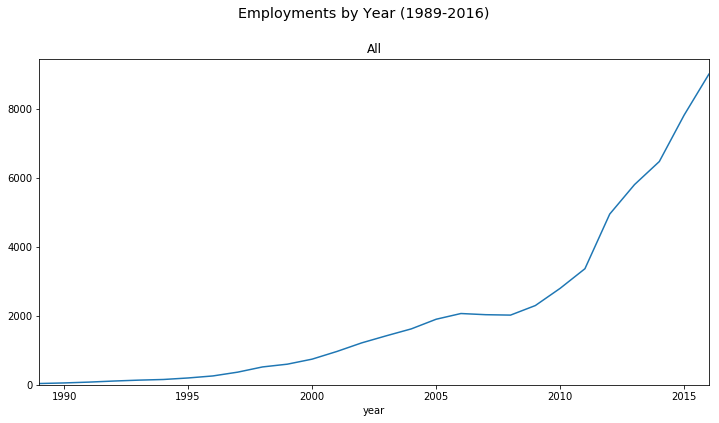

In [22]:
# count_by_years = pd.DataFrame({'count':empl_changes_df.groupby(['ticker','type','year']).size()}).reset_index()
# empl_by_years = count_by_years.groupby(['ticker','type']).apply(
#     lambda df:df.sort_values(['year']).assign(cumsum = lambda df2:df2['count'].cumsum()) # Calculate cumsum.
# ).reset_index(drop=True).pivot_table(
#     index=['ticker','year'],columns='type',values=['cumsum'],fill_value=0 # Reshape to wide format.
# ).assign(
#     employment=lambda df:(df['cumsum']['hiring']-df['cumsum']['firing']-df['cumsum']['leaving']) # Get employment.
# ).drop('cumsum',axis=1).reset_index()
# empl_by_years.columns = empl_by_years.columns.droplevel('type')

# Plot.
for (ticker, col), ax in zip(
    empl_by_years.pivot_table(
        index='year',columns='ticker',values='employment',fill_value=0
    ).loc[lambda df:(df.index>=1989)&(df.index<=2016)].iteritems(),
    iterator_for_axis(fig_func=lambda x:x.suptitle("Employments by Year (1989-2016)",fontsize="x-large",y=1))
):
    col.plot(ax=ax, title=ticker).set_ylim(bottom=0)

plt.show()

## Overall trends.
Note: Plots by year and plots by months do not only differ in frequency, but also in sample size. This is due to the entries without valid month record.

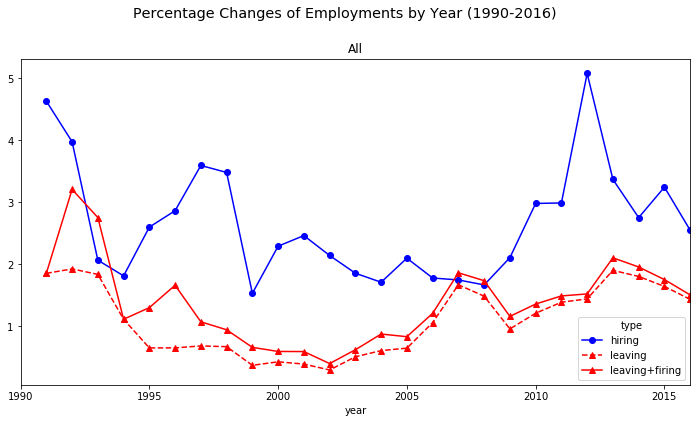

In [23]:
# Count and calculate percentages of employment changes.
prop_by_months = pd.DataFrame(
    {'count':empl_changes_df.groupby(['ticker','type','year','month']).size()} # Count by month.
).reset_index().merge(
    right=empl_by_years.assign(year_1L=lambda df:df.year+1)[['ticker','year_1L','employment']],
    left_on = ['ticker','year'], right_on = ['ticker','year_1L'] # Merge with last year's employment.
).assign(
    prop=lambda df:df['count']/df['employment']*100 # Calculate proportions.
).drop(
    ['count','year_1L','employment'],axis=1 # Drop unnecessary variables.
).loc[lambda df:(df.year>=1991)&(df.year<=2016)] # Keep only [1990, 2016] segment.

# prop_by_months.pivot_table(
#     index = ['ticker','year'], columns = 'type', values = 'prop', fill_value=0
# ).reset_index().assign(
#     **{"leaving+firing":lambda df:df.leaving+df.firing}
# ).drop("firing",axis=1).drop('ticker',axis=1).loc[lambda df:df.year>=xleft].set_index('year').plot(
#     xticks=[1990,1995,2000,2005,2010,2015], xlim=(xleft,2016), style=['b-o','r--^','r-^'],
#     title="Percentage Changes of Employments by Year (1990-2016)", figsize=(12,6)
# )


# Plot by year.
for (ticker, grp), ax, xleft in zip(
    prop_by_months.pivot_table(
        index = ['ticker','year'], columns = 'type', values = 'prop', fill_value=0
    ).reset_index().assign(
        **{"leaving+firing":lambda df:df.leaving+df.firing}
    ).drop("firing",axis=1).groupby('ticker'),
    iterator_for_axis(fig_func=lambda x:x.suptitle("Percentage Changes of Employments by Year (1990-2016)", fontsize="x-large", y=1)),
    xlefts
):
    grp.drop('ticker',axis=1).loc[lambda df:df.year>=xleft].set_index('year').plot(
        ax=ax, title=ticker, xticks=[1990,1995,2000,2005,2010,2015], xlim=(xleft,2016), style=['b-o','r--^','r-^']
    )
plt.show()

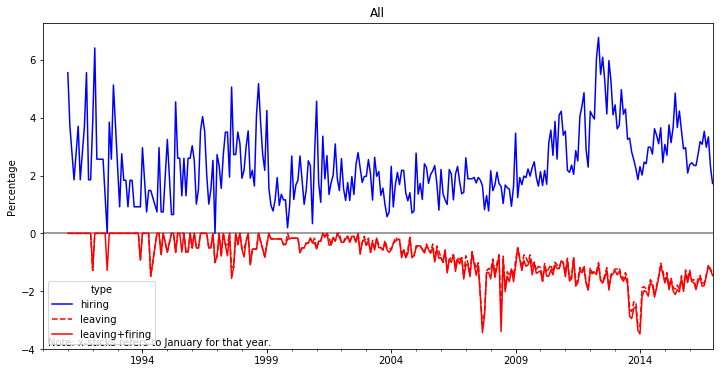

In [24]:
start_year=1990
end_year=2016
for (ticker, grp),ax,xleft in zip(
    prop_by_months.loc[lambda df:(df.month!=0)&(df.year>=start_year)&(df.year<=end_year)].pivot_table(
        index = ['ticker','year','month'], columns='type', values = 'prop', fill_value=0
    ).reset_index().assign(
        **{
            "leaving+firing":lambda df:-(df.leaving+df.firing),
            "leaving":lambda df:-df.leaving,
            "yrmth":lambda df:pd.PeriodIndex(year=df.year,month=df.month,freq='M')
        }
    ).set_index('yrmth').groupby('ticker'),
    iterator_for_axis(), xlefts
):
    grp.loc[lambda df:df.year>=xleft][['hiring','leaving','leaving+firing']].plot(
        ax=ax,title=ticker,style=['b-','r--','r-'],
        xlim=(pd.Period('{}-01'.format(xleft)),pd.Period('{}-12'.format(2016))),
        #xticks=[pd.Period('{}-01'.format(int(x*5+1990))) for x in range(5)]
    )
    ax.set_ylabel('Percentage')
    ax.set_xlabel('')
    ax.hlines(0,pd.Period('{}-01'.format(xleft)),pd.Period('{}-12'.format(2016)),colors='tab:gray')
    ax.annotate("Note: x-sticks refers to January for that year.",(5,3),xycoords="axes points")
plt.show()

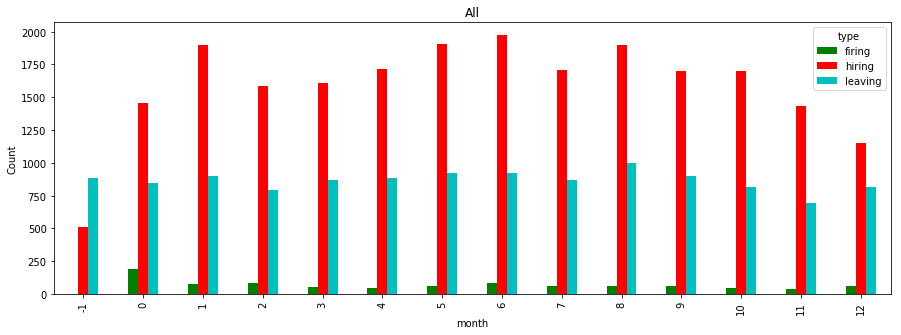

In [25]:
# Month composition.
display(HTML("<center><strong>Month Composition (-1: None, 0: Invalid month)</strong></center>"))
for idx, grp in empl_changes_df.groupby(['ticker']):
    grp.assign(count=1).pivot_table(
        index = 'month', columns = 'type', values='count', aggfunc='sum', fill_value=0
    ).plot.bar(figsize=(15,5),color=color_styles,title=idx).set_ylabel("Count")
    plt.show()

## By birth group.
Note: Birth year `2000` seems to be a trash bin for problematic records and thus will be treated the same as `None`.

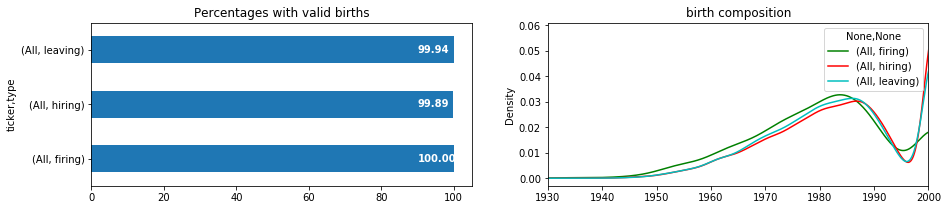

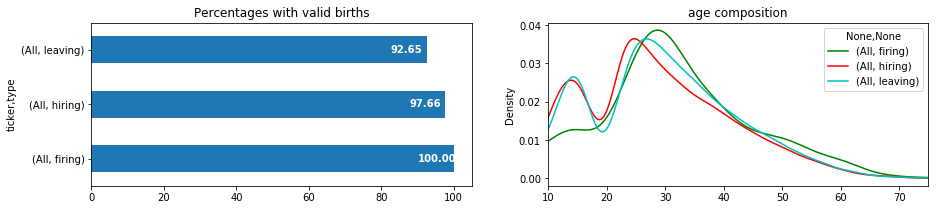

In [26]:
birth_df = empl_changes_df[['ticker','type','year','birth']]
birth_df = birth_df.assign(
    birth = lambda df:df.birth.apply(lambda x:int(x) if x not in ['2000','None'] else np.nan),
    age = lambda df:(df.year-df.birth)
)

# Define a routine to generate plots.
var, xlim = "birth", (1930,2000)
for ticker, grp in birth_df.groupby('ticker'):
    plt.subplots(1,2,figsize=(15,3))
    plt.subplot(121)
    to_plot = grp.groupby(['ticker','type']).apply(lambda df:(df.loc[~df[var].isnull()].size/df.size*100))
    ax = to_plot.plot.barh(title="Percentages with valid births")
    for idx, value in enumerate(to_plot):
        ax.text(value-10,idx-0.05,'{:.2f}'.format(value),color='white',fontweight='bold')
    plt.subplot(122)
    for (idx, group), color in zip(grp.loc[~grp[var].isnull()].groupby(['ticker','type']),color_styles):
        group[var].plot.kde(xlim=xlim,label=idx,title="{} composition".format(var),color=color,legend=True)
    plt.show()
var, xlim = "age", (10,75)
for ticker, grp in birth_df.groupby('ticker'):
    plt.subplots(1,2,figsize=(15,3))
    plt.subplot(121)
    to_plot = grp.groupby(['ticker','type']).apply(lambda df:(df.loc[~df[var].isnull()].size/df.size*100))
    ax = to_plot.plot.barh(title="Percentages with valid births")
    for idx, value in enumerate(to_plot):
        ax.text(value-10,idx-0.05,'{:.2f}'.format(value),color='white',fontweight='bold')
    plt.subplot(122)
    for (idx, group), color in zip(grp.loc[~grp[var].isnull()].groupby(['ticker','type']),color_styles):
        group[var].plot.kde(xlim=xlim,label=idx,title="{} composition".format(var),color=color,legend=True)
    plt.show()

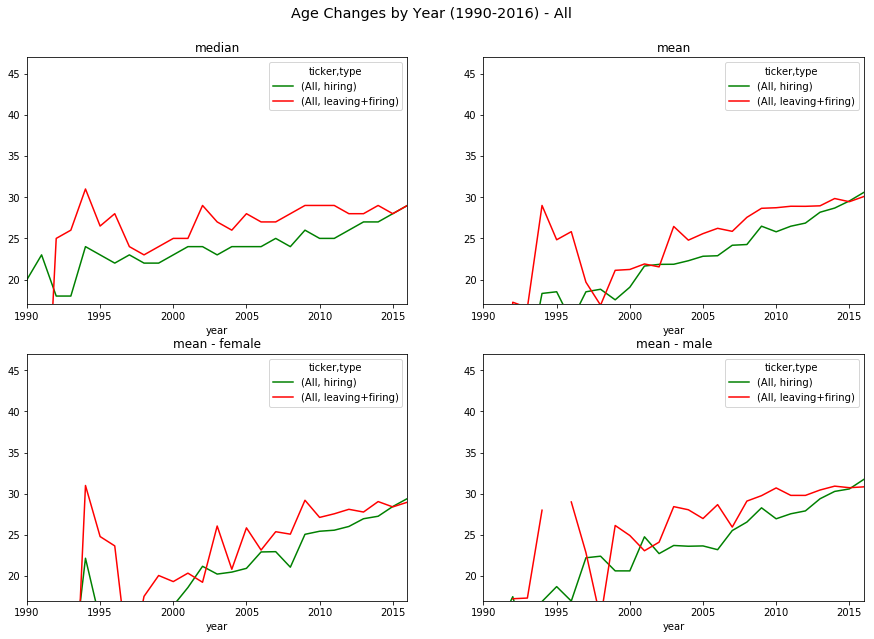

In [27]:
# Age changes by year.
for (ticker, grp), xleft in zip(
    birth_df.replace(
        to_replace={"type":{"firing":"leaving+firing","leaving":"leaving+firing"}}
    ).groupby('ticker'),
    xlefts
):
    fig, ((ax11, ax12), (ax21, ax22))=plt.subplots(2,2,figsize=(15,10))
    fig.suptitle('Age Changes by Year (1990-2016) - {}'.format(ticker),fontsize='x-large',y=0.95)
    grp.pivot_table(
        index='year',columns=['ticker','type'],values='age',aggfunc='median'
    ).plot(xlim=(xleft,2016),ylim=(17,47),color=color_styles,ax=ax11,title='median')
    grp.pivot_table(
        index='year',columns=['ticker','type'],values='age',aggfunc='mean'
    ).plot(xlim=(xleft,2016),ylim=(17,47),color=color_styles,ax=ax12,title='mean')
    grp.loc[empl_changes_df.gender=='1'].pivot_table(
        index='year',columns=['ticker','type'],values='age',aggfunc='mean'
    ).plot(xlim=(xleft,2016),ylim=(17,47),color=color_styles,ax=ax21,title='mean - female')
    grp.loc[empl_changes_df.gender=='2'].pivot_table(
        index='year',columns=['ticker','type'],values='age',aggfunc='mean'
    ).plot(xlim=(xleft,2016),ylim=(17,47),color=color_styles,ax=ax22,title='mean - male')
    plt.show()

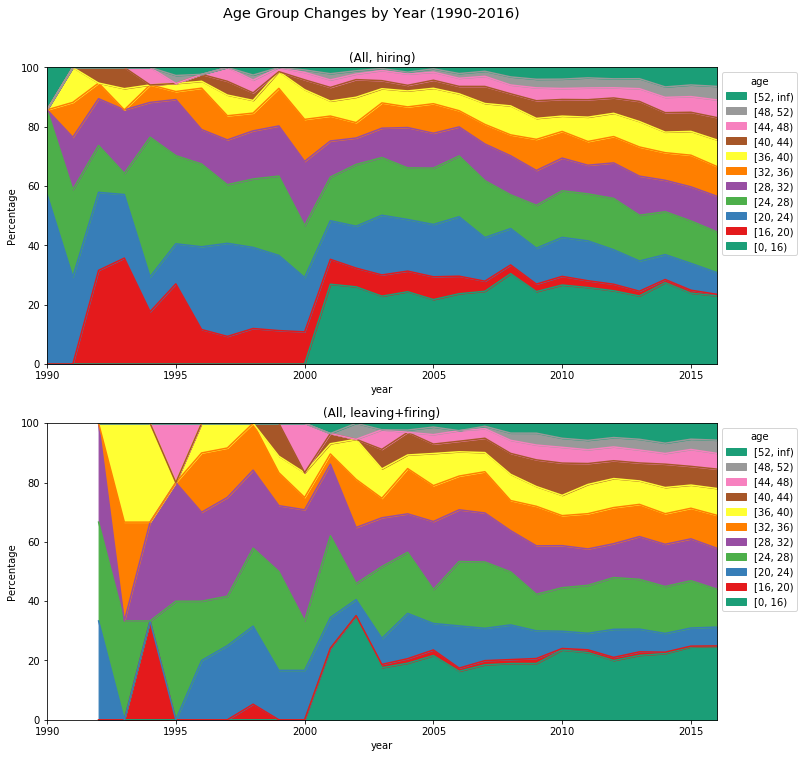

In [28]:
# Age group changes by year.
f_none_hidden = False # Whether to hide the ones out of [16, 52)
bins = list(np.arange(16,55,4))
colormap_unif = list(plt.get_cmap('Set1').colors+plt.get_cmap('Set2').colors+plt.get_cmap('Set3').colors)[:len(bins)-1]
if not f_none_hidden:
    bins = [0]+bins+[np.inf]
    colormap_unif = [plt.get_cmap('Dark2').colors[0]]+colormap_unif+[plt.get_cmap('Dark2').colors[0]]

# Plot composition changes by years.
for (idx, grp), ax, xleft in zip(
    birth_df.loc[
        lambda df:(df.year>=1990)&(df.year<=2016), ['ticker','type','year','age']
    ].replace(
        to_replace={"type":{"firing":"leaving+firing","leaving":"leaving+firing"}}
    ).groupby(['ticker','type']), iterator_for_axis(
        rep_time=2, fig_func=lambda x:x.suptitle("Age Group Changes by Year (1990-2016)", fontsize='x-large', y=0.95)
    ), [x for x in xlefts for _ in range(2)]
):
    to_plot = grp.assign(count=1).pivot_table(
        index='year', columns=pd.cut(grp.age, bins, right=False, labels=False), values='count', aggfunc='sum', fill_value=0
    ).apply(lambda x:x/sum(x)*100, axis=1)
    to_plot.plot(
        kind='area', ax=ax, ylim=(0,100), title=str(idx).replace("'",""),xlim=(xleft,2016),
        color=[colormap_unif[int(float(i))] for i in to_plot.columns],
        xticks=[1990,1995,2000,2005,2010,2015]
    )
    ax.set_ylabel("Percentage")
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(
        reversed(handles), ["[{}, {})".format(bins[int(float(x))], bins[int(float(x))+1]) for x in reversed(labels)], 
        loc='upper left',bbox_to_anchor=(1,1),title='age'
    )
plt.show()

## By Gender.

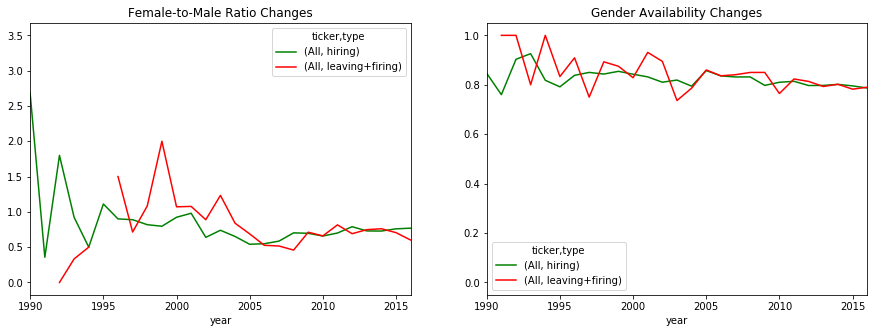

In [29]:
for (ticker, grp), xleft in zip(
    empl_changes_df.replace(
        to_replace={"type":{"firing":"leaving+firing","leaving":"leaving+firing"}}
    ).groupby('ticker'),
    xlefts
):
    fig, (ax1, ax2)=plt.subplots(1,2,figsize=(15,5))
    grp.pivot_table(
        index='year',columns=['ticker','type'],values='gender',
        aggfunc=lambda x:((x=='1').sum()/(x=='2').sum() if (x=='2').sum() else np.nan)
    ).plot(
        xlim=(xleft,2016),color=color_styles,title="Female-to-Male Ratio Changes",ax=ax1,
        xticks=[1990+5*x for x in range(6)]
    )
    grp.pivot_table(
        index='year',columns=['ticker','type'],values='gender',
        aggfunc=lambda x:((x!='0').sum()/x.size)
    ).plot(
        xlim=(xleft,2016),color=color_styles,title="Gender Availability Changes",ax=ax2,
        xticks=[1990+5*x for x in range(6)]
    )
    plt.show()

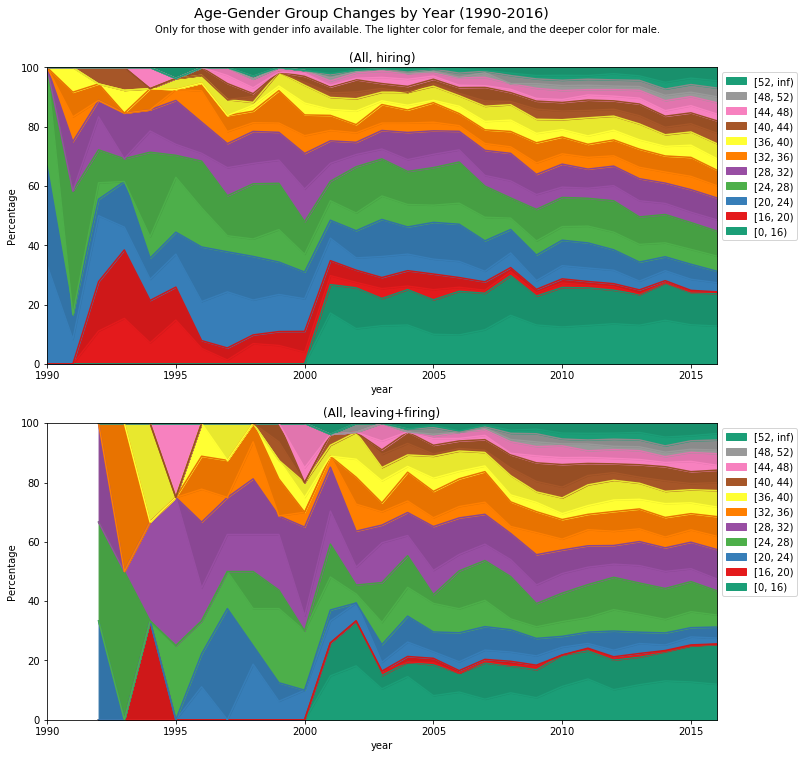

In [30]:
# Age group changes by year.
f_none_hidden = False # Whether to hide the ones out of [16, 52)
bins = list(np.arange(16,55,4))
colormap_unif = list(plt.get_cmap('Set1').colors+plt.get_cmap('Set2').colors+plt.get_cmap('Set3').colors)[:len(bins)-1]
if not f_none_hidden:
    bins = [0]+bins+[np.inf]
    colormap_unif = [plt.get_cmap('Dark2').colors[0]]+colormap_unif+[plt.get_cmap('Dark2').colors[0]]

# Plot composition changes by years.
def fig_func(fig):
    fig.suptitle("Age-Gender Group Changes by Year (1990-2016)", fontsize='x-large', y=0.95)
    fig.text(0.25,0.92,
          "Only for those with gender info available. The lighter color for female, and the deeper color for male.")
for (idx, grp), ax, xleft in zip(
    birth_df.loc[
        lambda df:(df.year>=1990)&(df.year<=2016)&(empl_changes_df.gender!='0'), ['ticker','type','year','age']
    ].replace(
        to_replace={"type":{"firing":"leaving+firing","leaving":"leaving+firing"}}
    ).groupby(['ticker','type']), iterator_for_axis(
        rep_time=2, fig_func=fig_func
    ), [x for x in xlefts for _ in range(2)]
):
    to_plot = grp.assign(count=1).pivot_table(
        index='year', columns=[pd.cut(grp.age, bins, right=False, labels=False), empl_changes_df.gender], 
        values='count', aggfunc='sum', fill_value=0
    ).apply(lambda x:x/sum(x)*100, axis=1)
    to_plot.plot(
        kind='area', ax=ax, ylim=(0,100), title=str(idx).replace("'",""), 
        xlim=(xleft,2016), xticks=[1990+5*x for x in range(6)],
        color=[
            colormap_unif[int(float(i))] if j=='1' else tuple(t/1.1 for t in colormap_unif[int(float(i))]) 
            for i,j in to_plot.columns
        ]
    )
    ax.set_ylabel("Percentage")
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(
        reversed([handles[i] for i in range(len(handles)) if i%2==0]), 
        reversed(["[{}, {})".format(bins[int(float(x))], bins[int(float(x))+1]) for x in
            [re.match(r"\((\d+)\.0",labels[i]).group(1) for i in range(len(labels)) if i%2==0]
        ]), 
        loc='upper left',bbox_to_anchor=(1,1)
    )
plt.show()

## By Primary Skill.

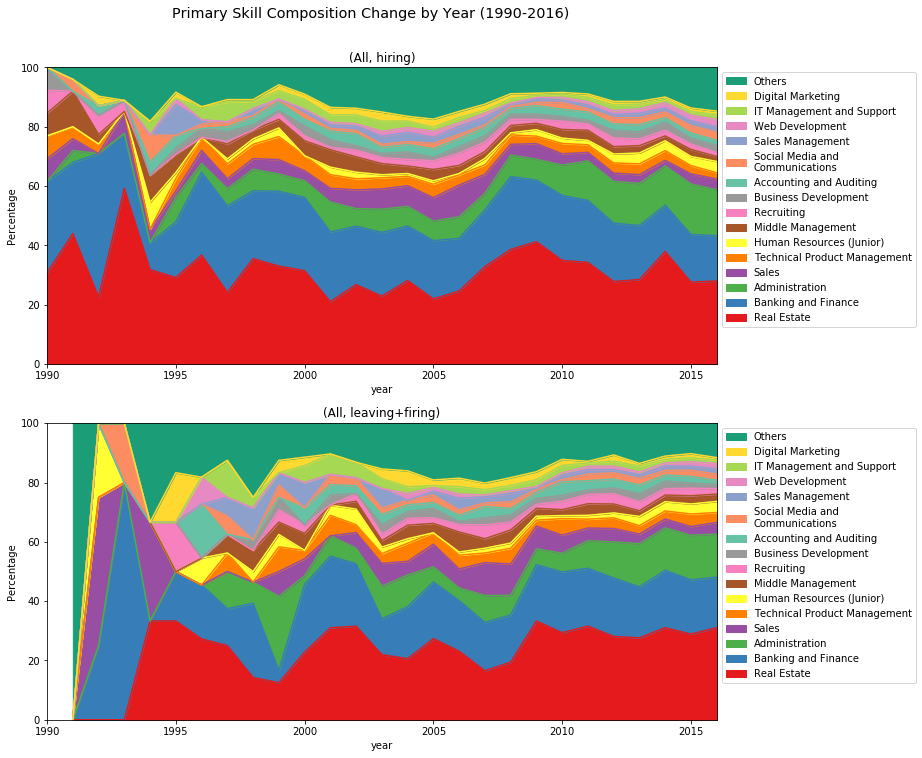

In [31]:
# Create a uniform colormap for all subplots.
skill1_ord_unif = empl_changes_df.groupby('skill1').size().sort_values(ascending=False).index.tolist()
colormap_unif = {idx:clr for idx, clr in zip(
    skill1_ord_unif,
    itertools.cycle(plt.get_cmap('Set1').colors+plt.get_cmap('Set2').colors+plt.get_cmap('Set3').colors)
)}
colormap_unif['Others'] = plt.get_cmap('Dark2').colors[0]

# Codes for showing pie charts:
# fig,axs=plt.subplots(3,2,figsize=(15,22.5))
# fig.suptitle("Secondary Skill Composition",fontsize='x-large')
# for (idx,col),ax in zip(
#     empl_changes_df.loc[:].pivot_table(
#         index='skill1',columns=['ticker','type'],values='gender',aggfunc='count'
#     ).iteritems(), itertools.chain.from_iterable(axs)
# ):
#     to_plot0 = col.sort_values(ascending=False)
#     to_plot = to_plot0.iloc[0:18]
#     to_plot.loc['Others']=to_plot0.sum()-to_plot.sum()  
#     ax=to_plot.plot.pie(
#         ax=ax,labeldistance=1.05,title=str(idx).replace("'",''),autopct='%.2f',pctdistance=0.9,
#         colors = [colormap_unif[idx] for idx in to_plot.index]
#     )
#     ax.set_ylabel('')
# plt.show()

## Continued ##
N_cats = 15 # Number of categories to be shown.

# Plot composition changes by years.
for (idx, grp), ax, xleft in zip(
    empl_changes_df.loc[
        lambda df:(df.year>=1990)&(df.year<=2016), ['ticker','type','year','skill1']
    ].replace(
        to_replace={"type":{"firing":"leaving+firing","leaving":"leaving+firing"}}
    ).groupby(['ticker','type']), iterator_for_axis(
        rep_time=2, fig_func=lambda x:x.suptitle("Primary Skill Composition Change by Year (1990-2016)", fontsize='x-large', y=0.95)
    ), [x for x in xlefts for _ in range(2)]
):
    to_plot = grp.assign(
        skill1_id = lambda df:[
            {val:(idx if idx<N_cats else N_cats) for idx, val in enumerate(skill1_ord_unif)}[x] for x in df.skill1
        ], count = 1
    ).pivot_table(
        index='year', columns='skill1_id', values='count', aggfunc='sum', fill_value=0 
    ).apply(lambda x:x/sum(x)*100, axis=1)
    to_plot.columns = [skill1_ord_unif[i] if i<N_cats else "Others" for i in to_plot.columns]
    to_plot.plot(
        kind='area', ax=ax, color=[colormap_unif[idx] for idx in to_plot.columns],
        ylim=(0,100), title=str(idx).replace("'",""), 
        xlim=(xleft,2016), xticks=[1990,1995,2000,2005,2010,2015]
    )
    ax.set_ylabel("Percentage")
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(
        reversed(handles), reversed(['\n'.join(wrap(x,30)) for x in labels]), 
        loc='upper left',bbox_to_anchor=(1,1)
    )
plt.show()

In [32]:
edu_lablst = {
    0:"None/Unknown", 1:"High school", 2:"Vocational degree", 3:"Associates", 
    4:"Bachelors", 5:"Masters excl. MBA", 6:"MBA", 7:"Doctorate (PhD/JD/MD)"
}

# Find representative profiles.
for i in range(5):
    display(HTML("<strong>"+skill1_ord_unif[i]+"</strong>"))
    to_plot = empl_changes_df.assign(edu=lambda df:df.edu.apply(lambda x:edu_lablst[int(x)])).loc[
        lambda df:(df.skill1==skill1_ord_unif[i]),
        ["job_role","depmt","edu","f_elite"]
    ]
    N = to_plot.shape[0]
    # Job role.
    varname = "job_role"
    top10_job_role = pd.DataFrame([v
        for w in to_plot.groupby(varname).size().reset_index().apply(
        lambda x:[[x[varname].split(',')[0].title(),x[0]]]
        #lambda x:[[y.title(),z] for y in x[varname].split(',') for z in [x[0]/(x[varname].count(',')+1)]]
        ,axis=1) for v in w
    ],columns=[varname,"count"]).groupby(varname).sum().reset_index().sort_values(
        "count",ascending=False
    ).head(10).assign(
        prop=lambda df:(df["count"]/N*100).apply(round,ndigits=2)
    ).reset_index(drop=True)#.drop("count",axis=1)
    # Department.
    varname = "depmt"
    to_plot_depmt = to_plot.loc[lambda df:df[varname]!='']
    N_depmt = to_plot_depmt.shape[0]
    top10_depmt = pd.DataFrame([v
        for w in to_plot_depmt.groupby(varname).size().reset_index().apply(
        lambda x:[[y.title(),z] for y in x[varname].split(',') for z in [x[0]/(x[varname].count(',')+1)]]
        ,axis=1) for v in w
    ],columns=[varname,"count"]).replace(
        {varname:{"Tehnology":"Technology"}}
    ).groupby(varname).sum().reset_index().sort_values(
        "count",ascending=False
    ).head(10).assign(
        prop=lambda df:(df["count"]/N_depmt*100).apply(round,ndigits=2)
    ).reset_index(drop=True).drop("count",axis=1)
    # Education.
    top10_edu = to_plot.groupby("edu").size().sort_values(ascending=False).apply(
        lambda x:round(x/N*100,2)).rename("prop").reset_index()
    # show.
    display(HTML("<em>Top 10 entries for each variables with proportions:</em>"))
    display(pd.concat([top10_job_role,top10_depmt,top10_edu], axis=1))
    # Some examples.
    to_plot = to_plot.sample(30)
    display(HTML("<em>Some examples:</em>"))
    display(to_plot)
    

,job_role,count,prop,depmt,prop,edu,prop
0,Mortgage Loan Officer,423,3.91,Accounting,78.56,None/Unknown,43.59
1,Loan Officer,415,3.84,Marketing,10.24,Bachelors,42.47
2,Senior Loan Officer,390,3.60,Operations,3.21,Associates,5.51
3,Account Executive,378,3.49,Production,2.56,High school,3.78
4,Branch Manager,370,3.42,Oversight,2.08,MBA,1.73
5,Mortgage Banker,316,2.92,Business,2.04,Masters excl. MBA,1.71
6,Loan Consultant,313,2.89,Hr,0.80,Vocational degree,0.79
7,Mortgage Loan Originator,253,2.34,Technology,0.25,Doctorate (PhD/JD/MD),0.43
8,Sales Manager,222,2.05,Legal,0.15,NaN,NaN
9,Mortgage Advisor,165,1.52,Management,0.11,NaN,NaN


,job_role,depmt,edu,f_elite
26781,"Mortgage Loan Officer,loan officer",ACCOUNTING,Bachelors,False
20184,"Area Sales Manager,area sales manager",MARKETING,None/Unknown,False
19494,"Loan Consultant | NMLS #514828,consultant",ACCOUNTING,None/Unknown,False
14262,"Licensed Lending Officer (NMLS# 1407395),officer",,None/Unknown,False
7073,"Branch Manager,branch manager",,Bachelors,False
5569,"Portfolio Underwriter,underwriter",,None/Unknown,False
21164,"Senior Mortgage Consultant,senior,consultant",ACCOUNTING,Bachelors,False
3749,"Sr Mortgage Loan Officer,loan officer,senior",ACCOUNTING,Bachelors,False
34009,"Loan Coordinator,coordinator",ACCOUNTING,None/Unknown,False
28680,"Loan Officer,loan officer",ACCOUNTING,Bachelors,False


,job_role,count,prop,depmt,prop,edu,prop
0,Mortgage Banker,212,3.41,Accounting,65.00,Bachelors,45.93
1,Mortgage Loan Officer,117,1.88,Marketing,9.58,None/Unknown,35.89
2,Underwriter,117,1.88,Oversight,7.02,Associates,5.43
3,Branch Manager,111,1.78,Operations,5.92,MBA,5.33
4,Loan Processor,105,1.69,Business,4.45,High school,2.91
5,Account Executive,104,1.67,Production,3.37,Masters excl. MBA,2.83
6,Loan Officer,101,1.62,Technology,1.81,Doctorate (PhD/JD/MD),1.09
7,Mortgage Loan Processor,92,1.48,Hr,1.62,Vocational degree,0.59
8,Mortgage Underwriter,70,1.12,Legal,0.79,NaN,NaN
9,Mortgage Loan Originator,67,1.08,Management,0.42,NaN,NaN


,job_role,depmt,edu,f_elite
14694,"Mortgage Consultant,consultant",ACCOUNTING,Bachelors,False
31073,"Executive Vice President,vice president,executive",,MBA,False
5607,"QC Auditor,quality control,auditor",PRODUCTION,None/Unknown,False
17615,"Home Mortgage Consultant,home,consultant",ACCOUNTING,None/Unknown,False
19982,"Mortgage Underwriter,underwriter",ACCOUNTING,None/Unknown,False
6283,"Portfolio Investment Professional,professional",ACCOUNTING,MBA,False
33774,"Sr. Loan Processor,loan processor,senior",ACCOUNTING,None/Unknown,False
12246,"Mortgage Professional,professional",ACCOUNTING,Bachelors,False
638,"Mortgage Sales Consultant,sales consultant","ACCOUNTING,MARKETING",Associates,False
11059,"Post Closing Underwriter III,underwriter,3",,Bachelors,False


,job_role,count,prop,depmt,prop,edu,prop
0,Mortgage Banker,404,8.91,Accounting,63.76,Bachelors,60.15
1,Mortgage Loan Officer,88,1.94,Marketing,14.19,None/Unknown,18.73
2,Mortgage Loan Originator,76,1.68,Operations,6.79,Associates,7.39
3,Associate Banker,71,1.57,Hr,3.70,Masters excl. MBA,5.58
4,Vendor Analyst,63,1.39,Production,3.66,High school,4.32
5,Administrative Assistant,58,1.28,Business,2.29,MBA,2.36
6,Power Banker,54,1.19,Oversight,2.03,Vocational degree,1.01
7,Production Assistant,53,1.17,Technology,1.92,Doctorate (PhD/JD/MD),0.46
8,Client Care Specialist,53,1.17,Legal,1.09,NaN,NaN
9,Loan Processor,52,1.15,Management,0.57,NaN,NaN


,job_role,depmt,edu,f_elite
20463,"Senior Government Mortgage Underwriter,senior,government,underwriter",ACCOUNTING,None/Unknown,False
33648,"Mortgage Banker,banker",ACCOUNTING,Bachelors,False
32538,"Mortgage Banker,banker",ACCOUNTING,Bachelors,False
13856,"Foreclosure Specialist,specialist",,Bachelors,False
225,"Associate Vice President for Corporate Strategy & Development,vice president,associate,development","MANAGEMENT,BUSINESS",Bachelors,False
30956,"Web Banker,web,banker",TECHNOLOGY,MBA,False
1626,"Loss Mitigation Specialist,specialist",,Bachelors,False
5191,"Call Center Representative,call center,representative",,High school,False
24460,Loan Setup,ACCOUNTING,Bachelors,False
29036,"Senior Mortgage Banker,senior,banker",ACCOUNTING,Bachelors,False


,job_role,count,prop,depmt,prop,edu,prop
0,Mortgage Banker,186,13.29,Accounting,73.41,Bachelors,55.64
1,Account Executive,105,7.50,Marketing,14.25,None/Unknown,26.14
2,Mortgage Loan Officer,58,4.14,Operations,3.62,Associates,7.50
3,Loan Officer,58,4.14,Business,2.14,High school,4.50
4,Branch Manager,32,2.29,Oversight,2.07,Masters excl. MBA,2.93
5,Senior Mortgage Banker,30,2.14,Production,1.72,MBA,2.57
6,Mortgage Loan Originator,30,2.14,Hr,1.67,Vocational degree,0.64
7,Senior Loan Officer,27,1.93,Technology,1.11,Doctorate (PhD/JD/MD),0.07
8,Executive Mortgage Banker,27,1.93,NaN,NaN,NaN,NaN
9,Sales Manager,20,1.43,NaN,NaN,NaN,NaN


,job_role,depmt,edu,f_elite
2782,"Licensed Lending Officer,officer",,Bachelors,False
10088,"Senior Mortgage Banker,senior,banker",ACCOUNTING,None/Unknown,False
27824,"Assistant Sales Manager,sales manager,assistant",MARKETING,Bachelors,False
22330,"Sr. Account Executive,account executive,senior",,Bachelors,False
2843,"Founders Club Mortgage Banker,banker",ACCOUNTING,Bachelors,False
13972,"Associate Banker,associate,banker",,Bachelors,False
11033,"Mortgage Banker,banker",ACCOUNTING,None/Unknown,False
24929,"Senior Client Advocate,senior,client,advocate",,Bachelors,False
26838,"Mortgage Processor,processor",ACCOUNTING,MBA,False
19528,"Mortgage Loan Officer,loan officer",ACCOUNTING,None/Unknown,False


,job_role,count,prop,depmt,prop,edu,prop
0,Business Analyst,50,4.76,Technology,34.72,Bachelors,49.00
1,Senior Business Analyst,29,2.76,Accounting,19.60,None/Unknown,24.74
2,Project Manager,26,2.47,Business,17.33,Masters excl. MBA,13.61
3,Software Engineer,15,1.43,Operations,9.25,MBA,6.95
4,Business Systems Analyst,11,1.05,Production,5.20,Associates,3.14
5,Systems Analyst,10,0.95,Marketing,4.62,High school,1.14
6,Business Operations Analyst,9,0.86,Oversight,4.15,Doctorate (PhD/JD/MD),1.05
7,Data Analyst,9,0.86,Hr,3.40,Vocational degree,0.38
8,Senior Project Manager,9,0.86,Legal,1.33,NaN,NaN
9,It Project Manager,8,0.76,Management,0.40,NaN,NaN


,job_role,depmt,edu,f_elite
17345,"Project Coordinator/Business Analyst,project,analyst",,Masters excl. MBA,False
33099,"Business Analyst,business analyst",,None/Unknown,False
23988,"Project Manager,project manager",,Bachelors,False
32408,"Credit and Reporting Analyst,analyst",ACCOUNTING,Masters excl. MBA,False
3692,"Foreclosure Manager,manager",,None/Unknown,False
6588,"Vice President - Originations Technology,vice president",TECHNOLOGY,None/Unknown,False
33732,"Systems Analyst III / Scrum Master / Team Lead,systems analyst,team lead,3,master",TECHNOLOGY,Bachelors,False
5514,"Sr IT Business Analyst,business analyst,senior,it",TECHNOLOGY,None/Unknown,False
31119,"Senior Technical Writer,technical writer,senior",,Bachelors,False
30767,"Agile Coach,coach",,Masters excl. MBA,False


## By Secondary Skill.
Only for those with their primary skill of "Banking and Finance".

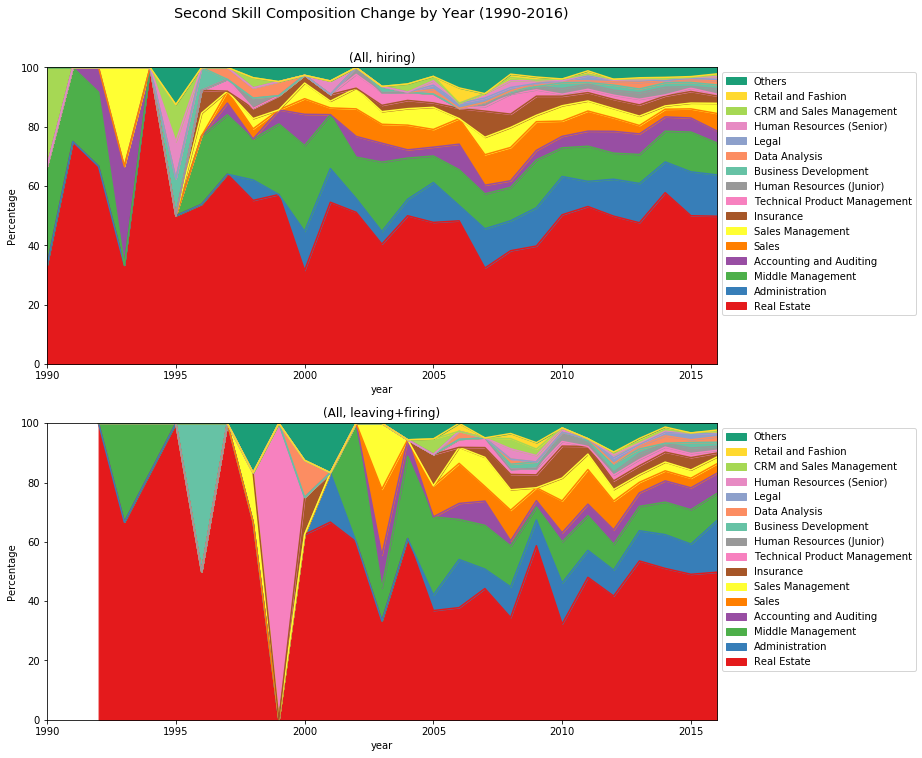

In [33]:
skill2_to_plot = empl_changes_df.loc[lambda df:(df.skill2!='')&(df.skill1=="Banking and Finance")]

# Create a uniform colormap for all subplots.
skill2_ord_unif = skill2_to_plot.groupby('skill2').size().sort_values(ascending=False).index.tolist()
colormap_unif = {idx:clr for idx, clr in zip(
    skill2_ord_unif,
    itertools.cycle(plt.get_cmap('Set1').colors+plt.get_cmap('Set2').colors+plt.get_cmap('Set3').colors)
)}
colormap_unif['Others'] = plt.get_cmap('Dark2').colors[0]

# Codes for showing pie charts:
# fig,axs=plt.subplots(3,2,figsize=(15,22.5))
# fig.suptitle("Secondary Skill Composition",fontsize='x-large')
# for (idx,col),ax in zip(
#     skill2_to_plot.loc[:].pivot_table(
#         index='skill2',columns=['ticker','type'],values='gender',aggfunc='count'
#     ).iteritems(), itertools.chain.from_iterable(axs)
# ):
#     to_plot0 = col.sort_values(ascending=False)
#     to_plot = to_plot0.iloc[0:18]
#     to_plot.loc['Others']=to_plot0.sum()-to_plot.sum()  
#     ax=to_plot.plot.pie(
#         ax=ax,labeldistance=1.05,title=str(idx).replace("'",''),autopct='%.2f',pctdistance=0.9,
#         colors = [colormap_unif[idx] for idx in to_plot.index]
#     )
#     ax.set_ylabel('')
# plt.show()

## Continued ##
N_cats = 15 # Number of categories to be shown.

# Plot composition changes by years.
for (idx, grp), ax, xleft in zip(
    skill2_to_plot.loc[lambda df:df.skill2!=''].loc[
        lambda df:(df.year>=1990)&(df.year<=2016), ['ticker','type','year','skill2']
    ].replace(
        to_replace={"type":{"firing":"leaving+firing","leaving":"leaving+firing"}}
    ).groupby(['ticker','type']), iterator_for_axis(
        rep_time=2, fig_func=lambda x:x.suptitle("Second Skill Composition Change by Year (1990-2016)", fontsize='x-large', y=0.95)
    ), [x for x in xlefts for _ in range(2)]
):
    to_plot = grp.assign(
        skill2_id = lambda df:[
            {val:(idx if idx<N_cats else N_cats) for idx, val in enumerate(skill2_ord_unif)}[x] for x in df.skill2
        ], count = 1
    ).pivot_table(
        index='year', columns='skill2_id', values='count', aggfunc='sum', fill_value=0 
    ).apply(lambda x:x/sum(x)*100, axis=1)
    to_plot.columns = [skill2_ord_unif[i] if i<N_cats else "Others" for i in to_plot.columns]
    to_plot.plot(
        kind='area', ax=ax, color=[colormap_unif[idx] for idx in to_plot.columns],
        ylim=(0,100), title=str(idx).replace("'",""), 
        xlim=(xleft,2016), xticks=[1990,1995,2000,2005,2010,2015]
    )
    ax.set_ylabel("Percentage")
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(
        reversed(handles), reversed(['\n'.join(wrap(x,30)) for x in labels]), 
        loc='upper left',bbox_to_anchor=(1,1)
    )
plt.show()

In [34]:
edu_lablst = {
    0:"None/Unknown", 1:"High school", 2:"Vocational degree", 3:"Associates", 
    4:"Bachelors", 5:"Masters excl. MBA", 6:"MBA", 7:"Doctorate (PhD/JD/MD)"
}

# Find representative profiles.
for i in range(5):
    display(HTML("<strong>"+skill2_ord_unif[i]+"</strong>"))
    to_plot = skill2_to_plot.assign(edu=lambda df:df.edu.apply(lambda x:edu_lablst[int(x)])).loc[
        lambda df:(df.skill2==skill2_ord_unif[i]),
        ["job_role","depmt","edu","f_elite"]
    ]
    N = to_plot.shape[0]
    # Job role.
    varname = "job_role"
    top10_job_role = pd.DataFrame([v
        for w in to_plot.groupby(varname).size().reset_index().apply(
        lambda x:[[x[varname].split(',')[0].title(),x[0]]]
        #lambda x:[[y.title(),z] for y in x[varname].split(',') for z in [x[0]/(x[varname].count(',')+1)]]
        ,axis=1) for v in w
    ],columns=[varname,"count"]).groupby(varname).sum().reset_index().sort_values(
        "count",ascending=False
    ).head(10).assign(
        prop=lambda df:(df["count"]/N*100).apply(round,ndigits=2)
    ).reset_index(drop=True)#.drop("count",axis=1)
    # Department.
    varname = "depmt"
    to_plot_depmt = to_plot.loc[lambda df:df[varname]!='']
    N_depmt = to_plot_depmt.shape[0]
    top10_depmt = pd.DataFrame([v
        for w in to_plot_depmt.groupby(varname).size().reset_index().apply(
        lambda x:[[y.title(),z] for y in x[varname].split(',') for z in [x[0]/(x[varname].count(',')+1)]]
        ,axis=1) for v in w
    ],columns=[varname,"count"]).groupby(varname).sum().reset_index().sort_values(
        "count",ascending=False
    ).head(10).assign(
        prop=lambda df:(df["count"]/N_depmt*100).apply(round,ndigits=2)
    ).reset_index(drop=True).drop("count",axis=1)
    # Education.
    top10_edu = to_plot.groupby("edu").size().sort_values(ascending=False).apply(
        lambda x:round(x/N*100,2)).rename("prop").reset_index()
    # show.
    display(HTML("<em>Top 10 entries for each variables with proportions:</em>"))
    display(pd.concat([top10_job_role,top10_depmt,top10_edu], axis=1))
    # Some examples.
    to_plot = to_plot.sample(30).assign(
        job_role=lambda df:df.job_role.apply(lambda x:x.split(",")[0])
    )
    display(HTML("<em>Some examples:</em>"))
    display(to_plot)
    

,job_role,count,prop,depmt,prop,edu,prop
0,Underwriter,67,2.71,Accounting,68.33,Bachelors,46.83
1,Mortgage Loan Processor,66,2.67,Marketing,9.76,None/Unknown,40.07
2,Mortgage Banker,61,2.47,Operations,6.26,Associates,4.41
3,Mortgage Loan Officer,57,2.30,Oversight,5.37,High school,3.44
4,Account Executive,51,2.06,Production,3.70,MBA,2.10
5,Loan Officer,50,2.02,Business,3.28,Masters excl. MBA,1.66
6,Loan Processor,44,1.78,Hr,1.01,Doctorate (PhD/JD/MD),0.77
7,Loan Consultant,43,1.74,Legal,0.95,Vocational degree,0.73
8,Mortgage Underwriter,40,1.62,Technology,0.91,NaN,NaN
9,Branch Manager,36,1.46,Management,0.43,NaN,NaN


,job_role,depmt,edu,f_elite
7723,AVP Risk,OVERSIGHT,Bachelors,False
10798,Loan Officer,ACCOUNTING,Bachelors,False
14905,Mortgage Loan Officer,ACCOUNTING,None/Unknown,False
11959,Account Executive,,Bachelors,False
16543,Branch Manager,,Bachelors,False
14864,Setup Compliance/Closing Coordinator Specialist,,None/Unknown,False
8432,Underwriter II Processor Post-Closer/Loan Defect Resolutions,,None/Unknown,False
29405,Home Loan Specialist,ACCOUNTING,None/Unknown,False
859,Mortgage Banker,ACCOUNTING,None/Unknown,False
24066,Mortgage Advisor,ACCOUNTING,None/Unknown,False


,job_role,count,prop,depmt,prop,edu,prop
0,Mortgage Banker,40,6.97,Accounting,73.19,Bachelors,51.39
1,Loan Processor,13,2.26,Marketing,9.41,None/Unknown,32.40
2,Underwriter,13,2.26,Oversight,4.36,Associates,8.19
3,Account Executive,12,2.09,Operations,3.90,High school,2.96
4,Senior Mortgage Banker,11,1.92,Business,2.57,MBA,2.61
5,Loan Counselor,7,1.22,Production,2.57,Masters excl. MBA,1.39
6,Customer Service Representative,7,1.22,Hr,1.93,Vocational degree,0.87
7,Business Analyst,7,1.22,Technology,1.24,Doctorate (PhD/JD/MD),0.17
8,Mortgage Loan Processor,6,1.05,Legal,0.83,NaN,NaN
9,Closing Coordinator,5,0.87,NaN,NaN,NaN,NaN


,job_role,depmt,edu,f_elite
31353,Jr Mortgage Banker,ACCOUNTING,None/Unknown,False
16603,Investor Reporting Analyst,ACCOUNTING,Bachelors,False
15139,Director of Mortgage Banking,"ACCOUNTING,OVERSIGHT",Bachelors,False
29175,Loan Officer,ACCOUNTING,Associates,False
25100,Production Assistant | NMLS # : 1425349,PRODUCTION,Associates,False
8271,Underwriter,,None/Unknown,False
32261,Loan Counselor,ACCOUNTING,None/Unknown,False
32114,Retired,,Bachelors,False
6248,Senior Mortgage Banker,ACCOUNTING,Bachelors,False
29754,Quality Assurance Quality Control Analyst,PRODUCTION,Bachelors,False


,job_role,count,prop,depmt,prop,edu,prop
0,Supervisor,9,1.59,Accounting,37.79,Bachelors,45.31
1,Senior Vice President,9,1.59,Operations,17.82,None/Unknown,30.44
2,Manager,8,1.42,Marketing,12.54,MBA,8.32
3,Operations Manager,7,1.24,Oversight,11.44,Associates,6.19
4,Mortgage Professional,7,1.24,Production,5.01,Masters excl. MBA,5.49
5,Business Analyst,7,1.24,Business,4.73,High school,2.12
6,Assistant Vice President,5,0.88,Technology,4.62,Doctorate (PhD/JD/MD),1.59
7,Production Assistant,5,0.88,Hr,3.91,Vocational degree,0.53
8,Underwriter,5,0.88,Management,1.16,NaN,NaN
9,Avp,5,0.88,Legal,0.66,NaN,NaN


,job_role,depmt,edu,f_elite
9477,Business Analyst,,MBA,False
34636,Loan Reconciliation Analyst II,ACCOUNTING,None/Unknown,False
411,VP of Business Development,BUSINESS,Bachelors,False
3700,National Underwriting Manager,,Bachelors,True
28401,Sr. Program Manager,,Bachelors,False
32396,Business Operations Analyst,"OPERATIONS,BUSINESS",None/Unknown,False
24777,Mortgage Planner,ACCOUNTING,None/Unknown,False
31223,Operations Supervisor - Morgan Stanley Home Loans,OPERATIONS,Bachelors,False
8478,Assistant Underwriter,,Bachelors,False
12702,Customer Service,MARKETING,Bachelors,False


,job_role,count,prop,depmt,prop,edu,prop
0,Mortgage Banker,9,3.42,Accounting,71.11,Bachelors,41.44
1,Mortgage Underwriter,6,2.28,Oversight,13.68,None/Unknown,26.62
2,Senior Financial Analyst,6,2.28,Business,4.62,MBA,18.63
3,Vice President,4,1.52,Hr,2.72,Masters excl. MBA,9.89
4,Bankruptcy Specialist,4,1.52,Marketing,2.54,Associates,2.28
5,Underwriter Ii,4,1.52,Operations,2.36,Doctorate (PhD/JD/MD),0.76
6,Financial Analyst,4,1.52,Technology,1.63,Vocational degree,0.38
7,Vice President Of Finance,4,1.52,Production,1.36,NaN,NaN
8,De Underwriter,4,1.52,NaN,NaN,NaN,NaN
9,Senior Investor Reporting Analyst,4,1.52,NaN,NaN,NaN,NaN


,job_role,depmt,edu,f_elite
560,Credit Analyst-Underwriter,ACCOUNTING,None/Unknown,False
119,Vice President,,Bachelors,False
21768,Tax Payment Processorr,ACCOUNTING,Bachelors,False
18530,Accountant,,None/Unknown,False
23852,Bankruptcy Specialist,,Masters excl. MBA,False
33655,Sr. Analyst,,None/Unknown,False
26160,Manager Loan Accounting and Supervisor Accounting,ACCOUNTING,Bachelors,False
25467,Financial Analyst,ACCOUNTING,None/Unknown,False
20809,Senior Financial Analyst,ACCOUNTING,Bachelors,False
31235,Chief Financial Officer,"ACCOUNTING,OVERSIGHT",Doctorate (PhD/JD/MD),False


,job_role,count,prop,depmt,prop,edu,prop
0,Mortgage Banker,21,8.50,Accounting,65.78,Bachelors,53.04
1,Account Executive,13,5.26,Marketing,18.87,None/Unknown,28.74
2,Branch Manager,13,5.26,Operations,3.86,Associates,7.69
3,Loan Officer,8,3.24,Oversight,2.98,MBA,5.26
4,Loan Processor,7,2.83,Hr,2.87,High school,4.05
5,Mortgage Loan Officer,7,2.83,Business,2.65,Masters excl. MBA,1.21
6,Senior Mortgage Banker,6,2.43,Production,2.32,NaN,NaN
7,Mortgage Loan Originator,6,2.43,Technology,0.66,NaN,NaN
8,Personal Banker,4,1.62,NaN,NaN,NaN,NaN
9,Sales Manager,4,1.62,NaN,NaN,NaN,NaN


,job_role,depmt,edu,f_elite
25010,Assistant Branch Manager,,Bachelors,False
23473,Mortgage Loan Originator NMLS# 244407,ACCOUNTING,Bachelors,False
4212,AVP Sales Manager - Broker Direct,MARKETING,Bachelors,False
35258,Loan Officer NMLS#1257333,ACCOUNTING,Bachelors,False
1359,Regional Vice President,,Bachelors,False
10136,Loan Processor,ACCOUNTING,None/Unknown,False
25799,Branch Manager,,Bachelors,False
20413,Default Loan Servicing Manager,ACCOUNTING,Associates,False
11900,Team Sales Manager/Equal Housing Lender,MARKETING,Bachelors,False
34973,Assistant Manager,,Associates,False


## By Country.

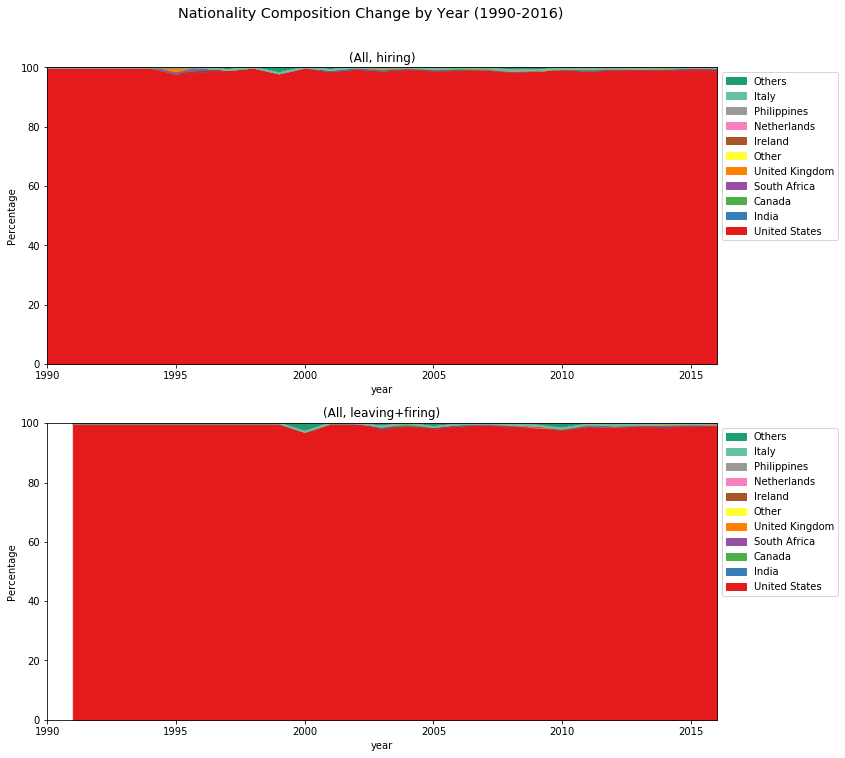

In [35]:
# Create a uniform colormap for all subplots.
cntry_ord_unif = empl_changes_df.groupby('cntry').size().sort_values(ascending=False).index.tolist()
colormap_unif = {idx:clr for idx, clr in zip(
    cntry_ord_unif,
    itertools.cycle(plt.get_cmap('Set1').colors+plt.get_cmap('Set2').colors+plt.get_cmap('Set3').colors)
)}
colormap_unif['Others'] = plt.get_cmap('Dark2').colors[0]

# Codes for showing pie charts:
# fig,axs=plt.subplots(3,2,figsize=(15,22.5))
# for (idx,col),ax in zip(empl_changes_df.loc[:].pivot_table(
#     index='cntry',columns=['ticker','type'],values='gender',aggfunc='count'
# ).iteritems(),itertools.chain.from_iterable(axs)):
#     to_plot0 = col.sort_values(ascending=False)
#     to_plot = to_plot0.iloc[0:28]
#     to_plot.loc['Others']=to_plot0.sum()-to_plot.sum()  
#     to_plot.plot.pie(
#         ax=ax,labeldistance=1.05,title=str(idx).replace("'",''),autopct='%.2f',pctdistance=0.9,rotatelabels=True,
#         color = [colormap_unif[idx] for idx in to_plot.index]
#     )
#     ax.set_ylabel('')
# plt.show()


## Continued ##
N_cats = 10 # Number of categories to be shown.

# Plot composition changes by years.
for (idx, grp), ax, xleft in zip(
    empl_changes_df.loc[
        lambda df:(df.year>=1990)&(df.year<=2016), ['ticker','type','year','cntry']
    ].replace(
        to_replace={"type":{"firing":"leaving+firing","leaving":"leaving+firing"}}
    ).groupby(['ticker','type']), iterator_for_axis(
        rep_time=2, fig_func=lambda x:x.suptitle("Nationality Composition Change by Year (1990-2016)", fontsize='x-large', y=0.95)
    ), [x for x in xlefts for _ in range(2)]
):
    to_plot = grp.assign(
        cntry_id = lambda df:[
            {val:(idx if idx<N_cats else N_cats) for idx, val in enumerate(cntry_ord_unif)}[x] for x in df.cntry
        ], count = 1
    ).pivot_table(
        index='year', columns='cntry_id', values='count', aggfunc='sum', fill_value=0 
    ).apply(lambda x:x/sum(x)*100, axis=1)
    to_plot.columns = [cntry_ord_unif[i] if i<N_cats else "Others" for i in to_plot.columns]
    to_plot.plot(
        kind='area', ax=ax, color=[colormap_unif[idx] for idx in to_plot.columns],
        ylim=(0,100), title=str(idx).replace("'",""),
        xlim=(xleft,2016),xticks=[1990+x*5 for x in range(6)]
    )
    ax.set_ylabel("Percentage")
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(
        reversed(handles), reversed(labels), 
        loc='upper left',bbox_to_anchor=(1,1)
    )
plt.show()

## By Education Level.

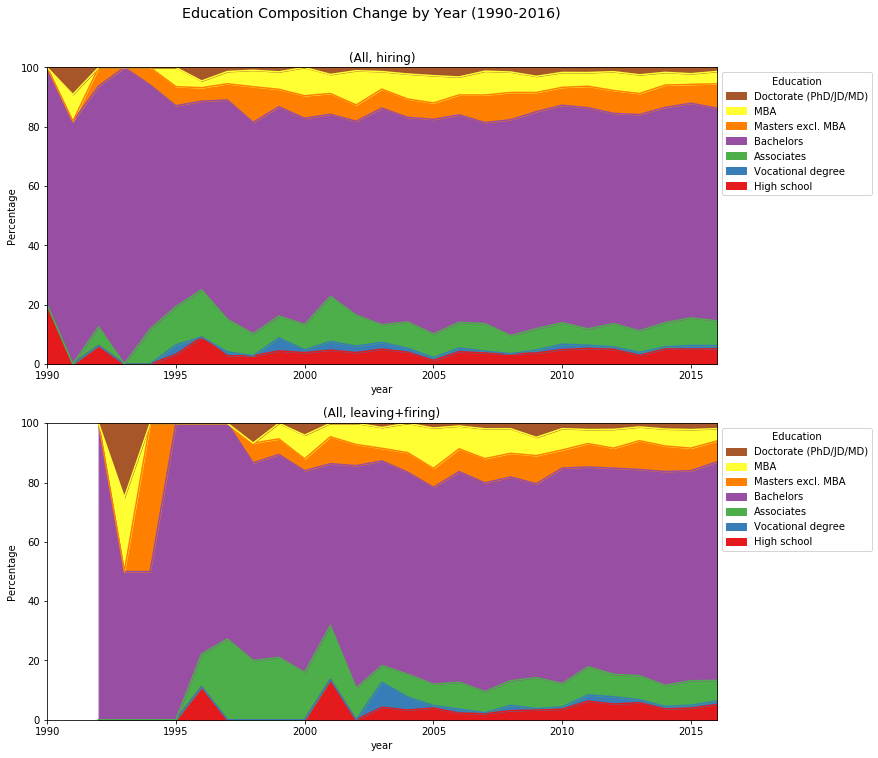

In [36]:
edu_lablst = {
    0:"None/Unknown", 1:"High school", 2:"Vocational degree", 3:"Associates", 
    4:"Bachelors", 5:"Masters excl. MBA", 6:"MBA", 7:"Doctorate (PhD/JD/MD)"
}
colormap_unif = {str(idx):clr for idx, clr in zip(
    range(len(edu_lablst)),
    itertools.cycle([plt.get_cmap('Dark2').colors[0]]+list(plt.get_cmap('Set1').colors))
)}

# Codes for showing pie charts:
# fig,axs=plt.subplots(3,2,figsize=(15,22.5))
# for (idx,col),ax in zip(empl_changes_df.loc[:].pivot_table(
#     index='edu',columns=['ticker','type'],values='gender',aggfunc='count'
# ).iteritems(),itertools.chain.from_iterable(axs)):
#     col.plot.pie(
#         ax=ax, labeldistance=1.05, title=str(idx).replace("'",''), autopct='%.2f', pctdistance=0.9,
#         colors=[colormap_unif[idx] for idx in col.index], labels=[edu_lablst[x] for x in range(0,8)]
#     )
#     ax.set_ylabel('')
# plt.show()

## Continued ##
f_none_hidden = True # Whether to show the "None/Unknown"s.

# Plot composition changes by years.
for (idx, grp), ax, xleft in zip(
    empl_changes_df.loc[
        lambda df:(df.year>=1990)&(df.year<=2016), ['ticker','type','year','edu']
    ].replace(
        to_replace={"type":{"firing":"leaving+firing","leaving":"leaving+firing"}}
    ).groupby(['ticker','type']), iterator_for_axis(
        rep_time=2,fig_func=lambda x:x.suptitle("Education Composition Change by Year (1990-2016)", fontsize='x-large', y=0.95)
    ), [x for x in xlefts for _ in range(2)]
):
    to_plot = grp.loc[lambda df:[int(x)>=f_none_hidden for x in df.edu]].assign(count = 1).pivot_table(
        index='year', columns='edu', values='count', aggfunc='sum', fill_value=0 
    ).apply(lambda x:x/sum(x)*100, axis=1)
    to_plot.plot(
        kind='area', ax=ax, color=[colormap_unif[idx] for idx in to_plot.columns],
        ylim=(0,100), title=str(idx).replace("'",""),
        xlim=(xleft,2016), xticks=[1990+x*5 for x in range(6)]
    )
    ax.set_ylabel("Percentage")
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(
        reversed(handles), [edu_lablst[int(x)] for x in reversed(labels)], 
        loc='upper left',bbox_to_anchor=(1,1),title="Education"
    )
plt.show()



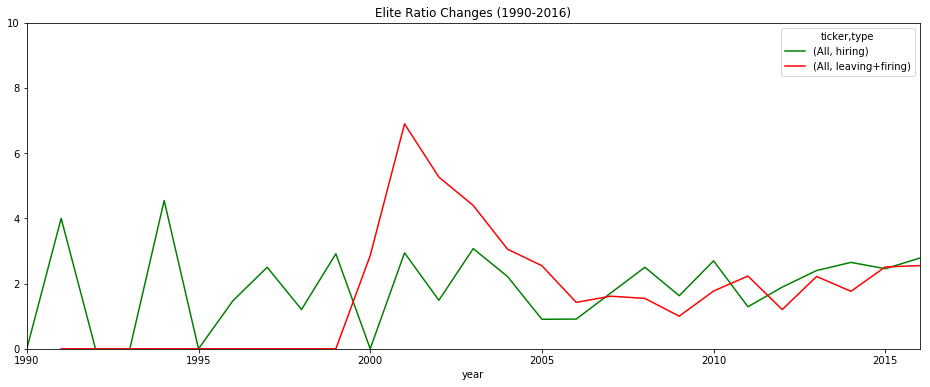

In [37]:
for (ticker, grp), xleft in zip(
    empl_changes_df.replace(
        to_replace={"type":{"firing":"leaving+firing","leaving":"leaving+firing"}}
    ).groupby('ticker'), xlefts
):
    grp.loc[lambda df:df.year>=xleft].pivot_table(
        index='year',columns=['ticker','type'],values='f_elite',
        aggfunc=lambda x:((x=='True').sum()/(x==x).sum()*100)
    ).plot(
        xlim=(1990,2016),color=color_styles,ylim=(0,10),
        title="Elite Ratio Changes (1990-2016)",figsize=(16,6)
    )
    ax.set_ylabel('Percentage')
plt.show()

# By Next Industry.

Note: Division of 2-digit NAICS's into industry groups are obtained from [Bureau of Labor Statistics](https://www.bls.gov/iag/tgs/iag_index_naics.htm).

In [38]:
NAICS2GRP_dict = {
    '11': (1, "Natural Resources and Mining"),
    '21': (1, "Natural Resources and Mining"),
    '23': (2, "Construction"),
    '31': (3, "Manufacturing"),
    '32': (3, "Manufacturing"),
    '33': (3, "Manufacturing"),
    '42': (4, "Trade, Transportation, and Utilities"),
    '44': (4, "Trade, Transportation, and Utilities"),
    '45': (4, "Trade, Transportation, and Utilities"),
    '48': (4, "Trade, Transportation, and Utilities"),
    '49': (4, "Trade, Transportation, and Utilities"),
    '22': (4, "Trade, Transportation, and Utilities"),
    '51': (5, "Information"),
    '52': (6, "Financial Activities"),
    '53': (6, "Financial Activities"),
    '54': (7, "Professional and Business Services"),
    '55': (7, "Professional and Business Services"),
    '56': (7, "Professional and Business Services"),
    '61': (8, "Education and Health Services"),
    '62': (8, "Education and Health Services"),
    '71': (9, "Leisure and Hospitality"),
    '72': (9, "Leisure and Hospitality"),
    '81': (10, "Other Services"),
    '92': (11, "Public Administration"),
    '99': (12, "Unknown/Unclassified"),
    ''  : (12, "Unknown/Unclassified"),
    'MI': (12, "Unknown/Unclassified"),
    '46': (12, "Unknown/Unclassified"),
    'GO': (12, "Unknown/Unclassified")
}

# Show the mappings.
pd.DataFrame(
    [[key, value[0], value[1]] for key,value in NAICS2GRP_dict.items()]
).groupby([1,2])[0].apply(lambda ser:', '.join(ser)).reset_index().drop(1,axis=1).rename(
    {2:"Industry group",0:"NAICS2"},axis=1
)

,Industry group,NAICS2
0,Natural Resources and Mining,"11, 21"
1,Construction,23
2,Manufacturing,"31, 32, 33"
3,"Trade, Transportation, and Utilities","42, 44, 45, 48, 49, 22"
4,Information,51
5,Financial Activities,"52, 53"
6,Professional and Business Services,"54, 55, 56"
7,Education and Health Services,"61, 62"
8,Leisure and Hospitality,"71, 72"
9,Other Services,81


Note: `46` seems to be a wrong NAICS2 code.

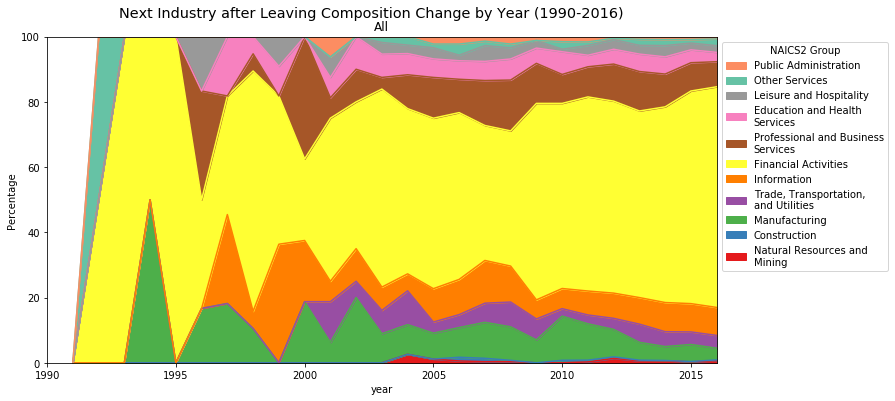

In [39]:
ind_next_lst = sorted(list(set(NAICS2GRP_dict.values())))
colormap_unif = {idx:clr for idx, clr in zip(
    ind_next_lst[:-1], # Assume the last element is "Others".
    itertools.cycle(plt.get_cmap('Set1').colors+plt.get_cmap('Set2').colors+plt.get_cmap('Set3').colors)
)}
colormap_unif[ind_next_lst[-1]] = plt.get_cmap('Dark2').colors[0]

# Codes for showing pie charts:
# fig,axs=plt.subplots(1,2,figsize=(15,7.5))
# for (idx,col),ax in zip(empl_changes_df.loc[lambda df:df.type=='leaving'].pivot_table(
#     index=empl_changes_df.ind_next.apply(lambda x:NAICS2GRP_dict[x[:2]]),
#     columns='ticker', values='gender', aggfunc='count'
# ).iteritems(),axs):
#     col.plot.pie(
#         ax=ax, labeldistance=1.05, title=str(idx).replace("'",''), autopct='%.2f', pctdistance=0.9,
#         colors=[colormap_unif[idx] for idx in col.index], labels=[x[1] for x in col.index]
#     )
#     ax.set_ylabel('')
# plt.show()

## Continued ##
f_none_hidden = True # Whether to show the "None/Unknown"s.

# Plot composition changes by years.
for (idx, grp), ax, xleft in zip(
    empl_changes_df.loc[
        lambda df:(df.year>=1990)&(df.year<=2016)&(df.type=='leaving'), ['ticker','type','year','ind_next']
    ].groupby('ticker'), iterator_for_axis(
        fig_func=lambda x:x.suptitle("Next Industry after Leaving Composition Change by Year (1990-2016)", fontsize='x-large', y=0.95)
    ), xlefts
):
    to_plot = grp.assign(count=1).pivot_table(
        columns=grp.ind_next.apply(lambda x:NAICS2GRP_dict[x[:2]]),
        index='year', values='count', aggfunc='sum', fill_value=0
    )
    if f_none_hidden:
        to_plot.drop(ind_next_lst[-1], axis=1, inplace=True)
    to_plot = to_plot.apply(lambda x:x/sum(x)*100, axis=1)
    to_plot.plot(
        kind='area', ax=ax, color=[colormap_unif[idx] for idx in to_plot.columns],
        ylim=(0,100), title=idx, xlim=(xleft,2016), xticks=[1990,1995,2000,2005,2010,2015]
    )
    ax.set_ylabel("Percentage")
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(
        reversed(handles), ["\n".join(wrap(re.match(r"\(\d+, (.+)\)",x).group(1),25)) for x in reversed(labels)], 
        loc='upper left', bbox_to_anchor=(1,1), title="NAICS2 Group"
    )
plt.show()

## Tenure and Number of Promotions.

Note:
- Tenure = End date of last entry - Start date of first entry in a consecutive sequence of entries in the same company;
 - When there is any invalid month in the two dates and their years are _not_ the same, the invalid month is replaced by 6;
 - When there is any invalid month in the two dates and their years are the same, the invalid month is assumed to be the extreme value (0 for start and 12 for end) and the results are the minimum of their difference and 6.
- Number of promotions = Number of entries in a consecutive sequence of entries in the same company - 1.

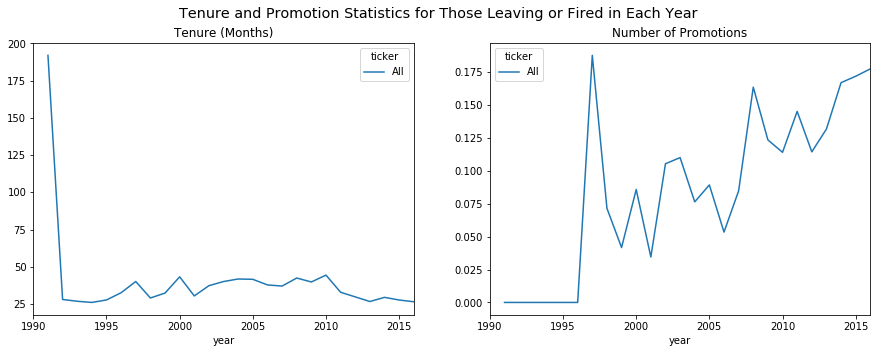

In [40]:
for (ticker, grp), xleft in zip(empl_changes_df.groupby('ticker'),xlefts):
    # Calculate.
    to_plot = grp.loc[lambda df:(df.type!='hiring')&(df.year>=xleft)&(df.year<=2016)].astype(
        {'tenure':'Int64','nprom':'Int64'}
    ).pivot_table(
        columns=['ticker'],index='year',values=['tenure','nprom'],aggfunc=np.nanmean
    )

    # Plot.
    fig, (ax1,ax2) = plt.subplots(1,2,figsize=(15,5))
    fig.suptitle("Tenure and Promotion Statistics for Those Leaving or Fired in Each Year",fontsize='x-large')
    to_plot['tenure'].plot(
        title="Tenure (Months)",ax=ax1,xticks=[1990,1995,2000,2005,2010,2015],xlim=(xleft,2016)
    )
    to_plot['nprom'].plot(
        title="Number of Promotions",ax=ax2,xticks=[1990,1995,2000,2005,2010,2015],xlim=(xleft,2016)
    )
plt.show()